# <center>VMAT Optimization</center>

### This example demonstrates the use of portpy.photon to create down sampled influence matrix and create a benchmark VMAT plan

1. Down sample influence matrix and create a benchmark VMAT plan using few beams since it computationally expensive
2. Visualize benchmark VMAT plan
3. Evaluate the respective plan

In [1]:
import sys
sys.path.append('..')

In [2]:
import portpy.photon as pp
import numpy as np
import cvxpy as cp
import os

### 1) Create down sampled influence matrix and generate benchmark VMAT plan
#### 1.a) create portpy plan and cvxpy problem statement

In [3]:
# Create plan object
data_dir = r'../data'
data = pp.DataExplorer(data_dir=data_dir)
patient_id = 'Lung_Patient_6'
data.patient_id = patient_id

# Load ct, structure and beams as an object
ct = pp.CT(data)
structs = pp.Structures(data)
# generating VMAT plan using all the control points is computationally expensive. We select only 8 equidistant beams to create the benchamrk VMAT plan.
# beam_ids = [0, 37, 42, 48, 54, 60]
# beam_ids = [0, 12, 24, 36, 48]
beam_ids = np.arange(0,72,10)
beams = pp.Beams(data, beam_ids=beam_ids)

# create rinds based upon rind definition in optimization params
opt_params = data.load_config_opt_params(protocol_name='Lung_2Gy_30Fx')
structs.create_opt_structures(opt_params)

# load influence matrix based upon beams and structure set
inf_matrix = pp.InfluenceMatrix(ct=ct, structs=structs, beams=beams)

# create a influence matrix down sampled beamlets of width and height 20mm
beamlet_down_sample_factor = 8
new_beamlet_width_mm = beams.get_finest_beamlet_width() * beamlet_down_sample_factor
new_beamlet_height_mm = beams.get_finest_beamlet_height() * beamlet_down_sample_factor

# # Calculate the new voxel resolution
print('CT voxel resolution in xyz is {} mm'.format(ct.get_ct_res_xyz_mm()))
print('Data optimization voxel resolution in xyz is {} mm'.format(structs.opt_voxels_dict['dose_voxel_resolution_xyz_mm']))
voxel_down_sample_factors = [6, 6, 1]
opt_vox_xyz_res_mm = [ct_res * factor for ct_res, factor in zip(ct.get_ct_res_xyz_mm(), voxel_down_sample_factors)]
print('Down Sampled optimization voxel resolution in xyz is {} mm'.format(opt_vox_xyz_res_mm))

inf_matrix_db = inf_matrix.create_down_sample(beamlet_width_mm=new_beamlet_width_mm,
                                              beamlet_height_mm=new_beamlet_height_mm,
                                             opt_vox_xyz_res_mm=opt_vox_xyz_res_mm)

# load clinical criteria from the config files for which plan to be optimized
protocol_name = 'Lung_2Gy_30Fx'
clinical_criteria = pp.ClinicalCriteria(data, protocol_name)

my_plan = pp.Plan(ct, structs, beams, inf_matrix_db, clinical_criteria)

# remove smoothness objective
for i in range(len(opt_params['objective_functions'])):
    if opt_params['objective_functions'][i]['type'] == 'smoothness-quadratic':
        opt_params['objective_functions'][i]['weight'] = 0

creating rinds.. This step may take some time due to dilation
rinds created!!
Creating BEV..
Loading sparse influence matrix...
Done
CT voxel resolution in xyz is [0.98, 0.98, 3] mm
Data optimization voxel resolution in xyz is [2.93, 2.93, 3] mm
Down Sampled optimization voxel resolution in xyz is [5.88, 5.88, 3] mm
reindexing voxels...
parsing influence matrix for beam 0
parsing influence matrix for beam 1
parsing influence matrix for beam 2
parsing influence matrix for beam 3
parsing influence matrix for beam 4
parsing influence matrix for beam 5
parsing influence matrix for beam 6
parsing influence matrix for beam 7
creating influence matrix for down sample voxels..


#### 1.b) Create a map between leaf and beamlets index for each control point 

In [4]:
opt = pp.Optimization(my_plan, opt_params=opt_params)
opt.create_cvxpy_problem()

Objective Start
Objective done
Constraints Start
Constraints done


In [5]:
# use linear instead of quadratic objective functions as 'MOSEK' solver is more favourable for linear MIP models instead of MINLP
obj_funcs = opt_params['objective_functions'] if 'objective_functions' in opt_params else []

A = inf_matrix_db.A
num_fractions = clinical_criteria.get_num_of_fractions()
st = inf_matrix_db
x = opt.vars['x']
d = None

# Construct optimization problem

opt.obj = [] # Remove all previous objective functions

# Generating new linear objective functions
print('Objective Start')
for i in range(len(obj_funcs)):
    if obj_funcs[i]['type'] == 'quadratic-overdose':
        if obj_funcs[i]['structure_name'] in my_plan.structures.get_structures():
            struct = obj_funcs[i]['structure_name']
            dose_gy = opt.get_num(obj_funcs[i]['dose_gy']) / clinical_criteria.get_num_of_fractions()
            dO = cp.Variable(len(st.get_opt_voxels_idx(struct)), pos=True)
            opt.obj += [(1 / len(st.get_opt_voxels_idx(struct))) *
                    (obj_funcs[i]['weight'] * cp.sum(dO))]
            opt.constraints += [A[st.get_opt_voxels_idx(struct), :] @ x <= dose_gy + dO]
    elif obj_funcs[i]['type'] == 'quadratic-underdose':
        if obj_funcs[i]['structure_name'] in my_plan.structures.get_structures():
            struct = obj_funcs[i]['structure_name']
            dose_gy = opt.get_num(obj_funcs[i]['dose_gy']) / clinical_criteria.get_num_of_fractions()
            dU = cp.Variable(len(st.get_opt_voxels_idx(struct)), pos=True)
            opt.obj += [(1 / len(st.get_opt_voxels_idx(struct))) *
                    (obj_funcs[i]['weight'] * cp.sum(dU))]
            opt.constraints += [A[st.get_opt_voxels_idx(struct), :] @ x >= dose_gy - dU]
    elif obj_funcs[i]['type'] == 'quadratic':
        if obj_funcs[i]['structure_name'] in my_plan.structures.get_structures():
            struct = obj_funcs[i]['structure_name']
            if d is None:
                opt.obj += [(1 / len(st.get_opt_voxels_idx(struct))) * (
                        obj_funcs[i]['weight'] * cp.sum(A[st.get_opt_voxels_idx(struct) ,:] @ x))]   

Objective Start


In [6]:
# t = cp.Variable(1, pos=True)
# o = cp.Variable(1, pos=True)
# sum_targ_obj = 0
# for i in range(2):
#     sum_targ_obj = sum_targ_obj + opt.obj[i]
# sum_oar_obj = 0
# for i in range(2,len(opt.obj) -1):
#     sum_oar_obj = sum_oar_obj + opt.obj[i]

# opt.constraints += [sum_targ_obj <= t]
# opt.constraints += [sum_oar_obj <= o]
# opt.obj = []
# opt.obj += [t + o]

In [7]:
beam_maps = my_plan.inf_matrix.get_bev_2d_grid(beam_id=my_plan.beams.get_all_beam_ids())
vmat_beams = []
for i in range(len(beam_maps)):
    beam_map = beam_maps[i]
    beam_map = beam_map[~np.all(beam_map == -1, axis=1), :]  # remove rows which are not in BEV
    # beam_map = beam_map[:, ~np.all(beam_map == -1, axis=0)]  # remove cols which are not in BEV
    num_rows, num_cols = beam_map.shape

    leaf_idx_beamlet_map = {}
    for j, row in enumerate(beam_map):
        leaf_idx_beamlet_map[j] = row[row >= 0].tolist()
    map_beamlet = {'leaf_idx_beamlet_map': leaf_idx_beamlet_map, 'num_rows': num_rows, 'num_cols': num_cols,
                   'beam_map': beam_map}
    vmat_beams.append(map_beamlet)
total_rows = sum([b['num_rows'] for b in vmat_beams])

#### 1.c) Model formulation for creating VMAT plan

$
   \mbox{Minimize} \quad  w_o||A_{target}\mathbf{x}-pres||_{+} + w_u||A_{target}\mathbf{x}-pres||_{-} + w_{oar}  ||A_{oar} \mathbf{x}||
$

$
\mbox{subject to}
$

$
\quad maximum(A_s\mathbf{x}) \leq {d_s}^{max}
$

$
\quad mean(A_s\mathbf{x}) \leq {d_s}^{mean}
$

$
\quad \mathbf{x} \geq 0
$

where $w_o$ (overdose weight) = 10000 , $w_u$ (underdose weight) = 100000, $w_{oar}$ (oar weight) = 10, $s$ = structure index, $pres$ = prescription dose, $\mathbf{x}$ is beamlet intensity, ${d_s}^{max}$ = maximum dose for structure s, ${d_s}^{mean}$ = mean dose for structure s, $A$ = influence matrix.



In [8]:
# create new variables for VMAT
lbi = cp.Variable(total_rows, integer=True)
rbi = cp.Variable(total_rows, integer=True)
z = cp.Variable(my_plan.inf_matrix.A.shape[1], boolean=True)
mu = cp.Variable(len(vmat_beams), pos=True)
x = opt.vars['x']

# Add geometric constraints (consecutive ones)
leaf_in_prev_beam = 0
for i, beam in enumerate(vmat_beams):
    beam_map = beam['beam_map']
    leaf_idx_beamlet_map = beam['leaf_idx_beamlet_map']

    for leaf in leaf_idx_beamlet_map:
        beamlets_in_leaf = leaf_idx_beamlet_map[leaf]
        ind = np.where(np.isin(beam_map, beamlets_in_leaf))
        # geometric constraints
        opt.constraints += [rbi[leaf_in_prev_beam + leaf] - cp.multiply(ind[1] + 1, z[beamlets_in_leaf]) >= 1]
        opt.constraints += [
            cp.multiply((beam['num_cols'] - ind[1]), z[beamlets_in_leaf]) + lbi[leaf_in_prev_beam + leaf] <= beam[
                'num_cols']]
        opt.constraints += [cp.sum([z[b_i] for b_i in beamlets_in_leaf]) == rbi[leaf_in_prev_beam + leaf] - lbi[
            leaf_in_prev_beam + leaf] - 1]
        opt.constraints += [rbi[leaf_in_prev_beam + leaf] <= beam['num_cols']]
        # McCormick Constraints
        opt.constraints += [x[beamlets_in_leaf] <= 2 * z[beamlets_in_leaf]]
        opt.constraints += [mu[i] - 2 * (1 - z[beamlets_in_leaf]) <= x[beamlets_in_leaf]]
        opt.constraints += [x[beamlets_in_leaf] <= mu[i]]

    leaf_in_prev_beam = leaf_in_prev_beam + len(leaf_idx_beamlet_map)
    # bound constraints
    opt.constraints += [mu[i] <= 2]
opt.constraints += [lbi >= 0]
opt.constraints += [rbi >= 0]
    

In [9]:
sol = opt.solve(solver=cp.MOSEK, verbose=True) # optimize the problem # mosek_params = {'MSK_DPAR_MIO_TOL_REL_GAP':  1.0e-02}, 
# save the optimized solution for all the variables in solution dictionary
sol['MU'] = mu.value
sol['left_leaf_pos'] = lbi.value
sol['right_leaf_pos'] = rbi.value


Running Optimization..
                                     CVXPY                                     
                                     v1.3.0                                    
(CVXPY) Jul 13 01:20:58 PM: Your problem has 4788 variables, 252 constraints, and 0 parameters.
(CVXPY) Jul 13 01:20:58 PM: It is compliant with the following grammars: DCP, DQCP
(CVXPY) Jul 13 01:20:58 PM: (If you need to solve this problem multiple times, but with different data, consider using parameters.)
(CVXPY) Jul 13 01:20:58 PM: CVXPY will first compile your problem; then, it will invoke a numerical solver to obtain a solution.
-------------------------------------------------------------------------------
                                  Compilation                                  
-------------------------------------------------------------------------------
(CVXPY) Jul 13 01:20:58 PM: Compiling problem (target solver=MOSEK).
(CVXPY) Jul 13 01:20:58 PM: Reduction chain: Dcp2Cone -> CvxAttr2Con

(CVXPY) Jul 13 01:25:24 PM: 1819     1814     1342     9        1.4725629543e+04     1.5292016470e+03     89.62       259.6 
(CVXPY) Jul 13 01:25:29 PM: 1872     1867     1395     23       1.4725629543e+04     1.5292016470e+03     89.62       264.3 
(CVXPY) Jul 13 01:25:34 PM: 1926     1921     1449     9        1.4725629543e+04     1.5311742092e+03     89.60       269.4 
(CVXPY) Jul 13 01:25:39 PM: 1976     1970     1497     10       1.4725629543e+04     1.5567793653e+03     89.43       274.1 
(CVXPY) Jul 13 01:25:43 PM: 2031     2025     1552     32       1.4725629543e+04     1.5567793653e+03     89.43       279.0 
(CVXPY) Jul 13 01:25:48 PM: 2097     2090     1616     27       1.4725629543e+04     1.5659669928e+03     89.37       283.8 
(CVXPY) Jul 13 01:25:53 PM: 2150     2143     1665     8        1.4725629543e+04     1.5660116952e+03     89.37       288.4 
(CVXPY) Jul 13 01:25:58 PM: 2218     2208     1727     11       1.4725629543e+04     1.5660116952e+03     89.37       293.2 


(CVXPY) Jul 13 01:30:45 PM: 6879     6560     4459     11       5.8504045063e+03     1.6741900907e+03     71.38       580.2 
(CVXPY) Jul 13 01:30:57 PM: 6948     6629     4459     11       5.8504045063e+03     1.6741900907e+03     71.38       592.2 
(CVXPY) Jul 13 01:31:02 PM: 7038     6719     4459     11       5.8504045063e+03     1.6741900907e+03     71.38       597.1 
(CVXPY) Jul 13 01:31:06 PM: 7124     6805     4459     11       5.8504045063e+03     1.6741900907e+03     71.38       601.2 
(CVXPY) Jul 13 01:31:10 PM: 7225     6904     4459     11       5.8504045063e+03     1.6741900907e+03     71.38       605.3 
(CVXPY) Jul 13 01:31:14 PM: 7303     6979     4509     12       5.8504045063e+03     1.6756230424e+03     71.36       609.7 
(CVXPY) Jul 13 01:31:19 PM: 7396     7071     4566     33       5.8504045063e+03     1.6756230424e+03     71.36       614.6 
(CVXPY) Jul 13 01:31:24 PM: 7467     7138     4611     34       5.8504045063e+03     1.6764961657e+03     71.34       619.3 


(CVXPY) Jul 13 01:36:25 PM: 13088    12488    6504     20       5.8504045063e+03     1.7250640008e+03     70.51       920.4 
(CVXPY) Jul 13 01:36:25 PM: 13102    12502    6504     20       5.8504045063e+03     1.7250640008e+03     70.51       920.7 
(CVXPY) Jul 13 01:36:26 PM: 13119    12519    6504     20       5.8504045063e+03     1.7250640008e+03     70.51       921.2 
(CVXPY) Jul 13 01:36:26 PM: 13143    12543    6504     20       5.8504045063e+03     1.7250640008e+03     70.51       921.7 
(CVXPY) Jul 13 01:36:27 PM: 13190    12590    6504     20       5.8504045063e+03     1.7250640008e+03     70.51       922.3 
(CVXPY) Jul 13 01:36:28 PM: 13270    12670    6504     20       5.8504045063e+03     1.7250640008e+03     70.51       923.5 
(CVXPY) Jul 13 01:36:30 PM: 13388    12788    6504     20       5.8504045063e+03     1.7250640008e+03     70.51       925.8 
(CVXPY) Jul 13 01:36:32 PM: 13532    12928    6504     20       5.8504045063e+03     1.7250640008e+03     70.51       927.5 


(CVXPY) Jul 13 01:40:47 PM: 19331    18504    8216     15       5.8245585667e+03     1.7494815111e+03     69.96       1182.3
(CVXPY) Jul 13 01:40:51 PM: 19414    18587    8259     20       5.8245585667e+03     1.7494815111e+03     69.96       1186.7
(CVXPY) Jul 13 01:40:56 PM: 19529    18701    8324     23       5.8245585667e+03     1.7494815111e+03     69.96       1191.2
(CVXPY) Jul 13 01:41:00 PM: 19650    18819    8381     45       5.8245585667e+03     1.7494815111e+03     69.96       1195.2
(CVXPY) Jul 13 01:41:04 PM: 19791    18956    8464     51       5.8245585667e+03     1.7504603730e+03     69.95       1199.1
(CVXPY) Jul 13 01:41:08 PM: 19938    19099    8509     51       5.8245585667e+03     1.7520809814e+03     69.92       1203.9
(CVXPY) Jul 13 01:41:13 PM: 20046    19206    8557     58       5.8245585667e+03     1.7520809814e+03     69.92       1208.2
(CVXPY) Jul 13 01:41:17 PM: 20169    19327    8606     52       5.8245585667e+03     1.7520809814e+03     69.92       1212.4


(CVXPY) Jul 13 01:46:30 PM: 26875    25755    10648    18       5.5900952833e+03     1.7716167145e+03     68.31       1525.1
(CVXPY) Jul 13 01:46:34 PM: 26993    25865    10690    23       5.5900952833e+03     1.7716167145e+03     68.31       1529.7
(CVXPY) Jul 13 01:46:39 PM: 27120    25983    10725    28       5.5900952833e+03     1.7716167145e+03     68.31       1534.2
(CVXPY) Jul 13 01:46:43 PM: 27213    26071    10764    29       5.5900952833e+03     1.7716167145e+03     68.31       1538.5
(CVXPY) Jul 13 01:46:48 PM: 27370    26218    10805    15       5.5900952833e+03     1.7733206945e+03     68.28       1543.0
(CVXPY) Jul 13 01:46:52 PM: 27509    26356    10880    13       5.5900952833e+03     1.7741244295e+03     68.26       1547.6
(CVXPY) Jul 13 01:46:57 PM: 27702    26543    10929    12       5.5689200814e+03     1.7743107699e+03     68.14       1552.3
(CVXPY) Jul 13 01:47:02 PM: 27859    26692    10946    70       5.5153320929e+03     1.7752606339e+03     67.81       1557.4


(CVXPY) Jul 13 01:52:16 PM: 34799    33299    12698    49       5.5153320929e+03     1.7955376736e+03     67.44       1871.7
(CVXPY) Jul 13 01:52:21 PM: 34911    33411    12724    13       5.5153320929e+03     1.7956031359e+03     67.44       1876.2
(CVXPY) Jul 13 01:52:26 PM: 35037    33536    12746    15       5.5153320929e+03     1.7956031359e+03     67.44       1881.7
(CVXPY) Jul 13 01:52:32 PM: 35154    33649    12773    20       5.5153320929e+03     1.7956031359e+03     67.44       1887.2
(CVXPY) Jul 13 01:52:36 PM: 35256    33748    12803    31       5.5153320929e+03     1.7956031359e+03     67.44       1891.8
(CVXPY) Jul 13 01:52:41 PM: 35366    33857    12845    34       5.5153320929e+03     1.7968825288e+03     67.42       1896.5
(CVXPY) Jul 13 01:52:46 PM: 35450    33938    12877    38       5.5153320929e+03     1.7968825288e+03     67.42       1901.0
(CVXPY) Jul 13 01:52:51 PM: 35557    34040    12928    9        5.5153320929e+03     1.7969226645e+03     67.42       1906.5


(CVXPY) Jul 13 01:58:07 PM: 42261    40502    15044    15       5.2420161954e+03     1.8115818528e+03     65.44       2222.2
(CVXPY) Jul 13 01:58:11 PM: 42369    40607    15086    18       5.2420161954e+03     1.8115818528e+03     65.44       2226.8
(CVXPY) Jul 13 01:58:16 PM: 42476    40713    15121    25       5.2420161954e+03     1.8115818528e+03     65.44       2231.2
(CVXPY) Jul 13 01:58:20 PM: 42597    40828    15156    29       5.2420161954e+03     1.8115818528e+03     65.44       2235.9
(CVXPY) Jul 13 01:58:25 PM: 42735    40966    15174    41       5.2420161954e+03     1.8116397665e+03     65.44       2240.6
(CVXPY) Jul 13 01:58:30 PM: 42825    41056    15188    53       5.2420161954e+03     1.8128384426e+03     65.42       2245.4
(CVXPY) Jul 13 01:58:34 PM: 42951    41180    15214    39       5.2420161954e+03     1.8130351073e+03     65.41       2249.7
(CVXPY) Jul 13 01:58:39 PM: 43091    41318    15238    54       5.2420161954e+03     1.8132158995e+03     65.41       2254.6


(CVXPY) Jul 13 02:03:54 PM: 49320    47456    17043    32       5.2420161954e+03     1.8260369456e+03     65.17       2569.5
(CVXPY) Jul 13 02:03:58 PM: 49403    47539    17086    32       5.2420161954e+03     1.8260369456e+03     65.17       2573.9
(CVXPY) Jul 13 02:04:03 PM: 49500    47633    17129    48       5.2420161954e+03     1.8267521737e+03     65.15       2578.5
(CVXPY) Jul 13 02:04:08 PM: 49619    47749    17168    15       5.2420161954e+03     1.8270739839e+03     65.15       2583.1
(CVXPY) Jul 13 02:04:13 PM: 49753    47883    17196    18       5.2420161954e+03     1.8271366114e+03     65.14       2588.1
(CVXPY) Jul 13 02:04:23 PM: 49769    47899    17198    18       5.2420161954e+03     1.8271366114e+03     65.14       2598.1
(CVXPY) Jul 13 02:04:27 PM: 49887    48017    17234    14       5.2420161954e+03     1.8272798778e+03     65.14       2602.8
(CVXPY) Jul 13 02:04:32 PM: 50001    48128    17276    16       5.2420161954e+03     1.8282060349e+03     65.12       2607.7


(CVXPY) Jul 13 02:09:41 PM: 55865    53915    19152    20       5.2420161954e+03     1.8373140685e+03     64.95       2916.1
(CVXPY) Jul 13 02:09:46 PM: 55960    54010    19199    23       5.2420161954e+03     1.8373140685e+03     64.95       2921.2
(CVXPY) Jul 13 02:09:51 PM: 56059    54108    19232    17       5.2420161954e+03     1.8373140685e+03     64.95       2926.1
(CVXPY) Jul 13 02:10:07 PM: 56071    54120    19236    17       5.2420161954e+03     1.8373140685e+03     64.95       2942.3
(CVXPY) Jul 13 02:10:11 PM: 56166    54213    19273    17       5.2420161954e+03     1.8376347275e+03     64.94       2946.6
(CVXPY) Jul 13 02:10:16 PM: 56289    54335    19316    50       5.2420161954e+03     1.8378920866e+03     64.94       2951.8
(CVXPY) Jul 13 02:10:21 PM: 56403    54442    19308    37       5.2420161954e+03     1.8379473713e+03     64.94       2956.3
(CVXPY) Jul 13 02:10:25 PM: 56522    54559    19323    17       5.2420161954e+03     1.8380775020e+03     64.94       2960.5


(CVXPY) Jul 13 02:15:33 PM: 62851    60807    21258    54       5.1922878049e+03     1.8481253870e+03     64.41       3268.5
(CVXPY) Jul 13 02:15:39 PM: 62993    60938    21292    16       5.1922878049e+03     1.8481824430e+03     64.41       3274.0
(CVXPY) Jul 13 02:15:43 PM: 63122    61062    21323    22       5.1922878049e+03     1.8481824430e+03     64.41       3278.9
(CVXPY) Jul 13 02:15:56 PM: 63194    61131    21311    22       5.1922878049e+03     1.8481824430e+03     64.41       3291.3
(CVXPY) Jul 13 02:16:01 PM: 63306    61239    21339    24       5.1922878049e+03     1.8481824430e+03     64.41       3296.5
(CVXPY) Jul 13 02:16:06 PM: 63434    61362    21349    47       5.1922878049e+03     1.8481824430e+03     64.41       3301.7
(CVXPY) Jul 13 02:16:11 PM: 63551    61479    21392    14       5.1922878049e+03     1.8485135604e+03     64.40       3306.3
(CVXPY) Jul 13 02:16:15 PM: 63709    61637    21438    53       5.1922878049e+03     1.8493053951e+03     64.38       3310.6


(CVXPY) Jul 13 02:21:12 PM: 70116    67851    23105    24       5.1922878049e+03     1.8580050813e+03     64.22       3608.0
(CVXPY) Jul 13 02:21:18 PM: 70216    67951    23131    31       5.1922878049e+03     1.8580050813e+03     64.22       3613.4
(CVXPY) Jul 13 02:21:23 PM: 70314    68047    23143    24       5.1922878049e+03     1.8580050813e+03     64.22       3618.1
(CVXPY) Jul 13 02:21:30 PM: 70409    68141    23186    30       5.1922878049e+03     1.8594496901e+03     64.19       3625.1
(CVXPY) Jul 13 02:21:34 PM: 70486    68218    23225    37       5.1922878049e+03     1.8594496901e+03     64.19       3629.6
(CVXPY) Jul 13 02:21:39 PM: 70583    68314    23276    18       5.1922878049e+03     1.8595315596e+03     64.19       3634.2
(CVXPY) Jul 13 02:21:43 PM: 70671    68400    23312    21       5.1922878049e+03     1.8600402867e+03     64.18       3638.8
(CVXPY) Jul 13 02:21:48 PM: 70740    68468    23343    30       5.1922878049e+03     1.8600402867e+03     64.18       3643.3


(CVXPY) Jul 13 02:26:40 PM: 75782    73419    25247    30       5.1922878049e+03     1.8664134984e+03     64.05       3935.8
(CVXPY) Jul 13 02:26:46 PM: 75870    73505    25273    14       5.1922878049e+03     1.8670621123e+03     64.04       3941.1
(CVXPY) Jul 13 02:26:50 PM: 75945    73577    25304    32       5.1922878049e+03     1.8670621123e+03     64.04       3945.3
(CVXPY) Jul 13 02:26:54 PM: 76018    73650    25347    16       5.1922878049e+03     1.8670621123e+03     64.04       3949.8
(CVXPY) Jul 13 02:26:59 PM: 76137    73768    25408    16       5.1922878049e+03     1.8672780290e+03     64.04       3954.3
(CVXPY) Jul 13 02:27:04 PM: 76251    73878    25452    19       5.1922878049e+03     1.8672780290e+03     64.04       3959.4
(CVXPY) Jul 13 02:27:08 PM: 76401    74029    25528    21       5.1922878049e+03     1.8672780290e+03     64.04       3963.9
(CVXPY) Jul 13 02:27:15 PM: 76519    74142    25590    27       5.1922878049e+03     1.8672780290e+03     64.04       3970.3


(CVXPY) Jul 13 02:32:07 PM: 85077    82462    27536    14       5.1251809869e+03     1.8787384956e+03     63.34       4262.8
(CVXPY) Jul 13 02:32:12 PM: 85225    82609    27540    13       5.1251809869e+03     1.8790665615e+03     63.34       4267.7
(CVXPY) Jul 13 02:32:17 PM: 85360    82743    27563    39       5.1251809869e+03     1.8794988519e+03     63.33       4272.5
(CVXPY) Jul 13 02:32:23 PM: 85512    82895    27587    38       5.1251809869e+03     1.8795399148e+03     63.33       4278.1
(CVXPY) Jul 13 02:32:28 PM: 85644    83026    27625    19       5.1251809869e+03     1.8796217368e+03     63.33       4283.5
(CVXPY) Jul 13 02:32:33 PM: 85776    83154    27659    52       5.1251809869e+03     1.8796366733e+03     63.33       4288.2
(CVXPY) Jul 13 02:32:38 PM: 85941    83319    27696    19       5.1251809869e+03     1.8797222370e+03     63.32       4293.8
(CVXPY) Jul 13 02:32:43 PM: 86094    83472    27727    16       5.1251809869e+03     1.8799405585e+03     63.32       4298.7


(CVXPY) Jul 13 02:37:31 PM: 95101    92288    29218    50       5.0869736129e+03     1.8907474294e+03     62.83       4586.5
(CVXPY) Jul 13 02:37:36 PM: 95226    92412    29235    31       5.0869736129e+03     1.8908162605e+03     62.83       4591.0
(CVXPY) Jul 13 02:37:41 PM: 95348    92534    29251    31       5.0869736129e+03     1.8912925323e+03     62.82       4596.1
(CVXPY) Jul 13 02:37:46 PM: 95481    92664    29268    16       5.0869736129e+03     1.8913065185e+03     62.82       4601.7
(CVXPY) Jul 13 02:37:50 PM: 95572    92755    29277    41       5.0869736129e+03     1.8913065185e+03     62.82       4605.9
(CVXPY) Jul 13 02:37:54 PM: 95680    92861    29311    41       5.0869736129e+03     1.8917799923e+03     62.81       4609.7
(CVXPY) Jul 13 02:37:59 PM: 95784    92964    29341    51       5.0869736129e+03     1.8917828189e+03     62.81       4614.2
(CVXPY) Jul 13 02:38:03 PM: 95887    93063    29370    43       5.0869736129e+03     1.8918505578e+03     62.81       4618.7


(CVXPY) Jul 13 02:42:35 PM: 101477   98529    31174    15       5.0869736129e+03     1.8974858924e+03     62.70       4890.3
(CVXPY) Jul 13 02:42:40 PM: 101610   98661    31177    17       5.0869736129e+03     1.8974858924e+03     62.70       4895.0
(CVXPY) Jul 13 02:42:44 PM: 101704   98754    31197    21       5.0869736129e+03     1.8974858924e+03     62.70       4899.4
(CVXPY) Jul 13 02:42:49 PM: 101788   98836    31225    25       5.0869736129e+03     1.8974858924e+03     62.70       4904.1
(CVXPY) Jul 13 02:42:53 PM: 101899   98943    31240    44       5.0869736129e+03     1.8974858924e+03     62.70       4908.8
(CVXPY) Jul 13 02:42:57 PM: 101983   99022    31258    20       5.0869736129e+03     1.8977754061e+03     62.69       4912.9
(CVXPY) Jul 13 02:43:02 PM: 102055   99094    31284    26       5.0869736129e+03     1.8977754061e+03     62.69       4917.6
(CVXPY) Jul 13 02:43:07 PM: 102138   99177    31305    28       5.0869736129e+03     1.8977754061e+03     62.69       4922.0


(CVXPY) Jul 13 02:47:39 PM: 108142   105018   33171    24       5.0869736129e+03     1.9030844178e+03     62.59       5194.5
(CVXPY) Jul 13 02:47:43 PM: 108264   105139   33209    43       5.0869736129e+03     1.9030844178e+03     62.59       5198.8
(CVXPY) Jul 13 02:47:48 PM: 108424   105295   33247    17       5.0869736129e+03     1.9038941804e+03     62.57       5203.6
(CVXPY) Jul 13 02:47:53 PM: 108552   105423   33279    22       5.0869736129e+03     1.9038941804e+03     62.57       5208.3
(CVXPY) Jul 13 02:47:57 PM: 108713   105581   33320    26       5.0869736129e+03     1.9038941804e+03     62.57       5212.8
(CVXPY) Jul 13 02:48:02 PM: 108844   105710   33363    30       5.0869736129e+03     1.9038941804e+03     62.57       5217.3
(CVXPY) Jul 13 02:48:06 PM: 108965   105827   33382    14       5.0869736129e+03     1.9044696982e+03     62.56       5221.7
(CVXPY) Jul 13 02:48:11 PM: 109107   105967   33418    18       5.0869736129e+03     1.9044696982e+03     62.56       5226.5


(CVXPY) Jul 13 02:52:52 PM: 115424   112152   35271    25       5.0869736129e+03     1.9101721176e+03     62.45       5507.5
(CVXPY) Jul 13 02:52:56 PM: 115522   112248   35309    29       5.0869736129e+03     1.9101721176e+03     62.45       5511.5
(CVXPY) Jul 13 02:53:01 PM: 115613   112337   35342    17       5.0869736129e+03     1.9104269138e+03     62.44       5516.4
(CVXPY) Jul 13 02:53:06 PM: 115696   112416   35373    12       5.0869736129e+03     1.9104738694e+03     62.44       5521.3
(CVXPY) Jul 13 02:53:10 PM: 115773   112493   35408    16       5.0869736129e+03     1.9104738694e+03     62.44       5525.6
(CVXPY) Jul 13 02:53:15 PM: 115874   112591   35431    18       5.0869736129e+03     1.9104738694e+03     62.44       5530.3
(CVXPY) Jul 13 02:53:20 PM: 115971   112685   35462    38       5.0869736129e+03     1.9104738694e+03     62.44       5535.9
(CVXPY) Jul 13 02:53:25 PM: 116063   112773   35490    18       5.0869736129e+03     1.9106892107e+03     62.44       5540.7


(CVXPY) Jul 13 02:57:59 PM: 121426   117938   37511    39       5.0869736129e+03     1.9147492316e+03     62.36       5814.4
(CVXPY) Jul 13 02:58:04 PM: 121527   118036   37552    38       5.0869736129e+03     1.9147492316e+03     62.36       5819.0
(CVXPY) Jul 13 02:58:08 PM: 121605   118113   37582    39       5.0869736129e+03     1.9147492316e+03     62.36       5823.3
(CVXPY) Jul 13 02:58:13 PM: 121686   118194   37633    47       5.0869736129e+03     1.9149830070e+03     62.36       5828.9
(CVXPY) Jul 13 02:58:19 PM: 121777   118285   37674    47       5.0869736129e+03     1.9149830070e+03     62.36       5834.0
(CVXPY) Jul 13 02:58:23 PM: 121886   118392   37713    40       5.0869736129e+03     1.9150385626e+03     62.35       5838.2
(CVXPY) Jul 13 02:58:27 PM: 122022   118521   37743    53       5.0869736129e+03     1.9150385626e+03     62.35       5842.7
(CVXPY) Jul 13 02:58:32 PM: 122127   118623   37780    20       5.0869736129e+03     1.9151589052e+03     62.35       5847.7


(CVXPY) Jul 13 03:03:08 PM: 128419   124506   39738    40       4.6585814342e+03     1.9211299697e+03     58.76       6123.3
(CVXPY) Jul 13 03:03:12 PM: 128536   124615   39749    37       4.6585814342e+03     1.9212344329e+03     58.76       6127.9
(CVXPY) Jul 13 03:03:17 PM: 128657   124724   39782    49       4.6585814342e+03     1.9212976510e+03     58.76       6132.9
(CVXPY) Jul 13 03:03:22 PM: 128758   124817   39807    11       4.6585814342e+03     1.9213342772e+03     58.76       6137.4
(CVXPY) Jul 13 03:03:27 PM: 128859   124911   39846    17       4.6585814342e+03     1.9215693155e+03     58.75       6142.0
(CVXPY) Jul 13 03:03:31 PM: 128953   124995   39862    36       4.6585814342e+03     1.9215693155e+03     58.75       6146.8
(CVXPY) Jul 13 03:03:36 PM: 129037   125069   39872    43       4.6585814342e+03     1.9215850272e+03     58.75       6151.4
(CVXPY) Jul 13 03:03:41 PM: 129142   125167   39903    14       4.6585814342e+03     1.9217579186e+03     58.75       6156.5


(CVXPY) Jul 13 03:08:24 PM: 134741   130486   41398    30       4.6585814342e+03     1.9267552040e+03     58.64       6439.9
(CVXPY) Jul 13 03:08:30 PM: 134825   130569   41424    33       4.6585814342e+03     1.9269301258e+03     58.64       6445.4
(CVXPY) Jul 13 03:08:35 PM: 134902   130645   41461    36       4.6585814342e+03     1.9269301258e+03     58.64       6450.8
(CVXPY) Jul 13 03:08:40 PM: 134989   130730   41482    32       4.6585814342e+03     1.9269301258e+03     58.64       6455.1
(CVXPY) Jul 13 03:08:44 PM: 135070   130808   41509    14       4.6585814342e+03     1.9270656541e+03     58.63       6459.6
(CVXPY) Jul 13 03:08:50 PM: 135151   130889   41534    36       4.6585814342e+03     1.9270656541e+03     58.63       6465.2
(CVXPY) Jul 13 03:08:54 PM: 135223   130961   41564    34       4.6585814342e+03     1.9270656541e+03     58.63       6469.5
(CVXPY) Jul 13 03:09:00 PM: 135308   131046   41595    38       4.6585814342e+03     1.9270656541e+03     58.63       6475.1


(CVXPY) Jul 13 03:13:37 PM: 140865   136497   42954    31       4.6585814342e+03     1.9320899932e+03     58.53       6752.5
(CVXPY) Jul 13 03:13:41 PM: 140953   136583   42978    32       4.6585814342e+03     1.9322848447e+03     58.52       6756.9
(CVXPY) Jul 13 03:13:46 PM: 141043   136663   42998    33       4.6585814342e+03     1.9322848447e+03     58.52       6761.2
(CVXPY) Jul 13 03:13:51 PM: 141137   136752   43014    33       4.6585814342e+03     1.9324352224e+03     58.52       6766.7
(CVXPY) Jul 13 03:13:57 PM: 141211   136822   43024    19       4.6585814342e+03     1.9325080237e+03     58.52       6772.0
(CVXPY) Jul 13 03:14:01 PM: 141287   136893   43042    38       4.6585814342e+03     1.9325080237e+03     58.52       6776.7
(CVXPY) Jul 13 03:14:06 PM: 141362   136963   43063    37       4.6585814342e+03     1.9325981882e+03     58.52       6781.5
(CVXPY) Jul 13 03:14:11 PM: 141464   137063   43077    38       4.6585814342e+03     1.9327464398e+03     58.51       6786.2


(CVXPY) Jul 13 03:18:41 PM: 146904   142346   44321    26       4.6585814342e+03     1.9378033023e+03     58.40       7056.8
(CVXPY) Jul 13 03:18:46 PM: 146999   142436   44338    20       4.6585814342e+03     1.9380462597e+03     58.40       7061.5
(CVXPY) Jul 13 03:18:51 PM: 147101   142530   44364    24       4.6585814342e+03     1.9380462597e+03     58.40       7066.2
(CVXPY) Jul 13 03:18:55 PM: 147185   142612   44380    33       4.6585814342e+03     1.9380462597e+03     58.40       7070.7
(CVXPY) Jul 13 03:19:00 PM: 147279   142704   44398    13       4.6585814342e+03     1.9384752168e+03     58.39       7075.2
(CVXPY) Jul 13 03:19:04 PM: 147375   142797   44408    29       4.6585814342e+03     1.9385864184e+03     58.39       7079.8
(CVXPY) Jul 13 03:19:08 PM: 147469   142886   44408    33       4.6585814342e+03     1.9385864184e+03     58.39       7083.9
(CVXPY) Jul 13 03:19:13 PM: 147567   142977   44414    40       4.6585814342e+03     1.9390697485e+03     58.38       7088.3


(CVXPY) Jul 13 03:23:57 PM: 154199   149163   45804    18       4.2786128376e+03     1.9448887808e+03     54.54       7372.3
(CVXPY) Jul 13 03:24:02 PM: 154350   149292   45819    20       4.2786128376e+03     1.9448887808e+03     54.54       7377.4
(CVXPY) Jul 13 03:24:07 PM: 154495   149421   45840    27       4.2786128376e+03     1.9448887808e+03     54.54       7382.2
(CVXPY) Jul 13 03:24:12 PM: 154651   149563   45876    36       4.2786128376e+03     1.9448887808e+03     54.54       7387.2
(CVXPY) Jul 13 03:24:17 PM: 154793   149700   45892    16       4.2786128376e+03     1.9453853811e+03     54.53       7392.5
(CVXPY) Jul 13 03:24:22 PM: 154927   149834   45926    20       4.2786128376e+03     1.9453853811e+03     54.53       7397.8
(CVXPY) Jul 13 03:24:27 PM: 155079   149987   45952    68       4.2786128376e+03     1.9453853811e+03     54.53       7402.6
(CVXPY) Jul 13 03:24:32 PM: 155227   150134   46012    22       4.2786128376e+03     1.9455243572e+03     54.53       7407.1


(CVXPY) Jul 13 03:29:14 PM: 161698   156245   47065    17       4.2786128376e+03     1.9504940200e+03     54.41       7689.2
(CVXPY) Jul 13 03:29:18 PM: 161776   156323   47103    22       4.2786128376e+03     1.9505549976e+03     54.41       7693.8
(CVXPY) Jul 13 03:29:23 PM: 161860   156407   47137    27       4.2786128376e+03     1.9505549976e+03     54.41       7698.7
(CVXPY) Jul 13 03:29:28 PM: 161956   156503   47155    32       4.2786128376e+03     1.9505549976e+03     54.41       7703.0
(CVXPY) Jul 13 03:29:32 PM: 162041   156586   47176    38       4.2786128376e+03     1.9505549976e+03     54.41       7708.0
(CVXPY) Jul 13 03:29:37 PM: 162118   156662   47205    13       4.2786128376e+03     1.9508020773e+03     54.41       7712.8
(CVXPY) Jul 13 03:29:42 PM: 162198   156742   47233    14       4.2786128376e+03     1.9508020773e+03     54.41       7717.9
(CVXPY) Jul 13 03:29:47 PM: 162292   156836   47243    16       4.2786128376e+03     1.9508020773e+03     54.41       7722.8


(CVXPY) Jul 13 03:34:28 PM: 167535   161774   48582    35       4.2786128376e+03     1.9547221548e+03     54.31       8003.0
(CVXPY) Jul 13 03:34:32 PM: 167609   161846   48594    20       4.2786128376e+03     1.9547398599e+03     54.31       8007.4
(CVXPY) Jul 13 03:34:36 PM: 167687   161924   48610    22       4.2786128376e+03     1.9547398599e+03     54.31       8011.5
(CVXPY) Jul 13 03:34:40 PM: 167780   162015   48631    28       4.2786128376e+03     1.9547398599e+03     54.31       8015.8
(CVXPY) Jul 13 03:34:45 PM: 167865   162097   48646    26       4.2786128376e+03     1.9547398599e+03     54.31       8020.9
(CVXPY) Jul 13 03:34:51 PM: 167939   162160   48660    20       4.2786128376e+03     1.9549196910e+03     54.31       8026.1
(CVXPY) Jul 13 03:34:55 PM: 168011   162225   48688    26       4.2786128376e+03     1.9549196910e+03     54.31       8030.7
(CVXPY) Jul 13 03:35:00 PM: 168105   162315   48710    30       4.2786128376e+03     1.9549196910e+03     54.31       8035.5


(CVXPY) Jul 13 03:39:35 PM: 173411   167384   50320    29       4.2786128376e+03     1.9591200873e+03     54.21       8310.5
(CVXPY) Jul 13 03:39:39 PM: 173503   167472   50344    31       4.2786128376e+03     1.9591200873e+03     54.21       8314.8
(CVXPY) Jul 13 03:39:44 PM: 173593   167558   50376    30       4.2786128376e+03     1.9591200873e+03     54.21       8319.5
(CVXPY) Jul 13 03:39:48 PM: 173665   167627   50406    20       4.2786128376e+03     1.9591200873e+03     54.21       8323.9
(CVXPY) Jul 13 03:39:53 PM: 173769   167731   50418    25       4.2786128376e+03     1.9591200873e+03     54.21       8328.7
(CVXPY) Jul 13 03:39:58 PM: 173867   167823   50430    19       4.2786128376e+03     1.9594045069e+03     54.20       8333.7
(CVXPY) Jul 13 03:40:03 PM: 173952   167904   50455    23       4.2786128376e+03     1.9594045069e+03     54.20       8338.8
(CVXPY) Jul 13 03:40:08 PM: 174053   168003   50462    27       4.2786128376e+03     1.9594045069e+03     54.20       8343.0


(CVXPY) Jul 13 03:44:52 PM: 179503   173315   52126    14       4.2786128376e+03     1.9631976337e+03     54.12       8627.6
(CVXPY) Jul 13 03:44:57 PM: 179580   173391   52155    18       4.2786128376e+03     1.9631976337e+03     54.12       8632.0
(CVXPY) Jul 13 03:45:01 PM: 179656   173466   52155    21       4.2786128376e+03     1.9631976337e+03     54.12       8636.4
(CVXPY) Jul 13 03:45:05 PM: 179739   173547   52164    32       4.2786128376e+03     1.9631976337e+03     54.12       8640.5
(CVXPY) Jul 13 03:45:10 PM: 179817   173625   52186    19       4.2786128376e+03     1.9634548640e+03     54.11       8645.4
(CVXPY) Jul 13 03:45:14 PM: 179913   173720   52230    24       4.2786128376e+03     1.9634548640e+03     54.11       8649.9
(CVXPY) Jul 13 03:45:20 PM: 180014   173819   52249    37       4.2786128376e+03     1.9634548640e+03     54.11       8655.9
(CVXPY) Jul 13 03:45:25 PM: 180087   173892   52274    18       4.2786128376e+03     1.9636905280e+03     54.10       8660.2


(CVXPY) Jul 13 03:50:03 PM: 186030   179736   54069    14       4.2786128376e+03     1.9676754140e+03     54.01       8938.2
(CVXPY) Jul 13 03:50:07 PM: 186163   179867   54094    20       4.2786128376e+03     1.9677128087e+03     54.01       8942.8
(CVXPY) Jul 13 03:50:13 PM: 186278   179981   54119    25       4.2786128376e+03     1.9677128087e+03     54.01       8948.3
(CVXPY) Jul 13 03:50:18 PM: 186399   180100   54166    29       4.2786128376e+03     1.9677128087e+03     54.01       8953.7
(CVXPY) Jul 13 03:50:23 PM: 186519   180217   54182    16       4.2786128376e+03     1.9678334426e+03     54.01       8958.0
(CVXPY) Jul 13 03:50:27 PM: 186647   180344   54198    19       4.2786128376e+03     1.9678334426e+03     54.01       8962.5
(CVXPY) Jul 13 03:50:32 PM: 186751   180448   54226    24       4.2786128376e+03     1.9678334426e+03     54.01       8967.4
(CVXPY) Jul 13 03:50:37 PM: 186880   180577   54229    17       4.2786128376e+03     1.9681265223e+03     54.00       8972.6


(CVXPY) Jul 13 03:55:21 PM: 193165   186733   55828    52       4.2786128376e+03     1.9724658364e+03     53.90       9256.7
(CVXPY) Jul 13 03:55:27 PM: 193268   186836   55847    21       4.2786128376e+03     1.9724658364e+03     53.90       9262.2
(CVXPY) Jul 13 03:55:31 PM: 193374   186940   55865    14       4.2786128376e+03     1.9725345603e+03     53.90       9266.9
(CVXPY) Jul 13 03:55:37 PM: 193492   187057   55903    17       4.2786128376e+03     1.9726092130e+03     53.90       9272.2
(CVXPY) Jul 13 03:55:42 PM: 193634   187197   55931    37       4.2786128376e+03     1.9727055234e+03     53.89       9277.3
(CVXPY) Jul 13 03:55:47 PM: 193774   187336   55969    46       4.2786128376e+03     1.9727584211e+03     53.89       9282.7
(CVXPY) Jul 13 03:55:52 PM: 193899   187460   56010    61       4.2786128376e+03     1.9727584211e+03     53.89       9287.1
(CVXPY) Jul 13 03:55:57 PM: 194022   187582   56049    16       4.2786128376e+03     1.9728417482e+03     53.89       9292.1


(CVXPY) Jul 13 04:00:33 PM: 199473   192893   57464    35       4.2786128376e+03     1.9767373270e+03     53.80       9568.9
(CVXPY) Jul 13 04:00:38 PM: 199560   192975   57499    15       4.2786128376e+03     1.9768480546e+03     53.80       9573.7
(CVXPY) Jul 13 04:00:43 PM: 199663   193073   57532    42       4.2786128376e+03     1.9768503943e+03     53.80       9578.6
(CVXPY) Jul 13 04:00:48 PM: 199760   193164   57559    36       4.2786128376e+03     1.9768503943e+03     53.80       9583.5
(CVXPY) Jul 13 04:00:53 PM: 199854   193253   57597    37       4.2786128376e+03     1.9769605621e+03     53.79       9588.2
(CVXPY) Jul 13 04:00:58 PM: 199955   193352   57608    36       4.2786128376e+03     1.9769605621e+03     53.79       9593.1
(CVXPY) Jul 13 04:01:02 PM: 200067   193462   57642    29       4.2786128376e+03     1.9769819288e+03     53.79       9597.4
(CVXPY) Jul 13 04:01:07 PM: 200159   193553   57648    21       4.2786128376e+03     1.9770579666e+03     53.79       9602.0


(CVXPY) Jul 13 04:05:45 PM: 205508   198756   59111    33       4.2786128376e+03     1.9805201097e+03     53.71       9880.2
(CVXPY) Jul 13 04:05:49 PM: 205584   198831   59137    33       4.2786128376e+03     1.9805201097e+03     53.71       9884.5
(CVXPY) Jul 13 04:05:54 PM: 205672   198917   59161    30       4.2786128376e+03     1.9805201097e+03     53.71       9889.2
(CVXPY) Jul 13 04:05:59 PM: 205757   199000   59186    36       4.2786128376e+03     1.9806838178e+03     53.71       9894.0
(CVXPY) Jul 13 04:06:03 PM: 205873   199113   59214    21       4.2786128376e+03     1.9807498074e+03     53.71       9898.5
(CVXPY) Jul 13 04:06:08 PM: 205955   199194   59230    15       4.2786128376e+03     1.9807498074e+03     53.71       9903.4
(CVXPY) Jul 13 04:06:13 PM: 206035   199272   59258    36       4.2786128376e+03     1.9807498074e+03     53.71       9908.5
(CVXPY) Jul 13 04:06:18 PM: 206131   199363   59258    17       4.2786128376e+03     1.9808134255e+03     53.70       9914.0


(CVXPY) Jul 13 04:10:48 PM: 211426   204570   60711    35       4.2786128376e+03     1.9853794707e+03     53.60       10183.3
(CVXPY) Jul 13 04:10:53 PM: 211524   204667   60741    19       4.2786128376e+03     1.9853979403e+03     53.60       10188.2
(CVXPY) Jul 13 04:10:58 PM: 211637   204778   60756    30       4.2786128376e+03     1.9854222675e+03     53.60       10193.4
(CVXPY) Jul 13 04:11:03 PM: 211743   204882   60776    30       4.2786128376e+03     1.9854222675e+03     53.60       10198.1
(CVXPY) Jul 13 04:11:07 PM: 211843   204981   60796    34       4.2786128376e+03     1.9856958025e+03     53.59       10202.6
(CVXPY) Jul 13 04:11:12 PM: 211943   205079   60822    14       4.2786128376e+03     1.9857362476e+03     53.59       10207.1
(CVXPY) Jul 13 04:11:17 PM: 212025   205159   60844    35       4.2786128376e+03     1.9857362476e+03     53.59       10212.0
(CVXPY) Jul 13 04:11:22 PM: 212122   205254   60861    39       4.2786128376e+03     1.9858135265e+03     53.59       

(CVXPY) Jul 13 04:15:59 PM: 217488   210499   62345    31       4.2786128376e+03     1.9892959727e+03     53.51       10494.6
(CVXPY) Jul 13 04:16:04 PM: 217601   210608   62378    43       4.2786128376e+03     1.9894661583e+03     53.50       10499.3
(CVXPY) Jul 13 04:16:08 PM: 217699   210704   62412    43       4.2786128376e+03     1.9896280960e+03     53.50       10503.7
(CVXPY) Jul 13 04:16:13 PM: 217809   210809   62444    19       4.2786128376e+03     1.9896360099e+03     53.50       10508.3
(CVXPY) Jul 13 04:16:17 PM: 217906   210902   62469    13       4.2786128376e+03     1.9897478301e+03     53.50       10512.7
(CVXPY) Jul 13 04:16:22 PM: 218018   211011   62495    19       4.2786128376e+03     1.9897478301e+03     53.50       10517.1
(CVXPY) Jul 13 04:16:26 PM: 218132   211118   62505    20       4.2786128376e+03     1.9897991764e+03     53.49       10521.5
(CVXPY) Jul 13 04:16:31 PM: 218238   211223   62519    15       4.2786128376e+03     1.9898036088e+03     53.49       

(CVXPY) Jul 13 04:21:01 PM: 224183   217024   63746    38       4.2786128376e+03     1.9939068206e+03     53.40       10796.9
(CVXPY) Jul 13 04:21:06 PM: 224282   217122   63749    31       4.2786128376e+03     1.9939280334e+03     53.40       10801.7
(CVXPY) Jul 13 04:21:12 PM: 224374   217214   63781    17       4.2786128376e+03     1.9939536111e+03     53.40       10807.4
(CVXPY) Jul 13 04:21:17 PM: 224466   217304   63805    18       4.2786128376e+03     1.9939536111e+03     53.40       10812.2
(CVXPY) Jul 13 04:21:22 PM: 224550   217387   63815    18       4.2786128376e+03     1.9940159820e+03     53.40       10817.4
(CVXPY) Jul 13 04:21:26 PM: 224654   217489   63829    31       4.2786128376e+03     1.9940159820e+03     53.40       10821.7
(CVXPY) Jul 13 04:21:31 PM: 224748   217581   63839    31       4.2786128376e+03     1.9940159820e+03     53.40       10826.3
(CVXPY) Jul 13 04:21:35 PM: 224848   217679   63857    42       4.2786128376e+03     1.9944654583e+03     53.39       

(CVXPY) Jul 13 04:26:17 PM: 230466   223153   65289    16       4.2786128376e+03     1.9979377124e+03     53.30       11112.8
(CVXPY) Jul 13 04:26:22 PM: 230548   223232   65323    18       4.2786128376e+03     1.9979377124e+03     53.30       11117.1
(CVXPY) Jul 13 04:26:27 PM: 230643   223323   65344    17       4.2786128376e+03     1.9979957052e+03     53.30       11122.4
(CVXPY) Jul 13 04:26:32 PM: 230733   223410   65370    20       4.2786128376e+03     1.9979957052e+03     53.30       11127.3
(CVXPY) Jul 13 04:26:36 PM: 230828   223504   65415    28       4.2786128376e+03     1.9979957052e+03     53.30       11131.5
(CVXPY) Jul 13 04:26:41 PM: 230918   223590   65437    30       4.2786128376e+03     1.9979957052e+03     53.30       11136.8
(CVXPY) Jul 13 04:26:47 PM: 231007   223679   65474    23       4.2786128376e+03     1.9981317169e+03     53.30       11142.3
(CVXPY) Jul 13 04:26:51 PM: 231091   223760   65502    29       4.2786128376e+03     1.9981317169e+03     53.30       

(CVXPY) Jul 13 04:31:23 PM: 236845   229327   66796    32       4.2786128376e+03     2.0019869179e+03     53.21       11418.7
(CVXPY) Jul 13 04:31:28 PM: 236936   229417   66821    28       4.2786128376e+03     2.0019869179e+03     53.21       11423.4
(CVXPY) Jul 13 04:31:32 PM: 237018   229498   66855    17       4.2786128376e+03     2.0020349208e+03     53.21       11427.7
(CVXPY) Jul 13 04:31:37 PM: 237098   229576   66875    19       4.2786128376e+03     2.0020349208e+03     53.21       11431.9
(CVXPY) Jul 13 04:31:41 PM: 237182   229660   66899    22       4.2786128376e+03     2.0020349208e+03     53.21       11436.7
(CVXPY) Jul 13 04:31:46 PM: 237265   229740   66938    28       4.2786128376e+03     2.0020349208e+03     53.21       11441.2
(CVXPY) Jul 13 04:31:51 PM: 237328   229802   66957    16       4.2786128376e+03     2.0022200558e+03     53.20       11446.0
(CVXPY) Jul 13 04:31:54 PM: 237402   229876   67013    19       4.2786128376e+03     2.0022200558e+03     53.20       

(CVXPY) Jul 13 04:36:41 PM: 244362   236774   68445    32       4.2786128376e+03     2.0072901982e+03     53.09       11736.6
(CVXPY) Jul 13 04:36:46 PM: 244448   236860   68471    34       4.2786128376e+03     2.0072901982e+03     53.09       11741.2
(CVXPY) Jul 13 04:36:50 PM: 244541   236951   68508    19       4.2786128376e+03     2.0075802795e+03     53.08       11745.7
(CVXPY) Jul 13 04:36:55 PM: 244634   237041   68529    22       4.2786128376e+03     2.0075802795e+03     53.08       11750.9
(CVXPY) Jul 13 04:37:00 PM: 244730   237133   68563    24       4.2786128376e+03     2.0075802795e+03     53.08       11755.7
(CVXPY) Jul 13 04:37:05 PM: 244847   237246   68602    20       4.2786128376e+03     2.0076279415e+03     53.08       11760.0
(CVXPY) Jul 13 04:37:09 PM: 244932   237327   68627    23       4.2786128376e+03     2.0076279415e+03     53.08       11764.2
(CVXPY) Jul 13 04:37:13 PM: 245029   237423   68660    29       4.2786128376e+03     2.0076279415e+03     53.08       

(CVXPY) Jul 13 04:41:50 PM: 250357   242620   69998    26       4.2786128376e+03     2.0111239672e+03     53.00       12045.8
(CVXPY) Jul 13 04:41:55 PM: 250456   242714   70015    22       4.2786128376e+03     2.0111865593e+03     52.99       12050.2
(CVXPY) Jul 13 04:41:59 PM: 250534   242791   70041    24       4.2786128376e+03     2.0111865593e+03     52.99       12054.7
(CVXPY) Jul 13 04:42:04 PM: 250626   242879   70057    25       4.2786128376e+03     2.0111865593e+03     52.99       12059.4
(CVXPY) Jul 13 04:42:09 PM: 250700   242952   70069    24       4.2786128376e+03     2.0111865593e+03     52.99       12064.4
(CVXPY) Jul 13 04:42:14 PM: 250777   243028   70098    28       4.2786128376e+03     2.0111865593e+03     52.99       12069.2
(CVXPY) Jul 13 04:42:18 PM: 250859   243108   70124    34       4.2786128376e+03     2.0111865593e+03     52.99       12073.6
(CVXPY) Jul 13 04:42:23 PM: 250940   243188   70149    32       4.2786128376e+03     2.0111865593e+03     52.99       

(CVXPY) Jul 13 04:46:52 PM: 256071   248215   71288    12       4.2786128376e+03     2.0149486215e+03     52.91       12347.5
(CVXPY) Jul 13 04:46:57 PM: 256159   248301   71314    15       4.2786128376e+03     2.0149486215e+03     52.91       12352.6
(CVXPY) Jul 13 04:47:02 PM: 256251   248390   71352    19       4.2786128376e+03     2.0149486215e+03     52.91       12357.5
(CVXPY) Jul 13 04:47:06 PM: 256339   248476   71366    22       4.2786128376e+03     2.0149486215e+03     52.91       12361.8
(CVXPY) Jul 13 04:47:11 PM: 256438   248572   71375    22       4.2786128376e+03     2.0151673018e+03     52.90       12366.7
(CVXPY) Jul 13 04:47:15 PM: 256520   248652   71397    26       4.2786128376e+03     2.0151673018e+03     52.90       12370.7
(CVXPY) Jul 13 04:47:20 PM: 256623   248752   71400    28       4.2786128376e+03     2.0151673018e+03     52.90       12375.4
(CVXPY) Jul 13 04:47:25 PM: 256725   248851   71422    30       4.2786128376e+03     2.0151673018e+03     52.90       

(CVXPY) Jul 13 04:52:06 PM: 262041   254008   72710    19       4.2786128376e+03     2.0189453473e+03     52.81       12661.1
(CVXPY) Jul 13 04:52:10 PM: 262119   254083   72730    34       4.2786128376e+03     2.0189453473e+03     52.81       12665.6
(CVXPY) Jul 13 04:52:15 PM: 262211   254170   72766    15       4.2786128376e+03     2.0189985578e+03     52.81       12670.9
(CVXPY) Jul 13 04:52:20 PM: 262300   254257   72801    19       4.2786128376e+03     2.0189985578e+03     52.81       12675.1
(CVXPY) Jul 13 04:52:25 PM: 262377   254332   72828    22       4.2786128376e+03     2.0189985578e+03     52.81       12680.4
(CVXPY) Jul 13 04:52:30 PM: 262464   254416   72851    29       4.2786128376e+03     2.0189985578e+03     52.81       12684.9
(CVXPY) Jul 13 04:52:34 PM: 262546   254497   72875    30       4.2786128376e+03     2.0189985578e+03     52.81       12689.8
(CVXPY) Jul 13 04:52:39 PM: 262635   254584   72908    18       4.2786128376e+03     2.0192212902e+03     52.81       

(CVXPY) Jul 13 04:57:13 PM: 268102   259863   74349    36       4.2786128376e+03     2.0219186610e+03     52.74       12968.8
(CVXPY) Jul 13 04:57:19 PM: 268198   259956   74375    17       4.2786128376e+03     2.0223397026e+03     52.73       12974.0
(CVXPY) Jul 13 04:57:23 PM: 268289   260045   74404    22       4.2786128376e+03     2.0223397026e+03     52.73       12978.4
(CVXPY) Jul 13 04:57:28 PM: 268394   260146   74429    38       4.2786128376e+03     2.0223397026e+03     52.73       12982.9
(CVXPY) Jul 13 04:57:32 PM: 268490   260239   74449    25       4.2786128376e+03     2.0225390222e+03     52.73       12987.2
(CVXPY) Jul 13 04:57:37 PM: 268580   260325   74465    29       4.2786128376e+03     2.0225390222e+03     52.73       12992.2
(CVXPY) Jul 13 04:57:41 PM: 268678   260419   74467    23       4.2786128376e+03     2.0227316477e+03     52.72       12996.3
(CVXPY) Jul 13 04:57:46 PM: 268765   260506   74506    26       4.2786128376e+03     2.0227316477e+03     52.72       

(CVXPY) Jul 13 05:02:28 PM: 276263   267850   76388    22       4.2404881557e+03     2.0262809245e+03     52.22       13283.4
(CVXPY) Jul 13 05:02:32 PM: 276387   267971   76406    28       4.2404881557e+03     2.0262809245e+03     52.22       13287.9
(CVXPY) Jul 13 05:02:38 PM: 276530   268112   76407    23       4.2404881557e+03     2.0265196940e+03     52.21       13293.2
(CVXPY) Jul 13 05:02:43 PM: 276660   268237   76431    28       4.2404881557e+03     2.0265196940e+03     52.21       13298.6
(CVXPY) Jul 13 05:02:48 PM: 276764   268336   76429    20       4.2404881557e+03     2.0265539333e+03     52.21       13303.0
(CVXPY) Jul 13 05:02:52 PM: 276869   268431   76460    24       4.2404881557e+03     2.0265539333e+03     52.21       13307.6
(CVXPY) Jul 13 05:02:56 PM: 277015   268573   76496    46       4.2404881557e+03     2.0265539333e+03     52.21       13311.6
(CVXPY) Jul 13 05:03:01 PM: 277138   268692   76519    22       4.2404881557e+03     2.0269301479e+03     52.20       

(CVXPY) Jul 13 05:07:43 PM: 283834   275135   78157    21       4.1931927423e+03     2.0304437394e+03     51.58       13598.6
(CVXPY) Jul 13 05:07:49 PM: 284011   275307   78200    15       4.1931927423e+03     2.0308740246e+03     51.57       13604.1
(CVXPY) Jul 13 05:07:54 PM: 284168   275462   78231    20       4.1931927423e+03     2.0308740246e+03     51.57       13609.4
(CVXPY) Jul 13 05:08:00 PM: 284327   275618   78260    23       4.1931927423e+03     2.0308740246e+03     51.57       13615.2
(CVXPY) Jul 13 05:08:05 PM: 284441   275730   78266    21       4.1931927423e+03     2.0310566019e+03     51.56       13620.8
(CVXPY) Jul 13 05:08:11 PM: 284577   275863   78298    26       4.1931927423e+03     2.0310566019e+03     51.56       13626.4
(CVXPY) Jul 13 05:08:17 PM: 284725   276008   78316    22       4.1931927423e+03     2.0310566019e+03     51.56       13632.0
(CVXPY) Jul 13 05:08:22 PM: 284869   276149   78346    21       4.1931927423e+03     2.0313102523e+03     51.56       

(CVXPY) Jul 13 05:13:12 PM: 292089   283244   79994    18       4.1742760993e+03     2.0351420454e+03     51.25       13927.0
(CVXPY) Jul 13 05:13:17 PM: 292228   283375   80011    20       4.1742760993e+03     2.0351719778e+03     51.24       13931.9
(CVXPY) Jul 13 05:13:22 PM: 292335   283479   80008    22       4.1742760993e+03     2.0351719778e+03     51.24       13937.0
(CVXPY) Jul 13 05:13:26 PM: 292431   283571   80044    59       4.1742760993e+03     2.0351719778e+03     51.24       13941.5
(CVXPY) Jul 13 05:13:31 PM: 292527   283667   80080    21       4.1742760993e+03     2.0354333798e+03     51.24       13946.0
(CVXPY) Jul 13 05:13:35 PM: 292619   283755   80106    26       4.1742760993e+03     2.0354333798e+03     51.24       13950.2
(CVXPY) Jul 13 05:13:39 PM: 292725   283861   80140    31       4.1742760993e+03     2.0354333798e+03     51.24       13954.8
(CVXPY) Jul 13 05:13:45 PM: 292837   283968   80156    12       4.1742760993e+03     2.0355158009e+03     51.24       

(CVXPY) Jul 13 05:18:28 PM: 299200   290078   81775    47       4.0799169127e+03     2.0383796731e+03     50.04       14243.0
(CVXPY) Jul 13 05:18:33 PM: 299289   290165   81812    21       4.0799169127e+03     2.0383796731e+03     50.04       14248.0
(CVXPY) Jul 13 05:18:37 PM: 299374   290246   81843    24       4.0799169127e+03     2.0383796731e+03     50.04       14252.8
(CVXPY) Jul 13 05:18:42 PM: 299478   290348   81863    44       4.0799169127e+03     2.0383796731e+03     50.04       14257.0
(CVXPY) Jul 13 05:18:47 PM: 299574   290439   81875    23       4.0799169127e+03     2.0387053836e+03     50.03       14262.0
(CVXPY) Jul 13 05:18:51 PM: 299649   290511   81904    29       4.0799169127e+03     2.0387053836e+03     50.03       14266.4
(CVXPY) Jul 13 05:18:55 PM: 299751   290612   81928    58       4.0799169127e+03     2.0387053836e+03     50.03       14270.6
(CVXPY) Jul 13 05:19:00 PM: 299854   290714   81945    12       4.0799169127e+03     2.0390238525e+03     50.02       

(CVXPY) Jul 13 05:23:42 PM: 305307   296045   83348    33       4.0799169127e+03     2.0418216164e+03     49.95       14557.6
(CVXPY) Jul 13 05:23:48 PM: 305388   296126   83377    23       4.0799169127e+03     2.0418216164e+03     49.95       14563.0
(CVXPY) Jul 13 05:23:52 PM: 305492   296232   83401    25       4.0799169127e+03     2.0418216164e+03     49.95       14567.7
(CVXPY) Jul 13 05:23:57 PM: 305586   296326   83427    27       4.0799169127e+03     2.0421004822e+03     49.95       14572.5
(CVXPY) Jul 13 05:24:02 PM: 305674   296412   83457    20       4.0799169127e+03     2.0421004822e+03     49.95       14577.5
(CVXPY) Jul 13 05:24:07 PM: 305770   296503   83475    23       4.0799169127e+03     2.0421004822e+03     49.95       14582.0
(CVXPY) Jul 13 05:24:11 PM: 305869   296601   83500    27       4.0799169127e+03     2.0421004822e+03     49.95       14586.7
(CVXPY) Jul 13 05:24:16 PM: 305944   296676   83521    18       4.0799169127e+03     2.0421489323e+03     49.95       

(CVXPY) Jul 13 05:28:52 PM: 311491   302101   85110    18       4.0799169127e+03     2.0453086989e+03     49.87       14867.4
(CVXPY) Jul 13 05:28:57 PM: 311591   302195   85132    28       4.0799169127e+03     2.0453086989e+03     49.87       14872.1
(CVXPY) Jul 13 05:29:02 PM: 311699   302300   85170    26       4.0799169127e+03     2.0454848514e+03     49.86       14876.9
(CVXPY) Jul 13 05:29:07 PM: 311793   302394   85192    14       4.0799169127e+03     2.0454902921e+03     49.86       14881.9
(CVXPY) Jul 13 05:29:12 PM: 311904   302496   85205    16       4.0799169127e+03     2.0454929263e+03     49.86       14886.9
(CVXPY) Jul 13 05:29:16 PM: 312002   302592   85229    14       4.0799169127e+03     2.0455217545e+03     49.86       14891.4
(CVXPY) Jul 13 05:29:20 PM: 312086   302676   85253    24       4.0799169127e+03     2.0456194551e+03     49.86       14895.8
(CVXPY) Jul 13 05:29:25 PM: 312169   302759   85274    14       4.0799169127e+03     2.0456288898e+03     49.86       

(CVXPY) Jul 13 05:34:00 PM: 317695   308197   86804    29       4.0799169127e+03     2.0481046518e+03     49.80       15175.0
(CVXPY) Jul 13 05:34:04 PM: 317768   308269   86839    30       4.0799169127e+03     2.0481999543e+03     49.80       15179.2
(CVXPY) Jul 13 05:34:08 PM: 317849   308348   86876    17       4.0799169127e+03     2.0482424649e+03     49.80       15183.3
(CVXPY) Jul 13 05:34:12 PM: 317942   308439   86907    35       4.0799169127e+03     2.0482424649e+03     49.80       15187.4
(CVXPY) Jul 13 05:34:17 PM: 318041   308534   86928    37       4.0799169127e+03     2.0483085862e+03     49.80       15192.6
(CVXPY) Jul 13 05:34:22 PM: 318137   308629   86964    19       4.0799169127e+03     2.0484289615e+03     49.79       15197.6
(CVXPY) Jul 13 05:34:27 PM: 318244   308733   86985    16       4.0799169127e+03     2.0484630702e+03     49.79       15202.0
(CVXPY) Jul 13 05:34:31 PM: 318333   308821   86996    32       4.0799169127e+03     2.0484630702e+03     49.79       

(CVXPY) Jul 13 05:39:02 PM: 323585   313949   88250    34       4.0799169127e+03     2.0511836110e+03     49.72       15477.1
(CVXPY) Jul 13 05:39:06 PM: 323678   314042   88279    35       4.0799169127e+03     2.0511836110e+03     49.72       15481.5
(CVXPY) Jul 13 05:39:11 PM: 323761   314124   88326    38       4.0799169127e+03     2.0513183413e+03     49.72       15486.4
(CVXPY) Jul 13 05:39:15 PM: 323857   314215   88358    41       4.0799169127e+03     2.0513184691e+03     49.72       15490.7
(CVXPY) Jul 13 05:39:20 PM: 323966   314321   88381    41       4.0799169127e+03     2.0513370972e+03     49.72       15495.6
(CVXPY) Jul 13 05:39:25 PM: 324092   314441   88397    24       4.0799169127e+03     2.0513836295e+03     49.72       15499.9
(CVXPY) Jul 13 05:39:29 PM: 324201   314547   88412    26       4.0799169127e+03     2.0513939532e+03     49.72       15504.0
(CVXPY) Jul 13 05:39:34 PM: 324293   314637   88424    15       4.0799169127e+03     2.0514231094e+03     49.72       

(CVXPY) Jul 13 05:44:14 PM: 329907   320139   89948    45       4.0799169127e+03     2.0541820545e+03     49.65       15789.5
(CVXPY) Jul 13 05:44:19 PM: 330056   320283   89985    44       4.0799169127e+03     2.0542554458e+03     49.65       15794.3
(CVXPY) Jul 13 05:44:24 PM: 330165   320384   90000    18       4.0799169127e+03     2.0543262622e+03     49.65       15799.3
(CVXPY) Jul 13 05:44:29 PM: 330250   320464   90031    45       4.0799169127e+03     2.0543596222e+03     49.65       15804.2
(CVXPY) Jul 13 05:44:34 PM: 330364   320573   90055    44       4.0799169127e+03     2.0544564794e+03     49.64       15809.3
(CVXPY) Jul 13 05:44:40 PM: 330502   320706   90085    43       4.0799169127e+03     2.0545609117e+03     49.64       15814.9
(CVXPY) Jul 13 05:44:44 PM: 330645   320847   90128    56       4.0799169127e+03     2.0545705722e+03     49.64       15819.3
(CVXPY) Jul 13 05:44:49 PM: 330762   320960   90145    41       4.0799169127e+03     2.0545985465e+03     49.64       

(CVXPY) Jul 13 05:49:31 PM: 337110   327134   91549    39       4.0799169127e+03     2.0578835259e+03     49.56       16106.2
(CVXPY) Jul 13 05:49:35 PM: 337218   327243   91555    35       4.0799169127e+03     2.0578835259e+03     49.56       16110.6
(CVXPY) Jul 13 05:49:40 PM: 337306   327329   91577    20       4.0799169127e+03     2.0579341312e+03     49.56       16115.4
(CVXPY) Jul 13 05:49:44 PM: 337392   327415   91581    30       4.0799169127e+03     2.0579341312e+03     49.56       16119.7
(CVXPY) Jul 13 05:49:48 PM: 337463   327485   91602    26       4.0799169127e+03     2.0579938643e+03     49.56       16123.8
(CVXPY) Jul 13 05:49:53 PM: 337565   327586   91632    29       4.0799169127e+03     2.0580414614e+03     49.56       16128.3
(CVXPY) Jul 13 05:49:57 PM: 337644   327664   91657    30       4.0799169127e+03     2.0580414614e+03     49.56       16132.3
(CVXPY) Jul 13 05:50:02 PM: 337727   327745   91680    35       4.0799169127e+03     2.0580414614e+03     49.56       

(CVXPY) Jul 13 05:54:33 PM: 343304   333113   93065    34       4.0799169127e+03     2.0609090516e+03     49.49       16408.6
(CVXPY) Jul 13 05:54:38 PM: 343388   333194   93091    29       4.0799169127e+03     2.0609590737e+03     49.49       16412.9
(CVXPY) Jul 13 05:54:42 PM: 343487   333289   93120    28       4.0799169127e+03     2.0609590737e+03     49.49       16417.2
(CVXPY) Jul 13 05:54:47 PM: 343577   333377   93146    30       4.0799169127e+03     2.0610412732e+03     49.48       16422.4
(CVXPY) Jul 13 05:54:51 PM: 343671   333470   93170    34       4.0799169127e+03     2.0610887654e+03     49.48       16426.8
(CVXPY) Jul 13 05:54:57 PM: 343766   333564   93173    26       4.0799169127e+03     2.0610887654e+03     49.48       16431.9
(CVXPY) Jul 13 05:55:02 PM: 343859   333656   93194    30       4.0799169127e+03     2.0610887654e+03     49.48       16437.2
(CVXPY) Jul 13 05:55:07 PM: 343971   333768   93214    34       4.0799169127e+03     2.0611236532e+03     49.48       

(CVXPY) Jul 13 05:59:42 PM: 349320   338995   94431    18       4.0799169127e+03     2.0643633636e+03     49.40       16717.2
(CVXPY) Jul 13 05:59:47 PM: 349432   339106   94457    17       4.0799169127e+03     2.0644785256e+03     49.40       16722.0
(CVXPY) Jul 13 05:59:52 PM: 349541   339214   94466    29       4.0799169127e+03     2.0644785256e+03     49.40       16726.9
(CVXPY) Jul 13 05:59:56 PM: 349644   339315   94483    23       4.0799169127e+03     2.0646369114e+03     49.40       16731.7
(CVXPY) Jul 13 06:00:01 PM: 349754   339424   94495    27       4.0799169127e+03     2.0646763769e+03     49.39       16736.5
(CVXPY) Jul 13 06:00:05 PM: 349844   339513   94517    18       4.0799169127e+03     2.0646802885e+03     49.39       16740.8
(CVXPY) Jul 13 06:00:10 PM: 349939   339605   94544    15       4.0799169127e+03     2.0646816687e+03     49.39       16745.7
(CVXPY) Jul 13 06:00:15 PM: 350032   339697   94555    30       4.0799169127e+03     2.0647175268e+03     49.39       

(CVXPY) Jul 13 06:04:48 PM: 355276   344823   95813    35       4.0799169127e+03     2.0671672333e+03     49.33       17023.6
(CVXPY) Jul 13 06:04:52 PM: 355374   344920   95853    28       4.0799169127e+03     2.0672318145e+03     49.33       17027.3
(CVXPY) Jul 13 06:04:56 PM: 355479   345021   95860    28       4.0799169127e+03     2.0674101410e+03     49.33       17031.5
(CVXPY) Jul 13 06:05:00 PM: 355571   345112   95886    18       4.0799169127e+03     2.0674101410e+03     49.33       17035.7
(CVXPY) Jul 13 06:05:05 PM: 355654   345193   95903    25       4.0799169127e+03     2.0674968236e+03     49.33       17040.0
(CVXPY) Jul 13 06:05:09 PM: 355759   345291   95910    37       4.0799169127e+03     2.0674968236e+03     49.33       17044.1
(CVXPY) Jul 13 06:05:13 PM: 355866   345395   95923    16       4.0799169127e+03     2.0677170250e+03     49.32       17048.5
(CVXPY) Jul 13 06:05:18 PM: 355960   345488   95949    41       4.0799169127e+03     2.0677170250e+03     49.32       

(CVXPY) Jul 13 06:09:56 PM: 361770   351208   97205    16       4.0799169127e+03     2.0709012935e+03     49.24       17331.2
(CVXPY) Jul 13 06:10:00 PM: 361872   351308   97223    38       4.0799169127e+03     2.0709081395e+03     49.24       17335.6
(CVXPY) Jul 13 06:10:05 PM: 362039   351473   97256    19       4.0799169127e+03     2.0710680206e+03     49.24       17340.4
(CVXPY) Jul 13 06:10:10 PM: 362167   351601   97296    37       4.0799169127e+03     2.0711122901e+03     49.24       17345.7
(CVXPY) Jul 13 06:10:15 PM: 362306   351739   97335    23       4.0799169127e+03     2.0711300848e+03     49.24       17350.8
(CVXPY) Jul 13 06:10:20 PM: 362434   351865   97361    45       4.0799169127e+03     2.0711369397e+03     49.24       17355.7
(CVXPY) Jul 13 06:10:25 PM: 362594   352024   97365    17       4.0799169127e+03     2.0712098968e+03     49.23       17359.9
(CVXPY) Jul 13 06:10:29 PM: 362761   352190   97404    49       4.0799169127e+03     2.0712098968e+03     49.23       

(CVXPY) Jul 13 06:15:02 PM: 368430   357737   98573    28       4.0799169127e+03     2.0741004299e+03     49.16       17637.2
(CVXPY) Jul 13 06:15:06 PM: 368506   357809   98609    18       4.0799169127e+03     2.0741078412e+03     49.16       17641.8
(CVXPY) Jul 13 06:15:11 PM: 368585   357888   98638    34       4.0799169127e+03     2.0741078412e+03     49.16       17645.9
(CVXPY) Jul 13 06:15:15 PM: 368688   357989   98677    40       4.0799169127e+03     2.0741078412e+03     49.16       17650.6
(CVXPY) Jul 13 06:15:19 PM: 368778   358074   98713    41       4.0799169127e+03     2.0741477917e+03     49.16       17654.8
(CVXPY) Jul 13 06:15:24 PM: 368905   358200   98770    48       4.0799169127e+03     2.0741477917e+03     49.16       17659.2
(CVXPY) Jul 13 06:15:29 PM: 369027   358320   98796    39       4.0799169127e+03     2.0743509418e+03     49.16       17664.5
(CVXPY) Jul 13 06:15:34 PM: 369138   358431   98819    24       4.0799169127e+03     2.0744481838e+03     49.15       

(CVXPY) Jul 13 06:20:09 PM: 374586   363760   99981    26       4.0799169127e+03     2.0771530598e+03     49.09       17944.4
(CVXPY) Jul 13 06:20:14 PM: 374673   363846   100004   31       4.0799169127e+03     2.0772290479e+03     49.09       17949.0
(CVXPY) Jul 13 06:20:18 PM: 374764   363935   100037   36       4.0799169127e+03     2.0772290479e+03     49.09       17953.6
(CVXPY) Jul 13 06:20:25 PM: 374851   364020   100060   24       4.0799169127e+03     2.0773437050e+03     49.08       17960.7
(CVXPY) Jul 13 06:20:30 PM: 374950   364118   100077   37       4.0799169127e+03     2.0773736345e+03     49.08       17965.0
(CVXPY) Jul 13 06:20:34 PM: 375050   364213   100101   21       4.0799169127e+03     2.0773736345e+03     49.08       17969.8
(CVXPY) Jul 13 06:20:40 PM: 375137   364300   100114   24       4.0799169127e+03     2.0773736345e+03     49.08       17975.0
(CVXPY) Jul 13 06:20:44 PM: 375230   364392   100133   33       4.0799169127e+03     2.0773736345e+03     49.08       

(CVXPY) Jul 13 06:25:16 PM: 380729   369752   101304   30       4.0799169127e+03     2.0802585584e+03     49.01       18251.3
(CVXPY) Jul 13 06:25:21 PM: 380801   369821   101324   31       4.0799169127e+03     2.0802585584e+03     49.01       18256.0
(CVXPY) Jul 13 06:25:25 PM: 380894   369912   101365   28       4.0799169127e+03     2.0805440518e+03     49.01       18260.3
(CVXPY) Jul 13 06:25:29 PM: 380988   370001   101377   30       4.0799169127e+03     2.0805440518e+03     49.01       18264.5
(CVXPY) Jul 13 06:25:34 PM: 381073   370085   101398   30       4.0799169127e+03     2.0805440518e+03     49.01       18268.9
(CVXPY) Jul 13 06:25:38 PM: 381159   370170   101418   13       4.0799169127e+03     2.0805984475e+03     49.00       18273.7
(CVXPY) Jul 13 06:25:43 PM: 381259   370270   101436   15       4.0799169127e+03     2.0805984475e+03     49.00       18278.1
(CVXPY) Jul 13 06:25:47 PM: 381370   370377   101451   17       4.0799169127e+03     2.0805984475e+03     49.00       

(CVXPY) Jul 13 06:30:21 PM: 386729   375632   102534   16       4.0799169127e+03     2.0834534358e+03     48.93       18556.0
(CVXPY) Jul 13 06:30:26 PM: 386839   375737   102552   21       4.0799169127e+03     2.0834534358e+03     48.93       18561.2
(CVXPY) Jul 13 06:30:31 PM: 386923   375817   102568   25       4.0799169127e+03     2.0834534358e+03     48.93       18566.2
(CVXPY) Jul 13 06:30:35 PM: 387022   375908   102587   15       4.0799169127e+03     2.0834534358e+03     48.93       18570.6
(CVXPY) Jul 13 06:30:40 PM: 387110   375989   102599   17       4.0799169127e+03     2.0834534358e+03     48.93       18575.1
(CVXPY) Jul 13 06:30:45 PM: 387198   376075   102615   39       4.0799169127e+03     2.0834534358e+03     48.93       18580.5
(CVXPY) Jul 13 06:30:50 PM: 387277   376154   102650   15       4.0799169127e+03     2.0836084307e+03     48.93       18585.0
(CVXPY) Jul 13 06:30:54 PM: 387374   376247   102665   18       4.0799169127e+03     2.0836084307e+03     48.93       

(CVXPY) Jul 13 06:35:28 PM: 392542   381318   103807   38       4.0799169127e+03     2.0859972095e+03     48.87       18863.6
(CVXPY) Jul 13 06:35:33 PM: 392632   381407   103831   18       4.0799169127e+03     2.0859972095e+03     48.87       18868.4
(CVXPY) Jul 13 06:35:38 PM: 392710   381484   103857   21       4.0799169127e+03     2.0859972095e+03     48.87       18873.0
(CVXPY) Jul 13 06:35:42 PM: 392808   381582   103861   14       4.0799169127e+03     2.0861682050e+03     48.87       18877.3
(CVXPY) Jul 13 06:35:47 PM: 392894   381666   103899   20       4.0799169127e+03     2.0861682050e+03     48.87       18882.1
(CVXPY) Jul 13 06:35:51 PM: 392979   381750   103918   24       4.0799169127e+03     2.0861682050e+03     48.87       18886.4
(CVXPY) Jul 13 06:35:56 PM: 393077   381846   103932   30       4.0799169127e+03     2.0861682050e+03     48.87       18890.8
(CVXPY) Jul 13 06:36:00 PM: 393170   381936   103943   17       4.0799169127e+03     2.0861682050e+03     48.87       

(CVXPY) Jul 13 06:40:38 PM: 398533   387169   105032   21       4.0799169127e+03     2.0891898311e+03     48.79       19173.7
(CVXPY) Jul 13 06:40:42 PM: 398623   387256   105058   25       4.0799169127e+03     2.0891898311e+03     48.79       19177.6
(CVXPY) Jul 13 06:40:47 PM: 398733   387363   105076   30       4.0799169127e+03     2.0891898311e+03     48.79       19182.2
(CVXPY) Jul 13 06:40:51 PM: 398823   387448   105082   30       4.0799169127e+03     2.0891898311e+03     48.79       19186.8
(CVXPY) Jul 13 06:40:56 PM: 398923   387548   105098   31       4.0799169127e+03     2.0891898311e+03     48.79       19191.3
(CVXPY) Jul 13 06:41:01 PM: 399005   387629   105118   19       4.0799169127e+03     2.0894247488e+03     48.79       19196.5
(CVXPY) Jul 13 06:41:06 PM: 399088   387713   105141   25       4.0799169127e+03     2.0894247488e+03     48.79       19201.3
(CVXPY) Jul 13 06:41:11 PM: 399187   387809   105172   29       4.0799169127e+03     2.0894247488e+03     48.79       

(CVXPY) Jul 13 06:45:45 PM: 404743   393260   106206   18       4.0799169127e+03     2.0921205229e+03     48.72       19480.5
(CVXPY) Jul 13 06:45:50 PM: 404832   393349   106219   20       4.0799169127e+03     2.0921205229e+03     48.72       19485.0
(CVXPY) Jul 13 06:45:54 PM: 404939   393453   106244   27       4.0799169127e+03     2.0921205229e+03     48.72       19489.2
(CVXPY) Jul 13 06:45:59 PM: 405035   393548   106254   21       4.0799169127e+03     2.0922412234e+03     48.72       19494.0
(CVXPY) Jul 13 06:46:03 PM: 405143   393655   106284   26       4.0799169127e+03     2.0922412234e+03     48.72       19498.5
(CVXPY) Jul 13 06:46:07 PM: 405239   393747   106292   30       4.0799169127e+03     2.0922412234e+03     48.72       19502.8
(CVXPY) Jul 13 06:46:12 PM: 405340   393845   106295   23       4.0799169127e+03     2.0925760215e+03     48.71       19507.5
(CVXPY) Jul 13 06:46:17 PM: 405446   393950   106315   27       4.0799169127e+03     2.0925760215e+03     48.71       

(CVXPY) Jul 13 06:50:43 PM: 411199   399551   107352   26       4.0799169127e+03     2.0952731230e+03     48.64       19778.8
(CVXPY) Jul 13 06:50:49 PM: 411295   399645   107368   18       4.0799169127e+03     2.0954018214e+03     48.64       19784.0
(CVXPY) Jul 13 06:50:53 PM: 411373   399722   107390   23       4.0799169127e+03     2.0954018214e+03     48.64       19788.2
(CVXPY) Jul 13 06:50:58 PM: 411473   399819   107418   16       4.0799169127e+03     2.0954366972e+03     48.64       19793.5
(CVXPY) Jul 13 06:51:02 PM: 411547   399891   107434   18       4.0799169127e+03     2.0954366972e+03     48.64       19797.8
(CVXPY) Jul 13 06:51:07 PM: 411635   399979   107468   35       4.0799169127e+03     2.0954366972e+03     48.64       19802.2
(CVXPY) Jul 13 06:51:12 PM: 411719   400060   107492   20       4.0799169127e+03     2.0954718220e+03     48.64       19807.6
(CVXPY) Jul 13 06:51:17 PM: 411800   400139   107511   23       4.0799169127e+03     2.0954718220e+03     48.64       

(CVXPY) Jul 13 06:55:57 PM: 419105   407261   108944   18       4.0799169127e+03     2.0989869890e+03     48.55       20092.1
(CVXPY) Jul 13 06:56:01 PM: 419223   407376   108970   15       4.0799169127e+03     2.0992832706e+03     48.55       20096.5
(CVXPY) Jul 13 06:56:06 PM: 419347   407492   108974   16       4.0799169127e+03     2.0993903217e+03     48.54       20101.1
(CVXPY) Jul 13 06:56:10 PM: 419466   407604   108987   18       4.0799169127e+03     2.0993903217e+03     48.54       20105.7
(CVXPY) Jul 13 06:56:15 PM: 419579   407702   109008   17       4.0799169127e+03     2.0995649578e+03     48.54       20110.4
(CVXPY) Jul 13 06:56:20 PM: 419661   407779   109026   20       4.0799169127e+03     2.0995649578e+03     48.54       20115.7
(CVXPY) Jul 13 06:56:25 PM: 419794   407901   109039   36       4.0799169127e+03     2.0995649578e+03     48.54       20120.6
(CVXPY) Jul 13 06:56:30 PM: 419923   408018   109058   19       4.0799169127e+03     2.0996999421e+03     48.54       

(CVXPY) Jul 13 07:01:14 PM: 426262   414085   110325   19       4.0799169127e+03     2.1024485176e+03     48.47       20409.4
(CVXPY) Jul 13 07:01:18 PM: 426364   414178   110341   24       4.0799169127e+03     2.1024485176e+03     48.47       20413.4
(CVXPY) Jul 13 07:01:23 PM: 426475   414280   110356   18       4.0799169127e+03     2.1027322691e+03     48.46       20418.0
(CVXPY) Jul 13 07:01:28 PM: 426580   414378   110369   22       4.0799169127e+03     2.1027322691e+03     48.46       20423.3
(CVXPY) Jul 13 07:01:32 PM: 426693   414481   110398   14       4.0799169127e+03     2.1028107199e+03     48.46       20427.1
(CVXPY) Jul 13 07:01:36 PM: 426803   414586   110424   18       4.0799169127e+03     2.1028107199e+03     48.46       20431.3
(CVXPY) Jul 13 07:01:40 PM: 426898   414674   110435   44       4.0799169127e+03     2.1028107199e+03     48.46       20435.3
(CVXPY) Jul 13 07:01:44 PM: 427009   414783   110464   19       4.0799169127e+03     2.1029029950e+03     48.46       

(CVXPY) Jul 13 07:06:11 PM: 433095   420727   111788   20       4.0799169127e+03     2.1056354562e+03     48.39       20706.7
(CVXPY) Jul 13 07:06:16 PM: 433209   420838   111806   13       4.0799169127e+03     2.1057473604e+03     48.39       20711.3
(CVXPY) Jul 13 07:06:20 PM: 433314   420940   111827   17       4.0799169127e+03     2.1057473604e+03     48.39       20715.5
(CVXPY) Jul 13 07:06:25 PM: 433433   421055   111860   22       4.0799169127e+03     2.1057473604e+03     48.39       20720.5
(CVXPY) Jul 13 07:06:30 PM: 433552   421172   111881   23       4.0799169127e+03     2.1058822731e+03     48.38       20725.1
(CVXPY) Jul 13 07:06:35 PM: 433653   421270   111906   19       4.0799169127e+03     2.1059424623e+03     48.38       20730.0
(CVXPY) Jul 13 07:06:39 PM: 433768   421382   111917   25       4.0799169127e+03     2.1059424623e+03     48.38       20734.5
(CVXPY) Jul 13 07:06:43 PM: 433854   421465   111949   22       4.0799169127e+03     2.1060076764e+03     48.38       

(CVXPY) Jul 13 07:11:11 PM: 440735   428150   113272   20       4.0799169127e+03     2.1090857662e+03     48.31       21006.0
(CVXPY) Jul 13 07:11:15 PM: 440830   428240   113291   27       4.0799169127e+03     2.1090857662e+03     48.31       21010.2
(CVXPY) Jul 13 07:11:19 PM: 440927   428336   113330   32       4.0799169127e+03     2.1090857662e+03     48.31       21014.3
(CVXPY) Jul 13 07:11:23 PM: 441015   428423   113352   18       4.0799169127e+03     2.1091786986e+03     48.30       21018.6
(CVXPY) Jul 13 07:11:28 PM: 441103   428504   113368   21       4.0799169127e+03     2.1091786986e+03     48.30       21023.1
(CVXPY) Jul 13 07:11:32 PM: 441196   428593   113405   22       4.0799169127e+03     2.1091786986e+03     48.30       21027.1
(CVXPY) Jul 13 07:11:36 PM: 441297   428691   113446   23       4.0799169127e+03     2.1091786986e+03     48.30       21031.5
(CVXPY) Jul 13 07:11:40 PM: 441475   428866   113524   47       4.0799169127e+03     2.1091786986e+03     48.30       

(CVXPY) Jul 13 07:16:21 PM: 449759   436965   114934   17       4.0799169127e+03     2.1135784883e+03     48.20       21316.3
(CVXPY) Jul 13 07:16:25 PM: 449883   437088   114968   20       4.0799169127e+03     2.1135784883e+03     48.20       21320.4
(CVXPY) Jul 13 07:16:29 PM: 449997   437200   114980   47       4.0799169127e+03     2.1135784883e+03     48.20       21324.6
(CVXPY) Jul 13 07:16:34 PM: 450125   437327   114994   20       4.0799169127e+03     2.1137109241e+03     48.19       21329.5
(CVXPY) Jul 13 07:16:39 PM: 450251   437449   115020   26       4.0799169127e+03     2.1137109241e+03     48.19       21333.9
(CVXPY) Jul 13 07:16:43 PM: 450353   437548   115036   39       4.0799169127e+03     2.1137109241e+03     48.19       21338.4
(CVXPY) Jul 13 07:16:47 PM: 450470   437662   115061   26       4.0799169127e+03     2.1137456723e+03     48.19       21342.6
(CVXPY) Jul 13 07:16:51 PM: 450563   437754   115086   29       4.0799169127e+03     2.1137456723e+03     48.19       

(CVXPY) Jul 13 07:21:10 PM: 456051   443126   116354   16       4.0799169127e+03     2.1163558420e+03     48.13       21605.8
(CVXPY) Jul 13 07:21:15 PM: 456159   443231   116370   17       4.0799169127e+03     2.1166929507e+03     48.12       21610.2
(CVXPY) Jul 13 07:21:20 PM: 456269   443339   116358   20       4.0799169127e+03     2.1166929507e+03     48.12       21615.0
(CVXPY) Jul 13 07:21:24 PM: 456381   443445   116382   27       4.0799169127e+03     2.1166929507e+03     48.12       21619.2
(CVXPY) Jul 13 07:21:28 PM: 456471   443531   116408   15       4.0799169127e+03     2.1167525140e+03     48.12       21623.5
(CVXPY) Jul 13 07:21:32 PM: 456580   443634   116443   18       4.0799169127e+03     2.1167525140e+03     48.12       21627.6
(CVXPY) Jul 13 07:21:37 PM: 456704   443752   116461   24       4.0799169127e+03     2.1168889293e+03     48.11       21632.0
(CVXPY) Jul 13 07:21:41 PM: 456805   443851   116484   27       4.0799169127e+03     2.1168889293e+03     48.11       

(CVXPY) Jul 13 07:25:59 PM: 462623   449518   117672   38       4.0799169127e+03     2.1196466473e+03     48.05       21894.7
(CVXPY) Jul 13 07:26:04 PM: 462728   449621   117701   18       4.0799169127e+03     2.1198100685e+03     48.04       21899.0
(CVXPY) Jul 13 07:26:08 PM: 462831   449721   117738   18       4.0799169127e+03     2.1198530845e+03     48.04       21903.2
(CVXPY) Jul 13 07:26:12 PM: 462962   449845   117765   23       4.0799169127e+03     2.1198824738e+03     48.04       21907.6
(CVXPY) Jul 13 07:26:17 PM: 463070   449954   117789   25       4.0799169127e+03     2.1198824738e+03     48.04       21912.0
(CVXPY) Jul 13 07:26:22 PM: 463192   450072   117805   29       4.0799169127e+03     2.1198824738e+03     48.04       21917.0
(CVXPY) Jul 13 07:26:26 PM: 463304   450181   117835   19       4.0799169127e+03     2.1199988063e+03     48.04       21921.4
(CVXPY) Jul 13 07:26:31 PM: 463406   450281   117863   23       4.0799169127e+03     2.1199988063e+03     48.04       

(CVXPY) Jul 13 07:30:54 PM: 469353   456077   119198   21       4.0799169127e+03     2.1225725942e+03     47.98       22189.5
(CVXPY) Jul 13 07:30:59 PM: 469432   456157   119213   23       4.0799169127e+03     2.1225725942e+03     47.98       22193.9
(CVXPY) Jul 13 07:31:03 PM: 469526   456252   119227   27       4.0799169127e+03     2.1225725942e+03     47.98       22198.7
(CVXPY) Jul 13 07:31:08 PM: 469619   456346   119248   20       4.0799169127e+03     2.1227471182e+03     47.97       22203.4
(CVXPY) Jul 13 07:31:12 PM: 469714   456439   119265   22       4.0799169127e+03     2.1227471182e+03     47.97       22207.5
(CVXPY) Jul 13 07:31:17 PM: 469806   456528   119277   25       4.0799169127e+03     2.1227471182e+03     47.97       22212.3
(CVXPY) Jul 13 07:31:21 PM: 469901   456620   119306   20       4.0799169127e+03     2.1227853474e+03     47.97       22216.7
(CVXPY) Jul 13 07:31:26 PM: 469998   456714   119299   24       4.0799169127e+03     2.1227853474e+03     47.97       

(CVXPY) Jul 13 07:35:44 PM: 475495   462044   120606   33       4.0799169127e+03     2.1248051385e+03     47.92       22479.8
(CVXPY) Jul 13 07:35:49 PM: 475591   462137   120628   13       4.0799169127e+03     2.1248766504e+03     47.92       22484.6
(CVXPY) Jul 13 07:35:53 PM: 475673   462216   120642   28       4.0799169127e+03     2.1248766504e+03     47.92       22488.7
(CVXPY) Jul 13 07:35:58 PM: 475756   462297   120665   20       4.0799169127e+03     2.1249195158e+03     47.92       22493.7
(CVXPY) Jul 13 07:36:03 PM: 475858   462397   120693   24       4.0799169127e+03     2.1249195158e+03     47.92       22497.8
(CVXPY) Jul 13 07:36:07 PM: 475940   462478   120711   24       4.0799169127e+03     2.1249195158e+03     47.92       22502.2
(CVXPY) Jul 13 07:36:12 PM: 476015   462551   120738   18       4.0799169127e+03     2.1250471649e+03     47.91       22507.4
(CVXPY) Jul 13 07:36:17 PM: 476096   462630   120771   20       4.0799169127e+03     2.1250471649e+03     47.91       

(CVXPY) Jul 13 07:40:30 PM: 481136   467610   121907   33       4.0799169127e+03     2.1270621513e+03     47.87       22765.6
(CVXPY) Jul 13 07:40:34 PM: 481237   467707   121906   32       4.0799169127e+03     2.1270621513e+03     47.87       22769.7
(CVXPY) Jul 13 07:40:38 PM: 481314   467782   121935   23       4.0799169127e+03     2.1272203583e+03     47.86       22773.8
(CVXPY) Jul 13 07:40:43 PM: 481393   467860   121954   25       4.0799169127e+03     2.1272203583e+03     47.86       22777.9
(CVXPY) Jul 13 07:40:47 PM: 481475   467941   121976   35       4.0799169127e+03     2.1272203583e+03     47.86       22782.3
(CVXPY) Jul 13 07:40:52 PM: 481562   468026   121999   25       4.0799169127e+03     2.1273820296e+03     47.86       22787.0
(CVXPY) Jul 13 07:40:56 PM: 481651   468114   122016   29       4.0799169127e+03     2.1273820296e+03     47.86       22791.7
(CVXPY) Jul 13 07:41:01 PM: 481743   468202   122034   36       4.0799169127e+03     2.1273820296e+03     47.86       

(CVXPY) Jul 13 07:45:27 PM: 488186   474500   123603   19       4.0799169127e+03     2.1299467846e+03     47.79       23062.2
(CVXPY) Jul 13 07:45:31 PM: 488293   474605   123616   22       4.0799169127e+03     2.1299467846e+03     47.79       23066.5
(CVXPY) Jul 13 07:45:36 PM: 488400   474711   123635   49       4.0799169127e+03     2.1299467846e+03     47.79       23071.0
(CVXPY) Jul 13 07:45:40 PM: 488513   474818   123662   17       4.0799169127e+03     2.1300364359e+03     47.79       23075.7
(CVXPY) Jul 13 07:45:44 PM: 488642   474944   123703   20       4.0799169127e+03     2.1300364359e+03     47.79       23079.8
(CVXPY) Jul 13 07:45:49 PM: 488773   475070   123728   19       4.0799169127e+03     2.1301508661e+03     47.79       23084.1
(CVXPY) Jul 13 07:45:53 PM: 488899   475192   123762   24       4.0799169127e+03     2.1301508661e+03     47.79       23088.1
(CVXPY) Jul 13 07:45:58 PM: 489034   475328   123803   31       4.0799169127e+03     2.1301508661e+03     47.79       

(CVXPY) Jul 13 07:50:23 PM: 495601   481788   125140   18       4.0799169127e+03     2.1331965762e+03     47.71       23358.1
(CVXPY) Jul 13 07:50:27 PM: 495698   481884   125145   21       4.0799169127e+03     2.1331965762e+03     47.71       23362.3
(CVXPY) Jul 13 07:50:32 PM: 495790   481972   125165   26       4.0799169127e+03     2.1331965762e+03     47.71       23367.1
(CVXPY) Jul 13 07:50:37 PM: 495894   482075   125173   21       4.0799169127e+03     2.1335168568e+03     47.71       23372.3
(CVXPY) Jul 13 07:50:41 PM: 495996   482173   125189   24       4.0799169127e+03     2.1335168568e+03     47.71       23376.7
(CVXPY) Jul 13 07:50:46 PM: 496086   482259   125211   24       4.0799169127e+03     2.1335168568e+03     47.71       23381.1
(CVXPY) Jul 13 07:50:50 PM: 496186   482358   125241   16       4.0799169127e+03     2.1335407234e+03     47.71       23385.1
(CVXPY) Jul 13 07:50:55 PM: 496294   482462   125245   19       4.0799169127e+03     2.1335407234e+03     47.71       

(CVXPY) Jul 13 07:55:12 PM: 502191   488196   126666   24       4.0799169127e+03     2.1358605652e+03     47.65       23647.2
(CVXPY) Jul 13 07:55:17 PM: 502278   488281   126687   29       4.0799169127e+03     2.1358605652e+03     47.65       23652.1
(CVXPY) Jul 13 07:55:21 PM: 502364   488362   126709   33       4.0799169127e+03     2.1358605652e+03     47.65       23656.7
(CVXPY) Jul 13 07:55:26 PM: 502438   488433   126745   23       4.0799169127e+03     2.1359885960e+03     47.65       23661.2
(CVXPY) Jul 13 07:55:30 PM: 502522   488513   126767   29       4.0799169127e+03     2.1359885960e+03     47.65       23665.4
(CVXPY) Jul 13 07:55:34 PM: 502615   488605   126782   34       4.0799169127e+03     2.1359885960e+03     47.65       23669.7
(CVXPY) Jul 13 07:55:39 PM: 502694   488681   126797   18       4.0799169127e+03     2.1361343699e+03     47.64       23673.9
(CVXPY) Jul 13 07:55:43 PM: 502791   488775   126826   22       4.0799169127e+03     2.1361343699e+03     47.64       

(CVXPY) Jul 13 08:00:07 PM: 508334   494182   128087   33       4.0799169127e+03     2.1384382082e+03     47.59       23941.8
(CVXPY) Jul 13 08:00:11 PM: 508424   494270   128127   41       4.0799169127e+03     2.1384382082e+03     47.59       23946.1
(CVXPY) Jul 13 08:00:15 PM: 508513   494350   128164   21       4.0799169127e+03     2.1384439314e+03     47.59       23950.1
(CVXPY) Jul 13 08:00:20 PM: 508611   494443   128186   23       4.0799169127e+03     2.1384439314e+03     47.59       23954.8
(CVXPY) Jul 13 08:00:24 PM: 508712   494542   128213   26       4.0799169127e+03     2.1384439314e+03     47.59       23959.2
(CVXPY) Jul 13 08:00:28 PM: 508808   494636   128227   32       4.0799169127e+03     2.1384439314e+03     47.59       23963.2
(CVXPY) Jul 13 08:00:33 PM: 508938   494758   128237   27       4.0799169127e+03     2.1387750266e+03     47.58       23968.2
(CVXPY) Jul 13 08:00:37 PM: 509038   494853   128251   32       4.0799169127e+03     2.1387750266e+03     47.58       

(CVXPY) Jul 13 08:05:06 PM: 515019   500721   129640   28       4.0799169127e+03     2.1409415072e+03     47.52       24241.2
(CVXPY) Jul 13 08:05:10 PM: 515166   500868   129685   32       4.0799169127e+03     2.1409415072e+03     47.52       24245.5
(CVXPY) Jul 13 08:05:15 PM: 515265   500965   129706   17       4.0799169127e+03     2.1409762119e+03     47.52       24249.8
(CVXPY) Jul 13 08:05:19 PM: 515380   501081   129729   21       4.0799169127e+03     2.1409762119e+03     47.52       24254.3
(CVXPY) Jul 13 08:05:24 PM: 515512   501212   129743   56       4.0799169127e+03     2.1409762119e+03     47.52       24259.4
(CVXPY) Jul 13 08:05:29 PM: 515646   501345   129751   19       4.0799169127e+03     2.1411118467e+03     47.52       24264.0
(CVXPY) Jul 13 08:05:33 PM: 515782   501481   129759   26       4.0799169127e+03     2.1411118467e+03     47.52       24268.3
(CVXPY) Jul 13 08:05:37 PM: 515897   501594   129766   35       4.0799169127e+03     2.1411118467e+03     47.52       

(CVXPY) Jul 13 08:10:01 PM: 521524   507100   131089   31       4.0799169127e+03     2.1432445863e+03     47.47       24535.9
(CVXPY) Jul 13 08:10:05 PM: 521611   507184   131116   33       4.0799169127e+03     2.1432445863e+03     47.47       24540.2
(CVXPY) Jul 13 08:10:10 PM: 521712   507285   131149   36       4.0799169127e+03     2.1432445863e+03     47.47       24545.4
(CVXPY) Jul 13 08:10:14 PM: 521815   507384   131174   25       4.0799169127e+03     2.1433706306e+03     47.47       24549.6
(CVXPY) Jul 13 08:10:19 PM: 521916   507481   131187   28       4.0799169127e+03     2.1433706306e+03     47.47       24554.2
(CVXPY) Jul 13 08:10:23 PM: 522039   507599   131198   43       4.0799169127e+03     2.1433706306e+03     47.47       24558.1
(CVXPY) Jul 13 08:10:27 PM: 522151   507707   131206   21       4.0799169127e+03     2.1434486887e+03     47.46       24562.7
(CVXPY) Jul 13 08:10:31 PM: 522241   507796   131226   23       4.0799169127e+03     2.1434486887e+03     47.46       

(CVXPY) Jul 13 08:14:56 PM: 527723   513172   132492   15       4.0799169127e+03     2.1457465887e+03     47.41       24831.5
(CVXPY) Jul 13 08:15:00 PM: 527820   513267   132521   32       4.0799169127e+03     2.1457465887e+03     47.41       24835.4
(CVXPY) Jul 13 08:15:05 PM: 527899   513344   132530   15       4.0799169127e+03     2.1457694722e+03     47.41       24839.9
(CVXPY) Jul 13 08:15:09 PM: 527978   513420   132549   20       4.0799169127e+03     2.1458725702e+03     47.40       24844.0
(CVXPY) Jul 13 08:15:13 PM: 528056   513496   132571   32       4.0799169127e+03     2.1458725702e+03     47.40       24847.9
(CVXPY) Jul 13 08:15:17 PM: 528149   513586   132586   23       4.0799169127e+03     2.1459032825e+03     47.40       24852.5
(CVXPY) Jul 13 08:15:22 PM: 528226   513662   132613   31       4.0799169127e+03     2.1459032825e+03     47.40       24856.8
(CVXPY) Jul 13 08:15:26 PM: 528329   513764   132620   27       4.0799169127e+03     2.1459032825e+03     47.40       

(CVXPY) Jul 13 08:19:51 PM: 534078   519433   133951   22       4.0799169127e+03     2.1478357408e+03     47.36       25126.2
(CVXPY) Jul 13 08:19:56 PM: 534214   519567   133969   22       4.0799169127e+03     2.1479298756e+03     47.35       25131.2
(CVXPY) Jul 13 08:20:01 PM: 534348   519699   134009   44       4.0799169127e+03     2.1480097281e+03     47.35       25136.3
(CVXPY) Jul 13 08:20:05 PM: 534502   519853   134077   52       4.0799169127e+03     2.1480097281e+03     47.35       25140.7
(CVXPY) Jul 13 08:20:11 PM: 534638   519985   134111   53       4.0799169127e+03     2.1480473075e+03     47.35       25145.8
(CVXPY) Jul 13 08:20:15 PM: 534801   520144   134142   55       4.0799169127e+03     2.1481079360e+03     47.35       25150.7
(CVXPY) Jul 13 08:20:20 PM: 534944   520281   134143   16       4.0799169127e+03     2.1481709424e+03     47.35       25155.7
(CVXPY) Jul 13 08:20:26 PM: 535104   520438   134171   49       4.0799169127e+03     2.1482025354e+03     47.35       

(CVXPY) Jul 13 08:24:59 PM: 541940   527065   135475   16       3.9628289877e+03     2.1507468345e+03     45.73       25434.7
(CVXPY) Jul 13 08:25:04 PM: 542051   527173   135500   36       3.9628289877e+03     2.1507468345e+03     45.73       25439.6
(CVXPY) Jul 13 08:25:09 PM: 542159   527278   135514   34       3.9628289877e+03     2.1507468345e+03     45.73       25444.1
(CVXPY) Jul 13 08:25:13 PM: 542253   527370   135540   18       3.9628289877e+03     2.1508555384e+03     45.72       25448.5
(CVXPY) Jul 13 08:25:18 PM: 542349   527464   135546   37       3.9628289877e+03     2.1508680768e+03     45.72       25453.1
(CVXPY) Jul 13 08:25:23 PM: 542468   527581   135547   37       3.9628289877e+03     2.1509472300e+03     45.72       25457.9
(CVXPY) Jul 13 08:25:27 PM: 542569   527681   135554   15       3.9628289877e+03     2.1509847273e+03     45.72       25462.3
(CVXPY) Jul 13 08:25:32 PM: 542649   527759   135562   34       3.9628289877e+03     2.1509847273e+03     45.72       

(CVXPY) Jul 13 08:30:00 PM: 548241   533248   136822   40       3.9628289877e+03     2.1531147810e+03     45.67       25735.1
(CVXPY) Jul 13 08:30:04 PM: 548341   533349   136834   17       3.9628289877e+03     2.1533897744e+03     45.66       25739.3
(CVXPY) Jul 13 08:30:09 PM: 548438   533441   136859   24       3.9628289877e+03     2.1533897744e+03     45.66       25743.8
(CVXPY) Jul 13 08:30:13 PM: 548532   533534   136885   12       3.9628289877e+03     2.1533897744e+03     45.66       25748.3
(CVXPY) Jul 13 08:30:18 PM: 548619   533620   136886   45       3.9628289877e+03     2.1533897744e+03     45.66       25753.0
(CVXPY) Jul 13 08:30:22 PM: 548713   533710   136908   30       3.9628289877e+03     2.1534039413e+03     45.66       25757.4
(CVXPY) Jul 13 08:30:27 PM: 548787   533783   136918   35       3.9628289877e+03     2.1534039413e+03     45.66       25762.1
(CVXPY) Jul 13 08:30:31 PM: 548871   533866   136934   25       3.9628289877e+03     2.1535865094e+03     45.66       

(CVXPY) Jul 13 08:34:59 PM: 554892   539807   138097   34       3.9628289877e+03     2.1560336341e+03     45.59       26034.2
(CVXPY) Jul 13 08:35:03 PM: 554984   539898   138115   35       3.9628289877e+03     2.1561312657e+03     45.59       26038.1
(CVXPY) Jul 13 08:35:07 PM: 555097   540009   138144   33       3.9628289877e+03     2.1561312657e+03     45.59       26042.7
(CVXPY) Jul 13 08:35:12 PM: 555174   540079   138149   27       3.9628289877e+03     2.1561312657e+03     45.59       26047.2
(CVXPY) Jul 13 08:35:16 PM: 555274   540175   138175   37       3.9628289877e+03     2.1561312657e+03     45.59       26051.7
(CVXPY) Jul 13 08:35:21 PM: 555369   540268   138194   30       3.9628289877e+03     2.1562222218e+03     45.59       26055.8
(CVXPY) Jul 13 08:35:25 PM: 555461   540357   138216   33       3.9628289877e+03     2.1562222218e+03     45.59       26060.5
(CVXPY) Jul 13 08:35:29 PM: 555542   540436   138239   32       3.9628289877e+03     2.1562357121e+03     45.59       

(CVXPY) Jul 13 08:39:55 PM: 560979   545764   139534   35       3.9628289877e+03     2.1582380109e+03     45.54       26330.4
(CVXPY) Jul 13 08:39:59 PM: 561080   545864   139557   35       3.9628289877e+03     2.1582380109e+03     45.54       26334.5
(CVXPY) Jul 13 08:40:04 PM: 561185   545968   139576   37       3.9628289877e+03     2.1582869243e+03     45.54       26338.9
(CVXPY) Jul 13 08:40:08 PM: 561275   546057   139590   40       3.9628289877e+03     2.1582869243e+03     45.54       26342.9
(CVXPY) Jul 13 08:40:12 PM: 561360   546139   139603   19       3.9628289877e+03     2.1584125042e+03     45.53       26347.5
(CVXPY) Jul 13 08:40:16 PM: 561461   546235   139622   43       3.9628289877e+03     2.1584125042e+03     45.53       26351.6
(CVXPY) Jul 13 08:40:21 PM: 561564   546332   139647   44       3.9628289877e+03     2.1584315391e+03     45.53       26355.9
(CVXPY) Jul 13 08:40:25 PM: 561677   546442   139650   35       3.9628289877e+03     2.1584897724e+03     45.53       

(CVXPY) Jul 13 08:44:48 PM: 567059   551674   140874   32       3.9628289877e+03     2.1604472927e+03     45.48       26622.9
(CVXPY) Jul 13 08:44:52 PM: 567148   551763   140895   31       3.9628289877e+03     2.1604645745e+03     45.48       26627.4
(CVXPY) Jul 13 08:44:56 PM: 567218   551833   140913   32       3.9628289877e+03     2.1604645745e+03     45.48       26631.6
(CVXPY) Jul 13 08:45:01 PM: 567310   551921   140945   18       3.9628289877e+03     2.1605027787e+03     45.48       26635.9
(CVXPY) Jul 13 08:45:05 PM: 567393   552002   140964   31       3.9628289877e+03     2.1605027787e+03     45.48       26640.4
(CVXPY) Jul 13 08:45:10 PM: 567480   552087   140987   16       3.9628289877e+03     2.1605027787e+03     45.48       26644.9
(CVXPY) Jul 13 08:45:14 PM: 567571   552176   141002   38       3.9628289877e+03     2.1605027787e+03     45.48       26649.3
(CVXPY) Jul 13 08:45:18 PM: 567673   552276   141006   16       3.9628289877e+03     2.1605538532e+03     45.48       

(CVXPY) Jul 13 08:49:40 PM: 573363   557784   142136   33       3.9628289877e+03     2.1625043924e+03     45.43       26914.9
(CVXPY) Jul 13 08:49:44 PM: 573464   557883   142159   17       3.9628289877e+03     2.1625798780e+03     45.43       26919.3
(CVXPY) Jul 13 08:49:49 PM: 573564   557981   142171   25       3.9628289877e+03     2.1625798780e+03     45.43       26924.0
(CVXPY) Jul 13 08:49:54 PM: 573655   558068   142182   21       3.9628289877e+03     2.1626075064e+03     45.43       26929.2
(CVXPY) Jul 13 08:49:58 PM: 573750   558160   142215   33       3.9628289877e+03     2.1626075064e+03     45.43       26933.5
(CVXPY) Jul 13 08:50:02 PM: 573836   558244   142233   34       3.9628289877e+03     2.1627064894e+03     45.43       26937.5
(CVXPY) Jul 13 08:50:07 PM: 573939   558345   142236   32       3.9628289877e+03     2.1627821246e+03     45.42       26942.0
(CVXPY) Jul 13 08:50:11 PM: 574036   558439   142259   31       3.9628289877e+03     2.1627821246e+03     45.42       

(CVXPY) Jul 13 08:54:37 PM: 579659   563926   143450   31       3.9628289877e+03     2.1647282551e+03     45.37       27212.6
(CVXPY) Jul 13 08:54:42 PM: 579762   564024   143467   32       3.9628289877e+03     2.1647945143e+03     45.37       27217.0
(CVXPY) Jul 13 08:54:46 PM: 579870   564131   143485   16       3.9628289877e+03     2.1647945143e+03     45.37       27221.5
(CVXPY) Jul 13 08:54:51 PM: 579992   564249   143499   16       3.9628289877e+03     2.1648105626e+03     45.37       27226.0
(CVXPY) Jul 13 08:54:56 PM: 580099   564354   143524   16       3.9628289877e+03     2.1648331229e+03     45.37       27230.9
(CVXPY) Jul 13 08:55:00 PM: 580196   564449   143541   26       3.9628289877e+03     2.1648331229e+03     45.37       27234.9
(CVXPY) Jul 13 08:55:04 PM: 580297   564548   143574   31       3.9628289877e+03     2.1648400568e+03     45.37       27239.3
(CVXPY) Jul 13 08:55:09 PM: 580406   564658   143589   35       3.9628289877e+03     2.1648400568e+03     45.37       

(CVXPY) Jul 13 08:59:32 PM: 585912   570066   144725   19       3.9628289877e+03     2.1669143095e+03     45.32       27507.1
(CVXPY) Jul 13 08:59:36 PM: 586009   570159   144730   19       3.9628289877e+03     2.1669782512e+03     45.32       27511.2
(CVXPY) Jul 13 08:59:40 PM: 586089   570236   144756   36       3.9628289877e+03     2.1669782512e+03     45.32       27515.5
(CVXPY) Jul 13 08:59:46 PM: 586178   570324   144773   19       3.9628289877e+03     2.1669804840e+03     45.32       27520.8
(CVXPY) Jul 13 08:59:51 PM: 586273   570417   144790   17       3.9628289877e+03     2.1670586445e+03     45.32       27526.0
(CVXPY) Jul 13 08:59:55 PM: 586353   570497   144792   35       3.9628289877e+03     2.1670586445e+03     45.32       27530.5
(CVXPY) Jul 13 09:00:00 PM: 586448   570590   144817   22       3.9628289877e+03     2.1670740896e+03     45.31       27535.2
(CVXPY) Jul 13 09:00:04 PM: 586539   570678   144848   36       3.9628289877e+03     2.1671783963e+03     45.31       

(CVXPY) Jul 13 09:04:30 PM: 592128   576100   145929   32       3.9628289877e+03     2.1692552360e+03     45.26       27805.4
(CVXPY) Jul 13 09:04:35 PM: 592228   576195   145931   32       3.9628289877e+03     2.1692552360e+03     45.26       27809.8
(CVXPY) Jul 13 09:04:39 PM: 592318   576282   145951   19       3.9628289877e+03     2.1692940376e+03     45.26       27814.5
(CVXPY) Jul 13 09:04:44 PM: 592416   576375   145951   17       3.9628289877e+03     2.1694134936e+03     45.26       27819.3
(CVXPY) Jul 13 09:04:49 PM: 592528   576485   145983   30       3.9628289877e+03     2.1694134936e+03     45.26       27824.5
(CVXPY) Jul 13 09:04:54 PM: 592633   576581   145990   14       3.9628289877e+03     2.1694268189e+03     45.26       27828.8
(CVXPY) Jul 13 09:04:58 PM: 592737   576681   145994   23       3.9628289877e+03     2.1694864984e+03     45.25       27833.6
(CVXPY) Jul 13 09:05:03 PM: 592819   576760   146012   28       3.9628289877e+03     2.1694864984e+03     45.25       

(CVXPY) Jul 13 09:09:25 PM: 598434   582200   147189   40       3.9628289877e+03     2.1716012409e+03     45.20       28100.2
(CVXPY) Jul 13 09:09:29 PM: 598555   582317   147210   35       3.9628289877e+03     2.1716206676e+03     45.20       28104.6
(CVXPY) Jul 13 09:09:33 PM: 598663   582421   147230   20       3.9628289877e+03     2.1716509025e+03     45.20       28108.4
(CVXPY) Jul 13 09:09:38 PM: 598772   582528   147257   35       3.9628289877e+03     2.1716757063e+03     45.20       28113.6
(CVXPY) Jul 13 09:09:43 PM: 598887   582638   147260   24       3.9628289877e+03     2.1716876808e+03     45.20       28117.8
(CVXPY) Jul 13 09:09:47 PM: 598974   582720   147277   19       3.9628289877e+03     2.1717031585e+03     45.20       28122.0
(CVXPY) Jul 13 09:09:51 PM: 599091   582835   147288   32       3.9628289877e+03     2.1717031585e+03     45.20       28126.6
(CVXPY) Jul 13 09:09:56 PM: 599172   582915   147299   19       3.9628289877e+03     2.1717954578e+03     45.20       

(CVXPY) Jul 13 09:14:23 PM: 605222   588763   148507   23       3.9628289877e+03     2.1739460203e+03     45.14       28398.5
(CVXPY) Jul 13 09:14:28 PM: 605301   588840   148518   42       3.9628289877e+03     2.1739460203e+03     45.14       28402.9
(CVXPY) Jul 13 09:14:32 PM: 605386   588923   148523   24       3.9628289877e+03     2.1739525487e+03     45.14       28406.9
(CVXPY) Jul 13 09:14:36 PM: 605467   589003   148532   30       3.9628289877e+03     2.1739525487e+03     45.14       28411.5
(CVXPY) Jul 13 09:14:41 PM: 605555   589090   148552   23       3.9628289877e+03     2.1739525487e+03     45.14       28415.8
(CVXPY) Jul 13 09:14:45 PM: 605639   589173   148576   17       3.9628289877e+03     2.1740170937e+03     45.14       28420.2
(CVXPY) Jul 13 09:14:49 PM: 605724   589257   148599   31       3.9628289877e+03     2.1740170937e+03     45.14       28424.5
(CVXPY) Jul 13 09:14:54 PM: 605817   589346   148624   31       3.9628289877e+03     2.1740170937e+03     45.14       

(CVXPY) Jul 13 09:19:22 PM: 611664   595073   149677   31       3.9628289877e+03     2.1763873119e+03     45.08       28697.3
(CVXPY) Jul 13 09:19:27 PM: 611760   595167   149681   45       3.9628289877e+03     2.1763937944e+03     45.08       28701.9
(CVXPY) Jul 13 09:19:32 PM: 611865   595267   149710   25       3.9628289877e+03     2.1764404009e+03     45.08       28706.8
(CVXPY) Jul 13 09:19:36 PM: 611968   595368   149733   22       3.9628289877e+03     2.1765159984e+03     45.08       28711.2
(CVXPY) Jul 13 09:19:40 PM: 612057   595454   149744   29       3.9628289877e+03     2.1765420516e+03     45.08       28715.5
(CVXPY) Jul 13 09:19:45 PM: 612146   595541   149757   29       3.9628289877e+03     2.1765627386e+03     45.08       28720.3
(CVXPY) Jul 13 09:19:50 PM: 612227   595622   149786   17       3.9628289877e+03     2.1766165422e+03     45.07       28725.1
(CVXPY) Jul 13 09:19:54 PM: 612319   595713   149816   30       3.9628289877e+03     2.1766165422e+03     45.07       

(CVXPY) Jul 13 09:24:15 PM: 617936   601137   150805   15       3.9628289877e+03     2.1788804061e+03     45.02       28989.8
(CVXPY) Jul 13 09:24:20 PM: 618051   601250   150834   32       3.9628289877e+03     2.1788804061e+03     45.02       28994.8
(CVXPY) Jul 13 09:24:24 PM: 618151   601347   150834   38       3.9628289877e+03     2.1789488102e+03     45.02       28999.3
(CVXPY) Jul 13 09:24:29 PM: 618269   601462   150854   20       3.9628289877e+03     2.1789839041e+03     45.01       29004.0
(CVXPY) Jul 13 09:24:34 PM: 618355   601546   150880   19       3.9628289877e+03     2.1790159108e+03     45.01       29009.1
(CVXPY) Jul 13 09:24:39 PM: 618435   601621   150896   26       3.9628289877e+03     2.1790159108e+03     45.01       29014.1
(CVXPY) Jul 13 09:24:43 PM: 618533   601716   150922   34       3.9628289877e+03     2.1790842846e+03     45.01       29018.5
(CVXPY) Jul 13 09:24:47 PM: 618657   601838   150928   37       3.9628289877e+03     2.1791646209e+03     45.01       

(CVXPY) Jul 13 09:29:07 PM: 624320   607385   152001   23       3.9628289877e+03     2.1812853757e+03     44.96       29282.3
(CVXPY) Jul 13 09:29:11 PM: 624433   607496   152016   27       3.9628289877e+03     2.1812853757e+03     44.96       29286.2
(CVXPY) Jul 13 09:29:15 PM: 624537   607598   152038   17       3.9628289877e+03     2.1812952156e+03     44.96       29290.2
(CVXPY) Jul 13 09:29:19 PM: 624645   607705   152042   38       3.9628289877e+03     2.1812952156e+03     44.96       29294.2
(CVXPY) Jul 13 09:29:23 PM: 624747   607805   152044   22       3.9628289877e+03     2.1814166662e+03     44.95       29298.5
(CVXPY) Jul 13 09:29:28 PM: 624830   607887   152075   17       3.9628289877e+03     2.1815032148e+03     44.95       29302.9
(CVXPY) Jul 13 09:29:32 PM: 624918   607973   152099   28       3.9628289877e+03     2.1815032148e+03     44.95       29307.6
(CVXPY) Jul 13 09:29:36 PM: 624997   608051   152130   33       3.9628289877e+03     2.1815696749e+03     44.95       

(CVXPY) Jul 13 09:34:00 PM: 631016   613976   153303   17       3.9628289877e+03     2.1836740243e+03     44.90       29575.5
(CVXPY) Jul 13 09:34:05 PM: 631119   614083   153332   20       3.9628289877e+03     2.1836740243e+03     44.90       29580.4
(CVXPY) Jul 13 09:34:09 PM: 631228   614191   153333   23       3.9628289877e+03     2.1836740243e+03     44.90       29584.5
(CVXPY) Jul 13 09:34:13 PM: 631350   614313   153347   41       3.9628289877e+03     2.1837684975e+03     44.89       29588.7
(CVXPY) Jul 13 09:34:18 PM: 631451   614413   153354   42       3.9628289877e+03     2.1839243925e+03     44.89       29593.2
(CVXPY) Jul 13 09:34:23 PM: 631554   614519   153377   14       3.9628289877e+03     2.1839319732e+03     44.89       29597.9
(CVXPY) Jul 13 09:34:29 PM: 631661   614627   153394   19       3.9628289877e+03     2.1839319732e+03     44.89       29603.8
(CVXPY) Jul 13 09:34:33 PM: 631767   614732   153398   24       3.9628289877e+03     2.1839319732e+03     44.89       

(CVXPY) Jul 13 09:38:46 PM: 637608   620479   154503   20       3.9628289877e+03     2.1858334841e+03     44.84       29861.4
(CVXPY) Jul 13 09:38:50 PM: 637682   620552   154521   27       3.9628289877e+03     2.1858334841e+03     44.84       29865.5
(CVXPY) Jul 13 09:38:55 PM: 637787   620656   154528   37       3.9628289877e+03     2.1859055190e+03     44.84       29869.9
(CVXPY) Jul 13 09:38:59 PM: 637874   620742   154553   17       3.9628289877e+03     2.1859055190e+03     44.84       29874.1
(CVXPY) Jul 13 09:39:03 PM: 637972   620838   154581   21       3.9628289877e+03     2.1859055190e+03     44.84       29878.2
(CVXPY) Jul 13 09:39:07 PM: 638081   620945   154596   38       3.9628289877e+03     2.1859055190e+03     44.84       29882.2
(CVXPY) Jul 13 09:39:11 PM: 638177   621040   154608   17       3.9628289877e+03     2.1859457793e+03     44.84       29886.5
(CVXPY) Jul 13 09:39:16 PM: 638273   621134   154620   20       3.9628289877e+03     2.1860669492e+03     44.84       

(CVXPY) Jul 13 09:43:52 PM: 646161   628951   156118   56       3.9628289877e+03     2.1888470787e+03     44.77       30167.0
(CVXPY) Jul 13 09:43:57 PM: 646337   629128   156138   26       3.9628289877e+03     2.1889288160e+03     44.76       30172.1
(CVXPY) Jul 13 09:44:01 PM: 646476   629269   156183   29       3.9628289877e+03     2.1889288160e+03     44.76       30176.6
(CVXPY) Jul 13 09:44:06 PM: 646609   629401   156234   20       3.9628289877e+03     2.1891272352e+03     44.76       30180.8
(CVXPY) Jul 13 09:44:11 PM: 646809   629595   156270   18       3.9628289877e+03     2.1891753887e+03     44.76       30186.2
(CVXPY) Jul 13 09:44:16 PM: 647027   629813   156324   71       3.9628289877e+03     2.1891753887e+03     44.76       30191.6
(CVXPY) Jul 13 09:44:21 PM: 647183   629964   156340   22       3.9628289877e+03     2.1893292169e+03     44.75       30196.4
(CVXPY) Jul 13 09:44:26 PM: 647324   630103   156353   25       3.9628289877e+03     2.1893292169e+03     44.75       

(CVXPY) Jul 13 09:49:01 PM: 654648   637180   157331   29       3.9628289877e+03     2.1919251676e+03     44.69       30475.8
(CVXPY) Jul 13 09:49:05 PM: 654750   637281   157349   20       3.9628289877e+03     2.1920333148e+03     44.69       30480.7
(CVXPY) Jul 13 09:49:10 PM: 654844   637374   157383   27       3.9628289877e+03     2.1920333148e+03     44.69       30485.3
(CVXPY) Jul 13 09:49:15 PM: 654968   637497   157411   20       3.9628289877e+03     2.1920338200e+03     44.69       30490.2
(CVXPY) Jul 13 09:49:19 PM: 655061   637587   157412   22       3.9628289877e+03     2.1920338200e+03     44.69       30494.6
(CVXPY) Jul 13 09:49:24 PM: 655149   637674   157414   15       3.9628289877e+03     2.1920338200e+03     44.69       30499.1
(CVXPY) Jul 13 09:49:28 PM: 655231   637753   157428   26       3.9628289877e+03     2.1920338200e+03     44.69       30503.6
(CVXPY) Jul 13 09:49:32 PM: 655324   637843   157445   28       3.9628289877e+03     2.1920338200e+03     44.69       

(CVXPY) Jul 13 09:53:57 PM: 661445   643802   158520   35       3.9628289877e+03     2.1941504762e+03     44.63       30772.1
(CVXPY) Jul 13 09:54:02 PM: 661558   643911   158557   35       3.9628289877e+03     2.1941504762e+03     44.63       30776.9
(CVXPY) Jul 13 09:54:06 PM: 661645   643997   158586   36       3.9628289877e+03     2.1942604893e+03     44.63       30781.2
(CVXPY) Jul 13 09:54:11 PM: 661762   644114   158585   19       3.9628289877e+03     2.1942604893e+03     44.63       30786.0
(CVXPY) Jul 13 09:54:16 PM: 661857   644207   158588   23       3.9628289877e+03     2.1942604893e+03     44.63       30790.8
(CVXPY) Jul 13 09:54:20 PM: 661958   644306   158597   25       3.9628289877e+03     2.1942604893e+03     44.63       30795.2
(CVXPY) Jul 13 09:54:25 PM: 662055   644397   158612   19       3.9628289877e+03     2.1943606734e+03     44.63       30799.8
(CVXPY) Jul 13 09:54:29 PM: 662165   644506   158632   21       3.9628289877e+03     2.1943606734e+03     44.63       

(CVXPY) Jul 13 09:59:13 PM: 669312   651478   160035   16       3.9628289877e+03     2.1963927249e+03     44.58       31087.8
(CVXPY) Jul 13 09:59:17 PM: 669469   651630   160068   64       3.9628289877e+03     2.1965684106e+03     44.57       31092.3
(CVXPY) Jul 13 09:59:22 PM: 669609   651770   160096   21       3.9628289877e+03     2.1966267449e+03     44.57       31097.5
(CVXPY) Jul 13 09:59:28 PM: 669773   651927   160088   23       3.9628289877e+03     2.1966565605e+03     44.57       31103.7
(CVXPY) Jul 13 09:59:34 PM: 669932   652086   160097   29       3.9628289877e+03     2.1966565605e+03     44.57       31109.2
(CVXPY) Jul 13 09:59:39 PM: 670110   652261   160097   42       3.9628289877e+03     2.1966609365e+03     44.57       31114.3
(CVXPY) Jul 13 09:59:45 PM: 670284   652430   160131   60       3.9628289877e+03     2.1966609365e+03     44.57       31120.1
(CVXPY) Jul 13 09:59:51 PM: 670445   652592   160188   70       3.9628289877e+03     2.1966609365e+03     44.57       

(CVXPY) Jul 13 10:04:57 PM: 679740   661936   161475   22       3.9628289877e+03     2.2002706847e+03     44.48       31432.2
(CVXPY) Jul 13 10:05:02 PM: 679852   662047   161473   24       3.9628289877e+03     2.2002706847e+03     44.48       31437.5
(CVXPY) Jul 13 10:05:07 PM: 679989   662184   161500   51       3.9628289877e+03     2.2002706847e+03     44.48       31442.1
(CVXPY) Jul 13 10:05:12 PM: 680147   662342   161536   39       3.9628289877e+03     2.2002988507e+03     44.48       31447.6
(CVXPY) Jul 13 10:05:17 PM: 680276   662470   161545   44       3.9628289877e+03     2.2004365050e+03     44.47       31452.4
(CVXPY) Jul 13 10:05:22 PM: 680430   662621   161565   18       3.9628289877e+03     2.2004523157e+03     44.47       31457.0
(CVXPY) Jul 13 10:05:27 PM: 680552   662740   161593   17       3.9628289877e+03     2.2004523157e+03     44.47       31461.9
(CVXPY) Jul 13 10:05:31 PM: 680681   662864   161638   34       3.9628289877e+03     2.2004971332e+03     44.47       

(CVXPY) Jul 13 10:10:08 PM: 687210   669242   162685   36       3.9628289877e+03     2.2025819211e+03     44.42       31742.9
(CVXPY) Jul 13 10:10:12 PM: 687318   669347   162709   25       3.9628289877e+03     2.2027243638e+03     44.42       31747.7
(CVXPY) Jul 13 10:10:17 PM: 687420   669447   162727   31       3.9628289877e+03     2.2027243638e+03     44.42       31752.4
(CVXPY) Jul 13 10:10:22 PM: 687530   669554   162743   41       3.9628289877e+03     2.2027243638e+03     44.42       31756.8
(CVXPY) Jul 13 10:10:27 PM: 687639   669656   162750   37       3.9628289877e+03     2.2028232399e+03     44.41       31761.8
(CVXPY) Jul 13 10:10:31 PM: 687751   669760   162768   37       3.9628289877e+03     2.2028442550e+03     44.41       31766.2
(CVXPY) Jul 13 10:10:36 PM: 687854   669859   162789   20       3.9628289877e+03     2.2028656297e+03     44.41       31770.8
(CVXPY) Jul 13 10:10:41 PM: 687949   669958   162800   26       3.9628289877e+03     2.2028656297e+03     44.41       

(CVXPY) Jul 13 10:15:21 PM: 693639   675524   163826   29       3.9628289877e+03     2.2047786558e+03     44.36       32056.0
(CVXPY) Jul 13 10:15:25 PM: 693743   675627   163852   32       3.9628289877e+03     2.2047786558e+03     44.36       32060.2
(CVXPY) Jul 13 10:15:29 PM: 693840   675722   163859   32       3.9628289877e+03     2.2048570433e+03     44.36       32064.6
(CVXPY) Jul 13 10:15:34 PM: 693936   675817   163881   14       3.9628289877e+03     2.2048866066e+03     44.36       32069.6
(CVXPY) Jul 13 10:15:39 PM: 694035   675915   163886   28       3.9628289877e+03     2.2048866066e+03     44.36       32074.2
(CVXPY) Jul 13 10:15:43 PM: 694111   675992   163916   23       3.9628289877e+03     2.2048866066e+03     44.36       32078.4
(CVXPY) Jul 13 10:15:48 PM: 694209   676089   163948   30       3.9628289877e+03     2.2048866066e+03     44.36       32082.9
(CVXPY) Jul 13 10:15:52 PM: 694303   676181   163974   33       3.9628289877e+03     2.2048866066e+03     44.36       

(CVXPY) Jul 13 10:20:28 PM: 700039   681816   164972   23       3.9628289877e+03     2.2068208158e+03     44.31       32362.9
(CVXPY) Jul 13 10:20:32 PM: 700131   681905   164994   29       3.9628289877e+03     2.2068208158e+03     44.31       32367.5
(CVXPY) Jul 13 10:20:37 PM: 700214   681988   165011   29       3.9628289877e+03     2.2068834075e+03     44.31       32372.1
(CVXPY) Jul 13 10:20:42 PM: 700313   682082   165050   30       3.9628289877e+03     2.2068834075e+03     44.31       32376.8
(CVXPY) Jul 13 10:20:46 PM: 700402   682168   165069   33       3.9628289877e+03     2.2069011154e+03     44.31       32381.1
(CVXPY) Jul 13 10:20:50 PM: 700511   682273   165074   20       3.9628289877e+03     2.2069125392e+03     44.31       32385.7
(CVXPY) Jul 13 10:20:55 PM: 700595   682353   165090   23       3.9628289877e+03     2.2069125392e+03     44.31       32390.1
(CVXPY) Jul 13 10:21:00 PM: 700724   682478   165113   41       3.9628289877e+03     2.2069125392e+03     44.31       

(CVXPY) Jul 13 10:25:55 PM: 706766   688333   166229   29       3.9628289877e+03     2.2089522554e+03     44.26       32689.8
(CVXPY) Jul 13 10:25:59 PM: 706871   688436   166244   38       3.9628289877e+03     2.2090371578e+03     44.26       32694.2
(CVXPY) Jul 13 10:26:03 PM: 706979   688544   166278   14       3.9628289877e+03     2.2091692688e+03     44.25       32698.5
(CVXPY) Jul 13 10:26:08 PM: 707082   688643   166297   25       3.9628289877e+03     2.2092163017e+03     44.25       32703.0
(CVXPY) Jul 13 10:26:12 PM: 707191   688750   166318   32       3.9628289877e+03     2.2092163017e+03     44.25       32707.4
(CVXPY) Jul 13 10:26:17 PM: 707310   688871   166329   35       3.9628289877e+03     2.2092271545e+03     44.25       32712.4
(CVXPY) Jul 13 10:26:22 PM: 707398   688955   166347   23       3.9628289877e+03     2.2092997220e+03     44.25       32716.9
(CVXPY) Jul 13 10:26:26 PM: 707496   689052   166355   25       3.9628289877e+03     2.2092997220e+03     44.25       

(CVXPY) Jul 13 10:30:59 PM: 713146   694580   167293   35       3.9628289877e+03     2.2113567651e+03     44.20       32994.7
(CVXPY) Jul 13 10:31:04 PM: 713224   694654   167305   37       3.9628289877e+03     2.2114693223e+03     44.19       32999.7
(CVXPY) Jul 13 10:31:09 PM: 713327   694753   167332   25       3.9628289877e+03     2.2114694672e+03     44.19       33004.3
(CVXPY) Jul 13 10:31:13 PM: 713420   694844   167347   33       3.9628289877e+03     2.2114694672e+03     44.19       33008.6
(CVXPY) Jul 13 10:31:18 PM: 713516   694935   167369   34       3.9628289877e+03     2.2114694672e+03     44.19       33013.2
(CVXPY) Jul 13 10:31:22 PM: 713620   695038   167415   36       3.9628289877e+03     2.2114694672e+03     44.19       33017.4
(CVXPY) Jul 13 10:31:27 PM: 713725   695143   167430   33       3.9628289877e+03     2.2114694672e+03     44.19       33022.6
(CVXPY) Jul 13 10:31:32 PM: 713838   695255   167447   26       3.9628289877e+03     2.2116288540e+03     44.19       

(CVXPY) Jul 13 10:36:05 PM: 719660   700931   168461   29       3.9628289877e+03     2.2133812320e+03     44.15       33300.0
(CVXPY) Jul 13 10:36:09 PM: 719741   701010   168468   32       3.9628289877e+03     2.2133812320e+03     44.15       33304.4
(CVXPY) Jul 13 10:36:14 PM: 719827   701091   168486   32       3.9628289877e+03     2.2134756588e+03     44.14       33309.4
(CVXPY) Jul 13 10:36:18 PM: 719913   701176   168502   35       3.9628289877e+03     2.2134756588e+03     44.14       33313.6
(CVXPY) Jul 13 10:36:23 PM: 719990   701253   168517   24       3.9628289877e+03     2.2134756588e+03     44.14       33317.9
(CVXPY) Jul 13 10:36:27 PM: 720073   701336   168542   29       3.9628289877e+03     2.2135611406e+03     44.14       33322.2
(CVXPY) Jul 13 10:36:32 PM: 720167   701425   168570   35       3.9628289877e+03     2.2135611406e+03     44.14       33326.7
(CVXPY) Jul 13 10:36:36 PM: 720248   701505   168599   37       3.9628289877e+03     2.2136056113e+03     44.14       

(CVXPY) Jul 13 10:41:22 PM: 725897   706958   169632   24       3.9628289877e+03     2.2154003037e+03     44.10       33617.7
(CVXPY) Jul 13 10:41:27 PM: 726012   707069   169637   28       3.9628289877e+03     2.2154003037e+03     44.10       33621.9
(CVXPY) Jul 13 10:41:31 PM: 726091   707147   169654   25       3.9628289877e+03     2.2155215167e+03     44.09       33626.4
(CVXPY) Jul 13 10:41:36 PM: 726175   707228   169674   28       3.9628289877e+03     2.2155215167e+03     44.09       33631.5
(CVXPY) Jul 13 10:41:41 PM: 726295   707343   169692   19       3.9628289877e+03     2.2155696158e+03     44.09       33636.2
(CVXPY) Jul 13 10:41:46 PM: 726385   707428   169712   37       3.9628289877e+03     2.2155696158e+03     44.09       33641.0
(CVXPY) Jul 13 10:41:50 PM: 726489   707528   169722   32       3.9628289877e+03     2.2156113428e+03     44.09       33645.6
(CVXPY) Jul 13 10:41:55 PM: 726577   707611   169722   26       3.9628289877e+03     2.2156367548e+03     44.09       

(CVXPY) Jul 13 10:46:36 PM: 732532   713385   170749   33       3.9628289877e+03     2.2175810264e+03     44.04       33931.0
(CVXPY) Jul 13 10:46:40 PM: 732638   713485   170779   34       3.9628289877e+03     2.2176296724e+03     44.04       33935.7
(CVXPY) Jul 13 10:46:45 PM: 732762   713601   170773   15       3.9628289877e+03     2.2176994772e+03     44.04       33940.3
(CVXPY) Jul 13 10:46:50 PM: 732899   713733   170800   39       3.9628289877e+03     2.2176994772e+03     44.04       33944.9
(CVXPY) Jul 13 10:46:54 PM: 733020   713847   170805   17       3.9628289877e+03     2.2177875999e+03     44.04       33949.3
(CVXPY) Jul 13 10:46:58 PM: 733143   713971   170818   18       3.9628289877e+03     2.2177875999e+03     44.04       33953.6
(CVXPY) Jul 13 10:47:03 PM: 733263   714083   170828   21       3.9628289877e+03     2.2177875999e+03     44.04       33958.0
(CVXPY) Jul 13 10:47:08 PM: 733379   714197   170852   28       3.9628289877e+03     2.2178844532e+03     44.03       

(CVXPY) Jul 13 10:51:44 PM: 738933   719607   171880   34       3.9628289877e+03     2.2196239683e+03     43.99       34238.8
(CVXPY) Jul 13 10:51:49 PM: 739021   719694   171900   34       3.9628289877e+03     2.2196906454e+03     43.99       34244.1
(CVXPY) Jul 13 10:51:54 PM: 739120   719793   171923   19       3.9628289877e+03     2.2197086415e+03     43.99       34249.3
(CVXPY) Jul 13 10:51:59 PM: 739224   719895   171933   26       3.9628289877e+03     2.2197086415e+03     43.99       34254.4
(CVXPY) Jul 13 10:52:04 PM: 739336   720004   171947   22       3.9628289877e+03     2.2197151238e+03     43.99       34259.1
(CVXPY) Jul 13 10:52:09 PM: 739423   720090   171970   24       3.9628289877e+03     2.2197151238e+03     43.99       34263.8
(CVXPY) Jul 13 10:52:13 PM: 739525   720191   171968   27       3.9628289877e+03     2.2197151238e+03     43.99       34268.7
(CVXPY) Jul 13 10:52:18 PM: 739618   720283   171983   37       3.9628289877e+03     2.2199506114e+03     43.98       

(CVXPY) Jul 13 10:56:47 PM: 745045   725565   172966   35       3.9628289877e+03     2.2217418425e+03     43.94       34542.7
(CVXPY) Jul 13 10:56:52 PM: 745124   725640   172981   19       3.9628289877e+03     2.2217824741e+03     43.93       34547.4
(CVXPY) Jul 13 10:56:57 PM: 745212   725726   172995   24       3.9628289877e+03     2.2217824741e+03     43.93       34552.2
(CVXPY) Jul 13 10:57:02 PM: 745304   725817   173011   34       3.9628289877e+03     2.2217824741e+03     43.93       34557.3
(CVXPY) Jul 13 10:57:07 PM: 745403   725913   173030   37       3.9628289877e+03     2.2219342383e+03     43.93       34562.3
(CVXPY) Jul 13 10:57:11 PM: 745494   726002   173035   21       3.9628289877e+03     2.2219484149e+03     43.93       34566.7
(CVXPY) Jul 13 10:57:16 PM: 745581   726087   173054   21       3.9628289877e+03     2.2220289767e+03     43.93       34571.3
(CVXPY) Jul 13 10:57:21 PM: 745669   726172   173082   27       3.9628289877e+03     2.2220289767e+03     43.93       

(CVXPY) Jul 13 11:02:03 PM: 752440   732859   174237   44       3.9628289877e+03     2.2242392464e+03     43.87       34858.6
(CVXPY) Jul 13 11:02:08 PM: 752562   732983   174259   58       3.9628289877e+03     2.2242569091e+03     43.87       34863.6
(CVXPY) Jul 13 11:02:14 PM: 752704   733123   174275   23       3.9628289877e+03     2.2243523987e+03     43.87       34868.7
(CVXPY) Jul 13 11:02:18 PM: 752844   733264   174335   26       3.9628289877e+03     2.2243523987e+03     43.87       34873.4
(CVXPY) Jul 13 11:02:23 PM: 753009   733431   174364   41       3.9628289877e+03     2.2244007737e+03     43.87       34878.2
(CVXPY) Jul 13 11:02:28 PM: 753131   733550   174384   23       3.9628289877e+03     2.2244048970e+03     43.87       34882.9
(CVXPY) Jul 13 11:02:33 PM: 753273   733690   174398   47       3.9628289877e+03     2.2244275706e+03     43.87       34887.7
(CVXPY) Jul 13 11:02:37 PM: 753413   733828   174410   53       3.9628289877e+03     2.2245663378e+03     43.86       

(CVXPY) Jul 13 11:07:32 PM: 759374   739628   175479   42       3.9628289877e+03     2.2265447770e+03     43.81       35187.2
(CVXPY) Jul 13 11:07:36 PM: 759508   739760   175481   44       3.9628289877e+03     2.2266035062e+03     43.81       35191.5
(CVXPY) Jul 13 11:07:42 PM: 759607   739856   175496   20       3.9628289877e+03     2.2266035062e+03     43.81       35197.1
(CVXPY) Jul 13 11:07:46 PM: 759700   739944   175523   21       3.9628289877e+03     2.2266247276e+03     43.81       35201.5
(CVXPY) Jul 13 11:07:52 PM: 759817   740060   175534   24       3.9628289877e+03     2.2266247276e+03     43.81       35207.7
(CVXPY) Jul 13 11:07:58 PM: 759914   740152   175559   47       3.9628289877e+03     2.2266247276e+03     43.81       35213.0
(CVXPY) Jul 13 11:08:02 PM: 760021   740259   175564   48       3.9628289877e+03     2.2267306212e+03     43.81       35217.4
(CVXPY) Jul 13 11:08:06 PM: 760109   740345   175576   21       3.9628289877e+03     2.2267600282e+03     43.81       

(CVXPY) Jul 13 11:12:41 PM: 766391   746487   176694   18       3.9628289877e+03     2.2287584369e+03     43.76       35495.9
(CVXPY) Jul 13 11:12:45 PM: 766480   746574   176729   29       3.9628289877e+03     2.2287584369e+03     43.76       35500.6
(CVXPY) Jul 13 11:12:50 PM: 766569   746663   176740   33       3.9628289877e+03     2.2287584369e+03     43.76       35505.1
(CVXPY) Jul 13 11:12:55 PM: 766647   746740   176762   35       3.9628289877e+03     2.2288755807e+03     43.76       35510.0
(CVXPY) Jul 13 11:12:59 PM: 766721   746814   176786   31       3.9628289877e+03     2.2288887191e+03     43.76       35514.2
(CVXPY) Jul 13 11:13:04 PM: 766814   746905   176811   26       3.9628289877e+03     2.2289832609e+03     43.75       35518.7
(CVXPY) Jul 13 11:13:09 PM: 766907   746997   176828   32       3.9628289877e+03     2.2289832609e+03     43.75       35524.3
(CVXPY) Jul 13 11:13:14 PM: 766989   747077   176848   13       3.9628289877e+03     2.2290132856e+03     43.75       

(CVXPY) Jul 13 11:17:53 PM: 772711   752676   177962   19       3.9628289877e+03     2.2308205991e+03     43.71       35808.3
(CVXPY) Jul 13 11:17:57 PM: 772805   752769   177992   25       3.9628289877e+03     2.2308205991e+03     43.71       35812.6
(CVXPY) Jul 13 11:18:02 PM: 772895   752856   178006   30       3.9628289877e+03     2.2308484007e+03     43.71       35817.2
(CVXPY) Jul 13 11:18:06 PM: 772982   752939   178025   28       3.9628289877e+03     2.2309285373e+03     43.70       35821.7
(CVXPY) Jul 13 11:18:11 PM: 773066   753021   178049   26       3.9628289877e+03     2.2309517083e+03     43.70       35826.2
(CVXPY) Jul 13 11:18:16 PM: 773151   753106   178076   25       3.9628289877e+03     2.2309593923e+03     43.70       35831.0
(CVXPY) Jul 13 11:18:20 PM: 773244   753194   178085   30       3.9628289877e+03     2.2309593923e+03     43.70       35835.3
(CVXPY) Jul 13 11:18:25 PM: 773331   753280   178116   28       3.9628289877e+03     2.2309593923e+03     43.70       

(CVXPY) Jul 13 11:23:00 PM: 778833   758661   179160   33       3.9628289877e+03     2.2324393393e+03     43.67       36115.2
(CVXPY) Jul 13 11:23:05 PM: 778935   758761   179176   36       3.9628289877e+03     2.2324604371e+03     43.66       36119.8
(CVXPY) Jul 13 11:23:09 PM: 779023   758846   179178   18       3.9628289877e+03     2.2325935528e+03     43.66       36124.6
(CVXPY) Jul 13 11:23:14 PM: 779087   758909   179222   21       3.9628289877e+03     2.2325935528e+03     43.66       36129.1
(CVXPY) Jul 13 11:23:18 PM: 779181   758999   179232   25       3.9628289877e+03     2.2325935528e+03     43.66       36133.5
(CVXPY) Jul 13 11:23:23 PM: 779273   759089   179250   33       3.9628289877e+03     2.2325935528e+03     43.66       36138.0
(CVXPY) Jul 13 11:23:28 PM: 779367   759180   179270   34       3.9628289877e+03     2.2325935528e+03     43.66       36143.3
(CVXPY) Jul 13 11:23:33 PM: 779450   759263   179285   34       3.9628289877e+03     2.2327343091e+03     43.66       

(CVXPY) Jul 13 11:28:13 PM: 785169   764873   180344   37       3.9628289877e+03     2.2342797616e+03     43.62       36427.7
(CVXPY) Jul 13 11:28:17 PM: 785237   764940   180380   40       3.9628289877e+03     2.2342797616e+03     43.62       36432.3
(CVXPY) Jul 13 11:28:22 PM: 785329   765028   180404   20       3.9628289877e+03     2.2343339755e+03     43.62       36437.4
(CVXPY) Jul 13 11:28:26 PM: 785431   765126   180420   30       3.9628289877e+03     2.2343339755e+03     43.62       36441.5
(CVXPY) Jul 13 11:28:33 PM: 785521   765212   180442   36       3.9628289877e+03     2.2344046799e+03     43.62       36448.3
(CVXPY) Jul 13 11:28:38 PM: 785615   765303   180466   22       3.9628289877e+03     2.2344347101e+03     43.62       36452.9
(CVXPY) Jul 13 11:28:43 PM: 785713   765398   180472   25       3.9628289877e+03     2.2344347101e+03     43.62       36458.0
(CVXPY) Jul 13 11:28:47 PM: 785809   765493   180482   35       3.9628289877e+03     2.2344347101e+03     43.62       

(CVXPY) Jul 13 11:33:12 PM: 791627   771180   181610   38       3.9628289877e+03     2.2360903425e+03     43.57       36727.1
(CVXPY) Jul 13 11:33:17 PM: 791715   771267   181628   29       3.9628289877e+03     2.2361299469e+03     43.57       36731.9
(CVXPY) Jul 13 11:33:22 PM: 791799   771351   181654   32       3.9628289877e+03     2.2361299469e+03     43.57       36736.9
(CVXPY) Jul 13 11:33:27 PM: 791889   771437   181674   46       3.9628289877e+03     2.2361631919e+03     43.57       36742.2
(CVXPY) Jul 13 11:33:32 PM: 791991   771538   181692   35       3.9628289877e+03     2.2362260292e+03     43.57       36746.9
(CVXPY) Jul 13 11:33:36 PM: 792072   771620   181711   18       3.9628289877e+03     2.2362375676e+03     43.57       36751.5
(CVXPY) Jul 13 11:33:41 PM: 792143   771689   181736   21       3.9628289877e+03     2.2362375676e+03     43.57       36756.0
(CVXPY) Jul 13 11:33:47 PM: 792247   771793   181736   30       3.9628289877e+03     2.2362434950e+03     43.57       

(CVXPY) Jul 13 11:38:19 PM: 797762   777194   182821   30       3.9628289877e+03     2.2377022405e+03     43.53       37034.3
(CVXPY) Jul 13 11:38:24 PM: 797846   777276   182851   23       3.9628289877e+03     2.2378003547e+03     43.53       37039.5
(CVXPY) Jul 13 11:38:29 PM: 797936   777362   182863   28       3.9628289877e+03     2.2378003547e+03     43.53       37044.4
(CVXPY) Jul 13 11:38:36 PM: 798036   777461   182867   17       3.9628289877e+03     2.2378396527e+03     43.53       37050.9
(CVXPY) Jul 13 11:38:41 PM: 798115   777540   182862   22       3.9628289877e+03     2.2378396527e+03     43.53       37056.2
(CVXPY) Jul 13 11:38:46 PM: 798206   777631   182871   27       3.9628289877e+03     2.2379300557e+03     43.53       37060.7
(CVXPY) Jul 13 11:38:50 PM: 798301   777725   182888   17       3.9628289877e+03     2.2380060385e+03     43.53       37065.4
(CVXPY) Jul 13 11:38:55 PM: 798382   777806   182903   19       3.9628289877e+03     2.2380060385e+03     43.53       

(CVXPY) Jul 13 11:43:31 PM: 803898   783184   184017   27       3.9628289877e+03     2.2394230011e+03     43.49       37345.9
(CVXPY) Jul 13 11:43:35 PM: 803996   783281   184055   31       3.9628289877e+03     2.2394230011e+03     43.49       37350.4
(CVXPY) Jul 13 11:43:40 PM: 804086   783367   184091   19       3.9628289877e+03     2.2396822039e+03     43.48       37354.9
(CVXPY) Jul 13 11:43:44 PM: 804183   783461   184120   33       3.9628289877e+03     2.2396822039e+03     43.48       37359.5
(CVXPY) Jul 13 11:43:49 PM: 804286   783564   184151   18       3.9628289877e+03     2.2398307499e+03     43.48       37364.0
(CVXPY) Jul 13 11:43:54 PM: 804404   783680   184171   21       3.9628289877e+03     2.2398307499e+03     43.48       37368.9
(CVXPY) Jul 13 11:43:58 PM: 804514   783787   184195   25       3.9628289877e+03     2.2398307499e+03     43.48       37373.7
(CVXPY) Jul 13 11:44:04 PM: 804628   783899   184225   16       3.9628289877e+03     2.2398336713e+03     43.48       

(CVXPY) Jul 13 11:48:41 PM: 810583   789722   185286   23       3.9628289877e+03     2.2413258755e+03     43.44       37656.3
(CVXPY) Jul 13 11:48:45 PM: 810681   789818   185304   38       3.9628289877e+03     2.2413258755e+03     43.44       37660.6
(CVXPY) Jul 13 11:48:50 PM: 810786   789921   185333   31       3.9628289877e+03     2.2414837752e+03     43.44       37664.9
(CVXPY) Jul 13 11:48:54 PM: 810871   790005   185358   22       3.9628289877e+03     2.2414976827e+03     43.44       37669.5
(CVXPY) Jul 13 11:48:59 PM: 810961   790094   185374   34       3.9628289877e+03     2.2414976827e+03     43.44       37674.2
(CVXPY) Jul 13 11:49:04 PM: 811073   790206   185404   34       3.9628289877e+03     2.2415356038e+03     43.44       37679.5
(CVXPY) Jul 13 11:49:09 PM: 811189   790323   185428   21       3.9628289877e+03     2.2415946590e+03     43.43       37683.9
(CVXPY) Jul 13 11:49:13 PM: 811302   790436   185437   25       3.9628289877e+03     2.2415946590e+03     43.43       

(CVXPY) Jul 13 11:53:52 PM: 816930   795962   186463   27       3.9628289877e+03     2.2432340634e+03     43.39       37967.5
(CVXPY) Jul 13 11:53:57 PM: 817021   796053   186468   29       3.9628289877e+03     2.2432378507e+03     43.39       37972.0
(CVXPY) Jul 13 11:54:02 PM: 817110   796142   186479   15       3.9628289877e+03     2.2433056074e+03     43.39       37976.9
(CVXPY) Jul 13 11:54:07 PM: 817201   796232   186508   31       3.9628289877e+03     2.2433056074e+03     43.39       37981.8
(CVXPY) Jul 13 11:54:11 PM: 817293   796322   186536   32       3.9628289877e+03     2.2433547510e+03     43.39       37986.4
(CVXPY) Jul 13 11:54:16 PM: 817393   796420   186572   22       3.9628289877e+03     2.2433823166e+03     43.39       37991.0
(CVXPY) Jul 13 11:54:21 PM: 817482   796506   186601   25       3.9628289877e+03     2.2433823166e+03     43.39       37995.8
(CVXPY) Jul 13 11:54:25 PM: 817559   796584   186618   27       3.9628289877e+03     2.2433823166e+03     43.39       

(CVXPY) Jul 13 11:59:03 PM: 823210   802103   187755   21       3.9628289877e+03     2.2449864289e+03     43.35       38278.6
(CVXPY) Jul 13 11:59:08 PM: 823323   802207   187762   22       3.9628289877e+03     2.2449864289e+03     43.35       38282.9
(CVXPY) Jul 13 11:59:12 PM: 823417   802298   187778   43       3.9628289877e+03     2.2450533568e+03     43.35       38287.6
(CVXPY) Jul 13 11:59:17 PM: 823506   802382   187821   19       3.9628289877e+03     2.2450554028e+03     43.35       38292.2
(CVXPY) Jul 13 11:59:21 PM: 823598   802469   187847   23       3.9628289877e+03     2.2450554028e+03     43.35       38296.5
(CVXPY) Jul 13 11:59:26 PM: 823709   802576   187868   27       3.9628289877e+03     2.2450554028e+03     43.35       38301.1
(CVXPY) Jul 13 11:59:30 PM: 823809   802671   187884   21       3.9628289877e+03     2.2450867884e+03     43.35       38305.5
(CVXPY) Jul 13 11:59:35 PM: 823901   802761   187890   25       3.9628289877e+03     2.2450867884e+03     43.35       

(CVXPY) Jul 14 12:04:11 AM: 829453   808195   188860   23       3.9628289877e+03     2.2466226702e+03     43.31       38586.1
(CVXPY) Jul 14 12:04:16 AM: 829533   808274   188880   29       3.9628289877e+03     2.2466226702e+03     43.31       38591.1
(CVXPY) Jul 14 12:04:21 AM: 829621   808362   188902   38       3.9628289877e+03     2.2466226702e+03     43.31       38595.8
(CVXPY) Jul 14 12:04:25 AM: 829705   808445   188922   40       3.9628289877e+03     2.2466226702e+03     43.31       38600.4
(CVXPY) Jul 14 12:04:31 AM: 829790   808528   188943   31       3.9628289877e+03     2.2467042867e+03     43.31       38605.7
(CVXPY) Jul 14 12:04:35 AM: 829871   808610   188972   18       3.9628289877e+03     2.2467866001e+03     43.30       38610.5
(CVXPY) Jul 14 12:04:40 AM: 829973   808710   189000   30       3.9628289877e+03     2.2467866001e+03     43.30       38615.1
(CVXPY) Jul 14 12:04:45 AM: 830061   808796   189028   15       3.9628289877e+03     2.2468432216e+03     43.30       

(CVXPY) Jul 14 12:09:21 AM: 835533   814137   190138   30       3.9628289877e+03     2.2482372735e+03     43.27       38896.1
(CVXPY) Jul 14 12:09:26 AM: 835616   814218   190153   20       3.9628289877e+03     2.2482799863e+03     43.27       38901.1
(CVXPY) Jul 14 12:09:30 AM: 835703   814301   190168   34       3.9628289877e+03     2.2482799863e+03     43.27       38905.4
(CVXPY) Jul 14 12:09:35 AM: 835802   814398   190183   39       3.9628289877e+03     2.2482799863e+03     43.27       38910.1
(CVXPY) Jul 14 12:09:40 AM: 835893   814488   190190   36       3.9628289877e+03     2.2483087942e+03     43.27       38915.0
(CVXPY) Jul 14 12:09:45 AM: 835998   814591   190195   37       3.9628289877e+03     2.2483087942e+03     43.27       38919.7
(CVXPY) Jul 14 12:09:49 AM: 836077   814669   190210   39       3.9628289877e+03     2.2483087942e+03     43.27       38924.0
(CVXPY) Jul 14 12:09:54 AM: 836178   814769   190223   21       3.9628289877e+03     2.2483280259e+03     43.26       

(CVXPY) Jul 14 12:14:30 AM: 841950   820355   191315   29       3.9628289877e+03     2.2500798851e+03     43.22       39205.4
(CVXPY) Jul 14 12:14:35 AM: 842036   820435   191335   30       3.9628289877e+03     2.2501113105e+03     43.22       39209.7
(CVXPY) Jul 14 12:14:39 AM: 842148   820541   191347   33       3.9628289877e+03     2.2501113105e+03     43.22       39214.4
(CVXPY) Jul 14 12:14:44 AM: 842235   820626   191364   31       3.9628289877e+03     2.2501670613e+03     43.22       39218.9
(CVXPY) Jul 14 12:14:48 AM: 842328   820716   191385   34       3.9628289877e+03     2.2501670613e+03     43.22       39223.6
(CVXPY) Jul 14 12:14:53 AM: 842427   820811   191404   32       3.9628289877e+03     2.2502614443e+03     43.22       39227.9
(CVXPY) Jul 14 12:14:57 AM: 842507   820889   191418   17       3.9628289877e+03     2.2503247915e+03     43.21       39232.6
(CVXPY) Jul 14 12:15:02 AM: 842613   820994   191426   32       3.9628289877e+03     2.2503247915e+03     43.21       

(CVXPY) Jul 14 12:19:40 AM: 848002   826285   192491   24       3.9628289877e+03     2.2518237885e+03     43.18       39515.5
(CVXPY) Jul 14 12:19:45 AM: 848102   826384   192515   37       3.9628289877e+03     2.2518447585e+03     43.18       39520.1
(CVXPY) Jul 14 12:19:49 AM: 848186   826467   192523   29       3.9628289877e+03     2.2518447585e+03     43.18       39524.5
(CVXPY) Jul 14 12:19:54 AM: 848283   826568   192544   30       3.9628289877e+03     2.2518825737e+03     43.17       39528.9
(CVXPY) Jul 14 12:19:58 AM: 848366   826649   192565   31       3.9628289877e+03     2.2518825737e+03     43.17       39533.0
(CVXPY) Jul 14 12:20:02 AM: 848461   826743   192590   35       3.9628289877e+03     2.2519312867e+03     43.17       39537.6
(CVXPY) Jul 14 12:20:08 AM: 848556   826835   192589   41       3.9628289877e+03     2.2519312867e+03     43.17       39543.0
(CVXPY) Jul 14 12:20:12 AM: 848641   826918   192618   35       3.9628289877e+03     2.2519805394e+03     43.17       

(CVXPY) Jul 14 12:24:47 AM: 854725   832821   193830   23       3.9628289877e+03     2.2536737045e+03     43.13       39822.4
(CVXPY) Jul 14 12:24:52 AM: 854849   832941   193842   26       3.9628289877e+03     2.2536737045e+03     43.13       39826.9
(CVXPY) Jul 14 12:24:57 AM: 854969   833060   193850   17       3.9628289877e+03     2.2536861414e+03     43.13       39832.4
(CVXPY) Jul 14 12:25:02 AM: 855101   833190   193862   42       3.9628289877e+03     2.2537867185e+03     43.13       39837.5
(CVXPY) Jul 14 12:25:07 AM: 855216   833308   193879   44       3.9628289877e+03     2.2537867185e+03     43.13       39842.4
(CVXPY) Jul 14 12:25:12 AM: 855323   833414   193878   21       3.9628289877e+03     2.2537867185e+03     43.13       39846.7
(CVXPY) Jul 14 12:25:16 AM: 855433   833523   193888   20       3.9628289877e+03     2.2538399016e+03     43.13       39851.6
(CVXPY) Jul 14 12:25:21 AM: 855549   833635   193910   35       3.9628289877e+03     2.2538923531e+03     43.12       

(CVXPY) Jul 14 12:29:55 AM: 861375   839287   194984   17       3.9628289877e+03     2.2553441930e+03     43.09       40130.6
(CVXPY) Jul 14 12:30:00 AM: 861472   839380   194993   17       3.9628289877e+03     2.2554962652e+03     43.08       40135.3
(CVXPY) Jul 14 12:30:04 AM: 861563   839471   195016   19       3.9628289877e+03     2.2554962652e+03     43.08       40139.6
(CVXPY) Jul 14 12:30:10 AM: 861669   839572   195044   27       3.9628289877e+03     2.2554962652e+03     43.08       40144.7
(CVXPY) Jul 14 12:30:14 AM: 861776   839677   195045   31       3.9628289877e+03     2.2555168983e+03     43.08       40149.7
(CVXPY) Jul 14 12:30:19 AM: 861870   839767   195053   22       3.9628289877e+03     2.2556257699e+03     43.08       40154.4
(CVXPY) Jul 14 12:30:24 AM: 861975   839870   195054   30       3.9628289877e+03     2.2556257699e+03     43.08       40159.0
(CVXPY) Jul 14 12:30:28 AM: 862057   839950   195090   33       3.9628289877e+03     2.2556398238e+03     43.08       

(CVXPY) Jul 14 12:35:11 AM: 868319   846061   196290   24       3.9628289877e+03     2.2573452868e+03     43.04       40446.5
(CVXPY) Jul 14 12:35:16 AM: 868421   846160   196306   27       3.9628289877e+03     2.2573452868e+03     43.04       40450.9
(CVXPY) Jul 14 12:35:20 AM: 868538   846275   196311   30       3.9628289877e+03     2.2573452868e+03     43.04       40455.3
(CVXPY) Jul 14 12:35:25 AM: 868639   846374   196336   34       3.9628289877e+03     2.2573452868e+03     43.04       40460.2
(CVXPY) Jul 14 12:35:30 AM: 868741   846473   196346   26       3.9628289877e+03     2.2574469828e+03     43.03       40464.8
(CVXPY) Jul 14 12:35:34 AM: 868840   846570   196361   33       3.9628289877e+03     2.2574469828e+03     43.03       40469.3
(CVXPY) Jul 14 12:35:39 AM: 868940   846668   196355   34       3.9628289877e+03     2.2574515791e+03     43.03       40473.9
(CVXPY) Jul 14 12:35:43 AM: 869051   846778   196362   18       3.9628289877e+03     2.2574515791e+03     43.03       

(CVXPY) Jul 14 12:40:18 AM: 874847   852461   197352   29       3.9628289877e+03     2.2590708641e+03     42.99       40753.6
(CVXPY) Jul 14 12:40:24 AM: 874959   852573   197352   18       3.9628289877e+03     2.2590909253e+03     42.99       40758.7
(CVXPY) Jul 14 12:40:29 AM: 875055   852666   197366   23       3.9628289877e+03     2.2590909253e+03     42.99       40763.7
(CVXPY) Jul 14 12:40:33 AM: 875158   852767   197391   23       3.9628289877e+03     2.2591412197e+03     42.99       40768.4
(CVXPY) Jul 14 12:40:38 AM: 875246   852851   197419   24       3.9628289877e+03     2.2591827275e+03     42.99       40772.7
(CVXPY) Jul 14 12:40:43 AM: 875330   852933   197449   30       3.9628289877e+03     2.2591827275e+03     42.99       40778.1
(CVXPY) Jul 14 12:40:47 AM: 875413   853013   197478   35       3.9628289877e+03     2.2591827275e+03     42.99       40782.6
(CVXPY) Jul 14 12:40:52 AM: 875486   853085   197495   35       3.9628289877e+03     2.2591827275e+03     42.99       

(CVXPY) Jul 14 12:45:32 AM: 881339   858767   198642   31       3.9628289877e+03     2.2606439746e+03     42.95       41066.8
(CVXPY) Jul 14 12:45:36 AM: 881450   858874   198651   29       3.9628289877e+03     2.2607698049e+03     42.95       41070.9
(CVXPY) Jul 14 12:45:40 AM: 881550   858974   198641   17       3.9628289877e+03     2.2607914761e+03     42.95       41075.4
(CVXPY) Jul 14 12:45:45 AM: 881647   859070   198656   19       3.9628289877e+03     2.2607914761e+03     42.95       41080.5
(CVXPY) Jul 14 12:45:50 AM: 881742   859163   198657   20       3.9628289877e+03     2.2608455510e+03     42.95       41085.4
(CVXPY) Jul 14 12:45:55 AM: 881861   859278   198666   36       3.9628289877e+03     2.2608455510e+03     42.95       41090.5
(CVXPY) Jul 14 12:46:00 AM: 881959   859373   198702   22       3.9628289877e+03     2.2608455510e+03     42.95       41094.8
(CVXPY) Jul 14 12:46:04 AM: 882069   859480   198710   22       3.9628289877e+03     2.2608697453e+03     42.95       

(CVXPY) Jul 14 12:50:50 AM: 889379   866659   199924   23       3.9628289877e+03     2.2628186167e+03     42.90       41384.9
(CVXPY) Jul 14 12:50:54 AM: 889477   866753   199944   25       3.9628289877e+03     2.2628186167e+03     42.90       41389.3
(CVXPY) Jul 14 12:50:59 AM: 889586   866859   199967   29       3.9628289877e+03     2.2628186167e+03     42.90       41394.1
(CVXPY) Jul 14 12:51:04 AM: 889700   866971   199997   38       3.9628289877e+03     2.2628546251e+03     42.90       41399.0
(CVXPY) Jul 14 12:51:08 AM: 889798   867065   200029   20       3.9628289877e+03     2.2629287362e+03     42.90       41403.0
(CVXPY) Jul 14 12:51:12 AM: 889903   867169   200044   33       3.9628289877e+03     2.2629287362e+03     42.90       41407.6
(CVXPY) Jul 14 12:51:17 AM: 890007   867271   200064   38       3.9628289877e+03     2.2629287362e+03     42.90       41411.8
(CVXPY) Jul 14 12:51:21 AM: 890100   867361   200083   24       3.9628289877e+03     2.2629287362e+03     42.90       

(CVXPY) Jul 14 12:55:55 AM: 895960   873116   201149   27       3.9628289877e+03     2.2645638831e+03     42.85       41690.0
(CVXPY) Jul 14 12:56:00 AM: 896037   873192   201176   25       3.9628289877e+03     2.2645638831e+03     42.85       41694.9
(CVXPY) Jul 14 12:56:04 AM: 896132   873284   201189   27       3.9628289877e+03     2.2646551064e+03     42.85       41699.5
(CVXPY) Jul 14 12:56:09 AM: 896237   873386   201204   23       3.9628289877e+03     2.2647276527e+03     42.85       41703.8
(CVXPY) Jul 14 12:56:13 AM: 896309   873457   201224   26       3.9628289877e+03     2.2647276527e+03     42.85       41708.2
(CVXPY) Jul 14 12:56:18 AM: 896399   873545   201230   20       3.9628289877e+03     2.2647749992e+03     42.85       41713.0
(CVXPY) Jul 14 12:56:23 AM: 896482   873627   201249   28       3.9628289877e+03     2.2647749992e+03     42.85       41717.7
(CVXPY) Jul 14 12:56:27 AM: 896570   873715   201263   33       3.9628289877e+03     2.2647749992e+03     42.85       

(CVXPY) Jul 14 01:01:04 AM: 902153   879134   202388   18       3.9628289877e+03     2.2663388370e+03     42.81       41998.8
(CVXPY) Jul 14 01:01:08 AM: 902262   879241   202407   15       3.9628289877e+03     2.2663597068e+03     42.81       42003.0
(CVXPY) Jul 14 01:01:13 AM: 902359   879335   202426   18       3.9628289877e+03     2.2663798594e+03     42.81       42007.9
(CVXPY) Jul 14 01:01:17 AM: 902460   879432   202455   40       3.9628289877e+03     2.2663798594e+03     42.81       42012.2
(CVXPY) Jul 14 01:01:22 AM: 902562   879534   202481   29       3.9628289877e+03     2.2664148410e+03     42.81       42016.8
(CVXPY) Jul 14 01:01:26 AM: 902652   879623   202497   28       3.9628289877e+03     2.2664397805e+03     42.81       42021.4
(CVXPY) Jul 14 01:01:31 AM: 902743   879711   202510   32       3.9628289877e+03     2.2664397805e+03     42.81       42025.8
(CVXPY) Jul 14 01:01:35 AM: 902852   879818   202505   29       3.9628289877e+03     2.2664549542e+03     42.81       

(CVXPY) Jul 14 01:06:15 AM: 908486   885320   203605   32       3.9628289877e+03     2.2679809154e+03     42.77       42309.8
(CVXPY) Jul 14 01:06:19 AM: 908580   885410   203613   32       3.9628289877e+03     2.2679809154e+03     42.77       42314.1
(CVXPY) Jul 14 01:06:24 AM: 908670   885497   203639   30       3.9628289877e+03     2.2679809154e+03     42.77       42318.7
(CVXPY) Jul 14 01:06:29 AM: 908762   885587   203673   30       3.9628289877e+03     2.2679809154e+03     42.77       42323.7
(CVXPY) Jul 14 01:06:33 AM: 908849   885672   203690   28       3.9628289877e+03     2.2680912595e+03     42.77       42328.0
(CVXPY) Jul 14 01:06:37 AM: 908958   885779   203709   37       3.9628289877e+03     2.2680912595e+03     42.77       42332.3
(CVXPY) Jul 14 01:06:42 AM: 909056   885874   203733   20       3.9628289877e+03     2.2680940561e+03     42.77       42336.9
(CVXPY) Jul 14 01:06:46 AM: 909145   885963   203764   40       3.9628289877e+03     2.2680940561e+03     42.77       

(CVXPY) Jul 14 01:11:24 AM: 914910   891634   204785   28       3.9628289877e+03     2.2696678748e+03     42.73       42618.8
(CVXPY) Jul 14 01:11:29 AM: 915000   891721   204801   27       3.9628289877e+03     2.2697091461e+03     42.73       42623.9
(CVXPY) Jul 14 01:11:34 AM: 915082   891798   204811   31       3.9628289877e+03     2.2697091461e+03     42.73       42629.0
(CVXPY) Jul 14 01:11:38 AM: 915169   891882   204812   27       3.9628289877e+03     2.2697792095e+03     42.72       42633.5
(CVXPY) Jul 14 01:11:43 AM: 915255   891964   204834   25       3.9628289877e+03     2.2697816356e+03     42.72       42638.1
(CVXPY) Jul 14 01:11:48 AM: 915343   892048   204840   32       3.9628289877e+03     2.2697816356e+03     42.72       42642.6
(CVXPY) Jul 14 01:11:52 AM: 915434   892137   204871   16       3.9628289877e+03     2.2698633762e+03     42.72       42647.1
(CVXPY) Jul 14 01:11:56 AM: 915524   892223   204887   18       3.9628289877e+03     2.2698633762e+03     42.72       

(CVXPY) Jul 14 01:16:50 AM: 923363   900020   206186   22       3.9628289877e+03     2.2716435838e+03     42.68       42945.4
(CVXPY) Jul 14 01:16:55 AM: 923493   900147   206210   24       3.9628289877e+03     2.2716435838e+03     42.68       42950.6
(CVXPY) Jul 14 01:17:00 AM: 923621   900273   206230   21       3.9628289877e+03     2.2717309639e+03     42.67       42955.3
(CVXPY) Jul 14 01:17:05 AM: 923728   900379   206259   38       3.9628289877e+03     2.2717309639e+03     42.67       42960.2
(CVXPY) Jul 14 01:17:10 AM: 923858   900505   206281   37       3.9628289877e+03     2.2718355268e+03     42.67       42965.2
(CVXPY) Jul 14 01:17:15 AM: 923999   900643   206302   15       3.9628289877e+03     2.2718816412e+03     42.67       42970.3
(CVXPY) Jul 14 01:17:20 AM: 924099   900743   206326   22       3.9628289877e+03     2.2719198939e+03     42.67       42975.2
(CVXPY) Jul 14 01:17:24 AM: 924206   900847   206353   26       3.9628289877e+03     2.2719198939e+03     42.67       

(CVXPY) Jul 14 01:22:08 AM: 931820   908261   207673   19       3.9628289877e+03     2.2739031069e+03     42.62       43263.4
(CVXPY) Jul 14 01:22:13 AM: 931957   908392   207694   21       3.9628289877e+03     2.2739921025e+03     42.62       43268.4
(CVXPY) Jul 14 01:22:18 AM: 932064   908492   207697   39       3.9628289877e+03     2.2739921025e+03     42.62       43273.3
(CVXPY) Jul 14 01:22:23 AM: 932179   908604   207712   23       3.9628289877e+03     2.2739921025e+03     42.62       43278.4
(CVXPY) Jul 14 01:22:28 AM: 932309   908725   207740   33       3.9628289877e+03     2.2739921025e+03     42.62       43283.1
(CVXPY) Jul 14 01:22:33 AM: 932451   908860   207772   15       3.9628289877e+03     2.2741020412e+03     42.61       43288.3
(CVXPY) Jul 14 01:22:38 AM: 932587   908993   207812   17       3.9628289877e+03     2.2741020412e+03     42.61       43293.6
(CVXPY) Jul 14 01:22:43 AM: 932739   909137   207824   23       3.9628289877e+03     2.2741020412e+03     42.61       

(CVXPY) Jul 14 01:27:23 AM: 940017   916271   208886   20       3.9628289877e+03     2.2757910901e+03     42.57       43578.6
(CVXPY) Jul 14 01:27:29 AM: 940102   916355   208911   26       3.9628289877e+03     2.2757910901e+03     42.57       43584.2
(CVXPY) Jul 14 01:27:34 AM: 940177   916428   208932   24       3.9628289877e+03     2.2757944257e+03     42.57       43588.9
(CVXPY) Jul 14 01:27:38 AM: 940277   916526   208960   29       3.9628289877e+03     2.2757944257e+03     42.57       43593.1
(CVXPY) Jul 14 01:27:42 AM: 940376   916624   208979   41       3.9628289877e+03     2.2757944257e+03     42.57       43597.4
(CVXPY) Jul 14 01:27:47 AM: 940474   916718   208997   36       3.9628289877e+03     2.2759172966e+03     42.57       43601.9
(CVXPY) Jul 14 01:27:51 AM: 940578   916822   209013   43       3.9628289877e+03     2.2759587738e+03     42.57       43606.4
(CVXPY) Jul 14 01:27:56 AM: 940699   916941   209048   45       3.9628289877e+03     2.2759856943e+03     42.57       

(CVXPY) Jul 14 01:32:34 AM: 946444   922577   210041   20       3.9628289877e+03     2.2773460783e+03     42.53       43889.1
(CVXPY) Jul 14 01:32:39 AM: 946561   922692   210062   43       3.9628289877e+03     2.2773460783e+03     42.53       43894.2
(CVXPY) Jul 14 01:32:44 AM: 946660   922790   210069   44       3.9628289877e+03     2.2774180270e+03     42.53       43898.9
(CVXPY) Jul 14 01:32:49 AM: 946754   922882   210087   19       3.9628289877e+03     2.2774533477e+03     42.53       43903.7
(CVXPY) Jul 14 01:32:53 AM: 946890   923014   210079   20       3.9628289877e+03     2.2774617152e+03     42.53       43908.3
(CVXPY) Jul 14 01:32:58 AM: 946984   923106   210101   19       3.9628289877e+03     2.2774973918e+03     42.53       43913.3
(CVXPY) Jul 14 01:33:04 AM: 947090   923210   210105   24       3.9628289877e+03     2.2774973918e+03     42.53       43918.9
(CVXPY) Jul 14 01:33:09 AM: 947215   923334   210106   37       3.9628289877e+03     2.2774973918e+03     42.53       

(CVXPY) Jul 14 01:37:50 AM: 952756   928759   211207   31       3.9628289877e+03     2.2789773889e+03     42.49       44205.5
(CVXPY) Jul 14 01:37:55 AM: 952833   928836   211228   16       3.9628289877e+03     2.2790437276e+03     42.49       44209.8
(CVXPY) Jul 14 01:37:59 AM: 952931   928933   211248   34       3.9628289877e+03     2.2790437276e+03     42.49       44214.2
(CVXPY) Jul 14 01:38:03 AM: 953021   929023   211262   31       3.9628289877e+03     2.2790437276e+03     42.49       44218.5
(CVXPY) Jul 14 01:38:08 AM: 953106   929106   211283   29       3.9628289877e+03     2.2791130393e+03     42.49       44223.0
(CVXPY) Jul 14 01:38:13 AM: 953195   929192   211296   34       3.9628289877e+03     2.2791130393e+03     42.49       44228.1
(CVXPY) Jul 14 01:38:17 AM: 953281   929277   211324   20       3.9628289877e+03     2.2791130393e+03     42.49       44232.4
(CVXPY) Jul 14 01:38:22 AM: 953385   929381   211336   21       3.9628289877e+03     2.2792079847e+03     42.49       

(CVXPY) Jul 14 01:42:59 AM: 958935   934815   212362   30       3.9628289877e+03     2.2804113814e+03     42.45       44513.8
(CVXPY) Jul 14 01:43:03 AM: 959031   934905   212372   35       3.9628289877e+03     2.2804113814e+03     42.45       44518.4
(CVXPY) Jul 14 01:43:08 AM: 959125   934998   212378   35       3.9628289877e+03     2.2805140903e+03     42.45       44523.0
(CVXPY) Jul 14 01:43:14 AM: 959227   935097   212388   28       3.9628289877e+03     2.2805866058e+03     42.45       44528.7
(CVXPY) Jul 14 01:43:18 AM: 959313   935183   212398   34       3.9628289877e+03     2.2805866058e+03     42.45       44533.4
(CVXPY) Jul 14 01:43:23 AM: 959385   935253   212424   30       3.9628289877e+03     2.2806667708e+03     42.45       44538.4
(CVXPY) Jul 14 01:43:28 AM: 959484   935351   212451   34       3.9628289877e+03     2.2806667708e+03     42.45       44542.7
(CVXPY) Jul 14 01:43:32 AM: 959570   935435   212481   19       3.9628289877e+03     2.2806793348e+03     42.45       

(CVXPY) Jul 14 01:48:04 AM: 965275   941022   213604   21       3.9628289877e+03     2.2821031077e+03     42.41       44818.8
(CVXPY) Jul 14 01:48:08 AM: 965357   941103   213616   23       3.9628289877e+03     2.2821031077e+03     42.41       44822.9
(CVXPY) Jul 14 01:48:12 AM: 965465   941209   213636   33       3.9628289877e+03     2.2821508918e+03     42.41       44827.4
(CVXPY) Jul 14 01:48:17 AM: 965556   941296   213649   37       3.9628289877e+03     2.2821797574e+03     42.41       44832.5
(CVXPY) Jul 14 01:48:22 AM: 965645   941385   213668   36       3.9628289877e+03     2.2821922631e+03     42.41       44837.3
(CVXPY) Jul 14 01:48:26 AM: 965733   941473   213688   34       3.9628289877e+03     2.2821922631e+03     42.41       44841.5
(CVXPY) Jul 14 01:48:32 AM: 965827   941567   213714   38       3.9628289877e+03     2.2822820302e+03     42.41       44846.7
(CVXPY) Jul 14 01:48:36 AM: 965922   941660   213749   35       3.9628289877e+03     2.2822820302e+03     42.41       

(CVXPY) Jul 14 01:53:16 AM: 972864   948496   214947   42       3.9628289877e+03     2.2840464904e+03     42.36       45131.1
(CVXPY) Jul 14 01:53:21 AM: 972970   948600   214947   22       3.9628289877e+03     2.2840738746e+03     42.36       45135.9
(CVXPY) Jul 14 01:53:26 AM: 973086   948713   214975   31       3.9628289877e+03     2.2840738746e+03     42.36       45141.0
(CVXPY) Jul 14 01:53:31 AM: 973204   948829   214981   35       3.9628289877e+03     2.2840738746e+03     42.36       45145.7
(CVXPY) Jul 14 01:53:35 AM: 973308   948930   214999   28       3.9628289877e+03     2.2840738746e+03     42.36       45150.3
(CVXPY) Jul 14 01:53:40 AM: 973398   949015   215027   22       3.9628289877e+03     2.2840738746e+03     42.36       45154.7
(CVXPY) Jul 14 01:53:44 AM: 973494   949109   215047   34       3.9628289877e+03     2.2841580256e+03     42.36       45159.1
(CVXPY) Jul 14 01:53:49 AM: 973601   949215   215076   29       3.9628289877e+03     2.2841580256e+03     42.36       

(CVXPY) Jul 14 01:58:23 AM: 979485   955001   216118   36       3.9628289877e+03     2.2857036951e+03     42.32       45437.7
(CVXPY) Jul 14 01:58:27 AM: 979586   955100   216135   28       3.9628289877e+03     2.2857710296e+03     42.32       45442.2
(CVXPY) Jul 14 01:58:32 AM: 979706   955220   216159   27       3.9628289877e+03     2.2858432523e+03     42.32       45447.1
(CVXPY) Jul 14 01:58:37 AM: 979822   955333   216177   33       3.9628289877e+03     2.2858432523e+03     42.32       45452.0
(CVXPY) Jul 14 01:58:42 AM: 979962   955469   216185   14       3.9628289877e+03     2.2858915934e+03     42.32       45457.2
(CVXPY) Jul 14 01:58:46 AM: 980061   955566   216208   22       3.9628289877e+03     2.2859009190e+03     42.32       45461.6
(CVXPY) Jul 14 01:58:52 AM: 980180   955683   216237   30       3.9628289877e+03     2.2859034943e+03     42.32       45466.7
(CVXPY) Jul 14 01:58:56 AM: 980323   955819   216266   36       3.9628289877e+03     2.2859034943e+03     42.32       

(CVXPY) Jul 14 02:03:34 AM: 986402   961734   217329   34       3.9628289877e+03     2.2872293286e+03     42.28       45749.0
(CVXPY) Jul 14 02:03:39 AM: 986494   961826   217351   37       3.9628289877e+03     2.2872293286e+03     42.28       45754.0
(CVXPY) Jul 14 02:03:44 AM: 986614   961946   217353   22       3.9628289877e+03     2.2872527795e+03     42.28       45759.6
(CVXPY) Jul 14 02:03:49 AM: 986718   962048   217363   35       3.9628289877e+03     2.2872527795e+03     42.28       45764.3
(CVXPY) Jul 14 02:03:54 AM: 986814   962142   217393   33       3.9628289877e+03     2.2873870494e+03     42.28       45769.3
(CVXPY) Jul 14 02:03:59 AM: 986923   962251   217404   36       3.9628289877e+03     2.2873870494e+03     42.28       45774.4
(CVXPY) Jul 14 02:04:05 AM: 987047   962370   217412   20       3.9628289877e+03     2.2873919798e+03     42.28       45779.8
(CVXPY) Jul 14 02:04:10 AM: 987153   962476   217430   22       3.9628289877e+03     2.2874455600e+03     42.28       

(CVXPY) Jul 14 02:08:51 AM: 994096   969262   218641   29       3.9628289877e+03     2.2890469355e+03     42.24       46066.2
(CVXPY) Jul 14 02:08:56 AM: 994198   969363   218673   39       3.9628289877e+03     2.2891112103e+03     42.24       46071.2
(CVXPY) Jul 14 02:09:01 AM: 994284   969447   218685   18       3.9628289877e+03     2.2891112938e+03     42.24       46075.7
(CVXPY) Jul 14 02:09:05 AM: 994376   969533   218699   37       3.9628289877e+03     2.2891112938e+03     42.24       46080.2
(CVXPY) Jul 14 02:09:10 AM: 994493   969644   218712   18       3.9628289877e+03     2.2891463040e+03     42.23       46085.2
(CVXPY) Jul 14 02:09:15 AM: 994593   969743   218736   34       3.9628289877e+03     2.2891463040e+03     42.23       46089.6
(CVXPY) Jul 14 02:09:19 AM: 994701   969850   218776   23       3.9628289877e+03     2.2892572881e+03     42.23       46094.3
(CVXPY) Jul 14 02:09:24 AM: 994811   969958   218790   31       3.9628289877e+03     2.2892572881e+03     42.23       

(CVXPY) Jul 14 02:14:06 AM: 1000758  975761   219811   48       3.9628289877e+03     2.2905471837e+03     42.20       46381.0
(CVXPY) Jul 14 02:14:10 AM: 1000883  975885   219828   23       3.9628289877e+03     2.2906284291e+03     42.20       46385.1
(CVXPY) Jul 14 02:14:15 AM: 1001010  976010   219845   21       3.9628289877e+03     2.2907150479e+03     42.19       46390.0
(CVXPY) Jul 14 02:14:20 AM: 1001156  976150   219865   33       3.9628289877e+03     2.2907453131e+03     42.19       46395.2
(CVXPY) Jul 14 02:14:25 AM: 1001277  976270   219894   39       3.9628289877e+03     2.2907515940e+03     42.19       46400.3
(CVXPY) Jul 14 02:14:31 AM: 1001442  976427   219901   47       3.9628289877e+03     2.2908136262e+03     42.19       46406.1
(CVXPY) Jul 14 02:14:36 AM: 1001579  976564   219932   26       3.9628289877e+03     2.2908287291e+03     42.19       46411.4
(CVXPY) Jul 14 02:14:41 AM: 1001707  976691   219948   20       3.9628289877e+03     2.2909242636e+03     42.19       

(CVXPY) Jul 14 02:19:21 AM: 1007668  982493   221001   23       3.9628289877e+03     2.2923166562e+03     42.15       46695.8
(CVXPY) Jul 14 02:19:25 AM: 1007773  982596   221012   28       3.9628289877e+03     2.2923166562e+03     42.15       46700.2
(CVXPY) Jul 14 02:19:30 AM: 1007858  982676   221027   33       3.9628289877e+03     2.2923166562e+03     42.15       46705.1
(CVXPY) Jul 14 02:19:35 AM: 1007951  982766   221050   29       3.9628289877e+03     2.2923929592e+03     42.15       46710.0
(CVXPY) Jul 14 02:19:39 AM: 1008058  982868   221075   29       3.9628289877e+03     2.2923929592e+03     42.15       46714.5
(CVXPY) Jul 14 02:19:44 AM: 1008159  982966   221104   39       3.9628289877e+03     2.2924091111e+03     42.15       46719.0
(CVXPY) Jul 14 02:19:48 AM: 1008257  983059   221116   21       3.9628289877e+03     2.2924517118e+03     42.15       46723.4
(CVXPY) Jul 14 02:19:53 AM: 1008365  983163   221136   25       3.9628289877e+03     2.2924517118e+03     42.15       

(CVXPY) Jul 14 02:24:40 AM: 1015031  989615   222260   41       3.9628289877e+03     2.2940541932e+03     42.11       47014.8
(CVXPY) Jul 14 02:24:44 AM: 1015156  989732   222265   24       3.9628289877e+03     2.2941027379e+03     42.11       47019.5
(CVXPY) Jul 14 02:24:49 AM: 1015270  989841   222293   30       3.9628289877e+03     2.2941027379e+03     42.11       47024.2
(CVXPY) Jul 14 02:24:53 AM: 1015396  989961   222309   30       3.9628289877e+03     2.2941027379e+03     42.11       47028.3
(CVXPY) Jul 14 02:24:58 AM: 1015542  990104   222337   19       3.9628289877e+03     2.2941140446e+03     42.11       47033.6
(CVXPY) Jul 14 02:25:03 AM: 1015675  990232   222370   20       3.9628289877e+03     2.2942037393e+03     42.11       47038.3
(CVXPY) Jul 14 02:25:08 AM: 1015832  990386   222433   61       3.9628289877e+03     2.2942603999e+03     42.11       47043.5
(CVXPY) Jul 14 02:25:14 AM: 1015958  990509   222453   17       3.9628289877e+03     2.2942603999e+03     42.11       

(CVXPY) Jul 14 02:29:53 AM: 1022495  996865   223532   31       3.9628289877e+03     2.2957259174e+03     42.07       47328.2
(CVXPY) Jul 14 02:29:57 AM: 1022585  996955   223550   32       3.9628289877e+03     2.2957318421e+03     42.07       47332.5
(CVXPY) Jul 14 02:30:02 AM: 1022690  997059   223571   42       3.9628289877e+03     2.2957318421e+03     42.07       47336.8
(CVXPY) Jul 14 02:30:06 AM: 1022790  997157   223585   36       3.9628289877e+03     2.2957888574e+03     42.07       47341.5
(CVXPY) Jul 14 02:30:11 AM: 1022883  997244   223582   37       3.9628289877e+03     2.2958291092e+03     42.07       47346.4
(CVXPY) Jul 14 02:30:16 AM: 1022990  997351   223595   20       3.9628289877e+03     2.2958850788e+03     42.06       47351.3
(CVXPY) Jul 14 02:30:21 AM: 1023086  997445   223613   22       3.9628289877e+03     2.2958850788e+03     42.06       47356.4
(CVXPY) Jul 14 02:30:27 AM: 1023179  997536   223624   26       3.9628289877e+03     2.2958850788e+03     42.06       

(CVXPY) Jul 14 02:35:18 AM: 1029402  1003639  224675   30       3.9628289877e+03     2.2973899533e+03     42.03       47652.7
(CVXPY) Jul 14 02:35:22 AM: 1029526  1003762  224677   22       3.9628289877e+03     2.2974618544e+03     42.02       47657.6
(CVXPY) Jul 14 02:35:28 AM: 1029643  1003877  224686   19       3.9628289877e+03     2.2974905202e+03     42.02       47662.7
(CVXPY) Jul 14 02:35:32 AM: 1029746  1003977  224697   14       3.9628289877e+03     2.2974983291e+03     42.02       47666.9
(CVXPY) Jul 14 02:35:36 AM: 1029858  1004083  224709   19       3.9628289877e+03     2.2975130204e+03     42.02       47671.3
(CVXPY) Jul 14 02:35:41 AM: 1029970  1004187  224735   25       3.9628289877e+03     2.2975130204e+03     42.02       47676.4
(CVXPY) Jul 14 02:35:46 AM: 1030082  1004297  224753   19       3.9628289877e+03     2.2975130204e+03     42.02       47681.0
(CVXPY) Jul 14 02:35:51 AM: 1030169  1004384  224770   31       3.9628289877e+03     2.2975887080e+03     42.02       

(CVXPY) Jul 14 02:40:37 AM: 1035851  1009931  225768   28       3.9628289877e+03     2.2989306051e+03     41.99       47972.3
(CVXPY) Jul 14 02:40:42 AM: 1035972  1010049  225801   30       3.9628289877e+03     2.2989306051e+03     41.99       47977.3
(CVXPY) Jul 14 02:40:47 AM: 1036070  1010144  225815   21       3.9628289877e+03     2.2989306051e+03     41.99       47982.5
(CVXPY) Jul 14 02:40:52 AM: 1036174  1010247  225823   33       3.9628289877e+03     2.2989306051e+03     41.99       47987.5
(CVXPY) Jul 14 02:40:57 AM: 1036264  1010333  225839   25       3.9628289877e+03     2.2990007573e+03     41.99       47991.9
(CVXPY) Jul 14 02:41:02 AM: 1036354  1010421  225859   27       3.9628289877e+03     2.2990932476e+03     41.98       47996.8
(CVXPY) Jul 14 02:41:07 AM: 1036442  1010503  225867   32       3.9628289877e+03     2.2990932476e+03     41.98       48001.7
(CVXPY) Jul 14 02:41:12 AM: 1036541  1010597  225872   18       3.9628289877e+03     2.2991297624e+03     41.98       

(CVXPY) Jul 14 02:45:53 AM: 1042175  1016066  226970   42       3.9628289877e+03     2.3003384433e+03     41.95       48288.3
(CVXPY) Jul 14 02:45:57 AM: 1042256  1016149  226973   32       3.9628289877e+03     2.3003764578e+03     41.95       48292.4
(CVXPY) Jul 14 02:46:03 AM: 1042347  1016238  226998   31       3.9628289877e+03     2.3003764578e+03     41.95       48297.7
(CVXPY) Jul 14 02:46:08 AM: 1042455  1016337  227002   19       3.9628289877e+03     2.3004092049e+03     41.95       48303.2
(CVXPY) Jul 14 02:46:13 AM: 1042570  1016447  227023   34       3.9628289877e+03     2.3004444360e+03     41.95       48308.4
(CVXPY) Jul 14 02:46:18 AM: 1042671  1016541  227038   32       3.9628289877e+03     2.3004444360e+03     41.95       48312.9
(CVXPY) Jul 14 02:46:23 AM: 1042763  1016633  227056   29       3.9628289877e+03     2.3004444360e+03     41.95       48317.8
(CVXPY) Jul 14 02:46:28 AM: 1042855  1016721  227080   31       3.9628289877e+03     2.3004444360e+03     41.95       

(CVXPY) Jul 14 02:51:10 AM: 1048744  1022480  228191   24       3.9628289877e+03     2.3018814161e+03     41.91       48605.1
(CVXPY) Jul 14 02:51:15 AM: 1048828  1022561  228203   30       3.9628289877e+03     2.3018814161e+03     41.91       48609.6
(CVXPY) Jul 14 02:51:19 AM: 1048945  1022676  228220   21       3.9628289877e+03     2.3018854020e+03     41.91       48614.1
(CVXPY) Jul 14 02:51:24 AM: 1049035  1022766  228226   27       3.9628289877e+03     2.3018854020e+03     41.91       48618.7
(CVXPY) Jul 14 02:51:28 AM: 1049109  1022840  228248   20       3.9628289877e+03     2.3018854020e+03     41.91       48623.2
(CVXPY) Jul 14 02:51:33 AM: 1049207  1022936  228262   23       3.9628289877e+03     2.3018854020e+03     41.91       48628.2
(CVXPY) Jul 14 02:51:38 AM: 1049302  1023028  228279   29       3.9628289877e+03     2.3018854020e+03     41.91       48633.2
(CVXPY) Jul 14 02:51:43 AM: 1049398  1023121  228297   28       3.9628289877e+03     2.3018854020e+03     41.91       

(CVXPY) Jul 14 02:56:25 AM: 1055521  1029157  229472   23       3.9628289877e+03     2.3034913221e+03     41.87       48920.2
(CVXPY) Jul 14 02:56:30 AM: 1055647  1029282  229500   27       3.9628289877e+03     2.3034913221e+03     41.87       48925.5
(CVXPY) Jul 14 02:56:35 AM: 1055776  1029412  229511   22       3.9628289877e+03     2.3035885703e+03     41.87       48930.2
(CVXPY) Jul 14 02:56:40 AM: 1055912  1029548  229531   52       3.9628289877e+03     2.3036176166e+03     41.87       48935.0
(CVXPY) Jul 14 02:56:44 AM: 1056028  1029663  229527   23       3.9628289877e+03     2.3036230611e+03     41.87       48939.4
(CVXPY) Jul 14 02:56:49 AM: 1056182  1029819  229571   17       3.9628289877e+03     2.3036624994e+03     41.87       48943.9
(CVXPY) Jul 14 02:56:54 AM: 1056301  1029937  229570   19       3.9628289877e+03     2.3037071413e+03     41.87       48948.8
(CVXPY) Jul 14 02:56:58 AM: 1056424  1030059  229595   23       3.9628289877e+03     2.3037071413e+03     41.87       

(CVXPY) Jul 14 03:01:39 AM: 1063078  1036724  230633   21       3.9628289877e+03     2.3053109748e+03     41.83       49233.9
(CVXPY) Jul 14 03:01:43 AM: 1063165  1036809  230646   33       3.9628289877e+03     2.3053109748e+03     41.83       49238.5
(CVXPY) Jul 14 03:01:49 AM: 1063272  1036913  230665   28       3.9628289877e+03     2.3053504286e+03     41.83       49243.7
(CVXPY) Jul 14 03:01:54 AM: 1063363  1037004  230688   23       3.9628289877e+03     2.3053900520e+03     41.82       49248.9
(CVXPY) Jul 14 03:01:59 AM: 1063469  1037108  230696   21       3.9628289877e+03     2.3054014104e+03     41.82       49253.6
(CVXPY) Jul 14 03:02:03 AM: 1063558  1037195  230705   35       3.9628289877e+03     2.3054014104e+03     41.82       49257.9
(CVXPY) Jul 14 03:02:08 AM: 1063651  1037286  230724   16       3.9628289877e+03     2.3054014104e+03     41.82       49262.7
(CVXPY) Jul 14 03:02:12 AM: 1063759  1037391  230764   19       3.9628289877e+03     2.3054014104e+03     41.82       

(CVXPY) Jul 14 03:06:59 AM: 1070965  1044547  231868   28       3.9628289877e+03     2.3070212848e+03     41.78       49553.8
(CVXPY) Jul 14 03:07:03 AM: 1071055  1044629  231884   35       3.9628289877e+03     2.3070339149e+03     41.78       49558.5
(CVXPY) Jul 14 03:07:08 AM: 1071156  1044731  231905   14       3.9628289877e+03     2.3070679358e+03     41.78       49562.8
(CVXPY) Jul 14 03:07:12 AM: 1071246  1044818  231925   38       3.9628289877e+03     2.3070679358e+03     41.78       49567.0
(CVXPY) Jul 14 03:07:17 AM: 1071349  1044917  231924   22       3.9628289877e+03     2.3070982700e+03     41.78       49571.7
(CVXPY) Jul 14 03:07:21 AM: 1071458  1045024  231949   24       3.9628289877e+03     2.3070982700e+03     41.78       49575.9
(CVXPY) Jul 14 03:07:25 AM: 1071567  1045128  231958   26       3.9628289877e+03     2.3071709079e+03     41.78       49580.3
(CVXPY) Jul 14 03:07:30 AM: 1071682  1045239  231975   23       3.9628289877e+03     2.3071840221e+03     41.78       

(CVXPY) Jul 14 03:12:13 AM: 1077396  1050830  232947   21       3.9628289877e+03     2.3086316204e+03     41.74       49867.8
(CVXPY) Jul 14 03:12:17 AM: 1077480  1050913  232957   27       3.9628289877e+03     2.3086316204e+03     41.74       49872.5
(CVXPY) Jul 14 03:12:22 AM: 1077567  1050998  232982   38       3.9628289877e+03     2.3086316204e+03     41.74       49877.4
(CVXPY) Jul 14 03:12:28 AM: 1077658  1051088  233003   35       3.9628289877e+03     2.3086316204e+03     41.74       49882.6
(CVXPY) Jul 14 03:12:32 AM: 1077760  1051186  233009   31       3.9628289877e+03     2.3086718754e+03     41.74       49887.1
(CVXPY) Jul 14 03:12:37 AM: 1077843  1051269  233022   33       3.9628289877e+03     2.3086718754e+03     41.74       49891.8
(CVXPY) Jul 14 03:12:41 AM: 1077931  1051357  233042   37       3.9628289877e+03     2.3086718754e+03     41.74       49896.3
(CVXPY) Jul 14 03:12:46 AM: 1078040  1051460  233051   18       3.9628289877e+03     2.3087401158e+03     41.74       

(CVXPY) Jul 14 03:17:24 AM: 1084027  1057326  234062   26       3.9628289877e+03     2.3100450256e+03     41.71       50178.7
(CVXPY) Jul 14 03:17:28 AM: 1084128  1057424  234083   31       3.9628289877e+03     2.3100450256e+03     41.71       50183.5
(CVXPY) Jul 14 03:17:33 AM: 1084235  1057528  234098   23       3.9628289877e+03     2.3101577921e+03     41.70       50188.2
(CVXPY) Jul 14 03:17:38 AM: 1084314  1057606  234105   14       3.9628289877e+03     2.3102442507e+03     41.70       50193.3
(CVXPY) Jul 14 03:17:43 AM: 1084398  1057690  234139   26       3.9628289877e+03     2.3102442507e+03     41.70       50197.9
(CVXPY) Jul 14 03:17:48 AM: 1084499  1057788  234170   29       3.9628289877e+03     2.3102442507e+03     41.70       50203.0
(CVXPY) Jul 14 03:17:53 AM: 1084598  1057883  234217   39       3.9628289877e+03     2.3102442507e+03     41.70       50207.8
(CVXPY) Jul 14 03:17:57 AM: 1084692  1057975  234239   39       3.9628289877e+03     2.3102699183e+03     41.70       

(CVXPY) Jul 14 03:22:31 AM: 1091060  1064056  235371   30       3.9628289877e+03     2.3117144820e+03     41.67       50486.5
(CVXPY) Jul 14 03:22:36 AM: 1091170  1064158  235377   20       3.9628289877e+03     2.3117144820e+03     41.67       50491.5
(CVXPY) Jul 14 03:22:41 AM: 1091269  1064253  235402   34       3.9628289877e+03     2.3117144820e+03     41.67       50496.1
(CVXPY) Jul 14 03:22:46 AM: 1091369  1064347  235412   36       3.9628289877e+03     2.3117144820e+03     41.67       50500.7
(CVXPY) Jul 14 03:22:50 AM: 1091472  1064443  235437   21       3.9628289877e+03     2.3118400842e+03     41.66       50505.1
(CVXPY) Jul 14 03:22:55 AM: 1091551  1064520  235460   23       3.9628289877e+03     2.3118400842e+03     41.66       50509.9
(CVXPY) Jul 14 03:23:00 AM: 1091644  1064610  235495   16       3.9628289877e+03     2.3118554030e+03     41.66       50514.8
(CVXPY) Jul 14 03:23:04 AM: 1091734  1064698  235521   30       3.9628289877e+03     2.3118554030e+03     41.66       

(CVXPY) Jul 14 03:27:39 AM: 1097554  1070361  236537   28       3.9628289877e+03     2.3132267802e+03     41.63       50794.5
(CVXPY) Jul 14 03:27:44 AM: 1097639  1070444  236552   30       3.9628289877e+03     2.3133132105e+03     41.62       50798.9
(CVXPY) Jul 14 03:27:49 AM: 1097728  1070528  236567   23       3.9628289877e+03     2.3133248251e+03     41.62       50804.1
(CVXPY) Jul 14 03:27:53 AM: 1097823  1070620  236580   20       3.9628289877e+03     2.3133295209e+03     41.62       50808.5
(CVXPY) Jul 14 03:27:59 AM: 1097922  1070715  236597   17       3.9628289877e+03     2.3133308768e+03     41.62       50813.6
(CVXPY) Jul 14 03:28:03 AM: 1098028  1070818  236615   18       3.9628289877e+03     2.3133802159e+03     41.62       50818.1
(CVXPY) Jul 14 03:28:08 AM: 1098134  1070922  236635   20       3.9628289877e+03     2.3133802159e+03     41.62       50822.9
(CVXPY) Jul 14 03:28:13 AM: 1098222  1071009  236655   24       3.9628289877e+03     2.3133802159e+03     41.62       

(CVXPY) Jul 14 03:32:48 AM: 1103947  1076560  237724   26       3.9628289877e+03     2.3147695628e+03     41.59       51102.9
(CVXPY) Jul 14 03:32:53 AM: 1104039  1076648  237732   29       3.9628289877e+03     2.3147695628e+03     41.59       51107.8
(CVXPY) Jul 14 03:32:57 AM: 1104122  1076726  237757   30       3.9628289877e+03     2.3148078047e+03     41.59       51112.2
(CVXPY) Jul 14 03:33:02 AM: 1104208  1076810  237791   35       3.9628289877e+03     2.3148078047e+03     41.59       51117.3
(CVXPY) Jul 14 03:33:07 AM: 1104301  1076900  237804   16       3.9628289877e+03     2.3148566157e+03     41.59       51121.5
(CVXPY) Jul 14 03:33:11 AM: 1104390  1076983  237811   35       3.9628289877e+03     2.3148863158e+03     41.59       51125.9
(CVXPY) Jul 14 03:33:15 AM: 1104490  1077076  237823   28       3.9628289877e+03     2.3149115075e+03     41.58       51130.0
(CVXPY) Jul 14 03:33:20 AM: 1104576  1077161  237833   19       3.9628289877e+03     2.3149176240e+03     41.58       

(CVXPY) Jul 14 03:37:57 AM: 1110387  1082832  238928   19       3.9628289877e+03     2.3165484014e+03     41.54       51411.9
(CVXPY) Jul 14 03:38:01 AM: 1110478  1082920  238935   33       3.9628289877e+03     2.3165484014e+03     41.54       51416.2
(CVXPY) Jul 14 03:38:06 AM: 1110572  1083012  238955   35       3.9628289877e+03     2.3165526298e+03     41.54       51421.1
(CVXPY) Jul 14 03:38:11 AM: 1110677  1083115  238968   36       3.9628289877e+03     2.3165526298e+03     41.54       51426.2
(CVXPY) Jul 14 03:38:15 AM: 1110769  1083205  238994   40       3.9628289877e+03     2.3165591239e+03     41.54       51430.2
(CVXPY) Jul 14 03:38:19 AM: 1110864  1083298  239015   17       3.9628289877e+03     2.3165899377e+03     41.54       51434.5
(CVXPY) Jul 14 03:38:25 AM: 1110961  1083397  239044   22       3.9628289877e+03     2.3165899377e+03     41.54       51440.1
(CVXPY) Jul 14 03:38:30 AM: 1111080  1083515  239087   39       3.9628289877e+03     2.3166743333e+03     41.54       

(CVXPY) Jul 14 03:43:08 AM: 1117711  1090067  240070   30       3.9381825580e+03     2.3182855946e+03     41.13       51723.3
(CVXPY) Jul 14 03:43:13 AM: 1117802  1090153  240083   21       3.9381825580e+03     2.3182855946e+03     41.13       51727.8
(CVXPY) Jul 14 03:43:18 AM: 1117891  1090240  240122   27       3.9381825580e+03     2.3182855946e+03     41.13       51732.8
(CVXPY) Jul 14 03:43:22 AM: 1117984  1090332  240151   24       3.9381825580e+03     2.3183091566e+03     41.13       51737.2
(CVXPY) Jul 14 03:43:27 AM: 1118066  1090413  240181   26       3.9381825580e+03     2.3183091566e+03     41.13       51741.8
(CVXPY) Jul 14 03:43:31 AM: 1118166  1090507  240205   33       3.9381825580e+03     2.3184479091e+03     41.13       51746.3
(CVXPY) Jul 14 03:43:37 AM: 1118266  1090605  240233   21       3.9381825580e+03     2.3184777803e+03     41.13       51751.7
(CVXPY) Jul 14 03:43:42 AM: 1118384  1090720  240253   39       3.9381825580e+03     2.3185425781e+03     41.13       

(CVXPY) Jul 14 03:48:20 AM: 1124676  1096872  241301   41       3.9381825580e+03     2.3199965098e+03     41.09       52035.4
(CVXPY) Jul 14 03:48:25 AM: 1124767  1096961  241318   15       3.9381825580e+03     2.3200549269e+03     41.09       52040.1
(CVXPY) Jul 14 03:48:30 AM: 1124875  1097069  241334   30       3.9381825580e+03     2.3200549269e+03     41.09       52044.6
(CVXPY) Jul 14 03:48:34 AM: 1124972  1097165  241351   32       3.9381825580e+03     2.3201789554e+03     41.09       52049.0
(CVXPY) Jul 14 03:48:39 AM: 1125054  1097245  241399   24       3.9381825580e+03     2.3201996871e+03     41.08       52053.6
(CVXPY) Jul 14 03:48:43 AM: 1125172  1097360  241421   36       3.9381825580e+03     2.3202119474e+03     41.08       52057.9
(CVXPY) Jul 14 03:48:48 AM: 1125278  1097461  241445   21       3.9381825580e+03     2.3202142174e+03     41.08       52062.8
(CVXPY) Jul 14 03:48:53 AM: 1125399  1097575  241486   16       3.9381825580e+03     2.3202542300e+03     41.08       

(CVXPY) Jul 14 03:53:30 AM: 1131222  1103210  242427   21       3.9381825580e+03     2.3215885026e+03     41.05       52344.8
(CVXPY) Jul 14 03:53:36 AM: 1131325  1103310  242432   19       3.9381825580e+03     2.3215969075e+03     41.05       52351.4
(CVXPY) Jul 14 03:53:41 AM: 1131429  1103412  242454   35       3.9381825580e+03     2.3215969075e+03     41.05       52356.0
(CVXPY) Jul 14 03:53:45 AM: 1131516  1103496  242463   27       3.9381825580e+03     2.3216525300e+03     41.05       52360.3
(CVXPY) Jul 14 03:53:50 AM: 1131598  1103578  242489   22       3.9381825580e+03     2.3216621527e+03     41.05       52365.3
(CVXPY) Jul 14 03:53:54 AM: 1131687  1103663  242530   31       3.9381825580e+03     2.3216621527e+03     41.05       52369.4
(CVXPY) Jul 14 03:54:00 AM: 1131796  1103768  242539   37       3.9381825580e+03     2.3217203961e+03     41.05       52374.6
(CVXPY) Jul 14 03:54:04 AM: 1131894  1103864  242557   17       3.9381825580e+03     2.3217203961e+03     41.05       

(CVXPY) Jul 14 03:58:34 AM: 1137830  1109698  243707   36       3.9381825580e+03     2.3231016737e+03     41.01       52649.4
(CVXPY) Jul 14 03:58:39 AM: 1137925  1109795  243722   18       3.9381825580e+03     2.3231035241e+03     41.01       52654.1
(CVXPY) Jul 14 03:58:44 AM: 1138047  1109914  243758   22       3.9381825580e+03     2.3231488625e+03     41.01       52659.0
(CVXPY) Jul 14 03:58:48 AM: 1138150  1110016  243773   40       3.9381825580e+03     2.3231488625e+03     41.01       52663.1
(CVXPY) Jul 14 03:58:53 AM: 1138254  1110123  243773   13       3.9381825580e+03     2.3232301907e+03     41.01       52668.4
(CVXPY) Jul 14 03:58:58 AM: 1138341  1110212  243798   18       3.9381825580e+03     2.3232301907e+03     41.01       52672.6
(CVXPY) Jul 14 03:59:02 AM: 1138458  1110327  243789   22       3.9381825580e+03     2.3232301907e+03     41.01       52677.5
(CVXPY) Jul 14 03:59:07 AM: 1138558  1110426  243825   30       3.9381825580e+03     2.3232301907e+03     41.01       

(CVXPY) Jul 14 04:03:45 AM: 1144496  1116195  244687   25       3.9381825580e+03     2.3246320639e+03     40.97       52960.3
(CVXPY) Jul 14 04:03:50 AM: 1144590  1116286  244711   32       3.9381825580e+03     2.3246897804e+03     40.97       52964.9
(CVXPY) Jul 14 04:03:54 AM: 1144693  1116387  244716   37       3.9381825580e+03     2.3246897804e+03     40.97       52969.2
(CVXPY) Jul 14 04:03:58 AM: 1144781  1116474  244732   37       3.9381825580e+03     2.3247249669e+03     40.97       52973.4
(CVXPY) Jul 14 04:04:04 AM: 1144885  1116577  244756   34       3.9381825580e+03     2.3248044267e+03     40.97       52978.6
(CVXPY) Jul 14 04:04:08 AM: 1144985  1116676  244778   39       3.9381825580e+03     2.3248283897e+03     40.97       52982.8
(CVXPY) Jul 14 04:04:13 AM: 1145083  1116773  244782   21       3.9381825580e+03     2.3248305309e+03     40.97       52988.5
(CVXPY) Jul 14 04:04:19 AM: 1145185  1116874  244788   34       3.9381825580e+03     2.3248305309e+03     40.97       

(CVXPY) Jul 14 04:08:54 AM: 1151096  1122666  245881   42       3.9381825580e+03     2.3260747115e+03     40.94       53269.1
(CVXPY) Jul 14 04:08:58 AM: 1151210  1122780  245893   23       3.9381825580e+03     2.3261113589e+03     40.93       53273.5
(CVXPY) Jul 14 04:09:03 AM: 1151303  1122872  245908   33       3.9381825580e+03     2.3261113589e+03     40.93       53277.8
(CVXPY) Jul 14 04:09:07 AM: 1151383  1122953  245914   30       3.9381825580e+03     2.3261350887e+03     40.93       53282.2
(CVXPY) Jul 14 04:09:12 AM: 1151479  1123048  245934   20       3.9381825580e+03     2.3261493613e+03     40.93       53287.0
(CVXPY) Jul 14 04:09:17 AM: 1151587  1123155  245942   22       3.9381825580e+03     2.3261797330e+03     40.93       53291.6
(CVXPY) Jul 14 04:09:21 AM: 1151672  1123240  245957   19       3.9381825580e+03     2.3262353526e+03     40.93       53296.5
(CVXPY) Jul 14 04:09:26 AM: 1151754  1123322  245975   27       3.9381825580e+03     2.3262439742e+03     40.93       

(CVXPY) Jul 14 04:14:06 AM: 1157638  1129112  247053   31       3.9381825580e+03     2.3276542316e+03     40.90       53581.3
(CVXPY) Jul 14 04:14:11 AM: 1157735  1129209  247064   22       3.9381825580e+03     2.3276542316e+03     40.90       53586.0
(CVXPY) Jul 14 04:14:16 AM: 1157834  1129307  247097   27       3.9381825580e+03     2.3276542316e+03     40.90       53590.8
(CVXPY) Jul 14 04:14:20 AM: 1157942  1129410  247117   28       3.9381825580e+03     2.3276542316e+03     40.90       53595.3
(CVXPY) Jul 14 04:14:24 AM: 1158032  1129499  247139   29       3.9381825580e+03     2.3276542316e+03     40.90       53599.4
(CVXPY) Jul 14 04:14:30 AM: 1158116  1129583  247175   35       3.9381825580e+03     2.3276542316e+03     40.90       53604.5
(CVXPY) Jul 14 04:14:34 AM: 1158211  1129676  247184   36       3.9381825580e+03     2.3277390253e+03     40.89       53609.0
(CVXPY) Jul 14 04:14:38 AM: 1158306  1129768  247201   35       3.9381825580e+03     2.3278487214e+03     40.89       

(CVXPY) Jul 14 04:19:18 AM: 1163825  1135146  248204   36       3.9381825580e+03     2.3290222327e+03     40.86       53893.2
(CVXPY) Jul 14 04:19:23 AM: 1163924  1135240  248223   34       3.9381825580e+03     2.3290814931e+03     40.86       53898.1
(CVXPY) Jul 14 04:19:28 AM: 1164032  1135342  248221   38       3.9381825580e+03     2.3290814931e+03     40.86       53902.8
(CVXPY) Jul 14 04:19:33 AM: 1164127  1135432  248232   32       3.9381825580e+03     2.3291196782e+03     40.86       53907.6
(CVXPY) Jul 14 04:19:37 AM: 1164232  1135530  248233   38       3.9381825580e+03     2.3291196782e+03     40.86       53912.1
(CVXPY) Jul 14 04:19:42 AM: 1164320  1135615  248243   19       3.9381825580e+03     2.3291627436e+03     40.86       53916.5
(CVXPY) Jul 14 04:19:46 AM: 1164409  1135702  248266   22       3.9381825580e+03     2.3291724884e+03     40.86       53921.1
(CVXPY) Jul 14 04:19:50 AM: 1164518  1135807  248299   23       3.9381825580e+03     2.3292353482e+03     40.86       

(CVXPY) Jul 14 04:24:21 AM: 1170360  1141511  249231   27       3.9381825580e+03     2.3307039371e+03     40.82       54195.8
(CVXPY) Jul 14 04:24:26 AM: 1170458  1141606  249239   22       3.9381825580e+03     2.3307474323e+03     40.82       54200.8
(CVXPY) Jul 14 04:24:30 AM: 1170544  1141689  249247   27       3.9381825580e+03     2.3307607263e+03     40.82       54205.3
(CVXPY) Jul 14 04:24:35 AM: 1170646  1141790  249267   28       3.9381825580e+03     2.3307607263e+03     40.82       54210.3
(CVXPY) Jul 14 04:24:40 AM: 1170740  1141884  249287   29       3.9381825580e+03     2.3307824003e+03     40.82       54215.4
(CVXPY) Jul 14 04:24:45 AM: 1170839  1141982  249296   23       3.9381825580e+03     2.3308415115e+03     40.81       54220.2
(CVXPY) Jul 14 04:24:50 AM: 1170924  1142064  249317   28       3.9381825580e+03     2.3308415115e+03     40.81       54224.5
(CVXPY) Jul 14 04:24:54 AM: 1171005  1142140  249352   33       3.9381825580e+03     2.3308415115e+03     40.81       

(CVXPY) Jul 14 04:29:32 AM: 1177256  1148320  250471   19       3.9381825580e+03     2.3320989874e+03     40.78       54506.6
(CVXPY) Jul 14 04:29:36 AM: 1177353  1148419  250466   21       3.9381825580e+03     2.3320989874e+03     40.78       54511.0
(CVXPY) Jul 14 04:29:40 AM: 1177452  1148517  250487   28       3.9381825580e+03     2.3320989874e+03     40.78       54515.2
(CVXPY) Jul 14 04:29:45 AM: 1177548  1148611  250503   31       3.9381825580e+03     2.3321133035e+03     40.78       54520.2
(CVXPY) Jul 14 04:29:50 AM: 1177631  1148692  250516   33       3.9381825580e+03     2.3321133035e+03     40.78       54525.2
(CVXPY) Jul 14 04:29:55 AM: 1177725  1148785  250520   20       3.9381825580e+03     2.3321876744e+03     40.78       54529.9
(CVXPY) Jul 14 04:30:00 AM: 1177812  1148871  250537   29       3.9381825580e+03     2.3321898159e+03     40.78       54534.9
(CVXPY) Jul 14 04:30:05 AM: 1177896  1148953  250543   25       3.9381825580e+03     2.3321926776e+03     40.78       

(CVXPY) Jul 14 04:34:44 AM: 1183498  1154420  251503   32       3.9381825580e+03     2.3335198472e+03     40.75       54818.6
(CVXPY) Jul 14 04:34:48 AM: 1183586  1154505  251529   33       3.9381825580e+03     2.3335393948e+03     40.75       54823.2
(CVXPY) Jul 14 04:34:53 AM: 1183688  1154605  251545   34       3.9381825580e+03     2.3335393948e+03     40.75       54827.6
(CVXPY) Jul 14 04:34:57 AM: 1183761  1154676  251558   16       3.9381825580e+03     2.3335750896e+03     40.74       54832.0
(CVXPY) Jul 14 04:35:01 AM: 1183847  1154761  251584   32       3.9381825580e+03     2.3335750896e+03     40.74       54836.0
(CVXPY) Jul 14 04:35:06 AM: 1183932  1154842  251595   22       3.9381825580e+03     2.3336484066e+03     40.74       54841.3
(CVXPY) Jul 14 04:35:11 AM: 1184036  1154941  251617   33       3.9381825580e+03     2.3336484066e+03     40.74       54845.6
(CVXPY) Jul 14 04:35:15 AM: 1184118  1155022  251641   35       3.9381825580e+03     2.3336484066e+03     40.74       

(CVXPY) Jul 14 04:39:53 AM: 1190117  1160895  252682   24       3.9381825580e+03     2.3351085184e+03     40.71       55128.3
(CVXPY) Jul 14 04:39:58 AM: 1190201  1160975  252716   28       3.9381825580e+03     2.3351085184e+03     40.71       55132.8
(CVXPY) Jul 14 04:40:02 AM: 1190289  1161059  252742   33       3.9381825580e+03     2.3351085184e+03     40.71       55137.4
(CVXPY) Jul 14 04:40:07 AM: 1190397  1161162  252748   27       3.9381825580e+03     2.3351085184e+03     40.71       55141.7
(CVXPY) Jul 14 04:40:12 AM: 1190485  1161248  252776   21       3.9381825580e+03     2.3351500595e+03     40.70       55146.6
(CVXPY) Jul 14 04:40:16 AM: 1190598  1161349  252793   35       3.9381825580e+03     2.3352066223e+03     40.70       55151.0
(CVXPY) Jul 14 04:40:20 AM: 1190701  1161446  252816   37       3.9381825580e+03     2.3352066223e+03     40.70       55155.3
(CVXPY) Jul 14 04:40:25 AM: 1190826  1161566  252837   45       3.9381825580e+03     2.3352423126e+03     40.70       

(CVXPY) Jul 14 04:45:03 AM: 1196928  1167472  253823   18       3.9381825580e+03     2.3367468992e+03     40.66       55437.5
(CVXPY) Jul 14 04:45:07 AM: 1197036  1167580  253853   39       3.9381825580e+03     2.3367468992e+03     40.66       55442.0
(CVXPY) Jul 14 04:45:13 AM: 1197158  1167700  253855   34       3.9381825580e+03     2.3368055492e+03     40.66       55447.8
(CVXPY) Jul 14 04:45:18 AM: 1197264  1167804  253853   19       3.9381825580e+03     2.3368170489e+03     40.66       55452.7
(CVXPY) Jul 14 04:45:22 AM: 1197363  1167900  253864   38       3.9381825580e+03     2.3368170489e+03     40.66       55457.1
(CVXPY) Jul 14 04:45:27 AM: 1197459  1167992  253884   22       3.9381825580e+03     2.3369048197e+03     40.66       55461.7
(CVXPY) Jul 14 04:45:32 AM: 1197549  1168082  253908   28       3.9381825580e+03     2.3369048197e+03     40.66       55466.8
(CVXPY) Jul 14 04:45:36 AM: 1197646  1168177  253925   39       3.9381825580e+03     2.3369048197e+03     40.66       

(CVXPY) Jul 14 04:50:14 AM: 1203401  1173769  254946   32       3.9381825580e+03     2.3381100381e+03     40.63       55749.4
(CVXPY) Jul 14 04:50:19 AM: 1203489  1173855  254972   33       3.9381825580e+03     2.3381571245e+03     40.63       55754.0
(CVXPY) Jul 14 04:50:24 AM: 1203606  1173969  254993   29       3.9381825580e+03     2.3381571245e+03     40.63       55758.9
(CVXPY) Jul 14 04:50:29 AM: 1203711  1174069  255008   34       3.9381825580e+03     2.3382024723e+03     40.63       55763.5
(CVXPY) Jul 14 04:50:34 AM: 1203817  1174172  255014   23       3.9381825580e+03     2.3382024723e+03     40.63       55768.5
(CVXPY) Jul 14 04:50:38 AM: 1203905  1174258  255024   26       3.9381825580e+03     2.3382024723e+03     40.63       55773.2
(CVXPY) Jul 14 04:50:43 AM: 1203991  1174343  255034   45       3.9381825580e+03     2.3382693368e+03     40.63       55777.9
(CVXPY) Jul 14 04:50:47 AM: 1204084  1174431  255057   31       3.9381825580e+03     2.3382693368e+03     40.63       

(CVXPY) Jul 14 04:55:23 AM: 1209643  1179817  256068   25       3.9381825580e+03     2.3396238482e+03     40.59       56058.3
(CVXPY) Jul 14 04:55:28 AM: 1209745  1179916  256078   32       3.9381825580e+03     2.3396454676e+03     40.59       56063.1
(CVXPY) Jul 14 04:55:33 AM: 1209849  1180016  256094   21       3.9381825580e+03     2.3396475251e+03     40.59       56067.7
(CVXPY) Jul 14 04:55:37 AM: 1209937  1180103  256126   30       3.9381825580e+03     2.3396475251e+03     40.59       56072.2
(CVXPY) Jul 14 04:55:42 AM: 1210033  1180196  256142   21       3.9381825580e+03     2.3397105429e+03     40.59       56077.0
(CVXPY) Jul 14 04:55:47 AM: 1210122  1180282  256155   24       3.9381825580e+03     2.3397105429e+03     40.59       56081.9
(CVXPY) Jul 14 04:55:52 AM: 1210209  1180367  256162   32       3.9381825580e+03     2.3397105429e+03     40.59       56087.0
(CVXPY) Jul 14 04:55:57 AM: 1210283  1180442  256170   31       3.9381825580e+03     2.3397706293e+03     40.59       

(CVXPY) Jul 14 05:00:33 AM: 1216037  1186040  257150   23       3.9381825580e+03     2.3411617057e+03     40.55       56367.5
(CVXPY) Jul 14 05:00:37 AM: 1216132  1186131  257163   27       3.9381825580e+03     2.3411617057e+03     40.55       56372.3
(CVXPY) Jul 14 05:00:42 AM: 1216216  1186214  257185   19       3.9381825580e+03     2.3411617057e+03     40.55       56377.0
(CVXPY) Jul 14 05:00:47 AM: 1216296  1186291  257215   21       3.9381825580e+03     2.3411617057e+03     40.55       56381.5
(CVXPY) Jul 14 05:00:51 AM: 1216407  1186397  257214   13       3.9381825580e+03     2.3412254843e+03     40.55       56386.2
(CVXPY) Jul 14 05:00:56 AM: 1216511  1186495  257228   31       3.9381825580e+03     2.3412254843e+03     40.55       56390.9
(CVXPY) Jul 14 05:01:01 AM: 1216606  1186585  257253   25       3.9381825580e+03     2.3413196463e+03     40.55       56395.6
(CVXPY) Jul 14 05:01:05 AM: 1216687  1186663  257266   29       3.9381825580e+03     2.3413196463e+03     40.55       

(CVXPY) Jul 14 05:05:40 AM: 1222249  1192062  258172   30       3.9381825580e+03     2.3424751385e+03     40.52       56675.2
(CVXPY) Jul 14 05:05:45 AM: 1222329  1192141  258198   31       3.9381825580e+03     2.3424842808e+03     40.52       56680.1
(CVXPY) Jul 14 05:05:50 AM: 1222417  1192226  258222   29       3.9381825580e+03     2.3424842808e+03     40.52       56684.8
(CVXPY) Jul 14 05:05:54 AM: 1222508  1192313  258245   32       3.9381825580e+03     2.3424842808e+03     40.52       56689.3
(CVXPY) Jul 14 05:05:59 AM: 1222585  1192385  258266   33       3.9381825580e+03     2.3425456775e+03     40.52       56693.9
(CVXPY) Jul 14 05:06:03 AM: 1222701  1192492  258288   32       3.9381825580e+03     2.3425481696e+03     40.52       56698.5
(CVXPY) Jul 14 05:06:08 AM: 1222802  1192591  258307   27       3.9381825580e+03     2.3425481696e+03     40.52       56703.2
(CVXPY) Jul 14 05:06:13 AM: 1222902  1192687  258325   26       3.9381825580e+03     2.3426576849e+03     40.51       

(CVXPY) Jul 14 05:10:47 AM: 1228854  1198500  259313   23       3.9381825580e+03     2.3440005268e+03     40.48       56982.0
(CVXPY) Jul 14 05:10:52 AM: 1228960  1198605  259331   29       3.9381825580e+03     2.3440005268e+03     40.48       56986.9
(CVXPY) Jul 14 05:10:56 AM: 1229051  1198695  259348   30       3.9381825580e+03     2.3440005268e+03     40.48       56991.5
(CVXPY) Jul 14 05:11:01 AM: 1229141  1198781  259380   27       3.9381825580e+03     2.3440611191e+03     40.48       56996.0
(CVXPY) Jul 14 05:11:06 AM: 1229247  1198885  259398   22       3.9381825580e+03     2.3440611191e+03     40.48       57000.5
(CVXPY) Jul 14 05:11:11 AM: 1229330  1198967  259419   26       3.9381825580e+03     2.3440611191e+03     40.48       57005.7
(CVXPY) Jul 14 05:11:16 AM: 1229426  1199063  259445   22       3.9381825580e+03     2.3441496841e+03     40.48       57010.7
(CVXPY) Jul 14 05:11:20 AM: 1229530  1199163  259455   32       3.9381825580e+03     2.3441496841e+03     40.48       

(CVXPY) Jul 14 05:15:58 AM: 1235445  1204936  260426   40       3.9381825580e+03     2.3454053325e+03     40.44       57293.4
(CVXPY) Jul 14 05:16:03 AM: 1235544  1205032  260431   34       3.9381825580e+03     2.3454244473e+03     40.44       57297.9
(CVXPY) Jul 14 05:16:07 AM: 1235633  1205119  260458   29       3.9381825580e+03     2.3454244473e+03     40.44       57302.1
(CVXPY) Jul 14 05:16:12 AM: 1235742  1205224  260451   22       3.9381825580e+03     2.3454244473e+03     40.44       57307.0
(CVXPY) Jul 14 05:16:17 AM: 1235851  1205330  260468   26       3.9381825580e+03     2.3454244473e+03     40.44       57312.0
(CVXPY) Jul 14 05:16:21 AM: 1235952  1205430  260479   33       3.9381825580e+03     2.3454244473e+03     40.44       57316.4
(CVXPY) Jul 14 05:16:26 AM: 1236040  1205516  260495   37       3.9381825580e+03     2.3454244473e+03     40.44       57321.0
(CVXPY) Jul 14 05:16:31 AM: 1236137  1205610  260518   31       3.9381825580e+03     2.3455355080e+03     40.44       

(CVXPY) Jul 14 05:21:04 AM: 1241977  1211270  261534   29       3.9381825580e+03     2.3468144534e+03     40.41       57599.4
(CVXPY) Jul 14 05:21:09 AM: 1242084  1211373  261545   33       3.9381825580e+03     2.3468144534e+03     40.41       57604.0
(CVXPY) Jul 14 05:21:13 AM: 1242178  1211465  261563   26       3.9381825580e+03     2.3468144534e+03     40.41       57608.3
(CVXPY) Jul 14 05:21:18 AM: 1242272  1211557  261575   30       3.9381825580e+03     2.3468144534e+03     40.41       57612.8
(CVXPY) Jul 14 05:21:23 AM: 1242376  1211657  261597   20       3.9381825580e+03     2.3468416904e+03     40.41       57617.6
(CVXPY) Jul 14 05:21:27 AM: 1242472  1211747  261583   31       3.9381825580e+03     2.3468416904e+03     40.41       57622.1
(CVXPY) Jul 14 05:21:31 AM: 1242552  1211825  261603   18       3.9381825580e+03     2.3468977228e+03     40.41       57626.3
(CVXPY) Jul 14 05:21:36 AM: 1242640  1211907  261619   30       3.9381825580e+03     2.3468977228e+03     40.41       

(CVXPY) Jul 14 05:26:11 AM: 1248202  1217293  262693   35       3.9381825580e+03     2.3480655246e+03     40.38       57906.1
(CVXPY) Jul 14 05:26:16 AM: 1248305  1217391  262710   31       3.9381825580e+03     2.3481201097e+03     40.38       57910.8
(CVXPY) Jul 14 05:26:21 AM: 1248419  1217496  262734   23       3.9381825580e+03     2.3481743715e+03     40.37       57915.9
(CVXPY) Jul 14 05:26:26 AM: 1248505  1217580  262758   37       3.9381825580e+03     2.3481809611e+03     40.37       57920.8
(CVXPY) Jul 14 05:26:30 AM: 1248592  1217666  262777   14       3.9381825580e+03     2.3481809611e+03     40.37       57924.8
(CVXPY) Jul 14 05:26:35 AM: 1248670  1217741  262793   14       3.9381825580e+03     2.3482286815e+03     40.37       57929.7
(CVXPY) Jul 14 05:26:39 AM: 1248781  1217850  262800   37       3.9381825580e+03     2.3482286815e+03     40.37       57934.1
(CVXPY) Jul 14 05:26:43 AM: 1248872  1217938  262819   18       3.9381825580e+03     2.3482493791e+03     40.37       

(CVXPY) Jul 14 05:31:19 AM: 1255007  1223904  263794   25       3.9381825580e+03     2.3496443281e+03     40.34       58213.8
(CVXPY) Jul 14 05:31:24 AM: 1255123  1224022  263800   28       3.9381825580e+03     2.3496443281e+03     40.34       58218.8
(CVXPY) Jul 14 05:31:29 AM: 1255233  1224133  263792   19       3.9381825580e+03     2.3496854829e+03     40.34       58223.7
(CVXPY) Jul 14 05:31:33 AM: 1255308  1224208  263819   32       3.9381825580e+03     2.3496854829e+03     40.34       58227.8
(CVXPY) Jul 14 05:31:37 AM: 1255404  1224303  263839   27       3.9381825580e+03     2.3496854829e+03     40.34       58232.1
(CVXPY) Jul 14 05:31:42 AM: 1255495  1224395  263856   35       3.9381825580e+03     2.3497083251e+03     40.34       58236.7
(CVXPY) Jul 14 05:31:46 AM: 1255592  1224489  263883   20       3.9381825580e+03     2.3497515442e+03     40.33       58240.8
(CVXPY) Jul 14 05:31:50 AM: 1255694  1224590  263905   28       3.9381825580e+03     2.3497515442e+03     40.33       

(CVXPY) Jul 14 05:36:30 AM: 1261733  1230508  264972   34       3.9381825580e+03     2.3509181430e+03     40.30       58524.8
(CVXPY) Jul 14 05:36:35 AM: 1261813  1230586  264980   17       3.9381825580e+03     2.3509768588e+03     40.30       58529.8
(CVXPY) Jul 14 05:36:39 AM: 1261898  1230669  265003   17       3.9381825580e+03     2.3509891463e+03     40.30       58534.1
(CVXPY) Jul 14 05:36:44 AM: 1261989  1230760  265026   28       3.9381825580e+03     2.3509891463e+03     40.30       58539.0
(CVXPY) Jul 14 05:36:50 AM: 1262083  1230852  265040   34       3.9381825580e+03     2.3509891463e+03     40.30       58544.6
(CVXPY) Jul 14 05:36:55 AM: 1262180  1230948  265063   25       3.9381825580e+03     2.3510328843e+03     40.30       58549.6
(CVXPY) Jul 14 05:36:59 AM: 1262274  1231037  265075   33       3.9381825580e+03     2.3510328843e+03     40.30       58554.2
(CVXPY) Jul 14 05:37:04 AM: 1262380  1231138  265083   32       3.9381825580e+03     2.3510542078e+03     40.30       

(CVXPY) Jul 14 05:41:38 AM: 1268227  1236843  266048   31       3.9381825580e+03     2.3523587543e+03     40.27       58832.9
(CVXPY) Jul 14 05:41:43 AM: 1268338  1236950  266083   17       3.9381825580e+03     2.3523637213e+03     40.27       58837.7
(CVXPY) Jul 14 05:41:47 AM: 1268441  1237050  266106   26       3.9381825580e+03     2.3523637213e+03     40.27       58842.4
(CVXPY) Jul 14 05:41:52 AM: 1268547  1237152  266114   27       3.9381825580e+03     2.3524132349e+03     40.27       58847.2
(CVXPY) Jul 14 05:41:57 AM: 1268642  1237244  266131   35       3.9381825580e+03     2.3524132349e+03     40.27       58851.7
(CVXPY) Jul 14 05:42:01 AM: 1268730  1237328  266165   26       3.9381825580e+03     2.3524462104e+03     40.27       58856.2
(CVXPY) Jul 14 05:42:06 AM: 1268832  1237429  266173   32       3.9381825580e+03     2.3524462104e+03     40.27       58860.6
(CVXPY) Jul 14 05:42:10 AM: 1268940  1237533  266175   22       3.9381825580e+03     2.3525507671e+03     40.26       

(CVXPY) Jul 14 05:46:50 AM: 1274796  1243210  267143   35       3.9381825580e+03     2.3537066042e+03     40.23       59144.9
(CVXPY) Jul 14 05:46:54 AM: 1274887  1243300  267168   23       3.9381825580e+03     2.3537298748e+03     40.23       59149.2
(CVXPY) Jul 14 05:46:59 AM: 1274983  1243391  267204   15       3.9381825580e+03     2.3537609552e+03     40.23       59154.2
(CVXPY) Jul 14 05:47:04 AM: 1275071  1243475  267220   40       3.9381825580e+03     2.3537609552e+03     40.23       59159.1
(CVXPY) Jul 14 05:47:09 AM: 1275165  1243562  267226   16       3.9381825580e+03     2.3538278285e+03     40.23       59164.0
(CVXPY) Jul 14 05:47:14 AM: 1275267  1243661  267240   33       3.9381825580e+03     2.3538681119e+03     40.23       59169.0
(CVXPY) Jul 14 05:47:20 AM: 1275357  1243748  267256   32       3.9381825580e+03     2.3538681119e+03     40.23       59174.8
(CVXPY) Jul 14 05:47:25 AM: 1275443  1243831  267282   39       3.9381825580e+03     2.3538681119e+03     40.23       

(CVXPY) Jul 14 05:51:58 AM: 1281154  1249347  268349   46       3.9381825580e+03     2.3551387862e+03     40.20       59452.7
(CVXPY) Jul 14 05:52:03 AM: 1281260  1249449  268389   47       3.9381825580e+03     2.3552052446e+03     40.20       59457.5
(CVXPY) Jul 14 05:52:07 AM: 1281381  1249567  268422   18       3.9381825580e+03     2.3552402605e+03     40.19       59462.3
(CVXPY) Jul 14 05:52:12 AM: 1281492  1249677  268445   21       3.9381825580e+03     2.3552402605e+03     40.19       59466.8
(CVXPY) Jul 14 05:52:17 AM: 1281631  1249813  268460   28       3.9381825580e+03     2.3552402605e+03     40.19       59471.5
(CVXPY) Jul 14 05:52:21 AM: 1281771  1249951  268460   22       3.9381825580e+03     2.3553445871e+03     40.19       59475.9
(CVXPY) Jul 14 05:52:26 AM: 1281892  1250069  268491   14       3.9381825580e+03     2.3553681179e+03     40.19       59480.9
(CVXPY) Jul 14 05:52:31 AM: 1281992  1250168  268515   20       3.9381825580e+03     2.3554048564e+03     40.19       

(CVXPY) Jul 14 05:57:09 AM: 1287952  1255998  269471   19       3.9381825580e+03     2.3566957628e+03     40.16       59763.8
(CVXPY) Jul 14 05:57:14 AM: 1288025  1256071  269490   23       3.9381825580e+03     2.3566957628e+03     40.16       59768.8
(CVXPY) Jul 14 05:57:19 AM: 1288117  1256161  269502   28       3.9381825580e+03     2.3566957628e+03     40.16       59773.5
(CVXPY) Jul 14 05:57:23 AM: 1288226  1256267  269493   30       3.9381825580e+03     2.3566957628e+03     40.16       59778.1
(CVXPY) Jul 14 05:57:28 AM: 1288310  1256350  269503   31       3.9381825580e+03     2.3566957628e+03     40.16       59782.9
(CVXPY) Jul 14 05:57:33 AM: 1288399  1256439  269522   37       3.9381825580e+03     2.3568194202e+03     40.15       59787.8
(CVXPY) Jul 14 05:57:37 AM: 1288496  1256533  269519   28       3.9381825580e+03     2.3568857676e+03     40.15       59792.4
(CVXPY) Jul 14 05:57:42 AM: 1288586  1256623  269543   35       3.9381825580e+03     2.3568857676e+03     40.15       

(CVXPY) Jul 14 06:02:23 AM: 1294566  1262330  270435   14       3.9381825580e+03     2.3581250209e+03     40.12       60077.8
(CVXPY) Jul 14 06:02:27 AM: 1294654  1262415  270451   37       3.9381825580e+03     2.3581250209e+03     40.12       60082.1
(CVXPY) Jul 14 06:02:31 AM: 1294746  1262502  270467   41       3.9381825580e+03     2.3581250209e+03     40.12       60086.2
(CVXPY) Jul 14 06:02:36 AM: 1294837  1262593  270488   19       3.9381825580e+03     2.3581734487e+03     40.12       60090.9
(CVXPY) Jul 14 06:02:41 AM: 1294949  1262699  270496   38       3.9381825580e+03     2.3581734487e+03     40.12       60095.7
(CVXPY) Jul 14 06:02:45 AM: 1295043  1262792  270514   38       3.9381825580e+03     2.3581734487e+03     40.12       60100.3
(CVXPY) Jul 14 06:02:50 AM: 1295144  1262892  270523   24       3.9381825580e+03     2.3582327168e+03     40.12       60105.0
(CVXPY) Jul 14 06:02:55 AM: 1295253  1262998  270540   29       3.9381825580e+03     2.3582327168e+03     40.12       

(CVXPY) Jul 14 06:07:31 AM: 1301497  1269075  271540   43       3.9381825580e+03     2.3595131994e+03     40.09       60386.1
(CVXPY) Jul 14 06:07:35 AM: 1301598  1269172  271557   42       3.9381825580e+03     2.3595864248e+03     40.08       60390.4
(CVXPY) Jul 14 06:07:40 AM: 1301707  1269280  271554   18       3.9381825580e+03     2.3595901156e+03     40.08       60395.0
(CVXPY) Jul 14 06:07:44 AM: 1301816  1269382  271557   22       3.9381825580e+03     2.3595901156e+03     40.08       60399.2
(CVXPY) Jul 14 06:07:49 AM: 1301946  1269511  271557   37       3.9381825580e+03     2.3595901156e+03     40.08       60403.9
(CVXPY) Jul 14 06:07:54 AM: 1302054  1269617  271569   21       3.9381825580e+03     2.3596541666e+03     40.08       60409.0
(CVXPY) Jul 14 06:07:59 AM: 1302148  1269710  271581   26       3.9381825580e+03     2.3597116187e+03     40.08       60413.8
(CVXPY) Jul 14 06:08:03 AM: 1302259  1269820  271590   30       3.9381825580e+03     2.3597180304e+03     40.08       

(CVXPY) Jul 14 06:12:44 AM: 1308199  1275573  272560   17       3.9381825580e+03     2.3610106433e+03     40.05       60698.5
(CVXPY) Jul 14 06:12:49 AM: 1308285  1275658  272574   18       3.9381825580e+03     2.3610524067e+03     40.05       60703.5
(CVXPY) Jul 14 06:12:53 AM: 1308389  1275760  272582   30       3.9381825580e+03     2.3610524067e+03     40.05       60708.5
(CVXPY) Jul 14 06:12:58 AM: 1308480  1275848  272605   26       3.9381825580e+03     2.3611059720e+03     40.05       60712.8
(CVXPY) Jul 14 06:13:02 AM: 1308559  1275926  272624   29       3.9381825580e+03     2.3611059720e+03     40.05       60717.0
(CVXPY) Jul 14 06:13:07 AM: 1308655  1276020  272654   35       3.9381825580e+03     2.3611059720e+03     40.05       60721.7
(CVXPY) Jul 14 06:13:12 AM: 1308753  1276115  272670   25       3.9381825580e+03     2.3611059720e+03     40.05       60726.7
(CVXPY) Jul 14 06:13:17 AM: 1308848  1276206  272681   25       3.9381825580e+03     2.3611059720e+03     40.05       

(CVXPY) Jul 14 06:17:49 AM: 1314498  1281731  273555   34       3.9381825580e+03     2.3622199273e+03     40.02       61003.7
(CVXPY) Jul 14 06:17:53 AM: 1314608  1281837  273551   22       3.9381825580e+03     2.3623081481e+03     40.02       61008.5
(CVXPY) Jul 14 06:17:58 AM: 1314710  1281937  273555   30       3.9381825580e+03     2.3623081481e+03     40.02       61013.5
(CVXPY) Jul 14 06:18:03 AM: 1314789  1282014  273576   27       3.9381825580e+03     2.3623307552e+03     40.01       61018.1
(CVXPY) Jul 14 06:18:07 AM: 1314886  1282106  273599   30       3.9381825580e+03     2.3623307552e+03     40.01       61022.4
(CVXPY) Jul 14 06:18:13 AM: 1314989  1282207  273616   36       3.9381825580e+03     2.3623307552e+03     40.01       61027.5
(CVXPY) Jul 14 06:18:17 AM: 1315082  1282293  273635   34       3.9381825580e+03     2.3624265224e+03     40.01       61032.1
(CVXPY) Jul 14 06:18:22 AM: 1315178  1282388  273641   16       3.9381825580e+03     2.3624441349e+03     40.01       

(CVXPY) Jul 14 06:22:59 AM: 1320734  1287829  274567   20       3.9381825580e+03     2.3636032577e+03     39.98       61313.6
(CVXPY) Jul 14 06:23:03 AM: 1320850  1287943  274569   22       3.9381825580e+03     2.3636032577e+03     39.98       61318.3
(CVXPY) Jul 14 06:23:09 AM: 1320961  1288050  274586   26       3.9381825580e+03     2.3636350626e+03     39.98       61323.5
(CVXPY) Jul 14 06:23:14 AM: 1321098  1288181  274589   34       3.9381825580e+03     2.3636350626e+03     39.98       61328.9
(CVXPY) Jul 14 06:23:19 AM: 1321207  1288286  274594   26       3.9381825580e+03     2.3636350626e+03     39.98       61333.7
(CVXPY) Jul 14 06:23:23 AM: 1321304  1288379  274607   30       3.9381825580e+03     2.3636350626e+03     39.98       61338.3
(CVXPY) Jul 14 06:23:28 AM: 1321402  1288477  274631   28       3.9381825580e+03     2.3637083790e+03     39.98       61343.2
(CVXPY) Jul 14 06:23:33 AM: 1321499  1288571  274642   33       3.9381825580e+03     2.3637083790e+03     39.98       

(CVXPY) Jul 14 06:28:18 AM: 1328561  1295618  275572   20       3.9381825580e+03     2.3652289342e+03     39.94       61633.3
(CVXPY) Jul 14 06:28:23 AM: 1328670  1295726  275581   22       3.9381825580e+03     2.3652489578e+03     39.94       61637.9
(CVXPY) Jul 14 06:28:27 AM: 1328775  1295831  275600   52       3.9381825580e+03     2.3652583902e+03     39.94       61642.2
(CVXPY) Jul 14 06:28:32 AM: 1328904  1295961  275621   19       3.9381825580e+03     2.3653480015e+03     39.94       61646.8
(CVXPY) Jul 14 06:28:36 AM: 1329009  1296069  275636   27       3.9381825580e+03     2.3653480015e+03     39.94       61651.0
(CVXPY) Jul 14 06:28:40 AM: 1329116  1296180  275655   25       3.9381825580e+03     2.3653480015e+03     39.94       61655.4
(CVXPY) Jul 14 06:28:45 AM: 1329229  1296291  275674   32       3.9381825580e+03     2.3653480015e+03     39.94       61660.3
(CVXPY) Jul 14 06:28:50 AM: 1329339  1296406  275680   32       3.9381825580e+03     2.3653480015e+03     39.94       

(CVXPY) Jul 14 06:33:24 AM: 1334984  1301873  276483   37       3.9381825580e+03     2.3666197762e+03     39.91       61938.9
(CVXPY) Jul 14 06:33:28 AM: 1335089  1301975  276490   39       3.9381825580e+03     2.3667091418e+03     39.90       61943.4
(CVXPY) Jul 14 06:33:33 AM: 1335177  1302060  276516   17       3.9381825580e+03     2.3667207424e+03     39.90       61948.0
(CVXPY) Jul 14 06:33:37 AM: 1335273  1302152  276540   23       3.9381825580e+03     2.3667207424e+03     39.90       61952.4
(CVXPY) Jul 14 06:33:42 AM: 1335390  1302264  276537   21       3.9381825580e+03     2.3667721339e+03     39.90       61957.1
(CVXPY) Jul 14 06:33:47 AM: 1335479  1302352  276544   24       3.9381825580e+03     2.3667721339e+03     39.90       61962.0
(CVXPY) Jul 14 06:33:52 AM: 1335565  1302434  276556   34       3.9381825580e+03     2.3667721339e+03     39.90       61966.6
(CVXPY) Jul 14 06:33:56 AM: 1335669  1302534  276568   30       3.9381825580e+03     2.3668255861e+03     39.90       

(CVXPY) Jul 14 06:38:33 AM: 1341493  1308201  277476   28       3.9381825580e+03     2.3682174384e+03     39.87       62247.7
(CVXPY) Jul 14 06:38:38 AM: 1341616  1308324  277513   33       3.9381825580e+03     2.3682174384e+03     39.87       62252.8
(CVXPY) Jul 14 06:38:42 AM: 1341702  1308409  277529   20       3.9381825580e+03     2.3682174384e+03     39.87       62257.4
(CVXPY) Jul 14 06:38:47 AM: 1341809  1308516  277550   21       3.9381825580e+03     2.3682298448e+03     39.86       62262.2
(CVXPY) Jul 14 06:38:51 AM: 1341884  1308591  277577   33       3.9381825580e+03     2.3682298448e+03     39.86       62266.2
(CVXPY) Jul 14 06:38:56 AM: 1341979  1308685  277586   17       3.9381825580e+03     2.3683083925e+03     39.86       62271.0
(CVXPY) Jul 14 06:39:01 AM: 1342088  1308791  277601   31       3.9381825580e+03     2.3683083925e+03     39.86       62276.0
(CVXPY) Jul 14 06:39:06 AM: 1342191  1308893  277606   18       3.9381825580e+03     2.3683644334e+03     39.86       

(CVXPY) Jul 14 06:43:49 AM: 1349009  1315536  278608   18       3.9381825580e+03     2.3698216780e+03     39.82       62563.7
(CVXPY) Jul 14 06:43:53 AM: 1349129  1315654  278634   22       3.9381825580e+03     2.3698216780e+03     39.82       62568.2
(CVXPY) Jul 14 06:43:58 AM: 1349234  1315759  278633   14       3.9381825580e+03     2.3698695129e+03     39.82       62573.3
(CVXPY) Jul 14 06:44:03 AM: 1349337  1315861  278648   35       3.9381825580e+03     2.3698695129e+03     39.82       62578.1
(CVXPY) Jul 14 06:44:08 AM: 1349419  1315942  278676   40       3.9381825580e+03     2.3698695129e+03     39.82       62583.0
(CVXPY) Jul 14 06:44:13 AM: 1349528  1316045  278687   17       3.9381825580e+03     2.3698722570e+03     39.82       62588.1
(CVXPY) Jul 14 06:44:18 AM: 1349624  1316132  278677   26       3.9381825580e+03     2.3699277264e+03     39.82       62592.7
(CVXPY) Jul 14 06:44:22 AM: 1349713  1316215  278684   37       3.9381825580e+03     2.3699277264e+03     39.82       

(CVXPY) Jul 14 06:49:00 AM: 1356009  1322263  279576   25       3.9381825580e+03     2.3713614804e+03     39.79       62874.8
(CVXPY) Jul 14 06:49:05 AM: 1356113  1322366  279572   33       3.9381825580e+03     2.3713614804e+03     39.79       62879.8
(CVXPY) Jul 14 06:49:10 AM: 1356207  1322453  279578   20       3.9381825580e+03     2.3714794814e+03     39.78       62884.8
(CVXPY) Jul 14 06:49:15 AM: 1356305  1322550  279578   30       3.9381825580e+03     2.3714794814e+03     39.78       62889.9
(CVXPY) Jul 14 06:49:20 AM: 1356402  1322645  279595   21       3.9381825580e+03     2.3714991157e+03     39.78       62894.9
(CVXPY) Jul 14 06:49:24 AM: 1356492  1322732  279613   26       3.9381825580e+03     2.3714991157e+03     39.78       62899.0
(CVXPY) Jul 14 06:49:29 AM: 1356594  1322832  279641   24       3.9381825580e+03     2.3714991157e+03     39.78       62903.7
(CVXPY) Jul 14 06:49:33 AM: 1356703  1322940  279656   23       3.9381825580e+03     2.3715367836e+03     39.78       

(CVXPY) Jul 14 06:54:15 AM: 1362775  1328867  280672   28       3.9381825580e+03     2.3726983233e+03     39.75       63189.7
(CVXPY) Jul 14 06:54:19 AM: 1362890  1328977  280667   33       3.9381825580e+03     2.3726983233e+03     39.75       63194.4
(CVXPY) Jul 14 06:54:25 AM: 1363004  1329089  280659   27       3.9381825580e+03     2.3728446939e+03     39.75       63200.0
(CVXPY) Jul 14 06:54:30 AM: 1363094  1329173  280665   42       3.9381825580e+03     2.3728446939e+03     39.75       63204.6
(CVXPY) Jul 14 06:54:34 AM: 1363182  1329260  280699   19       3.9381825580e+03     2.3728521757e+03     39.75       63209.0
(CVXPY) Jul 14 06:54:38 AM: 1363266  1329342  280703   21       3.9381825580e+03     2.3728521757e+03     39.75       63213.3
(CVXPY) Jul 14 06:54:43 AM: 1363362  1329439  280719   42       3.9381825580e+03     2.3728521757e+03     39.75       63217.9
(CVXPY) Jul 14 06:54:48 AM: 1363455  1329530  280718   31       3.9381825580e+03     2.3728822092e+03     39.75       

(CVXPY) Jul 14 06:59:23 AM: 1369124  1335059  281627   29       3.9381825580e+03     2.3741198448e+03     39.72       63498.4
(CVXPY) Jul 14 06:59:29 AM: 1369218  1335150  281647   25       3.9381825580e+03     2.3741201571e+03     39.72       63503.8
(CVXPY) Jul 14 06:59:34 AM: 1369331  1335262  281658   28       3.9381825580e+03     2.3741201571e+03     39.72       63508.5
(CVXPY) Jul 14 06:59:39 AM: 1369441  1335370  281674   20       3.9381825580e+03     2.3741945405e+03     39.71       63514.1
(CVXPY) Jul 14 06:59:44 AM: 1369533  1335460  281676   23       3.9381825580e+03     2.3741945405e+03     39.71       63518.9
(CVXPY) Jul 14 06:59:49 AM: 1369620  1335548  281685   26       3.9381825580e+03     2.3741945405e+03     39.71       63523.6
(CVXPY) Jul 14 06:59:54 AM: 1369710  1335638  281705   29       3.9381825580e+03     2.3741945405e+03     39.71       63528.6
(CVXPY) Jul 14 06:59:58 AM: 1369806  1335733  281719   36       3.9381825580e+03     2.3741945405e+03     39.71       

(CVXPY) Jul 14 07:04:41 AM: 1375838  1341595  282655   37       3.9381825580e+03     2.3754773472e+03     39.68       63816.3
(CVXPY) Jul 14 07:04:46 AM: 1375949  1341703  282658   34       3.9381825580e+03     2.3755021611e+03     39.68       63821.1
(CVXPY) Jul 14 07:04:51 AM: 1376054  1341807  282671   21       3.9381825580e+03     2.3755546279e+03     39.68       63825.5
(CVXPY) Jul 14 07:04:55 AM: 1376159  1341909  282686   25       3.9381825580e+03     2.3755546279e+03     39.68       63829.7
(CVXPY) Jul 14 07:05:00 AM: 1376261  1342007  282692   29       3.9381825580e+03     2.3755546279e+03     39.68       63834.8
(CVXPY) Jul 14 07:05:05 AM: 1376375  1342118  282684   17       3.9381825580e+03     2.3755964849e+03     39.68       63839.7
(CVXPY) Jul 14 07:05:09 AM: 1376440  1342182  282695   16       3.9381825580e+03     2.3756349342e+03     39.68       63844.1
(CVXPY) Jul 14 07:05:13 AM: 1376537  1342278  282714   29       3.9381825580e+03     2.3756349342e+03     39.68       

(CVXPY) Jul 14 07:09:52 AM: 1382605  1348099  283656   18       3.9381825580e+03     2.3769549518e+03     39.64       64127.0
(CVXPY) Jul 14 07:09:57 AM: 1382707  1348194  283666   28       3.9381825580e+03     2.3769549518e+03     39.64       64132.1
(CVXPY) Jul 14 07:10:01 AM: 1382817  1348298  283676   21       3.9381825580e+03     2.3769935870e+03     39.64       64136.3
(CVXPY) Jul 14 07:10:06 AM: 1382918  1348397  283683   35       3.9381825580e+03     2.3769935870e+03     39.64       64140.7
(CVXPY) Jul 14 07:10:11 AM: 1383029  1348501  283686   30       3.9381825580e+03     2.3770437666e+03     39.64       64145.7
(CVXPY) Jul 14 07:10:15 AM: 1383131  1348595  283714   36       3.9381825580e+03     2.3770437666e+03     39.64       64150.2
(CVXPY) Jul 14 07:10:20 AM: 1383241  1348702  283732   36       3.9381825580e+03     2.3771126641e+03     39.64       64155.1
(CVXPY) Jul 14 07:10:25 AM: 1383347  1348803  283750   18       3.9381825580e+03     2.3771489778e+03     39.64       

(CVXPY) Jul 14 07:15:06 AM: 1390008  1355239  284743   20       3.9381825580e+03     2.3785755256e+03     39.60       64440.6
(CVXPY) Jul 14 07:15:10 AM: 1390131  1355361  284758   24       3.9381825580e+03     2.3785755256e+03     39.60       64445.4
(CVXPY) Jul 14 07:15:15 AM: 1390289  1355515  284780   30       3.9381825580e+03     2.3785755256e+03     39.60       64450.4
(CVXPY) Jul 14 07:15:20 AM: 1390455  1355680  284792   60       3.9381825580e+03     2.3786738743e+03     39.60       64455.3
(CVXPY) Jul 14 07:15:25 AM: 1390619  1355841  284794   29       3.9381825580e+03     2.3787005324e+03     39.60       64460.3
(CVXPY) Jul 14 07:15:31 AM: 1390769  1355988  284816   32       3.9381825580e+03     2.3787005324e+03     39.60       64465.8
(CVXPY) Jul 14 07:15:36 AM: 1390917  1356133  284816   27       3.9381825580e+03     2.3787005324e+03     39.60       64471.4
(CVXPY) Jul 14 07:15:42 AM: 1391042  1356256  284849   40       3.9381825580e+03     2.3787996859e+03     39.60       

(CVXPY) Jul 14 07:20:19 AM: 1397169  1362210  285696   26       3.9381825580e+03     2.3801267850e+03     39.56       64754.0
(CVXPY) Jul 14 07:20:24 AM: 1397269  1362307  285710   31       3.9381825580e+03     2.3801267850e+03     39.56       64759.1
(CVXPY) Jul 14 07:20:29 AM: 1397355  1362392  285736   37       3.9381825580e+03     2.3801267850e+03     39.56       64763.6
(CVXPY) Jul 14 07:20:33 AM: 1397469  1362498  285754   21       3.9381825580e+03     2.3802014346e+03     39.56       64768.1
(CVXPY) Jul 14 07:20:39 AM: 1397564  1362590  285767   33       3.9381825580e+03     2.3802394090e+03     39.56       64773.8
(CVXPY) Jul 14 07:20:44 AM: 1397660  1362686  285797   33       3.9381825580e+03     2.3802394090e+03     39.56       64778.8
(CVXPY) Jul 14 07:20:49 AM: 1397757  1362777  285804   36       3.9381825580e+03     2.3803269165e+03     39.56       64783.8
(CVXPY) Jul 14 07:20:54 AM: 1397851  1362867  285814   20       3.9381825580e+03     2.3803269165e+03     39.56       

(CVXPY) Jul 14 07:25:34 AM: 1403687  1368550  286728   26       3.9381825580e+03     2.3816361699e+03     39.52       65069.0
(CVXPY) Jul 14 07:25:39 AM: 1403790  1368651  286735   38       3.9381825580e+03     2.3816361699e+03     39.52       65073.5
(CVXPY) Jul 14 07:25:43 AM: 1403880  1368741  286767   20       3.9381825580e+03     2.3816732287e+03     39.52       65077.5
(CVXPY) Jul 14 07:25:47 AM: 1403996  1368856  286799   25       3.9381825580e+03     2.3816732287e+03     39.52       65081.9
(CVXPY) Jul 14 07:25:52 AM: 1404143  1369001  286854   28       3.9381825580e+03     2.3816732287e+03     39.52       65086.5
(CVXPY) Jul 14 07:25:56 AM: 1404265  1369122  286866   43       3.9381825580e+03     2.3816732287e+03     39.52       65091.1
(CVXPY) Jul 14 07:26:01 AM: 1404404  1369261  286865   44       3.9381825580e+03     2.3818109110e+03     39.52       65096.2
(CVXPY) Jul 14 07:26:06 AM: 1404501  1369356  286872   19       3.9381825580e+03     2.3818221791e+03     39.52       

(CVXPY) Jul 14 07:30:42 AM: 1410537  1375269  287792   22       3.9381825580e+03     2.3830888127e+03     39.49       65376.8
(CVXPY) Jul 14 07:30:46 AM: 1410633  1375362  287798   27       3.9381825580e+03     2.3830888127e+03     39.49       65381.2
(CVXPY) Jul 14 07:30:51 AM: 1410725  1375451  287822   32       3.9381825580e+03     2.3831918700e+03     39.48       65385.7
(CVXPY) Jul 14 07:30:55 AM: 1410829  1375551  287836   32       3.9381825580e+03     2.3832320473e+03     39.48       65390.2
(CVXPY) Jul 14 07:31:00 AM: 1410926  1375648  287839   26       3.9381825580e+03     2.3832473464e+03     39.48       65394.8
(CVXPY) Jul 14 07:31:04 AM: 1411005  1375725  287866   27       3.9381825580e+03     2.3832473464e+03     39.48       65399.4
(CVXPY) Jul 14 07:31:09 AM: 1411100  1375815  287891   32       3.9381825580e+03     2.3832473464e+03     39.48       65404.4
(CVXPY) Jul 14 07:31:14 AM: 1411202  1375910  287891   30       3.9381825580e+03     2.3832516117e+03     39.48       

(CVXPY) Jul 14 07:35:56 AM: 1418600  1383205  289007   28       3.9381825580e+03     2.3846147623e+03     39.45       65691.2
(CVXPY) Jul 14 07:36:02 AM: 1418736  1383339  289001   30       3.9381825580e+03     2.3846966020e+03     39.45       65696.7
(CVXPY) Jul 14 07:36:07 AM: 1418856  1383456  289009   27       3.9381825580e+03     2.3847114530e+03     39.45       65701.9
(CVXPY) Jul 14 07:36:12 AM: 1419006  1383607  289021   27       3.9381825580e+03     2.3847114530e+03     39.45       65707.1
(CVXPY) Jul 14 07:36:17 AM: 1419123  1383724  289034   30       3.9381825580e+03     2.3847114530e+03     39.45       65711.9
(CVXPY) Jul 14 07:36:23 AM: 1419248  1383846  289043   17       3.9381825580e+03     2.3848013305e+03     39.44       65717.8
(CVXPY) Jul 14 07:36:27 AM: 1419367  1383966  289062   27       3.9381825580e+03     2.3848335203e+03     39.44       65722.4
(CVXPY) Jul 14 07:36:32 AM: 1419466  1384066  289077   32       3.9381825580e+03     2.3848335203e+03     39.44       

(CVXPY) Jul 14 07:40:55 AM: 1425263  1389715  289964   21       3.9381825580e+03     2.3859803260e+03     39.41       65990.0
(CVXPY) Jul 14 07:41:00 AM: 1425364  1389813  289981   29       3.9381825580e+03     2.3859803260e+03     39.41       65995.0
(CVXPY) Jul 14 07:41:05 AM: 1425460  1389907  289997   29       3.9381825580e+03     2.3859803260e+03     39.41       65999.8
(CVXPY) Jul 14 07:41:10 AM: 1425557  1389999  289992   28       3.9381825580e+03     2.3860714602e+03     39.41       66004.6
(CVXPY) Jul 14 07:41:14 AM: 1425647  1390084  290006   16       3.9381825580e+03     2.3860824908e+03     39.41       66009.1
(CVXPY) Jul 14 07:41:18 AM: 1425747  1390175  290016   26       3.9381825580e+03     2.3860824908e+03     39.41       66013.4
(CVXPY) Jul 14 07:41:23 AM: 1425836  1390260  290021   27       3.9381825580e+03     2.3860824908e+03     39.41       66017.8
(CVXPY) Jul 14 07:41:27 AM: 1425917  1390341  290038   26       3.9381825580e+03     2.3861380510e+03     39.41       

(CVXPY) Jul 14 07:45:51 AM: 1431842  1396030  290945   34       3.9381825580e+03     2.3872055602e+03     39.38       66286.2
(CVXPY) Jul 14 07:45:56 AM: 1431944  1396125  290961   16       3.9381825580e+03     2.3872784782e+03     39.38       66290.5
(CVXPY) Jul 14 07:46:00 AM: 1432055  1396225  290976   32       3.9381825580e+03     2.3872882746e+03     39.38       66294.9
(CVXPY) Jul 14 07:46:04 AM: 1432167  1396333  290990   28       3.9381825580e+03     2.3873604917e+03     39.38       66299.0
(CVXPY) Jul 14 07:46:08 AM: 1432271  1396430  290996   22       3.9381825580e+03     2.3873626194e+03     39.38       66303.3
(CVXPY) Jul 14 07:46:13 AM: 1432375  1396525  291004   27       3.9381825580e+03     2.3873626194e+03     39.38       66307.5
(CVXPY) Jul 14 07:46:17 AM: 1432466  1396613  291013   29       3.9381825580e+03     2.3874063574e+03     39.38       66311.7
(CVXPY) Jul 14 07:46:22 AM: 1432575  1396715  291014   37       3.9381825580e+03     2.3874063574e+03     39.38       

(CVXPY) Jul 14 07:50:42 AM: 1438730  1402684  291923   18       3.9381825580e+03     2.3887230302e+03     39.34       66577.0
(CVXPY) Jul 14 07:50:46 AM: 1438864  1402809  291931   37       3.9381825580e+03     2.3887230302e+03     39.34       66580.9
(CVXPY) Jul 14 07:50:51 AM: 1438966  1402911  291939   28       3.9381825580e+03     2.3887230302e+03     39.34       66585.8
(CVXPY) Jul 14 07:50:55 AM: 1439082  1403021  291947   22       3.9381825580e+03     2.3887846329e+03     39.34       66590.2
(CVXPY) Jul 14 07:51:00 AM: 1439199  1403135  291954   32       3.9381825580e+03     2.3887846329e+03     39.34       66594.7
(CVXPY) Jul 14 07:51:04 AM: 1439307  1403242  291958   21       3.9381825580e+03     2.3888322967e+03     39.34       66599.2
(CVXPY) Jul 14 07:51:09 AM: 1439428  1403361  291979   22       3.9381825580e+03     2.3888712553e+03     39.34       66603.8
(CVXPY) Jul 14 07:51:14 AM: 1439543  1403475  291982   34       3.9381825580e+03     2.3889400746e+03     39.34       

(CVXPY) Jul 14 07:55:33 AM: 1445661  1409421  292888   34       3.9381825580e+03     2.3902655167e+03     39.31       66868.4
(CVXPY) Jul 14 07:55:38 AM: 1445773  1409529  292908   21       3.9381825580e+03     2.3902979257e+03     39.30       66872.6
(CVXPY) Jul 14 07:55:42 AM: 1445889  1409643  292942   21       3.9381825580e+03     2.3903187988e+03     39.30       66877.3
(CVXPY) Jul 14 07:55:47 AM: 1446003  1409752  292966   23       3.9381825580e+03     2.3903187988e+03     39.30       66881.6
(CVXPY) Jul 14 07:55:51 AM: 1446138  1409883  292979   38       3.9381825580e+03     2.3903187988e+03     39.30       66885.8
(CVXPY) Jul 14 07:55:55 AM: 1446270  1410004  292979   38       3.9381825580e+03     2.3903187988e+03     39.30       66890.0
(CVXPY) Jul 14 07:56:00 AM: 1446381  1410112  292980   37       3.9381825580e+03     2.3903187988e+03     39.30       66894.7
(CVXPY) Jul 14 07:56:04 AM: 1446499  1410230  292986   39       3.9381825580e+03     2.3904529489e+03     39.30       

(CVXPY) Jul 14 08:00:24 AM: 1452685  1416223  293844   49       3.9381825580e+03     2.3916390923e+03     39.27       67158.7
(CVXPY) Jul 14 08:00:28 AM: 1452771  1416303  293842   25       3.9381825580e+03     2.3918008357e+03     39.27       67163.0
(CVXPY) Jul 14 08:00:32 AM: 1452862  1416392  293861   30       3.9381825580e+03     2.3918152331e+03     39.27       67167.3
(CVXPY) Jul 14 08:00:36 AM: 1452955  1416482  293884   29       3.9381825580e+03     2.3918152331e+03     39.27       67171.3
(CVXPY) Jul 14 08:00:41 AM: 1453046  1416568  293903   17       3.9381825580e+03     2.3918372119e+03     39.27       67175.7
(CVXPY) Jul 14 08:00:44 AM: 1453125  1416643  293932   20       3.9381825580e+03     2.3918372119e+03     39.27       67179.3
(CVXPY) Jul 14 08:00:49 AM: 1453207  1416722  293938   29       3.9381825580e+03     2.3918372119e+03     39.27       67183.8
(CVXPY) Jul 14 08:00:53 AM: 1453286  1416799  293951   31       3.9381825580e+03     2.3918372119e+03     39.27       

(CVXPY) Jul 14 08:05:17 AM: 1458950  1422294  294813   24       3.9381825580e+03     2.3930420001e+03     39.23       67451.5
(CVXPY) Jul 14 08:05:21 AM: 1459032  1422375  294837   26       3.9381825580e+03     2.3930420001e+03     39.23       67456.4
(CVXPY) Jul 14 08:05:26 AM: 1459141  1422477  294854   29       3.9381825580e+03     2.3930420001e+03     39.23       67460.8
(CVXPY) Jul 14 08:05:30 AM: 1459235  1422568  294872   31       3.9381825580e+03     2.3931222248e+03     39.23       67464.8
(CVXPY) Jul 14 08:05:34 AM: 1459333  1422661  294890   21       3.9381825580e+03     2.3931245092e+03     39.23       67469.4
(CVXPY) Jul 14 08:05:39 AM: 1459420  1422744  294929   18       3.9381825580e+03     2.3931490686e+03     39.23       67473.8
(CVXPY) Jul 14 08:05:44 AM: 1459513  1422831  294934   27       3.9381825580e+03     2.3931490686e+03     39.23       67478.5
(CVXPY) Jul 14 08:05:48 AM: 1459598  1422913  294943   23       3.9381825580e+03     2.3931490686e+03     39.23       

(CVXPY) Jul 14 08:10:10 AM: 1465356  1428523  295827   14       3.9381825580e+03     2.3942625611e+03     39.20       67744.8
(CVXPY) Jul 14 08:10:14 AM: 1465469  1428634  295840   16       3.9381825580e+03     2.3942625611e+03     39.20       67749.1
(CVXPY) Jul 14 08:10:19 AM: 1465597  1428759  295866   47       3.9381825580e+03     2.3942625611e+03     39.20       67754.1
(CVXPY) Jul 14 08:10:23 AM: 1465748  1428909  295873   49       3.9381825580e+03     2.3942734896e+03     39.20       67758.1
(CVXPY) Jul 14 08:10:27 AM: 1465901  1429064  295872   50       3.9381825580e+03     2.3942734896e+03     39.20       67762.4
(CVXPY) Jul 14 08:10:32 AM: 1466035  1429196  295892   37       3.9381825580e+03     2.3943778065e+03     39.20       67766.6
(CVXPY) Jul 14 08:10:37 AM: 1466185  1429343  295916   25       3.9381825580e+03     2.3944007287e+03     39.20       67771.7
(CVXPY) Jul 14 08:10:42 AM: 1466311  1429467  295952   44       3.9381825580e+03     2.3944007287e+03     39.20       

(CVXPY) Jul 14 08:15:04 AM: 1473090  1436092  296809   36       3.9381825580e+03     2.3956691471e+03     39.17       68038.9
(CVXPY) Jul 14 08:15:08 AM: 1473203  1436201  296828   33       3.9381825580e+03     2.3956691471e+03     39.17       68043.3
(CVXPY) Jul 14 08:15:13 AM: 1473317  1436309  296856   34       3.9381825580e+03     2.3957436601e+03     39.17       68047.5
(CVXPY) Jul 14 08:15:17 AM: 1473411  1436399  296862   38       3.9381825580e+03     2.3957436601e+03     39.17       68051.8
(CVXPY) Jul 14 08:15:21 AM: 1473502  1436490  296875   22       3.9381825580e+03     2.3957725816e+03     39.17       68056.3
(CVXPY) Jul 14 08:15:27 AM: 1473610  1436592  296889   34       3.9381825580e+03     2.3957725816e+03     39.17       68061.5
(CVXPY) Jul 14 08:15:31 AM: 1473717  1436695  296910   21       3.9381825580e+03     2.3958211141e+03     39.16       68065.7
(CVXPY) Jul 14 08:15:35 AM: 1473830  1436800  296905   33       3.9381825580e+03     2.3958272715e+03     39.16       

(CVXPY) Jul 14 08:19:55 AM: 1479561  1442358  297854   23       3.9381825580e+03     2.3969417274e+03     39.14       68330.1
(CVXPY) Jul 14 08:20:00 AM: 1479645  1442440  297852   23       3.9381825580e+03     2.3969417274e+03     39.14       68334.7
(CVXPY) Jul 14 08:20:04 AM: 1479715  1442508  297882   29       3.9381825580e+03     2.3969417274e+03     39.14       68339.0
(CVXPY) Jul 14 08:20:08 AM: 1479822  1442609  297909   23       3.9381825580e+03     2.3969668843e+03     39.14       68343.1
(CVXPY) Jul 14 08:20:13 AM: 1479919  1442704  297932   25       3.9381825580e+03     2.3969668843e+03     39.14       68348.1
(CVXPY) Jul 14 08:20:18 AM: 1480024  1442802  297953   28       3.9381825580e+03     2.3969668843e+03     39.14       68352.5
(CVXPY) Jul 14 08:20:22 AM: 1480129  1442904  297970   34       3.9381825580e+03     2.3970974768e+03     39.13       68356.9
(CVXPY) Jul 14 08:20:26 AM: 1480225  1442999  297986   25       3.9381825580e+03     2.3971119444e+03     39.13       

(CVXPY) Jul 14 08:24:59 AM: 1485878  1448494  298797   32       3.9381825580e+03     2.3982411968e+03     39.10       68634.4
(CVXPY) Jul 14 08:25:04 AM: 1485957  1448570  298812   24       3.9381825580e+03     2.3982739903e+03     39.10       68638.8
(CVXPY) Jul 14 08:25:08 AM: 1486046  1448657  298845   28       3.9381825580e+03     2.3982739903e+03     39.10       68643.1
(CVXPY) Jul 14 08:25:13 AM: 1486147  1448755  298876   36       3.9381825580e+03     2.3982739903e+03     39.10       68647.9
(CVXPY) Jul 14 08:25:17 AM: 1486241  1448847  298892   16       3.9381825580e+03     2.3983023988e+03     39.10       68652.0
(CVXPY) Jul 14 08:25:22 AM: 1486349  1448953  298898   19       3.9381825580e+03     2.3983197727e+03     39.10       68657.1
(CVXPY) Jul 14 08:25:27 AM: 1486444  1449047  298913   30       3.9381825580e+03     2.3983197727e+03     39.10       68661.5
(CVXPY) Jul 14 08:25:31 AM: 1486543  1449144  298930   34       3.9381825580e+03     2.3983197727e+03     39.10       

(CVXPY) Jul 14 08:29:53 AM: 1492397  1454860  299846   33       3.9381825580e+03     2.3995237039e+03     39.07       68928.1
(CVXPY) Jul 14 08:29:58 AM: 1492496  1454956  299871   24       3.9381825580e+03     2.3995479938e+03     39.07       68932.9
(CVXPY) Jul 14 08:30:03 AM: 1492626  1455079  299877   31       3.9381825580e+03     2.3995479938e+03     39.07       68937.4
(CVXPY) Jul 14 08:30:08 AM: 1492738  1455190  299885   19       3.9381825580e+03     2.3996739242e+03     39.07       68942.4
(CVXPY) Jul 14 08:30:13 AM: 1492844  1455297  299911   23       3.9381825580e+03     2.3996888841e+03     39.07       68947.5
(CVXPY) Jul 14 08:30:17 AM: 1492948  1455397  299931   35       3.9381825580e+03     2.3996888841e+03     39.07       68952.0
(CVXPY) Jul 14 08:30:21 AM: 1493077  1455517  299958   20       3.9381825580e+03     2.3997188995e+03     39.07       68956.4
(CVXPY) Jul 14 08:30:26 AM: 1493198  1455628  299945   32       3.9381825580e+03     2.3997508077e+03     39.06       

(CVXPY) Jul 14 08:34:50 AM: 1498842  1461159  300783   31       3.9381825580e+03     2.4008096320e+03     39.04       69224.8
(CVXPY) Jul 14 08:34:54 AM: 1498931  1461242  300798   23       3.9381825580e+03     2.4008096320e+03     39.04       69229.2
(CVXPY) Jul 14 08:34:58 AM: 1499027  1461337  300818   24       3.9381825580e+03     2.4008528485e+03     39.04       69233.3
(CVXPY) Jul 14 08:35:04 AM: 1499135  1461445  300834   32       3.9381825580e+03     2.4008528485e+03     39.04       69238.4
(CVXPY) Jul 14 08:35:08 AM: 1499220  1461530  300853   39       3.9381825580e+03     2.4008528485e+03     39.04       69242.5
(CVXPY) Jul 14 08:35:12 AM: 1499309  1461619  300860   27       3.9381825580e+03     2.4008528485e+03     39.04       69246.6
(CVXPY) Jul 14 08:35:16 AM: 1499407  1461714  300886   23       3.9381825580e+03     2.4008528485e+03     39.04       69250.9
(CVXPY) Jul 14 08:35:20 AM: 1499506  1461811  300893   28       3.9381825580e+03     2.4008528485e+03     39.04       

(CVXPY) Jul 14 08:39:52 AM: 1505031  1467194  301742   30       3.9381825580e+03     2.4022320541e+03     39.00       69526.5
(CVXPY) Jul 14 08:39:56 AM: 1505128  1467287  301749   30       3.9381825580e+03     2.4022575837e+03     39.00       69531.4
(CVXPY) Jul 14 08:40:01 AM: 1505212  1467368  301763   34       3.9381825580e+03     2.4022575837e+03     39.00       69535.7
(CVXPY) Jul 14 08:40:05 AM: 1505308  1467459  301787   33       3.9381825580e+03     2.4022575837e+03     39.00       69540.0
(CVXPY) Jul 14 08:40:09 AM: 1505411  1467560  301804   21       3.9381825580e+03     2.4022913967e+03     39.00       69544.4
(CVXPY) Jul 14 08:40:14 AM: 1505508  1467654  301809   27       3.9381825580e+03     2.4022913967e+03     39.00       69548.5
(CVXPY) Jul 14 08:40:18 AM: 1505610  1467751  301837   27       3.9381825580e+03     2.4022913967e+03     39.00       69553.0
(CVXPY) Jul 14 08:40:23 AM: 1505705  1467843  301832   32       3.9381825580e+03     2.4022913967e+03     39.00       

(CVXPY) Jul 14 08:45:04 AM: 1511732  1473702  302789   30       3.9381825580e+03     2.4036408189e+03     38.97       69838.8
(CVXPY) Jul 14 08:45:09 AM: 1511867  1473836  302818   40       3.9381825580e+03     2.4036498006e+03     38.97       69843.8
(CVXPY) Jul 14 08:45:13 AM: 1512009  1473977  302864   45       3.9381825580e+03     2.4036498006e+03     38.97       69848.2
(CVXPY) Jul 14 08:45:18 AM: 1512137  1474099  302872   46       3.9381825580e+03     2.4036498006e+03     38.97       69853.0
(CVXPY) Jul 14 08:45:23 AM: 1512263  1474225  302862   22       3.9381825580e+03     2.4037234546e+03     38.96       69857.5
(CVXPY) Jul 14 08:45:27 AM: 1512422  1474377  302887   26       3.9381825580e+03     2.4037234546e+03     38.96       69862.2
(CVXPY) Jul 14 08:45:32 AM: 1512558  1474507  302885   22       3.9381825580e+03     2.4037803672e+03     38.96       69866.6
(CVXPY) Jul 14 08:45:36 AM: 1512685  1474631  302904   46       3.9381825580e+03     2.4037803672e+03     38.96       

(CVXPY) Jul 14 08:50:07 AM: 1518577  1480344  303756   32       3.9381825580e+03     2.4049444106e+03     38.93       70142.3
(CVXPY) Jul 14 08:50:12 AM: 1518668  1480432  303773   16       3.9381825580e+03     2.4049969354e+03     38.93       70147.1
(CVXPY) Jul 14 08:50:17 AM: 1518791  1480545  303790   20       3.9381825580e+03     2.4049969354e+03     38.93       70151.5
(CVXPY) Jul 14 08:50:21 AM: 1518900  1480653  303823   42       3.9381825580e+03     2.4049969354e+03     38.93       70155.9
(CVXPY) Jul 14 08:50:26 AM: 1519034  1480782  303827   15       3.9381825580e+03     2.4050757669e+03     38.93       70160.5
(CVXPY) Jul 14 08:50:30 AM: 1519136  1480878  303853   23       3.9381825580e+03     2.4051128030e+03     38.93       70164.9
(CVXPY) Jul 14 08:50:35 AM: 1519250  1480988  303863   32       3.9381825580e+03     2.4051128030e+03     38.93       70170.0
(CVXPY) Jul 14 08:50:39 AM: 1519354  1481090  303873   21       3.9381825580e+03     2.4051898210e+03     38.93       

(CVXPY) Jul 14 08:55:13 AM: 1525424  1486981  304725   18       3.9381825580e+03     2.4063748957e+03     38.90       70447.5
(CVXPY) Jul 14 08:55:18 AM: 1525563  1487115  304734   23       3.9381825580e+03     2.4064391408e+03     38.89       70453.0
(CVXPY) Jul 14 08:55:22 AM: 1525693  1487243  304774   19       3.9381825580e+03     2.4064400301e+03     38.89       70457.2
(CVXPY) Jul 14 08:55:27 AM: 1525827  1487370  304804   21       3.9381825580e+03     2.4064400301e+03     38.89       70461.9
(CVXPY) Jul 14 08:55:32 AM: 1525978  1487511  304817   19       3.9381825580e+03     2.4064816788e+03     38.89       70466.8
(CVXPY) Jul 14 08:55:37 AM: 1526117  1487653  304838   46       3.9381825580e+03     2.4065254589e+03     38.89       70471.7
(CVXPY) Jul 14 08:55:41 AM: 1526266  1487802  304849   15       3.9381825580e+03     2.4065361430e+03     38.89       70476.3
(CVXPY) Jul 14 08:55:46 AM: 1526380  1487912  304877   20       3.9381825580e+03     2.4065361430e+03     38.89       

(CVXPY) Jul 14 09:00:18 AM: 1532311  1493689  305654   28       3.9381825580e+03     2.4076334398e+03     38.86       70752.6
(CVXPY) Jul 14 09:00:22 AM: 1532407  1493782  305656   31       3.9381825580e+03     2.4076855990e+03     38.86       70757.1
(CVXPY) Jul 14 09:00:26 AM: 1532493  1493865  305670   32       3.9381825580e+03     2.4076855990e+03     38.86       70761.4
(CVXPY) Jul 14 09:00:31 AM: 1532585  1493955  305682   27       3.9381825580e+03     2.4077358260e+03     38.86       70765.7
(CVXPY) Jul 14 09:00:35 AM: 1532675  1494043  305698   34       3.9381825580e+03     2.4077358260e+03     38.86       70769.8
(CVXPY) Jul 14 09:00:40 AM: 1532769  1494134  305718   20       3.9381825580e+03     2.4078042382e+03     38.86       70774.6
(CVXPY) Jul 14 09:00:45 AM: 1532865  1494229  305734   33       3.9381825580e+03     2.4078042382e+03     38.86       70779.5
(CVXPY) Jul 14 09:00:49 AM: 1532952  1494315  305759   32       3.9381825580e+03     2.4078104121e+03     38.86       

(CVXPY) Jul 14 09:05:25 AM: 1538562  1499749  306559   22       3.9381825580e+03     2.4088551046e+03     38.83       71060.4
(CVXPY) Jul 14 09:05:30 AM: 1538658  1499843  306571   28       3.9381825580e+03     2.4088551046e+03     38.83       71065.2
(CVXPY) Jul 14 09:05:35 AM: 1538749  1499933  306582   22       3.9381825580e+03     2.4088814923e+03     38.83       71069.8
(CVXPY) Jul 14 09:05:40 AM: 1538841  1500023  306594   32       3.9381825580e+03     2.4088814923e+03     38.83       71074.5
(CVXPY) Jul 14 09:05:44 AM: 1538919  1500099  306626   25       3.9381825580e+03     2.4089493856e+03     38.83       71079.4
(CVXPY) Jul 14 09:05:49 AM: 1539019  1500195  306644   30       3.9381825580e+03     2.4089493856e+03     38.83       71084.4
(CVXPY) Jul 14 09:05:54 AM: 1539109  1500283  306664   33       3.9381825580e+03     2.4089493856e+03     38.83       71089.0
(CVXPY) Jul 14 09:05:59 AM: 1539212  1500379  306667   35       3.9381825580e+03     2.4089788435e+03     38.83       

(CVXPY) Jul 14 09:10:41 AM: 1545026  1506054  307503   41       3.9381825580e+03     2.4101275266e+03     38.80       71375.8
(CVXPY) Jul 14 09:10:46 AM: 1545117  1506144  307514   21       3.9381825580e+03     2.4101430530e+03     38.80       71380.5
(CVXPY) Jul 14 09:10:50 AM: 1545217  1506243  307514   27       3.9381825580e+03     2.4101903190e+03     38.80       71384.6
(CVXPY) Jul 14 09:10:54 AM: 1545319  1506341  307524   26       3.9381825580e+03     2.4101903190e+03     38.80       71389.4
(CVXPY) Jul 14 09:11:00 AM: 1545414  1506433  307549   28       3.9381825580e+03     2.4101903190e+03     38.80       71394.9
(CVXPY) Jul 14 09:11:05 AM: 1545502  1506519  307569   20       3.9381825580e+03     2.4101903190e+03     38.80       71399.9
(CVXPY) Jul 14 09:11:10 AM: 1545591  1506606  307602   26       3.9381825580e+03     2.4101903190e+03     38.80       71404.6
(CVXPY) Jul 14 09:11:14 AM: 1545682  1506694  307607   34       3.9381825580e+03     2.4101903190e+03     38.80       

(CVXPY) Jul 14 09:15:46 AM: 1551615  1512508  308410   34       3.9381825580e+03     2.4113068200e+03     38.77       71680.5
(CVXPY) Jul 14 09:15:50 AM: 1551682  1512573  308435   30       3.9381825580e+03     2.4113196697e+03     38.77       71685.0
(CVXPY) Jul 14 09:15:55 AM: 1551766  1512656  308471   22       3.9381825580e+03     2.4113256503e+03     38.77       71689.6
(CVXPY) Jul 14 09:16:00 AM: 1551863  1512751  308500   25       3.9381825580e+03     2.4113256503e+03     38.77       71694.5
(CVXPY) Jul 14 09:16:04 AM: 1551974  1512856  308505   28       3.9381825580e+03     2.4113256503e+03     38.77       71698.8
(CVXPY) Jul 14 09:16:09 AM: 1552078  1512959  308517   18       3.9381825580e+03     2.4114081433e+03     38.77       71704.2
(CVXPY) Jul 14 09:16:14 AM: 1552166  1513045  308545   35       3.9381825580e+03     2.4114081433e+03     38.77       71708.7
(CVXPY) Jul 14 09:16:18 AM: 1552275  1513153  308562   34       3.9381825580e+03     2.4114081433e+03     38.77       

(CVXPY) Jul 14 09:20:46 AM: 1557806  1518572  309419   24       3.9381825580e+03     2.4124799626e+03     38.74       71980.8
(CVXPY) Jul 14 09:20:50 AM: 1557898  1518659  309427   27       3.9381825580e+03     2.4124799626e+03     38.74       71985.2
(CVXPY) Jul 14 09:20:56 AM: 1558003  1518758  309442   25       3.9381825580e+03     2.4125713943e+03     38.74       71990.5
(CVXPY) Jul 14 09:21:00 AM: 1558104  1518856  309465   26       3.9381825580e+03     2.4125713943e+03     38.74       71994.7
(CVXPY) Jul 14 09:21:05 AM: 1558221  1518967  309464   24       3.9381825580e+03     2.4125975936e+03     38.74       71999.7
(CVXPY) Jul 14 09:21:09 AM: 1558306  1519047  309471   29       3.9381825580e+03     2.4125975936e+03     38.74       72004.1
(CVXPY) Jul 14 09:21:14 AM: 1558405  1519143  309492   36       3.9381825580e+03     2.4125975936e+03     38.74       72008.5
(CVXPY) Jul 14 09:21:18 AM: 1558497  1519233  309520   25       3.9381825580e+03     2.4126422989e+03     38.74       

(CVXPY) Jul 14 09:25:48 AM: 1564400  1524949  310407   25       3.9381825580e+03     2.4137885874e+03     38.71       72283.2
(CVXPY) Jul 14 09:25:53 AM: 1564493  1525041  310416   37       3.9381825580e+03     2.4137885874e+03     38.71       72287.8
(CVXPY) Jul 14 09:25:57 AM: 1564574  1525122  310433   32       3.9381825580e+03     2.4138519327e+03     38.71       72292.3
(CVXPY) Jul 14 09:26:02 AM: 1564667  1525213  310458   20       3.9381825580e+03     2.4139184499e+03     38.70       72296.9
(CVXPY) Jul 14 09:26:06 AM: 1564758  1525303  310471   23       3.9381825580e+03     2.4139184499e+03     38.70       72301.2
(CVXPY) Jul 14 09:26:11 AM: 1564856  1525396  310487   36       3.9381825580e+03     2.4139184499e+03     38.70       72306.0
(CVXPY) Jul 14 09:26:15 AM: 1564953  1525490  310504   28       3.9381825580e+03     2.4139346728e+03     38.70       72310.3
(CVXPY) Jul 14 09:26:20 AM: 1565056  1525592  310511   29       3.9381825580e+03     2.4139653968e+03     38.70       

(CVXPY) Jul 14 09:30:51 AM: 1571046  1531386  311371   28       3.9381825580e+03     2.4151106564e+03     38.67       72585.8
(CVXPY) Jul 14 09:30:55 AM: 1571147  1531487  311392   27       3.9381825580e+03     2.4151106564e+03     38.67       72589.9
(CVXPY) Jul 14 09:30:59 AM: 1571227  1531566  311412   31       3.9381825580e+03     2.4151106564e+03     38.67       72594.3
(CVXPY) Jul 14 09:31:04 AM: 1571322  1531661  311427   25       3.9381825580e+03     2.4152097858e+03     38.67       72599.0
(CVXPY) Jul 14 09:31:09 AM: 1571428  1531763  311441   32       3.9381825580e+03     2.4152097858e+03     38.67       72603.7
(CVXPY) Jul 14 09:31:13 AM: 1571527  1531860  311446   18       3.9381825580e+03     2.4152518293e+03     38.67       72608.1
(CVXPY) Jul 14 09:31:18 AM: 1571618  1531949  311467   25       3.9381825580e+03     2.4152686093e+03     38.67       72612.9
(CVXPY) Jul 14 09:31:23 AM: 1571704  1532033  311483   29       3.9381825580e+03     2.4152686093e+03     38.67       

(CVXPY) Jul 14 09:35:46 AM: 1577729  1537824  312380   26       3.9381825580e+03     2.4164242631e+03     38.64       72880.6
(CVXPY) Jul 14 09:35:50 AM: 1577841  1537933  312406   26       3.9381825580e+03     2.4164242631e+03     38.64       72885.3
(CVXPY) Jul 14 09:35:55 AM: 1577933  1538021  312430   30       3.9381825580e+03     2.4164242631e+03     38.64       72890.3
(CVXPY) Jul 14 09:36:00 AM: 1578019  1538104  312436   31       3.9381825580e+03     2.4164242631e+03     38.64       72894.8
(CVXPY) Jul 14 09:36:05 AM: 1578103  1538183  312450   31       3.9381825580e+03     2.4164292169e+03     38.64       72899.4
(CVXPY) Jul 14 09:36:09 AM: 1578187  1538264  312466   31       3.9381825580e+03     2.4164451242e+03     38.64       72903.6
(CVXPY) Jul 14 09:36:13 AM: 1578304  1538381  312469   32       3.9381825580e+03     2.4164451242e+03     38.64       72908.0
(CVXPY) Jul 14 09:36:18 AM: 1578391  1538466  312496   24       3.9381825580e+03     2.4165563381e+03     38.64       

(CVXPY) Jul 14 09:40:40 AM: 1584170  1544096  313365   25       3.9381825580e+03     2.4176712012e+03     38.61       73174.5
(CVXPY) Jul 14 09:40:44 AM: 1584263  1544187  313384   28       3.9381825580e+03     2.4176712012e+03     38.61       73179.3
(CVXPY) Jul 14 09:40:49 AM: 1584365  1544288  313396   26       3.9381825580e+03     2.4176712012e+03     38.61       73183.9
(CVXPY) Jul 14 09:40:53 AM: 1584466  1544387  313403   33       3.9381825580e+03     2.4176712012e+03     38.61       73187.8
(CVXPY) Jul 14 09:40:57 AM: 1584566  1544485  313421   19       3.9381825580e+03     2.4177465729e+03     38.61       73192.3
(CVXPY) Jul 14 09:41:02 AM: 1584680  1544599  313459   36       3.9381825580e+03     2.4177465729e+03     38.61       73197.3
(CVXPY) Jul 14 09:41:07 AM: 1584794  1544708  313457   33       3.9381825580e+03     2.4177465729e+03     38.61       73201.5
(CVXPY) Jul 14 09:41:11 AM: 1584889  1544798  313460   25       3.9381825580e+03     2.4178056065e+03     38.61       

(CVXPY) Jul 14 09:45:38 AM: 1590728  1550506  314213   30       3.9381825580e+03     2.4189611670e+03     38.58       73473.2
(CVXPY) Jul 14 09:45:43 AM: 1590823  1550601  314208   18       3.9381825580e+03     2.4189974158e+03     38.58       73477.8
(CVXPY) Jul 14 09:45:47 AM: 1590903  1550678  314214   29       3.9381825580e+03     2.4189974158e+03     38.58       73481.9
(CVXPY) Jul 14 09:45:51 AM: 1591001  1550777  314226   30       3.9381825580e+03     2.4189974158e+03     38.58       73485.9
(CVXPY) Jul 14 09:45:56 AM: 1591091  1550866  314246   31       3.9381825580e+03     2.4190123345e+03     38.58       73490.5
(CVXPY) Jul 14 09:46:00 AM: 1591184  1550958  314247   37       3.9381825580e+03     2.4190123345e+03     38.58       73494.7
(CVXPY) Jul 14 09:46:05 AM: 1591288  1551061  314259   16       3.9381825580e+03     2.4190191751e+03     38.58       73499.8
(CVXPY) Jul 14 09:46:09 AM: 1591383  1551149  314258   25       3.9381825580e+03     2.4190191751e+03     38.58       

(CVXPY) Jul 14 09:50:37 AM: 1597331  1557002  315132   26       3.9381825580e+03     2.4200353516e+03     38.55       73771.5
(CVXPY) Jul 14 09:50:42 AM: 1597432  1557096  315135   28       3.9381825580e+03     2.4200353516e+03     38.55       73776.6
(CVXPY) Jul 14 09:50:46 AM: 1597522  1557181  315149   24       3.9381825580e+03     2.4200847973e+03     38.55       73781.4
(CVXPY) Jul 14 09:50:51 AM: 1597603  1557258  315166   25       3.9381825580e+03     2.4200847973e+03     38.55       73785.5
(CVXPY) Jul 14 09:50:55 AM: 1597692  1557345  315185   29       3.9381825580e+03     2.4200847973e+03     38.55       73789.9
(CVXPY) Jul 14 09:51:00 AM: 1597782  1557434  315213   30       3.9381825580e+03     2.4200847973e+03     38.55       73794.5
(CVXPY) Jul 14 09:51:04 AM: 1597884  1557535  315231   29       3.9381825580e+03     2.4200847973e+03     38.55       73798.7
(CVXPY) Jul 14 09:51:08 AM: 1597973  1557622  315254   26       3.9381825580e+03     2.4201001600e+03     38.55       

(CVXPY) Jul 14 09:55:37 AM: 1603855  1563347  316074   22       3.9381825580e+03     2.4212517834e+03     38.52       74071.7
(CVXPY) Jul 14 09:55:41 AM: 1603960  1563449  316093   27       3.9381825580e+03     2.4212517834e+03     38.52       74076.0
(CVXPY) Jul 14 09:55:46 AM: 1604065  1563553  316102   28       3.9381825580e+03     2.4212683820e+03     38.52       74080.6
(CVXPY) Jul 14 09:55:50 AM: 1604157  1563644  316124   33       3.9381825580e+03     2.4212683820e+03     38.52       74084.6
(CVXPY) Jul 14 09:55:54 AM: 1604233  1563720  316146   24       3.9381825580e+03     2.4213229228e+03     38.52       74089.2
(CVXPY) Jul 14 09:55:59 AM: 1604334  1563820  316163   33       3.9381825580e+03     2.4213229228e+03     38.52       74093.7
(CVXPY) Jul 14 09:56:03 AM: 1604420  1563903  316183   20       3.9381825580e+03     2.4213965790e+03     38.51       74098.1
(CVXPY) Jul 14 09:56:08 AM: 1604526  1564006  316189   29       3.9381825580e+03     2.4213965790e+03     38.51       

(CVXPY) Jul 14 10:00:31 AM: 1610639  1569977  317078   24       3.9381825580e+03     2.4224830063e+03     38.49       74366.4
(CVXPY) Jul 14 10:00:36 AM: 1610739  1570074  317092   35       3.9381825580e+03     2.4225678348e+03     38.49       74370.7
(CVXPY) Jul 14 10:00:41 AM: 1610839  1570170  317076   17       3.9381825580e+03     2.4225809500e+03     38.48       74375.4
(CVXPY) Jul 14 10:00:45 AM: 1610946  1570273  317109   27       3.9381825580e+03     2.4225809500e+03     38.48       74380.1
(CVXPY) Jul 14 10:00:51 AM: 1611054  1570377  317117   28       3.9381825580e+03     2.4225854282e+03     38.48       74385.6
(CVXPY) Jul 14 10:00:55 AM: 1611156  1570476  317143   28       3.9381825580e+03     2.4225854282e+03     38.48       74389.7
(CVXPY) Jul 14 10:01:00 AM: 1611265  1570580  317164   21       3.9381825580e+03     2.4226116029e+03     38.48       74394.4
(CVXPY) Jul 14 10:01:04 AM: 1611382  1570695  317181   18       3.9381825580e+03     2.4226313788e+03     38.48       

(CVXPY) Jul 14 10:05:30 AM: 1616993  1576177  318042   24       3.9381825580e+03     2.4235773987e+03     38.46       74665.0
(CVXPY) Jul 14 10:05:34 AM: 1617083  1576265  318064   33       3.9381825580e+03     2.4236786684e+03     38.46       74669.3
(CVXPY) Jul 14 10:05:39 AM: 1617187  1576366  318056   34       3.9381825580e+03     2.4236786684e+03     38.46       74673.9
(CVXPY) Jul 14 10:05:43 AM: 1617278  1576455  318075   18       3.9381825580e+03     2.4236786684e+03     38.46       74678.3
(CVXPY) Jul 14 10:05:48 AM: 1617374  1576548  318095   21       3.9381825580e+03     2.4236786684e+03     38.46       74682.8
(CVXPY) Jul 14 10:05:53 AM: 1617473  1576645  318110   28       3.9381825580e+03     2.4236786684e+03     38.46       74687.5
(CVXPY) Jul 14 10:05:58 AM: 1617570  1576737  318123   17       3.9381825580e+03     2.4237136036e+03     38.46       74692.6
(CVXPY) Jul 14 10:06:02 AM: 1617673  1576837  318146   33       3.9381825580e+03     2.4237136036e+03     38.46       

(CVXPY) Jul 14 10:10:33 AM: 1623419  1582426  318990   16       3.9381825580e+03     2.4247349871e+03     38.43       74967.6
(CVXPY) Jul 14 10:10:37 AM: 1623523  1582530  319004   36       3.9381825580e+03     2.4247349871e+03     38.43       74972.2
(CVXPY) Jul 14 10:10:42 AM: 1623619  1582625  319022   21       3.9381825580e+03     2.4247413108e+03     38.43       74977.3
(CVXPY) Jul 14 10:10:47 AM: 1623721  1582721  319032   29       3.9381825580e+03     2.4247868132e+03     38.43       74981.7
(CVXPY) Jul 14 10:10:52 AM: 1623815  1582812  319034   36       3.9381825580e+03     2.4247868132e+03     38.43       74986.4
(CVXPY) Jul 14 10:10:57 AM: 1623911  1582906  319040   22       3.9381825580e+03     2.4247940048e+03     38.43       74991.9
(CVXPY) Jul 14 10:11:02 AM: 1623991  1582984  319052   24       3.9381825580e+03     2.4247940048e+03     38.43       74996.5
(CVXPY) Jul 14 10:11:07 AM: 1624072  1583063  319093   30       3.9381825580e+03     2.4247940048e+03     38.43       

(CVXPY) Jul 14 10:15:32 AM: 1630249  1589009  320108   26       3.9381825580e+03     2.4259665362e+03     38.40       75267.2
(CVXPY) Jul 14 10:15:37 AM: 1630346  1589103  320127   21       3.9381825580e+03     2.4259780462e+03     38.40       75272.1
(CVXPY) Jul 14 10:15:42 AM: 1630468  1589221  320143   29       3.9381825580e+03     2.4259780462e+03     38.40       75276.5
(CVXPY) Jul 14 10:15:46 AM: 1630587  1589338  320146   37       3.9381825580e+03     2.4259780462e+03     38.40       75281.0
(CVXPY) Jul 14 10:15:51 AM: 1630668  1589416  320155   22       3.9381825580e+03     2.4260734102e+03     38.40       75285.5
(CVXPY) Jul 14 10:15:55 AM: 1630765  1589510  320156   31       3.9381825580e+03     2.4260734102e+03     38.40       75289.7
(CVXPY) Jul 14 10:16:00 AM: 1630856  1589596  320175   32       3.9381825580e+03     2.4260734102e+03     38.40       75294.7
(CVXPY) Jul 14 10:16:05 AM: 1630963  1589702  320210   18       3.9381825580e+03     2.4260953686e+03     38.40       

(CVXPY) Jul 14 10:20:30 AM: 1637157  1595757  321128   24       3.9381825580e+03     2.4271181193e+03     38.37       75564.9
(CVXPY) Jul 14 10:20:34 AM: 1637257  1595857  321156   30       3.9381825580e+03     2.4271181193e+03     38.37       75569.3
(CVXPY) Jul 14 10:20:39 AM: 1637360  1595960  321175   35       3.9381825580e+03     2.4271181193e+03     38.37       75574.1
(CVXPY) Jul 14 10:20:44 AM: 1637459  1596058  321188   15       3.9381825580e+03     2.4271581735e+03     38.37       75578.5
(CVXPY) Jul 14 10:20:48 AM: 1637565  1596164  321200   35       3.9381825580e+03     2.4271581735e+03     38.37       75582.8
(CVXPY) Jul 14 10:20:53 AM: 1637665  1596263  321216   30       3.9381825580e+03     2.4271880339e+03     38.37       75587.8
(CVXPY) Jul 14 10:20:58 AM: 1637773  1596367  321230   38       3.9381825580e+03     2.4271880339e+03     38.37       75592.7
(CVXPY) Jul 14 10:21:03 AM: 1637882  1596475  321243   37       3.9381825580e+03     2.4271880339e+03     38.37       

(CVXPY) Jul 14 10:25:33 AM: 1643900  1602383  322063   35       3.9381825580e+03     2.4283268828e+03     38.34       75867.5
(CVXPY) Jul 14 10:25:37 AM: 1643991  1602472  322070   34       3.9381825580e+03     2.4283268828e+03     38.34       75871.4
(CVXPY) Jul 14 10:25:41 AM: 1644086  1602565  322097   29       3.9381825580e+03     2.4283268828e+03     38.34       75876.1
(CVXPY) Jul 14 10:25:46 AM: 1644184  1602661  322117   35       3.9381825580e+03     2.4283497583e+03     38.34       75880.7
(CVXPY) Jul 14 10:25:50 AM: 1644278  1602756  322125   19       3.9381825580e+03     2.4283970223e+03     38.34       75885.3
(CVXPY) Jul 14 10:25:56 AM: 1644377  1602854  322132   28       3.9381825580e+03     2.4283970223e+03     38.34       75890.5
(CVXPY) Jul 14 10:26:00 AM: 1644469  1602944  322140   32       3.9381825580e+03     2.4283970223e+03     38.34       75895.1
(CVXPY) Jul 14 10:26:05 AM: 1644569  1603043  322160   31       3.9381825580e+03     2.4283970223e+03     38.34       

(CVXPY) Jul 14 10:30:42 AM: 1651687  1609952  323190   22       3.9381825580e+03     2.4296801133e+03     38.30       76176.4
(CVXPY) Jul 14 10:30:47 AM: 1651799  1610062  323196   27       3.9381825580e+03     2.4296801133e+03     38.30       76181.4
(CVXPY) Jul 14 10:30:51 AM: 1651909  1610168  323202   23       3.9381825580e+03     2.4297277414e+03     38.30       76186.2
(CVXPY) Jul 14 10:30:56 AM: 1652015  1610270  323206   39       3.9381825580e+03     2.4297277414e+03     38.30       76190.5
(CVXPY) Jul 14 10:31:01 AM: 1652120  1610373  323213   17       3.9381825580e+03     2.4297277414e+03     38.30       76195.4
(CVXPY) Jul 14 10:31:05 AM: 1652241  1610491  323204   17       3.9381825580e+03     2.4298068510e+03     38.30       76200.2
(CVXPY) Jul 14 10:31:10 AM: 1652335  1610583  323224   20       3.9381825580e+03     2.4298068510e+03     38.30       76204.5
(CVXPY) Jul 14 10:31:14 AM: 1652418  1610664  323227   30       3.9381825580e+03     2.4298068510e+03     38.30       

(CVXPY) Jul 14 10:35:48 AM: 1658287  1616383  324104   19       3.9381825580e+03     2.4308235148e+03     38.28       76483.3
(CVXPY) Jul 14 10:35:53 AM: 1658398  1616491  324099   16       3.9381825580e+03     2.4308606717e+03     38.27       76487.6
(CVXPY) Jul 14 10:35:57 AM: 1658529  1616618  324124   41       3.9381825580e+03     2.4309053122e+03     38.27       76492.2
(CVXPY) Jul 14 10:36:02 AM: 1658650  1616736  324141   29       3.9381825580e+03     2.4309555155e+03     38.27       76496.7
(CVXPY) Jul 14 10:36:07 AM: 1658751  1616832  324150   22       3.9381825580e+03     2.4309868173e+03     38.27       76502.0
(CVXPY) Jul 14 10:36:12 AM: 1658868  1616944  324157   26       3.9381825580e+03     2.4309868173e+03     38.27       76506.9
(CVXPY) Jul 14 10:36:17 AM: 1658993  1617065  324166   20       3.9381825580e+03     2.4310051874e+03     38.27       76511.4
(CVXPY) Jul 14 10:36:21 AM: 1659106  1617175  324165   27       3.9381825580e+03     2.4310051874e+03     38.27       

(CVXPY) Jul 14 10:40:51 AM: 1664809  1622731  325116   31       3.9381825580e+03     2.4320025998e+03     38.25       76785.5
(CVXPY) Jul 14 10:40:55 AM: 1664900  1622820  325131   30       3.9381825580e+03     2.4320808424e+03     38.24       76789.7
(CVXPY) Jul 14 10:41:00 AM: 1665010  1622927  325155   21       3.9381825580e+03     2.4320933338e+03     38.24       76794.9
(CVXPY) Jul 14 10:41:04 AM: 1665093  1623006  325182   26       3.9381825580e+03     2.4320933338e+03     38.24       76799.2
(CVXPY) Jul 14 10:41:09 AM: 1665191  1623100  325206   21       3.9381825580e+03     2.4320933338e+03     38.24       76803.9
(CVXPY) Jul 14 10:41:13 AM: 1665287  1623193  325234   27       3.9381825580e+03     2.4320933338e+03     38.24       76808.2
(CVXPY) Jul 14 10:41:18 AM: 1665403  1623306  325254   31       3.9381825580e+03     2.4320933338e+03     38.24       76812.9
(CVXPY) Jul 14 10:41:23 AM: 1665525  1623419  325252   20       3.9381825580e+03     2.4321050502e+03     38.24       

(CVXPY) Jul 14 10:45:52 AM: 1671432  1629167  326149   23       3.9381825580e+03     2.4331974376e+03     38.22       77087.3
(CVXPY) Jul 14 10:45:58 AM: 1671543  1629276  326174   29       3.9381825580e+03     2.4331974376e+03     38.22       77092.5
(CVXPY) Jul 14 10:46:02 AM: 1671628  1629359  326191   33       3.9381825580e+03     2.4331974376e+03     38.22       77096.9
(CVXPY) Jul 14 10:46:07 AM: 1671723  1629450  326200   30       3.9381825580e+03     2.4332085685e+03     38.21       77102.0
(CVXPY) Jul 14 10:46:11 AM: 1671829  1629555  326208   36       3.9381825580e+03     2.4332085685e+03     38.21       77106.2
(CVXPY) Jul 14 10:46:16 AM: 1671950  1629670  326217   37       3.9381825580e+03     2.4332085685e+03     38.21       77110.4
(CVXPY) Jul 14 10:46:20 AM: 1672054  1629771  326217   18       3.9381825580e+03     2.4332909355e+03     38.21       77114.9
(CVXPY) Jul 14 10:46:25 AM: 1672136  1629853  326239   22       3.9381825580e+03     2.4332909355e+03     38.21       

(CVXPY) Jul 14 10:50:51 AM: 1678483  1636095  327118   33       3.9381825580e+03     2.4344409390e+03     38.18       77386.2
(CVXPY) Jul 14 10:50:56 AM: 1678605  1636212  327132   18       3.9381825580e+03     2.4344458205e+03     38.18       77390.5
(CVXPY) Jul 14 10:51:00 AM: 1678729  1636334  327144   31       3.9381825580e+03     2.4344573928e+03     38.18       77395.1
(CVXPY) Jul 14 10:51:05 AM: 1678850  1636453  327165   26       3.9381825580e+03     2.4345162968e+03     38.18       77399.8
(CVXPY) Jul 14 10:51:10 AM: 1678985  1636586  327190   36       3.9381825580e+03     2.4345162968e+03     38.18       77404.6
(CVXPY) Jul 14 10:51:15 AM: 1679129  1636729  327200   38       3.9381825580e+03     2.4345162968e+03     38.18       77409.6
(CVXPY) Jul 14 10:51:19 AM: 1679276  1636875  327209   22       3.9381825580e+03     2.4345984653e+03     38.18       77414.1
(CVXPY) Jul 14 10:51:24 AM: 1679401  1637001  327216   43       3.9381825580e+03     2.4345984653e+03     38.18       

(CVXPY) Jul 14 10:55:57 AM: 1686300  1643783  328135   23       3.9381825580e+03     2.4358928050e+03     38.15       77691.5
(CVXPY) Jul 14 10:56:01 AM: 1686437  1643915  328168   27       3.9381825580e+03     2.4358928050e+03     38.15       77696.2
(CVXPY) Jul 14 10:56:06 AM: 1686557  1644033  328184   34       3.9381825580e+03     2.4359341244e+03     38.15       77700.6
(CVXPY) Jul 14 10:56:11 AM: 1686689  1644165  328194   42       3.9381825580e+03     2.4359341244e+03     38.15       77705.7
(CVXPY) Jul 14 10:56:16 AM: 1686801  1644275  328212   19       3.9381825580e+03     2.4360003101e+03     38.14       77710.8
(CVXPY) Jul 14 10:56:20 AM: 1686896  1644369  328229   32       3.9381825580e+03     2.4360374732e+03     38.14       77715.0
(CVXPY) Jul 14 10:56:25 AM: 1687000  1644472  328241   24       3.9381825580e+03     2.4360606647e+03     38.14       77719.7
(CVXPY) Jul 14 10:56:29 AM: 1687114  1644586  328237   64       3.9381825580e+03     2.4360606647e+03     38.14       

(CVXPY) Jul 14 11:00:55 AM: 1693642  1651000  329067   31       3.9381825580e+03     2.4372130584e+03     38.11       77989.4
(CVXPY) Jul 14 11:00:59 AM: 1693770  1651117  329081   17       3.9381825580e+03     2.4372171757e+03     38.11       77994.1
(CVXPY) Jul 14 11:01:04 AM: 1693910  1651250  329081   21       3.9381825580e+03     2.4372171757e+03     38.11       77999.3
(CVXPY) Jul 14 11:01:09 AM: 1694024  1651358  329107   34       3.9381825580e+03     2.4372841837e+03     38.11       78003.8
(CVXPY) Jul 14 11:01:14 AM: 1694150  1651482  329129   24       3.9381825580e+03     2.4372841837e+03     38.11       78008.5
(CVXPY) Jul 14 11:01:18 AM: 1694274  1651605  329121   24       3.9381825580e+03     2.4373767480e+03     38.11       78013.2
(CVXPY) Jul 14 11:01:23 AM: 1694370  1651698  329143   20       3.9381825580e+03     2.4373767480e+03     38.11       78018.0
(CVXPY) Jul 14 11:01:28 AM: 1694476  1651801  329151   25       3.9381825580e+03     2.4373784185e+03     38.11       

(CVXPY) Jul 14 11:05:53 AM: 1700470  1657592  330113   37       3.9381825580e+03     2.4383293805e+03     38.08       78288.1
(CVXPY) Jul 14 11:05:58 AM: 1700572  1657690  330119   38       3.9381825580e+03     2.4383293805e+03     38.08       78292.4
(CVXPY) Jul 14 11:06:02 AM: 1700669  1657782  330126   36       3.9381825580e+03     2.4384282505e+03     38.08       78297.1
(CVXPY) Jul 14 11:06:07 AM: 1700798  1657906  330133   16       3.9381825580e+03     2.4384598606e+03     38.08       78301.8
(CVXPY) Jul 14 11:06:12 AM: 1700904  1658010  330147   27       3.9381825580e+03     2.4384598606e+03     38.08       78306.5
(CVXPY) Jul 14 11:06:16 AM: 1700974  1658080  330169   22       3.9381825580e+03     2.4384615954e+03     38.08       78310.6
(CVXPY) Jul 14 11:06:21 AM: 1701086  1658187  330185   21       3.9381825580e+03     2.4384851507e+03     38.08       78315.6
(CVXPY) Jul 14 11:06:25 AM: 1701204  1658300  330203   26       3.9381825580e+03     2.4384851507e+03     38.08       

(CVXPY) Jul 14 11:10:48 AM: 1706910  1663865  331007   23       3.9381825580e+03     2.4395044231e+03     38.06       78583.0
(CVXPY) Jul 14 11:10:53 AM: 1706992  1663948  331015   25       3.9381825580e+03     2.4395124964e+03     38.05       78587.4
(CVXPY) Jul 14 11:10:57 AM: 1707098  1664053  331033   21       3.9381825580e+03     2.4395843681e+03     38.05       78592.1
(CVXPY) Jul 14 11:11:02 AM: 1707181  1664134  331058   26       3.9381825580e+03     2.4395843681e+03     38.05       78596.9
(CVXPY) Jul 14 11:11:06 AM: 1707279  1664232  331064   27       3.9381825580e+03     2.4395843681e+03     38.05       78601.3
(CVXPY) Jul 14 11:11:11 AM: 1707381  1664332  331080   28       3.9381825580e+03     2.4396416033e+03     38.05       78605.5
(CVXPY) Jul 14 11:11:15 AM: 1707492  1664442  331107   15       3.9381825580e+03     2.4396584523e+03     38.05       78610.2
(CVXPY) Jul 14 11:11:20 AM: 1707583  1664529  331128   25       3.9381825580e+03     2.4396584523e+03     38.05       

(CVXPY) Jul 14 11:15:52 AM: 1713336  1670136  331939   21       3.9381825580e+03     2.4407098026e+03     38.02       78886.6
(CVXPY) Jul 14 11:15:57 AM: 1713427  1670224  331948   39       3.9381825580e+03     2.4407098026e+03     38.02       78891.5
(CVXPY) Jul 14 11:16:02 AM: 1713525  1670318  331954   23       3.9381825580e+03     2.4407225935e+03     38.02       78896.4
(CVXPY) Jul 14 11:16:06 AM: 1713615  1670408  331972   24       3.9381825580e+03     2.4407823517e+03     38.02       78900.9
(CVXPY) Jul 14 11:16:11 AM: 1713712  1670503  331977   34       3.9381825580e+03     2.4407823517e+03     38.02       78905.8
(CVXPY) Jul 14 11:16:15 AM: 1713811  1670599  331986   16       3.9381825580e+03     2.4408026809e+03     38.02       78910.1
(CVXPY) Jul 14 11:16:20 AM: 1713900  1670687  332003   30       3.9381825580e+03     2.4408026809e+03     38.02       78914.7
(CVXPY) Jul 14 11:16:24 AM: 1713983  1670768  332016   23       3.9381825580e+03     2.4408540058e+03     38.02       

(CVXPY) Jul 14 11:20:51 AM: 1719482  1676153  332729   24       3.9381825580e+03     2.4418087135e+03     38.00       79185.9
(CVXPY) Jul 14 11:20:56 AM: 1719577  1676244  332750   32       3.9381825580e+03     2.4418087135e+03     38.00       79190.6
(CVXPY) Jul 14 11:21:03 AM: 1719669  1676332  332774   28       3.9381825580e+03     2.4418314160e+03     38.00       79197.8
(CVXPY) Jul 14 11:21:07 AM: 1719765  1676425  332792   33       3.9381825580e+03     2.4418314160e+03     38.00       79202.2
(CVXPY) Jul 14 11:21:12 AM: 1719865  1676521  332820   20       3.9381825580e+03     2.4418726696e+03     37.99       79206.5
(CVXPY) Jul 14 11:21:16 AM: 1719985  1676638  332840   29       3.9381825580e+03     2.4418731776e+03     37.99       79210.9
(CVXPY) Jul 14 11:21:21 AM: 1720094  1676748  332859   33       3.9381825580e+03     2.4418731776e+03     37.99       79215.4
(CVXPY) Jul 14 11:21:26 AM: 1720208  1676861  332853   33       3.9381825580e+03     2.4419071220e+03     37.99       

(CVXPY) Jul 14 11:25:53 AM: 1726166  1682673  333775   28       3.9381825580e+03     2.4428437404e+03     37.97       79487.7
(CVXPY) Jul 14 11:25:57 AM: 1726249  1682754  333784   21       3.9381825580e+03     2.4429276373e+03     37.97       79492.2
(CVXPY) Jul 14 11:26:02 AM: 1726350  1682855  333801   30       3.9381825580e+03     2.4429714405e+03     37.97       79496.6
(CVXPY) Jul 14 11:26:06 AM: 1726461  1682964  333798   37       3.9381825580e+03     2.4429714405e+03     37.97       79501.0
(CVXPY) Jul 14 11:26:11 AM: 1726558  1683061  333831   26       3.9381825580e+03     2.4429920691e+03     37.97       79505.3
(CVXPY) Jul 14 11:26:15 AM: 1726655  1683156  333842   17       3.9381825580e+03     2.4429942946e+03     37.97       79509.4
(CVXPY) Jul 14 11:26:19 AM: 1726753  1683251  333836   21       3.9381825580e+03     2.4429942946e+03     37.97       79514.2
(CVXPY) Jul 14 11:26:23 AM: 1726838  1683335  333853   31       3.9381825580e+03     2.4429942946e+03     37.97       

(CVXPY) Jul 14 11:30:50 AM: 1732430  1688818  334701   26       3.9381825580e+03     2.4439080942e+03     37.94       79785.2
(CVXPY) Jul 14 11:30:55 AM: 1732512  1688899  334725   22       3.9381825580e+03     2.4439774728e+03     37.94       79789.6
(CVXPY) Jul 14 11:30:59 AM: 1732609  1688993  334718   26       3.9381825580e+03     2.4439774728e+03     37.94       79793.7
(CVXPY) Jul 14 11:31:03 AM: 1732703  1689085  334726   22       3.9381825580e+03     2.4440104368e+03     37.94       79797.9
(CVXPY) Jul 14 11:31:08 AM: 1732793  1689174  334728   24       3.9381825580e+03     2.4440104368e+03     37.94       79802.8
(CVXPY) Jul 14 11:31:13 AM: 1732880  1689261  334751   27       3.9381825580e+03     2.4440370268e+03     37.94       79807.5
(CVXPY) Jul 14 11:31:17 AM: 1732989  1689365  334758   34       3.9381825580e+03     2.4440370268e+03     37.94       79812.2
(CVXPY) Jul 14 11:31:22 AM: 1733070  1689444  334773   28       3.9381825580e+03     2.4440471545e+03     37.94       

(CVXPY) Jul 14 11:35:57 AM: 1739670  1695922  335735   35       3.9375747870e+03     2.4451543876e+03     37.90       80091.6
(CVXPY) Jul 14 11:36:01 AM: 1739757  1696007  335756   23       3.9375747870e+03     2.4451895563e+03     37.90       80096.2
(CVXPY) Jul 14 11:36:06 AM: 1739864  1696112  335773   26       3.9375747870e+03     2.4451895563e+03     37.90       80100.5
(CVXPY) Jul 14 11:36:11 AM: 1739968  1696215  335765   21       3.9375747870e+03     2.4452643799e+03     37.90       80105.5
(CVXPY) Jul 14 11:36:16 AM: 1740074  1696319  335773   33       3.9375747870e+03     2.4453108430e+03     37.90       80110.7
(CVXPY) Jul 14 11:36:22 AM: 1740193  1696435  335774   25       3.9375747870e+03     2.4453283758e+03     37.90       80116.4
(CVXPY) Jul 14 11:36:26 AM: 1740281  1696521  335778   25       3.9375747870e+03     2.4453283758e+03     37.90       80121.0
(CVXPY) Jul 14 11:36:31 AM: 1740368  1696607  335799   25       3.9375747870e+03     2.4453283758e+03     37.90       

(CVXPY) Jul 14 11:41:03 AM: 1746168  1702258  336675   35       3.9375747870e+03     2.4463067017e+03     37.87       80397.7
(CVXPY) Jul 14 11:41:08 AM: 1746271  1702357  336684   19       3.9375747870e+03     2.4463998526e+03     37.87       80402.3
(CVXPY) Jul 14 11:41:13 AM: 1746376  1702458  336685   19       3.9375747870e+03     2.4464301024e+03     37.87       80407.3
(CVXPY) Jul 14 11:41:17 AM: 1746466  1702545  336705   21       3.9375747870e+03     2.4464301024e+03     37.87       80411.6
(CVXPY) Jul 14 11:41:21 AM: 1746559  1702638  336702   33       3.9375747870e+03     2.4464596916e+03     37.87       80416.0
(CVXPY) Jul 14 11:41:26 AM: 1746659  1702737  336720   18       3.9375747870e+03     2.4464703576e+03     37.87       80421.0
(CVXPY) Jul 14 11:41:30 AM: 1746757  1702833  336754   28       3.9375747870e+03     2.4464710746e+03     37.87       80425.2
(CVXPY) Jul 14 11:41:35 AM: 1746864  1702937  336769   33       3.9375747870e+03     2.4464710746e+03     37.87       

(CVXPY) Jul 14 11:46:08 AM: 1752788  1708684  337625   38       3.9375747870e+03     2.4475812340e+03     37.84       80703.1
(CVXPY) Jul 14 11:46:13 AM: 1752875  1708771  337640   24       3.9375747870e+03     2.4476065824e+03     37.84       80707.9
(CVXPY) Jul 14 11:46:18 AM: 1752977  1708871  337640   30       3.9375747870e+03     2.4476598597e+03     37.84       80712.4
(CVXPY) Jul 14 11:46:22 AM: 1753077  1708969  337660   23       3.9375747870e+03     2.4476598597e+03     37.84       80717.1
(CVXPY) Jul 14 11:46:27 AM: 1753167  1709054  337678   40       3.9375747870e+03     2.4476598597e+03     37.84       80721.8
(CVXPY) Jul 14 11:46:31 AM: 1753252  1709136  337709   36       3.9375747870e+03     2.4476598597e+03     37.84       80725.7
(CVXPY) Jul 14 11:46:36 AM: 1753358  1709239  337725   21       3.9375747870e+03     2.4476751908e+03     37.84       80731.0
(CVXPY) Jul 14 11:46:41 AM: 1753449  1709328  337746   32       3.9375747870e+03     2.4476751908e+03     37.84       

(CVXPY) Jul 14 11:51:14 AM: 1759318  1714998  338577   21       3.9375747870e+03     2.4487614580e+03     37.81       81008.3
(CVXPY) Jul 14 11:51:18 AM: 1759418  1715095  338595   36       3.9375747870e+03     2.4487614580e+03     37.81       81012.7
(CVXPY) Jul 14 11:51:23 AM: 1759537  1715207  338600   19       3.9375747870e+03     2.4488140826e+03     37.81       81017.7
(CVXPY) Jul 14 11:51:27 AM: 1759646  1715313  338605   26       3.9375747870e+03     2.4488140826e+03     37.81       81022.1
(CVXPY) Jul 14 11:51:32 AM: 1759728  1715393  338613   32       3.9375747870e+03     2.4488280629e+03     37.81       81026.3
(CVXPY) Jul 14 11:51:36 AM: 1759825  1715490  338630   25       3.9375747870e+03     2.4488444754e+03     37.81       81031.0
(CVXPY) Jul 14 11:51:41 AM: 1759932  1715595  338635   30       3.9375747870e+03     2.4488444754e+03     37.81       81035.7
(CVXPY) Jul 14 11:51:45 AM: 1760047  1715704  338630   38       3.9375747870e+03     2.4488444754e+03     37.81       

(CVXPY) Jul 14 11:56:17 AM: 1765611  1721131  339412   32       3.9375747870e+03     2.4498248493e+03     37.78       81312.0
(CVXPY) Jul 14 11:56:22 AM: 1765710  1721229  339437   22       3.9375747870e+03     2.4498248493e+03     37.78       81316.5
(CVXPY) Jul 14 11:56:26 AM: 1765796  1721313  339441   28       3.9375747870e+03     2.4498952240e+03     37.78       81321.1
(CVXPY) Jul 14 11:56:31 AM: 1765881  1721395  339458   34       3.9375747870e+03     2.4498952240e+03     37.78       81325.3
(CVXPY) Jul 14 11:56:36 AM: 1765972  1721483  339477   31       3.9375747870e+03     2.4498952240e+03     37.78       81330.3
(CVXPY) Jul 14 11:56:40 AM: 1766068  1721573  339485   34       3.9375747870e+03     2.4498952240e+03     37.78       81335.1
(CVXPY) Jul 14 11:56:45 AM: 1766163  1721666  339498   34       3.9375747870e+03     2.4498952240e+03     37.78       81339.3
(CVXPY) Jul 14 11:56:49 AM: 1766248  1721750  339539   41       3.9375747870e+03     2.4500119142e+03     37.78       

(CVXPY) Jul 14 12:01:23 PM: 1772033  1727401  340412   23       3.9375747870e+03     2.4508771732e+03     37.76       81618.0
(CVXPY) Jul 14 12:01:28 PM: 1772156  1727523  340437   19       3.9375747870e+03     2.4509450799e+03     37.75       81623.1
(CVXPY) Jul 14 12:01:33 PM: 1772265  1727629  340454   38       3.9375747870e+03     2.4509855133e+03     37.75       81627.4
(CVXPY) Jul 14 12:01:38 PM: 1772387  1727751  340472   42       3.9375747870e+03     2.4510117135e+03     37.75       81632.4
(CVXPY) Jul 14 12:01:43 PM: 1772532  1727894  340499   26       3.9375747870e+03     2.4510147008e+03     37.75       81637.3
(CVXPY) Jul 14 12:01:48 PM: 1772676  1728037  340491   30       3.9375747870e+03     2.4510147008e+03     37.75       81642.3
(CVXPY) Jul 14 12:01:52 PM: 1772777  1728136  340514   27       3.9375747870e+03     2.4510810561e+03     37.75       81647.2
(CVXPY) Jul 14 12:01:57 PM: 1772892  1728248  340513   44       3.9375747870e+03     2.4510810561e+03     37.75       

(CVXPY) Jul 14 12:06:27 PM: 1778701  1733937  341312   32       3.9375747870e+03     2.4520847877e+03     37.73       81921.8
(CVXPY) Jul 14 12:06:32 PM: 1778803  1734033  341314   20       3.9375747870e+03     2.4521029384e+03     37.73       81926.9
(CVXPY) Jul 14 12:06:37 PM: 1778893  1734122  341318   18       3.9375747870e+03     2.4521551413e+03     37.72       81931.4
(CVXPY) Jul 14 12:06:42 PM: 1778962  1734190  341335   34       3.9375747870e+03     2.4521551413e+03     37.72       81936.4
(CVXPY) Jul 14 12:06:47 PM: 1779047  1734274  341352   31       3.9375747870e+03     2.4521551413e+03     37.72       81941.3
(CVXPY) Jul 14 12:06:51 PM: 1779144  1734370  341361   24       3.9375747870e+03     2.4521740822e+03     37.72       81945.6
(CVXPY) Jul 14 12:06:56 PM: 1779233  1734458  341392   26       3.9375747870e+03     2.4521740822e+03     37.72       81950.5
(CVXPY) Jul 14 12:07:01 PM: 1779328  1734551  341403   25       3.9375747870e+03     2.4521740822e+03     37.72       

(CVXPY) Jul 14 12:11:32 PM: 1785051  1740149  342226   22       3.9375747870e+03     2.4531708623e+03     37.70       82226.8
(CVXPY) Jul 14 12:11:37 PM: 1785161  1740258  342264   31       3.9375747870e+03     2.4531708623e+03     37.70       82231.6
(CVXPY) Jul 14 12:11:41 PM: 1785254  1740351  342273   18       3.9375747870e+03     2.4531708623e+03     37.70       82236.1
(CVXPY) Jul 14 12:11:46 PM: 1785354  1740451  342271   23       3.9375747870e+03     2.4531708623e+03     37.70       82240.6
(CVXPY) Jul 14 12:11:51 PM: 1785448  1740541  342265   32       3.9375747870e+03     2.4531708623e+03     37.70       82245.5
(CVXPY) Jul 14 12:11:55 PM: 1785560  1740649  342277   31       3.9375747870e+03     2.4532854067e+03     37.70       82250.0
(CVXPY) Jul 14 12:12:00 PM: 1785642  1740729  342295   14       3.9375747870e+03     2.4532874565e+03     37.70       82254.6
(CVXPY) Jul 14 12:12:04 PM: 1785740  1740824  342307   32       3.9375747870e+03     2.4532874565e+03     37.70       

(CVXPY) Jul 14 12:16:45 PM: 1791553  1746498  343168   21       3.9375747870e+03     2.4543059460e+03     37.67       82539.6
(CVXPY) Jul 14 12:16:49 PM: 1791664  1746599  343165   23       3.9375747870e+03     2.4543059460e+03     37.67       82544.1
(CVXPY) Jul 14 12:16:54 PM: 1791767  1746698  343178   30       3.9375747870e+03     2.4543486686e+03     37.67       82549.2
(CVXPY) Jul 14 12:16:59 PM: 1791863  1746790  343190   33       3.9375747870e+03     2.4543486686e+03     37.67       82553.5
(CVXPY) Jul 14 12:17:03 PM: 1791969  1746891  343208   36       3.9375747870e+03     2.4543486686e+03     37.67       82557.5
(CVXPY) Jul 14 12:17:07 PM: 1792073  1746993  343222   20       3.9375747870e+03     2.4544070684e+03     37.67       82562.2
(CVXPY) Jul 14 12:17:12 PM: 1792195  1747106  343238   25       3.9375747870e+03     2.4544070684e+03     37.67       82566.8
(CVXPY) Jul 14 12:17:17 PM: 1792307  1747215  343248   33       3.9375747870e+03     2.4544070684e+03     37.67       

(CVXPY) Jul 14 12:21:50 PM: 1798179  1752944  344052   35       3.9375747870e+03     2.4553442930e+03     37.64       82845.2
(CVXPY) Jul 14 12:21:55 PM: 1798270  1753029  344055   20       3.9375747870e+03     2.4553726115e+03     37.64       82849.7
(CVXPY) Jul 14 12:21:59 PM: 1798364  1753118  344059   34       3.9375747870e+03     2.4553726115e+03     37.64       82854.2
(CVXPY) Jul 14 12:22:05 PM: 1798469  1753220  344076   18       3.9375747870e+03     2.4554440675e+03     37.64       82859.5
(CVXPY) Jul 14 12:22:09 PM: 1798565  1753315  344088   28       3.9375747870e+03     2.4554534023e+03     37.64       82864.2
(CVXPY) Jul 14 12:22:14 PM: 1798649  1753397  344104   31       3.9375747870e+03     2.4554534023e+03     37.64       82869.0
(CVXPY) Jul 14 12:22:19 PM: 1798737  1753482  344116   21       3.9375747870e+03     2.4554700720e+03     37.64       82873.4
(CVXPY) Jul 14 12:22:24 PM: 1798831  1753576  344114   21       3.9375747870e+03     2.4554779301e+03     37.64       

(CVXPY) Jul 14 12:26:59 PM: 1804646  1759222  344941   29       3.9375747870e+03     2.4565485537e+03     37.61       83153.3
(CVXPY) Jul 14 12:27:03 PM: 1804752  1759327  344965   33       3.9375747870e+03     2.4565588257e+03     37.61       83157.7
(CVXPY) Jul 14 12:27:08 PM: 1804857  1759428  344986   27       3.9375747870e+03     2.4565766342e+03     37.61       83162.7
(CVXPY) Jul 14 12:27:13 PM: 1804973  1759541  344984   25       3.9375747870e+03     2.4565822940e+03     37.61       83167.7
(CVXPY) Jul 14 12:27:18 PM: 1805060  1759626  344993   33       3.9375747870e+03     2.4565822940e+03     37.61       83172.5
(CVXPY) Jul 14 12:27:22 PM: 1805153  1759719  345016   20       3.9375747870e+03     2.4566080903e+03     37.61       83176.8
(CVXPY) Jul 14 12:27:27 PM: 1805241  1759806  345014   31       3.9375747870e+03     2.4566080903e+03     37.61       83181.4
(CVXPY) Jul 14 12:27:32 PM: 1805329  1759893  345026   25       3.9375747870e+03     2.4567057289e+03     37.61       

(CVXPY) Jul 14 12:32:06 PM: 1811192  1765581  346001   32       3.9375747870e+03     2.4575493461e+03     37.59       83460.4
(CVXPY) Jul 14 12:32:10 PM: 1811312  1765696  346009   22       3.9375747870e+03     2.4575696676e+03     37.59       83464.7
(CVXPY) Jul 14 12:32:15 PM: 1811423  1765802  346006   25       3.9375747870e+03     2.4575841139e+03     37.59       83469.7
(CVXPY) Jul 14 12:32:20 PM: 1811561  1765936  346008   27       3.9375747870e+03     2.4575841139e+03     37.59       83474.8
(CVXPY) Jul 14 12:32:24 PM: 1811657  1766032  346030   40       3.9375747870e+03     2.4575970613e+03     37.59       83479.0
(CVXPY) Jul 14 12:32:30 PM: 1811766  1766140  346069   41       3.9375747870e+03     2.4576171238e+03     37.59       83484.3
(CVXPY) Jul 14 12:32:34 PM: 1811917  1766289  346074   30       3.9375747870e+03     2.4576697330e+03     37.58       83489.1
(CVXPY) Jul 14 12:32:39 PM: 1812025  1766396  346088   15       3.9375747870e+03     2.4576887695e+03     37.58       

(CVXPY) Jul 14 12:37:16 PM: 1817842  1772069  346849   31       3.9375747870e+03     2.4587025427e+03     37.56       83770.6
(CVXPY) Jul 14 12:37:20 PM: 1817943  1772168  346876   29       3.9375747870e+03     2.4587025427e+03     37.56       83775.0
(CVXPY) Jul 14 12:37:25 PM: 1818052  1772274  346895   31       3.9375747870e+03     2.4587064002e+03     37.56       83779.9
(CVXPY) Jul 14 12:37:30 PM: 1818163  1772384  346920   32       3.9375747870e+03     2.4587064002e+03     37.56       83784.5
(CVXPY) Jul 14 12:37:34 PM: 1818256  1772473  346931   33       3.9375747870e+03     2.4587064002e+03     37.56       83788.9
(CVXPY) Jul 14 12:37:39 PM: 1818363  1772577  346948   27       3.9375747870e+03     2.4588072737e+03     37.56       83794.1
(CVXPY) Jul 14 12:37:44 PM: 1818455  1772668  346966   26       3.9375747870e+03     2.4588072737e+03     37.56       83798.7
(CVXPY) Jul 14 12:37:49 PM: 1818549  1772761  346984   23       3.9375747870e+03     2.4588220877e+03     37.55       

(CVXPY) Jul 14 12:42:25 PM: 1824500  1778568  347823   28       3.9375747870e+03     2.4597746121e+03     37.53       84080.0
(CVXPY) Jul 14 12:42:30 PM: 1824589  1778657  347830   37       3.9375747870e+03     2.4597746121e+03     37.53       84085.0
(CVXPY) Jul 14 12:42:35 PM: 1824684  1778752  347839   38       3.9375747870e+03     2.4597746121e+03     37.53       84089.9
(CVXPY) Jul 14 12:42:40 PM: 1824780  1778845  347857   30       3.9375747870e+03     2.4598013700e+03     37.53       84094.5
(CVXPY) Jul 14 12:42:45 PM: 1824882  1778945  347865   29       3.9375747870e+03     2.4598013700e+03     37.53       84099.8
(CVXPY) Jul 14 12:42:50 PM: 1824968  1779031  347887   20       3.9375747870e+03     2.4598729447e+03     37.53       84104.7
(CVXPY) Jul 14 12:42:55 PM: 1825062  1779123  347905   27       3.9375747870e+03     2.4598729447e+03     37.53       84109.7
(CVXPY) Jul 14 12:42:59 PM: 1825158  1779218  347927   29       3.9375747870e+03     2.4598759119e+03     37.53       

(CVXPY) Jul 14 12:47:31 PM: 1830919  1784885  348812   20       3.9375747870e+03     2.4608145342e+03     37.50       84386.0
(CVXPY) Jul 14 12:47:36 PM: 1831027  1784992  348822   36       3.9375747870e+03     2.4608145342e+03     37.50       84390.9
(CVXPY) Jul 14 12:47:41 PM: 1831119  1785084  348826   22       3.9375747870e+03     2.4608432550e+03     37.50       84395.4
(CVXPY) Jul 14 12:47:46 PM: 1831249  1785208  348838   34       3.9375747870e+03     2.4608585731e+03     37.50       84400.2
(CVXPY) Jul 14 12:47:50 PM: 1831369  1785326  348838   38       3.9375747870e+03     2.4608585731e+03     37.50       84405.2
(CVXPY) Jul 14 12:47:55 PM: 1831467  1785424  348848   31       3.9375747870e+03     2.4608940015e+03     37.50       84410.1
(CVXPY) Jul 14 12:48:00 PM: 1831579  1785532  348856   22       3.9375747870e+03     2.4609291852e+03     37.50       84414.7
(CVXPY) Jul 14 12:48:04 PM: 1831669  1785620  348872   26       3.9375747870e+03     2.4609291852e+03     37.50       

(CVXPY) Jul 14 12:52:39 PM: 1837299  1791129  349620   36       3.9375747870e+03     2.4618144415e+03     37.48       84693.9
(CVXPY) Jul 14 12:52:44 PM: 1837405  1791237  349630   35       3.9375747870e+03     2.4618144415e+03     37.48       84698.3
(CVXPY) Jul 14 12:52:48 PM: 1837501  1791333  349634   22       3.9375747870e+03     2.4618759095e+03     37.48       84703.0
(CVXPY) Jul 14 12:52:53 PM: 1837608  1791438  349669   37       3.9375747870e+03     2.4618759095e+03     37.48       84707.8
(CVXPY) Jul 14 12:52:58 PM: 1837701  1791526  349692   43       3.9375747870e+03     2.4618759095e+03     37.48       84712.3
(CVXPY) Jul 14 12:53:03 PM: 1837810  1791629  349691   35       3.9375747870e+03     2.4618985039e+03     37.48       84717.3
(CVXPY) Jul 14 12:53:08 PM: 1837902  1791719  349701   15       3.9375747870e+03     2.4619074421e+03     37.48       84722.7
(CVXPY) Jul 14 12:53:13 PM: 1837996  1791810  349725   16       3.9375747870e+03     2.4619381350e+03     37.48       

(CVXPY) Jul 14 12:57:42 PM: 1843710  1797371  350515   29       3.9375747870e+03     2.4628315077e+03     37.45       84996.7
(CVXPY) Jul 14 12:57:46 PM: 1843792  1797451  350529   31       3.9375747870e+03     2.4628315077e+03     37.45       85000.9
(CVXPY) Jul 14 12:57:50 PM: 1843879  1797535  350544   18       3.9375747870e+03     2.4628319275e+03     37.45       85005.1
(CVXPY) Jul 14 12:57:56 PM: 1843960  1797614  350557   28       3.9375747870e+03     2.4628319275e+03     37.45       85010.8
(CVXPY) Jul 14 12:58:01 PM: 1844041  1797695  350558   32       3.9375747870e+03     2.4628319275e+03     37.45       85015.3
(CVXPY) Jul 14 12:58:05 PM: 1844116  1797768  350575   22       3.9375747870e+03     2.4628800883e+03     37.45       85020.0
(CVXPY) Jul 14 12:58:10 PM: 1844221  1797870  350588   31       3.9375747870e+03     2.4628800883e+03     37.45       85024.7
(CVXPY) Jul 14 12:58:14 PM: 1844302  1797951  350619   21       3.9375747870e+03     2.4628864722e+03     37.45       

(CVXPY) Jul 14 01:02:47 PM: 1850065  1803573  351400   34       3.9375747870e+03     2.4636692163e+03     37.43       85301.6
(CVXPY) Jul 14 01:02:51 PM: 1850157  1803662  351428   16       3.9375747870e+03     2.4637740918e+03     37.43       85306.1
(CVXPY) Jul 14 01:02:56 PM: 1850275  1803779  351440   36       3.9375747870e+03     2.4637740918e+03     37.43       85310.7
(CVXPY) Jul 14 01:03:01 PM: 1850388  1803885  351451   16       3.9375747870e+03     2.4637852040e+03     37.43       85316.0
(CVXPY) Jul 14 01:03:06 PM: 1850513  1804004  351468   20       3.9375747870e+03     2.4638195045e+03     37.43       85320.7
(CVXPY) Jul 14 01:03:11 PM: 1850641  1804125  351474   36       3.9375747870e+03     2.4638509002e+03     37.43       85325.4
(CVXPY) Jul 14 01:03:15 PM: 1850736  1804216  351491   21       3.9375747870e+03     2.4638869778e+03     37.43       85329.7
(CVXPY) Jul 14 01:03:20 PM: 1850849  1804324  351504   19       3.9375747870e+03     2.4639092345e+03     37.43       

(CVXPY) Jul 14 01:07:49 PM: 1856572  1809891  352297   25       3.9375747870e+03     2.4648366130e+03     37.40       85604.2
(CVXPY) Jul 14 01:07:54 PM: 1856660  1809974  352329   32       3.9375747870e+03     2.4648366130e+03     37.40       85608.8
(CVXPY) Jul 14 01:07:59 PM: 1856755  1810069  352350   33       3.9375747870e+03     2.4648967616e+03     37.40       85613.4
(CVXPY) Jul 14 01:08:03 PM: 1856848  1810160  352371   34       3.9375747870e+03     2.4648967616e+03     37.40       85617.8
(CVXPY) Jul 14 01:08:07 PM: 1856930  1810241  352387   22       3.9375747870e+03     2.4649119744e+03     37.40       85622.1
(CVXPY) Jul 14 01:08:12 PM: 1857040  1810348  352391   42       3.9375747870e+03     2.4649119744e+03     37.40       85627.0
(CVXPY) Jul 14 01:08:17 PM: 1857152  1810456  352407   22       3.9375747870e+03     2.4649510474e+03     37.40       85632.2
(CVXPY) Jul 14 01:08:22 PM: 1857230  1810531  352413   24       3.9375747870e+03     2.4649510474e+03     37.40       

(CVXPY) Jul 14 01:12:57 PM: 1863011  1816191  353250   19       3.9375747870e+03     2.4660251626e+03     37.37       85911.8
(CVXPY) Jul 14 01:13:02 PM: 1863119  1816298  353262   37       3.9375747870e+03     2.4660251626e+03     37.37       85916.8
(CVXPY) Jul 14 01:13:07 PM: 1863215  1816391  353252   20       3.9375747870e+03     2.4660692936e+03     37.37       85921.8
(CVXPY) Jul 14 01:13:13 PM: 1863332  1816504  353249   34       3.9375747870e+03     2.4660692936e+03     37.37       85927.2
(CVXPY) Jul 14 01:13:17 PM: 1863428  1816597  353285   20       3.9375747870e+03     2.4661230545e+03     37.37       85931.8
(CVXPY) Jul 14 01:13:22 PM: 1863522  1816690  353293   35       3.9375747870e+03     2.4661230545e+03     37.37       85936.5
(CVXPY) Jul 14 01:13:26 PM: 1863606  1816774  353319   21       3.9375747870e+03     2.4661254460e+03     37.37       85941.0
(CVXPY) Jul 14 01:13:31 PM: 1863708  1816872  353347   27       3.9375747870e+03     2.4661254460e+03     37.37       

(CVXPY) Jul 14 01:18:02 PM: 1869389  1822406  354058   29       3.9375747870e+03     2.4671021168e+03     37.34       86216.8
(CVXPY) Jul 14 01:18:07 PM: 1869486  1822502  354071   28       3.9375747870e+03     2.4671021168e+03     37.34       86221.3
(CVXPY) Jul 14 01:18:11 PM: 1869574  1822590  354087   25       3.9375747870e+03     2.4671427611e+03     37.34       86225.6
(CVXPY) Jul 14 01:18:15 PM: 1869673  1822684  354082   31       3.9375747870e+03     2.4671427611e+03     37.34       86230.2
(CVXPY) Jul 14 01:18:20 PM: 1869780  1822790  354085   37       3.9375747870e+03     2.4671427611e+03     37.34       86234.8
(CVXPY) Jul 14 01:18:24 PM: 1869873  1822882  354102   20       3.9375747870e+03     2.4671516667e+03     37.34       86239.2
(CVXPY) Jul 14 01:18:29 PM: 1869961  1822969  354116   32       3.9375747870e+03     2.4671629215e+03     37.34       86244.0
(CVXPY) Jul 14 01:18:35 PM: 1870061  1823067  354130   41       3.9375747870e+03     2.4672528122e+03     37.34       

(CVXPY) Jul 14 01:23:08 PM: 1875751  1828580  354962   34       3.9375747870e+03     2.4681148794e+03     37.32       86522.7
(CVXPY) Jul 14 01:23:12 PM: 1875836  1828664  354977   21       3.9375747870e+03     2.4682164699e+03     37.32       86527.1
(CVXPY) Jul 14 01:23:17 PM: 1875929  1828754  354992   29       3.9375747870e+03     2.4682164699e+03     37.32       86531.6
(CVXPY) Jul 14 01:23:22 PM: 1876025  1828846  354998   19       3.9375747870e+03     2.4682164699e+03     37.32       86537.2
(CVXPY) Jul 14 01:23:27 PM: 1876117  1828937  355012   31       3.9375747870e+03     2.4682164699e+03     37.32       86542.0
(CVXPY) Jul 14 01:23:33 PM: 1876208  1829027  355021   25       3.9375747870e+03     2.4682400678e+03     37.32       86547.3
(CVXPY) Jul 14 01:23:38 PM: 1876294  1829109  355041   24       3.9375747870e+03     2.4682570076e+03     37.32       86552.6
(CVXPY) Jul 14 01:23:42 PM: 1876382  1829195  355045   25       3.9375747870e+03     2.4682570076e+03     37.32       

(CVXPY) Jul 14 01:28:15 PM: 1882172  1834850  355817   27       3.9375747870e+03     2.4691756752e+03     37.29       86829.9
(CVXPY) Jul 14 01:28:20 PM: 1882265  1834936  355830   32       3.9375747870e+03     2.4691756752e+03     37.29       86834.4
(CVXPY) Jul 14 01:28:24 PM: 1882353  1835023  355856   25       3.9375747870e+03     2.4691936436e+03     37.29       86839.1
(CVXPY) Jul 14 01:28:29 PM: 1882453  1835123  355866   29       3.9375747870e+03     2.4691936436e+03     37.29       86843.6
(CVXPY) Jul 14 01:28:34 PM: 1882573  1835240  355888   31       3.9375747870e+03     2.4691936436e+03     37.29       86848.5
(CVXPY) Jul 14 01:28:39 PM: 1882683  1835348  355890   22       3.9375747870e+03     2.4692961521e+03     37.29       86853.8
(CVXPY) Jul 14 01:28:44 PM: 1882775  1835437  355894   27       3.9375747870e+03     2.4693049402e+03     37.29       86858.9
(CVXPY) Jul 14 01:28:49 PM: 1882869  1835526  355920   26       3.9375747870e+03     2.4693099262e+03     37.29       

(CVXPY) Jul 14 01:33:23 PM: 1889113  1841659  356784   18       3.9375747870e+03     2.4702629746e+03     37.26       87138.0
(CVXPY) Jul 14 01:33:28 PM: 1889226  1841768  356801   38       3.9375747870e+03     2.4702629746e+03     37.26       87143.0
(CVXPY) Jul 14 01:33:33 PM: 1889328  1841868  356815   23       3.9375747870e+03     2.4702923998e+03     37.26       87148.0
(CVXPY) Jul 14 01:33:38 PM: 1889440  1841978  356831   29       3.9375747870e+03     2.4702923998e+03     37.26       87152.3
(CVXPY) Jul 14 01:33:42 PM: 1889523  1842061  356842   37       3.9375747870e+03     2.4703017317e+03     37.26       87157.0
(CVXPY) Jul 14 01:33:47 PM: 1889632  1842169  356863   23       3.9375747870e+03     2.4703336240e+03     37.26       87161.4
(CVXPY) Jul 14 01:33:51 PM: 1889746  1842279  356867   25       3.9375747870e+03     2.4703336240e+03     37.26       87166.0
(CVXPY) Jul 14 01:33:56 PM: 1889856  1842386  356871   41       3.9375747870e+03     2.4703336240e+03     37.26       

(CVXPY) Jul 14 01:38:30 PM: 1896222  1848598  357655   26       3.9375747870e+03     2.4713798851e+03     37.24       87444.8
(CVXPY) Jul 14 01:38:36 PM: 1896311  1848683  357672   30       3.9375747870e+03     2.4713798851e+03     37.24       87450.4
(CVXPY) Jul 14 01:38:40 PM: 1896414  1848780  357689   30       3.9375747870e+03     2.4713798851e+03     37.24       87454.8
(CVXPY) Jul 14 01:38:44 PM: 1896486  1848852  357719   29       3.9375747870e+03     2.4713798851e+03     37.24       87458.9
(CVXPY) Jul 14 01:38:49 PM: 1896587  1848950  357752   32       3.9375747870e+03     2.4713798851e+03     37.24       87463.3
(CVXPY) Jul 14 01:38:53 PM: 1896698  1849059  357779   17       3.9375747870e+03     2.4714036152e+03     37.24       87468.0
(CVXPY) Jul 14 01:38:58 PM: 1896799  1849159  357802   23       3.9375747870e+03     2.4714754821e+03     37.23       87472.6
(CVXPY) Jul 14 01:39:03 PM: 1896915  1849272  357808   26       3.9375747870e+03     2.4714754821e+03     37.23       

(CVXPY) Jul 14 01:43:33 PM: 1902839  1855062  358632   31       3.9375747870e+03     2.4724120523e+03     37.21       87747.7
(CVXPY) Jul 14 01:43:37 PM: 1902930  1855151  358641   30       3.9375747870e+03     2.4724120523e+03     37.21       87752.0
(CVXPY) Jul 14 01:43:42 PM: 1903027  1855243  358656   29       3.9375747870e+03     2.4724120523e+03     37.21       87756.2
(CVXPY) Jul 14 01:43:46 PM: 1903140  1855353  358665   33       3.9375747870e+03     2.4724120523e+03     37.21       87761.1
(CVXPY) Jul 14 01:43:51 PM: 1903230  1855443  358685   15       3.9375747870e+03     2.4724827838e+03     37.21       87765.6
(CVXPY) Jul 14 01:43:55 PM: 1903349  1855561  358692   18       3.9375747870e+03     2.4724827838e+03     37.21       87769.8
(CVXPY) Jul 14 01:44:00 PM: 1903449  1855659  358704   37       3.9375747870e+03     2.4724827838e+03     37.21       87774.8
(CVXPY) Jul 14 01:44:05 PM: 1903546  1855751  358705   25       3.9375747870e+03     2.4724827838e+03     37.21       

(CVXPY) Jul 14 01:48:38 PM: 1909508  1861537  359521   23       3.9375747870e+03     2.4735131198e+03     37.18       88052.3
(CVXPY) Jul 14 01:48:42 PM: 1909580  1861607  359541   25       3.9375747870e+03     2.4735131198e+03     37.18       88056.9
(CVXPY) Jul 14 01:48:47 PM: 1909683  1861709  359562   30       3.9375747870e+03     2.4735187781e+03     37.18       88062.0
(CVXPY) Jul 14 01:48:52 PM: 1909772  1861798  359567   23       3.9375747870e+03     2.4735329027e+03     37.18       88066.4
(CVXPY) Jul 14 01:48:56 PM: 1909872  1861895  359577   29       3.9375747870e+03     2.4735329027e+03     37.18       88070.8
(CVXPY) Jul 14 01:49:01 PM: 1909966  1861989  359575   17       3.9375747870e+03     2.4735448611e+03     37.18       88075.4
(CVXPY) Jul 14 01:49:05 PM: 1910068  1862089  359575   23       3.9375747870e+03     2.4735663112e+03     37.18       88079.8
(CVXPY) Jul 14 01:49:09 PM: 1910163  1862184  359582   34       3.9375747870e+03     2.4735663112e+03     37.18       

(CVXPY) Jul 14 01:53:40 PM: 1916067  1867945  360386   24       3.9375747870e+03     2.4746191162e+03     37.15       88354.5
(CVXPY) Jul 14 01:53:44 PM: 1916160  1868035  360409   29       3.9375747870e+03     2.4746191162e+03     37.15       88358.9
(CVXPY) Jul 14 01:53:49 PM: 1916252  1868122  360413   21       3.9375747870e+03     2.4746458623e+03     37.15       88363.2
(CVXPY) Jul 14 01:53:53 PM: 1916336  1868205  360429   29       3.9375747870e+03     2.4746458623e+03     37.15       88367.3
(CVXPY) Jul 14 01:53:57 PM: 1916435  1868302  360436   34       3.9375747870e+03     2.4746458623e+03     37.15       88372.1
(CVXPY) Jul 14 01:54:02 PM: 1916540  1868406  360461   33       3.9375747870e+03     2.4746458623e+03     37.15       88376.5
(CVXPY) Jul 14 01:54:06 PM: 1916655  1868521  360472   22       3.9375747870e+03     2.4747095502e+03     37.15       88380.9
(CVXPY) Jul 14 01:54:11 PM: 1916776  1868638  360483   27       3.9375747870e+03     2.4747095502e+03     37.15       

(CVXPY) Jul 14 01:58:38 PM: 1922597  1874335  361242   30       3.9375747870e+03     2.4756114605e+03     37.13       88653.1
(CVXPY) Jul 14 01:58:43 PM: 1922700  1874436  361269   20       3.9375747870e+03     2.4756496120e+03     37.13       88657.6
(CVXPY) Jul 14 01:58:47 PM: 1922795  1874528  361272   25       3.9375747870e+03     2.4756617813e+03     37.13       88661.9
(CVXPY) Jul 14 01:58:52 PM: 1922881  1874611  361282   28       3.9375747870e+03     2.4756617813e+03     37.13       88666.4
(CVXPY) Jul 14 01:58:56 PM: 1922977  1874705  361308   31       3.9375747870e+03     2.4756617813e+03     37.13       88670.5
(CVXPY) Jul 14 01:59:01 PM: 1923103  1874823  361332   23       3.9375747870e+03     2.4756907791e+03     37.13       88675.5
(CVXPY) Jul 14 01:59:05 PM: 1923195  1874914  361342   27       3.9375747870e+03     2.4756907791e+03     37.13       88680.0
(CVXPY) Jul 14 01:59:10 PM: 1923312  1875030  361343   40       3.9375747870e+03     2.4757004386e+03     37.13       

(CVXPY) Jul 14 02:03:44 PM: 1929104  1880686  362135   25       3.9375747870e+03     2.4767986175e+03     37.10       88959.0
(CVXPY) Jul 14 02:03:49 PM: 1929233  1880808  362138   27       3.9375747870e+03     2.4768531636e+03     37.10       88963.6
(CVXPY) Jul 14 02:03:53 PM: 1929346  1880917  362161   29       3.9375747870e+03     2.4768686485e+03     37.10       88968.1
(CVXPY) Jul 14 02:03:59 PM: 1929455  1881022  362180   31       3.9375747870e+03     2.4768700302e+03     37.10       88973.3
(CVXPY) Jul 14 02:04:03 PM: 1929566  1881131  362187   36       3.9375747870e+03     2.4768700302e+03     37.10       88977.6
(CVXPY) Jul 14 02:04:07 PM: 1929688  1881251  362193   37       3.9375747870e+03     2.4768800427e+03     37.10       88982.0
(CVXPY) Jul 14 02:04:12 PM: 1929784  1881347  362203   23       3.9375747870e+03     2.4769559215e+03     37.09       88986.5
(CVXPY) Jul 14 02:04:16 PM: 1929901  1881463  362224   26       3.9375747870e+03     2.4769559215e+03     37.09       

(CVXPY) Jul 14 02:08:42 PM: 1935434  1886846  362981   26       3.9375747870e+03     2.4776960856e+03     37.08       89256.6
(CVXPY) Jul 14 02:08:47 PM: 1935539  1886947  362992   28       3.9375747870e+03     2.4776960856e+03     37.08       89261.5
(CVXPY) Jul 14 02:08:51 PM: 1935626  1887032  362989   21       3.9375747870e+03     2.4776960856e+03     37.08       89265.9
(CVXPY) Jul 14 02:08:56 PM: 1935727  1887130  363006   32       3.9375747870e+03     2.4776960856e+03     37.08       89270.2
(CVXPY) Jul 14 02:09:00 PM: 1935835  1887236  363020   22       3.9375747870e+03     2.4778485979e+03     37.07       89275.1
(CVXPY) Jul 14 02:09:05 PM: 1935925  1887324  363026   36       3.9375747870e+03     2.4778485979e+03     37.07       89279.7
(CVXPY) Jul 14 02:09:10 PM: 1936026  1887422  363029   15       3.9375747870e+03     2.4778767367e+03     37.07       89285.0
(CVXPY) Jul 14 02:09:15 PM: 1936132  1887523  363033   31       3.9375747870e+03     2.4778767367e+03     37.07       

(CVXPY) Jul 14 02:13:42 PM: 1941632  1892910  363787   19       3.9375747870e+03     2.4788934808e+03     37.05       89557.1
(CVXPY) Jul 14 02:13:47 PM: 1941731  1893009  363808   34       3.9375747870e+03     2.4788934808e+03     37.05       89561.5
(CVXPY) Jul 14 02:13:51 PM: 1941810  1893087  363813   20       3.9375747870e+03     2.4789133271e+03     37.04       89565.8
(CVXPY) Jul 14 02:13:56 PM: 1941906  1893182  363827   21       3.9375747870e+03     2.4789258301e+03     37.04       89570.4
(CVXPY) Jul 14 02:14:01 PM: 1941998  1893271  363831   28       3.9375747870e+03     2.4789258301e+03     37.04       89575.5
(CVXPY) Jul 14 02:14:05 PM: 1942091  1893362  363840   22       3.9375747870e+03     2.4789762814e+03     37.04       89580.1
(CVXPY) Jul 14 02:14:10 PM: 1942167  1893437  363858   26       3.9375747870e+03     2.4789762814e+03     37.04       89585.0
(CVXPY) Jul 14 02:14:15 PM: 1942257  1893523  363886   22       3.9375747870e+03     2.4789762814e+03     37.04       

(CVXPY) Jul 14 02:18:56 PM: 1948035  1899142  364706   23       3.9375747870e+03     2.4800077007e+03     37.02       89870.5
(CVXPY) Jul 14 02:19:01 PM: 1948138  1899244  364725   32       3.9375747870e+03     2.4800077007e+03     37.02       89875.3
(CVXPY) Jul 14 02:19:05 PM: 1948238  1899342  364745   21       3.9375747870e+03     2.4800659834e+03     37.02       89880.1
(CVXPY) Jul 14 02:19:10 PM: 1948331  1899433  364786   33       3.9375747870e+03     2.4800659834e+03     37.02       89885.1
(CVXPY) Jul 14 02:19:16 PM: 1948449  1899545  364802   38       3.9375747870e+03     2.4800659834e+03     37.02       89890.2
(CVXPY) Jul 14 02:19:20 PM: 1948553  1899646  364804   33       3.9375747870e+03     2.4800926484e+03     37.01       89894.7
(CVXPY) Jul 14 02:19:25 PM: 1948644  1899732  364827   38       3.9375747870e+03     2.4800926484e+03     37.01       89899.8
(CVXPY) Jul 14 02:19:31 PM: 1948745  1899832  364846   24       3.9375747870e+03     2.4801254054e+03     37.01       

(CVXPY) Jul 14 02:24:49 PM: 1954716  1905682  365645   37       3.9375747870e+03     2.4810616446e+03     36.99       90223.8
(CVXPY) Jul 14 02:24:55 PM: 1954812  1905774  365651   36       3.9375747870e+03     2.4810913981e+03     36.99       90229.2
(CVXPY) Jul 14 02:25:00 PM: 1954926  1905883  365651   20       3.9375747870e+03     2.4810913981e+03     36.99       90234.4
(CVXPY) Jul 14 02:25:05 PM: 1955025  1905979  365654   32       3.9375747870e+03     2.4810913981e+03     36.99       90239.2
(CVXPY) Jul 14 02:25:09 PM: 1955127  1906078  365692   26       3.9375747870e+03     2.4811654904e+03     36.99       90244.2
(CVXPY) Jul 14 02:25:15 PM: 1955238  1906188  365679   34       3.9375747870e+03     2.4811654904e+03     36.99       90249.3
(CVXPY) Jul 14 02:25:20 PM: 1955341  1906288  365692   28       3.9375747870e+03     2.4811654904e+03     36.99       90254.5
(CVXPY) Jul 14 02:25:24 PM: 1955443  1906387  365714   32       3.9375747870e+03     2.4811965885e+03     36.99       

(CVXPY) Jul 14 02:30:04 PM: 1961353  1912156  366404   25       3.9375747870e+03     2.4821184847e+03     36.96       90538.8
(CVXPY) Jul 14 02:30:09 PM: 1961454  1912255  366419   31       3.9375747870e+03     2.4821184847e+03     36.96       90543.9
(CVXPY) Jul 14 02:30:14 PM: 1961542  1912343  366441   30       3.9375747870e+03     2.4822378981e+03     36.96       90549.0
(CVXPY) Jul 14 02:30:19 PM: 1961649  1912449  366460   19       3.9375747870e+03     2.4822388056e+03     36.96       90553.9
(CVXPY) Jul 14 02:30:24 PM: 1961743  1912542  366486   37       3.9375747870e+03     2.4822388056e+03     36.96       90558.2
(CVXPY) Jul 14 02:30:29 PM: 1961854  1912652  366507   18       3.9375747870e+03     2.4823032402e+03     36.96       90563.4
(CVXPY) Jul 14 02:30:34 PM: 1961955  1912751  366520   21       3.9375747870e+03     2.4823032402e+03     36.96       90568.5
(CVXPY) Jul 14 02:30:38 PM: 1962048  1912841  366527   32       3.9375747870e+03     2.4823032402e+03     36.96       

(CVXPY) Jul 14 02:35:28 PM: 1967723  1918347  367332   22       3.9375747870e+03     2.4832557308e+03     36.93       90862.9
(CVXPY) Jul 14 02:35:33 PM: 1967822  1918445  367347   25       3.9375747870e+03     2.4832557308e+03     36.93       90867.7
(CVXPY) Jul 14 02:35:38 PM: 1967921  1918538  367358   31       3.9375747870e+03     2.4832557308e+03     36.93       90872.5
(CVXPY) Jul 14 02:35:43 PM: 1968017  1918628  367390   36       3.9375747870e+03     2.4832557308e+03     36.93       90877.3
(CVXPY) Jul 14 02:35:48 PM: 1968125  1918730  367396   38       3.9375747870e+03     2.4833341134e+03     36.93       90882.3
(CVXPY) Jul 14 02:35:52 PM: 1968220  1918823  367415   17       3.9375747870e+03     2.4833448938e+03     36.93       90886.9
(CVXPY) Jul 14 02:35:57 PM: 1968321  1918919  367428   20       3.9375747870e+03     2.4833448938e+03     36.93       90891.7
(CVXPY) Jul 14 02:36:02 PM: 1968424  1919015  367441   27       3.9375747870e+03     2.4833448938e+03     36.93       

(CVXPY) Jul 14 02:40:56 PM: 1974380  1924828  368265   31       3.9375747870e+03     2.4843617703e+03     36.91       91190.2
(CVXPY) Jul 14 02:41:00 PM: 1974475  1924919  368288   31       3.9375747870e+03     2.4843965888e+03     36.91       91194.9
(CVXPY) Jul 14 02:41:05 PM: 1974582  1925020  368291   33       3.9375747870e+03     2.4844787200e+03     36.90       91199.6
(CVXPY) Jul 14 02:41:10 PM: 1974681  1925114  368304   29       3.9375747870e+03     2.4844787200e+03     36.90       91204.8
(CVXPY) Jul 14 02:41:15 PM: 1974784  1925214  368313   24       3.9375747870e+03     2.4844807891e+03     36.90       91209.9
(CVXPY) Jul 14 02:41:21 PM: 1974871  1925298  368328   27       3.9375747870e+03     2.4844807891e+03     36.90       91215.7
(CVXPY) Jul 14 02:41:26 PM: 1974968  1925392  368347   32       3.9375747870e+03     2.4844807891e+03     36.90       91220.2
(CVXPY) Jul 14 02:41:30 PM: 1975053  1925474  368360   25       3.9375747870e+03     2.4844860559e+03     36.90       

(CVXPY) Jul 14 02:46:20 PM: 1980837  1931133  369240   31       3.9375747870e+03     2.4854391724e+03     36.88       91514.9
(CVXPY) Jul 14 02:46:25 PM: 1980935  1931229  369230   29       3.9375747870e+03     2.4854391724e+03     36.88       91520.1
(CVXPY) Jul 14 02:46:30 PM: 1981016  1931308  369241   14       3.9375747870e+03     2.4854764861e+03     36.88       91524.5
(CVXPY) Jul 14 02:46:34 PM: 1981112  1931400  369251   27       3.9375747870e+03     2.4854764861e+03     36.88       91528.9
(CVXPY) Jul 14 02:46:40 PM: 1981209  1931493  369270   26       3.9375747870e+03     2.4854818746e+03     36.88       91535.0
(CVXPY) Jul 14 02:46:46 PM: 1981302  1931582  369291   32       3.9375747870e+03     2.4854818746e+03     36.88       91540.8
(CVXPY) Jul 14 02:46:51 PM: 1981405  1931683  369312   33       3.9375747870e+03     2.4854818746e+03     36.88       91545.6
(CVXPY) Jul 14 02:46:55 PM: 1981500  1931778  369315   34       3.9375747870e+03     2.4854818746e+03     36.88       

(CVXPY) Jul 14 02:51:44 PM: 1987188  1937308  370079   24       3.9375747870e+03     2.4864142224e+03     36.85       91839.0
(CVXPY) Jul 14 02:51:49 PM: 1987295  1937413  370090   25       3.9375747870e+03     2.4864142224e+03     36.85       91843.3
(CVXPY) Jul 14 02:51:53 PM: 1987387  1937503  370082   27       3.9375747870e+03     2.4864142224e+03     36.85       91847.9
(CVXPY) Jul 14 02:51:57 PM: 1987488  1937602  370093   26       3.9375747870e+03     2.4864142224e+03     36.85       91852.1
(CVXPY) Jul 14 02:52:01 PM: 1987568  1937682  370119   34       3.9375747870e+03     2.4864619612e+03     36.85       91856.2
(CVXPY) Jul 14 02:52:06 PM: 1987645  1937758  370124   37       3.9375747870e+03     2.4864619612e+03     36.85       91860.8
(CVXPY) Jul 14 02:52:11 PM: 1987740  1937853  370127   16       3.9375747870e+03     2.4865124223e+03     36.85       91865.6
(CVXPY) Jul 14 02:52:16 PM: 1987839  1937951  370140   32       3.9375747870e+03     2.4865124223e+03     36.85       

(CVXPY) Jul 14 02:56:42 PM: 1993716  1943631  370963   37       3.9375747870e+03     2.4873880856e+03     36.83       92136.9
(CVXPY) Jul 14 02:56:47 PM: 1993828  1943740  370983   22       3.9375747870e+03     2.4874476094e+03     36.83       92141.5
(CVXPY) Jul 14 02:56:51 PM: 1993925  1943832  371004   25       3.9375747870e+03     2.4874476094e+03     36.83       92145.7
(CVXPY) Jul 14 02:56:55 PM: 1994030  1943937  371021   26       3.9375747870e+03     2.4874476094e+03     36.83       92150.1
(CVXPY) Jul 14 02:57:00 PM: 1994152  1944054  371037   35       3.9375747870e+03     2.4874476094e+03     36.83       92154.5
(CVXPY) Jul 14 02:57:05 PM: 1994269  1944168  371040   31       3.9375747870e+03     2.4874499162e+03     36.83       92159.3
(CVXPY) Jul 14 02:57:09 PM: 1994362  1944261  371043   36       3.9375747870e+03     2.4874499162e+03     36.83       92163.7
(CVXPY) Jul 14 02:57:14 PM: 1994472  1944368  371041   29       3.9375747870e+03     2.4874950405e+03     36.83       

(CVXPY) Jul 14 03:01:40 PM: 2000312  1950042  371811   31       3.9375747870e+03     2.4884765802e+03     36.80       92434.3
(CVXPY) Jul 14 03:01:44 PM: 2000410  1950140  371825   22       3.9375747870e+03     2.4884776531e+03     36.80       92438.5
(CVXPY) Jul 14 03:01:48 PM: 2000532  1950259  371839   38       3.9375747870e+03     2.4884776531e+03     36.80       92442.8
(CVXPY) Jul 14 03:01:52 PM: 2000628  1950352  371851   27       3.9375747870e+03     2.4884776531e+03     36.80       92446.9
(CVXPY) Jul 14 03:01:57 PM: 2000710  1950434  371865   15       3.9375747870e+03     2.4885235704e+03     36.80       92451.6
(CVXPY) Jul 14 03:02:02 PM: 2000812  1950532  371863   36       3.9375747870e+03     2.4885235704e+03     36.80       92456.3
(CVXPY) Jul 14 03:02:06 PM: 2000909  1950628  371874   26       3.9375747870e+03     2.4885723941e+03     36.80       92460.6
(CVXPY) Jul 14 03:02:10 PM: 2001004  1950725  371893   25       3.9375747870e+03     2.4885938938e+03     36.80       

(CVXPY) Jul 14 03:06:44 PM: 2006649  1956226  372608   19       3.9375747870e+03     2.4896393300e+03     36.77       92739.1
(CVXPY) Jul 14 03:06:49 PM: 2006740  1956315  372629   24       3.9375747870e+03     2.4896393300e+03     36.77       92743.9
(CVXPY) Jul 14 03:06:54 PM: 2006852  1956424  372653   30       3.9375747870e+03     2.4896393300e+03     36.77       92748.9
(CVXPY) Jul 14 03:06:59 PM: 2006959  1956528  372658   37       3.9375747870e+03     2.4896393300e+03     36.77       92753.8
(CVXPY) Jul 14 03:07:04 PM: 2007071  1956636  372654   19       3.9375747870e+03     2.4897143300e+03     36.77       92758.8
(CVXPY) Jul 14 03:07:09 PM: 2007178  1956740  372673   19       3.9375747870e+03     2.4897151372e+03     36.77       92763.2
(CVXPY) Jul 14 03:07:13 PM: 2007270  1956831  372671   32       3.9375747870e+03     2.4897537373e+03     36.77       92767.4
(CVXPY) Jul 14 03:07:17 PM: 2007360  1956918  372697   34       3.9375747870e+03     2.4897537373e+03     36.77       

(CVXPY) Jul 14 03:11:44 PM: 2013065  1962485  373516   30       3.9375747870e+03     2.4906462292e+03     36.75       93039.0
(CVXPY) Jul 14 03:11:49 PM: 2013185  1962599  373536   43       3.9375747870e+03     2.4907169072e+03     36.74       93044.0
(CVXPY) Jul 14 03:11:54 PM: 2013292  1962703  373547   24       3.9375747870e+03     2.4907210891e+03     36.74       93048.3
(CVXPY) Jul 14 03:11:58 PM: 2013424  1962831  373577   33       3.9375747870e+03     2.4907210891e+03     36.74       93052.8
(CVXPY) Jul 14 03:12:03 PM: 2013545  1962951  373596   19       3.9375747870e+03     2.4907862370e+03     36.74       93057.3
(CVXPY) Jul 14 03:12:07 PM: 2013661  1963065  373618   22       3.9375747870e+03     2.4907862370e+03     36.74       93062.1
(CVXPY) Jul 14 03:12:12 PM: 2013787  1963182  373644   27       3.9375747870e+03     2.4907862370e+03     36.74       93066.8
(CVXPY) Jul 14 03:12:17 PM: 2013896  1963286  373647   25       3.9375747870e+03     2.4908210330e+03     36.74       

(CVXPY) Jul 14 03:16:49 PM: 2019866  1969138  374333   19       3.9375747870e+03     2.4916067381e+03     36.72       93343.8
(CVXPY) Jul 14 03:16:54 PM: 2019987  1969251  374332   25       3.9375747870e+03     2.4916067381e+03     36.72       93348.3
(CVXPY) Jul 14 03:16:58 PM: 2020087  1969348  374354   32       3.9375747870e+03     2.4916067381e+03     36.72       93353.0
(CVXPY) Jul 14 03:17:03 PM: 2020184  1969443  374369   17       3.9375747870e+03     2.4917431149e+03     36.72       93357.7
(CVXPY) Jul 14 03:17:07 PM: 2020277  1969534  374372   24       3.9375747870e+03     2.4917431149e+03     36.72       93361.8
(CVXPY) Jul 14 03:17:11 PM: 2020369  1969625  374388   30       3.9375747870e+03     2.4917431149e+03     36.72       93366.2
(CVXPY) Jul 14 03:17:16 PM: 2020465  1969721  374406   30       3.9375747870e+03     2.4917730954e+03     36.72       93370.8
(CVXPY) Jul 14 03:17:21 PM: 2020557  1969812  374428   26       3.9375747870e+03     2.4917875357e+03     36.72       

(CVXPY) Jul 14 03:21:57 PM: 2026387  1975486  375240   17       3.9375747870e+03     2.4926686923e+03     36.70       93651.4
(CVXPY) Jul 14 03:22:02 PM: 2026477  1975571  375246   36       3.9375747870e+03     2.4926686923e+03     36.70       93656.6
(CVXPY) Jul 14 03:22:07 PM: 2026559  1975652  375262   19       3.9375747870e+03     2.4927200623e+03     36.69       93661.2
(CVXPY) Jul 14 03:22:11 PM: 2026669  1975759  375270   24       3.9375747870e+03     2.4927200623e+03     36.69       93666.1
(CVXPY) Jul 14 03:22:16 PM: 2026761  1975847  375288   29       3.9375747870e+03     2.4927200623e+03     36.69       93670.8
(CVXPY) Jul 14 03:22:21 PM: 2026858  1975942  375303   11       3.9375747870e+03     2.4927785139e+03     36.69       93675.5
(CVXPY) Jul 14 03:22:25 PM: 2026957  1976038  375330   32       3.9375747870e+03     2.4927785139e+03     36.69       93679.9
(CVXPY) Jul 14 03:22:30 PM: 2027061  1976140  375354   15       3.9375747870e+03     2.4928063844e+03     36.69       

(CVXPY) Jul 14 03:27:03 PM: 2032612  1981547  376099   28       3.9375747870e+03     2.4936478125e+03     36.67       93957.4
(CVXPY) Jul 14 03:27:07 PM: 2032703  1981637  376124   22       3.9375747870e+03     2.4937173703e+03     36.67       93962.0
(CVXPY) Jul 14 03:27:12 PM: 2032802  1981734  376159   27       3.9375747870e+03     2.4937173703e+03     36.67       93966.5
(CVXPY) Jul 14 03:27:17 PM: 2032911  1981842  376166   29       3.9375747870e+03     2.4937321345e+03     36.67       93971.3
(CVXPY) Jul 14 03:27:22 PM: 2033006  1981935  376171   29       3.9375747870e+03     2.4937321345e+03     36.67       93976.4
(CVXPY) Jul 14 03:27:27 PM: 2033102  1982030  376171   18       3.9375747870e+03     2.4937872884e+03     36.67       93981.6
(CVXPY) Jul 14 03:27:32 PM: 2033193  1982119  376190   38       3.9375747870e+03     2.4937872884e+03     36.67       93986.5
(CVXPY) Jul 14 03:27:36 PM: 2033302  1982224  376215   34       3.9375747870e+03     2.4937872884e+03     36.67       

(CVXPY) Jul 14 03:32:16 PM: 2039714  1988480  376999   27       3.9375747870e+03     2.4947301899e+03     36.64       94270.7
(CVXPY) Jul 14 03:32:21 PM: 2039803  1988566  377014   18       3.9375747870e+03     2.4947688747e+03     36.64       94275.3
(CVXPY) Jul 14 03:32:25 PM: 2039897  1988659  377034   22       3.9375747870e+03     2.4947688747e+03     36.64       94279.7
(CVXPY) Jul 14 03:32:30 PM: 2040006  1988764  377049   23       3.9375747870e+03     2.4947688747e+03     36.64       94284.2
(CVXPY) Jul 14 03:32:34 PM: 2040120  1988877  377051   28       3.9375747870e+03     2.4947688747e+03     36.64       94288.9
(CVXPY) Jul 14 03:32:39 PM: 2040231  1988982  377064   29       3.9375747870e+03     2.4947688747e+03     36.64       94293.2
(CVXPY) Jul 14 03:32:43 PM: 2040340  1989089  377075   36       3.9375747870e+03     2.4948203955e+03     36.64       94298.0
(CVXPY) Jul 14 03:32:49 PM: 2040451  1989195  377070   23       3.9375747870e+03     2.4948531242e+03     36.64       

(CVXPY) Jul 14 03:37:26 PM: 2046201  1994761  377780   32       3.9375747870e+03     2.4957245611e+03     36.62       94580.3
(CVXPY) Jul 14 03:37:31 PM: 2046280  1994836  377803   31       3.9375747870e+03     2.4958090618e+03     36.62       94585.2
(CVXPY) Jul 14 03:37:35 PM: 2046379  1994933  377836   27       3.9375747870e+03     2.4958136230e+03     36.62       94589.6
(CVXPY) Jul 14 03:37:40 PM: 2046483  1995033  377850   19       3.9375747870e+03     2.4958146709e+03     36.62       94594.4
(CVXPY) Jul 14 03:37:44 PM: 2046565  1995114  377860   22       3.9375747870e+03     2.4958146709e+03     36.62       94598.9
(CVXPY) Jul 14 03:37:49 PM: 2046665  1995214  377862   23       3.9375747870e+03     2.4958146709e+03     36.62       94603.9
(CVXPY) Jul 14 03:37:54 PM: 2046748  1995293  377873   19       3.9375747870e+03     2.4958769825e+03     36.61       94608.9
(CVXPY) Jul 14 03:37:59 PM: 2046846  1995390  377885   33       3.9375747870e+03     2.4958769825e+03     36.61       

(CVXPY) Jul 14 03:42:39 PM: 2052488  2000903  378665   27       3.9375747870e+03     2.4966814852e+03     36.59       94893.3
(CVXPY) Jul 14 03:42:43 PM: 2052591  2001005  378672   32       3.9375747870e+03     2.4966814852e+03     36.59       94898.1
(CVXPY) Jul 14 03:42:48 PM: 2052703  2001114  378680   31       3.9375747870e+03     2.4967207789e+03     36.59       94902.8
(CVXPY) Jul 14 03:42:52 PM: 2052797  2001207  378704   31       3.9375747870e+03     2.4967207789e+03     36.59       94907.1
(CVXPY) Jul 14 03:42:57 PM: 2052903  2001309  378718   20       3.9375747870e+03     2.4967438538e+03     36.59       94912.0
(CVXPY) Jul 14 03:43:02 PM: 2053003  2001409  378756   22       3.9375747870e+03     2.4967438538e+03     36.59       94916.7
(CVXPY) Jul 14 03:43:06 PM: 2053122  2001525  378765   25       3.9375747870e+03     2.4967438538e+03     36.59       94921.1
(CVXPY) Jul 14 03:43:11 PM: 2053228  2001629  378767   39       3.9375747870e+03     2.4967438538e+03     36.59       

(CVXPY) Jul 14 03:47:47 PM: 2059064  2007313  379537   22       3.9375747870e+03     2.4977319837e+03     36.57       95201.4
(CVXPY) Jul 14 03:47:51 PM: 2059168  2007413  379553   40       3.9375747870e+03     2.4977319837e+03     36.57       95206.1
(CVXPY) Jul 14 03:47:56 PM: 2059256  2007498  379579   22       3.9375747870e+03     2.4977392202e+03     36.57       95210.5
(CVXPY) Jul 14 03:48:01 PM: 2059348  2007586  379607   25       3.9375747870e+03     2.4977958666e+03     36.57       95215.4
(CVXPY) Jul 14 03:48:05 PM: 2059443  2007679  379638   32       3.9375747870e+03     2.4977958666e+03     36.57       95220.0
(CVXPY) Jul 14 03:48:10 PM: 2059526  2007759  379647   28       3.9375747870e+03     2.4977958666e+03     36.57       95224.9
(CVXPY) Jul 14 03:48:15 PM: 2059622  2007855  379655   32       3.9375747870e+03     2.4978652715e+03     36.56       95229.2
(CVXPY) Jul 14 03:48:20 PM: 2059705  2007939  379660   28       3.9375747870e+03     2.4978774808e+03     36.56       

(CVXPY) Jul 14 03:52:57 PM: 2065479  2013545  380434   14       3.9375747870e+03     2.4988053598e+03     36.54       95512.1
(CVXPY) Jul 14 03:53:02 PM: 2065589  2013649  380444   30       3.9375747870e+03     2.4988422284e+03     36.54       95516.6
(CVXPY) Jul 14 03:53:06 PM: 2065682  2013738  380451   36       3.9375747870e+03     2.4988422284e+03     36.54       95521.0
(CVXPY) Jul 14 03:53:11 PM: 2065786  2013841  380459   19       3.9375747870e+03     2.4988602206e+03     36.54       95525.5
(CVXPY) Jul 14 03:53:16 PM: 2065886  2013938  380471   22       3.9375747870e+03     2.4988602206e+03     36.54       95530.2
(CVXPY) Jul 14 03:53:20 PM: 2065975  2014026  380494   34       3.9375747870e+03     2.4988602206e+03     36.54       95534.3
(CVXPY) Jul 14 03:53:24 PM: 2066070  2014117  380487   23       3.9375747870e+03     2.4988900104e+03     36.54       95538.5
(CVXPY) Jul 14 03:53:28 PM: 2066170  2014215  380497   23       3.9375747870e+03     2.4989018566e+03     36.54       

(CVXPY) Jul 14 03:57:58 PM: 2072034  2019936  381223   30       3.9375747870e+03     2.4997979663e+03     36.51       95812.3
(CVXPY) Jul 14 03:58:02 PM: 2072132  2020032  381221   33       3.9375747870e+03     2.4997979663e+03     36.51       95816.8
(CVXPY) Jul 14 03:58:07 PM: 2072226  2020122  381225   32       3.9375747870e+03     2.4998412662e+03     36.51       95821.3
(CVXPY) Jul 14 03:58:12 PM: 2072321  2020217  381244   33       3.9375747870e+03     2.4998412662e+03     36.51       95826.2
(CVXPY) Jul 14 03:58:17 PM: 2072438  2020332  381239   28       3.9375747870e+03     2.4998412662e+03     36.51       95831.2
(CVXPY) Jul 14 03:58:21 PM: 2072543  2020433  381250   33       3.9375747870e+03     2.4998412662e+03     36.51       95835.7
(CVXPY) Jul 14 03:58:26 PM: 2072647  2020534  381274   32       3.9375747870e+03     2.4998856799e+03     36.51       95840.6
(CVXPY) Jul 14 03:58:30 PM: 2072745  2020630  381296   41       3.9375747870e+03     2.4998856799e+03     36.51       

(CVXPY) Jul 14 04:03:02 PM: 2078615  2026351  382074   25       3.9375747870e+03     2.5009049550e+03     36.49       96116.3
(CVXPY) Jul 14 04:03:06 PM: 2078712  2026447  382103   21       3.9375747870e+03     2.5009212815e+03     36.49       96120.5
(CVXPY) Jul 14 04:03:10 PM: 2078819  2026553  382108   30       3.9375747870e+03     2.5009212815e+03     36.49       96125.0
(CVXPY) Jul 14 04:03:15 PM: 2078915  2026644  382130   25       3.9375747870e+03     2.5009212815e+03     36.49       96129.7
(CVXPY) Jul 14 04:03:20 PM: 2079018  2026746  382141   28       3.9375747870e+03     2.5009212815e+03     36.49       96134.4
(CVXPY) Jul 14 04:03:24 PM: 2079116  2026840  382143   20       3.9375747870e+03     2.5010178952e+03     36.48       96138.8
(CVXPY) Jul 14 04:03:29 PM: 2079205  2026927  382154   34       3.9375747870e+03     2.5010178952e+03     36.48       96143.2
(CVXPY) Jul 14 04:03:33 PM: 2079296  2027016  382169   33       3.9375747870e+03     2.5010178952e+03     36.48       

(CVXPY) Jul 14 04:08:08 PM: 2084990  2032542  382937   15       3.9375747870e+03     2.5018403550e+03     36.46       96422.5
(CVXPY) Jul 14 04:08:12 PM: 2085086  2032635  382959   27       3.9375747870e+03     2.5018403550e+03     36.46       96426.9
(CVXPY) Jul 14 04:08:17 PM: 2085177  2032724  382992   27       3.9375747870e+03     2.5018629670e+03     36.46       96431.2
(CVXPY) Jul 14 04:08:21 PM: 2085283  2032829  383006   26       3.9375747870e+03     2.5018629670e+03     36.46       96436.1
(CVXPY) Jul 14 04:08:26 PM: 2085370  2032914  383029   17       3.9375747870e+03     2.5019107507e+03     36.46       96440.4
(CVXPY) Jul 14 04:08:31 PM: 2085484  2033028  383041   23       3.9375747870e+03     2.5019257508e+03     36.46       96445.2
(CVXPY) Jul 14 04:08:35 PM: 2085599  2033143  383052   29       3.9375747870e+03     2.5019257508e+03     36.46       96449.9
(CVXPY) Jul 14 04:08:40 PM: 2085712  2033251  383051   18       3.9375747870e+03     2.5019257508e+03     36.46       

(CVXPY) Jul 14 04:13:11 PM: 2091552  2038911  383785   31       3.9375747870e+03     2.5028363208e+03     36.44       96725.2
(CVXPY) Jul 14 04:13:15 PM: 2091643  2038997  383808   35       3.9375747870e+03     2.5028363208e+03     36.44       96729.2
(CVXPY) Jul 14 04:13:19 PM: 2091740  2039088  383815   35       3.9375747870e+03     2.5028454715e+03     36.44       96734.0
(CVXPY) Jul 14 04:13:24 PM: 2091835  2039180  383816   21       3.9375747870e+03     2.5028844362e+03     36.44       96739.0
(CVXPY) Jul 14 04:13:29 PM: 2091934  2039276  383845   33       3.9375747870e+03     2.5028844362e+03     36.44       96744.0
(CVXPY) Jul 14 04:13:34 PM: 2092040  2039382  383853   37       3.9375747870e+03     2.5028844362e+03     36.44       96748.5
(CVXPY) Jul 14 04:13:38 PM: 2092154  2039495  383865   43       3.9375747870e+03     2.5028844362e+03     36.44       96753.0
(CVXPY) Jul 14 04:13:43 PM: 2092289  2039626  383894   46       3.9375747870e+03     2.5029003920e+03     36.44       

(CVXPY) Jul 14 04:18:09 PM: 2098456  2045626  384649   37       3.9375747870e+03     2.5039822422e+03     36.41       97023.3
(CVXPY) Jul 14 04:18:13 PM: 2098545  2045712  384660   21       3.9375747870e+03     2.5040356761e+03     36.41       97027.8
(CVXPY) Jul 14 04:18:18 PM: 2098642  2045808  384677   26       3.9375747870e+03     2.5040356761e+03     36.41       97032.7
(CVXPY) Jul 14 04:18:22 PM: 2098719  2045887  384686   34       3.9375747870e+03     2.5040356761e+03     36.41       97037.1
(CVXPY) Jul 14 04:18:27 PM: 2098796  2045964  384703   26       3.9375747870e+03     2.5040813003e+03     36.41       97041.6
(CVXPY) Jul 14 04:18:31 PM: 2098884  2046050  384721   23       3.9375747870e+03     2.5040863529e+03     36.41       97046.0
(CVXPY) Jul 14 04:18:36 PM: 2098973  2046138  384730   26       3.9375747870e+03     2.5040863529e+03     36.41       97050.7
(CVXPY) Jul 14 04:18:40 PM: 2099062  2046227  384727   28       3.9375747870e+03     2.5041221738e+03     36.40       

(CVXPY) Jul 14 04:23:12 PM: 2104700  2051693  385467   31       3.9375747870e+03     2.5050470627e+03     36.38       97327.1
(CVXPY) Jul 14 04:23:17 PM: 2104808  2051798  385483   15       3.9375747870e+03     2.5050513908e+03     36.38       97331.9
(CVXPY) Jul 14 04:23:22 PM: 2104925  2051912  385498   22       3.9375747870e+03     2.5050513908e+03     36.38       97336.8
(CVXPY) Jul 14 04:23:27 PM: 2105037  2052020  385496   34       3.9375747870e+03     2.5050513908e+03     36.38       97341.6
(CVXPY) Jul 14 04:23:31 PM: 2105139  2052120  385506   23       3.9375747870e+03     2.5050817642e+03     36.38       97345.9
(CVXPY) Jul 14 04:23:37 PM: 2105241  2052221  385522   18       3.9375747870e+03     2.5051089119e+03     36.38       97351.5
(CVXPY) Jul 14 04:23:42 PM: 2105346  2052326  385537   24       3.9375747870e+03     2.5051099981e+03     36.38       97356.5
(CVXPY) Jul 14 04:23:46 PM: 2105431  2052411  385554   20       3.9375747870e+03     2.5051493339e+03     36.38       

(CVXPY) Jul 14 04:28:30 PM: 2113027  2059772  386506   31       3.9375747870e+03     2.5063558630e+03     36.35       97644.6
(CVXPY) Jul 14 04:28:35 PM: 2113128  2059870  386523   38       3.9375747870e+03     2.5063558630e+03     36.35       97649.3
(CVXPY) Jul 14 04:28:39 PM: 2113217  2059958  386544   24       3.9375747870e+03     2.5063558630e+03     36.35       97653.9
(CVXPY) Jul 14 04:28:44 PM: 2113332  2060069  386561   23       3.9375747870e+03     2.5063558630e+03     36.35       97658.6
(CVXPY) Jul 14 04:28:49 PM: 2113436  2060171  386571   25       3.9375747870e+03     2.5063558630e+03     36.35       97663.6
(CVXPY) Jul 14 04:28:53 PM: 2113537  2060272  386578   29       3.9375747870e+03     2.5063558630e+03     36.35       97668.0
(CVXPY) Jul 14 04:28:58 PM: 2113646  2060380  386599   29       3.9375747870e+03     2.5064042563e+03     36.35       97672.8
(CVXPY) Jul 14 04:29:03 PM: 2113770  2060501  386625   17       3.9375747870e+03     2.5064279865e+03     36.35       

(CVXPY) Jul 14 04:33:36 PM: 2119703  2066286  387414   30       3.9375747870e+03     2.5073674903e+03     36.32       97951.0
(CVXPY) Jul 14 04:33:41 PM: 2119801  2066383  387426   35       3.9375747870e+03     2.5074411039e+03     36.32       97955.6
(CVXPY) Jul 14 04:33:46 PM: 2119892  2066472  387439   32       3.9375747870e+03     2.5074411039e+03     36.32       97960.2
(CVXPY) Jul 14 04:33:50 PM: 2119990  2066566  387443   32       3.9375747870e+03     2.5074527669e+03     36.32       97964.6
(CVXPY) Jul 14 04:33:54 PM: 2120056  2066632  387473   20       3.9375747870e+03     2.5074800396e+03     36.32       97969.0
(CVXPY) Jul 14 04:33:59 PM: 2120156  2066729  387501   30       3.9375747870e+03     2.5074800396e+03     36.32       97973.5
(CVXPY) Jul 14 04:34:04 PM: 2120256  2066827  387503   31       3.9375747870e+03     2.5074800396e+03     36.32       97978.5
(CVXPY) Jul 14 04:34:08 PM: 2120352  2066919  387517   20       3.9375747870e+03     2.5075189424e+03     36.32       

(CVXPY) Jul 14 04:38:38 PM: 2126034  2072481  388245   22       3.9375747870e+03     2.5084308746e+03     36.30       98252.2
(CVXPY) Jul 14 04:38:43 PM: 2126126  2072572  388255   30       3.9375747870e+03     2.5084308746e+03     36.30       98257.6
(CVXPY) Jul 14 04:38:47 PM: 2126215  2072661  388272   24       3.9375747870e+03     2.5084690014e+03     36.29       98261.9
(CVXPY) Jul 14 04:38:51 PM: 2126295  2072741  388292   26       3.9375747870e+03     2.5084690014e+03     36.29       98266.0
(CVXPY) Jul 14 04:38:56 PM: 2126399  2072843  388294   32       3.9375747870e+03     2.5084690014e+03     36.29       98270.6
(CVXPY) Jul 14 04:39:01 PM: 2126485  2072924  388308   33       3.9375747870e+03     2.5085074246e+03     36.29       98275.2
(CVXPY) Jul 14 04:39:05 PM: 2126571  2073009  388314   25       3.9375747870e+03     2.5085570039e+03     36.29       98279.7
(CVXPY) Jul 14 04:39:10 PM: 2126680  2073115  388331   25       3.9375747870e+03     2.5085635130e+03     36.29       

(CVXPY) Jul 14 04:43:41 PM: 2132370  2078700  389141   27       3.9375747870e+03     2.5095611906e+03     36.27       98555.3
(CVXPY) Jul 14 04:43:45 PM: 2132469  2078798  389152   32       3.9375747870e+03     2.5095611906e+03     36.27       98560.0
(CVXPY) Jul 14 04:43:50 PM: 2132566  2078893  389155   33       3.9375747870e+03     2.5095611906e+03     36.27       98564.7
(CVXPY) Jul 14 04:43:55 PM: 2132675  2078999  389172   19       3.9375747870e+03     2.5095880369e+03     36.27       98569.6
(CVXPY) Jul 14 04:44:00 PM: 2132756  2079080  389181   27       3.9375747870e+03     2.5096025571e+03     36.27       98574.8
(CVXPY) Jul 14 04:44:05 PM: 2132850  2079171  389189   30       3.9375747870e+03     2.5096025571e+03     36.27       98579.7
(CVXPY) Jul 14 04:44:10 PM: 2132942  2079262  389231   28       3.9375747870e+03     2.5096025571e+03     36.27       98584.5
(CVXPY) Jul 14 04:44:14 PM: 2133041  2079360  389256   26       3.9375747870e+03     2.5096025571e+03     36.27       

(CVXPY) Jul 14 04:48:43 PM: 2138896  2085039  390077   26       3.9375747870e+03     2.5105366911e+03     36.24       98858.1
(CVXPY) Jul 14 04:48:49 PM: 2139042  2085178  390091   51       3.9375747870e+03     2.5105366911e+03     36.24       98863.3
(CVXPY) Jul 14 04:48:54 PM: 2139132  2085267  390103   24       3.9375747870e+03     2.5105366911e+03     36.24       98868.3
(CVXPY) Jul 14 04:48:58 PM: 2139230  2085366  390113   49       3.9375747870e+03     2.5105955817e+03     36.24       98873.0
(CVXPY) Jul 14 04:49:03 PM: 2139347  2085481  390142   27       3.9375747870e+03     2.5105955817e+03     36.24       98877.8
(CVXPY) Jul 14 04:49:07 PM: 2139450  2085582  390167   36       3.9375747870e+03     2.5105955817e+03     36.24       98882.1
(CVXPY) Jul 14 04:49:12 PM: 2139568  2085696  390191   24       3.9375747870e+03     2.5106610069e+03     36.24       98886.8
(CVXPY) Jul 14 04:49:17 PM: 2139682  2085805  390197   36       3.9375747870e+03     2.5106638467e+03     36.24       

(CVXPY) Jul 14 04:53:51 PM: 2145743  2091711  390964   29       3.9375747870e+03     2.5115944003e+03     36.21       99165.4
(CVXPY) Jul 14 04:53:56 PM: 2145850  2091816  390993   24       3.9375747870e+03     2.5115944003e+03     36.21       99170.2
(CVXPY) Jul 14 04:54:01 PM: 2145970  2091931  390997   30       3.9375747870e+03     2.5115944003e+03     36.21       99175.5
(CVXPY) Jul 14 04:54:05 PM: 2146074  2092033  391003   24       3.9375747870e+03     2.5116408337e+03     36.21       99180.1
(CVXPY) Jul 14 04:54:10 PM: 2146188  2092142  391009   19       3.9375747870e+03     2.5116600192e+03     36.21       99185.0
(CVXPY) Jul 14 04:54:15 PM: 2146288  2092239  391001   28       3.9375747870e+03     2.5116600192e+03     36.21       99189.6
(CVXPY) Jul 14 04:54:20 PM: 2146377  2092328  391006   26       3.9375747870e+03     2.5116719362e+03     36.21       99194.7
(CVXPY) Jul 14 04:54:25 PM: 2146483  2092431  391032   34       3.9375747870e+03     2.5116719362e+03     36.21       

(CVXPY) Jul 14 04:58:53 PM: 2152265  2098095  391826   28       3.9375747870e+03     2.5126311139e+03     36.19       99467.9
(CVXPY) Jul 14 04:58:58 PM: 2152408  2098234  391869   54       3.9375747870e+03     2.5126311139e+03     36.19       99472.8
(CVXPY) Jul 14 04:59:03 PM: 2152538  2098362  391891   22       3.9375747870e+03     2.5126547959e+03     36.19       99477.5
(CVXPY) Jul 14 04:59:08 PM: 2152663  2098483  391898   24       3.9375747870e+03     2.5127095622e+03     36.19       99482.1
(CVXPY) Jul 14 04:59:12 PM: 2152783  2098600  391892   19       3.9375747870e+03     2.5127354727e+03     36.19       99487.0
(CVXPY) Jul 14 04:59:17 PM: 2152878  2098693  391915   44       3.9375747870e+03     2.5127354727e+03     36.19       99491.6
(CVXPY) Jul 14 04:59:22 PM: 2152983  2098797  391920   21       3.9375747870e+03     2.5127354727e+03     36.19       99496.2
(CVXPY) Jul 14 04:59:26 PM: 2153091  2098901  391954   32       3.9375747870e+03     2.5127354727e+03     36.19       

(CVXPY) Jul 14 05:04:01 PM: 2159149  2104845  392678   27       3.9375747870e+03     2.5137764956e+03     36.16       99775.6
(CVXPY) Jul 14 05:04:06 PM: 2159258  2104953  392695   34       3.9375747870e+03     2.5137764956e+03     36.16       99780.3
(CVXPY) Jul 14 05:04:10 PM: 2159368  2105061  392709   23       3.9375747870e+03     2.5137975594e+03     36.16       99784.9
(CVXPY) Jul 14 05:04:15 PM: 2159485  2105176  392738   29       3.9375747870e+03     2.5137975594e+03     36.16       99790.0
(CVXPY) Jul 14 05:04:20 PM: 2159579  2105270  392738   29       3.9375747870e+03     2.5137975594e+03     36.16       99794.7
(CVXPY) Jul 14 05:04:25 PM: 2159684  2105372  392733   29       3.9375747870e+03     2.5138144172e+03     36.16       99799.5
(CVXPY) Jul 14 05:04:29 PM: 2159792  2105478  392731   26       3.9375747870e+03     2.5138144172e+03     36.16       99803.9
(CVXPY) Jul 14 05:04:34 PM: 2159873  2105556  392748   22       3.9375747870e+03     2.5138594824e+03     36.16       

(CVXPY) Jul 14 05:09:06 PM: 2165768  2111313  393499   13       3.9375747870e+03     2.5148299085e+03     36.13       100081.1
(CVXPY) Jul 14 05:09:11 PM: 2165908  2111448  393517   19       3.9375747870e+03     2.5148321715e+03     36.13       100085.8
(CVXPY) Jul 14 05:09:16 PM: 2166054  2111588  393507   20       3.9375747870e+03     2.5148524118e+03     36.13       100090.5
(CVXPY) Jul 14 05:09:21 PM: 2166191  2111720  393534   25       3.9375747870e+03     2.5148524118e+03     36.13       100095.8
(CVXPY) Jul 14 05:09:26 PM: 2166316  2111844  393527   65       3.9375747870e+03     2.5148524118e+03     36.13       100100.7
(CVXPY) Jul 14 05:09:30 PM: 2166412  2111937  393535   64       3.9375747870e+03     2.5149113192e+03     36.13       100105.1
(CVXPY) Jul 14 05:09:35 PM: 2166488  2112013  393549   29       3.9375747870e+03     2.5149113192e+03     36.13       100109.3
(CVXPY) Jul 14 05:09:39 PM: 2166584  2112108  393555   29       3.9375747870e+03     2.5149348919e+03     36.13

(CVXPY) Jul 14 05:14:12 PM: 2172181  2117562  394290   39       3.9375747870e+03     2.5158659040e+03     36.11       100386.7
(CVXPY) Jul 14 05:14:16 PM: 2172285  2117660  394306   25       3.9375747870e+03     2.5158659040e+03     36.11       100391.0
(CVXPY) Jul 14 05:14:21 PM: 2172390  2117762  394329   29       3.9375747870e+03     2.5158659040e+03     36.11       100395.5
(CVXPY) Jul 14 05:14:26 PM: 2172499  2117870  394352   35       3.9375747870e+03     2.5158659040e+03     36.11       100400.2
(CVXPY) Jul 14 05:14:30 PM: 2172601  2117970  394356   26       3.9375747870e+03     2.5159278535e+03     36.10       100405.0
(CVXPY) Jul 14 05:14:35 PM: 2172693  2118057  394364   27       3.9375747870e+03     2.5159278535e+03     36.10       100409.4
(CVXPY) Jul 14 05:14:39 PM: 2172791  2118153  394378   38       3.9375747870e+03     2.5159278535e+03     36.10       100414.1
(CVXPY) Jul 14 05:14:44 PM: 2172904  2118264  394405   47       3.9375747870e+03     2.5159390301e+03     36.10

(CVXPY) Jul 14 05:19:13 PM: 2178958  2124138  395257   41       3.9375747870e+03     2.5167488915e+03     36.08       100687.7
(CVXPY) Jul 14 05:19:17 PM: 2179040  2124220  395267   34       3.9375747870e+03     2.5168079083e+03     36.08       100691.9
(CVXPY) Jul 14 05:19:22 PM: 2179125  2124305  395282   27       3.9375747870e+03     2.5168079083e+03     36.08       100696.8
(CVXPY) Jul 14 05:19:27 PM: 2179217  2124395  395288   39       3.9375747870e+03     2.5168203243e+03     36.08       100701.1
(CVXPY) Jul 14 05:19:31 PM: 2179302  2124476  395303   23       3.9375747870e+03     2.5168203243e+03     36.08       100705.7
(CVXPY) Jul 14 05:19:36 PM: 2179388  2124560  395323   27       3.9375747870e+03     2.5168203243e+03     36.08       100710.3
(CVXPY) Jul 14 05:19:40 PM: 2179475  2124641  395338   35       3.9375747870e+03     2.5168203243e+03     36.08       100714.4
(CVXPY) Jul 14 05:19:44 PM: 2179568  2124731  395361   23       3.9375747870e+03     2.5168225920e+03     36.08

(CVXPY) Jul 14 05:24:15 PM: 2185288  2130277  396137   27       3.9375747870e+03     2.5176867916e+03     36.06       100989.9
(CVXPY) Jul 14 05:24:20 PM: 2185398  2130386  396155   30       3.9375747870e+03     2.5176867916e+03     36.06       100994.3
(CVXPY) Jul 14 05:24:24 PM: 2185494  2130478  396163   28       3.9375747870e+03     2.5177319467e+03     36.06       100998.8
(CVXPY) Jul 14 05:24:29 PM: 2185580  2130562  396175   14       3.9375747870e+03     2.5177333419e+03     36.06       101003.2
(CVXPY) Jul 14 05:24:33 PM: 2185685  2130665  396184   32       3.9375747870e+03     2.5177333419e+03     36.06       101007.9
(CVXPY) Jul 14 05:24:38 PM: 2185776  2130754  396193   25       3.9375747870e+03     2.5177453639e+03     36.06       101012.4
(CVXPY) Jul 14 05:24:43 PM: 2185868  2130844  396207   28       3.9375747870e+03     2.5177453639e+03     36.06       101017.2
(CVXPY) Jul 14 05:24:47 PM: 2185943  2130918  396212   31       3.9375747870e+03     2.5177453639e+03     36.06

(CVXPY) Jul 14 05:29:18 PM: 2191685  2136516  396944   30       3.9375747870e+03     2.5185648287e+03     36.04       101292.2
(CVXPY) Jul 14 05:29:22 PM: 2191773  2136602  396966   23       3.9375747870e+03     2.5186259954e+03     36.04       101296.4
(CVXPY) Jul 14 05:29:26 PM: 2191865  2136689  396984   33       3.9375747870e+03     2.5186259954e+03     36.04       101301.0
(CVXPY) Jul 14 05:29:31 PM: 2191971  2136794  396994   22       3.9375747870e+03     2.5186528037e+03     36.04       101305.5
(CVXPY) Jul 14 05:29:36 PM: 2192084  2136904  397007   27       3.9375747870e+03     2.5186528037e+03     36.04       101310.2
(CVXPY) Jul 14 05:29:40 PM: 2192197  2137012  397018   25       3.9375747870e+03     2.5186969972e+03     36.03       101314.5
(CVXPY) Jul 14 05:29:45 PM: 2192303  2137116  397024   25       3.9375747870e+03     2.5187034624e+03     36.03       101319.5
(CVXPY) Jul 14 05:29:50 PM: 2192413  2137221  397038   26       3.9375747870e+03     2.5187034624e+03     36.03

(CVXPY) Jul 14 05:34:22 PM: 2198215  2142901  397696   21       3.9375747870e+03     2.5196412038e+03     36.01       101596.2
(CVXPY) Jul 14 05:34:26 PM: 2198319  2143002  397730   29       3.9375747870e+03     2.5196412038e+03     36.01       101600.7
(CVXPY) Jul 14 05:34:31 PM: 2198438  2143120  397727   21       3.9375747870e+03     2.5196599119e+03     36.01       101605.6
(CVXPY) Jul 14 05:34:36 PM: 2198543  2143223  397758   26       3.9375747870e+03     2.5196599119e+03     36.01       101610.3
(CVXPY) Jul 14 05:34:41 PM: 2198656  2143329  397759   27       3.9375747870e+03     2.5196599119e+03     36.01       101615.5
(CVXPY) Jul 14 05:34:46 PM: 2198769  2143438  397754   20       3.9375747870e+03     2.5197148835e+03     36.01       101620.7
(CVXPY) Jul 14 05:34:51 PM: 2198875  2143541  397770   37       3.9375747870e+03     2.5197148835e+03     36.01       101625.9
(CVXPY) Jul 14 05:34:56 PM: 2198978  2143644  397781   30       3.9375747870e+03     2.5197705186e+03     36.01

(CVXPY) Jul 14 05:39:26 PM: 2204891  2149454  398594   27       3.9375747870e+03     2.5205892972e+03     35.99       101900.3
(CVXPY) Jul 14 05:39:30 PM: 2205000  2149561  398613   34       3.9375747870e+03     2.5205892972e+03     35.99       101905.0
(CVXPY) Jul 14 05:39:35 PM: 2205119  2149678  398630   21       3.9375747870e+03     2.5206132323e+03     35.99       101909.5
(CVXPY) Jul 14 05:39:40 PM: 2205241  2149796  398642   34       3.9375747870e+03     2.5206132323e+03     35.99       101914.4
(CVXPY) Jul 14 05:39:44 PM: 2205350  2149904  398673   35       3.9375747870e+03     2.5206886693e+03     35.98       101919.0
(CVXPY) Jul 14 05:39:49 PM: 2205462  2150015  398685   21       3.9375747870e+03     2.5206928994e+03     35.98       101923.7
(CVXPY) Jul 14 05:39:53 PM: 2205557  2150109  398716   24       3.9375747870e+03     2.5206928994e+03     35.98       101928.0
(CVXPY) Jul 14 05:39:58 PM: 2205674  2150225  398745   39       3.9375747870e+03     2.5206928994e+03     35.98

(CVXPY) Jul 14 05:44:28 PM: 2211511  2155905  399514   33       3.9375747870e+03     2.5216054115e+03     35.96       102202.3
(CVXPY) Jul 14 05:44:32 PM: 2211598  2155988  399509   23       3.9375747870e+03     2.5216215290e+03     35.96       102207.0
(CVXPY) Jul 14 05:44:37 PM: 2211704  2156091  399527   30       3.9375747870e+03     2.5216215290e+03     35.96       102211.9
(CVXPY) Jul 14 05:44:42 PM: 2211793  2156179  399524   17       3.9375747870e+03     2.5216944235e+03     35.96       102216.6
(CVXPY) Jul 14 05:44:47 PM: 2211886  2156269  399533   31       3.9375747870e+03     2.5216944235e+03     35.96       102221.4
(CVXPY) Jul 14 05:44:51 PM: 2211975  2156356  399554   33       3.9375747870e+03     2.5216944235e+03     35.96       102226.0
(CVXPY) Jul 14 05:44:56 PM: 2212066  2156445  399569   24       3.9375747870e+03     2.5217185058e+03     35.96       102230.6
(CVXPY) Jul 14 05:45:01 PM: 2212176  2156552  399595   28       3.9375747870e+03     2.5217185058e+03     35.96

(CVXPY) Jul 14 05:49:34 PM: 2218059  2162301  400358   23       3.9375747870e+03     2.5226018174e+03     35.94       102509.0
(CVXPY) Jul 14 05:49:40 PM: 2218151  2162392  400380   29       3.9375747870e+03     2.5226018174e+03     35.94       102514.2
(CVXPY) Jul 14 05:49:44 PM: 2218263  2162503  400402   22       3.9375747870e+03     2.5226302064e+03     35.93       102519.0
(CVXPY) Jul 14 05:49:49 PM: 2218347  2162586  400420   23       3.9375747870e+03     2.5226399205e+03     35.93       102523.9
(CVXPY) Jul 14 05:49:54 PM: 2218450  2162686  400447   26       3.9375747870e+03     2.5226399205e+03     35.93       102528.7
(CVXPY) Jul 14 05:49:59 PM: 2218558  2162794  400433   13       3.9375747870e+03     2.5226748049e+03     35.93       102533.8
(CVXPY) Jul 14 05:50:04 PM: 2218660  2162894  400435   32       3.9375747870e+03     2.5226748049e+03     35.93       102538.5
(CVXPY) Jul 14 05:50:09 PM: 2218763  2162997  400436   32       3.9375747870e+03     2.5226748049e+03     35.93

(CVXPY) Jul 14 05:54:37 PM: 2224418  2168531  401185   38       3.9375747870e+03     2.5236101526e+03     35.91       102811.2
(CVXPY) Jul 14 05:54:41 PM: 2224510  2168621  401183   27       3.9375747870e+03     2.5236226132e+03     35.91       102815.4
(CVXPY) Jul 14 05:54:45 PM: 2224596  2168707  401187   31       3.9375747870e+03     2.5236226132e+03     35.91       102819.7
(CVXPY) Jul 14 05:54:50 PM: 2224687  2168796  401210   24       3.9375747870e+03     2.5236576784e+03     35.91       102824.5
(CVXPY) Jul 14 05:54:55 PM: 2224795  2168902  401212   33       3.9375747870e+03     2.5236576784e+03     35.91       102829.5
(CVXPY) Jul 14 05:54:59 PM: 2224895  2169000  401222   36       3.9375747870e+03     2.5236576784e+03     35.91       102833.7
(CVXPY) Jul 14 05:55:04 PM: 2224986  2169090  401245   22       3.9375747870e+03     2.5236930670e+03     35.91       102838.2
(CVXPY) Jul 14 05:55:08 PM: 2225080  2169181  401251   31       3.9375747870e+03     2.5236930670e+03     35.91

(CVXPY) Jul 14 05:59:39 PM: 2231114  2175094  402005   20       3.9375747870e+03     2.5245620164e+03     35.89       103113.6
(CVXPY) Jul 14 05:59:44 PM: 2231218  2175192  402003   28       3.9375747870e+03     2.5245620164e+03     35.89       103118.2
(CVXPY) Jul 14 05:59:48 PM: 2231300  2175271  402015   16       3.9375747870e+03     2.5246208068e+03     35.88       103122.8
(CVXPY) Jul 14 05:59:54 PM: 2231392  2175363  402029   34       3.9375747870e+03     2.5246208068e+03     35.88       103128.2
(CVXPY) Jul 14 05:59:59 PM: 2231498  2175466  402051   21       3.9375747870e+03     2.5246223480e+03     35.88       103133.5
(CVXPY) Jul 14 06:00:04 PM: 2231598  2175560  402065   25       3.9375747870e+03     2.5246261400e+03     35.88       103138.9
(CVXPY) Jul 14 06:00:09 PM: 2231704  2175664  402081   30       3.9375747870e+03     2.5246261400e+03     35.88       103143.4
(CVXPY) Jul 14 06:00:13 PM: 2231795  2175753  402088   24       3.9375747870e+03     2.5246353185e+03     35.88

(CVXPY) Jul 14 06:04:41 PM: 2237577  2181395  402840   23       3.9375747870e+03     2.5256038424e+03     35.86       103416.0
(CVXPY) Jul 14 06:04:46 PM: 2237659  2181476  402872   32       3.9375747870e+03     2.5256038424e+03     35.86       103420.6
(CVXPY) Jul 14 06:04:51 PM: 2237756  2181572  402881   21       3.9375747870e+03     2.5256837247e+03     35.86       103426.0
(CVXPY) Jul 14 06:04:56 PM: 2237839  2181650  402888   30       3.9375747870e+03     2.5256837247e+03     35.86       103431.1
(CVXPY) Jul 14 06:05:01 PM: 2237944  2181754  402883   33       3.9375747870e+03     2.5256837247e+03     35.86       103436.0
(CVXPY) Jul 14 06:05:06 PM: 2238047  2181854  402896   23       3.9375747870e+03     2.5256861369e+03     35.86       103440.9
(CVXPY) Jul 14 06:05:12 PM: 2238141  2181947  402920   24       3.9375747870e+03     2.5256861369e+03     35.86       103446.2
(CVXPY) Jul 14 06:05:16 PM: 2238227  2182033  402936   25       3.9375747870e+03     2.5256861369e+03     35.86

(CVXPY) Jul 14 06:09:51 PM: 2243687  2187362  403582   27       3.9375747870e+03     2.5265670383e+03     35.83       103725.4
(CVXPY) Jul 14 06:09:55 PM: 2243776  2187449  403591   27       3.9375747870e+03     2.5265670383e+03     35.83       103729.9
(CVXPY) Jul 14 06:10:00 PM: 2243873  2187537  403606   17       3.9375747870e+03     2.5265705974e+03     35.83       103734.7
(CVXPY) Jul 14 06:10:04 PM: 2243984  2187641  403615   31       3.9375747870e+03     2.5265705974e+03     35.83       103738.9
(CVXPY) Jul 14 06:10:09 PM: 2244080  2187734  403635   25       3.9375747870e+03     2.5266018447e+03     35.83       103743.8
(CVXPY) Jul 14 06:10:14 PM: 2244191  2187834  403640   25       3.9375747870e+03     2.5266725814e+03     35.83       103748.3
(CVXPY) Jul 14 06:10:19 PM: 2244277  2187914  403652   28       3.9375747870e+03     2.5266725814e+03     35.83       103753.1
(CVXPY) Jul 14 06:10:23 PM: 2244371  2188007  403660   32       3.9375747870e+03     2.5266725814e+03     35.83

(CVXPY) Jul 14 06:14:53 PM: 2250315  2193727  404478   39       3.9375747870e+03     2.5275964584e+03     35.81       104027.2
(CVXPY) Jul 14 06:14:57 PM: 2250414  2193823  404483   15       3.9375747870e+03     2.5276073225e+03     35.81       104031.9
(CVXPY) Jul 14 06:15:02 PM: 2250524  2193931  404501   42       3.9375747870e+03     2.5276073225e+03     35.81       104036.8
(CVXPY) Jul 14 06:15:07 PM: 2250623  2194027  404494   24       3.9375747870e+03     2.5276356117e+03     35.81       104042.0
(CVXPY) Jul 14 06:15:12 PM: 2250699  2194100  404524   26       3.9375747870e+03     2.5276356117e+03     35.81       104046.5
(CVXPY) Jul 14 06:15:17 PM: 2250812  2194210  404551   45       3.9375747870e+03     2.5276356117e+03     35.81       104051.4
(CVXPY) Jul 14 06:15:21 PM: 2250911  2194305  404562   26       3.9375747870e+03     2.5276714928e+03     35.81       104055.7
(CVXPY) Jul 14 06:15:26 PM: 2251018  2194408  404567   32       3.9375747870e+03     2.5276714928e+03     35.81

(CVXPY) Jul 14 06:20:01 PM: 2257424  2200668  405367   38       3.9375747870e+03     2.5286139293e+03     35.78       104335.8
(CVXPY) Jul 14 06:20:06 PM: 2257516  2200758  405367   44       3.9375747870e+03     2.5286139293e+03     35.78       104340.3
(CVXPY) Jul 14 06:20:11 PM: 2257619  2200855  405368   18       3.9375747870e+03     2.5286957954e+03     35.78       104345.3
(CVXPY) Jul 14 06:20:15 PM: 2257710  2200945  405379   33       3.9375747870e+03     2.5286957954e+03     35.78       104349.7
(CVXPY) Jul 14 06:20:21 PM: 2257814  2201045  405393   33       3.9375747870e+03     2.5286957954e+03     35.78       104355.1
(CVXPY) Jul 14 06:20:25 PM: 2257908  2201135  405397   24       3.9375747870e+03     2.5287262925e+03     35.78       104359.7
(CVXPY) Jul 14 06:20:29 PM: 2257989  2201216  405420   24       3.9375747870e+03     2.5287340643e+03     35.78       104364.0
(CVXPY) Jul 14 06:20:34 PM: 2258076  2201302  405433   27       3.9375747870e+03     2.5287340643e+03     35.78

(CVXPY) Jul 14 06:25:02 PM: 2263765  2206852  406148   28       3.9375747870e+03     2.5295753762e+03     35.76       104636.1
(CVXPY) Jul 14 06:25:06 PM: 2263870  2206956  406161   27       3.9375747870e+03     2.5295753762e+03     35.76       104640.9
(CVXPY) Jul 14 06:25:11 PM: 2263958  2207043  406175   17       3.9375747870e+03     2.5296170128e+03     35.76       104645.9
(CVXPY) Jul 14 06:25:16 PM: 2264038  2207121  406197   32       3.9375747870e+03     2.5296445119e+03     35.76       104650.5
(CVXPY) Jul 14 06:25:21 PM: 2264155  2207233  406212   35       3.9375747870e+03     2.5296769431e+03     35.76       104655.2
(CVXPY) Jul 14 06:25:25 PM: 2264256  2207333  406225   20       3.9375747870e+03     2.5296828907e+03     35.76       104660.0
(CVXPY) Jul 14 06:25:30 PM: 2264359  2207433  406228   24       3.9375747870e+03     2.5296828907e+03     35.76       104664.3
(CVXPY) Jul 14 06:25:34 PM: 2264449  2207519  406234   29       3.9375747870e+03     2.5296828907e+03     35.76

(CVXPY) Jul 14 06:30:06 PM: 2270399  2213311  407098   24       3.9375747870e+03     2.5304932633e+03     35.73       104940.1
(CVXPY) Jul 14 06:30:10 PM: 2270489  2213400  407126   31       3.9375747870e+03     2.5305753106e+03     35.73       104944.8
(CVXPY) Jul 14 06:30:15 PM: 2270598  2213509  407141   33       3.9375747870e+03     2.5305753106e+03     35.73       104949.7
(CVXPY) Jul 14 06:30:20 PM: 2270701  2213610  407144   19       3.9375747870e+03     2.5305812205e+03     35.73       104954.1
(CVXPY) Jul 14 06:30:24 PM: 2270792  2213695  407161   32       3.9375747870e+03     2.5305812205e+03     35.73       104958.8
(CVXPY) Jul 14 06:30:29 PM: 2270890  2213791  407173   25       3.9375747870e+03     2.5306087183e+03     35.73       104963.3
(CVXPY) Jul 14 06:30:33 PM: 2270975  2213875  407204   35       3.9375747870e+03     2.5306087183e+03     35.73       104967.8
(CVXPY) Jul 14 06:30:38 PM: 2271085  2213982  407220   23       3.9375747870e+03     2.5306087183e+03     35.73

(CVXPY) Jul 14 06:35:10 PM: 2276747  2219494  407962   31       3.9375747870e+03     2.5314585744e+03     35.71       105244.3
(CVXPY) Jul 14 06:35:15 PM: 2276850  2219593  407977   39       3.9375747870e+03     2.5314585744e+03     35.71       105249.1
(CVXPY) Jul 14 06:35:20 PM: 2276965  2219695  407974   23       3.9375747870e+03     2.5315181008e+03     35.71       105254.5
(CVXPY) Jul 14 06:35:24 PM: 2277056  2219781  407991   26       3.9375747870e+03     2.5315181008e+03     35.71       105259.0
(CVXPY) Jul 14 06:35:29 PM: 2277165  2219890  408028   25       3.9375747870e+03     2.5315430826e+03     35.71       105263.6
(CVXPY) Jul 14 06:35:34 PM: 2277297  2220020  408044   26       3.9375747870e+03     2.5315430826e+03     35.71       105268.1
(CVXPY) Jul 14 06:35:38 PM: 2277393  2220113  408054   28       3.9375747870e+03     2.5315520599e+03     35.71       105272.8
(CVXPY) Jul 14 06:35:43 PM: 2277491  2220208  408072   17       3.9375747870e+03     2.5315958858e+03     35.71

(CVXPY) Jul 14 06:40:12 PM: 2283222  2225818  408751   19       3.9375747870e+03     2.5324474868e+03     35.69       105546.3
(CVXPY) Jul 14 06:40:16 PM: 2283312  2225903  408763   21       3.9375747870e+03     2.5324474868e+03     35.69       105551.1
(CVXPY) Jul 14 06:40:21 PM: 2283417  2226005  408764   35       3.9375747870e+03     2.5324474868e+03     35.69       105555.3
(CVXPY) Jul 14 06:40:25 PM: 2283514  2226100  408777   19       3.9375747870e+03     2.5324474868e+03     35.69       105559.9
(CVXPY) Jul 14 06:40:30 PM: 2283599  2226183  408804   27       3.9375747870e+03     2.5324474868e+03     35.69       105564.6
(CVXPY) Jul 14 06:40:34 PM: 2283698  2226279  408825   32       3.9375747870e+03     2.5324474868e+03     35.69       105568.9
(CVXPY) Jul 14 06:40:39 PM: 2283814  2226390  408853   25       3.9375747870e+03     2.5325535134e+03     35.68       105573.9
(CVXPY) Jul 14 06:40:44 PM: 2283901  2226474  408866   28       3.9375747870e+03     2.5325535134e+03     35.68

(CVXPY) Jul 14 06:45:12 PM: 2289861  2232263  409592   34       3.9375747870e+03     2.5334232889e+03     35.66       105846.1
(CVXPY) Jul 14 06:45:16 PM: 2289973  2232372  409606   20       3.9375747870e+03     2.5334366373e+03     35.66       105850.6
(CVXPY) Jul 14 06:45:20 PM: 2290069  2232465  409622   22       3.9375747870e+03     2.5334366373e+03     35.66       105855.1
(CVXPY) Jul 14 06:45:25 PM: 2290168  2232561  409629   26       3.9375747870e+03     2.5334366373e+03     35.66       105859.3
(CVXPY) Jul 14 06:45:29 PM: 2290252  2232644  409643   34       3.9375747870e+03     2.5334366373e+03     35.66       105863.9
(CVXPY) Jul 14 06:45:34 PM: 2290332  2232722  409659   33       3.9375747870e+03     2.5335073260e+03     35.66       105868.1
(CVXPY) Jul 14 06:45:38 PM: 2290446  2232833  409679   37       3.9375747870e+03     2.5335073260e+03     35.66       105872.7
(CVXPY) Jul 14 06:45:43 PM: 2290567  2232949  409690   25       3.9375747870e+03     2.5335073260e+03     35.66

(CVXPY) Jul 14 06:50:13 PM: 2296554  2238806  410445   35       3.9375747870e+03     2.5344313852e+03     35.63       106147.5
(CVXPY) Jul 14 06:50:17 PM: 2296666  2238912  410441   24       3.9375747870e+03     2.5344326107e+03     35.63       106152.0
(CVXPY) Jul 14 06:50:22 PM: 2296774  2239017  410465   29       3.9375747870e+03     2.5344326107e+03     35.63       106156.6
(CVXPY) Jul 14 06:50:27 PM: 2296873  2239113  410484   28       3.9375747870e+03     2.5344326107e+03     35.63       106161.3
(CVXPY) Jul 14 06:50:31 PM: 2296959  2239198  410500   17       3.9375747870e+03     2.5344541025e+03     35.63       106165.6
(CVXPY) Jul 14 06:50:36 PM: 2297050  2239287  410501   21       3.9375747870e+03     2.5344541025e+03     35.63       106170.4
(CVXPY) Jul 14 06:50:41 PM: 2297144  2239379  410507   33       3.9375747870e+03     2.5344541025e+03     35.63       106175.2
(CVXPY) Jul 14 06:50:46 PM: 2297229  2239463  410538   32       3.9375747870e+03     2.5345218215e+03     35.63

(CVXPY) Jul 14 06:55:13 PM: 2302871  2244978  411128   32       3.9375747870e+03     2.5354666530e+03     35.61       106447.4
(CVXPY) Jul 14 06:55:17 PM: 2302963  2245064  411142   31       3.9375747870e+03     2.5354666530e+03     35.61       106451.9
(CVXPY) Jul 14 06:55:22 PM: 2303071  2245173  411152   22       3.9375747870e+03     2.5355043545e+03     35.61       106456.7
(CVXPY) Jul 14 06:55:26 PM: 2303162  2245261  411165   25       3.9375747870e+03     2.5355043545e+03     35.61       106461.0
(CVXPY) Jul 14 06:55:31 PM: 2303267  2245365  411178   29       3.9375747870e+03     2.5355043545e+03     35.61       106465.4
(CVXPY) Jul 14 06:55:35 PM: 2303373  2245468  411162   33       3.9375747870e+03     2.5355043545e+03     35.61       106470.1
(CVXPY) Jul 14 06:55:40 PM: 2303466  2245558  411165   33       3.9375747870e+03     2.5355551782e+03     35.61       106474.6
(CVXPY) Jul 14 06:55:44 PM: 2303556  2245647  411165   28       3.9375747870e+03     2.5355704150e+03     35.61

(CVXPY) Jul 14 07:00:01 PM: 2309423  2251361  411950   26       3.9375747870e+03     2.5363985829e+03     35.58       106735.6
(CVXPY) Jul 14 07:00:06 PM: 2309529  2251466  411946   28       3.9375747870e+03     2.5363985829e+03     35.58       106740.1
(CVXPY) Jul 14 07:00:10 PM: 2309622  2251559  411967   27       3.9375747870e+03     2.5363985829e+03     35.58       106744.8
(CVXPY) Jul 14 07:00:15 PM: 2309713  2251649  411962   29       3.9375747870e+03     2.5363985829e+03     35.58       106749.5
(CVXPY) Jul 14 07:00:19 PM: 2309786  2251720  411979   37       3.9375747870e+03     2.5363985829e+03     35.58       106754.0
(CVXPY) Jul 14 07:00:23 PM: 2309895  2251826  412012   34       3.9375747870e+03     2.5363985829e+03     35.58       106758.1
(CVXPY) Jul 14 07:00:28 PM: 2309996  2251926  412021   27       3.9375747870e+03     2.5364247638e+03     35.58       106762.5
(CVXPY) Jul 14 07:00:32 PM: 2310089  2252019  412026   26       3.9375747870e+03     2.5364247638e+03     35.58

(CVXPY) Jul 14 07:04:51 PM: 2316131  2257939  412846   39       3.9375747870e+03     2.5375157460e+03     35.56       107025.8
(CVXPY) Jul 14 07:04:55 PM: 2316245  2258052  412856   28       3.9375747870e+03     2.5375405730e+03     35.56       107030.0
(CVXPY) Jul 14 07:05:00 PM: 2316347  2258151  412856   37       3.9375747870e+03     2.5375825235e+03     35.55       107034.1
(CVXPY) Jul 14 07:05:05 PM: 2316477  2258274  412862   19       3.9375747870e+03     2.5375913541e+03     35.55       107039.2
(CVXPY) Jul 14 07:05:10 PM: 2316581  2258374  412874   22       3.9375747870e+03     2.5375913541e+03     35.55       107044.2
(CVXPY) Jul 14 07:05:14 PM: 2316686  2258475  412859   20       3.9375747870e+03     2.5376025792e+03     35.55       107048.7
(CVXPY) Jul 14 07:05:19 PM: 2316784  2258571  412853   26       3.9375747870e+03     2.5376176805e+03     35.55       107053.4
(CVXPY) Jul 14 07:05:23 PM: 2316872  2258658  412873   32       3.9375747870e+03     2.5376176805e+03     35.55

(CVXPY) Jul 14 07:09:39 PM: 2322783  2264413  413612   38       3.9375747870e+03     2.5385861367e+03     35.53       107313.9
(CVXPY) Jul 14 07:09:43 PM: 2322884  2264511  413629   41       3.9375747870e+03     2.5386017709e+03     35.53       107317.9
(CVXPY) Jul 14 07:09:48 PM: 2322996  2264618  413643   20       3.9375747870e+03     2.5386922909e+03     35.53       107322.1
(CVXPY) Jul 14 07:09:53 PM: 2323083  2264705  413644   24       3.9375747870e+03     2.5386922909e+03     35.53       107327.2
(CVXPY) Jul 14 07:09:57 PM: 2323177  2264795  413640   30       3.9375747870e+03     2.5386922909e+03     35.53       107331.4
(CVXPY) Jul 14 07:10:01 PM: 2323263  2264880  413656   19       3.9375747870e+03     2.5387052703e+03     35.53       107335.6
(CVXPY) Jul 14 07:10:05 PM: 2323359  2264973  413668   29       3.9375747870e+03     2.5387406093e+03     35.53       107340.0
(CVXPY) Jul 14 07:10:10 PM: 2323451  2265063  413682   21       3.9375747870e+03     2.5387406983e+03     35.53

(CVXPY) Jul 14 07:14:30 PM: 2329366  2270818  414513   21       3.9375747870e+03     2.5395254487e+03     35.51       107604.8
(CVXPY) Jul 14 07:14:34 PM: 2329466  2270912  414543   34       3.9375747870e+03     2.5395254487e+03     35.51       107609.0
(CVXPY) Jul 14 07:14:39 PM: 2329559  2270996  414544   21       3.9375747870e+03     2.5396330246e+03     35.50       107613.4
(CVXPY) Jul 14 07:14:43 PM: 2329651  2271086  414550   32       3.9375747870e+03     2.5396330246e+03     35.50       107617.5
(CVXPY) Jul 14 07:14:47 PM: 2329739  2271171  414572   36       3.9375747870e+03     2.5396330246e+03     35.50       107621.4
(CVXPY) Jul 14 07:14:51 PM: 2329847  2271279  414596   25       3.9375747870e+03     2.5396844165e+03     35.50       107625.6
(CVXPY) Jul 14 07:14:55 PM: 2329953  2271385  414602   43       3.9375747870e+03     2.5396870994e+03     35.50       107629.8
(CVXPY) Jul 14 07:15:00 PM: 2330037  2271468  414604   27       3.9375747870e+03     2.5397037556e+03     35.50

(CVXPY) Jul 14 07:19:20 PM: 2335951  2277242  415362   34       3.9375747870e+03     2.5405782069e+03     35.48       107894.5
(CVXPY) Jul 14 07:19:24 PM: 2336053  2277343  415386   27       3.9375747870e+03     2.5405782069e+03     35.48       107898.7
(CVXPY) Jul 14 07:19:28 PM: 2336166  2277452  415377   21       3.9375747870e+03     2.5405953042e+03     35.48       107903.0
(CVXPY) Jul 14 07:19:33 PM: 2336266  2277548  415401   22       3.9375747870e+03     2.5405953042e+03     35.48       107907.1
(CVXPY) Jul 14 07:19:37 PM: 2336361  2277641  415404   33       3.9375747870e+03     2.5405953042e+03     35.48       107911.3
(CVXPY) Jul 14 07:19:41 PM: 2336453  2277731  415418   23       3.9375747870e+03     2.5406727188e+03     35.48       107915.8
(CVXPY) Jul 14 07:19:45 PM: 2336547  2277825  415434   27       3.9375747870e+03     2.5406727188e+03     35.48       107919.8
(CVXPY) Jul 14 07:19:50 PM: 2336663  2277940  415462   30       3.9375747870e+03     2.5406727188e+03     35.48

(CVXPY) Jul 14 07:24:08 PM: 2342190  2283366  416189   30       3.9375747870e+03     2.5415015076e+03     35.46       108182.5
(CVXPY) Jul 14 07:24:12 PM: 2342274  2283450  416223   33       3.9375747870e+03     2.5415307113e+03     35.45       108186.7
(CVXPY) Jul 14 07:24:17 PM: 2342380  2283555  416223   24       3.9375747870e+03     2.5415307113e+03     35.45       108191.2
(CVXPY) Jul 14 07:24:21 PM: 2342472  2283647  416237   28       3.9375747870e+03     2.5415307113e+03     35.45       108195.7
(CVXPY) Jul 14 07:24:25 PM: 2342573  2283746  416264   36       3.9375747870e+03     2.5415307113e+03     35.45       108199.7
(CVXPY) Jul 14 07:24:30 PM: 2342678  2283850  416263   26       3.9375747870e+03     2.5415530429e+03     35.45       108204.2
(CVXPY) Jul 14 07:24:34 PM: 2342782  2283952  416261   30       3.9375747870e+03     2.5415530429e+03     35.45       108208.3
(CVXPY) Jul 14 07:24:38 PM: 2342866  2284036  416273   33       3.9375747870e+03     2.5415530429e+03     35.45

(CVXPY) Jul 14 07:28:55 PM: 2348475  2289516  416982   26       3.9375747870e+03     2.5424736089e+03     35.43       108469.7
(CVXPY) Jul 14 07:29:00 PM: 2348562  2289602  416983   27       3.9375747870e+03     2.5424736089e+03     35.43       108474.5
(CVXPY) Jul 14 07:29:05 PM: 2348657  2289696  417006   30       3.9375747870e+03     2.5424784869e+03     35.43       108479.1
(CVXPY) Jul 14 07:29:09 PM: 2348745  2289784  417002   23       3.9375747870e+03     2.5425097144e+03     35.43       108483.5
(CVXPY) Jul 14 07:29:14 PM: 2348839  2289878  417026   28       3.9375747870e+03     2.5425097144e+03     35.43       108488.4
(CVXPY) Jul 14 07:29:19 PM: 2348934  2289970  417039   36       3.9375747870e+03     2.5425097144e+03     35.43       108493.4
(CVXPY) Jul 14 07:29:23 PM: 2349023  2290056  417048   25       3.9375747870e+03     2.5425158019e+03     35.43       108498.0
(CVXPY) Jul 14 07:29:28 PM: 2349116  2290145  417047   30       3.9375747870e+03     2.5425158019e+03     35.43

(CVXPY) Jul 14 07:33:50 PM: 2354880  2295736  417687   26       3.9375747870e+03     2.5432792832e+03     35.41       108764.6
(CVXPY) Jul 14 07:33:55 PM: 2354980  2295834  417687   37       3.9375747870e+03     2.5432792832e+03     35.41       108769.0
(CVXPY) Jul 14 07:33:59 PM: 2355074  2295925  417697   15       3.9375747870e+03     2.5432868263e+03     35.41       108773.3
(CVXPY) Jul 14 07:34:03 PM: 2355171  2296020  417714   29       3.9375747870e+03     2.5432868263e+03     35.41       108777.9
(CVXPY) Jul 14 07:34:09 PM: 2355260  2296108  417727   28       3.9375747870e+03     2.5433786421e+03     35.41       108783.5
(CVXPY) Jul 14 07:34:13 PM: 2355335  2296180  417752   28       3.9375747870e+03     2.5433786421e+03     35.41       108787.6
(CVXPY) Jul 14 07:34:17 PM: 2355430  2296267  417755   25       3.9375747870e+03     2.5433786421e+03     35.41       108791.9
(CVXPY) Jul 14 07:34:21 PM: 2355537  2296368  417760   35       3.9375747870e+03     2.5433786421e+03     35.41

(CVXPY) Jul 14 07:38:36 PM: 2361279  2302038  418466   31       3.9375747870e+03     2.5441802974e+03     35.39       109050.3
(CVXPY) Jul 14 07:38:40 PM: 2361363  2302118  418470   18       3.9375747870e+03     2.5442152409e+03     35.39       109054.8
(CVXPY) Jul 14 07:38:45 PM: 2361466  2302220  418493   38       3.9375747870e+03     2.5442152409e+03     35.39       109059.6
(CVXPY) Jul 14 07:38:49 PM: 2361566  2302317  418501   20       3.9375747870e+03     2.5442848126e+03     35.38       109063.9
(CVXPY) Jul 14 07:38:54 PM: 2361659  2302407  418506   22       3.9375747870e+03     2.5442848126e+03     35.38       109068.3
(CVXPY) Jul 14 07:38:58 PM: 2361766  2302510  418505   32       3.9375747870e+03     2.5443335103e+03     35.38       109072.7
(CVXPY) Jul 14 07:39:03 PM: 2361871  2302611  418518   39       3.9375747870e+03     2.5443335103e+03     35.38       109077.1
(CVXPY) Jul 14 07:39:07 PM: 2361955  2302695  418526   23       3.9375747870e+03     2.5443335103e+03     35.38

(CVXPY) Jul 14 07:43:23 PM: 2368104  2308667  419315   28       3.9375747870e+03     2.5452798537e+03     35.36       109337.2
(CVXPY) Jul 14 07:43:27 PM: 2368213  2308776  419352   35       3.9375747870e+03     2.5452798537e+03     35.36       109341.2
(CVXPY) Jul 14 07:43:31 PM: 2368315  2308877  419356   20       3.9375747870e+03     2.5452991534e+03     35.36       109345.5
(CVXPY) Jul 14 07:43:35 PM: 2368421  2308982  419368   30       3.9375747870e+03     2.5452991534e+03     35.36       109349.5
(CVXPY) Jul 14 07:43:39 PM: 2368522  2309081  419373   36       3.9375747870e+03     2.5453305358e+03     35.36       109354.0
(CVXPY) Jul 14 07:43:44 PM: 2368632  2309192  419397   28       3.9375747870e+03     2.5453305358e+03     35.36       109358.7
(CVXPY) Jul 14 07:43:49 PM: 2368746  2309305  419401   22       3.9375747870e+03     2.5453343051e+03     35.36       109363.0
(CVXPY) Jul 14 07:43:53 PM: 2368856  2309411  419397   31       3.9375747870e+03     2.5453343051e+03     35.36

(CVXPY) Jul 14 07:48:13 PM: 2375967  2316380  420236   40       3.9375747870e+03     2.5463418199e+03     35.33       109627.5
(CVXPY) Jul 14 07:48:18 PM: 2376101  2316511  420238   22       3.9375747870e+03     2.5463642835e+03     35.33       109632.2
(CVXPY) Jul 14 07:48:24 PM: 2376260  2316667  420235   36       3.9375747870e+03     2.5463642835e+03     35.33       109638.3
(CVXPY) Jul 14 07:48:28 PM: 2376354  2316759  420247   18       3.9375747870e+03     2.5463924247e+03     35.33       109642.8
(CVXPY) Jul 14 07:48:33 PM: 2376463  2316867  420262   32       3.9375747870e+03     2.5463924247e+03     35.33       109647.1
(CVXPY) Jul 14 07:48:38 PM: 2376575  2316978  420284   20       3.9375747870e+03     2.5464399508e+03     35.33       109652.1
(CVXPY) Jul 14 07:48:42 PM: 2376668  2317068  420297   62       3.9375747870e+03     2.5464399508e+03     35.33       109656.8
(CVXPY) Jul 14 07:48:47 PM: 2376783  2317181  420316   28       3.9375747870e+03     2.5464717286e+03     35.33

(CVXPY) Jul 14 07:53:05 PM: 2382969  2323231  421044   34       3.9375747870e+03     2.5472798788e+03     35.31       109920.0
(CVXPY) Jul 14 07:53:10 PM: 2383063  2323319  421060   26       3.9375747870e+03     2.5473459192e+03     35.31       109924.2
(CVXPY) Jul 14 07:53:14 PM: 2383155  2323407  421072   18       3.9375747870e+03     2.5473688705e+03     35.31       109928.3
(CVXPY) Jul 14 07:53:18 PM: 2383238  2323490  421091   24       3.9375747870e+03     2.5473688705e+03     35.31       109932.4
(CVXPY) Jul 14 07:53:22 PM: 2383334  2323586  421107   19       3.9375747870e+03     2.5473688705e+03     35.31       109936.5
(CVXPY) Jul 14 07:53:26 PM: 2383434  2323686  421123   27       3.9375747870e+03     2.5473688705e+03     35.31       109940.7
(CVXPY) Jul 14 07:53:30 PM: 2383543  2323792  421128   35       3.9375747870e+03     2.5473688705e+03     35.31       109944.9
(CVXPY) Jul 14 07:53:35 PM: 2383630  2323874  421133   33       3.9375747870e+03     2.5474009276e+03     35.31

(CVXPY) Jul 14 07:57:54 PM: 2389622  2329730  421923   38       3.9375747870e+03     2.5482481315e+03     35.28       110208.4
(CVXPY) Jul 14 07:57:58 PM: 2389738  2329842  421919   24       3.9375747870e+03     2.5483568327e+03     35.28       110212.5
(CVXPY) Jul 14 07:58:03 PM: 2389844  2329946  421905   25       3.9375747870e+03     2.5483888363e+03     35.28       110217.3
(CVXPY) Jul 14 07:58:07 PM: 2389966  2330065  421909   24       3.9375747870e+03     2.5483888363e+03     35.28       110221.9
(CVXPY) Jul 14 07:58:12 PM: 2390070  2330169  421935   19       3.9375747870e+03     2.5484073891e+03     35.28       110226.4
(CVXPY) Jul 14 07:58:16 PM: 2390166  2330264  421955   24       3.9375747870e+03     2.5484073891e+03     35.28       110230.6
(CVXPY) Jul 14 07:58:20 PM: 2390307  2330405  421960   28       3.9375747870e+03     2.5484073891e+03     35.28       110234.9
(CVXPY) Jul 14 07:58:25 PM: 2390410  2330506  421955   20       3.9375747870e+03     2.5484543939e+03     35.28

(CVXPY) Jul 14 08:02:38 PM: 2396046  2336010  422655   24       3.9375747870e+03     2.5491838216e+03     35.26       110492.5
(CVXPY) Jul 14 08:02:42 PM: 2396153  2336113  422650   31       3.9375747870e+03     2.5491838216e+03     35.26       110497.0
(CVXPY) Jul 14 08:02:47 PM: 2396256  2336214  422663   25       3.9375747870e+03     2.5492350968e+03     35.26       110501.9
(CVXPY) Jul 14 08:02:52 PM: 2396360  2336315  422659   22       3.9375747870e+03     2.5492806111e+03     35.26       110506.4
(CVXPY) Jul 14 08:02:56 PM: 2396456  2336406  422667   18       3.9375747870e+03     2.5493142113e+03     35.26       110510.9
(CVXPY) Jul 14 08:03:00 PM: 2396542  2336488  422679   32       3.9375747870e+03     2.5493142113e+03     35.26       110515.0
(CVXPY) Jul 14 08:03:05 PM: 2396641  2336584  422674   17       3.9375747870e+03     2.5493155366e+03     35.26       110519.9
(CVXPY) Jul 14 08:03:10 PM: 2396719  2336659  422680   33       3.9375747870e+03     2.5493155366e+03     35.26

(CVXPY) Jul 14 08:07:27 PM: 2402452  2342200  423437   22       3.9375747870e+03     2.5501708216e+03     35.23       110781.8
(CVXPY) Jul 14 08:07:32 PM: 2402562  2342308  423435   30       3.9375747870e+03     2.5501826284e+03     35.23       110786.7
(CVXPY) Jul 14 08:07:37 PM: 2402652  2342396  423435   32       3.9375747870e+03     2.5501826284e+03     35.23       110791.2
(CVXPY) Jul 14 08:07:41 PM: 2402748  2342489  423437   34       3.9375747870e+03     2.5501914072e+03     35.23       110795.3
(CVXPY) Jul 14 08:07:45 PM: 2402846  2342581  423455   17       3.9375747870e+03     2.5501924228e+03     35.23       110799.8
(CVXPY) Jul 14 08:07:49 PM: 2402961  2342692  423462   29       3.9375747870e+03     2.5501924228e+03     35.23       110803.8
(CVXPY) Jul 14 08:07:53 PM: 2403052  2342777  423463   36       3.9375747870e+03     2.5501924228e+03     35.23       110807.9
(CVXPY) Jul 14 08:07:58 PM: 2403141  2342864  423478   30       3.9375747870e+03     2.5502430168e+03     35.23

(CVXPY) Jul 14 08:12:12 PM: 2408841  2348391  424206   18       3.9375747870e+03     2.5511476293e+03     35.21       111066.8
(CVXPY) Jul 14 08:12:17 PM: 2408938  2348487  424219   28       3.9375747870e+03     2.5511476293e+03     35.21       111071.4
(CVXPY) Jul 14 08:12:21 PM: 2409028  2348575  424231   22       3.9375747870e+03     2.5511614000e+03     35.21       111075.8
(CVXPY) Jul 14 08:12:25 PM: 2409134  2348681  424245   19       3.9375747870e+03     2.5511614000e+03     35.21       111080.0
(CVXPY) Jul 14 08:12:30 PM: 2409252  2348797  424243   29       3.9375747870e+03     2.5511614000e+03     35.21       111084.7
(CVXPY) Jul 14 08:12:35 PM: 2409327  2348869  424268   19       3.9375747870e+03     2.5512211466e+03     35.21       111089.0
(CVXPY) Jul 14 08:12:40 PM: 2409418  2348958  424285   24       3.9375747870e+03     2.5512211466e+03     35.21       111094.0
(CVXPY) Jul 14 08:12:44 PM: 2409511  2349049  424294   30       3.9375747870e+03     2.5512211466e+03     35.21

(CVXPY) Jul 14 08:17:01 PM: 2415334  2354714  425027   23       3.9375747870e+03     2.5520529076e+03     35.19       111355.6
(CVXPY) Jul 14 08:17:05 PM: 2415438  2354818  425045   23       3.9375747870e+03     2.5520578490e+03     35.19       111359.7
(CVXPY) Jul 14 08:17:10 PM: 2415539  2354913  425042   28       3.9375747870e+03     2.5520578490e+03     35.19       111364.1
(CVXPY) Jul 14 08:17:14 PM: 2415630  2355002  425063   22       3.9375747870e+03     2.5521050637e+03     35.19       111368.7
(CVXPY) Jul 14 08:17:19 PM: 2415743  2355113  425086   36       3.9375747870e+03     2.5521050637e+03     35.19       111373.8
(CVXPY) Jul 14 08:17:24 PM: 2415840  2355204  425101   23       3.9375747870e+03     2.5521061320e+03     35.19       111378.7
(CVXPY) Jul 14 08:17:29 PM: 2415938  2355301  425109   30       3.9375747870e+03     2.5521061320e+03     35.19       111383.4
(CVXPY) Jul 14 08:17:33 PM: 2416033  2355394  425122   33       3.9375747870e+03     2.5521061320e+03     35.19

(CVXPY) Jul 14 08:21:48 PM: 2421790  2361006  425819   32       3.9375747870e+03     2.5530426673e+03     35.16       111642.7
(CVXPY) Jul 14 08:21:53 PM: 2421881  2361095  425818   22       3.9375747870e+03     2.5530890619e+03     35.16       111647.6
(CVXPY) Jul 14 08:21:57 PM: 2421949  2361162  425838   26       3.9375747870e+03     2.5530890619e+03     35.16       111651.8
(CVXPY) Jul 14 08:22:02 PM: 2422041  2361249  425846   23       3.9375747870e+03     2.5531257912e+03     35.16       111656.3
(CVXPY) Jul 14 08:22:06 PM: 2422124  2361331  425877   29       3.9375747870e+03     2.5531257912e+03     35.16       111660.5
(CVXPY) Jul 14 08:22:10 PM: 2422218  2361424  425879   35       3.9375747870e+03     2.5531257912e+03     35.16       111665.0
(CVXPY) Jul 14 08:22:15 PM: 2422301  2361505  425884   20       3.9375747870e+03     2.5531836334e+03     35.16       111669.7
(CVXPY) Jul 14 08:22:20 PM: 2422397  2361598  425892   16       3.9375747870e+03     2.5531839198e+03     35.16

(CVXPY) Jul 14 08:26:35 PM: 2428235  2367328  426648   27       3.9375747870e+03     2.5540428292e+03     35.14       111929.5
(CVXPY) Jul 14 08:26:39 PM: 2428323  2367416  426672   27       3.9375747870e+03     2.5540460332e+03     35.14       111933.6
(CVXPY) Jul 14 08:26:43 PM: 2428406  2367499  426699   30       3.9375747870e+03     2.5540460332e+03     35.14       111937.5
(CVXPY) Jul 14 08:26:48 PM: 2428496  2367589  426717   39       3.9375747870e+03     2.5540460332e+03     35.14       111942.0
(CVXPY) Jul 14 08:26:52 PM: 2428596  2367684  426729   31       3.9375747870e+03     2.5540901462e+03     35.14       111946.6
(CVXPY) Jul 14 08:26:56 PM: 2428698  2367785  426741   32       3.9375747870e+03     2.5540901462e+03     35.14       111951.0
(CVXPY) Jul 14 08:27:01 PM: 2428815  2367901  426752   25       3.9375747870e+03     2.5540967064e+03     35.14       111955.1
(CVXPY) Jul 14 08:27:05 PM: 2428923  2368006  426750   22       3.9375747870e+03     2.5541303647e+03     35.13

(CVXPY) Jul 14 08:31:22 PM: 2435606  2374679  427593   37       3.9375747870e+03     2.5550401549e+03     35.11       112216.7
(CVXPY) Jul 14 08:31:26 PM: 2435704  2374776  427597   33       3.9375747870e+03     2.5550677317e+03     35.11       112221.0
(CVXPY) Jul 14 08:31:31 PM: 2435794  2374865  427619   20       3.9375747870e+03     2.5551294850e+03     35.11       112225.8
(CVXPY) Jul 14 08:31:35 PM: 2435895  2374963  427646   38       3.9375747870e+03     2.5551294850e+03     35.11       112229.5
(CVXPY) Jul 14 08:31:39 PM: 2436013  2375080  427662   38       3.9375747870e+03     2.5551857547e+03     35.11       112233.6
(CVXPY) Jul 14 08:31:44 PM: 2436119  2375181  427658   33       3.9375747870e+03     2.5551867574e+03     35.11       112238.4
(CVXPY) Jul 14 08:31:49 PM: 2436226  2375284  427657   30       3.9375747870e+03     2.5551867574e+03     35.11       112243.4
(CVXPY) Jul 14 08:31:53 PM: 2436318  2375372  427675   32       3.9375747870e+03     2.5551867574e+03     35.11

(CVXPY) Jul 14 08:36:11 PM: 2442247  2381135  428388   37       3.9375747870e+03     2.5560967877e+03     35.08       112505.6
(CVXPY) Jul 14 08:36:16 PM: 2442362  2381248  428393   26       3.9375747870e+03     2.5561037720e+03     35.08       112510.3
(CVXPY) Jul 14 08:36:20 PM: 2442472  2381356  428401   29       3.9375747870e+03     2.5561037720e+03     35.08       112514.7
(CVXPY) Jul 14 08:36:25 PM: 2442584  2381459  428409   19       3.9375747870e+03     2.5561508026e+03     35.08       112519.4
(CVXPY) Jul 14 08:36:30 PM: 2442684  2381558  428429   25       3.9375747870e+03     2.5561508026e+03     35.08       112524.4
(CVXPY) Jul 14 08:36:34 PM: 2442790  2381662  428435   18       3.9375747870e+03     2.5561667983e+03     35.08       112528.5
(CVXPY) Jul 14 08:36:38 PM: 2442906  2381776  428441   38       3.9375747870e+03     2.5561667983e+03     35.08       112532.8
(CVXPY) Jul 14 08:36:43 PM: 2443002  2381865  428459   22       3.9375747870e+03     2.5562141261e+03     35.08

(CVXPY) Jul 14 08:40:56 PM: 2448968  2387617  429317   29       3.9375747870e+03     2.5571071502e+03     35.06       112790.2
(CVXPY) Jul 14 08:41:00 PM: 2449063  2387710  429344   31       3.9375747870e+03     2.5571119678e+03     35.06       112794.5
(CVXPY) Jul 14 08:41:04 PM: 2449171  2387817  429344   22       3.9375747870e+03     2.5571288888e+03     35.06       112798.6
(CVXPY) Jul 14 08:41:08 PM: 2449267  2387911  429358   29       3.9375747870e+03     2.5571288888e+03     35.06       112802.8
(CVXPY) Jul 14 08:41:13 PM: 2449373  2388014  429380   23       3.9375747870e+03     2.5571377809e+03     35.06       112807.3
(CVXPY) Jul 14 08:41:17 PM: 2449487  2388124  429398   31       3.9375747870e+03     2.5571377809e+03     35.06       112811.5
(CVXPY) Jul 14 08:41:21 PM: 2449591  2388226  429410   20       3.9375747870e+03     2.5572116510e+03     35.06       112815.9
(CVXPY) Jul 14 08:41:26 PM: 2449692  2388321  429425   22       3.9375747870e+03     2.5572116510e+03     35.06

(CVXPY) Jul 14 08:45:43 PM: 2455377  2393851  430148   31       3.9375747870e+03     2.5581088270e+03     35.03       113077.9
(CVXPY) Jul 14 08:45:48 PM: 2455478  2393948  430155   32       3.9375747870e+03     2.5581088270e+03     35.03       113082.3
(CVXPY) Jul 14 08:45:52 PM: 2455587  2394049  430184   35       3.9375747870e+03     2.5581193389e+03     35.03       113086.5
(CVXPY) Jul 14 08:45:56 PM: 2455685  2394148  430176   37       3.9375747870e+03     2.5581193389e+03     35.03       113090.9
(CVXPY) Jul 14 08:46:01 PM: 2455774  2394234  430199   23       3.9375747870e+03     2.5581509374e+03     35.03       113095.5
(CVXPY) Jul 14 08:46:06 PM: 2455877  2394333  430202   26       3.9375747870e+03     2.5581509374e+03     35.03       113100.0
(CVXPY) Jul 14 08:46:10 PM: 2455972  2394423  430229   24       3.9375747870e+03     2.5581509374e+03     35.03       113104.1
(CVXPY) Jul 14 08:46:17 PM: 2456075  2394522  430236   19       3.9375747870e+03     2.5582417981e+03     35.03

(CVXPY) Jul 14 08:50:36 PM: 2461962  2400249  430993   32       3.9375747870e+03     2.5591253289e+03     35.01       113370.9
(CVXPY) Jul 14 08:50:41 PM: 2462063  2400346  431014   43       3.9375747870e+03     2.5591253289e+03     35.01       113375.2
(CVXPY) Jul 14 08:50:45 PM: 2462188  2400465  431005   20       3.9375747870e+03     2.5591535844e+03     35.01       113379.7
(CVXPY) Jul 14 08:50:49 PM: 2462272  2400547  431019   22       3.9375747870e+03     2.5591807577e+03     35.01       113383.8
(CVXPY) Jul 14 08:50:54 PM: 2462372  2400644  431027   26       3.9375747870e+03     2.5591807577e+03     35.01       113388.1
(CVXPY) Jul 14 08:50:59 PM: 2462478  2400747  431041   24       3.9375747870e+03     2.5591807577e+03     35.01       113393.1
(CVXPY) Jul 14 08:51:03 PM: 2462570  2400838  431057   26       3.9375747870e+03     2.5591982757e+03     35.01       113397.7
(CVXPY) Jul 14 08:51:07 PM: 2462674  2400939  431065   25       3.9375747870e+03     2.5591982757e+03     35.01

(CVXPY) Jul 14 08:55:29 PM: 2469336  2407365  431919   25       3.9375747870e+03     2.5601296228e+03     34.98       113663.5
(CVXPY) Jul 14 08:55:34 PM: 2469481  2407503  431920   31       3.9375747870e+03     2.5601296228e+03     34.98       113668.4
(CVXPY) Jul 14 08:55:39 PM: 2469584  2407606  431929   23       3.9375747870e+03     2.5601778158e+03     34.98       113673.0
(CVXPY) Jul 14 08:55:43 PM: 2469679  2407698  431948   30       3.9375747870e+03     2.5601778158e+03     34.98       113677.8
(CVXPY) Jul 14 08:55:48 PM: 2469810  2407825  431943   32       3.9375747870e+03     2.5601778158e+03     34.98       113682.4
(CVXPY) Jul 14 08:55:52 PM: 2469910  2407922  431953   23       3.9375747870e+03     2.5602361460e+03     34.98       113686.5
(CVXPY) Jul 14 08:55:57 PM: 2470019  2408027  431940   27       3.9375747870e+03     2.5602361460e+03     34.98       113691.1
(CVXPY) Jul 14 08:56:01 PM: 2470115  2408121  431964   18       3.9375747870e+03     2.5602437913e+03     34.98

(CVXPY) Jul 14 09:00:24 PM: 2475754  2413633  432621   29       3.9375747870e+03     2.5609993173e+03     34.96       113958.4
(CVXPY) Jul 14 09:00:28 PM: 2475838  2413717  432651   31       3.9375747870e+03     2.5610319021e+03     34.96       113962.1
(CVXPY) Jul 14 09:00:32 PM: 2475950  2413829  432661   26       3.9375747870e+03     2.5610319021e+03     34.96       113966.2
(CVXPY) Jul 14 09:00:36 PM: 2476033  2413911  432670   34       3.9375747870e+03     2.5610319021e+03     34.96       113970.2
(CVXPY) Jul 14 09:00:40 PM: 2476117  2413994  432688   20       3.9375747870e+03     2.5610749262e+03     34.96       113974.6
(CVXPY) Jul 14 09:00:45 PM: 2476217  2414096  432682   30       3.9375747870e+03     2.5610749262e+03     34.96       113979.4
(CVXPY) Jul 14 09:00:49 PM: 2476314  2414192  432693   22       3.9375747870e+03     2.5610949298e+03     34.96       113984.0
(CVXPY) Jul 14 09:00:54 PM: 2476397  2414274  432704   25       3.9375747870e+03     2.5610949298e+03     34.96

(CVXPY) Jul 14 09:05:14 PM: 2482108  2419824  433355   23       3.9375747870e+03     2.5619483801e+03     34.94       114248.9
(CVXPY) Jul 14 09:05:19 PM: 2482190  2419903  433359   27       3.9375747870e+03     2.5619483801e+03     34.94       114253.4
(CVXPY) Jul 14 09:05:23 PM: 2482285  2419993  433374   40       3.9375747870e+03     2.5619483801e+03     34.94       114257.5
(CVXPY) Jul 14 09:05:27 PM: 2482380  2420087  433391   23       3.9375747870e+03     2.5620082198e+03     34.93       114261.9
(CVXPY) Jul 14 09:05:31 PM: 2482478  2420184  433385   25       3.9375747870e+03     2.5620132478e+03     34.93       114265.9
(CVXPY) Jul 14 09:05:36 PM: 2482575  2420278  433408   31       3.9375747870e+03     2.5620132478e+03     34.93       114270.1
(CVXPY) Jul 14 09:05:40 PM: 2482683  2420384  433422   26       3.9375747870e+03     2.5620392338e+03     34.93       114274.5
(CVXPY) Jul 14 09:05:45 PM: 2482796  2420494  433427   29       3.9375747870e+03     2.5620392338e+03     34.93

(CVXPY) Jul 14 09:10:02 PM: 2488651  2426203  434162   24       3.9375747870e+03     2.5628421289e+03     34.91       114536.9
(CVXPY) Jul 14 09:10:07 PM: 2488761  2426313  434172   44       3.9375747870e+03     2.5628421289e+03     34.91       114541.6
(CVXPY) Jul 14 09:10:12 PM: 2488848  2426398  434179   19       3.9375747870e+03     2.5628492061e+03     34.91       114546.0
(CVXPY) Jul 14 09:10:16 PM: 2488945  2426493  434194   24       3.9375747870e+03     2.5628492061e+03     34.91       114550.2
(CVXPY) Jul 14 09:10:20 PM: 2489050  2426596  434181   23       3.9375747870e+03     2.5628492061e+03     34.91       114554.8
(CVXPY) Jul 14 09:10:25 PM: 2489148  2426689  434175   24       3.9375747870e+03     2.5628875920e+03     34.91       114559.1
(CVXPY) Jul 14 09:10:29 PM: 2489233  2426774  434190   19       3.9375747870e+03     2.5628940420e+03     34.91       114563.7
(CVXPY) Jul 14 09:10:33 PM: 2489328  2426867  434215   32       3.9375747870e+03     2.5628940420e+03     34.91

(CVXPY) Jul 14 09:14:51 PM: 2494961  2432356  434876   17       3.9375747870e+03     2.5637326751e+03     34.89       114825.6
(CVXPY) Jul 14 09:14:56 PM: 2495062  2432455  434875   36       3.9375747870e+03     2.5637326751e+03     34.89       114830.1
(CVXPY) Jul 14 09:15:00 PM: 2495156  2432547  434891   27       3.9375747870e+03     2.5637326751e+03     34.89       114834.6
(CVXPY) Jul 14 09:15:05 PM: 2495250  2432638  434903   28       3.9375747870e+03     2.5637439103e+03     34.89       114839.5
(CVXPY) Jul 14 09:15:09 PM: 2495358  2432747  434921   24       3.9375747870e+03     2.5637439103e+03     34.89       114844.0
(CVXPY) Jul 14 09:15:14 PM: 2495463  2432851  434924   19       3.9375747870e+03     2.5637925845e+03     34.89       114848.3
(CVXPY) Jul 14 09:15:18 PM: 2495541  2432928  434940   27       3.9375747870e+03     2.5637925845e+03     34.89       114852.4
(CVXPY) Jul 14 09:15:22 PM: 2495619  2433005  434946   32       3.9375747870e+03     2.5638127809e+03     34.89

(CVXPY) Jul 14 09:19:40 PM: 2501593  2438849  435792   30       3.9375747870e+03     2.5646137486e+03     34.87       115114.0
(CVXPY) Jul 14 09:19:43 PM: 2501683  2438935  435794   31       3.9375747870e+03     2.5646549217e+03     34.87       115117.8
(CVXPY) Jul 14 09:19:48 PM: 2501786  2439035  435803   33       3.9375747870e+03     2.5646549217e+03     34.87       115122.5
(CVXPY) Jul 14 09:19:52 PM: 2501894  2439143  435817   30       3.9375747870e+03     2.5646549217e+03     34.87       115126.5
(CVXPY) Jul 14 09:19:56 PM: 2502018  2439262  435837   30       3.9375747870e+03     2.5647073672e+03     34.87       115130.4
(CVXPY) Jul 14 09:20:00 PM: 2502121  2439364  435858   19       3.9375747870e+03     2.5647073672e+03     34.87       115134.9
(CVXPY) Jul 14 09:20:05 PM: 2502227  2439466  435900   21       3.9375747870e+03     2.5647073672e+03     34.87       115139.5
(CVXPY) Jul 14 09:20:10 PM: 2502346  2439583  435917   35       3.9375747870e+03     2.5647073672e+03     34.87

(CVXPY) Jul 14 09:24:26 PM: 2508962  2445959  436703   24       3.9375747870e+03     2.5656517514e+03     34.84       115400.0
(CVXPY) Jul 14 09:24:30 PM: 2509100  2446093  436691   53       3.9375747870e+03     2.5656733817e+03     34.84       115404.9
(CVXPY) Jul 14 09:24:35 PM: 2509242  2446228  436725   21       3.9375747870e+03     2.5656895062e+03     34.84       115409.5
(CVXPY) Jul 14 09:24:40 PM: 2509381  2446365  436732   23       3.9375747870e+03     2.5656895062e+03     34.84       115414.5
(CVXPY) Jul 14 09:24:45 PM: 2509500  2446482  436747   26       3.9375747870e+03     2.5656895062e+03     34.84       115419.0
(CVXPY) Jul 14 09:24:50 PM: 2509620  2446598  436743   30       3.9375747870e+03     2.5656895062e+03     34.84       115424.3
(CVXPY) Jul 14 09:24:54 PM: 2509730  2446704  436753   37       3.9375747870e+03     2.5656895062e+03     34.84       115428.9
(CVXPY) Jul 14 09:24:59 PM: 2509819  2446791  436768   26       3.9375747870e+03     2.5657621672e+03     34.84

(CVXPY) Jul 14 09:29:14 PM: 2515408  2452162  437397   32       3.9375747870e+03     2.5664889729e+03     34.82       115688.4
(CVXPY) Jul 14 09:29:18 PM: 2515480  2452234  437425   29       3.9375747870e+03     2.5665843925e+03     34.82       115692.7
(CVXPY) Jul 14 09:29:22 PM: 2515570  2452320  437425   32       3.9375747870e+03     2.5665843925e+03     34.82       115696.8
(CVXPY) Jul 14 09:29:27 PM: 2515676  2452422  437441   18       3.9375747870e+03     2.5665919335e+03     34.82       115701.4
(CVXPY) Jul 14 09:29:32 PM: 2515763  2452507  437456   24       3.9375747870e+03     2.5665919335e+03     34.82       115706.1
(CVXPY) Jul 14 09:29:36 PM: 2515847  2452590  437466   27       3.9375747870e+03     2.5665919335e+03     34.82       115710.7
(CVXPY) Jul 14 09:29:40 PM: 2515924  2452665  437479   32       3.9375747870e+03     2.5666399206e+03     34.82       115714.7
(CVXPY) Jul 14 09:29:45 PM: 2516023  2452760  437482   21       3.9375747870e+03     2.5666543508e+03     34.82

(CVXPY) Jul 14 09:34:03 PM: 2521721  2458317  438166   35       3.9375747870e+03     2.5674262755e+03     34.80       115977.5
(CVXPY) Jul 14 09:34:07 PM: 2521804  2458399  438179   34       3.9375747870e+03     2.5674701638e+03     34.80       115981.7
(CVXPY) Jul 14 09:34:11 PM: 2521894  2458484  438193   19       3.9375747870e+03     2.5674876462e+03     34.80       115986.0
(CVXPY) Jul 14 09:34:16 PM: 2521990  2458579  438211   24       3.9375747870e+03     2.5674876462e+03     34.80       115990.3
(CVXPY) Jul 14 09:34:20 PM: 2522084  2458671  438221   27       3.9375747870e+03     2.5674876462e+03     34.80       115995.0
(CVXPY) Jul 14 09:34:25 PM: 2522182  2458767  438221   28       3.9375747870e+03     2.5674876462e+03     34.80       115999.8
(CVXPY) Jul 14 09:34:30 PM: 2522273  2458857  438232   29       3.9375747870e+03     2.5675413457e+03     34.79       116004.3
(CVXPY) Jul 14 09:34:35 PM: 2522371  2458953  438248   30       3.9375747870e+03     2.5675530649e+03     34.79

(CVXPY) Jul 14 09:38:54 PM: 2528141  2464574  438906   28       3.9375747870e+03     2.5683662782e+03     34.77       116268.0
(CVXPY) Jul 14 09:38:58 PM: 2528239  2464668  438906   24       3.9375747870e+03     2.5684481558e+03     34.77       116272.3
(CVXPY) Jul 14 09:39:03 PM: 2528338  2464764  438913   29       3.9375747870e+03     2.5684481558e+03     34.77       116277.0
(CVXPY) Jul 14 09:39:07 PM: 2528442  2464866  438915   27       3.9375747870e+03     2.5684481558e+03     34.77       116281.8
(CVXPY) Jul 14 09:39:11 PM: 2528547  2464969  438928   31       3.9375747870e+03     2.5684481558e+03     34.77       116285.9
(CVXPY) Jul 14 09:39:16 PM: 2528651  2465071  438940   28       3.9375747870e+03     2.5684735611e+03     34.77       116290.5
(CVXPY) Jul 14 09:39:20 PM: 2528726  2465145  438943   30       3.9375747870e+03     2.5684735611e+03     34.77       116294.6
(CVXPY) Jul 14 09:39:24 PM: 2528833  2465249  438964   30       3.9375747870e+03     2.5684735611e+03     34.77

(CVXPY) Jul 14 09:43:43 PM: 2534438  2470712  439639   23       3.9375747870e+03     2.5692523763e+03     34.75       116557.3
(CVXPY) Jul 14 09:43:47 PM: 2534538  2470810  439643   20       3.9375747870e+03     2.5692697968e+03     34.75       116561.5
(CVXPY) Jul 14 09:43:52 PM: 2534638  2470909  439649   31       3.9375747870e+03     2.5692697968e+03     34.75       116566.5
(CVXPY) Jul 14 09:43:56 PM: 2534738  2471007  439655   34       3.9375747870e+03     2.5692990491e+03     34.75       116570.9
(CVXPY) Jul 14 09:44:01 PM: 2534817  2471084  439672   21       3.9375747870e+03     2.5693245206e+03     34.75       116575.4
(CVXPY) Jul 14 09:44:06 PM: 2534904  2471169  439691   23       3.9375747870e+03     2.5693245206e+03     34.75       116580.1
(CVXPY) Jul 14 09:44:10 PM: 2534993  2471254  439700   31       3.9375747870e+03     2.5693245206e+03     34.75       116584.5
(CVXPY) Jul 14 09:44:14 PM: 2535100  2471354  439727   33       3.9375747870e+03     2.5693304540e+03     34.75

(CVXPY) Jul 14 09:48:31 PM: 2540828  2476910  440363   19       3.9375747870e+03     2.5701987212e+03     34.73       116845.5
(CVXPY) Jul 14 09:48:36 PM: 2540928  2477001  440367   29       3.9375747870e+03     2.5702232287e+03     34.73       116850.0
(CVXPY) Jul 14 09:48:40 PM: 2541028  2477093  440373   29       3.9375747870e+03     2.5702232287e+03     34.73       116854.4
(CVXPY) Jul 14 09:48:44 PM: 2541125  2477181  440400   25       3.9375747870e+03     2.5702333912e+03     34.73       116858.8
(CVXPY) Jul 14 09:48:49 PM: 2541239  2477290  440414   29       3.9375747870e+03     2.5702333912e+03     34.73       116863.3
(CVXPY) Jul 14 09:48:54 PM: 2541348  2477394  440411   31       3.9375747870e+03     2.5702333912e+03     34.73       116868.4
(CVXPY) Jul 14 09:48:58 PM: 2541454  2477493  440425   26       3.9375747870e+03     2.5703090264e+03     34.72       116872.8
(CVXPY) Jul 14 09:49:03 PM: 2541552  2477587  440423   25       3.9375747870e+03     2.5703090264e+03     34.72

(CVXPY) Jul 14 09:53:22 PM: 2547562  2483449  441109   19       3.9375747870e+03     2.5711644248e+03     34.70       117136.9
(CVXPY) Jul 14 09:53:27 PM: 2547696  2483579  441135   29       3.9375747870e+03     2.5711644248e+03     34.70       117141.6
(CVXPY) Jul 14 09:53:32 PM: 2547845  2483725  441170   26       3.9375747870e+03     2.5711644248e+03     34.70       117146.2
(CVXPY) Jul 14 09:53:36 PM: 2547953  2483827  441182   28       3.9375747870e+03     2.5712270228e+03     34.70       117150.8
(CVXPY) Jul 14 09:53:41 PM: 2548093  2483965  441184   28       3.9375747870e+03     2.5712270228e+03     34.70       117155.6
(CVXPY) Jul 14 09:53:46 PM: 2548213  2484079  441176   30       3.9375747870e+03     2.5712270228e+03     34.70       117160.0
(CVXPY) Jul 14 09:53:50 PM: 2548302  2484163  441181   31       3.9375747870e+03     2.5712838925e+03     34.70       117164.8
(CVXPY) Jul 14 09:53:55 PM: 2548396  2484256  441193   16       3.9375747870e+03     2.5712840204e+03     34.70

(CVXPY) Jul 14 09:58:13 PM: 2554602  2490314  441947   21       3.9375747870e+03     2.5721544688e+03     34.68       117427.2
(CVXPY) Jul 14 09:58:18 PM: 2554701  2490412  441972   18       3.9375747870e+03     2.5722021735e+03     34.68       117432.1
(CVXPY) Jul 14 09:58:22 PM: 2554808  2490518  441965   30       3.9375747870e+03     2.5722021735e+03     34.68       117436.5
(CVXPY) Jul 14 09:58:26 PM: 2554902  2490609  441965   31       3.9375747870e+03     2.5722021735e+03     34.68       117440.8
(CVXPY) Jul 14 09:58:31 PM: 2555011  2490717  441990   26       3.9375747870e+03     2.5722339464e+03     34.67       117445.2
(CVXPY) Jul 14 09:58:35 PM: 2555114  2490819  442003   38       3.9375747870e+03     2.5722339464e+03     34.67       117449.3
(CVXPY) Jul 14 09:58:39 PM: 2555210  2490915  442033   22       3.9375747870e+03     2.5722559059e+03     34.67       117453.2
(CVXPY) Jul 14 09:58:44 PM: 2555305  2491010  442046   31       3.9375747870e+03     2.5722559059e+03     34.67

(CVXPY) Jul 14 10:02:57 PM: 2561074  2496655  442769   25       3.9375747870e+03     2.5731905338e+03     34.65       117711.5
(CVXPY) Jul 14 10:03:02 PM: 2561163  2496744  442772   34       3.9375747870e+03     2.5731905338e+03     34.65       117716.5
(CVXPY) Jul 14 10:03:07 PM: 2561273  2496850  442770   24       3.9375747870e+03     2.5732078438e+03     34.65       117721.4
(CVXPY) Jul 14 10:03:12 PM: 2561358  2496932  442775   21       3.9375747870e+03     2.5732424977e+03     34.65       117726.1
(CVXPY) Jul 14 10:03:17 PM: 2561481  2497051  442794   36       3.9375747870e+03     2.5732424977e+03     34.65       117731.0
(CVXPY) Jul 14 10:03:22 PM: 2561591  2497158  442792   30       3.9375747870e+03     2.5732424977e+03     34.65       117736.3
(CVXPY) Jul 14 10:03:26 PM: 2561690  2497253  442795   36       3.9375747870e+03     2.5732424977e+03     34.65       117740.7
(CVXPY) Jul 14 10:03:31 PM: 2561767  2497326  442798   18       3.9375747870e+03     2.5732841163e+03     34.65

(CVXPY) Jul 14 10:07:43 PM: 2567483  2502905  443572   34       3.9375747870e+03     2.5739867001e+03     34.63       117997.8
(CVXPY) Jul 14 10:07:47 PM: 2567602  2503019  443585   24       3.9375747870e+03     2.5740260266e+03     34.63       118001.8
(CVXPY) Jul 14 10:07:52 PM: 2567717  2503133  443588   34       3.9375747870e+03     2.5740260266e+03     34.63       118006.1
(CVXPY) Jul 14 10:07:56 PM: 2567830  2503238  443587   23       3.9375747870e+03     2.5740260266e+03     34.63       118010.6
(CVXPY) Jul 14 10:08:01 PM: 2567923  2503328  443598   25       3.9375747870e+03     2.5740260266e+03     34.63       118015.2
(CVXPY) Jul 14 10:08:05 PM: 2568018  2503418  443597   23       3.9375747870e+03     2.5740664842e+03     34.63       118019.2
(CVXPY) Jul 14 10:08:10 PM: 2568101  2503501  443600   33       3.9375747870e+03     2.5740778364e+03     34.63       118024.0
(CVXPY) Jul 14 10:08:14 PM: 2568207  2503604  443604   34       3.9375747870e+03     2.5740778364e+03     34.63

(CVXPY) Jul 14 10:12:30 PM: 2573764  2508987  444233   30       3.9375747870e+03     2.5748715127e+03     34.61       118284.3
(CVXPY) Jul 14 10:12:35 PM: 2573888  2509105  444211   23       3.9375747870e+03     2.5749216085e+03     34.61       118289.0
(CVXPY) Jul 14 10:12:39 PM: 2573979  2509193  444230   33       3.9375747870e+03     2.5749216085e+03     34.61       118293.4
(CVXPY) Jul 14 10:12:44 PM: 2574079  2509291  444252   30       3.9375747870e+03     2.5749271442e+03     34.61       118298.2
(CVXPY) Jul 14 10:12:48 PM: 2574177  2509385  444264   24       3.9375747870e+03     2.5749271442e+03     34.61       118302.4
(CVXPY) Jul 14 10:12:53 PM: 2574280  2509484  444281   22       3.9375747870e+03     2.5749392219e+03     34.61       118306.9
(CVXPY) Jul 14 10:12:57 PM: 2574380  2509583  444287   35       3.9375747870e+03     2.5749392219e+03     34.61       118311.6
(CVXPY) Jul 14 10:13:03 PM: 2574471  2509672  444294   26       3.9375747870e+03     2.5749836364e+03     34.60

(CVXPY) Jul 14 10:17:14 PM: 2580480  2515493  445015   20       3.9375747870e+03     2.5757550409e+03     34.59       118568.1
(CVXPY) Jul 14 10:17:18 PM: 2580632  2515643  445035   23       3.9375747870e+03     2.5758051508e+03     34.58       118572.5
(CVXPY) Jul 14 10:17:22 PM: 2580741  2515754  445040   33       3.9375747870e+03     2.5758051508e+03     34.58       118576.9
(CVXPY) Jul 14 10:17:27 PM: 2580837  2515848  445054   38       3.9375747870e+03     2.5758726845e+03     34.58       118581.7
(CVXPY) Jul 14 10:17:32 PM: 2580922  2515932  445073   23       3.9375747870e+03     2.5758775773e+03     34.58       118586.5
(CVXPY) Jul 14 10:17:36 PM: 2581038  2516045  445105   24       3.9375747870e+03     2.5758775773e+03     34.58       118590.9
(CVXPY) Jul 14 10:17:41 PM: 2581140  2516146  445099   32       3.9375747870e+03     2.5759081291e+03     34.58       118595.3
(CVXPY) Jul 14 10:17:45 PM: 2581240  2516243  445109   34       3.9375747870e+03     2.5759297664e+03     34.58

(CVXPY) Jul 14 10:22:02 PM: 2587713  2522518  445822   27       3.9375747870e+03     2.5768854491e+03     34.56       118856.3
(CVXPY) Jul 14 10:22:06 PM: 2587810  2522611  445839   37       3.9375747870e+03     2.5768854491e+03     34.56       118860.9
(CVXPY) Jul 14 10:22:11 PM: 2587901  2522698  445848   22       3.9375747870e+03     2.5769168265e+03     34.56       118865.4
(CVXPY) Jul 14 10:22:15 PM: 2588000  2522792  445861   30       3.9375747870e+03     2.5769500433e+03     34.55       118869.6
(CVXPY) Jul 14 10:22:19 PM: 2588091  2522881  445878   25       3.9375747870e+03     2.5769737186e+03     34.55       118873.7
(CVXPY) Jul 14 10:22:24 PM: 2588171  2522960  445896   29       3.9375747870e+03     2.5769737186e+03     34.55       118878.5
(CVXPY) Jul 14 10:22:29 PM: 2588267  2523055  445912   17       3.9375747870e+03     2.5769737186e+03     34.55       118883.0
(CVXPY) Jul 14 10:22:33 PM: 2588355  2523142  445910   25       3.9375747870e+03     2.5769737186e+03     34.55

(CVXPY) Jul 14 10:26:46 PM: 2594167  2528839  446486   23       3.9375747870e+03     2.5777474588e+03     34.53       119140.4
(CVXPY) Jul 14 10:26:50 PM: 2594254  2528926  446499   24       3.9375747870e+03     2.5777474588e+03     34.53       119144.6
(CVXPY) Jul 14 10:26:55 PM: 2594350  2529022  446523   19       3.9375747870e+03     2.5777864851e+03     34.53       119149.0
(CVXPY) Jul 14 10:26:59 PM: 2594450  2529121  446527   25       3.9375747870e+03     2.5777864851e+03     34.53       119153.4
(CVXPY) Jul 14 10:27:03 PM: 2594536  2529207  446543   18       3.9375747870e+03     2.5778070669e+03     34.53       119157.7
(CVXPY) Jul 14 10:27:07 PM: 2594640  2529309  446565   22       3.9375747870e+03     2.5778070669e+03     34.53       119161.6
(CVXPY) Jul 14 10:27:12 PM: 2594727  2529395  446580   25       3.9375747870e+03     2.5778070669e+03     34.53       119166.0
(CVXPY) Jul 14 10:27:16 PM: 2594805  2529471  446588   28       3.9375747870e+03     2.5778666353e+03     34.53

(CVXPY) Jul 14 10:31:26 PM: 2600586  2535108  447181   21       3.9375747870e+03     2.5786699408e+03     34.51       119420.3
(CVXPY) Jul 14 10:31:30 PM: 2600674  2535193  447203   26       3.9375747870e+03     2.5786699408e+03     34.51       119424.6
(CVXPY) Jul 14 10:31:35 PM: 2600771  2535287  447206   31       3.9375747870e+03     2.5786699408e+03     34.51       119429.1
(CVXPY) Jul 14 10:31:39 PM: 2600884  2535397  447217   31       3.9375747870e+03     2.5786699408e+03     34.51       119433.2
(CVXPY) Jul 14 10:31:43 PM: 2600968  2535480  447227   33       3.9375747870e+03     2.5787279373e+03     34.51       119437.3
(CVXPY) Jul 14 10:31:47 PM: 2601061  2535571  447236   32       3.9375747870e+03     2.5787279373e+03     34.51       119441.7
(CVXPY) Jul 14 10:31:51 PM: 2601148  2535656  447241   21       3.9375747870e+03     2.5787297411e+03     34.51       119445.7
(CVXPY) Jul 14 10:31:56 PM: 2601239  2535743  447260   37       3.9375747870e+03     2.5787297411e+03     34.51

(CVXPY) Jul 14 10:36:07 PM: 2606859  2541225  447830   32       3.9375747870e+03     2.5795077602e+03     34.49       119701.2
(CVXPY) Jul 14 10:36:11 PM: 2606960  2541320  447851   21       3.9375747870e+03     2.5795436944e+03     34.49       119705.2
(CVXPY) Jul 14 10:36:15 PM: 2607047  2541405  447866   26       3.9375747870e+03     2.5795436944e+03     34.49       119709.6
(CVXPY) Jul 14 10:36:19 PM: 2607126  2541479  447873   30       3.9375747870e+03     2.5795436944e+03     34.49       119713.7
(CVXPY) Jul 14 10:36:24 PM: 2607224  2541575  447897   23       3.9375747870e+03     2.5795691635e+03     34.49       119718.0
(CVXPY) Jul 14 10:36:28 PM: 2607326  2541675  447919   24       3.9375747870e+03     2.5795934768e+03     34.49       119722.2
(CVXPY) Jul 14 10:36:32 PM: 2607408  2541753  447949   27       3.9375747870e+03     2.5795964459e+03     34.49       119726.8
(CVXPY) Jul 14 10:36:37 PM: 2607515  2541856  447962   19       3.9375747870e+03     2.5796087900e+03     34.49

(CVXPY) Jul 14 10:40:48 PM: 2613700  2547891  448741   24       3.9375747870e+03     2.5804867132e+03     34.47       119982.5
(CVXPY) Jul 14 10:40:53 PM: 2613803  2547989  448742   28       3.9375747870e+03     2.5804867132e+03     34.47       119987.0
(CVXPY) Jul 14 10:40:57 PM: 2613896  2548078  448761   30       3.9375747870e+03     2.5805106048e+03     34.46       119991.4
(CVXPY) Jul 14 10:41:01 PM: 2613988  2548169  448781   31       3.9375747870e+03     2.5805267451e+03     34.46       119995.5
(CVXPY) Jul 14 10:41:05 PM: 2614087  2548265  448788   23       3.9375747870e+03     2.5805348286e+03     34.46       119999.6
(CVXPY) Jul 14 10:41:10 PM: 2614196  2548372  448791   23       3.9375747870e+03     2.5805762262e+03     34.46       120004.4
(CVXPY) Jul 14 10:41:15 PM: 2614294  2548467  448797   28       3.9375747870e+03     2.5805762262e+03     34.46       120009.3
(CVXPY) Jul 14 10:41:19 PM: 2614395  2548563  448810   24       3.9375747870e+03     2.5805762262e+03     34.46

(CVXPY) Jul 14 10:45:27 PM: 2620294  2554319  449575   24       3.9375747870e+03     2.5814688045e+03     34.44       120261.9
(CVXPY) Jul 14 10:45:33 PM: 2620399  2554422  449580   34       3.9375747870e+03     2.5814688045e+03     34.44       120266.9
(CVXPY) Jul 14 10:45:37 PM: 2620519  2554541  449592   21       3.9375747870e+03     2.5814762558e+03     34.44       120271.5
(CVXPY) Jul 14 10:45:41 PM: 2620623  2554642  449592   34       3.9375747870e+03     2.5814762558e+03     34.44       120275.7
(CVXPY) Jul 14 10:45:46 PM: 2620707  2554725  449598   23       3.9375747870e+03     2.5814921139e+03     34.44       120280.0
(CVXPY) Jul 14 10:45:51 PM: 2620810  2554823  449607   30       3.9375747870e+03     2.5815673053e+03     34.44       120285.2
(CVXPY) Jul 14 10:45:56 PM: 2620905  2554913  449620   33       3.9375747870e+03     2.5815673053e+03     34.44       120289.9
(CVXPY) Jul 14 10:46:00 PM: 2620994  2555000  449603   37       3.9375747870e+03     2.5815849355e+03     34.44

(CVXPY) Jul 14 10:50:11 PM: 2626856  2560719  450261   20       3.9375747870e+03     2.5822955988e+03     34.42       120545.4
(CVXPY) Jul 14 10:50:15 PM: 2626975  2560831  450286   33       3.9375747870e+03     2.5823541688e+03     34.42       120549.4
(CVXPY) Jul 14 10:50:19 PM: 2627099  2560951  450306   36       3.9375747870e+03     2.5823541688e+03     34.42       120553.7
(CVXPY) Jul 14 10:50:24 PM: 2627222  2561069  450327   19       3.9375747870e+03     2.5823708779e+03     34.42       120557.9
(CVXPY) Jul 14 10:50:28 PM: 2627350  2561194  450315   32       3.9375747870e+03     2.5823708779e+03     34.42       120562.0
(CVXPY) Jul 14 10:50:32 PM: 2627471  2561309  450338   35       3.9375747870e+03     2.5824066695e+03     34.42       120566.1
(CVXPY) Jul 14 10:50:36 PM: 2627556  2561392  450339   27       3.9375747870e+03     2.5824428629e+03     34.42       120570.2
(CVXPY) Jul 14 10:50:40 PM: 2627676  2561510  450361   17       3.9375747870e+03     2.5824502582e+03     34.42

(CVXPY) Jul 14 10:54:50 PM: 2633856  2567533  451031   33       3.9375747870e+03     2.5833307496e+03     34.39       120824.6
(CVXPY) Jul 14 10:54:54 PM: 2633999  2567666  451036   35       3.9375747870e+03     2.5833307496e+03     34.39       120828.8
(CVXPY) Jul 14 10:54:59 PM: 2634102  2567765  451043   20       3.9375747870e+03     2.5833572078e+03     34.39       120833.2
(CVXPY) Jul 14 10:55:03 PM: 2634205  2567867  451060   28       3.9375747870e+03     2.5833572078e+03     34.39       120837.7
(CVXPY) Jul 14 10:55:08 PM: 2634296  2567957  451077   21       3.9375747870e+03     2.5834078720e+03     34.39       120842.4
(CVXPY) Jul 14 10:55:12 PM: 2634390  2568049  451095   25       3.9375747870e+03     2.5834078720e+03     34.39       120846.2
(CVXPY) Jul 14 10:55:16 PM: 2634494  2568148  451095   26       3.9375747870e+03     2.5834078720e+03     34.39       120850.3
(CVXPY) Jul 14 10:55:21 PM: 2634578  2568232  451115   16       3.9375747870e+03     2.5834088013e+03     34.39

(CVXPY) Jul 14 10:59:32 PM: 2640441  2573920  451792   22       3.9375747870e+03     2.5841022387e+03     34.37       121106.9
(CVXPY) Jul 14 10:59:37 PM: 2640551  2574027  451808   27       3.9375747870e+03     2.5841022387e+03     34.37       121111.1
(CVXPY) Jul 14 10:59:41 PM: 2640649  2574124  451818   32       3.9375747870e+03     2.5841022387e+03     34.37       121115.1
(CVXPY) Jul 14 10:59:45 PM: 2640752  2574221  451833   33       3.9375747870e+03     2.5841022387e+03     34.37       121119.6
(CVXPY) Jul 14 10:59:49 PM: 2640858  2574325  451833   34       3.9375747870e+03     2.5841994476e+03     34.37       121123.5
(CVXPY) Jul 14 10:59:53 PM: 2640963  2574428  451860   44       3.9375747870e+03     2.5841994476e+03     34.37       121127.5
(CVXPY) Jul 14 10:59:57 PM: 2641067  2574528  451860   45       3.9375747870e+03     2.5842032096e+03     34.37       121131.4
(CVXPY) Jul 14 11:00:02 PM: 2641178  2574638  451871   22       3.9375747870e+03     2.5842032096e+03     34.37

(CVXPY) Jul 14 11:04:17 PM: 2646978  2580322  452399   33       3.9375747870e+03     2.5850747683e+03     34.35       121391.3
(CVXPY) Jul 14 11:04:21 PM: 2647093  2580431  452404   33       3.9375747870e+03     2.5850747683e+03     34.35       121395.5
(CVXPY) Jul 14 11:04:25 PM: 2647178  2580513  452399   29       3.9375747870e+03     2.5850747683e+03     34.35       121399.7
(CVXPY) Jul 14 11:04:29 PM: 2647267  2580600  452416   38       3.9375747870e+03     2.5850747683e+03     34.35       121403.5
(CVXPY) Jul 14 11:04:33 PM: 2647356  2580685  452435   39       3.9375747870e+03     2.5851754400e+03     34.35       121407.7
(CVXPY) Jul 14 11:04:38 PM: 2647465  2580793  452454   25       3.9375747870e+03     2.5851754400e+03     34.35       121412.0
(CVXPY) Jul 14 11:04:42 PM: 2647571  2580896  452456   29       3.9375747870e+03     2.5851754400e+03     34.35       121416.4
(CVXPY) Jul 14 11:04:46 PM: 2647673  2580996  452460   28       3.9375747870e+03     2.5851754400e+03     34.35

(CVXPY) Jul 14 11:08:54 PM: 2653214  2586365  453063   22       3.9375747870e+03     2.5861088493e+03     34.32       121668.7
(CVXPY) Jul 14 11:08:58 PM: 2653320  2586470  453079   25       3.9375747870e+03     2.5861088493e+03     34.32       121672.9
(CVXPY) Jul 14 11:09:03 PM: 2653412  2586558  453105   34       3.9375747870e+03     2.5861088493e+03     34.32       121677.5
(CVXPY) Jul 14 11:09:07 PM: 2653520  2586662  453109   36       3.9375747870e+03     2.5861421110e+03     34.32       121681.6
(CVXPY) Jul 14 11:09:12 PM: 2653606  2586746  453117   28       3.9375747870e+03     2.5861421110e+03     34.32       121686.2
(CVXPY) Jul 14 11:09:16 PM: 2653718  2586853  453139   31       3.9375747870e+03     2.5862000787e+03     34.32       121690.6
(CVXPY) Jul 14 11:09:20 PM: 2653822  2586957  453149   22       3.9375747870e+03     2.5862143884e+03     34.32       121694.8
(CVXPY) Jul 14 11:09:25 PM: 2653924  2587054  453159   28       3.9375747870e+03     2.5862143884e+03     34.32

(CVXPY) Jul 14 11:13:28 PM: 2659836  2592808  453897   38       3.9375747870e+03     2.5869916116e+03     34.30       121942.6
(CVXPY) Jul 14 11:13:32 PM: 2659929  2592898  453918   18       3.9375747870e+03     2.5869916116e+03     34.30       121946.6
(CVXPY) Jul 14 11:13:36 PM: 2660054  2593017  453929   28       3.9375747870e+03     2.5869916116e+03     34.30       121950.4
(CVXPY) Jul 14 11:13:40 PM: 2660152  2593112  453957   27       3.9375747870e+03     2.5869916116e+03     34.30       121954.3
(CVXPY) Jul 14 11:13:44 PM: 2660267  2593226  453962   30       3.9375747870e+03     2.5869916116e+03     34.30       121958.8
(CVXPY) Jul 14 11:13:48 PM: 2660368  2593323  453963   31       3.9375747870e+03     2.5869916116e+03     34.30       121962.6
(CVXPY) Jul 14 11:13:52 PM: 2660469  2593422  453986   38       3.9375747870e+03     2.5870834351e+03     34.30       121966.8
(CVXPY) Jul 14 11:13:57 PM: 2660602  2593556  453977   23       3.9375747870e+03     2.5870834351e+03     34.30

(CVXPY) Jul 14 11:18:03 PM: 2666517  2599280  454608   23       3.9375747870e+03     2.5878900420e+03     34.28       122217.7
(CVXPY) Jul 14 11:18:07 PM: 2666602  2599365  454619   25       3.9375747870e+03     2.5878900420e+03     34.28       122221.9
(CVXPY) Jul 14 11:18:12 PM: 2666689  2599447  454632   27       3.9375747870e+03     2.5878900420e+03     34.28       122226.5
(CVXPY) Jul 14 11:18:16 PM: 2666800  2599557  454657   31       3.9375747870e+03     2.5878900420e+03     34.28       122230.8
(CVXPY) Jul 14 11:18:21 PM: 2666916  2599671  454683   32       3.9375747870e+03     2.5878900420e+03     34.28       122234.9
(CVXPY) Jul 14 11:18:25 PM: 2667058  2599809  454705   21       3.9375747870e+03     2.5879512675e+03     34.28       122239.4
(CVXPY) Jul 14 11:18:29 PM: 2667159  2599908  454718   22       3.9375747870e+03     2.5879922555e+03     34.27       122243.6
(CVXPY) Jul 14 11:18:34 PM: 2667268  2600013  454711   40       3.9375747870e+03     2.5879922555e+03     34.27

(CVXPY) Jul 14 11:22:37 PM: 2672826  2605419  455337   34       3.9375747870e+03     2.5887689052e+03     34.25       122490.9
(CVXPY) Jul 14 11:22:41 PM: 2672946  2605535  455341   17       3.9375747870e+03     2.5887900252e+03     34.25       122495.0
(CVXPY) Jul 14 11:22:45 PM: 2673069  2605654  455352   34       3.9375747870e+03     2.5887900252e+03     34.25       122499.3
(CVXPY) Jul 14 11:22:49 PM: 2673175  2605759  455352   29       3.9375747870e+03     2.5887900252e+03     34.25       122503.7
(CVXPY) Jul 14 11:22:54 PM: 2673273  2605854  455374   18       3.9375747870e+03     2.5888482837e+03     34.25       122508.1
(CVXPY) Jul 14 11:22:58 PM: 2673394  2605974  455359   22       3.9375747870e+03     2.5888849799e+03     34.25       122512.5
(CVXPY) Jul 14 11:23:02 PM: 2673475  2606054  455362   26       3.9375747870e+03     2.5888849799e+03     34.25       122516.7
(CVXPY) Jul 14 11:23:06 PM: 2673562  2606140  455365   30       3.9375747870e+03     2.5888943823e+03     34.25

(CVXPY) Jul 14 11:27:08 PM: 2679400  2611862  456087   34       3.9375747870e+03     2.5896972581e+03     34.23       122762.3
(CVXPY) Jul 14 11:27:12 PM: 2679510  2611967  456097   19       3.9375747870e+03     2.5897190448e+03     34.23       122766.6
(CVXPY) Jul 14 11:27:16 PM: 2679622  2612072  456093   28       3.9375747870e+03     2.5897190448e+03     34.23       122770.8
(CVXPY) Jul 14 11:27:21 PM: 2679715  2612164  456116   29       3.9375747870e+03     2.5897307852e+03     34.23       122775.2
(CVXPY) Jul 14 11:27:25 PM: 2679817  2612261  456132   26       3.9375747870e+03     2.5897307852e+03     34.23       122779.1
(CVXPY) Jul 14 11:27:29 PM: 2679925  2612366  456126   34       3.9375747870e+03     2.5897307852e+03     34.23       122783.1
(CVXPY) Jul 14 11:27:33 PM: 2680051  2612486  456142   47       3.9375747870e+03     2.5897576582e+03     34.23       122787.3
(CVXPY) Jul 14 11:27:37 PM: 2680158  2612586  456159   21       3.9375747870e+03     2.5897620559e+03     34.23

(CVXPY) Jul 14 11:31:39 PM: 2685949  2618189  456772   19       3.9375747870e+03     2.5905441301e+03     34.21       123032.9
(CVXPY) Jul 14 11:31:43 PM: 2686057  2618294  456784   21       3.9375747870e+03     2.5905441301e+03     34.21       123037.6
(CVXPY) Jul 14 11:31:48 PM: 2686149  2618386  456784   31       3.9375747870e+03     2.5905751128e+03     34.21       123042.1
(CVXPY) Jul 14 11:31:52 PM: 2686227  2618462  456808   23       3.9375747870e+03     2.5906252401e+03     34.21       123046.2
(CVXPY) Jul 14 11:31:56 PM: 2686335  2618568  456824   24       3.9375747870e+03     2.5906366317e+03     34.21       123050.8
(CVXPY) Jul 14 11:32:00 PM: 2686425  2618657  456832   32       3.9375747870e+03     2.5906366317e+03     34.21       123054.9
(CVXPY) Jul 14 11:32:04 PM: 2686526  2618758  456841   28       3.9375747870e+03     2.5906366317e+03     34.21       123058.5
(CVXPY) Jul 14 11:32:09 PM: 2686625  2618854  456862   21       3.9375747870e+03     2.5906443761e+03     34.21

(CVXPY) Jul 14 11:36:07 PM: 2692355  2624434  457564   19       3.9375747870e+03     2.5913960538e+03     34.19       123301.1
(CVXPY) Jul 14 11:36:11 PM: 2692468  2624545  457581   21       3.9375747870e+03     2.5914134410e+03     34.19       123305.4
(CVXPY) Jul 14 11:36:15 PM: 2692575  2624646  457600   27       3.9375747870e+03     2.5914134410e+03     34.19       123309.5
(CVXPY) Jul 14 11:36:19 PM: 2692677  2624746  457624   18       3.9375747870e+03     2.5914292546e+03     34.19       123313.7
(CVXPY) Jul 14 11:36:23 PM: 2692786  2624852  457637   28       3.9375747870e+03     2.5914292546e+03     34.19       123317.5
(CVXPY) Jul 14 11:36:27 PM: 2692892  2624953  457655   35       3.9375747870e+03     2.5914292546e+03     34.19       123321.7
(CVXPY) Jul 14 11:36:31 PM: 2692982  2625043  457669   29       3.9375747870e+03     2.5914817712e+03     34.19       123325.4
(CVXPY) Jul 14 11:36:36 PM: 2693084  2625140  457675   18       3.9375747870e+03     2.5914840271e+03     34.19

(CVXPY) Jul 14 11:40:33 PM: 2698985  2630911  458376   22       3.9375747870e+03     2.5923335868e+03     34.16       123567.5
(CVXPY) Jul 14 11:40:37 PM: 2699098  2631022  458373   32       3.9375747870e+03     2.5923335868e+03     34.16       123571.8
(CVXPY) Jul 14 11:40:42 PM: 2699206  2631129  458393   30       3.9375747870e+03     2.5923335868e+03     34.16       123576.0
(CVXPY) Jul 14 11:40:46 PM: 2699319  2631242  458384   23       3.9375747870e+03     2.5923793594e+03     34.16       123580.0
(CVXPY) Jul 14 11:40:49 PM: 2699423  2631345  458416   25       3.9375747870e+03     2.5923793594e+03     34.16       123583.8
(CVXPY) Jul 14 11:40:53 PM: 2699527  2631447  458442   24       3.9375747870e+03     2.5923821562e+03     34.16       123587.6
(CVXPY) Jul 14 11:40:57 PM: 2699649  2631567  458436   44       3.9375747870e+03     2.5923821562e+03     34.16       123591.5
(CVXPY) Jul 14 11:41:01 PM: 2699761  2631678  458446   17       3.9375747870e+03     2.5923821562e+03     34.16

(CVXPY) Jul 14 11:45:00 PM: 2705467  2637249  459020   21       3.9375747870e+03     2.5932154360e+03     34.14       123834.3
(CVXPY) Jul 14 11:45:04 PM: 2705554  2637333  459035   27       3.9375747870e+03     2.5932154360e+03     34.14       123838.7
(CVXPY) Jul 14 11:45:08 PM: 2705669  2637447  459020   36       3.9375747870e+03     2.5932154360e+03     34.14       123842.7
(CVXPY) Jul 14 11:45:12 PM: 2705752  2637528  459031   38       3.9375747870e+03     2.5932372718e+03     34.14       123846.7
(CVXPY) Jul 14 11:45:17 PM: 2705842  2637615  459041   25       3.9375747870e+03     2.5932799301e+03     34.14       123851.0
(CVXPY) Jul 14 11:45:21 PM: 2705937  2637707  459044   23       3.9375747870e+03     2.5932799301e+03     34.14       123855.1
(CVXPY) Jul 14 11:45:25 PM: 2706025  2637791  459054   22       3.9375747870e+03     2.5932960351e+03     34.14       123859.1
(CVXPY) Jul 14 11:45:29 PM: 2706121  2637882  459064   26       3.9375747870e+03     2.5932960351e+03     34.14

(CVXPY) Jul 14 11:49:28 PM: 2712125  2643709  459714   29       3.9375747870e+03     2.5942025943e+03     34.12       124102.6
(CVXPY) Jul 14 11:49:33 PM: 2712219  2643802  459722   18       3.9375747870e+03     2.5942025943e+03     34.12       124107.4
(CVXPY) Jul 14 11:49:37 PM: 2712324  2643904  459735   32       3.9375747870e+03     2.5942025943e+03     34.12       124111.5
(CVXPY) Jul 14 11:49:42 PM: 2712413  2643989  459750   32       3.9375747870e+03     2.5942403890e+03     34.12       124116.2
(CVXPY) Jul 14 11:49:46 PM: 2712510  2644080  459763   23       3.9375747870e+03     2.5942403890e+03     34.12       124120.4
(CVXPY) Jul 14 11:49:50 PM: 2712610  2644172  459767   24       3.9375747870e+03     2.5942403890e+03     34.12       124124.6
(CVXPY) Jul 14 11:49:54 PM: 2712697  2644252  459770   30       3.9375747870e+03     2.5942662935e+03     34.12       124128.8
(CVXPY) Jul 14 11:49:59 PM: 2712794  2644345  459787   32       3.9375747870e+03     2.5942662935e+03     34.12

(CVXPY) Jul 14 11:53:56 PM: 2718320  2649726  460419   32       3.9375747870e+03     2.5951007247e+03     34.09       124370.2
(CVXPY) Jul 14 11:54:00 PM: 2718434  2649834  460397   34       3.9375747870e+03     2.5951633794e+03     34.09       124374.7
(CVXPY) Jul 14 11:54:04 PM: 2718541  2649938  460414   24       3.9375747870e+03     2.5951721231e+03     34.09       124378.7
(CVXPY) Jul 14 11:54:08 PM: 2718650  2650041  460411   24       3.9375747870e+03     2.5951721231e+03     34.09       124382.8
(CVXPY) Jul 14 11:54:13 PM: 2718744  2650132  460427   24       3.9375747870e+03     2.5951867446e+03     34.09       124387.1
(CVXPY) Jul 14 11:54:17 PM: 2718848  2650229  460435   27       3.9375747870e+03     2.5951881757e+03     34.09       124391.6
(CVXPY) Jul 14 11:54:21 PM: 2718955  2650330  460450   19       3.9375747870e+03     2.5952084341e+03     34.09       124395.4
(CVXPY) Jul 14 11:54:26 PM: 2719050  2650421  460459   22       3.9375747870e+03     2.5952084341e+03     34.09

(CVXPY) Jul 14 11:58:36 PM: 2728300  2659441  461423   32       3.9375747870e+03     2.5964124585e+03     34.06       124650.5
(CVXPY) Jul 14 11:58:40 PM: 2728393  2659535  461434   42       3.9375747870e+03     2.5964124585e+03     34.06       124654.3
(CVXPY) Jul 14 11:58:44 PM: 2728491  2659633  461442   23       3.9375747870e+03     2.5964974930e+03     34.06       124658.3
(CVXPY) Jul 14 11:58:48 PM: 2728598  2659738  461441   26       3.9375747870e+03     2.5964974930e+03     34.06       124662.9
(CVXPY) Jul 14 11:58:52 PM: 2728706  2659845  461463   32       3.9375747870e+03     2.5964974930e+03     34.06       124666.8
(CVXPY) Jul 14 11:58:56 PM: 2728823  2659961  461468   33       3.9375747870e+03     2.5965536586e+03     34.06       124670.6
(CVXPY) Jul 14 11:59:00 PM: 2728916  2660054  461487   12       3.9375747870e+03     2.5965569854e+03     34.06       124674.8
(CVXPY) Jul 14 11:59:05 PM: 2729019  2660156  461510   23       3.9375747870e+03     2.5965569854e+03     34.06

(CVXPY) Jul 15 12:03:06 AM: 2734935  2665919  462250   34       3.9375747870e+03     2.5973750571e+03     34.04       124920.3
(CVXPY) Jul 15 12:03:10 AM: 2735027  2666009  462264   38       3.9375747870e+03     2.5973750571e+03     34.04       124924.3
(CVXPY) Jul 15 12:03:14 AM: 2735129  2666108  462274   17       3.9375747870e+03     2.5974218856e+03     34.03       124928.8
(CVXPY) Jul 15 12:03:18 AM: 2735229  2666203  462280   20       3.9375747870e+03     2.5974218856e+03     34.03       124932.8
(CVXPY) Jul 15 12:03:23 AM: 2735323  2666292  462280   29       3.9375747870e+03     2.5974218856e+03     34.03       124937.6
(CVXPY) Jul 15 12:03:27 AM: 2735428  2666393  462277   17       3.9375747870e+03     2.5974234898e+03     34.03       124941.5
(CVXPY) Jul 15 12:03:31 AM: 2735527  2666485  462276   29       3.9375747870e+03     2.5974570785e+03     34.03       124945.6
(CVXPY) Jul 15 12:03:35 AM: 2735625  2666581  462270   34       3.9375747870e+03     2.5974745065e+03     34.03

(CVXPY) Jul 15 12:07:36 AM: 2741494  2672291  463065   14       3.9375747870e+03     2.5982510915e+03     34.01       125190.1
(CVXPY) Jul 15 12:07:40 AM: 2741591  2672385  463082   24       3.9375747870e+03     2.5982538086e+03     34.01       125194.1
(CVXPY) Jul 15 12:07:44 AM: 2741678  2672469  463097   28       3.9375747870e+03     2.5982538086e+03     34.01       125198.0
(CVXPY) Jul 15 12:07:47 AM: 2741776  2672566  463099   32       3.9375747870e+03     2.5982538086e+03     34.01       125201.6
(CVXPY) Jul 15 12:07:51 AM: 2741888  2672675  463103   19       3.9375747870e+03     2.5982538086e+03     34.01       125205.9
(CVXPY) Jul 15 12:07:55 AM: 2741991  2672775  463104   24       3.9375747870e+03     2.5982538086e+03     34.01       125209.6
(CVXPY) Jul 15 12:07:59 AM: 2742088  2672869  463105   28       3.9375747870e+03     2.5982538086e+03     34.01       125213.4
(CVXPY) Jul 15 12:08:03 AM: 2742190  2672970  463105   33       3.9375747870e+03     2.5982538086e+03     34.01

(CVXPY) Jul 15 12:11:57 AM: 2747927  2678593  463834   31       3.9375747870e+03     2.5990952847e+03     33.99       125451.2
(CVXPY) Jul 15 12:12:01 AM: 2748031  2678696  463844   19       3.9375747870e+03     2.5991234522e+03     33.99       125455.5
(CVXPY) Jul 15 12:12:05 AM: 2748144  2678805  463859   24       3.9375747870e+03     2.5991234522e+03     33.99       125459.5
(CVXPY) Jul 15 12:12:09 AM: 2748241  2678900  463866   26       3.9375747870e+03     2.5991234522e+03     33.99       125463.3
(CVXPY) Jul 15 12:12:13 AM: 2748329  2678987  463884   31       3.9375747870e+03     2.5992019267e+03     33.99       125467.2
(CVXPY) Jul 15 12:12:17 AM: 2748419  2679074  463900   32       3.9375747870e+03     2.5992019267e+03     33.99       125470.9
(CVXPY) Jul 15 12:12:21 AM: 2748509  2679160  463904   27       3.9375747870e+03     2.5992164221e+03     33.99       125475.0
(CVXPY) Jul 15 12:12:24 AM: 2748601  2679248  463916   33       3.9375747870e+03     2.5992164221e+03     33.99

(CVXPY) Jul 15 12:16:16 AM: 2754415  2684917  464592   26       3.9375747870e+03     2.6001973036e+03     33.96       125710.8
(CVXPY) Jul 15 12:16:20 AM: 2754515  2685014  464610   42       3.9375747870e+03     2.6001973036e+03     33.96       125714.6
(CVXPY) Jul 15 12:16:24 AM: 2754613  2685110  464608   31       3.9375747870e+03     2.6002085178e+03     33.96       125718.8
(CVXPY) Jul 15 12:16:29 AM: 2754696  2685191  464605   31       3.9375747870e+03     2.6002085178e+03     33.96       125722.9
(CVXPY) Jul 15 12:16:32 AM: 2754803  2685297  464624   22       3.9375747870e+03     2.6002402277e+03     33.96       125726.5
(CVXPY) Jul 15 12:16:36 AM: 2754890  2685382  464627   25       3.9375747870e+03     2.6002402277e+03     33.96       125730.5
(CVXPY) Jul 15 12:16:40 AM: 2755012  2685500  464651   27       3.9375747870e+03     2.6002402277e+03     33.96       125734.5
(CVXPY) Jul 15 12:16:44 AM: 2755140  2685622  464653   29       3.9375747870e+03     2.6002402277e+03     33.96

(CVXPY) Jul 15 12:20:37 AM: 2760918  2691279  465405   36       3.9375747870e+03     2.6009323284e+03     33.95       125971.4
(CVXPY) Jul 15 12:20:41 AM: 2761021  2691377  465416   21       3.9375747870e+03     2.6009810542e+03     33.94       125975.6
(CVXPY) Jul 15 12:20:45 AM: 2761124  2691478  465415   24       3.9375747870e+03     2.6010171851e+03     33.94       125979.7
(CVXPY) Jul 15 12:20:50 AM: 2761226  2691578  465413   31       3.9375747870e+03     2.6010171851e+03     33.94       125984.1
(CVXPY) Jul 15 12:20:54 AM: 2761325  2691675  465426   37       3.9375747870e+03     2.6010171851e+03     33.94       125988.1
(CVXPY) Jul 15 12:20:57 AM: 2761422  2691772  465449   34       3.9375747870e+03     2.6010171851e+03     33.94       125991.8
(CVXPY) Jul 15 12:21:01 AM: 2761537  2691888  465454   35       3.9375747870e+03     2.6010593733e+03     33.94       125995.6
(CVXPY) Jul 15 12:21:05 AM: 2761668  2692015  465451   28       3.9375747870e+03     2.6010834135e+03     33.94

(CVXPY) Jul 15 12:24:58 AM: 2767291  2697516  466076   34       3.9375747870e+03     2.6018728295e+03     33.92       126232.5
(CVXPY) Jul 15 12:25:03 AM: 2767410  2697634  466065   23       3.9375747870e+03     2.6018728295e+03     33.92       126237.2
(CVXPY) Jul 15 12:25:07 AM: 2767517  2697737  466066   30       3.9375747870e+03     2.6018728295e+03     33.92       126241.2
(CVXPY) Jul 15 12:25:11 AM: 2767616  2697833  466063   25       3.9375747870e+03     2.6019616833e+03     33.92       126245.7
(CVXPY) Jul 15 12:25:15 AM: 2767709  2697923  466056   30       3.9375747870e+03     2.6019616833e+03     33.92       126249.8
(CVXPY) Jul 15 12:25:20 AM: 2767808  2698019  466059   31       3.9375747870e+03     2.6019772498e+03     33.92       126253.9
(CVXPY) Jul 15 12:25:23 AM: 2767897  2698106  466076   20       3.9375747870e+03     2.6019826469e+03     33.92       126257.7
(CVXPY) Jul 15 12:25:27 AM: 2767992  2698197  466077   23       3.9375747870e+03     2.6020097149e+03     33.92

(CVXPY) Jul 15 12:29:22 AM: 2773808  2703871  466721   28       3.9375747870e+03     2.6028197366e+03     33.90       126496.3
(CVXPY) Jul 15 12:29:26 AM: 2773904  2703965  466739   22       3.9375747870e+03     2.6028246779e+03     33.90       126500.2
(CVXPY) Jul 15 12:29:31 AM: 2774001  2704061  466744   28       3.9375747870e+03     2.6028246779e+03     33.90       126505.0
(CVXPY) Jul 15 12:29:34 AM: 2774094  2704153  466751   33       3.9375747870e+03     2.6028246779e+03     33.90       126508.8
(CVXPY) Jul 15 12:29:38 AM: 2774191  2704250  466758   29       3.9375747870e+03     2.6028776915e+03     33.90       126512.8
(CVXPY) Jul 15 12:29:43 AM: 2774278  2704333  466771   19       3.9375747870e+03     2.6029125650e+03     33.90       126517.3
(CVXPY) Jul 15 12:29:47 AM: 2774381  2704427  466784   24       3.9375747870e+03     2.6029125650e+03     33.90       126521.2
(CVXPY) Jul 15 12:29:51 AM: 2774481  2704525  466790   27       3.9375747870e+03     2.6029125650e+03     33.90

(CVXPY) Jul 15 12:33:46 AM: 2780193  2710105  467474   37       3.9375747870e+03     2.6037170278e+03     33.88       126760.5
(CVXPY) Jul 15 12:33:50 AM: 2780307  2710213  467470   28       3.9375747870e+03     2.6037170278e+03     33.88       126764.6
(CVXPY) Jul 15 12:33:54 AM: 2780411  2710315  467482   26       3.9375747870e+03     2.6037534920e+03     33.87       126768.4
(CVXPY) Jul 15 12:33:58 AM: 2780515  2710418  467494   25       3.9375747870e+03     2.6037604069e+03     33.87       126772.3
(CVXPY) Jul 15 12:34:02 AM: 2780629  2710527  467498   22       3.9375747870e+03     2.6037604069e+03     33.87       126776.3
(CVXPY) Jul 15 12:34:06 AM: 2780745  2710639  467518   23       3.9375747870e+03     2.6037864773e+03     33.87       126780.5
(CVXPY) Jul 15 12:34:10 AM: 2780844  2710736  467523   22       3.9375747870e+03     2.6037910949e+03     33.87       126784.8
(CVXPY) Jul 15 12:34:14 AM: 2780927  2710818  467526   28       3.9375747870e+03     2.6037910949e+03     33.87

(CVXPY) Jul 15 12:38:11 AM: 2787361  2717056  468260   20       3.9375747870e+03     2.6047392448e+03     33.85       127025.7
(CVXPY) Jul 15 12:38:15 AM: 2787449  2717141  468268   23       3.9375747870e+03     2.6047392448e+03     33.85       127029.4
(CVXPY) Jul 15 12:38:19 AM: 2787549  2717235  468270   24       3.9375747870e+03     2.6047392448e+03     33.85       127033.6
(CVXPY) Jul 15 12:38:23 AM: 2787648  2717330  468293   16       3.9375747870e+03     2.6047669493e+03     33.85       127037.5
(CVXPY) Jul 15 12:38:27 AM: 2787729  2717410  468294   26       3.9375747870e+03     2.6047669493e+03     33.85       127041.8
(CVXPY) Jul 15 12:38:31 AM: 2787832  2717509  468299   28       3.9375747870e+03     2.6047669493e+03     33.85       127045.8
(CVXPY) Jul 15 12:38:35 AM: 2787926  2717601  468293   28       3.9375747870e+03     2.6048120492e+03     33.85       127049.9
(CVXPY) Jul 15 12:38:39 AM: 2788017  2717689  468306   26       3.9375747870e+03     2.6048260453e+03     33.85

(CVXPY) Jul 15 12:42:32 AM: 2793850  2723355  469043   29       3.9375747870e+03     2.6055830349e+03     33.83       127286.0
(CVXPY) Jul 15 12:42:35 AM: 2793962  2723463  469039   19       3.9375747870e+03     2.6056221680e+03     33.83       127289.8
(CVXPY) Jul 15 12:42:39 AM: 2794060  2723562  469051   26       3.9375747870e+03     2.6056221680e+03     33.83       127293.5
(CVXPY) Jul 15 12:42:43 AM: 2794164  2723665  469047   27       3.9375747870e+03     2.6056274504e+03     33.83       127297.7
(CVXPY) Jul 15 12:42:47 AM: 2794278  2723776  469049   17       3.9375747870e+03     2.6056341944e+03     33.83       127301.4
(CVXPY) Jul 15 12:42:51 AM: 2794373  2723871  469064   19       3.9375747870e+03     2.6056539678e+03     33.83       127305.3
(CVXPY) Jul 15 12:42:55 AM: 2794484  2723979  469071   27       3.9375747870e+03     2.6056539678e+03     33.83       127309.0
(CVXPY) Jul 15 12:42:59 AM: 2794559  2724055  469100   24       3.9375747870e+03     2.6056635489e+03     33.83

(CVXPY) Jul 15 12:46:54 AM: 2801920  2731244  470001   28       3.9375747870e+03     2.6066281396e+03     33.80       127548.4
(CVXPY) Jul 15 12:46:58 AM: 2802037  2731356  470006   31       3.9375747870e+03     2.6066281396e+03     33.80       127552.0
(CVXPY) Jul 15 12:47:01 AM: 2802138  2731450  470005   16       3.9375747870e+03     2.6066330410e+03     33.80       127555.8
(CVXPY) Jul 15 12:47:06 AM: 2802252  2731557  470005   24       3.9375747870e+03     2.6066767229e+03     33.80       127560.0
(CVXPY) Jul 15 12:47:10 AM: 2802358  2731659  470037   20       3.9375747870e+03     2.6066924139e+03     33.80       127564.1
(CVXPY) Jul 15 12:47:14 AM: 2802465  2731764  470070   29       3.9375747870e+03     2.6066924139e+03     33.80       127568.4
(CVXPY) Jul 15 12:47:18 AM: 2802563  2731858  470092   39       3.9375747870e+03     2.6066924139e+03     33.80       127571.9
(CVXPY) Jul 15 12:47:22 AM: 2802664  2731957  470105   41       3.9375747870e+03     2.6066924139e+03     33.80

(CVXPY) Jul 15 12:51:17 AM: 2808573  2737697  470654   26       3.9375747870e+03     2.6074941883e+03     33.78       127811.4
(CVXPY) Jul 15 12:51:21 AM: 2808670  2737794  470657   28       3.9375747870e+03     2.6074941883e+03     33.78       127815.5
(CVXPY) Jul 15 12:51:25 AM: 2808769  2737891  470680   20       3.9375747870e+03     2.6075110919e+03     33.78       127819.6
(CVXPY) Jul 15 12:51:29 AM: 2808872  2737990  470683   36       3.9375747870e+03     2.6075110919e+03     33.78       127823.8
(CVXPY) Jul 15 12:51:33 AM: 2808956  2738072  470681   34       3.9375747870e+03     2.6075110919e+03     33.78       127827.6
(CVXPY) Jul 15 12:51:37 AM: 2809030  2738145  470713   21       3.9375747870e+03     2.6075625245e+03     33.78       127831.7
(CVXPY) Jul 15 12:51:41 AM: 2809116  2738230  470723   32       3.9375747870e+03     2.6076060811e+03     33.78       127835.6
(CVXPY) Jul 15 12:51:45 AM: 2809213  2738325  470722   23       3.9375747870e+03     2.6076444833e+03     33.78

(CVXPY) Jul 15 12:55:35 AM: 2815117  2744081  471382   34       3.9375747870e+03     2.6084495050e+03     33.75       128069.0
(CVXPY) Jul 15 12:55:39 AM: 2815233  2744192  471400   38       3.9375747870e+03     2.6084495050e+03     33.75       128073.1
(CVXPY) Jul 15 12:55:43 AM: 2815353  2744310  471402   26       3.9375747870e+03     2.6084731060e+03     33.75       128077.5
(CVXPY) Jul 15 12:55:47 AM: 2815446  2744402  471415   30       3.9375747870e+03     2.6084731060e+03     33.75       128081.5
(CVXPY) Jul 15 12:55:51 AM: 2815546  2744501  471417   21       3.9375747870e+03     2.6084890842e+03     33.75       128085.0
(CVXPY) Jul 15 12:55:55 AM: 2815635  2744589  471416   27       3.9375747870e+03     2.6084890842e+03     33.75       128088.9
(CVXPY) Jul 15 12:55:59 AM: 2815732  2744684  471425   31       3.9375747870e+03     2.6085558889e+03     33.75       128092.9
(CVXPY) Jul 15 12:56:03 AM: 2815829  2744778  471440   35       3.9375747870e+03     2.6085603064e+03     33.75

(CVXPY) Jul 15 12:59:56 AM: 2821566  2750381  472085   37       3.9375747870e+03     2.6093650778e+03     33.73       128329.9
(CVXPY) Jul 15 01:00:00 AM: 2821650  2750463  472105   39       3.9375747870e+03     2.6093650778e+03     33.73       128334.3
(CVXPY) Jul 15 01:00:04 AM: 2821745  2750553  472126   37       3.9375747870e+03     2.6093793378e+03     33.73       128338.5
(CVXPY) Jul 15 01:00:09 AM: 2821853  2750657  472136   37       3.9375747870e+03     2.6094173548e+03     33.73       128343.2
(CVXPY) Jul 15 01:00:13 AM: 2821946  2750748  472147   30       3.9375747870e+03     2.6094173548e+03     33.73       128347.6
(CVXPY) Jul 15 01:00:17 AM: 2822044  2750846  472165   26       3.9375747870e+03     2.6094173548e+03     33.73       128351.6
(CVXPY) Jul 15 01:00:21 AM: 2822138  2750937  472175   27       3.9375747870e+03     2.6094173548e+03     33.73       128355.6
(CVXPY) Jul 15 01:00:25 AM: 2822240  2751036  472207   34       3.9375747870e+03     2.6094173548e+03     33.73

(CVXPY) Jul 15 01:04:16 AM: 2828332  2756984  472847   31       3.9375747870e+03     2.6102410862e+03     33.71       128590.6
(CVXPY) Jul 15 01:04:20 AM: 2828427  2757078  472852   35       3.9375747870e+03     2.6102455162e+03     33.71       128594.7
(CVXPY) Jul 15 01:04:24 AM: 2828527  2757177  472874   38       3.9375747870e+03     2.6102455162e+03     33.71       128598.8
(CVXPY) Jul 15 01:04:28 AM: 2828619  2757268  472880   25       3.9375747870e+03     2.6102594923e+03     33.71       128602.6
(CVXPY) Jul 15 01:04:32 AM: 2828715  2757357  472884   32       3.9375747870e+03     2.6102594923e+03     33.71       128606.3
(CVXPY) Jul 15 01:04:36 AM: 2828822  2757461  472915   19       3.9375747870e+03     2.6102816791e+03     33.71       128610.5
(CVXPY) Jul 15 01:04:40 AM: 2828930  2757564  472909   40       3.9375747870e+03     2.6102816791e+03     33.71       128614.8
(CVXPY) Jul 15 01:04:44 AM: 2829021  2757654  472930   31       3.9375747870e+03     2.6102816791e+03     33.71

(CVXPY) Jul 15 01:08:36 AM: 2834888  2763392  473615   32       3.9375747870e+03     2.6110671731e+03     33.69       128850.5
(CVXPY) Jul 15 01:08:40 AM: 2835006  2763505  473617   34       3.9375747870e+03     2.6110832820e+03     33.69       128854.3
(CVXPY) Jul 15 01:08:44 AM: 2835108  2763608  473617   23       3.9375747870e+03     2.6111083357e+03     33.69       128858.3
(CVXPY) Jul 15 01:08:48 AM: 2835236  2763732  473611   34       3.9375747870e+03     2.6111083357e+03     33.69       128862.0
(CVXPY) Jul 15 01:08:52 AM: 2835338  2763831  473615   23       3.9375747870e+03     2.6111178905e+03     33.69       128866.2
(CVXPY) Jul 15 01:08:56 AM: 2835424  2763915  473643   27       3.9375747870e+03     2.6111410655e+03     33.69       128870.8
(CVXPY) Jul 15 01:09:00 AM: 2835527  2764015  473648   29       3.9375747870e+03     2.6111410655e+03     33.69       128874.5
(CVXPY) Jul 15 01:09:04 AM: 2835615  2764100  473666   27       3.9375747870e+03     2.6111437386e+03     33.69

(CVXPY) Jul 15 01:12:56 AM: 2841894  2770113  474373   34       3.9375747870e+03     2.6120265490e+03     33.66       129110.7
(CVXPY) Jul 15 01:13:00 AM: 2841989  2770204  474388   35       3.9375747870e+03     2.6120563423e+03     33.66       129114.5
(CVXPY) Jul 15 01:13:04 AM: 2842078  2770292  474393   24       3.9375747870e+03     2.6120737155e+03     33.66       129118.6
(CVXPY) Jul 15 01:13:08 AM: 2842192  2770404  474397   29       3.9375747870e+03     2.6120737155e+03     33.66       129122.6
(CVXPY) Jul 15 01:13:12 AM: 2842298  2770505  474395   30       3.9375747870e+03     2.6120737155e+03     33.66       129126.5
(CVXPY) Jul 15 01:13:16 AM: 2842376  2770580  474397   33       3.9375747870e+03     2.6121232102e+03     33.66       129130.4
(CVXPY) Jul 15 01:13:20 AM: 2842467  2770669  474422   31       3.9375747870e+03     2.6121531726e+03     33.66       129134.2
(CVXPY) Jul 15 01:13:23 AM: 2842554  2770754  474439   28       3.9375747870e+03     2.6121593884e+03     33.66

(CVXPY) Jul 15 01:17:16 AM: 2848383  2776391  475156   18       3.9375747870e+03     2.6129033193e+03     33.64       129370.0
(CVXPY) Jul 15 01:17:20 AM: 2848484  2776493  475153   23       3.9375747870e+03     2.6129033193e+03     33.64       129374.0
(CVXPY) Jul 15 01:17:24 AM: 2848592  2776599  475155   33       3.9375747870e+03     2.6129033193e+03     33.64       129377.9
(CVXPY) Jul 15 01:17:28 AM: 2848691  2776692  475164   28       3.9375747870e+03     2.6129033193e+03     33.64       129382.4
(CVXPY) Jul 15 01:17:32 AM: 2848809  2776807  475176   22       3.9375747870e+03     2.6129033193e+03     33.64       129386.4
(CVXPY) Jul 15 01:17:36 AM: 2848910  2776906  475189   18       3.9375747870e+03     2.6130281897e+03     33.64       129390.1
(CVXPY) Jul 15 01:17:39 AM: 2848993  2776988  475208   27       3.9375747870e+03     2.6130281897e+03     33.64       129393.7
(CVXPY) Jul 15 01:17:43 AM: 2849094  2777087  475209   26       3.9375747870e+03     2.6130283441e+03     33.64

(CVXPY) Jul 15 01:21:35 AM: 2854610  2782461  475871   34       3.9375747870e+03     2.6137935552e+03     33.62       129629.7
(CVXPY) Jul 15 01:21:39 AM: 2854711  2782556  475860   22       3.9375747870e+03     2.6138468042e+03     33.62       129633.6
(CVXPY) Jul 15 01:21:43 AM: 2854810  2782652  475877   31       3.9375747870e+03     2.6138468042e+03     33.62       129637.4
(CVXPY) Jul 15 01:21:47 AM: 2854917  2782755  475894   19       3.9375747870e+03     2.6138526882e+03     33.62       129641.2
(CVXPY) Jul 15 01:21:51 AM: 2855031  2782867  475922   23       3.9375747870e+03     2.6138526882e+03     33.62       129645.3
(CVXPY) Jul 15 01:21:55 AM: 2855143  2782975  475942   30       3.9375747870e+03     2.6138526882e+03     33.62       129649.3
(CVXPY) Jul 15 01:21:59 AM: 2855276  2783100  475945   24       3.9375747870e+03     2.6139000653e+03     33.62       129653.6
(CVXPY) Jul 15 01:22:03 AM: 2855379  2783195  475960   20       3.9375747870e+03     2.6139534034e+03     33.62

(CVXPY) Jul 15 01:26:03 AM: 2861192  2788830  476529   25       3.9375747870e+03     2.6146752617e+03     33.60       129897.4
(CVXPY) Jul 15 01:26:07 AM: 2861301  2788934  476540   33       3.9375747870e+03     2.6146752617e+03     33.60       129901.3
(CVXPY) Jul 15 01:26:11 AM: 2861410  2789042  476553   18       3.9375747870e+03     2.6147206305e+03     33.60       129905.7
(CVXPY) Jul 15 01:26:15 AM: 2861502  2789132  476551   28       3.9375747870e+03     2.6147273579e+03     33.60       129909.6
(CVXPY) Jul 15 01:26:19 AM: 2861589  2789215  476566   30       3.9375747870e+03     2.6147285625e+03     33.60       129913.7
(CVXPY) Jul 15 01:26:24 AM: 2861695  2789320  476558   23       3.9375747870e+03     2.6147448377e+03     33.60       129918.0
(CVXPY) Jul 15 01:26:27 AM: 2861787  2789409  476556   26       3.9375747870e+03     2.6147448377e+03     33.60       129921.7
(CVXPY) Jul 15 01:26:31 AM: 2861869  2789491  476562   20       3.9375747870e+03     2.6147573739e+03     33.59

(CVXPY) Jul 15 01:30:28 AM: 2867442  2794902  477249   25       3.9375747870e+03     2.6155154762e+03     33.58       130162.0
(CVXPY) Jul 15 01:30:31 AM: 2867535  2794992  477266   29       3.9375747870e+03     2.6155619303e+03     33.57       130165.8
(CVXPY) Jul 15 01:30:36 AM: 2867631  2795088  477266   20       3.9375747870e+03     2.6155619303e+03     33.57       130169.9
(CVXPY) Jul 15 01:30:39 AM: 2867724  2795178  477293   26       3.9375747870e+03     2.6155619303e+03     33.57       130173.6
(CVXPY) Jul 15 01:30:43 AM: 2867812  2795264  477305   27       3.9375747870e+03     2.6155619303e+03     33.57       130177.2
(CVXPY) Jul 15 01:30:47 AM: 2867903  2795352  477316   30       3.9375747870e+03     2.6155887551e+03     33.57       130181.0
(CVXPY) Jul 15 01:30:51 AM: 2867989  2795435  477338   34       3.9375747870e+03     2.6155887551e+03     33.57       130185.0
(CVXPY) Jul 15 01:30:55 AM: 2868116  2795557  477339   31       3.9375747870e+03     2.6156515926e+03     33.57

(CVXPY) Jul 15 01:34:47 AM: 2874194  2801481  478003   21       3.9375747870e+03     2.6165210892e+03     33.55       130421.8
(CVXPY) Jul 15 01:34:51 AM: 2874289  2801573  478014   26       3.9375747870e+03     2.6165210892e+03     33.55       130425.7
(CVXPY) Jul 15 01:34:55 AM: 2874415  2801691  478004   33       3.9375747870e+03     2.6165210892e+03     33.55       130429.4
(CVXPY) Jul 15 01:34:59 AM: 2874504  2801777  477991   27       3.9375747870e+03     2.6165392444e+03     33.55       130433.6
(CVXPY) Jul 15 01:35:04 AM: 2874585  2801856  478002   27       3.9375747870e+03     2.6165392444e+03     33.55       130437.9
(CVXPY) Jul 15 01:35:07 AM: 2874674  2801940  478003   31       3.9375747870e+03     2.6165994286e+03     33.55       130441.7
(CVXPY) Jul 15 01:35:11 AM: 2874766  2802031  478025   33       3.9375747870e+03     2.6165994286e+03     33.55       130445.5
(CVXPY) Jul 15 01:35:15 AM: 2874845  2802108  478030   22       3.9375747870e+03     2.6166204150e+03     33.55

(CVXPY) Jul 15 01:39:05 AM: 2880550  2807692  478689   31       3.9375747870e+03     2.6173833123e+03     33.53       130679.5
(CVXPY) Jul 15 01:39:09 AM: 2880648  2807789  478703   28       3.9375747870e+03     2.6174456516e+03     33.53       130683.5
(CVXPY) Jul 15 01:39:13 AM: 2880731  2807872  478738   25       3.9375747870e+03     2.6174456516e+03     33.53       130687.2
(CVXPY) Jul 15 01:39:17 AM: 2880830  2807970  478735   28       3.9375747870e+03     2.6174456516e+03     33.53       130691.5
(CVXPY) Jul 15 01:39:21 AM: 2880916  2808054  478745   30       3.9375747870e+03     2.6174777166e+03     33.53       130695.8
(CVXPY) Jul 15 01:39:26 AM: 2881017  2808154  478752   26       3.9375747870e+03     2.6174777166e+03     33.53       130700.0
(CVXPY) Jul 15 01:39:29 AM: 2881102  2808237  478763   23       3.9375747870e+03     2.6174845694e+03     33.53       130703.8
(CVXPY) Jul 15 01:39:34 AM: 2881193  2808328  478778   30       3.9375747870e+03     2.6174845694e+03     33.53

(CVXPY) Jul 15 01:43:24 AM: 2886791  2813761  479290   28       3.9375747870e+03     2.6182992155e+03     33.50       130938.0
(CVXPY) Jul 15 01:43:28 AM: 2886894  2813858  479313   34       3.9375747870e+03     2.6182992155e+03     33.50       130942.4
(CVXPY) Jul 15 01:43:33 AM: 2886996  2813955  479325   31       3.9375747870e+03     2.6182992155e+03     33.50       130946.9
(CVXPY) Jul 15 01:43:37 AM: 2887100  2814052  479351   20       3.9375747870e+03     2.6183153451e+03     33.50       130951.1
(CVXPY) Jul 15 01:43:41 AM: 2887213  2814158  479354   38       3.9375747870e+03     2.6183153451e+03     33.50       130955.4
(CVXPY) Jul 15 01:43:45 AM: 2887311  2814252  479364   22       3.9375747870e+03     2.6183214177e+03     33.50       130959.4
(CVXPY) Jul 15 01:43:49 AM: 2887429  2814368  479400   23       3.9375747870e+03     2.6183690470e+03     33.50       130963.3
(CVXPY) Jul 15 01:43:53 AM: 2887545  2814483  479418   24       3.9375747870e+03     2.6183898375e+03     33.50

(CVXPY) Jul 15 01:47:45 AM: 2893244  2820009  479899   38       3.9375747870e+03     2.6191182077e+03     33.48       131199.6
(CVXPY) Jul 15 01:47:49 AM: 2893350  2820112  479913   21       3.9375747870e+03     2.6191929763e+03     33.48       131203.5
(CVXPY) Jul 15 01:47:54 AM: 2893450  2820209  479929   23       3.9375747870e+03     2.6192338741e+03     33.48       131207.9
(CVXPY) Jul 15 01:47:58 AM: 2893559  2820314  479938   37       3.9375747870e+03     2.6192338741e+03     33.48       131212.2
(CVXPY) Jul 15 01:48:02 AM: 2893644  2820397  479949   24       3.9375747870e+03     2.6192356073e+03     33.48       131216.1
(CVXPY) Jul 15 01:48:06 AM: 2893741  2820491  479958   40       3.9375747870e+03     2.6192356073e+03     33.48       131220.2
(CVXPY) Jul 15 01:48:10 AM: 2893844  2820591  479983   28       3.9375747870e+03     2.6192393177e+03     33.48       131224.5
(CVXPY) Jul 15 01:48:14 AM: 2893956  2820699  479983   16       3.9375747870e+03     2.6192823987e+03     33.48

(CVXPY) Jul 15 01:52:07 AM: 2899813  2826347  480562   26       3.9375747870e+03     2.6199615368e+03     33.46       131460.9
(CVXPY) Jul 15 01:52:11 AM: 2899920  2826451  480587   26       3.9375747870e+03     2.6199615368e+03     33.46       131465.0
(CVXPY) Jul 15 01:52:15 AM: 2900010  2826539  480589   24       3.9375747870e+03     2.6199895454e+03     33.46       131469.1
(CVXPY) Jul 15 01:52:19 AM: 2900098  2826626  480605   33       3.9375747870e+03     2.6200020969e+03     33.46       131472.9
(CVXPY) Jul 15 01:52:23 AM: 2900197  2826723  480626   20       3.9375747870e+03     2.6200035017e+03     33.46       131476.9
(CVXPY) Jul 15 01:52:27 AM: 2900325  2826847  480660   21       3.9375747870e+03     2.6200035017e+03     33.46       131481.1
(CVXPY) Jul 15 01:52:31 AM: 2900446  2826960  480677   21       3.9375747870e+03     2.6200162322e+03     33.46       131485.0
(CVXPY) Jul 15 01:52:35 AM: 2900564  2827072  480703   29       3.9375747870e+03     2.6200162322e+03     33.46

(CVXPY) Jul 15 01:56:32 AM: 2906557  2832891  481300   32       3.9375747870e+03     2.6208643041e+03     33.44       131726.0
(CVXPY) Jul 15 01:56:36 AM: 2906663  2832994  481322   28       3.9375747870e+03     2.6209001585e+03     33.44       131730.6
(CVXPY) Jul 15 01:56:40 AM: 2906749  2833079  481326   30       3.9375747870e+03     2.6209001585e+03     33.44       131734.6
(CVXPY) Jul 15 01:56:44 AM: 2906854  2833180  481333   33       3.9375747870e+03     2.6209226073e+03     33.44       131738.7
(CVXPY) Jul 15 01:56:48 AM: 2906942  2833266  481345   17       3.9375747870e+03     2.6209452732e+03     33.44       131742.4
(CVXPY) Jul 15 01:56:52 AM: 2907062  2833384  481359   35       3.9375747870e+03     2.6209452732e+03     33.44       131746.8
(CVXPY) Jul 15 01:56:56 AM: 2907157  2833478  481384   34       3.9375747870e+03     2.6209452732e+03     33.44       131750.3
(CVXPY) Jul 15 01:57:00 AM: 2907261  2833581  481408   18       3.9375747870e+03     2.6209624926e+03     33.44

(CVXPY) Jul 15 02:00:53 AM: 2913214  2839400  481977   25       3.9375747870e+03     2.6217853981e+03     33.42       131986.9
(CVXPY) Jul 15 02:00:56 AM: 2913304  2839489  481995   32       3.9375747870e+03     2.6217853981e+03     33.42       131990.6
(CVXPY) Jul 15 02:01:01 AM: 2913390  2839574  482005   32       3.9375747870e+03     2.6218188788e+03     33.42       131995.0
(CVXPY) Jul 15 02:01:04 AM: 2913501  2839681  482012   33       3.9375747870e+03     2.6218188788e+03     33.42       131998.8
(CVXPY) Jul 15 02:01:09 AM: 2913595  2839773  482030   22       3.9375747870e+03     2.6218669253e+03     33.41       132003.0
(CVXPY) Jul 15 02:01:12 AM: 2913688  2839866  482047   37       3.9375747870e+03     2.6218669253e+03     33.41       132006.7
(CVXPY) Jul 15 02:01:18 AM: 2913777  2839954  482052   25       3.9375747870e+03     2.6218842684e+03     33.41       132012.7
(CVXPY) Jul 15 02:01:23 AM: 2913879  2840054  482074   23       3.9375747870e+03     2.6218870075e+03     33.41

(CVXPY) Jul 15 02:05:19 AM: 2919745  2845753  482846   29       3.9375747870e+03     2.6225987458e+03     33.40       132253.3
(CVXPY) Jul 15 02:05:23 AM: 2919850  2845857  482851   26       3.9375747870e+03     2.6226395517e+03     33.39       132257.6
(CVXPY) Jul 15 02:05:28 AM: 2919948  2845954  482877   35       3.9375747870e+03     2.6226395517e+03     33.39       132261.9
(CVXPY) Jul 15 02:05:31 AM: 2920050  2846051  482891   32       3.9375747870e+03     2.6226548915e+03     33.39       132265.8
(CVXPY) Jul 15 02:05:36 AM: 2920159  2846159  482912   27       3.9375747870e+03     2.6226548915e+03     33.39       132269.8
(CVXPY) Jul 15 02:05:39 AM: 2920270  2846266  482913   41       3.9375747870e+03     2.6226548915e+03     33.39       132273.7
(CVXPY) Jul 15 02:05:44 AM: 2920379  2846375  482920   28       3.9375747870e+03     2.6226980649e+03     33.39       132277.8
(CVXPY) Jul 15 02:05:48 AM: 2920484  2846480  482943   32       3.9375747870e+03     2.6226980649e+03     33.39

(CVXPY) Jul 15 02:09:43 AM: 2926096  2851914  483509   32       3.9375747870e+03     2.6234407525e+03     33.37       132516.9
(CVXPY) Jul 15 02:09:47 AM: 2926195  2852011  483502   26       3.9375747870e+03     2.6234746731e+03     33.37       132521.2
(CVXPY) Jul 15 02:09:51 AM: 2926294  2852107  483507   37       3.9375747870e+03     2.6234746731e+03     33.37       132525.0
(CVXPY) Jul 15 02:09:55 AM: 2926399  2852211  483528   38       3.9375747870e+03     2.6235206440e+03     33.37       132528.9
(CVXPY) Jul 15 02:09:59 AM: 2926502  2852310  483547   24       3.9375747870e+03     2.6235299285e+03     33.37       132533.0
(CVXPY) Jul 15 02:10:03 AM: 2926617  2852419  483556   28       3.9375747870e+03     2.6235559455e+03     33.37       132537.0
(CVXPY) Jul 15 02:10:07 AM: 2926721  2852519  483544   33       3.9375747870e+03     2.6235711583e+03     33.37       132540.9
(CVXPY) Jul 15 02:10:11 AM: 2926818  2852615  483555   35       3.9375747870e+03     2.6235912379e+03     33.37

(CVXPY) Jul 15 02:14:06 AM: 2932650  2858275  484171   23       3.9375747870e+03     2.6242794364e+03     33.35       132780.4
(CVXPY) Jul 15 02:14:10 AM: 2932744  2858365  484169   30       3.9375747870e+03     2.6242794364e+03     33.35       132784.5
(CVXPY) Jul 15 02:14:14 AM: 2932835  2858453  484180   33       3.9375747870e+03     2.6242794364e+03     33.35       132788.3
(CVXPY) Jul 15 02:14:18 AM: 2932936  2858550  484181   25       3.9375747870e+03     2.6243041099e+03     33.35       132792.4
(CVXPY) Jul 15 02:14:22 AM: 2933072  2858682  484197   34       3.9375747870e+03     2.6243041099e+03     33.35       132796.2
(CVXPY) Jul 15 02:14:26 AM: 2933171  2858779  484192   22       3.9375747870e+03     2.6243474144e+03     33.35       132800.4
(CVXPY) Jul 15 02:14:30 AM: 2933260  2858867  484213   25       3.9375747870e+03     2.6243628308e+03     33.35       132804.4
(CVXPY) Jul 15 02:14:34 AM: 2933346  2858950  484231   41       3.9375747870e+03     2.6243628308e+03     33.35

(CVXPY) Jul 15 02:18:27 AM: 2938897  2864368  484820   34       3.9375747870e+03     2.6250571320e+03     33.33       133041.5
(CVXPY) Jul 15 02:18:31 AM: 2938993  2864459  484826   22       3.9375747870e+03     2.6250787936e+03     33.33       133045.7
(CVXPY) Jul 15 02:18:35 AM: 2939077  2864542  484842   28       3.9375747870e+03     2.6250787936e+03     33.33       133049.5
(CVXPY) Jul 15 02:18:39 AM: 2939193  2864655  484848   38       3.9375747870e+03     2.6250787936e+03     33.33       133053.7
(CVXPY) Jul 15 02:18:43 AM: 2939279  2864741  484852   39       3.9375747870e+03     2.6251012393e+03     33.33       133057.5
(CVXPY) Jul 15 02:18:47 AM: 2939373  2864834  484872   21       3.9375747870e+03     2.6251188784e+03     33.33       133061.3
(CVXPY) Jul 15 02:18:51 AM: 2939468  2864926  484881   24       3.9375747870e+03     2.6251188784e+03     33.33       133065.5
(CVXPY) Jul 15 02:18:55 AM: 2939569  2865026  484884   31       3.9375747870e+03     2.6251188784e+03     33.33

(CVXPY) Jul 15 02:22:54 AM: 2945487  2870808  485568   26       3.9375747870e+03     2.6258804247e+03     33.31       133307.9
(CVXPY) Jul 15 02:22:57 AM: 2945585  2870906  485582   28       3.9375747870e+03     2.6258804247e+03     33.31       133311.6
(CVXPY) Jul 15 02:23:01 AM: 2945665  2870984  485600   20       3.9375747870e+03     2.6259169381e+03     33.31       133315.6
(CVXPY) Jul 15 02:23:05 AM: 2945770  2871086  485599   38       3.9375747870e+03     2.6259169381e+03     33.31       133319.5
(CVXPY) Jul 15 02:23:09 AM: 2945864  2871176  485607   26       3.9375747870e+03     2.6259169381e+03     33.31       133323.3
(CVXPY) Jul 15 02:23:13 AM: 2945955  2871266  485620   19       3.9375747870e+03     2.6259558838e+03     33.31       133327.7
(CVXPY) Jul 15 02:23:18 AM: 2946060  2871370  485627   23       3.9375747870e+03     2.6259601184e+03     33.31       133332.0
(CVXPY) Jul 15 02:23:21 AM: 2946155  2871460  485648   29       3.9375747870e+03     2.6259601184e+03     33.31

(CVXPY) Jul 15 02:27:21 AM: 2952165  2877278  486230   37       3.9375747870e+03     2.6267432040e+03     33.29       133575.0
(CVXPY) Jul 15 02:27:25 AM: 2952263  2877372  486228   39       3.9375747870e+03     2.6267737936e+03     33.29       133579.2
(CVXPY) Jul 15 02:27:29 AM: 2952365  2877471  486224   27       3.9375747870e+03     2.6268057938e+03     33.29       133583.4
(CVXPY) Jul 15 02:27:33 AM: 2952440  2877544  486245   20       3.9375747870e+03     2.6268339526e+03     33.29       133587.3
(CVXPY) Jul 15 02:27:37 AM: 2952528  2877631  486259   22       3.9375747870e+03     2.6268339526e+03     33.29       133591.1
(CVXPY) Jul 15 02:27:41 AM: 2952627  2877728  486264   30       3.9375747870e+03     2.6268339526e+03     33.29       133595.2
(CVXPY) Jul 15 02:27:45 AM: 2952710  2877809  486269   34       3.9375747870e+03     2.6268339526e+03     33.29       133598.9
(CVXPY) Jul 15 02:27:49 AM: 2952809  2877905  486270   32       3.9375747870e+03     2.6268844111e+03     33.29

(CVXPY) Jul 15 02:31:43 AM: 2958637  2883562  486994   25       3.9375747870e+03     2.6277267449e+03     33.27       133837.3
(CVXPY) Jul 15 02:31:47 AM: 2958719  2883642  487024   29       3.9375747870e+03     2.6277267449e+03     33.27       133841.7
(CVXPY) Jul 15 02:31:51 AM: 2958804  2883726  487037   31       3.9375747870e+03     2.6277267449e+03     33.27       133845.7
(CVXPY) Jul 15 02:31:56 AM: 2958921  2883840  487058   14       3.9375747870e+03     2.6277267449e+03     33.27       133849.8
(CVXPY) Jul 15 02:32:00 AM: 2959015  2883935  487042   34       3.9375747870e+03     2.6277267449e+03     33.27       133854.0
(CVXPY) Jul 15 02:32:04 AM: 2959121  2884040  487040   33       3.9375747870e+03     2.6277427398e+03     33.26       133858.5
(CVXPY) Jul 15 02:32:09 AM: 2959215  2884133  487054   21       3.9375747870e+03     2.6277427398e+03     33.26       133863.3
(CVXPY) Jul 15 02:32:13 AM: 2959301  2884218  487062   35       3.9375747870e+03     2.6277427398e+03     33.26

(CVXPY) Jul 15 02:36:13 AM: 2965334  2890071  487719   31       3.9375747870e+03     2.6284634034e+03     33.25       134107.4
(CVXPY) Jul 15 02:36:18 AM: 2965437  2890173  487708   27       3.9375747870e+03     2.6284634034e+03     33.25       134112.0
(CVXPY) Jul 15 02:36:22 AM: 2965513  2890247  487728   20       3.9375747870e+03     2.6285013541e+03     33.25       134116.1
(CVXPY) Jul 15 02:36:26 AM: 2965625  2890354  487730   25       3.9375747870e+03     2.6285247204e+03     33.25       134120.4
(CVXPY) Jul 15 02:36:30 AM: 2965718  2890443  487727   28       3.9375747870e+03     2.6285247204e+03     33.25       134124.5
(CVXPY) Jul 15 02:36:34 AM: 2965820  2890542  487745   22       3.9375747870e+03     2.6285533274e+03     33.24       134128.7
(CVXPY) Jul 15 02:36:38 AM: 2965913  2890629  487762   34       3.9375747870e+03     2.6285533274e+03     33.24       134132.4
(CVXPY) Jul 15 02:36:42 AM: 2966010  2890724  487799   34       3.9375747870e+03     2.6285533274e+03     33.24

(CVXPY) Jul 15 02:40:44 AM: 2972001  2896558  488462   18       3.9375747870e+03     2.6293146984e+03     33.23       134378.5
(CVXPY) Jul 15 02:40:49 AM: 2972090  2896646  488477   35       3.9375747870e+03     2.6293146984e+03     33.23       134383.7
(CVXPY) Jul 15 02:40:53 AM: 2972191  2896743  488502   36       3.9375747870e+03     2.6293146984e+03     33.23       134387.6
(CVXPY) Jul 15 02:40:57 AM: 2972285  2896837  488516   29       3.9375747870e+03     2.6293636199e+03     33.22       134391.5
(CVXPY) Jul 15 02:41:01 AM: 2972389  2896939  488526   33       3.9375747870e+03     2.6293636199e+03     33.22       134395.1
(CVXPY) Jul 15 02:41:05 AM: 2972488  2897034  488527   25       3.9375747870e+03     2.6293920191e+03     33.22       134399.2
(CVXPY) Jul 15 02:41:09 AM: 2972609  2897154  488560   23       3.9375747870e+03     2.6294003138e+03     33.22       134403.8
(CVXPY) Jul 15 02:41:14 AM: 2972727  2897268  488578   33       3.9375747870e+03     2.6294003138e+03     33.22

(CVXPY) Jul 15 02:45:17 AM: 2978628  2903036  489179   19       3.9375747870e+03     2.6301223161e+03     33.20       134650.8
(CVXPY) Jul 15 02:45:20 AM: 2978710  2903113  489205   28       3.9375747870e+03     2.6301223161e+03     33.20       134654.5
(CVXPY) Jul 15 02:45:24 AM: 2978796  2903194  489217   19       3.9375747870e+03     2.6301292758e+03     33.20       134658.5
(CVXPY) Jul 15 02:45:28 AM: 2978879  2903275  489222   30       3.9375747870e+03     2.6301292758e+03     33.20       134662.5
(CVXPY) Jul 15 02:45:32 AM: 2978979  2903371  489220   33       3.9375747870e+03     2.6301292758e+03     33.20       134666.4
(CVXPY) Jul 15 02:45:37 AM: 2979097  2903486  489240   18       3.9375747870e+03     2.6301817988e+03     33.20       134670.9
(CVXPY) Jul 15 02:45:41 AM: 2979212  2903598  489243   23       3.9375747870e+03     2.6301817988e+03     33.20       134675.1
(CVXPY) Jul 15 02:45:45 AM: 2979324  2903706  489249   28       3.9375747870e+03     2.6301817988e+03     33.20

(CVXPY) Jul 15 02:49:47 AM: 2984967  2909217  489758   35       3.9375747870e+03     2.6309139546e+03     33.18       134921.3
(CVXPY) Jul 15 02:49:51 AM: 2985071  2909317  489778   38       3.9375747870e+03     2.6309139546e+03     33.18       134925.0
(CVXPY) Jul 15 02:49:54 AM: 2985179  2909422  489774   27       3.9375747870e+03     2.6309715713e+03     33.18       134928.8
(CVXPY) Jul 15 02:49:59 AM: 2985270  2909508  489781   25       3.9375747870e+03     2.6309791763e+03     33.18       134933.1
(CVXPY) Jul 15 02:50:03 AM: 2985380  2909613  489807   28       3.9375747870e+03     2.6309791763e+03     33.18       134937.1
(CVXPY) Jul 15 02:50:07 AM: 2985491  2909723  489818   36       3.9375747870e+03     2.6309791763e+03     33.18       134941.2
(CVXPY) Jul 15 02:50:11 AM: 2985601  2909831  489814   20       3.9375747870e+03     2.6310061036e+03     33.18       134945.4
(CVXPY) Jul 15 02:50:15 AM: 2985700  2909930  489837   30       3.9375747870e+03     2.6310410765e+03     33.18

(CVXPY) Jul 15 02:54:14 AM: 2991951  2916074  490510   31       3.9375747870e+03     2.6317722435e+03     33.16       135187.8
(CVXPY) Jul 15 02:54:18 AM: 2992047  2916168  490512   36       3.9375747870e+03     2.6318286365e+03     33.16       135192.3
(CVXPY) Jul 15 02:54:22 AM: 2992141  2916258  490510   34       3.9375747870e+03     2.6318286365e+03     33.16       135196.7
(CVXPY) Jul 15 02:54:27 AM: 2992240  2916353  490535   25       3.9375747870e+03     2.6318415376e+03     33.16       135201.2
(CVXPY) Jul 15 02:54:31 AM: 2992340  2916449  490539   22       3.9375747870e+03     2.6318517832e+03     33.16       135205.5
(CVXPY) Jul 15 02:54:36 AM: 2992437  2916544  490550   27       3.9375747870e+03     2.6318517832e+03     33.16       135210.0
(CVXPY) Jul 15 02:54:40 AM: 2992539  2916640  490558   29       3.9375747870e+03     2.6318517832e+03     33.16       135214.0
(CVXPY) Jul 15 02:54:44 AM: 2992639  2916737  490560   33       3.9375747870e+03     2.6318517832e+03     33.16

(CVXPY) Jul 15 02:58:45 AM: 2998220  2922158  491201   22       3.9375747870e+03     2.6325947122e+03     33.14       135458.9
(CVXPY) Jul 15 02:58:49 AM: 2998320  2922257  491221   21       3.9375747870e+03     2.6326242036e+03     33.14       135463.3
(CVXPY) Jul 15 02:58:53 AM: 2998410  2922343  491225   28       3.9375747870e+03     2.6326242036e+03     33.14       135467.2
(CVXPY) Jul 15 02:58:57 AM: 2998505  2922436  491230   30       3.9375747870e+03     2.6326294724e+03     33.14       135471.6
(CVXPY) Jul 15 02:59:02 AM: 2998585  2922514  491238   32       3.9375747870e+03     2.6326294724e+03     33.14       135476.0
(CVXPY) Jul 15 02:59:06 AM: 2998692  2922619  491239   29       3.9375747870e+03     2.6326513900e+03     33.14       135480.1
(CVXPY) Jul 15 02:59:11 AM: 2998796  2922721  491255   30       3.9375747870e+03     2.6326816793e+03     33.14       135484.9
(CVXPY) Jul 15 02:59:15 AM: 2998892  2922815  491259   22       3.9375747870e+03     2.6326816793e+03     33.14

(CVXPY) Jul 15 03:03:15 AM: 3004477  2928172  491824   24       3.9375747870e+03     2.6333348452e+03     33.12       135729.0
(CVXPY) Jul 15 03:03:19 AM: 3004574  2928264  491843   26       3.9375747870e+03     2.6333556730e+03     33.12       135733.3
(CVXPY) Jul 15 03:03:23 AM: 3004686  2928373  491879   29       3.9375747870e+03     2.6333556730e+03     33.12       135737.0
(CVXPY) Jul 15 03:03:27 AM: 3004800  2928483  491887   35       3.9375747870e+03     2.6333556730e+03     33.12       135741.0
(CVXPY) Jul 15 03:03:30 AM: 3004907  2928584  491924   37       3.9375747870e+03     2.6333843723e+03     33.12       135744.6
(CVXPY) Jul 15 03:03:34 AM: 3005019  2928687  491910   18       3.9375747870e+03     2.6334156079e+03     33.12       135748.8
(CVXPY) Jul 15 03:03:38 AM: 3005128  2928794  491923   21       3.9375747870e+03     2.6334497301e+03     33.12       135752.5
(CVXPY) Jul 15 03:03:42 AM: 3005226  2928890  491939   25       3.9375747870e+03     2.6334497301e+03     33.12

(CVXPY) Jul 15 03:07:46 AM: 3011220  2934727  492447   28       3.9375747870e+03     2.6343735922e+03     33.10       136000.6
(CVXPY) Jul 15 03:07:51 AM: 3011324  2934827  492469   16       3.9375747870e+03     2.6343859970e+03     33.10       136005.0
(CVXPY) Jul 15 03:07:55 AM: 3011453  2934955  492494   28       3.9375747870e+03     2.6343859970e+03     33.10       136009.2
(CVXPY) Jul 15 03:07:59 AM: 3011563  2935059  492502   29       3.9375747870e+03     2.6343859970e+03     33.10       136013.3
(CVXPY) Jul 15 03:08:03 AM: 3011672  2935168  492513   23       3.9375747870e+03     2.6343986272e+03     33.10       136017.2
(CVXPY) Jul 15 03:08:07 AM: 3011773  2935265  492528   30       3.9375747870e+03     2.6343986272e+03     33.10       136021.8
(CVXPY) Jul 15 03:08:11 AM: 3011892  2935380  492551   31       3.9375747870e+03     2.6343986272e+03     33.10       136025.6
(CVXPY) Jul 15 03:08:15 AM: 3011985  2935467  492562   30       3.9375747870e+03     2.6344468903e+03     33.09

(CVXPY) Jul 15 03:12:13 AM: 3017887  2941224  493180   31       3.9375747870e+03     2.6352705559e+03     33.07       136267.1
(CVXPY) Jul 15 03:12:17 AM: 3018003  2941339  493188   33       3.9375747870e+03     2.6352705559e+03     33.07       136271.1
(CVXPY) Jul 15 03:12:21 AM: 3018096  2941433  493211   28       3.9375747870e+03     2.6353374381e+03     33.07       136275.2
(CVXPY) Jul 15 03:12:25 AM: 3018186  2941522  493235   28       3.9375747870e+03     2.6353776307e+03     33.07       136279.5
(CVXPY) Jul 15 03:12:29 AM: 3018301  2941632  493242   25       3.9375747870e+03     2.6353900196e+03     33.07       136283.5
(CVXPY) Jul 15 03:12:33 AM: 3018400  2941726  493253   30       3.9375747870e+03     2.6353900196e+03     33.07       136287.5
(CVXPY) Jul 15 03:12:38 AM: 3018513  2941836  493250   30       3.9375747870e+03     2.6353900196e+03     33.07       136292.0
(CVXPY) Jul 15 03:12:43 AM: 3018614  2941934  493253   33       3.9375747870e+03     2.6353900196e+03     33.07

(CVXPY) Jul 15 03:16:46 AM: 3024448  2947632  493823   22       3.9375747870e+03     2.6361835808e+03     33.05       136540.3
(CVXPY) Jul 15 03:16:50 AM: 3024533  2947714  493836   23       3.9375747870e+03     2.6361960940e+03     33.05       136544.3
(CVXPY) Jul 15 03:16:54 AM: 3024637  2947816  493848   28       3.9375747870e+03     2.6361960940e+03     33.05       136548.2
(CVXPY) Jul 15 03:16:58 AM: 3024725  2947904  493866   18       3.9375747870e+03     2.6362158144e+03     33.05       136552.6
(CVXPY) Jul 15 03:17:02 AM: 3024816  2947995  493871   18       3.9375747870e+03     2.6362384750e+03     33.05       136556.7
(CVXPY) Jul 15 03:17:07 AM: 3024915  2948090  493888   24       3.9375747870e+03     2.6362763858e+03     33.05       136561.4
(CVXPY) Jul 15 03:17:11 AM: 3025032  2948205  493901   30       3.9375747870e+03     2.6362763858e+03     33.05       136565.5
(CVXPY) Jul 15 03:17:15 AM: 3025129  2948300  493916   31       3.9375747870e+03     2.6362763858e+03     33.05

(CVXPY) Jul 15 03:21:10 AM: 3030931  2953924  494546   33       3.9375747870e+03     2.6371515280e+03     33.03       136804.1
(CVXPY) Jul 15 03:21:14 AM: 3031024  2954015  494559   24       3.9375747870e+03     2.6371584119e+03     33.03       136808.3
(CVXPY) Jul 15 03:21:18 AM: 3031132  2954120  494569   27       3.9375747870e+03     2.6371584119e+03     33.03       136812.5
(CVXPY) Jul 15 03:21:22 AM: 3031226  2954210  494585   26       3.9375747870e+03     2.6371584119e+03     33.03       136816.5
(CVXPY) Jul 15 03:21:26 AM: 3031319  2954301  494592   25       3.9375747870e+03     2.6371584119e+03     33.03       136820.5
(CVXPY) Jul 15 03:21:30 AM: 3031429  2954409  494602   26       3.9375747870e+03     2.6371584119e+03     33.03       136824.5
(CVXPY) Jul 15 03:21:34 AM: 3031523  2954500  494606   36       3.9375747870e+03     2.6372369539e+03     33.02       136828.7
(CVXPY) Jul 15 03:21:39 AM: 3031617  2954591  494594   19       3.9375747870e+03     2.6372476725e+03     33.02

(CVXPY) Jul 15 03:25:35 AM: 3037551  2960334  495190   25       3.9375747870e+03     2.6380674976e+03     33.00       137069.4
(CVXPY) Jul 15 03:25:39 AM: 3037640  2960422  495209   30       3.9375747870e+03     2.6380674976e+03     33.00       137073.2
(CVXPY) Jul 15 03:25:43 AM: 3037737  2960519  495208   32       3.9375747870e+03     2.6380674976e+03     33.00       137077.1
(CVXPY) Jul 15 03:25:47 AM: 3037828  2960609  495229   29       3.9375747870e+03     2.6380858218e+03     33.00       137081.2
(CVXPY) Jul 15 03:25:51 AM: 3037927  2960706  495228   26       3.9375747870e+03     2.6381374276e+03     33.00       137085.2
(CVXPY) Jul 15 03:25:55 AM: 3038012  2960791  495237   30       3.9375747870e+03     2.6381374276e+03     33.00       137089.2
(CVXPY) Jul 15 03:25:59 AM: 3038113  2960889  495240   26       3.9375747870e+03     2.6381374276e+03     33.00       137093.7
(CVXPY) Jul 15 03:26:03 AM: 3038193  2960967  495252   30       3.9375747870e+03     2.6381374276e+03     33.00

(CVXPY) Jul 15 03:29:56 AM: 3043753  2966353  495908   29       3.9375747870e+03     2.6389680212e+03     32.98       137329.9
(CVXPY) Jul 15 03:30:00 AM: 3043864  2966460  495903   24       3.9375747870e+03     2.6389890366e+03     32.98       137334.4
(CVXPY) Jul 15 03:30:04 AM: 3043974  2966570  495909   18       3.9375747870e+03     2.6390007682e+03     32.98       137338.4
(CVXPY) Jul 15 03:30:08 AM: 3044077  2966668  495926   19       3.9375747870e+03     2.6390345392e+03     32.98       137342.0
(CVXPY) Jul 15 03:30:12 AM: 3044180  2966770  495935   24       3.9375747870e+03     2.6390345392e+03     32.98       137346.2
(CVXPY) Jul 15 03:30:16 AM: 3044276  2966865  495957   26       3.9375747870e+03     2.6390345392e+03     32.98       137350.0
(CVXPY) Jul 15 03:30:20 AM: 3044406  2966990  495973   29       3.9375747870e+03     2.6390345392e+03     32.98       137354.6
(CVXPY) Jul 15 03:30:25 AM: 3044529  2967111  495974   20       3.9375747870e+03     2.6390458750e+03     32.98

(CVXPY) Jul 15 03:34:20 AM: 3050640  2973066  496631   33       3.9375747870e+03     2.6398409708e+03     32.96       137594.7
(CVXPY) Jul 15 03:34:25 AM: 3050726  2973147  496639   28       3.9375747870e+03     2.6399201550e+03     32.96       137598.9
(CVXPY) Jul 15 03:34:28 AM: 3050826  2973247  496653   18       3.9375747870e+03     2.6399233369e+03     32.96       137602.5
(CVXPY) Jul 15 03:34:32 AM: 3050934  2973355  496651   25       3.9375747870e+03     2.6399233369e+03     32.96       137606.7
(CVXPY) Jul 15 03:34:37 AM: 3051055  2973474  496660   31       3.9375747870e+03     2.6399233369e+03     32.96       137610.9
(CVXPY) Jul 15 03:34:40 AM: 3051148  2973565  496675   29       3.9375747870e+03     2.6399912920e+03     32.95       137614.7
(CVXPY) Jul 15 03:34:45 AM: 3051253  2973669  496686   20       3.9375747870e+03     2.6399974727e+03     32.95       137619.0
(CVXPY) Jul 15 03:34:49 AM: 3051357  2973772  496704   20       3.9375747870e+03     2.6399982251e+03     32.95

(CVXPY) Jul 15 03:38:46 AM: 3056902  2979174  497199   23       3.9375747870e+03     2.6407408551e+03     32.93       137860.4
(CVXPY) Jul 15 03:38:50 AM: 3057008  2979278  497213   22       3.9375747870e+03     2.6407679451e+03     32.93       137864.7
(CVXPY) Jul 15 03:38:55 AM: 3057117  2979380  497210   28       3.9375747870e+03     2.6407679451e+03     32.93       137869.1
(CVXPY) Jul 15 03:38:59 AM: 3057235  2979491  497200   35       3.9375747870e+03     2.6407679451e+03     32.93       137873.2
(CVXPY) Jul 15 03:39:03 AM: 3057338  2979589  497215   22       3.9375747870e+03     2.6408852850e+03     32.93       137877.2
(CVXPY) Jul 15 03:39:07 AM: 3057441  2979689  497218   26       3.9375747870e+03     2.6408852850e+03     32.93       137881.1
(CVXPY) Jul 15 03:39:11 AM: 3057547  2979788  497228   18       3.9375747870e+03     2.6408977470e+03     32.93       137885.3
(CVXPY) Jul 15 03:39:15 AM: 3057646  2979887  497221   21       3.9375747870e+03     2.6408977470e+03     32.93

(CVXPY) Jul 15 03:43:11 AM: 3063435  2985522  497780   19       3.9375747870e+03     2.6416569819e+03     32.91       138125.7
(CVXPY) Jul 15 03:43:16 AM: 3063560  2985642  497779   23       3.9375747870e+03     2.6416569819e+03     32.91       138130.3
(CVXPY) Jul 15 03:43:20 AM: 3063665  2985743  497766   30       3.9375747870e+03     2.6416569819e+03     32.91       138134.3
(CVXPY) Jul 15 03:43:24 AM: 3063775  2985846  497770   20       3.9375747870e+03     2.6417349518e+03     32.91       138138.3
(CVXPY) Jul 15 03:43:28 AM: 3063876  2985943  497765   27       3.9375747870e+03     2.6417669924e+03     32.91       138142.2
(CVXPY) Jul 15 03:43:31 AM: 3063961  2986024  497792   26       3.9375747870e+03     2.6417679348e+03     32.91       138145.7
(CVXPY) Jul 15 03:43:36 AM: 3064042  2986105  497817   31       3.9375747870e+03     2.6417679348e+03     32.91       138150.0
(CVXPY) Jul 15 03:43:40 AM: 3064157  2986217  497824   22       3.9375747870e+03     2.6417732059e+03     32.91

(CVXPY) Jul 15 03:47:33 AM: 3069910  2991853  498395   29       3.9375747870e+03     2.6424846464e+03     32.89       138387.0
(CVXPY) Jul 15 03:47:37 AM: 3069999  2991941  498410   33       3.9375747870e+03     2.6424846464e+03     32.89       138391.1
(CVXPY) Jul 15 03:47:41 AM: 3070099  2992039  498424   24       3.9375747870e+03     2.6425293437e+03     32.89       138395.2
(CVXPY) Jul 15 03:47:45 AM: 3070198  2992138  498427   29       3.9375747870e+03     2.6425293437e+03     32.89       138399.0
(CVXPY) Jul 15 03:47:49 AM: 3070301  2992239  498416   25       3.9375747870e+03     2.6425293437e+03     32.89       138403.6
(CVXPY) Jul 15 03:47:53 AM: 3070407  2992343  498414   24       3.9375747870e+03     2.6425735716e+03     32.89       138407.6
(CVXPY) Jul 15 03:47:57 AM: 3070481  2992417  498426   33       3.9375747870e+03     2.6425735716e+03     32.89       138411.5
(CVXPY) Jul 15 03:48:01 AM: 3070579  2992510  498446   27       3.9375747870e+03     2.6425812767e+03     32.89

(CVXPY) Jul 15 03:51:53 AM: 3076450  2998231  499155   42       3.9375747870e+03     2.6434056087e+03     32.87       138647.5
(CVXPY) Jul 15 03:51:57 AM: 3076535  2998311  499178   25       3.9375747870e+03     2.6434280849e+03     32.87       138651.6
(CVXPY) Jul 15 03:52:01 AM: 3076653  2998426  499186   45       3.9375747870e+03     2.6434280849e+03     32.87       138655.5
(CVXPY) Jul 15 03:52:05 AM: 3076748  2998519  499209   47       3.9375747870e+03     2.6434715227e+03     32.87       138659.1
(CVXPY) Jul 15 03:52:09 AM: 3076841  2998609  499210   20       3.9375747870e+03     2.6434766837e+03     32.87       138662.9
(CVXPY) Jul 15 03:52:13 AM: 3076935  2998700  499232   31       3.9375747870e+03     2.6434766837e+03     32.87       138667.2
(CVXPY) Jul 15 03:52:17 AM: 3077035  2998795  499240   17       3.9375747870e+03     2.6434881610e+03     32.87       138671.3
(CVXPY) Jul 15 03:52:21 AM: 3077150  2998908  499251   26       3.9375747870e+03     2.6434881610e+03     32.87

(CVXPY) Jul 15 03:56:15 AM: 3083222  3004772  499937   33       3.9375747870e+03     2.6442251614e+03     32.85       138909.3
(CVXPY) Jul 15 03:56:19 AM: 3083327  3004875  499954   25       3.9375747870e+03     2.6442251614e+03     32.85       138913.7
(CVXPY) Jul 15 03:56:23 AM: 3083423  3004969  499974   26       3.9375747870e+03     2.6442666062e+03     32.85       138917.5
(CVXPY) Jul 15 03:56:27 AM: 3083533  3005079  499986   17       3.9375747870e+03     2.6442784893e+03     32.84       138921.3
(CVXPY) Jul 15 03:56:31 AM: 3083643  3005184  499992   26       3.9375747870e+03     2.6442948238e+03     32.84       138925.2
(CVXPY) Jul 15 03:56:35 AM: 3083747  3005285  499996   31       3.9375747870e+03     2.6442948238e+03     32.84       138929.0
(CVXPY) Jul 15 03:56:39 AM: 3083834  3005370  500017   27       3.9375747870e+03     2.6442948238e+03     32.84       138932.9
(CVXPY) Jul 15 03:56:43 AM: 3083924  3005458  500031   28       3.9375747870e+03     2.6442991248e+03     32.84

(CVXPY) Jul 15 04:00:35 AM: 3089811  3011175  500606   25       3.9375747870e+03     2.6450955250e+03     32.82       139169.5
(CVXPY) Jul 15 04:00:39 AM: 3089918  3011277  500611   30       3.9375747870e+03     2.6450955250e+03     32.82       139173.4
(CVXPY) Jul 15 04:00:43 AM: 3090004  3011361  500603   21       3.9375747870e+03     2.6451111399e+03     32.82       139177.5
(CVXPY) Jul 15 04:00:47 AM: 3090106  3011463  500631   23       3.9375747870e+03     2.6451415171e+03     32.82       139181.4
(CVXPY) Jul 15 04:00:51 AM: 3090208  3011564  500633   26       3.9375747870e+03     2.6451593334e+03     32.82       139185.5
(CVXPY) Jul 15 04:00:55 AM: 3090316  3011668  500633   26       3.9375747870e+03     2.6451593334e+03     32.82       139189.7
(CVXPY) Jul 15 04:00:59 AM: 3090408  3011756  500647   37       3.9375747870e+03     2.6451595315e+03     32.82       139193.6
(CVXPY) Jul 15 04:01:04 AM: 3090508  3011852  500659   23       3.9375747870e+03     2.6451808540e+03     32.82

(CVXPY) Jul 15 04:05:01 AM: 3096251  3017460  501190   18       3.9375747870e+03     2.6458869699e+03     32.80       139434.9
(CVXPY) Jul 15 04:05:05 AM: 3096367  3017576  501204   20       3.9375747870e+03     2.6458869699e+03     32.80       139439.0
(CVXPY) Jul 15 04:05:09 AM: 3096465  3017676  501204   36       3.9375747870e+03     2.6458869699e+03     32.80       139442.9
(CVXPY) Jul 15 04:05:12 AM: 3096546  3017757  501219   37       3.9375747870e+03     2.6459671591e+03     32.80       139446.4
(CVXPY) Jul 15 04:05:17 AM: 3096655  3017863  501226   23       3.9375747870e+03     2.6459747265e+03     32.80       139451.2
(CVXPY) Jul 15 04:05:21 AM: 3096757  3017962  501220   27       3.9375747870e+03     2.6459747265e+03     32.80       139455.1
(CVXPY) Jul 15 04:05:25 AM: 3096866  3018070  501229   22       3.9375747870e+03     2.6459747265e+03     32.80       139459.3
(CVXPY) Jul 15 04:05:29 AM: 3096948  3018151  501245   22       3.9375747870e+03     2.6460441834e+03     32.80

(CVXPY) Jul 15 04:09:26 AM: 3102687  3023698  501792   25       3.9375747870e+03     2.6468086092e+03     32.78       139700.5
(CVXPY) Jul 15 04:09:30 AM: 3102776  3023784  501789   24       3.9375747870e+03     2.6468086092e+03     32.78       139704.4
(CVXPY) Jul 15 04:09:35 AM: 3102881  3023881  501814   26       3.9375747870e+03     2.6468086092e+03     32.78       139709.0
(CVXPY) Jul 15 04:09:39 AM: 3102994  3023988  501823   30       3.9375747870e+03     2.6468086092e+03     32.78       139713.1
(CVXPY) Jul 15 04:09:43 AM: 3103098  3024089  501833   19       3.9375747870e+03     2.6468642237e+03     32.78       139717.0
(CVXPY) Jul 15 04:09:47 AM: 3103204  3024195  501849   28       3.9375747870e+03     2.6468642237e+03     32.78       139720.9
(CVXPY) Jul 15 04:09:50 AM: 3103300  3024290  501865   34       3.9375747870e+03     2.6468642237e+03     32.78       139724.5
(CVXPY) Jul 15 04:09:55 AM: 3103415  3024400  501874   23       3.9375747870e+03     2.6468642237e+03     32.78

(CVXPY) Jul 15 04:13:49 AM: 3109358  3030151  502467   23       3.9375747870e+03     2.6477028881e+03     32.76       139963.2
(CVXPY) Jul 15 04:13:53 AM: 3109445  3030234  502468   25       3.9375747870e+03     2.6477028881e+03     32.76       139967.2
(CVXPY) Jul 15 04:13:57 AM: 3109523  3030311  502484   26       3.9375747870e+03     2.6477028881e+03     32.76       139971.5
(CVXPY) Jul 15 04:14:01 AM: 3109609  3030398  502504   20       3.9375747870e+03     2.6477028881e+03     32.76       139975.3
(CVXPY) Jul 15 04:14:05 AM: 3109699  3030486  502510   27       3.9375747870e+03     2.6477028881e+03     32.76       139979.4
(CVXPY) Jul 15 04:14:09 AM: 3109791  3030577  502514   17       3.9375747870e+03     2.6478376686e+03     32.75       139983.3
(CVXPY) Jul 15 04:14:13 AM: 3109877  3030662  502522   29       3.9375747870e+03     2.6478376686e+03     32.75       139987.7
(CVXPY) Jul 15 04:14:18 AM: 3109987  3030769  502532   20       3.9375747870e+03     2.6478400850e+03     32.75

(CVXPY) Jul 15 04:18:13 AM: 3116222  3036839  503183   37       3.9375747870e+03     2.6485764311e+03     32.74       140227.3
(CVXPY) Jul 15 04:18:17 AM: 3116327  3036941  503188   22       3.9375747870e+03     2.6486177371e+03     32.73       140231.5
(CVXPY) Jul 15 04:18:21 AM: 3116424  3037034  503193   18       3.9375747870e+03     2.6486177371e+03     32.73       140235.8
(CVXPY) Jul 15 04:18:25 AM: 3116506  3037116  503205   20       3.9375747870e+03     2.6486177371e+03     32.73       140239.8
(CVXPY) Jul 15 04:18:29 AM: 3116601  3037209  503226   22       3.9375747870e+03     2.6486177371e+03     32.73       140243.6
(CVXPY) Jul 15 04:18:33 AM: 3116702  3037310  503229   22       3.9375747870e+03     2.6486334054e+03     32.73       140247.6
(CVXPY) Jul 15 04:18:37 AM: 3116804  3037408  503235   24       3.9375747870e+03     2.6486400876e+03     32.73       140251.5
(CVXPY) Jul 15 04:18:41 AM: 3116909  3037512  503258   25       3.9375747870e+03     2.6486400876e+03     32.73

(CVXPY) Jul 15 04:22:32 AM: 3122918  3043372  503831   33       3.9375747870e+03     2.6494249385e+03     32.71       140486.5
(CVXPY) Jul 15 04:22:36 AM: 3123024  3043474  503837   33       3.9375747870e+03     2.6494684319e+03     32.71       140490.7
(CVXPY) Jul 15 04:22:40 AM: 3123129  3043575  503842   32       3.9375747870e+03     2.6494684319e+03     32.71       140494.6
(CVXPY) Jul 15 04:22:44 AM: 3123236  3043680  503847   33       3.9375747870e+03     2.6494852602e+03     32.71       140498.4
(CVXPY) Jul 15 04:22:48 AM: 3123363  3043799  503856   19       3.9375747870e+03     2.6494852602e+03     32.71       140502.4
(CVXPY) Jul 15 04:22:52 AM: 3123471  3043905  503860   28       3.9375747870e+03     2.6494852602e+03     32.71       140506.1
(CVXPY) Jul 15 04:22:56 AM: 3123573  3043999  503872   19       3.9375747870e+03     2.6495082274e+03     32.71       140510.2
(CVXPY) Jul 15 04:23:00 AM: 3123681  3044105  503892   34       3.9375747870e+03     2.6495102872e+03     32.71

(CVXPY) Jul 15 04:26:54 AM: 3129209  3049468  504492   29       3.9375747870e+03     2.6502687337e+03     32.69       140748.3
(CVXPY) Jul 15 04:26:58 AM: 3129316  3049571  504503   22       3.9375747870e+03     2.6502945029e+03     32.69       140752.5
(CVXPY) Jul 15 04:27:02 AM: 3129417  3049672  504496   29       3.9375747870e+03     2.6503294538e+03     32.69       140756.1
(CVXPY) Jul 15 04:27:06 AM: 3129509  3049762  504502   30       3.9375747870e+03     2.6503294538e+03     32.69       140760.0
(CVXPY) Jul 15 04:27:10 AM: 3129625  3049874  504512   26       3.9375747870e+03     2.6503342472e+03     32.69       140764.1
(CVXPY) Jul 15 04:27:14 AM: 3129713  3049959  504492   27       3.9375747870e+03     2.6503342472e+03     32.69       140768.1
(CVXPY) Jul 15 04:27:17 AM: 3129795  3050039  504508   21       3.9375747870e+03     2.6503516257e+03     32.69       140771.7
(CVXPY) Jul 15 04:27:21 AM: 3129879  3050123  504524   31       3.9375747870e+03     2.6503516257e+03     32.69

(CVXPY) Jul 15 04:31:20 AM: 3135863  3055946  505212   26       3.9375747870e+03     2.6511805976e+03     32.67       141014.0
(CVXPY) Jul 15 04:31:24 AM: 3135968  3056049  505225   30       3.9375747870e+03     2.6511805976e+03     32.67       141018.2
(CVXPY) Jul 15 04:31:28 AM: 3136105  3056180  505240   24       3.9375747870e+03     2.6511805976e+03     32.67       141022.3
(CVXPY) Jul 15 04:31:32 AM: 3136204  3056277  505239   37       3.9375747870e+03     2.6512196149e+03     32.67       141026.2
(CVXPY) Jul 15 04:31:36 AM: 3136306  3056374  505251   22       3.9375747870e+03     2.6512196149e+03     32.67       141030.5
(CVXPY) Jul 15 04:31:40 AM: 3136411  3056479  505260   30       3.9375747870e+03     2.6512196149e+03     32.67       141034.5
(CVXPY) Jul 15 04:31:44 AM: 3136519  3056586  505270   30       3.9375747870e+03     2.6512196149e+03     32.67       141038.7
(CVXPY) Jul 15 04:31:49 AM: 3136617  3056684  505286   32       3.9375747870e+03     2.6512196149e+03     32.67

(CVXPY) Jul 15 04:35:41 AM: 3142175  3062128  505818   22       3.9375747870e+03     2.6520197554e+03     32.65       141275.4
(CVXPY) Jul 15 04:35:45 AM: 3142275  3062226  505808   15       3.9375747870e+03     2.6520349750e+03     32.65       141279.5
(CVXPY) Jul 15 04:35:49 AM: 3142349  3062298  505830   26       3.9375747870e+03     2.6520349750e+03     32.65       141283.6
(CVXPY) Jul 15 04:35:53 AM: 3142436  3062382  505849   27       3.9375747870e+03     2.6520349750e+03     32.65       141287.2
(CVXPY) Jul 15 04:35:57 AM: 3142527  3062470  505878   30       3.9375747870e+03     2.6520387173e+03     32.65       141291.0
(CVXPY) Jul 15 04:36:02 AM: 3142644  3062582  505903   27       3.9375747870e+03     2.6520387173e+03     32.65       141295.8
(CVXPY) Jul 15 04:36:06 AM: 3142755  3062688  505934   34       3.9375747870e+03     2.6520387173e+03     32.65       141300.0
(CVXPY) Jul 15 04:36:09 AM: 3142858  3062786  505951   18       3.9375747870e+03     2.6520782783e+03     32.65

(CVXPY) Jul 15 04:40:01 AM: 3148740  3068517  506563   33       3.9375747870e+03     2.6528185414e+03     32.63       141535.3
(CVXPY) Jul 15 04:40:06 AM: 3148837  3068610  506564   37       3.9375747870e+03     2.6528185414e+03     32.63       141539.8
(CVXPY) Jul 15 04:40:10 AM: 3148937  3068707  506576   35       3.9375747870e+03     2.6528185414e+03     32.63       141543.9
(CVXPY) Jul 15 04:40:14 AM: 3149026  3068791  506579   26       3.9375747870e+03     2.6528185414e+03     32.63       141548.1
(CVXPY) Jul 15 04:40:18 AM: 3149125  3068886  506590   34       3.9375747870e+03     2.6528185414e+03     32.63       141552.2
(CVXPY) Jul 15 04:40:22 AM: 3149220  3068977  506599   28       3.9375747870e+03     2.6528991518e+03     32.63       141556.0
(CVXPY) Jul 15 04:40:26 AM: 3149326  3069081  506631   34       3.9375747870e+03     2.6528991518e+03     32.63       141560.4
(CVXPY) Jul 15 04:40:30 AM: 3149456  3069206  506639   27       3.9375747870e+03     2.6529510831e+03     32.62

(CVXPY) Jul 15 04:44:25 AM: 3155540  3075097  507173   28       3.9375747870e+03     2.6537463975e+03     32.60       141799.2
(CVXPY) Jul 15 04:44:29 AM: 3155632  3075183  507191   19       3.9375747870e+03     2.6537695903e+03     32.60       141803.5
(CVXPY) Jul 15 04:44:33 AM: 3155743  3075287  507216   20       3.9375747870e+03     2.6537695903e+03     32.60       141807.4
(CVXPY) Jul 15 04:44:37 AM: 3155851  3075386  507226   19       3.9375747870e+03     2.6537861753e+03     32.60       141811.3
(CVXPY) Jul 15 04:44:41 AM: 3155990  3075518  507219   35       3.9375747870e+03     2.6538193166e+03     32.60       141815.5
(CVXPY) Jul 15 04:44:46 AM: 3156091  3075617  507232   25       3.9375747870e+03     2.6538246326e+03     32.60       141819.8
(CVXPY) Jul 15 04:44:50 AM: 3156191  3075713  507230   20       3.9375747870e+03     2.6538374465e+03     32.60       141823.9
(CVXPY) Jul 15 04:44:54 AM: 3156274  3075794  507249   23       3.9375747870e+03     2.6538374465e+03     32.60

(CVXPY) Jul 15 04:48:46 AM: 3162052  3081360  507863   25       3.9375747870e+03     2.6546245158e+03     32.58       142060.6
(CVXPY) Jul 15 04:48:51 AM: 3162149  3081453  507866   29       3.9375747870e+03     2.6546245158e+03     32.58       142064.9
(CVXPY) Jul 15 04:48:55 AM: 3162241  3081545  507876   33       3.9375747870e+03     2.6546245158e+03     32.58       142068.8
(CVXPY) Jul 15 04:48:58 AM: 3162336  3081641  507891   25       3.9375747870e+03     2.6546568402e+03     32.58       142072.7
(CVXPY) Jul 15 04:49:02 AM: 3162439  3081744  507884   30       3.9375747870e+03     2.6546568402e+03     32.58       142076.5
(CVXPY) Jul 15 04:49:06 AM: 3162527  3081829  507876   35       3.9375747870e+03     2.6547387393e+03     32.58       142080.3
(CVXPY) Jul 15 04:49:10 AM: 3162621  3081923  507892   22       3.9375747870e+03     2.6547417331e+03     32.58       142084.5
(CVXPY) Jul 15 04:49:14 AM: 3162718  3082018  507899   24       3.9375747870e+03     2.6547417331e+03     32.58

(CVXPY) Jul 15 04:53:07 AM: 3168564  3087693  508427   37       3.9375747870e+03     2.6554570252e+03     32.56       142321.4
(CVXPY) Jul 15 04:53:11 AM: 3168658  3087783  508447   32       3.9375747870e+03     2.6554570252e+03     32.56       142325.5
(CVXPY) Jul 15 04:53:15 AM: 3168766  3087888  508459   35       3.9375747870e+03     2.6555029147e+03     32.56       142329.7
(CVXPY) Jul 15 04:53:19 AM: 3168883  3088001  508468   17       3.9375747870e+03     2.6555053572e+03     32.56       142333.6
(CVXPY) Jul 15 04:53:24 AM: 3168981  3088099  508498   19       3.9375747870e+03     2.6555069969e+03     32.56       142337.8
(CVXPY) Jul 15 04:53:29 AM: 3169130  3088243  508495   30       3.9375747870e+03     2.6555069969e+03     32.56       142342.8
(CVXPY) Jul 15 04:53:33 AM: 3169262  3088374  508521   19       3.9375747870e+03     2.6555417418e+03     32.56       142346.9
(CVXPY) Jul 15 04:53:37 AM: 3169409  3088516  508522   51       3.9375747870e+03     2.6555417418e+03     32.56

(CVXPY) Jul 15 04:57:33 AM: 3175523  3094466  509238   25       3.9375747870e+03     2.6562813573e+03     32.54       142586.8
(CVXPY) Jul 15 04:57:37 AM: 3175613  3094554  509232   38       3.9375747870e+03     2.6562813573e+03     32.54       142591.3
(CVXPY) Jul 15 04:57:41 AM: 3175725  3094662  509226   21       3.9375747870e+03     2.6562929663e+03     32.54       142595.5
(CVXPY) Jul 15 04:57:45 AM: 3175832  3094766  509227   44       3.9375747870e+03     2.6562929663e+03     32.54       142599.5
(CVXPY) Jul 15 04:57:49 AM: 3175938  3094867  509223   31       3.9375747870e+03     2.6562929664e+03     32.54       142603.6
(CVXPY) Jul 15 04:57:54 AM: 3176030  3094957  509227   30       3.9375747870e+03     2.6563317193e+03     32.54       142608.0
(CVXPY) Jul 15 04:57:58 AM: 3176143  3095066  509234   36       3.9375747870e+03     2.6563317193e+03     32.54       142612.0
(CVXPY) Jul 15 04:58:02 AM: 3176235  3095159  509246   23       3.9375747870e+03     2.6563317193e+03     32.54

(CVXPY) Jul 15 05:01:55 AM: 3181957  3100748  509812   25       3.9375747870e+03     2.6571369044e+03     32.52       142849.5
(CVXPY) Jul 15 05:01:59 AM: 3182060  3100846  509815   33       3.9375747870e+03     2.6571369044e+03     32.52       142853.6
(CVXPY) Jul 15 05:02:04 AM: 3182162  3100947  509815   24       3.9375747870e+03     2.6571620832e+03     32.52       142857.8
(CVXPY) Jul 15 05:02:08 AM: 3182239  3101022  509836   27       3.9375747870e+03     2.6571620832e+03     32.52       142862.0
(CVXPY) Jul 15 05:02:12 AM: 3182333  3101113  509850   28       3.9375747870e+03     2.6571620832e+03     32.52       142866.4
(CVXPY) Jul 15 05:02:16 AM: 3182424  3101203  509873   20       3.9375747870e+03     2.6571836149e+03     32.52       142870.6
(CVXPY) Jul 15 05:02:21 AM: 3182526  3101300  509891   33       3.9375747870e+03     2.6571836149e+03     32.52       142875.1
(CVXPY) Jul 15 05:02:25 AM: 3182613  3101387  509896   33       3.9375747870e+03     2.6572445270e+03     32.52

(CVXPY) Jul 15 05:06:22 AM: 3188512  3107138  510479   34       3.9375747870e+03     2.6579576309e+03     32.50       143116.6
(CVXPY) Jul 15 05:06:27 AM: 3188618  3107243  510489   29       3.9375747870e+03     2.6579666772e+03     32.50       143120.8
(CVXPY) Jul 15 05:06:30 AM: 3188713  3107335  510502   32       3.9375747870e+03     2.6579703558e+03     32.50       143124.3
(CVXPY) Jul 15 05:06:34 AM: 3188799  3107421  510530   26       3.9375747870e+03     2.6579852549e+03     32.50       143128.3
(CVXPY) Jul 15 05:06:38 AM: 3188897  3107512  510526   27       3.9375747870e+03     2.6579852549e+03     32.50       143132.4
(CVXPY) Jul 15 05:06:42 AM: 3188986  3107599  510537   30       3.9375747870e+03     2.6580062886e+03     32.50       143136.1
(CVXPY) Jul 15 05:06:46 AM: 3189075  3107687  510556   24       3.9375747870e+03     2.6580270703e+03     32.50       143140.1
(CVXPY) Jul 15 05:06:50 AM: 3189178  3107788  510569   24       3.9375747870e+03     2.6580270703e+03     32.50

(CVXPY) Jul 15 05:10:44 AM: 3195094  3113535  511139   26       3.9375747870e+03     2.6586696705e+03     32.48       143378.7
(CVXPY) Jul 15 05:10:49 AM: 3195212  3113650  511155   25       3.9375747870e+03     2.6586779119e+03     32.48       143382.8
(CVXPY) Jul 15 05:10:53 AM: 3195318  3113749  511173   28       3.9375747870e+03     2.6586779119e+03     32.48       143386.8
(CVXPY) Jul 15 05:10:57 AM: 3195419  3113845  511176   30       3.9375747870e+03     2.6586779119e+03     32.48       143391.2
(CVXPY) Jul 15 05:11:01 AM: 3195535  3113954  511182   34       3.9375747870e+03     2.6586779119e+03     32.48       143395.2
(CVXPY) Jul 15 05:11:05 AM: 3195644  3114056  511177   18       3.9375747870e+03     2.6587244962e+03     32.48       143399.4
(CVXPY) Jul 15 05:11:09 AM: 3195732  3114136  511201   30       3.9375747870e+03     2.6587244962e+03     32.48       143403.1
(CVXPY) Jul 15 05:11:13 AM: 3195853  3114251  511208   20       3.9375747870e+03     2.6587512116e+03     32.48

(CVXPY) Jul 15 05:15:07 AM: 3201595  3119845  511750   21       3.9375747870e+03     2.6595002170e+03     32.46       143641.4
(CVXPY) Jul 15 05:15:11 AM: 3201692  3119939  511763   26       3.9375747870e+03     2.6595002170e+03     32.46       143644.9
(CVXPY) Jul 15 05:15:14 AM: 3201776  3120018  511779   33       3.9375747870e+03     2.6595002170e+03     32.46       143648.7
(CVXPY) Jul 15 05:15:19 AM: 3201872  3120112  511789   20       3.9375747870e+03     2.6595245117e+03     32.46       143652.8
(CVXPY) Jul 15 05:15:22 AM: 3201974  3120213  511787   34       3.9375747870e+03     2.6595480170e+03     32.46       143656.6
(CVXPY) Jul 15 05:15:26 AM: 3202076  3120315  511809   22       3.9375747870e+03     2.6595603398e+03     32.46       143660.3
(CVXPY) Jul 15 05:15:30 AM: 3202166  3120405  511825   28       3.9375747870e+03     2.6595945168e+03     32.46       143664.5
(CVXPY) Jul 15 05:15:34 AM: 3202277  3120514  511826   28       3.9375747870e+03     2.6595945168e+03     32.46

(CVXPY) Jul 15 05:19:25 AM: 3208248  3126345  512455   22       3.9375747870e+03     2.6603445657e+03     32.44       143899.3
(CVXPY) Jul 15 05:19:29 AM: 3208340  3126437  512467   32       3.9375747870e+03     2.6603445657e+03     32.44       143903.1
(CVXPY) Jul 15 05:19:33 AM: 3208459  3126550  512460   26       3.9375747870e+03     2.6603508394e+03     32.44       143907.2
(CVXPY) Jul 15 05:19:37 AM: 3208535  3126625  512472   34       3.9375747870e+03     2.6603508394e+03     32.44       143911.1
(CVXPY) Jul 15 05:19:41 AM: 3208642  3126730  512487   27       3.9375747870e+03     2.6603508394e+03     32.44       143915.3
(CVXPY) Jul 15 05:19:45 AM: 3208735  3126816  512504   27       3.9375747870e+03     2.6603880533e+03     32.44       143919.1
(CVXPY) Jul 15 05:19:49 AM: 3208835  3126914  512498   32       3.9375747870e+03     2.6603880533e+03     32.44       143922.8
(CVXPY) Jul 15 05:19:53 AM: 3208923  3126995  512514   24       3.9375747870e+03     2.6604351877e+03     32.43

(CVXPY) Jul 15 05:23:44 AM: 3214812  3132770  513215   34       3.9375747870e+03     2.6611835479e+03     32.42       144158.0
(CVXPY) Jul 15 05:23:48 AM: 3214918  3132877  513227   35       3.9375747870e+03     2.6612547302e+03     32.41       144162.1
(CVXPY) Jul 15 05:23:51 AM: 3215019  3132978  513240   22       3.9375747870e+03     2.6612636280e+03     32.41       144165.7
(CVXPY) Jul 15 05:23:56 AM: 3215134  3133092  513249   49       3.9375747870e+03     2.6612636280e+03     32.41       144169.8
(CVXPY) Jul 15 05:23:59 AM: 3215244  3133199  513235   26       3.9375747870e+03     2.6612685482e+03     32.41       144173.5
(CVXPY) Jul 15 05:24:03 AM: 3215345  3133299  513252   29       3.9375747870e+03     2.6612685482e+03     32.41       144177.5
(CVXPY) Jul 15 05:24:07 AM: 3215431  3133384  513272   20       3.9375747870e+03     2.6613071674e+03     32.41       144181.1
(CVXPY) Jul 15 05:24:11 AM: 3215534  3133487  513271   33       3.9375747870e+03     2.6613071674e+03     32.41

(CVXPY) Jul 15 05:28:06 AM: 3221238  3139045  513723   36       3.9375747870e+03     2.6621016894e+03     32.39       144419.9
(CVXPY) Jul 15 05:28:09 AM: 3221342  3139146  513735   20       3.9375747870e+03     2.6621018374e+03     32.39       144423.5
(CVXPY) Jul 15 05:28:13 AM: 3221466  3139270  513767   19       3.9375747870e+03     2.6621360369e+03     32.39       144427.4
(CVXPY) Jul 15 05:28:17 AM: 3221580  3139384  513781   24       3.9375747870e+03     2.6621360369e+03     32.39       144431.5
(CVXPY) Jul 15 05:28:21 AM: 3221682  3139484  513789   33       3.9375747870e+03     2.6621360369e+03     32.39       144435.4
(CVXPY) Jul 15 05:28:25 AM: 3221820  3139620  513803   40       3.9375747870e+03     2.6621360369e+03     32.39       144439.2
(CVXPY) Jul 15 05:28:29 AM: 3221965  3139765  513832   32       3.9375747870e+03     2.6621554731e+03     32.39       144443.4
(CVXPY) Jul 15 05:28:34 AM: 3222115  3139911  513820   48       3.9375747870e+03     2.6621887148e+03     32.39

(CVXPY) Jul 15 05:32:29 AM: 3228045  3145666  514384   37       3.9375747870e+03     2.6629692839e+03     32.37       144682.8
(CVXPY) Jul 15 05:32:33 AM: 3228151  3145770  514406   34       3.9375747870e+03     2.6630028898e+03     32.37       144686.8
(CVXPY) Jul 15 05:32:36 AM: 3228248  3145866  514415   26       3.9375747870e+03     2.6630363691e+03     32.37       144690.5
(CVXPY) Jul 15 05:32:40 AM: 3228373  3145988  514416   37       3.9375747870e+03     2.6630363691e+03     32.37       144694.5
(CVXPY) Jul 15 05:32:45 AM: 3228475  3146086  514406   20       3.9375747870e+03     2.6630697527e+03     32.37       144698.8
(CVXPY) Jul 15 05:32:48 AM: 3228566  3146175  514437   23       3.9375747870e+03     2.6630787070e+03     32.37       144702.4
(CVXPY) Jul 15 05:32:52 AM: 3228658  3146264  514435   23       3.9375747870e+03     2.6630928803e+03     32.37       144706.5
(CVXPY) Jul 15 05:32:56 AM: 3228763  3146365  514446   33       3.9375747870e+03     2.6630928803e+03     32.37

(CVXPY) Jul 15 05:36:49 AM: 3234939  3152406  515120   17       3.9375747870e+03     2.6639550689e+03     32.35       144943.2
(CVXPY) Jul 15 05:36:53 AM: 3235097  3152567  515134   21       3.9375747870e+03     2.6639717779e+03     32.34       144947.4
(CVXPY) Jul 15 05:36:57 AM: 3235263  3152736  515176   21       3.9375747870e+03     2.6639977912e+03     32.34       144951.3
(CVXPY) Jul 15 05:37:01 AM: 3235416  3152887  515175   51       3.9375747870e+03     2.6639977912e+03     32.34       144955.4
(CVXPY) Jul 15 05:37:05 AM: 3235539  3153014  515194   51       3.9375747870e+03     2.6640183295e+03     32.34       144959.0
(CVXPY) Jul 15 05:37:09 AM: 3235721  3153196  515206   19       3.9375747870e+03     2.6640412702e+03     32.34       144963.6
(CVXPY) Jul 15 05:37:14 AM: 3235875  3153354  515178   26       3.9375747870e+03     2.6640682561e+03     32.34       144968.1
(CVXPY) Jul 15 05:37:18 AM: 3235964  3153443  515197   31       3.9375747870e+03     2.6640682561e+03     32.34

(CVXPY) Jul 15 05:41:14 AM: 3241753  3159113  515778   19       3.9375747870e+03     2.6647672810e+03     32.32       145208.4
(CVXPY) Jul 15 05:41:18 AM: 3241874  3159228  515779   46       3.9375747870e+03     2.6647672810e+03     32.32       145212.5
(CVXPY) Jul 15 05:41:23 AM: 3241977  3159326  515782   35       3.9375747870e+03     2.6648157162e+03     32.32       145216.9
(CVXPY) Jul 15 05:41:27 AM: 3242091  3159438  515806   23       3.9375747870e+03     2.6648184003e+03     32.32       145220.9
(CVXPY) Jul 15 05:41:31 AM: 3242211  3159557  515800   18       3.9375747870e+03     2.6648240175e+03     32.32       145224.9
(CVXPY) Jul 15 05:41:35 AM: 3242303  3159647  515822   29       3.9375747870e+03     2.6648240175e+03     32.32       145229.1
(CVXPY) Jul 15 05:41:39 AM: 3242433  3159765  515842   19       3.9375747870e+03     2.6648756821e+03     32.32       145233.4
(CVXPY) Jul 15 05:41:43 AM: 3242553  3159879  515862   24       3.9375747870e+03     2.6648756821e+03     32.32

(CVXPY) Jul 15 05:45:35 AM: 3248417  3165585  516408   26       3.9375747870e+03     2.6655630789e+03     32.30       145469.1
(CVXPY) Jul 15 05:45:39 AM: 3248509  3165675  516420   29       3.9375747870e+03     2.6655630789e+03     32.30       145473.1
(CVXPY) Jul 15 05:45:43 AM: 3248609  3165773  516430   22       3.9375747870e+03     2.6655661318e+03     32.30       145476.8
(CVXPY) Jul 15 05:45:46 AM: 3248704  3165867  516455   29       3.9375747870e+03     2.6655661318e+03     32.30       145480.6
(CVXPY) Jul 15 05:45:50 AM: 3248833  3165987  516446   31       3.9375747870e+03     2.6655661318e+03     32.30       145484.6
(CVXPY) Jul 15 05:45:55 AM: 3248925  3166077  516442   23       3.9375747870e+03     2.6656351587e+03     32.30       145488.8
(CVXPY) Jul 15 05:45:58 AM: 3249015  3166161  516452   28       3.9375747870e+03     2.6656351587e+03     32.30       145492.4
(CVXPY) Jul 15 05:46:02 AM: 3249100  3166243  516457   17       3.9375747870e+03     2.6656351587e+03     32.30

(CVXPY) Jul 15 05:49:57 AM: 3254895  3171886  516972   26       3.9375747870e+03     2.6663975385e+03     32.28       145731.2
(CVXPY) Jul 15 05:50:02 AM: 3255000  3171987  516985   31       3.9375747870e+03     2.6663975385e+03     32.28       145735.8
(CVXPY) Jul 15 05:50:06 AM: 3255102  3172085  516993   33       3.9375747870e+03     2.6663975385e+03     32.28       145739.8
(CVXPY) Jul 15 05:50:09 AM: 3255201  3172181  517018   36       3.9375747870e+03     2.6664284466e+03     32.28       145743.7
(CVXPY) Jul 15 05:50:14 AM: 3255314  3172290  517025   36       3.9375747870e+03     2.6664284466e+03     32.28       145748.1
(CVXPY) Jul 15 05:50:18 AM: 3255409  3172382  517022   21       3.9375747870e+03     2.6664588621e+03     32.28       145752.3
(CVXPY) Jul 15 05:50:22 AM: 3255513  3172486  517030   25       3.9375747870e+03     2.6664588621e+03     32.28       145756.3
(CVXPY) Jul 15 05:50:26 AM: 3255620  3172592  517027   28       3.9375747870e+03     2.6664756862e+03     32.28

(CVXPY) Jul 15 05:54:17 AM: 3261303  3178135  517576   26       3.9375747870e+03     2.6671563054e+03     32.26       145991.4
(CVXPY) Jul 15 05:54:21 AM: 3261409  3178237  517592   30       3.9375747870e+03     2.6671563054e+03     32.26       145995.2
(CVXPY) Jul 15 05:54:25 AM: 3261503  3178328  517606   23       3.9375747870e+03     2.6671794922e+03     32.26       145999.6
(CVXPY) Jul 15 05:54:29 AM: 3261607  3178430  517628   34       3.9375747870e+03     2.6671794922e+03     32.26       146003.1
(CVXPY) Jul 15 05:54:33 AM: 3261722  3178544  517653   17       3.9375747870e+03     2.6672104349e+03     32.26       146006.8
(CVXPY) Jul 15 05:54:37 AM: 3261824  3178644  517651   20       3.9375747870e+03     2.6672104349e+03     32.26       146011.1
(CVXPY) Jul 15 05:54:41 AM: 3261927  3178746  517652   28       3.9375747870e+03     2.6672104349e+03     32.26       146015.6
(CVXPY) Jul 15 05:54:45 AM: 3262025  3178839  517658   26       3.9375747870e+03     2.6672104349e+03     32.26

(CVXPY) Jul 15 05:58:36 AM: 3268228  3184885  518321   22       3.9375747870e+03     2.6680909285e+03     32.24       146250.6
(CVXPY) Jul 15 05:58:41 AM: 3268324  3184978  518341   26       3.9375747870e+03     2.6680909285e+03     32.24       146254.8
(CVXPY) Jul 15 05:58:44 AM: 3268436  3185088  518361   23       3.9375747870e+03     2.6680909285e+03     32.24       146258.7
(CVXPY) Jul 15 05:58:49 AM: 3268537  3185187  518394   22       3.9375747870e+03     2.6680937679e+03     32.24       146263.6
(CVXPY) Jul 15 05:58:53 AM: 3268657  3185304  518402   32       3.9375747870e+03     2.6681278984e+03     32.24       146267.6
(CVXPY) Jul 15 05:58:57 AM: 3268775  3185419  518406   26       3.9375747870e+03     2.6681290843e+03     32.24       146271.3
(CVXPY) Jul 15 05:59:01 AM: 3268899  3185541  518422   31       3.9375747870e+03     2.6681290843e+03     32.24       146275.3
(CVXPY) Jul 15 05:59:05 AM: 3269001  3185641  518432   27       3.9375747870e+03     2.6681680178e+03     32.24

(CVXPY) Jul 15 06:03:00 AM: 3274894  3191400  519003   30       3.9375747870e+03     2.6688626066e+03     32.22       146514.5
(CVXPY) Jul 15 06:03:05 AM: 3275013  3191514  519018   35       3.9375747870e+03     2.6688626066e+03     32.22       146518.7
(CVXPY) Jul 15 06:03:09 AM: 3275117  3191616  519006   34       3.9375747870e+03     2.6688744576e+03     32.22       146522.8
(CVXPY) Jul 15 06:03:13 AM: 3275209  3191704  519006   21       3.9375747870e+03     2.6689047090e+03     32.22       146526.9
(CVXPY) Jul 15 06:03:17 AM: 3275304  3191795  519005   32       3.9375747870e+03     2.6689047090e+03     32.22       146531.2
(CVXPY) Jul 15 06:03:21 AM: 3275378  3191868  519033   34       3.9375747870e+03     2.6689047090e+03     32.22       146535.0
(CVXPY) Jul 15 06:03:25 AM: 3275479  3191967  519066   37       3.9375747870e+03     2.6689047090e+03     32.22       146538.9
(CVXPY) Jul 15 06:03:29 AM: 3275587  3192071  519078   38       3.9375747870e+03     2.6689592522e+03     32.22

(CVXPY) Jul 15 06:07:19 AM: 3281454  3197770  519565   41       3.9375747870e+03     2.6697167676e+03     32.20       146772.9
(CVXPY) Jul 15 06:07:23 AM: 3281538  3197852  519579   23       3.9375747870e+03     2.6697337784e+03     32.20       146777.0
(CVXPY) Jul 15 06:07:27 AM: 3281622  3197935  519593   29       3.9375747870e+03     2.6697337784e+03     32.20       146780.9
(CVXPY) Jul 15 06:07:31 AM: 3281721  3198033  519594   30       3.9375747870e+03     2.6697337784e+03     32.20       146784.9
(CVXPY) Jul 15 06:07:34 AM: 3281826  3198135  519615   30       3.9375747870e+03     2.6697337784e+03     32.20       146788.6
(CVXPY) Jul 15 06:07:38 AM: 3281925  3198232  519620   31       3.9375747870e+03     2.6697922009e+03     32.20       146792.5
(CVXPY) Jul 15 06:07:42 AM: 3282018  3198324  519621   28       3.9375747870e+03     2.6698402267e+03     32.20       146796.6
(CVXPY) Jul 15 06:07:46 AM: 3282108  3198412  519619   34       3.9375747870e+03     2.6698402267e+03     32.20

(CVXPY) Jul 15 06:11:34 AM: 3287810  3203936  520109   30       3.9375747870e+03     2.6705379616e+03     32.18       147028.3
(CVXPY) Jul 15 06:11:38 AM: 3287893  3204018  520124   27       3.9375747870e+03     2.6705778276e+03     32.18       147032.3
(CVXPY) Jul 15 06:11:43 AM: 3287986  3204105  520123   32       3.9375747870e+03     2.6705778276e+03     32.18       147036.7
(CVXPY) Jul 15 06:11:46 AM: 3288067  3204183  520126   31       3.9375747870e+03     2.6705786963e+03     32.18       147040.4
(CVXPY) Jul 15 06:11:50 AM: 3288150  3204265  520141   19       3.9375747870e+03     2.6706330715e+03     32.18       147044.3
(CVXPY) Jul 15 06:11:54 AM: 3288265  3204376  520162   31       3.9375747870e+03     2.6706330715e+03     32.18       147047.9
(CVXPY) Jul 15 06:11:58 AM: 3288376  3204483  520171   20       3.9375747870e+03     2.6706398527e+03     32.18       147052.1
(CVXPY) Jul 15 06:12:02 AM: 3288474  3204580  520165   22       3.9375747870e+03     2.6706398527e+03     32.18

(CVXPY) Jul 15 06:15:52 AM: 3294489  3210430  520746   25       3.9375747870e+03     2.6714530840e+03     32.15       147285.8
(CVXPY) Jul 15 06:15:55 AM: 3294596  3210534  520763   27       3.9375747870e+03     2.6714654835e+03     32.15       147289.6
(CVXPY) Jul 15 06:15:59 AM: 3294697  3210634  520774   32       3.9375747870e+03     2.6714654835e+03     32.15       147293.6
(CVXPY) Jul 15 06:16:04 AM: 3294813  3210749  520790   29       3.9375747870e+03     2.6714725305e+03     32.15       147298.0
(CVXPY) Jul 15 06:16:08 AM: 3294930  3210866  520809   34       3.9375747870e+03     2.6714725305e+03     32.15       147302.3
(CVXPY) Jul 15 06:16:12 AM: 3295053  3210984  520796   34       3.9375747870e+03     2.6714725305e+03     32.15       147306.4
(CVXPY) Jul 15 06:16:16 AM: 3295146  3211073  520811   27       3.9375747870e+03     2.6714937498e+03     32.15       147310.1
(CVXPY) Jul 15 06:16:20 AM: 3295246  3211169  520811   23       3.9375747870e+03     2.6715113919e+03     32.15

(CVXPY) Jul 15 06:20:15 AM: 3301072  3216752  521285   33       3.9375747870e+03     2.6722240666e+03     32.14       147549.4
(CVXPY) Jul 15 06:20:19 AM: 3301164  3216839  521301   19       3.9375747870e+03     2.6722519113e+03     32.13       147553.5
(CVXPY) Jul 15 06:20:23 AM: 3301270  3216942  521311   33       3.9375747870e+03     2.6722519113e+03     32.13       147557.4
(CVXPY) Jul 15 06:20:28 AM: 3301365  3217036  521326   34       3.9375747870e+03     2.6722519113e+03     32.13       147562.0
(CVXPY) Jul 15 06:20:32 AM: 3301482  3217151  521331   21       3.9375747870e+03     2.6722745923e+03     32.13       147565.8
(CVXPY) Jul 15 06:20:36 AM: 3301581  3217249  521344   21       3.9375747870e+03     2.6722745923e+03     32.13       147569.8
(CVXPY) Jul 15 06:20:39 AM: 3301676  3217340  521365   31       3.9375747870e+03     2.6722943964e+03     32.13       147573.5
(CVXPY) Jul 15 06:20:43 AM: 3301782  3217446  521373   34       3.9375747870e+03     2.6722943964e+03     32.13

(CVXPY) Jul 15 06:24:33 AM: 3307775  3223267  522024   24       3.9375747870e+03     2.6730685466e+03     32.11       147807.1
(CVXPY) Jul 15 06:24:36 AM: 3307875  3223363  522046   35       3.9375747870e+03     2.6730685466e+03     32.11       147810.6
(CVXPY) Jul 15 06:24:40 AM: 3307994  3223477  522049   26       3.9375747870e+03     2.6730807287e+03     32.11       147814.7
(CVXPY) Jul 15 06:24:45 AM: 3308126  3223607  522057   35       3.9375747870e+03     2.6730807287e+03     32.11       147819.2
(CVXPY) Jul 15 06:24:49 AM: 3308230  3223708  522051   27       3.9375747870e+03     2.6731134743e+03     32.11       147823.1
(CVXPY) Jul 15 06:24:53 AM: 3308333  3223807  522060   28       3.9375747870e+03     2.6731497079e+03     32.11       147827.4
(CVXPY) Jul 15 06:24:57 AM: 3308428  3223899  522085   36       3.9375747870e+03     2.6731497079e+03     32.11       147831.2
(CVXPY) Jul 15 06:25:01 AM: 3308539  3224003  522090   15       3.9375747870e+03     2.6731784215e+03     32.11

(CVXPY) Jul 15 06:28:53 AM: 3314213  3229526  522620   28       3.9375747870e+03     2.6739691915e+03     32.09       148067.6
(CVXPY) Jul 15 06:28:57 AM: 3314312  3229619  522621   27       3.9375747870e+03     2.6739929721e+03     32.09       148071.5
(CVXPY) Jul 15 06:29:01 AM: 3314411  3229710  522612   30       3.9375747870e+03     2.6739929721e+03     32.09       148075.3
(CVXPY) Jul 15 06:29:05 AM: 3314520  3229816  522629   29       3.9375747870e+03     2.6740216470e+03     32.09       148079.1
(CVXPY) Jul 15 06:29:09 AM: 3314613  3229903  522640   30       3.9375747870e+03     2.6740216470e+03     32.09       148083.1
(CVXPY) Jul 15 06:29:13 AM: 3314713  3230001  522658   29       3.9375747870e+03     2.6740323881e+03     32.09       148086.9
(CVXPY) Jul 15 06:29:17 AM: 3314813  3230095  522688   22       3.9375747870e+03     2.6740701032e+03     32.09       148090.8
(CVXPY) Jul 15 06:29:21 AM: 3314919  3230199  522690   21       3.9375747870e+03     2.6740701124e+03     32.09

(CVXPY) Jul 15 06:33:15 AM: 3320762  3235911  523263   32       3.9375747870e+03     2.6747153418e+03     32.07       148329.3
(CVXPY) Jul 15 06:33:19 AM: 3320868  3236015  523261   18       3.9375747870e+03     2.6747188535e+03     32.07       148333.5
(CVXPY) Jul 15 06:33:23 AM: 3320972  3236115  523281   26       3.9375747870e+03     2.6747188535e+03     32.07       148337.5
(CVXPY) Jul 15 06:33:27 AM: 3321058  3236200  523291   28       3.9375747870e+03     2.6747291748e+03     32.07       148341.2
(CVXPY) Jul 15 06:33:31 AM: 3321169  3236307  523284   26       3.9375747870e+03     2.6747572600e+03     32.07       148345.2
(CVXPY) Jul 15 06:33:35 AM: 3321268  3236404  523297   31       3.9375747870e+03     2.6747572600e+03     32.07       148349.0
(CVXPY) Jul 15 06:33:39 AM: 3321365  3236500  523324   32       3.9375747870e+03     2.6747572600e+03     32.07       148353.0
(CVXPY) Jul 15 06:33:42 AM: 3321456  3236588  523319   32       3.9375747870e+03     2.6748143231e+03     32.07

(CVXPY) Jul 15 06:37:28 AM: 3327174  3242137  523905   33       3.9375747870e+03     2.6755226201e+03     32.05       148582.2
(CVXPY) Jul 15 06:37:32 AM: 3327291  3242252  523906   19       3.9375747870e+03     2.6755394501e+03     32.05       148586.2
(CVXPY) Jul 15 06:37:36 AM: 3327379  3242339  523912   23       3.9375747870e+03     2.6755394501e+03     32.05       148590.4
(CVXPY) Jul 15 06:37:40 AM: 3327502  3242456  523937   25       3.9375747870e+03     2.6755679393e+03     32.05       148594.1
(CVXPY) Jul 15 06:37:44 AM: 3327608  3242558  523953   21       3.9375747870e+03     2.6756107902e+03     32.05       148598.4
(CVXPY) Jul 15 06:37:48 AM: 3327718  3242662  523969   24       3.9375747870e+03     2.6756107902e+03     32.05       148602.1
(CVXPY) Jul 15 06:37:52 AM: 3327857  3242798  523984   45       3.9375747870e+03     2.6756107902e+03     32.05       148606.2
(CVXPY) Jul 15 06:37:56 AM: 3327995  3242935  523984   50       3.9375747870e+03     2.6756611452e+03     32.05

(CVXPY) Jul 15 06:41:43 AM: 3333721  3248524  524482   37       3.9375747870e+03     2.6763755600e+03     32.03       148837.1
(CVXPY) Jul 15 06:41:47 AM: 3333818  3248620  524497   29       3.9375747870e+03     2.6763861593e+03     32.03       148841.0
(CVXPY) Jul 15 06:41:51 AM: 3333925  3248725  524490   39       3.9375747870e+03     2.6763914223e+03     32.03       148844.8
(CVXPY) Jul 15 06:41:54 AM: 3334023  3248821  524504   42       3.9375747870e+03     2.6764044674e+03     32.03       148848.6
(CVXPY) Jul 15 06:41:58 AM: 3334112  3248907  524501   19       3.9375747870e+03     2.6764110460e+03     32.03       148852.5
(CVXPY) Jul 15 06:42:02 AM: 3334204  3248997  524523   23       3.9375747870e+03     2.6764110460e+03     32.03       148856.4
(CVXPY) Jul 15 06:42:06 AM: 3334298  3249090  524531   29       3.9375747870e+03     2.6764110460e+03     32.03       148860.4
(CVXPY) Jul 15 06:42:10 AM: 3334397  3249186  524550   22       3.9375747870e+03     2.6764438428e+03     32.03

(CVXPY) Jul 15 06:46:00 AM: 3340357  3254986  525080   28       3.9375747870e+03     2.6772367974e+03     32.01       149094.4
(CVXPY) Jul 15 06:46:04 AM: 3340448  3255075  525091   29       3.9375747870e+03     2.6772367974e+03     32.01       149098.3
(CVXPY) Jul 15 06:46:08 AM: 3340552  3255177  525087   30       3.9375747870e+03     2.6772777057e+03     32.01       149102.3
(CVXPY) Jul 15 06:46:12 AM: 3340658  3255277  525107   33       3.9375747870e+03     2.6772777057e+03     32.01       149106.4
(CVXPY) Jul 15 06:46:16 AM: 3340768  3255387  525123   22       3.9375747870e+03     2.6773159394e+03     32.01       149110.3
(CVXPY) Jul 15 06:46:20 AM: 3340845  3255462  525128   27       3.9375747870e+03     2.6773159394e+03     32.01       149114.2
(CVXPY) Jul 15 06:46:24 AM: 3340955  3255564  525136   27       3.9375747870e+03     2.6773159394e+03     32.01       149118.5
(CVXPY) Jul 15 06:46:29 AM: 3341077  3255681  525162   34       3.9375747870e+03     2.6773159394e+03     32.01

(CVXPY) Jul 15 06:50:16 AM: 3346905  3261347  525634   21       3.9375747870e+03     2.6780914753e+03     31.99       149350.0
(CVXPY) Jul 15 06:50:20 AM: 3346990  3261431  525635   26       3.9375747870e+03     2.6781497140e+03     31.98       149353.9
(CVXPY) Jul 15 06:50:24 AM: 3347093  3261533  525638   30       3.9375747870e+03     2.6781715505e+03     31.98       149358.1
(CVXPY) Jul 15 06:50:28 AM: 3347185  3261623  525656   22       3.9375747870e+03     2.6781715505e+03     31.98       149362.2
(CVXPY) Jul 15 06:50:32 AM: 3347276  3261713  525655   25       3.9375747870e+03     2.6781715505e+03     31.98       149366.0
(CVXPY) Jul 15 06:50:36 AM: 3347384  3261821  525667   32       3.9375747870e+03     2.6781715505e+03     31.98       149369.8
(CVXPY) Jul 15 06:50:39 AM: 3347479  3261915  525686   22       3.9375747870e+03     2.6782221290e+03     31.98       149373.3
(CVXPY) Jul 15 06:50:43 AM: 3347580  3262015  525707   33       3.9375747870e+03     2.6782221290e+03     31.98

(CVXPY) Jul 15 06:54:32 AM: 3353500  3267768  526239   31       3.9375747870e+03     2.6789110437e+03     31.97       149606.3
(CVXPY) Jul 15 06:54:36 AM: 3353583  3267848  526264   34       3.9375747870e+03     2.6789574684e+03     31.96       149610.2
(CVXPY) Jul 15 06:54:40 AM: 3353676  3267940  526281   22       3.9375747870e+03     2.6789626468e+03     31.96       149613.8
(CVXPY) Jul 15 06:54:43 AM: 3353800  3268060  526285   31       3.9375747870e+03     2.6789626468e+03     31.96       149617.5
(CVXPY) Jul 15 06:54:47 AM: 3353910  3268167  526289   29       3.9375747870e+03     2.6789626468e+03     31.96       149621.3
(CVXPY) Jul 15 06:54:51 AM: 3354010  3268263  526305   32       3.9375747870e+03     2.6789626468e+03     31.96       149625.1
(CVXPY) Jul 15 06:54:55 AM: 3354117  3268369  526310   34       3.9375747870e+03     2.6789626468e+03     31.96       149628.9
(CVXPY) Jul 15 06:54:58 AM: 3354237  3268485  526310   26       3.9375747870e+03     2.6789626468e+03     31.96

(CVXPY) Jul 15 06:58:45 AM: 3359922  3274015  526867   29       3.9375747870e+03     2.6797502698e+03     31.94       149858.8
(CVXPY) Jul 15 06:58:48 AM: 3360018  3274108  526877   29       3.9375747870e+03     2.6797502698e+03     31.94       149862.5
(CVXPY) Jul 15 06:58:52 AM: 3360112  3274199  526875   32       3.9375747870e+03     2.6798091741e+03     31.94       149866.6
(CVXPY) Jul 15 06:58:57 AM: 3360223  3274304  526870   23       3.9375747870e+03     2.6798091741e+03     31.94       149871.0
(CVXPY) Jul 15 06:59:01 AM: 3360337  3274414  526886   31       3.9375747870e+03     2.6798461110e+03     31.94       149875.0
(CVXPY) Jul 15 06:59:05 AM: 3360431  3274503  526896   32       3.9375747870e+03     2.6798461110e+03     31.94       149879.0
(CVXPY) Jul 15 06:59:09 AM: 3360539  3274610  526918   34       3.9375747870e+03     2.6798689410e+03     31.94       149883.0
(CVXPY) Jul 15 06:59:13 AM: 3360656  3274724  526935   26       3.9375747870e+03     2.6798765059e+03     31.94

(CVXPY) Jul 15 07:03:06 AM: 3366178  3280107  527333   28       3.9375747870e+03     2.6805622409e+03     31.92       150120.1
(CVXPY) Jul 15 07:03:10 AM: 3366266  3280193  527337   18       3.9375747870e+03     2.6805631234e+03     31.92       150124.0
(CVXPY) Jul 15 07:03:14 AM: 3366377  3280301  527350   27       3.9375747870e+03     2.6805631234e+03     31.92       150128.0
(CVXPY) Jul 15 07:03:18 AM: 3366484  3280404  527361   28       3.9375747870e+03     2.6805631234e+03     31.92       150131.7
(CVXPY) Jul 15 07:03:21 AM: 3366581  3280494  527354   26       3.9375747870e+03     2.6805926581e+03     31.92       150135.2
(CVXPY) Jul 15 07:03:26 AM: 3366684  3280595  527367   24       3.9375747870e+03     2.6805926581e+03     31.92       150139.8
(CVXPY) Jul 15 07:03:31 AM: 3366802  3280713  527383   26       3.9375747870e+03     2.6805926581e+03     31.92       150145.0
(CVXPY) Jul 15 07:03:35 AM: 3366881  3280790  527404   20       3.9375747870e+03     2.6806430374e+03     31.92

(CVXPY) Jul 15 07:07:26 AM: 3372456  3286230  527857   32       3.9375747870e+03     2.6813489687e+03     31.90       150379.9
(CVXPY) Jul 15 07:07:29 AM: 3372556  3286326  527869   23       3.9375747870e+03     2.6813632399e+03     31.90       150383.5
(CVXPY) Jul 15 07:07:33 AM: 3372644  3286414  527881   29       3.9375747870e+03     2.6813632399e+03     31.90       150387.6
(CVXPY) Jul 15 07:07:38 AM: 3372734  3286502  527903   24       3.9375747870e+03     2.6813689931e+03     31.90       150391.7
(CVXPY) Jul 15 07:07:41 AM: 3372834  3286597  527905   29       3.9375747870e+03     2.6813689931e+03     31.90       150395.5
(CVXPY) Jul 15 07:07:45 AM: 3372917  3286680  527920   32       3.9375747870e+03     2.6813689931e+03     31.90       150399.3
(CVXPY) Jul 15 07:07:49 AM: 3373022  3286784  527927   23       3.9375747870e+03     2.6814314476e+03     31.90       150403.4
(CVXPY) Jul 15 07:07:53 AM: 3373113  3286875  527930   25       3.9375747870e+03     2.6814314476e+03     31.90

(CVXPY) Jul 15 07:11:47 AM: 3378908  3292528  528505   39       3.9375747870e+03     2.6821330090e+03     31.88       150641.3
(CVXPY) Jul 15 07:11:51 AM: 3378990  3292609  528507   19       3.9375747870e+03     2.6821705208e+03     31.88       150645.3
(CVXPY) Jul 15 07:11:55 AM: 3379083  3292699  528508   38       3.9375747870e+03     2.6821705208e+03     31.88       150649.4
(CVXPY) Jul 15 07:11:59 AM: 3379177  3292792  528510   25       3.9375747870e+03     2.6821728404e+03     31.88       150653.5
(CVXPY) Jul 15 07:12:03 AM: 3379285  3292898  528522   40       3.9375747870e+03     2.6821966845e+03     31.88       150657.3
(CVXPY) Jul 15 07:12:07 AM: 3379367  3292977  528528   20       3.9375747870e+03     2.6822081118e+03     31.88       150661.5
(CVXPY) Jul 15 07:12:11 AM: 3379454  3293063  528531   24       3.9375747870e+03     2.6822205829e+03     31.88       150665.6
(CVXPY) Jul 15 07:12:15 AM: 3379552  3293155  528533   29       3.9375747870e+03     2.6822205829e+03     31.88

(CVXPY) Jul 15 07:16:06 AM: 3385449  3298865  529188   23       3.9375747870e+03     2.6829261360e+03     31.86       150900.6
(CVXPY) Jul 15 07:16:10 AM: 3385540  3298954  529199   35       3.9375747870e+03     2.6829261360e+03     31.86       150904.5
(CVXPY) Jul 15 07:16:15 AM: 3385635  3299048  529230   35       3.9375747870e+03     2.6829261360e+03     31.86       150908.9
(CVXPY) Jul 15 07:16:19 AM: 3385731  3299141  529242   24       3.9375747870e+03     2.6829360331e+03     31.86       150912.7
(CVXPY) Jul 15 07:16:23 AM: 3385823  3299231  529244   17       3.9375747870e+03     2.6829473650e+03     31.86       150916.9
(CVXPY) Jul 15 07:16:26 AM: 3385916  3299324  529243   39       3.9375747870e+03     2.6829473650e+03     31.86       150920.5
(CVXPY) Jul 15 07:16:31 AM: 3386001  3299409  529252   13       3.9375747870e+03     2.6830097535e+03     31.86       150925.0
(CVXPY) Jul 15 07:16:34 AM: 3386097  3299500  529256   26       3.9375747870e+03     2.6830097535e+03     31.86

(CVXPY) Jul 15 07:20:27 AM: 3391950  3305166  529785   26       3.9375747870e+03     2.6837357253e+03     31.84       151161.0
(CVXPY) Jul 15 07:20:31 AM: 3392055  3305266  529768   31       3.9375747870e+03     2.6837357253e+03     31.84       151165.3
(CVXPY) Jul 15 07:20:35 AM: 3392147  3305355  529778   25       3.9375747870e+03     2.6837866578e+03     31.84       151169.4
(CVXPY) Jul 15 07:20:39 AM: 3392242  3305446  529781   28       3.9375747870e+03     2.6837900589e+03     31.84       151172.7
(CVXPY) Jul 15 07:20:42 AM: 3392351  3305553  529786   38       3.9375747870e+03     2.6837900589e+03     31.84       151176.6
(CVXPY) Jul 15 07:20:46 AM: 3392479  3305678  529780   28       3.9375747870e+03     2.6838020713e+03     31.84       151180.6
(CVXPY) Jul 15 07:20:51 AM: 3392564  3305761  529797   22       3.9375747870e+03     2.6838422319e+03     31.84       151184.9
(CVXPY) Jul 15 07:20:55 AM: 3392666  3305862  529811   30       3.9375747870e+03     2.6838422319e+03     31.84

(CVXPY) Jul 15 07:24:47 AM: 3398442  3311455  530333   24       3.9375747870e+03     2.6845552971e+03     31.82       151420.7
(CVXPY) Jul 15 07:24:51 AM: 3398526  3311538  530339   31       3.9375747870e+03     2.6845552971e+03     31.82       151424.8
(CVXPY) Jul 15 07:24:55 AM: 3398616  3311624  530337   18       3.9375747870e+03     2.6845671492e+03     31.82       151428.8
(CVXPY) Jul 15 07:24:59 AM: 3398704  3311710  530359   26       3.9375747870e+03     2.6845739654e+03     31.82       151432.8
(CVXPY) Jul 15 07:25:03 AM: 3398806  3311812  530377   30       3.9375747870e+03     2.6845739654e+03     31.82       151436.9
(CVXPY) Jul 15 07:25:07 AM: 3398923  3311926  530392   23       3.9375747870e+03     2.6846097884e+03     31.82       151441.0
(CVXPY) Jul 15 07:25:11 AM: 3399050  3312050  530415   44       3.9375747870e+03     2.6846097884e+03     31.82       151445.6
(CVXPY) Jul 15 07:25:16 AM: 3399170  3312169  530395   21       3.9375747870e+03     2.6846630197e+03     31.82

(CVXPY) Jul 15 07:29:13 AM: 3405145  3317973  530918   24       3.9375747870e+03     2.6853624694e+03     31.80       151686.9
(CVXPY) Jul 15 07:29:17 AM: 3405232  3318059  530925   33       3.9375747870e+03     2.6853624694e+03     31.80       151691.4
(CVXPY) Jul 15 07:29:21 AM: 3405324  3318151  530945   21       3.9375747870e+03     2.6854107695e+03     31.80       151695.0
(CVXPY) Jul 15 07:29:25 AM: 3405435  3318260  530948   32       3.9375747870e+03     2.6854107695e+03     31.80       151699.3
(CVXPY) Jul 15 07:29:30 AM: 3405526  3318350  530953   33       3.9375747870e+03     2.6854726877e+03     31.80       151703.7
(CVXPY) Jul 15 07:29:34 AM: 3405618  3318440  530949   20       3.9375747870e+03     2.6854847764e+03     31.80       151708.0
(CVXPY) Jul 15 07:29:38 AM: 3405703  3318522  530964   18       3.9375747870e+03     2.6854906582e+03     31.80       151712.2
(CVXPY) Jul 15 07:29:42 AM: 3405797  3318618  530958   29       3.9375747870e+03     2.6854906582e+03     31.80

(CVXPY) Jul 15 07:33:38 AM: 3411406  3324055  531417   29       3.9375747870e+03     2.6862065704e+03     31.78       151952.0
(CVXPY) Jul 15 07:33:41 AM: 3411517  3324161  531430   30       3.9375747870e+03     2.6862065704e+03     31.78       151955.5
(CVXPY) Jul 15 07:33:45 AM: 3411612  3324252  531407   23       3.9375747870e+03     2.6862425358e+03     31.78       151959.5
(CVXPY) Jul 15 07:33:49 AM: 3411700  3324338  531433   36       3.9375747870e+03     2.6862425358e+03     31.78       151962.9
(CVXPY) Jul 15 07:33:53 AM: 3411826  3324458  531441   28       3.9375747870e+03     2.6862577998e+03     31.78       151967.1
(CVXPY) Jul 15 07:33:57 AM: 3411925  3324557  531448   24       3.9375747870e+03     2.6862713579e+03     31.78       151971.1
(CVXPY) Jul 15 07:34:01 AM: 3412061  3324688  531474   21       3.9375747870e+03     2.6862921769e+03     31.78       151975.3
(CVXPY) Jul 15 07:34:05 AM: 3412173  3324800  531466   33       3.9375747870e+03     2.6862921769e+03     31.78

(CVXPY) Jul 15 07:37:59 AM: 3417997  3330504  531954   29       3.9375747870e+03     2.6870709200e+03     31.76       152212.9
(CVXPY) Jul 15 07:38:03 AM: 3418104  3330608  531975   30       3.9375747870e+03     2.6870709200e+03     31.76       152216.7
(CVXPY) Jul 15 07:38:06 AM: 3418200  3330702  531993   37       3.9375747870e+03     2.6870800450e+03     31.76       152220.1
(CVXPY) Jul 15 07:38:10 AM: 3418315  3330815  531986   26       3.9375747870e+03     2.6870800450e+03     31.76       152224.0
(CVXPY) Jul 15 07:38:14 AM: 3418414  3330910  531989   15       3.9375747870e+03     2.6871168446e+03     31.76       152227.7
(CVXPY) Jul 15 07:38:18 AM: 3418526  3331018  532013   27       3.9375747870e+03     2.6871168446e+03     31.76       152231.8
(CVXPY) Jul 15 07:38:21 AM: 3418613  3331104  532032   39       3.9375747870e+03     2.6871168446e+03     31.76       152235.0
(CVXPY) Jul 15 07:38:25 AM: 3418714  3331203  532029   26       3.9375747870e+03     2.6871371427e+03     31.76

(CVXPY) Jul 15 07:42:16 AM: 3424575  3336931  532540   23       3.9375747870e+03     2.6878784360e+03     31.74       152469.9
(CVXPY) Jul 15 07:42:20 AM: 3424669  3337026  532536   27       3.9375747870e+03     2.6878862418e+03     31.74       152474.0
(CVXPY) Jul 15 07:42:24 AM: 3424758  3337112  532549   30       3.9375747870e+03     2.6879280150e+03     31.74       152478.0
(CVXPY) Jul 15 07:42:28 AM: 3424868  3337220  532565   30       3.9375747870e+03     2.6879280150e+03     31.74       152482.2
(CVXPY) Jul 15 07:42:32 AM: 3424962  3337314  532579   20       3.9375747870e+03     2.6879320499e+03     31.74       152485.9
(CVXPY) Jul 15 07:42:36 AM: 3425070  3337419  532579   23       3.9375747870e+03     2.6879320499e+03     31.74       152490.0
(CVXPY) Jul 15 07:42:39 AM: 3425167  3337515  532584   34       3.9375747870e+03     2.6879320499e+03     31.74       152493.6
(CVXPY) Jul 15 07:42:44 AM: 3425273  3337618  532584   38       3.9375747870e+03     2.6879320499e+03     31.74

(CVXPY) Jul 15 07:46:35 AM: 3431133  3343315  533112   23       3.9375747870e+03     2.6886722828e+03     31.72       152728.8
(CVXPY) Jul 15 07:46:39 AM: 3431225  3343407  533132   26       3.9375747870e+03     2.6886722828e+03     31.72       152732.9
(CVXPY) Jul 15 07:46:43 AM: 3431312  3343492  533151   28       3.9375747870e+03     2.6886722828e+03     31.72       152736.6
(CVXPY) Jul 15 07:46:47 AM: 3431424  3343597  533167   19       3.9375747870e+03     2.6886722828e+03     31.72       152740.7
(CVXPY) Jul 15 07:46:50 AM: 3431528  3343701  533185   31       3.9375747870e+03     2.6886722828e+03     31.72       152744.3
(CVXPY) Jul 15 07:46:54 AM: 3431631  3343803  533178   32       3.9375747870e+03     2.6886858031e+03     31.72       152748.5
(CVXPY) Jul 15 07:46:58 AM: 3431729  3343901  533188   18       3.9375747870e+03     2.6887211289e+03     31.72       152752.5
(CVXPY) Jul 15 07:47:02 AM: 3431831  3344002  533198   23       3.9375747870e+03     2.6887211289e+03     31.72

(CVXPY) Jul 15 07:50:57 AM: 3437601  3349621  533696   24       3.9375747870e+03     2.6894099074e+03     31.70       152991.0
(CVXPY) Jul 15 07:51:01 AM: 3437743  3349762  533712   28       3.9375747870e+03     2.6894099074e+03     31.70       152995.0
(CVXPY) Jul 15 07:51:05 AM: 3437846  3349860  533707   19       3.9375747870e+03     2.6894551263e+03     31.70       152999.0
(CVXPY) Jul 15 07:51:09 AM: 3437940  3349953  533725   34       3.9375747870e+03     2.6894739904e+03     31.70       153003.1
(CVXPY) Jul 15 07:51:13 AM: 3438054  3350060  533731   23       3.9375747870e+03     2.6894774287e+03     31.70       153006.9
(CVXPY) Jul 15 07:51:17 AM: 3438162  3350164  533753   27       3.9375747870e+03     2.6894784274e+03     31.70       153010.9
(CVXPY) Jul 15 07:51:21 AM: 3438271  3350272  533756   31       3.9375747870e+03     2.6894784274e+03     31.70       153014.9
(CVXPY) Jul 15 07:51:25 AM: 3438364  3350365  533755   29       3.9375747870e+03     2.6894784274e+03     31.70

(CVXPY) Jul 15 07:55:17 AM: 3444054  3355882  534329   29       3.9375747870e+03     2.6902346496e+03     31.68       153251.0
(CVXPY) Jul 15 07:55:21 AM: 3444156  3355985  534337   30       3.9375747870e+03     2.6902346496e+03     31.68       153255.1
(CVXPY) Jul 15 07:55:25 AM: 3444262  3356090  534347   23       3.9375747870e+03     2.6902349130e+03     31.68       153259.0
(CVXPY) Jul 15 07:55:29 AM: 3444346  3356171  534335   38       3.9375747870e+03     2.6902349130e+03     31.68       153263.3
(CVXPY) Jul 15 07:55:33 AM: 3444456  3356280  534339   40       3.9375747870e+03     2.6902349130e+03     31.68       153267.3
(CVXPY) Jul 15 07:55:37 AM: 3444555  3356375  534350   23       3.9375747870e+03     2.6902630040e+03     31.68       153271.3
(CVXPY) Jul 15 07:55:41 AM: 3444642  3356462  534383   20       3.9375747870e+03     2.6902836302e+03     31.68       153275.1
(CVXPY) Jul 15 07:55:45 AM: 3444745  3356559  534402   31       3.9375747870e+03     2.6902836302e+03     31.68

(CVXPY) Jul 15 07:59:35 AM: 3450535  3362199  534956   33       3.9375747870e+03     2.6909984518e+03     31.66       153509.1
(CVXPY) Jul 15 07:59:39 AM: 3450619  3362282  534962   36       3.9375747870e+03     2.6910162660e+03     31.66       153512.8
(CVXPY) Jul 15 07:59:42 AM: 3450719  3362379  534958   25       3.9375747870e+03     2.6910194434e+03     31.66       153516.2
(CVXPY) Jul 15 07:59:46 AM: 3450792  3362451  534969   25       3.9375747870e+03     2.6910194434e+03     31.66       153520.0
(CVXPY) Jul 15 07:59:50 AM: 3450869  3362525  534974   18       3.9375747870e+03     2.6910333146e+03     31.66       153523.9
(CVXPY) Jul 15 07:59:54 AM: 3450959  3362613  534996   21       3.9375747870e+03     2.6910333146e+03     31.66       153527.8
(CVXPY) Jul 15 07:59:57 AM: 3451049  3362700  535014   27       3.9375747870e+03     2.6910333146e+03     31.66       153531.5
(CVXPY) Jul 15 08:00:01 AM: 3451146  3362795  535033   26       3.9375747870e+03     2.6910601545e+03     31.66

(CVXPY) Jul 15 08:03:58 AM: 3457306  3368798  535705   22       3.9375747870e+03     2.6917730435e+03     31.64       153772.3
(CVXPY) Jul 15 08:04:02 AM: 3457440  3368922  535711   33       3.9375747870e+03     2.6918102135e+03     31.64       153776.1
(CVXPY) Jul 15 08:04:06 AM: 3457525  3369004  535718   21       3.9375747870e+03     2.6918211608e+03     31.64       153780.1
(CVXPY) Jul 15 08:04:10 AM: 3457623  3369097  535732   22       3.9375747870e+03     2.6918211608e+03     31.64       153784.1
(CVXPY) Jul 15 08:04:15 AM: 3457751  3369221  535736   24       3.9375747870e+03     2.6918434592e+03     31.64       153788.7
(CVXPY) Jul 15 08:04:18 AM: 3457853  3369320  535728   26       3.9375747870e+03     2.6918434592e+03     31.64       153792.3
(CVXPY) Jul 15 08:04:22 AM: 3457960  3369426  535745   31       3.9375747870e+03     2.6918434592e+03     31.64       153796.0
(CVXPY) Jul 15 08:04:26 AM: 3458063  3369528  535752   28       3.9375747870e+03     2.6918853653e+03     31.64

(CVXPY) Jul 15 08:08:23 AM: 3464251  3375518  536310   28       3.9375747870e+03     2.6926164182e+03     31.62       154036.7
(CVXPY) Jul 15 08:08:27 AM: 3464353  3375620  536314   27       3.9375747870e+03     2.6926300218e+03     31.62       154040.9
(CVXPY) Jul 15 08:08:31 AM: 3464438  3375704  536333   32       3.9375747870e+03     2.6926300218e+03     31.62       154045.0
(CVXPY) Jul 15 08:08:35 AM: 3464530  3375793  536333   26       3.9375747870e+03     2.6926833655e+03     31.62       154049.1
(CVXPY) Jul 15 08:08:39 AM: 3464611  3375872  536342   23       3.9375747870e+03     2.6926833655e+03     31.62       154053.4
(CVXPY) Jul 15 08:08:43 AM: 3464705  3375964  536364   23       3.9375747870e+03     2.6927033866e+03     31.62       154057.2
(CVXPY) Jul 15 08:08:47 AM: 3464816  3376074  536399   17       3.9375747870e+03     2.6927074287e+03     31.62       154061.0
(CVXPY) Jul 15 08:08:51 AM: 3464916  3376172  536399   31       3.9375747870e+03     2.6927074287e+03     31.62

(CVXPY) Jul 15 08:12:39 AM: 3470958  3381961  536933   38       3.9375747870e+03     2.6934135636e+03     31.60       154293.1
(CVXPY) Jul 15 08:12:43 AM: 3471034  3382035  536941   27       3.9375747870e+03     2.6934215841e+03     31.60       154297.3
(CVXPY) Jul 15 08:12:48 AM: 3471132  3382133  536959   30       3.9375747870e+03     2.6934215841e+03     31.60       154301.8
(CVXPY) Jul 15 08:12:52 AM: 3471230  3382231  536979   27       3.9375747870e+03     2.6934215841e+03     31.60       154306.2
(CVXPY) Jul 15 08:12:56 AM: 3471326  3382327  536993   30       3.9375747870e+03     2.6934215841e+03     31.60       154310.3
(CVXPY) Jul 15 08:13:00 AM: 3471426  3382428  537001   25       3.9375747870e+03     2.6934215841e+03     31.60       154314.0
(CVXPY) Jul 15 08:13:04 AM: 3471515  3382517  537022   34       3.9375747870e+03     2.6934215841e+03     31.60       154317.8
(CVXPY) Jul 15 08:13:08 AM: 3471636  3382637  537027   29       3.9375747870e+03     2.6934755857e+03     31.60

(CVXPY) Jul 15 08:16:58 AM: 3477634  3388470  537519   26       3.9375747870e+03     2.6942712694e+03     31.58       154552.2
(CVXPY) Jul 15 08:17:02 AM: 3477735  3388568  537534   34       3.9375747870e+03     2.6942712694e+03     31.58       154556.0
(CVXPY) Jul 15 08:17:06 AM: 3477847  3388679  537552   22       3.9375747870e+03     2.6942722221e+03     31.58       154560.0
(CVXPY) Jul 15 08:17:10 AM: 3477953  3388784  537568   26       3.9375747870e+03     2.6942722221e+03     31.58       154564.2
(CVXPY) Jul 15 08:17:14 AM: 3478049  3388877  537560   21       3.9375747870e+03     2.6942722221e+03     31.58       154568.0
(CVXPY) Jul 15 08:17:18 AM: 3478144  3388969  537575   30       3.9375747870e+03     2.6943240771e+03     31.57       154572.0
(CVXPY) Jul 15 08:17:22 AM: 3478250  3389074  537593   32       3.9375747870e+03     2.6943240771e+03     31.57       154576.5
(CVXPY) Jul 15 08:17:27 AM: 3478348  3389172  537599   37       3.9375747870e+03     2.6943240771e+03     31.57

(CVXPY) Jul 15 08:21:20 AM: 3484233  3394897  538148   29       3.9375747870e+03     2.6949837581e+03     31.56       154814.6
(CVXPY) Jul 15 08:21:25 AM: 3484324  3394987  538169   29       3.9375747870e+03     2.6949837581e+03     31.56       154819.0
(CVXPY) Jul 15 08:21:29 AM: 3484418  3395078  538175   19       3.9375747870e+03     2.6949896569e+03     31.56       154823.1
(CVXPY) Jul 15 08:21:34 AM: 3484533  3395192  538190   32       3.9375747870e+03     2.6949896569e+03     31.56       154827.6
(CVXPY) Jul 15 08:21:37 AM: 3484626  3395283  538199   25       3.9375747870e+03     2.6950037483e+03     31.56       154831.3
(CVXPY) Jul 15 08:21:41 AM: 3484721  3395374  538194   31       3.9375747870e+03     2.6950037483e+03     31.56       154835.3
(CVXPY) Jul 15 08:21:45 AM: 3484814  3395465  538211   37       3.9375747870e+03     2.6950037483e+03     31.56       154839.2
(CVXPY) Jul 15 08:21:49 AM: 3484910  3395556  538219   21       3.9375747870e+03     2.6950285034e+03     31.56

(CVXPY) Jul 15 08:25:41 AM: 3490791  3401290  538754   27       3.9375747870e+03     2.6957391015e+03     31.54       155075.3
(CVXPY) Jul 15 08:25:45 AM: 3490883  3401382  538762   23       3.9375747870e+03     2.6957624675e+03     31.54       155079.0
(CVXPY) Jul 15 08:25:49 AM: 3490989  3401484  538760   24       3.9375747870e+03     2.6957770804e+03     31.54       155083.1
(CVXPY) Jul 15 08:25:53 AM: 3491081  3401577  538776   27       3.9375747870e+03     2.6957770804e+03     31.54       155087.3
(CVXPY) Jul 15 08:25:58 AM: 3491182  3401677  538789   29       3.9375747870e+03     2.6957770804e+03     31.54       155091.9
(CVXPY) Jul 15 08:26:02 AM: 3491255  3401750  538806   30       3.9375747870e+03     2.6957979364e+03     31.54       155095.6
(CVXPY) Jul 15 08:26:06 AM: 3491363  3401857  538812   20       3.9375747870e+03     2.6958243872e+03     31.54       155099.7
(CVXPY) Jul 15 08:26:09 AM: 3491452  3401942  538827   25       3.9375747870e+03     2.6958252661e+03     31.54

(CVXPY) Jul 15 08:30:00 AM: 3497387  3407723  539352   20       3.9375747870e+03     2.6965926685e+03     31.52       155333.8
(CVXPY) Jul 15 08:30:04 AM: 3497487  3407823  539358   31       3.9375747870e+03     2.6965926685e+03     31.52       155338.4
(CVXPY) Jul 15 08:30:08 AM: 3497601  3407935  539370   18       3.9375747870e+03     2.6966031510e+03     31.52       155342.2
(CVXPY) Jul 15 08:30:12 AM: 3497706  3408039  539363   27       3.9375747870e+03     2.6966031510e+03     31.52       155346.6
(CVXPY) Jul 15 08:30:16 AM: 3497801  3408132  539376   21       3.9375747870e+03     2.6966234969e+03     31.52       155350.4
(CVXPY) Jul 15 08:30:21 AM: 3497896  3408227  539377   24       3.9375747870e+03     2.6966433922e+03     31.52       155354.8
(CVXPY) Jul 15 08:30:25 AM: 3498001  3408331  539388   21       3.9375747870e+03     2.6966545075e+03     31.51       155359.0
(CVXPY) Jul 15 08:30:29 AM: 3498113  3408443  539402   31       3.9375747870e+03     2.6966545075e+03     31.51

(CVXPY) Jul 15 08:34:21 AM: 3504105  3414271  539910   31       3.9375747870e+03     2.6974246765e+03     31.50       155595.3
(CVXPY) Jul 15 08:34:25 AM: 3504202  3414366  539907   32       3.9375747870e+03     2.6974246765e+03     31.50       155599.3
(CVXPY) Jul 15 08:34:29 AM: 3504303  3414464  539908   21       3.9375747870e+03     2.6974415054e+03     31.49       155603.4
(CVXPY) Jul 15 08:34:34 AM: 3504401  3414556  539912   22       3.9375747870e+03     2.6974415054e+03     31.49       155607.7
(CVXPY) Jul 15 08:34:37 AM: 3504492  3414643  539921   25       3.9375747870e+03     2.6974415054e+03     31.49       155611.5
(CVXPY) Jul 15 08:34:41 AM: 3504593  3414740  539926   31       3.9375747870e+03     2.6974415054e+03     31.49       155615.2
(CVXPY) Jul 15 08:34:45 AM: 3504683  3414827  539950   26       3.9375747870e+03     2.6975050232e+03     31.49       155619.4
(CVXPY) Jul 15 08:34:50 AM: 3504782  3414921  539941   24       3.9375747870e+03     2.6975050232e+03     31.49

(CVXPY) Jul 15 08:38:45 AM: 3511010  3420986  540523   17       3.9375747870e+03     2.6983180828e+03     31.47       155858.8
(CVXPY) Jul 15 08:38:49 AM: 3511124  3421092  540505   45       3.9375747870e+03     2.6983180828e+03     31.47       155863.4
(CVXPY) Jul 15 08:38:53 AM: 3511234  3421197  540505   27       3.9375747870e+03     2.6983432876e+03     31.47       155867.2
(CVXPY) Jul 15 08:38:57 AM: 3511334  3421294  540515   33       3.9375747870e+03     2.6983507508e+03     31.47       155871.5
(CVXPY) Jul 15 08:39:01 AM: 3511426  3421383  540525   26       3.9375747870e+03     2.6983562544e+03     31.47       155875.5
(CVXPY) Jul 15 08:39:05 AM: 3511516  3421467  540533   29       3.9375747870e+03     2.6983562544e+03     31.47       155879.3
(CVXPY) Jul 15 08:39:09 AM: 3511619  3421566  540550   23       3.9375747870e+03     2.6983562544e+03     31.47       155883.1
(CVXPY) Jul 15 08:39:13 AM: 3511721  3421666  540562   24       3.9375747870e+03     2.6983636780e+03     31.47

(CVXPY) Jul 15 08:43:05 AM: 3517449  3427273  541118   25       3.9375747870e+03     2.6990449022e+03     31.45       156119.0
(CVXPY) Jul 15 08:43:09 AM: 3517563  3427379  541128   28       3.9375747870e+03     2.6990890760e+03     31.45       156122.8
(CVXPY) Jul 15 08:43:13 AM: 3517667  3427478  541140   29       3.9375747870e+03     2.6990903379e+03     31.45       156127.2
(CVXPY) Jul 15 08:43:17 AM: 3517762  3427572  541147   21       3.9375747870e+03     2.6991226365e+03     31.45       156131.0
(CVXPY) Jul 15 08:43:21 AM: 3517858  3427664  541173   27       3.9375747870e+03     2.6991226365e+03     31.45       156134.8
(CVXPY) Jul 15 08:43:25 AM: 3517969  3427772  541166   26       3.9375747870e+03     2.6991226365e+03     31.45       156138.6
(CVXPY) Jul 15 08:43:29 AM: 3518051  3427854  541180   33       3.9375747870e+03     2.6991226365e+03     31.45       156142.7
(CVXPY) Jul 15 08:43:32 AM: 3518150  3427952  541191   21       3.9375747870e+03     2.6991552665e+03     31.45

(CVXPY) Jul 15 08:47:27 AM: 3524076  3433701  541629   28       3.9375747870e+03     2.6998407228e+03     31.43       156381.2
(CVXPY) Jul 15 08:47:31 AM: 3524147  3433769  541630   23       3.9375747870e+03     2.6998742582e+03     31.43       156384.9
(CVXPY) Jul 15 08:47:35 AM: 3524254  3433872  541635   27       3.9375747870e+03     2.6998742582e+03     31.43       156388.6
(CVXPY) Jul 15 08:47:38 AM: 3524359  3433977  541638   29       3.9375747870e+03     2.6998742582e+03     31.43       156392.6
(CVXPY) Jul 15 08:47:43 AM: 3524451  3434066  541674   31       3.9375747870e+03     2.6999084812e+03     31.43       156396.8
(CVXPY) Jul 15 08:47:46 AM: 3524558  3434169  541675   25       3.9375747870e+03     2.6999366829e+03     31.43       156400.5
(CVXPY) Jul 15 08:47:50 AM: 3524661  3434269  541686   32       3.9375747870e+03     2.6999366829e+03     31.43       156404.3
(CVXPY) Jul 15 08:47:54 AM: 3524757  3434364  541690   23       3.9375747870e+03     2.6999372594e+03     31.43

(CVXPY) Jul 15 08:51:48 AM: 3530562  3440001  542235   34       3.9375747870e+03     2.7006402196e+03     31.41       156641.8
(CVXPY) Jul 15 08:51:51 AM: 3530645  3440083  542246   20       3.9375747870e+03     2.7006530788e+03     31.41       156645.4
(CVXPY) Jul 15 08:51:55 AM: 3530743  3440177  542260   32       3.9375747870e+03     2.7006932152e+03     31.41       156649.3
(CVXPY) Jul 15 08:52:00 AM: 3530850  3440281  542267   19       3.9375747870e+03     2.7007129096e+03     31.41       156653.6
(CVXPY) Jul 15 08:52:03 AM: 3530959  3440389  542282   20       3.9375747870e+03     2.7007265574e+03     31.41       156657.5
(CVXPY) Jul 15 08:52:07 AM: 3531064  3440492  542311   21       3.9375747870e+03     2.7007265574e+03     31.41       156661.0
(CVXPY) Jul 15 08:52:11 AM: 3531190  3440617  542313   30       3.9375747870e+03     2.7007428199e+03     31.41       156664.8
(CVXPY) Jul 15 08:52:14 AM: 3531295  3440718  542316   30       3.9375747870e+03     2.7007428199e+03     31.41

(CVXPY) Jul 15 08:56:09 AM: 3537043  3446305  542774   16       3.9375747870e+03     2.7014526790e+03     31.39       156903.6
(CVXPY) Jul 15 08:56:14 AM: 3537122  3446380  542785   34       3.9375747870e+03     2.7014526790e+03     31.39       156908.0
(CVXPY) Jul 15 08:56:18 AM: 3537228  3446481  542813   22       3.9375747870e+03     2.7014776480e+03     31.39       156912.2
(CVXPY) Jul 15 08:56:22 AM: 3537346  3446592  542825   23       3.9375747870e+03     2.7014776480e+03     31.39       156916.2
(CVXPY) Jul 15 08:56:26 AM: 3537464  3446705  542833   22       3.9375747870e+03     2.7014776480e+03     31.39       156920.4
(CVXPY) Jul 15 08:56:31 AM: 3537568  3446808  542855   27       3.9375747870e+03     2.7014776480e+03     31.39       156924.7
(CVXPY) Jul 15 08:56:35 AM: 3537691  3446926  542854   30       3.9375747870e+03     2.7015490057e+03     31.39       156929.0
(CVXPY) Jul 15 08:56:39 AM: 3537788  3447021  542861   34       3.9375747870e+03     2.7015490057e+03     31.39

(CVXPY) Jul 15 09:00:33 AM: 3543688  3452782  543387   28       3.9375747870e+03     2.7022527903e+03     31.37       157167.1
(CVXPY) Jul 15 09:00:37 AM: 3543790  3452884  543381   32       3.9375747870e+03     2.7022672256e+03     31.37       157171.4
(CVXPY) Jul 15 09:00:41 AM: 3543883  3452973  543398   23       3.9375747870e+03     2.7022915129e+03     31.37       157175.5
(CVXPY) Jul 15 09:00:45 AM: 3543985  3453073  543418   36       3.9375747870e+03     2.7023072628e+03     31.37       157179.1
(CVXPY) Jul 15 09:00:49 AM: 3544108  3453193  543435   33       3.9375747870e+03     2.7023083937e+03     31.37       157183.0
(CVXPY) Jul 15 09:00:53 AM: 3544202  3453284  543443   32       3.9375747870e+03     2.7023340918e+03     31.37       157186.8
(CVXPY) Jul 15 09:00:56 AM: 3544311  3453391  543448   38       3.9375747870e+03     2.7023340918e+03     31.37       157190.5
(CVXPY) Jul 15 09:01:01 AM: 3544413  3453488  543460   30       3.9375747870e+03     2.7023552515e+03     31.37

(CVXPY) Jul 15 09:04:56 AM: 3550135  3459062  543956   29       3.9375747870e+03     2.7029962568e+03     31.35       157430.0
(CVXPY) Jul 15 09:05:00 AM: 3550232  3459156  543949   32       3.9375747870e+03     2.7030266381e+03     31.35       157434.6
(CVXPY) Jul 15 09:05:04 AM: 3550319  3459241  543948   22       3.9375747870e+03     2.7030266381e+03     31.35       157438.2
(CVXPY) Jul 15 09:05:08 AM: 3550406  3459327  543967   27       3.9375747870e+03     2.7030266381e+03     31.35       157441.9
(CVXPY) Jul 15 09:05:12 AM: 3550493  3459411  543992   30       3.9375747870e+03     2.7030266381e+03     31.35       157446.0
(CVXPY) Jul 15 09:05:16 AM: 3550594  3459508  543997   30       3.9375747870e+03     2.7030549050e+03     31.35       157450.1
(CVXPY) Jul 15 09:05:21 AM: 3550701  3459611  544016   35       3.9375747870e+03     2.7030549050e+03     31.35       157455.2
(CVXPY) Jul 15 09:05:25 AM: 3550813  3459718  544008   26       3.9375747870e+03     2.7030549050e+03     31.35

(CVXPY) Jul 15 09:09:19 AM: 3556654  3465395  544513   30       3.9375747870e+03     2.7036595567e+03     31.34       157692.7
(CVXPY) Jul 15 09:09:22 AM: 3556761  3465498  544542   26       3.9375747870e+03     2.7037142813e+03     31.34       157696.5
(CVXPY) Jul 15 09:09:26 AM: 3556859  3465592  544550   25       3.9375747870e+03     2.7037142813e+03     31.34       157700.4
(CVXPY) Jul 15 09:09:31 AM: 3556952  3465681  544555   26       3.9375747870e+03     2.7037393464e+03     31.33       157704.8
(CVXPY) Jul 15 09:09:35 AM: 3557048  3465774  544579   30       3.9375747870e+03     2.7037393464e+03     31.33       157709.0
(CVXPY) Jul 15 09:09:39 AM: 3557157  3465881  544588   27       3.9375747870e+03     2.7037517996e+03     31.33       157712.8
(CVXPY) Jul 15 09:09:43 AM: 3557272  3465996  544609   43       3.9375747870e+03     2.7037517996e+03     31.33       157716.7
(CVXPY) Jul 15 09:09:46 AM: 3557375  3466098  544618   29       3.9375747870e+03     2.7037791328e+03     31.33

(CVXPY) Jul 15 09:13:40 AM: 3563238  3471754  545007   28       3.9375747870e+03     2.7044855639e+03     31.32       157953.9
(CVXPY) Jul 15 09:13:44 AM: 3563352  3471863  545021   25       3.9375747870e+03     2.7045217144e+03     31.32       157958.2
(CVXPY) Jul 15 09:13:48 AM: 3563445  3471952  545030   26       3.9375747870e+03     2.7045256702e+03     31.31       157962.1
(CVXPY) Jul 15 09:13:53 AM: 3563554  3472060  545051   16       3.9375747870e+03     2.7045586698e+03     31.31       157966.6
(CVXPY) Jul 15 09:13:57 AM: 3563648  3472152  545047   19       3.9375747870e+03     2.7045586698e+03     31.31       157971.4
(CVXPY) Jul 15 09:14:02 AM: 3563746  3472244  545055   23       3.9375747870e+03     2.7045868427e+03     31.31       157975.6
(CVXPY) Jul 15 09:14:06 AM: 3563837  3472332  545046   28       3.9375747870e+03     2.7045868427e+03     31.31       157979.6
(CVXPY) Jul 15 09:14:10 AM: 3563931  3472424  545050   29       3.9375747870e+03     2.7045868427e+03     31.31

(CVXPY) Jul 15 09:18:05 AM: 3569742  3478041  545497   24       3.9375747870e+03     2.7053957851e+03     31.29       158219.5
(CVXPY) Jul 15 09:18:09 AM: 3569825  3478123  545500   26       3.9375747870e+03     2.7053957851e+03     31.29       158223.3
(CVXPY) Jul 15 09:18:13 AM: 3569934  3478229  545513   31       3.9375747870e+03     2.7054214727e+03     31.29       158227.3
(CVXPY) Jul 15 09:18:17 AM: 3570023  3478315  545522   34       3.9375747870e+03     2.7054214727e+03     31.29       158231.3
(CVXPY) Jul 15 09:18:21 AM: 3570112  3478400  545541   25       3.9375747870e+03     2.7054269065e+03     31.29       158234.9
(CVXPY) Jul 15 09:18:24 AM: 3570204  3478493  545549   27       3.9375747870e+03     2.7054269065e+03     31.29       158238.5
(CVXPY) Jul 15 09:18:28 AM: 3570305  3478589  545570   20       3.9375747870e+03     2.7054927880e+03     31.29       158242.5
(CVXPY) Jul 15 09:18:32 AM: 3570414  3478695  545575   30       3.9375747870e+03     2.7054927880e+03     31.29

(CVXPY) Jul 15 09:22:25 AM: 3576375  3484481  546188   19       3.9375747870e+03     2.7062235696e+03     31.27       158478.9
(CVXPY) Jul 15 09:22:29 AM: 3576493  3484589  546196   27       3.9375747870e+03     2.7062235696e+03     31.27       158482.9
(CVXPY) Jul 15 09:22:33 AM: 3576612  3484700  546195   26       3.9375747870e+03     2.7062784414e+03     31.27       158487.1
(CVXPY) Jul 15 09:22:37 AM: 3576728  3484809  546193   22       3.9375747870e+03     2.7062870792e+03     31.27       158491.0
(CVXPY) Jul 15 09:22:41 AM: 3576853  3484927  546204   44       3.9375747870e+03     2.7062870792e+03     31.27       158494.9
(CVXPY) Jul 15 09:22:45 AM: 3576974  3485043  546195   28       3.9375747870e+03     2.7063342676e+03     31.27       158499.3
(CVXPY) Jul 15 09:22:49 AM: 3577069  3485134  546204   27       3.9375747870e+03     2.7063342676e+03     31.27       158503.1
(CVXPY) Jul 15 09:22:53 AM: 3577181  3485245  546216   19       3.9375747870e+03     2.7063447836e+03     31.27

(CVXPY) Jul 15 09:26:47 AM: 3582965  3490841  546698   38       3.9375747870e+03     2.7070297473e+03     31.25       158741.3
(CVXPY) Jul 15 09:26:51 AM: 3583078  3490952  546713   38       3.9375747870e+03     2.7070760127e+03     31.25       158745.3
(CVXPY) Jul 15 09:26:55 AM: 3583196  3491066  546713   18       3.9375747870e+03     2.7071293478e+03     31.25       158749.2
(CVXPY) Jul 15 09:26:59 AM: 3583294  3491163  546713   29       3.9375747870e+03     2.7071437745e+03     31.25       158753.3
(CVXPY) Jul 15 09:27:03 AM: 3583397  3491263  546718   30       3.9375747870e+03     2.7071437745e+03     31.25       158757.4
(CVXPY) Jul 15 09:27:08 AM: 3583495  3491362  546730   24       3.9375747870e+03     2.7071477260e+03     31.25       158762.1
(CVXPY) Jul 15 09:27:12 AM: 3583595  3491461  546744   32       3.9375747870e+03     2.7071477260e+03     31.25       158766.1
(CVXPY) Jul 15 09:27:16 AM: 3583689  3491553  546766   21       3.9375747870e+03     2.7071477260e+03     31.25

(CVXPY) Jul 15 09:31:08 AM: 3589379  3497089  547134   24       3.9375747870e+03     2.7078936060e+03     31.23       159002.3
(CVXPY) Jul 15 09:31:12 AM: 3589487  3497192  547128   21       3.9375747870e+03     2.7079236414e+03     31.23       159006.4
(CVXPY) Jul 15 09:31:16 AM: 3589573  3497275  547136   28       3.9375747870e+03     2.7079236414e+03     31.23       159010.3
(CVXPY) Jul 15 09:31:20 AM: 3589659  3497356  547142   30       3.9375747870e+03     2.7079236414e+03     31.23       159014.3
(CVXPY) Jul 15 09:31:24 AM: 3589758  3497451  547135   29       3.9375747870e+03     2.7079236414e+03     31.23       159018.1
(CVXPY) Jul 15 09:31:28 AM: 3589836  3497525  547141   18       3.9375747870e+03     2.7079731451e+03     31.23       159022.0
(CVXPY) Jul 15 09:31:32 AM: 3589934  3497621  547137   22       3.9375747870e+03     2.7079977044e+03     31.23       159026.1
(CVXPY) Jul 15 09:31:36 AM: 3590014  3497699  547141   21       3.9375747870e+03     2.7080005303e+03     31.23

(CVXPY) Jul 15 09:35:27 AM: 3595925  3503411  547734   39       3.9375747870e+03     2.7086949314e+03     31.21       159261.1
(CVXPY) Jul 15 09:35:31 AM: 3596021  3503501  547734   21       3.9375747870e+03     2.7087433859e+03     31.21       159265.1
(CVXPY) Jul 15 09:35:35 AM: 3596127  3503602  547744   23       3.9375747870e+03     2.7087433859e+03     31.21       159268.8
(CVXPY) Jul 15 09:35:39 AM: 3596221  3503692  547754   14       3.9375747870e+03     2.7088176787e+03     31.21       159272.9
(CVXPY) Jul 15 09:35:43 AM: 3596308  3503777  547773   17       3.9375747870e+03     2.7088176787e+03     31.21       159276.8
(CVXPY) Jul 15 09:35:47 AM: 3596425  3503893  547770   26       3.9375747870e+03     2.7088176787e+03     31.21       159281.4
(CVXPY) Jul 15 09:35:51 AM: 3596521  3503986  547772   35       3.9375747870e+03     2.7088268638e+03     31.21       159285.6
(CVXPY) Jul 15 09:35:56 AM: 3596624  3504085  547783   38       3.9375747870e+03     2.7088501015e+03     31.21

(CVXPY) Jul 15 09:39:52 AM: 3602294  3509580  548187   29       3.9375747870e+03     2.7095179648e+03     31.19       159526.4
(CVXPY) Jul 15 09:39:56 AM: 3602391  3509671  548208   18       3.9375747870e+03     2.7095315863e+03     31.19       159530.1
(CVXPY) Jul 15 09:40:00 AM: 3602523  3509800  548198   26       3.9375747870e+03     2.7095315863e+03     31.19       159534.0
(CVXPY) Jul 15 09:40:04 AM: 3602611  3509887  548214   24       3.9375747870e+03     2.7095605036e+03     31.19       159538.4
(CVXPY) Jul 15 09:40:08 AM: 3602721  3509993  548222   33       3.9375747870e+03     2.7095605036e+03     31.19       159542.5
(CVXPY) Jul 15 09:40:12 AM: 3602820  3510090  548227   35       3.9375747870e+03     2.7096110111e+03     31.19       159546.5
(CVXPY) Jul 15 09:40:16 AM: 3602902  3510168  548251   24       3.9375747870e+03     2.7096203650e+03     31.19       159550.5
(CVXPY) Jul 15 09:40:20 AM: 3603007  3510269  548264   31       3.9375747870e+03     2.7096203650e+03     31.19

(CVXPY) Jul 15 09:44:15 AM: 3608780  3515864  548713   21       3.9375747870e+03     2.7103042742e+03     31.17       159788.8
(CVXPY) Jul 15 09:44:19 AM: 3608875  3515956  548718   32       3.9375747870e+03     2.7103042742e+03     31.17       159793.2
(CVXPY) Jul 15 09:44:23 AM: 3608976  3516055  548717   29       3.9375747870e+03     2.7103070344e+03     31.17       159796.9
(CVXPY) Jul 15 09:44:27 AM: 3609056  3516135  548729   30       3.9375747870e+03     2.7103093035e+03     31.17       159800.6
(CVXPY) Jul 15 09:44:30 AM: 3609150  3516228  548733   35       3.9375747870e+03     2.7103093035e+03     31.17       159804.4
(CVXPY) Jul 15 09:44:34 AM: 3609262  3516339  548749   27       3.9375747870e+03     2.7103093035e+03     31.17       159808.2
(CVXPY) Jul 15 09:44:38 AM: 3609362  3516437  548739   35       3.9375747870e+03     2.7103397418e+03     31.17       159812.1
(CVXPY) Jul 15 09:44:42 AM: 3609458  3516531  548745   37       3.9375747870e+03     2.7103564442e+03     31.17

(CVXPY) Jul 15 09:48:35 AM: 3615491  3522362  549374   24       3.9375747870e+03     2.7109812638e+03     31.15       160049.2
(CVXPY) Jul 15 09:48:39 AM: 3615586  3522457  549377   33       3.9375747870e+03     2.7109812638e+03     31.15       160053.0
(CVXPY) Jul 15 09:48:43 AM: 3615677  3522546  549398   27       3.9375747870e+03     2.7110198018e+03     31.15       160056.9
(CVXPY) Jul 15 09:48:47 AM: 3615786  3522654  549399   38       3.9375747870e+03     2.7110198018e+03     31.15       160060.8
(CVXPY) Jul 15 09:48:51 AM: 3615873  3522739  549416   22       3.9375747870e+03     2.7110357745e+03     31.15       160065.1
(CVXPY) Jul 15 09:48:55 AM: 3615985  3522847  549414   24       3.9375747870e+03     2.7110357745e+03     31.15       160069.2
(CVXPY) Jul 15 09:48:59 AM: 3616067  3522924  549416   30       3.9375747870e+03     2.7110357745e+03     31.15       160072.9
(CVXPY) Jul 15 09:49:03 AM: 3616172  3523026  549419   34       3.9375747870e+03     2.7110357745e+03     31.15

(CVXPY) Jul 15 09:52:53 AM: 3622157  3528899  549866   24       3.9375747870e+03     2.7117693381e+03     31.13       160307.5
(CVXPY) Jul 15 09:52:58 AM: 3622277  3529016  549864   33       3.9375747870e+03     2.7117693381e+03     31.13       160311.6
(CVXPY) Jul 15 09:53:02 AM: 3622390  3529121  549875   27       3.9375747870e+03     2.7117693381e+03     31.13       160315.6
(CVXPY) Jul 15 09:53:06 AM: 3622498  3529227  549877   28       3.9375747870e+03     2.7117693381e+03     31.13       160319.9
(CVXPY) Jul 15 09:53:10 AM: 3622604  3529331  549875   33       3.9375747870e+03     2.7118130244e+03     31.13       160323.9
(CVXPY) Jul 15 09:53:14 AM: 3622705  3529427  549880   23       3.9375747870e+03     2.7118217981e+03     31.13       160328.0
(CVXPY) Jul 15 09:53:18 AM: 3622803  3529522  549884   20       3.9375747870e+03     2.7118217981e+03     31.13       160332.0
(CVXPY) Jul 15 09:53:22 AM: 3622907  3529620  549896   24       3.9375747870e+03     2.7118219567e+03     31.13

(CVXPY) Jul 15 09:57:13 AM: 3628730  3535286  550377   24       3.9375747870e+03     2.7125493072e+03     31.11       160566.6
(CVXPY) Jul 15 09:57:17 AM: 3628835  3535389  550376   18       3.9375747870e+03     2.7125795478e+03     31.11       160570.9
(CVXPY) Jul 15 09:57:21 AM: 3628925  3535476  550382   31       3.9375747870e+03     2.7125795478e+03     31.11       160574.7
(CVXPY) Jul 15 09:57:25 AM: 3629031  3535578  550360   24       3.9375747870e+03     2.7126139480e+03     31.11       160578.8
(CVXPY) Jul 15 09:57:28 AM: 3629118  3535662  550379   28       3.9375747870e+03     2.7126198497e+03     31.11       160582.5
(CVXPY) Jul 15 09:57:33 AM: 3629228  3535771  550385   25       3.9375747870e+03     2.7126198497e+03     31.11       160586.7
(CVXPY) Jul 15 09:57:37 AM: 3629329  3535870  550392   27       3.9375747870e+03     2.7126298822e+03     31.11       160591.3
(CVXPY) Jul 15 09:57:41 AM: 3629436  3535973  550401   26       3.9375747870e+03     2.7126539650e+03     31.11

(CVXPY) Jul 15 10:01:33 AM: 3635284  3541687  551001   31       3.9375747870e+03     2.7133683586e+03     31.09       160827.2
(CVXPY) Jul 15 10:01:37 AM: 3635391  3541791  551002   29       3.9375747870e+03     2.7133781301e+03     31.09       160831.1
(CVXPY) Jul 15 10:01:42 AM: 3635487  3541883  551016   27       3.9375747870e+03     2.7134100265e+03     31.09       160835.8
(CVXPY) Jul 15 10:01:45 AM: 3635595  3541989  551040   32       3.9375747870e+03     2.7134100265e+03     31.09       160839.2
(CVXPY) Jul 15 10:01:49 AM: 3635728  3542120  551045   23       3.9375747870e+03     2.7134143737e+03     31.09       160843.3
(CVXPY) Jul 15 10:01:54 AM: 3635815  3542206  551048   19       3.9375747870e+03     2.7134143737e+03     31.09       160847.8
(CVXPY) Jul 15 10:01:58 AM: 3635914  3542302  551075   20       3.9375747870e+03     2.7134561221e+03     31.09       160851.8
(CVXPY) Jul 15 10:02:02 AM: 3636049  3542437  551094   40       3.9375747870e+03     2.7134561221e+03     31.09

(CVXPY) Jul 15 10:05:53 AM: 3642081  3548275  551564   31       3.9375747870e+03     2.7141741721e+03     31.07       161087.2
(CVXPY) Jul 15 10:05:57 AM: 3642181  3548373  551572   20       3.9375747870e+03     2.7141886387e+03     31.07       161091.0
(CVXPY) Jul 15 10:06:01 AM: 3642300  3548490  551611   19       3.9375747870e+03     2.7142404317e+03     31.07       161095.1
(CVXPY) Jul 15 10:06:05 AM: 3642414  3548601  551599   34       3.9375747870e+03     2.7142404317e+03     31.07       161099.4
(CVXPY) Jul 15 10:06:09 AM: 3642511  3548694  551594   21       3.9375747870e+03     2.7142477786e+03     31.07       161103.1
(CVXPY) Jul 15 10:06:13 AM: 3642615  3548795  551600   27       3.9375747870e+03     2.7142581992e+03     31.07       161106.8
(CVXPY) Jul 15 10:06:16 AM: 3642724  3548901  551605   28       3.9375747870e+03     2.7142783497e+03     31.07       161110.3
(CVXPY) Jul 15 10:06:20 AM: 3642815  3548991  551618   32       3.9375747870e+03     2.7142783497e+03     31.07

(CVXPY) Jul 15 10:10:12 AM: 3648407  3554433  551980   20       3.9375747870e+03     2.7150060085e+03     31.05       161346.5
(CVXPY) Jul 15 10:10:16 AM: 3648494  3554515  551987   27       3.9375747870e+03     2.7150060085e+03     31.05       161350.6
(CVXPY) Jul 15 10:10:20 AM: 3648602  3554620  551993   31       3.9375747870e+03     2.7150060085e+03     31.05       161354.2
(CVXPY) Jul 15 10:10:24 AM: 3648711  3554722  552000   26       3.9375747870e+03     2.7150547477e+03     31.05       161357.9
(CVXPY) Jul 15 10:10:28 AM: 3648806  3554816  552003   29       3.9375747870e+03     2.7150547477e+03     31.05       161361.7
(CVXPY) Jul 15 10:10:32 AM: 3648893  3554902  552014   18       3.9375747870e+03     2.7150638909e+03     31.05       161366.1
(CVXPY) Jul 15 10:10:36 AM: 3648989  3554996  552026   21       3.9375747870e+03     2.7150896512e+03     31.05       161370.0
(CVXPY) Jul 15 10:10:40 AM: 3649075  3555079  552028   25       3.9375747870e+03     2.7150896512e+03     31.05

(CVXPY) Jul 15 10:14:40 AM: 3655065  3560944  552442   38       3.9375747870e+03     2.7156747109e+03     31.03       161613.7
(CVXPY) Jul 15 10:14:44 AM: 3655184  3561062  552433   40       3.9375747870e+03     2.7157261808e+03     31.03       161618.0
(CVXPY) Jul 15 10:14:48 AM: 3655293  3561169  552438   24       3.9375747870e+03     2.7157492423e+03     31.03       161622.3
(CVXPY) Jul 15 10:14:52 AM: 3655381  3561251  552458   27       3.9375747870e+03     2.7157659221e+03     31.03       161626.2
(CVXPY) Jul 15 10:14:56 AM: 3655500  3561366  552487   33       3.9375747870e+03     2.7157659221e+03     31.03       161630.5
(CVXPY) Jul 15 10:15:01 AM: 3655605  3561470  552498   33       3.9375747870e+03     2.7157932539e+03     31.03       161634.6
(CVXPY) Jul 15 10:15:05 AM: 3655727  3561588  552516   33       3.9375747870e+03     2.7157932539e+03     31.03       161639.2
(CVXPY) Jul 15 10:15:09 AM: 3655842  3561700  552525   15       3.9375747870e+03     2.7158028635e+03     31.03

(CVXPY) Jul 15 10:19:02 AM: 3662215  3567909  553086   25       3.9375747870e+03     2.7164308462e+03     31.01       161876.2
(CVXPY) Jul 15 10:19:06 AM: 3662333  3568025  553092   27       3.9375747870e+03     2.7164308462e+03     31.01       161879.9
(CVXPY) Jul 15 10:19:09 AM: 3662448  3568135  553093   22       3.9375747870e+03     2.7164308462e+03     31.01       161883.6
(CVXPY) Jul 15 10:19:13 AM: 3662542  3568225  553101   31       3.9375747870e+03     2.7164308462e+03     31.01       161887.3
(CVXPY) Jul 15 10:19:17 AM: 3662638  3568320  553113   26       3.9375747870e+03     2.7164308462e+03     31.01       161891.0
(CVXPY) Jul 15 10:19:21 AM: 3662731  3568412  553126   35       3.9375747870e+03     2.7164422726e+03     31.01       161894.7
(CVXPY) Jul 15 10:19:25 AM: 3662838  3568516  553137   19       3.9375747870e+03     2.7164699316e+03     31.01       161898.6
(CVXPY) Jul 15 10:19:29 AM: 3662954  3568630  553133   17       3.9375747870e+03     2.7164699316e+03     31.01

(CVXPY) Jul 15 10:23:25 AM: 3668646  3574159  553681   31       3.9375747870e+03     2.7171213566e+03     31.00       162139.0
(CVXPY) Jul 15 10:23:29 AM: 3668757  3574268  553676   38       3.9375747870e+03     2.7171323956e+03     30.99       162143.3
(CVXPY) Jul 15 10:23:33 AM: 3668875  3574383  553692   31       3.9375747870e+03     2.7171383634e+03     30.99       162147.3
(CVXPY) Jul 15 10:23:37 AM: 3669002  3574509  553709   34       3.9375747870e+03     2.7171383634e+03     30.99       162151.2
(CVXPY) Jul 15 10:23:41 AM: 3669126  3574631  553707   25       3.9375747870e+03     2.7171414957e+03     30.99       162155.0
(CVXPY) Jul 15 10:23:45 AM: 3669228  3574730  553717   28       3.9375747870e+03     2.7171414957e+03     30.99       162159.0
(CVXPY) Jul 15 10:23:49 AM: 3669352  3574854  553735   31       3.9375747870e+03     2.7172124604e+03     30.99       162162.7
(CVXPY) Jul 15 10:23:53 AM: 3669450  3574946  553741   35       3.9375747870e+03     2.7172124604e+03     30.99

(CVXPY) Jul 15 10:27:54 AM: 3675461  3580781  554350   18       3.9375747870e+03     2.7179352690e+03     30.97       162408.1
(CVXPY) Jul 15 10:27:59 AM: 3675557  3580870  554352   31       3.9375747870e+03     2.7179411722e+03     30.97       162413.1
(CVXPY) Jul 15 10:28:03 AM: 3675639  3580952  554378   38       3.9375747870e+03     2.7179411722e+03     30.97       162417.5
(CVXPY) Jul 15 10:28:08 AM: 3675748  3581058  554389   23       3.9375747870e+03     2.7179646096e+03     30.97       162422.3
(CVXPY) Jul 15 10:28:12 AM: 3675840  3581149  554399   31       3.9375747870e+03     2.7179646096e+03     30.97       162426.4
(CVXPY) Jul 15 10:28:16 AM: 3675952  3581259  554399   31       3.9375747870e+03     2.7179646096e+03     30.97       162430.4
(CVXPY) Jul 15 10:28:20 AM: 3676083  3581384  554380   33       3.9375747870e+03     2.7179646096e+03     30.97       162434.5
(CVXPY) Jul 15 10:28:24 AM: 3676165  3581464  554388   40       3.9375747870e+03     2.7180303891e+03     30.97

(CVXPY) Jul 15 10:32:17 AM: 3681992  3587081  554841   36       3.9375747870e+03     2.7186456238e+03     30.96       162671.2
(CVXPY) Jul 15 10:32:21 AM: 3682093  3587176  554838   25       3.9375747870e+03     2.7186487354e+03     30.96       162675.0
(CVXPY) Jul 15 10:32:25 AM: 3682184  3587264  554853   27       3.9375747870e+03     2.7186487354e+03     30.96       162678.8
(CVXPY) Jul 15 10:32:28 AM: 3682261  3587339  554874   30       3.9375747870e+03     2.7186487354e+03     30.96       162682.1
(CVXPY) Jul 15 10:32:32 AM: 3682382  3587458  554897   34       3.9375747870e+03     2.7186487354e+03     30.96       162686.4
(CVXPY) Jul 15 10:32:36 AM: 3682478  3587550  554893   21       3.9375747870e+03     2.7186487354e+03     30.96       162690.4
(CVXPY) Jul 15 10:32:40 AM: 3682576  3587645  554903   26       3.9375747870e+03     2.7186850641e+03     30.96       162694.2
(CVXPY) Jul 15 10:32:44 AM: 3682671  3587738  554916   29       3.9375747870e+03     2.7186850641e+03     30.96

(CVXPY) Jul 15 10:36:35 AM: 3688856  3593752  555423   26       3.9375747870e+03     2.7194648307e+03     30.94       162929.2
(CVXPY) Jul 15 10:36:39 AM: 3688933  3593827  555432   27       3.9375747870e+03     2.7194648307e+03     30.94       162933.0
(CVXPY) Jul 15 10:36:43 AM: 3689027  3593919  555432   27       3.9375747870e+03     2.7194648307e+03     30.94       162936.8
(CVXPY) Jul 15 10:36:47 AM: 3689112  3594002  555447   29       3.9375747870e+03     2.7194713314e+03     30.94       162941.2
(CVXPY) Jul 15 10:36:51 AM: 3689214  3594101  555453   35       3.9375747870e+03     2.7194713314e+03     30.94       162944.9
(CVXPY) Jul 15 10:36:55 AM: 3689327  3594210  555464   27       3.9375747870e+03     2.7194713314e+03     30.94       162949.0
(CVXPY) Jul 15 10:36:59 AM: 3689425  3594307  555472   22       3.9375747870e+03     2.7194713314e+03     30.94       162952.7
(CVXPY) Jul 15 10:37:03 AM: 3689518  3594396  555475   28       3.9375747870e+03     2.7194713314e+03     30.94

(CVXPY) Jul 15 10:40:50 AM: 3695578  3600315  555955   22       3.9375747870e+03     2.7201710420e+03     30.92       163184.4
(CVXPY) Jul 15 10:40:54 AM: 3695679  3600416  555980   29       3.9375747870e+03     2.7201720197e+03     30.92       163188.3
(CVXPY) Jul 15 10:40:58 AM: 3695806  3600540  555993   34       3.9375747870e+03     2.7201720197e+03     30.92       163192.5
(CVXPY) Jul 15 10:41:02 AM: 3695920  3600652  556003   25       3.9375747870e+03     2.7202273539e+03     30.92       163196.3
(CVXPY) Jul 15 10:41:06 AM: 3696015  3600744  555998   29       3.9375747870e+03     2.7202273539e+03     30.92       163200.0
(CVXPY) Jul 15 10:41:10 AM: 3696100  3600827  556011   20       3.9375747870e+03     2.7202294778e+03     30.92       163203.6
(CVXPY) Jul 15 10:41:13 AM: 3696228  3600954  556041   16       3.9375747870e+03     2.7202462655e+03     30.92       163207.1
(CVXPY) Jul 15 10:41:18 AM: 3696346  3601063  556031   20       3.9375747870e+03     2.7202764672e+03     30.91

(CVXPY) Jul 15 10:45:07 AM: 3702461  3607016  556552   39       3.9375747870e+03     2.7209678954e+03     30.90       163440.6
(CVXPY) Jul 15 10:45:11 AM: 3702561  3607118  556564   19       3.9375747870e+03     2.7209789725e+03     30.90       163444.7
(CVXPY) Jul 15 10:45:15 AM: 3702679  3607234  556564   24       3.9375747870e+03     2.7209884779e+03     30.90       163448.9
(CVXPY) Jul 15 10:45:19 AM: 3702798  3607348  556547   27       3.9375747870e+03     2.7210029399e+03     30.90       163453.0
(CVXPY) Jul 15 10:45:23 AM: 3702903  3607451  556542   25       3.9375747870e+03     2.7210194654e+03     30.90       163457.2
(CVXPY) Jul 15 10:45:27 AM: 3702998  3607545  556557   24       3.9375747870e+03     2.7210194654e+03     30.90       163460.9
(CVXPY) Jul 15 10:45:31 AM: 3703101  3607643  556544   29       3.9375747870e+03     2.7210351251e+03     30.90       163465.2
(CVXPY) Jul 15 10:45:35 AM: 3703194  3607736  556563   25       3.9375747870e+03     2.7210351251e+03     30.90

(CVXPY) Jul 15 10:49:22 AM: 3708808  3613237  556979   22       3.9375747870e+03     2.7218127922e+03     30.88       163696.4
(CVXPY) Jul 15 10:49:26 AM: 3708913  3613343  556978   30       3.9375747870e+03     2.7218127922e+03     30.88       163700.4
(CVXPY) Jul 15 10:49:30 AM: 3709023  3613447  556954   23       3.9375747870e+03     2.7218455535e+03     30.88       163704.4
(CVXPY) Jul 15 10:49:34 AM: 3709100  3613523  556969   24       3.9375747870e+03     2.7218455535e+03     30.88       163708.2
(CVXPY) Jul 15 10:49:38 AM: 3709195  3613615  556990   26       3.9375747870e+03     2.7218455535e+03     30.88       163712.1
(CVXPY) Jul 15 10:49:42 AM: 3709310  3613728  557003   26       3.9375747870e+03     2.7218735815e+03     30.87       163716.1
(CVXPY) Jul 15 10:49:46 AM: 3709413  3613827  557024   28       3.9375747870e+03     2.7218735815e+03     30.87       163719.6
(CVXPY) Jul 15 10:49:49 AM: 3709511  3613924  557036   28       3.9375747870e+03     2.7218896504e+03     30.87

(CVXPY) Jul 15 10:53:38 AM: 3715331  3619573  557358   26       3.9375747870e+03     2.7226403761e+03     30.85       163952.4
(CVXPY) Jul 15 10:53:42 AM: 3715411  3619652  557384   28       3.9375747870e+03     2.7226834546e+03     30.85       163956.3
(CVXPY) Jul 15 10:53:46 AM: 3715497  3619735  557406   29       3.9375747870e+03     2.7226922584e+03     30.85       163960.5
(CVXPY) Jul 15 10:53:50 AM: 3715598  3619834  557419   20       3.9375747870e+03     2.7227002338e+03     30.85       163964.3
(CVXPY) Jul 15 10:53:54 AM: 3715695  3619929  557422   22       3.9375747870e+03     2.7227310079e+03     30.85       163968.1
(CVXPY) Jul 15 10:53:58 AM: 3715784  3620015  557433   28       3.9375747870e+03     2.7227310079e+03     30.85       163971.9
(CVXPY) Jul 15 10:54:02 AM: 3715877  3620107  557422   28       3.9375747870e+03     2.7227310079e+03     30.85       163976.0
(CVXPY) Jul 15 10:54:06 AM: 3715967  3620195  557432   35       3.9375747870e+03     2.7227640265e+03     30.85

(CVXPY) Jul 15 10:57:55 AM: 3721995  3626071  557954   23       3.9375747870e+03     2.7235303920e+03     30.83       164209.5
(CVXPY) Jul 15 10:57:59 AM: 3722093  3626167  557956   28       3.9375747870e+03     2.7235303920e+03     30.83       164213.4
(CVXPY) Jul 15 10:58:03 AM: 3722181  3626254  557974   32       3.9375747870e+03     2.7235788546e+03     30.83       164216.7
(CVXPY) Jul 15 10:58:06 AM: 3722290  3626362  557975   24       3.9375747870e+03     2.7235981415e+03     30.83       164220.2
(CVXPY) Jul 15 10:58:10 AM: 3722377  3626447  557974   30       3.9375747870e+03     2.7235981415e+03     30.83       164224.1
(CVXPY) Jul 15 10:58:14 AM: 3722468  3626538  557987   26       3.9375747870e+03     2.7235981415e+03     30.83       164227.8
(CVXPY) Jul 15 10:58:18 AM: 3722560  3626630  557999   26       3.9375747870e+03     2.7236135761e+03     30.83       164232.2
(CVXPY) Jul 15 10:58:22 AM: 3722660  3626727  558023   28       3.9375747870e+03     2.7236407859e+03     30.83

(CVXPY) Jul 15 11:02:08 AM: 3728319  3632213  558518   29       3.9375747870e+03     2.7243143639e+03     30.81       164461.8
(CVXPY) Jul 15 11:02:12 AM: 3728419  3632308  558520   29       3.9375747870e+03     2.7243286709e+03     30.81       164465.6
(CVXPY) Jul 15 11:02:16 AM: 3728535  3632418  558522   26       3.9375747870e+03     2.7243380908e+03     30.81       164469.7
(CVXPY) Jul 15 11:02:19 AM: 3728617  3632498  558538   27       3.9375747870e+03     2.7243434795e+03     30.81       164473.1
(CVXPY) Jul 15 11:02:23 AM: 3728724  3632602  558539   29       3.9375747870e+03     2.7243434795e+03     30.81       164477.1
(CVXPY) Jul 15 11:02:27 AM: 3728804  3632679  558559   29       3.9375747870e+03     2.7243646602e+03     30.81       164481.0
(CVXPY) Jul 15 11:02:31 AM: 3728923  3632796  558578   31       3.9375747870e+03     2.7243646602e+03     30.81       164484.9
(CVXPY) Jul 15 11:02:35 AM: 3729024  3632893  558567   24       3.9375747870e+03     2.7243780323e+03     30.81

(CVXPY) Jul 15 11:06:25 AM: 3734983  3638693  558992   29       3.9375747870e+03     2.7250866947e+03     30.79       164718.9
(CVXPY) Jul 15 11:06:29 AM: 3735070  3638780  558987   28       3.9375747870e+03     2.7251159358e+03     30.79       164723.1
(CVXPY) Jul 15 11:06:33 AM: 3735169  3638875  558980   34       3.9375747870e+03     2.7251159358e+03     30.79       164727.2
(CVXPY) Jul 15 11:06:38 AM: 3735273  3638975  558990   28       3.9375747870e+03     2.7251159358e+03     30.79       164731.7
(CVXPY) Jul 15 11:06:42 AM: 3735372  3639068  558983   30       3.9375747870e+03     2.7251802351e+03     30.79       164735.8
(CVXPY) Jul 15 11:06:46 AM: 3735478  3639170  558999   24       3.9375747870e+03     2.7252230321e+03     30.79       164739.9
(CVXPY) Jul 15 11:06:50 AM: 3735566  3639257  559009   25       3.9375747870e+03     2.7252336728e+03     30.79       164743.7
(CVXPY) Jul 15 11:06:54 AM: 3735676  3639365  559017   25       3.9375747870e+03     2.7252409478e+03     30.79

(CVXPY) Jul 15 11:10:40 AM: 3741677  3645210  559584   20       3.9375747870e+03     2.7259064649e+03     30.77       164973.7
(CVXPY) Jul 15 11:10:44 AM: 3741778  3645309  559579   30       3.9375747870e+03     2.7259064649e+03     30.77       164978.0
(CVXPY) Jul 15 11:10:48 AM: 3741877  3645409  559594   32       3.9375747870e+03     2.7259064649e+03     30.77       164981.6
(CVXPY) Jul 15 11:10:52 AM: 3741976  3645508  559587   21       3.9375747870e+03     2.7259427093e+03     30.77       164985.7
(CVXPY) Jul 15 11:10:55 AM: 3742058  3645589  559589   32       3.9375747870e+03     2.7259427093e+03     30.77       164989.2
(CVXPY) Jul 15 11:10:59 AM: 3742147  3645676  559610   26       3.9375747870e+03     2.7259571314e+03     30.77       164993.3
(CVXPY) Jul 15 11:11:03 AM: 3742259  3645787  559604   29       3.9375747870e+03     2.7259571314e+03     30.77       164997.3
(CVXPY) Jul 15 11:11:07 AM: 3742351  3645876  559606   27       3.9375747870e+03     2.7259759762e+03     30.77

(CVXPY) Jul 15 11:14:54 AM: 3748325  3651626  560012   33       3.9375747870e+03     2.7266684613e+03     30.75       165228.5
(CVXPY) Jul 15 11:14:58 AM: 3748413  3651711  560020   19       3.9375747870e+03     2.7266780778e+03     30.75       165232.1
(CVXPY) Jul 15 11:15:02 AM: 3748518  3651815  560043   29       3.9375747870e+03     2.7266780778e+03     30.75       165235.8
(CVXPY) Jul 15 11:15:05 AM: 3748621  3651915  560042   20       3.9375747870e+03     2.7267092297e+03     30.75       165239.5
(CVXPY) Jul 15 11:15:09 AM: 3748724  3652016  560047   20       3.9375747870e+03     2.7267176426e+03     30.75       165243.2
(CVXPY) Jul 15 11:15:14 AM: 3748831  3652119  560070   29       3.9375747870e+03     2.7267176426e+03     30.75       165247.6
(CVXPY) Jul 15 11:15:18 AM: 3748939  3652224  560076   29       3.9375747870e+03     2.7267176426e+03     30.75       165252.3
(CVXPY) Jul 15 11:15:22 AM: 3749031  3652316  560114   21       3.9375747870e+03     2.7267176426e+03     30.75

(CVXPY) Jul 15 11:19:10 AM: 3754967  3658116  560604   21       3.9375747870e+03     2.7274292188e+03     30.73       165484.0
(CVXPY) Jul 15 11:19:14 AM: 3755084  3658231  560597   32       3.9375747870e+03     2.7274292188e+03     30.73       165487.8
(CVXPY) Jul 15 11:19:19 AM: 3755179  3658327  560616   26       3.9375747870e+03     2.7274369344e+03     30.73       165492.9
(CVXPY) Jul 15 11:19:23 AM: 3755275  3658416  560620   30       3.9375747870e+03     2.7274369344e+03     30.73       165496.8
(CVXPY) Jul 15 11:19:27 AM: 3755381  3658519  560626   22       3.9375747870e+03     2.7274935719e+03     30.73       165501.4
(CVXPY) Jul 15 11:19:31 AM: 3755491  3658625  560640   27       3.9375747870e+03     2.7274935719e+03     30.73       165505.4
(CVXPY) Jul 15 11:19:35 AM: 3755612  3658737  560647   24       3.9375747870e+03     2.7274935719e+03     30.73       165509.5
(CVXPY) Jul 15 11:19:40 AM: 3755703  3658823  560648   30       3.9375747870e+03     2.7275277431e+03     30.73

(CVXPY) Jul 15 11:23:28 AM: 3761356  3664328  561089   32       3.9375747870e+03     2.7282122485e+03     30.71       165741.8
(CVXPY) Jul 15 11:23:32 AM: 3761477  3664446  561096   18       3.9375747870e+03     2.7282143325e+03     30.71       165746.0
(CVXPY) Jul 15 11:23:38 AM: 3761593  3664557  561104   33       3.9375747870e+03     2.7282143325e+03     30.71       165751.6
(CVXPY) Jul 15 11:23:41 AM: 3761709  3664670  561122   21       3.9375747870e+03     2.7282143645e+03     30.71       165755.2
(CVXPY) Jul 15 11:23:45 AM: 3761820  3664779  561119   20       3.9375747870e+03     2.7282143645e+03     30.71       165759.3
(CVXPY) Jul 15 11:23:49 AM: 3761938  3664893  561123   38       3.9375747870e+03     2.7283116229e+03     30.71       165763.2
(CVXPY) Jul 15 11:23:53 AM: 3762031  3664984  561124   19       3.9375747870e+03     2.7283160124e+03     30.71       165767.2
(CVXPY) Jul 15 11:23:57 AM: 3762141  3665094  561126   22       3.9375747870e+03     2.7283160124e+03     30.71

(CVXPY) Jul 15 11:27:47 AM: 3767952  3670741  561537   35       3.9375747870e+03     2.7290216222e+03     30.69       166001.3
(CVXPY) Jul 15 11:27:51 AM: 3768066  3670855  561537   21       3.9375747870e+03     2.7290909042e+03     30.69       166005.2
(CVXPY) Jul 15 11:27:55 AM: 3768166  3670954  561527   20       3.9375747870e+03     2.7290909042e+03     30.69       166009.3
(CVXPY) Jul 15 11:27:59 AM: 3768263  3671049  561544   21       3.9375747870e+03     2.7291434061e+03     30.69       166013.0
(CVXPY) Jul 15 11:28:03 AM: 3768356  3671141  561551   28       3.9375747870e+03     2.7291434061e+03     30.69       166017.0
(CVXPY) Jul 15 11:28:07 AM: 3768454  3671234  561569   23       3.9375747870e+03     2.7291458398e+03     30.69       166020.6
(CVXPY) Jul 15 11:28:10 AM: 3768553  3671327  561570   28       3.9375747870e+03     2.7291458398e+03     30.69       166024.4
(CVXPY) Jul 15 11:28:14 AM: 3768660  3671430  561573   23       3.9375747870e+03     2.7291650553e+03     30.69

(CVXPY) Jul 15 11:32:06 AM: 3774796  3677407  561989   20       3.9375747870e+03     2.7298175235e+03     30.67       166259.9
(CVXPY) Jul 15 11:32:10 AM: 3774887  3677496  562006   22       3.9375747870e+03     2.7298175235e+03     30.67       166263.9
(CVXPY) Jul 15 11:32:14 AM: 3774992  3677597  562009   25       3.9375747870e+03     2.7298175235e+03     30.67       166267.6
(CVXPY) Jul 15 11:32:18 AM: 3775090  3677688  562023   22       3.9375747870e+03     2.7298175235e+03     30.67       166271.9
(CVXPY) Jul 15 11:32:23 AM: 3775176  3677771  562029   34       3.9375747870e+03     2.7298175235e+03     30.67       166276.7
(CVXPY) Jul 15 11:32:27 AM: 3775273  3677864  562024   20       3.9375747870e+03     2.7298578583e+03     30.67       166280.7
(CVXPY) Jul 15 11:32:30 AM: 3775368  3677957  562031   22       3.9375747870e+03     2.7298997305e+03     30.67       166284.4
(CVXPY) Jul 15 11:32:34 AM: 3775478  3678065  562027   18       3.9375747870e+03     2.7299203927e+03     30.67

(CVXPY) Jul 15 11:36:27 AM: 3781040  3683457  562429   25       3.9375747870e+03     2.7306121089e+03     30.65       166521.2
(CVXPY) Jul 15 11:36:31 AM: 3781126  3683541  562423   35       3.9375747870e+03     2.7306121089e+03     30.65       166525.2
(CVXPY) Jul 15 11:36:35 AM: 3781235  3683641  562420   29       3.9375747870e+03     2.7306524059e+03     30.65       166529.4
(CVXPY) Jul 15 11:36:39 AM: 3781328  3683732  562417   23       3.9375747870e+03     2.7306524059e+03     30.65       166533.1
(CVXPY) Jul 15 11:36:43 AM: 3781424  3683824  562417   25       3.9375747870e+03     2.7306609028e+03     30.65       166537.1
(CVXPY) Jul 15 11:36:48 AM: 3781507  3683905  562432   29       3.9375747870e+03     2.7306609028e+03     30.65       166541.5
(CVXPY) Jul 15 11:36:51 AM: 3781593  3683988  562450   21       3.9375747870e+03     2.7306951467e+03     30.65       166545.2
(CVXPY) Jul 15 11:36:55 AM: 3781700  3684090  562451   25       3.9375747870e+03     2.7306951467e+03     30.65

(CVXPY) Jul 15 11:40:50 AM: 3787798  3690015  562847   31       3.9375747870e+03     2.7314996554e+03     30.63       166783.8
(CVXPY) Jul 15 11:40:54 AM: 3787923  3690137  562866   33       3.9375747870e+03     2.7314996554e+03     30.63       166787.6
(CVXPY) Jul 15 11:40:58 AM: 3788035  3690243  562866   23       3.9375747870e+03     2.7315120408e+03     30.63       166791.6
(CVXPY) Jul 15 11:41:02 AM: 3788120  3690326  562879   30       3.9375747870e+03     2.7315120408e+03     30.63       166795.9
(CVXPY) Jul 15 11:41:06 AM: 3788206  3690410  562897   30       3.9375747870e+03     2.7315120408e+03     30.63       166800.1
(CVXPY) Jul 15 11:41:10 AM: 3788296  3690497  562915   37       3.9375747870e+03     2.7315120408e+03     30.63       166803.8
(CVXPY) Jul 15 11:41:14 AM: 3788412  3690607  562927   38       3.9375747870e+03     2.7315120408e+03     30.63       166808.0
(CVXPY) Jul 15 11:41:18 AM: 3788527  3690713  562918   28       3.9375747870e+03     2.7315577547e+03     30.63

(CVXPY) Jul 15 11:45:11 AM: 3794565  3696549  563330   32       3.9375747870e+03     2.7322037135e+03     30.61       167045.3
(CVXPY) Jul 15 11:45:15 AM: 3794652  3696636  563341   37       3.9375747870e+03     2.7322037135e+03     30.61       167049.3
(CVXPY) Jul 15 11:45:19 AM: 3794765  3696746  563370   36       3.9375747870e+03     2.7322373022e+03     30.61       167052.9
(CVXPY) Jul 15 11:45:23 AM: 3794879  3696852  563376   22       3.9375747870e+03     2.7322373022e+03     30.61       167057.1
(CVXPY) Jul 15 11:45:27 AM: 3795008  3696974  563367   31       3.9375747870e+03     2.7322373022e+03     30.61       167060.9
(CVXPY) Jul 15 11:45:31 AM: 3795110  3697074  563373   20       3.9375747870e+03     2.7322873475e+03     30.61       167065.1
(CVXPY) Jul 15 11:45:36 AM: 3795217  3697180  563384   29       3.9375747870e+03     2.7322920107e+03     30.61       167069.6
(CVXPY) Jul 15 11:45:39 AM: 3795302  3697266  563401   23       3.9375747870e+03     2.7322920107e+03     30.61

(CVXPY) Jul 15 11:49:32 AM: 3801040  3702858  563887   26       3.9375747870e+03     2.7329539133e+03     30.59       167305.5
(CVXPY) Jul 15 11:49:35 AM: 3801140  3702953  563891   20       3.9375747870e+03     2.7329539133e+03     30.59       167309.5
(CVXPY) Jul 15 11:49:39 AM: 3801241  3703051  563890   31       3.9375747870e+03     2.7329539133e+03     30.59       167313.5
(CVXPY) Jul 15 11:49:43 AM: 3801347  3703154  563890   27       3.9375747870e+03     2.7329539133e+03     30.59       167317.4
(CVXPY) Jul 15 11:49:47 AM: 3801443  3703247  563888   29       3.9375747870e+03     2.7330001730e+03     30.59       167321.3
(CVXPY) Jul 15 11:49:51 AM: 3801529  3703331  563900   26       3.9375747870e+03     2.7330115226e+03     30.59       167325.3
(CVXPY) Jul 15 11:49:55 AM: 3801645  3703445  563924   33       3.9375747870e+03     2.7330189845e+03     30.59       167329.1
(CVXPY) Jul 15 11:49:59 AM: 3801747  3703544  563916   24       3.9375747870e+03     2.7330238685e+03     30.59

(CVXPY) Jul 15 11:53:50 AM: 3807478  3709119  564411   18       3.9375747870e+03     2.7336276151e+03     30.58       167564.1
(CVXPY) Jul 15 11:53:54 AM: 3807582  3709218  564409   28       3.9375747870e+03     2.7336276151e+03     30.58       167568.2
(CVXPY) Jul 15 11:53:58 AM: 3807666  3709302  564417   29       3.9375747870e+03     2.7336575586e+03     30.58       167571.9
(CVXPY) Jul 15 11:54:02 AM: 3807774  3709408  564439   16       3.9375747870e+03     2.7336941129e+03     30.57       167576.2
(CVXPY) Jul 15 11:54:06 AM: 3807867  3709502  564446   30       3.9375747870e+03     2.7336941129e+03     30.57       167580.0
(CVXPY) Jul 15 11:54:10 AM: 3807953  3709587  564466   33       3.9375747870e+03     2.7337005177e+03     30.57       167583.6
(CVXPY) Jul 15 11:54:14 AM: 3808055  3709689  564476   33       3.9375747870e+03     2.7337005177e+03     30.57       167587.6
(CVXPY) Jul 15 11:54:17 AM: 3808145  3709779  564474   34       3.9375747870e+03     2.7337005177e+03     30.57

(CVXPY) Jul 15 11:58:09 AM: 3813890  3715381  564903   26       3.9375747870e+03     2.7344295154e+03     30.56       167823.3
(CVXPY) Jul 15 11:58:13 AM: 3813985  3715474  564926   34       3.9375747870e+03     2.7344295154e+03     30.56       167827.2
(CVXPY) Jul 15 11:58:17 AM: 3814076  3715565  564923   37       3.9375747870e+03     2.7344295154e+03     30.56       167831.1
(CVXPY) Jul 15 11:58:21 AM: 3814199  3715681  564946   37       3.9375747870e+03     2.7344498641e+03     30.55       167834.9
(CVXPY) Jul 15 11:58:25 AM: 3814323  3715795  564942   26       3.9375747870e+03     2.7344508284e+03     30.55       167838.8
(CVXPY) Jul 15 11:58:29 AM: 3814426  3715895  564951   22       3.9375747870e+03     2.7344711661e+03     30.55       167842.9
(CVXPY) Jul 15 11:58:33 AM: 3814522  3715987  564947   26       3.9375747870e+03     2.7344711661e+03     30.55       167846.9
(CVXPY) Jul 15 11:58:37 AM: 3814608  3716072  564949   29       3.9375747870e+03     2.7344711661e+03     30.55

(CVXPY) Jul 15 12:02:29 PM: 3820313  3721631  565428   29       3.9375747870e+03     2.7351653507e+03     30.54       168082.8
(CVXPY) Jul 15 12:02:33 PM: 3820414  3721730  565443   35       3.9375747870e+03     2.7351653507e+03     30.54       168087.0
(CVXPY) Jul 15 12:02:38 PM: 3820512  3721826  565453   19       3.9375747870e+03     2.7351798691e+03     30.54       168091.7
(CVXPY) Jul 15 12:02:42 PM: 3820612  3721926  565463   23       3.9375747870e+03     2.7351842058e+03     30.54       168095.8
(CVXPY) Jul 15 12:02:46 PM: 3820717  3722029  565454   30       3.9375747870e+03     2.7351842058e+03     30.54       168099.6
(CVXPY) Jul 15 12:02:49 PM: 3820821  3722130  565464   46       3.9375747870e+03     2.7351842058e+03     30.54       168103.1
(CVXPY) Jul 15 12:02:53 PM: 3820929  3722236  565466   30       3.9375747870e+03     2.7352266400e+03     30.54       168107.2
(CVXPY) Jul 15 12:02:57 PM: 3821035  3722336  565466   32       3.9375747870e+03     2.7352266400e+03     30.54

(CVXPY) Jul 15 12:06:48 PM: 3826794  3727947  565893   27       3.9375747870e+03     2.7359492230e+03     30.52       168341.9
(CVXPY) Jul 15 12:06:52 PM: 3826909  3728058  565896   29       3.9375747870e+03     2.7359492230e+03     30.52       168345.9
(CVXPY) Jul 15 12:06:56 PM: 3827012  3728157  565901   32       3.9375747870e+03     2.7359752707e+03     30.52       168349.7
(CVXPY) Jul 15 12:07:00 PM: 3827121  3728264  565902   34       3.9375747870e+03     2.7359963103e+03     30.52       168353.8
(CVXPY) Jul 15 12:07:04 PM: 3827220  3728362  565905   28       3.9375747870e+03     2.7360019859e+03     30.52       168357.7
(CVXPY) Jul 15 12:07:08 PM: 3827322  3728463  565911   35       3.9375747870e+03     2.7360019859e+03     30.52       168361.7
(CVXPY) Jul 15 12:07:12 PM: 3827422  3728559  565915   24       3.9375747870e+03     2.7360200091e+03     30.52       168365.7
(CVXPY) Jul 15 12:07:15 PM: 3827537  3728672  565932   37       3.9375747870e+03     2.7360294239e+03     30.51

(CVXPY) Jul 15 12:11:05 PM: 3833412  3734379  566305   31       3.9375747870e+03     2.7366546794e+03     30.50       168598.5
(CVXPY) Jul 15 12:11:08 PM: 3833499  3734461  566318   32       3.9375747870e+03     2.7366871786e+03     30.50       168602.1
(CVXPY) Jul 15 12:11:12 PM: 3833601  3734561  566330   36       3.9375747870e+03     2.7366871786e+03     30.50       168606.0
(CVXPY) Jul 15 12:11:16 PM: 3833683  3734642  566342   30       3.9375747870e+03     2.7367020610e+03     30.50       168609.9
(CVXPY) Jul 15 12:11:20 PM: 3833779  3734736  566346   22       3.9375747870e+03     2.7367020610e+03     30.50       168614.2
(CVXPY) Jul 15 12:11:24 PM: 3833886  3734837  566345   24       3.9375747870e+03     2.7367437898e+03     30.50       168617.8
(CVXPY) Jul 15 12:11:28 PM: 3833993  3734939  566350   29       3.9375747870e+03     2.7367437898e+03     30.50       168622.2
(CVXPY) Jul 15 12:11:33 PM: 3834107  3735046  566358   34       3.9375747870e+03     2.7367437898e+03     30.50

(CVXPY) Jul 15 12:15:22 PM: 3839813  3740597  566760   36       3.9375747870e+03     2.7373954594e+03     30.48       168855.7
(CVXPY) Jul 15 12:15:26 PM: 3839910  3740693  566747   31       3.9375747870e+03     2.7374396676e+03     30.48       168859.8
(CVXPY) Jul 15 12:15:30 PM: 3840005  3740786  566762   27       3.9375747870e+03     2.7374396676e+03     30.48       168864.0
(CVXPY) Jul 15 12:15:34 PM: 3840093  3740870  566774   31       3.9375747870e+03     2.7374453907e+03     30.48       168867.5
(CVXPY) Jul 15 12:15:38 PM: 3840188  3740964  566785   19       3.9375747870e+03     2.7374540345e+03     30.48       168871.6
(CVXPY) Jul 15 12:15:41 PM: 3840276  3741052  566801   36       3.9375747870e+03     2.7374540345e+03     30.48       168875.4
(CVXPY) Jul 15 12:15:45 PM: 3840366  3741141  566803   35       3.9375747870e+03     2.7374540345e+03     30.48       168879.3
(CVXPY) Jul 15 12:15:49 PM: 3840461  3741233  566800   35       3.9375747870e+03     2.7374540345e+03     30.48

(CVXPY) Jul 15 12:19:44 PM: 3846459  3747038  567232   29       3.9375747870e+03     2.7382160643e+03     30.46       169118.1
(CVXPY) Jul 15 12:19:48 PM: 3846555  3747134  567264   32       3.9375747870e+03     2.7382160643e+03     30.46       169122.1
(CVXPY) Jul 15 12:19:52 PM: 3846636  3747214  567277   39       3.9375747870e+03     2.7382160643e+03     30.46       169126.4
(CVXPY) Jul 15 12:19:56 PM: 3846734  3747309  567301   29       3.9375747870e+03     2.7382871024e+03     30.46       169130.0
(CVXPY) Jul 15 12:20:00 PM: 3846847  3747417  567310   35       3.9375747870e+03     2.7382941707e+03     30.46       169134.3
(CVXPY) Jul 15 12:20:04 PM: 3846949  3747514  567298   19       3.9375747870e+03     2.7383107157e+03     30.46       169138.1
(CVXPY) Jul 15 12:20:08 PM: 3847045  3747609  567300   25       3.9375747870e+03     2.7383107157e+03     30.46       169141.7
(CVXPY) Jul 15 12:20:11 PM: 3847135  3747698  567312   33       3.9375747870e+03     2.7383443914e+03     30.46

(CVXPY) Jul 15 12:24:03 PM: 3852980  3753382  567787   23       3.9375747870e+03     2.7389617278e+03     30.44       169376.9
(CVXPY) Jul 15 12:24:07 PM: 3853088  3753487  567789   30       3.9375747870e+03     2.7389617278e+03     30.44       169381.0
(CVXPY) Jul 15 12:24:11 PM: 3853194  3753590  567791   23       3.9375747870e+03     2.7389617278e+03     30.44       169384.9
(CVXPY) Jul 15 12:24:15 PM: 3853291  3753686  567810   27       3.9375747870e+03     2.7389617278e+03     30.44       169388.8
(CVXPY) Jul 15 12:24:19 PM: 3853396  3753789  567799   21       3.9375747870e+03     2.7390254770e+03     30.44       169393.0
(CVXPY) Jul 15 12:24:23 PM: 3853488  3753878  567809   32       3.9375747870e+03     2.7390254770e+03     30.44       169396.8
(CVXPY) Jul 15 12:24:27 PM: 3853577  3753964  567798   27       3.9375747870e+03     2.7390587641e+03     30.44       169400.8
(CVXPY) Jul 15 12:24:31 PM: 3853676  3754059  567797   18       3.9375747870e+03     2.7390587641e+03     30.44

(CVXPY) Jul 15 12:28:24 PM: 3859806  3760022  568241   23       3.9375747870e+03     2.7398469370e+03     30.42       169638.4
(CVXPY) Jul 15 12:28:28 PM: 3859901  3760113  568252   23       3.9375747870e+03     2.7398469370e+03     30.42       169642.2
(CVXPY) Jul 15 12:28:32 PM: 3860002  3760211  568263   26       3.9375747870e+03     2.7398501695e+03     30.42       169646.5
(CVXPY) Jul 15 12:28:37 PM: 3860111  3760316  568266   24       3.9375747870e+03     2.7399066652e+03     30.42       169650.6
(CVXPY) Jul 15 12:28:41 PM: 3860204  3760408  568285   25       3.9375747870e+03     2.7399255499e+03     30.42       169654.8
(CVXPY) Jul 15 12:28:45 PM: 3860303  3760504  568284   29       3.9375747870e+03     2.7399255499e+03     30.42       169658.9
(CVXPY) Jul 15 12:28:49 PM: 3860393  3760589  568304   23       3.9375747870e+03     2.7399462250e+03     30.42       169662.8
(CVXPY) Jul 15 12:28:53 PM: 3860485  3760678  568322   35       3.9375747870e+03     2.7399524507e+03     30.42

(CVXPY) Jul 15 12:32:44 PM: 3866267  3766305  568750   32       3.9375747870e+03     2.7405785719e+03     30.40       169897.8
(CVXPY) Jul 15 12:32:48 PM: 3866377  3766410  568756   33       3.9375747870e+03     2.7406272017e+03     30.40       169902.0
(CVXPY) Jul 15 12:32:52 PM: 3866486  3766519  568751   23       3.9375747870e+03     2.7406651166e+03     30.40       169906.2
(CVXPY) Jul 15 12:32:57 PM: 3866605  3766637  568750   27       3.9375747870e+03     2.7406710965e+03     30.40       169910.7
(CVXPY) Jul 15 12:33:01 PM: 3866701  3766733  568762   26       3.9375747870e+03     2.7406868834e+03     30.40       169915.3
(CVXPY) Jul 15 12:33:05 PM: 3866808  3766837  568765   31       3.9375747870e+03     2.7406868834e+03     30.40       169919.4
(CVXPY) Jul 15 12:33:09 PM: 3866905  3766933  568782   18       3.9375747870e+03     2.7406945954e+03     30.40       169923.4
(CVXPY) Jul 15 12:33:13 PM: 3867021  3767047  568784   27       3.9375747870e+03     2.7406945954e+03     30.40

(CVXPY) Jul 15 12:37:06 PM: 3873670  3773571  569453   34       3.9375747870e+03     2.7414224765e+03     30.38       170160.4
(CVXPY) Jul 15 12:37:11 PM: 3873790  3773687  569451   33       3.9375747870e+03     2.7414410767e+03     30.38       170165.0
(CVXPY) Jul 15 12:37:15 PM: 3873886  3773782  569461   31       3.9375747870e+03     2.7414410767e+03     30.38       170169.1
(CVXPY) Jul 15 12:37:19 PM: 3873998  3773891  569475   21       3.9375747870e+03     2.7414907183e+03     30.38       170173.1
(CVXPY) Jul 15 12:37:23 PM: 3874108  3773994  569477   35       3.9375747870e+03     2.7414907183e+03     30.38       170177.0
(CVXPY) Jul 15 12:37:27 PM: 3874212  3774094  569481   24       3.9375747870e+03     2.7415089466e+03     30.38       170180.8
(CVXPY) Jul 15 12:37:30 PM: 3874338  3774214  569495   21       3.9375747870e+03     2.7415304238e+03     30.38       170184.4
(CVXPY) Jul 15 12:37:35 PM: 3874443  3774315  569508   24       3.9375747870e+03     2.7415304238e+03     30.38

(CVXPY) Jul 15 12:41:24 PM: 3880163  3779879  570010   29       3.9375747870e+03     2.7421671755e+03     30.36       170417.6
(CVXPY) Jul 15 12:41:28 PM: 3880255  3779969  570018   28       3.9375747870e+03     2.7421671755e+03     30.36       170421.6
(CVXPY) Jul 15 12:41:32 PM: 3880364  3780075  570011   30       3.9375747870e+03     2.7422299531e+03     30.36       170425.6
(CVXPY) Jul 15 12:41:36 PM: 3880473  3780180  570016   31       3.9375747870e+03     2.7422357715e+03     30.36       170429.7
(CVXPY) Jul 15 12:41:40 PM: 3880576  3780281  570031   31       3.9375747870e+03     2.7422429897e+03     30.36       170433.6
(CVXPY) Jul 15 12:41:43 PM: 3880669  3780371  570056   23       3.9375747870e+03     2.7422429897e+03     30.36       170437.2
(CVXPY) Jul 15 12:41:47 PM: 3880791  3780491  570086   31       3.9375747870e+03     2.7422429897e+03     30.36       170441.3
(CVXPY) Jul 15 12:41:51 PM: 3880911  3780608  570098   35       3.9375747870e+03     2.7422429897e+03     30.36

(CVXPY) Jul 15 12:45:48 PM: 3887016  3786535  570625   38       3.9375747870e+03     2.7429605886e+03     30.34       170681.6
(CVXPY) Jul 15 12:45:51 PM: 3887112  3786629  570643   21       3.9375747870e+03     2.7429648192e+03     30.34       170685.2
(CVXPY) Jul 15 12:45:55 PM: 3887225  3786742  570648   28       3.9375747870e+03     2.7429866121e+03     30.34       170688.8
(CVXPY) Jul 15 12:45:58 PM: 3887336  3786849  570651   27       3.9375747870e+03     2.7429979303e+03     30.34       170692.2
(CVXPY) Jul 15 12:46:03 PM: 3887462  3786969  570661   25       3.9375747870e+03     2.7430239085e+03     30.34       170696.6
(CVXPY) Jul 15 12:46:06 PM: 3887568  3787071  570675   31       3.9375747870e+03     2.7430239085e+03     30.34       170700.1
(CVXPY) Jul 15 12:46:10 PM: 3887655  3787158  570690   34       3.9375747870e+03     2.7430239085e+03     30.34       170703.9
(CVXPY) Jul 15 12:46:14 PM: 3887758  3787258  570697   30       3.9375747870e+03     2.7430239085e+03     30.34

(CVXPY) Jul 15 12:50:06 PM: 3893560  3792859  571051   27       3.9375747870e+03     2.7436888864e+03     30.32       170939.6
(CVXPY) Jul 15 12:50:09 PM: 3893679  3792974  571078   25       3.9375747870e+03     2.7437115438e+03     30.32       170943.4
(CVXPY) Jul 15 12:50:13 PM: 3893781  3793074  571076   21       3.9375747870e+03     2.7437115438e+03     30.32       170947.2
(CVXPY) Jul 15 12:50:17 PM: 3893883  3793172  571082   18       3.9375747870e+03     2.7437619488e+03     30.32       170951.0
(CVXPY) Jul 15 12:50:22 PM: 3893985  3793271  571094   31       3.9375747870e+03     2.7437619488e+03     30.32       170955.8
(CVXPY) Jul 15 12:50:25 PM: 3894080  3793363  571099   27       3.9375747870e+03     2.7437854332e+03     30.32       170959.3
(CVXPY) Jul 15 12:50:29 PM: 3894181  3793461  571130   17       3.9375747870e+03     2.7437854332e+03     30.32       170963.1
(CVXPY) Jul 15 12:50:33 PM: 3894285  3793559  571148   22       3.9375747870e+03     2.7437854332e+03     30.32

(CVXPY) Jul 15 12:54:22 PM: 3900174  3799265  571591   23       3.9375747870e+03     2.7444701014e+03     30.30       171195.6
(CVXPY) Jul 15 12:54:26 PM: 3900274  3799364  571615   18       3.9375747870e+03     2.7444844247e+03     30.30       171199.9
(CVXPY) Jul 15 12:54:30 PM: 3900376  3799466  571635   35       3.9375747870e+03     2.7444844247e+03     30.30       171203.9
(CVXPY) Jul 15 12:54:34 PM: 3900481  3799568  571640   15       3.9375747870e+03     2.7444929123e+03     30.30       171207.9
(CVXPY) Jul 15 12:54:38 PM: 3900576  3799660  571649   21       3.9375747870e+03     2.7444929123e+03     30.30       171212.1
(CVXPY) Jul 15 12:54:42 PM: 3900704  3799780  571641   29       3.9375747870e+03     2.7444929123e+03     30.30       171216.3
(CVXPY) Jul 15 12:54:47 PM: 3900807  3799881  571642   22       3.9375747870e+03     2.7445129281e+03     30.30       171220.5
(CVXPY) Jul 15 12:54:50 PM: 3900897  3799971  571644   25       3.9375747870e+03     2.7445416447e+03     30.30

(CVXPY) Jul 15 12:58:42 PM: 3906757  3805655  572076   30       3.9375747870e+03     2.7452616015e+03     30.28       171456.1
(CVXPY) Jul 15 12:58:46 PM: 3906852  3805745  572085   27       3.9375747870e+03     2.7452988421e+03     30.28       171459.9
(CVXPY) Jul 15 12:58:51 PM: 3906982  3805870  572083   40       3.9375747870e+03     2.7452988421e+03     30.28       171464.5
(CVXPY) Jul 15 12:58:55 PM: 3907084  3805967  572093   42       3.9375747870e+03     2.7452988421e+03     30.28       171468.8
(CVXPY) Jul 15 12:58:59 PM: 3907188  3806069  572117   22       3.9375747870e+03     2.7453062596e+03     30.28       171472.6
(CVXPY) Jul 15 12:59:03 PM: 3907317  3806191  572126   28       3.9375747870e+03     2.7453062596e+03     30.28       171476.6
(CVXPY) Jul 15 12:59:06 PM: 3907415  3806288  572152   28       3.9375747870e+03     2.7453062596e+03     30.28       171480.1
(CVXPY) Jul 15 12:59:10 PM: 3907534  3806403  572167   30       3.9375747870e+03     2.7453301737e+03     30.28

(CVXPY) Jul 15 01:03:03 PM: 3913257  3811965  572576   31       3.9375747870e+03     2.7459980285e+03     30.26       171716.5
(CVXPY) Jul 15 01:03:06 PM: 3913355  3812059  572568   19       3.9375747870e+03     2.7460040529e+03     30.26       171720.2
(CVXPY) Jul 15 01:03:10 PM: 3913433  3812135  572568   31       3.9375747870e+03     2.7460745512e+03     30.26       171724.3
(CVXPY) Jul 15 01:03:14 PM: 3913524  3812223  572567   31       3.9375747870e+03     2.7460745512e+03     30.26       171728.4
(CVXPY) Jul 15 01:03:19 PM: 3913610  3812305  572577   18       3.9375747870e+03     2.7460982107e+03     30.26       171732.9
(CVXPY) Jul 15 01:03:23 PM: 3913705  3812393  572580   25       3.9375747870e+03     2.7460982107e+03     30.26       171736.9
(CVXPY) Jul 15 01:03:27 PM: 3913818  3812503  572585   16       3.9375747870e+03     2.7461265942e+03     30.26       171741.0
(CVXPY) Jul 15 01:03:31 PM: 3913920  3812602  572579   19       3.9375747870e+03     2.7461265942e+03     30.26

(CVXPY) Jul 15 01:07:24 PM: 3919803  3818364  572984   19       3.9375747870e+03     2.7467829924e+03     30.24       171977.9
(CVXPY) Jul 15 01:07:28 PM: 3919914  3818473  572977   23       3.9375747870e+03     2.7467906626e+03     30.24       171981.8
(CVXPY) Jul 15 01:07:32 PM: 3920001  3818558  573006   27       3.9375747870e+03     2.7467906626e+03     30.24       171985.9
(CVXPY) Jul 15 01:07:35 PM: 3920104  3818659  573013   27       3.9375747870e+03     2.7467906626e+03     30.24       171989.4
(CVXPY) Jul 15 01:07:39 PM: 3920193  3818743  573022   23       3.9375747870e+03     2.7468075485e+03     30.24       171993.2
(CVXPY) Jul 15 01:07:43 PM: 3920298  3818848  573029   37       3.9375747870e+03     2.7468075485e+03     30.24       171997.1
(CVXPY) Jul 15 01:07:47 PM: 3920404  3818951  573035   27       3.9375747870e+03     2.7468470692e+03     30.24       172000.6
(CVXPY) Jul 15 01:07:51 PM: 3920507  3819051  573038   22       3.9375747870e+03     2.7468559660e+03     30.24

(CVXPY) Jul 15 01:11:45 PM: 3926264  3824626  573453   24       3.9375747870e+03     2.7475036393e+03     30.22       172239.4
(CVXPY) Jul 15 01:11:49 PM: 3926356  3824713  573471   24       3.9375747870e+03     2.7475349850e+03     30.22       172243.1
(CVXPY) Jul 15 01:11:53 PM: 3926456  3824811  573489   31       3.9375747870e+03     2.7475349850e+03     30.22       172247.3
(CVXPY) Jul 15 01:11:57 PM: 3926553  3824906  573482   19       3.9375747870e+03     2.7475493150e+03     30.22       172251.0
(CVXPY) Jul 15 01:12:01 PM: 3926621  3824973  573490   23       3.9375747870e+03     2.7475493150e+03     30.22       172254.9
(CVXPY) Jul 15 01:12:05 PM: 3926709  3825058  573496   23       3.9375747870e+03     2.7475511656e+03     30.22       172259.0
(CVXPY) Jul 15 01:12:09 PM: 3926795  3825143  573520   25       3.9375747870e+03     2.7475511656e+03     30.22       172263.2
(CVXPY) Jul 15 01:12:13 PM: 3926883  3825228  573528   34       3.9375747870e+03     2.7475511656e+03     30.22

(CVXPY) Jul 15 01:16:07 PM: 3932781  3830966  573924   21       3.9375747870e+03     2.7481527446e+03     30.21       172500.6
(CVXPY) Jul 15 01:16:11 PM: 3932878  3831058  573943   22       3.9375747870e+03     2.7481707579e+03     30.21       172504.7
(CVXPY) Jul 15 01:16:15 PM: 3932981  3831159  573922   38       3.9375747870e+03     2.7481707579e+03     30.21       172508.6
(CVXPY) Jul 15 01:16:18 PM: 3933071  3831246  573932   21       3.9375747870e+03     2.7481802812e+03     30.21       172512.5
(CVXPY) Jul 15 01:16:23 PM: 3933186  3831356  573945   24       3.9375747870e+03     2.7482106806e+03     30.21       172516.5
(CVXPY) Jul 15 01:16:26 PM: 3933310  3831474  573963   18       3.9375747870e+03     2.7482200271e+03     30.21       172520.5
(CVXPY) Jul 15 01:16:30 PM: 3933419  3831581  573972   36       3.9375747870e+03     2.7482200271e+03     30.21       172524.4
(CVXPY) Jul 15 01:16:35 PM: 3933516  3831678  573971   24       3.9375747870e+03     2.7482770463e+03     30.20

(CVXPY) Jul 15 01:20:26 PM: 3939338  3837344  574427   31       3.9375747870e+03     2.7489205414e+03     30.19       172759.7
(CVXPY) Jul 15 01:20:30 PM: 3939432  3837436  574429   25       3.9375747870e+03     2.7489374410e+03     30.19       172763.7
(CVXPY) Jul 15 01:20:33 PM: 3939513  3837514  574436   26       3.9375747870e+03     2.7489374410e+03     30.19       172767.0
(CVXPY) Jul 15 01:20:37 PM: 3939613  3837611  574442   34       3.9375747870e+03     2.7489587283e+03     30.19       172771.2
(CVXPY) Jul 15 01:20:41 PM: 3939703  3837699  574446   27       3.9375747870e+03     2.7489830359e+03     30.19       172775.0
(CVXPY) Jul 15 01:20:45 PM: 3939793  3837788  574454   21       3.9375747870e+03     2.7489911329e+03     30.19       172778.9
(CVXPY) Jul 15 01:20:49 PM: 3939870  3837863  574479   30       3.9375747870e+03     2.7490200366e+03     30.18       172782.8
(CVXPY) Jul 15 01:20:53 PM: 3939962  3837954  574483   31       3.9375747870e+03     2.7490200366e+03     30.18

(CVXPY) Jul 15 01:24:47 PM: 3945611  3843462  574808   22       3.9375747870e+03     2.7496964098e+03     30.17       173020.6
(CVXPY) Jul 15 01:24:51 PM: 3945715  3843562  574806   25       3.9375747870e+03     2.7496964098e+03     30.17       173024.7
(CVXPY) Jul 15 01:24:54 PM: 3945809  3843656  574814   30       3.9375747870e+03     2.7496964098e+03     30.17       173028.3
(CVXPY) Jul 15 01:24:59 PM: 3945903  3843748  574824   24       3.9375747870e+03     2.7497042640e+03     30.17       173032.8
(CVXPY) Jul 15 01:25:03 PM: 3946013  3843852  574840   25       3.9375747870e+03     2.7497042640e+03     30.17       173036.8
(CVXPY) Jul 15 01:25:07 PM: 3946101  3843941  574842   25       3.9375747870e+03     2.7497042640e+03     30.17       173041.3
(CVXPY) Jul 15 01:25:12 PM: 3946198  3844034  574825   23       3.9375747870e+03     2.7497489746e+03     30.17       173045.5
(CVXPY) Jul 15 01:25:15 PM: 3946282  3844113  574811   27       3.9375747870e+03     2.7497534901e+03     30.17

(CVXPY) Jul 15 01:29:15 PM: 3952165  3849834  575188   28       3.9375747870e+03     2.7504370603e+03     30.15       173289.3
(CVXPY) Jul 15 01:29:19 PM: 3952269  3849937  575190   29       3.9375747870e+03     2.7504370603e+03     30.15       173293.4
(CVXPY) Jul 15 01:29:23 PM: 3952362  3850027  575191   30       3.9375747870e+03     2.7504392356e+03     30.15       173297.3
(CVXPY) Jul 15 01:29:27 PM: 3952451  3850112  575194   24       3.9375747870e+03     2.7504392356e+03     30.15       173301.5
(CVXPY) Jul 15 01:29:31 PM: 3952536  3850194  575209   23       3.9375747870e+03     2.7504619436e+03     30.15       173305.5
(CVXPY) Jul 15 01:29:35 PM: 3952630  3850284  575213   26       3.9375747870e+03     2.7504619436e+03     30.15       173309.2
(CVXPY) Jul 15 01:29:39 PM: 3952707  3850360  575218   16       3.9375747870e+03     2.7504788447e+03     30.15       173313.3
(CVXPY) Jul 15 01:29:43 PM: 3952793  3850446  575238   28       3.9375747870e+03     2.7504788447e+03     30.15

(CVXPY) Jul 15 01:33:34 PM: 3958603  3856086  575638   26       3.9375747870e+03     2.7511883732e+03     30.13       173548.0
(CVXPY) Jul 15 01:33:38 PM: 3958689  3856169  575634   30       3.9375747870e+03     2.7511883732e+03     30.13       173552.3
(CVXPY) Jul 15 01:33:42 PM: 3958777  3856256  575644   26       3.9375747870e+03     2.7511954629e+03     30.13       173555.8
(CVXPY) Jul 15 01:33:46 PM: 3958864  3856342  575661   28       3.9375747870e+03     2.7511954629e+03     30.13       173559.5
(CVXPY) Jul 15 01:33:50 PM: 3958961  3856437  575662   30       3.9375747870e+03     2.7511954629e+03     30.13       173563.8
(CVXPY) Jul 15 01:33:54 PM: 3959056  3856530  575667   32       3.9375747870e+03     2.7511954629e+03     30.13       173567.8
(CVXPY) Jul 15 01:33:58 PM: 3959154  3856625  575679   33       3.9375747870e+03     2.7512293158e+03     30.13       173572.2
(CVXPY) Jul 15 01:34:02 PM: 3959252  3856722  575689   25       3.9375747870e+03     2.7512293158e+03     30.13

(CVXPY) Jul 15 01:37:54 PM: 3964974  3862293  576069   24       3.9375747870e+03     2.7518481868e+03     30.11       173807.9
(CVXPY) Jul 15 01:37:58 PM: 3965063  3862379  576060   31       3.9375747870e+03     2.7518519388e+03     30.11       173812.2
(CVXPY) Jul 15 01:38:02 PM: 3965163  3862477  576062   29       3.9375747870e+03     2.7518519388e+03     30.11       173816.1
(CVXPY) Jul 15 01:38:07 PM: 3965265  3862578  576072   34       3.9375747870e+03     2.7518945268e+03     30.11       173820.7
(CVXPY) Jul 15 01:38:11 PM: 3965366  3862678  576093   17       3.9375747870e+03     2.7518948172e+03     30.11       173824.6
(CVXPY) Jul 15 01:38:15 PM: 3965474  3862781  576093   21       3.9375747870e+03     2.7518948172e+03     30.11       173828.6
(CVXPY) Jul 15 01:38:19 PM: 3965581  3862885  576102   31       3.9375747870e+03     2.7518948172e+03     30.11       173832.7
(CVXPY) Jul 15 01:38:23 PM: 3965700  3863001  576117   23       3.9375747870e+03     2.7519118527e+03     30.11

(CVXPY) Jul 15 01:42:17 PM: 3971601  3868743  576598   30       3.9375747870e+03     2.7526479331e+03     30.09       174071.3
(CVXPY) Jul 15 01:42:21 PM: 3971688  3868829  576607   26       3.9375747870e+03     2.7526479331e+03     30.09       174074.9
(CVXPY) Jul 15 01:42:25 PM: 3971800  3868940  576605   31       3.9375747870e+03     2.7526806243e+03     30.09       174079.3
(CVXPY) Jul 15 01:42:29 PM: 3971891  3869031  576614   21       3.9375747870e+03     2.7527155561e+03     30.09       174083.4
(CVXPY) Jul 15 01:42:34 PM: 3971991  3869127  576616   28       3.9375747870e+03     2.7527155561e+03     30.09       174087.7
(CVXPY) Jul 15 01:42:38 PM: 3972079  3869211  576628   28       3.9375747870e+03     2.7527359497e+03     30.09       174091.6
(CVXPY) Jul 15 01:42:41 PM: 3972185  3869316  576644   30       3.9375747870e+03     2.7527359497e+03     30.09       174095.4
(CVXPY) Jul 15 01:42:45 PM: 3972278  3869407  576653   26       3.9375747870e+03     2.7527682790e+03     30.09

(CVXPY) Jul 15 01:46:37 PM: 3978126  3875098  577113   29       3.9375747870e+03     2.7533141499e+03     30.08       174331.1
(CVXPY) Jul 15 01:46:41 PM: 3978238  3875210  577121   33       3.9375747870e+03     2.7533141499e+03     30.08       174335.0
(CVXPY) Jul 15 01:46:45 PM: 3978359  3875327  577126   24       3.9375747870e+03     2.7533712883e+03     30.07       174339.0
(CVXPY) Jul 15 01:46:49 PM: 3978453  3875420  577124   15       3.9375747870e+03     2.7533719839e+03     30.07       174342.7
(CVXPY) Jul 15 01:46:53 PM: 3978569  3875532  577132   17       3.9375747870e+03     2.7533733540e+03     30.07       174347.1
(CVXPY) Jul 15 01:46:57 PM: 3978681  3875643  577142   22       3.9375747870e+03     2.7533733540e+03     30.07       174351.2
(CVXPY) Jul 15 01:47:01 PM: 3978793  3875754  577152   25       3.9375747870e+03     2.7534066029e+03     30.07       174355.3
(CVXPY) Jul 15 01:47:05 PM: 3978897  3875855  577168   27       3.9375747870e+03     2.7534210121e+03     30.07

(CVXPY) Jul 15 01:50:56 PM: 3984781  3881539  577610   23       3.9375747870e+03     2.7540822502e+03     30.06       174590.2
(CVXPY) Jul 15 01:51:00 PM: 3984882  3881640  577619   24       3.9375747870e+03     2.7541027015e+03     30.06       174594.3
(CVXPY) Jul 15 01:51:04 PM: 3984991  3881746  577618   27       3.9375747870e+03     2.7541027015e+03     30.06       174598.1
(CVXPY) Jul 15 01:51:08 PM: 3985082  3881835  577619   27       3.9375747870e+03     2.7541357663e+03     30.06       174602.0
(CVXPY) Jul 15 01:51:12 PM: 3985178  3881931  577637   24       3.9375747870e+03     2.7541369433e+03     30.05       174605.6
(CVXPY) Jul 15 01:51:15 PM: 3985277  3882028  577642   20       3.9375747870e+03     2.7541675786e+03     30.05       174609.4
(CVXPY) Jul 15 01:51:19 PM: 3985379  3882129  577648   29       3.9375747870e+03     2.7541721506e+03     30.05       174613.3
(CVXPY) Jul 15 01:51:23 PM: 3985472  3882218  577665   26       3.9375747870e+03     2.7541942671e+03     30.05

(CVXPY) Jul 15 01:55:14 PM: 3991214  3887800  578069   19       3.9375747870e+03     2.7548500881e+03     30.04       174848.2
(CVXPY) Jul 15 01:55:18 PM: 3991318  3887900  578063   29       3.9375747870e+03     2.7548672456e+03     30.04       174852.2
(CVXPY) Jul 15 01:55:23 PM: 3991401  3887981  578062   25       3.9375747870e+03     2.7548672456e+03     30.04       174856.8
(CVXPY) Jul 15 01:55:27 PM: 3991489  3888069  578074   31       3.9375747870e+03     2.7548672456e+03     30.04       174860.8
(CVXPY) Jul 15 01:55:31 PM: 3991586  3888163  578079   30       3.9375747870e+03     2.7548672456e+03     30.04       174865.0
(CVXPY) Jul 15 01:55:35 PM: 3991684  3888261  578067   30       3.9375747870e+03     2.7548672456e+03     30.04       174869.1
(CVXPY) Jul 15 01:55:39 PM: 3991762  3888339  578079   32       3.9375747870e+03     2.7548891516e+03     30.04       174873.0
(CVXPY) Jul 15 01:55:43 PM: 3991879  3888452  578098   19       3.9375747870e+03     2.7549093814e+03     30.04

(CVXPY) Jul 15 01:59:35 PM: 3997739  3894141  578546   22       3.9375747870e+03     2.7555761162e+03     30.02       175108.5
(CVXPY) Jul 15 01:59:39 PM: 3997830  3894231  578577   27       3.9375747870e+03     2.7555761162e+03     30.02       175112.6
(CVXPY) Jul 15 01:59:43 PM: 3997914  3894313  578585   24       3.9375747870e+03     2.7555761162e+03     30.02       175116.7
(CVXPY) Jul 15 01:59:47 PM: 3998003  3894398  578596   26       3.9375747870e+03     2.7555761162e+03     30.02       175120.8
(CVXPY) Jul 15 01:59:51 PM: 3998099  3894492  578604   24       3.9375747870e+03     2.7556064429e+03     30.02       175124.5
(CVXPY) Jul 15 01:59:55 PM: 3998222  3894612  578611   29       3.9375747870e+03     2.7556604716e+03     30.02       175128.6
(CVXPY) Jul 15 01:59:58 PM: 3998332  3894720  578615   31       3.9375747870e+03     2.7556604716e+03     30.02       175132.3
(CVXPY) Jul 15 02:00:03 PM: 3998423  3894807  578628   19       3.9375747870e+03     2.7556727882e+03     30.02

(CVXPY) Jul 15 02:03:56 PM: 4004485  3900705  579136   34       3.9375747870e+03     2.7563025360e+03     30.00       175369.6
(CVXPY) Jul 15 02:04:00 PM: 4004583  3900803  579156   23       3.9375747870e+03     2.7563500469e+03     30.00       175373.6
(CVXPY) Jul 15 02:04:04 PM: 4004699  3900916  579156   22       3.9375747870e+03     2.7563588092e+03     30.00       175377.7
(CVXPY) Jul 15 02:04:07 PM: 4004821  3901032  579168   26       3.9375747870e+03     2.7563588092e+03     30.00       175381.4
(CVXPY) Jul 15 02:04:12 PM: 4004941  3901145  579178   30       3.9375747870e+03     2.7563588092e+03     30.00       175385.6
(CVXPY) Jul 15 02:04:16 PM: 4005029  3901233  579184   26       3.9375747870e+03     2.7563588092e+03     30.00       175389.8
(CVXPY) Jul 15 02:04:20 PM: 4005141  3901343  579200   25       3.9375747870e+03     2.7563588092e+03     30.00       175393.6
(CVXPY) Jul 15 02:04:23 PM: 4005264  3901464  579213   33       3.9375747870e+03     2.7563588092e+03     30.00

(CVXPY) Jul 15 02:08:19 PM: 4011374  3907379  579669   29       3.9375747870e+03     2.7571563830e+03     29.98       175632.6
(CVXPY) Jul 15 02:08:23 PM: 4011481  3907481  579688   23       3.9375747870e+03     2.7571563830e+03     29.98       175636.6
(CVXPY) Jul 15 02:08:26 PM: 4011590  3907585  579713   35       3.9375747870e+03     2.7571814619e+03     29.98       175640.2
(CVXPY) Jul 15 02:08:30 PM: 4011708  3907694  579723   35       3.9375747870e+03     2.7572164861e+03     29.98       175644.1
(CVXPY) Jul 15 02:08:35 PM: 4011834  3907806  579721   19       3.9375747870e+03     2.7572211134e+03     29.98       175648.8
(CVXPY) Jul 15 02:08:39 PM: 4011925  3907890  579714   36       3.9375747870e+03     2.7572211134e+03     29.98       175653.3
(CVXPY) Jul 15 02:08:43 PM: 4012027  3907987  579716   38       3.9375747870e+03     2.7572452611e+03     29.98       175657.5
(CVXPY) Jul 15 02:08:48 PM: 4012146  3908099  579717   24       3.9375747870e+03     2.7572488548e+03     29.98

(CVXPY) Jul 15 02:12:40 PM: 4018072  3913816  580037   35       3.9375747870e+03     2.7579677266e+03     29.96       175893.8
(CVXPY) Jul 15 02:12:44 PM: 4018165  3913906  580046   23       3.9375747870e+03     2.7579839290e+03     29.96       175897.9
(CVXPY) Jul 15 02:12:48 PM: 4018279  3914014  580054   23       3.9375747870e+03     2.7579935036e+03     29.96       175901.6
(CVXPY) Jul 15 02:12:52 PM: 4018358  3914091  580057   26       3.9375747870e+03     2.7579935036e+03     29.96       175905.8
(CVXPY) Jul 15 02:12:56 PM: 4018445  3914175  580064   32       3.9375747870e+03     2.7579935036e+03     29.96       175910.3
(CVXPY) Jul 15 02:13:00 PM: 4018537  3914263  580076   28       3.9375747870e+03     2.7580365952e+03     29.96       175914.5
(CVXPY) Jul 15 02:13:04 PM: 4018629  3914351  580092   30       3.9375747870e+03     2.7580365952e+03     29.96       175918.5
(CVXPY) Jul 15 02:13:08 PM: 4018720  3914440  580097   29       3.9375747870e+03     2.7580498689e+03     29.96

(CVXPY) Jul 15 02:17:04 PM: 4024558  3920083  580565   30       3.9375747870e+03     2.7586416533e+03     29.94       176157.7
(CVXPY) Jul 15 02:17:08 PM: 4024678  3920199  580577   34       3.9375747870e+03     2.7586416533e+03     29.94       176161.5
(CVXPY) Jul 15 02:17:12 PM: 4024789  3920309  580582   42       3.9375747870e+03     2.7586416533e+03     29.94       176165.7
(CVXPY) Jul 15 02:17:16 PM: 4024891  3920411  580584   25       3.9375747870e+03     2.7587163330e+03     29.94       176169.5
(CVXPY) Jul 15 02:17:19 PM: 4025008  3920524  580587   22       3.9375747870e+03     2.7587211588e+03     29.94       176173.4
(CVXPY) Jul 15 02:17:23 PM: 4025101  3920614  580596   24       3.9375747870e+03     2.7587211588e+03     29.94       176177.4
(CVXPY) Jul 15 02:17:27 PM: 4025199  3920708  580606   30       3.9375747870e+03     2.7587645212e+03     29.94       176181.2
(CVXPY) Jul 15 02:17:32 PM: 4025297  3920803  580612   29       3.9375747870e+03     2.7587645212e+03     29.94

(CVXPY) Jul 15 02:21:28 PM: 4031146  3926523  580969   25       3.9375747870e+03     2.7594094914e+03     29.92       176421.9
(CVXPY) Jul 15 02:21:32 PM: 4031237  3926611  580986   29       3.9375747870e+03     2.7594094914e+03     29.92       176426.0
(CVXPY) Jul 15 02:21:36 PM: 4031340  3926712  581001   30       3.9375747870e+03     2.7594094914e+03     29.92       176429.8
(CVXPY) Jul 15 02:21:39 PM: 4031440  3926809  580999   32       3.9375747870e+03     2.7594416070e+03     29.92       176433.4
(CVXPY) Jul 15 02:21:44 PM: 4031549  3926915  581024   21       3.9375747870e+03     2.7594531319e+03     29.92       176437.6
(CVXPY) Jul 15 02:21:48 PM: 4031673  3927036  581030   32       3.9375747870e+03     2.7594531319e+03     29.92       176441.8
(CVXPY) Jul 15 02:21:52 PM: 4031765  3927124  581032   25       3.9375747870e+03     2.7594659881e+03     29.92       176445.7
(CVXPY) Jul 15 02:21:56 PM: 4031867  3927222  581028   35       3.9375747870e+03     2.7594659881e+03     29.92

(CVXPY) Jul 15 02:25:43 PM: 4037526  3932733  581365   33       3.9375747870e+03     2.7601566208e+03     29.90       176677.3
(CVXPY) Jul 15 02:25:47 PM: 4037638  3932841  581385   37       3.9375747870e+03     2.7601566208e+03     29.90       176681.2
(CVXPY) Jul 15 02:25:51 PM: 4037729  3932929  581380   21       3.9375747870e+03     2.7601985267e+03     29.90       176684.7
(CVXPY) Jul 15 02:25:54 PM: 4037829  3933028  581394   30       3.9375747870e+03     2.7601985267e+03     29.90       176688.4
(CVXPY) Jul 15 02:25:59 PM: 4037933  3933126  581392   27       3.9375747870e+03     2.7602554557e+03     29.90       176692.7
(CVXPY) Jul 15 02:26:03 PM: 4038037  3933224  581404   26       3.9375747870e+03     2.7602747627e+03     29.90       176697.1
(CVXPY) Jul 15 02:26:07 PM: 4038125  3933307  581416   33       3.9375747870e+03     2.7602747627e+03     29.90       176700.6
(CVXPY) Jul 15 02:26:11 PM: 4038235  3933413  581438   32       3.9375747870e+03     2.7602773846e+03     29.90

(CVXPY) Jul 15 02:30:03 PM: 4044007  3939022  581804   29       3.9375747870e+03     2.7609199752e+03     29.88       176936.6
(CVXPY) Jul 15 02:30:06 PM: 4044099  3939114  581792   30       3.9375747870e+03     2.7609199752e+03     29.88       176940.2
(CVXPY) Jul 15 02:30:10 PM: 4044195  3939201  581804   20       3.9375747870e+03     2.7609603492e+03     29.88       176944.0
(CVXPY) Jul 15 02:30:14 PM: 4044285  3939290  581800   18       3.9375747870e+03     2.7609617265e+03     29.88       176948.3
(CVXPY) Jul 15 02:30:19 PM: 4044383  3939385  581816   28       3.9375747870e+03     2.7609617265e+03     29.88       176952.5
(CVXPY) Jul 15 02:30:23 PM: 4044479  3939481  581824   22       3.9375747870e+03     2.7609795491e+03     29.88       176956.8
(CVXPY) Jul 15 02:30:27 PM: 4044590  3939587  581821   27       3.9375747870e+03     2.7609795491e+03     29.88       176960.9
(CVXPY) Jul 15 02:30:31 PM: 4044693  3939682  581808   28       3.9375747870e+03     2.7610051238e+03     29.88

(CVXPY) Jul 15 02:34:25 PM: 4050597  3945436  582256   27       3.9375747870e+03     2.7616932256e+03     29.86       177199.1
(CVXPY) Jul 15 02:34:29 PM: 4050701  3945537  582254   29       3.9375747870e+03     2.7617231718e+03     29.86       177203.4
(CVXPY) Jul 15 02:34:34 PM: 4050795  3945629  582286   34       3.9375747870e+03     2.7617231718e+03     29.86       177207.8
(CVXPY) Jul 15 02:34:38 PM: 4050917  3945749  582282   34       3.9375747870e+03     2.7617274764e+03     29.86       177211.9
(CVXPY) Jul 15 02:34:42 PM: 4051033  3945859  582276   24       3.9375747870e+03     2.7617274764e+03     29.86       177216.0
(CVXPY) Jul 15 02:34:46 PM: 4051114  3945937  582289   23       3.9375747870e+03     2.7617346979e+03     29.86       177220.2
(CVXPY) Jul 15 02:34:51 PM: 4051212  3946033  582297   27       3.9375747870e+03     2.7617346979e+03     29.86       177224.6
(CVXPY) Jul 15 02:34:55 PM: 4051312  3946127  582315   28       3.9375747870e+03     2.7617670903e+03     29.86

(CVXPY) Jul 15 02:38:46 PM: 4057340  3951940  582773   29       3.9375747870e+03     2.7624392628e+03     29.84       177460.2
(CVXPY) Jul 15 02:38:51 PM: 4057434  3952032  582793   32       3.9375747870e+03     2.7624392628e+03     29.84       177464.6
(CVXPY) Jul 15 02:38:55 PM: 4057532  3952126  582781   25       3.9375747870e+03     2.7624392628e+03     29.84       177469.0
(CVXPY) Jul 15 02:38:59 PM: 4057624  3952216  582787   37       3.9375747870e+03     2.7624525159e+03     29.84       177472.9
(CVXPY) Jul 15 02:39:03 PM: 4057720  3952309  582783   23       3.9375747870e+03     2.7625017252e+03     29.84       177477.1
(CVXPY) Jul 15 02:39:08 PM: 4057840  3952425  582803   22       3.9375747870e+03     2.7625028268e+03     29.84       177481.5
(CVXPY) Jul 15 02:39:12 PM: 4057959  3952536  582816   30       3.9375747870e+03     2.7625028268e+03     29.84       177485.5
(CVXPY) Jul 15 02:39:16 PM: 4058061  3952635  582822   28       3.9375747870e+03     2.7625188268e+03     29.84

(CVXPY) Jul 15 02:43:09 PM: 4063928  3958351  583211   22       3.9375747870e+03     2.7632551235e+03     29.82       177723.3
(CVXPY) Jul 15 02:43:13 PM: 4064024  3958445  583223   33       3.9375747870e+03     2.7632551235e+03     29.82       177727.2
(CVXPY) Jul 15 02:43:17 PM: 4064119  3958539  583230   27       3.9375747870e+03     2.7633080708e+03     29.82       177731.0
(CVXPY) Jul 15 02:43:21 PM: 4064218  3958636  583247   34       3.9375747870e+03     2.7633080708e+03     29.82       177734.9
(CVXPY) Jul 15 02:43:25 PM: 4064334  3958750  583253   22       3.9375747870e+03     2.7633310131e+03     29.82       177739.2
(CVXPY) Jul 15 02:43:30 PM: 4064451  3958867  583256   32       3.9375747870e+03     2.7633310131e+03     29.82       177743.7
(CVXPY) Jul 15 02:43:33 PM: 4064566  3958979  583265   26       3.9375747870e+03     2.7633780306e+03     29.82       177747.4
(CVXPY) Jul 15 02:43:37 PM: 4064677  3959088  583286   22       3.9375747870e+03     2.7633916244e+03     29.82

(CVXPY) Jul 15 02:47:29 PM: 4070713  3964936  583730   19       3.9375747870e+03     2.7640916885e+03     29.80       177983.0
(CVXPY) Jul 15 02:47:33 PM: 4070827  3965045  583750   23       3.9375747870e+03     2.7640916885e+03     29.80       177986.7
(CVXPY) Jul 15 02:47:37 PM: 4070945  3965161  583754   33       3.9375747870e+03     2.7640916885e+03     29.80       177990.6
(CVXPY) Jul 15 02:47:41 PM: 4071072  3965285  583747   34       3.9375747870e+03     2.7641134904e+03     29.80       177995.2
(CVXPY) Jul 15 02:47:45 PM: 4071176  3965386  583761   36       3.9375747870e+03     2.7641134904e+03     29.80       177999.2
(CVXPY) Jul 15 02:47:50 PM: 4071295  3965500  583782   42       3.9375747870e+03     2.7641197140e+03     29.80       178003.9
(CVXPY) Jul 15 02:47:54 PM: 4071428  3965635  583785   20       3.9375747870e+03     2.7641377818e+03     29.80       178008.2
(CVXPY) Jul 15 02:47:58 PM: 4071523  3965729  583780   25       3.9375747870e+03     2.7641377818e+03     29.80

(CVXPY) Jul 15 02:51:45 PM: 4077557  3971622  584372   42       3.9375747870e+03     2.7647516118e+03     29.79       178239.0
(CVXPY) Jul 15 02:51:49 PM: 4077676  3971736  584397   27       3.9375747870e+03     2.7647516118e+03     29.79       178243.0
(CVXPY) Jul 15 02:51:53 PM: 4077789  3971843  584416   35       3.9375747870e+03     2.7647516118e+03     29.79       178247.0
(CVXPY) Jul 15 02:51:57 PM: 4077909  3971957  584424   21       3.9375747870e+03     2.7648268995e+03     29.78       178250.7
(CVXPY) Jul 15 02:52:01 PM: 4078018  3972060  584437   24       3.9375747870e+03     2.7648268995e+03     29.78       178255.1
(CVXPY) Jul 15 02:52:05 PM: 4078110  3972148  584447   26       3.9375747870e+03     2.7648268995e+03     29.78       178259.0
(CVXPY) Jul 15 02:52:09 PM: 4078231  3972264  584448   31       3.9375747870e+03     2.7648268995e+03     29.78       178263.1
(CVXPY) Jul 15 02:52:13 PM: 4078341  3972373  584458   39       3.9375747870e+03     2.7648268995e+03     29.78

(CVXPY) Jul 15 02:56:08 PM: 4084361  3978237  584942   24       3.9375747870e+03     2.7656211592e+03     29.76       178501.9
(CVXPY) Jul 15 02:56:12 PM: 4084475  3978350  584954   22       3.9375747870e+03     2.7656454360e+03     29.76       178505.9
(CVXPY) Jul 15 02:56:16 PM: 4084566  3978440  584951   32       3.9375747870e+03     2.7656454360e+03     29.76       178509.8
(CVXPY) Jul 15 02:56:20 PM: 4084662  3978533  584981   23       3.9375747870e+03     2.7656660363e+03     29.76       178514.2
(CVXPY) Jul 15 02:56:25 PM: 4084757  3978622  585000   33       3.9375747870e+03     2.7656660363e+03     29.76       178518.5
(CVXPY) Jul 15 02:56:29 PM: 4084864  3978721  585001   34       3.9375747870e+03     2.7656660363e+03     29.76       178522.6
(CVXPY) Jul 15 02:56:33 PM: 4084968  3978819  585011   33       3.9375747870e+03     2.7656837233e+03     29.76       178527.0
(CVXPY) Jul 15 02:56:37 PM: 4085069  3978914  584994   33       3.9375747870e+03     2.7657138519e+03     29.76

(CVXPY) Jul 15 03:00:29 PM: 4090979  3984643  585410   31       3.9375747870e+03     2.7663918310e+03     29.74       178763.4
(CVXPY) Jul 15 03:00:33 PM: 4091072  3984734  585415   31       3.9375747870e+03     2.7664002573e+03     29.74       178767.2
(CVXPY) Jul 15 03:00:37 PM: 4091174  3984833  585433   34       3.9375747870e+03     2.7664002573e+03     29.74       178770.9
(CVXPY) Jul 15 03:00:41 PM: 4091276  3984932  585447   25       3.9375747870e+03     2.7664271115e+03     29.74       178774.8
(CVXPY) Jul 15 03:00:45 PM: 4091381  3985034  585462   20       3.9375747870e+03     2.7664348090e+03     29.74       178778.6
(CVXPY) Jul 15 03:00:49 PM: 4091475  3985127  585448   23       3.9375747870e+03     2.7664584552e+03     29.74       178782.9
(CVXPY) Jul 15 03:00:53 PM: 4091571  3985222  585468   21       3.9375747870e+03     2.7664584552e+03     29.74       178787.1
(CVXPY) Jul 15 03:00:57 PM: 4091673  3985323  585476   25       3.9375747870e+03     2.7664584552e+03     29.74

(CVXPY) Jul 15 03:04:49 PM: 4097629  3991135  585822   23       3.9375747870e+03     2.7671733828e+03     29.72       179023.0
(CVXPY) Jul 15 03:04:54 PM: 4097732  3991234  585835   25       3.9375747870e+03     2.7672061087e+03     29.72       179027.8
(CVXPY) Jul 15 03:04:58 PM: 4097843  3991342  585846   25       3.9375747870e+03     2.7672235510e+03     29.72       179031.6
(CVXPY) Jul 15 03:05:01 PM: 4097957  3991450  585854   34       3.9375747870e+03     2.7672235510e+03     29.72       179035.1
(CVXPY) Jul 15 03:05:05 PM: 4098055  3991544  585872   30       3.9375747870e+03     2.7672399292e+03     29.72       179039.3
(CVXPY) Jul 15 03:05:10 PM: 4098160  3991645  585879   28       3.9375747870e+03     2.7672399292e+03     29.72       179043.5
(CVXPY) Jul 15 03:05:13 PM: 4098258  3991741  585895   30       3.9375747870e+03     2.7672399292e+03     29.72       179047.2
(CVXPY) Jul 15 03:05:17 PM: 4098359  3991840  585912   32       3.9375747870e+03     2.7672399292e+03     29.72

(CVXPY) Jul 15 03:09:10 PM: 4104359  3997648  586252   28       3.9375747870e+03     2.7679589948e+03     29.70       179283.7
(CVXPY) Jul 15 03:09:13 PM: 4104449  3997735  586268   25       3.9375747870e+03     2.7679589948e+03     29.70       179287.0
(CVXPY) Jul 15 03:09:18 PM: 4104563  3997847  586270   22       3.9375747870e+03     2.7680026017e+03     29.70       179291.8
(CVXPY) Jul 15 03:09:22 PM: 4104659  3997939  586276   24       3.9375747870e+03     2.7680026017e+03     29.70       179295.7
(CVXPY) Jul 15 03:09:25 PM: 4104770  3998049  586311   31       3.9375747870e+03     2.7680026017e+03     29.70       179299.4
(CVXPY) Jul 15 03:09:29 PM: 4104876  3998154  586325   27       3.9375747870e+03     2.7680114513e+03     29.70       179303.2
(CVXPY) Jul 15 03:09:33 PM: 4104991  3998269  586342   27       3.9375747870e+03     2.7680884819e+03     29.70       179307.0
(CVXPY) Jul 15 03:09:37 PM: 4105127  3998404  586346   32       3.9375747870e+03     2.7680884819e+03     29.70

(CVXPY) Jul 15 03:13:31 PM: 4111066  4004163  586707   28       3.9375747870e+03     2.7687629802e+03     29.68       179544.8
(CVXPY) Jul 15 03:13:35 PM: 4111170  4004263  586717   21       3.9375747870e+03     2.7687955999e+03     29.68       179549.1
(CVXPY) Jul 15 03:13:39 PM: 4111279  4004371  586724   26       3.9375747870e+03     2.7687955999e+03     29.68       179552.9
(CVXPY) Jul 15 03:13:43 PM: 4111400  4004489  586735   29       3.9375747870e+03     2.7687955999e+03     29.68       179557.0
(CVXPY) Jul 15 03:13:47 PM: 4111499  4004584  586744   34       3.9375747870e+03     2.7688266043e+03     29.68       179560.9
(CVXPY) Jul 15 03:13:51 PM: 4111601  4004683  586758   32       3.9375747870e+03     2.7688266043e+03     29.68       179565.1
(CVXPY) Jul 15 03:13:55 PM: 4111720  4004798  586773   27       3.9375747870e+03     2.7688266043e+03     29.68       179569.2
(CVXPY) Jul 15 03:13:59 PM: 4111809  4004883  586776   29       3.9375747870e+03     2.7688308770e+03     29.68

(CVXPY) Jul 15 03:17:55 PM: 4117524  4010434  587139   28       3.9375747870e+03     2.7694517098e+03     29.67       179809.1
(CVXPY) Jul 15 03:17:59 PM: 4117614  4010520  587151   29       3.9375747870e+03     2.7694847766e+03     29.67       179812.8
(CVXPY) Jul 15 03:18:03 PM: 4117711  4010612  587174   30       3.9375747870e+03     2.7694847766e+03     29.67       179816.9
(CVXPY) Jul 15 03:18:07 PM: 4117814  4010712  587169   32       3.9375747870e+03     2.7695054997e+03     29.66       179820.7
(CVXPY) Jul 15 03:18:11 PM: 4117909  4010803  587186   29       3.9375747870e+03     2.7695150844e+03     29.66       179824.7
(CVXPY) Jul 15 03:18:15 PM: 4118018  4010908  587179   33       3.9375747870e+03     2.7695317054e+03     29.66       179828.8
(CVXPY) Jul 15 03:18:19 PM: 4118100  4010988  587187   26       3.9375747870e+03     2.7695399591e+03     29.66       179833.1
(CVXPY) Jul 15 03:18:23 PM: 4118218  4011100  587207   22       3.9375747870e+03     2.7695440092e+03     29.66

(CVXPY) Jul 15 03:22:21 PM: 4124007  4016696  587482   34       3.9375747870e+03     2.7701343499e+03     29.65       180075.4
(CVXPY) Jul 15 03:22:26 PM: 4124088  4016775  587499   31       3.9375747870e+03     2.7701343499e+03     29.65       180079.4
(CVXPY) Jul 15 03:22:29 PM: 4124190  4016876  587509   25       3.9375747870e+03     2.7701533756e+03     29.65       180083.3
(CVXPY) Jul 15 03:22:33 PM: 4124293  4016974  587514   33       3.9375747870e+03     2.7701742515e+03     29.65       180087.1
(CVXPY) Jul 15 03:22:37 PM: 4124381  4017061  587522   27       3.9375747870e+03     2.7701742515e+03     29.65       180091.3
(CVXPY) Jul 15 03:22:42 PM: 4124471  4017146  587530   24       3.9375747870e+03     2.7701764327e+03     29.65       180095.4
(CVXPY) Jul 15 03:22:46 PM: 4124583  4017254  587528   25       3.9375747870e+03     2.7702026206e+03     29.65       180099.4
(CVXPY) Jul 15 03:22:50 PM: 4124670  4017338  587541   30       3.9375747870e+03     2.7702026206e+03     29.65

(CVXPY) Jul 15 03:26:45 PM: 4130541  4023022  587866   19       3.9375747870e+03     2.7708790355e+03     29.63       180338.8
(CVXPY) Jul 15 03:26:49 PM: 4130650  4023128  587869   33       3.9375747870e+03     2.7708839903e+03     29.63       180342.6
(CVXPY) Jul 15 03:26:53 PM: 4130735  4023212  587876   32       3.9375747870e+03     2.7708959370e+03     29.63       180346.5
(CVXPY) Jul 15 03:26:56 PM: 4130824  4023301  587889   36       3.9375747870e+03     2.7708959370e+03     29.63       180350.2
(CVXPY) Jul 15 03:27:00 PM: 4130937  4023411  587900   26       3.9375747870e+03     2.7709186282e+03     29.63       180354.2
(CVXPY) Jul 15 03:27:04 PM: 4131037  4023508  587924   30       3.9375747870e+03     2.7709186282e+03     29.63       180358.1
(CVXPY) Jul 15 03:27:08 PM: 4131150  4023617  587923   34       3.9375747870e+03     2.7709186282e+03     29.63       180361.9
(CVXPY) Jul 15 03:27:12 PM: 4131265  4023727  587930   32       3.9375747870e+03     2.7709186282e+03     29.63

(CVXPY) Jul 15 03:31:02 PM: 4137075  4029383  588448   21       3.9375747870e+03     2.7716356739e+03     29.61       180595.6
(CVXPY) Jul 15 03:31:05 PM: 4137176  4029480  588469   34       3.9375747870e+03     2.7716356739e+03     29.61       180599.3
(CVXPY) Jul 15 03:31:09 PM: 4137282  4029584  588457   37       3.9375747870e+03     2.7716356739e+03     29.61       180602.9
(CVXPY) Jul 15 03:31:13 PM: 4137374  4029674  588467   37       3.9375747870e+03     2.7716356739e+03     29.61       180607.3
(CVXPY) Jul 15 03:31:17 PM: 4137492  4029789  588459   44       3.9375747870e+03     2.7716356739e+03     29.61       180611.4
(CVXPY) Jul 15 03:31:21 PM: 4137597  4029889  588462   17       3.9375747870e+03     2.7717005409e+03     29.61       180615.0
(CVXPY) Jul 15 03:31:25 PM: 4137699  4029989  588472   22       3.9375747870e+03     2.7717005409e+03     29.61       180619.3
(CVXPY) Jul 15 03:31:29 PM: 4137800  4030090  588479   22       3.9375747870e+03     2.7717260599e+03     29.61

(CVXPY) Jul 15 03:35:27 PM: 4143690  4035831  588753   30       3.9375747870e+03     2.7724321458e+03     29.59       180860.6
(CVXPY) Jul 15 03:35:31 PM: 4143769  4035908  588758   33       3.9375747870e+03     2.7724321458e+03     29.59       180865.0
(CVXPY) Jul 15 03:35:36 PM: 4143869  4036002  588750   33       3.9375747870e+03     2.7724555945e+03     29.59       180870.0
(CVXPY) Jul 15 03:35:40 PM: 4143966  4036095  588751   24       3.9375747870e+03     2.7724555945e+03     29.59       180873.5
(CVXPY) Jul 15 03:35:44 PM: 4144048  4036177  588763   27       3.9375747870e+03     2.7724555945e+03     29.59       180877.6
(CVXPY) Jul 15 03:35:47 PM: 4144138  4036266  588773   41       3.9375747870e+03     2.7724555945e+03     29.59       180881.3
(CVXPY) Jul 15 03:35:52 PM: 4144231  4036359  588782   24       3.9375747870e+03     2.7724845280e+03     29.59       180885.5
(CVXPY) Jul 15 03:35:56 PM: 4144321  4036445  588778   20       3.9375747870e+03     2.7724845280e+03     29.59

(CVXPY) Jul 15 03:39:46 PM: 4150216  4042156  589189   28       3.9375747870e+03     2.7731102817e+03     29.57       181119.9
(CVXPY) Jul 15 03:39:50 PM: 4150315  4042250  589198   16       3.9375747870e+03     2.7731102817e+03     29.57       181123.7
(CVXPY) Jul 15 03:39:54 PM: 4150417  4042350  589204   27       3.9375747870e+03     2.7731102817e+03     29.57       181127.8
(CVXPY) Jul 15 03:39:58 PM: 4150500  4042431  589217   28       3.9375747870e+03     2.7732385454e+03     29.57       181131.4
(CVXPY) Jul 15 03:40:02 PM: 4150598  4042528  589219   30       3.9375747870e+03     2.7732385454e+03     29.57       181135.7
(CVXPY) Jul 15 03:40:05 PM: 4150688  4042617  589219   26       3.9375747870e+03     2.7732385454e+03     29.57       181139.4
(CVXPY) Jul 15 03:40:09 PM: 4150773  4042701  589236   29       3.9375747870e+03     2.7732741204e+03     29.57       181143.1
(CVXPY) Jul 15 03:40:13 PM: 4150888  4042809  589239   33       3.9375747870e+03     2.7732741204e+03     29.57

(CVXPY) Jul 15 03:44:05 PM: 4156979  4048736  589720   23       3.9375747870e+03     2.7739996312e+03     29.55       181379.1
(CVXPY) Jul 15 03:44:09 PM: 4157083  4048838  589734   33       3.9375747870e+03     2.7739996312e+03     29.55       181383.3
(CVXPY) Jul 15 03:44:13 PM: 4157187  4048941  589756   19       3.9375747870e+03     2.7740132420e+03     29.55       181387.2
(CVXPY) Jul 15 03:44:17 PM: 4157285  4049035  589764   33       3.9375747870e+03     2.7740132420e+03     29.55       181390.9
(CVXPY) Jul 15 03:44:21 PM: 4157388  4049136  589759   25       3.9375747870e+03     2.7740258176e+03     29.55       181394.8
(CVXPY) Jul 15 03:44:26 PM: 4157483  4049225  589774   23       3.9375747870e+03     2.7740258176e+03     29.55       181399.6
(CVXPY) Jul 15 03:44:30 PM: 4157598  4049336  589783   29       3.9375747870e+03     2.7740258176e+03     29.55       181404.1
(CVXPY) Jul 15 03:44:34 PM: 4157692  4049427  589793   29       3.9375747870e+03     2.7740258176e+03     29.55

(CVXPY) Jul 15 03:48:30 PM: 4163577  4055170  590126   19       3.9375747870e+03     2.7747626006e+03     29.53       181643.8
(CVXPY) Jul 15 03:48:34 PM: 4163678  4055268  590145   23       3.9375747870e+03     2.7747626006e+03     29.53       181648.3
(CVXPY) Jul 15 03:48:38 PM: 4163787  4055376  590150   22       3.9375747870e+03     2.7748073531e+03     29.53       181652.4
(CVXPY) Jul 15 03:48:42 PM: 4163882  4055469  590165   30       3.9375747870e+03     2.7748073531e+03     29.53       181656.4
(CVXPY) Jul 15 03:48:46 PM: 4163990  4055575  590173   36       3.9375747870e+03     2.7748073531e+03     29.53       181660.0
(CVXPY) Jul 15 03:48:50 PM: 4164092  4055674  590171   23       3.9375747870e+03     2.7748174791e+03     29.53       181663.8
(CVXPY) Jul 15 03:48:54 PM: 4164189  4055767  590174   27       3.9375747870e+03     2.7748174791e+03     29.53       181667.6
(CVXPY) Jul 15 03:48:58 PM: 4164287  4055865  590178   21       3.9375747870e+03     2.7748361723e+03     29.53

(CVXPY) Jul 15 03:52:55 PM: 4170189  4061607  590594   30       3.9375747870e+03     2.7754820679e+03     29.51       181909.2
(CVXPY) Jul 15 03:52:59 PM: 4170292  4061706  590621   24       3.9375747870e+03     2.7755324949e+03     29.51       181913.0
(CVXPY) Jul 15 03:53:03 PM: 4170396  4061804  590641   32       3.9375747870e+03     2.7755324949e+03     29.51       181916.9
(CVXPY) Jul 15 03:53:07 PM: 4170490  4061893  590649   32       3.9375747870e+03     2.7755463159e+03     29.51       181921.2
(CVXPY) Jul 15 03:53:11 PM: 4170614  4062010  590639   32       3.9375747870e+03     2.7755780672e+03     29.51       181924.9
(CVXPY) Jul 15 03:53:15 PM: 4170710  4062104  590629   21       3.9375747870e+03     2.7755780672e+03     29.51       181928.7
(CVXPY) Jul 15 03:53:19 PM: 4170807  4062198  590646   33       3.9375747870e+03     2.7755780672e+03     29.51       181932.7
(CVXPY) Jul 15 03:53:22 PM: 4170906  4062293  590655   34       3.9375747870e+03     2.7755780672e+03     29.51

(CVXPY) Jul 15 03:57:15 PM: 4177009  4068217  591102   22       3.9375747870e+03     2.7762668087e+03     29.49       182168.5
(CVXPY) Jul 15 03:57:19 PM: 4177112  4068319  591093   25       3.9375747870e+03     2.7762931925e+03     29.49       182173.0
(CVXPY) Jul 15 03:57:23 PM: 4177209  4068411  591108   32       3.9375747870e+03     2.7762931925e+03     29.49       182176.7
(CVXPY) Jul 15 03:57:27 PM: 4177320  4068518  591099   21       3.9375747870e+03     2.7763112560e+03     29.49       182180.6
(CVXPY) Jul 15 03:57:31 PM: 4177411  4068608  591108   37       3.9375747870e+03     2.7763112560e+03     29.49       182185.1
(CVXPY) Jul 15 03:57:35 PM: 4177506  4068702  591113   41       3.9375747870e+03     2.7763365554e+03     29.49       182189.4
(CVXPY) Jul 15 03:57:39 PM: 4177608  4068801  591107   30       3.9375747870e+03     2.7763485979e+03     29.49       182193.2
(CVXPY) Jul 15 03:57:43 PM: 4177709  4068902  591124   34       3.9375747870e+03     2.7763485979e+03     29.49

(CVXPY) Jul 15 04:01:35 PM: 4183571  4074615  591396   21       3.9375747870e+03     2.7770083289e+03     29.47       182429.3
(CVXPY) Jul 15 04:01:39 PM: 4183689  4074727  591394   27       3.9375747870e+03     2.7770083289e+03     29.47       182433.3
(CVXPY) Jul 15 04:01:43 PM: 4183786  4074823  591403   33       3.9375747870e+03     2.7770083289e+03     29.47       182437.4
(CVXPY) Jul 15 04:01:47 PM: 4183877  4074913  591412   26       3.9375747870e+03     2.7770162906e+03     29.47       182441.0
(CVXPY) Jul 15 04:01:51 PM: 4183983  4075015  591408   23       3.9375747870e+03     2.7770162906e+03     29.47       182444.9
(CVXPY) Jul 15 04:01:55 PM: 4184067  4075096  591418   24       3.9375747870e+03     2.7770787258e+03     29.47       182449.4
(CVXPY) Jul 15 04:02:00 PM: 4184173  4075201  591402   28       3.9375747870e+03     2.7770787258e+03     29.47       182453.5
(CVXPY) Jul 15 04:02:04 PM: 4184259  4075284  591424   32       3.9375747870e+03     2.7770787258e+03     29.47

(CVXPY) Jul 15 04:06:00 PM: 4190420  4081258  591857   31       3.9375747870e+03     2.7778273019e+03     29.45       182694.3
(CVXPY) Jul 15 04:06:04 PM: 4190521  4081357  591872   30       3.9375747870e+03     2.7778536309e+03     29.45       182698.4
(CVXPY) Jul 15 04:06:09 PM: 4190634  4081467  591855   22       3.9375747870e+03     2.7778631796e+03     29.45       182702.9
(CVXPY) Jul 15 04:06:13 PM: 4190732  4081563  591867   27       3.9375747870e+03     2.7778631796e+03     29.45       182706.9
(CVXPY) Jul 15 04:06:17 PM: 4190828  4081655  591879   27       3.9375747870e+03     2.7778670814e+03     29.45       182710.7
(CVXPY) Jul 15 04:06:21 PM: 4190934  4081757  591887   25       3.9375747870e+03     2.7778670814e+03     29.45       182714.5
(CVXPY) Jul 15 04:06:24 PM: 4191051  4081872  591890   31       3.9375747870e+03     2.7778670814e+03     29.45       182718.4
(CVXPY) Jul 15 04:06:28 PM: 4191159  4081975  591902   31       3.9375747870e+03     2.7778670814e+03     29.45

(CVXPY) Jul 15 04:10:24 PM: 4197204  4087871  592215   26       3.9375747870e+03     2.7786112237e+03     29.43       182957.9
(CVXPY) Jul 15 04:10:28 PM: 4197299  4087963  592218   29       3.9375747870e+03     2.7786112237e+03     29.43       182962.4
(CVXPY) Jul 15 04:10:32 PM: 4197401  4088061  592224   26       3.9375747870e+03     2.7786198219e+03     29.43       182966.3
(CVXPY) Jul 15 04:10:37 PM: 4197493  4088146  592236   21       3.9375747870e+03     2.7786606099e+03     29.43       182970.4
(CVXPY) Jul 15 04:10:41 PM: 4197595  4088243  592228   21       3.9375747870e+03     2.7786760551e+03     29.43       182974.5
(CVXPY) Jul 15 04:10:45 PM: 4197697  4088341  592240   20       3.9375747870e+03     2.7786760551e+03     29.43       182978.5
(CVXPY) Jul 15 04:10:49 PM: 4197805  4088442  592250   26       3.9375747870e+03     2.7786760551e+03     29.43       182982.8
(CVXPY) Jul 15 04:10:53 PM: 4197889  4088525  592252   27       3.9375747870e+03     2.7786760551e+03     29.43

(CVXPY) Jul 15 04:14:45 PM: 4203569  4094080  592608   23       3.9375747870e+03     2.7793526531e+03     29.41       183219.1
(CVXPY) Jul 15 04:14:49 PM: 4203650  4094156  592619   28       3.9375747870e+03     2.7793530234e+03     29.41       183223.0
(CVXPY) Jul 15 04:14:54 PM: 4203761  4094263  592632   20       3.9375747870e+03     2.7793589642e+03     29.41       183227.5
(CVXPY) Jul 15 04:14:58 PM: 4203850  4094350  592637   29       3.9375747870e+03     2.7793589642e+03     29.41       183231.6
(CVXPY) Jul 15 04:15:01 PM: 4203956  4094454  592635   23       3.9375747870e+03     2.7793658086e+03     29.41       183235.2
(CVXPY) Jul 15 04:15:05 PM: 4204053  4094551  592636   28       3.9375747870e+03     2.7793658086e+03     29.41       183239.2
(CVXPY) Jul 15 04:15:09 PM: 4204143  4094640  592632   29       3.9375747870e+03     2.7794228486e+03     29.41       183243.2
(CVXPY) Jul 15 04:15:13 PM: 4204246  4094740  592641   28       3.9375747870e+03     2.7794228486e+03     29.41

(CVXPY) Jul 15 04:19:08 PM: 4210015  4100396  592990   35       3.9375747870e+03     2.7801788433e+03     29.39       183481.8
(CVXPY) Jul 15 04:19:12 PM: 4210113  4100491  593008   23       3.9375747870e+03     2.7802193929e+03     29.39       183485.7
(CVXPY) Jul 15 04:19:16 PM: 4210228  4100602  593021   32       3.9375747870e+03     2.7802193929e+03     29.39       183490.0
(CVXPY) Jul 15 04:19:20 PM: 4210338  4100708  593031   36       3.9375747870e+03     2.7802193929e+03     29.39       183493.9
(CVXPY) Jul 15 04:19:25 PM: 4210441  4100808  593028   24       3.9375747870e+03     2.7802345801e+03     29.39       183498.7
(CVXPY) Jul 15 04:19:29 PM: 4210543  4100904  593016   33       3.9375747870e+03     2.7802345801e+03     29.39       183503.1
(CVXPY) Jul 15 04:19:33 PM: 4210652  4101012  593027   31       3.9375747870e+03     2.7802345801e+03     29.39       183506.8
(CVXPY) Jul 15 04:19:37 PM: 4210758  4101117  593033   31       3.9375747870e+03     2.7802345801e+03     29.39

(CVXPY) Jul 15 04:23:27 PM: 4216891  4107042  593478   28       3.9375747870e+03     2.7810042397e+03     29.37       183740.5
(CVXPY) Jul 15 04:23:31 PM: 4217024  4107173  593465   33       3.9375747870e+03     2.7810336517e+03     29.37       183744.8
(CVXPY) Jul 15 04:23:34 PM: 4217125  4107271  593468   31       3.9375747870e+03     2.7810372258e+03     29.37       183748.3
(CVXPY) Jul 15 04:23:39 PM: 4217224  4107369  593475   23       3.9375747870e+03     2.7810463227e+03     29.37       183752.5
(CVXPY) Jul 15 04:23:43 PM: 4217333  4107472  593472   31       3.9375747870e+03     2.7810463227e+03     29.37       183757.3
(CVXPY) Jul 15 04:23:47 PM: 4217419  4107556  593496   18       3.9375747870e+03     2.7810833703e+03     29.37       183761.3
(CVXPY) Jul 15 04:23:51 PM: 4217533  4107670  593474   29       3.9375747870e+03     2.7810833703e+03     29.37       183765.0
(CVXPY) Jul 15 04:23:55 PM: 4217616  4107751  593481   27       3.9375747870e+03     2.7811300740e+03     29.37

(CVXPY) Jul 15 04:27:45 PM: 4223533  4113524  593826   27       3.9375747870e+03     2.7817601277e+03     29.35       183998.8
(CVXPY) Jul 15 04:27:49 PM: 4223620  4113610  593839   21       3.9375747870e+03     2.7817990801e+03     29.35       184003.2
(CVXPY) Jul 15 04:27:54 PM: 4223719  4113707  593854   26       3.9375747870e+03     2.7817990801e+03     29.35       184007.4
(CVXPY) Jul 15 04:27:58 PM: 4223819  4113805  593844   27       3.9375747870e+03     2.7817990801e+03     29.35       184011.8
(CVXPY) Jul 15 04:28:02 PM: 4223916  4113898  593867   29       3.9375747870e+03     2.7818075598e+03     29.35       184016.0
(CVXPY) Jul 15 04:28:06 PM: 4224018  4113996  593869   38       3.9375747870e+03     2.7818075598e+03     29.35       184020.1
(CVXPY) Jul 15 04:28:10 PM: 4224112  4114085  593889   41       3.9375747870e+03     2.7818075598e+03     29.35       184024.2
(CVXPY) Jul 15 04:28:14 PM: 4224229  4114200  593892   41       3.9375747870e+03     2.7818075598e+03     29.35

(CVXPY) Jul 15 04:32:07 PM: 4230372  4120188  594259   27       3.9375747870e+03     2.7825248198e+03     29.33       184261.3
(CVXPY) Jul 15 04:32:11 PM: 4230479  4120286  594264   16       3.9375747870e+03     2.7825248198e+03     29.33       184265.2
(CVXPY) Jul 15 04:32:16 PM: 4230603  4120409  594278   39       3.9375747870e+03     2.7825248198e+03     29.33       184269.6
(CVXPY) Jul 15 04:32:20 PM: 4230707  4120510  594290   17       3.9375747870e+03     2.7825320805e+03     29.33       184274.0
(CVXPY) Jul 15 04:32:24 PM: 4230797  4120600  594296   41       3.9375747870e+03     2.7825320805e+03     29.33       184278.3
(CVXPY) Jul 15 04:32:28 PM: 4230905  4120706  594310   22       3.9375747870e+03     2.7825500203e+03     29.33       184282.0
(CVXPY) Jul 15 04:32:32 PM: 4231001  4120801  594318   24       3.9375747870e+03     2.7825577021e+03     29.33       184285.6
(CVXPY) Jul 15 04:32:36 PM: 4231099  4120898  594320   24       3.9375747870e+03     2.7825721329e+03     29.33

(CVXPY) Jul 15 04:36:29 PM: 4236935  4126606  594664   19       3.9375747870e+03     2.7831979353e+03     29.32       184522.8
(CVXPY) Jul 15 04:36:33 PM: 4237039  4126707  594654   23       3.9375747870e+03     2.7831979353e+03     29.32       184526.7
(CVXPY) Jul 15 04:36:37 PM: 4237126  4126794  594669   22       3.9375747870e+03     2.7831979353e+03     29.32       184530.7
(CVXPY) Jul 15 04:36:41 PM: 4237240  4126906  594657   30       3.9375747870e+03     2.7832736263e+03     29.32       184535.0
(CVXPY) Jul 15 04:36:45 PM: 4237345  4127009  594658   33       3.9375747870e+03     2.7832736263e+03     29.32       184539.2
(CVXPY) Jul 15 04:36:50 PM: 4237435  4127097  594642   21       3.9375747870e+03     2.7833019232e+03     29.31       184543.8
(CVXPY) Jul 15 04:36:54 PM: 4237537  4127194  594648   21       3.9375747870e+03     2.7833035655e+03     29.31       184547.7
(CVXPY) Jul 15 04:36:58 PM: 4237655  4127308  594666   34       3.9375747870e+03     2.7833035655e+03     29.31

(CVXPY) Jul 15 04:40:51 PM: 4243497  4132966  594954   26       3.9375747870e+03     2.7840279462e+03     29.30       184784.7
(CVXPY) Jul 15 04:40:55 PM: 4243613  4133080  594958   27       3.9375747870e+03     2.7840279462e+03     29.30       184788.9
(CVXPY) Jul 15 04:40:59 PM: 4243714  4133178  594957   34       3.9375747870e+03     2.7840279462e+03     29.30       184792.7
(CVXPY) Jul 15 04:41:03 PM: 4243813  4133277  594976   28       3.9375747870e+03     2.7840291792e+03     29.30       184796.7
(CVXPY) Jul 15 04:41:07 PM: 4243912  4133371  594985   31       3.9375747870e+03     2.7840291792e+03     29.30       184800.8
(CVXPY) Jul 15 04:41:11 PM: 4244009  4133463  594992   35       3.9375747870e+03     2.7840291792e+03     29.30       184805.1
(CVXPY) Jul 15 04:41:15 PM: 4244107  4133555  594994   27       3.9375747870e+03     2.7840291792e+03     29.30       184809.1
(CVXPY) Jul 15 04:41:19 PM: 4244195  4133640  595008   22       3.9375747870e+03     2.7840429148e+03     29.30

(CVXPY) Jul 15 04:45:10 PM: 4249919  4139205  595396   25       3.9375747870e+03     2.7846580534e+03     29.28       185044.4
(CVXPY) Jul 15 04:45:15 PM: 4250018  4139300  595403   22       3.9375747870e+03     2.7847057839e+03     29.28       185048.7
(CVXPY) Jul 15 04:45:19 PM: 4250113  4139391  595426   25       3.9375747870e+03     2.7847057839e+03     29.28       185052.8
(CVXPY) Jul 15 04:45:23 PM: 4250212  4139486  595443   29       3.9375747870e+03     2.7847522750e+03     29.28       185056.7
(CVXPY) Jul 15 04:45:27 PM: 4250357  4139622  595454   24       3.9375747870e+03     2.7847522750e+03     29.28       185060.9
(CVXPY) Jul 15 04:45:32 PM: 4250474  4139733  595447   20       3.9375747870e+03     2.7847561421e+03     29.28       185065.5
(CVXPY) Jul 15 04:45:36 PM: 4250567  4139821  595450   21       3.9375747870e+03     2.7847561421e+03     29.28       185069.5
(CVXPY) Jul 15 04:45:40 PM: 4250647  4139899  595476   24       3.9375747870e+03     2.7847561421e+03     29.28

(CVXPY) Jul 15 04:49:30 PM: 4256660  4145730  595871   25       3.9375747870e+03     2.7854045898e+03     29.26       185304.2
(CVXPY) Jul 15 04:49:34 PM: 4256748  4145818  595895   32       3.9375747870e+03     2.7854045898e+03     29.26       185307.8
(CVXPY) Jul 15 04:49:38 PM: 4256855  4145921  595884   21       3.9375747870e+03     2.7854466294e+03     29.26       185311.9
(CVXPY) Jul 15 04:49:42 PM: 4256962  4146027  595887   20       3.9375747870e+03     2.7854844324e+03     29.26       185315.9
(CVXPY) Jul 15 04:49:46 PM: 4257064  4146127  595885   38       3.9375747870e+03     2.7854844324e+03     29.26       185319.6
(CVXPY) Jul 15 04:49:50 PM: 4257165  4146227  595886   25       3.9375747870e+03     2.7855114316e+03     29.26       185324.2
(CVXPY) Jul 15 04:49:54 PM: 4257262  4146322  595885   30       3.9375747870e+03     2.7855114316e+03     29.26       185328.1
(CVXPY) Jul 15 04:49:58 PM: 4257372  4146429  595889   23       3.9375747870e+03     2.7855114316e+03     29.26

(CVXPY) Jul 15 04:53:50 PM: 4263215  4152127  596310   36       3.9375747870e+03     2.7860892104e+03     29.24       185563.4
(CVXPY) Jul 15 04:53:54 PM: 4263318  4152228  596311   27       3.9375747870e+03     2.7860965078e+03     29.24       185567.4
(CVXPY) Jul 15 04:53:58 PM: 4263436  4152345  596341   30       3.9375747870e+03     2.7860965078e+03     29.24       185571.4
(CVXPY) Jul 15 04:54:01 PM: 4263576  4152483  596349   19       3.9375747870e+03     2.7861151212e+03     29.24       185575.3
(CVXPY) Jul 15 04:54:05 PM: 4263680  4152584  596355   36       3.9375747870e+03     2.7861151212e+03     29.24       185579.0
(CVXPY) Jul 15 04:54:09 PM: 4263778  4152681  596353   21       3.9375747870e+03     2.7861458486e+03     29.24       185583.0
(CVXPY) Jul 15 04:54:14 PM: 4263879  4152781  596358   27       3.9375747870e+03     2.7861559827e+03     29.24       185587.6
(CVXPY) Jul 15 04:54:17 PM: 4263982  4152884  596369   32       3.9375747870e+03     2.7861559827e+03     29.24

(CVXPY) Jul 15 04:58:12 PM: 4269817  4158562  596762   28       3.9375747870e+03     2.7869124415e+03     29.22       185826.3
(CVXPY) Jul 15 04:58:16 PM: 4269920  4158665  596771   37       3.9375747870e+03     2.7869124415e+03     29.22       185829.8
(CVXPY) Jul 15 04:58:20 PM: 4270020  4158765  596765   18       3.9375747870e+03     2.7869230344e+03     29.22       185833.5
(CVXPY) Jul 15 04:58:23 PM: 4270112  4158855  596767   34       3.9375747870e+03     2.7869230344e+03     29.22       185837.3
(CVXPY) Jul 15 04:58:27 PM: 4270214  4158953  596783   21       3.9375747870e+03     2.7869605938e+03     29.22       185841.3
(CVXPY) Jul 15 04:58:31 PM: 4270348  4159083  596777   37       3.9375747870e+03     2.7869605938e+03     29.22       185845.1
(CVXPY) Jul 15 04:58:35 PM: 4270476  4159204  596795   22       3.9375747870e+03     2.7869705464e+03     29.22       185849.0
(CVXPY) Jul 15 04:58:39 PM: 4270591  4159315  596784   24       3.9375747870e+03     2.7869901117e+03     29.22

(CVXPY) Jul 15 05:02:29 PM: 4276646  4165214  597141   25       3.9375747870e+03     2.7876807590e+03     29.20       186082.7
(CVXPY) Jul 15 05:02:33 PM: 4276737  4165302  597158   29       3.9375747870e+03     2.7876807590e+03     29.20       186086.8
(CVXPY) Jul 15 05:02:37 PM: 4276837  4165400  597158   22       3.9375747870e+03     2.7877410406e+03     29.20       186090.7
(CVXPY) Jul 15 05:02:41 PM: 4276929  4165488  597162   23       3.9375747870e+03     2.7877614435e+03     29.20       186094.8
(CVXPY) Jul 15 05:02:45 PM: 4277028  4165586  597169   30       3.9375747870e+03     2.7877614435e+03     29.20       186098.8
(CVXPY) Jul 15 05:02:49 PM: 4277111  4165668  597180   17       3.9375747870e+03     2.7877627222e+03     29.20       186103.0
(CVXPY) Jul 15 05:02:53 PM: 4277199  4165755  597184   24       3.9375747870e+03     2.7877836138e+03     29.20       186106.9
(CVXPY) Jul 15 05:02:57 PM: 4277293  4165844  597196   32       3.9375747870e+03     2.7877836138e+03     29.20

(CVXPY) Jul 15 05:06:53 PM: 4283090  4171457  597575   29       3.9375747870e+03     2.7884325419e+03     29.18       186346.4
(CVXPY) Jul 15 05:06:57 PM: 4283195  4171558  597580   22       3.9375747870e+03     2.7884641301e+03     29.18       186350.5
(CVXPY) Jul 15 05:07:00 PM: 4283283  4171645  597604   32       3.9375747870e+03     2.7884641301e+03     29.18       186354.0
(CVXPY) Jul 15 05:07:04 PM: 4283395  4171754  597608   25       3.9375747870e+03     2.7884977153e+03     29.18       186357.8
(CVXPY) Jul 15 05:07:08 PM: 4283499  4171856  597612   37       3.9375747870e+03     2.7885051779e+03     29.18       186361.9
(CVXPY) Jul 15 05:07:13 PM: 4283607  4171960  597598   25       3.9375747870e+03     2.7885051779e+03     29.18       186366.4
(CVXPY) Jul 15 05:07:16 PM: 4283715  4172064  597600   28       3.9375747870e+03     2.7885051779e+03     29.18       186370.1
(CVXPY) Jul 15 05:07:20 PM: 4283809  4172154  597592   30       3.9375747870e+03     2.7885051779e+03     29.18

(CVXPY) Jul 15 05:11:08 PM: 4289837  4178003  598094   23       3.9375747870e+03     2.7891735831e+03     29.17       186602.2
(CVXPY) Jul 15 05:11:13 PM: 4289946  4178110  598089   24       3.9375747870e+03     2.7891735831e+03     29.17       186606.7
(CVXPY) Jul 15 05:11:17 PM: 4290036  4178196  598093   17       3.9375747870e+03     2.7891984667e+03     29.16       186610.8
(CVXPY) Jul 15 05:11:21 PM: 4290121  4178279  598126   23       3.9375747870e+03     2.7891984667e+03     29.16       186614.5
(CVXPY) Jul 15 05:11:25 PM: 4290241  4178397  598140   23       3.9375747870e+03     2.7891984667e+03     29.16       186618.6
(CVXPY) Jul 15 05:11:29 PM: 4290338  4178494  598141   20       3.9375747870e+03     2.7891984913e+03     29.16       186622.8
(CVXPY) Jul 15 05:11:33 PM: 4290444  4178598  598147   27       3.9375747870e+03     2.7892220504e+03     29.16       186626.7
(CVXPY) Jul 15 05:11:37 PM: 4290533  4178681  598152   30       3.9375747870e+03     2.7892220504e+03     29.16

(CVXPY) Jul 15 05:15:25 PM: 4296486  4184485  598463   31       3.9375747870e+03     2.7899595616e+03     29.15       186858.4
(CVXPY) Jul 15 05:15:29 PM: 4296595  4184591  598460   33       3.9375747870e+03     2.7899595616e+03     29.15       186862.5
(CVXPY) Jul 15 05:15:32 PM: 4296709  4184700  598456   35       3.9375747870e+03     2.7899951103e+03     29.14       186866.0
(CVXPY) Jul 15 05:15:36 PM: 4296820  4184806  598449   18       3.9375747870e+03     2.7899980368e+03     29.14       186869.8
(CVXPY) Jul 15 05:15:40 PM: 4296916  4184899  598461   26       3.9375747870e+03     2.7899980368e+03     29.14       186873.9
(CVXPY) Jul 15 05:15:44 PM: 4297025  4185002  598466   30       3.9375747870e+03     2.7899980368e+03     29.14       186878.1
(CVXPY) Jul 15 05:15:48 PM: 4297142  4185119  598463   28       3.9375747870e+03     2.7899980368e+03     29.14       186881.9
(CVXPY) Jul 15 05:15:52 PM: 4297241  4185215  598466   27       3.9375747870e+03     2.7900207633e+03     29.14

(CVXPY) Jul 15 05:19:44 PM: 4302937  4190742  598804   35       3.9375747870e+03     2.7906222901e+03     29.13       187117.5
(CVXPY) Jul 15 05:19:48 PM: 4303031  4190832  598824   31       3.9375747870e+03     2.7906328905e+03     29.13       187121.7
(CVXPY) Jul 15 05:19:52 PM: 4303126  4190928  598843   23       3.9375747870e+03     2.7906642485e+03     29.13       187125.6
(CVXPY) Jul 15 05:19:56 PM: 4303222  4191025  598845   29       3.9375747870e+03     2.7906642485e+03     29.13       187129.4
(CVXPY) Jul 15 05:19:59 PM: 4303329  4191128  598848   22       3.9375747870e+03     2.7906790123e+03     29.13       187133.1
(CVXPY) Jul 15 05:20:03 PM: 4303429  4191225  598846   26       3.9375747870e+03     2.7906790123e+03     29.13       187137.3
(CVXPY) Jul 15 05:20:07 PM: 4303522  4191318  598851   28       3.9375747870e+03     2.7907010148e+03     29.13       187141.4
(CVXPY) Jul 15 05:20:12 PM: 4303631  4191422  598848   23       3.9375747870e+03     2.7907047409e+03     29.13

(CVXPY) Jul 15 05:24:06 PM: 4309511  4197131  599196   22       3.9375747870e+03     2.7914052287e+03     29.11       187379.7
(CVXPY) Jul 15 05:24:10 PM: 4309607  4197225  599182   26       3.9375747870e+03     2.7914052287e+03     29.11       187383.7
(CVXPY) Jul 15 05:24:14 PM: 4309710  4197322  599193   27       3.9375747870e+03     2.7914227006e+03     29.11       187387.5
(CVXPY) Jul 15 05:24:18 PM: 4309798  4197407  599193   25       3.9375747870e+03     2.7914609469e+03     29.11       187391.7
(CVXPY) Jul 15 05:24:22 PM: 4309908  4197515  599217   28       3.9375747870e+03     2.7914707375e+03     29.11       187395.6
(CVXPY) Jul 15 05:24:26 PM: 4309987  4197594  599226   28       3.9375747870e+03     2.7914707375e+03     29.11       187399.4
(CVXPY) Jul 15 05:24:30 PM: 4310111  4197713  599232   21       3.9375747870e+03     2.7914707375e+03     29.11       187403.5
(CVXPY) Jul 15 05:24:34 PM: 4310214  4197811  599231   31       3.9375747870e+03     2.7914707375e+03     29.11

(CVXPY) Jul 15 05:28:29 PM: 4316092  4203546  599609   30       3.9375747870e+03     2.7921597598e+03     29.09       187642.5
(CVXPY) Jul 15 05:28:32 PM: 4316201  4203651  599622   15       3.9375747870e+03     2.7921820548e+03     29.09       187646.2
(CVXPY) Jul 15 05:28:36 PM: 4316307  4203753  599632   20       3.9375747870e+03     2.7921820548e+03     29.09       187649.6
(CVXPY) Jul 15 05:28:40 PM: 4316424  4203865  599617   24       3.9375747870e+03     2.7921820548e+03     29.09       187653.8
(CVXPY) Jul 15 05:28:44 PM: 4316510  4203949  599639   30       3.9375747870e+03     2.7921820548e+03     29.09       187657.5
(CVXPY) Jul 15 05:28:48 PM: 4316636  4204070  599651   36       3.9375747870e+03     2.7921820548e+03     29.09       187661.4
(CVXPY) Jul 15 05:28:51 PM: 4316742  4204173  599655   22       3.9375747870e+03     2.7921997233e+03     29.09       187665.2
(CVXPY) Jul 15 05:28:55 PM: 4316853  4204280  599652   26       3.9375747870e+03     2.7921997233e+03     29.09

(CVXPY) Jul 15 05:32:45 PM: 4322757  4210031  600024   22       3.9375747870e+03     2.7928541008e+03     29.07       187899.2
(CVXPY) Jul 15 05:32:49 PM: 4322842  4210114  600033   28       3.9375747870e+03     2.7928541008e+03     29.07       187903.0
(CVXPY) Jul 15 05:32:53 PM: 4322938  4210207  600037   28       3.9375747870e+03     2.7929485431e+03     29.07       187907.2
(CVXPY) Jul 15 05:32:58 PM: 4323050  4210316  600045   26       3.9375747870e+03     2.7929492971e+03     29.07       187911.8
(CVXPY) Jul 15 05:33:02 PM: 4323162  4210426  600051   29       3.9375747870e+03     2.7929492971e+03     29.07       187915.7
(CVXPY) Jul 15 05:33:05 PM: 4323260  4210523  600045   30       3.9375747870e+03     2.7929492971e+03     29.07       187919.3
(CVXPY) Jul 15 05:33:09 PM: 4323354  4210615  600055   31       3.9375747870e+03     2.7929847243e+03     29.07       187923.3
(CVXPY) Jul 15 05:33:13 PM: 4323462  4210723  600041   28       3.9375747870e+03     2.7930009685e+03     29.07

(CVXPY) Jul 15 05:37:08 PM: 4329273  4216373  600372   29       3.9375747870e+03     2.7936526874e+03     29.05       188161.6
(CVXPY) Jul 15 05:37:11 PM: 4329385  4216484  600370   32       3.9375747870e+03     2.7936777016e+03     29.05       188165.3
(CVXPY) Jul 15 05:37:16 PM: 4329488  4216584  600367   26       3.9375747870e+03     2.7936797661e+03     29.05       188169.5
(CVXPY) Jul 15 05:37:20 PM: 4329578  4216672  600389   27       3.9375747870e+03     2.7936797661e+03     29.05       188173.8
(CVXPY) Jul 15 05:37:24 PM: 4329685  4216779  600390   34       3.9375747870e+03     2.7937253375e+03     29.05       188177.9
(CVXPY) Jul 15 05:37:28 PM: 4329781  4216871  600394   33       3.9375747870e+03     2.7937253375e+03     29.05       188181.7
(CVXPY) Jul 15 05:37:32 PM: 4329898  4216986  600401   24       3.9375747870e+03     2.7937253375e+03     29.05       188185.9
(CVXPY) Jul 15 05:37:36 PM: 4330022  4217108  600395   27       3.9375747870e+03     2.7937253375e+03     29.05

(CVXPY) Jul 15 05:41:29 PM: 4335997  4222910  600778   33       3.9375747870e+03     2.7944247054e+03     29.03       188422.7
(CVXPY) Jul 15 05:41:33 PM: 4336106  4223018  600791   18       3.9375747870e+03     2.7944318514e+03     29.03       188427.1
(CVXPY) Jul 15 05:41:37 PM: 4336220  4223133  600779   23       3.9375747870e+03     2.7944318514e+03     29.03       188431.2
(CVXPY) Jul 15 05:41:42 PM: 4336324  4223238  600777   24       3.9375747870e+03     2.7944318514e+03     29.03       188435.7
(CVXPY) Jul 15 05:41:46 PM: 4336418  4223330  600789   22       3.9375747870e+03     2.7944550095e+03     29.03       188439.6
(CVXPY) Jul 15 05:41:50 PM: 4336513  4223423  600778   22       3.9375747870e+03     2.7944858997e+03     29.03       188443.4
(CVXPY) Jul 15 05:41:53 PM: 4336612  4223519  600795   31       3.9375747870e+03     2.7944858997e+03     29.03       188447.3
(CVXPY) Jul 15 05:41:57 PM: 4336704  4223608  600815   22       3.9375747870e+03     2.7945268144e+03     29.03

(CVXPY) Jul 15 05:45:47 PM: 4342504  4229298  601227   31       3.9375747870e+03     2.7951463972e+03     29.01       188681.1
(CVXPY) Jul 15 05:45:51 PM: 4342595  4229385  601242   34       3.9375747870e+03     2.7951463972e+03     29.01       188684.9
(CVXPY) Jul 15 05:45:55 PM: 4342699  4229486  601238   17       3.9375747870e+03     2.7951764277e+03     29.01       188688.9
(CVXPY) Jul 15 05:45:59 PM: 4342788  4229572  601233   25       3.9375747870e+03     2.7951907308e+03     29.01       188692.8
(CVXPY) Jul 15 05:46:03 PM: 4342890  4229674  601239   36       3.9375747870e+03     2.7951907308e+03     29.01       188696.5
(CVXPY) Jul 15 05:46:06 PM: 4343006  4229785  601245   31       3.9375747870e+03     2.7952042818e+03     29.01       188700.1
(CVXPY) Jul 15 05:46:10 PM: 4343095  4229872  601240   28       3.9375747870e+03     2.7952042818e+03     29.01       188704.0
(CVXPY) Jul 15 05:46:14 PM: 4343209  4229981  601240   22       3.9375747870e+03     2.7952042818e+03     29.01

(CVXPY) Jul 15 05:50:07 PM: 4348907  4235531  601638   27       3.9375747870e+03     2.7958383920e+03     29.00       188940.9
(CVXPY) Jul 15 05:50:12 PM: 4349010  4235632  601655   22       3.9375747870e+03     2.7958383920e+03     29.00       188945.5
(CVXPY) Jul 15 05:50:16 PM: 4349130  4235746  601661   28       3.9375747870e+03     2.7958396874e+03     29.00       188949.7
(CVXPY) Jul 15 05:50:20 PM: 4349239  4235853  601658   23       3.9375747870e+03     2.7958718436e+03     29.00       188954.0
(CVXPY) Jul 15 05:50:24 PM: 4349330  4235942  601667   25       3.9375747870e+03     2.7958775840e+03     28.99       188957.9
(CVXPY) Jul 15 05:50:28 PM: 4349435  4236042  601686   17       3.9375747870e+03     2.7958775840e+03     28.99       188961.9
(CVXPY) Jul 15 05:50:32 PM: 4349544  4236151  601701   27       3.9375747870e+03     2.7958775840e+03     28.99       188965.7
(CVXPY) Jul 15 05:50:36 PM: 4349628  4236234  601715   18       3.9375747870e+03     2.7959225414e+03     28.99

(CVXPY) Jul 15 05:54:30 PM: 4355532  4241936  602109   27       3.9375747870e+03     2.7965480897e+03     28.98       189203.5
(CVXPY) Jul 15 05:54:34 PM: 4355646  4242049  602097   22       3.9375747870e+03     2.7965714408e+03     28.98       189207.6
(CVXPY) Jul 15 05:54:38 PM: 4355777  4242173  602092   19       3.9375747870e+03     2.7966119424e+03     28.98       189211.6
(CVXPY) Jul 15 05:54:42 PM: 4355886  4242280  602113   34       3.9375747870e+03     2.7966119424e+03     28.98       189215.6
(CVXPY) Jul 15 05:54:46 PM: 4355999  4242389  602108   21       3.9375747870e+03     2.7966351639e+03     28.98       189219.8
(CVXPY) Jul 15 05:54:50 PM: 4356110  4242498  602117   35       3.9375747870e+03     2.7966351639e+03     28.98       189223.6
(CVXPY) Jul 15 05:54:54 PM: 4356214  4242599  602103   26       3.9375747870e+03     2.7966438769e+03     28.98       189227.5
(CVXPY) Jul 15 05:54:58 PM: 4356318  4242697  602117   25       3.9375747870e+03     2.7966438769e+03     28.98

(CVXPY) Jul 15 05:58:49 PM: 4362105  4248358  602536   31       3.9375747870e+03     2.7972653295e+03     28.96       189462.7
(CVXPY) Jul 15 05:58:53 PM: 4362199  4248449  602536   32       3.9375747870e+03     2.7972717969e+03     28.96       189466.7
(CVXPY) Jul 15 05:58:57 PM: 4362297  4248546  602558   19       3.9375747870e+03     2.7972947426e+03     28.96       189470.7
(CVXPY) Jul 15 05:59:01 PM: 4362400  4248647  602555   33       3.9375747870e+03     2.7972947426e+03     28.96       189475.2
(CVXPY) Jul 15 05:59:05 PM: 4362487  4248732  602556   31       3.9375747870e+03     2.7973047188e+03     28.96       189479.2
(CVXPY) Jul 15 05:59:09 PM: 4362595  4248837  602564   32       3.9375747870e+03     2.7973047188e+03     28.96       189483.2
(CVXPY) Jul 15 05:59:14 PM: 4362694  4248934  602579   25       3.9375747870e+03     2.7973132037e+03     28.96       189487.8
(CVXPY) Jul 15 05:59:18 PM: 4362801  4249040  602606   31       3.9375747870e+03     2.7973132037e+03     28.96

(CVXPY) Jul 15 06:03:10 PM: 4368642  4254731  602873   25       3.9375747870e+03     2.7980081682e+03     28.94       189723.9
(CVXPY) Jul 15 06:03:14 PM: 4368753  4254841  602866   32       3.9375747870e+03     2.7980081682e+03     28.94       189728.2
(CVXPY) Jul 15 06:03:19 PM: 4368852  4254939  602861   30       3.9375747870e+03     2.7980857577e+03     28.94       189732.7
(CVXPY) Jul 15 06:03:23 PM: 4368937  4255017  602866   26       3.9375747870e+03     2.7980857577e+03     28.94       189736.4
(CVXPY) Jul 15 06:03:26 PM: 4369025  4255105  602882   23       3.9375747870e+03     2.7980857577e+03     28.94       189739.9
(CVXPY) Jul 15 06:03:30 PM: 4369120  4255200  602885   28       3.9375747870e+03     2.7980995820e+03     28.94       189744.3
(CVXPY) Jul 15 06:03:35 PM: 4369217  4255294  602886   31       3.9375747870e+03     2.7981051071e+03     28.94       189749.0
(CVXPY) Jul 15 06:03:39 PM: 4369321  4255393  602870   25       3.9375747870e+03     2.7981051071e+03     28.94

(CVXPY) Jul 15 06:07:32 PM: 4375194  4261084  603203   20       3.9375747870e+03     2.7987682451e+03     28.92       189985.8
(CVXPY) Jul 15 06:07:36 PM: 4375301  4261185  603214   23       3.9375747870e+03     2.7988065621e+03     28.92       189989.7
(CVXPY) Jul 15 06:07:40 PM: 4375410  4261288  603213   21       3.9375747870e+03     2.7988152363e+03     28.92       189994.0
(CVXPY) Jul 15 06:07:44 PM: 4375514  4261388  603209   25       3.9375747870e+03     2.7988152363e+03     28.92       189997.8
(CVXPY) Jul 15 06:07:48 PM: 4375598  4261468  603219   24       3.9375747870e+03     2.7988277247e+03     28.92       190001.7
(CVXPY) Jul 15 06:07:52 PM: 4375692  4261560  603217   28       3.9375747870e+03     2.7988277247e+03     28.92       190005.9
(CVXPY) Jul 15 06:07:56 PM: 4375806  4261668  603219   24       3.9375747870e+03     2.7988277247e+03     28.92       190009.7
(CVXPY) Jul 15 06:08:00 PM: 4375908  4261767  603219   25       3.9375747870e+03     2.7988633850e+03     28.92

(CVXPY) Jul 15 06:11:56 PM: 4381907  4267620  603628   25       3.9375747870e+03     2.7995705226e+03     28.90       190250.0
(CVXPY) Jul 15 06:12:00 PM: 4382022  4267732  603633   29       3.9375747870e+03     2.7995705226e+03     28.90       190254.0
(CVXPY) Jul 15 06:12:04 PM: 4382130  4267834  603631   30       3.9375747870e+03     2.7995705226e+03     28.90       190257.8
(CVXPY) Jul 15 06:12:08 PM: 4382241  4267943  603628   22       3.9375747870e+03     2.7996031487e+03     28.90       190261.7
(CVXPY) Jul 15 06:12:12 PM: 4382349  4268046  603642   29       3.9375747870e+03     2.7996031487e+03     28.90       190265.5
(CVXPY) Jul 15 06:12:15 PM: 4382435  4268133  603652   25       3.9375747870e+03     2.7996131569e+03     28.90       190269.3
(CVXPY) Jul 15 06:12:19 PM: 4382542  4268236  603657   26       3.9375747870e+03     2.7996131569e+03     28.90       190273.2
(CVXPY) Jul 15 06:12:24 PM: 4382644  4268336  603661   25       3.9375747870e+03     2.7996492166e+03     28.90

(CVXPY) Jul 15 06:16:20 PM: 4388583  4274116  603912   21       3.9375747870e+03     2.8002639395e+03     28.88       190513.6
(CVXPY) Jul 15 06:16:23 PM: 4388680  4274211  603911   31       3.9375747870e+03     2.8002639395e+03     28.88       190517.1
(CVXPY) Jul 15 06:16:27 PM: 4388775  4274306  603922   20       3.9375747870e+03     2.8002785519e+03     28.88       190521.2
(CVXPY) Jul 15 06:16:31 PM: 4388872  4274400  603927   26       3.9375747870e+03     2.8002785519e+03     28.88       190525.3
(CVXPY) Jul 15 06:16:35 PM: 4388964  4274489  603937   24       3.9375747870e+03     2.8003153015e+03     28.88       190529.0
(CVXPY) Jul 15 06:16:39 PM: 4389100  4274618  603943   20       3.9375747870e+03     2.8003247523e+03     28.88       190533.1
(CVXPY) Jul 15 06:16:44 PM: 4389228  4274741  603953   22       3.9375747870e+03     2.8003379657e+03     28.88       190537.9
(CVXPY) Jul 15 06:16:48 PM: 4389330  4274842  603933   25       3.9375747870e+03     2.8003379657e+03     28.88

(CVXPY) Jul 15 06:20:44 PM: 4395183  4280561  604258   23       3.9375747870e+03     2.8010415802e+03     28.86       190778.1
(CVXPY) Jul 15 06:20:49 PM: 4395278  4280652  604259   26       3.9375747870e+03     2.8010423599e+03     28.86       190782.4
(CVXPY) Jul 15 06:20:53 PM: 4395377  4280750  604264   25       3.9375747870e+03     2.8010423599e+03     28.86       190786.4
(CVXPY) Jul 15 06:20:57 PM: 4395478  4280847  604263   25       3.9375747870e+03     2.8010659487e+03     28.86       190790.6
(CVXPY) Jul 15 06:21:01 PM: 4395584  4280953  604273   26       3.9375747870e+03     2.8010659487e+03     28.86       190794.9
(CVXPY) Jul 15 06:21:05 PM: 4395690  4281055  604283   22       3.9375747870e+03     2.8010768869e+03     28.86       190799.2
(CVXPY) Jul 15 06:21:09 PM: 4395785  4281148  604288   35       3.9375747870e+03     2.8010768869e+03     28.86       190803.3
(CVXPY) Jul 15 06:21:13 PM: 4395881  4281243  604308   32       3.9375747870e+03     2.8010768869e+03     28.86

(CVXPY) Jul 15 06:25:07 PM: 4401726  4286967  604705   32       3.9375747870e+03     2.8017675892e+03     28.85       191040.5
(CVXPY) Jul 15 06:25:11 PM: 4401829  4287071  604700   34       3.9375747870e+03     2.8017675892e+03     28.85       191044.5
(CVXPY) Jul 15 06:25:14 PM: 4401919  4287161  604704   22       3.9375747870e+03     2.8017675892e+03     28.85       191048.2
(CVXPY) Jul 15 06:25:18 PM: 4402014  4287255  604705   21       3.9375747870e+03     2.8018157182e+03     28.84       191052.3
(CVXPY) Jul 15 06:25:22 PM: 4402113  4287352  604710   22       3.9375747870e+03     2.8018157182e+03     28.84       191056.0
(CVXPY) Jul 15 06:25:26 PM: 4402201  4287437  604714   21       3.9375747870e+03     2.8018256788e+03     28.84       191059.8
(CVXPY) Jul 15 06:25:30 PM: 4402289  4287525  604716   24       3.9375747870e+03     2.8018256788e+03     28.84       191064.3
(CVXPY) Jul 15 06:25:34 PM: 4402389  4287622  604720   24       3.9375747870e+03     2.8018256788e+03     28.84

(CVXPY) Jul 15 06:29:24 PM: 4408395  4293424  605076   34       3.9375747870e+03     2.8024494923e+03     28.83       191297.3
(CVXPY) Jul 15 06:29:27 PM: 4408502  4293528  605095   36       3.9375747870e+03     2.8024536681e+03     28.83       191301.2
(CVXPY) Jul 15 06:29:32 PM: 4408617  4293636  605098   40       3.9375747870e+03     2.8024536681e+03     28.83       191305.5
(CVXPY) Jul 15 06:29:36 PM: 4408727  4293745  605108   18       3.9375747870e+03     2.8024664734e+03     28.83       191309.5
(CVXPY) Jul 15 06:29:40 PM: 4408841  4293856  605126   24       3.9375747870e+03     2.8024664734e+03     28.83       191313.4
(CVXPY) Jul 15 06:29:44 PM: 4408954  4293968  605159   26       3.9375747870e+03     2.8024664734e+03     28.83       191317.4
(CVXPY) Jul 15 06:29:47 PM: 4409078  4294090  605165   29       3.9375747870e+03     2.8025159655e+03     28.83       191320.8
(CVXPY) Jul 15 06:29:52 PM: 4409192  4294202  605161   34       3.9375747870e+03     2.8025208552e+03     28.83

(CVXPY) Jul 15 06:33:45 PM: 4415187  4300036  605486   31       3.9375747870e+03     2.8031461335e+03     28.81       191559.0
(CVXPY) Jul 15 06:33:50 PM: 4415292  4300139  605497   26       3.9375747870e+03     2.8031461335e+03     28.81       191563.4
(CVXPY) Jul 15 06:33:53 PM: 4415389  4300235  605498   24       3.9375747870e+03     2.8031925321e+03     28.81       191567.1
(CVXPY) Jul 15 06:33:57 PM: 4415493  4300337  605522   30       3.9375747870e+03     2.8031925321e+03     28.81       191570.9
(CVXPY) Jul 15 06:34:01 PM: 4415591  4300431  605512   27       3.9375747870e+03     2.8031925321e+03     28.81       191574.8
(CVXPY) Jul 15 06:34:05 PM: 4415677  4300514  605524   32       3.9375747870e+03     2.8031925321e+03     28.81       191579.3
(CVXPY) Jul 15 06:34:10 PM: 4415769  4300604  605528   42       3.9375747870e+03     2.8032083625e+03     28.81       191583.5
(CVXPY) Jul 15 06:34:14 PM: 4415877  4300711  605538   24       3.9375747870e+03     2.8032541062e+03     28.81

(CVXPY) Jul 15 06:38:11 PM: 4421763  4306416  605752   25       3.9375747870e+03     2.8039101221e+03     28.79       191825.1
(CVXPY) Jul 15 06:38:15 PM: 4421849  4306501  605768   30       3.9375747870e+03     2.8039101221e+03     28.79       191829.3
(CVXPY) Jul 15 06:38:19 PM: 4421939  4306592  605782   14       3.9375747870e+03     2.8039152876e+03     28.79       191833.2
(CVXPY) Jul 15 06:38:23 PM: 4422029  4306681  605794   32       3.9375747870e+03     2.8039152876e+03     28.79       191836.9
(CVXPY) Jul 15 06:38:28 PM: 4422119  4306767  605808   33       3.9375747870e+03     2.8039152876e+03     28.79       191841.6
(CVXPY) Jul 15 06:38:32 PM: 4422236  4306881  605833   34       3.9375747870e+03     2.8039533659e+03     28.79       191845.7
(CVXPY) Jul 15 06:38:36 PM: 4422357  4306998  605820   26       3.9375747870e+03     2.8039896681e+03     28.79       191849.5
(CVXPY) Jul 15 06:38:39 PM: 4422486  4307121  605841   26       3.9375747870e+03     2.8039931184e+03     28.79

(CVXPY) Jul 15 06:42:34 PM: 4428282  4312773  606169   22       3.9375747870e+03     2.8047237913e+03     28.77       192087.9
(CVXPY) Jul 15 06:42:39 PM: 4428377  4312865  606168   25       3.9375747870e+03     2.8047237913e+03     28.77       192092.5
(CVXPY) Jul 15 06:42:42 PM: 4428475  4312962  606180   33       3.9375747870e+03     2.8047237913e+03     28.77       192096.3
(CVXPY) Jul 15 06:42:46 PM: 4428588  4313071  606177   19       3.9375747870e+03     2.8047556781e+03     28.77       192099.9
(CVXPY) Jul 15 06:42:50 PM: 4428688  4313173  606179   33       3.9375747870e+03     2.8047556781e+03     28.77       192104.1
(CVXPY) Jul 15 06:42:55 PM: 4428781  4313264  606182   38       3.9375747870e+03     2.8047598096e+03     28.77       192108.4
(CVXPY) Jul 15 06:42:58 PM: 4428875  4313358  606192   25       3.9375747870e+03     2.8047894368e+03     28.77       192112.1
(CVXPY) Jul 15 06:43:02 PM: 4428978  4313459  606201   33       3.9375747870e+03     2.8047894368e+03     28.77

(CVXPY) Jul 15 06:46:56 PM: 4434826  4319178  606629   25       3.9375747870e+03     2.8054208713e+03     28.75       192349.9
(CVXPY) Jul 15 06:47:00 PM: 4434953  4319300  606634   34       3.9375747870e+03     2.8054208713e+03     28.75       192354.1
(CVXPY) Jul 15 06:47:04 PM: 4435058  4319397  606629   21       3.9375747870e+03     2.8054637071e+03     28.75       192358.2
(CVXPY) Jul 15 06:47:09 PM: 4435150  4319486  606631   27       3.9375747870e+03     2.8055051575e+03     28.75       192362.5
(CVXPY) Jul 15 06:47:13 PM: 4435264  4319598  606643   36       3.9375747870e+03     2.8055051575e+03     28.75       192367.0
(CVXPY) Jul 15 06:47:17 PM: 4435376  4319707  606639   34       3.9375747870e+03     2.8055057780e+03     28.75       192371.1
(CVXPY) Jul 15 06:47:21 PM: 4435464  4319795  606635   16       3.9375747870e+03     2.8055264314e+03     28.75       192375.1
(CVXPY) Jul 15 06:47:25 PM: 4435578  4319907  606639   15       3.9375747870e+03     2.8055551639e+03     28.75

(CVXPY) Jul 15 06:51:24 PM: 4441335  4325499  607046   28       3.9375747870e+03     2.8062051559e+03     28.73       192617.7
(CVXPY) Jul 15 06:51:27 PM: 4441425  4325589  607060   17       3.9375747870e+03     2.8062413296e+03     28.73       192621.3
(CVXPY) Jul 15 06:51:32 PM: 4441540  4325701  607071   31       3.9375747870e+03     2.8062413296e+03     28.73       192625.4
(CVXPY) Jul 15 06:51:36 PM: 4441625  4325785  607076   17       3.9375747870e+03     2.8062743226e+03     28.73       192629.5
(CVXPY) Jul 15 06:51:39 PM: 4441725  4325880  607084   23       3.9375747870e+03     2.8062743226e+03     28.73       192633.3
(CVXPY) Jul 15 06:51:44 PM: 4441820  4325971  607091   29       3.9375747870e+03     2.8062757191e+03     28.73       192637.4
(CVXPY) Jul 15 06:51:48 PM: 4441927  4326076  607110   32       3.9375747870e+03     2.8062757191e+03     28.73       192641.4
(CVXPY) Jul 15 06:51:51 PM: 4442028  4326174  607123   22       3.9375747870e+03     2.8062757191e+03     28.73

(CVXPY) Jul 15 06:55:47 PM: 4448060  4332015  607369   27       3.9375747870e+03     2.8069743672e+03     28.71       192881.3
(CVXPY) Jul 15 06:55:52 PM: 4448160  4332113  607383   30       3.9375747870e+03     2.8069743672e+03     28.71       192885.7
(CVXPY) Jul 15 06:55:56 PM: 4448267  4332217  607378   31       3.9375747870e+03     2.8069793205e+03     28.71       192889.9
(CVXPY) Jul 15 06:56:00 PM: 4448366  4332313  607389   25       3.9375747870e+03     2.8069793205e+03     28.71       192894.1
(CVXPY) Jul 15 06:56:05 PM: 4448470  4332412  607421   24       3.9375747870e+03     2.8070325088e+03     28.71       192898.4
(CVXPY) Jul 15 06:56:08 PM: 4448569  4332508  607422   28       3.9375747870e+03     2.8070325088e+03     28.71       192901.6
(CVXPY) Jul 15 06:56:12 PM: 4448663  4332598  607432   19       3.9375747870e+03     2.8070388572e+03     28.71       192905.4
(CVXPY) Jul 15 06:56:16 PM: 4448772  4332701  607429   27       3.9375747870e+03     2.8070388572e+03     28.71

(CVXPY) Jul 15 07:00:15 PM: 4454658  4338454  607815   24       3.9375747870e+03     2.8076419835e+03     28.70       193148.8
(CVXPY) Jul 15 07:00:19 PM: 4454763  4338557  607808   27       3.9375747870e+03     2.8076419835e+03     28.70       193152.9
(CVXPY) Jul 15 07:00:23 PM: 4454863  4338654  607822   25       3.9375747870e+03     2.8076894564e+03     28.69       193157.1
(CVXPY) Jul 15 07:00:28 PM: 4454963  4338753  607832   29       3.9375747870e+03     2.8076894564e+03     28.69       193161.7
(CVXPY) Jul 15 07:00:32 PM: 4455068  4338857  607845   28       3.9375747870e+03     2.8076894564e+03     28.69       193165.8
(CVXPY) Jul 15 07:00:36 PM: 4455152  4338941  607849   22       3.9375747870e+03     2.8077417454e+03     28.69       193169.9
(CVXPY) Jul 15 07:00:40 PM: 4455241  4339029  607856   21       3.9375747870e+03     2.8077655296e+03     28.69       193173.8
(CVXPY) Jul 15 07:00:44 PM: 4455344  4339131  607867   19       3.9375747870e+03     2.8077677004e+03     28.69

(CVXPY) Jul 15 07:04:40 PM: 4461149  4344760  608108   25       3.9375747870e+03     2.8083997810e+03     28.68       193413.6
(CVXPY) Jul 15 07:04:44 PM: 4461247  4344854  608114   30       3.9375747870e+03     2.8083997810e+03     28.68       193417.6
(CVXPY) Jul 15 07:04:48 PM: 4461361  4344966  608116   34       3.9375747870e+03     2.8083997810e+03     28.68       193421.8
(CVXPY) Jul 15 07:04:52 PM: 4461451  4345052  608126   36       3.9375747870e+03     2.8083997810e+03     28.68       193425.5
(CVXPY) Jul 15 07:04:56 PM: 4461563  4345159  608132   31       3.9375747870e+03     2.8084128391e+03     28.68       193429.5
(CVXPY) Jul 15 07:05:00 PM: 4461670  4345263  608145   39       3.9375747870e+03     2.8084327972e+03     28.68       193433.7
(CVXPY) Jul 15 07:05:04 PM: 4461771  4345364  608138   21       3.9375747870e+03     2.8084380960e+03     28.68       193438.2
(CVXPY) Jul 15 07:05:09 PM: 4461878  4345468  608143   26       3.9375747870e+03     2.8084380960e+03     28.68

(CVXPY) Jul 15 07:09:08 PM: 4468277  4351698  608598   30       3.9375747870e+03     2.8091791310e+03     28.66       193681.5
(CVXPY) Jul 15 07:09:12 PM: 4468376  4351796  608593   29       3.9375747870e+03     2.8091876988e+03     28.66       193686.2
(CVXPY) Jul 15 07:09:16 PM: 4468485  4351902  608596   34       3.9375747870e+03     2.8091876988e+03     28.66       193690.1
(CVXPY) Jul 15 07:09:20 PM: 4468571  4351983  608602   26       3.9375747870e+03     2.8091876988e+03     28.66       193693.7
(CVXPY) Jul 15 07:09:24 PM: 4468658  4352070  608615   31       3.9375747870e+03     2.8091876988e+03     28.66       193697.8
(CVXPY) Jul 15 07:09:28 PM: 4468758  4352167  608623   31       3.9375747870e+03     2.8092213790e+03     28.66       193701.3
(CVXPY) Jul 15 07:09:31 PM: 4468843  4352248  608630   28       3.9375747870e+03     2.8092384169e+03     28.66       193704.8
(CVXPY) Jul 15 07:09:35 PM: 4468955  4352358  608624   24       3.9375747870e+03     2.8092468715e+03     28.66

(CVXPY) Jul 15 07:13:28 PM: 4475044  4358268  608929   32       3.9375747870e+03     2.8098954637e+03     28.64       193941.5
(CVXPY) Jul 15 07:13:31 PM: 4475152  4358375  608931   24       3.9375747870e+03     2.8099166167e+03     28.64       193945.3
(CVXPY) Jul 15 07:13:35 PM: 4475253  4358473  608942   29       3.9375747870e+03     2.8099166167e+03     28.64       193949.1
(CVXPY) Jul 15 07:13:39 PM: 4475366  4358582  608943   30       3.9375747870e+03     2.8099532509e+03     28.64       193952.9
(CVXPY) Jul 15 07:13:43 PM: 4475473  4358688  608960   17       3.9375747870e+03     2.8099899319e+03     28.64       193956.7
(CVXPY) Jul 15 07:13:47 PM: 4475585  4358799  608966   22       3.9375747870e+03     2.8100128393e+03     28.64       193960.5
(CVXPY) Jul 15 07:13:50 PM: 4475700  4358912  608977   30       3.9375747870e+03     2.8100128393e+03     28.64       193964.2
(CVXPY) Jul 15 07:13:54 PM: 4475798  4359007  608985   27       3.9375747870e+03     2.8100177573e+03     28.64

(CVXPY) Jul 15 07:17:43 PM: 4481690  4364778  609287   26       3.9375747870e+03     2.8107007776e+03     28.62       194196.4
(CVXPY) Jul 15 07:17:47 PM: 4481774  4364860  609305   26       3.9375747870e+03     2.8107196604e+03     28.62       194200.5
(CVXPY) Jul 15 07:17:51 PM: 4481891  4364974  609312   18       3.9375747870e+03     2.8107368878e+03     28.62       194204.7
(CVXPY) Jul 15 07:17:55 PM: 4481996  4365074  609325   28       3.9375747870e+03     2.8107368878e+03     28.62       194208.8
(CVXPY) Jul 15 07:17:59 PM: 4482100  4365177  609357   32       3.9375747870e+03     2.8107368878e+03     28.62       194212.6
(CVXPY) Jul 15 07:18:03 PM: 4482219  4365293  609358   40       3.9375747870e+03     2.8107368878e+03     28.62       194217.3
(CVXPY) Jul 15 07:18:07 PM: 4482333  4365405  609362   39       3.9375747870e+03     2.8107583475e+03     28.62       194221.2
(CVXPY) Jul 15 07:18:11 PM: 4482440  4365510  609373   19       3.9375747870e+03     2.8107985840e+03     28.62

(CVXPY) Jul 15 07:22:09 PM: 4488335  4371290  609756   25       3.9375747870e+03     2.8115038196e+03     28.60       194462.3
(CVXPY) Jul 15 07:22:13 PM: 4488439  4371391  609774   34       3.9375747870e+03     2.8115038196e+03     28.60       194466.4
(CVXPY) Jul 15 07:22:16 PM: 4488527  4371474  609784   23       3.9375747870e+03     2.8115116762e+03     28.60       194470.1
(CVXPY) Jul 15 07:22:20 PM: 4488638  4371579  609787   28       3.9375747870e+03     2.8115116762e+03     28.60       194474.0
(CVXPY) Jul 15 07:22:25 PM: 4488743  4371679  609782   19       3.9375747870e+03     2.8115325772e+03     28.60       194478.4
(CVXPY) Jul 15 07:22:28 PM: 4488832  4371764  609795   27       3.9375747870e+03     2.8115517684e+03     28.60       194482.3
(CVXPY) Jul 15 07:22:32 PM: 4488929  4371854  609784   23       3.9375747870e+03     2.8115787722e+03     28.60       194486.0
(CVXPY) Jul 15 07:22:37 PM: 4489027  4371945  609784   24       3.9375747870e+03     2.8115787722e+03     28.60

(CVXPY) Jul 15 07:26:33 PM: 4494854  4377621  610103   36       3.9375747870e+03     2.8122190578e+03     28.58       194726.9
(CVXPY) Jul 15 07:26:37 PM: 4494951  4377717  610120   23       3.9375747870e+03     2.8122489232e+03     28.58       194730.5
(CVXPY) Jul 15 07:26:41 PM: 4495049  4377813  610118   27       3.9375747870e+03     2.8122489232e+03     28.58       194734.3
(CVXPY) Jul 15 07:26:45 PM: 4495131  4377895  610122   22       3.9375747870e+03     2.8122495493e+03     28.58       194738.9
(CVXPY) Jul 15 07:26:49 PM: 4495224  4377989  610125   28       3.9375747870e+03     2.8122495493e+03     28.58       194742.4
(CVXPY) Jul 15 07:26:52 PM: 4495326  4378091  610125   27       3.9375747870e+03     2.8122495493e+03     28.58       194746.2
(CVXPY) Jul 15 07:26:57 PM: 4495404  4378169  610135   29       3.9375747870e+03     2.8122814256e+03     28.58       194751.2
(CVXPY) Jul 15 07:27:01 PM: 4495522  4378284  610147   23       3.9375747870e+03     2.8122814256e+03     28.58

(CVXPY) Jul 15 07:30:56 PM: 4501790  4384376  610531   29       3.9375747870e+03     2.8130785472e+03     28.56       194989.6
(CVXPY) Jul 15 07:31:00 PM: 4501905  4384485  610528   28       3.9375747870e+03     2.8130785472e+03     28.56       194993.4
(CVXPY) Jul 15 07:31:04 PM: 4501997  4384574  610540   32       3.9375747870e+03     2.8130785472e+03     28.56       194997.5
(CVXPY) Jul 15 07:31:08 PM: 4502089  4384664  610548   27       3.9375747870e+03     2.8130785472e+03     28.56       195001.6
(CVXPY) Jul 15 07:31:13 PM: 4502200  4384771  610555   29       3.9375747870e+03     2.8131130712e+03     28.56       195006.3
(CVXPY) Jul 15 07:31:16 PM: 4502305  4384874  610562   29       3.9375747870e+03     2.8131130712e+03     28.56       195010.3
(CVXPY) Jul 15 07:31:20 PM: 4502392  4384960  610575   32       3.9375747870e+03     2.8131130712e+03     28.56       195013.5
(CVXPY) Jul 15 07:31:24 PM: 4502487  4385054  610582   18       3.9375747870e+03     2.8131753829e+03     28.56

(CVXPY) Jul 15 07:35:17 PM: 4508351  4390811  610902   25       3.9375747870e+03     2.8138154765e+03     28.54       195251.2
(CVXPY) Jul 15 07:35:22 PM: 4508456  4390912  610909   29       3.9375747870e+03     2.8138154765e+03     28.54       195255.4
(CVXPY) Jul 15 07:35:25 PM: 4508567  4391022  610914   21       3.9375747870e+03     2.8138521487e+03     28.54       195259.2
(CVXPY) Jul 15 07:35:29 PM: 4508662  4391115  610929   28       3.9375747870e+03     2.8138521487e+03     28.54       195263.3
(CVXPY) Jul 15 07:35:34 PM: 4508768  4391215  610939   31       3.9375747870e+03     2.8138839361e+03     28.54       195267.4
(CVXPY) Jul 15 07:35:37 PM: 4508889  4391332  610936   33       3.9375747870e+03     2.8138839361e+03     28.54       195270.8
(CVXPY) Jul 15 07:35:41 PM: 4508979  4391418  610934   34       3.9375747870e+03     2.8138992213e+03     28.54       195274.9
(CVXPY) Jul 15 07:35:45 PM: 4509084  4391519  610941   25       3.9375747870e+03     2.8139138469e+03     28.54

(CVXPY) Jul 15 07:39:45 PM: 4515000  4397250  611403   26       3.9375747870e+03     2.8146061892e+03     28.52       195518.4
(CVXPY) Jul 15 07:39:49 PM: 4515109  4397355  611386   29       3.9375747870e+03     2.8146397362e+03     28.52       195522.6
(CVXPY) Jul 15 07:39:54 PM: 4515237  4397480  611400   33       3.9375747870e+03     2.8146397362e+03     28.52       195527.5
(CVXPY) Jul 15 07:39:58 PM: 4515366  4397602  611397   26       3.9375747870e+03     2.8146904242e+03     28.52       195532.0
(CVXPY) Jul 15 07:40:02 PM: 4515477  4397712  611424   30       3.9375747870e+03     2.8146904242e+03     28.52       195536.1
(CVXPY) Jul 15 07:40:07 PM: 4515599  4397833  611420   34       3.9375747870e+03     2.8146904242e+03     28.52       195540.6
(CVXPY) Jul 15 07:40:11 PM: 4515715  4397945  611426   27       3.9375747870e+03     2.8146904242e+03     28.52       195544.7
(CVXPY) Jul 15 07:40:15 PM: 4515809  4398035  611442   32       3.9375747870e+03     2.8146904242e+03     28.52

(CVXPY) Jul 15 07:44:09 PM: 4521642  4403708  611739   27       3.9375747870e+03     2.8153621410e+03     28.50       195782.5
(CVXPY) Jul 15 07:44:13 PM: 4521733  4403797  611742   30       3.9375747870e+03     2.8153621410e+03     28.50       195787.0
(CVXPY) Jul 15 07:44:17 PM: 4521840  4403899  611759   21       3.9375747870e+03     2.8154000878e+03     28.50       195790.8
(CVXPY) Jul 15 07:44:21 PM: 4521934  4403990  611787   32       3.9375747870e+03     2.8154000878e+03     28.50       195795.0
(CVXPY) Jul 15 07:44:25 PM: 4522041  4404095  611780   27       3.9375747870e+03     2.8154598872e+03     28.50       195798.7
(CVXPY) Jul 15 07:44:29 PM: 4522144  4404196  611787   23       3.9375747870e+03     2.8154620166e+03     28.50       195802.3
(CVXPY) Jul 15 07:44:32 PM: 4522276  4404328  611789   28       3.9375747870e+03     2.8154755375e+03     28.50       195806.0
(CVXPY) Jul 15 07:44:36 PM: 4522375  4404425  611808   28       3.9375747870e+03     2.8154755375e+03     28.50

(CVXPY) Jul 15 07:48:31 PM: 4528071  4409975  612112   22       3.9375747870e+03     2.8160970362e+03     28.48       196044.8
(CVXPY) Jul 15 07:48:35 PM: 4528166  4410065  612103   27       3.9375747870e+03     2.8160970362e+03     28.48       196048.9
(CVXPY) Jul 15 07:48:39 PM: 4528267  4410160  612118   28       3.9375747870e+03     2.8161063512e+03     28.48       196052.8
(CVXPY) Jul 15 07:48:43 PM: 4528376  4410264  612129   21       3.9375747870e+03     2.8161259803e+03     28.48       196057.2
(CVXPY) Jul 15 07:48:47 PM: 4528465  4410353  612138   27       3.9375747870e+03     2.8161259803e+03     28.48       196061.2
(CVXPY) Jul 15 07:48:52 PM: 4528575  4410461  612132   26       3.9375747870e+03     2.8161840996e+03     28.48       196065.8
(CVXPY) Jul 15 07:48:56 PM: 4528669  4410550  612124   22       3.9375747870e+03     2.8161886143e+03     28.48       196069.7
(CVXPY) Jul 15 07:49:01 PM: 4528773  4410649  612130   29       3.9375747870e+03     2.8161886143e+03     28.48

(CVXPY) Jul 15 07:53:00 PM: 4534661  4416355  612462   27       3.9375747870e+03     2.8168643096e+03     28.46       196314.1
(CVXPY) Jul 15 07:53:05 PM: 4534757  4416449  612468   27       3.9375747870e+03     2.8168740961e+03     28.46       196318.8
(CVXPY) Jul 15 07:53:09 PM: 4534858  4416548  612461   26       3.9375747870e+03     2.8168740961e+03     28.46       196322.4
(CVXPY) Jul 15 07:53:13 PM: 4534946  4416636  612463   28       3.9375747870e+03     2.8169185615e+03     28.46       196326.6
(CVXPY) Jul 15 07:53:17 PM: 4535042  4416730  612473   30       3.9375747870e+03     2.8169185615e+03     28.46       196330.4
(CVXPY) Jul 15 07:53:21 PM: 4535146  4416832  612463   31       3.9375747870e+03     2.8169185615e+03     28.46       196335.1
(CVXPY) Jul 15 07:53:26 PM: 4535236  4416917  612477   32       3.9375747870e+03     2.8169501828e+03     28.46       196339.4
(CVXPY) Jul 15 07:53:29 PM: 4535346  4417025  612483   27       3.9375747870e+03     2.8169501828e+03     28.46

(CVXPY) Jul 15 07:57:26 PM: 4541195  4422721  612808   28       3.9375747870e+03     2.8176251185e+03     28.44       196579.8
(CVXPY) Jul 15 07:57:29 PM: 4541301  4422822  612804   23       3.9375747870e+03     2.8176251185e+03     28.44       196583.3
(CVXPY) Jul 15 07:57:33 PM: 4541398  4422915  612825   37       3.9375747870e+03     2.8176565537e+03     28.44       196587.1
(CVXPY) Jul 15 07:57:38 PM: 4541508  4423023  612851   35       3.9375747870e+03     2.8176565537e+03     28.44       196591.4
(CVXPY) Jul 15 07:57:41 PM: 4541610  4423123  612863   30       3.9375747870e+03     2.8176644078e+03     28.44       196595.2
(CVXPY) Jul 15 07:57:46 PM: 4541744  4423250  612857   22       3.9375747870e+03     2.8176887431e+03     28.44       196599.4
(CVXPY) Jul 15 07:57:49 PM: 4541873  4423378  612862   27       3.9375747870e+03     2.8176961947e+03     28.44       196603.2
(CVXPY) Jul 15 07:57:53 PM: 4541965  4423467  612882   29       3.9375747870e+03     2.8176961947e+03     28.44

(CVXPY) Jul 15 08:01:54 PM: 4547918  4429263  613135   32       3.9375747870e+03     2.8184163107e+03     28.42       196848.0
(CVXPY) Jul 15 08:01:58 PM: 4548023  4429366  613118   19       3.9375747870e+03     2.8184493467e+03     28.42       196852.2
(CVXPY) Jul 15 08:02:03 PM: 4548105  4429445  613116   30       3.9375747870e+03     2.8184493467e+03     28.42       196856.4
(CVXPY) Jul 15 08:02:06 PM: 4548189  4429531  613114   29       3.9375747870e+03     2.8184500591e+03     28.42       196860.1
(CVXPY) Jul 15 08:02:10 PM: 4548290  4429629  613107   18       3.9375747870e+03     2.8184891016e+03     28.42       196864.2
(CVXPY) Jul 15 08:02:15 PM: 4548372  4429708  613115   23       3.9375747870e+03     2.8184891016e+03     28.42       196868.9
(CVXPY) Jul 15 08:02:20 PM: 4548478  4429807  613109   20       3.9375747870e+03     2.8184891016e+03     28.42       196873.3
(CVXPY) Jul 15 08:02:24 PM: 4548571  4429899  613114   31       3.9375747870e+03     2.8184925634e+03     28.42

(CVXPY) Jul 15 08:06:23 PM: 4554502  4435677  613467   22       3.9375747870e+03     2.8191451200e+03     28.40       197116.9
(CVXPY) Jul 15 08:06:27 PM: 4554598  4435766  613465   25       3.9375747870e+03     2.8191638067e+03     28.40       197121.0
(CVXPY) Jul 15 08:06:32 PM: 4554711  4435868  613452   23       3.9375747870e+03     2.8191888115e+03     28.40       197125.4
(CVXPY) Jul 15 08:06:36 PM: 4554803  4435956  613460   26       3.9375747870e+03     2.8191888115e+03     28.40       197129.3
(CVXPY) Jul 15 08:06:40 PM: 4554903  4436055  613460   23       3.9375747870e+03     2.8192201175e+03     28.40       197133.6
(CVXPY) Jul 15 08:06:44 PM: 4554999  4436148  613472   24       3.9375747870e+03     2.8192276314e+03     28.40       197137.7
(CVXPY) Jul 15 08:06:48 PM: 4555095  4436241  613490   30       3.9375747870e+03     2.8192276314e+03     28.40       197141.5
(CVXPY) Jul 15 08:06:52 PM: 4555220  4436364  613477   34       3.9375747870e+03     2.8192350412e+03     28.40

(CVXPY) Jul 15 08:10:50 PM: 4561039  4442043  613712   25       3.9375747870e+03     2.8198860679e+03     28.39       197384.1
(CVXPY) Jul 15 08:10:54 PM: 4561141  4442142  613720   26       3.9375747870e+03     2.8198860679e+03     28.39       197387.7
(CVXPY) Jul 15 08:10:58 PM: 4561243  4442243  613730   21       3.9375747870e+03     2.8198860679e+03     28.39       197392.2
(CVXPY) Jul 15 08:11:03 PM: 4561344  4442341  613731   25       3.9375747870e+03     2.8198860679e+03     28.39       197396.7
(CVXPY) Jul 15 08:11:07 PM: 4561458  4442453  613757   37       3.9375747870e+03     2.8198860679e+03     28.39       197400.7
(CVXPY) Jul 15 08:11:11 PM: 4561581  4442570  613782   39       3.9375747870e+03     2.8199451746e+03     28.38       197404.6
(CVXPY) Jul 15 08:11:15 PM: 4561723  4442707  613776   22       3.9375747870e+03     2.8199623072e+03     28.38       197408.9
(CVXPY) Jul 15 08:11:19 PM: 4561814  4442797  613789   22       3.9375747870e+03     2.8199686481e+03     28.38

(CVXPY) Jul 15 08:15:18 PM: 4567648  4448494  614017   25       3.9375747870e+03     2.8205604609e+03     28.37       197651.4
(CVXPY) Jul 15 08:15:21 PM: 4567752  4448598  614027   15       3.9375747870e+03     2.8205835942e+03     28.37       197655.2
(CVXPY) Jul 15 08:15:25 PM: 4567849  4448691  614024   16       3.9375747870e+03     2.8206160219e+03     28.37       197658.8
(CVXPY) Jul 15 08:15:29 PM: 4567944  4448783  614031   23       3.9375747870e+03     2.8206160219e+03     28.37       197663.2
(CVXPY) Jul 15 08:15:33 PM: 4568076  4448907  614023   34       3.9375747870e+03     2.8206160219e+03     28.37       197667.1
(CVXPY) Jul 15 08:15:37 PM: 4568197  4449019  614022   20       3.9375747870e+03     2.8206620660e+03     28.37       197670.7
(CVXPY) Jul 15 08:15:41 PM: 4568300  4449115  614013   31       3.9375747870e+03     2.8206637903e+03     28.37       197675.0
(CVXPY) Jul 15 08:15:45 PM: 4568388  4449199  614023   23       3.9375747870e+03     2.8206820176e+03     28.36

(CVXPY) Jul 15 08:19:47 PM: 4574383  4455003  614318   33       3.9375747870e+03     2.8213827398e+03     28.35       197920.5
(CVXPY) Jul 15 08:19:50 PM: 4574478  4455097  614343   21       3.9375747870e+03     2.8213954170e+03     28.35       197923.8
(CVXPY) Jul 15 08:19:54 PM: 4574593  4455208  614360   32       3.9375747870e+03     2.8213954170e+03     28.35       197927.6
(CVXPY) Jul 15 08:19:58 PM: 4574688  4455297  614351   39       3.9375747870e+03     2.8213954170e+03     28.35       197931.8
(CVXPY) Jul 15 08:20:02 PM: 4574804  4455404  614333   38       3.9375747870e+03     2.8214463653e+03     28.35       197935.5
(CVXPY) Jul 15 08:20:06 PM: 4574895  4455495  614354   19       3.9375747870e+03     2.8214488584e+03     28.35       197939.6
(CVXPY) Jul 15 08:20:10 PM: 4574996  4455594  614347   35       3.9375747870e+03     2.8214488584e+03     28.35       197943.4
(CVXPY) Jul 15 08:20:13 PM: 4575094  4455692  614371   21       3.9375747870e+03     2.8214568148e+03     28.35

(CVXPY) Jul 15 08:24:08 PM: 4580972  4461401  614539   32       3.9375747870e+03     2.8221098211e+03     28.33       198182.0
(CVXPY) Jul 15 08:24:12 PM: 4581089  4461516  614550   33       3.9375747870e+03     2.8221098211e+03     28.33       198185.8
(CVXPY) Jul 15 08:24:16 PM: 4581186  4461610  614539   30       3.9375747870e+03     2.8221561411e+03     28.33       198190.2
(CVXPY) Jul 15 08:24:21 PM: 4581287  4461711  614548   27       3.9375747870e+03     2.8221561411e+03     28.33       198194.6
(CVXPY) Jul 15 08:24:25 PM: 4581404  4461826  614567   31       3.9375747870e+03     2.8221662140e+03     28.33       198198.8
(CVXPY) Jul 15 08:24:29 PM: 4581510  4461930  614575   34       3.9375747870e+03     2.8221662140e+03     28.33       198202.9
(CVXPY) Jul 15 08:24:33 PM: 4581607  4462026  614580   31       3.9375747870e+03     2.8221898814e+03     28.33       198206.8
(CVXPY) Jul 15 08:24:37 PM: 4581704  4462122  614593   20       3.9375747870e+03     2.8221898814e+03     28.33

(CVXPY) Jul 15 08:28:33 PM: 4587334  4467621  614779   28       3.9375747870e+03     2.8228528191e+03     28.31       198446.4
(CVXPY) Jul 15 08:28:37 PM: 4587437  4467720  614808   34       3.9375747870e+03     2.8228528191e+03     28.31       198450.7
(CVXPY) Jul 15 08:28:41 PM: 4587549  4467831  614814   27       3.9375747870e+03     2.8228646988e+03     28.31       198455.0
(CVXPY) Jul 15 08:28:46 PM: 4587655  4467934  614820   29       3.9375747870e+03     2.8228797754e+03     28.31       198459.5
(CVXPY) Jul 15 08:28:50 PM: 4587762  4468039  614823   25       3.9375747870e+03     2.8229111429e+03     28.31       198463.9
(CVXPY) Jul 15 08:28:55 PM: 4587875  4468150  614834   26       3.9375747870e+03     2.8229177371e+03     28.31       198468.6
(CVXPY) Jul 15 08:28:59 PM: 4587987  4468259  614838   22       3.9375747870e+03     2.8229321115e+03     28.31       198472.7
(CVXPY) Jul 15 08:29:03 PM: 4588097  4468367  614838   20       3.9375747870e+03     2.8229321115e+03     28.31

(CVXPY) Jul 15 08:33:04 PM: 4593937  4474065  615106   28       3.9375747870e+03     2.8235799884e+03     28.29       198717.4
(CVXPY) Jul 15 08:33:08 PM: 4594043  4474168  615112   25       3.9375747870e+03     2.8235878343e+03     28.29       198721.6
(CVXPY) Jul 15 08:33:12 PM: 4594142  4474267  615119   21       3.9375747870e+03     2.8236094897e+03     28.29       198725.3
(CVXPY) Jul 15 08:33:16 PM: 4594256  4474380  615117   24       3.9375747870e+03     2.8236243962e+03     28.29       198730.2
(CVXPY) Jul 15 08:33:20 PM: 4594349  4474473  615136   26       3.9375747870e+03     2.8236385782e+03     28.29       198734.2
(CVXPY) Jul 15 08:33:25 PM: 4594472  4474597  615123   21       3.9375747870e+03     2.8236532920e+03     28.29       198738.5
(CVXPY) Jul 15 08:33:29 PM: 4594579  4474702  615126   30       3.9375747870e+03     2.8236532920e+03     28.29       198743.1
(CVXPY) Jul 15 08:33:34 PM: 4594698  4474817  615137   22       3.9375747870e+03     2.8236599248e+03     28.29

(CVXPY) Jul 15 08:37:36 PM: 4600428  4480388  615369   27       3.9375747870e+03     2.8242561023e+03     28.27       198989.8
(CVXPY) Jul 15 08:37:40 PM: 4600505  4480463  615374   29       3.9375747870e+03     2.8242614875e+03     28.27       198993.6
(CVXPY) Jul 15 08:37:44 PM: 4600614  4480569  615393   28       3.9375747870e+03     2.8242614875e+03     28.27       198997.4
(CVXPY) Jul 15 08:37:48 PM: 4600699  4480654  615388   30       3.9375747870e+03     2.8242614875e+03     28.27       199001.3
(CVXPY) Jul 15 08:37:52 PM: 4600801  4480755  615384   21       3.9375747870e+03     2.8243124106e+03     28.27       199005.7
(CVXPY) Jul 15 08:37:56 PM: 4600887  4480839  615382   29       3.9375747870e+03     2.8243124106e+03     28.27       199009.6
(CVXPY) Jul 15 08:37:59 PM: 4600972  4480921  615399   26       3.9375747870e+03     2.8243299254e+03     28.27       199013.1
(CVXPY) Jul 15 08:38:03 PM: 4601069  4481018  615402   31       3.9375747870e+03     2.8243299254e+03     28.27

(CVXPY) Jul 15 08:42:01 PM: 4606896  4486689  615649   23       3.9375747870e+03     2.8249491450e+03     28.26       199254.4
(CVXPY) Jul 15 08:42:05 PM: 4606986  4486775  615663   23       3.9375747870e+03     2.8249628991e+03     28.26       199258.5
(CVXPY) Jul 15 08:42:08 PM: 4607085  4486874  615660   23       3.9375747870e+03     2.8249628991e+03     28.26       199262.2
(CVXPY) Jul 15 08:42:12 PM: 4607167  4486955  615672   24       3.9375747870e+03     2.8249968692e+03     28.26       199266.1
(CVXPY) Jul 15 08:42:16 PM: 4607272  4487059  615683   26       3.9375747870e+03     2.8249968692e+03     28.26       199270.2
(CVXPY) Jul 15 08:42:20 PM: 4607362  4487146  615683   32       3.9375747870e+03     2.8250108477e+03     28.26       199274.0
(CVXPY) Jul 15 08:42:25 PM: 4607466  4487247  615693   29       3.9375747870e+03     2.8250108477e+03     28.26       199278.4
(CVXPY) Jul 15 08:42:28 PM: 4607554  4487336  615697   20       3.9375747870e+03     2.8250108477e+03     28.26

(CVXPY) Jul 15 08:46:24 PM: 4613490  4493152  616015   27       3.9375747870e+03     2.8256435033e+03     28.24       199517.8
(CVXPY) Jul 15 08:46:28 PM: 4613592  4493249  615999   24       3.9375747870e+03     2.8256892453e+03     28.24       199521.8
(CVXPY) Jul 15 08:46:32 PM: 4613691  4493345  616004   26       3.9375747870e+03     2.8256892453e+03     28.24       199526.1
(CVXPY) Jul 15 08:46:36 PM: 4613802  4493450  616011   17       3.9375747870e+03     2.8256937268e+03     28.24       199530.0
(CVXPY) Jul 15 08:46:41 PM: 4613889  4493536  616002   17       3.9375747870e+03     2.8257104636e+03     28.24       199534.4
(CVXPY) Jul 15 08:46:45 PM: 4613990  4493629  616003   26       3.9375747870e+03     2.8257111224e+03     28.24       199538.5
(CVXPY) Jul 15 08:46:49 PM: 4614078  4493719  616003   27       3.9375747870e+03     2.8257455834e+03     28.24       199542.5
(CVXPY) Jul 15 08:46:53 PM: 4614171  4493810  616010   29       3.9375747870e+03     2.8257455834e+03     28.24

(CVXPY) Jul 15 08:50:48 PM: 4620098  4499574  616325   35       3.9375747870e+03     2.8264087639e+03     28.22       199782.2
(CVXPY) Jul 15 08:50:52 PM: 4620211  4499682  616332   26       3.9375747870e+03     2.8264203018e+03     28.22       199786.2
(CVXPY) Jul 15 08:50:57 PM: 4620314  4499785  616335   25       3.9375747870e+03     2.8264441247e+03     28.22       199790.3
(CVXPY) Jul 15 08:51:01 PM: 4620406  4499876  616345   24       3.9375747870e+03     2.8264528385e+03     28.22       199794.3
(CVXPY) Jul 15 08:51:05 PM: 4620527  4499996  616352   28       3.9375747870e+03     2.8264528385e+03     28.22       199798.3
(CVXPY) Jul 15 08:51:08 PM: 4620645  4500113  616348   31       3.9375747870e+03     2.8264528385e+03     28.22       199802.2
(CVXPY) Jul 15 08:51:12 PM: 4620742  4500207  616347   32       3.9375747870e+03     2.8264927196e+03     28.22       199806.1
(CVXPY) Jul 15 08:51:16 PM: 4620834  4500298  616355   30       3.9375747870e+03     2.8264927196e+03     28.22

(CVXPY) Jul 15 08:55:15 PM: 4626972  4506322  616731   21       3.9375747870e+03     2.8271089566e+03     28.20       200049.3
(CVXPY) Jul 15 08:55:20 PM: 4627088  4506438  616741   24       3.9375747870e+03     2.8271089566e+03     28.20       200053.5
(CVXPY) Jul 15 08:55:24 PM: 4627179  4506527  616764   25       3.9375747870e+03     2.8271291626e+03     28.20       200057.3
(CVXPY) Jul 15 08:55:28 PM: 4627286  4506634  616761   30       3.9375747870e+03     2.8271291626e+03     28.20       200061.8
(CVXPY) Jul 15 08:55:32 PM: 4627391  4506737  616760   32       3.9375747870e+03     2.8271708462e+03     28.20       200065.9
(CVXPY) Jul 15 08:55:36 PM: 4627482  4506828  616777   19       3.9375747870e+03     2.8271953408e+03     28.20       200069.3
(CVXPY) Jul 15 08:55:40 PM: 4627584  4506928  616777   24       3.9375747870e+03     2.8271953408e+03     28.20       200073.3
(CVXPY) Jul 15 08:55:43 PM: 4627676  4507020  616781   27       3.9375747870e+03     2.8272146205e+03     28.20

(CVXPY) Jul 15 08:59:43 PM: 4633505  4512691  617006   27       3.9375747870e+03     2.8278752299e+03     28.18       200317.1
(CVXPY) Jul 15 08:59:48 PM: 4633599  4512784  617010   28       3.9375747870e+03     2.8278752299e+03     28.18       200321.3
(CVXPY) Jul 15 08:59:51 PM: 4633688  4512871  617021   22       3.9375747870e+03     2.8279153712e+03     28.18       200325.2
(CVXPY) Jul 15 08:59:55 PM: 4633803  4512983  617036   35       3.9375747870e+03     2.8279153712e+03     28.18       200328.8
(CVXPY) Jul 15 08:59:59 PM: 4633909  4513084  617048   21       3.9375747870e+03     2.8279297509e+03     28.18       200333.1
(CVXPY) Jul 15 09:00:03 PM: 4634018  4513185  617045   21       3.9375747870e+03     2.8279454736e+03     28.18       200337.0
(CVXPY) Jul 15 09:00:07 PM: 4634135  4513297  617060   15       3.9375747870e+03     2.8279559994e+03     28.18       200340.9
(CVXPY) Jul 15 09:00:12 PM: 4634246  4513406  617065   16       3.9375747870e+03     2.8279791086e+03     28.18

(CVXPY) Jul 15 09:04:08 PM: 4640171  4519175  617360   28       3.9375747870e+03     2.8285932155e+03     28.16       200582.0
(CVXPY) Jul 15 09:04:12 PM: 4640274  4519276  617355   31       3.9375747870e+03     2.8286010368e+03     28.16       200586.1
(CVXPY) Jul 15 09:04:16 PM: 4640375  4519375  617388   25       3.9375747870e+03     2.8286049502e+03     28.16       200590.0
(CVXPY) Jul 15 09:04:21 PM: 4640479  4519476  617378   26       3.9375747870e+03     2.8286380073e+03     28.16       200594.5
(CVXPY) Jul 15 09:04:25 PM: 4640570  4519565  617371   26       3.9375747870e+03     2.8286380073e+03     28.16       200599.0
(CVXPY) Jul 15 09:04:29 PM: 4640662  4519656  617383   32       3.9375747870e+03     2.8286470193e+03     28.16       200603.1
(CVXPY) Jul 15 09:04:33 PM: 4640767  4519760  617386   33       3.9375747870e+03     2.8286652471e+03     28.16       200606.9
(CVXPY) Jul 15 09:04:37 PM: 4640863  4519851  617400   28       3.9375747870e+03     2.8286652471e+03     28.16

(CVXPY) Jul 15 09:08:37 PM: 4646912  4525743  617677   23       3.9375747870e+03     2.8293056032e+03     28.15       200850.4
(CVXPY) Jul 15 09:08:41 PM: 4646998  4525829  617691   27       3.9375747870e+03     2.8293056032e+03     28.15       200854.9
(CVXPY) Jul 15 09:08:46 PM: 4647108  4525935  617697   22       3.9375747870e+03     2.8293530320e+03     28.14       200859.4
(CVXPY) Jul 15 09:08:50 PM: 4647192  4526017  617695   30       3.9375747870e+03     2.8293530320e+03     28.14       200863.8
(CVXPY) Jul 15 09:08:54 PM: 4647297  4526120  617694   30       3.9375747870e+03     2.8293765130e+03     28.14       200867.8
(CVXPY) Jul 15 09:08:58 PM: 4647380  4526202  617723   26       3.9375747870e+03     2.8293765130e+03     28.14       200871.7
(CVXPY) Jul 15 09:09:02 PM: 4647485  4526304  617760   21       3.9375747870e+03     2.8293766973e+03     28.14       200875.8
(CVXPY) Jul 15 09:09:06 PM: 4647599  4526414  617754   30       3.9375747870e+03     2.8293766973e+03     28.14

(CVXPY) Jul 15 09:12:59 PM: 4653724  4532352  618103   36       3.9375747870e+03     2.8300764357e+03     28.13       201112.6
(CVXPY) Jul 15 09:13:03 PM: 4653839  4532465  618120   25       3.9375747870e+03     2.8301302651e+03     28.13       201116.9
(CVXPY) Jul 15 09:13:07 PM: 4653953  4532577  618126   28       3.9375747870e+03     2.8301302651e+03     28.13       201120.7
(CVXPY) Jul 15 09:13:11 PM: 4654061  4532683  618132   16       3.9375747870e+03     2.8301325477e+03     28.12       201124.7
(CVXPY) Jul 15 09:13:15 PM: 4654168  4532788  618137   30       3.9375747870e+03     2.8301690148e+03     28.12       201128.8
(CVXPY) Jul 15 09:13:19 PM: 4654270  4532889  618163   32       3.9375747870e+03     2.8301690148e+03     28.12       201132.4
(CVXPY) Jul 15 09:13:23 PM: 4654364  4532980  618165   19       3.9375747870e+03     2.8301971262e+03     28.12       201136.5
(CVXPY) Jul 15 09:13:27 PM: 4654464  4533078  618171   28       3.9375747870e+03     2.8301971262e+03     28.12

(CVXPY) Jul 15 09:17:21 PM: 4660281  4538684  618462   21       3.9375747870e+03     2.8308234068e+03     28.11       201374.4
(CVXPY) Jul 15 09:17:25 PM: 4660379  4538779  618470   37       3.9375747870e+03     2.8308234068e+03     28.11       201378.4
(CVXPY) Jul 15 09:17:28 PM: 4660481  4538878  618462   28       3.9375747870e+03     2.8308437505e+03     28.11       201382.2
(CVXPY) Jul 15 09:17:32 PM: 4660582  4538977  618475   22       3.9375747870e+03     2.8308488478e+03     28.11       201386.2
(CVXPY) Jul 15 09:17:37 PM: 4660671  4539062  618482   25       3.9375747870e+03     2.8308488478e+03     28.11       201390.8
(CVXPY) Jul 15 09:17:41 PM: 4660765  4539149  618478   26       3.9375747870e+03     2.8308488478e+03     28.11       201394.6
(CVXPY) Jul 15 09:17:45 PM: 4660861  4539238  618494   27       3.9375747870e+03     2.8308644765e+03     28.11       201399.0
(CVXPY) Jul 15 09:17:49 PM: 4660971  4539341  618488   21       3.9375747870e+03     2.8308779594e+03     28.11

(CVXPY) Jul 15 09:21:50 PM: 4667106  4545338  618841   17       3.9375747870e+03     2.8315664261e+03     28.09       201643.8
(CVXPY) Jul 15 09:21:54 PM: 4667235  4545462  618844   20       3.9375747870e+03     2.8315664261e+03     28.09       201647.8
(CVXPY) Jul 15 09:21:58 PM: 4667338  4545562  618843   23       3.9375747870e+03     2.8315664261e+03     28.09       201651.8
(CVXPY) Jul 15 09:22:02 PM: 4667435  4545658  618856   25       3.9375747870e+03     2.8315664261e+03     28.09       201655.9
(CVXPY) Jul 15 09:22:07 PM: 4667544  4545766  618873   27       3.9375747870e+03     2.8316236732e+03     28.09       201660.9
(CVXPY) Jul 15 09:22:12 PM: 4667649  4545870  618882   28       3.9375747870e+03     2.8316236732e+03     28.09       201665.5
(CVXPY) Jul 15 09:22:16 PM: 4667744  4545963  618885   30       3.9375747870e+03     2.8316236732e+03     28.09       201669.9
(CVXPY) Jul 15 09:22:21 PM: 4667840  4546058  618899   24       3.9375747870e+03     2.8316827923e+03     28.09

(CVXPY) Jul 15 09:26:20 PM: 4673768  4551823  619097   29       3.9375747870e+03     2.8323018666e+03     28.07       201914.1
(CVXPY) Jul 15 09:26:24 PM: 4673865  4551917  619112   28       3.9375747870e+03     2.8323307959e+03     28.07       201918.1
(CVXPY) Jul 15 09:26:28 PM: 4673963  4552015  619112   30       3.9375747870e+03     2.8323307959e+03     28.07       201922.1
(CVXPY) Jul 15 09:26:32 PM: 4674070  4552119  619109   17       3.9375747870e+03     2.8323644503e+03     28.07       201926.3
(CVXPY) Jul 15 09:26:36 PM: 4674167  4552213  619122   21       3.9375747870e+03     2.8323644503e+03     28.07       201930.0
(CVXPY) Jul 15 09:26:42 PM: 4674256  4552299  619123   25       3.9375747870e+03     2.8323758555e+03     28.07       201935.4
(CVXPY) Jul 15 09:26:45 PM: 4674357  4552398  619126   29       3.9375747870e+03     2.8323758555e+03     28.07       201939.1
(CVXPY) Jul 15 09:26:50 PM: 4674453  4552491  619124   22       3.9375747870e+03     2.8324196493e+03     28.07

(CVXPY) Jul 15 09:30:42 PM: 4680676  4558621  619497   27       3.9375747870e+03     2.8331179844e+03     28.05       202176.2
(CVXPY) Jul 15 09:30:47 PM: 4680760  4558700  619503   18       3.9375747870e+03     2.8331196089e+03     28.05       202180.8
(CVXPY) Jul 15 09:30:51 PM: 4680847  4558785  619514   21       3.9375747870e+03     2.8331196089e+03     28.05       202184.6
(CVXPY) Jul 15 09:30:55 PM: 4680953  4558887  619498   26       3.9375747870e+03     2.8331196089e+03     28.05       202188.6
(CVXPY) Jul 15 09:30:58 PM: 4681053  4558985  619500   27       3.9375747870e+03     2.8331196089e+03     28.05       202192.2
(CVXPY) Jul 15 09:31:03 PM: 4681144  4559076  619503   25       3.9375747870e+03     2.8331654646e+03     28.05       202196.5
(CVXPY) Jul 15 09:31:07 PM: 4681243  4559174  619506   29       3.9375747870e+03     2.8331654646e+03     28.05       202200.3
(CVXPY) Jul 15 09:31:11 PM: 4681352  4559282  619501   25       3.9375747870e+03     2.8331769403e+03     28.05

(CVXPY) Jul 15 09:35:04 PM: 4687295  4565087  619700   30       3.9375747870e+03     2.8338290663e+03     28.03       202437.8
(CVXPY) Jul 15 09:35:08 PM: 4687403  4565190  619702   23       3.9375747870e+03     2.8338413216e+03     28.03       202441.8
(CVXPY) Jul 15 09:35:12 PM: 4687497  4565280  619728   27       3.9375747870e+03     2.8338413216e+03     28.03       202445.5
(CVXPY) Jul 15 09:35:16 PM: 4687607  4565388  619726   27       3.9375747870e+03     2.8338413216e+03     28.03       202449.8
(CVXPY) Jul 15 09:35:20 PM: 4687702  4565481  619725   27       3.9375747870e+03     2.8338577732e+03     28.03       202453.3
(CVXPY) Jul 15 09:35:24 PM: 4687808  4565584  619721   31       3.9375747870e+03     2.8338577732e+03     28.03       202457.3
(CVXPY) Jul 15 09:35:28 PM: 4687910  4565682  619725   30       3.9375747870e+03     2.8338980835e+03     28.03       202461.4
(CVXPY) Jul 15 09:35:32 PM: 4688030  4565795  619717   21       3.9375747870e+03     2.8339188290e+03     28.03

(CVXPY) Jul 15 09:39:30 PM: 4693948  4571569  620041   24       3.9375747870e+03     2.8345588413e+03     28.01       202703.8
(CVXPY) Jul 15 09:39:34 PM: 4694046  4571666  620055   18       3.9375747870e+03     2.8345599529e+03     28.01       202708.1
(CVXPY) Jul 15 09:39:38 PM: 4694141  4571760  620062   31       3.9375747870e+03     2.8345599529e+03     28.01       202712.2
(CVXPY) Jul 15 09:39:43 PM: 4694258  4571877  620055   23       3.9375747870e+03     2.8345786991e+03     28.01       202716.6
(CVXPY) Jul 15 09:39:47 PM: 4694389  4572005  620050   22       3.9375747870e+03     2.8346159251e+03     28.01       202720.7
(CVXPY) Jul 15 09:39:51 PM: 4694498  4572110  620063   24       3.9375747870e+03     2.8346159251e+03     28.01       202724.4
(CVXPY) Jul 15 09:39:54 PM: 4694606  4572217  620053   27       3.9375747870e+03     2.8346180734e+03     28.01       202728.2
(CVXPY) Jul 15 09:39:58 PM: 4694714  4572324  620051   33       3.9375747870e+03     2.8346180734e+03     28.01

(CVXPY) Jul 15 09:43:55 PM: 4700682  4578127  620289   28       3.9375747870e+03     2.8353398808e+03     27.99       202969.2
(CVXPY) Jul 15 09:44:00 PM: 4700777  4578218  620274   21       3.9375747870e+03     2.8353417143e+03     27.99       202973.4
(CVXPY) Jul 15 09:44:04 PM: 4700882  4578320  620283   24       3.9375747870e+03     2.8353417143e+03     27.99       202977.9
(CVXPY) Jul 15 09:44:08 PM: 4700971  4578407  620290   30       3.9375747870e+03     2.8353417143e+03     27.99       202982.1
(CVXPY) Jul 15 09:44:12 PM: 4701061  4578492  620278   25       3.9375747870e+03     2.8353830145e+03     27.99       202986.2
(CVXPY) Jul 15 09:44:16 PM: 4701161  4578590  620292   24       3.9375747870e+03     2.8353863925e+03     27.99       202989.7
(CVXPY) Jul 15 09:44:20 PM: 4701251  4578676  620302   27       3.9375747870e+03     2.8353863925e+03     27.99       202993.8
(CVXPY) Jul 15 09:44:24 PM: 4701344  4578768  620313   25       3.9375747870e+03     2.8354208338e+03     27.99

(CVXPY) Jul 15 09:48:19 PM: 4707245  4584520  620578   37       3.9375747870e+03     2.8360327663e+03     27.98       203233.0
(CVXPY) Jul 15 09:48:23 PM: 4707348  4584620  620577   30       3.9375747870e+03     2.8360495319e+03     27.97       203236.7
(CVXPY) Jul 15 09:48:27 PM: 4707436  4584706  620573   36       3.9375747870e+03     2.8360495319e+03     27.97       203240.6
(CVXPY) Jul 15 09:48:31 PM: 4707518  4584787  620581   30       3.9375747870e+03     2.8360495319e+03     27.97       203244.5
(CVXPY) Jul 15 09:48:34 PM: 4707617  4584884  620572   27       3.9375747870e+03     2.8360738292e+03     27.97       203248.1
(CVXPY) Jul 15 09:48:38 PM: 4707704  4584971  620583   32       3.9375747870e+03     2.8361039353e+03     27.97       203251.9
(CVXPY) Jul 15 09:48:42 PM: 4707802  4585067  620591   28       3.9375747870e+03     2.8361127668e+03     27.97       203256.0
(CVXPY) Jul 15 09:48:46 PM: 4707910  4585173  620603   34       3.9375747870e+03     2.8361127668e+03     27.97

(CVXPY) Jul 15 09:52:41 PM: 4713834  4590967  620861   29       3.9375747870e+03     2.8368088398e+03     27.96       203495.1
(CVXPY) Jul 15 09:52:45 PM: 4713928  4591057  620877   22       3.9375747870e+03     2.8368519598e+03     27.95       203499.2
(CVXPY) Jul 15 09:52:49 PM: 4714012  4591140  620879   32       3.9375747870e+03     2.8368519598e+03     27.95       203502.9
(CVXPY) Jul 15 09:52:53 PM: 4714104  4591230  620867   28       3.9375747870e+03     2.8368519598e+03     27.95       203506.7
(CVXPY) Jul 15 09:52:57 PM: 4714199  4591324  620864   32       3.9375747870e+03     2.8368519598e+03     27.95       203510.9
(CVXPY) Jul 15 09:53:01 PM: 4714290  4591413  620867   31       3.9375747870e+03     2.8368944281e+03     27.95       203514.9
(CVXPY) Jul 15 09:53:05 PM: 4714389  4591511  620876   23       3.9375747870e+03     2.8369103967e+03     27.95       203518.9
(CVXPY) Jul 15 09:53:10 PM: 4714491  4591609  620878   25       3.9375747870e+03     2.8369103967e+03     27.95

(CVXPY) Jul 15 09:57:04 PM: 4720250  4597252  621141   27       3.9375747870e+03     2.8376059618e+03     27.94       203757.5
(CVXPY) Jul 15 09:57:08 PM: 4720354  4597353  621143   31       3.9375747870e+03     2.8376153820e+03     27.93       203761.5
(CVXPY) Jul 15 09:57:12 PM: 4720465  4597459  621134   25       3.9375747870e+03     2.8376211841e+03     27.93       203765.4
(CVXPY) Jul 15 09:57:15 PM: 4720563  4597555  621138   28       3.9375747870e+03     2.8376211841e+03     27.93       203769.1
(CVXPY) Jul 15 09:57:19 PM: 4720644  4597635  621153   30       3.9375747870e+03     2.8376211841e+03     27.93       203772.8
(CVXPY) Jul 15 09:57:23 PM: 4720741  4597725  621146   23       3.9375747870e+03     2.8376305466e+03     27.93       203776.9
(CVXPY) Jul 15 09:57:27 PM: 4720841  4597820  621130   25       3.9375747870e+03     2.8376305466e+03     27.93       203780.6
(CVXPY) Jul 15 09:57:31 PM: 4720934  4597911  621135   25       3.9375747870e+03     2.8376842023e+03     27.93

(CVXPY) Jul 15 10:01:27 PM: 4726910  4603714  621441   22       3.9375747870e+03     2.8383970075e+03     27.92       204020.7
(CVXPY) Jul 15 10:01:31 PM: 4726996  4603799  621455   30       3.9375747870e+03     2.8383970075e+03     27.92       204024.5
(CVXPY) Jul 15 10:01:35 PM: 4727094  4603893  621459   26       3.9375747870e+03     2.8384210873e+03     27.91       204028.3
(CVXPY) Jul 15 10:01:38 PM: 4727193  4603990  621466   32       3.9375747870e+03     2.8384210873e+03     27.91       204032.2
(CVXPY) Jul 15 10:01:43 PM: 4727299  4604094  621468   16       3.9375747870e+03     2.8384222699e+03     27.91       204036.3
(CVXPY) Jul 15 10:01:47 PM: 4727386  4604181  621475   28       3.9375747870e+03     2.8384222699e+03     27.91       204040.3
(CVXPY) Jul 15 10:01:51 PM: 4727494  4604287  621467   21       3.9375747870e+03     2.8384549558e+03     27.91       204044.7
(CVXPY) Jul 15 10:01:55 PM: 4727581  4604371  621470   34       3.9375747870e+03     2.8384549558e+03     27.91

(CVXPY) Jul 15 10:05:52 PM: 4733634  4610257  621713   20       3.9375747870e+03     2.8390746103e+03     27.90       204285.6
(CVXPY) Jul 15 10:05:56 PM: 4733743  4610364  621714   28       3.9375747870e+03     2.8391253238e+03     27.90       204289.5
(CVXPY) Jul 15 10:06:00 PM: 4733835  4610451  621730   30       3.9375747870e+03     2.8391509905e+03     27.90       204293.5
(CVXPY) Jul 15 10:06:04 PM: 4733929  4610544  621742   16       3.9375747870e+03     2.8391596507e+03     27.90       204297.3
(CVXPY) Jul 15 10:06:08 PM: 4734023  4610634  621754   19       3.9375747870e+03     2.8391596507e+03     27.90       204301.4
(CVXPY) Jul 15 10:06:11 PM: 4734129  4610737  621764   34       3.9375747870e+03     2.8391596507e+03     27.90       204305.2
(CVXPY) Jul 15 10:06:16 PM: 4734234  4610838  621779   30       3.9375747870e+03     2.8391734918e+03     27.90       204309.3
(CVXPY) Jul 15 10:06:19 PM: 4734341  4610943  621756   20       3.9375747870e+03     2.8392029143e+03     27.89

(CVXPY) Jul 15 10:10:13 PM: 4740201  4616649  622086   35       3.9375747870e+03     2.8398186348e+03     27.88       204546.5
(CVXPY) Jul 15 10:10:17 PM: 4740309  4616753  622104   25       3.9375747870e+03     2.8398362557e+03     27.88       204550.3
(CVXPY) Jul 15 10:10:21 PM: 4740408  4616850  622107   29       3.9375747870e+03     2.8398362557e+03     27.88       204554.6
(CVXPY) Jul 15 10:10:25 PM: 4740516  4616952  622113   17       3.9375747870e+03     2.8399073494e+03     27.88       204558.6
(CVXPY) Jul 15 10:10:29 PM: 4740632  4617066  622119   32       3.9375747870e+03     2.8399073494e+03     27.88       204563.0
(CVXPY) Jul 15 10:10:33 PM: 4740732  4617159  622113   23       3.9375747870e+03     2.8399472580e+03     27.88       204567.0
(CVXPY) Jul 15 10:10:37 PM: 4740846  4617268  622109   24       3.9375747870e+03     2.8399509933e+03     27.88       204571.0
(CVXPY) Jul 15 10:10:41 PM: 4740936  4617359  622123   27       3.9375747870e+03     2.8399509933e+03     27.88

(CVXPY) Jul 15 10:14:37 PM: 4746819  4623133  622406   26       3.9375747870e+03     2.8406090914e+03     27.86       204810.8
(CVXPY) Jul 15 10:14:41 PM: 4746923  4623235  622410   31       3.9375747870e+03     2.8406090914e+03     27.86       204815.0
(CVXPY) Jul 15 10:14:46 PM: 4747018  4623329  622407   23       3.9375747870e+03     2.8406268468e+03     27.86       204819.5
(CVXPY) Jul 15 10:14:50 PM: 4747120  4623427  622409   18       3.9375747870e+03     2.8406392839e+03     27.86       204823.8
(CVXPY) Jul 15 10:14:54 PM: 4747209  4623513  622414   27       3.9375747870e+03     2.8406392839e+03     27.86       204828.1
(CVXPY) Jul 15 10:14:59 PM: 4747312  4623613  622417   26       3.9375747870e+03     2.8406534299e+03     27.86       204832.5
(CVXPY) Jul 15 10:15:02 PM: 4747413  4623710  622436   30       3.9375747870e+03     2.8406534299e+03     27.86       204836.0
(CVXPY) Jul 15 10:15:06 PM: 4747511  4623807  622434   30       3.9375747870e+03     2.8406534299e+03     27.86

(CVXPY) Jul 15 10:19:02 PM: 4753403  4629528  622604   31       3.9375747870e+03     2.8413562265e+03     27.84       205075.4
(CVXPY) Jul 15 10:19:06 PM: 4753511  4629635  622598   22       3.9375747870e+03     2.8413810091e+03     27.84       205079.8
(CVXPY) Jul 15 10:19:10 PM: 4753614  4629736  622587   24       3.9375747870e+03     2.8413810091e+03     27.84       205083.7
(CVXPY) Jul 15 10:19:14 PM: 4753705  4629822  622604   23       3.9375747870e+03     2.8413810091e+03     27.84       205088.0
(CVXPY) Jul 15 10:19:18 PM: 4753788  4629903  622605   27       3.9375747870e+03     2.8413810091e+03     27.84       205091.9
(CVXPY) Jul 15 10:19:22 PM: 4753877  4629986  622610   26       3.9375747870e+03     2.8414066641e+03     27.84       205095.9
(CVXPY) Jul 15 10:19:26 PM: 4753975  4630083  622620   25       3.9375747870e+03     2.8414066641e+03     27.84       205100.1
(CVXPY) Jul 15 10:19:31 PM: 4754074  4630180  622617   26       3.9375747870e+03     2.8414563653e+03     27.84

(CVXPY) Jul 15 10:23:25 PM: 4760067  4636026  622826   31       3.9375747870e+03     2.8420593053e+03     27.82       205338.5
(CVXPY) Jul 15 10:23:29 PM: 4760180  4636135  622837   36       3.9375747870e+03     2.8420593053e+03     27.82       205342.3
(CVXPY) Jul 15 10:23:33 PM: 4760284  4636236  622835   25       3.9375747870e+03     2.8421190643e+03     27.82       205346.5
(CVXPY) Jul 15 10:23:37 PM: 4760395  4636346  622830   25       3.9375747870e+03     2.8421190643e+03     27.82       205350.4
(CVXPY) Jul 15 10:23:41 PM: 4760498  4636446  622821   24       3.9375747870e+03     2.8421504825e+03     27.82       205354.4
(CVXPY) Jul 15 10:23:45 PM: 4760580  4636527  622827   26       3.9375747870e+03     2.8421504825e+03     27.82       205358.4
(CVXPY) Jul 15 10:23:48 PM: 4760676  4636622  622829   29       3.9375747870e+03     2.8421504825e+03     27.82       205362.2
(CVXPY) Jul 15 10:23:53 PM: 4760774  4636718  622831   24       3.9375747870e+03     2.8421654620e+03     27.82

(CVXPY) Jul 15 10:27:47 PM: 4766598  4642381  623127   23       3.9375747870e+03     2.8428535344e+03     27.80       205600.5
(CVXPY) Jul 15 10:27:50 PM: 4766693  4642473  623124   23       3.9375747870e+03     2.8428714245e+03     27.80       205604.2
(CVXPY) Jul 15 10:27:55 PM: 4766794  4642572  623123   17       3.9375747870e+03     2.8428879638e+03     27.80       205608.6
(CVXPY) Jul 15 10:27:59 PM: 4766894  4642668  623125   26       3.9375747870e+03     2.8428879638e+03     27.80       205613.0
(CVXPY) Jul 15 10:28:03 PM: 4766992  4642763  623135   28       3.9375747870e+03     2.8428879638e+03     27.80       205616.8
(CVXPY) Jul 15 10:28:07 PM: 4767095  4642863  623150   27       3.9375747870e+03     2.8428913995e+03     27.80       205620.6
(CVXPY) Jul 15 10:28:11 PM: 4767186  4642950  623153   27       3.9375747870e+03     2.8429141756e+03     27.80       205624.4
(CVXPY) Jul 15 10:28:15 PM: 4767300  4643062  623169   24       3.9375747870e+03     2.8429141756e+03     27.80

(CVXPY) Jul 15 10:32:12 PM: 4773293  4648885  623358   30       3.9375747870e+03     2.8435569629e+03     27.78       205866.0
(CVXPY) Jul 15 10:32:16 PM: 4773399  4648987  623360   31       3.9375747870e+03     2.8435569629e+03     27.78       205869.7
(CVXPY) Jul 15 10:32:20 PM: 4773493  4649080  623352   33       3.9375747870e+03     2.8435822357e+03     27.78       205873.6
(CVXPY) Jul 15 10:32:24 PM: 4773623  4649206  623346   35       3.9375747870e+03     2.8435822357e+03     27.78       205877.7
(CVXPY) Jul 15 10:32:28 PM: 4773704  4649286  623369   24       3.9375747870e+03     2.8436030317e+03     27.78       205881.9
(CVXPY) Jul 15 10:32:33 PM: 4773821  4649401  623374   34       3.9375747870e+03     2.8436030317e+03     27.78       205886.5
(CVXPY) Jul 15 10:32:37 PM: 4773919  4649497  623380   23       3.9375747870e+03     2.8436215614e+03     27.78       205890.5
(CVXPY) Jul 15 10:32:41 PM: 4774020  4649596  623381   25       3.9375747870e+03     2.8436215614e+03     27.78

(CVXPY) Jul 15 10:36:39 PM: 4779766  4655194  623569   23       3.9375747870e+03     2.8442498681e+03     27.77       206132.4
(CVXPY) Jul 15 10:36:42 PM: 4779872  4655296  623569   27       3.9375747870e+03     2.8442584997e+03     27.77       206135.9
(CVXPY) Jul 15 10:36:46 PM: 4779973  4655394  623568   25       3.9375747870e+03     2.8442661115e+03     27.77       206139.6
(CVXPY) Jul 15 10:36:50 PM: 4780059  4655479  623578   26       3.9375747870e+03     2.8442661115e+03     27.77       206143.8
(CVXPY) Jul 15 10:36:54 PM: 4780146  4655566  623577   27       3.9375747870e+03     2.8442729208e+03     27.77       206147.4
(CVXPY) Jul 15 10:36:57 PM: 4780227  4655644  623586   34       3.9375747870e+03     2.8442729208e+03     27.77       206150.9
(CVXPY) Jul 15 10:37:01 PM: 4780330  4655745  623587   22       3.9375747870e+03     2.8442906128e+03     27.77       206154.9
(CVXPY) Jul 15 10:37:05 PM: 4780423  4655838  623592   30       3.9375747870e+03     2.8442906128e+03     27.77

(CVXPY) Jul 15 10:41:00 PM: 4786328  4661582  623855   27       3.9375747870e+03     2.8450014993e+03     27.75       206393.7
(CVXPY) Jul 15 10:41:04 PM: 4786436  4661686  623847   28       3.9375747870e+03     2.8450474679e+03     27.75       206398.0
(CVXPY) Jul 15 10:41:08 PM: 4786527  4661774  623852   23       3.9375747870e+03     2.8450586967e+03     27.75       206401.8
(CVXPY) Jul 15 10:41:13 PM: 4786632  4661878  623859   30       3.9375747870e+03     2.8450586967e+03     27.75       206406.4
(CVXPY) Jul 15 10:41:16 PM: 4786721  4661966  623866   26       3.9375747870e+03     2.8450586967e+03     27.75       206410.2
(CVXPY) Jul 15 10:41:20 PM: 4786807  4662047  623862   28       3.9375747870e+03     2.8450860557e+03     27.75       206414.2
(CVXPY) Jul 15 10:41:24 PM: 4786893  4662131  623864   25       3.9375747870e+03     2.8450972945e+03     27.74       206418.0
(CVXPY) Jul 15 10:41:28 PM: 4786990  4662224  623883   27       3.9375747870e+03     2.8450972945e+03     27.74

(CVXPY) Jul 15 10:45:25 PM: 4793033  4668115  624166   34       3.9375747870e+03     2.8457318977e+03     27.73       206658.8
(CVXPY) Jul 15 10:45:29 PM: 4793132  4668214  624179   26       3.9375747870e+03     2.8457355397e+03     27.73       206662.6
(CVXPY) Jul 15 10:45:33 PM: 4793231  4668311  624194   27       3.9375747870e+03     2.8457517656e+03     27.73       206666.7
(CVXPY) Jul 15 10:45:36 PM: 4793338  4668416  624197   39       3.9375747870e+03     2.8457517656e+03     27.73       206670.1
(CVXPY) Jul 15 10:45:40 PM: 4793440  4668515  624207   26       3.9375747870e+03     2.8457646789e+03     27.73       206673.9
(CVXPY) Jul 15 10:45:44 PM: 4793543  4668615  624210   26       3.9375747870e+03     2.8457848679e+03     27.73       206677.8
(CVXPY) Jul 15 10:45:48 PM: 4793635  4668705  624214   25       3.9375747870e+03     2.8458028099e+03     27.73       206682.2
(CVXPY) Jul 15 10:45:52 PM: 4793741  4668809  624232   35       3.9375747870e+03     2.8458028099e+03     27.73

(CVXPY) Jul 15 10:49:53 PM: 4799516  4674451  624455   30       3.9375747870e+03     2.8465024808e+03     27.71       206926.7
(CVXPY) Jul 15 10:49:57 PM: 4799626  4674557  624461   22       3.9375747870e+03     2.8465043372e+03     27.71       206930.6
(CVXPY) Jul 15 10:50:01 PM: 4799738  4674664  624471   29       3.9375747870e+03     2.8465173981e+03     27.71       206935.0
(CVXPY) Jul 15 10:50:06 PM: 4799853  4674778  624478   26       3.9375747870e+03     2.8465347012e+03     27.71       206939.3
(CVXPY) Jul 15 10:50:11 PM: 4799954  4674875  624467   34       3.9375747870e+03     2.8465347012e+03     27.71       206944.3
(CVXPY) Jul 15 10:50:15 PM: 4800063  4674979  624454   32       3.9375747870e+03     2.8465540799e+03     27.71       206948.5
(CVXPY) Jul 15 10:50:19 PM: 4800169  4675079  624456   18       3.9375747870e+03     2.8465788162e+03     27.71       206952.6
(CVXPY) Jul 15 10:50:23 PM: 4800246  4675155  624473   22       3.9375747870e+03     2.8465788162e+03     27.71

(CVXPY) Jul 15 10:54:21 PM: 4806086  4680811  624603   30       3.9375747870e+03     2.8472323540e+03     27.69       207195.1
(CVXPY) Jul 15 10:54:25 PM: 4806171  4680893  624616   32       3.9375747870e+03     2.8472323540e+03     27.69       207199.2
(CVXPY) Jul 15 10:54:30 PM: 4806276  4680996  624625   21       3.9375747870e+03     2.8472323798e+03     27.69       207203.7
(CVXPY) Jul 15 10:54:34 PM: 4806368  4681087  624633   24       3.9375747870e+03     2.8472543228e+03     27.69       207207.6
(CVXPY) Jul 15 10:54:38 PM: 4806472  4681187  624647   31       3.9375747870e+03     2.8472543228e+03     27.69       207211.5
(CVXPY) Jul 15 10:54:42 PM: 4806579  4681290  624660   33       3.9375747870e+03     2.8472930477e+03     27.69       207215.7
(CVXPY) Jul 15 10:54:46 PM: 4806691  4681400  624656   38       3.9375747870e+03     2.8472991107e+03     27.69       207220.2
(CVXPY) Jul 15 10:54:51 PM: 4806795  4681503  624664   33       3.9375747870e+03     2.8473166920e+03     27.69

(CVXPY) Jul 15 10:58:41 PM: 4812666  4687177  624903   28       3.9375747870e+03     2.8480469763e+03     27.67       207454.5
(CVXPY) Jul 15 10:58:45 PM: 4812759  4687271  624918   16       3.9375747870e+03     2.8480513532e+03     27.67       207458.7
(CVXPY) Jul 15 10:58:49 PM: 4812862  4687371  624913   32       3.9375747870e+03     2.8480513532e+03     27.67       207462.6
(CVXPY) Jul 15 10:58:53 PM: 4812944  4687452  624921   23       3.9375747870e+03     2.8480885127e+03     27.67       207466.7
(CVXPY) Jul 15 10:58:57 PM: 4813060  4687566  624925   27       3.9375747870e+03     2.8480885127e+03     27.67       207470.5
(CVXPY) Jul 15 10:59:01 PM: 4813164  4687668  624925   24       3.9375747870e+03     2.8480885127e+03     27.67       207474.9
(CVXPY) Jul 15 10:59:05 PM: 4813257  4687757  624926   27       3.9375747870e+03     2.8481144426e+03     27.67       207478.7
(CVXPY) Jul 15 10:59:09 PM: 4813350  4687849  624941   31       3.9375747870e+03     2.8481144426e+03     27.67

(CVXPY) Jul 15 11:03:03 PM: 4819197  4693559  625240   24       3.9375747870e+03     2.8487889023e+03     27.65       207716.9
(CVXPY) Jul 15 11:03:07 PM: 4819316  4693674  625235   31       3.9375747870e+03     2.8487889023e+03     27.65       207720.5
(CVXPY) Jul 15 11:03:11 PM: 4819426  4693784  625239   22       3.9375747870e+03     2.8488033240e+03     27.65       207724.7
(CVXPY) Jul 15 11:03:15 PM: 4819526  4693881  625243   24       3.9375747870e+03     2.8488312758e+03     27.65       207728.9
(CVXPY) Jul 15 11:03:19 PM: 4819645  4693997  625276   27       3.9375747870e+03     2.8488536676e+03     27.65       207732.8
(CVXPY) Jul 15 11:03:24 PM: 4819773  4694121  625272   29       3.9375747870e+03     2.8488536676e+03     27.65       207737.4
(CVXPY) Jul 15 11:03:28 PM: 4819874  4694218  625273   20       3.9375747870e+03     2.8488536676e+03     27.65       207742.0
(CVXPY) Jul 15 11:03:32 PM: 4819972  4694315  625267   28       3.9375747870e+03     2.8488536676e+03     27.65

(CVXPY) Jul 15 11:07:27 PM: 4825921  4700093  625512   30       3.9375747870e+03     2.8495302234e+03     27.63       207980.3
(CVXPY) Jul 15 11:07:31 PM: 4826009  4700179  625524   20       3.9375747870e+03     2.8495419595e+03     27.63       207985.1
(CVXPY) Jul 15 11:07:35 PM: 4826100  4700269  625535   25       3.9375747870e+03     2.8495656675e+03     27.63       207988.7
(CVXPY) Jul 15 11:07:39 PM: 4826206  4700372  625547   25       3.9375747870e+03     2.8495660734e+03     27.63       207992.6
(CVXPY) Jul 15 11:07:43 PM: 4826324  4700483  625547   28       3.9375747870e+03     2.8495835840e+03     27.63       207997.0
(CVXPY) Jul 15 11:07:47 PM: 4826445  4700599  625564   31       3.9375747870e+03     2.8495901233e+03     27.63       208001.1
(CVXPY) Jul 15 11:07:52 PM: 4826557  4700709  625572   32       3.9375747870e+03     2.8495901233e+03     27.63       208005.8
(CVXPY) Jul 15 11:07:56 PM: 4826668  4700820  625571   23       3.9375747870e+03     2.8495901233e+03     27.63

(CVXPY) Jul 15 11:11:52 PM: 4832682  4706671  625893   18       3.9375747870e+03     2.8503083352e+03     27.61       208246.1
(CVXPY) Jul 15 11:11:57 PM: 4832775  4706761  625906   25       3.9375747870e+03     2.8503335849e+03     27.61       208250.2
(CVXPY) Jul 15 11:12:00 PM: 4832877  4706860  625896   40       3.9375747870e+03     2.8503335849e+03     27.61       208254.1
(CVXPY) Jul 15 11:12:05 PM: 4832968  4706951  625913   27       3.9375747870e+03     2.8503447213e+03     27.61       208258.5
(CVXPY) Jul 15 11:12:09 PM: 4833081  4707062  625904   27       3.9375747870e+03     2.8503447213e+03     27.61       208262.5
(CVXPY) Jul 15 11:12:13 PM: 4833182  4707157  625899   19       3.9375747870e+03     2.8503581248e+03     27.61       208266.8
(CVXPY) Jul 15 11:12:17 PM: 4833283  4707253  625904   26       3.9375747870e+03     2.8503581248e+03     27.61       208270.9
(CVXPY) Jul 15 11:12:22 PM: 4833390  4707359  625911   25       3.9375747870e+03     2.8503699776e+03     27.61

(CVXPY) Jul 15 11:16:19 PM: 4839218  4713038  626141   26       3.9375747870e+03     2.8509006636e+03     27.60       208512.3
(CVXPY) Jul 15 11:16:23 PM: 4839328  4713147  626151   17       3.9375747870e+03     2.8509172648e+03     27.60       208516.4
(CVXPY) Jul 15 11:16:27 PM: 4839438  4713253  626165   25       3.9375747870e+03     2.8509172648e+03     27.60       208520.9
(CVXPY) Jul 15 11:16:31 PM: 4839547  4713359  626150   30       3.9375747870e+03     2.8509375023e+03     27.60       208525.2
(CVXPY) Jul 15 11:16:36 PM: 4839644  4713453  626155   25       3.9375747870e+03     2.8509620931e+03     27.60       208530.0
(CVXPY) Jul 15 11:16:40 PM: 4839750  4713557  626157   32       3.9375747870e+03     2.8509624867e+03     27.60       208533.9
(CVXPY) Jul 15 11:16:45 PM: 4839853  4713657  626156   20       3.9375747870e+03     2.8509664210e+03     27.60       208538.4
(CVXPY) Jul 15 11:16:49 PM: 4839951  4713754  626170   24       3.9375747870e+03     2.8509664210e+03     27.60

(CVXPY) Jul 15 11:20:46 PM: 4845961  4719560  626294   32       3.9375747870e+03     2.8516015231e+03     27.58       208780.2
(CVXPY) Jul 15 11:20:50 PM: 4846051  4719648  626296   18       3.9375747870e+03     2.8516214065e+03     27.58       208784.2
(CVXPY) Jul 15 11:20:55 PM: 4846146  4719739  626287   21       3.9375747870e+03     2.8516505960e+03     27.58       208788.7
(CVXPY) Jul 15 11:20:59 PM: 4846247  4719834  626288   30       3.9375747870e+03     2.8516505960e+03     27.58       208792.6
(CVXPY) Jul 15 11:21:03 PM: 4846353  4719935  626294   31       3.9375747870e+03     2.8516505960e+03     27.58       208796.6
(CVXPY) Jul 15 11:21:07 PM: 4846474  4720048  626287   33       3.9375747870e+03     2.8516505960e+03     27.58       208800.7
(CVXPY) Jul 15 11:21:11 PM: 4846563  4720134  626306   30       3.9375747870e+03     2.8517168716e+03     27.58       208804.8
(CVXPY) Jul 15 11:21:15 PM: 4846662  4720231  626309   33       3.9375747870e+03     2.8517168716e+03     27.58

(CVXPY) Jul 15 11:25:12 PM: 4852622  4726015  626485   35       3.9375747870e+03     2.8522780119e+03     27.56       209045.8
(CVXPY) Jul 15 11:25:16 PM: 4852718  4726110  626491   36       3.9375747870e+03     2.8523092218e+03     27.56       209049.8
(CVXPY) Jul 15 11:25:20 PM: 4852819  4726211  626492   27       3.9375747870e+03     2.8523129272e+03     27.56       209053.8
(CVXPY) Jul 15 11:25:24 PM: 4852936  4726327  626497   30       3.9375747870e+03     2.8523129272e+03     27.56       209058.0
(CVXPY) Jul 15 11:25:29 PM: 4853020  4726406  626503   31       3.9375747870e+03     2.8523297196e+03     27.56       209062.3
(CVXPY) Jul 15 11:25:33 PM: 4853122  4726505  626515   27       3.9375747870e+03     2.8523297196e+03     27.56       209066.8
(CVXPY) Jul 15 11:25:37 PM: 4853220  4726604  626507   25       3.9375747870e+03     2.8523297196e+03     27.56       209071.0
(CVXPY) Jul 15 11:25:42 PM: 4853308  4726690  626515   24       3.9375747870e+03     2.8523297196e+03     27.56

(CVXPY) Jul 15 11:29:40 PM: 4859354  4732595  626895   24       3.9375747870e+03     2.8530259699e+03     27.54       209313.3
(CVXPY) Jul 15 11:29:44 PM: 4859480  4732714  626891   34       3.9375747870e+03     2.8530259699e+03     27.54       209317.4
(CVXPY) Jul 15 11:29:47 PM: 4859593  4732824  626908   22       3.9375747870e+03     2.8530497910e+03     27.54       209321.1
(CVXPY) Jul 15 11:29:51 PM: 4859719  4732948  626914   32       3.9375747870e+03     2.8530680747e+03     27.54       209325.1
(CVXPY) Jul 15 11:29:56 PM: 4859822  4733049  626923   41       3.9375747870e+03     2.8530680747e+03     27.54       209329.3
(CVXPY) Jul 15 11:30:00 PM: 4859936  4733159  626923   30       3.9375747870e+03     2.8530705682e+03     27.54       209333.6
(CVXPY) Jul 15 11:30:04 PM: 4860041  4733265  626924   32       3.9375747870e+03     2.8530936557e+03     27.54       209337.5
(CVXPY) Jul 15 11:30:08 PM: 4860133  4733356  626936   20       3.9375747870e+03     2.8531162144e+03     27.54

(CVXPY) Jul 15 11:34:08 PM: 4866088  4739181  627185   40       3.9375747870e+03     2.8538174344e+03     27.52       209582.1
(CVXPY) Jul 15 11:34:12 PM: 4866189  4739281  627196   39       3.9375747870e+03     2.8538174344e+03     27.52       209586.0
(CVXPY) Jul 15 11:34:17 PM: 4866295  4739386  627184   26       3.9375747870e+03     2.8538418341e+03     27.52       209590.3
(CVXPY) Jul 15 11:34:21 PM: 4866380  4739471  627197   27       3.9375747870e+03     2.8538761127e+03     27.52       209594.6
(CVXPY) Jul 15 11:34:25 PM: 4866473  4739563  627200   23       3.9375747870e+03     2.8538761127e+03     27.52       209598.7
(CVXPY) Jul 15 11:34:29 PM: 4866565  4739654  627206   25       3.9375747870e+03     2.8538761127e+03     27.52       209602.8
(CVXPY) Jul 15 11:34:34 PM: 4866660  4739748  627213   23       3.9375747870e+03     2.8539040201e+03     27.52       209607.2
(CVXPY) Jul 15 11:34:38 PM: 4866756  4739841  627217   22       3.9375747870e+03     2.8539073167e+03     27.52

(CVXPY) Jul 15 11:38:35 PM: 4872404  4745333  627489   26       3.9375747870e+03     2.8545672431e+03     27.50       209848.8
(CVXPY) Jul 15 11:38:39 PM: 4872500  4745428  627493   22       3.9375747870e+03     2.8545672431e+03     27.50       209852.8
(CVXPY) Jul 15 11:38:43 PM: 4872600  4745526  627511   22       3.9375747870e+03     2.8545688289e+03     27.50       209856.9
(CVXPY) Jul 15 11:38:47 PM: 4872697  4745622  627518   23       3.9375747870e+03     2.8546012443e+03     27.50       209860.9
(CVXPY) Jul 15 11:38:52 PM: 4872802  4745722  627517   40       3.9375747870e+03     2.8546012443e+03     27.50       209865.4
(CVXPY) Jul 15 11:38:56 PM: 4872914  4745828  627509   39       3.9375747870e+03     2.8546317306e+03     27.50       209869.6
(CVXPY) Jul 15 11:38:59 PM: 4872996  4745909  627525   24       3.9375747870e+03     2.8546530014e+03     27.50       209873.0
(CVXPY) Jul 15 11:39:03 PM: 4873102  4746011  627537   45       3.9375747870e+03     2.8546530014e+03     27.50

(CVXPY) Jul 15 11:42:58 PM: 4879004  4751750  627737   17       3.9375747870e+03     2.8552619471e+03     27.49       210111.9
(CVXPY) Jul 15 11:43:02 PM: 4879106  4751847  627719   27       3.9375747870e+03     2.8552646242e+03     27.49       210115.8
(CVXPY) Jul 15 11:43:06 PM: 4879206  4751943  627733   23       3.9375747870e+03     2.8552891991e+03     27.49       210119.9
(CVXPY) Jul 15 11:43:10 PM: 4879306  4752038  627729   38       3.9375747870e+03     2.8552891991e+03     27.49       210124.0
(CVXPY) Jul 15 11:43:14 PM: 4879407  4752136  627744   19       3.9375747870e+03     2.8553119274e+03     27.49       210127.9
(CVXPY) Jul 15 11:43:18 PM: 4879521  4752247  627746   20       3.9375747870e+03     2.8553391528e+03     27.48       210132.0
(CVXPY) Jul 15 11:43:22 PM: 4879615  4752341  627750   21       3.9375747870e+03     2.8553557123e+03     27.48       210136.1
(CVXPY) Jul 15 11:43:26 PM: 4879716  4752439  627741   24       3.9375747870e+03     2.8553557123e+03     27.48

(CVXPY) Jul 15 11:47:21 PM: 4885751  4758302  628088   30       3.9375747870e+03     2.8559524695e+03     27.47       210375.2
(CVXPY) Jul 15 11:47:26 PM: 4885849  4758398  628084   22       3.9375747870e+03     2.8559644115e+03     27.47       210379.4
(CVXPY) Jul 15 11:47:30 PM: 4885952  4758499  628083   25       3.9375747870e+03     2.8559782979e+03     27.47       210383.5
(CVXPY) Jul 15 11:47:34 PM: 4886049  4758591  628090   31       3.9375747870e+03     2.8559782979e+03     27.47       210387.6
(CVXPY) Jul 15 11:47:37 PM: 4886149  4758686  628078   31       3.9375747870e+03     2.8559843675e+03     27.47       210391.2
(CVXPY) Jul 15 11:47:42 PM: 4886269  4758800  628080   25       3.9375747870e+03     2.8560057066e+03     27.47       210395.2
(CVXPY) Jul 15 11:47:45 PM: 4886360  4758886  628083   29       3.9375747870e+03     2.8560057066e+03     27.47       210399.1
(CVXPY) Jul 15 11:47:50 PM: 4886462  4758983  628065   27       3.9375747870e+03     2.8560082436e+03     27.47

(CVXPY) Jul 15 11:51:50 PM: 4892566  4764956  628467   28       3.9375747870e+03     2.8566531602e+03     27.45       210643.4
(CVXPY) Jul 15 11:51:54 PM: 4892658  4765045  628481   24       3.9375747870e+03     2.8566669270e+03     27.45       210647.8
(CVXPY) Jul 15 11:51:58 PM: 4892753  4765134  628488   28       3.9375747870e+03     2.8566669270e+03     27.45       210651.5
(CVXPY) Jul 15 11:52:02 PM: 4892838  4765218  628503   27       3.9375747870e+03     2.8566983687e+03     27.45       210655.9
(CVXPY) Jul 15 11:52:06 PM: 4892955  4765334  628506   28       3.9375747870e+03     2.8566983687e+03     27.45       210659.9
(CVXPY) Jul 15 11:52:10 PM: 4893066  4765440  628517   24       3.9375747870e+03     2.8567005077e+03     27.45       210663.9
(CVXPY) Jul 15 11:52:14 PM: 4893163  4765535  628512   29       3.9375747870e+03     2.8567005077e+03     27.45       210668.0
(CVXPY) Jul 15 11:52:18 PM: 4893263  4765631  628492   28       3.9375747870e+03     2.8567533022e+03     27.45

(CVXPY) Jul 15 11:56:17 PM: 4899178  4771395  628867   25       3.9375747870e+03     2.8573419074e+03     27.43       210910.6
(CVXPY) Jul 15 11:56:21 PM: 4899261  4771475  628874   20       3.9375747870e+03     2.8573458099e+03     27.43       210914.5
(CVXPY) Jul 15 11:56:25 PM: 4899361  4771572  628882   22       3.9375747870e+03     2.8573730712e+03     27.43       210918.4
(CVXPY) Jul 15 11:56:29 PM: 4899457  4771662  628884   28       3.9375747870e+03     2.8573730712e+03     27.43       210922.9
(CVXPY) Jul 15 11:56:33 PM: 4899550  4771753  628889   33       3.9375747870e+03     2.8573730712e+03     27.43       210926.7
(CVXPY) Jul 15 11:56:37 PM: 4899654  4771852  628895   20       3.9375747870e+03     2.8573855603e+03     27.43       210930.6
(CVXPY) Jul 15 11:56:41 PM: 4899752  4771947  628903   32       3.9375747870e+03     2.8573855603e+03     27.43       210934.9
(CVXPY) Jul 15 11:56:45 PM: 4899869  4772064  628920   30       3.9375747870e+03     2.8573855603e+03     27.43

(CVXPY) Jul 16 12:00:44 AM: 4905730  4777768  629149   24       3.9375747870e+03     2.8581080810e+03     27.41       211177.7
(CVXPY) Jul 16 12:00:48 AM: 4905833  4777870  629168   32       3.9375747870e+03     2.8581080810e+03     27.41       211181.7
(CVXPY) Jul 16 12:00:53 AM: 4905961  4777993  629154   33       3.9375747870e+03     2.8581080810e+03     27.41       211186.2
(CVXPY) Jul 16 12:00:57 AM: 4906071  4778100  629154   31       3.9375747870e+03     2.8581080810e+03     27.41       211190.4
(CVXPY) Jul 16 12:01:01 AM: 4906163  4778192  629150   35       3.9375747870e+03     2.8581464676e+03     27.41       211194.8
(CVXPY) Jul 16 12:01:05 AM: 4906266  4778294  629155   25       3.9375747870e+03     2.8581586240e+03     27.41       211198.8
(CVXPY) Jul 16 12:01:09 AM: 4906388  4778414  629163   28       3.9375747870e+03     2.8581586240e+03     27.41       211203.1
(CVXPY) Jul 16 12:01:13 AM: 4906495  4778518  629154   24       3.9375747870e+03     2.8581798311e+03     27.41

(CVXPY) Jul 16 12:05:13 AM: 4912265  4784108  629292   27       3.9375747870e+03     2.8587686014e+03     27.40       211446.8
(CVXPY) Jul 16 12:05:17 AM: 4912378  4784215  629301   27       3.9375747870e+03     2.8587686014e+03     27.40       211450.6
(CVXPY) Jul 16 12:05:21 AM: 4912473  4784308  629310   35       3.9375747870e+03     2.8587686014e+03     27.40       211454.8
(CVXPY) Jul 16 12:05:25 AM: 4912575  4784407  629312   29       3.9375747870e+03     2.8588172190e+03     27.40       211458.6
(CVXPY) Jul 16 12:05:30 AM: 4912677  4784507  629328   23       3.9375747870e+03     2.8588424259e+03     27.40       211463.3
(CVXPY) Jul 16 12:05:34 AM: 4912793  4784617  629340   44       3.9375747870e+03     2.8588424259e+03     27.40       211467.7
(CVXPY) Jul 16 12:05:38 AM: 4912891  4784712  629346   21       3.9375747870e+03     2.8588495198e+03     27.40       211471.4
(CVXPY) Jul 16 12:05:42 AM: 4912978  4784796  629337   28       3.9375747870e+03     2.8588495198e+03     27.40

(CVXPY) Jul 16 12:09:41 AM: 4918864  4790523  629671   31       3.9375747870e+03     2.8595103733e+03     27.38       211714.6
(CVXPY) Jul 16 12:09:45 AM: 4918977  4790636  629676   26       3.9375747870e+03     2.8595103733e+03     27.38       211718.7
(CVXPY) Jul 16 12:09:49 AM: 4919074  4790731  629693   26       3.9375747870e+03     2.8595151623e+03     27.38       211722.6
(CVXPY) Jul 16 12:09:53 AM: 4919180  4790837  629715   30       3.9375747870e+03     2.8595151623e+03     27.38       211726.7
(CVXPY) Jul 16 12:09:57 AM: 4919300  4790955  629701   18       3.9375747870e+03     2.8595406487e+03     27.38       211730.8
(CVXPY) Jul 16 12:10:01 AM: 4919401  4791055  629696   31       3.9375747870e+03     2.8595406487e+03     27.38       211734.7
(CVXPY) Jul 16 12:10:06 AM: 4919506  4791157  629691   24       3.9375747870e+03     2.8595643020e+03     27.38       211739.5
(CVXPY) Jul 16 12:10:10 AM: 4919623  4791272  629720   25       3.9375747870e+03     2.8595643020e+03     27.38

(CVXPY) Jul 16 12:14:13 AM: 4925672  4797149  629939   25       3.9375747870e+03     2.8601895006e+03     27.36       211986.3
(CVXPY) Jul 16 12:14:17 AM: 4925776  4797251  629941   27       3.9375747870e+03     2.8602043340e+03     27.36       211990.4
(CVXPY) Jul 16 12:14:20 AM: 4925860  4797330  629941   23       3.9375747870e+03     2.8602172772e+03     27.36       211993.7
(CVXPY) Jul 16 12:14:24 AM: 4925993  4797458  629940   30       3.9375747870e+03     2.8602172772e+03     27.36       211998.2
(CVXPY) Jul 16 12:14:28 AM: 4926093  4797555  629948   26       3.9375747870e+03     2.8602387731e+03     27.36       212001.8
(CVXPY) Jul 16 12:14:32 AM: 4926191  4797649  629954   27       3.9375747870e+03     2.8602387731e+03     27.36       212005.6
(CVXPY) Jul 16 12:14:36 AM: 4926276  4797733  629959   29       3.9375747870e+03     2.8602387731e+03     27.36       212010.1
(CVXPY) Jul 16 12:14:40 AM: 4926376  4797830  629965   29       3.9375747870e+03     2.8602387731e+03     27.36

(CVXPY) Jul 16 12:18:39 AM: 4932250  4803549  630187   32       3.9375747870e+03     2.8609042793e+03     27.34       212252.3
(CVXPY) Jul 16 12:18:43 AM: 4932356  4803648  630191   34       3.9375747870e+03     2.8609042793e+03     27.34       212256.6
(CVXPY) Jul 16 12:18:47 AM: 4932440  4803731  630199   29       3.9375747870e+03     2.8609227155e+03     27.34       212260.6
(CVXPY) Jul 16 12:18:51 AM: 4932548  4803832  630207   24       3.9375747870e+03     2.8609474484e+03     27.34       212264.8
(CVXPY) Jul 16 12:18:55 AM: 4932657  4803940  630220   25       3.9375747870e+03     2.8609474484e+03     27.34       212268.9
(CVXPY) Jul 16 12:18:59 AM: 4932773  4804054  630214   23       3.9375747870e+03     2.8609801094e+03     27.34       212273.0
(CVXPY) Jul 16 12:19:03 AM: 4932878  4804157  630219   29       3.9375747870e+03     2.8609801094e+03     27.34       212276.8
(CVXPY) Jul 16 12:19:07 AM: 4932986  4804265  630225   29       3.9375747870e+03     2.8609801094e+03     27.34

(CVXPY) Jul 16 12:23:08 AM: 4938835  4809929  630460   30       3.9375747870e+03     2.8616539289e+03     27.32       212521.2
(CVXPY) Jul 16 12:23:12 AM: 4938934  4810026  630463   36       3.9375747870e+03     2.8616539289e+03     27.32       212525.3
(CVXPY) Jul 16 12:23:16 AM: 4939039  4810126  630450   25       3.9375747870e+03     2.8616845908e+03     27.32       212529.2
(CVXPY) Jul 16 12:23:20 AM: 4939143  4810227  630448   37       3.9375747870e+03     2.8616845908e+03     27.32       212533.6
(CVXPY) Jul 16 12:23:24 AM: 4939232  4810315  630455   24       3.9375747870e+03     2.8617071008e+03     27.32       212537.8
(CVXPY) Jul 16 12:23:28 AM: 4939333  4810414  630460   27       3.9375747870e+03     2.8617071008e+03     27.32       212542.1
(CVXPY) Jul 16 12:23:33 AM: 4939440  4810517  630455   31       3.9375747870e+03     2.8617071008e+03     27.32       212546.3
(CVXPY) Jul 16 12:23:37 AM: 4939552  4810624  630459   38       3.9375747870e+03     2.8617071008e+03     27.32

(CVXPY) Jul 16 12:27:35 AM: 4945352  4816259  630757   29       3.9375747870e+03     2.8624215894e+03     27.30       212788.6
(CVXPY) Jul 16 12:27:39 AM: 4945446  4816352  630773   24       3.9375747870e+03     2.8624333982e+03     27.30       212792.9
(CVXPY) Jul 16 12:27:44 AM: 4945560  4816462  630777   20       3.9375747870e+03     2.8624543017e+03     27.30       212797.2
(CVXPY) Jul 16 12:27:48 AM: 4945681  4816579  630774   28       3.9375747870e+03     2.8624543017e+03     27.30       212801.2
(CVXPY) Jul 16 12:27:52 AM: 4945795  4816687  630772   21       3.9375747870e+03     2.8624543017e+03     27.30       212806.1
(CVXPY) Jul 16 12:27:56 AM: 4945892  4816780  630779   18       3.9375747870e+03     2.8624641589e+03     27.30       212810.2
(CVXPY) Jul 16 12:28:00 AM: 4945992  4816877  630779   21       3.9375747870e+03     2.8624908416e+03     27.30       212813.8
(CVXPY) Jul 16 12:28:04 AM: 4946082  4816963  630783   21       3.9375747870e+03     2.8625299835e+03     27.30

(CVXPY) Jul 16 12:32:01 AM: 4951887  4822636  630982   31       3.9375747870e+03     2.8632293633e+03     27.28       213055.1
(CVXPY) Jul 16 12:32:06 AM: 4951979  4822725  630968   35       3.9375747870e+03     2.8632293633e+03     27.28       213059.2
(CVXPY) Jul 16 12:32:09 AM: 4952074  4822815  630977   38       3.9375747870e+03     2.8632361311e+03     27.28       213063.0
(CVXPY) Jul 16 12:32:13 AM: 4952169  4822906  630992   41       3.9375747870e+03     2.8632483600e+03     27.28       213066.9
(CVXPY) Jul 16 12:32:18 AM: 4952280  4823013  630981   40       3.9375747870e+03     2.8632506435e+03     27.28       213071.3
(CVXPY) Jul 16 12:32:22 AM: 4952368  4823101  630983   42       3.9375747870e+03     2.8632506435e+03     27.28       213075.2
(CVXPY) Jul 16 12:32:26 AM: 4952456  4823187  631011   43       3.9375747870e+03     2.8632822285e+03     27.28       213079.4
(CVXPY) Jul 16 12:32:30 AM: 4952565  4823294  630996   25       3.9375747870e+03     2.8632822285e+03     27.28

(CVXPY) Jul 16 12:36:32 AM: 4958626  4829171  631197   31       3.9375747870e+03     2.8639152307e+03     27.27       213325.7
(CVXPY) Jul 16 12:36:36 AM: 4958712  4829254  631205   29       3.9375747870e+03     2.8639677137e+03     27.27       213329.5
(CVXPY) Jul 16 12:36:40 AM: 4958822  4829363  631215   27       3.9375747870e+03     2.8639804216e+03     27.27       213333.8
(CVXPY) Jul 16 12:36:44 AM: 4958913  4829454  631222   27       3.9375747870e+03     2.8639804216e+03     27.27       213337.7
(CVXPY) Jul 16 12:36:48 AM: 4959023  4829561  631242   28       3.9375747870e+03     2.8639804216e+03     27.27       213341.8
(CVXPY) Jul 16 12:36:52 AM: 4959121  4829658  631234   22       3.9375747870e+03     2.8639823509e+03     27.27       213345.8
(CVXPY) Jul 16 12:36:56 AM: 4959211  4829749  631230   34       3.9375747870e+03     2.8639823509e+03     27.27       213349.6
(CVXPY) Jul 16 12:37:00 AM: 4959331  4829863  631246   28       3.9375747870e+03     2.8639985906e+03     27.26

(CVXPY) Jul 16 12:40:53 AM: 4965323  4835674  631438   24       3.9375747870e+03     2.8646262668e+03     27.25       213586.7
(CVXPY) Jul 16 12:40:57 AM: 4965413  4835762  631454   28       3.9375747870e+03     2.8646262668e+03     27.25       213590.7
(CVXPY) Jul 16 12:41:01 AM: 4965535  4835882  631434   30       3.9375747870e+03     2.8646754381e+03     27.25       213594.6
(CVXPY) Jul 16 12:41:05 AM: 4965630  4835975  631439   30       3.9375747870e+03     2.8646754381e+03     27.25       213598.3
(CVXPY) Jul 16 12:41:09 AM: 4965725  4836069  631446   25       3.9375747870e+03     2.8646754381e+03     27.25       213602.5
(CVXPY) Jul 16 12:41:13 AM: 4965814  4836158  631455   24       3.9375747870e+03     2.8646841025e+03     27.25       213606.6
(CVXPY) Jul 16 12:41:17 AM: 4965926  4836267  631455   26       3.9375747870e+03     2.8646847253e+03     27.25       213610.8
(CVXPY) Jul 16 12:41:21 AM: 4966018  4836356  631461   30       3.9375747870e+03     2.8646847253e+03     27.25

(CVXPY) Jul 16 12:45:19 AM: 4971861  4842035  631644   38       3.9375747870e+03     2.8652966258e+03     27.23       213852.6
(CVXPY) Jul 16 12:45:23 AM: 4971965  4842136  631644   23       3.9375747870e+03     2.8653387629e+03     27.23       213856.8
(CVXPY) Jul 16 12:45:27 AM: 4972062  4842234  631649   22       3.9375747870e+03     2.8653535841e+03     27.23       213860.9
(CVXPY) Jul 16 12:45:31 AM: 4972162  4842332  631655   24       3.9375747870e+03     2.8653535841e+03     27.23       213864.8
(CVXPY) Jul 16 12:45:35 AM: 4972265  4842435  631662   34       3.9375747870e+03     2.8653535841e+03     27.23       213869.0
(CVXPY) Jul 16 12:45:39 AM: 4972368  4842535  631673   27       3.9375747870e+03     2.8653535841e+03     27.23       213873.0
(CVXPY) Jul 16 12:45:44 AM: 4972487  4842652  631676   21       3.9375747870e+03     2.8653605962e+03     27.23       213877.7
(CVXPY) Jul 16 12:45:48 AM: 4972585  4842746  631684   31       3.9375747870e+03     2.8653605962e+03     27.23

(CVXPY) Jul 16 12:49:46 AM: 4978578  4848548  631901   23       3.9375747870e+03     2.8661001480e+03     27.21       214120.1
(CVXPY) Jul 16 12:49:51 AM: 4978688  4848650  631899   25       3.9375747870e+03     2.8661001480e+03     27.21       214124.3
(CVXPY) Jul 16 12:49:54 AM: 4978795  4848757  631888   35       3.9375747870e+03     2.8661001480e+03     27.21       214128.0
(CVXPY) Jul 16 12:49:58 AM: 4978889  4848850  631900   37       3.9375747870e+03     2.8661001480e+03     27.21       214132.1
(CVXPY) Jul 16 12:50:03 AM: 4979007  4848966  631898   27       3.9375747870e+03     2.8661001480e+03     27.21       214136.2
(CVXPY) Jul 16 12:50:07 AM: 4979126  4849081  631909   31       3.9375747870e+03     2.8661001480e+03     27.21       214140.3
(CVXPY) Jul 16 12:50:10 AM: 4979232  4849180  631913   21       3.9375747870e+03     2.8661500596e+03     27.21       214144.2
(CVXPY) Jul 16 12:50:14 AM: 4979333  4849277  631920   20       3.9375747870e+03     2.8661500596e+03     27.21

(CVXPY) Jul 16 12:54:12 AM: 4985231  4854987  632164   20       3.9375747870e+03     2.8668248084e+03     27.19       214385.9
(CVXPY) Jul 16 12:54:17 AM: 4985324  4855075  632151   27       3.9375747870e+03     2.8668277195e+03     27.19       214390.2
(CVXPY) Jul 16 12:54:20 AM: 4985407  4855154  632162   19       3.9375747870e+03     2.8668371279e+03     27.19       214394.1
(CVXPY) Jul 16 12:54:24 AM: 4985501  4855248  632178   23       3.9375747870e+03     2.8668371279e+03     27.19       214398.0
(CVXPY) Jul 16 12:54:28 AM: 4985599  4855342  632194   28       3.9375747870e+03     2.8668371279e+03     27.19       214402.0
(CVXPY) Jul 16 12:54:33 AM: 4985693  4855435  632202   32       3.9375747870e+03     2.8668537406e+03     27.19       214406.5
(CVXPY) Jul 16 12:54:37 AM: 4985791  4855533  632226   33       3.9375747870e+03     2.8668537406e+03     27.19       214410.6
(CVXPY) Jul 16 12:54:41 AM: 4985915  4855654  632216   33       3.9375747870e+03     2.8668895276e+03     27.19

(CVXPY) Jul 16 12:58:37 AM: 4991831  4861413  632396   22       3.9375747870e+03     2.8674794542e+03     27.18       214650.4
(CVXPY) Jul 16 12:58:41 AM: 4991940  4861517  632397   27       3.9375747870e+03     2.8674794542e+03     27.18       214654.7
(CVXPY) Jul 16 12:58:45 AM: 4992042  4861619  632393   28       3.9375747870e+03     2.8674982170e+03     27.18       214658.7
(CVXPY) Jul 16 12:58:50 AM: 4992144  4861717  632397   29       3.9375747870e+03     2.8674982170e+03     27.18       214663.2
(CVXPY) Jul 16 12:58:54 AM: 4992254  4861824  632399   27       3.9375747870e+03     2.8674982170e+03     27.18       214667.3
(CVXPY) Jul 16 12:58:58 AM: 4992349  4861916  632408   32       3.9375747870e+03     2.8674982170e+03     27.18       214671.7
(CVXPY) Jul 16 12:59:02 AM: 4992443  4862006  632404   26       3.9375747870e+03     2.8675433650e+03     27.17       214675.9
(CVXPY) Jul 16 12:59:06 AM: 4992546  4862106  632405   30       3.9375747870e+03     2.8675439091e+03     27.17

(CVXPY) Jul 16 01:03:01 AM: 4998670  4868064  632681   40       3.9375747870e+03     2.8682091581e+03     27.16       214914.8
(CVXPY) Jul 16 01:03:05 AM: 4998790  4868181  632693   30       3.9375747870e+03     2.8682254747e+03     27.16       214918.8
(CVXPY) Jul 16 01:03:10 AM: 4998896  4868284  632673   26       3.9375747870e+03     2.8682473464e+03     27.16       214923.2
(CVXPY) Jul 16 01:03:14 AM: 4998984  4868373  632695   22       3.9375747870e+03     2.8682473464e+03     27.16       214927.6
(CVXPY) Jul 16 01:03:18 AM: 4999088  4868477  632693   22       3.9375747870e+03     2.8682757639e+03     27.16       214931.9
(CVXPY) Jul 16 01:03:22 AM: 4999187  4868573  632696   27       3.9375747870e+03     2.8682757639e+03     27.16       214935.9
(CVXPY) Jul 16 01:03:27 AM: 4999303  4868687  632680   26       3.9375747870e+03     2.8682925022e+03     27.16       214940.3
(CVXPY) Jul 16 01:03:30 AM: 4999411  4868789  632696   28       3.9375747870e+03     2.8682925022e+03     27.16

(CVXPY) Jul 16 01:07:29 AM: 5005405  4874598  632798   32       3.9375747870e+03     2.8688836202e+03     27.14       215182.5
(CVXPY) Jul 16 01:07:33 AM: 5005515  4874703  632798   33       3.9375747870e+03     2.8689211264e+03     27.14       215186.3
(CVXPY) Jul 16 01:07:37 AM: 5005623  4874807  632794   20       3.9375747870e+03     2.8689368550e+03     27.14       215190.2
(CVXPY) Jul 16 01:07:40 AM: 5005699  4874880  632814   20       3.9375747870e+03     2.8689368550e+03     27.14       215194.1
(CVXPY) Jul 16 01:07:44 AM: 5005804  4874983  632811   25       3.9375747870e+03     2.8689539088e+03     27.14       215197.7
(CVXPY) Jul 16 01:07:48 AM: 5005908  4875083  632805   29       3.9375747870e+03     2.8689539088e+03     27.14       215201.7
(CVXPY) Jul 16 01:07:52 AM: 5005997  4875170  632802   22       3.9375747870e+03     2.8689540059e+03     27.14       215205.7
(CVXPY) Jul 16 01:07:57 AM: 5006084  4875251  632811   18       3.9375747870e+03     2.8689858710e+03     27.14

(CVXPY) Jul 16 01:11:57 AM: 5011968  4880980  632957   31       3.9375747870e+03     2.8696322576e+03     27.12       215450.6
(CVXPY) Jul 16 01:12:01 AM: 5012061  4881072  632956   28       3.9375747870e+03     2.8696493335e+03     27.12       215454.7
(CVXPY) Jul 16 01:12:05 AM: 5012165  4881173  632964   29       3.9375747870e+03     2.8696493335e+03     27.12       215458.3
(CVXPY) Jul 16 01:12:09 AM: 5012271  4881277  632970   41       3.9375747870e+03     2.8696493335e+03     27.12       215462.3
(CVXPY) Jul 16 01:12:13 AM: 5012383  4881387  632956   40       3.9375747870e+03     2.8696701081e+03     27.12       215466.7
(CVXPY) Jul 16 01:12:18 AM: 5012477  4881478  632960   25       3.9375747870e+03     2.8696701081e+03     27.12       215471.3
(CVXPY) Jul 16 01:12:22 AM: 5012575  4881574  632956   26       3.9375747870e+03     2.8696882163e+03     27.12       215475.2
(CVXPY) Jul 16 01:12:26 AM: 5012677  4881671  632946   22       3.9375747870e+03     2.8696882163e+03     27.12

(CVXPY) Jul 16 01:16:21 AM: 5018554  4887390  633151   27       3.9375747870e+03     2.8702746408e+03     27.11       215714.9
(CVXPY) Jul 16 01:16:25 AM: 5018652  4887485  633155   22       3.9375747870e+03     2.8703313360e+03     27.10       215719.0
(CVXPY) Jul 16 01:16:29 AM: 5018775  4887606  633144   20       3.9375747870e+03     2.8703493469e+03     27.10       215723.1
(CVXPY) Jul 16 01:16:34 AM: 5018888  4887714  633141   25       3.9375747870e+03     2.8703493469e+03     27.10       215727.6
(CVXPY) Jul 16 01:16:38 AM: 5018995  4887818  633142   28       3.9375747870e+03     2.8703641098e+03     27.10       215731.8
(CVXPY) Jul 16 01:16:42 AM: 5019099  4887923  633154   22       3.9375747870e+03     2.8703839259e+03     27.10       215735.9
(CVXPY) Jul 16 01:16:46 AM: 5019218  4888040  633171   19       3.9375747870e+03     2.8703860950e+03     27.10       215739.6
(CVXPY) Jul 16 01:16:50 AM: 5019322  4888141  633173   28       3.9375747870e+03     2.8703860950e+03     27.10

(CVXPY) Jul 16 01:20:42 AM: 5025292  4893936  633311   31       3.9375747870e+03     2.8710455420e+03     27.09       215975.6
(CVXPY) Jul 16 01:20:46 AM: 5025400  4894039  633317   26       3.9375747870e+03     2.8710636852e+03     27.09       215979.8
(CVXPY) Jul 16 01:20:50 AM: 5025510  4894144  633321   27       3.9375747870e+03     2.8710636852e+03     27.09       215984.1
(CVXPY) Jul 16 01:20:54 AM: 5025596  4894230  633331   23       3.9375747870e+03     2.8710870704e+03     27.08       215988.1
(CVXPY) Jul 16 01:20:58 AM: 5025704  4894335  633333   23       3.9375747870e+03     2.8710978220e+03     27.08       215992.1
(CVXPY) Jul 16 01:21:02 AM: 5025807  4894432  633338   22       3.9375747870e+03     2.8710978220e+03     27.08       215995.8
(CVXPY) Jul 16 01:21:07 AM: 5025900  4894521  633343   23       3.9375747870e+03     2.8711116232e+03     27.08       216000.2
(CVXPY) Jul 16 01:21:10 AM: 5025989  4894606  633352   22       3.9375747870e+03     2.8711116232e+03     27.08

(CVXPY) Jul 16 01:25:07 AM: 5031802  4900253  633639   27       3.9375747870e+03     2.8718017387e+03     27.07       216240.5
(CVXPY) Jul 16 01:25:11 AM: 5031917  4900366  633628   26       3.9375747870e+03     2.8718192163e+03     27.07       216244.7
(CVXPY) Jul 16 01:25:15 AM: 5032012  4900459  633639   25       3.9375747870e+03     2.8718318270e+03     27.07       216248.7
(CVXPY) Jul 16 01:25:19 AM: 5032124  4900568  633645   31       3.9375747870e+03     2.8718318270e+03     27.07       216252.9
(CVXPY) Jul 16 01:25:23 AM: 5032225  4900668  633664   27       3.9375747870e+03     2.8718499636e+03     27.07       216257.1
(CVXPY) Jul 16 01:25:27 AM: 5032327  4900765  633664   36       3.9375747870e+03     2.8718499636e+03     27.07       216261.1
(CVXPY) Jul 16 01:25:31 AM: 5032423  4900861  633674   31       3.9375747870e+03     2.8718568022e+03     27.07       216265.1
(CVXPY) Jul 16 01:25:35 AM: 5032532  4900967  633679   16       3.9375747870e+03     2.8718708992e+03     27.06

(CVXPY) Jul 16 01:29:32 AM: 5038444  4906697  633965   32       3.9375747870e+03     2.8724382517e+03     27.05       216505.6
(CVXPY) Jul 16 01:29:35 AM: 5038565  4906815  633982   40       3.9375747870e+03     2.8724382517e+03     27.05       216509.1
(CVXPY) Jul 16 01:29:39 AM: 5038692  4906937  633995   46       3.9375747870e+03     2.8724517389e+03     27.05       216512.9
(CVXPY) Jul 16 01:29:43 AM: 5038798  4907043  633997   29       3.9375747870e+03     2.8724681060e+03     27.05       216516.5
(CVXPY) Jul 16 01:29:47 AM: 5038910  4907149  633993   29       3.9375747870e+03     2.8724917128e+03     27.05       216520.7
(CVXPY) Jul 16 01:29:51 AM: 5039001  4907237  633988   31       3.9375747870e+03     2.8724917128e+03     27.05       216524.6
(CVXPY) Jul 16 01:29:55 AM: 5039108  4907336  633997   26       3.9375747870e+03     2.8725022708e+03     27.05       216528.5
(CVXPY) Jul 16 01:29:58 AM: 5039213  4907438  633996   28       3.9375747870e+03     2.8725022708e+03     27.05

(CVXPY) Jul 16 01:33:56 AM: 5045245  4913290  634114   25       3.9375747870e+03     2.8731103344e+03     27.03       216769.8
(CVXPY) Jul 16 01:34:00 AM: 5045335  4913377  634112   27       3.9375747870e+03     2.8731103344e+03     27.03       216773.7
(CVXPY) Jul 16 01:34:04 AM: 5045423  4913465  634128   25       3.9375747870e+03     2.8731103344e+03     27.03       216778.0
(CVXPY) Jul 16 01:34:08 AM: 5045513  4913552  634130   33       3.9375747870e+03     2.8731492558e+03     27.03       216782.0
(CVXPY) Jul 16 01:34:13 AM: 5045607  4913644  634126   24       3.9375747870e+03     2.8731615832e+03     27.03       216786.2
(CVXPY) Jul 16 01:34:17 AM: 5045705  4913739  634136   28       3.9375747870e+03     2.8731615832e+03     27.03       216790.3
(CVXPY) Jul 16 01:34:21 AM: 5045815  4913847  634128   26       3.9375747870e+03     2.8731615832e+03     27.03       216794.5
(CVXPY) Jul 16 01:34:25 AM: 5045916  4913945  634127   19       3.9375747870e+03     2.8731887973e+03     27.03

(CVXPY) Jul 16 01:38:25 AM: 5051991  4919874  634446   30       3.9375747870e+03     2.8737554167e+03     27.02       217038.3
(CVXPY) Jul 16 01:38:29 AM: 5052096  4919976  634457   27       3.9375747870e+03     2.8737554167e+03     27.02       217042.8
(CVXPY) Jul 16 01:38:33 AM: 5052175  4920052  634466   28       3.9375747870e+03     2.8737554167e+03     27.02       217046.7
(CVXPY) Jul 16 01:38:37 AM: 5052283  4920158  634478   21       3.9375747870e+03     2.8737990299e+03     27.02       217050.9
(CVXPY) Jul 16 01:38:41 AM: 5052383  4920252  634480   26       3.9375747870e+03     2.8737990299e+03     27.02       217054.9
(CVXPY) Jul 16 01:38:45 AM: 5052476  4920343  634497   31       3.9375747870e+03     2.8737990299e+03     27.02       217059.1
(CVXPY) Jul 16 01:38:50 AM: 5052587  4920446  634510   29       3.9375747870e+03     2.8738342751e+03     27.02       217063.2
(CVXPY) Jul 16 01:38:53 AM: 5052688  4920544  634521   32       3.9375747870e+03     2.8738342751e+03     27.02

(CVXPY) Jul 16 01:42:49 AM: 5058733  4926422  634692   37       3.9375747870e+03     2.8744948097e+03     27.00       217302.6
(CVXPY) Jul 16 01:42:53 AM: 5058840  4926528  634693   29       3.9375747870e+03     2.8745054775e+03     27.00       217307.0
(CVXPY) Jul 16 01:42:57 AM: 5058951  4926638  634676   20       3.9375747870e+03     2.8745272544e+03     27.00       217310.8
(CVXPY) Jul 16 01:43:01 AM: 5059053  4926736  634662   25       3.9375747870e+03     2.8745272544e+03     27.00       217314.6
(CVXPY) Jul 16 01:43:05 AM: 5059149  4926831  634674   18       3.9375747870e+03     2.8745272544e+03     27.00       217318.9
(CVXPY) Jul 16 01:43:10 AM: 5059238  4926918  634677   18       3.9375747870e+03     2.8745324153e+03     27.00       217323.2
(CVXPY) Jul 16 01:43:14 AM: 5059352  4927030  634671   34       3.9375747870e+03     2.8745324153e+03     27.00       217327.5
(CVXPY) Jul 16 01:43:18 AM: 5059450  4927122  634677   23       3.9375747870e+03     2.8745684552e+03     27.00

(CVXPY) Jul 16 01:47:17 AM: 5065326  4932875  634959   28       3.9375747870e+03     2.8751892047e+03     26.98       217570.4
(CVXPY) Jul 16 01:47:21 AM: 5065422  4932970  634961   29       3.9375747870e+03     2.8751892047e+03     26.98       217574.5
(CVXPY) Jul 16 01:47:25 AM: 5065513  4933061  634974   36       3.9375747870e+03     2.8752373875e+03     26.98       217578.8
(CVXPY) Jul 16 01:47:29 AM: 5065600  4933144  634989   20       3.9375747870e+03     2.8752516181e+03     26.98       217582.8
(CVXPY) Jul 16 01:47:34 AM: 5065718  4933257  634991   24       3.9375747870e+03     2.8752516181e+03     26.98       217587.2
(CVXPY) Jul 16 01:47:38 AM: 5065825  4933355  634998   28       3.9375747870e+03     2.8752516181e+03     26.98       217591.4
(CVXPY) Jul 16 01:47:42 AM: 5065923  4933447  634998   20       3.9375747870e+03     2.8752716715e+03     26.98       217595.6
(CVXPY) Jul 16 01:47:46 AM: 5066017  4933532  635010   29       3.9375747870e+03     2.8752772597e+03     26.98

(CVXPY) Jul 16 01:51:47 AM: 5071946  4939283  635163   32       3.9375747870e+03     2.8758816256e+03     26.96       217840.3
(CVXPY) Jul 16 01:51:51 AM: 5072038  4939374  635159   27       3.9375747870e+03     2.8759222381e+03     26.96       217844.5
(CVXPY) Jul 16 01:51:55 AM: 5072114  4939449  635163   30       3.9375747870e+03     2.8759222381e+03     26.96       217848.4
(CVXPY) Jul 16 01:51:59 AM: 5072226  4939558  635157   23       3.9375747870e+03     2.8759732569e+03     26.96       217853.1
(CVXPY) Jul 16 01:52:03 AM: 5072321  4939646  635158   21       3.9375747870e+03     2.8759851480e+03     26.96       217857.1
(CVXPY) Jul 16 01:52:08 AM: 5072424  4939747  635163   22       3.9375747870e+03     2.8759997214e+03     26.96       217861.4
(CVXPY) Jul 16 01:52:12 AM: 5072526  4939844  635165   29       3.9375747870e+03     2.8759997214e+03     26.96       217865.9
(CVXPY) Jul 16 01:52:16 AM: 5072622  4939936  635155   33       3.9375747870e+03     2.8760021022e+03     26.96

(CVXPY) Jul 16 01:56:08 AM: 5078466  4945637  635371   23       3.9375747870e+03     2.8766133282e+03     26.94       218102.1
(CVXPY) Jul 16 01:56:12 AM: 5078562  4945731  635395   29       3.9375747870e+03     2.8766133282e+03     26.94       218105.9
(CVXPY) Jul 16 01:56:16 AM: 5078681  4945845  635382   25       3.9375747870e+03     2.8766228423e+03     26.94       218110.0
(CVXPY) Jul 16 01:56:21 AM: 5078778  4945940  635391   28       3.9375747870e+03     2.8766228423e+03     26.94       218114.5
(CVXPY) Jul 16 01:56:25 AM: 5078875  4946036  635402   29       3.9375747870e+03     2.8766360537e+03     26.94       218118.3
(CVXPY) Jul 16 01:56:29 AM: 5078970  4946130  635425   29       3.9375747870e+03     2.8766516364e+03     26.94       218122.5
(CVXPY) Jul 16 01:56:33 AM: 5079058  4946220  635419   33       3.9375747870e+03     2.8766516364e+03     26.94       218127.1
(CVXPY) Jul 16 01:56:38 AM: 5079151  4946313  635438   34       3.9375747870e+03     2.8766516364e+03     26.94

(CVXPY) Jul 16 02:00:35 AM: 5085074  4952075  635635   29       3.9375747870e+03     2.8772999305e+03     26.93       218368.5
(CVXPY) Jul 16 02:00:39 AM: 5085175  4952177  635622   25       3.9375747870e+03     2.8773142344e+03     26.93       218372.5
(CVXPY) Jul 16 02:00:43 AM: 5085268  4952270  635625   25       3.9375747870e+03     2.8773142344e+03     26.93       218376.6
(CVXPY) Jul 16 02:00:47 AM: 5085368  4952368  635637   25       3.9375747870e+03     2.8773177598e+03     26.93       218380.5
(CVXPY) Jul 16 02:00:51 AM: 5085477  4952472  635634   26       3.9375747870e+03     2.8773679179e+03     26.93       218384.6
(CVXPY) Jul 16 02:00:55 AM: 5085579  4952571  635636   28       3.9375747870e+03     2.8773679179e+03     26.93       218388.8
(CVXPY) Jul 16 02:00:59 AM: 5085669  4952659  635656   23       3.9375747870e+03     2.8773847697e+03     26.92       218392.9
(CVXPY) Jul 16 02:01:03 AM: 5085762  4952748  635661   29       3.9375747870e+03     2.8773847697e+03     26.92

(CVXPY) Jul 16 02:05:01 AM: 5091772  4958589  635799   32       3.9375747870e+03     2.8779767046e+03     26.91       218634.8
(CVXPY) Jul 16 02:05:05 AM: 5091881  4958698  635798   33       3.9375747870e+03     2.8780252179e+03     26.91       218638.9
(CVXPY) Jul 16 02:05:09 AM: 5091988  4958804  635793   26       3.9375747870e+03     2.8780401284e+03     26.91       218642.8
(CVXPY) Jul 16 02:05:13 AM: 5092080  4958896  635779   26       3.9375747870e+03     2.8780401284e+03     26.91       218646.6
(CVXPY) Jul 16 02:05:17 AM: 5092199  4959010  635768   20       3.9375747870e+03     2.8780646455e+03     26.91       218650.8
(CVXPY) Jul 16 02:05:21 AM: 5092294  4959105  635759   25       3.9375747870e+03     2.8780646455e+03     26.91       218654.9
(CVXPY) Jul 16 02:05:26 AM: 5092398  4959205  635759   32       3.9375747870e+03     2.8780646455e+03     26.91       218659.2
(CVXPY) Jul 16 02:05:29 AM: 5092484  4959288  635767   30       3.9375747870e+03     2.8780722610e+03     26.91

(CVXPY) Jul 16 02:09:32 AM: 5098381  4965026  635890   36       3.9375747870e+03     2.8787856293e+03     26.89       218905.2
(CVXPY) Jul 16 02:09:36 AM: 5098499  4965140  635886   26       3.9375747870e+03     2.8788034996e+03     26.89       218909.2
(CVXPY) Jul 16 02:09:40 AM: 5098602  4965241  635871   29       3.9375747870e+03     2.8788034996e+03     26.89       218913.4
(CVXPY) Jul 16 02:09:44 AM: 5098695  4965332  635876   27       3.9375747870e+03     2.8788034996e+03     26.89       218917.3
(CVXPY) Jul 16 02:09:48 AM: 5098789  4965422  635874   27       3.9375747870e+03     2.8788563616e+03     26.89       218921.7
(CVXPY) Jul 16 02:09:52 AM: 5098881  4965512  635874   18       3.9375747870e+03     2.8788567304e+03     26.89       218926.0
(CVXPY) Jul 16 02:09:57 AM: 5098988  4965613  635887   23       3.9375747870e+03     2.8788602788e+03     26.89       218930.4
(CVXPY) Jul 16 02:10:01 AM: 5099095  4965716  635898   26       3.9375747870e+03     2.8788602788e+03     26.89

(CVXPY) Jul 16 02:13:56 AM: 5105354  4971807  636181   37       3.9375747870e+03     2.8794567780e+03     26.87       219169.9
(CVXPY) Jul 16 02:14:00 AM: 5105458  4971906  636163   23       3.9375747870e+03     2.8794847131e+03     26.87       219173.8
(CVXPY) Jul 16 02:14:04 AM: 5105582  4972027  636155   29       3.9375747870e+03     2.8794847131e+03     26.87       219177.4
(CVXPY) Jul 16 02:14:08 AM: 5105675  4972118  636166   24       3.9375747870e+03     2.8795150627e+03     26.87       219181.5
(CVXPY) Jul 16 02:14:12 AM: 5105773  4972212  636174   25       3.9375747870e+03     2.8795150627e+03     26.87       219185.8
(CVXPY) Jul 16 02:14:16 AM: 5105893  4972330  636178   26       3.9375747870e+03     2.8795223873e+03     26.87       219189.9
(CVXPY) Jul 16 02:14:20 AM: 5106005  4972437  636170   27       3.9375747870e+03     2.8795223873e+03     26.87       219194.1
(CVXPY) Jul 16 02:14:25 AM: 5106101  4972528  636160   30       3.9375747870e+03     2.8795339673e+03     26.87

(CVXPY) Jul 16 02:18:24 AM: 5111999  4978262  636220   31       3.9375747870e+03     2.8801678976e+03     26.85       219437.4
(CVXPY) Jul 16 02:18:28 AM: 5112089  4978347  636228   27       3.9375747870e+03     2.8801861763e+03     26.85       219441.4
(CVXPY) Jul 16 02:18:32 AM: 5112197  4978453  636216   25       3.9375747870e+03     2.8801861763e+03     26.85       219445.5
(CVXPY) Jul 16 02:18:36 AM: 5112281  4978533  636216   27       3.9375747870e+03     2.8801946772e+03     26.85       219449.3
(CVXPY) Jul 16 02:18:40 AM: 5112372  4978618  636209   26       3.9375747870e+03     2.8801946772e+03     26.85       219453.5
(CVXPY) Jul 16 02:18:44 AM: 5112486  4978729  636209   28       3.9375747870e+03     2.8801946772e+03     26.85       219457.8
(CVXPY) Jul 16 02:18:48 AM: 5112576  4978817  636211   31       3.9375747870e+03     2.8802180425e+03     26.85       219461.7
(CVXPY) Jul 16 02:18:53 AM: 5112695  4978935  636208   30       3.9375747870e+03     2.8802180425e+03     26.85

(CVXPY) Jul 16 02:22:50 AM: 5118604  4984657  636391   26       3.9375747870e+03     2.8808841917e+03     26.84       219703.7
(CVXPY) Jul 16 02:22:54 AM: 5118723  4984773  636368   27       3.9375747870e+03     2.8808841917e+03     26.84       219707.6
(CVXPY) Jul 16 02:22:58 AM: 5118817  4984864  636368   21       3.9375747870e+03     2.8808998624e+03     26.84       219711.7
(CVXPY) Jul 16 02:23:02 AM: 5118907  4984951  636374   24       3.9375747870e+03     2.8809207517e+03     26.84       219715.3
(CVXPY) Jul 16 02:23:06 AM: 5119007  4985049  636362   25       3.9375747870e+03     2.8809207517e+03     26.84       219719.2
(CVXPY) Jul 16 02:23:09 AM: 5119086  4985127  636375   26       3.9375747870e+03     2.8809416289e+03     26.83       219722.9
(CVXPY) Jul 16 02:23:14 AM: 5119182  4985220  636381   28       3.9375747870e+03     2.8809416289e+03     26.83       219727.3
(CVXPY) Jul 16 02:23:18 AM: 5119259  4985296  636390   21       3.9375747870e+03     2.8809563797e+03     26.83

(CVXPY) Jul 16 02:27:13 AM: 5125109  4990967  636468   25       3.9375747870e+03     2.8815142115e+03     26.82       219966.1
(CVXPY) Jul 16 02:27:16 AM: 5125220  4991071  636465   29       3.9375747870e+03     2.8815518828e+03     26.82       219969.8
(CVXPY) Jul 16 02:27:20 AM: 5125330  4991176  636475   29       3.9375747870e+03     2.8815879301e+03     26.82       219973.9
(CVXPY) Jul 16 02:27:25 AM: 5125450  4991291  636475   17       3.9375747870e+03     2.8815989827e+03     26.82       219978.5
(CVXPY) Jul 16 02:27:29 AM: 5125557  4991396  636462   23       3.9375747870e+03     2.8815992075e+03     26.82       219982.7
(CVXPY) Jul 16 02:27:33 AM: 5125675  4991508  636468   19       3.9375747870e+03     2.8816238200e+03     26.82       219986.3
(CVXPY) Jul 16 02:27:36 AM: 5125780  4991609  636465   24       3.9375747870e+03     2.8816527443e+03     26.82       219989.9
(CVXPY) Jul 16 02:27:41 AM: 5125890  4991715  636475   28       3.9375747870e+03     2.8816527443e+03     26.82

(CVXPY) Jul 16 02:31:41 AM: 5131794  4997465  636635   22       3.9375747870e+03     2.8823424028e+03     26.80       220234.6
(CVXPY) Jul 16 02:31:45 AM: 5131914  4997579  636621   20       3.9375747870e+03     2.8823474155e+03     26.80       220238.9
(CVXPY) Jul 16 02:31:50 AM: 5132024  4997686  636619   30       3.9375747870e+03     2.8823474155e+03     26.80       220243.4
(CVXPY) Jul 16 02:31:54 AM: 5132132  4997791  636619   25       3.9375747870e+03     2.8823674944e+03     26.80       220247.5
(CVXPY) Jul 16 02:31:58 AM: 5132233  4997891  636626   29       3.9375747870e+03     2.8823674944e+03     26.80       220251.4
(CVXPY) Jul 16 02:32:02 AM: 5132341  4997994  636640   29       3.9375747870e+03     2.8823875219e+03     26.80       220255.2
(CVXPY) Jul 16 02:32:05 AM: 5132455  4998105  636650   20       3.9375747870e+03     2.8823940666e+03     26.80       220258.6
(CVXPY) Jul 16 02:32:09 AM: 5132566  4998214  636641   24       3.9375747870e+03     2.8824177889e+03     26.80

(CVXPY) Jul 16 02:36:07 AM: 5138562  5004072  636799   31       3.9375747870e+03     2.8829510959e+03     26.78       220500.2
(CVXPY) Jul 16 02:36:11 AM: 5138677  5004183  636802   29       3.9375747870e+03     2.8829571918e+03     26.78       220504.5
(CVXPY) Jul 16 02:36:15 AM: 5138792  5004294  636821   35       3.9375747870e+03     2.8829571918e+03     26.78       220508.4
(CVXPY) Jul 16 02:36:19 AM: 5138894  5004390  636827   20       3.9375747870e+03     2.8829672511e+03     26.78       220512.5
(CVXPY) Jul 16 02:36:23 AM: 5139031  5004524  636840   26       3.9375747870e+03     2.8829672511e+03     26.78       220516.6
(CVXPY) Jul 16 02:36:27 AM: 5139155  5004644  636828   26       3.9375747870e+03     2.8830199621e+03     26.78       220520.8
(CVXPY) Jul 16 02:36:31 AM: 5139254  5004741  636835   25       3.9375747870e+03     2.8830240697e+03     26.78       220524.8
(CVXPY) Jul 16 02:36:35 AM: 5139353  5004840  636838   20       3.9375747870e+03     2.8830240697e+03     26.78

(CVXPY) Jul 16 02:40:29 AM: 5145171  5010480  637072   23       3.9375747870e+03     2.8836452632e+03     26.77       220762.7
(CVXPY) Jul 16 02:40:33 AM: 5145283  5010588  637080   27       3.9375747870e+03     2.8836452632e+03     26.77       220767.0
(CVXPY) Jul 16 02:40:38 AM: 5145392  5010696  637087   36       3.9375747870e+03     2.8837008797e+03     26.76       220771.2
(CVXPY) Jul 16 02:40:41 AM: 5145484  5010786  637093   39       3.9375747870e+03     2.8837008797e+03     26.76       220775.0
(CVXPY) Jul 16 02:40:45 AM: 5145584  5010883  637107   18       3.9375747870e+03     2.8837086246e+03     26.76       220778.9
(CVXPY) Jul 16 02:40:50 AM: 5145687  5010985  637116   35       3.9375747870e+03     2.8837086246e+03     26.76       220783.2
(CVXPY) Jul 16 02:40:54 AM: 5145782  5011079  637135   19       3.9375747870e+03     2.8837419360e+03     26.76       220787.1
(CVXPY) Jul 16 02:40:57 AM: 5145892  5011186  637123   21       3.9375747870e+03     2.8837419360e+03     26.76

(CVXPY) Jul 16 02:44:49 AM: 5151963  5017064  637280   22       3.9375747870e+03     2.8844210872e+03     26.75       221022.9
(CVXPY) Jul 16 02:44:54 AM: 5152063  5017160  637284   29       3.9375747870e+03     2.8844589463e+03     26.75       221027.2
(CVXPY) Jul 16 02:44:58 AM: 5152167  5017261  637286   31       3.9375747870e+03     2.8844589463e+03     26.75       221031.3
(CVXPY) Jul 16 02:45:02 AM: 5152279  5017369  637298   25       3.9375747870e+03     2.8844777484e+03     26.74       221035.4
(CVXPY) Jul 16 02:45:05 AM: 5152366  5017455  637291   25       3.9375747870e+03     2.8844777484e+03     26.74       221039.1
(CVXPY) Jul 16 02:45:10 AM: 5152453  5017541  637294   27       3.9375747870e+03     2.8844816683e+03     26.74       221043.2
(CVXPY) Jul 16 02:45:14 AM: 5152557  5017647  637304   21       3.9375747870e+03     2.8845218159e+03     26.74       221048.0
(CVXPY) Jul 16 02:45:19 AM: 5152685  5017773  637316   20       3.9375747870e+03     2.8845273346e+03     26.74

(CVXPY) Jul 16 02:49:18 AM: 5158629  5023591  637584   25       3.9375747870e+03     2.8850705162e+03     26.73       221291.9
(CVXPY) Jul 16 02:49:23 AM: 5158742  5023699  637599   29       3.9375747870e+03     2.8850705162e+03     26.73       221296.1
(CVXPY) Jul 16 02:49:26 AM: 5158847  5023800  637610   29       3.9375747870e+03     2.8851306233e+03     26.73       221300.0
(CVXPY) Jul 16 02:49:31 AM: 5158960  5023908  637605   31       3.9375747870e+03     2.8851635286e+03     26.73       221304.2
(CVXPY) Jul 16 02:49:35 AM: 5159057  5024001  637622   26       3.9375747870e+03     2.8851635286e+03     26.73       221308.4
(CVXPY) Jul 16 02:49:39 AM: 5159161  5024102  637618   34       3.9375747870e+03     2.8851933411e+03     26.73       221312.5
(CVXPY) Jul 16 02:49:43 AM: 5159249  5024188  637622   25       3.9375747870e+03     2.8851933411e+03     26.73       221316.6
(CVXPY) Jul 16 02:49:47 AM: 5159351  5024286  637634   23       3.9375747870e+03     2.8851989646e+03     26.73

(CVXPY) Jul 16 02:53:42 AM: 5165293  5030071  637776   28       3.9375747870e+03     2.8858551248e+03     26.71       221556.0
(CVXPY) Jul 16 02:53:46 AM: 5165380  5030155  637779   17       3.9375747870e+03     2.8858961657e+03     26.71       221559.8
(CVXPY) Jul 16 02:53:50 AM: 5165495  5030268  637782   39       3.9375747870e+03     2.8858961657e+03     26.71       221563.9
(CVXPY) Jul 16 02:53:55 AM: 5165589  5030362  637788   23       3.9375747870e+03     2.8858961657e+03     26.71       221568.7
(CVXPY) Jul 16 02:53:59 AM: 5165690  5030459  637797   26       3.9375747870e+03     2.8859278025e+03     26.71       221572.8
(CVXPY) Jul 16 02:54:03 AM: 5165793  5030560  637802   33       3.9375747870e+03     2.8859278025e+03     26.71       221576.8
(CVXPY) Jul 16 02:54:07 AM: 5165908  5030672  637789   34       3.9375747870e+03     2.8859278025e+03     26.71       221580.5
(CVXPY) Jul 16 02:54:11 AM: 5166022  5030781  637787   27       3.9375747870e+03     2.8859536846e+03     26.71

(CVXPY) Jul 16 02:58:10 AM: 5172276  5036862  637989   27       3.9375747870e+03     2.8865821745e+03     26.69       221823.2
(CVXPY) Jul 16 02:58:14 AM: 5172394  5036980  637979   38       3.9375747870e+03     2.8865821745e+03     26.69       221827.7
(CVXPY) Jul 16 02:58:18 AM: 5172490  5037075  637981   27       3.9375747870e+03     2.8865948379e+03     26.69       221831.9
(CVXPY) Jul 16 02:58:22 AM: 5172600  5037182  637989   27       3.9375747870e+03     2.8866207753e+03     26.69       221835.5
(CVXPY) Jul 16 02:58:26 AM: 5172719  5037300  637998   35       3.9375747870e+03     2.8866270650e+03     26.69       221839.2
(CVXPY) Jul 16 02:58:30 AM: 5172841  5037417  638018   23       3.9375747870e+03     2.8866354677e+03     26.69       221843.2
(CVXPY) Jul 16 02:58:34 AM: 5172941  5037513  638004   27       3.9375747870e+03     2.8866354677e+03     26.69       221847.2
(CVXPY) Jul 16 02:58:38 AM: 5173045  5037613  638000   28       3.9375747870e+03     2.8866700849e+03     26.69

(CVXPY) Jul 16 03:02:32 AM: 5179084  5043502  638199   29       3.9375747870e+03     2.8873260217e+03     26.67       222085.5
(CVXPY) Jul 16 03:02:36 AM: 5179188  5043604  638205   33       3.9375747870e+03     2.8873260217e+03     26.67       222089.8
(CVXPY) Jul 16 03:02:41 AM: 5179289  5043701  638210   29       3.9375747870e+03     2.8873695435e+03     26.67       222094.2
(CVXPY) Jul 16 03:02:45 AM: 5179383  5043795  638218   37       3.9375747870e+03     2.8873695435e+03     26.67       222098.3
(CVXPY) Jul 16 03:02:49 AM: 5179482  5043893  638211   27       3.9375747870e+03     2.8873980282e+03     26.67       222102.9
(CVXPY) Jul 16 03:02:54 AM: 5179591  5044002  638210   27       3.9375747870e+03     2.8873980282e+03     26.67       222107.3
(CVXPY) Jul 16 03:02:58 AM: 5179693  5044101  638212   23       3.9375747870e+03     2.8874109806e+03     26.67       222111.6
(CVXPY) Jul 16 03:03:02 AM: 5179810  5044214  638215   30       3.9375747870e+03     2.8874109806e+03     26.67

(CVXPY) Jul 16 03:07:06 AM: 5185984  5050240  638381   31       3.9375747870e+03     2.8880814054e+03     26.65       222359.2
(CVXPY) Jul 16 03:07:10 AM: 5186082  5050334  638395   33       3.9375747870e+03     2.8881177673e+03     26.65       222363.4
(CVXPY) Jul 16 03:07:15 AM: 5186188  5050439  638389   26       3.9375747870e+03     2.8881177673e+03     26.65       222368.1
(CVXPY) Jul 16 03:07:19 AM: 5186275  5050522  638394   26       3.9375747870e+03     2.8881255538e+03     26.65       222372.3
(CVXPY) Jul 16 03:07:23 AM: 5186381  5050625  638408   30       3.9375747870e+03     2.8881255538e+03     26.65       222376.5
(CVXPY) Jul 16 03:07:27 AM: 5186495  5050733  638390   27       3.9375747870e+03     2.8881472764e+03     26.65       222380.8
(CVXPY) Jul 16 03:07:32 AM: 5186594  5050829  638405   32       3.9375747870e+03     2.8881730018e+03     26.65       222385.6
(CVXPY) Jul 16 03:07:36 AM: 5186690  5050920  638395   28       3.9375747870e+03     2.8881840424e+03     26.65

(CVXPY) Jul 16 03:11:37 AM: 5192806  5056869  638579   23       3.9375747870e+03     2.8888354573e+03     26.63       222631.1
(CVXPY) Jul 16 03:11:42 AM: 5192905  5056965  638598   23       3.9375747870e+03     2.8888354573e+03     26.63       222635.2
(CVXPY) Jul 16 03:11:46 AM: 5193020  5057078  638601   25       3.9375747870e+03     2.8888354573e+03     26.63       222639.5
(CVXPY) Jul 16 03:11:50 AM: 5193117  5057173  638600   26       3.9375747870e+03     2.8888449370e+03     26.63       222643.5
(CVXPY) Jul 16 03:11:54 AM: 5193221  5057273  638602   29       3.9375747870e+03     2.8888449370e+03     26.63       222647.8
(CVXPY) Jul 16 03:11:59 AM: 5193308  5057360  638603   24       3.9375747870e+03     2.8888774943e+03     26.63       222652.1
(CVXPY) Jul 16 03:12:03 AM: 5193417  5057465  638596   27       3.9375747870e+03     2.8888891437e+03     26.63       222656.6
(CVXPY) Jul 16 03:12:07 AM: 5193515  5057560  638602   23       3.9375747870e+03     2.8888942715e+03     26.63

(CVXPY) Jul 16 03:16:06 AM: 5199369  5063261  638696   20       3.9375747870e+03     2.8894943152e+03     26.62       222900.0
(CVXPY) Jul 16 03:16:11 AM: 5199475  5063366  638684   30       3.9375747870e+03     2.8894943152e+03     26.62       222904.2
(CVXPY) Jul 16 03:16:14 AM: 5199569  5063456  638674   20       3.9375747870e+03     2.8895217328e+03     26.62       222908.0
(CVXPY) Jul 16 03:16:18 AM: 5199665  5063551  638678   36       3.9375747870e+03     2.8895217328e+03     26.62       222911.8
(CVXPY) Jul 16 03:16:22 AM: 5199767  5063650  638692   25       3.9375747870e+03     2.8895218317e+03     26.62       222915.7
(CVXPY) Jul 16 03:16:26 AM: 5199868  5063748  638695   29       3.9375747870e+03     2.8895387939e+03     26.62       222919.5
(CVXPY) Jul 16 03:16:30 AM: 5199969  5063848  638704   28       3.9375747870e+03     2.8895497568e+03     26.62       222923.7
(CVXPY) Jul 16 03:16:34 AM: 5200071  5063945  638692   30       3.9375747870e+03     2.8895528008e+03     26.62

(CVXPY) Jul 16 03:20:35 AM: 5205989  5069675  638718   22       3.9375747870e+03     2.8901512263e+03     26.60       223168.5
(CVXPY) Jul 16 03:20:40 AM: 5206092  5069774  638721   30       3.9375747870e+03     2.8901512263e+03     26.60       223173.1
(CVXPY) Jul 16 03:20:44 AM: 5206199  5069880  638722   25       3.9375747870e+03     2.8901512263e+03     26.60       223177.2
(CVXPY) Jul 16 03:20:48 AM: 5206291  5069971  638728   30       3.9375747870e+03     2.8901512263e+03     26.60       223181.6
(CVXPY) Jul 16 03:20:52 AM: 5206383  5070063  638732   21       3.9375747870e+03     2.8901559680e+03     26.60       223185.7
(CVXPY) Jul 16 03:20:56 AM: 5206488  5070168  638731   39       3.9375747870e+03     2.8901559680e+03     26.60       223189.4
(CVXPY) Jul 16 03:21:00 AM: 5206584  5070262  638737   27       3.9375747870e+03     2.8901872491e+03     26.60       223193.4
(CVXPY) Jul 16 03:21:04 AM: 5206700  5070373  638719   38       3.9375747870e+03     2.8901872491e+03     26.60

(CVXPY) Jul 16 03:25:04 AM: 5212599  5076103  638846   28       3.9375747870e+03     2.8909056203e+03     26.58       223438.0
(CVXPY) Jul 16 03:25:08 AM: 5212689  5076193  638862   24       3.9375747870e+03     2.8909184073e+03     26.58       223441.4
(CVXPY) Jul 16 03:25:12 AM: 5212784  5076284  638853   27       3.9375747870e+03     2.8909184073e+03     26.58       223446.0
(CVXPY) Jul 16 03:25:16 AM: 5212879  5076378  638856   25       3.9375747870e+03     2.8909671624e+03     26.58       223449.9
(CVXPY) Jul 16 03:25:21 AM: 5212981  5076479  638854   26       3.9375747870e+03     2.8909671624e+03     26.58       223454.2
(CVXPY) Jul 16 03:25:25 AM: 5213089  5076583  638848   31       3.9375747870e+03     2.8909671624e+03     26.58       223458.4
(CVXPY) Jul 16 03:25:29 AM: 5213180  5076673  638849   31       3.9375747870e+03     2.8910147793e+03     26.58       223462.5
(CVXPY) Jul 16 03:25:33 AM: 5213277  5076767  638866   23       3.9375747870e+03     2.8910153184e+03     26.58

(CVXPY) Jul 16 03:29:33 AM: 5219304  5082640  638981   21       3.9375747870e+03     2.8916079878e+03     26.56       223706.8
(CVXPY) Jul 16 03:29:38 AM: 5219419  5082750  638988   25       3.9375747870e+03     2.8916186660e+03     26.56       223711.1
(CVXPY) Jul 16 03:29:42 AM: 5219512  5082841  638999   24       3.9375747870e+03     2.8916263178e+03     26.56       223715.3
(CVXPY) Jul 16 03:29:46 AM: 5219610  5082936  639001   24       3.9375747870e+03     2.8916263178e+03     26.56       223719.1
(CVXPY) Jul 16 03:29:50 AM: 5219709  5083030  639006   25       3.9375747870e+03     2.8916263178e+03     26.56       223723.5
(CVXPY) Jul 16 03:29:54 AM: 5219804  5083122  639001   21       3.9375747870e+03     2.8916348604e+03     26.56       223727.6
(CVXPY) Jul 16 03:29:58 AM: 5219885  5083201  639014   31       3.9375747870e+03     2.8916348604e+03     26.56       223732.0
(CVXPY) Jul 16 03:30:02 AM: 5219987  5083300  639028   36       3.9375747870e+03     2.8916348604e+03     26.56

(CVXPY) Jul 16 03:34:04 AM: 5225920  5089071  639131   21       3.9375747870e+03     2.8923109341e+03     26.55       223977.6
(CVXPY) Jul 16 03:34:08 AM: 5226031  5089178  639134   27       3.9375747870e+03     2.8923525405e+03     26.54       223981.6
(CVXPY) Jul 16 03:34:12 AM: 5226137  5089278  639144   18       3.9375747870e+03     2.8923577717e+03     26.54       223985.9
(CVXPY) Jul 16 03:34:17 AM: 5226263  5089402  639150   32       3.9375747870e+03     2.8923577717e+03     26.54       223990.3
(CVXPY) Jul 16 03:34:21 AM: 5226366  5089505  639141   36       3.9375747870e+03     2.8923577717e+03     26.54       223994.2
(CVXPY) Jul 16 03:34:25 AM: 5226483  5089620  639148   48       3.9375747870e+03     2.8923580441e+03     26.54       223998.8
(CVXPY) Jul 16 03:34:29 AM: 5226592  5089728  639141   25       3.9375747870e+03     2.8923875835e+03     26.54       224002.9
(CVXPY) Jul 16 03:34:34 AM: 5226718  5089851  639135   29       3.9375747870e+03     2.8923875835e+03     26.54

(CVXPY) Jul 16 03:38:30 AM: 5232811  5095789  639264   24       3.9375747870e+03     2.8930567562e+03     26.53       224243.5
(CVXPY) Jul 16 03:38:34 AM: 5232919  5095895  639264   26       3.9375747870e+03     2.8930737011e+03     26.53       224248.1
(CVXPY) Jul 16 03:38:39 AM: 5233025  5096000  639250   25       3.9375747870e+03     2.8930907080e+03     26.53       224252.4
(CVXPY) Jul 16 03:38:43 AM: 5233123  5096094  639256   28       3.9375747870e+03     2.8930907080e+03     26.53       224256.1
(CVXPY) Jul 16 03:38:47 AM: 5233221  5096191  639242   27       3.9375747870e+03     2.8930907080e+03     26.53       224260.4
(CVXPY) Jul 16 03:38:51 AM: 5233324  5096291  639247   27       3.9375747870e+03     2.8931467114e+03     26.52       224264.4
(CVXPY) Jul 16 03:38:55 AM: 5233415  5096381  639248   30       3.9375747870e+03     2.8931509759e+03     26.52       224268.8
(CVXPY) Jul 16 03:38:59 AM: 5233532  5096495  639247   28       3.9375747870e+03     2.8931509759e+03     26.52

(CVXPY) Jul 16 03:42:57 AM: 5239480  5102285  639399   23       3.9375747870e+03     2.8937378715e+03     26.51       224510.1
(CVXPY) Jul 16 03:43:00 AM: 5239585  5102390  639420   36       3.9375747870e+03     2.8937378715e+03     26.51       224513.9
(CVXPY) Jul 16 03:43:05 AM: 5239715  5102515  639416   30       3.9375747870e+03     2.8937638425e+03     26.51       224518.5
(CVXPY) Jul 16 03:43:09 AM: 5239818  5102618  639431   25       3.9375747870e+03     2.8937638425e+03     26.51       224522.1
(CVXPY) Jul 16 03:43:12 AM: 5239926  5102723  639439   22       3.9375747870e+03     2.8937999448e+03     26.51       224526.0
(CVXPY) Jul 16 03:43:16 AM: 5240034  5102827  639437   21       3.9375747870e+03     2.8937999448e+03     26.51       224529.8
(CVXPY) Jul 16 03:43:20 AM: 5240148  5102941  639463   27       3.9375747870e+03     2.8937999448e+03     26.51       224533.8
(CVXPY) Jul 16 03:43:24 AM: 5240261  5103051  639466   19       3.9375747870e+03     2.8938347604e+03     26.51

(CVXPY) Jul 16 03:47:26 AM: 5246299  5108937  639676   28       3.9375747870e+03     2.8944606019e+03     26.49       224779.2
(CVXPY) Jul 16 03:47:29 AM: 5246404  5109040  639685   26       3.9375747870e+03     2.8945257690e+03     26.49       224782.8
(CVXPY) Jul 16 03:47:33 AM: 5246512  5109148  639697   23       3.9375747870e+03     2.8945257690e+03     26.49       224786.6
(CVXPY) Jul 16 03:47:37 AM: 5246611  5109242  639714   25       3.9375747870e+03     2.8945402751e+03     26.49       224790.7
(CVXPY) Jul 16 03:47:41 AM: 5246732  5109362  639703   25       3.9375747870e+03     2.8945564429e+03     26.49       224794.8
(CVXPY) Jul 16 03:47:46 AM: 5246833  5109461  639714   21       3.9375747870e+03     2.8945697513e+03     26.49       224799.1
(CVXPY) Jul 16 03:47:50 AM: 5246949  5109573  639714   31       3.9375747870e+03     2.8945697513e+03     26.49       224803.4
(CVXPY) Jul 16 03:47:54 AM: 5247052  5109676  639713   27       3.9375747870e+03     2.8945697513e+03     26.49

(CVXPY) Jul 16 03:51:55 AM: 5253112  5115573  639887   36       3.9375747870e+03     2.8952431436e+03     26.47       225048.2
(CVXPY) Jul 16 03:51:59 AM: 5253224  5115682  639885   25       3.9375747870e+03     2.8952704283e+03     26.47       225052.1
(CVXPY) Jul 16 03:52:03 AM: 5253332  5115788  639891   27       3.9375747870e+03     2.8952704283e+03     26.47       225056.6
(CVXPY) Jul 16 03:52:07 AM: 5253434  5115888  639897   22       3.9375747870e+03     2.8952834825e+03     26.47       225060.9
(CVXPY) Jul 16 03:52:11 AM: 5253531  5115983  639912   38       3.9375747870e+03     2.8952834825e+03     26.47       225064.8
(CVXPY) Jul 16 03:52:15 AM: 5253638  5116088  639917   29       3.9375747870e+03     2.8953165214e+03     26.47       225068.8
(CVXPY) Jul 16 03:52:19 AM: 5253751  5116197  639912   27       3.9375747870e+03     2.8953312322e+03     26.47       225073.0
(CVXPY) Jul 16 03:52:24 AM: 5253835  5116280  639916   37       3.9375747870e+03     2.8953312322e+03     26.47

(CVXPY) Jul 16 03:56:26 AM: 5259872  5122142  640085   33       3.9375747870e+03     2.8960052150e+03     26.45       225319.8
(CVXPY) Jul 16 03:56:31 AM: 5259970  5122238  640089   19       3.9375747870e+03     2.8960167205e+03     26.45       225324.2
(CVXPY) Jul 16 03:56:35 AM: 5260087  5122352  640074   40       3.9375747870e+03     2.8960167205e+03     26.45       225328.2
(CVXPY) Jul 16 03:56:39 AM: 5260183  5122445  640072   27       3.9375747870e+03     2.8960465862e+03     26.45       225332.5
(CVXPY) Jul 16 03:56:43 AM: 5260295  5122555  640090   31       3.9375747870e+03     2.8960465862e+03     26.45       225337.0
(CVXPY) Jul 16 03:56:48 AM: 5260384  5122639  640107   32       3.9375747870e+03     2.8960465862e+03     26.45       225341.1
(CVXPY) Jul 16 03:56:51 AM: 5260495  5122747  640114   38       3.9375747870e+03     2.8960465862e+03     26.45       225344.8
(CVXPY) Jul 16 03:56:55 AM: 5260598  5122850  640121   36       3.9375747870e+03     2.8960800297e+03     26.45

(CVXPY) Jul 16 04:00:53 AM: 5266680  5128732  640255   32       3.9375747870e+03     2.8967085494e+03     26.43       225586.5
(CVXPY) Jul 16 04:00:57 AM: 5266765  5128815  640276   30       3.9375747870e+03     2.8967156666e+03     26.43       225590.4
(CVXPY) Jul 16 04:01:01 AM: 5266868  5128915  640287   32       3.9375747870e+03     2.8967222850e+03     26.43       225594.8
(CVXPY) Jul 16 04:01:05 AM: 5266979  5129023  640292   24       3.9375747870e+03     2.8967751117e+03     26.43       225598.7
(CVXPY) Jul 16 04:01:09 AM: 5267089  5129131  640296   25       3.9375747870e+03     2.8967753003e+03     26.43       225602.9
(CVXPY) Jul 16 04:01:13 AM: 5267190  5129230  640305   28       3.9375747870e+03     2.8967753003e+03     26.43       225606.8
(CVXPY) Jul 16 04:01:17 AM: 5267284  5129317  640309   24       3.9375747870e+03     2.8967818178e+03     26.43       225610.6
(CVXPY) Jul 16 04:01:21 AM: 5267394  5129420  640305   34       3.9375747870e+03     2.8967818178e+03     26.43

(CVXPY) Jul 16 04:05:14 AM: 5273227  5135084  640520   25       3.9375747870e+03     2.8973650508e+03     26.42       225847.9
(CVXPY) Jul 16 04:05:19 AM: 5273331  5135186  640504   23       3.9375747870e+03     2.8973651496e+03     26.42       225852.1
(CVXPY) Jul 16 04:05:23 AM: 5273439  5135290  640504   20       3.9375747870e+03     2.8973710051e+03     26.42       225856.4
(CVXPY) Jul 16 04:05:26 AM: 5273523  5135374  640508   22       3.9375747870e+03     2.8973710051e+03     26.42       225860.0
(CVXPY) Jul 16 04:05:30 AM: 5273626  5135475  640519   27       3.9375747870e+03     2.8973710051e+03     26.42       225864.0
(CVXPY) Jul 16 04:05:35 AM: 5273732  5135575  640527   26       3.9375747870e+03     2.8973966532e+03     26.42       225868.4
(CVXPY) Jul 16 04:05:39 AM: 5273843  5135678  640532   21       3.9375747870e+03     2.8974215943e+03     26.42       225872.8
(CVXPY) Jul 16 04:05:43 AM: 5273967  5135794  640534   23       3.9375747870e+03     2.8974215943e+03     26.42

(CVXPY) Jul 16 04:09:44 AM: 5280084  5141737  640637   31       3.9375747870e+03     2.8979499622e+03     26.40       226117.6
(CVXPY) Jul 16 04:09:48 AM: 5280182  5141833  640645   39       3.9375747870e+03     2.8979499622e+03     26.40       226121.7
(CVXPY) Jul 16 04:09:52 AM: 5280289  5141937  640656   45       3.9375747870e+03     2.8979499622e+03     26.40       226125.6
(CVXPY) Jul 16 04:09:57 AM: 5280386  5142032  640655   27       3.9375747870e+03     2.8979933526e+03     26.40       226130.3
(CVXPY) Jul 16 04:10:01 AM: 5280488  5142134  640657   30       3.9375747870e+03     2.8979933526e+03     26.40       226134.7
(CVXPY) Jul 16 04:10:05 AM: 5280585  5142229  640638   16       3.9375747870e+03     2.8980175234e+03     26.40       226138.7
(CVXPY) Jul 16 04:10:09 AM: 5280681  5142324  640648   36       3.9375747870e+03     2.8980175234e+03     26.40       226143.1
(CVXPY) Jul 16 04:10:14 AM: 5280788  5142431  640663   34       3.9375747870e+03     2.8980188635e+03     26.40

(CVXPY) Jul 16 04:14:13 AM: 5286753  5148221  640776   24       3.9375747870e+03     2.8986869666e+03     26.38       226387.0
(CVXPY) Jul 16 04:14:17 AM: 5286876  5148340  640763   34       3.9375747870e+03     2.8986869666e+03     26.38       226390.9
(CVXPY) Jul 16 04:14:21 AM: 5286977  5148439  640758   26       3.9375747870e+03     2.8987148825e+03     26.38       226394.8
(CVXPY) Jul 16 04:14:25 AM: 5287071  5148532  640776   23       3.9375747870e+03     2.8987393851e+03     26.38       226398.9
(CVXPY) Jul 16 04:14:29 AM: 5287164  5148623  640763   22       3.9375747870e+03     2.8987470360e+03     26.38       226402.8
(CVXPY) Jul 16 04:14:33 AM: 5287266  5148724  640755   26       3.9375747870e+03     2.8987470360e+03     26.38       226407.0
(CVXPY) Jul 16 04:14:37 AM: 5287375  5148833  640764   30       3.9375747870e+03     2.8987470360e+03     26.38       226410.9
(CVXPY) Jul 16 04:14:41 AM: 5287486  5148943  640777   31       3.9375747870e+03     2.8987595117e+03     26.38

(CVXPY) Jul 16 04:18:44 AM: 5293546  5154843  640971   25       3.9375747870e+03     2.8993633116e+03     26.37       226657.7
(CVXPY) Jul 16 04:18:48 AM: 5293648  5154945  640993   27       3.9375747870e+03     2.8994026461e+03     26.37       226661.9
(CVXPY) Jul 16 04:18:52 AM: 5293751  5155046  641004   27       3.9375747870e+03     2.8994204063e+03     26.37       226665.9
(CVXPY) Jul 16 04:18:57 AM: 5293851  5155144  641000   27       3.9375747870e+03     2.8994461431e+03     26.36       226670.1
(CVXPY) Jul 16 04:19:00 AM: 5293956  5155246  641001   32       3.9375747870e+03     2.8994461431e+03     26.36       226674.0
(CVXPY) Jul 16 04:19:04 AM: 5294052  5155344  641003   25       3.9375747870e+03     2.8994701698e+03     26.36       226677.9
(CVXPY) Jul 16 04:19:09 AM: 5294177  5155469  641004   25       3.9375747870e+03     2.8994701698e+03     26.36       226682.1
(CVXPY) Jul 16 04:19:12 AM: 5294269  5155557  641006   28       3.9375747870e+03     2.8994701698e+03     26.36

(CVXPY) Jul 16 04:23:12 AM: 5300150  5161319  641119   34       3.9375747870e+03     2.9001143945e+03     26.35       226925.8
(CVXPY) Jul 16 04:23:17 AM: 5300250  5161418  641119   22       3.9375747870e+03     2.9001541520e+03     26.35       226930.1
(CVXPY) Jul 16 04:23:21 AM: 5300343  5161507  641134   25       3.9375747870e+03     2.9001581937e+03     26.35       226934.2
(CVXPY) Jul 16 04:23:24 AM: 5300438  5161599  641133   28       3.9375747870e+03     2.9001581937e+03     26.35       226938.0
(CVXPY) Jul 16 04:23:28 AM: 5300543  5161701  641128   23       3.9375747870e+03     2.9001581937e+03     26.35       226941.6
(CVXPY) Jul 16 04:23:33 AM: 5300642  5161799  641131   31       3.9375747870e+03     2.9001581937e+03     26.35       226946.1
(CVXPY) Jul 16 04:23:37 AM: 5300766  5161919  641121   34       3.9375747870e+03     2.9001872469e+03     26.35       226950.2
(CVXPY) Jul 16 04:23:41 AM: 5300872  5162026  641131   25       3.9375747870e+03     2.9002087107e+03     26.35

(CVXPY) Jul 16 04:27:39 AM: 5306877  5167863  641240   23       3.9375747870e+03     2.9008168121e+03     26.33       227192.9
(CVXPY) Jul 16 04:27:44 AM: 5306979  5167965  641246   28       3.9375747870e+03     2.9008168121e+03     26.33       227197.2
(CVXPY) Jul 16 04:27:48 AM: 5307079  5168064  641260   26       3.9375747870e+03     2.9008168121e+03     26.33       227201.4
(CVXPY) Jul 16 04:27:52 AM: 5307177  5168160  641264   30       3.9375747870e+03     2.9008444743e+03     26.33       227205.8
(CVXPY) Jul 16 04:27:56 AM: 5307277  5168257  641262   30       3.9375747870e+03     2.9008444743e+03     26.33       227209.7
(CVXPY) Jul 16 04:28:00 AM: 5307388  5168365  641255   24       3.9375747870e+03     2.9008720774e+03     26.33       227213.5
(CVXPY) Jul 16 04:28:04 AM: 5307514  5168492  641261   31       3.9375747870e+03     2.9008720774e+03     26.33       227217.8
(CVXPY) Jul 16 04:28:09 AM: 5307622  5168599  641253   21       3.9375747870e+03     2.9009058095e+03     26.33

(CVXPY) Jul 16 04:32:07 AM: 5313832  5174628  641439   27       3.9375747870e+03     2.9014805761e+03     26.31       227461.0
(CVXPY) Jul 16 04:32:11 AM: 5313936  5174730  641439   29       3.9375747870e+03     2.9014917229e+03     26.31       227465.0
(CVXPY) Jul 16 04:32:16 AM: 5314029  5174820  641436   26       3.9375747870e+03     2.9015231244e+03     26.31       227469.2
(CVXPY) Jul 16 04:32:20 AM: 5314141  5174927  641452   21       3.9375747870e+03     2.9015231244e+03     26.31       227473.7
(CVXPY) Jul 16 04:32:24 AM: 5314272  5175055  641441   21       3.9375747870e+03     2.9015332947e+03     26.31       227477.6
(CVXPY) Jul 16 04:32:28 AM: 5314382  5175162  641427   23       3.9375747870e+03     2.9015491452e+03     26.31       227481.8
(CVXPY) Jul 16 04:32:33 AM: 5314486  5175263  641439   34       3.9375747870e+03     2.9015768726e+03     26.31       227486.2
(CVXPY) Jul 16 04:32:37 AM: 5314599  5175371  641434   28       3.9375747870e+03     2.9015882622e+03     26.31

(CVXPY) Jul 16 04:36:38 AM: 5320651  5181221  641522   18       3.9375747870e+03     2.9022457203e+03     26.29       227731.6
(CVXPY) Jul 16 04:36:42 AM: 5320765  5181330  641524   26       3.9375747870e+03     2.9022457203e+03     26.29       227735.3
(CVXPY) Jul 16 04:36:45 AM: 5320875  5181440  641526   30       3.9375747870e+03     2.9022541095e+03     26.29       227739.0
(CVXPY) Jul 16 04:36:49 AM: 5320978  5181541  641525   31       3.9375747870e+03     2.9022541095e+03     26.29       227742.8
(CVXPY) Jul 16 04:36:54 AM: 5321084  5181641  641515   29       3.9375747870e+03     2.9022541095e+03     26.29       227747.5
(CVXPY) Jul 16 04:36:58 AM: 5321178  5181728  641527   27       3.9375747870e+03     2.9022541095e+03     26.29       227751.3
(CVXPY) Jul 16 04:37:02 AM: 5321278  5181826  641519   28       3.9375747870e+03     2.9022909708e+03     26.29       227755.2
(CVXPY) Jul 16 04:37:06 AM: 5321397  5181943  641520   31       3.9375747870e+03     2.9022909708e+03     26.29

(CVXPY) Jul 16 04:41:07 AM: 5327379  5187776  641694   36       3.9375747870e+03     2.9028688163e+03     26.28       228000.7
(CVXPY) Jul 16 04:41:11 AM: 5327471  5187865  641698   42       3.9375747870e+03     2.9028688163e+03     26.28       228004.6
(CVXPY) Jul 16 04:41:15 AM: 5327588  5187979  641697   27       3.9375747870e+03     2.9029245635e+03     26.28       228008.7
(CVXPY) Jul 16 04:41:19 AM: 5327702  5188086  641689   31       3.9375747870e+03     2.9029245635e+03     26.28       228012.8
(CVXPY) Jul 16 04:41:24 AM: 5327817  5188197  641694   28       3.9375747870e+03     2.9029245635e+03     26.28       228017.1
(CVXPY) Jul 16 04:41:28 AM: 5327942  5188320  641683   29       3.9375747870e+03     2.9029366540e+03     26.28       228021.2
(CVXPY) Jul 16 04:41:32 AM: 5328040  5188415  641685   30       3.9375747870e+03     2.9029448000e+03     26.28       228025.5
(CVXPY) Jul 16 04:41:36 AM: 5328152  5188524  641673   22       3.9375747870e+03     2.9029575515e+03     26.28

(CVXPY) Jul 16 04:45:36 AM: 5334170  5194390  641811   33       3.9375747870e+03     2.9035383801e+03     26.26       228269.8
(CVXPY) Jul 16 04:45:40 AM: 5334261  5194483  641818   26       3.9375747870e+03     2.9035853961e+03     26.26       228273.9
(CVXPY) Jul 16 04:45:45 AM: 5334394  5194612  641817   21       3.9375747870e+03     2.9035853961e+03     26.26       228278.2
(CVXPY) Jul 16 04:45:49 AM: 5334488  5194706  641817   24       3.9375747870e+03     2.9035853961e+03     26.26       228282.1
(CVXPY) Jul 16 04:45:53 AM: 5334590  5194806  641807   29       3.9375747870e+03     2.9035853961e+03     26.26       228286.2
(CVXPY) Jul 16 04:45:57 AM: 5334697  5194912  641812   31       3.9375747870e+03     2.9036245308e+03     26.26       228290.1
(CVXPY) Jul 16 04:46:01 AM: 5334779  5194993  641824   20       3.9375747870e+03     2.9036304224e+03     26.26       228294.4
(CVXPY) Jul 16 04:46:05 AM: 5334882  5195096  641819   22       3.9375747870e+03     2.9036496913e+03     26.26

(CVXPY) Jul 16 04:50:03 AM: 5340898  5200941  641891   29       3.9375747870e+03     2.9042339656e+03     26.24       228536.9
(CVXPY) Jul 16 04:50:07 AM: 5341004  5201046  641907   27       3.9375747870e+03     2.9042744950e+03     26.24       228540.9
(CVXPY) Jul 16 04:50:11 AM: 5341118  5201154  641907   30       3.9375747870e+03     2.9043196054e+03     26.24       228545.0
(CVXPY) Jul 16 04:50:16 AM: 5341220  5201254  641907   25       3.9375747870e+03     2.9043196767e+03     26.24       228549.2
(CVXPY) Jul 16 04:50:20 AM: 5341338  5201370  641921   35       3.9375747870e+03     2.9043196767e+03     26.24       228553.2
(CVXPY) Jul 16 04:50:23 AM: 5341435  5201467  641928   24       3.9375747870e+03     2.9043349894e+03     26.24       228557.0
(CVXPY) Jul 16 04:50:28 AM: 5341546  5201578  641923   28       3.9375747870e+03     2.9043349894e+03     26.24       228561.4
(CVXPY) Jul 16 04:50:32 AM: 5341649  5201681  641924   22       3.9375747870e+03     2.9043371612e+03     26.24

(CVXPY) Jul 16 04:54:31 AM: 5347583  5207438  642040   27       3.9375747870e+03     2.9049233507e+03     26.23       228804.6
(CVXPY) Jul 16 04:54:35 AM: 5347699  5207551  642042   21       3.9375747870e+03     2.9049345451e+03     26.23       228808.7
(CVXPY) Jul 16 04:54:39 AM: 5347798  5207645  642035   22       3.9375747870e+03     2.9049345451e+03     26.23       228812.7
(CVXPY) Jul 16 04:54:44 AM: 5347891  5207737  642034   17       3.9375747870e+03     2.9049368194e+03     26.23       228817.4
(CVXPY) Jul 16 04:54:48 AM: 5347996  5207841  642045   23       3.9375747870e+03     2.9049368194e+03     26.23       228821.9
(CVXPY) Jul 16 04:54:53 AM: 5348088  5207932  642055   31       3.9375747870e+03     2.9049368194e+03     26.23       228826.2
(CVXPY) Jul 16 04:54:57 AM: 5348181  5208020  642050   22       3.9375747870e+03     2.9049737313e+03     26.22       228830.2
(CVXPY) Jul 16 04:55:01 AM: 5348276  5208114  642043   27       3.9375747870e+03     2.9049796302e+03     26.22

(CVXPY) Jul 16 04:58:59 AM: 5354304  5214002  642197   17       3.9375747870e+03     2.9055857357e+03     26.21       229072.1
(CVXPY) Jul 16 04:59:03 AM: 5354414  5214108  642193   32       3.9375747870e+03     2.9055857357e+03     26.21       229076.3
(CVXPY) Jul 16 04:59:07 AM: 5354510  5214205  642175   33       3.9375747870e+03     2.9056257314e+03     26.21       229080.5
(CVXPY) Jul 16 04:59:11 AM: 5354605  5214299  642186   34       3.9375747870e+03     2.9056419837e+03     26.21       229084.6
(CVXPY) Jul 16 04:59:15 AM: 5354711  5214400  642162   22       3.9375747870e+03     2.9056519259e+03     26.21       229088.9
(CVXPY) Jul 16 04:59:20 AM: 5354807  5214495  642160   24       3.9375747870e+03     2.9056519259e+03     26.21       229093.1
(CVXPY) Jul 16 04:59:24 AM: 5354909  5214597  642158   24       3.9375747870e+03     2.9056582157e+03     26.21       229097.8
(CVXPY) Jul 16 04:59:28 AM: 5355015  5214703  642150   26       3.9375747870e+03     2.9056962131e+03     26.21

(CVXPY) Jul 16 05:03:27 AM: 5361011  5220533  642300   31       3.9375747870e+03     2.9063339136e+03     26.19       229340.8
(CVXPY) Jul 16 05:03:32 AM: 5361095  5220614  642292   36       3.9375747870e+03     2.9063339136e+03     26.19       229345.1
(CVXPY) Jul 16 05:03:36 AM: 5361203  5220714  642300   29       3.9375747870e+03     2.9063629242e+03     26.19       229349.5
(CVXPY) Jul 16 05:03:40 AM: 5361292  5220800  642297   23       3.9375747870e+03     2.9063629242e+03     26.19       229353.9
(CVXPY) Jul 16 05:03:45 AM: 5361410  5220905  642281   25       3.9375747870e+03     2.9063629242e+03     26.19       229358.3
(CVXPY) Jul 16 05:03:49 AM: 5361512  5221003  642299   26       3.9375747870e+03     2.9063733230e+03     26.19       229362.4
(CVXPY) Jul 16 05:03:53 AM: 5361618  5221104  642319   26       3.9375747870e+03     2.9063733230e+03     26.19       229366.1
(CVXPY) Jul 16 05:03:56 AM: 5361728  5221214  642323   23       3.9375747870e+03     2.9064236036e+03     26.19

(CVXPY) Jul 16 05:07:52 AM: 5367781  5227111  642494   26       3.9375747870e+03     2.9069775221e+03     26.17       229605.6
(CVXPY) Jul 16 05:07:56 AM: 5367884  5227212  642497   22       3.9375747870e+03     2.9069775221e+03     26.17       229609.5
(CVXPY) Jul 16 05:08:00 AM: 5367989  5227316  642486   25       3.9375747870e+03     2.9069775221e+03     26.17       229613.8
(CVXPY) Jul 16 05:08:05 AM: 5368092  5227413  642475   21       3.9375747870e+03     2.9069775221e+03     26.17       229618.1
(CVXPY) Jul 16 05:08:09 AM: 5368191  5227508  642464   25       3.9375747870e+03     2.9069775221e+03     26.17       229622.2
(CVXPY) Jul 16 05:08:13 AM: 5368313  5227629  642458   38       3.9375747870e+03     2.9069775221e+03     26.17       229626.4
(CVXPY) Jul 16 05:08:17 AM: 5368416  5227729  642455   20       3.9375747870e+03     2.9070332848e+03     26.17       229630.2
(CVXPY) Jul 16 05:08:21 AM: 5368511  5227821  642452   25       3.9375747870e+03     2.9070462117e+03     26.17

(CVXPY) Jul 16 05:12:15 AM: 5374586  5233764  642631   31       3.9375747870e+03     2.9076561068e+03     26.16       229868.9
(CVXPY) Jul 16 05:12:20 AM: 5374679  5233851  642646   23       3.9375747870e+03     2.9076795567e+03     26.16       229873.3
(CVXPY) Jul 16 05:12:24 AM: 5374782  5233952  642641   28       3.9375747870e+03     2.9076795567e+03     26.16       229877.4
(CVXPY) Jul 16 05:12:28 AM: 5374882  5234046  642635   28       3.9375747870e+03     2.9076795643e+03     26.16       229881.3
(CVXPY) Jul 16 05:12:32 AM: 5374996  5234158  642651   30       3.9375747870e+03     2.9077024677e+03     26.15       229885.8
(CVXPY) Jul 16 05:12:36 AM: 5375105  5234262  642640   30       3.9375747870e+03     2.9077024677e+03     26.15       229889.5
(CVXPY) Jul 16 05:12:40 AM: 5375200  5234353  642643   21       3.9375747870e+03     2.9077194891e+03     26.15       229893.5
(CVXPY) Jul 16 05:12:44 AM: 5375307  5234456  642634   28       3.9375747870e+03     2.9077194891e+03     26.15

(CVXPY) Jul 16 05:16:45 AM: 5381366  5240347  642773   24       3.9375747870e+03     2.9083597226e+03     26.14       230138.9
(CVXPY) Jul 16 05:16:50 AM: 5381494  5240471  642785   21       3.9375747870e+03     2.9083642213e+03     26.14       230143.5
(CVXPY) Jul 16 05:16:54 AM: 5381598  5240572  642781   21       3.9375747870e+03     2.9083697687e+03     26.14       230147.6
(CVXPY) Jul 16 05:16:58 AM: 5381697  5240668  642784   18       3.9375747870e+03     2.9083900339e+03     26.14       230151.8
(CVXPY) Jul 16 05:17:02 AM: 5381802  5240773  642789   21       3.9375747870e+03     2.9083900339e+03     26.14       230155.5
(CVXPY) Jul 16 05:17:06 AM: 5381911  5240875  642782   30       3.9375747870e+03     2.9083900339e+03     26.14       230159.4
(CVXPY) Jul 16 05:17:10 AM: 5381995  5240957  642794   33       3.9375747870e+03     2.9084097200e+03     26.14       230163.4
(CVXPY) Jul 16 05:17:14 AM: 5382113  5241073  642796   34       3.9375747870e+03     2.9084166673e+03     26.14

(CVXPY) Jul 16 05:21:15 AM: 5388136  5246902  642933   23       3.9375747870e+03     2.9090452881e+03     26.12       230408.3
(CVXPY) Jul 16 05:21:19 AM: 5388243  5247006  642936   26       3.9375747870e+03     2.9090741714e+03     26.12       230412.4
(CVXPY) Jul 16 05:21:23 AM: 5388371  5247128  642920   21       3.9375747870e+03     2.9090741714e+03     26.12       230416.3
(CVXPY) Jul 16 05:21:27 AM: 5388450  5247202  642915   26       3.9375747870e+03     2.9090813504e+03     26.12       230420.5
(CVXPY) Jul 16 05:21:31 AM: 5388549  5247299  642912   24       3.9375747870e+03     2.9090943649e+03     26.12       230424.5
(CVXPY) Jul 16 05:21:35 AM: 5388649  5247396  642908   19       3.9375747870e+03     2.9091001676e+03     26.12       230428.5
(CVXPY) Jul 16 05:21:39 AM: 5388757  5247502  642910   31       3.9375747870e+03     2.9091001676e+03     26.12       230432.8
(CVXPY) Jul 16 05:21:43 AM: 5388848  5247593  642907   34       3.9375747870e+03     2.9091452650e+03     26.12

(CVXPY) Jul 16 05:25:40 AM: 5394795  5253375  642982   30       3.9375747870e+03     2.9096937076e+03     26.10       230674.0
(CVXPY) Jul 16 05:25:45 AM: 5394892  5253470  642969   25       3.9375747870e+03     2.9097192882e+03     26.10       230678.7
(CVXPY) Jul 16 05:25:49 AM: 5395014  5253586  642959   26       3.9375747870e+03     2.9097216518e+03     26.10       230682.7
(CVXPY) Jul 16 05:25:53 AM: 5395121  5253693  642976   23       3.9375747870e+03     2.9097304785e+03     26.10       230686.6
(CVXPY) Jul 16 05:25:57 AM: 5395214  5253787  642981   29       3.9375747870e+03     2.9097304785e+03     26.10       230690.7
(CVXPY) Jul 16 05:26:01 AM: 5395313  5253880  642994   34       3.9375747870e+03     2.9097333186e+03     26.10       230694.9
(CVXPY) Jul 16 05:26:05 AM: 5395407  5253971  642998   31       3.9375747870e+03     2.9097333186e+03     26.10       230698.6
(CVXPY) Jul 16 05:26:09 AM: 5395510  5254073  643003   27       3.9375747870e+03     2.9097408802e+03     26.10

(CVXPY) Jul 16 05:30:06 AM: 5401431  5259820  643044   23       3.9375747870e+03     2.9103801836e+03     26.09       230939.9
(CVXPY) Jul 16 05:30:10 AM: 5401529  5259914  643038   28       3.9375747870e+03     2.9103801836e+03     26.09       230944.0
(CVXPY) Jul 16 05:30:14 AM: 5401640  5260024  643037   29       3.9375747870e+03     2.9104148993e+03     26.09       230948.0
(CVXPY) Jul 16 05:30:19 AM: 5401738  5260116  643041   23       3.9375747870e+03     2.9104358201e+03     26.09       230952.8
(CVXPY) Jul 16 05:30:23 AM: 5401843  5260218  643030   29       3.9375747870e+03     2.9104358201e+03     26.09       230956.7
(CVXPY) Jul 16 05:30:27 AM: 5401939  5260310  643030   30       3.9375747870e+03     2.9104412677e+03     26.09       230961.0
(CVXPY) Jul 16 05:30:31 AM: 5402029  5260397  643026   22       3.9375747870e+03     2.9104412677e+03     26.09       230965.0
(CVXPY) Jul 16 05:30:36 AM: 5402126  5260492  643027   24       3.9375747870e+03     2.9104569245e+03     26.09

(CVXPY) Jul 16 05:34:32 AM: 5408019  5266259  643174   23       3.9375747870e+03     2.9111180617e+03     26.07       231205.1
(CVXPY) Jul 16 05:34:36 AM: 5408115  5266352  643172   26       3.9375747870e+03     2.9111180617e+03     26.07       231209.3
(CVXPY) Jul 16 05:34:40 AM: 5408218  5266453  643187   27       3.9375747870e+03     2.9111180617e+03     26.07       231213.3
(CVXPY) Jul 16 05:34:44 AM: 5408303  5266537  643184   17       3.9375747870e+03     2.9111538582e+03     26.07       231217.3
(CVXPY) Jul 16 05:34:48 AM: 5408406  5266635  643197   30       3.9375747870e+03     2.9111538582e+03     26.07       231221.3
(CVXPY) Jul 16 05:34:53 AM: 5408488  5266715  643201   28       3.9375747870e+03     2.9111653316e+03     26.07       231226.1
(CVXPY) Jul 16 05:34:57 AM: 5408598  5266824  643187   24       3.9375747870e+03     2.9111867854e+03     26.07       231230.4
(CVXPY) Jul 16 05:35:01 AM: 5408718  5266940  643195   27       3.9375747870e+03     2.9111867854e+03     26.07

(CVXPY) Jul 16 05:38:56 AM: 5414854  5272927  643347   35       3.9375747870e+03     2.9117556736e+03     26.05       231469.3
(CVXPY) Jul 16 05:38:59 AM: 5414961  5273033  643336   21       3.9375747870e+03     2.9117756701e+03     26.05       231473.0
(CVXPY) Jul 16 05:39:03 AM: 5415051  5273118  643354   25       3.9375747870e+03     2.9117756701e+03     26.05       231476.9
(CVXPY) Jul 16 05:39:07 AM: 5415158  5273223  643347   30       3.9375747870e+03     2.9117756701e+03     26.05       231480.7
(CVXPY) Jul 16 05:39:11 AM: 5415261  5273324  643346   13       3.9375747870e+03     2.9117828272e+03     26.05       231484.9
(CVXPY) Jul 16 05:39:15 AM: 5415359  5273422  643340   26       3.9375747870e+03     2.9118016822e+03     26.05       231488.7
(CVXPY) Jul 16 05:39:19 AM: 5415451  5273512  643352   25       3.9375747870e+03     2.9118016822e+03     26.05       231492.8
(CVXPY) Jul 16 05:39:23 AM: 5415555  5273612  643354   26       3.9375747870e+03     2.9118342882e+03     26.05

(CVXPY) Jul 16 05:43:22 AM: 5421552  5279434  643367   34       3.9375747870e+03     2.9124470019e+03     26.03       231735.1
(CVXPY) Jul 16 05:43:26 AM: 5421659  5279538  643380   35       3.9375747870e+03     2.9124579604e+03     26.03       231739.1
(CVXPY) Jul 16 05:43:30 AM: 5421782  5279655  643361   34       3.9375747870e+03     2.9124579604e+03     26.03       231743.5
(CVXPY) Jul 16 05:43:34 AM: 5421894  5279764  643365   25       3.9375747870e+03     2.9124952209e+03     26.03       231747.5
(CVXPY) Jul 16 05:43:38 AM: 5421993  5279858  643368   19       3.9375747870e+03     2.9124991822e+03     26.03       231751.6
(CVXPY) Jul 16 05:43:42 AM: 5422113  5279969  643368   30       3.9375747870e+03     2.9124991822e+03     26.03       231755.9
(CVXPY) Jul 16 05:43:46 AM: 5422219  5280070  643376   28       3.9375747870e+03     2.9125234391e+03     26.03       231760.0
(CVXPY) Jul 16 05:43:51 AM: 5422305  5280153  643386   32       3.9375747870e+03     2.9125234391e+03     26.03

(CVXPY) Jul 16 05:47:46 AM: 5428265  5285923  643516   23       3.9375747870e+03     2.9131895339e+03     26.02       232000.0
(CVXPY) Jul 16 05:47:51 AM: 5428361  5286013  643524   19       3.9375747870e+03     2.9132428991e+03     26.01       232004.3
(CVXPY) Jul 16 05:47:55 AM: 5428473  5286121  643516   20       3.9375747870e+03     2.9132699532e+03     26.01       232008.4
(CVXPY) Jul 16 05:47:59 AM: 5428576  5286219  643525   34       3.9375747870e+03     2.9132699532e+03     26.01       232012.3
(CVXPY) Jul 16 05:48:03 AM: 5428686  5286327  643527   22       3.9375747870e+03     2.9132699779e+03     26.01       232016.5
(CVXPY) Jul 16 05:48:07 AM: 5428793  5286428  643510   32       3.9375747870e+03     2.9132699779e+03     26.01       232020.9
(CVXPY) Jul 16 05:48:11 AM: 5428881  5286513  643512   24       3.9375747870e+03     2.9132782883e+03     26.01       232024.7
(CVXPY) Jul 16 05:48:15 AM: 5428976  5286603  643523   27       3.9375747870e+03     2.9133031083e+03     26.01

(CVXPY) Jul 16 05:52:15 AM: 5434986  5292432  643699   39       3.9375747870e+03     2.9139266167e+03     26.00       232268.4
(CVXPY) Jul 16 05:52:19 AM: 5435075  5292520  643700   22       3.9375747870e+03     2.9139327159e+03     26.00       232272.5
(CVXPY) Jul 16 05:52:23 AM: 5435173  5292616  643702   16       3.9375747870e+03     2.9139408414e+03     26.00       232276.9
(CVXPY) Jul 16 05:52:28 AM: 5435254  5292693  643713   19       3.9375747870e+03     2.9139408414e+03     26.00       232281.1
(CVXPY) Jul 16 05:52:32 AM: 5435368  5292803  643727   27       3.9375747870e+03     2.9139408414e+03     26.00       232285.5
(CVXPY) Jul 16 05:52:36 AM: 5435490  5292922  643741   25       3.9375747870e+03     2.9139994943e+03     26.00       232289.6
(CVXPY) Jul 16 05:52:40 AM: 5435598  5293030  643741   27       3.9375747870e+03     2.9139994943e+03     26.00       232293.4
(CVXPY) Jul 16 05:52:44 AM: 5435702  5293132  643731   37       3.9375747870e+03     2.9140045896e+03     25.99

(CVXPY) Jul 16 05:56:47 AM: 5441737  5299021  643884   24       3.9375747870e+03     2.9145765753e+03     25.98       232540.9
(CVXPY) Jul 16 05:56:51 AM: 5441830  5299112  643889   27       3.9375747870e+03     2.9145765753e+03     25.98       232544.7
(CVXPY) Jul 16 05:56:56 AM: 5441941  5299219  643888   24       3.9375747870e+03     2.9145822753e+03     25.98       232549.1
(CVXPY) Jul 16 05:57:00 AM: 5442040  5299313  643887   28       3.9375747870e+03     2.9145822753e+03     25.98       232553.3
(CVXPY) Jul 16 05:57:04 AM: 5442133  5299402  643888   33       3.9375747870e+03     2.9145822753e+03     25.98       232557.5
(CVXPY) Jul 16 05:57:08 AM: 5442229  5299493  643868   31       3.9375747870e+03     2.9146442058e+03     25.98       232561.5
(CVXPY) Jul 16 05:57:13 AM: 5442322  5299581  643865   29       3.9375747870e+03     2.9146442058e+03     25.98       232566.1
(CVXPY) Jul 16 05:57:17 AM: 5442427  5299684  643866   22       3.9375747870e+03     2.9146449177e+03     25.98

(CVXPY) Jul 16 06:01:22 AM: 5448680  5305744  644079   39       3.9375747870e+03     2.9152939858e+03     25.96       232815.6
(CVXPY) Jul 16 06:01:26 AM: 5448803  5305863  644084   23       3.9375747870e+03     2.9152980161e+03     25.96       232819.8
(CVXPY) Jul 16 06:01:30 AM: 5448929  5305984  644094   29       3.9375747870e+03     2.9152980161e+03     25.96       232823.9
(CVXPY) Jul 16 06:01:35 AM: 5449040  5306092  644099   20       3.9375747870e+03     2.9153408109e+03     25.96       232828.5
(CVXPY) Jul 16 06:01:39 AM: 5449142  5306193  644111   33       3.9375747870e+03     2.9153581763e+03     25.96       232832.5
(CVXPY) Jul 16 06:01:43 AM: 5449248  5306297  644119   21       3.9375747870e+03     2.9153613036e+03     25.96       232836.6
(CVXPY) Jul 16 06:01:47 AM: 5449358  5306402  644107   22       3.9375747870e+03     2.9153613036e+03     25.96       232840.5
(CVXPY) Jul 16 06:01:52 AM: 5449480  5306519  644109   23       3.9375747870e+03     2.9153907745e+03     25.96

(CVXPY) Jul 16 06:05:53 AM: 5455395  5312292  644198   22       3.9375747870e+03     2.9160278138e+03     25.94       233087.0
(CVXPY) Jul 16 06:05:57 AM: 5455499  5312393  644208   34       3.9375747870e+03     2.9160278138e+03     25.94       233090.9
(CVXPY) Jul 16 06:06:01 AM: 5455618  5312510  644207   36       3.9375747870e+03     2.9160335978e+03     25.94       233094.8
(CVXPY) Jul 16 06:06:05 AM: 5455715  5312606  644198   33       3.9375747870e+03     2.9160582877e+03     25.94       233098.8
(CVXPY) Jul 16 06:06:09 AM: 5455825  5312714  644206   26       3.9375747870e+03     2.9160757049e+03     25.94       233102.6
(CVXPY) Jul 16 06:06:13 AM: 5455921  5312807  644204   34       3.9375747870e+03     2.9160757049e+03     25.94       233106.9
(CVXPY) Jul 16 06:06:18 AM: 5456032  5312916  644231   39       3.9375747870e+03     2.9161006706e+03     25.94       233111.1
(CVXPY) Jul 16 06:06:22 AM: 5456159  5313039  644238   29       3.9375747870e+03     2.9161146109e+03     25.94

(CVXPY) Jul 16 06:10:18 AM: 5462172  5318900  644259   24       3.9375747870e+03     2.9167683038e+03     25.92       233351.2
(CVXPY) Jul 16 06:10:22 AM: 5462267  5318994  644260   25       3.9375747870e+03     2.9167683038e+03     25.92       233355.6
(CVXPY) Jul 16 06:10:26 AM: 5462365  5319092  644258   28       3.9375747870e+03     2.9167683038e+03     25.92       233360.0
(CVXPY) Jul 16 06:10:30 AM: 5462462  5319190  644253   24       3.9375747870e+03     2.9168099712e+03     25.92       233363.6
(CVXPY) Jul 16 06:10:34 AM: 5462564  5319290  644269   27       3.9375747870e+03     2.9168156974e+03     25.92       233367.4
(CVXPY) Jul 16 06:10:38 AM: 5462658  5319383  644275   23       3.9375747870e+03     2.9168156974e+03     25.92       233371.3
(CVXPY) Jul 16 06:10:42 AM: 5462746  5319468  644285   27       3.9375747870e+03     2.9168156974e+03     25.92       233375.7
(CVXPY) Jul 16 06:10:46 AM: 5462861  5319583  644308   21       3.9375747870e+03     2.9168406165e+03     25.92

(CVXPY) Jul 16 06:14:39 AM: 5468803  5325392  644354   25       3.9375747870e+03     2.9174977741e+03     25.91       233612.6
(CVXPY) Jul 16 06:14:43 AM: 5468901  5325487  644356   31       3.9375747870e+03     2.9174977741e+03     25.91       233616.8
(CVXPY) Jul 16 06:14:47 AM: 5469005  5325589  644360   35       3.9375747870e+03     2.9174977741e+03     25.91       233621.0
(CVXPY) Jul 16 06:14:52 AM: 5469097  5325676  644354   25       3.9375747870e+03     2.9175492607e+03     25.90       233625.5
(CVXPY) Jul 16 06:14:56 AM: 5469199  5325777  644364   25       3.9375747870e+03     2.9175538062e+03     25.90       233629.5
(CVXPY) Jul 16 06:15:00 AM: 5469319  5325894  644362   32       3.9375747870e+03     2.9175538062e+03     25.90       233633.9
(CVXPY) Jul 16 06:15:06 AM: 5469414  5325986  644365   30       3.9375747870e+03     2.9175765943e+03     25.90       233639.4
(CVXPY) Jul 16 06:15:10 AM: 5469531  5326100  644356   23       3.9375747870e+03     2.9175778699e+03     25.90

(CVXPY) Jul 16 06:19:09 AM: 5475466  5331863  644397   32       3.9375747870e+03     2.9181934024e+03     25.89       233882.9
(CVXPY) Jul 16 06:19:14 AM: 5475572  5331967  644391   33       3.9375747870e+03     2.9182035627e+03     25.89       233887.2
(CVXPY) Jul 16 06:19:18 AM: 5475666  5332060  644387   23       3.9375747870e+03     2.9182035627e+03     25.89       233891.6
(CVXPY) Jul 16 06:19:22 AM: 5475761  5332151  644386   29       3.9375747870e+03     2.9182035627e+03     25.89       233895.9
(CVXPY) Jul 16 06:19:26 AM: 5475853  5332239  644400   22       3.9375747870e+03     2.9182035627e+03     25.89       233899.8
(CVXPY) Jul 16 06:19:31 AM: 5475969  5332352  644416   25       3.9375747870e+03     2.9182035627e+03     25.89       233904.1
(CVXPY) Jul 16 06:19:35 AM: 5476076  5332455  644401   28       3.9375747870e+03     2.9182333758e+03     25.89       233908.2
(CVXPY) Jul 16 06:19:39 AM: 5476157  5332536  644422   31       3.9375747870e+03     2.9182333758e+03     25.89

(CVXPY) Jul 16 06:23:35 AM: 5482104  5338332  644491   41       3.9375747870e+03     2.9188671874e+03     25.87       234148.5
(CVXPY) Jul 16 06:23:39 AM: 5482220  5338449  644487   37       3.9375747870e+03     2.9188911952e+03     25.87       234152.8
(CVXPY) Jul 16 06:23:44 AM: 5482309  5338534  644478   24       3.9375747870e+03     2.9189029700e+03     25.87       234157.6
(CVXPY) Jul 16 06:23:48 AM: 5482394  5338617  644483   23       3.9375747870e+03     2.9189029700e+03     25.87       234161.3
(CVXPY) Jul 16 06:23:52 AM: 5482490  5338712  644485   28       3.9375747870e+03     2.9189233391e+03     25.87       234165.4
(CVXPY) Jul 16 06:23:56 AM: 5482587  5338805  644494   27       3.9375747870e+03     2.9189233391e+03     25.87       234169.4
(CVXPY) Jul 16 06:24:00 AM: 5482694  5338911  644489   27       3.9375747870e+03     2.9189434085e+03     25.87       234173.3
(CVXPY) Jul 16 06:24:04 AM: 5482799  5339013  644480   18       3.9375747870e+03     2.9189840606e+03     25.87

(CVXPY) Jul 16 06:28:05 AM: 5488678  5344719  644577   19       3.9375747870e+03     2.9195555811e+03     25.85       234418.5
(CVXPY) Jul 16 06:28:09 AM: 5488787  5344822  644586   23       3.9375747870e+03     2.9195555811e+03     25.85       234422.6
(CVXPY) Jul 16 06:28:13 AM: 5488878  5344910  644583   34       3.9375747870e+03     2.9195555811e+03     25.85       234426.8
(CVXPY) Jul 16 06:28:18 AM: 5488986  5345013  644585   34       3.9375747870e+03     2.9195555811e+03     25.85       234431.4
(CVXPY) Jul 16 06:28:22 AM: 5489096  5345119  644589   30       3.9375747870e+03     2.9195555811e+03     25.85       234436.0
(CVXPY) Jul 16 06:28:26 AM: 5489197  5345217  644592   26       3.9375747870e+03     2.9196165521e+03     25.85       234439.7
(CVXPY) Jul 16 06:28:30 AM: 5489307  5345326  644592   28       3.9375747870e+03     2.9196165521e+03     25.85       234443.7
(CVXPY) Jul 16 06:28:35 AM: 5489411  5345427  644586   25       3.9375747870e+03     2.9196430703e+03     25.85

(CVXPY) Jul 16 06:32:36 AM: 5495293  5351133  644618   19       3.9375747870e+03     2.9203852823e+03     25.83       234689.7
(CVXPY) Jul 16 06:32:40 AM: 5495389  5351228  644622   28       3.9375747870e+03     2.9203852823e+03     25.83       234693.9
(CVXPY) Jul 16 06:32:45 AM: 5495505  5351341  644622   34       3.9375747870e+03     2.9204170794e+03     25.83       234698.1
(CVXPY) Jul 16 06:32:49 AM: 5495606  5351436  644647   19       3.9375747870e+03     2.9204336927e+03     25.83       234702.7
(CVXPY) Jul 16 06:32:53 AM: 5495710  5351540  644663   22       3.9375747870e+03     2.9204336927e+03     25.83       234706.5
(CVXPY) Jul 16 06:32:57 AM: 5495800  5351625  644653   31       3.9375747870e+03     2.9204336927e+03     25.83       234710.5
(CVXPY) Jul 16 06:33:01 AM: 5495917  5351741  644640   31       3.9375747870e+03     2.9204464256e+03     25.83       234714.8
(CVXPY) Jul 16 06:33:06 AM: 5496017  5351840  644628   26       3.9375747870e+03     2.9204464256e+03     25.83

(CVXPY) Jul 16 06:37:03 AM: 5501892  5357564  644715   20       3.9375747870e+03     2.9210453298e+03     25.82       234956.9
(CVXPY) Jul 16 06:37:08 AM: 5501983  5357653  644728   20       3.9375747870e+03     2.9210453298e+03     25.82       234961.1
(CVXPY) Jul 16 06:37:12 AM: 5502089  5357755  644714   27       3.9375747870e+03     2.9210845307e+03     25.82       234965.6
(CVXPY) Jul 16 06:37:16 AM: 5502199  5357858  644702   30       3.9375747870e+03     2.9210845307e+03     25.82       234969.4
(CVXPY) Jul 16 06:37:20 AM: 5502289  5357946  644708   25       3.9375747870e+03     2.9210845307e+03     25.82       234973.3
(CVXPY) Jul 16 06:37:24 AM: 5502380  5358033  644711   29       3.9375747870e+03     2.9210845307e+03     25.82       234977.7
(CVXPY) Jul 16 06:37:28 AM: 5502471  5358120  644692   30       3.9375747870e+03     2.9211084370e+03     25.81       234981.7
(CVXPY) Jul 16 06:37:32 AM: 5502563  5358211  644710   27       3.9375747870e+03     2.9211084370e+03     25.81

(CVXPY) Jul 16 06:41:38 AM: 5508509  5363999  644846   27       3.9375747870e+03     2.9216777897e+03     25.80       235231.6
(CVXPY) Jul 16 06:41:43 AM: 5508621  5364107  644836   28       3.9375747870e+03     2.9217021679e+03     25.80       235236.3
(CVXPY) Jul 16 06:41:47 AM: 5508696  5364180  644841   31       3.9375747870e+03     2.9217021679e+03     25.80       235240.6
(CVXPY) Jul 16 06:41:51 AM: 5508797  5364278  644842   25       3.9375747870e+03     2.9217065208e+03     25.80       235244.9
(CVXPY) Jul 16 06:41:56 AM: 5508895  5364374  644850   27       3.9375747870e+03     2.9217065208e+03     25.80       235249.7
(CVXPY) Jul 16 06:42:00 AM: 5508999  5364476  644848   29       3.9375747870e+03     2.9217463296e+03     25.80       235254.0
(CVXPY) Jul 16 06:42:05 AM: 5509104  5364572  644833   28       3.9375747870e+03     2.9217463296e+03     25.80       235258.3
(CVXPY) Jul 16 06:42:09 AM: 5509204  5364667  644853   25       3.9375747870e+03     2.9217897949e+03     25.80

(CVXPY) Jul 16 06:46:12 AM: 5515218  5370522  644941   32       3.9375747870e+03     2.9223282449e+03     25.78       235505.3
(CVXPY) Jul 16 06:46:16 AM: 5515332  5370633  644935   28       3.9375747870e+03     2.9223365886e+03     25.78       235509.3
(CVXPY) Jul 16 06:46:21 AM: 5515448  5370746  644929   26       3.9375747870e+03     2.9223365886e+03     25.78       235514.2
(CVXPY) Jul 16 06:46:25 AM: 5515539  5370834  644920   25       3.9375747870e+03     2.9223906297e+03     25.78       235518.7
(CVXPY) Jul 16 06:46:30 AM: 5515643  5370933  644928   25       3.9375747870e+03     2.9223906297e+03     25.78       235523.2
(CVXPY) Jul 16 06:46:34 AM: 5515747  5371036  644920   31       3.9375747870e+03     2.9223906297e+03     25.78       235527.2
(CVXPY) Jul 16 06:46:37 AM: 5515827  5371115  644934   23       3.9375747870e+03     2.9224054497e+03     25.78       235530.9
(CVXPY) Jul 16 06:46:42 AM: 5515942  5371230  644939   33       3.9375747870e+03     2.9224054497e+03     25.78

(CVXPY) Jul 16 06:50:44 AM: 5521898  5377040  644937   22       3.9375747870e+03     2.9231073995e+03     25.76       235777.7
(CVXPY) Jul 16 06:50:49 AM: 5521993  5377132  644918   37       3.9375747870e+03     2.9231224824e+03     25.76       235782.1
(CVXPY) Jul 16 06:50:52 AM: 5522093  5377230  644934   34       3.9375747870e+03     2.9231224824e+03     25.76       235786.0
(CVXPY) Jul 16 06:50:57 AM: 5522205  5377339  644942   34       3.9375747870e+03     2.9231426990e+03     25.76       235790.8
(CVXPY) Jul 16 06:51:02 AM: 5522312  5377445  644955   25       3.9375747870e+03     2.9231426990e+03     25.76       235795.4
(CVXPY) Jul 16 06:51:06 AM: 5522421  5377550  644968   24       3.9375747870e+03     2.9231589666e+03     25.76       235799.8
(CVXPY) Jul 16 06:51:10 AM: 5522523  5377650  644966   29       3.9375747870e+03     2.9231589666e+03     25.76       235803.7
(CVXPY) Jul 16 06:51:14 AM: 5522617  5377742  644964   28       3.9375747870e+03     2.9231589666e+03     25.76

(CVXPY) Jul 16 06:55:17 AM: 5528612  5383575  645075   28       3.9375747870e+03     2.9237604349e+03     25.75       236050.0
(CVXPY) Jul 16 06:55:20 AM: 5528722  5383683  645093   42       3.9375747870e+03     2.9237645360e+03     25.75       236053.8
(CVXPY) Jul 16 06:55:24 AM: 5528834  5383791  645103   36       3.9375747870e+03     2.9237645360e+03     25.75       236057.8
(CVXPY) Jul 16 06:55:28 AM: 5528953  5383908  645102   34       3.9375747870e+03     2.9237671453e+03     25.75       236061.2
(CVXPY) Jul 16 06:55:32 AM: 5529073  5384028  645106   20       3.9375747870e+03     2.9238050737e+03     25.75       236065.3
(CVXPY) Jul 16 06:55:36 AM: 5529203  5384154  645096   22       3.9375747870e+03     2.9238050737e+03     25.75       236069.8
(CVXPY) Jul 16 06:55:40 AM: 5529301  5384250  645092   26       3.9375747870e+03     2.9238050737e+03     25.75       236074.0
(CVXPY) Jul 16 06:55:45 AM: 5529414  5384359  645087   24       3.9375747870e+03     2.9238365769e+03     25.75

(CVXPY) Jul 16 06:59:44 AM: 5535288  5390092  645063   17       3.9375747870e+03     2.9244546797e+03     25.73       236317.7
(CVXPY) Jul 16 06:59:48 AM: 5535399  5390195  645064   28       3.9375747870e+03     2.9244602820e+03     25.73       236321.8
(CVXPY) Jul 16 06:59:52 AM: 5535508  5390297  645059   33       3.9375747870e+03     2.9244602820e+03     25.73       236325.9
(CVXPY) Jul 16 06:59:56 AM: 5535614  5390397  645075   35       3.9375747870e+03     2.9244965344e+03     25.73       236329.5
(CVXPY) Jul 16 07:00:00 AM: 5535730  5390507  645081   27       3.9375747870e+03     2.9244965344e+03     25.73       236334.0
(CVXPY) Jul 16 07:00:05 AM: 5535833  5390605  645076   33       3.9375747870e+03     2.9244965344e+03     25.73       236338.1
(CVXPY) Jul 16 07:00:09 AM: 5535924  5390696  645081   33       3.9375747870e+03     2.9244965344e+03     25.73       236342.3
(CVXPY) Jul 16 07:00:13 AM: 5536014  5390783  645075   33       3.9375747870e+03     2.9245073114e+03     25.73

(CVXPY) Jul 16 07:04:15 AM: 5542133  5396722  645074   24       3.9375747870e+03     2.9251356039e+03     25.71       236588.3
(CVXPY) Jul 16 07:04:19 AM: 5542239  5396827  645090   32       3.9375747870e+03     2.9251356039e+03     25.71       236592.1
(CVXPY) Jul 16 07:04:23 AM: 5542341  5396925  645094   20       3.9375747870e+03     2.9251662165e+03     25.71       236596.7
(CVXPY) Jul 16 07:04:27 AM: 5542435  5397017  645092   23       3.9375747870e+03     2.9251662165e+03     25.71       236600.0
(CVXPY) Jul 16 07:04:31 AM: 5542540  5397121  645097   29       3.9375747870e+03     2.9251662165e+03     25.71       236604.2
(CVXPY) Jul 16 07:04:35 AM: 5542624  5397202  645091   30       3.9375747870e+03     2.9251662165e+03     25.71       236608.1
(CVXPY) Jul 16 07:04:39 AM: 5542744  5397315  645083   21       3.9375747870e+03     2.9252058134e+03     25.71       236612.9
(CVXPY) Jul 16 07:04:43 AM: 5542835  5397405  645074   25       3.9375747870e+03     2.9252058134e+03     25.71

(CVXPY) Jul 16 07:08:46 AM: 5548730  5403150  645111   37       3.9375747870e+03     2.9257343394e+03     25.70       236859.0
(CVXPY) Jul 16 07:08:50 AM: 5548845  5403263  645116   28       3.9375747870e+03     2.9257343394e+03     25.70       236863.2
(CVXPY) Jul 16 07:08:54 AM: 5548974  5403392  645119   21       3.9375747870e+03     2.9258028995e+03     25.70       236868.0
(CVXPY) Jul 16 07:08:59 AM: 5549068  5403484  645115   38       3.9375747870e+03     2.9258028995e+03     25.70       236872.2
(CVXPY) Jul 16 07:09:03 AM: 5549178  5403597  645121   24       3.9375747870e+03     2.9258176778e+03     25.69       236876.4
(CVXPY) Jul 16 07:09:08 AM: 5549283  5403700  645124   25       3.9375747870e+03     2.9258250347e+03     25.69       236881.0
(CVXPY) Jul 16 07:09:12 AM: 5549382  5403795  645127   26       3.9375747870e+03     2.9258447991e+03     25.69       236885.2
(CVXPY) Jul 16 07:09:16 AM: 5549494  5403906  645143   25       3.9375747870e+03     2.9258447991e+03     25.69

(CVXPY) Jul 16 07:13:17 AM: 5555522  5409701  645309   30       3.9375747870e+03     2.9265028244e+03     25.68       237130.4
(CVXPY) Jul 16 07:13:21 AM: 5555641  5409817  645308   32       3.9375747870e+03     2.9265028244e+03     25.68       237134.1
(CVXPY) Jul 16 07:13:25 AM: 5555759  5409933  645314   35       3.9375747870e+03     2.9265028244e+03     25.68       237138.3
(CVXPY) Jul 16 07:13:29 AM: 5555864  5410034  645303   37       3.9375747870e+03     2.9265188889e+03     25.68       237142.1
(CVXPY) Jul 16 07:13:33 AM: 5555963  5410133  645302   19       3.9375747870e+03     2.9265509791e+03     25.68       237146.1
(CVXPY) Jul 16 07:13:36 AM: 5556065  5410233  645286   31       3.9375747870e+03     2.9265509791e+03     25.68       237149.9
(CVXPY) Jul 16 07:13:40 AM: 5556160  5410328  645299   33       3.9375747870e+03     2.9265509791e+03     25.68       237153.9
(CVXPY) Jul 16 07:13:45 AM: 5556249  5410413  645298   26       3.9375747870e+03     2.9265509791e+03     25.68

(CVXPY) Jul 16 07:17:41 AM: 5562286  5416324  645415   23       3.9375747870e+03     2.9271133880e+03     25.66       237394.8
(CVXPY) Jul 16 07:17:46 AM: 5562392  5416425  645403   24       3.9375747870e+03     2.9271449444e+03     25.66       237399.3
(CVXPY) Jul 16 07:17:50 AM: 5562497  5416525  645408   23       3.9375747870e+03     2.9271449444e+03     25.66       237403.2
(CVXPY) Jul 16 07:17:54 AM: 5562595  5416621  645418   25       3.9375747870e+03     2.9271449444e+03     25.66       237407.4
(CVXPY) Jul 16 07:17:58 AM: 5562708  5416731  645427   29       3.9375747870e+03     2.9271449444e+03     25.66       237411.7
(CVXPY) Jul 16 07:18:02 AM: 5562817  5416838  645436   39       3.9375747870e+03     2.9271449444e+03     25.66       237415.8
(CVXPY) Jul 16 07:18:06 AM: 5562926  5416944  645437   35       3.9375747870e+03     2.9271449444e+03     25.66       237419.9
(CVXPY) Jul 16 07:18:11 AM: 5563040  5417053  645435   30       3.9375747870e+03     2.9271449444e+03     25.66

(CVXPY) Jul 16 07:22:10 AM: 5569074  5422936  645425   24       3.9375747870e+03     2.9278723583e+03     25.64       237663.0
(CVXPY) Jul 16 07:22:14 AM: 5569162  5423021  645429   30       3.9375747870e+03     2.9278774236e+03     25.64       237667.1
(CVXPY) Jul 16 07:22:17 AM: 5569260  5423116  645439   30       3.9375747870e+03     2.9278774236e+03     25.64       237670.5
(CVXPY) Jul 16 07:22:22 AM: 5569374  5423226  645447   18       3.9375747870e+03     2.9278942970e+03     25.64       237675.2
(CVXPY) Jul 16 07:22:26 AM: 5569473  5423324  645446   22       3.9375747870e+03     2.9278977903e+03     25.64       237679.9
(CVXPY) Jul 16 07:22:31 AM: 5569589  5423437  645442   23       3.9375747870e+03     2.9278977903e+03     25.64       237684.5
(CVXPY) Jul 16 07:22:35 AM: 5569716  5423560  645433   19       3.9375747870e+03     2.9278977903e+03     25.64       237688.3
(CVXPY) Jul 16 07:22:39 AM: 5569814  5423656  645421   21       3.9375747870e+03     2.9278977903e+03     25.64

(CVXPY) Jul 16 07:26:41 AM: 5575866  5429551  645361   21       3.9375747870e+03     2.9285940083e+03     25.62       237935.0
(CVXPY) Jul 16 07:26:46 AM: 5575964  5429643  645357   31       3.9375747870e+03     2.9285940083e+03     25.62       237939.0
(CVXPY) Jul 16 07:26:49 AM: 5576064  5429740  645375   31       3.9375747870e+03     2.9285940083e+03     25.62       237942.8
(CVXPY) Jul 16 07:26:53 AM: 5576174  5429849  645361   20       3.9375747870e+03     2.9286175141e+03     25.62       237946.9
(CVXPY) Jul 16 07:26:57 AM: 5576281  5429952  645366   25       3.9375747870e+03     2.9286175141e+03     25.62       237950.9
(CVXPY) Jul 16 07:27:02 AM: 5576379  5430049  645374   27       3.9375747870e+03     2.9286175141e+03     25.62       237955.5
(CVXPY) Jul 16 07:27:06 AM: 5576480  5430149  645369   26       3.9375747870e+03     2.9286324356e+03     25.62       237959.5
(CVXPY) Jul 16 07:27:10 AM: 5576562  5430228  645367   26       3.9375747870e+03     2.9286679727e+03     25.62

(CVXPY) Jul 16 07:31:04 AM: 5582408  5435938  645395   16       3.9375747870e+03     2.9292700108e+03     25.61       238197.1
(CVXPY) Jul 16 07:31:08 AM: 5582524  5436053  645399   33       3.9375747870e+03     2.9292700108e+03     25.61       238201.1
(CVXPY) Jul 16 07:31:11 AM: 5582624  5436153  645393   28       3.9375747870e+03     2.9292802068e+03     25.61       238204.8
(CVXPY) Jul 16 07:31:15 AM: 5582728  5436254  645387   29       3.9375747870e+03     2.9292802068e+03     25.61       238208.4
(CVXPY) Jul 16 07:31:19 AM: 5582829  5436348  645396   22       3.9375747870e+03     2.9293040814e+03     25.61       238212.1
(CVXPY) Jul 16 07:31:23 AM: 5582931  5436445  645386   26       3.9375747870e+03     2.9293040814e+03     25.61       238216.5
(CVXPY) Jul 16 07:31:27 AM: 5583020  5436533  645381   29       3.9375747870e+03     2.9293185840e+03     25.61       238220.4
(CVXPY) Jul 16 07:31:31 AM: 5583130  5436638  645381   33       3.9375747870e+03     2.9293185840e+03     25.61

(CVXPY) Jul 16 07:35:32 AM: 5589089  5442414  645324   26       3.9375747870e+03     2.9299588325e+03     25.59       238465.2
(CVXPY) Jul 16 07:35:35 AM: 5589210  5442529  645319   26       3.9375747870e+03     2.9299588325e+03     25.59       238469.0
(CVXPY) Jul 16 07:35:39 AM: 5589339  5442657  645318   24       3.9375747870e+03     2.9299702358e+03     25.59       238472.9
(CVXPY) Jul 16 07:35:44 AM: 5589446  5442761  645337   21       3.9375747870e+03     2.9300114142e+03     25.59       238477.4
(CVXPY) Jul 16 07:35:48 AM: 5589540  5442854  645357   30       3.9375747870e+03     2.9300114142e+03     25.59       238481.5
(CVXPY) Jul 16 07:35:52 AM: 5589642  5442951  645345   28       3.9375747870e+03     2.9300138232e+03     25.59       238485.9
(CVXPY) Jul 16 07:35:57 AM: 5589748  5443049  645341   23       3.9375747870e+03     2.9300439641e+03     25.59       238490.1
(CVXPY) Jul 16 07:36:00 AM: 5589836  5443134  645347   27       3.9375747870e+03     2.9300439641e+03     25.59

(CVXPY) Jul 16 07:40:06 AM: 5596022  5449172  645561   29       3.9375747870e+03     2.9306449051e+03     25.57       238739.6
(CVXPY) Jul 16 07:40:11 AM: 5596124  5449272  645569   27       3.9375747870e+03     2.9306449051e+03     25.57       238744.3
(CVXPY) Jul 16 07:40:15 AM: 5596235  5449379  645584   27       3.9375747870e+03     2.9306647183e+03     25.57       238748.3
(CVXPY) Jul 16 07:40:19 AM: 5596346  5449485  645561   22       3.9375747870e+03     2.9307020884e+03     25.57       238752.6
(CVXPY) Jul 16 07:40:23 AM: 5596439  5449574  645570   24       3.9375747870e+03     2.9307218234e+03     25.57       238756.8
(CVXPY) Jul 16 07:40:28 AM: 5596546  5449675  645557   27       3.9375747870e+03     2.9307218234e+03     25.57       238761.6
(CVXPY) Jul 16 07:40:32 AM: 5596629  5449758  645558   29       3.9375747870e+03     2.9307218234e+03     25.57       238765.8
(CVXPY) Jul 16 07:40:37 AM: 5596735  5449863  645568   25       3.9375747870e+03     2.9307244866e+03     25.57

(CVXPY) Jul 16 07:44:39 AM: 5602842  5455814  645575   20       3.9375747870e+03     2.9313451255e+03     25.55       239012.9
(CVXPY) Jul 16 07:44:44 AM: 5602951  5455917  645566   20       3.9375747870e+03     2.9313562248e+03     25.55       239017.4
(CVXPY) Jul 16 07:44:48 AM: 5603045  5456008  645574   23       3.9375747870e+03     2.9313769094e+03     25.55       239021.7
(CVXPY) Jul 16 07:44:53 AM: 5603146  5456104  645575   26       3.9375747870e+03     2.9313769094e+03     25.55       239026.1
(CVXPY) Jul 16 07:44:57 AM: 5603249  5456207  645582   21       3.9375747870e+03     2.9313846896e+03     25.55       239030.3
(CVXPY) Jul 16 07:45:01 AM: 5603365  5456322  645576   33       3.9375747870e+03     2.9314112960e+03     25.55       239034.5
(CVXPY) Jul 16 07:45:06 AM: 5603467  5456418  645560   23       3.9375747870e+03     2.9314252651e+03     25.55       239039.2
(CVXPY) Jul 16 07:45:10 AM: 5603556  5456505  645577   33       3.9375747870e+03     2.9314252651e+03     25.55

(CVXPY) Jul 16 07:49:10 AM: 5609604  5462420  645707   22       3.9375747870e+03     2.9320210699e+03     25.54       239283.2
(CVXPY) Jul 16 07:49:14 AM: 5609697  5462511  645708   24       3.9375747870e+03     2.9320210699e+03     25.54       239287.2
(CVXPY) Jul 16 07:49:17 AM: 5609802  5462615  645719   25       3.9375747870e+03     2.9320595243e+03     25.54       239290.4
(CVXPY) Jul 16 07:49:22 AM: 5609920  5462729  645703   28       3.9375747870e+03     2.9320595243e+03     25.54       239295.0
(CVXPY) Jul 16 07:49:26 AM: 5610015  5462824  645704   20       3.9375747870e+03     2.9320595243e+03     25.54       239299.6
(CVXPY) Jul 16 07:49:30 AM: 5610123  5462932  645718   29       3.9375747870e+03     2.9320994417e+03     25.54       239303.5
(CVXPY) Jul 16 07:49:35 AM: 5610238  5463044  645717   25       3.9375747870e+03     2.9321131902e+03     25.54       239308.0
(CVXPY) Jul 16 07:49:39 AM: 5610359  5463161  645720   29       3.9375747870e+03     2.9321131902e+03     25.54

(CVXPY) Jul 16 07:53:41 AM: 5616545  5469147  645700   28       3.9375747870e+03     2.9326797263e+03     25.52       239554.2
(CVXPY) Jul 16 07:53:45 AM: 5616646  5469244  645677   21       3.9375747870e+03     2.9326848071e+03     25.52       239558.3
(CVXPY) Jul 16 07:53:49 AM: 5616742  5469338  645665   21       3.9375747870e+03     2.9326848071e+03     25.52       239562.0
(CVXPY) Jul 16 07:53:53 AM: 5616829  5469426  645670   28       3.9375747870e+03     2.9327177560e+03     25.52       239566.4
(CVXPY) Jul 16 07:53:58 AM: 5616923  5469517  645682   32       3.9375747870e+03     2.9327177560e+03     25.52       239571.1
(CVXPY) Jul 16 07:54:02 AM: 5617037  5469628  645656   21       3.9375747870e+03     2.9327177560e+03     25.52       239575.1
(CVXPY) Jul 16 07:54:06 AM: 5617129  5469716  645656   28       3.9375747870e+03     2.9327451277e+03     25.52       239579.0
(CVXPY) Jul 16 07:54:10 AM: 5617235  5469815  645654   26       3.9375747870e+03     2.9327524749e+03     25.52

(CVXPY) Jul 16 07:58:07 AM: 5623198  5475614  645679   27       3.9375747870e+03     2.9333370733e+03     25.50       239820.2
(CVXPY) Jul 16 07:58:11 AM: 5623309  5475721  645684   31       3.9375747870e+03     2.9333370733e+03     25.50       239824.4
(CVXPY) Jul 16 07:58:15 AM: 5623406  5475812  645679   25       3.9375747870e+03     2.9333370733e+03     25.50       239828.8
(CVXPY) Jul 16 07:58:20 AM: 5623508  5475909  645693   20       3.9375747870e+03     2.9333370733e+03     25.50       239833.1
(CVXPY) Jul 16 07:58:24 AM: 5623617  5476015  645716   25       3.9375747870e+03     2.9333370733e+03     25.50       239837.3
(CVXPY) Jul 16 07:58:28 AM: 5623712  5476105  645721   31       3.9375747870e+03     2.9333370733e+03     25.50       239841.2
(CVXPY) Jul 16 07:58:31 AM: 5623809  5476197  645722   30       3.9375747870e+03     2.9333915449e+03     25.50       239845.0
(CVXPY) Jul 16 07:58:36 AM: 5623922  5476299  645723   20       3.9375747870e+03     2.9334035731e+03     25.50

(CVXPY) Jul 16 08:02:34 AM: 5630177  5482415  645800   29       3.9375747870e+03     2.9340116075e+03     25.49       240087.6
(CVXPY) Jul 16 08:02:38 AM: 5630272  5482504  645811   22       3.9375747870e+03     2.9340116075e+03     25.49       240091.5
(CVXPY) Jul 16 08:02:42 AM: 5630383  5482611  645798   23       3.9375747870e+03     2.9340116075e+03     25.49       240095.5
(CVXPY) Jul 16 08:02:46 AM: 5630483  5482709  645814   31       3.9375747870e+03     2.9340116075e+03     25.49       240099.5
(CVXPY) Jul 16 08:02:51 AM: 5630569  5482794  645820   21       3.9375747870e+03     2.9340361658e+03     25.49       240104.4
(CVXPY) Jul 16 08:02:55 AM: 5630666  5482890  645833   25       3.9375747870e+03     2.9340361658e+03     25.49       240108.2
(CVXPY) Jul 16 08:02:59 AM: 5630777  5482996  645830   28       3.9375747870e+03     2.9340592439e+03     25.49       240112.1
(CVXPY) Jul 16 08:03:03 AM: 5630883  5483100  645820   36       3.9375747870e+03     2.9340592439e+03     25.49

(CVXPY) Jul 16 08:06:59 AM: 5636923  5488960  645784   28       3.9375747870e+03     2.9346925658e+03     25.47       240353.0
(CVXPY) Jul 16 08:07:04 AM: 5637031  5489068  645778   27       3.9375747870e+03     2.9346925658e+03     25.47       240357.5
(CVXPY) Jul 16 08:07:08 AM: 5637156  5489190  645777   39       3.9375747870e+03     2.9347088307e+03     25.47       240361.2
(CVXPY) Jul 16 08:07:12 AM: 5637258  5489289  645761   28       3.9375747870e+03     2.9347133775e+03     25.47       240365.7
(CVXPY) Jul 16 08:07:16 AM: 5637358  5489387  645767   29       3.9375747870e+03     2.9347133775e+03     25.47       240369.6
(CVXPY) Jul 16 08:07:20 AM: 5637450  5489477  645771   19       3.9375747870e+03     2.9347359428e+03     25.47       240373.6
(CVXPY) Jul 16 08:07:25 AM: 5637568  5489595  645781   23       3.9375747870e+03     2.9347395696e+03     25.47       240378.1
(CVXPY) Jul 16 08:07:29 AM: 5637691  5489717  645774   34       3.9375747870e+03     2.9347395696e+03     25.47

(CVXPY) Jul 16 08:11:30 AM: 5643566  5495403  645897   26       3.9375747870e+03     2.9353180948e+03     25.45       240623.9
(CVXPY) Jul 16 08:11:34 AM: 5643671  5495504  645888   36       3.9375747870e+03     2.9353299323e+03     25.45       240627.9
(CVXPY) Jul 16 08:11:38 AM: 5643757  5495590  645890   30       3.9375747870e+03     2.9353299323e+03     25.45       240631.5
(CVXPY) Jul 16 08:11:42 AM: 5643859  5495691  645888   27       3.9375747870e+03     2.9353449532e+03     25.45       240635.3
(CVXPY) Jul 16 08:11:46 AM: 5643957  5495790  645882   30       3.9375747870e+03     2.9353751091e+03     25.45       240639.6
(CVXPY) Jul 16 08:11:51 AM: 5644057  5495885  645872   35       3.9375747870e+03     2.9353751091e+03     25.45       240644.0
(CVXPY) Jul 16 08:11:55 AM: 5644176  5495996  645853   32       3.9375747870e+03     2.9353751091e+03     25.45       240648.4
(CVXPY) Jul 16 08:11:59 AM: 5644268  5496083  645847   23       3.9375747870e+03     2.9354202004e+03     25.45

(CVXPY) Jul 16 08:16:03 AM: 5650298  5501982  645803   27       3.9375747870e+03     2.9360274095e+03     25.44       240896.2
(CVXPY) Jul 16 08:16:07 AM: 5650409  5502089  645808   28       3.9375747870e+03     2.9360721787e+03     25.43       240900.5
(CVXPY) Jul 16 08:16:11 AM: 5650525  5502202  645802   31       3.9375747870e+03     2.9360721787e+03     25.43       240904.4
(CVXPY) Jul 16 08:16:15 AM: 5650620  5502292  645803   33       3.9375747870e+03     2.9360721787e+03     25.43       240908.6
(CVXPY) Jul 16 08:16:19 AM: 5650736  5502405  645795   18       3.9375747870e+03     2.9360721787e+03     25.43       240912.7
(CVXPY) Jul 16 08:16:24 AM: 5650832  5502496  645801   23       3.9375747870e+03     2.9360721787e+03     25.43       240917.1
(CVXPY) Jul 16 08:16:28 AM: 5650941  5502603  645808   28       3.9375747870e+03     2.9360721787e+03     25.43       240921.0
(CVXPY) Jul 16 08:16:32 AM: 5651045  5502702  645806   29       3.9375747870e+03     2.9361301918e+03     25.43

(CVXPY) Jul 16 08:20:33 AM: 5656969  5508477  645790   25       3.9375747870e+03     2.9367582173e+03     25.42       241166.3
(CVXPY) Jul 16 08:20:37 AM: 5657086  5508590  645779   26       3.9375747870e+03     2.9367793338e+03     25.42       241170.2
(CVXPY) Jul 16 08:20:41 AM: 5657178  5508681  645767   33       3.9375747870e+03     2.9367793338e+03     25.42       241174.1
(CVXPY) Jul 16 08:20:45 AM: 5657276  5508777  645763   24       3.9375747870e+03     2.9367847449e+03     25.42       241178.1
(CVXPY) Jul 16 08:20:49 AM: 5657364  5508864  645761   34       3.9375747870e+03     2.9367847449e+03     25.42       241182.0
(CVXPY) Jul 16 08:20:52 AM: 5657454  5508951  645773   25       3.9375747870e+03     2.9367847449e+03     25.42       241185.9
(CVXPY) Jul 16 08:20:56 AM: 5657556  5509047  645781   27       3.9375747870e+03     2.9368261570e+03     25.42       241189.6
(CVXPY) Jul 16 08:21:00 AM: 5657651  5509138  645776   27       3.9375747870e+03     2.9368261570e+03     25.42

(CVXPY) Jul 16 08:25:01 AM: 5663555  5514892  645704   21       3.9375747870e+03     2.9374327323e+03     25.40       241434.6
(CVXPY) Jul 16 08:25:06 AM: 5663664  5514999  645713   23       3.9375747870e+03     2.9374341101e+03     25.40       241439.1
(CVXPY) Jul 16 08:25:10 AM: 5663769  5515101  645696   28       3.9375747870e+03     2.9374341101e+03     25.40       241443.8
(CVXPY) Jul 16 08:25:15 AM: 5663868  5515196  645697   26       3.9375747870e+03     2.9374341101e+03     25.40       241448.0
(CVXPY) Jul 16 08:25:19 AM: 5663978  5515305  645701   26       3.9375747870e+03     2.9374744823e+03     25.40       241452.3
(CVXPY) Jul 16 08:25:23 AM: 5664096  5515418  645693   27       3.9375747870e+03     2.9374755860e+03     25.40       241456.6
(CVXPY) Jul 16 08:25:27 AM: 5664195  5515512  645692   27       3.9375747870e+03     2.9374755860e+03     25.40       241460.5
(CVXPY) Jul 16 08:25:31 AM: 5664282  5515597  645689   26       3.9375747870e+03     2.9374941372e+03     25.40

(CVXPY) Jul 16 08:29:31 AM: 5670259  5521401  645644   28       3.9375747870e+03     2.9380793460e+03     25.38       241704.3
(CVXPY) Jul 16 08:29:35 AM: 5670359  5521496  645650   27       3.9375747870e+03     2.9380793460e+03     25.38       241708.5
(CVXPY) Jul 16 08:29:39 AM: 5670462  5521597  645643   30       3.9375747870e+03     2.9381141643e+03     25.38       241712.5
(CVXPY) Jul 16 08:29:43 AM: 5670561  5521692  645628   21       3.9375747870e+03     2.9381141643e+03     25.38       241716.7
(CVXPY) Jul 16 08:29:48 AM: 5670647  5521777  645620   23       3.9375747870e+03     2.9381332682e+03     25.38       241721.0
(CVXPY) Jul 16 08:29:52 AM: 5670749  5521878  645624   25       3.9375747870e+03     2.9381332682e+03     25.38       241725.1
(CVXPY) Jul 16 08:29:56 AM: 5670837  5521964  645626   28       3.9375747870e+03     2.9381332682e+03     25.38       241729.0
(CVXPY) Jul 16 08:29:59 AM: 5670936  5522062  645625   29       3.9375747870e+03     2.9381650240e+03     25.38

(CVXPY) Jul 16 08:34:03 AM: 5677056  5528044  645681   22       3.9375747870e+03     2.9388201699e+03     25.36       241976.2
(CVXPY) Jul 16 08:34:07 AM: 5677167  5528149  645684   27       3.9375747870e+03     2.9388201699e+03     25.36       241980.1
(CVXPY) Jul 16 08:34:10 AM: 5677280  5528260  645693   19       3.9375747870e+03     2.9388438238e+03     25.36       241983.9
(CVXPY) Jul 16 08:34:14 AM: 5677368  5528347  645689   28       3.9375747870e+03     2.9388438238e+03     25.36       241987.9
(CVXPY) Jul 16 08:34:18 AM: 5677490  5528466  645687   26       3.9375747870e+03     2.9388438238e+03     25.36       241991.8
(CVXPY) Jul 16 08:34:22 AM: 5677577  5528552  645700   29       3.9375747870e+03     2.9388777715e+03     25.36       241995.9
(CVXPY) Jul 16 08:34:26 AM: 5677692  5528663  645709   23       3.9375747870e+03     2.9388825087e+03     25.36       242000.0
(CVXPY) Jul 16 08:34:31 AM: 5677795  5528764  645710   28       3.9375747870e+03     2.9388825087e+03     25.36

(CVXPY) Jul 16 08:38:32 AM: 5684318  5535114  645681   27       3.9375747870e+03     2.9395545651e+03     25.35       242245.6
(CVXPY) Jul 16 08:38:36 AM: 5684426  5535222  645677   30       3.9375747870e+03     2.9395545651e+03     25.35       242249.8
(CVXPY) Jul 16 08:38:40 AM: 5684535  5535329  645694   25       3.9375747870e+03     2.9395545651e+03     25.35       242253.5
(CVXPY) Jul 16 08:38:44 AM: 5684638  5535432  645697   25       3.9375747870e+03     2.9395545651e+03     25.35       242257.6
(CVXPY) Jul 16 08:38:48 AM: 5684756  5535549  645727   27       3.9375747870e+03     2.9395545651e+03     25.35       242261.9
(CVXPY) Jul 16 08:38:53 AM: 5684878  5535669  645719   30       3.9375747870e+03     2.9395545651e+03     25.35       242266.4
(CVXPY) Jul 16 08:38:57 AM: 5684981  5535771  645728   28       3.9375747870e+03     2.9395545651e+03     25.35       242270.5
(CVXPY) Jul 16 08:39:01 AM: 5685093  5535880  645724   25       3.9375747870e+03     2.9395750830e+03     25.35

(CVXPY) Jul 16 08:43:00 AM: 5691220  5541821  645769   18       3.9375747870e+03     2.9402522547e+03     25.33       242513.8
(CVXPY) Jul 16 08:43:05 AM: 5691314  5541914  645773   28       3.9375747870e+03     2.9402522547e+03     25.33       242518.1
(CVXPY) Jul 16 08:43:09 AM: 5691432  5542030  645775   30       3.9375747870e+03     2.9402522547e+03     25.33       242522.1
(CVXPY) Jul 16 08:43:13 AM: 5691525  5542121  645774   21       3.9375747870e+03     2.9402522547e+03     25.33       242526.4
(CVXPY) Jul 16 08:43:17 AM: 5691631  5542225  645778   40       3.9375747870e+03     2.9402522547e+03     25.33       242530.4
(CVXPY) Jul 16 08:43:21 AM: 5691737  5542327  645750   20       3.9375747870e+03     2.9402867646e+03     25.33       242534.2
(CVXPY) Jul 16 08:43:24 AM: 5691826  5542409  645749   27       3.9375747870e+03     2.9402867646e+03     25.33       242537.7
(CVXPY) Jul 16 08:43:29 AM: 5691937  5542516  645748   25       3.9375747870e+03     2.9403192239e+03     25.33

(CVXPY) Jul 16 08:47:26 AM: 5697775  5548193  645660   26       3.9375747870e+03     2.9409161687e+03     25.31       242779.2
(CVXPY) Jul 16 08:47:30 AM: 5697869  5548284  645666   23       3.9375747870e+03     2.9409688449e+03     25.31       242783.0
(CVXPY) Jul 16 08:47:34 AM: 5697966  5548380  645671   21       3.9375747870e+03     2.9409704931e+03     25.31       242787.4
(CVXPY) Jul 16 08:47:38 AM: 5698092  5548505  645667   22       3.9375747870e+03     2.9409840604e+03     25.31       242791.6
(CVXPY) Jul 16 08:47:42 AM: 5698171  5548582  645664   29       3.9375747870e+03     2.9409840604e+03     25.31       242795.4
(CVXPY) Jul 16 08:47:46 AM: 5698254  5548664  645667   26       3.9375747870e+03     2.9409981572e+03     25.31       242799.1
(CVXPY) Jul 16 08:47:50 AM: 5698369  5548777  645668   31       3.9375747870e+03     2.9409981572e+03     25.31       242803.6
(CVXPY) Jul 16 08:47:55 AM: 5698496  5548899  645679   20       3.9375747870e+03     2.9410114966e+03     25.31

(CVXPY) Jul 16 08:51:54 AM: 5704638  5554881  645681   30       3.9375747870e+03     2.9416704879e+03     25.29       243047.0
(CVXPY) Jul 16 08:51:57 AM: 5704733  5554975  645692   26       3.9375747870e+03     2.9416709959e+03     25.29       243050.8
(CVXPY) Jul 16 08:52:01 AM: 5704852  5555092  645691   30       3.9375747870e+03     2.9416775053e+03     25.29       243054.8
(CVXPY) Jul 16 08:52:05 AM: 5704940  5555177  645705   41       3.9375747870e+03     2.9416775053e+03     25.29       243058.5
(CVXPY) Jul 16 08:52:09 AM: 5705052  5555281  645697   21       3.9375747870e+03     2.9417069274e+03     25.29       243062.1
(CVXPY) Jul 16 08:52:12 AM: 5705190  5555418  645733   52       3.9375747870e+03     2.9417069274e+03     25.29       243065.8
(CVXPY) Jul 16 08:52:16 AM: 5705321  5555546  645726   57       3.9375747870e+03     2.9417069274e+03     25.29       243069.8
(CVXPY) Jul 16 08:52:21 AM: 5705471  5555695  645744   58       3.9375747870e+03     2.9417531040e+03     25.29

(CVXPY) Jul 16 08:56:21 AM: 5711793  5561866  645800   24       3.9375747870e+03     2.9423920112e+03     25.27       243314.2
(CVXPY) Jul 16 08:56:25 AM: 5711876  5561947  645805   28       3.9375747870e+03     2.9423920112e+03     25.27       243318.4
(CVXPY) Jul 16 08:56:29 AM: 5711988  5562057  645817   32       3.9375747870e+03     2.9423920112e+03     25.27       243322.9
(CVXPY) Jul 16 08:56:34 AM: 5712102  5562170  645817   27       3.9375747870e+03     2.9424288372e+03     25.27       243327.1
(CVXPY) Jul 16 08:56:38 AM: 5712209  5562275  645810   20       3.9375747870e+03     2.9424473595e+03     25.27       243331.3
(CVXPY) Jul 16 08:56:42 AM: 5712318  5562380  645793   22       3.9375747870e+03     2.9424473595e+03     25.27       243335.4
(CVXPY) Jul 16 08:56:46 AM: 5712428  5562489  645791   30       3.9375747870e+03     2.9424530091e+03     25.27       243339.0
(CVXPY) Jul 16 08:56:49 AM: 5712525  5562581  645788   34       3.9375747870e+03     2.9424530091e+03     25.27

(CVXPY) Jul 16 09:00:47 AM: 5718551  5568437  645788   33       3.9375747870e+03     2.9431357667e+03     25.26       243580.5
(CVXPY) Jul 16 09:00:51 AM: 5718651  5568536  645794   37       3.9375747870e+03     2.9431470844e+03     25.25       243584.7
(CVXPY) Jul 16 09:00:56 AM: 5718742  5568621  645785   27       3.9375747870e+03     2.9431470844e+03     25.25       243589.3
(CVXPY) Jul 16 09:01:00 AM: 5718842  5568716  645797   22       3.9375747870e+03     2.9431575496e+03     25.25       243593.6
(CVXPY) Jul 16 09:01:04 AM: 5718943  5568816  645794   27       3.9375747870e+03     2.9431614283e+03     25.25       243597.7
(CVXPY) Jul 16 09:01:09 AM: 5719040  5568912  645803   30       3.9375747870e+03     2.9431614283e+03     25.25       243602.2
(CVXPY) Jul 16 09:01:13 AM: 5719135  5569003  645792   35       3.9375747870e+03     2.9431614283e+03     25.25       243606.1
(CVXPY) Jul 16 09:01:18 AM: 5719235  5569102  645796   34       3.9375747870e+03     2.9431957843e+03     25.25

(CVXPY) Jul 16 09:05:23 AM: 5725178  5574853  645745   28       3.9375747870e+03     2.9437578501e+03     25.24       243856.6
(CVXPY) Jul 16 09:05:27 AM: 5725285  5574958  645720   29       3.9375747870e+03     2.9437795549e+03     25.24       243860.8
(CVXPY) Jul 16 09:05:32 AM: 5725372  5575042  645719   26       3.9375747870e+03     2.9438087457e+03     25.24       243865.1
(CVXPY) Jul 16 09:05:36 AM: 5725457  5575124  645714   22       3.9375747870e+03     2.9438215031e+03     25.24       243869.0
(CVXPY) Jul 16 09:05:40 AM: 5725555  5575221  645714   29       3.9375747870e+03     2.9438215031e+03     25.24       243873.4
(CVXPY) Jul 16 09:05:44 AM: 5725645  5575307  645710   24       3.9375747870e+03     2.9438215031e+03     25.24       243877.6
(CVXPY) Jul 16 09:05:49 AM: 5725747  5575407  645704   28       3.9375747870e+03     2.9438246941e+03     25.24       243882.2
(CVXPY) Jul 16 09:05:53 AM: 5725837  5575495  645718   24       3.9375747870e+03     2.9438381340e+03     25.24

(CVXPY) Jul 16 09:09:58 AM: 5731768  5581261  645769   22       3.9375747870e+03     2.9444332493e+03     25.22       244131.0
(CVXPY) Jul 16 09:10:02 AM: 5731858  5581350  645773   23       3.9375747870e+03     2.9444348267e+03     25.22       244135.0
(CVXPY) Jul 16 09:10:06 AM: 5731958  5581450  645767   25       3.9375747870e+03     2.9444348267e+03     25.22       244139.1
(CVXPY) Jul 16 09:10:10 AM: 5732073  5581562  645772   30       3.9375747870e+03     2.9444348267e+03     25.22       244143.5
(CVXPY) Jul 16 09:10:14 AM: 5732181  5581671  645778   30       3.9375747870e+03     2.9444348267e+03     25.22       244147.6
(CVXPY) Jul 16 09:10:18 AM: 5732281  5581771  645776   29       3.9375747870e+03     2.9444803277e+03     25.22       244151.6
(CVXPY) Jul 16 09:10:23 AM: 5732389  5581877  645774   19       3.9375747870e+03     2.9444946520e+03     25.22       244156.1
(CVXPY) Jul 16 09:10:27 AM: 5732491  5581975  645774   30       3.9375747870e+03     2.9445066161e+03     25.22

(CVXPY) Jul 16 09:14:28 AM: 5738638  5587935  645813   24       3.9375747870e+03     2.9451368381e+03     25.20       244401.2
(CVXPY) Jul 16 09:14:32 AM: 5738743  5588038  645802   29       3.9375747870e+03     2.9451368381e+03     25.20       244405.6
(CVXPY) Jul 16 09:14:36 AM: 5738855  5588146  645788   22       3.9375747870e+03     2.9451569353e+03     25.20       244409.8
(CVXPY) Jul 16 09:14:41 AM: 5738954  5588243  645805   27       3.9375747870e+03     2.9451569353e+03     25.20       244414.0
(CVXPY) Jul 16 09:14:45 AM: 5739074  5588362  645801   20       3.9375747870e+03     2.9452057982e+03     25.20       244418.3
(CVXPY) Jul 16 09:14:49 AM: 5739177  5588464  645804   23       3.9375747870e+03     2.9452057982e+03     25.20       244422.7
(CVXPY) Jul 16 09:14:53 AM: 5739284  5588570  645793   24       3.9375747870e+03     2.9452057982e+03     25.20       244426.5
(CVXPY) Jul 16 09:14:57 AM: 5739382  5588667  645805   24       3.9375747870e+03     2.9452057982e+03     25.20

(CVXPY) Jul 16 09:18:55 AM: 5745438  5594578  645789   36       3.9375747870e+03     2.9458435645e+03     25.19       244668.7
(CVXPY) Jul 16 09:19:00 AM: 5745548  5594687  645775   25       3.9375747870e+03     2.9458696374e+03     25.19       244673.6
(CVXPY) Jul 16 09:19:05 AM: 5745646  5594781  645781   27       3.9375747870e+03     2.9458696374e+03     25.19       244678.5
(CVXPY) Jul 16 09:19:09 AM: 5745754  5594888  645783   37       3.9375747870e+03     2.9458696374e+03     25.19       244682.8
(CVXPY) Jul 16 09:19:14 AM: 5745855  5594986  645780   31       3.9375747870e+03     2.9459200957e+03     25.18       244687.1
(CVXPY) Jul 16 09:19:18 AM: 5745959  5595089  645788   24       3.9375747870e+03     2.9459200957e+03     25.18       244691.2
(CVXPY) Jul 16 09:19:22 AM: 5746065  5595195  645792   24       3.9375747870e+03     2.9459630104e+03     25.18       244695.2
(CVXPY) Jul 16 09:19:26 AM: 5746164  5595294  645777   28       3.9375747870e+03     2.9459630104e+03     25.18

(CVXPY) Jul 16 09:23:25 AM: 5752172  5601134  645791   27       3.9375747870e+03     2.9465706179e+03     25.17       244938.4
(CVXPY) Jul 16 09:23:29 AM: 5752282  5601241  645791   24       3.9375747870e+03     2.9465868097e+03     25.17       244942.7
(CVXPY) Jul 16 09:23:34 AM: 5752382  5601339  645791   28       3.9375747870e+03     2.9465868097e+03     25.17       244947.2
(CVXPY) Jul 16 09:23:38 AM: 5752483  5601439  645804   23       3.9375747870e+03     2.9466485260e+03     25.17       244951.5
(CVXPY) Jul 16 09:23:42 AM: 5752575  5601530  645806   31       3.9375747870e+03     2.9466485260e+03     25.17       244955.6
(CVXPY) Jul 16 09:23:46 AM: 5752678  5601629  645805   32       3.9375747870e+03     2.9466485260e+03     25.17       244959.6
(CVXPY) Jul 16 09:23:50 AM: 5752783  5601725  645790   33       3.9375747870e+03     2.9466828710e+03     25.17       244963.2
(CVXPY) Jul 16 09:23:54 AM: 5752880  5601819  645791   23       3.9375747870e+03     2.9466932451e+03     25.16

(CVXPY) Jul 16 09:27:53 AM: 5758889  5607628  645860   22       3.9375747870e+03     2.9472698363e+03     25.15       245206.6
(CVXPY) Jul 16 09:27:57 AM: 5758989  5607725  645858   27       3.9375747870e+03     2.9472698363e+03     25.15       245210.8
(CVXPY) Jul 16 09:28:01 AM: 5759097  5607828  645864   27       3.9375747870e+03     2.9472860295e+03     25.15       245214.8
(CVXPY) Jul 16 09:28:06 AM: 5759194  5607920  645841   25       3.9375747870e+03     2.9472919227e+03     25.15       245219.0
(CVXPY) Jul 16 09:28:10 AM: 5759287  5608011  645838   25       3.9375747870e+03     2.9472919227e+03     25.15       245223.2
(CVXPY) Jul 16 09:28:14 AM: 5759395  5608119  645850   22       3.9375747870e+03     2.9473197677e+03     25.15       245227.6
(CVXPY) Jul 16 09:28:19 AM: 5759513  5608227  645846   26       3.9375747870e+03     2.9473197677e+03     25.15       245232.0
(CVXPY) Jul 16 09:28:23 AM: 5759612  5608321  645841   24       3.9375747870e+03     2.9473410042e+03     25.15

(CVXPY) Jul 16 09:32:21 AM: 5765539  5614084  645776   33       3.9375747870e+03     2.9479717752e+03     25.13       245474.5
(CVXPY) Jul 16 09:32:26 AM: 5765648  5614192  645767   23       3.9375747870e+03     2.9480109241e+03     25.13       245478.9
(CVXPY) Jul 16 09:32:29 AM: 5765749  5614292  645772   32       3.9375747870e+03     2.9480329486e+03     25.13       245482.7
(CVXPY) Jul 16 09:32:33 AM: 5765854  5614396  645767   34       3.9375747870e+03     2.9480329486e+03     25.13       245486.4
(CVXPY) Jul 16 09:32:37 AM: 5765963  5614502  645756   31       3.9375747870e+03     2.9480362448e+03     25.13       245490.7
(CVXPY) Jul 16 09:32:42 AM: 5766055  5614592  645772   26       3.9375747870e+03     2.9480476132e+03     25.13       245495.0
(CVXPY) Jul 16 09:32:46 AM: 5766170  5614702  645781   32       3.9375747870e+03     2.9480476132e+03     25.13       245499.5
(CVXPY) Jul 16 09:32:50 AM: 5766278  5614808  645775   40       3.9375747870e+03     2.9480549960e+03     25.13

(CVXPY) Jul 16 09:36:53 AM: 5772428  5620766  645687   26       3.9375747870e+03     2.9487211918e+03     25.11       245746.9
(CVXPY) Jul 16 09:36:57 AM: 5772527  5620859  645682   25       3.9375747870e+03     2.9487211918e+03     25.11       245750.7
(CVXPY) Jul 16 09:37:02 AM: 5772623  5620952  645684   35       3.9375747870e+03     2.9487289397e+03     25.11       245755.0
(CVXPY) Jul 16 09:37:06 AM: 5772741  5621065  645684   21       3.9375747870e+03     2.9487448983e+03     25.11       245759.2
(CVXPY) Jul 16 09:37:10 AM: 5772838  5621159  645677   37       3.9375747870e+03     2.9487813638e+03     25.11       245763.5
(CVXPY) Jul 16 09:37:14 AM: 5772922  5621241  645677   32       3.9375747870e+03     2.9487813638e+03     25.11       245767.3
(CVXPY) Jul 16 09:37:19 AM: 5773015  5621333  645684   24       3.9375747870e+03     2.9488008089e+03     25.11       245771.9
(CVXPY) Jul 16 09:37:23 AM: 5773117  5621432  645662   34       3.9375747870e+03     2.9488008089e+03     25.11

(CVXPY) Jul 16 09:41:28 AM: 5779085  5627278  645626   22       3.9375747870e+03     2.9494404695e+03     25.09       246021.7
(CVXPY) Jul 16 09:41:32 AM: 5779162  5627353  645629   23       3.9375747870e+03     2.9494404695e+03     25.09       246025.7
(CVXPY) Jul 16 09:41:36 AM: 5779257  5627446  645620   29       3.9375747870e+03     2.9494404695e+03     25.09       246029.7
(CVXPY) Jul 16 09:41:40 AM: 5779349  5627536  645626   32       3.9375747870e+03     2.9494404695e+03     25.09       246033.5
(CVXPY) Jul 16 09:41:44 AM: 5779461  5627644  645618   36       3.9375747870e+03     2.9494404695e+03     25.09       246037.4
(CVXPY) Jul 16 09:41:48 AM: 5779553  5627734  645634   25       3.9375747870e+03     2.9494725850e+03     25.09       246041.5
(CVXPY) Jul 16 09:41:52 AM: 5779649  5627828  645628   20       3.9375747870e+03     2.9494725850e+03     25.09       246045.3
(CVXPY) Jul 16 09:41:57 AM: 5779750  5627921  645615   25       3.9375747870e+03     2.9494725850e+03     25.09

(CVXPY) Jul 16 09:45:59 AM: 5785876  5633878  645613   26       3.9375747870e+03     2.9501013239e+03     25.08       246292.3
(CVXPY) Jul 16 09:46:03 AM: 5785981  5633982  645610   31       3.9375747870e+03     2.9501013239e+03     25.08       246296.0
(CVXPY) Jul 16 09:46:07 AM: 5786074  5634076  645625   25       3.9375747870e+03     2.9501073401e+03     25.08       246300.4
(CVXPY) Jul 16 09:46:11 AM: 5786170  5634168  645619   29       3.9375747870e+03     2.9501073401e+03     25.08       246304.7
(CVXPY) Jul 16 09:46:15 AM: 5786278  5634273  645627   28       3.9375747870e+03     2.9501073401e+03     25.08       246308.7
(CVXPY) Jul 16 09:46:20 AM: 5786381  5634373  645612   22       3.9375747870e+03     2.9501389671e+03     25.08       246313.0
(CVXPY) Jul 16 09:46:24 AM: 5786487  5634473  645618   32       3.9375747870e+03     2.9501389671e+03     25.08       246317.2
(CVXPY) Jul 16 09:46:28 AM: 5786582  5634562  645619   25       3.9375747870e+03     2.9501487344e+03     25.08

(CVXPY) Jul 16 09:50:26 AM: 5792566  5640399  645597   29       3.9375747870e+03     2.9507191601e+03     25.06       246559.7
(CVXPY) Jul 16 09:50:30 AM: 5792688  5640518  645577   27       3.9375747870e+03     2.9507191601e+03     25.06       246563.4
(CVXPY) Jul 16 09:50:34 AM: 5792780  5640608  645581   28       3.9375747870e+03     2.9507314879e+03     25.06       246567.8
(CVXPY) Jul 16 09:50:39 AM: 5792895  5640720  645582   19       3.9375747870e+03     2.9507372478e+03     25.06       246572.0
(CVXPY) Jul 16 09:50:42 AM: 5792999  5640820  645582   39       3.9375747870e+03     2.9507473228e+03     25.06       246575.6
(CVXPY) Jul 16 09:50:46 AM: 5793114  5640932  645569   28       3.9375747870e+03     2.9507763873e+03     25.06       246579.5
(CVXPY) Jul 16 09:50:50 AM: 5793220  5641036  645583   26       3.9375747870e+03     2.9507763873e+03     25.06       246583.6
(CVXPY) Jul 16 09:50:55 AM: 5793337  5641151  645590   25       3.9375747870e+03     2.9507763873e+03     25.06

(CVXPY) Jul 16 09:54:52 AM: 5799428  5647060  645647   28       3.9375747870e+03     2.9513925134e+03     25.05       246825.0
(CVXPY) Jul 16 09:54:56 AM: 5799531  5647161  645638   33       3.9375747870e+03     2.9513925134e+03     25.05       246829.0
(CVXPY) Jul 16 09:55:00 AM: 5799630  5647258  645637   37       3.9375747870e+03     2.9513925134e+03     25.05       246833.0
(CVXPY) Jul 16 09:55:04 AM: 5799742  5647367  645635   27       3.9375747870e+03     2.9514189763e+03     25.04       246837.1
(CVXPY) Jul 16 09:55:08 AM: 5799838  5647460  645649   25       3.9375747870e+03     2.9514381281e+03     25.04       246841.5
(CVXPY) Jul 16 09:55:12 AM: 5799982  5647600  645663   27       3.9375747870e+03     2.9514381281e+03     25.04       246845.5
(CVXPY) Jul 16 09:55:17 AM: 5800096  5647714  645673   22       3.9375747870e+03     2.9514466641e+03     25.04       246849.9
(CVXPY) Jul 16 09:55:21 AM: 5800203  5647817  645682   27       3.9375747870e+03     2.9514466641e+03     25.04

(CVXPY) Jul 16 09:59:17 AM: 5806412  5653834  645673   30       3.9375747870e+03     2.9520561611e+03     25.03       247090.8
(CVXPY) Jul 16 09:59:22 AM: 5806497  5653920  645672   27       3.9375747870e+03     2.9520561611e+03     25.03       247095.0
(CVXPY) Jul 16 09:59:26 AM: 5806598  5654022  645673   20       3.9375747870e+03     2.9520934798e+03     25.03       247099.4
(CVXPY) Jul 16 09:59:30 AM: 5806705  5654123  645672   27       3.9375747870e+03     2.9520934798e+03     25.03       247103.1
(CVXPY) Jul 16 09:59:34 AM: 5806797  5654215  645666   24       3.9375747870e+03     2.9521062915e+03     25.03       247107.4
(CVXPY) Jul 16 09:59:38 AM: 5806889  5654303  645654   31       3.9375747870e+03     2.9521062915e+03     25.03       247111.5
(CVXPY) Jul 16 09:59:42 AM: 5806990  5654402  645651   27       3.9375747870e+03     2.9521094328e+03     25.03       247115.4
(CVXPY) Jul 16 09:59:47 AM: 5807104  5654510  645651   27       3.9375747870e+03     2.9521094328e+03     25.03

(CVXPY) Jul 16 10:03:44 AM: 5812999  5660236  645528   24       3.9375747870e+03     2.9527124771e+03     25.01       247357.6
(CVXPY) Jul 16 10:03:49 AM: 5813112  5660343  645541   32       3.9375747870e+03     2.9527124771e+03     25.01       247362.1
(CVXPY) Jul 16 10:03:53 AM: 5813213  5660439  645544   22       3.9375747870e+03     2.9527153014e+03     25.01       247366.4
(CVXPY) Jul 16 10:03:57 AM: 5813320  5660542  645553   26       3.9375747870e+03     2.9527153014e+03     25.01       247370.1
(CVXPY) Jul 16 10:04:01 AM: 5813442  5660657  645553   31       3.9375747870e+03     2.9527153014e+03     25.01       247374.5
(CVXPY) Jul 16 10:04:05 AM: 5813555  5660765  645538   26       3.9375747870e+03     2.9527646061e+03     25.01       247378.7
(CVXPY) Jul 16 10:04:10 AM: 5813658  5660864  645523   23       3.9375747870e+03     2.9527704074e+03     25.01       247383.1
(CVXPY) Jul 16 10:04:14 AM: 5813761  5660965  645530   24       3.9375747870e+03     2.9528116901e+03     25.01

(CVXPY) Jul 16 10:08:15 AM: 5819669  5666708  645384   19       3.9375747870e+03     2.9534089186e+03     24.99       247628.6
(CVXPY) Jul 16 10:08:20 AM: 5819779  5666816  645384   21       3.9375747870e+03     2.9534089186e+03     24.99       247633.2
(CVXPY) Jul 16 10:08:24 AM: 5819876  5666905  645363   33       3.9375747870e+03     2.9534163313e+03     24.99       247637.3
(CVXPY) Jul 16 10:08:28 AM: 5819967  5666995  645372   27       3.9375747870e+03     2.9534163313e+03     24.99       247641.6
(CVXPY) Jul 16 10:08:33 AM: 5820075  5667100  645364   28       3.9375747870e+03     2.9534276569e+03     24.99       247646.3
(CVXPY) Jul 16 10:08:37 AM: 5820190  5667210  645353   17       3.9375747870e+03     2.9534624034e+03     24.99       247650.8
(CVXPY) Jul 16 10:08:41 AM: 5820285  5667303  645364   21       3.9375747870e+03     2.9534624034e+03     24.99       247654.9
(CVXPY) Jul 16 10:08:46 AM: 5820396  5667413  645363   33       3.9375747870e+03     2.9534624034e+03     24.99

(CVXPY) Jul 16 10:12:47 AM: 5826543  5673391  645450   28       3.9375747870e+03     2.9541016924e+03     24.98       247900.1
(CVXPY) Jul 16 10:12:51 AM: 5826635  5673482  645464   23       3.9375747870e+03     2.9541086688e+03     24.98       247904.4
(CVXPY) Jul 16 10:12:55 AM: 5826744  5673584  645463   20       3.9375747870e+03     2.9541086688e+03     24.98       247908.2
(CVXPY) Jul 16 10:12:59 AM: 5826842  5673682  645473   28       3.9375747870e+03     2.9541086688e+03     24.98       247912.0
(CVXPY) Jul 16 10:13:03 AM: 5826939  5673778  645476   20       3.9375747870e+03     2.9541453959e+03     24.98       247916.1
(CVXPY) Jul 16 10:13:07 AM: 5827027  5673865  645470   28       3.9375747870e+03     2.9541453959e+03     24.98       247920.5
(CVXPY) Jul 16 10:13:11 AM: 5827121  5673957  645474   29       3.9375747870e+03     2.9541453959e+03     24.98       247924.6
(CVXPY) Jul 16 10:13:15 AM: 5827208  5674044  645469   18       3.9375747870e+03     2.9541538979e+03     24.98

(CVXPY) Jul 16 10:17:15 AM: 5833420  5680097  645425   39       3.9375747870e+03     2.9547970049e+03     24.96       248168.3
(CVXPY) Jul 16 10:17:19 AM: 5833522  5680197  645423   31       3.9375747870e+03     2.9548116974e+03     24.96       248172.9
(CVXPY) Jul 16 10:17:24 AM: 5833621  5680294  645424   29       3.9375747870e+03     2.9548283616e+03     24.96       248177.0
(CVXPY) Jul 16 10:17:28 AM: 5833728  5680398  645423   31       3.9375747870e+03     2.9548283616e+03     24.96       248181.2
(CVXPY) Jul 16 10:17:32 AM: 5833832  5680500  645415   27       3.9375747870e+03     2.9548283616e+03     24.96       248185.1
(CVXPY) Jul 16 10:17:36 AM: 5833953  5680616  645402   26       3.9375747870e+03     2.9548524077e+03     24.96       248189.4
(CVXPY) Jul 16 10:17:40 AM: 5834048  5680709  645403   29       3.9375747870e+03     2.9548524077e+03     24.96       248193.1
(CVXPY) Jul 16 10:17:44 AM: 5834161  5680820  645402   23       3.9375747870e+03     2.9548863495e+03     24.96

(CVXPY) Jul 16 10:21:47 AM: 5840250  5686763  645427   29       3.9375747870e+03     2.9554785342e+03     24.94       248439.9
(CVXPY) Jul 16 10:21:50 AM: 5840344  5686853  645431   29       3.9375747870e+03     2.9554785342e+03     24.94       248443.6
(CVXPY) Jul 16 10:21:54 AM: 5840435  5686941  645434   30       3.9375747870e+03     2.9554792362e+03     24.94       248447.7
(CVXPY) Jul 16 10:21:58 AM: 5840535  5687039  645442   32       3.9375747870e+03     2.9554792362e+03     24.94       248451.7
(CVXPY) Jul 16 10:22:02 AM: 5840635  5687130  645430   20       3.9375747870e+03     2.9555122201e+03     24.94       248455.7
(CVXPY) Jul 16 10:22:06 AM: 5840746  5687238  645421   27       3.9375747870e+03     2.9555171185e+03     24.94       248459.8
(CVXPY) Jul 16 10:22:10 AM: 5840833  5687324  645424   26       3.9375747870e+03     2.9555171185e+03     24.94       248463.4
(CVXPY) Jul 16 10:22:14 AM: 5840942  5687425  645431   31       3.9375747870e+03     2.9555171185e+03     24.94

(CVXPY) Jul 16 10:26:13 AM: 5846903  5693235  645298   24       3.9375747870e+03     2.9561438807e+03     24.92       248706.8
(CVXPY) Jul 16 10:26:17 AM: 5847022  5693351  645299   26       3.9375747870e+03     2.9561516843e+03     24.92       248710.8
(CVXPY) Jul 16 10:26:22 AM: 5847123  5693452  645304   26       3.9375747870e+03     2.9561516843e+03     24.92       248715.2
(CVXPY) Jul 16 10:26:25 AM: 5847235  5693558  645300   19       3.9375747870e+03     2.9561889228e+03     24.92       248718.8
(CVXPY) Jul 16 10:26:30 AM: 5847357  5693678  645302   31       3.9375747870e+03     2.9561889228e+03     24.92       248723.3
(CVXPY) Jul 16 10:26:34 AM: 5847477  5693798  645290   21       3.9375747870e+03     2.9561919689e+03     24.92       248727.3
(CVXPY) Jul 16 10:26:38 AM: 5847575  5693894  645302   25       3.9375747870e+03     2.9561919689e+03     24.92       248731.2
(CVXPY) Jul 16 10:26:42 AM: 5847678  5693991  645307   30       3.9375747870e+03     2.9561919689e+03     24.92

(CVXPY) Jul 16 10:30:42 AM: 5853718  5699836  645287   25       3.9375747870e+03     2.9568292988e+03     24.91       248975.0
(CVXPY) Jul 16 10:30:46 AM: 5853814  5699929  645279   24       3.9375747870e+03     2.9568336969e+03     24.91       248979.4
(CVXPY) Jul 16 10:30:50 AM: 5853916  5700028  645283   32       3.9375747870e+03     2.9568336969e+03     24.91       248983.7
(CVXPY) Jul 16 10:30:55 AM: 5854005  5700116  645286   31       3.9375747870e+03     2.9568413048e+03     24.91       248988.0
(CVXPY) Jul 16 10:30:59 AM: 5854111  5700221  645300   26       3.9375747870e+03     2.9568617746e+03     24.91       248992.5
(CVXPY) Jul 16 10:31:03 AM: 5854221  5700328  645282   34       3.9375747870e+03     2.9568781378e+03     24.91       248996.9
(CVXPY) Jul 16 10:31:07 AM: 5854327  5700429  645284   24       3.9375747870e+03     2.9568781378e+03     24.91       249000.7
(CVXPY) Jul 16 10:31:12 AM: 5854424  5700523  645291   25       3.9375747870e+03     2.9569172064e+03     24.91

(CVXPY) Jul 16 10:35:14 AM: 5860582  5706500  645277   24       3.9375747870e+03     2.9575002964e+03     24.89       249247.8
(CVXPY) Jul 16 10:35:19 AM: 5860683  5706599  645284   32       3.9375747870e+03     2.9575492572e+03     24.89       249252.1
(CVXPY) Jul 16 10:35:23 AM: 5860798  5706709  645285   34       3.9375747870e+03     2.9575492572e+03     24.89       249256.2
(CVXPY) Jul 16 10:35:27 AM: 5860893  5706802  645274   23       3.9375747870e+03     2.9575716818e+03     24.89       249260.0
(CVXPY) Jul 16 10:35:31 AM: 5860994  5706903  645285   27       3.9375747870e+03     2.9575716818e+03     24.89       249264.2
(CVXPY) Jul 16 10:35:35 AM: 5861096  5707002  645273   23       3.9375747870e+03     2.9575890849e+03     24.89       249268.2
(CVXPY) Jul 16 10:35:39 AM: 5861212  5707111  645263   23       3.9375747870e+03     2.9575890849e+03     24.89       249272.6
(CVXPY) Jul 16 10:35:43 AM: 5861313  5707205  645260   22       3.9375747870e+03     2.9576128403e+03     24.89

(CVXPY) Jul 16 10:39:45 AM: 5867412  5713164  645277   36       3.9375747870e+03     2.9582400567e+03     24.87       249518.5
(CVXPY) Jul 16 10:39:49 AM: 5867530  5713279  645273   27       3.9375747870e+03     2.9582686355e+03     24.87       249522.7
(CVXPY) Jul 16 10:39:53 AM: 5867630  5713377  645279   27       3.9375747870e+03     2.9582686355e+03     24.87       249526.5
(CVXPY) Jul 16 10:39:57 AM: 5867749  5713492  645280   22       3.9375747870e+03     2.9582916322e+03     24.87       249530.7
(CVXPY) Jul 16 10:40:02 AM: 5867862  5713603  645267   23       3.9375747870e+03     2.9582916322e+03     24.87       249535.3
(CVXPY) Jul 16 10:40:07 AM: 5867968  5713706  645257   25       3.9375747870e+03     2.9582916322e+03     24.87       249540.0
(CVXPY) Jul 16 10:40:11 AM: 5868066  5713801  645251   32       3.9375747870e+03     2.9582916322e+03     24.87       249544.3
(CVXPY) Jul 16 10:40:15 AM: 5868188  5713922  645269   25       3.9375747870e+03     2.9583410320e+03     24.87

(CVXPY) Jul 16 10:44:19 AM: 5874199  5719775  645248   30       3.9375747870e+03     2.9589042867e+03     24.85       249792.7
(CVXPY) Jul 16 10:44:24 AM: 5874299  5719873  645258   37       3.9375747870e+03     2.9589157235e+03     24.85       249797.1
(CVXPY) Jul 16 10:44:28 AM: 5874399  5719972  645244   25       3.9375747870e+03     2.9589466995e+03     24.85       249800.9
(CVXPY) Jul 16 10:44:31 AM: 5874500  5720071  645263   34       3.9375747870e+03     2.9589466995e+03     24.85       249804.7
(CVXPY) Jul 16 10:44:36 AM: 5874609  5720175  645256   18       3.9375747870e+03     2.9589521208e+03     24.85       249808.9
(CVXPY) Jul 16 10:44:40 AM: 5874716  5720279  645273   26       3.9375747870e+03     2.9589521208e+03     24.85       249813.3
(CVXPY) Jul 16 10:44:44 AM: 5874833  5720395  645270   23       3.9375747870e+03     2.9589667574e+03     24.85       249817.7
(CVXPY) Jul 16 10:44:48 AM: 5874938  5720496  645271   35       3.9375747870e+03     2.9589759854e+03     24.85

(CVXPY) Jul 16 10:48:50 AM: 5880884  5726273  645255   23       3.9375747870e+03     2.9596148253e+03     24.84       250063.4
(CVXPY) Jul 16 10:48:54 AM: 5880990  5726373  645251   31       3.9375747870e+03     2.9596148253e+03     24.84       250067.9
(CVXPY) Jul 16 10:48:58 AM: 5881087  5726469  645260   25       3.9375747870e+03     2.9596482673e+03     24.84       250071.8
(CVXPY) Jul 16 10:49:02 AM: 5881196  5726575  645265   29       3.9375747870e+03     2.9596482673e+03     24.84       250075.8
(CVXPY) Jul 16 10:49:07 AM: 5881302  5726678  645263   33       3.9375747870e+03     2.9596482673e+03     24.84       250080.2
(CVXPY) Jul 16 10:49:11 AM: 5881401  5726776  645254   22       3.9375747870e+03     2.9596530196e+03     24.84       250084.5
(CVXPY) Jul 16 10:49:15 AM: 5881514  5726889  645233   25       3.9375747870e+03     2.9596626452e+03     24.84       250088.8
(CVXPY) Jul 16 10:49:19 AM: 5881618  5726992  645225   27       3.9375747870e+03     2.9596626452e+03     24.84

(CVXPY) Jul 16 10:53:24 AM: 5887574  5732799  645175   26       3.9375747870e+03     2.9603074338e+03     24.82       250337.0
(CVXPY) Jul 16 10:53:28 AM: 5887680  5732900  645155   24       3.9375747870e+03     2.9603074338e+03     24.82       250341.3
(CVXPY) Jul 16 10:53:32 AM: 5887762  5732981  645167   28       3.9375747870e+03     2.9603227496e+03     24.82       250345.3
(CVXPY) Jul 16 10:53:36 AM: 5887869  5733086  645172   24       3.9375747870e+03     2.9603227496e+03     24.82       250349.6
(CVXPY) Jul 16 10:53:41 AM: 5887976  5733191  645175   18       3.9375747870e+03     2.9603227496e+03     24.82       250354.0
(CVXPY) Jul 16 10:53:45 AM: 5888097  5733310  645168   23       3.9375747870e+03     2.9603227496e+03     24.82       250358.0
(CVXPY) Jul 16 10:53:49 AM: 5888210  5733418  645165   28       3.9375747870e+03     2.9603780167e+03     24.82       250362.4
(CVXPY) Jul 16 10:53:53 AM: 5888318  5733525  645179   23       3.9375747870e+03     2.9603912663e+03     24.82

(CVXPY) Jul 16 10:57:54 AM: 5894350  5739363  645177   34       3.9375747870e+03     2.9609965624e+03     24.80       250607.6
(CVXPY) Jul 16 10:57:59 AM: 5894445  5739455  645176   34       3.9375747870e+03     2.9609965624e+03     24.80       250612.2
(CVXPY) Jul 16 10:58:03 AM: 5894531  5739542  645174   21       3.9375747870e+03     2.9610271990e+03     24.80       250616.8
(CVXPY) Jul 16 10:58:08 AM: 5894636  5739645  645183   40       3.9375747870e+03     2.9610271990e+03     24.80       250621.1
(CVXPY) Jul 16 10:58:13 AM: 5894725  5739731  645172   27       3.9375747870e+03     2.9610444862e+03     24.80       250625.9
(CVXPY) Jul 16 10:58:17 AM: 5894813  5739818  645166   28       3.9375747870e+03     2.9610444862e+03     24.80       250630.2
(CVXPY) Jul 16 10:58:21 AM: 5894912  5739916  645171   29       3.9375747870e+03     2.9610444862e+03     24.80       250634.4
(CVXPY) Jul 16 10:58:25 AM: 5895009  5740012  645174   21       3.9375747870e+03     2.9610736987e+03     24.80

(CVXPY) Jul 16 11:02:27 AM: 5900959  5745799  645052   28       3.9375747870e+03     2.9616519261e+03     24.78       250880.2
(CVXPY) Jul 16 11:02:31 AM: 5901054  5745891  645047   27       3.9375747870e+03     2.9616519261e+03     24.78       250884.4
(CVXPY) Jul 16 11:02:36 AM: 5901159  5745994  645042   27       3.9375747870e+03     2.9616519261e+03     24.78       250889.0
(CVXPY) Jul 16 11:02:40 AM: 5901284  5746112  645041   25       3.9375747870e+03     2.9616553149e+03     24.78       250893.5
(CVXPY) Jul 16 11:02:44 AM: 5901391  5746223  645046   28       3.9375747870e+03     2.9616553149e+03     24.78       250897.8
(CVXPY) Jul 16 11:02:49 AM: 5901494  5746326  645055   33       3.9375747870e+03     2.9616852611e+03     24.78       250902.5
(CVXPY) Jul 16 11:02:53 AM: 5901593  5746420  645064   29       3.9375747870e+03     2.9616909743e+03     24.78       250906.4
(CVXPY) Jul 16 11:02:57 AM: 5901729  5746547  645054   24       3.9375747870e+03     2.9616960856e+03     24.78

(CVXPY) Jul 16 11:06:57 AM: 5907815  5752450  645062   31       3.9375747870e+03     2.9622518737e+03     24.77       251150.5
(CVXPY) Jul 16 11:07:01 AM: 5907931  5752562  645048   35       3.9375747870e+03     2.9622518737e+03     24.77       251154.2
(CVXPY) Jul 16 11:07:05 AM: 5908032  5752660  645037   33       3.9375747870e+03     2.9622518737e+03     24.77       251158.1
(CVXPY) Jul 16 11:07:08 AM: 5908133  5752758  645034   34       3.9375747870e+03     2.9622651788e+03     24.77       251161.8
(CVXPY) Jul 16 11:07:13 AM: 5908240  5752861  645023   18       3.9375747870e+03     2.9622808913e+03     24.77       251165.9
(CVXPY) Jul 16 11:07:16 AM: 5908348  5752967  645023   38       3.9375747870e+03     2.9622882893e+03     24.77       251169.7
(CVXPY) Jul 16 11:07:20 AM: 5908449  5753066  645034   28       3.9375747870e+03     2.9622882893e+03     24.77       251173.5
(CVXPY) Jul 16 11:07:24 AM: 5908555  5753167  645044   30       3.9375747870e+03     2.9623075622e+03     24.77

(CVXPY) Jul 16 11:11:22 AM: 5914748  5759172  645099   31       3.9375747870e+03     2.9628748073e+03     24.75       251414.9
(CVXPY) Jul 16 11:11:25 AM: 5914857  5759279  645076   27       3.9375747870e+03     2.9628748073e+03     24.75       251418.6
(CVXPY) Jul 16 11:11:29 AM: 5914949  5759371  645080   33       3.9375747870e+03     2.9628767326e+03     24.75       251422.7
(CVXPY) Jul 16 11:11:34 AM: 5915056  5759476  645085   20       3.9375747870e+03     2.9629204537e+03     24.75       251426.9
(CVXPY) Jul 16 11:11:37 AM: 5915156  5759572  645095   33       3.9375747870e+03     2.9629379456e+03     24.75       251430.8
(CVXPY) Jul 16 11:11:42 AM: 5915276  5759688  645099   34       3.9375747870e+03     2.9629379456e+03     24.75       251435.0
(CVXPY) Jul 16 11:11:46 AM: 5915397  5759806  645092   38       3.9375747870e+03     2.9629379456e+03     24.75       251439.0
(CVXPY) Jul 16 11:11:50 AM: 5915509  5759915  645094   41       3.9375747870e+03     2.9629547225e+03     24.75

(CVXPY) Jul 16 11:15:47 AM: 5921689  5765927  644958   30       3.9375747870e+03     2.9636249122e+03     24.73       251680.7
(CVXPY) Jul 16 11:15:51 AM: 5921794  5766029  644955   24       3.9375747870e+03     2.9636401035e+03     24.73       251684.7
(CVXPY) Jul 16 11:15:55 AM: 5921893  5766125  644950   24       3.9375747870e+03     2.9636401035e+03     24.73       251688.7
(CVXPY) Jul 16 11:16:00 AM: 5921992  5766223  644947   22       3.9375747870e+03     2.9636452676e+03     24.73       251693.0
(CVXPY) Jul 16 11:16:04 AM: 5922081  5766306  644942   19       3.9375747870e+03     2.9636616509e+03     24.73       251696.9
(CVXPY) Jul 16 11:16:07 AM: 5922183  5766406  644950   35       3.9375747870e+03     2.9636616509e+03     24.73       251700.4
(CVXPY) Jul 16 11:16:11 AM: 5922285  5766506  644962   34       3.9375747870e+03     2.9636616509e+03     24.73       251704.2
(CVXPY) Jul 16 11:16:15 AM: 5922380  5766601  644967   34       3.9375747870e+03     2.9636616509e+03     24.73

(CVXPY) Jul 16 11:20:17 AM: 5928343  5772425  644810   26       3.9375747870e+03     2.9643184269e+03     24.72       251950.3
(CVXPY) Jul 16 11:20:21 AM: 5928431  5772511  644816   29       3.9375747870e+03     2.9643184269e+03     24.72       251954.5
(CVXPY) Jul 16 11:20:25 AM: 5928529  5772609  644836   29       3.9375747870e+03     2.9643510079e+03     24.72       251958.7
(CVXPY) Jul 16 11:20:29 AM: 5928638  5772715  644825   36       3.9375747870e+03     2.9643510079e+03     24.72       251962.6
(CVXPY) Jul 16 11:20:33 AM: 5928727  5772801  644846   22       3.9375747870e+03     2.9643510079e+03     24.72       251966.3
(CVXPY) Jul 16 11:20:38 AM: 5928825  5772899  644836   26       3.9375747870e+03     2.9643510079e+03     24.72       251971.3
(CVXPY) Jul 16 11:20:42 AM: 5928951  5773022  644844   29       3.9375747870e+03     2.9643614992e+03     24.72       251975.6
(CVXPY) Jul 16 11:20:46 AM: 5929062  5773130  644847   27       3.9375747870e+03     2.9644096165e+03     24.71

(CVXPY) Jul 16 11:24:47 AM: 5935246  5779166  644857   28       3.9375747870e+03     2.9650017113e+03     24.70       252220.1
(CVXPY) Jul 16 11:24:52 AM: 5935368  5779286  644869   23       3.9375747870e+03     2.9650017113e+03     24.70       252224.9
(CVXPY) Jul 16 11:24:56 AM: 5935476  5779390  644863   24       3.9375747870e+03     2.9650070161e+03     24.70       252228.9
(CVXPY) Jul 16 11:25:00 AM: 5935573  5779486  644868   27       3.9375747870e+03     2.9650070161e+03     24.70       252233.2
(CVXPY) Jul 16 11:25:04 AM: 5935686  5779592  644851   41       3.9375747870e+03     2.9650070161e+03     24.70       252237.4
(CVXPY) Jul 16 11:25:08 AM: 5935781  5779684  644856   26       3.9375747870e+03     2.9650407816e+03     24.70       252241.6
(CVXPY) Jul 16 11:25:12 AM: 5935881  5779781  644848   39       3.9375747870e+03     2.9650407816e+03     24.70       252245.8
(CVXPY) Jul 16 11:25:17 AM: 5935986  5779885  644845   25       3.9375747870e+03     2.9650407816e+03     24.70

(CVXPY) Jul 16 11:29:16 AM: 5942041  5785750  644806   27       3.9375747870e+03     2.9657359137e+03     24.68       252489.4
(CVXPY) Jul 16 11:29:21 AM: 5942144  5785850  644783   24       3.9375747870e+03     2.9657597533e+03     24.68       252493.9
(CVXPY) Jul 16 11:29:25 AM: 5942248  5785951  644761   26       3.9375747870e+03     2.9657597533e+03     24.68       252497.9
(CVXPY) Jul 16 11:29:28 AM: 5942358  5786058  644757   22       3.9375747870e+03     2.9657644564e+03     24.68       252501.6
(CVXPY) Jul 16 11:29:33 AM: 5942471  5786166  644744   26       3.9375747870e+03     2.9657644564e+03     24.68       252506.0
(CVXPY) Jul 16 11:29:37 AM: 5942590  5786280  644743   25       3.9375747870e+03     2.9657644564e+03     24.68       252509.9
(CVXPY) Jul 16 11:29:40 AM: 5942718  5786404  644763   28       3.9375747870e+03     2.9657644564e+03     24.68       252513.8
(CVXPY) Jul 16 11:29:44 AM: 5942818  5786503  644751   32       3.9375747870e+03     2.9657644564e+03     24.68

(CVXPY) Jul 16 11:33:44 AM: 5948793  5792339  644690   22       3.9375747870e+03     2.9664519501e+03     24.66       252757.6
(CVXPY) Jul 16 11:33:48 AM: 5948906  5792448  644685   22       3.9375747870e+03     2.9664519501e+03     24.66       252761.5
(CVXPY) Jul 16 11:33:52 AM: 5949003  5792540  644676   26       3.9375747870e+03     2.9664686589e+03     24.66       252765.4
(CVXPY) Jul 16 11:33:56 AM: 5949090  5792625  644675   29       3.9375747870e+03     2.9664686589e+03     24.66       252769.5
(CVXPY) Jul 16 11:34:00 AM: 5949186  5792717  644685   21       3.9375747870e+03     2.9664877960e+03     24.66       252773.6
(CVXPY) Jul 16 11:34:04 AM: 5949301  5792827  644672   23       3.9375747870e+03     2.9664877960e+03     24.66       252777.8
(CVXPY) Jul 16 11:34:08 AM: 5949402  5792924  644653   28       3.9375747870e+03     2.9664877960e+03     24.66       252781.6
(CVXPY) Jul 16 11:34:13 AM: 5949491  5793008  644646   30       3.9375747870e+03     2.9664877960e+03     24.66

(CVXPY) Jul 16 11:38:16 AM: 5955414  5798755  644489   24       3.9375747870e+03     2.9671982009e+03     24.64       253029.4
(CVXPY) Jul 16 11:38:20 AM: 5955505  5798842  644496   26       3.9375747870e+03     2.9671982009e+03     24.64       253033.5
(CVXPY) Jul 16 11:38:25 AM: 5955617  5798949  644502   18       3.9375747870e+03     2.9672093827e+03     24.64       253038.1
(CVXPY) Jul 16 11:38:29 AM: 5955735  5799065  644500   33       3.9375747870e+03     2.9672093827e+03     24.64       253042.0
(CVXPY) Jul 16 11:38:33 AM: 5955844  5799171  644503   21       3.9375747870e+03     2.9672268815e+03     24.64       253046.4
(CVXPY) Jul 16 11:38:37 AM: 5955938  5799265  644507   24       3.9375747870e+03     2.9672547881e+03     24.64       253050.5
(CVXPY) Jul 16 11:38:42 AM: 5956060  5799381  644513   28       3.9375747870e+03     2.9672547881e+03     24.64       253055.2
(CVXPY) Jul 16 11:38:46 AM: 5956159  5799480  644514   20       3.9375747870e+03     2.9672617466e+03     24.64

(CVXPY) Jul 16 11:42:46 AM: 5962238  5805386  644535   35       3.9375747870e+03     2.9678561172e+03     24.63       253299.5
(CVXPY) Jul 16 11:42:51 AM: 5962357  5805499  644516   18       3.9375747870e+03     2.9678738950e+03     24.63       253304.1
(CVXPY) Jul 16 11:42:55 AM: 5962453  5805595  644508   18       3.9375747870e+03     2.9678775604e+03     24.63       253308.0
(CVXPY) Jul 16 11:42:58 AM: 5962551  5805691  644516   30       3.9375747870e+03     2.9678775604e+03     24.63       253311.6
(CVXPY) Jul 16 11:43:03 AM: 5962654  5805793  644499   23       3.9375747870e+03     2.9678856872e+03     24.63       253316.0
(CVXPY) Jul 16 11:43:06 AM: 5962764  5805902  644517   32       3.9375747870e+03     2.9678856872e+03     24.63       253319.8
(CVXPY) Jul 16 11:43:10 AM: 5962877  5806015  644518   25       3.9375747870e+03     2.9679032410e+03     24.63       253323.8
(CVXPY) Jul 16 11:43:15 AM: 5962992  5806128  644521   26       3.9375747870e+03     2.9679032410e+03     24.63

(CVXPY) Jul 16 11:47:11 AM: 5969158  5812125  644539   26       3.9375747870e+03     2.9686121270e+03     24.61       253564.1
(CVXPY) Jul 16 11:47:15 AM: 5969261  5812226  644530   34       3.9375747870e+03     2.9686121270e+03     24.61       253568.2
(CVXPY) Jul 16 11:47:19 AM: 5969360  5812323  644517   22       3.9375747870e+03     2.9686499606e+03     24.61       253572.7
(CVXPY) Jul 16 11:47:24 AM: 5969453  5812412  644526   27       3.9375747870e+03     2.9686671881e+03     24.61       253577.2
(CVXPY) Jul 16 11:47:28 AM: 5969551  5812506  644546   15       3.9375747870e+03     2.9687126773e+03     24.61       253581.2
(CVXPY) Jul 16 11:47:32 AM: 5969669  5812622  644522   24       3.9375747870e+03     2.9687126773e+03     24.61       253585.2
(CVXPY) Jul 16 11:47:35 AM: 5969778  5812725  644515   28       3.9375747870e+03     2.9687223974e+03     24.61       253588.8
(CVXPY) Jul 16 11:47:40 AM: 5969875  5812818  644516   24       3.9375747870e+03     2.9687223974e+03     24.61

(CVXPY) Jul 16 11:51:42 AM: 5975937  5818722  644486   22       3.9375747870e+03     2.9693460188e+03     24.59       253835.5
(CVXPY) Jul 16 11:51:47 AM: 5976052  5818834  644487   34       3.9375747870e+03     2.9693460188e+03     24.59       253840.4
(CVXPY) Jul 16 11:51:51 AM: 5976175  5818956  644490   36       3.9375747870e+03     2.9693460188e+03     24.59       253844.4
(CVXPY) Jul 16 11:51:55 AM: 5976278  5819056  644475   33       3.9375747870e+03     2.9693635563e+03     24.59       253848.3
(CVXPY) Jul 16 11:51:58 AM: 5976375  5819149  644474   29       3.9375747870e+03     2.9693635563e+03     24.59       253851.8
(CVXPY) Jul 16 11:52:03 AM: 5976483  5819254  644458   27       3.9375747870e+03     2.9693757185e+03     24.59       253856.0
(CVXPY) Jul 16 11:52:07 AM: 5976589  5819358  644460   27       3.9375747870e+03     2.9693928086e+03     24.59       253860.1
(CVXPY) Jul 16 11:52:11 AM: 5976691  5819458  644438   23       3.9375747870e+03     2.9693928086e+03     24.59

(CVXPY) Jul 16 11:56:11 AM: 5982804  5825434  644421   21       3.9375747870e+03     2.9700969814e+03     24.57       254104.0
(CVXPY) Jul 16 11:56:15 AM: 5982912  5825540  644409   28       3.9375747870e+03     2.9700969814e+03     24.57       254108.0
(CVXPY) Jul 16 11:56:19 AM: 5983001  5825627  644414   31       3.9375747870e+03     2.9700969814e+03     24.57       254112.2
(CVXPY) Jul 16 11:56:23 AM: 5983100  5825723  644429   29       3.9375747870e+03     2.9700969814e+03     24.57       254116.1
(CVXPY) Jul 16 11:56:27 AM: 5983210  5825831  644417   30       3.9375747870e+03     2.9701148187e+03     24.57       254120.4
(CVXPY) Jul 16 11:56:31 AM: 5983319  5825939  644410   16       3.9375747870e+03     2.9701418535e+03     24.57       254124.5
(CVXPY) Jul 16 11:56:35 AM: 5983413  5826026  644404   26       3.9375747870e+03     2.9701479376e+03     24.57       254128.6
(CVXPY) Jul 16 11:56:40 AM: 5983518  5826129  644393   24       3.9375747870e+03     2.9701479376e+03     24.57

(CVXPY) Jul 16 12:00:37 PM: 5989620  5832079  644353   31       3.9375747870e+03     2.9706971559e+03     24.56       254370.8
(CVXPY) Jul 16 12:00:41 PM: 5989720  5832177  644345   28       3.9375747870e+03     2.9707245710e+03     24.55       254374.8
(CVXPY) Jul 16 12:00:46 PM: 5989823  5832279  644342   28       3.9375747870e+03     2.9707245710e+03     24.55       254379.0
(CVXPY) Jul 16 12:00:50 PM: 5989921  5832374  644338   31       3.9375747870e+03     2.9707245710e+03     24.55       254383.0
(CVXPY) Jul 16 12:00:54 PM: 5990025  5832472  644338   33       3.9375747870e+03     2.9707534027e+03     24.55       254387.2
(CVXPY) Jul 16 12:00:58 PM: 5990127  5832573  644336   35       3.9375747870e+03     2.9707534027e+03     24.55       254391.5
(CVXPY) Jul 16 12:01:02 PM: 5990227  5832668  644322   24       3.9375747870e+03     2.9707633604e+03     24.55       254395.5
(CVXPY) Jul 16 12:01:06 PM: 5990345  5832783  644316   34       3.9375747870e+03     2.9707633604e+03     24.55

(CVXPY) Jul 16 12:05:01 PM: 5996487  5838754  644286   19       3.9375747870e+03     2.9713474558e+03     24.54       254634.3
(CVXPY) Jul 16 12:05:05 PM: 5996586  5838849  644285   24       3.9375747870e+03     2.9713869016e+03     24.54       254638.2
(CVXPY) Jul 16 12:05:09 PM: 5996690  5838950  644297   26       3.9375747870e+03     2.9713869040e+03     24.54       254642.1
(CVXPY) Jul 16 12:05:13 PM: 5996813  5839072  644286   26       3.9375747870e+03     2.9713869040e+03     24.54       254646.7
(CVXPY) Jul 16 12:05:17 PM: 5996919  5839176  644280   20       3.9375747870e+03     2.9714124013e+03     24.54       254650.6
(CVXPY) Jul 16 12:05:22 PM: 5997023  5839278  644278   21       3.9375747870e+03     2.9714124013e+03     24.54       254655.0
(CVXPY) Jul 16 12:05:26 PM: 5997130  5839381  644269   25       3.9375747870e+03     2.9714232374e+03     24.54       254659.0
(CVXPY) Jul 16 12:05:30 PM: 5997232  5839480  644255   26       3.9375747870e+03     2.9714510247e+03     24.54

(CVXPY) Jul 16 12:09:25 PM: 6003276  5845379  644245   19       3.9375747870e+03     2.9720719012e+03     24.52       254898.2
(CVXPY) Jul 16 12:09:29 PM: 6003381  5845479  644232   28       3.9375747870e+03     2.9720719012e+03     24.52       254902.1
(CVXPY) Jul 16 12:09:33 PM: 6003479  5845576  644236   27       3.9375747870e+03     2.9720719012e+03     24.52       254905.9
(CVXPY) Jul 16 12:09:37 PM: 6003569  5845664  644246   29       3.9375747870e+03     2.9720905535e+03     24.52       254910.0
(CVXPY) Jul 16 12:09:41 PM: 6003677  5845766  644240   22       3.9375747870e+03     2.9720905535e+03     24.52       254914.1
(CVXPY) Jul 16 12:09:45 PM: 6003779  5845863  644228   27       3.9375747870e+03     2.9720905535e+03     24.52       254918.2
(CVXPY) Jul 16 12:09:49 PM: 6003872  5845955  644235   28       3.9375747870e+03     2.9720914998e+03     24.52       254922.6
(CVXPY) Jul 16 12:09:53 PM: 6003976  5846059  644229   20       3.9375747870e+03     2.9720914998e+03     24.52

(CVXPY) Jul 16 12:13:55 PM: 6010099  5851990  644028   28       3.9375747870e+03     2.9727619201e+03     24.50       255168.3
(CVXPY) Jul 16 12:13:59 PM: 6010201  5852091  644016   31       3.9375747870e+03     2.9727619201e+03     24.50       255172.6
(CVXPY) Jul 16 12:14:03 PM: 6010292  5852180  644037   33       3.9375747870e+03     2.9727619201e+03     24.50       255176.5
(CVXPY) Jul 16 12:14:07 PM: 6010403  5852288  644032   21       3.9375747870e+03     2.9727896531e+03     24.50       255180.1
(CVXPY) Jul 16 12:14:11 PM: 6010505  5852388  644032   24       3.9375747870e+03     2.9728010296e+03     24.50       255184.8
(CVXPY) Jul 16 12:14:15 PM: 6010598  5852479  644033   27       3.9375747870e+03     2.9728192598e+03     24.50       255188.6
(CVXPY) Jul 16 12:14:19 PM: 6010686  5852567  644023   31       3.9375747870e+03     2.9728192598e+03     24.50       255192.8
(CVXPY) Jul 16 12:14:23 PM: 6010772  5852650  644037   28       3.9375747870e+03     2.9728295927e+03     24.50

(CVXPY) Jul 16 12:18:24 PM: 6016829  5858563  643874   39       3.9375747870e+03     2.9734319881e+03     24.49       255437.8
(CVXPY) Jul 16 12:18:29 PM: 6016933  5858666  643878   26       3.9375747870e+03     2.9734319881e+03     24.49       255441.9
(CVXPY) Jul 16 12:18:33 PM: 6017042  5858771  643879   40       3.9375747870e+03     2.9734319881e+03     24.49       255446.8
(CVXPY) Jul 16 12:18:37 PM: 6017145  5858871  643872   24       3.9375747870e+03     2.9734626821e+03     24.48       255450.7
(CVXPY) Jul 16 12:18:42 PM: 6017253  5858975  643874   20       3.9375747870e+03     2.9734701457e+03     24.48       255455.0
(CVXPY) Jul 16 12:18:46 PM: 6017347  5859066  643880   24       3.9375747870e+03     2.9734701457e+03     24.48       255459.0
(CVXPY) Jul 16 12:18:50 PM: 6017448  5859163  643867   30       3.9375747870e+03     2.9734856193e+03     24.48       255463.4
(CVXPY) Jul 16 12:18:54 PM: 6017562  5859273  643873   25       3.9375747870e+03     2.9734955112e+03     24.48

(CVXPY) Jul 16 12:22:51 PM: 6023593  5865181  643694   27       3.9375747870e+03     2.9741286525e+03     24.47       255704.4
(CVXPY) Jul 16 12:22:55 PM: 6023694  5865280  643685   27       3.9375747870e+03     2.9741286525e+03     24.47       255708.5
(CVXPY) Jul 16 12:22:59 PM: 6023793  5865377  643680   30       3.9375747870e+03     2.9741286525e+03     24.47       255712.4
(CVXPY) Jul 16 12:23:03 PM: 6023902  5865484  643669   33       3.9375747870e+03     2.9741639342e+03     24.47       255716.5
(CVXPY) Jul 16 12:23:08 PM: 6023999  5865580  643668   22       3.9375747870e+03     2.9741669512e+03     24.47       255721.0
(CVXPY) Jul 16 12:23:12 PM: 6024100  5865677  643655   25       3.9375747870e+03     2.9742017291e+03     24.47       255725.5
(CVXPY) Jul 16 12:23:16 PM: 6024203  5865777  643670   26       3.9375747870e+03     2.9742017291e+03     24.47       255729.5
(CVXPY) Jul 16 12:23:21 PM: 6024319  5865891  643684   39       3.9375747870e+03     2.9742017291e+03     24.47

(CVXPY) Jul 16 12:27:21 PM: 6030206  5871639  643513   20       3.9375747870e+03     2.9747502223e+03     24.45       255973.9
(CVXPY) Jul 16 12:27:25 PM: 6030314  5871743  643505   35       3.9375747870e+03     2.9747502223e+03     24.45       255978.0
(CVXPY) Jul 16 12:27:29 PM: 6030414  5871839  643525   23       3.9375747870e+03     2.9747506384e+03     24.45       255981.9
(CVXPY) Jul 16 12:27:33 PM: 6030527  5871951  643540   28       3.9375747870e+03     2.9747520953e+03     24.45       255986.2
(CVXPY) Jul 16 12:27:37 PM: 6030641  5872060  643530   21       3.9375747870e+03     2.9747920909e+03     24.45       255990.2
(CVXPY) Jul 16 12:27:41 PM: 6030753  5872165  643524   22       3.9375747870e+03     2.9747920909e+03     24.45       255994.6
(CVXPY) Jul 16 12:27:46 PM: 6030864  5872271  643529   27       3.9375747870e+03     2.9748193548e+03     24.45       255999.0
(CVXPY) Jul 16 12:27:50 PM: 6030970  5872376  643515   31       3.9375747870e+03     2.9748193548e+03     24.45

(CVXPY) Jul 16 12:31:47 PM: 6037031  5878269  643372   30       3.9375747870e+03     2.9753692831e+03     24.44       256240.6
(CVXPY) Jul 16 12:31:51 PM: 6037130  5878366  643385   24       3.9375747870e+03     2.9753993849e+03     24.44       256244.7
(CVXPY) Jul 16 12:31:55 PM: 6037233  5878467  643380   29       3.9375747870e+03     2.9753993849e+03     24.44       256248.3
(CVXPY) Jul 16 12:31:59 PM: 6037347  5878581  643376   30       3.9375747870e+03     2.9753993849e+03     24.44       256252.4
(CVXPY) Jul 16 12:32:03 PM: 6037454  5878685  643371   31       3.9375747870e+03     2.9754354022e+03     24.43       256256.6
(CVXPY) Jul 16 12:32:08 PM: 6037553  5878779  643346   23       3.9375747870e+03     2.9754681019e+03     24.43       256261.1
(CVXPY) Jul 16 12:32:12 PM: 6037645  5878868  643352   25       3.9375747870e+03     2.9754681019e+03     24.43       256265.1
(CVXPY) Jul 16 12:32:16 PM: 6037743  5878963  643340   26       3.9375747870e+03     2.9754733812e+03     24.43

(CVXPY) Jul 16 12:36:13 PM: 6043781  5884813  643138   33       3.9375747870e+03     2.9760663157e+03     24.42       256506.6
(CVXPY) Jul 16 12:36:18 PM: 6043890  5884922  643141   24       3.9375747870e+03     2.9760663157e+03     24.42       256511.1
(CVXPY) Jul 16 12:36:22 PM: 6044007  5885033  643152   34       3.9375747870e+03     2.9760663157e+03     24.42       256515.3
(CVXPY) Jul 16 12:36:26 PM: 6044127  5885148  643136   24       3.9375747870e+03     2.9760834454e+03     24.42       256519.6
(CVXPY) Jul 16 12:36:31 PM: 6044255  5885272  643148   26       3.9375747870e+03     2.9761243422e+03     24.42       256524.1
(CVXPY) Jul 16 12:36:35 PM: 6044375  5885385  643140   15       3.9375747870e+03     2.9761250137e+03     24.42       256528.4
(CVXPY) Jul 16 12:36:39 PM: 6044467  5885472  643142   35       3.9375747870e+03     2.9761250137e+03     24.42       256532.5
(CVXPY) Jul 16 12:36:43 PM: 6044574  5885576  643129   27       3.9375747870e+03     2.9761436670e+03     24.42

(CVXPY) Jul 16 12:40:38 PM: 6050540  5891385  643031   18       3.9375747870e+03     2.9767362733e+03     24.40       256771.6
(CVXPY) Jul 16 12:40:42 PM: 6050653  5891499  643034   25       3.9375747870e+03     2.9767362733e+03     24.40       256775.5
(CVXPY) Jul 16 12:40:46 PM: 6050752  5891599  643045   28       3.9375747870e+03     2.9767362733e+03     24.40       256779.6
(CVXPY) Jul 16 12:40:50 PM: 6050860  5891704  643041   28       3.9375747870e+03     2.9767454146e+03     24.40       256783.4
(CVXPY) Jul 16 12:40:55 PM: 6050967  5891808  643036   36       3.9375747870e+03     2.9767454146e+03     24.40       256787.9
(CVXPY) Jul 16 12:40:58 PM: 6051090  5891926  643015   24       3.9375747870e+03     2.9767685038e+03     24.40       256791.7
(CVXPY) Jul 16 12:41:03 PM: 6051194  5892027  643011   34       3.9375747870e+03     2.9767685038e+03     24.40       256795.9
(CVXPY) Jul 16 12:41:07 PM: 6051304  5892136  643007   27       3.9375747870e+03     2.9767685038e+03     24.40

(CVXPY) Jul 16 12:45:07 PM: 6057438  5898075  642897   36       3.9375747870e+03     2.9773914113e+03     24.39       257040.2
(CVXPY) Jul 16 12:45:11 PM: 6057536  5898171  642889   29       3.9375747870e+03     2.9773944412e+03     24.39       257043.9
(CVXPY) Jul 16 12:45:14 PM: 6057647  5898279  642892   25       3.9375747870e+03     2.9774171501e+03     24.38       257047.8
(CVXPY) Jul 16 12:45:19 PM: 6057750  5898379  642873   26       3.9375747870e+03     2.9774171501e+03     24.38       257051.8
(CVXPY) Jul 16 12:45:23 PM: 6057852  5898477  642881   27       3.9375747870e+03     2.9774171501e+03     24.38       257056.3
(CVXPY) Jul 16 12:45:27 PM: 6057958  5898582  642891   24       3.9375747870e+03     2.9774541256e+03     24.38       257060.2
(CVXPY) Jul 16 12:45:30 PM: 6058061  5898680  642904   32       3.9375747870e+03     2.9774541256e+03     24.38       257063.7
(CVXPY) Jul 16 12:45:34 PM: 6058165  5898779  642904   22       3.9375747870e+03     2.9774939272e+03     24.38

(CVXPY) Jul 16 12:49:32 PM: 6064195  5904645  642746   30       3.9375747870e+03     2.9780409193e+03     24.37       257305.7
(CVXPY) Jul 16 12:49:37 PM: 6064299  5904745  642752   26       3.9375747870e+03     2.9780448566e+03     24.37       257309.9
(CVXPY) Jul 16 12:49:41 PM: 6064394  5904838  642739   22       3.9375747870e+03     2.9780448566e+03     24.37       257314.1
(CVXPY) Jul 16 12:49:45 PM: 6064497  5904940  642742   22       3.9375747870e+03     2.9780855930e+03     24.37       257318.1
(CVXPY) Jul 16 12:49:49 PM: 6064610  5905050  642733   21       3.9375747870e+03     2.9781009398e+03     24.37       257322.5
(CVXPY) Jul 16 12:49:54 PM: 6064729  5905162  642736   25       3.9375747870e+03     2.9781009398e+03     24.37       257327.1
(CVXPY) Jul 16 12:49:58 PM: 6064817  5905248  642744   22       3.9375747870e+03     2.9781259252e+03     24.37       257331.1
(CVXPY) Jul 16 12:50:02 PM: 6064919  5905348  642750   19       3.9375747870e+03     2.9781259252e+03     24.37

(CVXPY) Jul 16 12:54:01 PM: 6071091  5911365  642556   25       3.9375747870e+03     2.9787184244e+03     24.35       257573.9
(CVXPY) Jul 16 12:54:05 PM: 6071186  5911460  642567   27       3.9375747870e+03     2.9787184244e+03     24.35       257578.2
(CVXPY) Jul 16 12:54:09 PM: 6071306  5911576  642567   28       3.9375747870e+03     2.9787184244e+03     24.35       257582.3
(CVXPY) Jul 16 12:54:14 PM: 6071417  5911687  642558   23       3.9375747870e+03     2.9787469286e+03     24.35       257587.5
(CVXPY) Jul 16 12:54:19 PM: 6071527  5911796  642550   25       3.9375747870e+03     2.9787469286e+03     24.35       257591.9
(CVXPY) Jul 16 12:54:23 PM: 6071655  5911921  642524   30       3.9375747870e+03     2.9787469286e+03     24.35       257595.9
(CVXPY) Jul 16 12:54:27 PM: 6071756  5912022  642525   24       3.9375747870e+03     2.9787469286e+03     24.35       257600.2
(CVXPY) Jul 16 12:54:30 PM: 6071847  5912112  642526   26       3.9375747870e+03     2.9787469286e+03     24.35

(CVXPY) Jul 16 12:58:34 PM: 6077859  5917953  642420   23       3.9375747870e+03     2.9793716569e+03     24.33       257847.5
(CVXPY) Jul 16 12:58:38 PM: 6077976  5918067  642405   30       3.9375747870e+03     2.9793716569e+03     24.33       257851.7
(CVXPY) Jul 16 12:58:43 PM: 6078076  5918164  642421   22       3.9375747870e+03     2.9794082016e+03     24.33       257856.5
(CVXPY) Jul 16 12:58:47 PM: 6078180  5918267  642405   21       3.9375747870e+03     2.9794176785e+03     24.33       257860.5
(CVXPY) Jul 16 12:58:51 PM: 6078272  5918359  642407   30       3.9375747870e+03     2.9794176785e+03     24.33       257864.2
(CVXPY) Jul 16 12:58:55 PM: 6078391  5918478  642396   28       3.9375747870e+03     2.9794179536e+03     24.33       257868.5
(CVXPY) Jul 16 12:58:59 PM: 6078487  5918571  642388   22       3.9375747870e+03     2.9794256625e+03     24.33       257872.4
(CVXPY) Jul 16 12:59:03 PM: 6078593  5918677  642380   26       3.9375747870e+03     2.9794274666e+03     24.33

(CVXPY) Jul 16 01:03:05 PM: 6084646  5924553  642251   32       3.9375747870e+03     2.9799861373e+03     24.32       258118.7
(CVXPY) Jul 16 01:03:09 PM: 6084756  5924661  642243   30       3.9375747870e+03     2.9799861373e+03     24.32       258122.7
(CVXPY) Jul 16 01:03:13 PM: 6084858  5924761  642239   26       3.9375747870e+03     2.9800236361e+03     24.32       258126.5
(CVXPY) Jul 16 01:03:17 PM: 6084961  5924861  642246   36       3.9375747870e+03     2.9800236361e+03     24.32       258130.3
(CVXPY) Jul 16 01:03:21 PM: 6085062  5924958  642247   25       3.9375747870e+03     2.9800517224e+03     24.32       258134.6
(CVXPY) Jul 16 01:03:26 PM: 6085171  5925063  642248   30       3.9375747870e+03     2.9800897643e+03     24.32       258138.9
(CVXPY) Jul 16 01:03:30 PM: 6085281  5925174  642262   35       3.9375747870e+03     2.9800897643e+03     24.32       258143.0
(CVXPY) Jul 16 01:03:34 PM: 6085383  5925273  642268   26       3.9375747870e+03     2.9800903810e+03     24.32

(CVXPY) Jul 16 01:07:31 PM: 6091466  5931191  642195   19       3.9375747870e+03     2.9807776759e+03     24.30       258384.5
(CVXPY) Jul 16 01:07:35 PM: 6091582  5931304  642207   24       3.9375747870e+03     2.9807776759e+03     24.30       258388.5
(CVXPY) Jul 16 01:07:39 PM: 6091690  5931408  642203   37       3.9375747870e+03     2.9808066253e+03     24.30       258392.5
(CVXPY) Jul 16 01:07:43 PM: 6091804  5931520  642193   27       3.9375747870e+03     2.9808099115e+03     24.30       258396.8
(CVXPY) Jul 16 01:07:48 PM: 6091912  5931624  642207   26       3.9375747870e+03     2.9808099115e+03     24.30       258401.0
(CVXPY) Jul 16 01:07:51 PM: 6092009  5931717  642204   21       3.9375747870e+03     2.9808249374e+03     24.30       258404.8
(CVXPY) Jul 16 01:07:56 PM: 6092110  5931817  642183   25       3.9375747870e+03     2.9808249374e+03     24.30       258409.1
(CVXPY) Jul 16 01:08:00 PM: 6092231  5931935  642182   25       3.9375747870e+03     2.9808249374e+03     24.30

(CVXPY) Jul 16 01:12:04 PM: 6098305  5937819  642050   21       3.9375747870e+03     2.9814296358e+03     24.28       258656.9
(CVXPY) Jul 16 01:12:08 PM: 6098414  5937926  642057   26       3.9375747870e+03     2.9814296358e+03     24.28       258660.8
(CVXPY) Jul 16 01:12:11 PM: 6098516  5938023  642051   27       3.9375747870e+03     2.9814556423e+03     24.28       258664.5
(CVXPY) Jul 16 01:12:16 PM: 6098616  5938122  642041   29       3.9375747870e+03     2.9814556423e+03     24.28       258668.8
(CVXPY) Jul 16 01:12:19 PM: 6098726  5938231  642041   32       3.9375747870e+03     2.9814739068e+03     24.28       258672.6
(CVXPY) Jul 16 01:12:24 PM: 6098841  5938345  642048   27       3.9375747870e+03     2.9814988529e+03     24.28       258677.0
(CVXPY) Jul 16 01:12:28 PM: 6098946  5938446  642041   26       3.9375747870e+03     2.9815006588e+03     24.28       258680.9
(CVXPY) Jul 16 01:12:31 PM: 6099045  5938546  642042   34       3.9375747870e+03     2.9815006588e+03     24.28

(CVXPY) Jul 16 01:16:31 PM: 6105134  5944472  641921   23       3.9375747870e+03     2.9821562544e+03     24.26       258924.0
(CVXPY) Jul 16 01:16:35 PM: 6105245  5944585  641908   26       3.9375747870e+03     2.9821562544e+03     24.26       258928.1
(CVXPY) Jul 16 01:16:39 PM: 6105349  5944684  641888   28       3.9375747870e+03     2.9821562544e+03     24.26       258932.3
(CVXPY) Jul 16 01:16:43 PM: 6105453  5944784  641886   24       3.9375747870e+03     2.9821751247e+03     24.26       258936.1
(CVXPY) Jul 16 01:16:47 PM: 6105561  5944887  641896   17       3.9375747870e+03     2.9821943019e+03     24.26       258940.6
(CVXPY) Jul 16 01:16:51 PM: 6105663  5944987  641892   25       3.9375747870e+03     2.9821943019e+03     24.26       258944.5
(CVXPY) Jul 16 01:16:55 PM: 6105767  5945090  641900   23       3.9375747870e+03     2.9822281568e+03     24.26       258948.2
(CVXPY) Jul 16 01:16:59 PM: 6105874  5945194  641899   28       3.9375747870e+03     2.9822281568e+03     24.26

(CVXPY) Jul 16 01:20:59 PM: 6112079  5951241  641712   29       3.9375747870e+03     2.9828161458e+03     24.25       259192.8
(CVXPY) Jul 16 01:21:04 PM: 6112183  5951342  641712   16       3.9375747870e+03     2.9828387198e+03     24.25       259197.0
(CVXPY) Jul 16 01:21:08 PM: 6112294  5951450  641715   26       3.9375747870e+03     2.9828455646e+03     24.25       259201.2
(CVXPY) Jul 16 01:21:12 PM: 6112408  5951563  641715   38       3.9375747870e+03     2.9828455646e+03     24.25       259205.5
(CVXPY) Jul 16 01:21:17 PM: 6112502  5951655  641705   29       3.9375747870e+03     2.9828455646e+03     24.25       259209.8
(CVXPY) Jul 16 01:21:21 PM: 6112616  5951767  641689   30       3.9375747870e+03     2.9828455646e+03     24.25       259214.5
(CVXPY) Jul 16 01:21:25 PM: 6112731  5951881  641690   23       3.9375747870e+03     2.9828991673e+03     24.25       259218.8
(CVXPY) Jul 16 01:21:30 PM: 6112838  5951984  641679   26       3.9375747870e+03     2.9828991673e+03     24.25

(CVXPY) Jul 16 01:25:30 PM: 6118921  5957910  641454   25       3.9375747870e+03     2.9835617569e+03     24.23       259463.3
(CVXPY) Jul 16 01:25:34 PM: 6119028  5958016  641467   27       3.9375747870e+03     2.9835692298e+03     24.23       259467.4
(CVXPY) Jul 16 01:25:38 PM: 6119147  5958133  641462   28       3.9375747870e+03     2.9835692298e+03     24.23       259471.8
(CVXPY) Jul 16 01:25:42 PM: 6119254  5958236  641451   30       3.9375747870e+03     2.9835877551e+03     24.23       259475.5
(CVXPY) Jul 16 01:25:47 PM: 6119351  5958332  641444   24       3.9375747870e+03     2.9835917706e+03     24.23       259480.0
(CVXPY) Jul 16 01:25:51 PM: 6119457  5958434  641432   29       3.9375747870e+03     2.9835917706e+03     24.23       259484.0
(CVXPY) Jul 16 01:25:55 PM: 6119567  5958539  641414   30       3.9375747870e+03     2.9836007442e+03     24.23       259488.2
(CVXPY) Jul 16 01:25:59 PM: 6119668  5958636  641419   34       3.9375747870e+03     2.9836007442e+03     24.23

(CVXPY) Jul 16 01:30:01 PM: 6125736  5964528  641261   22       3.9375747870e+03     2.9842601574e+03     24.21       259733.9
(CVXPY) Jul 16 01:30:05 PM: 6125841  5964631  641246   23       3.9375747870e+03     2.9842872783e+03     24.21       259738.4
(CVXPY) Jul 16 01:30:10 PM: 6125936  5964723  641237   26       3.9375747870e+03     2.9842872783e+03     24.21       259742.8
(CVXPY) Jul 16 01:30:14 PM: 6126039  5964824  641218   26       3.9375747870e+03     2.9842872783e+03     24.21       259747.1
(CVXPY) Jul 16 01:30:18 PM: 6126149  5964930  641208   21       3.9375747870e+03     2.9842872783e+03     24.21       259751.0
(CVXPY) Jul 16 01:30:23 PM: 6126252  5965031  641225   34       3.9375747870e+03     2.9843036917e+03     24.21       259755.9
(CVXPY) Jul 16 01:30:27 PM: 6126361  5965137  641212   30       3.9375747870e+03     2.9843036917e+03     24.21       259760.0
(CVXPY) Jul 16 01:30:31 PM: 6126463  5965235  641218   24       3.9375747870e+03     2.9843211685e+03     24.21

(CVXPY) Jul 16 01:34:30 PM: 6132610  5971194  641003   25       3.9375747870e+03     2.9849108898e+03     24.19       260003.6
(CVXPY) Jul 16 01:34:34 PM: 6132721  5971304  641006   21       3.9375747870e+03     2.9849173783e+03     24.19       260007.8
(CVXPY) Jul 16 01:34:39 PM: 6132827  5971408  641002   25       3.9375747870e+03     2.9849173783e+03     24.19       260012.2
(CVXPY) Jul 16 01:34:43 PM: 6132923  5971503  641004   29       3.9375747870e+03     2.9849173783e+03     24.19       260016.1
(CVXPY) Jul 16 01:34:47 PM: 6133042  5971616  640995   32       3.9375747870e+03     2.9849173783e+03     24.19       260020.4
(CVXPY) Jul 16 01:34:51 PM: 6133160  5971730  640985   25       3.9375747870e+03     2.9849173783e+03     24.19       260024.8
(CVXPY) Jul 16 01:34:56 PM: 6133277  5971843  640976   28       3.9375747870e+03     2.9849678309e+03     24.19       260029.2
(CVXPY) Jul 16 01:35:00 PM: 6133370  5971936  640979   29       3.9375747870e+03     2.9849798222e+03     24.19

(CVXPY) Jul 16 01:39:01 PM: 6139490  5977902  640883   25       3.9375747870e+03     2.9855402470e+03     24.18       260274.8
(CVXPY) Jul 16 01:39:06 PM: 6139597  5978007  640864   27       3.9375747870e+03     2.9855406082e+03     24.18       260279.4
(CVXPY) Jul 16 01:39:10 PM: 6139695  5978103  640878   20       3.9375747870e+03     2.9855512252e+03     24.18       260283.6
(CVXPY) Jul 16 01:39:14 PM: 6139808  5978214  640877   30       3.9375747870e+03     2.9855677838e+03     24.18       260287.1
(CVXPY) Jul 16 01:39:18 PM: 6139909  5978309  640878   26       3.9375747870e+03     2.9855832219e+03     24.18       260291.4
(CVXPY) Jul 16 01:39:22 PM: 6140022  5978421  640885   26       3.9375747870e+03     2.9855832219e+03     24.18       260295.3
(CVXPY) Jul 16 01:39:26 PM: 6140135  5978532  640866   23       3.9375747870e+03     2.9856178498e+03     24.18       260299.6
(CVXPY) Jul 16 01:39:30 PM: 6140240  5978636  640873   27       3.9375747870e+03     2.9856178498e+03     24.18

(CVXPY) Jul 16 01:43:36 PM: 6146285  5984525  640726   20       3.9375747870e+03     2.9861870415e+03     24.16       260549.5
(CVXPY) Jul 16 01:43:41 PM: 6146380  5984620  640735   23       3.9375747870e+03     2.9862069390e+03     24.16       260554.2
(CVXPY) Jul 16 01:43:46 PM: 6146497  5984733  640720   30       3.9375747870e+03     2.9862069390e+03     24.16       260558.9
(CVXPY) Jul 16 01:43:50 PM: 6146611  5984843  640706   25       3.9375747870e+03     2.9862069390e+03     24.16       260563.5
(CVXPY) Jul 16 01:43:54 PM: 6146711  5984939  640706   21       3.9375747870e+03     2.9862430396e+03     24.16       260567.6
(CVXPY) Jul 16 01:43:59 PM: 6146810  5985034  640695   32       3.9375747870e+03     2.9862430396e+03     24.16       260572.0
(CVXPY) Jul 16 01:44:03 PM: 6146931  5985157  640696   35       3.9375747870e+03     2.9862430396e+03     24.16       260576.4
(CVXPY) Jul 16 01:44:07 PM: 6147034  5985255  640695   20       3.9375747870e+03     2.9862920095e+03     24.16

(CVXPY) Jul 16 01:48:05 PM: 6153225  5991285  640664   27       3.9375747870e+03     2.9869446713e+03     24.14       260818.2
(CVXPY) Jul 16 01:48:09 PM: 6153332  5991390  640671   26       3.9375747870e+03     2.9869446713e+03     24.14       260822.5
(CVXPY) Jul 16 01:48:13 PM: 6153440  5991495  640657   29       3.9375747870e+03     2.9869446713e+03     24.14       260826.6
(CVXPY) Jul 16 01:48:18 PM: 6153527  5991581  640664   28       3.9375747870e+03     2.9869446713e+03     24.14       260831.3
(CVXPY) Jul 16 01:48:22 PM: 6153628  5991678  640663   25       3.9375747870e+03     2.9869806747e+03     24.14       260835.1
(CVXPY) Jul 16 01:48:26 PM: 6153742  5991790  640657   28       3.9375747870e+03     2.9869806747e+03     24.14       260839.2
(CVXPY) Jul 16 01:48:30 PM: 6153834  5991881  640651   30       3.9375747870e+03     2.9869806747e+03     24.14       260843.5
(CVXPY) Jul 16 01:48:34 PM: 6153937  5991982  640656   26       3.9375747870e+03     2.9870063321e+03     24.14

(CVXPY) Jul 16 01:52:34 PM: 6160076  5997945  640489   17       3.9375747870e+03     2.9875471555e+03     24.13       261087.7
(CVXPY) Jul 16 01:52:38 PM: 6160177  5998041  640484   28       3.9375747870e+03     2.9875471555e+03     24.13       261091.7
(CVXPY) Jul 16 01:52:42 PM: 6160284  5998142  640467   27       3.9375747870e+03     2.9875627625e+03     24.13       261095.5
(CVXPY) Jul 16 01:52:47 PM: 6160371  5998226  640474   30       3.9375747870e+03     2.9875627625e+03     24.13       261100.0
(CVXPY) Jul 16 01:52:51 PM: 6160469  5998322  640468   35       3.9375747870e+03     2.9875627625e+03     24.13       261103.9
(CVXPY) Jul 16 01:52:55 PM: 6160557  5998404  640458   26       3.9375747870e+03     2.9875627625e+03     24.13       261108.0
(CVXPY) Jul 16 01:52:59 PM: 6160656  5998498  640457   28       3.9375747870e+03     2.9875627625e+03     24.13       261112.0
(CVXPY) Jul 16 01:53:03 PM: 6160738  5998575  640453   30       3.9375747870e+03     2.9876015355e+03     24.13

(CVXPY) Jul 16 01:57:01 PM: 6166771  6004437  640290   24       3.9375747870e+03     2.9882071628e+03     24.11       261354.5
(CVXPY) Jul 16 01:57:05 PM: 6166880  6004545  640295   24       3.9375747870e+03     2.9882071628e+03     24.11       261358.3
(CVXPY) Jul 16 01:57:09 PM: 6166988  6004649  640285   26       3.9375747870e+03     2.9882331432e+03     24.11       261362.1
(CVXPY) Jul 16 01:57:13 PM: 6167093  6004749  640288   27       3.9375747870e+03     2.9882331432e+03     24.11       261365.9
(CVXPY) Jul 16 01:57:17 PM: 6167206  6004861  640283   29       3.9375747870e+03     2.9882449192e+03     24.11       261370.1
(CVXPY) Jul 16 01:57:21 PM: 6167311  6004963  640292   21       3.9375747870e+03     2.9882780732e+03     24.11       261373.9
(CVXPY) Jul 16 01:57:25 PM: 6167433  6005084  640280   37       3.9375747870e+03     2.9882780732e+03     24.11       261377.9
(CVXPY) Jul 16 01:57:29 PM: 6167535  6005180  640262   27       3.9375747870e+03     2.9882793148e+03     24.11

(CVXPY) Jul 16 02:01:25 PM: 6173708  6011211  640215   24       3.9375747870e+03     2.9888808368e+03     24.09       261618.1
(CVXPY) Jul 16 02:01:30 PM: 6173814  6011316  640225   27       3.9375747870e+03     2.9888808368e+03     24.09       261623.0
(CVXPY) Jul 16 02:01:34 PM: 6173899  6011397  640232   33       3.9375747870e+03     2.9888808368e+03     24.09       261627.1
(CVXPY) Jul 16 02:01:38 PM: 6174010  6011503  640235   24       3.9375747870e+03     2.9889156276e+03     24.09       261631.3
(CVXPY) Jul 16 02:01:42 PM: 6174120  6011610  640227   31       3.9375747870e+03     2.9889357087e+03     24.09       261635.5
(CVXPY) Jul 16 02:01:46 PM: 6174213  6011701  640232   20       3.9375747870e+03     2.9889406187e+03     24.09       261639.7
(CVXPY) Jul 16 02:01:50 PM: 6174325  6011811  640240   23       3.9375747870e+03     2.9889406187e+03     24.09       261643.8
(CVXPY) Jul 16 02:01:54 PM: 6174436  6011918  640233   25       3.9375747870e+03     2.9889714421e+03     24.09

(CVXPY) Jul 16 02:05:57 PM: 6180711  6017979  640294   22       3.9375747870e+03     2.9895064609e+03     24.08       261890.6
(CVXPY) Jul 16 02:06:01 PM: 6180802  6018068  640303   23       3.9375747870e+03     2.9895191572e+03     24.08       261894.7
(CVXPY) Jul 16 02:06:06 PM: 6180908  6018171  640301   26       3.9375747870e+03     2.9895191572e+03     24.08       261898.9
(CVXPY) Jul 16 02:06:09 PM: 6180995  6018258  640306   29       3.9375747870e+03     2.9895514410e+03     24.08       261902.8
(CVXPY) Jul 16 02:06:13 PM: 6181084  6018345  640311   25       3.9375747870e+03     2.9895625015e+03     24.08       261906.5
(CVXPY) Jul 16 02:06:17 PM: 6181185  6018443  640308   32       3.9375747870e+03     2.9895625015e+03     24.08       261910.6
(CVXPY) Jul 16 02:06:22 PM: 6181270  6018529  640315   28       3.9375747870e+03     2.9895914505e+03     24.08       261914.9
(CVXPY) Jul 16 02:06:26 PM: 6181357  6018616  640316   28       3.9375747870e+03     2.9895914505e+03     24.08

(CVXPY) Jul 16 02:10:23 PM: 6187513  6024602  640258   31       3.9375747870e+03     2.9901385309e+03     24.06       262155.8
(CVXPY) Jul 16 02:10:26 PM: 6187616  6024699  640251   22       3.9375747870e+03     2.9901655060e+03     24.06       262159.7
(CVXPY) Jul 16 02:10:30 PM: 6187708  6024789  640261   29       3.9375747870e+03     2.9901825451e+03     24.06       262163.8
(CVXPY) Jul 16 02:10:34 PM: 6187806  6024882  640255   28       3.9375747870e+03     2.9901825451e+03     24.06       262167.5
(CVXPY) Jul 16 02:10:38 PM: 6187909  6024981  640248   25       3.9375747870e+03     2.9901887221e+03     24.06       262171.7
(CVXPY) Jul 16 02:10:42 PM: 6188012  6025084  640241   29       3.9375747870e+03     2.9901887221e+03     24.06       262175.3
(CVXPY) Jul 16 02:10:47 PM: 6188108  6025174  640239   32       3.9375747870e+03     2.9901887221e+03     24.06       262179.8
(CVXPY) Jul 16 02:10:51 PM: 6188200  6025265  640225   28       3.9375747870e+03     2.9902086108e+03     24.06

(CVXPY) Jul 16 02:14:49 PM: 6194179  6031100  640130   27       3.9375747870e+03     2.9907605610e+03     24.05       262422.4
(CVXPY) Jul 16 02:14:53 PM: 6194262  6031182  640127   33       3.9375747870e+03     2.9907605610e+03     24.05       262426.8
(CVXPY) Jul 16 02:14:58 PM: 6194366  6031283  640135   23       3.9375747870e+03     2.9907867628e+03     24.04       262431.1
(CVXPY) Jul 16 02:15:02 PM: 6194478  6031392  640135   30       3.9375747870e+03     2.9907867628e+03     24.04       262435.8
(CVXPY) Jul 16 02:15:07 PM: 6194581  6031493  640138   33       3.9375747870e+03     2.9907924540e+03     24.04       262439.9
(CVXPY) Jul 16 02:15:11 PM: 6194696  6031605  640129   21       3.9375747870e+03     2.9907931934e+03     24.04       262444.2
(CVXPY) Jul 16 02:15:16 PM: 6194794  6031701  640117   31       3.9375747870e+03     2.9907931934e+03     24.04       262448.9
(CVXPY) Jul 16 02:15:20 PM: 6194895  6031797  640122   26       3.9375747870e+03     2.9908142439e+03     24.04

(CVXPY) Jul 16 02:19:18 PM: 6201038  6037758  640067   33       3.9375747870e+03     2.9914202968e+03     24.03       262691.2
(CVXPY) Jul 16 02:19:22 PM: 6201162  6037878  640055   22       3.9375747870e+03     2.9914349102e+03     24.03       262695.5
(CVXPY) Jul 16 02:19:26 PM: 6201268  6037980  640073   28       3.9375747870e+03     2.9914349102e+03     24.03       262699.3
(CVXPY) Jul 16 02:19:30 PM: 6201366  6038075  640071   28       3.9375747870e+03     2.9914349102e+03     24.03       262703.1
(CVXPY) Jul 16 02:19:34 PM: 6201458  6038165  640063   28       3.9375747870e+03     2.9914349102e+03     24.03       262707.1
(CVXPY) Jul 16 02:19:38 PM: 6201556  6038262  640057   23       3.9375747870e+03     2.9914836366e+03     24.03       262711.4
(CVXPY) Jul 16 02:19:42 PM: 6201669  6038375  640052   23       3.9375747870e+03     2.9914836366e+03     24.03       262715.4
(CVXPY) Jul 16 02:19:47 PM: 6201777  6038481  640054   28       3.9375747870e+03     2.9914836366e+03     24.03

(CVXPY) Jul 16 02:23:47 PM: 6207858  6044400  639977   20       3.9375747870e+03     2.9921602784e+03     24.01       262960.6
(CVXPY) Jul 16 02:23:52 PM: 6207990  6044526  639971   25       3.9375747870e+03     2.9921602784e+03     24.01       262964.9
(CVXPY) Jul 16 02:23:56 PM: 6208095  6044625  639962   26       3.9375747870e+03     2.9921602784e+03     24.01       262969.0
(CVXPY) Jul 16 02:24:00 PM: 6208197  6044723  639954   31       3.9375747870e+03     2.9921929397e+03     24.01       262972.8
(CVXPY) Jul 16 02:24:04 PM: 6208301  6044820  639956   34       3.9375747870e+03     2.9921929397e+03     24.01       262977.1
(CVXPY) Jul 16 02:24:07 PM: 6208398  6044913  639963   23       3.9375747870e+03     2.9922231962e+03     24.01       262980.8
(CVXPY) Jul 16 02:24:12 PM: 6208490  6045004  639977   29       3.9375747870e+03     2.9922231962e+03     24.01       262984.9
(CVXPY) Jul 16 02:24:16 PM: 6208595  6045108  639996   29       3.9375747870e+03     2.9922363296e+03     24.01

(CVXPY) Jul 16 02:28:16 PM: 6214802  6051138  639859   22       3.9375747870e+03     2.9928869295e+03     23.99       263229.4
(CVXPY) Jul 16 02:28:20 PM: 6214905  6051237  639856   32       3.9375747870e+03     2.9928869295e+03     23.99       263233.5
(CVXPY) Jul 16 02:28:24 PM: 6215011  6051342  639846   34       3.9375747870e+03     2.9928869295e+03     23.99       263237.3
(CVXPY) Jul 16 02:28:29 PM: 6215127  6051456  639868   36       3.9375747870e+03     2.9928869295e+03     23.99       263242.4
(CVXPY) Jul 16 02:28:33 PM: 6215227  6051557  639858   23       3.9375747870e+03     2.9928869295e+03     23.99       263246.3
(CVXPY) Jul 16 02:28:37 PM: 6215339  6051666  639856   28       3.9375747870e+03     2.9929472230e+03     23.99       263250.4
(CVXPY) Jul 16 02:28:41 PM: 6215445  6051768  639858   27       3.9375747870e+03     2.9929493058e+03     23.99       263254.2
(CVXPY) Jul 16 02:28:45 PM: 6215550  6051871  639847   21       3.9375747870e+03     2.9929546748e+03     23.99

(CVXPY) Jul 16 02:32:47 PM: 6221703  6057855  639766   24       3.9375747870e+03     2.9935286351e+03     23.98       263500.2
(CVXPY) Jul 16 02:32:51 PM: 6221800  6057950  639767   30       3.9375747870e+03     2.9935593301e+03     23.97       263504.3
(CVXPY) Jul 16 02:32:55 PM: 6221896  6058044  639765   29       3.9375747870e+03     2.9935593301e+03     23.97       263508.0
(CVXPY) Jul 16 02:32:59 PM: 6222002  6058141  639749   17       3.9375747870e+03     2.9935769451e+03     23.97       263512.1
(CVXPY) Jul 16 02:33:03 PM: 6222121  6058254  639746   28       3.9375747870e+03     2.9935769451e+03     23.97       263516.1
(CVXPY) Jul 16 02:33:07 PM: 6222240  6058371  639755   22       3.9375747870e+03     2.9935998259e+03     23.97       263520.2
(CVXPY) Jul 16 02:33:11 PM: 6222361  6058490  639742   23       3.9375747870e+03     2.9936207239e+03     23.97       263524.6
(CVXPY) Jul 16 02:33:16 PM: 6222457  6058586  639760   25       3.9375747870e+03     2.9936207239e+03     23.97

(CVXPY) Jul 16 02:37:19 PM: 6228620  6064590  639595   27       3.9375747870e+03     2.9942372666e+03     23.96       263772.1
(CVXPY) Jul 16 02:37:23 PM: 6228711  6064675  639584   21       3.9375747870e+03     2.9942523995e+03     23.96       263776.2
(CVXPY) Jul 16 02:37:27 PM: 6228809  6064767  639582   23       3.9375747870e+03     2.9942937522e+03     23.96       263780.1
(CVXPY) Jul 16 02:37:31 PM: 6228909  6064863  639582   26       3.9375747870e+03     2.9942937522e+03     23.96       263784.2
(CVXPY) Jul 16 02:37:35 PM: 6229002  6064954  639571   22       3.9375747870e+03     2.9942969427e+03     23.96       263788.2
(CVXPY) Jul 16 02:37:39 PM: 6229100  6065046  639575   23       3.9375747870e+03     2.9943175273e+03     23.96       263792.4
(CVXPY) Jul 16 02:37:43 PM: 6229181  6065125  639570   26       3.9375747870e+03     2.9943175273e+03     23.96       263796.1
(CVXPY) Jul 16 02:37:47 PM: 6229277  6065221  639572   24       3.9375747870e+03     2.9943188394e+03     23.96

(CVXPY) Jul 16 02:41:50 PM: 6235318  6071081  639407   27       3.9375747870e+03     2.9949175029e+03     23.94       264043.8
(CVXPY) Jul 16 02:41:55 PM: 6235433  6071191  639396   32       3.9375747870e+03     2.9949175029e+03     23.94       264048.0
(CVXPY) Jul 16 02:41:59 PM: 6235526  6071283  639401   30       3.9375747870e+03     2.9949276830e+03     23.94       264052.1
(CVXPY) Jul 16 02:42:03 PM: 6235640  6071393  639401   33       3.9375747870e+03     2.9949276830e+03     23.94       264056.6
(CVXPY) Jul 16 02:42:08 PM: 6235763  6071511  639408   22       3.9375747870e+03     2.9949385522e+03     23.94       264061.0
(CVXPY) Jul 16 02:42:12 PM: 6235860  6071607  639401   19       3.9375747870e+03     2.9949510626e+03     23.94       264065.4
(CVXPY) Jul 16 02:42:16 PM: 6235965  6071710  639396   30       3.9375747870e+03     2.9949839532e+03     23.94       264068.9
(CVXPY) Jul 16 02:42:20 PM: 6236057  6071798  639394   33       3.9375747870e+03     2.9949839532e+03     23.94

(CVXPY) Jul 16 02:46:16 PM: 6242162  6077719  639211   38       3.9375747870e+03     2.9956374665e+03     23.92       264309.2
(CVXPY) Jul 16 02:46:22 PM: 6242275  6077831  639232   21       3.9375747870e+03     2.9956374665e+03     23.92       264315.0
(CVXPY) Jul 16 02:46:26 PM: 6242385  6077938  639236   24       3.9375747870e+03     2.9956374665e+03     23.92       264319.3
(CVXPY) Jul 16 02:46:30 PM: 6242493  6078043  639230   28       3.9375747870e+03     2.9956374665e+03     23.92       264323.3
(CVXPY) Jul 16 02:46:34 PM: 6242601  6078149  639232   21       3.9375747870e+03     2.9956822675e+03     23.92       264327.1
(CVXPY) Jul 16 02:46:38 PM: 6242727  6078269  639192   24       3.9375747870e+03     2.9956952767e+03     23.92       264331.2
(CVXPY) Jul 16 02:46:42 PM: 6242809  6078351  639196   27       3.9375747870e+03     2.9956952767e+03     23.92       264335.1
(CVXPY) Jul 16 02:46:46 PM: 6242917  6078454  639210   23       3.9375747870e+03     2.9956970987e+03     23.92

(CVXPY) Jul 16 02:50:45 PM: 6249158  6084520  639117   31       3.9375747870e+03     2.9962903490e+03     23.91       264578.3
(CVXPY) Jul 16 02:50:50 PM: 6249252  6084610  639111   27       3.9375747870e+03     2.9963072247e+03     23.90       264583.0
(CVXPY) Jul 16 02:50:54 PM: 6249355  6084705  639112   22       3.9375747870e+03     2.9963238606e+03     23.90       264587.5
(CVXPY) Jul 16 02:50:58 PM: 6249471  6084813  639090   26       3.9375747870e+03     2.9963238606e+03     23.90       264591.5
(CVXPY) Jul 16 02:51:02 PM: 6249583  6084918  639108   30       3.9375747870e+03     2.9963238606e+03     23.90       264595.6
(CVXPY) Jul 16 02:51:06 PM: 6249706  6085035  639105   27       3.9375747870e+03     2.9963238606e+03     23.90       264599.5
(CVXPY) Jul 16 02:51:10 PM: 6249798  6085126  639105   20       3.9375747870e+03     2.9963516748e+03     23.90       264603.5
(CVXPY) Jul 16 02:51:14 PM: 6249906  6085231  639085   21       3.9375747870e+03     2.9963516748e+03     23.90

(CVXPY) Jul 16 02:55:15 PM: 6256034  6091183  638861   28       3.9375747870e+03     2.9969815235e+03     23.89       264848.1
(CVXPY) Jul 16 02:55:19 PM: 6256124  6091272  638869   24       3.9375747870e+03     2.9969815235e+03     23.89       264852.1
(CVXPY) Jul 16 02:55:23 PM: 6256226  6091372  638869   22       3.9375747870e+03     2.9969917972e+03     23.89       264856.8
(CVXPY) Jul 16 02:55:27 PM: 6256341  6091485  638876   32       3.9375747870e+03     2.9969917972e+03     23.89       264860.5
(CVXPY) Jul 16 02:55:31 PM: 6256452  6091593  638879   36       3.9375747870e+03     2.9969917972e+03     23.89       264864.6
(CVXPY) Jul 16 02:55:35 PM: 6256558  6091699  638893   28       3.9375747870e+03     2.9970229392e+03     23.89       264868.8
(CVXPY) Jul 16 02:55:40 PM: 6256673  6091810  638906   20       3.9375747870e+03     2.9970288948e+03     23.89       264873.1
(CVXPY) Jul 16 02:55:44 PM: 6256803  6091937  638896   25       3.9375747870e+03     2.9970288948e+03     23.89

(CVXPY) Jul 16 02:59:44 PM: 6262993  6097975  638732   22       3.9375747870e+03     2.9976562103e+03     23.87       265117.5
(CVXPY) Jul 16 02:59:51 PM: 6263087  6098069  638726   26       3.9375747870e+03     2.9976562103e+03     23.87       265124.1
(CVXPY) Jul 16 02:59:55 PM: 6263185  6098166  638710   22       3.9375747870e+03     2.9976674478e+03     23.87       265128.3
(CVXPY) Jul 16 02:59:59 PM: 6263310  6098285  638691   25       3.9375747870e+03     2.9976990766e+03     23.87       265132.6
(CVXPY) Jul 16 03:00:03 PM: 6263418  6098389  638677   30       3.9375747870e+03     2.9976990766e+03     23.87       265136.6
(CVXPY) Jul 16 03:00:07 PM: 6263515  6098485  638682   33       3.9375747870e+03     2.9977388978e+03     23.87       265140.5
(CVXPY) Jul 16 03:00:12 PM: 6263605  6098571  638686   29       3.9375747870e+03     2.9977388978e+03     23.87       265144.9
(CVXPY) Jul 16 03:00:16 PM: 6263709  6098672  638692   20       3.9375747870e+03     2.9977464403e+03     23.87

(CVXPY) Jul 16 03:04:18 PM: 6269777  6104572  638500   24       3.9375747870e+03     2.9983306591e+03     23.85       265391.4
(CVXPY) Jul 16 03:04:23 PM: 6269882  6104675  638507   17       3.9375747870e+03     2.9983392399e+03     23.85       265396.0
(CVXPY) Jul 16 03:04:27 PM: 6270003  6104791  638490   21       3.9375747870e+03     2.9983593792e+03     23.85       265400.1
(CVXPY) Jul 16 03:04:31 PM: 6270117  6104904  638488   23       3.9375747870e+03     2.9983593792e+03     23.85       265404.7
(CVXPY) Jul 16 03:04:35 PM: 6270225  6105008  638500   22       3.9375747870e+03     2.9983729014e+03     23.85       265408.6
(CVXPY) Jul 16 03:04:40 PM: 6270329  6105108  638498   24       3.9375747870e+03     2.9983729014e+03     23.85       265413.0
(CVXPY) Jul 16 03:04:44 PM: 6270428  6105205  638485   33       3.9375747870e+03     2.9984016038e+03     23.85       265417.0
(CVXPY) Jul 16 03:04:48 PM: 6270521  6105297  638476   36       3.9375747870e+03     2.9984016038e+03     23.85

(CVXPY) Jul 16 03:08:51 PM: 6276430  6111018  638205   28       3.9375747870e+03     2.9990495159e+03     23.84       265664.1
(CVXPY) Jul 16 03:08:55 PM: 6276544  6111131  638199   27       3.9375747870e+03     2.9990506547e+03     23.84       265668.5
(CVXPY) Jul 16 03:08:59 PM: 6276648  6111234  638205   28       3.9375747870e+03     2.9990725751e+03     23.83       265672.4
(CVXPY) Jul 16 03:09:04 PM: 6276745  6111329  638198   29       3.9375747870e+03     2.9990725751e+03     23.83       265677.0
(CVXPY) Jul 16 03:09:08 PM: 6276832  6111415  638191   23       3.9375747870e+03     2.9990946555e+03     23.83       265681.7
(CVXPY) Jul 16 03:09:13 PM: 6276942  6111523  638195   25       3.9375747870e+03     2.9990946555e+03     23.83       265685.9
(CVXPY) Jul 16 03:09:16 PM: 6277039  6111616  638182   28       3.9375747870e+03     2.9990946555e+03     23.83       265689.4
(CVXPY) Jul 16 03:09:20 PM: 6277131  6111708  638196   19       3.9375747870e+03     2.9991354787e+03     23.83

(CVXPY) Jul 16 03:13:21 PM: 6283276  6117698  638051   23       3.9375747870e+03     2.9997047752e+03     23.82       265934.0
(CVXPY) Jul 16 03:13:25 PM: 6283378  6117798  638059   23       3.9375747870e+03     2.9997064028e+03     23.82       265938.5
(CVXPY) Jul 16 03:13:30 PM: 6283473  6117892  638050   27       3.9375747870e+03     2.9997143743e+03     23.82       265942.9
(CVXPY) Jul 16 03:13:34 PM: 6283565  6117983  638066   29       3.9375747870e+03     2.9997143743e+03     23.82       265946.8
(CVXPY) Jul 16 03:13:37 PM: 6283665  6118079  638068   25       3.9375747870e+03     2.9997346493e+03     23.82       265950.4
(CVXPY) Jul 16 03:13:42 PM: 6283790  6118199  638065   25       3.9375747870e+03     2.9997346493e+03     23.82       265955.1
(CVXPY) Jul 16 03:13:47 PM: 6283913  6118320  638054   19       3.9375747870e+03     2.9997723386e+03     23.82       265959.8
(CVXPY) Jul 16 03:13:51 PM: 6284039  6118444  638040   28       3.9375747870e+03     2.9997723386e+03     23.82

(CVXPY) Jul 16 03:17:53 PM: 6290170  6124438  637859   32       3.9375747870e+03     3.0003021479e+03     23.80       266206.4
(CVXPY) Jul 16 03:17:57 PM: 6290277  6124543  637850   22       3.9375747870e+03     3.0003676478e+03     23.80       266210.2
(CVXPY) Jul 16 03:18:01 PM: 6290391  6124655  637842   31       3.9375747870e+03     3.0003676478e+03     23.80       266214.7
(CVXPY) Jul 16 03:18:06 PM: 6290504  6124763  637821   15       3.9375747870e+03     3.0003933977e+03     23.80       266219.2
(CVXPY) Jul 16 03:18:10 PM: 6290591  6124847  637822   26       3.9375747870e+03     3.0004112376e+03     23.80       266223.7
(CVXPY) Jul 16 03:18:15 PM: 6290702  6124955  637809   28       3.9375747870e+03     3.0004128494e+03     23.80       266227.9
(CVXPY) Jul 16 03:18:19 PM: 6290800  6125052  637797   32       3.9375747870e+03     3.0004128494e+03     23.80       266232.1
(CVXPY) Jul 16 03:18:23 PM: 6290897  6125148  637790   21       3.9375747870e+03     3.0004285294e+03     23.80

(CVXPY) Jul 16 03:22:25 PM: 6296743  6130815  637652   23       3.9375747870e+03     3.0011003722e+03     23.78       266478.6
(CVXPY) Jul 16 03:22:29 PM: 6296851  6130919  637658   27       3.9375747870e+03     3.0011003722e+03     23.78       266482.7
(CVXPY) Jul 16 03:22:34 PM: 6296956  6131023  637661   27       3.9375747870e+03     3.0011095284e+03     23.78       266487.0
(CVXPY) Jul 16 03:22:38 PM: 6297063  6131127  637650   18       3.9375747870e+03     3.0011113971e+03     23.78       266491.1
(CVXPY) Jul 16 03:22:42 PM: 6297171  6131232  637654   25       3.9375747870e+03     3.0011113971e+03     23.78       266495.5
(CVXPY) Jul 16 03:22:47 PM: 6297286  6131346  637649   17       3.9375747870e+03     3.0011445121e+03     23.78       266500.2
(CVXPY) Jul 16 03:22:51 PM: 6297381  6131442  637658   30       3.9375747870e+03     3.0011445121e+03     23.78       266504.0
(CVXPY) Jul 16 03:22:55 PM: 6297496  6131556  637647   24       3.9375747870e+03     3.0011699077e+03     23.78

(CVXPY) Jul 16 03:26:58 PM: 6303578  6137490  637565   25       3.9375747870e+03     3.0017863935e+03     23.77       266751.5
(CVXPY) Jul 16 03:27:03 PM: 6303682  6137592  637579   26       3.9375747870e+03     3.0017863935e+03     23.77       266756.1
(CVXPY) Jul 16 03:27:07 PM: 6303789  6137696  637572   28       3.9375747870e+03     3.0017917894e+03     23.77       266759.9
(CVXPY) Jul 16 03:27:11 PM: 6303899  6137800  637566   28       3.9375747870e+03     3.0017917894e+03     23.77       266764.0
(CVXPY) Jul 16 03:27:15 PM: 6304000  6137899  637569   31       3.9375747870e+03     3.0018204376e+03     23.76       266768.6
(CVXPY) Jul 16 03:27:19 PM: 6304105  6138001  637570   18       3.9375747870e+03     3.0018280193e+03     23.76       266772.6
(CVXPY) Jul 16 03:27:23 PM: 6304209  6138104  637582   24       3.9375747870e+03     3.0018481605e+03     23.76       266776.7
(CVXPY) Jul 16 03:27:27 PM: 6304310  6138202  637575   26       3.9375747870e+03     3.0018510783e+03     23.76

(CVXPY) Jul 16 03:31:32 PM: 6310465  6144192  637448   28       3.9375747870e+03     3.0024189805e+03     23.75       267025.6
(CVXPY) Jul 16 03:31:36 PM: 6310556  6144280  637449   32       3.9375747870e+03     3.0024202265e+03     23.75       267029.3
(CVXPY) Jul 16 03:31:40 PM: 6310660  6144382  637435   18       3.9375747870e+03     3.0024458527e+03     23.75       267033.5
(CVXPY) Jul 16 03:31:45 PM: 6310759  6144477  637432   31       3.9375747870e+03     3.0024458527e+03     23.75       267037.8
(CVXPY) Jul 16 03:31:48 PM: 6310874  6144587  637423   27       3.9375747870e+03     3.0024458527e+03     23.75       267041.6
(CVXPY) Jul 16 03:31:53 PM: 6310963  6144673  637430   27       3.9375747870e+03     3.0024458527e+03     23.75       267045.9
(CVXPY) Jul 16 03:31:56 PM: 6311082  6144789  637405   24       3.9375747870e+03     3.0024872909e+03     23.75       267049.6
(CVXPY) Jul 16 03:32:00 PM: 6311168  6144873  637403   33       3.9375747870e+03     3.0025148219e+03     23.75

(CVXPY) Jul 16 03:36:02 PM: 6317231  6150747  637260   34       3.9375747870e+03     3.0031751826e+03     23.73       267295.4
(CVXPY) Jul 16 03:36:07 PM: 6317354  6150866  637251   17       3.9375747870e+03     3.0031796487e+03     23.73       267299.9
(CVXPY) Jul 16 03:36:11 PM: 6317463  6150971  637256   20       3.9375747870e+03     3.0031796487e+03     23.73       267304.4
(CVXPY) Jul 16 03:36:15 PM: 6317576  6151080  637247   19       3.9375747870e+03     3.0031834338e+03     23.73       267308.3
(CVXPY) Jul 16 03:36:19 PM: 6317684  6151187  637243   23       3.9375747870e+03     3.0031834338e+03     23.73       267312.2
(CVXPY) Jul 16 03:36:24 PM: 6317799  6151298  637232   22       3.9375747870e+03     3.0032146939e+03     23.73       267317.1
(CVXPY) Jul 16 03:36:28 PM: 6317913  6151408  637232   21       3.9375747870e+03     3.0032271599e+03     23.73       267321.3
(CVXPY) Jul 16 03:36:32 PM: 6318009  6151500  637254   28       3.9375747870e+03     3.0032271599e+03     23.73

(CVXPY) Jul 16 03:40:42 PM: 6324070  6157414  637005   19       3.9375747870e+03     3.0038826321e+03     23.71       267575.3
(CVXPY) Jul 16 03:40:47 PM: 6324174  6157513  636995   32       3.9375747870e+03     3.0038826321e+03     23.71       267579.8
(CVXPY) Jul 16 03:40:51 PM: 6324276  6157613  636985   23       3.9375747870e+03     3.0038826321e+03     23.71       267584.1
(CVXPY) Jul 16 03:40:55 PM: 6324383  6157718  637000   26       3.9375747870e+03     3.0039155936e+03     23.71       267588.5
(CVXPY) Jul 16 03:40:59 PM: 6324472  6157805  636997   32       3.9375747870e+03     3.0039155936e+03     23.71       267592.5
(CVXPY) Jul 16 03:41:04 PM: 6324571  6157903  637000   27       3.9375747870e+03     3.0039409205e+03     23.71       267597.1
(CVXPY) Jul 16 03:41:08 PM: 6324675  6158005  636998   32       3.9375747870e+03     3.0039529339e+03     23.71       267601.1
(CVXPY) Jul 16 03:41:12 PM: 6324781  6158108  636980   27       3.9375747870e+03     3.0039587904e+03     23.71

(CVXPY) Jul 16 03:45:17 PM: 6330841  6163993  636888   24       3.9375747870e+03     3.0045345533e+03     23.70       267850.6
(CVXPY) Jul 16 03:45:22 PM: 6330942  6164091  636881   25       3.9375747870e+03     3.0045345533e+03     23.70       267854.8
(CVXPY) Jul 16 03:45:27 PM: 6331040  6164185  636883   26       3.9375747870e+03     3.0045345533e+03     23.70       267860.0
(CVXPY) Jul 16 03:45:31 PM: 6331139  6164280  636878   29       3.9375747870e+03     3.0045345533e+03     23.70       267864.3
(CVXPY) Jul 16 03:45:35 PM: 6331218  6164358  636895   33       3.9375747870e+03     3.0045345533e+03     23.70       267868.3
(CVXPY) Jul 16 03:45:39 PM: 6331341  6164478  636876   25       3.9375747870e+03     3.0045809891e+03     23.69       267872.6
(CVXPY) Jul 16 03:45:44 PM: 6331432  6164566  636871   20       3.9375747870e+03     3.0046046649e+03     23.69       267877.2
(CVXPY) Jul 16 03:45:47 PM: 6331544  6164674  636879   31       3.9375747870e+03     3.0046046649e+03     23.69

(CVXPY) Jul 16 03:49:54 PM: 6337559  6170504  636710   28       3.9375747870e+03     3.0052438681e+03     23.68       268127.1
(CVXPY) Jul 16 03:49:58 PM: 6337659  6170603  636708   23       3.9375747870e+03     3.0052643479e+03     23.68       268130.9
(CVXPY) Jul 16 03:50:02 PM: 6337776  6170714  636697   25       3.9375747870e+03     3.0052643479e+03     23.68       268135.1
(CVXPY) Jul 16 03:50:06 PM: 6337875  6170810  636686   27       3.9375747870e+03     3.0052823717e+03     23.68       268139.3
(CVXPY) Jul 16 03:50:11 PM: 6337981  6170911  636672   27       3.9375747870e+03     3.0052823717e+03     23.68       268144.2
(CVXPY) Jul 16 03:50:15 PM: 6338095  6171019  636676   29       3.9375747870e+03     3.0052932088e+03     23.68       268148.4
(CVXPY) Jul 16 03:50:20 PM: 6338208  6171129  636669   22       3.9375747870e+03     3.0052975612e+03     23.68       268153.0
(CVXPY) Jul 16 03:50:24 PM: 6338310  6171231  636683   30       3.9375747870e+03     3.0052975612e+03     23.68

(CVXPY) Jul 16 03:54:27 PM: 6344344  6177090  636477   26       3.9375747870e+03     3.0059516288e+03     23.66       268400.0
(CVXPY) Jul 16 03:54:31 PM: 6344454  6177199  636453   28       3.9375747870e+03     3.0059516288e+03     23.66       268404.3
(CVXPY) Jul 16 03:54:35 PM: 6344580  6177324  636443   29       3.9375747870e+03     3.0059516288e+03     23.66       268408.4
(CVXPY) Jul 16 03:54:39 PM: 6344678  6177419  636465   25       3.9375747870e+03     3.0060090476e+03     23.66       268412.4
(CVXPY) Jul 16 03:54:44 PM: 6344766  6177506  636457   28       3.9375747870e+03     3.0060090476e+03     23.66       268417.2
(CVXPY) Jul 16 03:54:48 PM: 6344866  6177604  636443   21       3.9375747870e+03     3.0060328383e+03     23.66       268421.1
(CVXPY) Jul 16 03:54:52 PM: 6344963  6177697  636436   24       3.9375747870e+03     3.0060608809e+03     23.66       268425.2
(CVXPY) Jul 16 03:54:56 PM: 6345067  6177799  636424   26       3.9375747870e+03     3.0060608809e+03     23.66

(CVXPY) Jul 16 03:58:59 PM: 6351136  6183694  636293   28       3.9375747870e+03     3.0066132692e+03     23.64       268672.7
(CVXPY) Jul 16 03:59:04 PM: 6351248  6183802  636281   24       3.9375747870e+03     3.0066430541e+03     23.64       268676.9
(CVXPY) Jul 16 03:59:08 PM: 6351384  6183930  636279   23       3.9375747870e+03     3.0066542370e+03     23.64       268681.6
(CVXPY) Jul 16 03:59:13 PM: 6351502  6184044  636269   23       3.9375747870e+03     3.0066542370e+03     23.64       268685.9
(CVXPY) Jul 16 03:59:17 PM: 6351619  6184156  636266   33       3.9375747870e+03     3.0066657167e+03     23.64       268690.5
(CVXPY) Jul 16 03:59:22 PM: 6351722  6184255  636259   28       3.9375747870e+03     3.0066657167e+03     23.64       268694.8
(CVXPY) Jul 16 03:59:25 PM: 6351825  6184359  636270   35       3.9375747870e+03     3.0066657167e+03     23.64       268698.6
(CVXPY) Jul 16 03:59:29 PM: 6351915  6184449  636274   26       3.9375747870e+03     3.0066913485e+03     23.64

(CVXPY) Jul 16 04:03:35 PM: 6357927  6190286  635978   34       3.9375747870e+03     3.0073276821e+03     23.62       268947.8
(CVXPY) Jul 16 04:03:39 PM: 6358036  6190393  635981   34       3.9375747870e+03     3.0073505837e+03     23.62       268951.9
(CVXPY) Jul 16 04:03:43 PM: 6358142  6190495  635981   19       3.9375747870e+03     3.0073511247e+03     23.62       268956.2
(CVXPY) Jul 16 04:03:47 PM: 6358244  6190597  635973   35       3.9375747870e+03     3.0073511247e+03     23.62       268960.6
(CVXPY) Jul 16 04:03:52 PM: 6358346  6190696  635981   25       3.9375747870e+03     3.0073849315e+03     23.62       268965.1
(CVXPY) Jul 16 04:03:56 PM: 6358441  6190788  635990   32       3.9375747870e+03     3.0073849315e+03     23.62       268969.1
(CVXPY) Jul 16 04:04:00 PM: 6358545  6190886  636002   21       3.9375747870e+03     3.0073917827e+03     23.62       268973.3
(CVXPY) Jul 16 04:04:04 PM: 6358643  6190981  635996   26       3.9375747870e+03     3.0073917827e+03     23.62

(CVXPY) Jul 16 04:08:10 PM: 6364769  6196891  635716   30       3.9375747870e+03     3.0079416630e+03     23.61       269223.5
(CVXPY) Jul 16 04:08:14 PM: 6364869  6196991  635720   26       3.9375747870e+03     3.0079753078e+03     23.61       269227.7
(CVXPY) Jul 16 04:08:18 PM: 6364980  6197096  635731   21       3.9375747870e+03     3.0080034023e+03     23.61       269231.4
(CVXPY) Jul 16 04:08:23 PM: 6365109  6197220  635724   21       3.9375747870e+03     3.0080084140e+03     23.61       269236.1
(CVXPY) Jul 16 04:08:27 PM: 6365263  6197366  635698   22       3.9375747870e+03     3.0080084140e+03     23.61       269240.5
(CVXPY) Jul 16 04:08:32 PM: 6365379  6197479  635674   23       3.9375747870e+03     3.0080084140e+03     23.61       269245.1
(CVXPY) Jul 16 04:08:36 PM: 6365464  6197561  635669   32       3.9375747870e+03     3.0080344770e+03     23.61       269248.9
(CVXPY) Jul 16 04:08:40 PM: 6365572  6197666  635655   19       3.9375747870e+03     3.0080596618e+03     23.61

(CVXPY) Jul 16 04:12:44 PM: 6371697  6203617  635462   27       3.9375747870e+03     3.0086144007e+03     23.59       269497.2
(CVXPY) Jul 16 04:12:48 PM: 6371799  6203714  635444   29       3.9375747870e+03     3.0086494147e+03     23.59       269501.3
(CVXPY) Jul 16 04:12:52 PM: 6371892  6203804  635451   30       3.9375747870e+03     3.0086494147e+03     23.59       269505.5
(CVXPY) Jul 16 04:12:57 PM: 6372005  6203910  635420   20       3.9375747870e+03     3.0086592882e+03     23.59       269509.8
(CVXPY) Jul 16 04:13:01 PM: 6372109  6204012  635432   32       3.9375747870e+03     3.0086592882e+03     23.59       269513.9
(CVXPY) Jul 16 04:13:04 PM: 6372234  6204131  635415   21       3.9375747870e+03     3.0086592882e+03     23.59       269517.7
(CVXPY) Jul 16 04:13:09 PM: 6372323  6204214  635414   31       3.9375747870e+03     3.0087030199e+03     23.59       269522.2
(CVXPY) Jul 16 04:13:13 PM: 6372430  6204315  635399   24       3.9375747870e+03     3.0087030199e+03     23.59

(CVXPY) Jul 16 04:17:19 PM: 6378730  6210434  635205   27       3.9375747870e+03     3.0093211802e+03     23.57       269772.6
(CVXPY) Jul 16 04:17:23 PM: 6378839  6210541  635202   24       3.9375747870e+03     3.0093211802e+03     23.57       269776.7
(CVXPY) Jul 16 04:17:28 PM: 6378954  6210650  635195   23       3.9375747870e+03     3.0093443932e+03     23.57       269780.9
(CVXPY) Jul 16 04:17:31 PM: 6379050  6210746  635191   27       3.9375747870e+03     3.0093443932e+03     23.57       269784.3
(CVXPY) Jul 16 04:17:35 PM: 6379145  6210839  635186   30       3.9375747870e+03     3.0093443932e+03     23.57       269787.9
(CVXPY) Jul 16 04:17:39 PM: 6379247  6210940  635194   28       3.9375747870e+03     3.0093981864e+03     23.57       269791.9
(CVXPY) Jul 16 04:17:43 PM: 6379365  6211058  635190   25       3.9375747870e+03     3.0093981864e+03     23.57       269796.2
(CVXPY) Jul 16 04:17:47 PM: 6379483  6211173  635188   20       3.9375747870e+03     3.0094192069e+03     23.57

(CVXPY) Jul 16 04:21:52 PM: 6385541  6217039  634992   20       3.9375747870e+03     3.0099410820e+03     23.56       270045.5
(CVXPY) Jul 16 04:21:57 PM: 6385651  6217145  634984   24       3.9375747870e+03     3.0099410820e+03     23.56       270050.2
(CVXPY) Jul 16 04:22:01 PM: 6385770  6217260  634959   26       3.9375747870e+03     3.0099591885e+03     23.56       270054.0
(CVXPY) Jul 16 04:22:05 PM: 6385871  6217361  634962   34       3.9375747870e+03     3.0099591885e+03     23.56       270058.2
(CVXPY) Jul 16 04:22:09 PM: 6385974  6217464  634951   32       3.9375747870e+03     3.0099591885e+03     23.56       270062.0
(CVXPY) Jul 16 04:22:13 PM: 6386078  6217566  634951   27       3.9375747870e+03     3.0100151394e+03     23.56       270066.4
(CVXPY) Jul 16 04:22:17 PM: 6386185  6217673  634962   23       3.9375747870e+03     3.0100151394e+03     23.56       270070.7
(CVXPY) Jul 16 04:22:22 PM: 6386288  6217777  634943   24       3.9375747870e+03     3.0100151394e+03     23.56

(CVXPY) Jul 16 04:26:27 PM: 6392390  6223738  634853   22       3.9375747870e+03     3.0106140322e+03     23.54       270319.8
(CVXPY) Jul 16 04:26:31 PM: 6392494  6223840  634857   32       3.9375747870e+03     3.0106140322e+03     23.54       270324.1
(CVXPY) Jul 16 04:26:35 PM: 6392600  6223941  634845   32       3.9375747870e+03     3.0106140322e+03     23.54       270328.4
(CVXPY) Jul 16 04:26:39 PM: 6392714  6224052  634829   21       3.9375747870e+03     3.0106455885e+03     23.54       270332.1
(CVXPY) Jul 16 04:26:43 PM: 6392821  6224156  634814   25       3.9375747870e+03     3.0106455885e+03     23.54       270336.1
(CVXPY) Jul 16 04:26:47 PM: 6392926  6224257  634809   22       3.9375747870e+03     3.0106611889e+03     23.54       270339.9
(CVXPY) Jul 16 04:26:51 PM: 6393023  6224353  634804   28       3.9375747870e+03     3.0106780859e+03     23.54       270343.8
(CVXPY) Jul 16 04:26:54 PM: 6393122  6224451  634801   27       3.9375747870e+03     3.0106970329e+03     23.54

(CVXPY) Jul 16 04:31:01 PM: 6399175  6230357  634568   32       3.9375747870e+03     3.0112758728e+03     23.52       270594.6
(CVXPY) Jul 16 04:31:06 PM: 6399289  6230465  634546   19       3.9375747870e+03     3.0113098473e+03     23.52       270599.1
(CVXPY) Jul 16 04:31:10 PM: 6399393  6230568  634556   22       3.9375747870e+03     3.0113141480e+03     23.52       270602.9
(CVXPY) Jul 16 04:31:14 PM: 6399498  6230667  634559   27       3.9375747870e+03     3.0113141480e+03     23.52       270607.3
(CVXPY) Jul 16 04:31:18 PM: 6399609  6230776  634556   37       3.9375747870e+03     3.0113141480e+03     23.52       270611.3
(CVXPY) Jul 16 04:31:22 PM: 6399713  6230879  634568   22       3.9375747870e+03     3.0113450825e+03     23.52       270615.6
(CVXPY) Jul 16 04:31:27 PM: 6399843  6231005  634544   26       3.9375747870e+03     3.0113450825e+03     23.52       270619.8
(CVXPY) Jul 16 04:31:31 PM: 6399945  6231102  634542   23       3.9375747870e+03     3.0113629330e+03     23.52

(CVXPY) Jul 16 04:35:37 PM: 6406093  6237073  634284   25       3.9375747870e+03     3.0119907610e+03     23.51       270870.7
(CVXPY) Jul 16 04:35:41 PM: 6406219  6237194  634274   27       3.9375747870e+03     3.0120122179e+03     23.51       270874.5
(CVXPY) Jul 16 04:35:45 PM: 6406333  6237305  634270   35       3.9375747870e+03     3.0120122179e+03     23.51       270878.5
(CVXPY) Jul 16 04:35:50 PM: 6406445  6237415  634254   25       3.9375747870e+03     3.0120122179e+03     23.51       270883.3
(CVXPY) Jul 16 04:35:54 PM: 6406559  6237528  634246   34       3.9375747870e+03     3.0120267409e+03     23.51       270887.5
(CVXPY) Jul 16 04:35:59 PM: 6406665  6237628  634236   26       3.9375747870e+03     3.0120567029e+03     23.50       270892.1
(CVXPY) Jul 16 04:36:03 PM: 6406772  6237732  634241   31       3.9375747870e+03     3.0120567029e+03     23.50       270896.3
(CVXPY) Jul 16 04:36:07 PM: 6406878  6237837  634241   29       3.9375747870e+03     3.0120656496e+03     23.50

(CVXPY) Jul 16 04:40:14 PM: 6413095  6243874  634066   26       3.9375747870e+03     3.0127035424e+03     23.49       271147.2
(CVXPY) Jul 16 04:40:18 PM: 6413197  6243973  634058   28       3.9375747870e+03     3.0127035424e+03     23.49       271151.7
(CVXPY) Jul 16 04:40:23 PM: 6413290  6244061  634063   23       3.9375747870e+03     3.0127234769e+03     23.49       271156.0
(CVXPY) Jul 16 04:40:27 PM: 6413410  6244177  634053   23       3.9375747870e+03     3.0127244798e+03     23.49       271160.4
(CVXPY) Jul 16 04:40:32 PM: 6413512  6244274  634051   23       3.9375747870e+03     3.0127244798e+03     23.49       271165.3
(CVXPY) Jul 16 04:40:37 PM: 6413602  6244361  634051   27       3.9375747870e+03     3.0127244798e+03     23.49       271170.0
(CVXPY) Jul 16 04:40:41 PM: 6413694  6244451  634065   30       3.9375747870e+03     3.0127537036e+03     23.49       271174.2
(CVXPY) Jul 16 04:40:45 PM: 6413806  6244560  634047   19       3.9375747870e+03     3.0127674068e+03     23.49

(CVXPY) Jul 16 04:44:55 PM: 6419901  6250493  633784   24       3.9375747870e+03     3.0133955704e+03     23.47       271428.1
(CVXPY) Jul 16 04:44:59 PM: 6420011  6250603  633774   26       3.9375747870e+03     3.0133955704e+03     23.47       271432.3
(CVXPY) Jul 16 04:45:04 PM: 6420106  6250694  633765   33       3.9375747870e+03     3.0134081304e+03     23.47       271436.9
(CVXPY) Jul 16 04:45:07 PM: 6420215  6250798  633754   29       3.9375747870e+03     3.0134081304e+03     23.47       271440.7
(CVXPY) Jul 16 04:45:12 PM: 6420312  6250892  633751   20       3.9375747870e+03     3.0134283259e+03     23.47       271445.1
(CVXPY) Jul 16 04:45:16 PM: 6420416  6250994  633741   24       3.9375747870e+03     3.0134634957e+03     23.47       271449.2
(CVXPY) Jul 16 04:45:20 PM: 6420517  6251091  633738   25       3.9375747870e+03     3.0134699658e+03     23.47       271453.5
(CVXPY) Jul 16 04:45:24 PM: 6420625  6251195  633726   18       3.9375747870e+03     3.0134855501e+03     23.47

(CVXPY) Jul 16 04:49:33 PM: 6426757  6257156  633470   29       3.9375747870e+03     3.0141154671e+03     23.45       271706.3
(CVXPY) Jul 16 04:49:38 PM: 6426848  6257243  633467   24       3.9375747870e+03     3.0141598309e+03     23.45       271711.0
(CVXPY) Jul 16 04:49:42 PM: 6426959  6257351  633458   25       3.9375747870e+03     3.0141636233e+03     23.45       271714.8
(CVXPY) Jul 16 04:49:46 PM: 6427077  6257467  633442   26       3.9375747870e+03     3.0141858510e+03     23.45       271719.5
(CVXPY) Jul 16 04:49:50 PM: 6427169  6257559  633438   26       3.9375747870e+03     3.0141858510e+03     23.45       271723.6
(CVXPY) Jul 16 04:49:54 PM: 6427270  6257656  633435   25       3.9375747870e+03     3.0142004175e+03     23.45       271727.7
(CVXPY) Jul 16 04:49:58 PM: 6427360  6257743  633433   29       3.9375747870e+03     3.0142004175e+03     23.45       271731.6
(CVXPY) Jul 16 04:50:03 PM: 6427458  6257839  633429   20       3.9375747870e+03     3.0142057586e+03     23.45

(CVXPY) Jul 16 04:54:10 PM: 6433586  6263801  633223   25       3.9375747870e+03     3.0148326671e+03     23.43       271983.4
(CVXPY) Jul 16 04:54:14 PM: 6433687  6263900  633212   28       3.9375747870e+03     3.0148326671e+03     23.43       271987.1
(CVXPY) Jul 16 04:54:18 PM: 6433788  6263997  633213   33       3.9375747870e+03     3.0148326671e+03     23.43       271991.3
(CVXPY) Jul 16 04:54:22 PM: 6433898  6264102  633209   24       3.9375747870e+03     3.0148873450e+03     23.43       271995.3
(CVXPY) Jul 16 04:54:27 PM: 6434017  6264220  633208   34       3.9375747870e+03     3.0148873450e+03     23.43       272000.1
(CVXPY) Jul 16 04:54:31 PM: 6434115  6264315  633208   35       3.9375747870e+03     3.0149141605e+03     23.43       272004.2
(CVXPY) Jul 16 04:54:35 PM: 6434233  6264430  633204   22       3.9375747870e+03     3.0149141605e+03     23.43       272008.4
(CVXPY) Jul 16 04:54:40 PM: 6434344  6264537  633209   32       3.9375747870e+03     3.0149346896e+03     23.43

(CVXPY) Jul 16 04:58:47 PM: 6440351  6270387  633026   30       3.9375747870e+03     3.0156243796e+03     23.41       272260.0
(CVXPY) Jul 16 04:58:51 PM: 6440453  6270485  633028   25       3.9375747870e+03     3.0156243796e+03     23.41       272264.1
(CVXPY) Jul 16 04:58:55 PM: 6440563  6270595  633024   28       3.9375747870e+03     3.0156535099e+03     23.41       272268.4
(CVXPY) Jul 16 04:58:59 PM: 6440666  6270693  633009   24       3.9375747870e+03     3.0156535099e+03     23.41       272272.7
(CVXPY) Jul 16 04:59:03 PM: 6440788  6270812  633015   27       3.9375747870e+03     3.0156848532e+03     23.41       272276.5
(CVXPY) Jul 16 04:59:07 PM: 6440895  6270916  633012   20       3.9375747870e+03     3.0156884367e+03     23.41       272280.7
(CVXPY) Jul 16 04:59:11 PM: 6441012  6271031  633003   27       3.9375747870e+03     3.0156884367e+03     23.41       272284.6
(CVXPY) Jul 16 04:59:15 PM: 6441110  6271124  633003   27       3.9375747870e+03     3.0156884367e+03     23.41

(CVXPY) Jul 16 05:03:24 PM: 6447119  6276954  632770   25       3.9375747870e+03     3.0163393741e+03     23.40       272537.7
(CVXPY) Jul 16 05:03:29 PM: 6447205  6277036  632766   27       3.9375747870e+03     3.0163533673e+03     23.40       272541.7
(CVXPY) Jul 16 05:03:33 PM: 6447298  6277126  632767   27       3.9375747870e+03     3.0163839998e+03     23.39       272545.9
(CVXPY) Jul 16 05:03:37 PM: 6447403  6277227  632758   32       3.9375747870e+03     3.0163839998e+03     23.39       272549.8
(CVXPY) Jul 16 05:03:40 PM: 6447506  6277327  632753   24       3.9375747870e+03     3.0163839998e+03     23.39       272553.7
(CVXPY) Jul 16 05:03:44 PM: 6447619  6277434  632756   26       3.9375747870e+03     3.0164181708e+03     23.39       272557.6
(CVXPY) Jul 16 05:03:49 PM: 6447719  6277531  632744   24       3.9375747870e+03     3.0164261036e+03     23.39       272561.8
(CVXPY) Jul 16 05:03:53 PM: 6447836  6277644  632749   26       3.9375747870e+03     3.0164261036e+03     23.39

(CVXPY) Jul 16 05:07:59 PM: 6454120  6283791  632619   29       3.9375747870e+03     3.0170155512e+03     23.38       272812.1
(CVXPY) Jul 16 05:08:03 PM: 6454229  6283898  632616   31       3.9375747870e+03     3.0170155512e+03     23.38       272816.3
(CVXPY) Jul 16 05:08:07 PM: 6454323  6283991  632610   23       3.9375747870e+03     3.0170737122e+03     23.38       272820.3
(CVXPY) Jul 16 05:08:12 PM: 6454427  6284088  632596   27       3.9375747870e+03     3.0170857533e+03     23.38       272824.9
(CVXPY) Jul 16 05:08:16 PM: 6454533  6284192  632586   29       3.9375747870e+03     3.0170857533e+03     23.38       272829.2
(CVXPY) Jul 16 05:08:20 PM: 6454633  6284289  632578   23       3.9375747870e+03     3.0170971259e+03     23.38       272833.0
(CVXPY) Jul 16 05:08:24 PM: 6454749  6284402  632550   27       3.9375747870e+03     3.0171121284e+03     23.38       272837.0
(CVXPY) Jul 16 05:08:28 PM: 6454845  6284492  632554   29       3.9375747870e+03     3.0171155096e+03     23.38

(CVXPY) Jul 16 05:12:34 PM: 6460848  6290339  632427   30       3.9375747870e+03     3.0177083207e+03     23.36       273087.2
(CVXPY) Jul 16 05:12:38 PM: 6460940  6290430  632405   26       3.9375747870e+03     3.0177083207e+03     23.36       273091.4
(CVXPY) Jul 16 05:12:42 PM: 6461034  6290520  632407   26       3.9375747870e+03     3.0177597415e+03     23.36       273095.1
(CVXPY) Jul 16 05:12:46 PM: 6461140  6290618  632393   31       3.9375747870e+03     3.0177597415e+03     23.36       273099.0
(CVXPY) Jul 16 05:12:50 PM: 6461243  6290720  632394   19       3.9375747870e+03     3.0177597415e+03     23.36       273103.4
(CVXPY) Jul 16 05:12:54 PM: 6461344  6290818  632399   28       3.9375747870e+03     3.0177597415e+03     23.36       273107.6
(CVXPY) Jul 16 05:12:59 PM: 6461454  6290922  632371   31       3.9375747870e+03     3.0177597415e+03     23.36       273112.0
(CVXPY) Jul 16 05:13:03 PM: 6461550  6291011  632371   33       3.9375747870e+03     3.0177597415e+03     23.36

(CVXPY) Jul 16 05:17:08 PM: 6467618  6296888  632201   22       3.9375747870e+03     3.0184648428e+03     23.34       273360.8
(CVXPY) Jul 16 05:17:12 PM: 6467718  6296988  632195   26       3.9375747870e+03     3.0184846706e+03     23.34       273364.7
(CVXPY) Jul 16 05:17:15 PM: 6467827  6297093  632186   30       3.9375747870e+03     3.0184846706e+03     23.34       273368.3
(CVXPY) Jul 16 05:17:19 PM: 6467942  6297206  632183   27       3.9375747870e+03     3.0184846706e+03     23.34       273372.6
(CVXPY) Jul 16 05:17:24 PM: 6468050  6297312  632183   30       3.9375747870e+03     3.0184846706e+03     23.34       273376.7
(CVXPY) Jul 16 05:17:27 PM: 6468165  6297424  632184   32       3.9375747870e+03     3.0184846706e+03     23.34       273380.1
(CVXPY) Jul 16 05:17:31 PM: 6468294  6297550  632181   19       3.9375747870e+03     3.0184846706e+03     23.34       273384.1
(CVXPY) Jul 16 05:17:35 PM: 6468393  6297646  632184   22       3.9375747870e+03     3.0185016955e+03     23.34

(CVXPY) Jul 16 05:21:41 PM: 6474461  6303517  631966   19       3.9375747870e+03     3.0191839604e+03     23.32       273634.1
(CVXPY) Jul 16 05:21:45 PM: 6474567  6303621  631956   22       3.9375747870e+03     3.0191839604e+03     23.32       273638.5
(CVXPY) Jul 16 05:21:50 PM: 6474674  6303725  631953   32       3.9375747870e+03     3.0192165747e+03     23.32       273643.0
(CVXPY) Jul 16 05:21:54 PM: 6474767  6303816  631940   23       3.9375747870e+03     3.0192321676e+03     23.32       273647.5
(CVXPY) Jul 16 05:21:59 PM: 6474855  6303901  631958   21       3.9375747870e+03     3.0192521402e+03     23.32       273652.1
(CVXPY) Jul 16 05:22:03 PM: 6474948  6303994  631945   24       3.9375747870e+03     3.0192521402e+03     23.32       273656.4
(CVXPY) Jul 16 05:22:07 PM: 6475056  6304098  631947   32       3.9375747870e+03     3.0192521402e+03     23.32       273660.4
(CVXPY) Jul 16 05:22:12 PM: 6475155  6304196  631936   25       3.9375747870e+03     3.0192521402e+03     23.32

(CVXPY) Jul 16 05:26:17 PM: 6481333  6310198  631678   22       3.9375747870e+03     3.0198612103e+03     23.31       273910.4
(CVXPY) Jul 16 05:26:21 PM: 6481438  6310298  631669   26       3.9375747870e+03     3.0198612103e+03     23.31       273914.1
(CVXPY) Jul 16 05:26:25 PM: 6481537  6310394  631668   31       3.9375747870e+03     3.0198612103e+03     23.31       273918.1
(CVXPY) Jul 16 05:26:29 PM: 6481643  6310496  631668   31       3.9375747870e+03     3.0198612103e+03     23.31       273922.3
(CVXPY) Jul 16 05:26:34 PM: 6481752  6310598  631657   23       3.9375747870e+03     3.0198959988e+03     23.31       273926.8
(CVXPY) Jul 16 05:26:38 PM: 6481855  6310696  631660   27       3.9375747870e+03     3.0198959988e+03     23.31       273931.1
(CVXPY) Jul 16 05:26:42 PM: 6481955  6310792  631648   26       3.9375747870e+03     3.0198959988e+03     23.31       273934.9
(CVXPY) Jul 16 05:26:45 PM: 6482064  6310899  631645   28       3.9375747870e+03     3.0199838474e+03     23.30

(CVXPY) Jul 16 05:30:52 PM: 6488160  6316840  631523   35       3.9375747870e+03     3.0205958472e+03     23.29       274185.3
(CVXPY) Jul 16 05:30:56 PM: 6488272  6316945  631515   27       3.9375747870e+03     3.0205958472e+03     23.29       274189.2
(CVXPY) Jul 16 05:31:00 PM: 6488378  6317048  631529   37       3.9375747870e+03     3.0206001969e+03     23.29       274193.1
(CVXPY) Jul 16 05:31:04 PM: 6488495  6317162  631518   23       3.9375747870e+03     3.0206154284e+03     23.29       274197.5
(CVXPY) Jul 16 05:31:08 PM: 6488606  6317266  631513   21       3.9375747870e+03     3.0206154284e+03     23.29       274201.6
(CVXPY) Jul 16 05:31:13 PM: 6488709  6317367  631502   20       3.9375747870e+03     3.0206377634e+03     23.29       274206.0
(CVXPY) Jul 16 05:31:17 PM: 6488806  6317462  631519   23       3.9375747870e+03     3.0206377634e+03     23.29       274210.2
(CVXPY) Jul 16 05:31:21 PM: 6488920  6317574  631511   27       3.9375747870e+03     3.0206377634e+03     23.29

(CVXPY) Jul 16 05:35:30 PM: 6495197  6323684  631318   23       3.9375747870e+03     3.0212690843e+03     23.27       274463.4
(CVXPY) Jul 16 05:35:35 PM: 6495294  6323779  631315   30       3.9375747870e+03     3.0212690843e+03     23.27       274468.1
(CVXPY) Jul 16 05:35:40 PM: 6495399  6323883  631302   26       3.9375747870e+03     3.0212690843e+03     23.27       274472.7
(CVXPY) Jul 16 05:35:44 PM: 6495503  6323982  631300   31       3.9375747870e+03     3.0212944592e+03     23.27       274477.5
(CVXPY) Jul 16 05:35:48 PM: 6495615  6324089  631292   22       3.9375747870e+03     3.0213171462e+03     23.27       274481.6
(CVXPY) Jul 16 05:35:53 PM: 6495722  6324188  631283   28       3.9375747870e+03     3.0213189439e+03     23.27       274485.9
(CVXPY) Jul 16 05:35:57 PM: 6495835  6324296  631280   26       3.9375747870e+03     3.0213189439e+03     23.27       274490.7
(CVXPY) Jul 16 05:36:02 PM: 6495942  6324398  631285   29       3.9375747870e+03     3.0213228773e+03     23.27

(CVXPY) Jul 16 05:40:08 PM: 6502077  6330338  630920   29       3.9375747870e+03     3.0219273281e+03     23.25       274741.2
(CVXPY) Jul 16 05:40:12 PM: 6502173  6330430  630910   26       3.9375747870e+03     3.0219273281e+03     23.25       274745.3
(CVXPY) Jul 16 05:40:16 PM: 6502272  6330528  630911   27       3.9375747870e+03     3.0219673341e+03     23.25       274749.6
(CVXPY) Jul 16 05:40:20 PM: 6502381  6330635  630926   31       3.9375747870e+03     3.0219673341e+03     23.25       274753.5
(CVXPY) Jul 16 05:40:25 PM: 6502477  6330730  630944   30       3.9375747870e+03     3.0219673341e+03     23.25       274758.1
(CVXPY) Jul 16 05:40:29 PM: 6502598  6330845  630927   28       3.9375747870e+03     3.0219765174e+03     23.25       274762.0
(CVXPY) Jul 16 05:40:33 PM: 6502704  6330947  630943   17       3.9375747870e+03     3.0219865302e+03     23.25       274766.0
(CVXPY) Jul 16 05:40:37 PM: 6502811  6331057  630946   28       3.9375747870e+03     3.0219980174e+03     23.25

(CVXPY) Jul 16 05:44:50 PM: 6509000  6337078  630695   30       3.9375747870e+03     3.0225644941e+03     23.24       275023.4
(CVXPY) Jul 16 05:44:55 PM: 6509098  6337176  630685   28       3.9375747870e+03     3.0225644941e+03     23.24       275028.3
(CVXPY) Jul 16 05:44:59 PM: 6509198  6337273  630679   28       3.9375747870e+03     3.0225919759e+03     23.24       275032.4
(CVXPY) Jul 16 05:45:04 PM: 6509293  6337365  630678   22       3.9375747870e+03     3.0225919759e+03     23.24       275036.8
(CVXPY) Jul 16 05:45:08 PM: 6509401  6337471  630680   25       3.9375747870e+03     3.0225919759e+03     23.24       275041.1
(CVXPY) Jul 16 05:45:13 PM: 6509516  6337583  630683   23       3.9375747870e+03     3.0225939207e+03     23.24       275045.7
(CVXPY) Jul 16 05:45:17 PM: 6509654  6337718  630681   28       3.9375747870e+03     3.0225939207e+03     23.24       275050.6
(CVXPY) Jul 16 05:45:22 PM: 6509766  6337826  630677   21       3.9375747870e+03     3.0226570468e+03     23.24

(CVXPY) Jul 16 05:49:30 PM: 6515799  6343680  630386   31       3.9375747870e+03     3.0233520166e+03     23.22       275303.6
(CVXPY) Jul 16 05:49:35 PM: 6515891  6343769  630382   24       3.9375747870e+03     3.0233520166e+03     23.22       275308.2
(CVXPY) Jul 16 05:49:39 PM: 6515986  6343861  630385   31       3.9375747870e+03     3.0233676085e+03     23.22       275312.5
(CVXPY) Jul 16 05:49:43 PM: 6516077  6343952  630382   20       3.9375747870e+03     3.0233731501e+03     23.22       275316.6
(CVXPY) Jul 16 05:49:47 PM: 6516167  6344041  630396   25       3.9375747870e+03     3.0233731501e+03     23.22       275320.4
(CVXPY) Jul 16 05:49:51 PM: 6516264  6344136  630403   28       3.9375747870e+03     3.0233731501e+03     23.22       275324.5
(CVXPY) Jul 16 05:49:56 PM: 6516369  6344239  630408   29       3.9375747870e+03     3.0233991353e+03     23.22       275328.8
(CVXPY) Jul 16 05:50:00 PM: 6516478  6344347  630393   30       3.9375747870e+03     3.0233991353e+03     23.22

(CVXPY) Jul 16 05:54:05 PM: 6522429  6350137  630150   28       3.9375747870e+03     3.0240367451e+03     23.20       275578.0
(CVXPY) Jul 16 05:54:09 PM: 6522522  6350228  630149   38       3.9375747870e+03     3.0240367451e+03     23.20       275581.9
(CVXPY) Jul 16 05:54:13 PM: 6522634  6350338  630145   26       3.9375747870e+03     3.0240367451e+03     23.20       275586.2
(CVXPY) Jul 16 05:54:17 PM: 6522753  6350450  630140   33       3.9375747870e+03     3.0240557369e+03     23.20       275590.3
(CVXPY) Jul 16 05:54:21 PM: 6522845  6350539  630128   20       3.9375747870e+03     3.0240557369e+03     23.20       275594.4
(CVXPY) Jul 16 05:54:26 PM: 6522944  6350638  630129   29       3.9375747870e+03     3.0240557369e+03     23.20       275599.5
(CVXPY) Jul 16 05:54:31 PM: 6523028  6350721  630139   30       3.9375747870e+03     3.0240557369e+03     23.20       275604.2
(CVXPY) Jul 16 05:54:36 PM: 6523121  6350814  630134   32       3.9375747870e+03     3.0240585510e+03     23.20

(CVXPY) Jul 16 05:58:40 PM: 6529197  6356754  629940   22       3.9375747870e+03     3.0246943692e+03     23.18       275852.8
(CVXPY) Jul 16 05:58:43 PM: 6529292  6356848  629947   26       3.9375747870e+03     3.0246943692e+03     23.18       275856.6
(CVXPY) Jul 16 05:58:47 PM: 6529399  6356953  629932   25       3.9375747870e+03     3.0246943692e+03     23.18       275860.7
(CVXPY) Jul 16 05:58:52 PM: 6529490  6357042  629915   32       3.9375747870e+03     3.0246943692e+03     23.18       275865.0
(CVXPY) Jul 16 05:58:56 PM: 6529586  6357135  629917   25       3.9375747870e+03     3.0247325185e+03     23.18       275869.1
(CVXPY) Jul 16 05:59:00 PM: 6529690  6357234  629919   29       3.9375747870e+03     3.0247325185e+03     23.18       275873.2
(CVXPY) Jul 16 05:59:04 PM: 6529813  6357351  629920   17       3.9375747870e+03     3.0247647039e+03     23.18       275877.1
(CVXPY) Jul 16 05:59:08 PM: 6529930  6357463  629905   33       3.9375747870e+03     3.0247647039e+03     23.18

(CVXPY) Jul 16 06:03:09 PM: 6536076  6363425  629603   20       3.9375747870e+03     3.0253560383e+03     23.17       276121.9
(CVXPY) Jul 16 06:03:13 PM: 6536186  6363531  629569   25       3.9375747870e+03     3.0253855987e+03     23.17       276125.8
(CVXPY) Jul 16 06:03:17 PM: 6536288  6363628  629557   27       3.9375747870e+03     3.0253974988e+03     23.17       276130.4
(CVXPY) Jul 16 06:03:21 PM: 6536395  6363732  629562   32       3.9375747870e+03     3.0253974988e+03     23.17       276134.5
(CVXPY) Jul 16 06:03:25 PM: 6536508  6363838  629555   38       3.9375747870e+03     3.0253974988e+03     23.17       276138.2
(CVXPY) Jul 16 06:03:29 PM: 6536614  6363943  629567   34       3.9375747870e+03     3.0253974988e+03     23.17       276142.1
(CVXPY) Jul 16 06:03:33 PM: 6536716  6364045  629569   33       3.9375747870e+03     3.0253974988e+03     23.17       276146.5
(CVXPY) Jul 16 06:03:37 PM: 6536813  6364140  629556   19       3.9375747870e+03     3.0254653121e+03     23.16

(CVXPY) Jul 16 06:07:36 PM: 6542873  6370022  629338   23       3.9375747870e+03     3.0260471699e+03     23.15       276389.2
(CVXPY) Jul 16 06:07:40 PM: 6542991  6370137  629312   24       3.9375747870e+03     3.0260540472e+03     23.15       276393.3
(CVXPY) Jul 16 06:07:44 PM: 6543088  6370232  629313   28       3.9375747870e+03     3.0260540472e+03     23.15       276397.1
(CVXPY) Jul 16 06:07:48 PM: 6543184  6370324  629317   25       3.9375747870e+03     3.0260540472e+03     23.15       276401.1
(CVXPY) Jul 16 06:07:52 PM: 6543277  6370417  629304   29       3.9375747870e+03     3.0260720480e+03     23.15       276405.5
(CVXPY) Jul 16 06:07:57 PM: 6543364  6370503  629321   24       3.9375747870e+03     3.0260855508e+03     23.15       276410.1
(CVXPY) Jul 16 06:08:02 PM: 6543485  6370625  629318   32       3.9375747870e+03     3.0260855508e+03     23.15       276414.9
(CVXPY) Jul 16 06:08:06 PM: 6543599  6370736  629300   31       3.9375747870e+03     3.0260991627e+03     23.15

(CVXPY) Jul 16 06:12:10 PM: 6549808  6376783  629005   27       3.9375747870e+03     3.0266960618e+03     23.13       276662.8
(CVXPY) Jul 16 06:12:14 PM: 6549914  6376885  628991   18       3.9375747870e+03     3.0267278615e+03     23.13       276667.2
(CVXPY) Jul 16 06:12:18 PM: 6550019  6376988  628956   21       3.9375747870e+03     3.0267369973e+03     23.13       276671.4
(CVXPY) Jul 16 06:12:22 PM: 6550117  6377080  628970   27       3.9375747870e+03     3.0267369973e+03     23.13       276675.5
(CVXPY) Jul 16 06:12:27 PM: 6550220  6377180  628969   27       3.9375747870e+03     3.0267426076e+03     23.13       276680.0
(CVXPY) Jul 16 06:12:32 PM: 6550324  6377283  628975   19       3.9375747870e+03     3.0267582388e+03     23.13       276684.9
(CVXPY) Jul 16 06:12:36 PM: 6550439  6377397  628958   20       3.9375747870e+03     3.0267604317e+03     23.13       276689.1
(CVXPY) Jul 16 06:12:40 PM: 6550553  6377508  628954   28       3.9375747870e+03     3.0267604317e+03     23.13

(CVXPY) Jul 16 06:16:43 PM: 6556645  6383428  628580   25       3.9375747870e+03     3.0273430861e+03     23.12       276936.4
(CVXPY) Jul 16 06:16:48 PM: 6556754  6383536  628585   29       3.9375747870e+03     3.0273430861e+03     23.12       276941.2
(CVXPY) Jul 16 06:16:53 PM: 6556871  6383648  628580   30       3.9375747870e+03     3.0273556121e+03     23.12       276946.1
(CVXPY) Jul 16 06:16:58 PM: 6556992  6383764  628575   37       3.9375747870e+03     3.0273556121e+03     23.12       276951.1
(CVXPY) Jul 16 06:17:02 PM: 6557097  6383867  628578   28       3.9375747870e+03     3.0273815236e+03     23.12       276955.2
(CVXPY) Jul 16 06:17:06 PM: 6557211  6383977  628572   22       3.9375747870e+03     3.0274179943e+03     23.11       276959.2
(CVXPY) Jul 16 06:17:10 PM: 6557302  6384068  628585   33       3.9375747870e+03     3.0274191907e+03     23.11       276963.4
(CVXPY) Jul 16 06:17:14 PM: 6557420  6384184  628577   26       3.9375747870e+03     3.0274191907e+03     23.11

(CVXPY) Jul 16 06:21:16 PM: 6563569  6390175  628342   31       3.9375747870e+03     3.0280442183e+03     23.10       277209.2
(CVXPY) Jul 16 06:21:20 PM: 6563668  6390271  628337   29       3.9375747870e+03     3.0280442183e+03     23.10       277213.3
(CVXPY) Jul 16 06:21:24 PM: 6563782  6390385  628329   28       3.9375747870e+03     3.0280442183e+03     23.10       277217.3
(CVXPY) Jul 16 06:21:28 PM: 6563888  6390490  628321   26       3.9375747870e+03     3.0280442183e+03     23.10       277221.7
(CVXPY) Jul 16 06:21:33 PM: 6563986  6390586  628305   27       3.9375747870e+03     3.0280442183e+03     23.10       277226.5
(CVXPY) Jul 16 06:21:38 PM: 6564082  6390679  628317   23       3.9375747870e+03     3.0280598387e+03     23.10       277230.8
(CVXPY) Jul 16 06:21:42 PM: 6564189  6390783  628318   25       3.9375747870e+03     3.0280598387e+03     23.10       277234.8
(CVXPY) Jul 16 06:21:46 PM: 6564285  6390876  628324   26       3.9375747870e+03     3.0280994250e+03     23.10

(CVXPY) Jul 16 06:25:51 PM: 6570344  6396777  628047   22       3.9375747870e+03     3.0286543376e+03     23.08       277484.6
(CVXPY) Jul 16 06:25:56 PM: 6570453  6396882  628048   17       3.9375747870e+03     3.0286785324e+03     23.08       277489.0
(CVXPY) Jul 16 06:26:00 PM: 6570566  6396989  628031   25       3.9375747870e+03     3.0286785324e+03     23.08       277493.3
(CVXPY) Jul 16 06:26:04 PM: 6570670  6397091  628027   23       3.9375747870e+03     3.0287152643e+03     23.08       277497.4
(CVXPY) Jul 16 06:26:09 PM: 6570770  6397191  628021   31       3.9375747870e+03     3.0287152643e+03     23.08       277502.0
(CVXPY) Jul 16 06:26:13 PM: 6570870  6397288  628013   24       3.9375747870e+03     3.0287177447e+03     23.08       277506.2
(CVXPY) Jul 16 06:26:18 PM: 6570966  6397383  628007   29       3.9375747870e+03     3.0287177447e+03     23.08       277510.8
(CVXPY) Jul 16 06:26:22 PM: 6571070  6397486  628019   31       3.9375747870e+03     3.0287177447e+03     23.08

(CVXPY) Jul 16 06:30:22 PM: 6577101  6403344  627670   29       3.9375747870e+03     3.0293305574e+03     23.07       277755.3
(CVXPY) Jul 16 06:30:26 PM: 6577209  6403449  627670   31       3.9375747870e+03     3.0293305574e+03     23.07       277759.5
(CVXPY) Jul 16 06:30:31 PM: 6577311  6403548  627668   26       3.9375747870e+03     3.0293429068e+03     23.07       277763.8
(CVXPY) Jul 16 06:30:35 PM: 6577424  6403657  627659   33       3.9375747870e+03     3.0293550431e+03     23.07       277768.0
(CVXPY) Jul 16 06:30:39 PM: 6577529  6403756  627642   24       3.9375747870e+03     3.0293550431e+03     23.07       277772.3
(CVXPY) Jul 16 06:30:44 PM: 6577624  6403849  627645   28       3.9375747870e+03     3.0293550431e+03     23.07       277776.7
(CVXPY) Jul 16 06:30:48 PM: 6577715  6403939  627648   24       3.9375747870e+03     3.0293886028e+03     23.06       277780.9
(CVXPY) Jul 16 06:30:52 PM: 6577836  6404054  627637   31       3.9375747870e+03     3.0293886028e+03     23.06

(CVXPY) Jul 16 06:34:53 PM: 6584187  6410172  627396   26       3.9375747870e+03     3.0300462199e+03     23.05       278026.1
(CVXPY) Jul 16 06:34:57 PM: 6584298  6410282  627395   25       3.9375747870e+03     3.0300462199e+03     23.05       278030.3
(CVXPY) Jul 16 06:35:01 PM: 6584394  6410375  627401   25       3.9375747870e+03     3.0300809375e+03     23.05       278034.3
(CVXPY) Jul 16 06:35:05 PM: 6584499  6410479  627390   25       3.9375747870e+03     3.0300809375e+03     23.05       278038.3
(CVXPY) Jul 16 06:35:09 PM: 6584591  6410566  627392   29       3.9375747870e+03     3.0300935439e+03     23.05       278042.2
(CVXPY) Jul 16 06:35:13 PM: 6584686  6410657  627389   27       3.9375747870e+03     3.0301119181e+03     23.05       278046.1
(CVXPY) Jul 16 06:35:17 PM: 6584774  6410741  627379   33       3.9375747870e+03     3.0301123607e+03     23.05       278049.8
(CVXPY) Jul 16 06:35:21 PM: 6584879  6410845  627376   26       3.9375747870e+03     3.0301123607e+03     23.05

(CVXPY) Jul 16 06:39:25 PM: 6590907  6416700  627050   33       3.9375747870e+03     3.0307184025e+03     23.03       278298.4
(CVXPY) Jul 16 06:39:30 PM: 6591012  6416800  627047   25       3.9375747870e+03     3.0307184025e+03     23.03       278302.8
(CVXPY) Jul 16 06:39:34 PM: 6591122  6416908  627039   33       3.9375747870e+03     3.0307184025e+03     23.03       278306.9
(CVXPY) Jul 16 06:39:38 PM: 6591210  6416994  627043   21       3.9375747870e+03     3.0307776731e+03     23.03       278311.1
(CVXPY) Jul 16 06:39:42 PM: 6591307  6417086  627040   26       3.9375747870e+03     3.0307776731e+03     23.03       278315.5
(CVXPY) Jul 16 06:39:47 PM: 6591441  6417219  627034   22       3.9375747870e+03     3.0307865188e+03     23.03       278319.8
(CVXPY) Jul 16 06:39:51 PM: 6591541  6417317  627030   30       3.9375747870e+03     3.0307865188e+03     23.03       278324.1
(CVXPY) Jul 16 06:39:55 PM: 6591648  6417423  627035   21       3.9375747870e+03     3.0308299936e+03     23.03

(CVXPY) Jul 16 06:43:59 PM: 6597665  6423271  626816   25       3.9375747870e+03     3.0314465655e+03     23.01       278572.3
(CVXPY) Jul 16 06:44:03 PM: 6597773  6423376  626792   28       3.9375747870e+03     3.0314465655e+03     23.01       278576.7
(CVXPY) Jul 16 06:44:08 PM: 6597877  6423477  626786   20       3.9375747870e+03     3.0314702991e+03     23.01       278581.1
(CVXPY) Jul 16 06:44:12 PM: 6597992  6423589  626781   35       3.9375747870e+03     3.0314702991e+03     23.01       278585.5
(CVXPY) Jul 16 06:44:17 PM: 6598102  6423697  626783   37       3.9375747870e+03     3.0314702991e+03     23.01       278589.9
(CVXPY) Jul 16 06:44:21 PM: 6598203  6423795  626782   29       3.9375747870e+03     3.0315110084e+03     23.01       278594.1
(CVXPY) Jul 16 06:44:25 PM: 6598300  6423888  626783   31       3.9375747870e+03     3.0315110084e+03     23.01       278597.8
(CVXPY) Jul 16 06:44:29 PM: 6598424  6424008  626763   27       3.9375747870e+03     3.0315214832e+03     23.01

(CVXPY) Jul 16 06:48:34 PM: 6604582  6429975  626397   29       3.9375747870e+03     3.0321246133e+03     23.00       278847.6
(CVXPY) Jul 16 06:48:39 PM: 6604683  6430077  626402   25       3.9375747870e+03     3.0321273963e+03     23.00       278852.0
(CVXPY) Jul 16 06:48:43 PM: 6604764  6430155  626399   32       3.9375747870e+03     3.0321397992e+03     22.99       278855.9
(CVXPY) Jul 16 06:48:47 PM: 6604863  6430252  626404   28       3.9375747870e+03     3.0321397992e+03     22.99       278859.8
(CVXPY) Jul 16 06:48:51 PM: 6604967  6430352  626402   31       3.9375747870e+03     3.0321397992e+03     22.99       278863.9
(CVXPY) Jul 16 06:48:55 PM: 6605057  6430439  626400   26       3.9375747870e+03     3.0321634416e+03     22.99       278868.1
(CVXPY) Jul 16 06:48:59 PM: 6605153  6430532  626396   27       3.9375747870e+03     3.0321751178e+03     22.99       278872.0
(CVXPY) Jul 16 06:49:03 PM: 6605261  6430637  626396   28       3.9375747870e+03     3.0321751178e+03     22.99

(CVXPY) Jul 16 06:53:08 PM: 6611372  6436582  626243   23       3.9375747870e+03     3.0327648112e+03     22.98       279121.0
(CVXPY) Jul 16 06:53:12 PM: 6611468  6436677  626247   26       3.9375747870e+03     3.0327745800e+03     22.98       279124.9
(CVXPY) Jul 16 06:53:16 PM: 6611599  6436801  626242   28       3.9375747870e+03     3.0327745800e+03     22.98       279129.1
(CVXPY) Jul 16 06:53:20 PM: 6611699  6436898  626246   29       3.9375747870e+03     3.0328182192e+03     22.98       279132.9
(CVXPY) Jul 16 06:53:24 PM: 6611816  6437009  626223   24       3.9375747870e+03     3.0328264249e+03     22.98       279137.0
(CVXPY) Jul 16 06:53:28 PM: 6611933  6437122  626218   29       3.9375747870e+03     3.0328264249e+03     22.98       279141.6
(CVXPY) Jul 16 06:53:33 PM: 6612037  6437222  626212   31       3.9375747870e+03     3.0328264249e+03     22.98       279145.8
(CVXPY) Jul 16 06:53:37 PM: 6612135  6437318  626206   32       3.9375747870e+03     3.0328264249e+03     22.98

(CVXPY) Jul 16 06:57:40 PM: 6618149  6443186  625864   22       3.9375747870e+03     3.0334348478e+03     22.96       279393.3
(CVXPY) Jul 16 06:57:44 PM: 6618250  6443284  625881   23       3.9375747870e+03     3.0334348478e+03     22.96       279397.3
(CVXPY) Jul 16 06:57:48 PM: 6618349  6443380  625880   27       3.9375747870e+03     3.0334666571e+03     22.96       279401.2
(CVXPY) Jul 16 06:57:52 PM: 6618476  6443505  625887   27       3.9375747870e+03     3.0334712928e+03     22.96       279405.3
(CVXPY) Jul 16 06:57:56 PM: 6618594  6443622  625903   35       3.9375747870e+03     3.0334712928e+03     22.96       279409.5
(CVXPY) Jul 16 06:58:00 PM: 6618686  6443712  625913   23       3.9375747870e+03     3.0335056164e+03     22.96       279413.7
(CVXPY) Jul 16 06:58:05 PM: 6618811  6443832  625904   28       3.9375747870e+03     3.0335056164e+03     22.96       279417.9
(CVXPY) Jul 16 06:58:08 PM: 6618916  6443933  625905   23       3.9375747870e+03     3.0335056164e+03     22.96

(CVXPY) Jul 16 07:02:09 PM: 6625028  6449867  625601   27       3.9375747870e+03     3.0341410537e+03     22.94       279662.6
(CVXPY) Jul 16 07:02:14 PM: 6625137  6449976  625580   33       3.9375747870e+03     3.0341410537e+03     22.94       279666.9
(CVXPY) Jul 16 07:02:18 PM: 6625236  6450067  625585   29       3.9375747870e+03     3.0341656429e+03     22.94       279670.7
(CVXPY) Jul 16 07:02:22 PM: 6625336  6450162  625593   26       3.9375747870e+03     3.0341656429e+03     22.94       279675.3
(CVXPY) Jul 16 07:02:26 PM: 6625445  6450267  625584   30       3.9375747870e+03     3.0341656429e+03     22.94       279679.3
(CVXPY) Jul 16 07:02:31 PM: 6625546  6450362  625581   28       3.9375747870e+03     3.0341881072e+03     22.94       279683.8
(CVXPY) Jul 16 07:02:35 PM: 6625661  6450472  625574   27       3.9375747870e+03     3.0342134116e+03     22.94       279688.2
(CVXPY) Jul 16 07:02:39 PM: 6625764  6450568  625563   26       3.9375747870e+03     3.0342240591e+03     22.94

(CVXPY) Jul 16 07:06:40 PM: 6631729  6456364  625382   30       3.9375747870e+03     3.0347785916e+03     22.93       279933.5
(CVXPY) Jul 16 07:06:44 PM: 6631842  6456477  625389   30       3.9375747870e+03     3.0348080581e+03     22.93       279937.6
(CVXPY) Jul 16 07:06:48 PM: 6631955  6456587  625388   21       3.9375747870e+03     3.0348358718e+03     22.93       279941.4
(CVXPY) Jul 16 07:06:53 PM: 6632050  6456679  625381   37       3.9375747870e+03     3.0348358718e+03     22.93       279945.7
(CVXPY) Jul 16 07:06:56 PM: 6632158  6456781  625397   37       3.9375747870e+03     3.0348358718e+03     22.93       279949.5
(CVXPY) Jul 16 07:07:00 PM: 6632290  6456905  625379   35       3.9375747870e+03     3.0348580763e+03     22.93       279953.4
(CVXPY) Jul 16 07:07:05 PM: 6632416  6457027  625373   19       3.9375747870e+03     3.0348770844e+03     22.93       279957.9
(CVXPY) Jul 16 07:07:09 PM: 6632536  6457146  625365   28       3.9375747870e+03     3.0348770844e+03     22.93

(CVXPY) Jul 16 07:11:10 PM: 6638756  6463237  625117   29       3.9375747870e+03     3.0354460680e+03     22.91       280203.6
(CVXPY) Jul 16 07:11:15 PM: 6638874  6463352  625115   23       3.9375747870e+03     3.0354493598e+03     22.91       280208.5
(CVXPY) Jul 16 07:11:20 PM: 6638975  6463451  625118   29       3.9375747870e+03     3.0354493598e+03     22.91       280213.0
(CVXPY) Jul 16 07:11:24 PM: 6639077  6463549  625136   29       3.9375747870e+03     3.0354493598e+03     22.91       280217.4
(CVXPY) Jul 16 07:11:28 PM: 6639201  6463670  625110   23       3.9375747870e+03     3.0355030120e+03     22.91       280220.8
(CVXPY) Jul 16 07:11:32 PM: 6639293  6463758  625108   25       3.9375747870e+03     3.0355030120e+03     22.91       280224.9
(CVXPY) Jul 16 07:11:36 PM: 6639415  6463876  625126   22       3.9375747870e+03     3.0355132995e+03     22.91       280228.7
(CVXPY) Jul 16 07:11:40 PM: 6639539  6463995  625122   32       3.9375747870e+03     3.0355271822e+03     22.91

(CVXPY) Jul 16 07:15:40 PM: 6645632  6469945  624941   35       3.9375747870e+03     3.0361829005e+03     22.89       280473.4
(CVXPY) Jul 16 07:15:45 PM: 6645735  6470046  624940   18       3.9375747870e+03     3.0362134258e+03     22.89       280478.0
(CVXPY) Jul 16 07:15:49 PM: 6645827  6470137  624954   29       3.9375747870e+03     3.0362361279e+03     22.89       280481.8
(CVXPY) Jul 16 07:15:53 PM: 6645920  6470228  624953   26       3.9375747870e+03     3.0362400199e+03     22.89       280486.0
(CVXPY) Jul 16 07:15:57 PM: 6646022  6470329  624963   28       3.9375747870e+03     3.0362400199e+03     22.89       280489.9
(CVXPY) Jul 16 07:16:01 PM: 6646143  6470449  624952   24       3.9375747870e+03     3.0362400199e+03     22.89       280494.0
(CVXPY) Jul 16 07:16:05 PM: 6646256  6470556  624963   33       3.9375747870e+03     3.0362479249e+03     22.89       280497.8
(CVXPY) Jul 16 07:16:09 PM: 6646382  6470678  624943   36       3.9375747870e+03     3.0362479249e+03     22.89

(CVXPY) Jul 16 07:20:12 PM: 6652394  6476506  624687   28       3.9375747870e+03     3.0368646131e+03     22.87       280744.8
(CVXPY) Jul 16 07:20:15 PM: 6652483  6476592  624674   18       3.9375747870e+03     3.0368958080e+03     22.87       280748.6
(CVXPY) Jul 16 07:20:20 PM: 6652584  6476691  624677   25       3.9375747870e+03     3.0369058008e+03     22.87       280753.0
(CVXPY) Jul 16 07:20:25 PM: 6652681  6476786  624678   26       3.9375747870e+03     3.0369158448e+03     22.87       280757.7
(CVXPY) Jul 16 07:20:28 PM: 6652781  6476882  624674   30       3.9375747870e+03     3.0369158448e+03     22.87       280761.5
(CVXPY) Jul 16 07:20:33 PM: 6652874  6476969  624667   26       3.9375747870e+03     3.0369168572e+03     22.87       280765.7
(CVXPY) Jul 16 07:20:36 PM: 6652975  6477063  624654   25       3.9375747870e+03     3.0369354337e+03     22.87       280769.5
(CVXPY) Jul 16 07:20:41 PM: 6653094  6477178  624645   28       3.9375747870e+03     3.0369631970e+03     22.87

(CVXPY) Jul 16 07:24:52 PM: 6659419  6483303  624298   29       3.9375747870e+03     3.0375790217e+03     22.86       281025.4
(CVXPY) Jul 16 07:24:56 PM: 6659511  6483392  624276   30       3.9375747870e+03     3.0376049374e+03     22.86       281029.3
(CVXPY) Jul 16 07:25:01 PM: 6659602  6483481  624287   22       3.9375747870e+03     3.0376052163e+03     22.86       281033.6
(CVXPY) Jul 16 07:25:05 PM: 6659708  6483586  624297   26       3.9375747870e+03     3.0376052163e+03     22.86       281037.9
(CVXPY) Jul 16 07:25:09 PM: 6659816  6483690  624281   28       3.9375747870e+03     3.0376257939e+03     22.86       281042.0
(CVXPY) Jul 16 07:25:13 PM: 6659918  6483793  624289   24       3.9375747870e+03     3.0376427195e+03     22.85       281046.6
(CVXPY) Jul 16 07:25:18 PM: 6660017  6483892  624298   33       3.9375747870e+03     3.0376427195e+03     22.85       281051.0
(CVXPY) Jul 16 07:25:22 PM: 6660130  6484000  624297   22       3.9375747870e+03     3.0376661470e+03     22.85

(CVXPY) Jul 16 07:29:27 PM: 6666156  6489876  623987   27       3.9375747870e+03     3.0382388878e+03     22.84       281300.2
(CVXPY) Jul 16 07:29:32 PM: 6666255  6489973  623988   31       3.9375747870e+03     3.0382388878e+03     22.84       281304.8
(CVXPY) Jul 16 07:29:36 PM: 6666372  6490090  623989   20       3.9375747870e+03     3.0382556838e+03     22.84       281309.3
(CVXPY) Jul 16 07:29:40 PM: 6666472  6490187  623977   31       3.9375747870e+03     3.0382640152e+03     22.84       281313.4
(CVXPY) Jul 16 07:29:45 PM: 6666579  6490288  623974   22       3.9375747870e+03     3.0382872632e+03     22.84       281318.1
(CVXPY) Jul 16 07:29:50 PM: 6666684  6490388  623977   25       3.9375747870e+03     3.0382911460e+03     22.84       281322.7
(CVXPY) Jul 16 07:29:54 PM: 6666793  6490493  623976   30       3.9375747870e+03     3.0382911460e+03     22.84       281327.1
(CVXPY) Jul 16 07:29:58 PM: 6666900  6490595  623975   24       3.9375747870e+03     3.0383107927e+03     22.84

(CVXPY) Jul 16 07:34:03 PM: 6673155  6496702  623774   34       3.9375747870e+03     3.0389245392e+03     22.82       281575.9
(CVXPY) Jul 16 07:34:07 PM: 6673268  6496809  623767   26       3.9375747870e+03     3.0389245392e+03     22.82       281579.8
(CVXPY) Jul 16 07:34:11 PM: 6673376  6496915  623745   21       3.9375747870e+03     3.0389929427e+03     22.82       281583.7
(CVXPY) Jul 16 07:34:15 PM: 6673484  6497021  623733   18       3.9375747870e+03     3.0389989909e+03     22.82       281588.1
(CVXPY) Jul 16 07:34:19 PM: 6673598  6497128  623727   27       3.9375747870e+03     3.0390154156e+03     22.82       281592.4
(CVXPY) Jul 16 07:34:23 PM: 6673694  6497223  623721   30       3.9375747870e+03     3.0390154156e+03     22.82       281596.6
(CVXPY) Jul 16 07:34:27 PM: 6673794  6497322  623715   30       3.9375747870e+03     3.0390275259e+03     22.82       281600.6
(CVXPY) Jul 16 07:34:31 PM: 6673893  6497417  623706   25       3.9375747870e+03     3.0390275259e+03     22.82

(CVXPY) Jul 16 07:38:39 PM: 6680116  6503450  623451   25       3.9375747870e+03     3.0396144198e+03     22.80       281852.4
(CVXPY) Jul 16 07:38:44 PM: 6680228  6503558  623453   25       3.9375747870e+03     3.0396623770e+03     22.80       281856.9
(CVXPY) Jul 16 07:38:48 PM: 6680333  6503661  623442   28       3.9375747870e+03     3.0396623770e+03     22.80       281861.4
(CVXPY) Jul 16 07:38:52 PM: 6680437  6503764  623446   19       3.9375747870e+03     3.0396713382e+03     22.80       281865.5
(CVXPY) Jul 16 07:38:57 PM: 6680529  6503854  623470   31       3.9375747870e+03     3.0396713382e+03     22.80       281869.8
(CVXPY) Jul 16 07:39:01 PM: 6680642  6503966  623453   29       3.9375747870e+03     3.0396713382e+03     22.80       281874.1
(CVXPY) Jul 16 07:39:05 PM: 6680767  6504091  623450   25       3.9375747870e+03     3.0397091041e+03     22.80       281878.6
(CVXPY) Jul 16 07:39:10 PM: 6680867  6504186  623432   27       3.9375747870e+03     3.0397234579e+03     22.80

(CVXPY) Jul 16 07:43:15 PM: 6687006  6510126  623171   28       3.9375747870e+03     3.0403136061e+03     22.79       282127.9
(CVXPY) Jul 16 07:43:19 PM: 6687122  6510241  623167   32       3.9375747870e+03     3.0403136061e+03     22.79       282132.4
(CVXPY) Jul 16 07:43:23 PM: 6687231  6510349  623164   24       3.9375747870e+03     3.0403250246e+03     22.79       282136.4
(CVXPY) Jul 16 07:43:27 PM: 6687333  6510447  623156   23       3.9375747870e+03     3.0403301990e+03     22.79       282140.4
(CVXPY) Jul 16 07:43:31 PM: 6687446  6510559  623145   26       3.9375747870e+03     3.0403481583e+03     22.79       282144.2
(CVXPY) Jul 16 07:43:35 PM: 6687547  6510658  623140   27       3.9375747870e+03     3.0403703999e+03     22.79       282148.5
(CVXPY) Jul 16 07:43:40 PM: 6687663  6510772  623130   26       3.9375747870e+03     3.0403703999e+03     22.79       282153.1
(CVXPY) Jul 16 07:43:44 PM: 6687772  6510881  623127   26       3.9375747870e+03     3.0403883225e+03     22.79

(CVXPY) Jul 16 07:47:49 PM: 6693867  6516806  622782   32       3.9375747870e+03     3.0410488195e+03     22.77       282402.6
(CVXPY) Jul 16 07:47:54 PM: 6693983  6516922  622770   30       3.9375747870e+03     3.0410990266e+03     22.77       282406.7
(CVXPY) Jul 16 07:47:58 PM: 6694087  6517025  622760   39       3.9375747870e+03     3.0411132825e+03     22.77       282410.8
(CVXPY) Jul 16 07:48:01 PM: 6694189  6517125  622770   25       3.9375747870e+03     3.0411133202e+03     22.77       282414.4
(CVXPY) Jul 16 07:48:06 PM: 6694292  6517229  622761   27       3.9375747870e+03     3.0411133202e+03     22.77       282418.7
(CVXPY) Jul 16 07:48:10 PM: 6694404  6517341  622767   20       3.9375747870e+03     3.0411197817e+03     22.77       282422.9
(CVXPY) Jul 16 07:48:14 PM: 6694529  6517464  622774   26       3.9375747870e+03     3.0411197817e+03     22.77       282427.6
(CVXPY) Jul 16 07:48:19 PM: 6694651  6517584  622764   24       3.9375747870e+03     3.0411197817e+03     22.77

(CVXPY) Jul 16 07:52:22 PM: 6700904  6523643  622479   27       3.9375747870e+03     3.0417900834e+03     22.75       282675.5
(CVXPY) Jul 16 07:52:27 PM: 6701004  6523738  622467   31       3.9375747870e+03     3.0417900834e+03     22.75       282679.9
(CVXPY) Jul 16 07:52:31 PM: 6701100  6523833  622459   33       3.9375747870e+03     3.0417900834e+03     22.75       282684.4
(CVXPY) Jul 16 07:52:35 PM: 6701198  6523929  622437   25       3.9375747870e+03     3.0418040343e+03     22.75       282688.4
(CVXPY) Jul 16 07:52:39 PM: 6701301  6524029  622434   27       3.9375747870e+03     3.0418101451e+03     22.75       282692.4
(CVXPY) Jul 16 07:52:44 PM: 6701420  6524145  622431   34       3.9375747870e+03     3.0418101451e+03     22.75       282696.7
(CVXPY) Jul 16 07:52:47 PM: 6701504  6524225  622415   26       3.9375747870e+03     3.0418393615e+03     22.75       282700.1
(CVXPY) Jul 16 07:52:51 PM: 6701606  6524324  622409   25       3.9375747870e+03     3.0418393615e+03     22.75

(CVXPY) Jul 16 07:56:56 PM: 6707808  6530361  622163   31       3.9375747870e+03     3.0424676714e+03     22.73       282949.4
(CVXPY) Jul 16 07:57:01 PM: 6707898  6530449  622171   22       3.9375747870e+03     3.0424676714e+03     22.73       282954.1
(CVXPY) Jul 16 07:57:05 PM: 6707998  6530546  622199   22       3.9375747870e+03     3.0424854282e+03     22.73       282958.3
(CVXPY) Jul 16 07:57:09 PM: 6708120  6530660  622193   17       3.9375747870e+03     3.0425107298e+03     22.73       282962.2
(CVXPY) Jul 16 07:57:14 PM: 6708259  6530795  622162   43       3.9375747870e+03     3.0425107298e+03     22.73       282966.8
(CVXPY) Jul 16 07:57:18 PM: 6708378  6530909  622161   22       3.9375747870e+03     3.0425107298e+03     22.73       282970.9
(CVXPY) Jul 16 07:57:22 PM: 6708493  6531021  622146   20       3.9375747870e+03     3.0425163002e+03     22.73       282975.1
(CVXPY) Jul 16 07:57:26 PM: 6708589  6531114  622130   26       3.9375747870e+03     3.0425163002e+03     22.73

(CVXPY) Jul 16 08:01:23 PM: 6714808  6537149  621817   30       3.9375747870e+03     3.0431845794e+03     22.71       283216.3
(CVXPY) Jul 16 08:01:27 PM: 6714917  6537259  621824   30       3.9375747870e+03     3.0431845794e+03     22.71       283220.0
(CVXPY) Jul 16 08:01:32 PM: 6715028  6537366  621807   18       3.9375747870e+03     3.0431845794e+03     22.71       283224.8
(CVXPY) Jul 16 08:01:36 PM: 6715137  6537471  621810   18       3.9375747870e+03     3.0432147067e+03     22.71       283228.7
(CVXPY) Jul 16 08:01:39 PM: 6715237  6537561  621816   22       3.9375747870e+03     3.0432147067e+03     22.71       283232.6
(CVXPY) Jul 16 08:01:44 PM: 6715356  6537674  621819   29       3.9375747870e+03     3.0432147067e+03     22.71       283237.5
(CVXPY) Jul 16 08:01:48 PM: 6715480  6537793  621821   29       3.9375747870e+03     3.0432469429e+03     22.71       283241.5
(CVXPY) Jul 16 08:01:53 PM: 6715584  6537893  621801   30       3.9375747870e+03     3.0432469429e+03     22.71

(CVXPY) Jul 16 08:05:54 PM: 6721569  6543718  621510   27       3.9375747870e+03     3.0439509734e+03     22.69       283487.3
(CVXPY) Jul 16 08:05:58 PM: 6721662  6543807  621513   24       3.9375747870e+03     3.0439509734e+03     22.69       283491.4
(CVXPY) Jul 16 08:06:03 PM: 6721765  6543908  621508   28       3.9375747870e+03     3.0439564341e+03     22.69       283495.6
(CVXPY) Jul 16 08:06:07 PM: 6721866  6544009  621509   31       3.9375747870e+03     3.0439564341e+03     22.69       283499.7
(CVXPY) Jul 16 08:06:10 PM: 6721966  6544106  621497   30       3.9375747870e+03     3.0439564341e+03     22.69       283503.6
(CVXPY) Jul 16 08:06:15 PM: 6722071  6544210  621486   32       3.9375747870e+03     3.0439788387e+03     22.69       283507.7
(CVXPY) Jul 16 08:06:18 PM: 6722181  6544315  621492   24       3.9375747870e+03     3.0439792335e+03     22.69       283511.3
(CVXPY) Jul 16 08:06:22 PM: 6722296  6544426  621487   30       3.9375747870e+03     3.0439792335e+03     22.69

(CVXPY) Jul 16 08:10:24 PM: 6728485  6550416  621012   21       3.9375747870e+03     3.0446557853e+03     22.68       283757.2
(CVXPY) Jul 16 08:10:28 PM: 6728589  6550519  621002   22       3.9375747870e+03     3.0446557853e+03     22.68       283761.4
(CVXPY) Jul 16 08:10:33 PM: 6728678  6550605  620983   34       3.9375747870e+03     3.0446557853e+03     22.68       283765.7
(CVXPY) Jul 16 08:10:36 PM: 6728797  6550720  620982   28       3.9375747870e+03     3.0446995563e+03     22.68       283769.5
(CVXPY) Jul 16 08:10:40 PM: 6728916  6550833  620987   20       3.9375747870e+03     3.0447013430e+03     22.68       283773.5
(CVXPY) Jul 16 08:10:44 PM: 6729055  6550967  620988   23       3.9375747870e+03     3.0447013430e+03     22.68       283777.1
(CVXPY) Jul 16 08:10:49 PM: 6729178  6551091  620971   28       3.9375747870e+03     3.0447013430e+03     22.68       283781.7
(CVXPY) Jul 16 08:10:53 PM: 6729272  6551184  620965   24       3.9375747870e+03     3.0447445826e+03     22.67

(CVXPY) Jul 16 08:14:57 PM: 6735366  6557109  620715   31       3.9375747870e+03     3.0453214317e+03     22.66       284030.4
(CVXPY) Jul 16 08:15:02 PM: 6735467  6557208  620700   29       3.9375747870e+03     3.0453214317e+03     22.66       284034.8
(CVXPY) Jul 16 08:15:06 PM: 6735581  6557319  620686   17       3.9375747870e+03     3.0453378155e+03     22.66       284039.2
(CVXPY) Jul 16 08:15:10 PM: 6735687  6557424  620696   29       3.9375747870e+03     3.0453818410e+03     22.66       284043.2
(CVXPY) Jul 16 08:15:15 PM: 6735806  6557539  620699   26       3.9375747870e+03     3.0453962475e+03     22.66       284047.7
(CVXPY) Jul 16 08:15:19 PM: 6735920  6557649  620689   24       3.9375747870e+03     3.0454049321e+03     22.66       284052.2
(CVXPY) Jul 16 08:15:24 PM: 6736022  6557746  620685   29       3.9375747870e+03     3.0454049321e+03     22.66       284057.1
(CVXPY) Jul 16 08:15:28 PM: 6736118  6557840  620683   22       3.9375747870e+03     3.0454049321e+03     22.66

(CVXPY) Jul 16 08:19:36 PM: 6742117  6563638  620246   33       3.9375747870e+03     3.0459763057e+03     22.64       284308.8
(CVXPY) Jul 16 08:19:40 PM: 6742215  6563729  620236   29       3.9375747870e+03     3.0459763057e+03     22.64       284313.6
(CVXPY) Jul 16 08:19:45 PM: 6742322  6563835  620229   29       3.9375747870e+03     3.0460147018e+03     22.64       284317.6
(CVXPY) Jul 16 08:19:48 PM: 6742441  6563949  620216   26       3.9375747870e+03     3.0460147018e+03     22.64       284321.5
(CVXPY) Jul 16 08:19:53 PM: 6742539  6564044  620212   27       3.9375747870e+03     3.0460147018e+03     22.64       284325.7
(CVXPY) Jul 16 08:19:57 PM: 6742641  6564144  620204   23       3.9375747870e+03     3.0460528613e+03     22.64       284330.3
(CVXPY) Jul 16 08:20:01 PM: 6742745  6564247  620196   28       3.9375747870e+03     3.0460637192e+03     22.64       284334.5
(CVXPY) Jul 16 08:20:06 PM: 6742852  6564350  620193   29       3.9375747870e+03     3.0460637192e+03     22.64

(CVXPY) Jul 16 08:24:15 PM: 6749027  6570361  619874   30       3.9375747870e+03     3.0466422134e+03     22.63       284587.9
(CVXPY) Jul 16 08:24:19 PM: 6749137  6570472  619858   22       3.9375747870e+03     3.0466488322e+03     22.63       284592.3
(CVXPY) Jul 16 08:24:23 PM: 6749246  6570580  619849   22       3.9375747870e+03     3.0466824348e+03     22.63       284595.9
(CVXPY) Jul 16 08:24:27 PM: 6749343  6570674  619850   22       3.9375747870e+03     3.0467043271e+03     22.62       284600.5
(CVXPY) Jul 16 08:24:32 PM: 6749452  6570781  619831   26       3.9375747870e+03     3.0467043271e+03     22.62       284605.3
(CVXPY) Jul 16 08:24:37 PM: 6749569  6570891  619836   21       3.9375747870e+03     3.0467162305e+03     22.62       284609.7
(CVXPY) Jul 16 08:24:41 PM: 6749689  6571010  619832   25       3.9375747870e+03     3.0467162305e+03     22.62       284614.4
(CVXPY) Jul 16 08:24:46 PM: 6749810  6571125  619811   29       3.9375747870e+03     3.0467162305e+03     22.62

(CVXPY) Jul 16 08:28:50 PM: 6755925  6577049  619464   28       3.9375747870e+03     3.0472461812e+03     22.61       284863.4
(CVXPY) Jul 16 08:28:55 PM: 6756026  6577148  619471   19       3.9375747870e+03     3.0473038188e+03     22.61       284867.8
(CVXPY) Jul 16 08:28:59 PM: 6756126  6577248  619471   20       3.9375747870e+03     3.0473429543e+03     22.61       284871.9
(CVXPY) Jul 16 08:29:04 PM: 6756259  6577376  619458   20       3.9375747870e+03     3.0473454387e+03     22.61       284876.8
(CVXPY) Jul 16 08:29:08 PM: 6756377  6577488  619440   26       3.9375747870e+03     3.0473454387e+03     22.61       284881.2
(CVXPY) Jul 16 08:29:12 PM: 6756474  6577584  619429   25       3.9375747870e+03     3.0473454387e+03     22.61       284885.1
(CVXPY) Jul 16 08:29:16 PM: 6756565  6577674  619422   24       3.9375747870e+03     3.0473579662e+03     22.61       284889.6
(CVXPY) Jul 16 08:29:21 PM: 6756675  6577779  619402   34       3.9375747870e+03     3.0473579662e+03     22.61

(CVXPY) Jul 16 08:33:25 PM: 6762917  6583832  619062   25       3.9375747870e+03     3.0480347668e+03     22.59       285138.0
(CVXPY) Jul 16 08:33:29 PM: 6763012  6583922  619047   24       3.9375747870e+03     3.0480574217e+03     22.59       285142.6
(CVXPY) Jul 16 08:33:34 PM: 6763115  6584022  619046   26       3.9375747870e+03     3.0480574217e+03     22.59       285146.7
(CVXPY) Jul 16 08:33:37 PM: 6763222  6584128  619053   30       3.9375747870e+03     3.0480574217e+03     22.59       285150.4
(CVXPY) Jul 16 08:33:41 PM: 6763328  6584230  619061   23       3.9375747870e+03     3.0480678295e+03     22.59       285154.5
(CVXPY) Jul 16 08:33:46 PM: 6763442  6584343  619053   27       3.9375747870e+03     3.0480678295e+03     22.59       285159.0
(CVXPY) Jul 16 08:33:50 PM: 6763571  6584471  619046   30       3.9375747870e+03     3.0480678295e+03     22.59       285163.2
(CVXPY) Jul 16 08:33:55 PM: 6763666  6584566  619029   31       3.9375747870e+03     3.0480678295e+03     22.59

(CVXPY) Jul 16 08:38:04 PM: 6769803  6590506  618720   19       3.9375747870e+03     3.0487508260e+03     22.57       285417.5
(CVXPY) Jul 16 08:38:09 PM: 6769904  6590605  618721   24       3.9375747870e+03     3.0487553798e+03     22.57       285421.7
(CVXPY) Jul 16 08:38:12 PM: 6770002  6590700  618731   18       3.9375747870e+03     3.0487596817e+03     22.57       285425.6
(CVXPY) Jul 16 08:38:17 PM: 6770102  6590797  618717   30       3.9375747870e+03     3.0487596817e+03     22.57       285430.0
(CVXPY) Jul 16 08:38:21 PM: 6770192  6590885  618707   22       3.9375747870e+03     3.0487833555e+03     22.57       285434.2
(CVXPY) Jul 16 08:38:26 PM: 6770290  6590979  618699   27       3.9375747870e+03     3.0487833555e+03     22.57       285438.8
(CVXPY) Jul 16 08:38:29 PM: 6770397  6591082  618692   25       3.9375747870e+03     3.0487833555e+03     22.57       285442.2
(CVXPY) Jul 16 08:38:34 PM: 6770496  6591179  618699   28       3.9375747870e+03     3.0488161557e+03     22.57

(CVXPY) Jul 16 08:42:42 PM: 6776583  6597090  618346   27       3.9375747870e+03     3.0494454979e+03     22.56       285694.8
(CVXPY) Jul 16 08:42:46 PM: 6776708  6597211  618347   24       3.9375747870e+03     3.0494454979e+03     22.56       285699.4
(CVXPY) Jul 16 08:42:51 PM: 6776816  6597316  618333   28       3.9375747870e+03     3.0494860913e+03     22.55       285703.8
(CVXPY) Jul 16 08:42:55 PM: 6776922  6597414  618311   26       3.9375747870e+03     3.0495161407e+03     22.55       285708.4
(CVXPY) Jul 16 08:43:00 PM: 6777019  6597509  618310   31       3.9375747870e+03     3.0495161407e+03     22.55       285712.8
(CVXPY) Jul 16 08:43:04 PM: 6777125  6597612  618308   26       3.9375747870e+03     3.0495246836e+03     22.55       285717.0
(CVXPY) Jul 16 08:43:08 PM: 6777253  6597733  618288   20       3.9375747870e+03     3.0495364227e+03     22.55       285721.0
(CVXPY) Jul 16 08:43:12 PM: 6777352  6597827  618283   21       3.9375747870e+03     3.0495485544e+03     22.55

(CVXPY) Jul 16 08:47:15 PM: 6783573  6603902  617876   27       3.9375747870e+03     3.0501973627e+03     22.54       285967.8
(CVXPY) Jul 16 08:47:19 PM: 6783674  6604001  617875   27       3.9375747870e+03     3.0501973627e+03     22.54       285971.9
(CVXPY) Jul 16 08:47:24 PM: 6783793  6604118  617866   27       3.9375747870e+03     3.0501977310e+03     22.54       285976.6
(CVXPY) Jul 16 08:47:28 PM: 6783904  6604225  617885   25       3.9375747870e+03     3.0501977310e+03     22.54       285981.1
(CVXPY) Jul 16 08:47:32 PM: 6784004  6604323  617865   25       3.9375747870e+03     3.0501977310e+03     22.54       285985.2
(CVXPY) Jul 16 08:47:36 PM: 6784120  6604429  617857   30       3.9375747870e+03     3.0501977310e+03     22.54       285989.5
(CVXPY) Jul 16 08:47:40 PM: 6784222  6604524  617863   28       3.9375747870e+03     3.0502166576e+03     22.54       285993.5
(CVXPY) Jul 16 08:47:45 PM: 6784336  6604631  617867   16       3.9375747870e+03     3.0502572573e+03     22.53

(CVXPY) Jul 16 08:51:55 PM: 6790608  6610746  617571   30       3.9375747870e+03     3.0508559022e+03     22.52       286247.8
(CVXPY) Jul 16 08:51:59 PM: 6790704  6610835  617569   19       3.9375747870e+03     3.0508793209e+03     22.52       286252.1
(CVXPY) Jul 16 08:52:04 PM: 6790809  6610938  617574   23       3.9375747870e+03     3.0508793209e+03     22.52       286256.9
(CVXPY) Jul 16 08:52:08 PM: 6790924  6611050  617569   23       3.9375747870e+03     3.0509073562e+03     22.52       286261.2
(CVXPY) Jul 16 08:52:12 PM: 6791038  6611159  617555   33       3.9375747870e+03     3.0509073562e+03     22.52       286265.1
(CVXPY) Jul 16 08:52:16 PM: 6791132  6611251  617563   23       3.9375747870e+03     3.0509073562e+03     22.52       286269.4
(CVXPY) Jul 16 08:52:20 PM: 6791232  6611347  617565   34       3.9375747870e+03     3.0509171932e+03     22.52       286273.5
(CVXPY) Jul 16 08:52:25 PM: 6791332  6611446  617565   37       3.9375747870e+03     3.0509171932e+03     22.52

(CVXPY) Jul 16 08:56:27 PM: 6797456  6617402  617243   24       3.9375747870e+03     3.0515373896e+03     22.50       286520.0
(CVXPY) Jul 16 08:56:31 PM: 6797555  6617499  617240   31       3.9375747870e+03     3.0515373896e+03     22.50       286523.9
(CVXPY) Jul 16 08:56:35 PM: 6797660  6617599  617245   28       3.9375747870e+03     3.0515522391e+03     22.50       286528.4
(CVXPY) Jul 16 08:56:39 PM: 6797795  6617728  617232   33       3.9375747870e+03     3.0515522391e+03     22.50       286532.5
(CVXPY) Jul 16 08:56:44 PM: 6797908  6617833  617205   34       3.9375747870e+03     3.0515522391e+03     22.50       286537.0
(CVXPY) Jul 16 08:56:48 PM: 6798020  6617945  617217   23       3.9375747870e+03     3.0515780047e+03     22.50       286541.6
(CVXPY) Jul 16 08:56:52 PM: 6798147  6618066  617216   24       3.9375747870e+03     3.0515780047e+03     22.50       286545.6
(CVXPY) Jul 16 08:56:57 PM: 6798264  6618181  617205   17       3.9375747870e+03     3.0515962761e+03     22.50

(CVXPY) Jul 16 09:00:59 PM: 6804459  6624173  616946   25       3.9375747870e+03     3.0521690378e+03     22.49       286792.1
(CVXPY) Jul 16 09:01:03 PM: 6804582  6624292  616945   26       3.9375747870e+03     3.0521901234e+03     22.49       286796.5
(CVXPY) Jul 16 09:01:08 PM: 6804686  6624391  616935   25       3.9375747870e+03     3.0522021588e+03     22.49       286800.7
(CVXPY) Jul 16 09:01:11 PM: 6804794  6624496  616937   24       3.9375747870e+03     3.0522021588e+03     22.49       286804.5
(CVXPY) Jul 16 09:01:16 PM: 6804897  6624597  616938   24       3.9375747870e+03     3.0522220653e+03     22.48       286808.8
(CVXPY) Jul 16 09:01:20 PM: 6805009  6624702  616934   24       3.9375747870e+03     3.0522491695e+03     22.48       286813.0
(CVXPY) Jul 16 09:01:24 PM: 6805120  6624804  616923   24       3.9375747870e+03     3.0522517674e+03     22.48       286817.2
(CVXPY) Jul 16 09:01:28 PM: 6805224  6624908  616933   29       3.9375747870e+03     3.0522517674e+03     22.48

(CVXPY) Jul 16 09:05:37 PM: 6811484  6631009  616571   20       3.9375747870e+03     3.0528464025e+03     22.47       287070.3
(CVXPY) Jul 16 09:05:42 PM: 6811605  6631130  616582   28       3.9375747870e+03     3.0528464025e+03     22.47       287074.8
(CVXPY) Jul 16 09:05:46 PM: 6811712  6631232  616591   33       3.9375747870e+03     3.0528464025e+03     22.47       287078.8
(CVXPY) Jul 16 09:05:49 PM: 6811821  6631339  616596   20       3.9375747870e+03     3.0528524453e+03     22.47       287082.5
(CVXPY) Jul 16 09:05:53 PM: 6811946  6631452  616587   23       3.9375747870e+03     3.0528771693e+03     22.47       287086.5
(CVXPY) Jul 16 09:05:58 PM: 6812056  6631559  616551   21       3.9375747870e+03     3.0529023504e+03     22.47       287091.4
(CVXPY) Jul 16 09:06:03 PM: 6812165  6631663  616538   29       3.9375747870e+03     3.0529023504e+03     22.47       287096.0
(CVXPY) Jul 16 09:06:07 PM: 6812279  6631774  616530   24       3.9375747870e+03     3.0529058721e+03     22.47

(CVXPY) Jul 16 09:10:16 PM: 6818427  6637747  616140   27       3.9375747870e+03     3.0535279499e+03     22.45       287348.8
(CVXPY) Jul 16 09:10:20 PM: 6818522  6637841  616147   21       3.9375747870e+03     3.0535424720e+03     22.45       287353.2
(CVXPY) Jul 16 09:10:24 PM: 6818626  6637941  616133   22       3.9375747870e+03     3.0535424720e+03     22.45       287357.5
(CVXPY) Jul 16 09:10:29 PM: 6818743  6638054  616128   24       3.9375747870e+03     3.0535925021e+03     22.45       287361.8
(CVXPY) Jul 16 09:10:33 PM: 6818844  6638153  616135   26       3.9375747870e+03     3.0535945304e+03     22.45       287366.0
(CVXPY) Jul 16 09:10:37 PM: 6818942  6638250  616145   26       3.9375747870e+03     3.0535945304e+03     22.45       287370.1
(CVXPY) Jul 16 09:10:41 PM: 6819054  6638361  616131   28       3.9375747870e+03     3.0535945304e+03     22.45       287374.3
(CVXPY) Jul 16 09:10:45 PM: 6819161  6638468  616106   31       3.9375747870e+03     3.0535945304e+03     22.45

(CVXPY) Jul 16 09:14:53 PM: 6825354  6644483  615841   28       3.9375747870e+03     3.0541537091e+03     22.44       287625.8
(CVXPY) Jul 16 09:14:57 PM: 6825453  6644579  615828   34       3.9375747870e+03     3.0541620976e+03     22.44       287630.0
(CVXPY) Jul 16 09:15:01 PM: 6825556  6644682  615815   27       3.9375747870e+03     3.0541881079e+03     22.43       287634.4
(CVXPY) Jul 16 09:15:06 PM: 6825652  6644772  615819   30       3.9375747870e+03     3.0541881079e+03     22.43       287639.0
(CVXPY) Jul 16 09:15:10 PM: 6825763  6644878  615796   32       3.9375747870e+03     3.0542159929e+03     22.43       287642.6
(CVXPY) Jul 16 09:15:14 PM: 6825858  6644970  615787   28       3.9375747870e+03     3.0542173578e+03     22.43       287646.7
(CVXPY) Jul 16 09:15:18 PM: 6825956  6645064  615783   27       3.9375747870e+03     3.0542173578e+03     22.43       287650.7
(CVXPY) Jul 16 09:15:22 PM: 6826055  6645162  615770   28       3.9375747870e+03     3.0542412922e+03     22.43

(CVXPY) Jul 16 09:19:29 PM: 6832327  6651285  615540   20       3.9375747870e+03     3.0548852209e+03     22.42       287902.5
(CVXPY) Jul 16 09:19:33 PM: 6832442  6651395  615539   19       3.9375747870e+03     3.0548858155e+03     22.42       287905.9
(CVXPY) Jul 16 09:19:37 PM: 6832559  6651506  615534   23       3.9375747870e+03     3.0548920701e+03     22.42       287909.9
(CVXPY) Jul 16 09:19:41 PM: 6832668  6651607  615533   27       3.9375747870e+03     3.0548920701e+03     22.42       287913.9
(CVXPY) Jul 16 09:19:45 PM: 6832784  6651717  615519   25       3.9375747870e+03     3.0548920701e+03     22.42       287918.2
(CVXPY) Jul 16 09:19:49 PM: 6832910  6651830  615511   30       3.9375747870e+03     3.0548920701e+03     22.42       287922.2
(CVXPY) Jul 16 09:19:53 PM: 6833011  6651928  615502   28       3.9375747870e+03     3.0549351919e+03     22.42       287926.6
(CVXPY) Jul 16 09:19:58 PM: 6833133  6652046  615500   25       3.9375747870e+03     3.0549351919e+03     22.42

(CVXPY) Jul 16 09:24:08 PM: 6839343  6658094  615140   30       3.9375747870e+03     3.0554899058e+03     22.40       288180.8
(CVXPY) Jul 16 09:24:12 PM: 6839442  6658189  615135   32       3.9375747870e+03     3.0555193504e+03     22.40       288184.9
(CVXPY) Jul 16 09:24:16 PM: 6839532  6658274  615131   25       3.9375747870e+03     3.0555193504e+03     22.40       288189.0
(CVXPY) Jul 16 09:24:20 PM: 6839622  6658362  615133   29       3.9375747870e+03     3.0555193504e+03     22.40       288193.0
(CVXPY) Jul 16 09:24:24 PM: 6839736  6658472  615121   22       3.9375747870e+03     3.0555548146e+03     22.40       288197.6
(CVXPY) Jul 16 09:24:29 PM: 6839850  6658581  615109   22       3.9375747870e+03     3.0555563135e+03     22.40       288201.9
(CVXPY) Jul 16 09:24:34 PM: 6839950  6658681  615109   22       3.9375747870e+03     3.0555849096e+03     22.40       288206.9
(CVXPY) Jul 16 09:24:38 PM: 6840039  6658768  615120   23       3.9375747870e+03     3.0555849096e+03     22.40

(CVXPY) Jul 16 09:28:47 PM: 6846236  6664787  614765   19       3.9375747870e+03     3.0562111639e+03     22.38       288460.5
(CVXPY) Jul 16 09:28:52 PM: 6846354  6664902  614755   38       3.9375747870e+03     3.0562184494e+03     22.38       288464.9
(CVXPY) Jul 16 09:28:56 PM: 6846469  6665016  614746   27       3.9375747870e+03     3.0562184494e+03     22.38       288469.5
(CVXPY) Jul 16 09:29:01 PM: 6846596  6665139  614719   28       3.9375747870e+03     3.0562262271e+03     22.38       288474.3
(CVXPY) Jul 16 09:29:06 PM: 6846706  6665244  614709   21       3.9375747870e+03     3.0562349258e+03     22.38       288479.3
(CVXPY) Jul 16 09:29:10 PM: 6846810  6665346  614691   28       3.9375747870e+03     3.0562349258e+03     22.38       288483.3
(CVXPY) Jul 16 09:29:15 PM: 6846913  6665443  614680   30       3.9375747870e+03     3.0562349258e+03     22.38       288487.6
(CVXPY) Jul 16 09:29:20 PM: 6847010  6665537  614679   30       3.9375747870e+03     3.0562697746e+03     22.38

(CVXPY) Jul 16 09:33:36 PM: 6853355  6671697  614368   20       3.9375747870e+03     3.0568368074e+03     22.37       288748.6
(CVXPY) Jul 16 09:33:40 PM: 6853477  6671811  614348   22       3.9375747870e+03     3.0568684304e+03     22.37       288752.8
(CVXPY) Jul 16 09:33:43 PM: 6853580  6671910  614333   24       3.9375747870e+03     3.0568684304e+03     22.37       288756.6
(CVXPY) Jul 16 09:33:48 PM: 6853674  6672000  614331   27       3.9375747870e+03     3.0568684304e+03     22.37       288760.9
(CVXPY) Jul 16 09:33:52 PM: 6853772  6672098  614333   29       3.9375747870e+03     3.0568857660e+03     22.37       288765.0
(CVXPY) Jul 16 09:33:56 PM: 6853890  6672212  614315   26       3.9375747870e+03     3.0568857660e+03     22.37       288769.2
(CVXPY) Jul 16 09:34:00 PM: 6854003  6672318  614308   29       3.9375747870e+03     3.0568982345e+03     22.37       288773.5
(CVXPY) Jul 16 09:34:04 PM: 6854095  6672408  614296   23       3.9375747870e+03     3.0569146069e+03     22.37

(CVXPY) Jul 16 09:38:10 PM: 6860245  6678379  613962   22       3.9375747870e+03     3.0574934142e+03     22.35       289023.4
(CVXPY) Jul 16 09:38:14 PM: 6860364  6678494  613955   25       3.9375747870e+03     3.0574934142e+03     22.35       289027.4
(CVXPY) Jul 16 09:38:18 PM: 6860461  6678589  613972   25       3.9375747870e+03     3.0574934142e+03     22.35       289031.5
(CVXPY) Jul 16 09:38:23 PM: 6860565  6678691  613982   26       3.9375747870e+03     3.0575595634e+03     22.35       289035.8
(CVXPY) Jul 16 09:38:26 PM: 6860671  6678791  613978   25       3.9375747870e+03     3.0575625126e+03     22.35       289039.3
(CVXPY) Jul 16 09:38:31 PM: 6860777  6678897  613966   18       3.9375747870e+03     3.0575625126e+03     22.35       289043.7
(CVXPY) Jul 16 09:38:35 PM: 6860889  6679006  613958   30       3.9375747870e+03     3.0575625126e+03     22.35       289047.8
(CVXPY) Jul 16 09:38:39 PM: 6861005  6679121  613944   20       3.9375747870e+03     3.0575739310e+03     22.35

(CVXPY) Jul 16 09:42:50 PM: 6867102  6685009  613537   27       3.9375747870e+03     3.0581766911e+03     22.33       289303.1
(CVXPY) Jul 16 09:42:54 PM: 6867209  6685114  613548   24       3.9375747870e+03     3.0581796603e+03     22.33       289307.2
(CVXPY) Jul 16 09:42:58 PM: 6867316  6685220  613547   25       3.9375747870e+03     3.0581981816e+03     22.33       289311.4
(CVXPY) Jul 16 09:43:03 PM: 6867420  6685321  613549   26       3.9375747870e+03     3.0581981816e+03     22.33       289316.1
(CVXPY) Jul 16 09:43:08 PM: 6867528  6685427  613545   26       3.9375747870e+03     3.0582263490e+03     22.33       289320.7
(CVXPY) Jul 16 09:43:12 PM: 6867627  6685525  613532   20       3.9375747870e+03     3.0582346771e+03     22.33       289324.6
(CVXPY) Jul 16 09:43:16 PM: 6867739  6685635  613526   20       3.9375747870e+03     3.0582449466e+03     22.33       289329.0
(CVXPY) Jul 16 09:43:20 PM: 6867860  6685756  613519   30       3.9375747870e+03     3.0582449466e+03     22.33

(CVXPY) Jul 16 09:47:29 PM: 6874048  6691752  613027   26       3.9375747870e+03     3.0588450600e+03     22.32       289581.8
(CVXPY) Jul 16 09:47:33 PM: 6874146  6691849  613023   21       3.9375747870e+03     3.0588689224e+03     22.32       289585.9
(CVXPY) Jul 16 09:47:37 PM: 6874255  6691957  613018   26       3.9375747870e+03     3.0588689224e+03     22.32       289589.7
(CVXPY) Jul 16 09:47:41 PM: 6874372  6692073  613019   31       3.9375747870e+03     3.0588827610e+03     22.32       289594.0
(CVXPY) Jul 16 09:47:45 PM: 6874472  6692171  613003   34       3.9375747870e+03     3.0588827610e+03     22.32       289598.2
(CVXPY) Jul 16 09:47:49 PM: 6874578  6692270  612997   25       3.9375747870e+03     3.0589063145e+03     22.31       289602.3
(CVXPY) Jul 16 09:47:53 PM: 6874674  6692364  612997   22       3.9375747870e+03     3.0589401780e+03     22.31       289606.3
(CVXPY) Jul 16 09:47:57 PM: 6874775  6692465  612992   25       3.9375747870e+03     3.0589401780e+03     22.31

(CVXPY) Jul 16 09:52:09 PM: 6881024  6698540  612591   19       3.9375747870e+03     3.0595733978e+03     22.30       289862.4
(CVXPY) Jul 16 09:52:14 PM: 6881125  6698638  612576   26       3.9375747870e+03     3.0595733978e+03     22.30       289866.6
(CVXPY) Jul 16 09:52:18 PM: 6881233  6698741  612572   24       3.9375747870e+03     3.0595921898e+03     22.30       289871.4
(CVXPY) Jul 16 09:52:23 PM: 6881337  6698843  612568   27       3.9375747870e+03     3.0595921898e+03     22.30       289875.6
(CVXPY) Jul 16 09:52:27 PM: 6881450  6698956  612563   33       3.9375747870e+03     3.0595921898e+03     22.30       289880.0
(CVXPY) Jul 16 09:52:31 PM: 6881544  6699050  612565   29       3.9375747870e+03     3.0596176635e+03     22.30       289884.1
(CVXPY) Jul 16 09:52:36 PM: 6881646  6699150  612539   23       3.9375747870e+03     3.0596653559e+03     22.30       289889.3
(CVXPY) Jul 16 09:52:40 PM: 6881761  6699262  612530   27       3.9375747870e+03     3.0596653559e+03     22.30

(CVXPY) Jul 16 09:56:52 PM: 6887896  6705244  612217   35       3.9375747870e+03     3.0603235321e+03     22.28       290145.3
(CVXPY) Jul 16 09:56:57 PM: 6888015  6705353  612222   34       3.9375747870e+03     3.0603350899e+03     22.28       290149.8
(CVXPY) Jul 16 09:57:01 PM: 6888131  6705466  612200   23       3.9375747870e+03     3.0603350899e+03     22.28       290154.5
(CVXPY) Jul 16 09:57:06 PM: 6888242  6705574  612197   28       3.9375747870e+03     3.0603350899e+03     22.28       290158.7
(CVXPY) Jul 16 09:57:10 PM: 6888332  6705663  612189   30       3.9375747870e+03     3.0603665355e+03     22.28       290163.5
(CVXPY) Jul 16 09:57:15 PM: 6888429  6705757  612182   28       3.9375747870e+03     3.0603665355e+03     22.28       290167.9
(CVXPY) Jul 16 09:57:19 PM: 6888532  6705857  612177   25       3.9375747870e+03     3.0603816236e+03     22.28       290172.5
(CVXPY) Jul 16 09:57:24 PM: 6888647  6705967  612152   32       3.9375747870e+03     3.0603816236e+03     22.28

(CVXPY) Jul 16 10:01:37 PM: 6894866  6711971  611749   24       3.9375747870e+03     3.0609870330e+03     22.26       290429.7
(CVXPY) Jul 16 10:01:41 PM: 6894964  6712066  611751   26       3.9375747870e+03     3.0609873468e+03     22.26       290433.9
(CVXPY) Jul 16 10:01:46 PM: 6895065  6712165  611746   26       3.9375747870e+03     3.0609873468e+03     22.26       290438.8
(CVXPY) Jul 16 10:01:50 PM: 6895155  6712251  611740   23       3.9375747870e+03     3.0609896936e+03     22.26       290442.8
(CVXPY) Jul 16 10:01:54 PM: 6895261  6712352  611738   21       3.9375747870e+03     3.0610082713e+03     22.26       290447.1
(CVXPY) Jul 16 10:01:59 PM: 6895368  6712455  611725   31       3.9375747870e+03     3.0610082713e+03     22.26       290452.0
(CVXPY) Jul 16 10:02:04 PM: 6895465  6712550  611720   23       3.9375747870e+03     3.0610233075e+03     22.26       290456.6
(CVXPY) Jul 16 10:02:07 PM: 6895561  6712646  611728   30       3.9375747870e+03     3.0610233075e+03     22.26

(CVXPY) Jul 16 10:06:17 PM: 6901656  6718582  611385   22       3.9375747870e+03     3.0616695056e+03     22.24       290710.0
(CVXPY) Jul 16 10:06:21 PM: 6901754  6718677  611401   26       3.9375747870e+03     3.0616695056e+03     22.24       290714.0
(CVXPY) Jul 16 10:06:25 PM: 6901877  6718797  611386   29       3.9375747870e+03     3.0616844745e+03     22.24       290718.0
(CVXPY) Jul 16 10:06:30 PM: 6901991  6718909  611386   20       3.9375747870e+03     3.0617038411e+03     22.24       290722.9
(CVXPY) Jul 16 10:06:33 PM: 6902097  6719012  611380   23       3.9375747870e+03     3.0617101392e+03     22.24       290726.5
(CVXPY) Jul 16 10:06:38 PM: 6902201  6719114  611374   24       3.9375747870e+03     3.0617279021e+03     22.24       290730.9
(CVXPY) Jul 16 10:06:43 PM: 6902297  6719210  611362   32       3.9375747870e+03     3.0617279021e+03     22.24       290735.8
(CVXPY) Jul 16 10:06:47 PM: 6902407  6719316  611360   28       3.9375747870e+03     3.0617279021e+03     22.24

(CVXPY) Jul 16 10:10:56 PM: 6908515  6725269  610920   20       3.9375747870e+03     3.0623272221e+03     22.23       290989.5
(CVXPY) Jul 16 10:11:01 PM: 6908627  6725376  610910   30       3.9375747870e+03     3.0623272221e+03     22.23       290993.7
(CVXPY) Jul 16 10:11:05 PM: 6908730  6725476  610899   20       3.9375747870e+03     3.0623293798e+03     22.23       290998.2
(CVXPY) Jul 16 10:11:09 PM: 6908843  6725584  610902   34       3.9375747870e+03     3.0623293798e+03     22.23       291002.2
(CVXPY) Jul 16 10:11:14 PM: 6908946  6725682  610891   26       3.9375747870e+03     3.0623293798e+03     22.23       291006.8
(CVXPY) Jul 16 10:11:18 PM: 6909038  6725770  610885   28       3.9375747870e+03     3.0623795797e+03     22.23       291010.7
(CVXPY) Jul 16 10:11:22 PM: 6909146  6725875  610875   24       3.9375747870e+03     3.0624058836e+03     22.23       291014.8
(CVXPY) Jul 16 10:11:26 PM: 6909236  6725963  610881   29       3.9375747870e+03     3.0624168271e+03     22.23

(CVXPY) Jul 16 10:15:34 PM: 6915428  6731952  610495   22       3.9375747870e+03     3.0630043458e+03     22.21       291267.1
(CVXPY) Jul 16 10:15:38 PM: 6915533  6732054  610484   27       3.9375747870e+03     3.0630189067e+03     22.21       291271.5
(CVXPY) Jul 16 10:15:43 PM: 6915642  6732159  610483   29       3.9375747870e+03     3.0630189067e+03     22.21       291275.8
(CVXPY) Jul 16 10:15:47 PM: 6915737  6732252  610484   25       3.9375747870e+03     3.0630202993e+03     22.21       291279.8
(CVXPY) Jul 16 10:15:51 PM: 6915846  6732361  610489   28       3.9375747870e+03     3.0630202993e+03     22.21       291284.3
(CVXPY) Jul 16 10:15:55 PM: 6915943  6732454  610478   30       3.9375747870e+03     3.0630744312e+03     22.21       291288.5
(CVXPY) Jul 16 10:16:00 PM: 6916046  6732556  610461   31       3.9375747870e+03     3.0630744312e+03     22.21       291292.9
(CVXPY) Jul 16 10:16:04 PM: 6916131  6732640  610460   25       3.9375747870e+03     3.0630816665e+03     22.21

(CVXPY) Jul 16 10:20:13 PM: 6922322  6738620  610109   30       3.9375747870e+03     3.0636258892e+03     22.20       291545.7
(CVXPY) Jul 16 10:20:17 PM: 6922424  6738719  610121   23       3.9375747870e+03     3.0636466230e+03     22.19       291549.6
(CVXPY) Jul 16 10:20:21 PM: 6922534  6738828  610109   21       3.9375747870e+03     3.0636752945e+03     22.19       291554.3
(CVXPY) Jul 16 10:20:26 PM: 6922649  6738941  610098   25       3.9375747870e+03     3.0636752945e+03     22.19       291558.7
(CVXPY) Jul 16 10:20:30 PM: 6922741  6739026  610088   28       3.9375747870e+03     3.0636752945e+03     22.19       291563.2
(CVXPY) Jul 16 10:20:34 PM: 6922832  6739117  610093   25       3.9375747870e+03     3.0636924706e+03     22.19       291567.3
(CVXPY) Jul 16 10:20:39 PM: 6922931  6739214  610090   28       3.9375747870e+03     3.0636924706e+03     22.19       291571.7
(CVXPY) Jul 16 10:20:43 PM: 6923048  6739326  610091   16       3.9375747870e+03     3.0637179839e+03     22.19

(CVXPY) Jul 16 10:24:50 PM: 6929262  6745361  609629   32       3.9375747870e+03     3.0642825339e+03     22.18       291822.7
(CVXPY) Jul 16 10:24:54 PM: 6929371  6745466  609624   25       3.9375747870e+03     3.0642825339e+03     22.18       291826.7
(CVXPY) Jul 16 10:24:58 PM: 6929469  6745560  609612   21       3.9375747870e+03     3.0643260955e+03     22.18       291831.3
(CVXPY) Jul 16 10:25:03 PM: 6929566  6745656  609609   28       3.9375747870e+03     3.0643261337e+03     22.18       291835.6
(CVXPY) Jul 16 10:25:07 PM: 6929661  6745749  609608   26       3.9375747870e+03     3.0643454138e+03     22.18       291839.6
(CVXPY) Jul 16 10:25:11 PM: 6929767  6745855  609586   26       3.9375747870e+03     3.0643454138e+03     22.18       291844.0
(CVXPY) Jul 16 10:25:15 PM: 6929860  6745946  609593   23       3.9375747870e+03     3.0643693683e+03     22.18       291848.4
(CVXPY) Jul 16 10:25:20 PM: 6929951  6746034  609600   27       3.9375747870e+03     3.0643693683e+03     22.18

(CVXPY) Jul 16 10:29:26 PM: 6936174  6752104  609249   36       3.9375747870e+03     3.0649572584e+03     22.16       292099.3
(CVXPY) Jul 16 10:29:31 PM: 6936289  6752214  609226   17       3.9375747870e+03     3.0649668882e+03     22.16       292103.7
(CVXPY) Jul 16 10:29:35 PM: 6936391  6752311  609216   22       3.9375747870e+03     3.0649668882e+03     22.16       292107.9
(CVXPY) Jul 16 10:29:39 PM: 6936492  6752414  609197   25       3.9375747870e+03     3.0649668882e+03     22.16       292112.3
(CVXPY) Jul 16 10:29:44 PM: 6936582  6752500  609187   28       3.9375747870e+03     3.0649668882e+03     22.16       292117.0
(CVXPY) Jul 16 10:29:48 PM: 6936669  6752585  609182   21       3.9375747870e+03     3.0650178712e+03     22.16       292121.0
(CVXPY) Jul 16 10:29:53 PM: 6936783  6752696  609168   22       3.9375747870e+03     3.0650178712e+03     22.16       292125.9
(CVXPY) Jul 16 10:29:57 PM: 6936889  6752800  609176   29       3.9375747870e+03     3.0650178712e+03     22.16

(CVXPY) Jul 16 10:34:09 PM: 6943068  6758816  608689   30       3.9375747870e+03     3.0656322680e+03     22.14       292381.9
(CVXPY) Jul 16 10:34:13 PM: 6943166  6758913  608703   30       3.9375747870e+03     3.0656322680e+03     22.14       292385.8
(CVXPY) Jul 16 10:34:16 PM: 6943286  6759033  608685   26       3.9375747870e+03     3.0656322680e+03     22.14       292389.6
(CVXPY) Jul 16 10:34:21 PM: 6943387  6759132  608692   25       3.9375747870e+03     3.0656698846e+03     22.14       292394.0
(CVXPY) Jul 16 10:34:25 PM: 6943496  6759240  608685   26       3.9375747870e+03     3.0656961480e+03     22.14       292398.4
(CVXPY) Jul 16 10:34:30 PM: 6943618  6759360  608679   27       3.9375747870e+03     3.0656961480e+03     22.14       292402.6
(CVXPY) Jul 16 10:34:34 PM: 6943703  6759442  608676   30       3.9375747870e+03     3.0656961480e+03     22.14       292407.2
(CVXPY) Jul 16 10:34:38 PM: 6943814  6759549  608667   31       3.9375747870e+03     3.0657276824e+03     22.14

(CVXPY) Jul 16 10:38:47 PM: 6950094  6765646  608311   25       3.9375747870e+03     3.0663327388e+03     22.13       292660.2
(CVXPY) Jul 16 10:38:52 PM: 6950203  6765755  608308   18       3.9375747870e+03     3.0663542850e+03     22.13       292664.9
(CVXPY) Jul 16 10:38:56 PM: 6950306  6765854  608303   22       3.9375747870e+03     3.0663542850e+03     22.13       292668.9
(CVXPY) Jul 16 10:39:00 PM: 6950407  6765952  608286   31       3.9375747870e+03     3.0663542850e+03     22.13       292673.4
(CVXPY) Jul 16 10:39:05 PM: 6950516  6766056  608265   24       3.9375747870e+03     3.0663786247e+03     22.13       292678.3
(CVXPY) Jul 16 10:39:09 PM: 6950619  6766156  608262   30       3.9375747870e+03     3.0663786247e+03     22.13       292682.4
(CVXPY) Jul 16 10:39:14 PM: 6950711  6766247  608256   31       3.9375747870e+03     3.0663786247e+03     22.13       292686.8
(CVXPY) Jul 16 10:39:18 PM: 6950804  6766339  608241   20       3.9375747870e+03     3.0664148513e+03     22.12

(CVXPY) Jul 16 10:43:23 PM: 6957082  6772425  607853   23       3.9375747870e+03     3.0670406885e+03     22.11       292935.7
(CVXPY) Jul 16 10:43:27 PM: 6957204  6772541  607841   27       3.9375747870e+03     3.0670406885e+03     22.11       292940.5
(CVXPY) Jul 16 10:43:32 PM: 6957294  6772627  607835   25       3.9375747870e+03     3.0670406885e+03     22.11       292944.9
(CVXPY) Jul 16 10:43:36 PM: 6957415  6772747  607862   25       3.9375747870e+03     3.0670406885e+03     22.11       292948.6
(CVXPY) Jul 16 10:43:39 PM: 6957524  6772856  607847   23       3.9375747870e+03     3.0670789207e+03     22.11       292952.5
(CVXPY) Jul 16 10:43:44 PM: 6957637  6772968  607832   31       3.9375747870e+03     3.0670789207e+03     22.11       292956.8
(CVXPY) Jul 16 10:43:48 PM: 6957730  6773058  607829   25       3.9375747870e+03     3.0670967686e+03     22.11       292961.2
(CVXPY) Jul 16 10:43:53 PM: 6957849  6773173  607802   31       3.9375747870e+03     3.0671438799e+03     22.11

(CVXPY) Jul 16 10:48:02 PM: 6964146  6779286  607463   30       3.9375747870e+03     3.0677679444e+03     22.09       293214.7
(CVXPY) Jul 16 10:48:06 PM: 6964261  6779400  607452   32       3.9375747870e+03     3.0677679444e+03     22.09       293219.0
(CVXPY) Jul 16 10:48:10 PM: 6964350  6779485  607455   24       3.9375747870e+03     3.0678190255e+03     22.09       293223.1
(CVXPY) Jul 16 10:48:15 PM: 6964468  6779598  607445   24       3.9375747870e+03     3.0678190255e+03     22.09       293227.8
(CVXPY) Jul 16 10:48:19 PM: 6964565  6779688  607444   28       3.9375747870e+03     3.0678190255e+03     22.09       293231.9
(CVXPY) Jul 16 10:48:23 PM: 6964685  6779804  607434   22       3.9375747870e+03     3.0678277526e+03     22.09       293236.4
(CVXPY) Jul 16 10:48:27 PM: 6964797  6779912  607412   22       3.9375747870e+03     3.0678277526e+03     22.09       293240.4
(CVXPY) Jul 16 10:48:32 PM: 6964893  6780006  607400   23       3.9375747870e+03     3.0678828639e+03     22.09

(CVXPY) Jul 16 10:52:42 PM: 6970998  6785919  607011   25       3.9375747870e+03     3.0685214761e+03     22.07       293494.8
(CVXPY) Jul 16 10:52:46 PM: 6971099  6786018  607002   28       3.9375747870e+03     3.0685214761e+03     22.07       293498.9
(CVXPY) Jul 16 10:52:50 PM: 6971203  6786117  607008   26       3.9375747870e+03     3.0685284710e+03     22.07       293503.2
(CVXPY) Jul 16 10:52:54 PM: 6971314  6786228  606995   25       3.9375747870e+03     3.0685383514e+03     22.07       293507.3
(CVXPY) Jul 16 10:52:59 PM: 6971417  6786330  606992   21       3.9375747870e+03     3.0685678440e+03     22.07       293511.7
(CVXPY) Jul 16 10:53:03 PM: 6971531  6786440  606992   29       3.9375747870e+03     3.0685678440e+03     22.07       293516.2
(CVXPY) Jul 16 10:53:08 PM: 6971635  6786541  606980   26       3.9375747870e+03     3.0685739095e+03     22.07       293520.8
(CVXPY) Jul 16 10:53:12 PM: 6971741  6786645  606988   31       3.9375747870e+03     3.0685739095e+03     22.07

(CVXPY) Jul 16 10:57:22 PM: 6977911  6792648  606554   29       3.9375747870e+03     3.0692121729e+03     22.05       293775.2
(CVXPY) Jul 16 10:57:27 PM: 6978017  6792749  606550   30       3.9375747870e+03     3.0692121729e+03     22.05       293779.8
(CVXPY) Jul 16 10:57:31 PM: 6978129  6792853  606538   31       3.9375747870e+03     3.0692711117e+03     22.05       293783.9
(CVXPY) Jul 16 10:57:35 PM: 6978233  6792955  606526   22       3.9375747870e+03     3.0692781726e+03     22.05       293787.7
(CVXPY) Jul 16 10:57:40 PM: 6978335  6793050  606506   24       3.9375747870e+03     3.0692823821e+03     22.05       293792.6
(CVXPY) Jul 16 10:57:44 PM: 6978439  6793149  606498   25       3.9375747870e+03     3.0692823821e+03     22.05       293796.8
(CVXPY) Jul 16 10:57:48 PM: 6978538  6793243  606493   21       3.9375747870e+03     3.0692992266e+03     22.05       293801.1
(CVXPY) Jul 16 10:57:53 PM: 6978649  6793350  606480   23       3.9375747870e+03     3.0692992266e+03     22.05

(CVXPY) Jul 16 11:02:05 PM: 6984714  6799237  606041   26       3.9375747870e+03     3.0699866103e+03     22.03       294058.2
(CVXPY) Jul 16 11:02:10 PM: 6984843  6799363  606028   25       3.9375747870e+03     3.0699866103e+03     22.03       294062.8
(CVXPY) Jul 16 11:02:14 PM: 6984948  6799467  606021   24       3.9375747870e+03     3.0699978195e+03     22.03       294067.0
(CVXPY) Jul 16 11:02:18 PM: 6985041  6799556  606014   23       3.9375747870e+03     3.0700032201e+03     22.03       294070.8
(CVXPY) Jul 16 11:02:22 PM: 6985133  6799646  606010   27       3.9375747870e+03     3.0700032201e+03     22.03       294075.2
(CVXPY) Jul 16 11:02:26 PM: 6985230  6799742  606013   22       3.9375747870e+03     3.0700032201e+03     22.03       294079.0
(CVXPY) Jul 16 11:02:30 PM: 6985354  6799863  606007   26       3.9375747870e+03     3.0700348133e+03     22.03       294083.1
(CVXPY) Jul 16 11:02:34 PM: 6985456  6799962  606013   25       3.9375747870e+03     3.0700692140e+03     22.03

(CVXPY) Jul 16 11:06:48 PM: 6991609  6805944  605580   22       3.9375747870e+03     3.0706105874e+03     22.02       294341.3
(CVXPY) Jul 16 11:06:53 PM: 6991707  6806040  605584   29       3.9375747870e+03     3.0706105874e+03     22.02       294346.0
(CVXPY) Jul 16 11:06:57 PM: 6991804  6806136  605589   27       3.9375747870e+03     3.0706264839e+03     22.02       294349.9
(CVXPY) Jul 16 11:07:01 PM: 6991929  6806258  605580   32       3.9375747870e+03     3.0706264839e+03     22.02       294354.2
(CVXPY) Jul 16 11:07:06 PM: 6992038  6806367  605557   33       3.9375747870e+03     3.0706264839e+03     22.02       294359.1
(CVXPY) Jul 16 11:07:11 PM: 6992137  6806463  605564   24       3.9375747870e+03     3.0706709612e+03     22.02       294363.6
(CVXPY) Jul 16 11:07:15 PM: 6992240  6806564  605555   22       3.9375747870e+03     3.0706917626e+03     22.02       294367.8
(CVXPY) Jul 16 11:07:19 PM: 6992349  6806670  605556   32       3.9375747870e+03     3.0706917626e+03     22.02

(CVXPY) Jul 16 11:11:33 PM: 6998573  6812726  605184   27       3.9375747870e+03     3.0712616131e+03     22.00       294626.2
(CVXPY) Jul 16 11:11:38 PM: 6998662  6812812  605177   31       3.9375747870e+03     3.0712616131e+03     22.00       294630.6
(CVXPY) Jul 16 11:11:42 PM: 6998765  6812913  605164   30       3.9375747870e+03     3.0712616131e+03     22.00       294635.0
(CVXPY) Jul 16 11:11:47 PM: 6998884  6813032  605163   30       3.9375747870e+03     3.0713514634e+03     22.00       294640.1
(CVXPY) Jul 16 11:11:52 PM: 6998990  6813137  605149   29       3.9375747870e+03     3.0713514634e+03     22.00       294644.6
(CVXPY) Jul 16 11:11:56 PM: 6999082  6813226  605153   25       3.9375747870e+03     3.0713623312e+03     22.00       294649.3
(CVXPY) Jul 16 11:12:01 PM: 6999187  6813329  605144   31       3.9375747870e+03     3.0713700153e+03     22.00       294653.8
(CVXPY) Jul 16 11:12:05 PM: 6999301  6813441  605146   32       3.9375747870e+03     3.0713700153e+03     22.00

(CVXPY) Jul 16 11:16:15 PM: 7005444  6819385  604651   23       3.9375747870e+03     3.0720150051e+03     21.98       294908.2
(CVXPY) Jul 16 11:16:19 PM: 7005568  6819506  604641   34       3.9375747870e+03     3.0720150051e+03     21.98       294912.2
(CVXPY) Jul 16 11:16:23 PM: 7005667  6819604  604640   21       3.9375747870e+03     3.0720566580e+03     21.98       294915.9
(CVXPY) Jul 16 11:16:27 PM: 7005783  6819718  604622   31       3.9375747870e+03     3.0720760568e+03     21.98       294920.3
(CVXPY) Jul 16 11:16:32 PM: 7005881  6819815  604610   20       3.9375747870e+03     3.0720927000e+03     21.98       294925.1
(CVXPY) Jul 16 11:16:36 PM: 7005975  6819908  604596   29       3.9375747870e+03     3.0720927000e+03     21.98       294928.6
(CVXPY) Jul 16 11:16:40 PM: 7006087  6820019  604586   18       3.9375747870e+03     3.0721107186e+03     21.98       294932.7
(CVXPY) Jul 16 11:16:44 PM: 7006214  6820138  604565   31       3.9375747870e+03     3.0721107186e+03     21.98

(CVXPY) Jul 16 11:20:51 PM: 7012475  6826202  604218   30       3.9375747870e+03     3.0727499195e+03     21.96       295184.3
(CVXPY) Jul 16 11:20:56 PM: 7012584  6826311  604213   24       3.9375747870e+03     3.0727734680e+03     21.96       295188.7
(CVXPY) Jul 16 11:20:59 PM: 7012691  6826414  604192   29       3.9375747870e+03     3.0727857707e+03     21.96       295192.5
(CVXPY) Jul 16 11:21:04 PM: 7012822  6826540  604183   21       3.9375747870e+03     3.0727857707e+03     21.96       295197.2
(CVXPY) Jul 16 11:21:08 PM: 7012924  6826638  604183   25       3.9375747870e+03     3.0727857707e+03     21.96       295201.4
(CVXPY) Jul 16 11:21:13 PM: 7013050  6826761  604173   19       3.9375747870e+03     3.0727960264e+03     21.96       295205.9
(CVXPY) Jul 16 11:21:17 PM: 7013164  6826870  604159   28       3.9375747870e+03     3.0727960264e+03     21.96       295209.7
(CVXPY) Jul 16 11:21:21 PM: 7013257  6826956  604162   28       3.9375747870e+03     3.0728224895e+03     21.96

(CVXPY) Jul 16 11:25:33 PM: 7019497  6832994  603800   30       3.9375747870e+03     3.0733945338e+03     21.95       295466.1
(CVXPY) Jul 16 11:25:38 PM: 7019625  6833116  603788   22       3.9375747870e+03     3.0733963747e+03     21.95       295470.8
(CVXPY) Jul 16 11:25:42 PM: 7019731  6833218  603792   26       3.9375747870e+03     3.0733963747e+03     21.95       295474.8
(CVXPY) Jul 16 11:25:46 PM: 7019847  6833328  603790   28       3.9375747870e+03     3.0733963747e+03     21.95       295479.0
(CVXPY) Jul 16 11:25:50 PM: 7019943  6833424  603776   24       3.9375747870e+03     3.0734322899e+03     21.95       295483.2
(CVXPY) Jul 16 11:25:54 PM: 7020042  6833518  603779   26       3.9375747870e+03     3.0734322899e+03     21.95       295487.1
(CVXPY) Jul 16 11:25:58 PM: 7020152  6833622  603771   26       3.9375747870e+03     3.0734322899e+03     21.95       295491.5
(CVXPY) Jul 16 11:26:03 PM: 7020256  6833725  603761   25       3.9375747870e+03     3.0734322899e+03     21.95

(CVXPY) Jul 16 11:30:16 PM: 7026351  6839644  603334   20       3.9375747870e+03     3.0740795877e+03     21.93       295749.0
(CVXPY) Jul 16 11:30:20 PM: 7026450  6839742  603311   20       3.9375747870e+03     3.0741119308e+03     21.93       295753.4
(CVXPY) Jul 16 11:30:25 PM: 7026538  6839827  603297   30       3.9375747870e+03     3.0741119308e+03     21.93       295758.2
(CVXPY) Jul 16 11:30:29 PM: 7026641  6839927  603306   28       3.9375747870e+03     3.0741482344e+03     21.93       295762.3
(CVXPY) Jul 16 11:30:33 PM: 7026753  6840038  603302   31       3.9375747870e+03     3.0741527581e+03     21.93       295766.5
(CVXPY) Jul 16 11:30:37 PM: 7026877  6840157  603296   29       3.9375747870e+03     3.0741527581e+03     21.93       295770.3
(CVXPY) Jul 16 11:30:42 PM: 7026976  6840254  603301   25       3.9375747870e+03     3.0741527581e+03     21.93       295774.8
(CVXPY) Jul 16 11:30:46 PM: 7027088  6840362  603285   19       3.9375747870e+03     3.0741967275e+03     21.93

(CVXPY) Jul 16 11:34:58 PM: 7033402  6846496  602911   23       3.9375747870e+03     3.0747648062e+03     21.91       296030.7
(CVXPY) Jul 16 11:35:02 PM: 7033513  6846603  602900   26       3.9375747870e+03     3.0747648062e+03     21.91       296035.3
(CVXPY) Jul 16 11:35:07 PM: 7033614  6846702  602899   30       3.9375747870e+03     3.0747648062e+03     21.91       296039.6
(CVXPY) Jul 16 11:35:11 PM: 7033740  6846822  602883   26       3.9375747870e+03     3.0748183406e+03     21.91       296044.2
(CVXPY) Jul 16 11:35:16 PM: 7033844  6846922  602893   21       3.9375747870e+03     3.0748199827e+03     21.91       296048.6
(CVXPY) Jul 16 11:35:20 PM: 7033958  6847031  602895   24       3.9375747870e+03     3.0748199827e+03     21.91       296053.4
(CVXPY) Jul 16 11:35:24 PM: 7034074  6847141  602883   28       3.9375747870e+03     3.0748482215e+03     21.91       296057.3
(CVXPY) Jul 16 11:35:29 PM: 7034177  6847241  602878   26       3.9375747870e+03     3.0748511046e+03     21.91

(CVXPY) Jul 16 11:39:42 PM: 7040410  6853290  602481   22       3.9375747870e+03     3.0754381065e+03     21.90       296315.4
(CVXPY) Jul 16 11:39:47 PM: 7040498  6853377  602475   30       3.9375747870e+03     3.0754381065e+03     21.90       296320.5
(CVXPY) Jul 16 11:39:52 PM: 7040596  6853473  602465   19       3.9375747870e+03     3.0755069204e+03     21.89       296324.7
(CVXPY) Jul 16 11:39:56 PM: 7040693  6853569  602460   24       3.9375747870e+03     3.0755069204e+03     21.89       296328.6
(CVXPY) Jul 16 11:40:00 PM: 7040791  6853660  602454   27       3.9375747870e+03     3.0755069204e+03     21.89       296333.3
(CVXPY) Jul 16 11:40:05 PM: 7040905  6853772  602448   29       3.9375747870e+03     3.0755069204e+03     21.89       296337.6
(CVXPY) Jul 16 11:40:09 PM: 7041011  6853877  602452   34       3.9375747870e+03     3.0755468746e+03     21.89       296342.4
(CVXPY) Jul 16 11:40:14 PM: 7041109  6853972  602434   32       3.9375747870e+03     3.0755468746e+03     21.89

(CVXPY) Jul 16 11:44:22 PM: 7047286  6859986  602087   25       3.9375747870e+03     3.0761174972e+03     21.88       296595.1
(CVXPY) Jul 16 11:44:27 PM: 7047383  6860081  602082   21       3.9375747870e+03     3.0762001443e+03     21.88       296599.7
(CVXPY) Jul 16 11:44:31 PM: 7047490  6860186  602075   26       3.9375747870e+03     3.0762049103e+03     21.88       296603.9
(CVXPY) Jul 16 11:44:35 PM: 7047597  6860292  602072   20       3.9375747870e+03     3.0762072977e+03     21.88       296608.4
(CVXPY) Jul 16 11:44:40 PM: 7047686  6860380  602073   29       3.9375747870e+03     3.0762072977e+03     21.88       296613.2
(CVXPY) Jul 16 11:44:44 PM: 7047781  6860475  602070   25       3.9375747870e+03     3.0762072977e+03     21.88       296617.1
(CVXPY) Jul 16 11:44:48 PM: 7047893  6860581  602050   30       3.9375747870e+03     3.0762274080e+03     21.88       296621.1
(CVXPY) Jul 16 11:44:53 PM: 7047985  6860676  602058   22       3.9375747870e+03     3.0762306051e+03     21.87

(CVXPY) Jul 16 11:49:03 PM: 7054147  6866664  601708   23       3.9375747870e+03     3.0768263852e+03     21.86       296875.9
(CVXPY) Jul 16 11:49:08 PM: 7054262  6866778  601707   24       3.9375747870e+03     3.0768444178e+03     21.86       296880.7
(CVXPY) Jul 16 11:49:12 PM: 7054358  6866870  601693   25       3.9375747870e+03     3.0768444178e+03     21.86       296885.5
(CVXPY) Jul 16 11:49:16 PM: 7054448  6866959  601697   34       3.9375747870e+03     3.0768469011e+03     21.86       296889.3
(CVXPY) Jul 16 11:49:21 PM: 7054569  6867078  601668   22       3.9375747870e+03     3.0768758702e+03     21.86       296894.2
(CVXPY) Jul 16 11:49:25 PM: 7054677  6867184  601674   26       3.9375747870e+03     3.0768824077e+03     21.86       296898.4
(CVXPY) Jul 16 11:49:30 PM: 7054776  6867274  601657   27       3.9375747870e+03     3.0768824077e+03     21.86       296902.6
(CVXPY) Jul 16 11:49:34 PM: 7054885  6867378  601638   27       3.9375747870e+03     3.0768957226e+03     21.86

(CVXPY) Jul 16 11:53:48 PM: 7061187  6873499  601120   27       3.9375747870e+03     3.0775483422e+03     21.84       297160.9
(CVXPY) Jul 16 11:53:52 PM: 7061313  6873622  601120   34       3.9375747870e+03     3.0775483422e+03     21.84       297165.4
(CVXPY) Jul 16 11:53:57 PM: 7061432  6873739  601109   25       3.9375747870e+03     3.0775710229e+03     21.84       297169.6
(CVXPY) Jul 16 11:54:01 PM: 7061546  6873848  601089   35       3.9375747870e+03     3.0775748717e+03     21.84       297174.4
(CVXPY) Jul 16 11:54:05 PM: 7061636  6873936  601097   24       3.9375747870e+03     3.0775748717e+03     21.84       297178.3
(CVXPY) Jul 16 11:54:10 PM: 7061754  6874050  601081   24       3.9375747870e+03     3.0776198023e+03     21.84       297182.7
(CVXPY) Jul 16 11:54:14 PM: 7061853  6874147  601080   26       3.9375747870e+03     3.0776198023e+03     21.84       297186.9
(CVXPY) Jul 16 11:54:18 PM: 7061936  6874228  601075   26       3.9375747870e+03     3.0776370997e+03     21.84

(CVXPY) Jul 16 11:58:27 PM: 7068110  6880221  600605   27       3.9375747870e+03     3.0782071020e+03     21.82       297439.8
(CVXPY) Jul 16 11:58:31 PM: 7068213  6880320  600600   30       3.9375747870e+03     3.0782145992e+03     21.82       297444.2
(CVXPY) Jul 16 11:58:36 PM: 7068322  6880424  600573   19       3.9375747870e+03     3.0782221488e+03     21.82       297448.6
(CVXPY) Jul 16 11:58:40 PM: 7068429  6880529  600562   19       3.9375747870e+03     3.0782240775e+03     21.82       297452.6
(CVXPY) Jul 16 11:58:44 PM: 7068529  6880626  600554   21       3.9375747870e+03     3.0782406870e+03     21.82       297457.2
(CVXPY) Jul 16 11:58:49 PM: 7068632  6880727  600537   29       3.9375747870e+03     3.0782406870e+03     21.82       297461.7
(CVXPY) Jul 16 11:58:53 PM: 7068748  6880839  600519   17       3.9375747870e+03     3.0782464403e+03     21.82       297466.0
(CVXPY) Jul 16 11:58:57 PM: 7068849  6880936  600518   34       3.9375747870e+03     3.0782464403e+03     21.82

(CVXPY) Jul 17 12:03:08 AM: 7075056  6886944  600049   22       3.9375747870e+03     3.0788875628e+03     21.81       297720.9
(CVXPY) Jul 17 12:03:12 AM: 7075162  6887046  600039   24       3.9375747870e+03     3.0788875628e+03     21.81       297725.4
(CVXPY) Jul 17 12:03:17 AM: 7075255  6887136  600030   22       3.9375747870e+03     3.0789054785e+03     21.81       297729.8
(CVXPY) Jul 17 12:03:21 AM: 7075360  6887233  600007   29       3.9375747870e+03     3.0789054785e+03     21.81       297733.8
(CVXPY) Jul 17 12:03:25 AM: 7075494  6887363  600003   27       3.9375747870e+03     3.0789388420e+03     21.81       297737.8
(CVXPY) Jul 17 12:03:29 AM: 7075605  6887471  600000   29       3.9375747870e+03     3.0789388420e+03     21.81       297742.0
(CVXPY) Jul 17 12:03:33 AM: 7075698  6887565  599999   25       3.9375747870e+03     3.0789637344e+03     21.81       297745.8
(CVXPY) Jul 17 12:03:37 AM: 7075794  6887659  599995   27       3.9375747870e+03     3.0789743930e+03     21.81

(CVXPY) Jul 17 12:07:41 AM: 7081822  6893558  599627   31       3.9375747870e+03     3.0795816631e+03     21.79       297993.7
(CVXPY) Jul 17 12:07:45 AM: 7081936  6893672  599615   17       3.9375747870e+03     3.0795827670e+03     21.79       297998.3
(CVXPY) Jul 17 12:07:49 AM: 7082031  6893767  599600   31       3.9375747870e+03     3.0795827670e+03     21.79       298002.3
(CVXPY) Jul 17 12:07:53 AM: 7082139  6893869  599592   20       3.9375747870e+03     3.0796254568e+03     21.79       298006.4
(CVXPY) Jul 17 12:07:57 AM: 7082243  6893966  599572   23       3.9375747870e+03     3.0796295124e+03     21.79       298010.4
(CVXPY) Jul 17 12:08:02 AM: 7082343  6894065  599568   27       3.9375747870e+03     3.0796295124e+03     21.79       298014.6
(CVXPY) Jul 17 12:08:06 AM: 7082445  6894164  599556   29       3.9375747870e+03     3.0796295124e+03     21.79       298018.6
(CVXPY) Jul 17 12:08:11 AM: 7082555  6894271  599546   28       3.9375747870e+03     3.0796441470e+03     21.79

(CVXPY) Jul 17 12:12:20 AM: 7088901  6900404  599086   21       3.9375747870e+03     3.0803251370e+03     21.77       298272.9
(CVXPY) Jul 17 12:12:25 AM: 7089011  6900512  599072   28       3.9375747870e+03     3.0803509325e+03     21.77       298277.5
(CVXPY) Jul 17 12:12:28 AM: 7089113  6900615  599078   24       3.9375747870e+03     3.0803554893e+03     21.77       298281.2
(CVXPY) Jul 17 12:12:33 AM: 7089214  6900715  599071   29       3.9375747870e+03     3.0803592711e+03     21.77       298285.7
(CVXPY) Jul 17 12:12:37 AM: 7089320  6900819  599079   19       3.9375747870e+03     3.0803614000e+03     21.77       298289.7
(CVXPY) Jul 17 12:12:41 AM: 7089446  6900942  599073   24       3.9375747870e+03     3.0803614000e+03     21.77       298293.8
(CVXPY) Jul 17 12:12:45 AM: 7089568  6901063  599051   28       3.9375747870e+03     3.0803786842e+03     21.77       298297.9
(CVXPY) Jul 17 12:12:49 AM: 7089683  6901177  599066   24       3.9375747870e+03     3.0804023248e+03     21.77

(CVXPY) Jul 17 12:17:00 AM: 7095930  6907236  598561   42       3.9375747870e+03     3.0811194637e+03     21.75       298553.3
(CVXPY) Jul 17 12:17:05 AM: 7096035  6907338  598548   28       3.9375747870e+03     3.0811194637e+03     21.75       298557.7
(CVXPY) Jul 17 12:17:09 AM: 7096145  6907447  598546   24       3.9375747870e+03     3.0811687673e+03     21.75       298562.0
(CVXPY) Jul 17 12:17:13 AM: 7096241  6907541  598544   24       3.9375747870e+03     3.0811687673e+03     21.75       298566.5
(CVXPY) Jul 17 12:17:17 AM: 7096332  6907631  598553   27       3.9375747870e+03     3.0811887885e+03     21.75       298570.2
(CVXPY) Jul 17 12:17:22 AM: 7096455  6907749  598542   31       3.9375747870e+03     3.0811887885e+03     21.75       298574.8
(CVXPY) Jul 17 12:17:26 AM: 7096560  6907850  598531   21       3.9375747870e+03     3.0811887885e+03     21.75       298578.8
(CVXPY) Jul 17 12:17:30 AM: 7096658  6907944  598527   18       3.9375747870e+03     3.0812242721e+03     21.75

(CVXPY) Jul 17 12:21:40 AM: 7102757  6913893  598076   25       3.9375747870e+03     3.0819030953e+03     21.73       298832.7
(CVXPY) Jul 17 12:21:44 AM: 7102845  6913983  598080   27       3.9375747870e+03     3.0819030953e+03     21.73       298836.9
(CVXPY) Jul 17 12:21:48 AM: 7102965  6914098  598068   25       3.9375747870e+03     3.0819679701e+03     21.73       298841.5
(CVXPY) Jul 17 12:21:53 AM: 7103083  6914214  598060   20       3.9375747870e+03     3.0819722413e+03     21.73       298845.7
(CVXPY) Jul 17 12:21:57 AM: 7103188  6914316  598049   24       3.9375747870e+03     3.0819722413e+03     21.73       298850.3
(CVXPY) Jul 17 12:22:01 AM: 7103280  6914407  598055   29       3.9375747870e+03     3.0819722413e+03     21.73       298854.5
(CVXPY) Jul 17 12:22:05 AM: 7103393  6914516  598052   19       3.9375747870e+03     3.0819882690e+03     21.73       298858.3
(CVXPY) Jul 17 12:22:09 AM: 7103484  6914606  598051   26       3.9375747870e+03     3.0819882690e+03     21.73

(CVXPY) Jul 17 12:26:18 AM: 7109872  6920811  597667   29       3.9375747870e+03     3.0826631587e+03     21.71       299111.3
(CVXPY) Jul 17 12:26:22 AM: 7109974  6920912  597659   25       3.9375747870e+03     3.0826631587e+03     21.71       299115.3
(CVXPY) Jul 17 12:26:27 AM: 7110083  6921023  597644   26       3.9375747870e+03     3.0826659167e+03     21.71       299119.6
(CVXPY) Jul 17 12:26:31 AM: 7110211  6921148  597628   26       3.9375747870e+03     3.0826659167e+03     21.71       299124.2
(CVXPY) Jul 17 12:26:35 AM: 7110325  6921259  597636   29       3.9375747870e+03     3.0827163948e+03     21.71       299128.3
(CVXPY) Jul 17 12:26:39 AM: 7110435  6921366  597628   27       3.9375747870e+03     3.0827327617e+03     21.71       299132.1
(CVXPY) Jul 17 12:26:44 AM: 7110552  6921481  597627   22       3.9375747870e+03     3.0827327617e+03     21.71       299137.2
(CVXPY) Jul 17 12:26:48 AM: 7110654  6921581  597603   21       3.9375747870e+03     3.0827421082e+03     21.71

(CVXPY) Jul 17 12:30:59 AM: 7116750  6927501  597145   31       3.9375747870e+03     3.0834156403e+03     21.69       299392.0
(CVXPY) Jul 17 12:31:03 AM: 7116872  6927615  597121   23       3.9375747870e+03     3.0834156403e+03     21.69       299396.2
(CVXPY) Jul 17 12:31:08 AM: 7116977  6927717  597116   30       3.9375747870e+03     3.0834156403e+03     21.69       299400.7
(CVXPY) Jul 17 12:31:12 AM: 7117085  6927822  597116   22       3.9375747870e+03     3.0834462278e+03     21.69       299405.4
(CVXPY) Jul 17 12:31:17 AM: 7117180  6927917  597121   24       3.9375747870e+03     3.0834462278e+03     21.69       299410.3
(CVXPY) Jul 17 12:31:22 AM: 7117291  6928025  597100   18       3.9375747870e+03     3.0834707004e+03     21.69       299414.8
(CVXPY) Jul 17 12:31:27 AM: 7117391  6928124  597096   29       3.9375747870e+03     3.0834707004e+03     21.69       299419.6
(CVXPY) Jul 17 12:31:31 AM: 7117510  6928240  597085   23       3.9375747870e+03     3.0834829342e+03     21.69

(CVXPY) Jul 17 12:35:42 AM: 7123750  6934340  596611   22       3.9375747870e+03     3.0841066224e+03     21.67       299675.2
(CVXPY) Jul 17 12:35:46 AM: 7123857  6934443  596614   44       3.9375747870e+03     3.0841139820e+03     21.67       299678.8
(CVXPY) Jul 17 12:35:50 AM: 7123977  6934562  596618   22       3.9375747870e+03     3.0841139820e+03     21.67       299682.9
(CVXPY) Jul 17 12:35:54 AM: 7124067  6934652  596602   21       3.9375747870e+03     3.0841325264e+03     21.67       299686.9
(CVXPY) Jul 17 12:35:58 AM: 7124177  6934762  596614   29       3.9375747870e+03     3.0841325264e+03     21.67       299690.9
(CVXPY) Jul 17 12:36:03 AM: 7124292  6934872  596613   24       3.9375747870e+03     3.0841325264e+03     21.67       299695.5
(CVXPY) Jul 17 12:36:07 AM: 7124421  6934997  596592   24       3.9375747870e+03     3.0841596170e+03     21.67       299700.1
(CVXPY) Jul 17 12:36:11 AM: 7124521  6935096  596576   18       3.9375747870e+03     3.0841698463e+03     21.67

(CVXPY) Jul 17 12:40:14 AM: 7130612  6941045  596119   31       3.9375747870e+03     3.0847388083e+03     21.66       299946.9
(CVXPY) Jul 17 12:40:18 AM: 7130731  6941161  596090   24       3.9375747870e+03     3.0847388083e+03     21.66       299951.0
(CVXPY) Jul 17 12:40:22 AM: 7130826  6941251  596085   33       3.9375747870e+03     3.0847499587e+03     21.66       299955.3
(CVXPY) Jul 17 12:40:27 AM: 7130927  6941352  596080   37       3.9375747870e+03     3.0847499587e+03     21.66       299959.7
(CVXPY) Jul 17 12:40:31 AM: 7131029  6941454  596078   29       3.9375747870e+03     3.0847801316e+03     21.66       299964.0
(CVXPY) Jul 17 12:40:35 AM: 7131136  6941558  596073   23       3.9375747870e+03     3.0847937192e+03     21.66       299968.0
(CVXPY) Jul 17 12:40:39 AM: 7131240  6941661  596081   28       3.9375747870e+03     3.0848128095e+03     21.66       299972.3
(CVXPY) Jul 17 12:40:43 AM: 7131345  6941765  596076   25       3.9375747870e+03     3.0848128095e+03     21.66

(CVXPY) Jul 17 12:44:53 AM: 7137760  6947994  595629   32       3.9375747870e+03     3.0854725809e+03     21.64       300226.3
(CVXPY) Jul 17 12:44:58 AM: 7137888  6948118  595631   31       3.9375747870e+03     3.0854804020e+03     21.64       300230.8
(CVXPY) Jul 17 12:45:02 AM: 7137992  6948220  595611   22       3.9375747870e+03     3.0854982115e+03     21.64       300235.0
(CVXPY) Jul 17 12:45:06 AM: 7138092  6948317  595611   27       3.9375747870e+03     3.0854982115e+03     21.64       300239.5
(CVXPY) Jul 17 12:45:11 AM: 7138206  6948428  595613   24       3.9375747870e+03     3.0855025521e+03     21.64       300243.5
(CVXPY) Jul 17 12:45:15 AM: 7138328  6948546  595589   31       3.9375747870e+03     3.0855025521e+03     21.64       300248.2
(CVXPY) Jul 17 12:45:20 AM: 7138415  6948631  595572   25       3.9375747870e+03     3.0855025521e+03     21.64       300252.5
(CVXPY) Jul 17 12:45:24 AM: 7138513  6948726  595582   30       3.9375747870e+03     3.0855025521e+03     21.64

(CVXPY) Jul 17 12:49:32 AM: 7144687  6954712  595154   29       3.9375747870e+03     3.0861246224e+03     21.62       300505.3
(CVXPY) Jul 17 12:49:37 AM: 7144771  6954790  595154   34       3.9375747870e+03     3.0861246224e+03     21.62       300509.8
(CVXPY) Jul 17 12:49:41 AM: 7144871  6954886  595140   27       3.9375747870e+03     3.0861931550e+03     21.62       300513.8
(CVXPY) Jul 17 12:49:46 AM: 7145000  6955011  595137   28       3.9375747870e+03     3.0861931550e+03     21.62       300518.8
(CVXPY) Jul 17 12:49:50 AM: 7145104  6955114  595125   24       3.9375747870e+03     3.0861959237e+03     21.62       300523.4
(CVXPY) Jul 17 12:49:54 AM: 7145197  6955203  595122   31       3.9375747870e+03     3.0861993228e+03     21.62       300527.0
(CVXPY) Jul 17 12:49:58 AM: 7145316  6955323  595125   35       3.9375747870e+03     3.0861993228e+03     21.62       300530.9
(CVXPY) Jul 17 12:50:02 AM: 7145406  6955413  595117   25       3.9375747870e+03     3.0862258996e+03     21.62

(CVXPY) Jul 17 12:54:14 AM: 7151610  6961474  594713   39       3.9375747870e+03     3.0868299644e+03     21.61       300786.7
(CVXPY) Jul 17 12:54:19 AM: 7151730  6961592  594715   23       3.9375747870e+03     3.0868299644e+03     21.61       300792.0
(CVXPY) Jul 17 12:54:23 AM: 7151841  6961700  594700   41       3.9375747870e+03     3.0868299644e+03     21.61       300796.3
(CVXPY) Jul 17 12:54:28 AM: 7151948  6961802  594677   28       3.9375747870e+03     3.0868299644e+03     21.61       300800.9
(CVXPY) Jul 17 12:54:32 AM: 7152046  6961895  594677   25       3.9375747870e+03     3.0869221714e+03     21.60       300805.1
(CVXPY) Jul 17 12:54:37 AM: 7152154  6962000  594663   30       3.9375747870e+03     3.0869221714e+03     21.60       300809.5
(CVXPY) Jul 17 12:54:40 AM: 7152259  6962099  594656   23       3.9375747870e+03     3.0869491316e+03     21.60       300813.4
(CVXPY) Jul 17 12:54:44 AM: 7152366  6962203  594649   31       3.9375747870e+03     3.0869513826e+03     21.60

(CVXPY) Jul 17 12:58:56 AM: 7158716  6968356  594155   26       3.9375747870e+03     3.0875121447e+03     21.59       301069.4
(CVXPY) Jul 17 12:59:01 AM: 7158817  6968454  594126   24       3.9375747870e+03     3.0875364932e+03     21.59       301073.7
(CVXPY) Jul 17 12:59:05 AM: 7158929  6968563  594124   28       3.9375747870e+03     3.0875364932e+03     21.59       301078.5
(CVXPY) Jul 17 12:59:10 AM: 7159026  6968657  594113   30       3.9375747870e+03     3.0875364932e+03     21.59       301083.0
(CVXPY) Jul 17 12:59:14 AM: 7159125  6968752  594098   31       3.9375747870e+03     3.0875506964e+03     21.59       301087.3
(CVXPY) Jul 17 12:59:18 AM: 7159224  6968847  594077   22       3.9375747870e+03     3.0875536345e+03     21.59       301091.5
(CVXPY) Jul 17 12:59:22 AM: 7159331  6968953  594058   25       3.9375747870e+03     3.0875650309e+03     21.59       301095.5
(CVXPY) Jul 17 12:59:26 AM: 7159420  6969040  594049   30       3.9375747870e+03     3.0875650309e+03     21.59

(CVXPY) Jul 17 01:03:41 AM: 7165673  6975101  593566   25       3.9375747870e+03     3.0882247659e+03     21.57       301353.6
(CVXPY) Jul 17 01:03:45 AM: 7165804  6975227  593563   30       3.9375747870e+03     3.0882247659e+03     21.57       301357.6
(CVXPY) Jul 17 01:03:48 AM: 7165919  6975339  593566   22       3.9375747870e+03     3.0882536896e+03     21.57       301361.5
(CVXPY) Jul 17 01:03:53 AM: 7166053  6975466  593546   22       3.9375747870e+03     3.0882536896e+03     21.57       301365.7
(CVXPY) Jul 17 01:03:57 AM: 7166152  6975563  593539   21       3.9375747870e+03     3.0882683401e+03     21.57       301370.1
(CVXPY) Jul 17 01:04:01 AM: 7166248  6975657  593549   32       3.9375747870e+03     3.0882707970e+03     21.57       301374.1
(CVXPY) Jul 17 01:04:05 AM: 7166366  6975769  593535   33       3.9375747870e+03     3.0882707970e+03     21.57       301378.4
(CVXPY) Jul 17 01:04:10 AM: 7166480  6975881  593535   19       3.9375747870e+03     3.0882999578e+03     21.57

(CVXPY) Jul 17 01:08:17 AM: 7172735  6981942  593154   31       3.9375747870e+03     3.0889279535e+03     21.55       301630.4
(CVXPY) Jul 17 01:08:22 AM: 7172823  6982026  593154   27       3.9375747870e+03     3.0889279535e+03     21.55       301634.9
(CVXPY) Jul 17 01:08:26 AM: 7172921  6982122  593144   28       3.9375747870e+03     3.0889491659e+03     21.55       301639.4
(CVXPY) Jul 17 01:08:31 AM: 7173026  6982224  593135   26       3.9375747870e+03     3.0889528386e+03     21.55       301644.0
(CVXPY) Jul 17 01:08:36 AM: 7173119  6982312  593124   26       3.9375747870e+03     3.0889528386e+03     21.55       301648.6
(CVXPY) Jul 17 01:08:40 AM: 7173226  6982418  593119   21       3.9375747870e+03     3.0889726515e+03     21.55       301652.7
(CVXPY) Jul 17 01:08:45 AM: 7173350  6982540  593113   19       3.9375747870e+03     3.0889834155e+03     21.55       301657.5
(CVXPY) Jul 17 01:08:49 AM: 7173466  6982652  593095   23       3.9375747870e+03     3.0889834155e+03     21.55

(CVXPY) Jul 17 01:13:00 AM: 7179657  6988658  592726   23       3.9375747870e+03     3.0895646061e+03     21.54       301912.8
(CVXPY) Jul 17 01:13:05 AM: 7179772  6988770  592721   28       3.9375747870e+03     3.0895991389e+03     21.54       301918.0
(CVXPY) Jul 17 01:13:09 AM: 7179872  6988863  592693   26       3.9375747870e+03     3.0896091678e+03     21.54       301922.3
(CVXPY) Jul 17 01:13:14 AM: 7179980  6988967  592687   23       3.9375747870e+03     3.0896091678e+03     21.54       301927.0
(CVXPY) Jul 17 01:13:18 AM: 7180096  6989077  592669   19       3.9375747870e+03     3.0896292463e+03     21.53       301931.0
(CVXPY) Jul 17 01:13:22 AM: 7180209  6989185  592664   27       3.9375747870e+03     3.0896292463e+03     21.53       301934.8
(CVXPY) Jul 17 01:13:26 AM: 7180303  6989278  592666   21       3.9375747870e+03     3.0896469877e+03     21.53       301938.9
(CVXPY) Jul 17 01:13:30 AM: 7180423  6989390  592668   21       3.9375747870e+03     3.0896469877e+03     21.53

(CVXPY) Jul 17 01:17:47 AM: 7186581  6995417  592336   24       3.9375747870e+03     3.0902307035e+03     21.52       302200.4
(CVXPY) Jul 17 01:17:52 AM: 7186679  6995513  592326   27       3.9375747870e+03     3.0902361971e+03     21.52       302205.1
(CVXPY) Jul 17 01:17:57 AM: 7186791  6995621  592322   20       3.9375747870e+03     3.0902502443e+03     21.52       302210.5
(CVXPY) Jul 17 01:18:02 AM: 7186896  6995723  592323   28       3.9375747870e+03     3.0902566744e+03     21.52       302214.7
(CVXPY) Jul 17 01:18:06 AM: 7186982  6995808  592319   18       3.9375747870e+03     3.0902698743e+03     21.52       302218.8
(CVXPY) Jul 17 01:18:10 AM: 7187079  6995899  592308   26       3.9375747870e+03     3.0902698743e+03     21.52       302223.1
(CVXPY) Jul 17 01:18:15 AM: 7187185  6996004  592320   22       3.9375747870e+03     3.0902994172e+03     21.52       302227.8
(CVXPY) Jul 17 01:18:19 AM: 7187292  6996109  592295   36       3.9375747870e+03     3.0902994172e+03     21.52

(CVXPY) Jul 17 01:22:35 AM: 7193418  7002105  591863   23       3.9375747870e+03     3.0909264358e+03     21.50       302487.8
(CVXPY) Jul 17 01:22:39 AM: 7193520  7002203  591853   35       3.9375747870e+03     3.0909450482e+03     21.50       302492.1
(CVXPY) Jul 17 01:22:43 AM: 7193629  7002310  591858   24       3.9375747870e+03     3.0909512407e+03     21.50       302496.3
(CVXPY) Jul 17 01:22:48 AM: 7193734  7002415  591845   27       3.9375747870e+03     3.0909512407e+03     21.50       302500.7
(CVXPY) Jul 17 01:22:52 AM: 7193842  7002519  591847   27       3.9375747870e+03     3.0909676104e+03     21.50       302505.1
(CVXPY) Jul 17 01:22:57 AM: 7193950  7002626  591849   29       3.9375747870e+03     3.0909676104e+03     21.50       302509.8
(CVXPY) Jul 17 01:23:00 AM: 7194075  7002748  591854   31       3.9375747870e+03     3.0909751925e+03     21.50       302513.4
(CVXPY) Jul 17 01:23:05 AM: 7194191  7002861  591834   19       3.9375747870e+03     3.0909926205e+03     21.50

(CVXPY) Jul 17 01:27:20 AM: 7200415  7008921  591400   25       3.9375747870e+03     3.0915764338e+03     21.49       302773.1
(CVXPY) Jul 17 01:27:25 AM: 7200529  7009033  591394   29       3.9375747870e+03     3.0915764338e+03     21.49       302778.0
(CVXPY) Jul 17 01:27:30 AM: 7200622  7009124  591391   24       3.9375747870e+03     3.0916535526e+03     21.48       302782.6
(CVXPY) Jul 17 01:27:34 AM: 7200732  7009230  591391   27       3.9375747870e+03     3.0916535526e+03     21.48       302787.0
(CVXPY) Jul 17 01:27:38 AM: 7200827  7009324  591376   24       3.9375747870e+03     3.0916535526e+03     21.48       302791.1
(CVXPY) Jul 17 01:27:42 AM: 7200954  7009448  591355   29       3.9375747870e+03     3.0916535526e+03     21.48       302795.2
(CVXPY) Jul 17 01:27:47 AM: 7201049  7009538  591362   21       3.9375747870e+03     3.0917070753e+03     21.48       302799.9
(CVXPY) Jul 17 01:27:51 AM: 7201148  7009635  591365   19       3.9375747870e+03     3.0917079899e+03     21.48

(CVXPY) Jul 17 01:32:04 AM: 7207448  7015760  590775   28       3.9375747870e+03     3.0923561101e+03     21.47       303056.9
(CVXPY) Jul 17 01:32:08 AM: 7207555  7015865  590758   29       3.9375747870e+03     3.0923561101e+03     21.47       303061.4
(CVXPY) Jul 17 01:32:12 AM: 7207669  7015976  590748   40       3.9375747870e+03     3.0923810415e+03     21.46       303065.5
(CVXPY) Jul 17 01:32:16 AM: 7207781  7016082  590724   29       3.9375747870e+03     3.0923810415e+03     21.46       303069.4
(CVXPY) Jul 17 01:32:20 AM: 7207870  7016168  590725   28       3.9375747870e+03     3.0923838417e+03     21.46       303073.4
(CVXPY) Jul 17 01:32:25 AM: 7207972  7016264  590713   31       3.9375747870e+03     3.0923838417e+03     21.46       303078.0
(CVXPY) Jul 17 01:32:29 AM: 7208077  7016364  590698   27       3.9375747870e+03     3.0923838417e+03     21.46       303082.0
(CVXPY) Jul 17 01:32:34 AM: 7208184  7016469  590683   28       3.9375747870e+03     3.0923838417e+03     21.46

(CVXPY) Jul 17 01:36:45 AM: 7214410  7022509  590129   35       3.9375747870e+03     3.0930606774e+03     21.45       303338.0
(CVXPY) Jul 17 01:36:50 AM: 7214517  7022612  590112   32       3.9375747870e+03     3.0930606774e+03     21.45       303342.9
(CVXPY) Jul 17 01:36:54 AM: 7214633  7022720  590112   23       3.9375747870e+03     3.0930888974e+03     21.45       303347.1
(CVXPY) Jul 17 01:36:59 AM: 7214737  7022818  590094   31       3.9375747870e+03     3.0930888974e+03     21.45       303351.7
(CVXPY) Jul 17 01:37:02 AM: 7214851  7022927  590084   36       3.9375747870e+03     3.0930888974e+03     21.45       303355.4
(CVXPY) Jul 17 01:37:07 AM: 7214953  7023027  590072   22       3.9375747870e+03     3.0931247527e+03     21.45       303359.6
(CVXPY) Jul 17 01:37:11 AM: 7215062  7023134  590067   27       3.9375747870e+03     3.0931247527e+03     21.45       303364.3
(CVXPY) Jul 17 01:37:15 AM: 7215165  7023236  590062   17       3.9375747870e+03     3.0931651596e+03     21.44

(CVXPY) Jul 17 01:41:29 AM: 7221365  7029247  589650   24       3.9375747870e+03     3.0937618099e+03     21.43       303622.3
(CVXPY) Jul 17 01:41:34 AM: 7221466  7029348  589665   31       3.9375747870e+03     3.0937618099e+03     21.43       303626.7
(CVXPY) Jul 17 01:41:38 AM: 7221577  7029457  589664   28       3.9375747870e+03     3.0937618099e+03     21.43       303631.2
(CVXPY) Jul 17 01:41:42 AM: 7221683  7029562  589636   31       3.9375747870e+03     3.0937618099e+03     21.43       303635.3
(CVXPY) Jul 17 01:41:46 AM: 7221779  7029653  589620   34       3.9375747870e+03     3.0937630934e+03     21.43       303639.5
(CVXPY) Jul 17 01:41:51 AM: 7221899  7029770  589608   22       3.9375747870e+03     3.0937751871e+03     21.43       303644.0
(CVXPY) Jul 17 01:41:55 AM: 7221986  7029852  589593   27       3.9375747870e+03     3.0937751871e+03     21.43       303648.3
(CVXPY) Jul 17 01:42:00 AM: 7222084  7029947  589585   22       3.9375747870e+03     3.0938102467e+03     21.43

(CVXPY) Jul 17 01:46:07 AM: 7228077  7035765  589124   25       3.9375747870e+03     3.0943943128e+03     21.41       303899.8
(CVXPY) Jul 17 01:46:11 AM: 7228191  7035879  589104   18       3.9375747870e+03     3.0944140761e+03     21.41       303904.2
(CVXPY) Jul 17 01:46:16 AM: 7228308  7035994  589109   26       3.9375747870e+03     3.0944217363e+03     21.41       303908.9
(CVXPY) Jul 17 01:46:20 AM: 7228395  7036079  589106   23       3.9375747870e+03     3.0944422588e+03     21.41       303913.5
(CVXPY) Jul 17 01:46:25 AM: 7228508  7036190  589119   17       3.9375747870e+03     3.0944439479e+03     21.41       303918.1
(CVXPY) Jul 17 01:46:29 AM: 7228607  7036286  589104   18       3.9375747870e+03     3.0944439479e+03     21.41       303922.0
(CVXPY) Jul 17 01:46:34 AM: 7228717  7036392  589076   25       3.9375747870e+03     3.0944439479e+03     21.41       303926.6
(CVXPY) Jul 17 01:46:38 AM: 7228812  7036484  589057   27       3.9375747870e+03     3.0944765226e+03     21.41

(CVXPY) Jul 17 01:50:50 AM: 7235026  7042530  588579   17       3.9375747870e+03     3.0950677830e+03     21.40       304183.5
(CVXPY) Jul 17 01:50:55 AM: 7235114  7042617  588577   20       3.9375747870e+03     3.0950677830e+03     21.40       304188.2
(CVXPY) Jul 17 01:50:59 AM: 7235206  7042708  588571   22       3.9375747870e+03     3.0950895723e+03     21.40       304192.2
(CVXPY) Jul 17 01:51:03 AM: 7235314  7042815  588563   31       3.9375747870e+03     3.0950895723e+03     21.40       304195.9
(CVXPY) Jul 17 01:51:08 AM: 7235421  7042921  588550   32       3.9375747870e+03     3.0951255434e+03     21.40       304200.6
(CVXPY) Jul 17 01:51:12 AM: 7235510  7043008  588561   22       3.9375747870e+03     3.0951268972e+03     21.40       304204.7
(CVXPY) Jul 17 01:51:16 AM: 7235625  7043120  588558   28       3.9375747870e+03     3.0951268972e+03     21.40       304209.1
(CVXPY) Jul 17 01:51:21 AM: 7235729  7043222  588538   19       3.9375747870e+03     3.0951352311e+03     21.39

(CVXPY) Jul 17 01:55:35 AM: 7241887  7049219  588100   21       3.9375747870e+03     3.0957940612e+03     21.38       304467.8
(CVXPY) Jul 17 01:55:39 AM: 7242003  7049333  588094   28       3.9375747870e+03     3.0958157401e+03     21.38       304472.3
(CVXPY) Jul 17 01:55:44 AM: 7242150  7049476  588073   23       3.9375747870e+03     3.0958157401e+03     21.38       304476.8
(CVXPY) Jul 17 01:55:48 AM: 7242266  7049590  588067   27       3.9375747870e+03     3.0958541255e+03     21.38       304481.0
(CVXPY) Jul 17 01:55:52 AM: 7242368  7049692  588051   22       3.9375747870e+03     3.0958623084e+03     21.38       304484.8
(CVXPY) Jul 17 01:55:56 AM: 7242479  7049803  588052   34       3.9375747870e+03     3.0958623084e+03     21.38       304489.0
(CVXPY) Jul 17 01:56:00 AM: 7242578  7049901  588053   30       3.9375747870e+03     3.0958855876e+03     21.38       304492.9
(CVXPY) Jul 17 01:56:04 AM: 7242696  7050016  588045   33       3.9375747870e+03     3.0958855876e+03     21.38

(CVXPY) Jul 17 02:00:15 AM: 7248831  7055972  587662   24       3.9375747870e+03     3.0964969824e+03     21.36       304748.1
(CVXPY) Jul 17 02:00:20 AM: 7248937  7056072  587650   26       3.9375747870e+03     3.0964969824e+03     21.36       304752.5
(CVXPY) Jul 17 02:00:24 AM: 7249050  7056184  587651   25       3.9375747870e+03     3.0964969824e+03     21.36       304756.8
(CVXPY) Jul 17 02:00:29 AM: 7249154  7056284  587645   20       3.9375747870e+03     3.0964986135e+03     21.36       304761.6
(CVXPY) Jul 17 02:00:33 AM: 7249258  7056386  587643   26       3.9375747870e+03     3.0964986135e+03     21.36       304765.9
(CVXPY) Jul 17 02:00:38 AM: 7249368  7056494  587655   21       3.9375747870e+03     3.0965301198e+03     21.36       304770.6
(CVXPY) Jul 17 02:00:42 AM: 7249481  7056604  587638   25       3.9375747870e+03     3.0965301198e+03     21.36       304775.0
(CVXPY) Jul 17 02:00:46 AM: 7249590  7056709  587629   21       3.9375747870e+03     3.0965493445e+03     21.36

(CVXPY) Jul 17 02:05:05 AM: 7255811  7062734  587040   21       3.9375747870e+03     3.0972291335e+03     21.34       305038.4
(CVXPY) Jul 17 02:05:10 AM: 7255928  7062849  587029   26       3.9375747870e+03     3.0972291335e+03     21.34       305042.7
(CVXPY) Jul 17 02:05:14 AM: 7256028  7062948  587037   23       3.9375747870e+03     3.0972397234e+03     21.34       305047.0
(CVXPY) Jul 17 02:05:18 AM: 7256142  7063055  587021   20       3.9375747870e+03     3.0972497349e+03     21.34       305051.4
(CVXPY) Jul 17 02:05:22 AM: 7256234  7063147  587015   30       3.9375747870e+03     3.0972497349e+03     21.34       305054.9
(CVXPY) Jul 17 02:05:26 AM: 7256338  7063247  587005   23       3.9375747870e+03     3.0972543419e+03     21.34       305059.1
(CVXPY) Jul 17 02:05:31 AM: 7256429  7063337  587014   29       3.9375747870e+03     3.0972744321e+03     21.34       305063.6
(CVXPY) Jul 17 02:05:35 AM: 7256538  7063444  587021   28       3.9375747870e+03     3.0972744321e+03     21.34

(CVXPY) Jul 17 02:09:45 AM: 7262933  7069667  586594   25       3.9375747870e+03     3.0979335950e+03     21.32       305317.6
(CVXPY) Jul 17 02:09:49 AM: 7263037  7069766  586566   26       3.9375747870e+03     3.0979439726e+03     21.32       305322.1
(CVXPY) Jul 17 02:09:53 AM: 7263133  7069861  586568   28       3.9375747870e+03     3.0979439726e+03     21.32       305326.4
(CVXPY) Jul 17 02:09:59 AM: 7263249  7069975  586556   26       3.9375747870e+03     3.0979439726e+03     21.32       305331.7
(CVXPY) Jul 17 02:10:03 AM: 7263351  7070075  586562   30       3.9375747870e+03     3.0979439726e+03     21.32       305336.1
(CVXPY) Jul 17 02:10:07 AM: 7263445  7070166  586552   26       3.9375747870e+03     3.0979439726e+03     21.32       305340.1
(CVXPY) Jul 17 02:10:11 AM: 7263541  7070259  586556   20       3.9375747870e+03     3.0979718927e+03     21.32       305344.3
(CVXPY) Jul 17 02:10:16 AM: 7263647  7070365  586568   26       3.9375747870e+03     3.0979718927e+03     21.32

(CVXPY) Jul 17 02:14:31 AM: 7270140  7076653  586125   19       3.9375747870e+03     3.0986576065e+03     21.31       305604.2
(CVXPY) Jul 17 02:14:35 AM: 7270235  7076742  586114   35       3.9375747870e+03     3.0986576065e+03     21.31       305608.4
(CVXPY) Jul 17 02:14:40 AM: 7270331  7076833  586094   26       3.9375747870e+03     3.0986798707e+03     21.30       305612.9
(CVXPY) Jul 17 02:14:44 AM: 7270442  7076936  586089   23       3.9375747870e+03     3.0987159622e+03     21.30       305617.3
(CVXPY) Jul 17 02:14:48 AM: 7270559  7077049  586088   29       3.9375747870e+03     3.0987159622e+03     21.30       305621.2
(CVXPY) Jul 17 02:14:52 AM: 7270678  7077166  586093   24       3.9375747870e+03     3.0987186038e+03     21.30       305624.9
(CVXPY) Jul 17 02:14:56 AM: 7270803  7077286  586072   28       3.9375747870e+03     3.0987463306e+03     21.30       305629.3
(CVXPY) Jul 17 02:15:01 AM: 7270903  7077380  586068   30       3.9375747870e+03     3.0987463306e+03     21.30

(CVXPY) Jul 17 02:19:08 AM: 7277178  7083467  585667   23       3.9375747870e+03     3.0994219198e+03     21.29       305880.5
(CVXPY) Jul 17 02:19:12 AM: 7277290  7083576  585665   27       3.9375747870e+03     3.0994219198e+03     21.29       305884.8
(CVXPY) Jul 17 02:19:16 AM: 7277423  7083698  585644   26       3.9375747870e+03     3.0994219198e+03     21.29       305889.4
(CVXPY) Jul 17 02:19:21 AM: 7277524  7083797  585653   33       3.9375747870e+03     3.0994599496e+03     21.29       305893.9
(CVXPY) Jul 17 02:19:25 AM: 7277622  7083893  585637   33       3.9375747870e+03     3.0994599496e+03     21.29       305897.9
(CVXPY) Jul 17 02:19:29 AM: 7277720  7083988  585623   24       3.9375747870e+03     3.0994853710e+03     21.28       305901.7
(CVXPY) Jul 17 02:19:33 AM: 7277832  7084098  585611   31       3.9375747870e+03     3.0994853710e+03     21.28       305906.0
(CVXPY) Jul 17 02:19:37 AM: 7277944  7084208  585597   27       3.9375747870e+03     3.0995185648e+03     21.28

(CVXPY) Jul 17 02:23:46 AM: 7284309  7090378  585146   29       3.9375747870e+03     3.1001443246e+03     21.27       306158.9
(CVXPY) Jul 17 02:23:50 AM: 7284407  7090474  585142   30       3.9375747870e+03     3.1001443620e+03     21.27       306162.7
(CVXPY) Jul 17 02:23:54 AM: 7284526  7090587  585133   32       3.9375747870e+03     3.1001443620e+03     21.27       306166.9
(CVXPY) Jul 17 02:23:58 AM: 7284621  7090678  585112   32       3.9375747870e+03     3.1001443620e+03     21.27       306171.3
(CVXPY) Jul 17 02:24:03 AM: 7284735  7090788  585100   30       3.9375747870e+03     3.1001989663e+03     21.27       306175.9
(CVXPY) Jul 17 02:24:07 AM: 7284844  7090894  585085   21       3.9375747870e+03     3.1002325193e+03     21.27       306180.0
(CVXPY) Jul 17 02:24:12 AM: 7284961  7090998  585070   33       3.9375747870e+03     3.1002325193e+03     21.27       306184.6
(CVXPY) Jul 17 02:24:16 AM: 7285062  7091096  585047   32       3.9375747870e+03     3.1002771710e+03     21.26

(CVXPY) Jul 17 02:28:20 AM: 7291448  7097265  584433   29       3.9375747870e+03     3.1009092416e+03     21.25       306432.9
(CVXPY) Jul 17 02:28:24 AM: 7291566  7097377  584423   29       3.9375747870e+03     3.1009092416e+03     21.25       306437.4
(CVXPY) Jul 17 02:28:29 AM: 7291687  7097494  584416   31       3.9375747870e+03     3.1009092416e+03     21.25       306441.8
(CVXPY) Jul 17 02:28:33 AM: 7291798  7097604  584423   27       3.9375747870e+03     3.1009430321e+03     21.25       306445.8
(CVXPY) Jul 17 02:28:37 AM: 7291908  7097712  584423   28       3.9375747870e+03     3.1009579405e+03     21.25       306449.6
(CVXPY) Jul 17 02:28:41 AM: 7292013  7097814  584408   32       3.9375747870e+03     3.1009579405e+03     21.25       306454.1
(CVXPY) Jul 17 02:28:45 AM: 7292106  7097908  584401   27       3.9375747870e+03     3.1009825117e+03     21.25       306458.2
(CVXPY) Jul 17 02:28:49 AM: 7292204  7098003  584407   24       3.9375747870e+03     3.1009825117e+03     21.25

(CVXPY) Jul 17 02:33:00 AM: 7298442  7104051  583893   24       3.9375747870e+03     3.1015833879e+03     21.23       306713.4
(CVXPY) Jul 17 02:33:04 AM: 7298550  7104155  583863   28       3.9375747870e+03     3.1015966363e+03     21.23       306717.2
(CVXPY) Jul 17 02:33:09 AM: 7298646  7104252  583869   26       3.9375747870e+03     3.1016167224e+03     21.23       306721.6
(CVXPY) Jul 17 02:33:13 AM: 7298760  7104361  583851   21       3.9375747870e+03     3.1016269632e+03     21.23       306725.9
(CVXPY) Jul 17 02:33:17 AM: 7298856  7104454  583855   30       3.9375747870e+03     3.1016395694e+03     21.23       306730.4
(CVXPY) Jul 17 02:33:22 AM: 7298964  7104562  583843   32       3.9375747870e+03     3.1016395694e+03     21.23       306734.5
(CVXPY) Jul 17 02:33:26 AM: 7299054  7104648  583843   31       3.9375747870e+03     3.1016519562e+03     21.23       306739.0
(CVXPY) Jul 17 02:33:30 AM: 7299164  7104753  583819   23       3.9375747870e+03     3.1016859701e+03     21.23

(CVXPY) Jul 17 02:37:36 AM: 7305703  7111080  583266   27       3.9375747870e+03     3.1022987878e+03     21.21       306989.5
(CVXPY) Jul 17 02:37:41 AM: 7305820  7111191  583263   25       3.9375747870e+03     3.1023069334e+03     21.21       306993.6
(CVXPY) Jul 17 02:37:45 AM: 7305937  7111307  583232   33       3.9375747870e+03     3.1023069334e+03     21.21       306998.0
(CVXPY) Jul 17 02:37:49 AM: 7306052  7111417  583221   38       3.9375747870e+03     3.1023069334e+03     21.21       307002.3
(CVXPY) Jul 17 02:37:53 AM: 7306164  7111526  583213   25       3.9375747870e+03     3.1023069334e+03     21.21       307006.1
(CVXPY) Jul 17 02:37:57 AM: 7306288  7111650  583205   39       3.9375747870e+03     3.1023069334e+03     21.21       307010.2
(CVXPY) Jul 17 02:38:02 AM: 7306385  7111744  583190   25       3.9375747870e+03     3.1023578551e+03     21.21       307015.1
(CVXPY) Jul 17 02:38:06 AM: 7306489  7111844  583194   29       3.9375747870e+03     3.1023578551e+03     21.21

(CVXPY) Jul 17 02:42:11 AM: 7312728  7117907  582723   30       3.9375747870e+03     3.1029761500e+03     21.20       307264.3
(CVXPY) Jul 17 02:42:16 AM: 7312852  7118026  582695   25       3.9375747870e+03     3.1030038172e+03     21.20       307268.6
(CVXPY) Jul 17 02:42:20 AM: 7312972  7118140  582651   28       3.9375747870e+03     3.1030237783e+03     21.19       307273.1
(CVXPY) Jul 17 02:42:24 AM: 7313074  7118237  582651   24       3.9375747870e+03     3.1030363157e+03     21.19       307277.0
(CVXPY) Jul 17 02:42:28 AM: 7313181  7118341  582656   32       3.9375747870e+03     3.1030363157e+03     21.19       307281.2
(CVXPY) Jul 17 02:42:33 AM: 7313287  7118443  582634   28       3.9375747870e+03     3.1030619489e+03     21.19       307286.4
(CVXPY) Jul 17 02:42:38 AM: 7313405  7118557  582626   31       3.9375747870e+03     3.1030619489e+03     21.19       307290.8
(CVXPY) Jul 17 02:42:42 AM: 7313496  7118647  582607   23       3.9375747870e+03     3.1030857097e+03     21.19

(CVXPY) Jul 17 02:46:48 AM: 7319638  7124598  582173   22       3.9375747870e+03     3.1036961437e+03     21.18       307540.6
(CVXPY) Jul 17 02:46:52 AM: 7319749  7124704  582158   24       3.9375747870e+03     3.1036961437e+03     21.18       307545.0
(CVXPY) Jul 17 02:46:56 AM: 7319853  7124807  582144   27       3.9375747870e+03     3.1036961437e+03     21.18       307549.2
(CVXPY) Jul 17 02:47:01 AM: 7319968  7124920  582143   31       3.9375747870e+03     3.1036961437e+03     21.18       307553.5
(CVXPY) Jul 17 02:47:04 AM: 7320088  7125038  582123   23       3.9375747870e+03     3.1037235586e+03     21.18       307557.4
(CVXPY) Jul 17 02:47:09 AM: 7320173  7125119  582120   23       3.9375747870e+03     3.1037747183e+03     21.18       307561.6
(CVXPY) Jul 17 02:47:12 AM: 7320275  7125216  582090   26       3.9375747870e+03     3.1037779973e+03     21.18       307565.4
(CVXPY) Jul 17 02:47:17 AM: 7320396  7125333  582089   31       3.9375747870e+03     3.1037836680e+03     21.18

(CVXPY) Jul 17 02:51:24 AM: 7326622  7131382  581593   24       3.9375747870e+03     3.1044371115e+03     21.16       307817.3
(CVXPY) Jul 17 02:51:28 AM: 7326726  7131481  581585   40       3.9375747870e+03     3.1044595410e+03     21.16       307821.4
(CVXPY) Jul 17 02:51:33 AM: 7326854  7131603  581567   40       3.9375747870e+03     3.1044595410e+03     21.16       307825.9
(CVXPY) Jul 17 02:51:37 AM: 7326953  7131702  581564   25       3.9375747870e+03     3.1044809942e+03     21.16       307829.9
(CVXPY) Jul 17 02:51:41 AM: 7327057  7131799  581566   28       3.9375747870e+03     3.1045164003e+03     21.16       307834.0
(CVXPY) Jul 17 02:51:45 AM: 7327150  7131890  581569   27       3.9375747870e+03     3.1045164003e+03     21.16       307838.2
(CVXPY) Jul 17 02:51:49 AM: 7327257  7131996  581566   28       3.9375747870e+03     3.1045164003e+03     21.16       307842.4
(CVXPY) Jul 17 02:51:53 AM: 7327363  7132099  581542   25       3.9375747870e+03     3.1045331544e+03     21.16

(CVXPY) Jul 17 02:55:56 AM: 7333553  7138107  580904   21       3.9375747870e+03     3.1052443151e+03     21.14       308088.8
(CVXPY) Jul 17 02:56:00 AM: 7333652  7138205  580887   29       3.9375747870e+03     3.1052443151e+03     21.14       308093.0
(CVXPY) Jul 17 02:56:04 AM: 7333764  7138315  580877   26       3.9375747870e+03     3.1052443151e+03     21.14       308097.4
(CVXPY) Jul 17 02:56:09 AM: 7333872  7138420  580875   26       3.9375747870e+03     3.1052718510e+03     21.14       308101.9
(CVXPY) Jul 17 02:56:14 AM: 7333986  7138528  580855   23       3.9375747870e+03     3.1052718510e+03     21.14       308106.5
(CVXPY) Jul 17 02:56:17 AM: 7334093  7138631  580842   28       3.9375747870e+03     3.1052895106e+03     21.14       308110.4
(CVXPY) Jul 17 02:56:22 AM: 7334184  7138721  580837   31       3.9375747870e+03     3.1052895106e+03     21.14       308114.6
(CVXPY) Jul 17 02:56:26 AM: 7334275  7138811  580846   25       3.9375747870e+03     3.1053064038e+03     21.14

(CVXPY) Jul 17 03:00:29 AM: 7340660  7145014  580447   26       3.9375747870e+03     3.1058936771e+03     21.12       308362.0
(CVXPY) Jul 17 03:00:33 AM: 7340761  7145113  580452   26       3.9375747870e+03     3.1058936771e+03     21.12       308366.4
(CVXPY) Jul 17 03:00:37 AM: 7340866  7145216  580425   20       3.9375747870e+03     3.1059343435e+03     21.12       308370.4
(CVXPY) Jul 17 03:00:42 AM: 7340978  7145327  580421   25       3.9375747870e+03     3.1059343435e+03     21.12       308374.7
(CVXPY) Jul 17 03:00:46 AM: 7341081  7145427  580406   23       3.9375747870e+03     3.1059398166e+03     21.12       308378.5
(CVXPY) Jul 17 03:00:50 AM: 7341184  7145528  580387   29       3.9375747870e+03     3.1059398166e+03     21.12       308382.5
(CVXPY) Jul 17 03:00:54 AM: 7341278  7145619  580387   21       3.9375747870e+03     3.1059402388e+03     21.12       308386.9
(CVXPY) Jul 17 03:00:58 AM: 7341381  7145720  580384   27       3.9375747870e+03     3.1059402388e+03     21.12

(CVXPY) Jul 17 03:04:57 AM: 7347644  7151817  579949   25       3.9375747870e+03     3.1066310192e+03     21.10       308629.8
(CVXPY) Jul 17 03:05:01 AM: 7347746  7151918  579941   31       3.9375747870e+03     3.1066310192e+03     21.10       308634.3
(CVXPY) Jul 17 03:05:06 AM: 7347856  7152025  579925   31       3.9375747870e+03     3.1066574615e+03     21.10       308638.6
(CVXPY) Jul 17 03:05:10 AM: 7347968  7152133  579905   33       3.9375747870e+03     3.1066574615e+03     21.10       308642.5
(CVXPY) Jul 17 03:05:14 AM: 7348074  7152234  579893   36       3.9375747870e+03     3.1066574615e+03     21.10       308646.5
(CVXPY) Jul 17 03:05:17 AM: 7348179  7152337  579866   20       3.9375747870e+03     3.1066786809e+03     21.10       308650.4
(CVXPY) Jul 17 03:05:22 AM: 7348294  7152445  579863   23       3.9375747870e+03     3.1066950600e+03     21.10       308654.5
(CVXPY) Jul 17 03:05:26 AM: 7348398  7152544  579855   26       3.9375747870e+03     3.1066950600e+03     21.10

(CVXPY) Jul 17 03:09:31 AM: 7354568  7158545  579475   25       3.9375747870e+03     3.1073263325e+03     21.09       308904.2
(CVXPY) Jul 17 03:09:36 AM: 7354684  7158658  579467   29       3.9375747870e+03     3.1073263325e+03     21.09       308908.8
(CVXPY) Jul 17 03:09:40 AM: 7354798  7158771  579455   31       3.9375747870e+03     3.1073423547e+03     21.08       308913.1
(CVXPY) Jul 17 03:09:44 AM: 7354907  7158879  579442   23       3.9375747870e+03     3.1073540521e+03     21.08       308917.4
(CVXPY) Jul 17 03:09:49 AM: 7355018  7158989  579419   25       3.9375747870e+03     3.1073640822e+03     21.08       308921.6
(CVXPY) Jul 17 03:09:54 AM: 7355133  7159103  579396   19       3.9375747870e+03     3.1073670231e+03     21.08       308926.5
(CVXPY) Jul 17 03:09:58 AM: 7355235  7159204  579386   24       3.9375747870e+03     3.1073670231e+03     21.08       308930.6
(CVXPY) Jul 17 03:10:02 AM: 7355343  7159309  579390   23       3.9375747870e+03     3.1073720346e+03     21.08

(CVXPY) Jul 17 03:14:11 AM: 7361573  7165356  578846   21       3.9375747870e+03     3.1079929760e+03     21.07       309183.4
(CVXPY) Jul 17 03:14:15 AM: 7361676  7165457  578827   23       3.9375747870e+03     3.1080168294e+03     21.07       309187.8
(CVXPY) Jul 17 03:14:19 AM: 7361784  7165559  578829   23       3.9375747870e+03     3.1080168294e+03     21.07       309192.4
(CVXPY) Jul 17 03:14:24 AM: 7361889  7165659  578824   29       3.9375747870e+03     3.1080214387e+03     21.07       309196.5
(CVXPY) Jul 17 03:14:28 AM: 7362009  7165773  578800   31       3.9375747870e+03     3.1080214387e+03     21.07       309200.9
(CVXPY) Jul 17 03:14:32 AM: 7362132  7165894  578775   27       3.9375747870e+03     3.1080451084e+03     21.07       309204.9
(CVXPY) Jul 17 03:14:36 AM: 7362232  7165994  578775   28       3.9375747870e+03     3.1080451084e+03     21.07       309209.0
(CVXPY) Jul 17 03:14:41 AM: 7362334  7166093  578761   18       3.9375747870e+03     3.1080881095e+03     21.07

(CVXPY) Jul 17 03:18:49 AM: 7368550  7172158  578323   24       3.9375747870e+03     3.1087492940e+03     21.05       309462.2
(CVXPY) Jul 17 03:18:54 AM: 7368650  7172256  578319   25       3.9375747870e+03     3.1087492940e+03     21.05       309467.1
(CVXPY) Jul 17 03:18:59 AM: 7368761  7172365  578292   26       3.9375747870e+03     3.1087567803e+03     21.05       309471.8
(CVXPY) Jul 17 03:19:03 AM: 7368865  7172468  578268   28       3.9375747870e+03     3.1087567803e+03     21.05       309476.1
(CVXPY) Jul 17 03:19:07 AM: 7368961  7172559  578262   22       3.9375747870e+03     3.1087625522e+03     21.05       309479.9
(CVXPY) Jul 17 03:19:11 AM: 7369067  7172660  578242   19       3.9375747870e+03     3.1087682097e+03     21.05       309483.9
(CVXPY) Jul 17 03:19:15 AM: 7369169  7172762  578234   23       3.9375747870e+03     3.1087682097e+03     21.05       309488.0
(CVXPY) Jul 17 03:19:19 AM: 7369267  7172858  578234   25       3.9375747870e+03     3.1088018897e+03     21.05

(CVXPY) Jul 17 03:23:28 AM: 7375503  7178903  577816   23       3.9375747870e+03     3.1094172197e+03     21.03       309740.5
(CVXPY) Jul 17 03:23:32 AM: 7375599  7178998  577804   29       3.9375747870e+03     3.1094172197e+03     21.03       309745.0
(CVXPY) Jul 17 03:23:37 AM: 7375713  7179107  577784   27       3.9375747870e+03     3.1094172197e+03     21.03       309749.5
(CVXPY) Jul 17 03:23:41 AM: 7375823  7179215  577778   25       3.9375747870e+03     3.1094389291e+03     21.03       309753.7
(CVXPY) Jul 17 03:23:45 AM: 7375931  7179317  577756   23       3.9375747870e+03     3.1094499766e+03     21.03       309757.5
(CVXPY) Jul 17 03:23:49 AM: 7376034  7179415  577747   29       3.9375747870e+03     3.1094529706e+03     21.03       309761.4
(CVXPY) Jul 17 03:23:53 AM: 7376162  7179537  577735   28       3.9375747870e+03     3.1094740878e+03     21.03       309765.8
(CVXPY) Jul 17 03:23:57 AM: 7376274  7179647  577711   23       3.9375747870e+03     3.1094740878e+03     21.03

(CVXPY) Jul 17 03:28:05 AM: 7382486  7185660  577215   26       3.9375747870e+03     3.1100953688e+03     21.01       310018.1
(CVXPY) Jul 17 03:28:09 AM: 7382595  7185769  577214   22       3.9375747870e+03     3.1100953688e+03     21.01       310022.2
(CVXPY) Jul 17 03:28:14 AM: 7382702  7185873  577233   25       3.9375747870e+03     3.1100953688e+03     21.01       310026.5
(CVXPY) Jul 17 03:28:18 AM: 7382807  7185975  577224   22       3.9375747870e+03     3.1100953688e+03     21.01       310030.6
(CVXPY) Jul 17 03:28:21 AM: 7382919  7186084  577226   25       3.9375747870e+03     3.1101323659e+03     21.01       310034.4
(CVXPY) Jul 17 03:28:26 AM: 7383022  7186183  577217   19       3.9375747870e+03     3.1101596201e+03     21.01       310038.5
(CVXPY) Jul 17 03:28:30 AM: 7383143  7186299  577214   20       3.9375747870e+03     3.1101644263e+03     21.01       310042.7
(CVXPY) Jul 17 03:28:34 AM: 7383259  7186409  577212   26       3.9375747870e+03     3.1101679564e+03     21.01

(CVXPY) Jul 17 03:32:49 AM: 7389499  7192443  576660   28       3.9375747870e+03     3.1108080767e+03     21.00       310302.3
(CVXPY) Jul 17 03:32:54 AM: 7389617  7192554  576642   27       3.9375747870e+03     3.1108677023e+03     21.00       310306.8
(CVXPY) Jul 17 03:32:58 AM: 7389738  7192670  576615   25       3.9375747870e+03     3.1108724858e+03     21.00       310311.1
(CVXPY) Jul 17 03:33:02 AM: 7389857  7192788  576590   33       3.9375747870e+03     3.1108724858e+03     21.00       310315.2
(CVXPY) Jul 17 03:33:06 AM: 7389966  7192895  576577   22       3.9375747870e+03     3.1108924960e+03     20.99       310318.9
(CVXPY) Jul 17 03:33:10 AM: 7390057  7192986  576568   31       3.9375747870e+03     3.1108924960e+03     20.99       310323.2
(CVXPY) Jul 17 03:33:15 AM: 7390164  7193093  576553   27       3.9375747870e+03     3.1108924960e+03     20.99       310327.8
(CVXPY) Jul 17 03:33:19 AM: 7390283  7193209  576554   30       3.9375747870e+03     3.1109124571e+03     20.99

(CVXPY) Jul 17 03:37:32 AM: 7396462  7199196  575991   27       3.9375747870e+03     3.1115955588e+03     20.98       310584.4
(CVXPY) Jul 17 03:37:36 AM: 7396563  7199296  575974   21       3.9375747870e+03     3.1115955588e+03     20.98       310588.5
(CVXPY) Jul 17 03:37:40 AM: 7396676  7199405  575993   23       3.9375747870e+03     3.1116060752e+03     20.98       310593.0
(CVXPY) Jul 17 03:37:45 AM: 7396795  7199521  575972   22       3.9375747870e+03     3.1116231497e+03     20.98       310597.5
(CVXPY) Jul 17 03:37:49 AM: 7396901  7199624  575944   24       3.9375747870e+03     3.1116231497e+03     20.98       310601.7
(CVXPY) Jul 17 03:37:53 AM: 7397006  7199728  575931   26       3.9375747870e+03     3.1116231497e+03     20.98       310605.8
(CVXPY) Jul 17 03:37:57 AM: 7397098  7199817  575915   29       3.9375747870e+03     3.1116231497e+03     20.98       310609.8
(CVXPY) Jul 17 03:38:01 AM: 7397203  7199919  575908   21       3.9375747870e+03     3.1116448430e+03     20.98

(CVXPY) Jul 17 03:42:10 AM: 7403334  7205873  575437   28       3.9375747870e+03     3.1122503810e+03     20.96       310862.7
(CVXPY) Jul 17 03:42:14 AM: 7403449  7205985  575428   33       3.9375747870e+03     3.1122503810e+03     20.96       310867.0
(CVXPY) Jul 17 03:42:19 AM: 7403566  7206098  575411   18       3.9375747870e+03     3.1122745861e+03     20.96       310871.7
(CVXPY) Jul 17 03:42:24 AM: 7403688  7206217  575425   19       3.9375747870e+03     3.1122825754e+03     20.96       310876.5
(CVXPY) Jul 17 03:42:28 AM: 7403800  7206324  575419   26       3.9375747870e+03     3.1122825754e+03     20.96       310880.7
(CVXPY) Jul 17 03:42:32 AM: 7403908  7206427  575423   24       3.9375747870e+03     3.1123151247e+03     20.96       310885.3
(CVXPY) Jul 17 03:42:37 AM: 7404005  7206520  575424   29       3.9375747870e+03     3.1123151247e+03     20.96       310889.8
(CVXPY) Jul 17 03:42:41 AM: 7404124  7206631  575439   32       3.9375747870e+03     3.1123151247e+03     20.96

(CVXPY) Jul 17 03:46:56 AM: 7410442  7212795  574891   22       3.9375747870e+03     3.1129661294e+03     20.94       311148.9
(CVXPY) Jul 17 03:47:01 AM: 7410536  7212889  574891   24       3.9375747870e+03     3.1130230064e+03     20.94       311154.1
(CVXPY) Jul 17 03:47:06 AM: 7410656  7213004  574865   18       3.9375747870e+03     3.1130335539e+03     20.94       311158.6
(CVXPY) Jul 17 03:47:10 AM: 7410778  7213123  574855   19       3.9375747870e+03     3.1130571229e+03     20.94       311162.7
(CVXPY) Jul 17 03:47:14 AM: 7410895  7213238  574832   21       3.9375747870e+03     3.1130571229e+03     20.94       311167.1
(CVXPY) Jul 17 03:47:18 AM: 7411002  7213346  574853   26       3.9375747870e+03     3.1130571229e+03     20.94       311171.2
(CVXPY) Jul 17 03:47:23 AM: 7411121  7213464  574844   20       3.9375747870e+03     3.1130586625e+03     20.94       311175.9
(CVXPY) Jul 17 03:47:27 AM: 7411227  7213566  574828   27       3.9375747870e+03     3.1130586625e+03     20.94

(CVXPY) Jul 17 03:51:41 AM: 7417349  7219519  574338   25       3.9375747870e+03     3.1137405294e+03     20.92       311433.6
(CVXPY) Jul 17 03:51:45 AM: 7417451  7219615  574322   26       3.9375747870e+03     3.1137832917e+03     20.92       311437.8
(CVXPY) Jul 17 03:51:49 AM: 7417557  7219721  574308   21       3.9375747870e+03     3.1137929470e+03     20.92       311442.1
(CVXPY) Jul 17 03:51:54 AM: 7417666  7219826  574317   25       3.9375747870e+03     3.1137929470e+03     20.92       311446.7
(CVXPY) Jul 17 03:51:58 AM: 7417762  7219918  574311   14       3.9375747870e+03     3.1137997177e+03     20.92       311451.3
(CVXPY) Jul 17 03:52:03 AM: 7417860  7220012  574319   18       3.9375747870e+03     3.1137997177e+03     20.92       311455.6
(CVXPY) Jul 17 03:52:07 AM: 7417943  7220093  574312   20       3.9375747870e+03     3.1137997177e+03     20.92       311460.3
(CVXPY) Jul 17 03:52:12 AM: 7418062  7220206  574307   31       3.9375747870e+03     3.1138467846e+03     20.92

(CVXPY) Jul 17 03:56:23 AM: 7424262  7226254  573783   27       3.9375747870e+03     3.1144653308e+03     20.90       311715.9
(CVXPY) Jul 17 03:56:27 AM: 7424362  7226350  573779   31       3.9375747870e+03     3.1145082454e+03     20.90       311719.8
(CVXPY) Jul 17 03:56:32 AM: 7424488  7226475  573783   27       3.9375747870e+03     3.1145082454e+03     20.90       311724.8
(CVXPY) Jul 17 03:56:36 AM: 7424578  7226564  573775   33       3.9375747870e+03     3.1145082454e+03     20.90       311728.9
(CVXPY) Jul 17 03:56:40 AM: 7424701  7226681  573760   24       3.9375747870e+03     3.1145203901e+03     20.90       311733.1
(CVXPY) Jul 17 03:56:45 AM: 7424795  7226770  573762   25       3.9375747870e+03     3.1145332880e+03     20.90       311737.5
(CVXPY) Jul 17 03:56:49 AM: 7424903  7226875  573760   27       3.9375747870e+03     3.1145543800e+03     20.90       311742.0
(CVXPY) Jul 17 03:56:53 AM: 7425011  7226985  573764   26       3.9375747870e+03     3.1145543800e+03     20.90

(CVXPY) Jul 17 04:01:07 AM: 7431406  7233214  573297   34       3.9375747870e+03     3.1151912147e+03     20.89       311999.7
(CVXPY) Jul 17 04:01:11 AM: 7431531  7233334  573262   28       3.9375747870e+03     3.1152153535e+03     20.88       312004.2
(CVXPY) Jul 17 04:01:16 AM: 7431642  7233445  573237   30       3.9375747870e+03     3.1152153535e+03     20.88       312008.5
(CVXPY) Jul 17 04:01:20 AM: 7431743  7233542  573230   34       3.9375747870e+03     3.1152448503e+03     20.88       312013.0
(CVXPY) Jul 17 04:01:24 AM: 7431845  7233643  573206   26       3.9375747870e+03     3.1152448503e+03     20.88       312017.2
(CVXPY) Jul 17 04:01:29 AM: 7431967  7233753  573196   28       3.9375747870e+03     3.1152454577e+03     20.88       312021.7
(CVXPY) Jul 17 04:01:33 AM: 7432081  7233864  573178   22       3.9375747870e+03     3.1152454577e+03     20.88       312025.7
(CVXPY) Jul 17 04:01:37 AM: 7432191  7233970  573170   25       3.9375747870e+03     3.1152694691e+03     20.88

(CVXPY) Jul 17 04:05:47 AM: 7438525  7240095  572642   26       3.9375747870e+03     3.1159641216e+03     20.87       312280.1
(CVXPY) Jul 17 04:05:51 AM: 7438624  7240192  572627   30       3.9375747870e+03     3.1159641216e+03     20.87       312284.3
(CVXPY) Jul 17 04:05:56 AM: 7438719  7240287  572638   36       3.9375747870e+03     3.1159750335e+03     20.87       312288.5
(CVXPY) Jul 17 04:06:00 AM: 7438825  7240392  572630   18       3.9375747870e+03     3.1160374230e+03     20.86       312292.8
(CVXPY) Jul 17 04:06:05 AM: 7438943  7240506  572596   25       3.9375747870e+03     3.1160374230e+03     20.86       312297.4
(CVXPY) Jul 17 04:06:09 AM: 7439058  7240616  572601   28       3.9375747870e+03     3.1160490459e+03     20.86       312301.9
(CVXPY) Jul 17 04:06:14 AM: 7439166  7240722  572595   30       3.9375747870e+03     3.1160490459e+03     20.86       312306.7
(CVXPY) Jul 17 04:06:18 AM: 7439272  7240823  572571   26       3.9375747870e+03     3.1160490459e+03     20.86

(CVXPY) Jul 17 04:10:31 AM: 7445587  7246957  572034   34       3.9375747870e+03     3.1167154692e+03     20.85       312563.6
(CVXPY) Jul 17 04:10:35 AM: 7445695  7247062  572020   22       3.9375747870e+03     3.1167488917e+03     20.85       312567.4
(CVXPY) Jul 17 04:10:39 AM: 7445784  7247147  572019   24       3.9375747870e+03     3.1167488917e+03     20.85       312571.7
(CVXPY) Jul 17 04:10:43 AM: 7445893  7247253  572012   27       3.9375747870e+03     3.1167596570e+03     20.85       312576.1
(CVXPY) Jul 17 04:10:48 AM: 7446007  7247362  572006   27       3.9375747870e+03     3.1167596570e+03     20.85       312580.7
(CVXPY) Jul 17 04:10:52 AM: 7446124  7247472  571971   30       3.9375747870e+03     3.1167718049e+03     20.85       312585.0
(CVXPY) Jul 17 04:10:57 AM: 7446230  7247572  571977   22       3.9375747870e+03     3.1167927486e+03     20.84       312590.1
(CVXPY) Jul 17 04:11:02 AM: 7446336  7247675  571957   28       3.9375747870e+03     3.1167927486e+03     20.84

(CVXPY) Jul 17 04:15:10 AM: 7452502  7253685  571497   30       3.9375747870e+03     3.1174673026e+03     20.83       312842.6
(CVXPY) Jul 17 04:15:14 AM: 7452618  7253800  571511   23       3.9375747870e+03     3.1174690834e+03     20.83       312846.7
(CVXPY) Jul 17 04:15:19 AM: 7452735  7253919  571512   30       3.9375747870e+03     3.1174690834e+03     20.83       312851.4
(CVXPY) Jul 17 04:15:23 AM: 7452848  7254026  571497   14       3.9375747870e+03     3.1174918592e+03     20.83       312855.6
(CVXPY) Jul 17 04:15:27 AM: 7452964  7254138  571499   16       3.9375747870e+03     3.1174918592e+03     20.83       312859.5
(CVXPY) Jul 17 04:15:31 AM: 7453090  7254262  571493   27       3.9375747870e+03     3.1174918592e+03     20.83       312864.2
(CVXPY) Jul 17 04:15:36 AM: 7453197  7254362  571476   23       3.9375747870e+03     3.1175136063e+03     20.83       312868.8
(CVXPY) Jul 17 04:15:40 AM: 7453304  7254466  571459   26       3.9375747870e+03     3.1175400112e+03     20.83

(CVXPY) Jul 17 04:19:53 AM: 7459585  7260560  570840   35       3.9375747870e+03     3.1182120102e+03     20.81       313126.2
(CVXPY) Jul 17 04:19:57 AM: 7459681  7260654  570832   20       3.9375747870e+03     3.1182180858e+03     20.81       313130.2
(CVXPY) Jul 17 04:20:02 AM: 7459789  7260760  570812   28       3.9375747870e+03     3.1182180858e+03     20.81       313134.6
(CVXPY) Jul 17 04:20:06 AM: 7459894  7260863  570793   25       3.9375747870e+03     3.1182529553e+03     20.81       313138.7
(CVXPY) Jul 17 04:20:10 AM: 7459996  7260962  570793   29       3.9375747870e+03     3.1182529553e+03     20.81       313142.8
(CVXPY) Jul 17 04:20:14 AM: 7460113  7261078  570794   25       3.9375747870e+03     3.1182529553e+03     20.81       313147.2
(CVXPY) Jul 17 04:20:19 AM: 7460222  7261184  570777   28       3.9375747870e+03     3.1182859930e+03     20.81       313152.1
(CVXPY) Jul 17 04:20:23 AM: 7460339  7261298  570758   32       3.9375747870e+03     3.1182859930e+03     20.81

(CVXPY) Jul 17 04:24:33 AM: 7466580  7267365  570193   26       3.9375747870e+03     3.1189302689e+03     20.79       313405.8
(CVXPY) Jul 17 04:24:37 AM: 7466688  7267471  570195   22       3.9375747870e+03     3.1189716044e+03     20.79       313410.1
(CVXPY) Jul 17 04:24:42 AM: 7466812  7267586  570173   20       3.9375747870e+03     3.1189766279e+03     20.79       313414.5
(CVXPY) Jul 17 04:24:46 AM: 7466913  7267681  570166   26       3.9375747870e+03     3.1189766279e+03     20.79       313419.0
(CVXPY) Jul 17 04:24:50 AM: 7467054  7267818  570145   29       3.9375747870e+03     3.1189907811e+03     20.79       313423.3
(CVXPY) Jul 17 04:24:55 AM: 7467158  7267921  570135   26       3.9375747870e+03     3.1189907811e+03     20.79       313427.4
(CVXPY) Jul 17 04:24:59 AM: 7467267  7268024  570130   30       3.9375747870e+03     3.1190219689e+03     20.79       313431.8
(CVXPY) Jul 17 04:25:04 AM: 7467373  7268127  570116   26       3.9375747870e+03     3.1190220496e+03     20.79

(CVXPY) Jul 17 04:29:11 AM: 7473647  7274240  569600   23       3.9375747870e+03     3.1196776530e+03     20.77       313684.4
(CVXPY) Jul 17 04:29:15 AM: 7473740  7274330  569591   21       3.9375747870e+03     3.1196776530e+03     20.77       313688.0
(CVXPY) Jul 17 04:29:20 AM: 7473844  7274425  569579   21       3.9375747870e+03     3.1197003593e+03     20.77       313692.8
(CVXPY) Jul 17 04:29:25 AM: 7473940  7274520  569581   22       3.9375747870e+03     3.1197003593e+03     20.77       313697.4
(CVXPY) Jul 17 04:29:29 AM: 7474035  7274612  569562   22       3.9375747870e+03     3.1197170079e+03     20.77       313701.5
(CVXPY) Jul 17 04:29:33 AM: 7474133  7274706  569548   32       3.9375747870e+03     3.1197170079e+03     20.77       313705.7
(CVXPY) Jul 17 04:29:37 AM: 7474251  7274822  569530   26       3.9375747870e+03     3.1197616552e+03     20.77       313709.5
(CVXPY) Jul 17 04:29:41 AM: 7474350  7274917  569517   27       3.9375747870e+03     3.1197616552e+03     20.77

(CVXPY) Jul 17 04:33:56 AM: 7480583  7280955  568938   30       3.9375747870e+03     3.1203951988e+03     20.75       313968.5
(CVXPY) Jul 17 04:34:01 AM: 7480695  7281064  568932   26       3.9375747870e+03     3.1204210206e+03     20.75       313973.4
(CVXPY) Jul 17 04:34:05 AM: 7480799  7281164  568900   25       3.9375747870e+03     3.1204210206e+03     20.75       313977.8
(CVXPY) Jul 17 04:34:09 AM: 7480890  7281254  568911   26       3.9375747870e+03     3.1204339400e+03     20.75       313981.9
(CVXPY) Jul 17 04:34:13 AM: 7481011  7281374  568902   33       3.9375747870e+03     3.1204339400e+03     20.75       313986.3
(CVXPY) Jul 17 04:34:18 AM: 7481120  7281480  568901   31       3.9375747870e+03     3.1204339400e+03     20.75       313990.6
(CVXPY) Jul 17 04:34:22 AM: 7481226  7281585  568899   28       3.9375747870e+03     3.1204530035e+03     20.75       313994.7
(CVXPY) Jul 17 04:34:26 AM: 7481353  7281708  568900   29       3.9375747870e+03     3.1204619893e+03     20.75

(CVXPY) Jul 17 04:38:37 AM: 7487708  7287849  568323   18       3.9375747870e+03     3.1211138026e+03     20.74       314249.5
(CVXPY) Jul 17 04:38:41 AM: 7487813  7287952  568304   24       3.9375747870e+03     3.1211138026e+03     20.74       314253.7
(CVXPY) Jul 17 04:38:45 AM: 7487927  7288063  568288   29       3.9375747870e+03     3.1211439446e+03     20.73       314257.5
(CVXPY) Jul 17 04:38:49 AM: 7488028  7288161  568279   27       3.9375747870e+03     3.1211439446e+03     20.73       314262.1
(CVXPY) Jul 17 04:38:54 AM: 7488150  7288280  568265   26       3.9375747870e+03     3.1211439446e+03     20.73       314266.5
(CVXPY) Jul 17 04:38:58 AM: 7488251  7288377  568252   28       3.9375747870e+03     3.1211586462e+03     20.73       314270.8
(CVXPY) Jul 17 04:39:02 AM: 7488368  7288490  568233   21       3.9375747870e+03     3.1211823255e+03     20.73       314274.9
(CVXPY) Jul 17 04:39:07 AM: 7488469  7288590  568216   22       3.9375747870e+03     3.1211823255e+03     20.73

(CVXPY) Jul 17 04:43:17 AM: 7494722  7294648  567595   29       3.9375747870e+03     3.1219180013e+03     20.71       314529.9
(CVXPY) Jul 17 04:43:22 AM: 7494829  7294749  567588   23       3.9375747870e+03     3.1219180013e+03     20.71       314534.9
(CVXPY) Jul 17 04:43:27 AM: 7494935  7294850  567576   22       3.9375747870e+03     3.1219252850e+03     20.71       314539.4
(CVXPY) Jul 17 04:43:31 AM: 7495052  7294967  567567   31       3.9375747870e+03     3.1219252850e+03     20.71       314544.0
(CVXPY) Jul 17 04:43:36 AM: 7495163  7295074  567542   23       3.9375747870e+03     3.1219252850e+03     20.71       314548.4
(CVXPY) Jul 17 04:43:40 AM: 7495272  7295174  567517   28       3.9375747870e+03     3.1219252850e+03     20.71       314552.6
(CVXPY) Jul 17 04:43:44 AM: 7495385  7295282  567504   25       3.9375747870e+03     3.1219716973e+03     20.71       314557.0
(CVXPY) Jul 17 04:43:48 AM: 7495501  7295392  567504   18       3.9375747870e+03     3.1219897761e+03     20.71

(CVXPY) Jul 17 04:47:57 AM: 7501848  7301551  566995   28       3.9375747870e+03     3.1225669531e+03     20.70       314810.0
(CVXPY) Jul 17 04:48:02 AM: 7501960  7301662  566977   24       3.9375747870e+03     3.1225818206e+03     20.70       314814.5
(CVXPY) Jul 17 04:48:06 AM: 7502074  7301774  566961   24       3.9375747870e+03     3.1225989486e+03     20.70       314818.7
(CVXPY) Jul 17 04:48:10 AM: 7502194  7301892  566933   29       3.9375747870e+03     3.1225989486e+03     20.70       314823.2
(CVXPY) Jul 17 04:48:14 AM: 7502287  7301983  566920   28       3.9375747870e+03     3.1226250707e+03     20.70       314827.3
(CVXPY) Jul 17 04:48:19 AM: 7502384  7302079  566915   24       3.9375747870e+03     3.1226250707e+03     20.70       314831.5
(CVXPY) Jul 17 04:48:23 AM: 7502495  7302189  566900   19       3.9375747870e+03     3.1226642898e+03     20.70       314835.5
(CVXPY) Jul 17 04:48:27 AM: 7502615  7302306  566886   30       3.9375747870e+03     3.1226642898e+03     20.70

(CVXPY) Jul 17 04:52:40 AM: 7508899  7308419  566350   20       3.9375747870e+03     3.1233147065e+03     20.68       315093.0
(CVXPY) Jul 17 04:52:44 AM: 7509003  7308522  566344   36       3.9375747870e+03     3.1233147065e+03     20.68       315097.2
(CVXPY) Jul 17 04:52:48 AM: 7509112  7308627  566351   38       3.9375747870e+03     3.1233372668e+03     20.68       315101.0
(CVXPY) Jul 17 04:52:52 AM: 7509217  7308728  566346   21       3.9375747870e+03     3.1233582839e+03     20.68       315105.0
(CVXPY) Jul 17 04:52:57 AM: 7509324  7308834  566343   33       3.9375747870e+03     3.1233582839e+03     20.68       315109.6
(CVXPY) Jul 17 04:53:01 AM: 7509442  7308946  566325   24       3.9375747870e+03     3.1233971146e+03     20.68       315113.5
(CVXPY) Jul 17 04:53:05 AM: 7509548  7309051  566321   29       3.9375747870e+03     3.1233971146e+03     20.68       315118.0
(CVXPY) Jul 17 04:53:09 AM: 7509645  7309146  566316   24       3.9375747870e+03     3.1234043750e+03     20.68

(CVXPY) Jul 17 04:57:20 AM: 7515775  7315099  565738   28       3.9375747870e+03     3.1240140277e+03     20.66       315372.9
(CVXPY) Jul 17 04:57:24 AM: 7515879  7315200  565734   26       3.9375747870e+03     3.1240140277e+03     20.66       315377.0
(CVXPY) Jul 17 04:57:28 AM: 7515998  7315318  565717   26       3.9375747870e+03     3.1240326862e+03     20.66       315381.2
(CVXPY) Jul 17 04:57:33 AM: 7516103  7315419  565706   27       3.9375747870e+03     3.1240326862e+03     20.66       315385.6
(CVXPY) Jul 17 04:57:37 AM: 7516198  7315509  565715   28       3.9375747870e+03     3.1240680061e+03     20.66       315389.9
(CVXPY) Jul 17 04:57:42 AM: 7516304  7315615  565699   30       3.9375747870e+03     3.1240680061e+03     20.66       315394.5
(CVXPY) Jul 17 04:57:46 AM: 7516405  7315714  565684   26       3.9375747870e+03     3.1240975229e+03     20.66       315399.4
(CVXPY) Jul 17 04:57:51 AM: 7516515  7315820  565658   29       3.9375747870e+03     3.1240975229e+03     20.66

(CVXPY) Jul 17 05:01:57 AM: 7522690  7321829  565189   29       3.9375747870e+03     3.1248141033e+03     20.64       315649.8
(CVXPY) Jul 17 05:02:02 AM: 7522801  7321938  565172   28       3.9375747870e+03     3.1248141033e+03     20.64       315654.9
(CVXPY) Jul 17 05:02:07 AM: 7522917  7322052  565182   28       3.9375747870e+03     3.1248473387e+03     20.64       315660.0
(CVXPY) Jul 17 05:02:12 AM: 7523021  7322152  565186   26       3.9375747870e+03     3.1248707867e+03     20.64       315664.5
(CVXPY) Jul 17 05:02:16 AM: 7523141  7322270  565160   26       3.9375747870e+03     3.1248707867e+03     20.64       315669.2
(CVXPY) Jul 17 05:02:21 AM: 7523250  7322377  565149   26       3.9375747870e+03     3.1248707867e+03     20.64       315673.5
(CVXPY) Jul 17 05:02:25 AM: 7523364  7322487  565133   19       3.9375747870e+03     3.1249006576e+03     20.64       315678.1
(CVXPY) Jul 17 05:02:30 AM: 7523463  7322582  565128   23       3.9375747870e+03     3.1249006576e+03     20.64

(CVXPY) Jul 17 05:06:40 AM: 7529670  7328596  564487   18       3.9375747870e+03     3.1255278955e+03     20.62       315933.0
(CVXPY) Jul 17 05:06:45 AM: 7529772  7328696  564475   30       3.9375747870e+03     3.1255278955e+03     20.62       315937.4
(CVXPY) Jul 17 05:06:49 AM: 7529904  7328824  564457   33       3.9375747870e+03     3.1255278955e+03     20.62       315941.9
(CVXPY) Jul 17 05:06:54 AM: 7530005  7328922  564450   31       3.9375747870e+03     3.1255359928e+03     20.62       315946.5
(CVXPY) Jul 17 05:06:58 AM: 7530109  7329023  564454   30       3.9375747870e+03     3.1255359928e+03     20.62       315950.8
(CVXPY) Jul 17 05:07:02 AM: 7530224  7329135  564447   22       3.9375747870e+03     3.1256005381e+03     20.62       315955.2
(CVXPY) Jul 17 05:07:07 AM: 7530325  7329233  564450   25       3.9375747870e+03     3.1256005381e+03     20.62       315960.0
(CVXPY) Jul 17 05:07:12 AM: 7530434  7329338  564449   26       3.9375747870e+03     3.1256005381e+03     20.62

(CVXPY) Jul 17 05:11:25 AM: 7536664  7335380  563835   30       3.9375747870e+03     3.1261820015e+03     20.61       316217.6
(CVXPY) Jul 17 05:11:29 AM: 7536757  7335469  563816   29       3.9375747870e+03     3.1262117342e+03     20.61       316221.5
(CVXPY) Jul 17 05:11:33 AM: 7536860  7335567  563799   24       3.9375747870e+03     3.1262117342e+03     20.61       316226.0
(CVXPY) Jul 17 05:11:37 AM: 7536967  7335672  563794   22       3.9375747870e+03     3.1262389666e+03     20.60       316230.2
(CVXPY) Jul 17 05:11:42 AM: 7537079  7335777  563780   34       3.9375747870e+03     3.1262474624e+03     20.60       316234.4
(CVXPY) Jul 17 05:11:46 AM: 7537188  7335883  563783   22       3.9375747870e+03     3.1262683573e+03     20.60       316239.1
(CVXPY) Jul 17 05:11:50 AM: 7537317  7336005  563798   22       3.9375747870e+03     3.1262705724e+03     20.60       316242.7
(CVXPY) Jul 17 05:11:54 AM: 7537449  7336132  563774   25       3.9375747870e+03     3.1262834212e+03     20.60

(CVXPY) Jul 17 05:16:07 AM: 7543722  7342223  563233   31       3.9375747870e+03     3.1268751392e+03     20.59       316500.3
(CVXPY) Jul 17 05:16:11 AM: 7543810  7342310  563217   27       3.9375747870e+03     3.1269104544e+03     20.59       316504.2
(CVXPY) Jul 17 05:16:16 AM: 7543903  7342400  563210   29       3.9375747870e+03     3.1269104544e+03     20.59       316508.8
(CVXPY) Jul 17 05:16:20 AM: 7544001  7342495  563204   30       3.9375747870e+03     3.1269274685e+03     20.59       316513.3
(CVXPY) Jul 17 05:16:25 AM: 7544102  7342593  563205   23       3.9375747870e+03     3.1269274685e+03     20.59       316517.8
(CVXPY) Jul 17 05:16:29 AM: 7544227  7342714  563218   31       3.9375747870e+03     3.1269274685e+03     20.59       316521.9
(CVXPY) Jul 17 05:16:33 AM: 7544349  7342833  563216   33       3.9375747870e+03     3.1269274685e+03     20.59       316526.2
(CVXPY) Jul 17 05:16:37 AM: 7544466  7342949  563203   33       3.9375747870e+03     3.1269628583e+03     20.59

(CVXPY) Jul 17 05:20:50 AM: 7550783  7349069  562588   26       3.9375747870e+03     3.1276346613e+03     20.57       316783.4
(CVXPY) Jul 17 05:20:55 AM: 7550884  7349169  562581   27       3.9375747870e+03     3.1276593057e+03     20.57       316787.4
(CVXPY) Jul 17 05:20:59 AM: 7550982  7349264  562571   24       3.9375747870e+03     3.1276593057e+03     20.57       316792.1
(CVXPY) Jul 17 05:21:03 AM: 7551080  7349357  562553   25       3.9375747870e+03     3.1276915215e+03     20.57       316796.0
(CVXPY) Jul 17 05:21:07 AM: 7551180  7349456  562553   27       3.9375747870e+03     3.1276985498e+03     20.57       316800.3
(CVXPY) Jul 17 05:21:12 AM: 7551267  7349541  562540   22       3.9375747870e+03     3.1277127782e+03     20.57       316804.6
(CVXPY) Jul 17 05:21:17 AM: 7551381  7349651  562538   32       3.9375747870e+03     3.1277127782e+03     20.57       316809.4
(CVXPY) Jul 17 05:21:21 AM: 7551484  7349751  562537   21       3.9375747870e+03     3.1277226462e+03     20.57

(CVXPY) Jul 17 05:25:33 AM: 7557837  7355895  561966   24       3.9375747870e+03     3.1284590708e+03     20.55       317066.3
(CVXPY) Jul 17 05:25:38 AM: 7557938  7355993  561963   26       3.9375747870e+03     3.1284871005e+03     20.55       317070.9
(CVXPY) Jul 17 05:25:42 AM: 7558051  7356105  561956   34       3.9375747870e+03     3.1284871005e+03     20.55       317074.9
(CVXPY) Jul 17 05:25:47 AM: 7558156  7356209  561951   28       3.9375747870e+03     3.1284970387e+03     20.55       317079.4
(CVXPY) Jul 17 05:25:51 AM: 7558252  7356305  561943   29       3.9375747870e+03     3.1285092506e+03     20.55       317083.6
(CVXPY) Jul 17 05:25:55 AM: 7558355  7356408  561938   15       3.9375747870e+03     3.1285370302e+03     20.55       317088.0
(CVXPY) Jul 17 05:26:00 AM: 7558477  7356523  561926   27       3.9375747870e+03     3.1285370302e+03     20.55       317092.5
(CVXPY) Jul 17 05:26:04 AM: 7558598  7356642  561913   26       3.9375747870e+03     3.1285487019e+03     20.55

(CVXPY) Jul 17 05:30:12 AM: 7565003  7362868  561448   29       3.9375747870e+03     3.1292212272e+03     20.53       317344.9
(CVXPY) Jul 17 05:30:17 AM: 7565114  7362977  561449   23       3.9375747870e+03     3.1292240214e+03     20.53       317349.4
(CVXPY) Jul 17 05:30:21 AM: 7565226  7363088  561435   29       3.9375747870e+03     3.1292240214e+03     20.53       317353.9
(CVXPY) Jul 17 05:30:25 AM: 7565342  7363199  561427   30       3.9375747870e+03     3.1292240214e+03     20.53       317358.1
(CVXPY) Jul 17 05:30:30 AM: 7565453  7363304  561418   36       3.9375747870e+03     3.1292240214e+03     20.53       317362.5
(CVXPY) Jul 17 05:30:34 AM: 7565553  7363402  561404   33       3.9375747870e+03     3.1293062904e+03     20.53       317367.0
(CVXPY) Jul 17 05:30:38 AM: 7565666  7363510  561389   18       3.9375747870e+03     3.1293062904e+03     20.53       317371.0
(CVXPY) Jul 17 05:30:42 AM: 7565766  7363609  561405   22       3.9375747870e+03     3.1293062904e+03     20.53

(CVXPY) Jul 17 05:34:54 AM: 7572082  7369728  560781   22       3.9375747870e+03     3.1300748569e+03     20.51       317626.6
(CVXPY) Jul 17 05:34:58 AM: 7572194  7369839  560769   30       3.9375747870e+03     3.1300748569e+03     20.51       317630.8
(CVXPY) Jul 17 05:35:02 AM: 7572308  7369952  560755   33       3.9375747870e+03     3.1300748569e+03     20.51       317634.9
(CVXPY) Jul 17 05:35:07 AM: 7572419  7370063  560766   32       3.9375747870e+03     3.1301252369e+03     20.51       317639.5
(CVXPY) Jul 17 05:35:11 AM: 7572535  7370179  560760   33       3.9375747870e+03     3.1301252369e+03     20.51       317643.8
(CVXPY) Jul 17 05:35:15 AM: 7572641  7370285  560742   34       3.9375747870e+03     3.1301252369e+03     20.51       317648.1
(CVXPY) Jul 17 05:35:20 AM: 7572751  7370392  560726   24       3.9375747870e+03     3.1301435791e+03     20.51       317652.7
(CVXPY) Jul 17 05:35:24 AM: 7572855  7370493  560714   19       3.9375747870e+03     3.1301452381e+03     20.51

(CVXPY) Jul 17 05:39:34 AM: 7579226  7376695  560221   26       3.9375747870e+03     3.1307507648e+03     20.49       317906.6
(CVXPY) Jul 17 05:39:38 AM: 7579331  7376798  560212   30       3.9375747870e+03     3.1307812067e+03     20.49       317911.1
(CVXPY) Jul 17 05:39:43 AM: 7579448  7376911  560183   21       3.9375747870e+03     3.1307860275e+03     20.49       317915.7
(CVXPY) Jul 17 05:39:47 AM: 7579560  7377021  560167   28       3.9375747870e+03     3.1307860275e+03     20.49       317920.3
(CVXPY) Jul 17 05:39:51 AM: 7579673  7377128  560144   18       3.9375747870e+03     3.1308248156e+03     20.49       317924.0
(CVXPY) Jul 17 05:39:55 AM: 7579784  7377233  560143   28       3.9375747870e+03     3.1308248156e+03     20.49       317928.2
(CVXPY) Jul 17 05:40:00 AM: 7579885  7377333  560134   29       3.9375747870e+03     3.1308478894e+03     20.49       317932.6
(CVXPY) Jul 17 05:40:04 AM: 7579998  7377443  560141   33       3.9375747870e+03     3.1308478894e+03     20.49

(CVXPY) Jul 17 05:44:15 AM: 7586311  7383583  559572   23       3.9375747870e+03     3.1315747036e+03     20.47       318187.4
(CVXPY) Jul 17 05:44:19 AM: 7586411  7383684  559574   23       3.9375747870e+03     3.1315986773e+03     20.47       318191.9
(CVXPY) Jul 17 05:44:24 AM: 7586515  7383785  559564   26       3.9375747870e+03     3.1315986773e+03     20.47       318196.4
(CVXPY) Jul 17 05:44:28 AM: 7586636  7383906  559555   30       3.9375747870e+03     3.1316509012e+03     20.47       318201.0
(CVXPY) Jul 17 05:44:33 AM: 7586748  7384016  559549   30       3.9375747870e+03     3.1316509012e+03     20.47       318205.5
(CVXPY) Jul 17 05:44:37 AM: 7586848  7384116  559535   16       3.9375747870e+03     3.1316716172e+03     20.47       318209.9
(CVXPY) Jul 17 05:44:42 AM: 7586968  7384235  559523   27       3.9375747870e+03     3.1316716172e+03     20.47       318214.4
(CVXPY) Jul 17 05:44:46 AM: 7587082  7384347  559519   32       3.9375747870e+03     3.1316716172e+03     20.47

(CVXPY) Jul 17 05:48:59 AM: 7593261  7390349  558854   23       3.9375747870e+03     3.1323293481e+03     20.45       318472.3
(CVXPY) Jul 17 05:49:04 AM: 7593369  7390452  558854   27       3.9375747870e+03     3.1323363540e+03     20.45       318476.5
(CVXPY) Jul 17 05:49:08 AM: 7593494  7390575  558843   30       3.9375747870e+03     3.1323691345e+03     20.45       318480.8
(CVXPY) Jul 17 05:49:12 AM: 7593612  7390689  558839   30       3.9375747870e+03     3.1323691345e+03     20.45       318485.2
(CVXPY) Jul 17 05:49:17 AM: 7593726  7390800  558813   32       3.9375747870e+03     3.1323884148e+03     20.45       318489.4
(CVXPY) Jul 17 05:49:22 AM: 7593831  7390902  558794   21       3.9375747870e+03     3.1323910167e+03     20.45       318494.5
(CVXPY) Jul 17 05:49:27 AM: 7593940  7391008  558791   26       3.9375747870e+03     3.1323910167e+03     20.45       318499.4
(CVXPY) Jul 17 05:49:31 AM: 7594050  7391112  558777   29       3.9375747870e+03     3.1324121326e+03     20.45

(CVXPY) Jul 17 05:53:47 AM: 7600337  7397234  558218   30       3.9375747870e+03     3.1330470245e+03     20.43       318759.6
(CVXPY) Jul 17 05:53:51 AM: 7600437  7397334  558204   20       3.9375747870e+03     3.1330553224e+03     20.43       318763.8
(CVXPY) Jul 17 05:53:55 AM: 7600548  7397439  558195   24       3.9375747870e+03     3.1330553224e+03     20.43       318768.0
(CVXPY) Jul 17 05:53:59 AM: 7600673  7397562  558184   29       3.9375747870e+03     3.1330553224e+03     20.43       318772.3
(CVXPY) Jul 17 05:54:04 AM: 7600786  7397675  558159   19       3.9375747870e+03     3.1330553224e+03     20.43       318776.9
(CVXPY) Jul 17 05:54:08 AM: 7600869  7397758  558160   23       3.9375747870e+03     3.1330553224e+03     20.43       318780.4
(CVXPY) Jul 17 05:54:12 AM: 7600974  7397856  558149   26       3.9375747870e+03     3.1331396151e+03     20.43       318784.4
(CVXPY) Jul 17 05:54:17 AM: 7601088  7397962  558133   26       3.9375747870e+03     3.1331432420e+03     20.43

(CVXPY) Jul 17 05:58:36 AM: 7607333  7404023  557620   21       3.9375747870e+03     3.1338041392e+03     20.41       319049.2
(CVXPY) Jul 17 05:58:41 AM: 7607443  7404130  557606   23       3.9375747870e+03     3.1338212784e+03     20.41       319053.6
(CVXPY) Jul 17 05:58:45 AM: 7607544  7404228  557611   26       3.9375747870e+03     3.1338212784e+03     20.41       319057.8
(CVXPY) Jul 17 05:58:50 AM: 7607650  7404332  557599   22       3.9375747870e+03     3.1338802677e+03     20.41       319062.5
(CVXPY) Jul 17 05:58:54 AM: 7607753  7404433  557598   35       3.9375747870e+03     3.1338804597e+03     20.41       319066.9
(CVXPY) Jul 17 05:58:58 AM: 7607877  7404548  557580   25       3.9375747870e+03     3.1338823928e+03     20.41       319070.7
(CVXPY) Jul 17 05:59:02 AM: 7607975  7404642  557576   28       3.9375747870e+03     3.1338823928e+03     20.41       319074.7
(CVXPY) Jul 17 05:59:06 AM: 7608077  7404741  557572   24       3.9375747870e+03     3.1338959004e+03     20.41

(CVXPY) Jul 17 06:03:27 AM: 7614333  7410809  556954   24       3.9375747870e+03     3.1346365508e+03     20.39       319339.8
(CVXPY) Jul 17 06:03:31 AM: 7614441  7410915  556950   28       3.9375747870e+03     3.1346365508e+03     20.39       319344.0
(CVXPY) Jul 17 06:03:35 AM: 7614557  7411030  556942   29       3.9375747870e+03     3.1346365508e+03     20.39       319348.2
(CVXPY) Jul 17 06:03:39 AM: 7614681  7411151  556910   25       3.9375747870e+03     3.1346526325e+03     20.39       319352.3
(CVXPY) Jul 17 06:03:44 AM: 7614788  7411253  556895   20       3.9375747870e+03     3.1346619906e+03     20.39       319357.1
(CVXPY) Jul 17 06:03:49 AM: 7614897  7411359  556886   24       3.9375747870e+03     3.1346619906e+03     20.39       319361.6
(CVXPY) Jul 17 06:03:53 AM: 7615000  7411461  556875   25       3.9375747870e+03     3.1347122822e+03     20.39       319365.9
(CVXPY) Jul 17 06:03:58 AM: 7615106  7411563  556857   31       3.9375747870e+03     3.1347198027e+03     20.39

(CVXPY) Jul 17 06:08:20 AM: 7621447  7417701  556340   27       3.9375747870e+03     3.1354100501e+03     20.37       319632.9
(CVXPY) Jul 17 06:08:25 AM: 7621540  7417793  556349   23       3.9375747870e+03     3.1354289433e+03     20.37       319637.5
(CVXPY) Jul 17 06:08:29 AM: 7621664  7417915  556345   25       3.9375747870e+03     3.1354289433e+03     20.37       319642.3
(CVXPY) Jul 17 06:08:34 AM: 7621756  7418006  556337   18       3.9375747870e+03     3.1354303750e+03     20.37       319646.7
(CVXPY) Jul 17 06:08:38 AM: 7621862  7418108  556309   24       3.9375747870e+03     3.1354592824e+03     20.37       319651.2
(CVXPY) Jul 17 06:08:43 AM: 7621981  7418224  556294   25       3.9375747870e+03     3.1354592824e+03     20.37       319656.0
(CVXPY) Jul 17 06:08:47 AM: 7622075  7418318  556290   26       3.9375747870e+03     3.1354831773e+03     20.37       319660.2
(CVXPY) Jul 17 06:08:51 AM: 7622169  7418411  556290   28       3.9375747870e+03     3.1354831773e+03     20.37

(CVXPY) Jul 17 06:13:10 AM: 7628481  7424503  555694   32       3.9375747870e+03     3.1361744951e+03     20.35       319923.0
(CVXPY) Jul 17 06:13:14 AM: 7628603  7424622  555664   26       3.9375747870e+03     3.1362083077e+03     20.35       319927.3
(CVXPY) Jul 17 06:13:19 AM: 7628709  7424723  555668   26       3.9375747870e+03     3.1362288761e+03     20.35       319931.9
(CVXPY) Jul 17 06:13:23 AM: 7628816  7424827  555647   23       3.9375747870e+03     3.1362288761e+03     20.35       319936.3
(CVXPY) Jul 17 06:13:28 AM: 7628918  7424928  555645   22       3.9375747870e+03     3.1362616496e+03     20.35       319940.8
(CVXPY) Jul 17 06:13:32 AM: 7629024  7425031  555657   31       3.9375747870e+03     3.1362616496e+03     20.35       319945.1
(CVXPY) Jul 17 06:13:36 AM: 7629149  7425153  555640   28       3.9375747870e+03     3.1362616496e+03     20.35       319949.0
(CVXPY) Jul 17 06:13:40 AM: 7629258  7425260  555625   26       3.9375747870e+03     3.1362726091e+03     20.35

(CVXPY) Jul 17 06:17:59 AM: 7635484  7431327  555005   20       3.9375747870e+03     3.1369120905e+03     20.33       320211.9
(CVXPY) Jul 17 06:18:04 AM: 7635616  7431454  555005   29       3.9375747870e+03     3.1369120905e+03     20.33       320216.8
(CVXPY) Jul 17 06:18:08 AM: 7635714  7431550  555007   32       3.9375747870e+03     3.1369120905e+03     20.33       320221.0
(CVXPY) Jul 17 06:18:12 AM: 7635831  7431663  554984   32       3.9375747870e+03     3.1369912516e+03     20.33       320224.6
(CVXPY) Jul 17 06:18:16 AM: 7635932  7431762  554981   22       3.9375747870e+03     3.1369998800e+03     20.33       320229.1
(CVXPY) Jul 17 06:18:22 AM: 7636038  7431864  554975   30       3.9375747870e+03     3.1370016507e+03     20.33       320234.9
(CVXPY) Jul 17 06:18:26 AM: 7636135  7431959  554962   30       3.9375747870e+03     3.1370291482e+03     20.33       320239.3
(CVXPY) Jul 17 06:18:31 AM: 7636225  7432047  554942   29       3.9375747870e+03     3.1370454875e+03     20.33

(CVXPY) Jul 17 06:22:48 AM: 7642629  7438265  554372   23       3.9375747870e+03     3.1377603680e+03     20.31       320501.0
(CVXPY) Jul 17 06:22:52 AM: 7642744  7438375  554367   23       3.9375747870e+03     3.1377603680e+03     20.31       320504.9
(CVXPY) Jul 17 06:22:57 AM: 7642866  7438493  554341   27       3.9375747870e+03     3.1377744828e+03     20.31       320509.8
(CVXPY) Jul 17 06:23:01 AM: 7642960  7438587  554339   25       3.9375747870e+03     3.1377744828e+03     20.31       320514.0
(CVXPY) Jul 17 06:23:06 AM: 7643081  7438705  554330   25       3.9375747870e+03     3.1377844027e+03     20.31       320518.5
(CVXPY) Jul 17 06:23:10 AM: 7643194  7438814  554315   32       3.9375747870e+03     3.1377844027e+03     20.31       320523.2
(CVXPY) Jul 17 06:23:15 AM: 7643296  7438913  554309   33       3.9375747870e+03     3.1377844027e+03     20.31       320527.6
(CVXPY) Jul 17 06:23:19 AM: 7643401  7439015  554304   23       3.9375747870e+03     3.1378127974e+03     20.31

(CVXPY) Jul 17 06:27:33 AM: 7649568  7444999  553687   30       3.9375747870e+03     3.1385149606e+03     20.29       320785.6
(CVXPY) Jul 17 06:27:37 AM: 7649691  7445112  553666   19       3.9375747870e+03     3.1385654326e+03     20.29       320790.2
(CVXPY) Jul 17 06:27:42 AM: 7649795  7445214  553662   20       3.9375747870e+03     3.1385726588e+03     20.29       320794.6
(CVXPY) Jul 17 06:27:46 AM: 7649895  7445306  553652   26       3.9375747870e+03     3.1385726588e+03     20.29       320799.1
(CVXPY) Jul 17 06:27:51 AM: 7650009  7445416  553640   30       3.9375747870e+03     3.1385726588e+03     20.29       320803.8
(CVXPY) Jul 17 06:27:56 AM: 7650115  7445521  553630   30       3.9375747870e+03     3.1386114920e+03     20.29       320808.4
(CVXPY) Jul 17 06:27:59 AM: 7650238  7445639  553637   27       3.9375747870e+03     3.1386114920e+03     20.29       320812.1
(CVXPY) Jul 17 06:28:04 AM: 7650345  7445744  553618   25       3.9375747870e+03     3.1386231552e+03     20.29

(CVXPY) Jul 17 06:32:20 AM: 7656552  7451769  553061   26       3.9375747870e+03     3.1392824807e+03     20.27       321072.7
(CVXPY) Jul 17 06:32:25 AM: 7656666  7451875  553037   29       3.9375747870e+03     3.1392824807e+03     20.27       321077.4
(CVXPY) Jul 17 06:32:30 AM: 7656780  7451986  553005   22       3.9375747870e+03     3.1393228727e+03     20.27       321082.4
(CVXPY) Jul 17 06:32:34 AM: 7656908  7452110  552997   27       3.9375747870e+03     3.1393228727e+03     20.27       321086.4
(CVXPY) Jul 17 06:32:38 AM: 7657027  7452224  552974   32       3.9375747870e+03     3.1393228727e+03     20.27       321090.8
(CVXPY) Jul 17 06:32:43 AM: 7657146  7452341  552975   29       3.9375747870e+03     3.1393228727e+03     20.27       321095.7
(CVXPY) Jul 17 06:32:47 AM: 7657253  7452445  552962   22       3.9375747870e+03     3.1393490040e+03     20.27       321100.1
(CVXPY) Jul 17 06:32:52 AM: 7657359  7452549  552948   21       3.9375747870e+03     3.1393601906e+03     20.27

(CVXPY) Jul 17 06:37:11 AM: 7663745  7458760  552354   38       3.9375747870e+03     3.1399936993e+03     20.26       321363.9
(CVXPY) Jul 17 06:37:15 AM: 7663861  7458873  552332   25       3.9375747870e+03     3.1400075939e+03     20.26       321368.1
(CVXPY) Jul 17 06:37:20 AM: 7663962  7458970  552327   35       3.9375747870e+03     3.1400075939e+03     20.26       321372.5
(CVXPY) Jul 17 06:37:24 AM: 7664063  7459067  552322   23       3.9375747870e+03     3.1400143524e+03     20.26       321376.8
(CVXPY) Jul 17 06:37:28 AM: 7664175  7459174  552314   23       3.9375747870e+03     3.1400284563e+03     20.25       321381.3
(CVXPY) Jul 17 06:37:33 AM: 7664296  7459289  552313   25       3.9375747870e+03     3.1400284563e+03     20.25       321385.5
(CVXPY) Jul 17 06:37:37 AM: 7664411  7459399  552296   23       3.9375747870e+03     3.1400287324e+03     20.25       321390.2
(CVXPY) Jul 17 06:37:42 AM: 7664533  7459516  552298   25       3.9375747870e+03     3.1400444944e+03     20.25

(CVXPY) Jul 17 06:42:01 AM: 7670932  7465729  551715   26       3.9375747870e+03     3.1407137037e+03     20.24       321653.6
(CVXPY) Jul 17 06:42:05 AM: 7671028  7465824  551695   27       3.9375747870e+03     3.1407137037e+03     20.24       321657.8
(CVXPY) Jul 17 06:42:09 AM: 7671128  7465920  551689   25       3.9375747870e+03     3.1407137037e+03     20.24       321662.0
(CVXPY) Jul 17 06:42:14 AM: 7671238  7466023  551669   29       3.9375747870e+03     3.1407137037e+03     20.24       321666.5
(CVXPY) Jul 17 06:42:18 AM: 7671332  7466115  551661   25       3.9375747870e+03     3.1407480980e+03     20.24       321670.5
(CVXPY) Jul 17 06:42:22 AM: 7671449  7466228  551658   29       3.9375747870e+03     3.1407480980e+03     20.24       321674.7
(CVXPY) Jul 17 06:42:26 AM: 7671569  7466346  551648   15       3.9375747870e+03     3.1407480980e+03     20.24       321679.2
(CVXPY) Jul 17 06:42:31 AM: 7671684  7466455  551637   35       3.9375747870e+03     3.1407824158e+03     20.24

(CVXPY) Jul 17 06:46:44 AM: 7677888  7472480  551057   17       3.9375747870e+03     3.1414518539e+03     20.22       321936.7
(CVXPY) Jul 17 06:46:48 AM: 7677991  7472581  551048   19       3.9375747870e+03     3.1414518539e+03     20.22       321940.9
(CVXPY) Jul 17 06:46:52 AM: 7678087  7472674  551036   34       3.9375747870e+03     3.1415117608e+03     20.22       321944.8
(CVXPY) Jul 17 06:46:56 AM: 7678194  7472777  551017   29       3.9375747870e+03     3.1415117608e+03     20.22       321948.9
(CVXPY) Jul 17 06:47:01 AM: 7678296  7472876  551019   26       3.9375747870e+03     3.1415117608e+03     20.22       321953.5
(CVXPY) Jul 17 06:47:05 AM: 7678395  7472973  551006   24       3.9375747870e+03     3.1415117608e+03     20.22       321958.1
(CVXPY) Jul 17 06:47:10 AM: 7678504  7473077  551011   20       3.9375747870e+03     3.1415117608e+03     20.22       321963.3
(CVXPY) Jul 17 06:47:15 AM: 7678629  7473197  551004   29       3.9375747870e+03     3.1415117608e+03     20.22

(CVXPY) Jul 17 06:51:32 AM: 7684891  7479236  550250   28       3.9375747870e+03     3.1421860962e+03     20.20       322225.0
(CVXPY) Jul 17 06:51:37 AM: 7684983  7479326  550246   25       3.9375747870e+03     3.1422266072e+03     20.20       322229.3
(CVXPY) Jul 17 06:51:41 AM: 7685103  7479445  550226   27       3.9375747870e+03     3.1422266072e+03     20.20       322233.7
(CVXPY) Jul 17 06:51:45 AM: 7685190  7479529  550217   26       3.9375747870e+03     3.1422773043e+03     20.20       322237.9
(CVXPY) Jul 17 06:51:50 AM: 7685295  7479632  550202   27       3.9375747870e+03     3.1422773043e+03     20.20       322242.3
(CVXPY) Jul 17 06:51:53 AM: 7685392  7479728  550193   21       3.9375747870e+03     3.1422890953e+03     20.20       322246.0
(CVXPY) Jul 17 06:51:58 AM: 7685495  7479829  550188   22       3.9375747870e+03     3.1422890953e+03     20.20       322251.0
(CVXPY) Jul 17 06:52:03 AM: 7685594  7479928  550161   21       3.9375747870e+03     3.1423044358e+03     20.20

(CVXPY) Jul 17 06:56:15 AM: 7691766  7485918  549637   28       3.9375747870e+03     3.1430051644e+03     20.18       322508.0
(CVXPY) Jul 17 06:56:19 AM: 7691872  7486023  549625   26       3.9375747870e+03     3.1430287810e+03     20.18       322512.3
(CVXPY) Jul 17 06:56:24 AM: 7691976  7486120  549619   30       3.9375747870e+03     3.1430287810e+03     20.18       322516.4
(CVXPY) Jul 17 06:56:28 AM: 7692091  7486232  549606   31       3.9375747870e+03     3.1430287810e+03     20.18       322521.2
(CVXPY) Jul 17 06:56:33 AM: 7692206  7486342  549609   18       3.9375747870e+03     3.1430696558e+03     20.18       322525.7
(CVXPY) Jul 17 06:56:38 AM: 7692320  7486450  549603   25       3.9375747870e+03     3.1430926207e+03     20.18       322530.6
(CVXPY) Jul 17 06:56:42 AM: 7692425  7486554  549608   25       3.9375747870e+03     3.1430966112e+03     20.18       322534.5
(CVXPY) Jul 17 06:56:46 AM: 7692546  7486674  549583   29       3.9375747870e+03     3.1430966112e+03     20.18

(CVXPY) Jul 17 07:01:06 AM: 7699060  7492967  548915   26       3.9375747870e+03     3.1438179706e+03     20.16       322798.9
(CVXPY) Jul 17 07:01:11 AM: 7699159  7493065  548890   22       3.9375747870e+03     3.1438332748e+03     20.16       322803.4
(CVXPY) Jul 17 07:01:15 AM: 7699263  7493168  548876   25       3.9375747870e+03     3.1438332748e+03     20.16       322807.9
(CVXPY) Jul 17 07:01:19 AM: 7699371  7493269  548848   22       3.9375747870e+03     3.1438610192e+03     20.16       322812.2
(CVXPY) Jul 17 07:01:24 AM: 7699465  7493358  548846   26       3.9375747870e+03     3.1438610192e+03     20.16       322817.1
(CVXPY) Jul 17 07:01:29 AM: 7699573  7493463  548832   24       3.9375747870e+03     3.1438770346e+03     20.16       322821.6
(CVXPY) Jul 17 07:01:33 AM: 7699671  7493558  548812   26       3.9375747870e+03     3.1438770346e+03     20.16       322825.9
(CVXPY) Jul 17 07:01:38 AM: 7699782  7493669  548793   26       3.9375747870e+03     3.1438954417e+03     20.16

(CVXPY) Jul 17 07:05:54 AM: 7706115  7499819  548076   25       3.9375747870e+03     3.1446583665e+03     20.14       323087.1
(CVXPY) Jul 17 07:05:59 AM: 7706221  7499919  548048   26       3.9375747870e+03     3.1446583665e+03     20.14       323091.8
(CVXPY) Jul 17 07:06:04 AM: 7706338  7500029  548021   25       3.9375747870e+03     3.1446744683e+03     20.14       323096.4
(CVXPY) Jul 17 07:06:08 AM: 7706450  7500136  547993   25       3.9375747870e+03     3.1446744683e+03     20.14       323100.5
(CVXPY) Jul 17 07:06:12 AM: 7706565  7500250  547988   31       3.9375747870e+03     3.1446744683e+03     20.14       323105.2
(CVXPY) Jul 17 07:06:17 AM: 7706675  7500354  547968   27       3.9375747870e+03     3.1446744683e+03     20.14       323109.6
(CVXPY) Jul 17 07:06:22 AM: 7706785  7500455  547954   25       3.9375747870e+03     3.1447446823e+03     20.13       323114.4
(CVXPY) Jul 17 07:06:26 AM: 7706891  7500558  547936   27       3.9375747870e+03     3.1447446823e+03     20.13

(CVXPY) Jul 17 07:10:45 AM: 7713074  7506519  547283   23       3.9375747870e+03     3.1454271531e+03     20.12       323377.5
(CVXPY) Jul 17 07:10:49 AM: 7713188  7506628  547257   27       3.9375747870e+03     3.1454271531e+03     20.12       323382.1
(CVXPY) Jul 17 07:10:54 AM: 7713283  7506721  547246   21       3.9375747870e+03     3.1454458831e+03     20.12       323386.6
(CVXPY) Jul 17 07:10:58 AM: 7713377  7506815  547238   26       3.9375747870e+03     3.1454458831e+03     20.12       323390.5
(CVXPY) Jul 17 07:11:03 AM: 7713483  7506920  547228   27       3.9375747870e+03     3.1454458831e+03     20.12       323395.4
(CVXPY) Jul 17 07:11:08 AM: 7713588  7507020  547215   23       3.9375747870e+03     3.1454817126e+03     20.12       323400.6
(CVXPY) Jul 17 07:11:13 AM: 7713699  7507126  547196   24       3.9375747870e+03     3.1454817126e+03     20.12       323405.5
(CVXPY) Jul 17 07:11:17 AM: 7713804  7507223  547195   25       3.9375747870e+03     3.1454817126e+03     20.12

(CVXPY) Jul 17 07:15:38 AM: 7720117  7513365  546470   18       3.9375747870e+03     3.1461904998e+03     20.10       323670.3
(CVXPY) Jul 17 07:15:42 AM: 7720203  7513447  546466   20       3.9375747870e+03     3.1461904998e+03     20.10       323674.5
(CVXPY) Jul 17 07:15:46 AM: 7720319  7513557  546454   23       3.9375747870e+03     3.1461904998e+03     20.10       323679.0
(CVXPY) Jul 17 07:15:51 AM: 7720417  7513653  546446   23       3.9375747870e+03     3.1461988822e+03     20.10       323683.6
(CVXPY) Jul 17 07:15:55 AM: 7720527  7513762  546440   25       3.9375747870e+03     3.1461988822e+03     20.10       323687.8
(CVXPY) Jul 17 07:15:59 AM: 7720638  7513873  546413   19       3.9375747870e+03     3.1462601615e+03     20.10       323692.3
(CVXPY) Jul 17 07:16:04 AM: 7720734  7513965  546401   23       3.9375747870e+03     3.1462601615e+03     20.10       323696.4
(CVXPY) Jul 17 07:16:08 AM: 7720842  7514071  546389   23       3.9375747870e+03     3.1462639200e+03     20.10

(CVXPY) Jul 17 07:20:23 AM: 7726990  7520000  545687   26       3.9375747870e+03     3.1469316306e+03     20.08       323956.2
(CVXPY) Jul 17 07:20:28 AM: 7727078  7520086  545695   25       3.9375747870e+03     3.1469316306e+03     20.08       323960.6
(CVXPY) Jul 17 07:20:32 AM: 7727198  7520202  545663   21       3.9375747870e+03     3.1469837532e+03     20.08       323965.2
(CVXPY) Jul 17 07:20:37 AM: 7727319  7520321  545658   23       3.9375747870e+03     3.1470099992e+03     20.08       323970.0
(CVXPY) Jul 17 07:20:42 AM: 7727431  7520431  545652   31       3.9375747870e+03     3.1470099992e+03     20.08       323974.3
(CVXPY) Jul 17 07:20:46 AM: 7727562  7520555  545647   25       3.9375747870e+03     3.1470505848e+03     20.08       323978.5
(CVXPY) Jul 17 07:20:50 AM: 7727659  7520649  545652   21       3.9375747870e+03     3.1470684356e+03     20.08       323983.1
(CVXPY) Jul 17 07:20:54 AM: 7727766  7520754  545665   27       3.9375747870e+03     3.1470684356e+03     20.08

(CVXPY) Jul 17 07:25:11 AM: 7734055  7526863  544888   29       3.9375747870e+03     3.1477482416e+03     20.06       324243.7
(CVXPY) Jul 17 07:25:15 AM: 7734165  7526968  544866   22       3.9375747870e+03     3.1477696173e+03     20.06       324248.1
(CVXPY) Jul 17 07:25:19 AM: 7734264  7527065  544859   26       3.9375747870e+03     3.1478019611e+03     20.06       324252.0
(CVXPY) Jul 17 07:25:24 AM: 7734379  7527174  544836   30       3.9375747870e+03     3.1478019611e+03     20.06       324256.6
(CVXPY) Jul 17 07:25:28 AM: 7734482  7527274  544841   27       3.9375747870e+03     3.1478358343e+03     20.06       324260.8
(CVXPY) Jul 17 07:25:33 AM: 7734590  7527382  544829   19       3.9375747870e+03     3.1478358343e+03     20.06       324265.3
(CVXPY) Jul 17 07:25:36 AM: 7734705  7527493  544816   21       3.9375747870e+03     3.1478358343e+03     20.06       324269.2
(CVXPY) Jul 17 07:25:41 AM: 7734817  7527602  544802   19       3.9375747870e+03     3.1478401281e+03     20.06

(CVXPY) Jul 17 07:29:55 AM: 7741308  7533899  544189   31       3.9375747870e+03     3.1485149234e+03     20.04       324527.5
(CVXPY) Jul 17 07:29:59 AM: 7741412  7534004  544159   27       3.9375747870e+03     3.1485149234e+03     20.04       324532.2
(CVXPY) Jul 17 07:30:04 AM: 7741502  7534093  544153   29       3.9375747870e+03     3.1485306495e+03     20.04       324536.5
(CVXPY) Jul 17 07:30:09 AM: 7741610  7534200  544139   24       3.9375747870e+03     3.1485366220e+03     20.04       324541.4
(CVXPY) Jul 17 07:30:13 AM: 7741719  7534304  544130   26       3.9375747870e+03     3.1485538044e+03     20.04       324545.9
(CVXPY) Jul 17 07:30:17 AM: 7741836  7534416  544123   30       3.9375747870e+03     3.1485538044e+03     20.04       324549.9
(CVXPY) Jul 17 07:30:21 AM: 7741946  7534523  544125   31       3.9375747870e+03     3.1485538044e+03     20.04       324554.3
(CVXPY) Jul 17 07:30:26 AM: 7742062  7534633  544119   27       3.9375747870e+03     3.1485895456e+03     20.04

(CVXPY) Jul 17 07:34:38 AM: 7748536  7540876  543405   25       3.9375747870e+03     3.1492947352e+03     20.02       324810.4
(CVXPY) Jul 17 07:34:42 AM: 7748654  7540988  543389   21       3.9375747870e+03     3.1492947352e+03     20.02       324815.0
(CVXPY) Jul 17 07:34:46 AM: 7748757  7541086  543382   23       3.9375747870e+03     3.1493007230e+03     20.02       324819.2
(CVXPY) Jul 17 07:34:51 AM: 7748846  7541170  543369   27       3.9375747870e+03     3.1493311828e+03     20.02       324824.1
(CVXPY) Jul 17 07:34:55 AM: 7748943  7541264  543354   32       3.9375747870e+03     3.1493311828e+03     20.02       324827.6
(CVXPY) Jul 17 07:34:59 AM: 7749065  7541381  543338   25       3.9375747870e+03     3.1493311828e+03     20.02       324832.0
(CVXPY) Jul 17 07:35:04 AM: 7749168  7541476  543341   22       3.9375747870e+03     3.1493311828e+03     20.02       324836.5
(CVXPY) Jul 17 07:35:08 AM: 7749284  7541585  543325   23       3.9375747870e+03     3.1493615903e+03     20.02

(CVXPY) Jul 17 07:39:18 AM: 7755499  7547630  542726   30       3.9375747870e+03     3.1500526304e+03     20.00       325090.7
(CVXPY) Jul 17 07:39:22 AM: 7755611  7547740  542712   21       3.9375747870e+03     3.1500526304e+03     20.00       325094.7
(CVXPY) Jul 17 07:39:26 AM: 7755721  7547846  542712   25       3.9375747870e+03     3.1501038743e+03     20.00       325099.1
(CVXPY) Jul 17 07:39:31 AM: 7755833  7547952  542708   23       3.9375747870e+03     3.1501350932e+03     20.00       325103.7
(CVXPY) Jul 17 07:39:35 AM: 7755935  7548052  542718   26       3.9375747870e+03     3.1501505317e+03     20.00       325107.7
(CVXPY) Jul 17 07:39:39 AM: 7756067  7548180  542704   27       3.9375747870e+03     3.1501631929e+03     20.00       325112.1
(CVXPY) Jul 17 07:39:43 AM: 7756172  7548283  542709   34       3.9375747870e+03     3.1501631929e+03     20.00       325116.2
(CVXPY) Jul 17 07:39:48 AM: 7756284  7548394  542693   28       3.9375747870e+03     3.1501823792e+03     20.00

(CVXPY) Jul 17 07:44:01 AM: 7762657  7554581  542110   33       3.9375747870e+03     3.1507976000e+03     19.98       325373.7
(CVXPY) Jul 17 07:44:05 AM: 7762773  7554694  542084   25       3.9375747870e+03     3.1507976000e+03     19.98       325377.7
(CVXPY) Jul 17 07:44:09 AM: 7762882  7554801  542083   21       3.9375747870e+03     3.1508553131e+03     19.98       325382.0
(CVXPY) Jul 17 07:44:14 AM: 7763002  7554920  542065   35       3.9375747870e+03     3.1508553131e+03     19.98       325386.5
(CVXPY) Jul 17 07:44:18 AM: 7763117  7555031  542046   20       3.9375747870e+03     3.1508816922e+03     19.98       325390.5
(CVXPY) Jul 17 07:44:23 AM: 7763226  7555137  542035   25       3.9375747870e+03     3.1508816922e+03     19.98       325395.6
(CVXPY) Jul 17 07:44:28 AM: 7763321  7555231  542030   23       3.9375747870e+03     3.1508951804e+03     19.98       325400.5
(CVXPY) Jul 17 07:44:32 AM: 7763419  7555323  542014   24       3.9375747870e+03     3.1509142784e+03     19.98

(CVXPY) Jul 17 07:48:48 AM: 7769717  7561442  541382   28       3.9375747870e+03     3.1515634857e+03     19.96       325661.2
(CVXPY) Jul 17 07:48:53 AM: 7769837  7561558  541364   26       3.9375747870e+03     3.1515634857e+03     19.96       325665.4
(CVXPY) Jul 17 07:48:57 AM: 7769936  7561656  541367   27       3.9375747870e+03     3.1515634857e+03     19.96       325669.5
(CVXPY) Jul 17 07:49:01 AM: 7770048  7561766  541359   29       3.9375747870e+03     3.1515634857e+03     19.96       325673.6
(CVXPY) Jul 17 07:49:05 AM: 7770154  7561870  541341   25       3.9375747870e+03     3.1516284840e+03     19.96       325677.9
(CVXPY) Jul 17 07:49:09 AM: 7770268  7561980  541339   24       3.9375747870e+03     3.1516284840e+03     19.96       325682.2
(CVXPY) Jul 17 07:49:14 AM: 7770393  7562104  541340   25       3.9375747870e+03     3.1516284840e+03     19.96       325687.1
(CVXPY) Jul 17 07:49:19 AM: 7770507  7562216  541334   25       3.9375747870e+03     3.1516389748e+03     19.96

(CVXPY) Jul 17 07:53:37 AM: 7776723  7568238  540644   32       3.9375747870e+03     3.1523351105e+03     19.94       325949.5
(CVXPY) Jul 17 07:53:41 AM: 7776831  7568342  540620   26       3.9375747870e+03     3.1523351105e+03     19.94       325954.1
(CVXPY) Jul 17 07:53:46 AM: 7776944  7568452  540599   27       3.9375747870e+03     3.1523592713e+03     19.94       325958.7
(CVXPY) Jul 17 07:53:50 AM: 7777054  7568559  540593   29       3.9375747870e+03     3.1523592713e+03     19.94       325963.1
(CVXPY) Jul 17 07:53:55 AM: 7777154  7568656  540593   30       3.9375747870e+03     3.1523644951e+03     19.94       325967.4
(CVXPY) Jul 17 07:53:59 AM: 7777285  7568778  540580   25       3.9375747870e+03     3.1523644951e+03     19.94       325971.9
(CVXPY) Jul 17 07:54:04 AM: 7777388  7568879  540555   21       3.9375747870e+03     3.1523644951e+03     19.94       325976.4
(CVXPY) Jul 17 07:54:08 AM: 7777494  7568981  540545   21       3.9375747870e+03     3.1523644951e+03     19.94

(CVXPY) Jul 17 07:58:27 AM: 7783733  7575049  539934   24       3.9375747870e+03     3.1531103321e+03     19.92       326239.5
(CVXPY) Jul 17 07:58:31 AM: 7783834  7575146  539929   22       3.9375747870e+03     3.1531175168e+03     19.92       326243.3
(CVXPY) Jul 17 07:58:35 AM: 7783942  7575254  539927   26       3.9375747870e+03     3.1531175168e+03     19.92       326248.0
(CVXPY) Jul 17 07:58:40 AM: 7784047  7575352  539922   28       3.9375747870e+03     3.1531175168e+03     19.92       326252.7
(CVXPY) Jul 17 07:58:44 AM: 7784146  7575444  539899   24       3.9375747870e+03     3.1531398302e+03     19.92       326257.2
(CVXPY) Jul 17 07:58:49 AM: 7784233  7575530  539884   34       3.9375747870e+03     3.1531398302e+03     19.92       326261.8
(CVXPY) Jul 17 07:58:53 AM: 7784348  7575638  539871   25       3.9375747870e+03     3.1531398302e+03     19.92       326266.0
(CVXPY) Jul 17 07:58:57 AM: 7784458  7575742  539849   20       3.9375747870e+03     3.1532031145e+03     19.92

(CVXPY) Jul 17 08:03:17 AM: 7790778  7581879  539227   23       3.9375747870e+03     3.1538081186e+03     19.90       326529.5
(CVXPY) Jul 17 08:03:21 AM: 7790885  7581983  539212   25       3.9375747870e+03     3.1538213984e+03     19.90       326534.0
(CVXPY) Jul 17 08:03:26 AM: 7791003  7582099  539208   26       3.9375747870e+03     3.1538319840e+03     19.90       326538.8
(CVXPY) Jul 17 08:03:31 AM: 7791115  7582207  539194   28       3.9375747870e+03     3.1538518775e+03     19.90       326543.5
(CVXPY) Jul 17 08:03:35 AM: 7791209  7582299  539194   31       3.9375747870e+03     3.1538518775e+03     19.90       326547.7
(CVXPY) Jul 17 08:03:39 AM: 7791329  7582418  539176   35       3.9375747870e+03     3.1538518775e+03     19.90       326552.2
(CVXPY) Jul 17 08:03:44 AM: 7791453  7582539  539162   23       3.9375747870e+03     3.1538623897e+03     19.90       326556.4
(CVXPY) Jul 17 08:03:48 AM: 7791547  7582632  539156   24       3.9375747870e+03     3.1538946896e+03     19.90

(CVXPY) Jul 17 08:08:10 AM: 7797941  7588857  538530   19       3.9375747870e+03     3.1544964240e+03     19.89       326823.2
(CVXPY) Jul 17 08:08:15 AM: 7798057  7588969  538506   31       3.9375747870e+03     3.1544964240e+03     19.89       326827.6
(CVXPY) Jul 17 08:08:20 AM: 7798155  7589066  538510   37       3.9375747870e+03     3.1544964240e+03     19.89       326832.6
(CVXPY) Jul 17 08:08:24 AM: 7798262  7589171  538503   28       3.9375747870e+03     3.1545092345e+03     19.89       326836.9
(CVXPY) Jul 17 08:08:29 AM: 7798376  7589277  538489   33       3.9375747870e+03     3.1545272751e+03     19.89       326841.4
(CVXPY) Jul 17 08:08:33 AM: 7798510  7589404  538467   20       3.9375747870e+03     3.1545714593e+03     19.89       326846.1
(CVXPY) Jul 17 08:08:38 AM: 7798617  7589509  538440   22       3.9375747870e+03     3.1545714593e+03     19.89       326850.6
(CVXPY) Jul 17 08:08:42 AM: 7798726  7589616  538435   27       3.9375747870e+03     3.1545851602e+03     19.89

(CVXPY) Jul 17 08:13:04 AM: 7805009  7595744  537754   21       3.9375747870e+03     3.1551441212e+03     19.87       327117.0
(CVXPY) Jul 17 08:13:09 AM: 7805111  7595842  537740   28       3.9375747870e+03     3.1551949524e+03     19.87       327121.3
(CVXPY) Jul 17 08:13:13 AM: 7805215  7595943  537718   23       3.9375747870e+03     3.1552023754e+03     19.87       327126.0
(CVXPY) Jul 17 08:13:18 AM: 7805318  7596043  537703   28       3.9375747870e+03     3.1552023754e+03     19.87       327130.7
(CVXPY) Jul 17 08:13:22 AM: 7805429  7596152  537696   28       3.9375747870e+03     3.1552023754e+03     19.87       327135.0
(CVXPY) Jul 17 08:13:26 AM: 7805541  7596259  537694   25       3.9375747870e+03     3.1552023754e+03     19.87       327139.2
(CVXPY) Jul 17 08:13:31 AM: 7805643  7596357  537686   26       3.9375747870e+03     3.1552023754e+03     19.87       327144.2
(CVXPY) Jul 17 08:13:36 AM: 7805756  7596464  537681   28       3.9375747870e+03     3.1552667569e+03     19.87

(CVXPY) Jul 17 08:17:54 AM: 7812032  7602548  537001   29       3.9375747870e+03     3.1560419107e+03     19.85       327407.2
(CVXPY) Jul 17 08:17:59 AM: 7812141  7602655  536988   27       3.9375747870e+03     3.1560797485e+03     19.85       327412.1
(CVXPY) Jul 17 08:18:04 AM: 7812252  7602763  536969   24       3.9375747870e+03     3.1560813606e+03     19.85       327416.4
(CVXPY) Jul 17 08:18:08 AM: 7812360  7602869  536953   26       3.9375747870e+03     3.1560815958e+03     19.85       327421.1
(CVXPY) Jul 17 08:18:13 AM: 7812480  7602988  536951   29       3.9375747870e+03     3.1560815958e+03     19.85       327425.4
(CVXPY) Jul 17 08:18:16 AM: 7812575  7603080  536940   24       3.9375747870e+03     3.1560815958e+03     19.85       327428.9
(CVXPY) Jul 17 08:18:21 AM: 7812691  7603191  536946   35       3.9375747870e+03     3.1560837729e+03     19.85       327433.5
(CVXPY) Jul 17 08:18:26 AM: 7812797  7603292  536938   30       3.9375747870e+03     3.1561282033e+03     19.85

(CVXPY) Jul 17 08:22:42 AM: 7819170  7609481  536225   23       3.9375747870e+03     3.1568843433e+03     19.83       327694.5
(CVXPY) Jul 17 08:22:46 AM: 7819274  7609583  536201   29       3.9375747870e+03     3.1569137162e+03     19.83       327698.9
(CVXPY) Jul 17 08:22:51 AM: 7819376  7609675  536181   22       3.9375747870e+03     3.1569183219e+03     19.83       327703.8
(CVXPY) Jul 17 08:22:56 AM: 7819490  7609783  536181   25       3.9375747870e+03     3.1569183219e+03     19.83       327708.4
(CVXPY) Jul 17 08:23:00 AM: 7819613  7609899  536174   27       3.9375747870e+03     3.1569488411e+03     19.83       327712.4
(CVXPY) Jul 17 08:23:05 AM: 7819710  7609992  536165   25       3.9375747870e+03     3.1569488411e+03     19.83       327717.3
(CVXPY) Jul 17 08:23:09 AM: 7819829  7610111  536164   27       3.9375747870e+03     3.1569618268e+03     19.82       327721.9
(CVXPY) Jul 17 08:23:13 AM: 7819936  7610214  536137   26       3.9375747870e+03     3.1569618268e+03     19.82

(CVXPY) Jul 17 08:27:31 AM: 7826303  7616401  535492   18       3.9375747870e+03     3.1577301900e+03     19.81       327984.2
(CVXPY) Jul 17 08:27:36 AM: 7826419  7616513  535490   31       3.9375747870e+03     3.1577301900e+03     19.81       327988.3
(CVXPY) Jul 17 08:27:40 AM: 7826539  7616623  535462   29       3.9375747870e+03     3.1577613885e+03     19.80       327992.7
(CVXPY) Jul 17 08:27:44 AM: 7826658  7616740  535469   31       3.9375747870e+03     3.1577613885e+03     19.80       327996.4
(CVXPY) Jul 17 08:27:48 AM: 7826760  7616841  535469   20       3.9375747870e+03     3.1577742021e+03     19.80       328000.6
(CVXPY) Jul 17 08:27:52 AM: 7826868  7616944  535447   26       3.9375747870e+03     3.1577742021e+03     19.80       328004.7
(CVXPY) Jul 17 08:27:56 AM: 7826982  7617055  535429   27       3.9375747870e+03     3.1577742021e+03     19.80       328008.9
(CVXPY) Jul 17 08:28:00 AM: 7827100  7617172  535407   30       3.9375747870e+03     3.1578408457e+03     19.80

(CVXPY) Jul 17 08:32:16 AM: 7833402  7623260  534749   26       3.9375747870e+03     3.1585291478e+03     19.78       328269.0
(CVXPY) Jul 17 08:32:21 AM: 7833515  7623368  534746   26       3.9375747870e+03     3.1585651710e+03     19.78       328273.8
(CVXPY) Jul 17 08:32:26 AM: 7833624  7623474  534725   23       3.9375747870e+03     3.1585692137e+03     19.78       328278.3
(CVXPY) Jul 17 08:32:30 AM: 7833723  7623572  534722   26       3.9375747870e+03     3.1585692137e+03     19.78       328283.1
(CVXPY) Jul 17 08:32:35 AM: 7833852  7623695  534695   27       3.9375747870e+03     3.1585849574e+03     19.78       328287.6
(CVXPY) Jul 17 08:32:39 AM: 7833949  7623787  534690   24       3.9375747870e+03     3.1585863909e+03     19.78       328291.6
(CVXPY) Jul 17 08:32:44 AM: 7834066  7623898  534655   27       3.9375747870e+03     3.1586346653e+03     19.78       328296.7
(CVXPY) Jul 17 08:32:48 AM: 7834163  7623996  534640   26       3.9375747870e+03     3.1586388790e+03     19.78

(CVXPY) Jul 17 08:37:11 AM: 7840460  7630083  533943   23       3.9375747870e+03     3.1593181953e+03     19.76       328564.0
(CVXPY) Jul 17 08:37:15 AM: 7840574  7630195  533921   22       3.9375747870e+03     3.1593415762e+03     19.76       328568.1
(CVXPY) Jul 17 08:37:20 AM: 7840677  7630295  533910   28       3.9375747870e+03     3.1593415762e+03     19.76       328572.3
(CVXPY) Jul 17 08:37:24 AM: 7840784  7630399  533903   21       3.9375747870e+03     3.1593526291e+03     19.76       328576.9
(CVXPY) Jul 17 08:37:29 AM: 7840879  7630493  533896   29       3.9375747870e+03     3.1593526291e+03     19.76       328581.6
(CVXPY) Jul 17 08:37:33 AM: 7840993  7630607  533888   33       3.9375747870e+03     3.1593526291e+03     19.76       328585.8
(CVXPY) Jul 17 08:37:37 AM: 7841098  7630712  533887   29       3.9375747870e+03     3.1593701943e+03     19.76       328589.7
(CVXPY) Jul 17 08:37:41 AM: 7841210  7630820  533865   26       3.9375747870e+03     3.1593701943e+03     19.76

(CVXPY) Jul 17 08:41:56 AM: 7847417  7636847  533266   25       3.9375747870e+03     3.1600274944e+03     19.75       328848.9
(CVXPY) Jul 17 08:42:01 AM: 7847532  7636961  533255   32       3.9375747870e+03     3.1600536640e+03     19.75       328853.3
(CVXPY) Jul 17 08:42:05 AM: 7847624  7637052  533263   19       3.9375747870e+03     3.1600628168e+03     19.75       328857.8
(CVXPY) Jul 17 08:42:09 AM: 7847733  7637157  533248   22       3.9375747870e+03     3.1600689701e+03     19.75       328862.0
(CVXPY) Jul 17 08:42:14 AM: 7847831  7637250  533242   34       3.9375747870e+03     3.1600689701e+03     19.75       328866.8
(CVXPY) Jul 17 08:42:18 AM: 7847949  7637363  533224   32       3.9375747870e+03     3.1600689701e+03     19.75       328871.0
(CVXPY) Jul 17 08:42:23 AM: 7848048  7637457  533215   32       3.9375747870e+03     3.1600689701e+03     19.75       328875.8
(CVXPY) Jul 17 08:42:28 AM: 7848158  7637565  533201   30       3.9375747870e+03     3.1601624571e+03     19.74

(CVXPY) Jul 17 08:46:39 AM: 7854491  7643719  532448   30       3.9375747870e+03     3.1608995644e+03     19.72       329131.8
(CVXPY) Jul 17 08:46:44 AM: 7854595  7643818  532434   29       3.9375747870e+03     3.1608995644e+03     19.72       329136.3
(CVXPY) Jul 17 08:46:49 AM: 7854699  7643921  532424   28       3.9375747870e+03     3.1609435182e+03     19.72       329141.3
(CVXPY) Jul 17 08:46:53 AM: 7854813  7644031  532408   25       3.9375747870e+03     3.1609435182e+03     19.72       329145.9
(CVXPY) Jul 17 08:46:57 AM: 7854921  7644136  532406   27       3.9375747870e+03     3.1609435182e+03     19.72       329150.1
(CVXPY) Jul 17 08:47:02 AM: 7855031  7644244  532404   28       3.9375747870e+03     3.1609573554e+03     19.72       329155.0
(CVXPY) Jul 17 08:47:07 AM: 7855141  7644349  532400   22       3.9375747870e+03     3.1609740512e+03     19.72       329159.6
(CVXPY) Jul 17 08:47:11 AM: 7855258  7644459  532385   21       3.9375747870e+03     3.1609967583e+03     19.72

(CVXPY) Jul 17 08:51:29 AM: 7861581  7650600  531654   23       3.9375747870e+03     3.1616597740e+03     19.71       329422.1
(CVXPY) Jul 17 08:51:33 AM: 7861682  7650698  531651   23       3.9375747870e+03     3.1616597740e+03     19.71       329426.2
(CVXPY) Jul 17 08:51:38 AM: 7861799  7650814  531644   24       3.9375747870e+03     3.1616869880e+03     19.70       329430.5
(CVXPY) Jul 17 08:51:42 AM: 7861902  7650913  531637   32       3.9375747870e+03     3.1616869880e+03     19.70       329435.1
(CVXPY) Jul 17 08:51:47 AM: 7862012  7651020  531615   20       3.9375747870e+03     3.1616998146e+03     19.70       329439.7
(CVXPY) Jul 17 08:51:51 AM: 7862106  7651112  531605   25       3.9375747870e+03     3.1616998146e+03     19.70       329444.2
(CVXPY) Jul 17 08:51:55 AM: 7862226  7651229  531603   23       3.9375747870e+03     3.1617435133e+03     19.70       329448.2
(CVXPY) Jul 17 08:52:00 AM: 7862340  7651339  531575   23       3.9375747870e+03     3.1617505368e+03     19.70

(CVXPY) Jul 17 08:56:15 AM: 7868646  7657447  530861   26       3.9375747870e+03     3.1625298680e+03     19.68       329708.2
(CVXPY) Jul 17 08:56:20 AM: 7868751  7657549  530864   26       3.9375747870e+03     3.1625462565e+03     19.68       329712.8
(CVXPY) Jul 17 08:56:24 AM: 7868860  7657655  530845   31       3.9375747870e+03     3.1625462565e+03     19.68       329716.9
(CVXPY) Jul 17 08:56:29 AM: 7868984  7657776  530837   31       3.9375747870e+03     3.1625646453e+03     19.68       329721.6
(CVXPY) Jul 17 08:56:33 AM: 7869094  7657881  530805   23       3.9375747870e+03     3.1625835933e+03     19.68       329726.2
(CVXPY) Jul 17 08:56:38 AM: 7869188  7657972  530791   32       3.9375747870e+03     3.1626054449e+03     19.68       329730.7
(CVXPY) Jul 17 08:56:42 AM: 7869286  7658067  530779   29       3.9375747870e+03     3.1626058767e+03     19.68       329735.0
(CVXPY) Jul 17 08:56:47 AM: 7869405  7658182  530780   32       3.9375747870e+03     3.1626058767e+03     19.68

(CVXPY) Jul 17 09:01:03 AM: 7875594  7664182  530037   25       3.9375747870e+03     3.1633287076e+03     19.66       329995.6
(CVXPY) Jul 17 09:01:07 AM: 7875704  7664289  530017   32       3.9375747870e+03     3.1633287076e+03     19.66       330000.1
(CVXPY) Jul 17 09:01:12 AM: 7875818  7664399  530011   22       3.9375747870e+03     3.1633555592e+03     19.66       330004.5
(CVXPY) Jul 17 09:01:17 AM: 7875923  7664504  530002   25       3.9375747870e+03     3.1633555592e+03     19.66       330009.3
(CVXPY) Jul 17 09:01:21 AM: 7876024  7664605  529993   27       3.9375747870e+03     3.1633555592e+03     19.66       330013.9
(CVXPY) Jul 17 09:01:26 AM: 7876124  7664700  529987   33       3.9375747870e+03     3.1634111965e+03     19.66       330018.5
(CVXPY) Jul 17 09:01:31 AM: 7876236  7664808  529967   32       3.9375747870e+03     3.1634111965e+03     19.66       330023.4
(CVXPY) Jul 17 09:01:35 AM: 7876356  7664927  529943   27       3.9375747870e+03     3.1634189612e+03     19.66

(CVXPY) Jul 17 09:05:55 AM: 7882542  7670930  529257   26       3.9375747870e+03     3.1641017978e+03     19.64       330287.9
(CVXPY) Jul 17 09:05:59 AM: 7882647  7671032  529236   24       3.9375747870e+03     3.1641017978e+03     19.64       330291.8
(CVXPY) Jul 17 09:06:04 AM: 7882739  7671125  529210   25       3.9375747870e+03     3.1641263521e+03     19.64       330296.4
(CVXPY) Jul 17 09:06:08 AM: 7882856  7671237  529209   29       3.9375747870e+03     3.1641263521e+03     19.64       330300.8
(CVXPY) Jul 17 09:06:12 AM: 7882966  7671346  529203   22       3.9375747870e+03     3.1641342449e+03     19.64       330305.2
(CVXPY) Jul 17 09:06:17 AM: 7883079  7671457  529178   28       3.9375747870e+03     3.1641968380e+03     19.64       330309.9
(CVXPY) Jul 17 09:06:21 AM: 7883184  7671558  529153   26       3.9375747870e+03     3.1641968380e+03     19.64       330314.0
(CVXPY) Jul 17 09:06:26 AM: 7883280  7671651  529139   23       3.9375747870e+03     3.1642044883e+03     19.64

(CVXPY) Jul 17 09:10:40 AM: 7889546  7677753  528369   34       3.9375747870e+03     3.1650200964e+03     19.62       330573.0
(CVXPY) Jul 17 09:10:45 AM: 7889647  7677851  528360   25       3.9375747870e+03     3.1650337995e+03     19.62       330577.3
(CVXPY) Jul 17 09:10:49 AM: 7889749  7677950  528342   24       3.9375747870e+03     3.1650337995e+03     19.62       330581.7
(CVXPY) Jul 17 09:10:53 AM: 7889861  7678059  528346   23       3.9375747870e+03     3.1650512470e+03     19.62       330586.0
(CVXPY) Jul 17 09:10:58 AM: 7889961  7678156  528332   21       3.9375747870e+03     3.1650777050e+03     19.62       330590.5
(CVXPY) Jul 17 09:11:02 AM: 7890084  7678273  528327   30       3.9375747870e+03     3.1650923203e+03     19.62       330594.9
(CVXPY) Jul 17 09:11:06 AM: 7890191  7678377  528332   26       3.9375747870e+03     3.1650924157e+03     19.62       330598.4
(CVXPY) Jul 17 09:11:10 AM: 7890326  7678507  528313   30       3.9375747870e+03     3.1650924157e+03     19.62

(CVXPY) Jul 17 09:15:25 AM: 7896612  7684567  527639   32       3.9375747870e+03     3.1658330701e+03     19.60       330857.3
(CVXPY) Jul 17 09:15:29 AM: 7896712  7684662  527637   20       3.9375747870e+03     3.1658426406e+03     19.60       330861.7
(CVXPY) Jul 17 09:15:33 AM: 7896822  7684770  527627   20       3.9375747870e+03     3.1658887279e+03     19.60       330865.8
(CVXPY) Jul 17 09:15:38 AM: 7896931  7684875  527600   22       3.9375747870e+03     3.1658941448e+03     19.60       330870.6
(CVXPY) Jul 17 09:15:42 AM: 7897025  7684965  527586   24       3.9375747870e+03     3.1658941448e+03     19.60       330874.5
(CVXPY) Jul 17 09:15:46 AM: 7897125  7685063  527572   19       3.9375747870e+03     3.1658941448e+03     19.60       330879.0
(CVXPY) Jul 17 09:15:51 AM: 7897231  7685165  527548   26       3.9375747870e+03     3.1658941448e+03     19.60       330883.8
(CVXPY) Jul 17 09:15:56 AM: 7897334  7685262  527525   17       3.9375747870e+03     3.1659118154e+03     19.60

(CVXPY) Jul 17 09:20:17 AM: 7903588  7691323  526809   19       3.9375747870e+03     3.1666325143e+03     19.58       331149.8
(CVXPY) Jul 17 09:20:21 AM: 7903689  7691421  526778   29       3.9375747870e+03     3.1666622043e+03     19.58       331153.8
(CVXPY) Jul 17 09:20:26 AM: 7903800  7691528  526767   25       3.9375747870e+03     3.1666743234e+03     19.58       331158.3
(CVXPY) Jul 17 09:20:30 AM: 7903901  7691625  526766   26       3.9375747870e+03     3.1666845695e+03     19.58       331163.2
(CVXPY) Jul 17 09:20:35 AM: 7904021  7691740  526756   25       3.9375747870e+03     3.1666845695e+03     19.58       331167.8
(CVXPY) Jul 17 09:20:40 AM: 7904135  7691852  526746   26       3.9375747870e+03     3.1666871171e+03     19.58       331172.3
(CVXPY) Jul 17 09:20:45 AM: 7904240  7691954  526729   28       3.9375747870e+03     3.1666871171e+03     19.58       331177.4
(CVXPY) Jul 17 09:20:49 AM: 7904346  7692059  526717   24       3.9375747870e+03     3.1666871171e+03     19.58

(CVXPY) Jul 17 09:25:09 AM: 7910642  7698149  526003   27       3.9375747870e+03     3.1674219262e+03     19.56       331441.8
(CVXPY) Jul 17 09:25:13 AM: 7910751  7698254  525998   19       3.9375747870e+03     3.1674224950e+03     19.56       331445.9
(CVXPY) Jul 17 09:25:18 AM: 7910864  7698355  525973   21       3.9375747870e+03     3.1674224950e+03     19.56       331450.5
(CVXPY) Jul 17 09:25:22 AM: 7910968  7698453  525967   24       3.9375747870e+03     3.1674482517e+03     19.56       331455.2
(CVXPY) Jul 17 09:25:27 AM: 7911070  7698552  525971   24       3.9375747870e+03     3.1674482517e+03     19.56       331459.7
(CVXPY) Jul 17 09:25:32 AM: 7911164  7698642  525969   27       3.9375747870e+03     3.1674482517e+03     19.56       331464.4
(CVXPY) Jul 17 09:25:36 AM: 7911275  7698750  525960   21       3.9375747870e+03     3.1674778462e+03     19.56       331468.9
(CVXPY) Jul 17 09:25:40 AM: 7911386  7698859  525939   24       3.9375747870e+03     3.1674778462e+03     19.56

(CVXPY) Jul 17 09:30:02 AM: 7917806  7705092  525203   28       3.9375747870e+03     3.1682708432e+03     19.54       331734.3
(CVXPY) Jul 17 09:30:06 AM: 7917922  7705206  525185   29       3.9375747870e+03     3.1682734770e+03     19.54       331738.4
(CVXPY) Jul 17 09:30:10 AM: 7918029  7705308  525172   22       3.9375747870e+03     3.1683242410e+03     19.54       331742.9
(CVXPY) Jul 17 09:30:15 AM: 7918150  7705427  525159   29       3.9375747870e+03     3.1683242410e+03     19.54       331747.4
(CVXPY) Jul 17 09:30:19 AM: 7918253  7705530  525160   31       3.9375747870e+03     3.1683242410e+03     19.54       331751.3
(CVXPY) Jul 17 09:30:23 AM: 7918366  7705639  525151   26       3.9375747870e+03     3.1683362100e+03     19.54       331755.9
(CVXPY) Jul 17 09:30:28 AM: 7918463  7705734  525150   27       3.9375747870e+03     3.1683455613e+03     19.54       331760.3
(CVXPY) Jul 17 09:30:33 AM: 7918575  7705844  525136   24       3.9375747870e+03     3.1683455613e+03     19.54

(CVXPY) Jul 17 09:34:50 AM: 7924984  7712064  524457   28       3.9375747870e+03     3.1691232323e+03     19.52       332023.0
(CVXPY) Jul 17 09:34:54 AM: 7925088  7712166  524449   26       3.9375747870e+03     3.1691327725e+03     19.52       332027.0
(CVXPY) Jul 17 09:34:58 AM: 7925210  7712287  524441   28       3.9375747870e+03     3.1691357589e+03     19.52       332031.2
(CVXPY) Jul 17 09:35:03 AM: 7925314  7712387  524429   26       3.9375747870e+03     3.1691482184e+03     19.52       332036.0
(CVXPY) Jul 17 09:35:08 AM: 7925416  7712488  524435   30       3.9375747870e+03     3.1691482184e+03     19.52       332040.6
(CVXPY) Jul 17 09:35:13 AM: 7925522  7712588  524407   27       3.9375747870e+03     3.1691482184e+03     19.52       332045.4
(CVXPY) Jul 17 09:35:17 AM: 7925650  7712708  524367   22       3.9375747870e+03     3.1691749195e+03     19.51       332050.0
(CVXPY) Jul 17 09:35:21 AM: 7925755  7712811  524352   25       3.9375747870e+03     3.1691749195e+03     19.51

(CVXPY) Jul 17 09:39:38 AM: 7932084  7718946  523613   27       3.9375747870e+03     3.1699364307e+03     19.50       332310.3
(CVXPY) Jul 17 09:39:42 AM: 7932191  7719051  523596   29       3.9375747870e+03     3.1699364307e+03     19.50       332315.1
(CVXPY) Jul 17 09:39:47 AM: 7932308  7719166  523579   33       3.9375747870e+03     3.1699364307e+03     19.50       332319.8
(CVXPY) Jul 17 09:39:51 AM: 7932411  7719269  523564   31       3.9375747870e+03     3.1699629149e+03     19.49       332324.0
(CVXPY) Jul 17 09:39:56 AM: 7932521  7719378  523570   25       3.9375747870e+03     3.1699677602e+03     19.49       332329.0
(CVXPY) Jul 17 09:40:00 AM: 7932624  7719479  523563   22       3.9375747870e+03     3.1699677602e+03     19.49       332333.2
(CVXPY) Jul 17 09:40:05 AM: 7932741  7719591  523546   23       3.9375747870e+03     3.1699677602e+03     19.49       332337.9
(CVXPY) Jul 17 09:40:10 AM: 7932852  7719699  523527   25       3.9375747870e+03     3.1699695106e+03     19.49

(CVXPY) Jul 17 09:44:28 AM: 7939357  7726017  522750   24       3.9375747870e+03     3.1706820444e+03     19.48       332601.2
(CVXPY) Jul 17 09:44:33 AM: 7939466  7726125  522733   21       3.9375747870e+03     3.1707064807e+03     19.48       332605.6
(CVXPY) Jul 17 09:44:37 AM: 7939581  7726241  522718   22       3.9375747870e+03     3.1707064807e+03     19.48       332610.1
(CVXPY) Jul 17 09:44:42 AM: 7939686  7726345  522731   24       3.9375747870e+03     3.1707348975e+03     19.47       332614.6
(CVXPY) Jul 17 09:44:46 AM: 7939789  7726447  522710   31       3.9375747870e+03     3.1707348975e+03     19.47       332619.2
(CVXPY) Jul 17 09:44:51 AM: 7939915  7726567  522692   21       3.9375747870e+03     3.1707348975e+03     19.47       332623.8
(CVXPY) Jul 17 09:44:56 AM: 7940039  7726687  522700   18       3.9375747870e+03     3.1707608948e+03     19.47       332628.4
(CVXPY) Jul 17 09:45:00 AM: 7940156  7726796  522691   21       3.9375747870e+03     3.1707608948e+03     19.47

(CVXPY) Jul 17 09:49:13 AM: 7946543  7732981  521938   24       3.9375747870e+03     3.1715521237e+03     19.45       332886.1
(CVXPY) Jul 17 09:49:18 AM: 7946638  7733074  521925   21       3.9375747870e+03     3.1715742149e+03     19.45       332890.7
(CVXPY) Jul 17 09:49:22 AM: 7946739  7733170  521924   24       3.9375747870e+03     3.1715742149e+03     19.45       332894.4
(CVXPY) Jul 17 09:49:26 AM: 7946857  7733287  521914   24       3.9375747870e+03     3.1715806608e+03     19.45       332898.7
(CVXPY) Jul 17 09:49:30 AM: 7946975  7733403  521916   27       3.9375747870e+03     3.1715806608e+03     19.45       332903.0
(CVXPY) Jul 17 09:49:35 AM: 7947082  7733505  521909   29       3.9375747870e+03     3.1715897167e+03     19.45       332907.6
(CVXPY) Jul 17 09:49:39 AM: 7947177  7733598  521898   26       3.9375747870e+03     3.1716217720e+03     19.45       332912.0
(CVXPY) Jul 17 09:49:43 AM: 7947283  7733703  521896   26       3.9375747870e+03     3.1716217720e+03     19.45

(CVXPY) Jul 17 09:53:58 AM: 7953472  7739707  521157   25       3.9375747870e+03     3.1722892950e+03     19.44       333170.5
(CVXPY) Jul 17 09:54:02 AM: 7953583  7739816  521128   26       3.9375747870e+03     3.1722892950e+03     19.44       333175.1
(CVXPY) Jul 17 09:54:06 AM: 7953696  7739927  521127   19       3.9375747870e+03     3.1723053046e+03     19.44       333179.0
(CVXPY) Jul 17 09:54:11 AM: 7953802  7740028  521121   18       3.9375747870e+03     3.1723107542e+03     19.43       333183.2
(CVXPY) Jul 17 09:54:14 AM: 7953901  7740124  521102   29       3.9375747870e+03     3.1723107542e+03     19.43       333187.1
(CVXPY) Jul 17 09:54:18 AM: 7954006  7740224  521091   30       3.9375747870e+03     3.1723477895e+03     19.43       333191.2
(CVXPY) Jul 17 09:54:23 AM: 7954125  7740337  521076   20       3.9375747870e+03     3.1723481041e+03     19.43       333195.5
(CVXPY) Jul 17 09:54:28 AM: 7954234  7740441  521069   21       3.9375747870e+03     3.1723481041e+03     19.43

(CVXPY) Jul 17 09:58:51 AM: 7960709  7746698  520334   19       3.9375747870e+03     3.1730420659e+03     19.42       333463.3
(CVXPY) Jul 17 09:58:55 AM: 7960799  7746786  520320   35       3.9375747870e+03     3.1730874166e+03     19.42       333467.9
(CVXPY) Jul 17 09:58:59 AM: 7960914  7746897  520301   29       3.9375747870e+03     3.1731061247e+03     19.41       333472.1
(CVXPY) Jul 17 09:59:04 AM: 7961023  7747002  520300   22       3.9375747870e+03     3.1731251377e+03     19.41       333476.8
(CVXPY) Jul 17 09:59:08 AM: 7961139  7747116  520296   33       3.9375747870e+03     3.1731251377e+03     19.41       333480.9
(CVXPY) Jul 17 09:59:12 AM: 7961259  7747229  520286   29       3.9375747870e+03     3.1731273324e+03     19.41       333485.0
(CVXPY) Jul 17 09:59:16 AM: 7961354  7747319  520275   32       3.9375747870e+03     3.1731273324e+03     19.41       333489.1
(CVXPY) Jul 17 09:59:21 AM: 7961478  7747432  520265   24       3.9375747870e+03     3.1731673716e+03     19.41

(CVXPY) Jul 17 10:03:33 AM: 7967837  7753613  519592   25       3.9375747870e+03     3.1738802228e+03     19.40       333745.4
(CVXPY) Jul 17 10:03:37 AM: 7967948  7753722  519575   30       3.9375747870e+03     3.1738802228e+03     19.40       333749.5
(CVXPY) Jul 17 10:03:41 AM: 7968068  7753839  519559   30       3.9375747870e+03     3.1739050020e+03     19.39       333754.0
(CVXPY) Jul 17 10:03:46 AM: 7968174  7753943  519549   32       3.9375747870e+03     3.1739050020e+03     19.39       333758.5
(CVXPY) Jul 17 10:03:50 AM: 7968304  7754066  519541   27       3.9375747870e+03     3.1739344576e+03     19.39       333762.9
(CVXPY) Jul 17 10:03:54 AM: 7968421  7754176  519528   22       3.9375747870e+03     3.1739344576e+03     19.39       333766.8
(CVXPY) Jul 17 10:03:59 AM: 7968540  7754291  519509   30       3.9375747870e+03     3.1739344576e+03     19.39       333771.9
(CVXPY) Jul 17 10:04:03 AM: 7968657  7754404  519512   34       3.9375747870e+03     3.1739750209e+03     19.39

(CVXPY) Jul 17 10:08:21 AM: 7975043  7760607  518796   27       3.9375747870e+03     3.1747733379e+03     19.37       334033.6
(CVXPY) Jul 17 10:08:25 AM: 7975146  7760709  518791   28       3.9375747870e+03     3.1747733379e+03     19.37       334037.7
(CVXPY) Jul 17 10:08:30 AM: 7975255  7760817  518770   21       3.9375747870e+03     3.1748245485e+03     19.37       334042.3
(CVXPY) Jul 17 10:08:34 AM: 7975364  7760923  518753   23       3.9375747870e+03     3.1748245485e+03     19.37       334046.6
(CVXPY) Jul 17 10:08:38 AM: 7975472  7761028  518745   28       3.9375747870e+03     3.1748453518e+03     19.37       334050.6
(CVXPY) Jul 17 10:08:43 AM: 7975583  7761136  518720   31       3.9375747870e+03     3.1748453518e+03     19.37       334055.5
(CVXPY) Jul 17 10:08:48 AM: 7975688  7761237  518717   24       3.9375747870e+03     3.1748453518e+03     19.37       334060.5
(CVXPY) Jul 17 10:08:52 AM: 7975792  7761337  518715   25       3.9375747870e+03     3.1748715153e+03     19.37

(CVXPY) Jul 17 10:13:12 AM: 7982193  7767528  517906   30       3.9375747870e+03     3.1756064054e+03     19.35       334324.3
(CVXPY) Jul 17 10:13:16 AM: 7982315  7767648  517878   23       3.9375747870e+03     3.1756331186e+03     19.35       334329.0
(CVXPY) Jul 17 10:13:21 AM: 7982424  7767755  517859   22       3.9375747870e+03     3.1756377880e+03     19.35       334333.4
(CVXPY) Jul 17 10:13:25 AM: 7982537  7767864  517870   19       3.9375747870e+03     3.1756463587e+03     19.35       334337.4
(CVXPY) Jul 17 10:13:30 AM: 7982657  7767980  517852   25       3.9375747870e+03     3.1756513391e+03     19.35       334342.5
(CVXPY) Jul 17 10:13:35 AM: 7982753  7768077  517840   23       3.9375747870e+03     3.1756568385e+03     19.35       334347.6
(CVXPY) Jul 17 10:13:39 AM: 7982873  7768189  517832   30       3.9375747870e+03     3.1756568385e+03     19.35       334352.0
(CVXPY) Jul 17 10:13:43 AM: 7982981  7768293  517810   26       3.9375747870e+03     3.1756818954e+03     19.35

(CVXPY) Jul 17 10:18:02 AM: 7989460  7774564  517023   25       3.9375747870e+03     3.1764655643e+03     19.33       334614.6
(CVXPY) Jul 17 10:18:06 AM: 7989573  7774672  517014   24       3.9375747870e+03     3.1764655643e+03     19.33       334618.9
(CVXPY) Jul 17 10:18:10 AM: 7989686  7774781  516991   27       3.9375747870e+03     3.1764897933e+03     19.33       334622.9
(CVXPY) Jul 17 10:18:14 AM: 7989796  7774887  516981   22       3.9375747870e+03     3.1764897933e+03     19.33       334627.0
(CVXPY) Jul 17 10:18:18 AM: 7989913  7774999  516984   22       3.9375747870e+03     3.1765305360e+03     19.33       334631.0
(CVXPY) Jul 17 10:18:22 AM: 7990028  7775112  516983   23       3.9375747870e+03     3.1765305360e+03     19.33       334634.9
(CVXPY) Jul 17 10:18:26 AM: 7990142  7775223  516985   28       3.9375747870e+03     3.1765426221e+03     19.33       334639.2
(CVXPY) Jul 17 10:18:30 AM: 7990264  7775343  516977   25       3.9375747870e+03     3.1765426221e+03     19.33

(CVXPY) Jul 17 10:22:43 AM: 7996509  7781400  516306   21       3.9375747870e+03     3.1772184580e+03     19.31       334896.0
(CVXPY) Jul 17 10:22:48 AM: 7996613  7781502  516294   26       3.9375747870e+03     3.1772184580e+03     19.31       334900.3
(CVXPY) Jul 17 10:22:52 AM: 7996718  7781601  516279   24       3.9375747870e+03     3.1772291439e+03     19.31       334904.6
(CVXPY) Jul 17 10:22:57 AM: 7996832  7781709  516245   19       3.9375747870e+03     3.1772291439e+03     19.31       334909.5
(CVXPY) Jul 17 10:23:01 AM: 7996933  7781806  516222   21       3.9375747870e+03     3.1772417730e+03     19.31       334914.1
(CVXPY) Jul 17 10:23:06 AM: 7997041  7781910  516204   23       3.9375747870e+03     3.1772417730e+03     19.31       334918.4
(CVXPY) Jul 17 10:23:10 AM: 7997146  7782011  516199   26       3.9375747870e+03     3.1772875599e+03     19.31       334922.8
(CVXPY) Jul 17 10:23:15 AM: 7997244  7782107  516185   25       3.9375747870e+03     3.1772995595e+03     19.31

(CVXPY) Jul 17 10:27:25 AM: 8003547  7788207  515316   19       3.9375747870e+03     3.1780069590e+03     19.29       335178.2
(CVXPY) Jul 17 10:27:30 AM: 8003662  7788316  515297   20       3.9375747870e+03     3.1780069590e+03     19.29       335182.6
(CVXPY) Jul 17 10:27:34 AM: 8003767  7788419  515280   29       3.9375747870e+03     3.1780069590e+03     19.29       335187.1
(CVXPY) Jul 17 10:27:39 AM: 8003865  7788511  515288   20       3.9375747870e+03     3.1780232431e+03     19.29       335191.7
(CVXPY) Jul 17 10:27:43 AM: 8003983  7788627  515270   28       3.9375747870e+03     3.1780232431e+03     19.29       335195.9
(CVXPY) Jul 17 10:27:47 AM: 8004087  7788728  515246   19       3.9375747870e+03     3.1780584808e+03     19.29       335200.2
(CVXPY) Jul 17 10:27:52 AM: 8004197  7788832  515230   26       3.9375747870e+03     3.1780584808e+03     19.29       335204.7
(CVXPY) Jul 17 10:27:56 AM: 8004301  7788930  515214   29       3.9375747870e+03     3.1780649214e+03     19.29

(CVXPY) Jul 17 10:32:12 AM: 8010674  7795123  514449   32       3.9375747870e+03     3.1786911151e+03     19.27       335464.6
(CVXPY) Jul 17 10:32:17 AM: 8010773  7795219  514430   28       3.9375747870e+03     3.1787282556e+03     19.27       335469.4
(CVXPY) Jul 17 10:32:21 AM: 8010892  7795337  514421   22       3.9375747870e+03     3.1787722041e+03     19.27       335473.7
(CVXPY) Jul 17 10:32:26 AM: 8011004  7795447  514405   26       3.9375747870e+03     3.1787727799e+03     19.27       335478.2
(CVXPY) Jul 17 10:32:30 AM: 8011114  7795556  514391   32       3.9375747870e+03     3.1787727799e+03     19.27       335482.7
(CVXPY) Jul 17 10:32:34 AM: 8011231  7795671  514376   25       3.9375747870e+03     3.1787727799e+03     19.27       335487.1
(CVXPY) Jul 17 10:32:39 AM: 8011337  7795774  514370   22       3.9375747870e+03     3.1788052564e+03     19.27       335491.7
(CVXPY) Jul 17 10:32:44 AM: 8011452  7795887  514355   28       3.9375747870e+03     3.1788052564e+03     19.27

(CVXPY) Jul 17 10:37:00 AM: 8017803  7802048  513586   24       3.9375747870e+03     3.1795648434e+03     19.25       335752.3
(CVXPY) Jul 17 10:37:04 AM: 8017912  7802154  513571   26       3.9375747870e+03     3.1795834660e+03     19.25       335756.5
(CVXPY) Jul 17 10:37:08 AM: 8018026  7802266  513555   29       3.9375747870e+03     3.1795834660e+03     19.25       335761.0
(CVXPY) Jul 17 10:37:13 AM: 8018130  7802368  513551   29       3.9375747870e+03     3.1795834660e+03     19.25       335765.5
(CVXPY) Jul 17 10:37:17 AM: 8018235  7802472  513552   25       3.9375747870e+03     3.1796022092e+03     19.25       335769.7
(CVXPY) Jul 17 10:37:21 AM: 8018354  7802586  513527   22       3.9375747870e+03     3.1796066442e+03     19.25       335773.9
(CVXPY) Jul 17 10:37:26 AM: 8018472  7802700  513511   27       3.9375747870e+03     3.1796066442e+03     19.25       335778.5
(CVXPY) Jul 17 10:37:30 AM: 8018598  7802823  513497   25       3.9375747870e+03     3.1796558954e+03     19.25

(CVXPY) Jul 17 10:41:48 AM: 8024904  7808937  512651   30       3.9375747870e+03     3.1803378233e+03     19.23       336040.5
(CVXPY) Jul 17 10:41:52 AM: 8025001  7809032  512638   19       3.9375747870e+03     3.1803533880e+03     19.23       336044.9
(CVXPY) Jul 17 10:41:56 AM: 8025105  7809135  512626   29       3.9375747870e+03     3.1803533880e+03     19.23       336048.8
(CVXPY) Jul 17 10:42:01 AM: 8025205  7809234  512608   27       3.9375747870e+03     3.1803533880e+03     19.23       336053.2
(CVXPY) Jul 17 10:42:05 AM: 8025314  7809341  512591   29       3.9375747870e+03     3.1803905177e+03     19.23       336057.7
(CVXPY) Jul 17 10:42:10 AM: 8025414  7809442  512585   21       3.9375747870e+03     3.1804171850e+03     19.23       336062.3
(CVXPY) Jul 17 10:42:14 AM: 8025516  7809538  512569   25       3.9375747870e+03     3.1804279734e+03     19.23       336066.8
(CVXPY) Jul 17 10:42:19 AM: 8025628  7809650  512553   36       3.9375747870e+03     3.1804279734e+03     19.23

(CVXPY) Jul 17 10:46:42 AM: 8031992  7815838  511735   28       3.9375747870e+03     3.1811966392e+03     19.21       336334.3
(CVXPY) Jul 17 10:46:46 AM: 8032109  7815951  511716   27       3.9375747870e+03     3.1812295661e+03     19.21       336338.7
(CVXPY) Jul 17 10:46:50 AM: 8032202  7816041  511713   20       3.9375747870e+03     3.1812525611e+03     19.21       336343.0
(CVXPY) Jul 17 10:46:55 AM: 8032303  7816142  511710   35       3.9375747870e+03     3.1812525611e+03     19.21       336347.2
(CVXPY) Jul 17 10:46:59 AM: 8032425  7816262  511704   19       3.9375747870e+03     3.1812572720e+03     19.21       336351.5
(CVXPY) Jul 17 10:47:04 AM: 8032529  7816361  511688   23       3.9375747870e+03     3.1812614467e+03     19.21       336356.2
(CVXPY) Jul 17 10:47:08 AM: 8032648  7816474  511695   23       3.9375747870e+03     3.1812614467e+03     19.21       336360.7
(CVXPY) Jul 17 10:47:12 AM: 8032746  7816571  511677   21       3.9375747870e+03     3.1813114031e+03     19.21

(CVXPY) Jul 17 10:51:31 AM: 8039119  7822726  510922   23       3.9375747870e+03     3.1820569575e+03     19.19       336623.2
(CVXPY) Jul 17 10:51:35 AM: 8039231  7822832  510910   27       3.9375747870e+03     3.1820569575e+03     19.19       336628.0
(CVXPY) Jul 17 10:51:40 AM: 8039344  7822941  510903   25       3.9375747870e+03     3.1820934004e+03     19.19       336632.3
(CVXPY) Jul 17 10:51:44 AM: 8039456  7823051  510899   30       3.9375747870e+03     3.1820934004e+03     19.19       336636.3
(CVXPY) Jul 17 10:51:48 AM: 8039576  7823170  510881   32       3.9375747870e+03     3.1820934004e+03     19.19       336640.5
(CVXPY) Jul 17 10:51:52 AM: 8039679  7823267  510860   27       3.9375747870e+03     3.1821274351e+03     19.19       336645.1
(CVXPY) Jul 17 10:51:57 AM: 8039793  7823377  510838   25       3.9375747870e+03     3.1821274351e+03     19.19       336650.0
(CVXPY) Jul 17 10:52:01 AM: 8039902  7823482  510821   30       3.9375747870e+03     3.1821274351e+03     19.19

(CVXPY) Jul 17 10:56:15 AM: 8046177  7829577  510124   23       3.9375747870e+03     3.1828673511e+03     19.17       336908.0
(CVXPY) Jul 17 10:56:20 AM: 8046283  7829681  510114   26       3.9375747870e+03     3.1828673511e+03     19.17       336912.3
(CVXPY) Jul 17 10:56:25 AM: 8046388  7829783  510107   25       3.9375747870e+03     3.1828867427e+03     19.17       336917.4
(CVXPY) Jul 17 10:56:29 AM: 8046519  7829910  510082   32       3.9375747870e+03     3.1828867427e+03     19.17       336921.7
(CVXPY) Jul 17 10:56:33 AM: 8046623  7830007  510068   32       3.9375747870e+03     3.1828867427e+03     19.17       336925.8
(CVXPY) Jul 17 10:56:38 AM: 8046720  7830102  510065   33       3.9375747870e+03     3.1828867427e+03     19.17       336930.6
(CVXPY) Jul 17 10:56:43 AM: 8046843  7830222  510046   33       3.9375747870e+03     3.1828867427e+03     19.17       336935.3
(CVXPY) Jul 17 10:56:47 AM: 8046950  7830328  510039   32       3.9375747870e+03     3.1829422441e+03     19.16

(CVXPY) Jul 17 11:01:06 AM: 8053210  7836394  509279   27       3.9375747870e+03     3.1835853950e+03     19.15       337198.8
(CVXPY) Jul 17 11:01:11 AM: 8053319  7836502  509264   20       3.9375747870e+03     3.1836325432e+03     19.15       337203.2
(CVXPY) Jul 17 11:01:15 AM: 8053436  7836613  509237   26       3.9375747870e+03     3.1836407149e+03     19.15       337208.0
(CVXPY) Jul 17 11:01:20 AM: 8053547  7836720  509230   30       3.9375747870e+03     3.1836545472e+03     19.15       337212.5
(CVXPY) Jul 17 11:01:24 AM: 8053651  7836822  509216   31       3.9375747870e+03     3.1836545472e+03     19.15       337217.1
(CVXPY) Jul 17 11:01:29 AM: 8053759  7836928  509204   23       3.9375747870e+03     3.1836622843e+03     19.15       337221.6
(CVXPY) Jul 17 11:01:33 AM: 8053872  7837036  509193   26       3.9375747870e+03     3.1836951136e+03     19.15       337225.9
(CVXPY) Jul 17 11:01:38 AM: 8053978  7837140  509167   27       3.9375747870e+03     3.1837149915e+03     19.15

(CVXPY) Jul 17 11:05:55 AM: 8060425  7843395  508270   30       3.9375747870e+03     3.1844582275e+03     19.13       337487.5
(CVXPY) Jul 17 11:05:59 AM: 8060531  7843498  508260   23       3.9375747870e+03     3.1844778728e+03     19.13       337491.5
(CVXPY) Jul 17 11:06:03 AM: 8060645  7843609  508242   25       3.9375747870e+03     3.1844778728e+03     19.13       337495.5
(CVXPY) Jul 17 11:06:07 AM: 8060751  7843715  508226   29       3.9375747870e+03     3.1845158730e+03     19.12       337499.7
(CVXPY) Jul 17 11:06:12 AM: 8060865  7843824  508198   31       3.9375747870e+03     3.1845158730e+03     19.12       337504.5
(CVXPY) Jul 17 11:06:16 AM: 8060978  7843933  508175   30       3.9375747870e+03     3.1845158730e+03     19.12       337508.8
(CVXPY) Jul 17 11:06:20 AM: 8061085  7844035  508164   25       3.9375747870e+03     3.1845614276e+03     19.12       337513.1
(CVXPY) Jul 17 11:06:25 AM: 8061202  7844149  508143   28       3.9375747870e+03     3.1845883460e+03     19.12

(CVXPY) Jul 17 11:10:44 AM: 8067695  7850465  507328   22       3.9375747870e+03     3.1853429821e+03     19.10       337776.7
(CVXPY) Jul 17 11:10:48 AM: 8067797  7850565  507316   26       3.9375747870e+03     3.1853429821e+03     19.10       337781.2
(CVXPY) Jul 17 11:10:53 AM: 8067923  7850688  507292   30       3.9375747870e+03     3.1853429821e+03     19.10       337786.0
(CVXPY) Jul 17 11:10:58 AM: 8068024  7850787  507275   24       3.9375747870e+03     3.1853685643e+03     19.10       337790.2
(CVXPY) Jul 17 11:11:02 AM: 8068137  7850901  507276   30       3.9375747870e+03     3.1853685643e+03     19.10       337794.8
(CVXPY) Jul 17 11:11:07 AM: 8068253  7851015  507250   19       3.9375747870e+03     3.1854088521e+03     19.10       337799.9
(CVXPY) Jul 17 11:11:12 AM: 8068366  7851127  507239   22       3.9375747870e+03     3.1854181904e+03     19.10       337804.6
(CVXPY) Jul 17 11:11:17 AM: 8068479  7851235  507232   30       3.9375747870e+03     3.1854232262e+03     19.10

(CVXPY) Jul 17 11:15:43 AM: 8074705  7857242  506400   20       3.9375747870e+03     3.1861609175e+03     19.08       338075.4
(CVXPY) Jul 17 11:15:48 AM: 8074816  7857351  506383   25       3.9375747870e+03     3.1861644772e+03     19.08       338080.6
(CVXPY) Jul 17 11:15:53 AM: 8074926  7857462  506371   25       3.9375747870e+03     3.1861721621e+03     19.08       338085.4
(CVXPY) Jul 17 11:15:57 AM: 8075052  7857582  506345   29       3.9375747870e+03     3.1861721621e+03     19.08       338089.8
(CVXPY) Jul 17 11:16:02 AM: 8075150  7857678  506345   33       3.9375747870e+03     3.1861721621e+03     19.08       338094.3
(CVXPY) Jul 17 11:16:06 AM: 8075274  7857797  506331   28       3.9375747870e+03     3.1862380351e+03     19.08       338099.1
(CVXPY) Jul 17 11:16:11 AM: 8075387  7857904  506332   29       3.9375747870e+03     3.1862380351e+03     19.08       338103.4
(CVXPY) Jul 17 11:16:15 AM: 8075517  7858026  506314   29       3.9375747870e+03     3.1862380351e+03     19.08

(CVXPY) Jul 17 11:20:39 AM: 8081958  7864270  505587   23       3.9375747870e+03     3.1869875655e+03     19.06       338371.4
(CVXPY) Jul 17 11:20:43 AM: 8082059  7864368  505582   24       3.9375747870e+03     3.1870050090e+03     19.06       338375.8
(CVXPY) Jul 17 11:20:47 AM: 8082169  7864472  505550   26       3.9375747870e+03     3.1870050090e+03     19.06       338380.2
(CVXPY) Jul 17 11:20:52 AM: 8082273  7864573  505528   26       3.9375747870e+03     3.1870627277e+03     19.06       338384.9
(CVXPY) Jul 17 11:20:57 AM: 8082384  7864681  505505   28       3.9375747870e+03     3.1870627277e+03     19.06       338389.5
(CVXPY) Jul 17 11:21:02 AM: 8082499  7864792  505488   21       3.9375747870e+03     3.1870870101e+03     19.06       338394.7
(CVXPY) Jul 17 11:21:07 AM: 8082610  7864901  505479   31       3.9375747870e+03     3.1870870101e+03     19.06       338399.3
(CVXPY) Jul 17 11:21:11 AM: 8082716  7865004  505471   23       3.9375747870e+03     3.1871017834e+03     19.06

(CVXPY) Jul 17 11:25:38 AM: 8088991  7871084  504688   22       3.9375747870e+03     3.1878619371e+03     19.04       338671.2
(CVXPY) Jul 17 11:25:43 AM: 8089095  7871184  504654   25       3.9375747870e+03     3.1878619371e+03     19.04       338676.1
(CVXPY) Jul 17 11:25:48 AM: 8089195  7871280  504638   23       3.9375747870e+03     3.1878726774e+03     19.04       338680.9
(CVXPY) Jul 17 11:25:53 AM: 8089303  7871383  504626   24       3.9375747870e+03     3.1879018452e+03     19.04       338685.5
(CVXPY) Jul 17 11:25:57 AM: 8089427  7871500  504610   22       3.9375747870e+03     3.1879161344e+03     19.04       338689.9
(CVXPY) Jul 17 11:26:02 AM: 8089539  7871611  504592   30       3.9375747870e+03     3.1879161344e+03     19.04       338694.4
(CVXPY) Jul 17 11:26:07 AM: 8089647  7871717  504588   26       3.9375747870e+03     3.1879181542e+03     19.04       338699.3
(CVXPY) Jul 17 11:26:11 AM: 8089767  7871835  504572   23       3.9375747870e+03     3.1879454066e+03     19.04

(CVXPY) Jul 17 11:30:37 AM: 8096088  7877995  503813   19       3.9375747870e+03     3.1886859309e+03     19.02       338970.0
(CVXPY) Jul 17 11:30:42 AM: 8096183  7878087  503798   22       3.9375747870e+03     3.1886859309e+03     19.02       338974.3
(CVXPY) Jul 17 11:30:46 AM: 8096287  7878186  503780   23       3.9375747870e+03     3.1887063590e+03     19.02       338978.7
(CVXPY) Jul 17 11:30:51 AM: 8096411  7878305  503778   36       3.9375747870e+03     3.1887063590e+03     19.02       338983.4
(CVXPY) Jul 17 11:30:55 AM: 8096543  7878430  503758   22       3.9375747870e+03     3.1887286897e+03     19.02       338987.9
(CVXPY) Jul 17 11:31:00 AM: 8096652  7878534  503741   34       3.9375747870e+03     3.1887494542e+03     19.02       338992.3
(CVXPY) Jul 17 11:31:04 AM: 8096776  7878657  503733   20       3.9375747870e+03     3.1887494542e+03     19.02       338996.6
(CVXPY) Jul 17 11:31:08 AM: 8096872  7878749  503733   22       3.9375747870e+03     3.1887687432e+03     19.02

(CVXPY) Jul 17 11:35:38 AM: 8103222  7884909  502965   29       3.9375747870e+03     3.1894808060e+03     19.00       339270.8
(CVXPY) Jul 17 11:35:43 AM: 8103336  7885021  502955   20       3.9375747870e+03     3.1894898374e+03     19.00       339275.3
(CVXPY) Jul 17 11:35:47 AM: 8103440  7885124  502951   25       3.9375747870e+03     3.1894920026e+03     19.00       339279.5
(CVXPY) Jul 17 11:35:51 AM: 8103556  7885235  502933   32       3.9375747870e+03     3.1894920026e+03     19.00       339284.1
(CVXPY) Jul 17 11:35:56 AM: 8103679  7885352  502898   29       3.9375747870e+03     3.1894920026e+03     19.00       339288.7
(CVXPY) Jul 17 11:36:01 AM: 8103782  7885450  502871   21       3.9375747870e+03     3.1895438294e+03     19.00       339293.6
(CVXPY) Jul 17 11:36:05 AM: 8103889  7885553  502860   22       3.9375747870e+03     3.1895438294e+03     19.00       339297.9
(CVXPY) Jul 17 11:36:10 AM: 8103993  7885655  502854   24       3.9375747870e+03     3.1895806857e+03     19.00

(CVXPY) Jul 17 11:40:34 AM: 8110452  7891945  502045   26       3.9375747870e+03     3.1903471137e+03     18.98       339566.7
(CVXPY) Jul 17 11:40:39 AM: 8110561  7892051  502018   21       3.9375747870e+03     3.1903478548e+03     18.98       339571.2
(CVXPY) Jul 17 11:40:44 AM: 8110670  7892157  502001   18       3.9375747870e+03     3.1903882703e+03     18.98       339576.6
(CVXPY) Jul 17 11:40:49 AM: 8110768  7892251  501983   22       3.9375747870e+03     3.1904223065e+03     18.97       339581.4
(CVXPY) Jul 17 11:40:53 AM: 8110871  7892350  501976   22       3.9375747870e+03     3.1904223065e+03     18.97       339586.0
(CVXPY) Jul 17 11:40:58 AM: 8110983  7892458  501962   25       3.9375747870e+03     3.1904247004e+03     18.97       339591.0
(CVXPY) Jul 17 11:41:03 AM: 8111097  7892568  501952   26       3.9375747870e+03     3.1904247004e+03     18.97       339595.5
(CVXPY) Jul 17 11:41:07 AM: 8111211  7892680  501958   20       3.9375747870e+03     3.1904247004e+03     18.97

(CVXPY) Jul 17 11:45:36 AM: 8117600  7898890  501159   30       3.9375747870e+03     3.1911825208e+03     18.96       339868.5
(CVXPY) Jul 17 11:45:41 AM: 8117708  7898998  501149   19       3.9375747870e+03     3.1911825208e+03     18.96       339873.3
(CVXPY) Jul 17 11:45:45 AM: 8117817  7899105  501140   26       3.9375747870e+03     3.1911825208e+03     18.96       339877.6
(CVXPY) Jul 17 11:45:49 AM: 8117917  7899201  501122   28       3.9375747870e+03     3.1911825208e+03     18.96       339882.0
(CVXPY) Jul 17 11:45:54 AM: 8118048  7899329  501111   25       3.9375747870e+03     3.1911825208e+03     18.96       339886.8
(CVXPY) Jul 17 11:45:59 AM: 8118153  7899429  501100   19       3.9375747870e+03     3.1912539407e+03     18.95       339891.8
(CVXPY) Jul 17 11:46:04 AM: 8118268  7899540  501083   23       3.9375747870e+03     3.1912539407e+03     18.95       339896.5
(CVXPY) Jul 17 11:46:08 AM: 8118380  7899648  501067   23       3.9375747870e+03     3.1912812679e+03     18.95

(CVXPY) Jul 17 11:50:30 AM: 8124720  7905765  500207   32       3.9375747870e+03     3.1920111973e+03     18.93       340162.4
(CVXPY) Jul 17 11:50:34 AM: 8124814  7905857  500207   22       3.9375747870e+03     3.1920117191e+03     18.93       340166.6
(CVXPY) Jul 17 11:50:38 AM: 8124928  7905970  500201   24       3.9375747870e+03     3.1920117191e+03     18.93       340171.0
(CVXPY) Jul 17 11:50:43 AM: 8125052  7906093  500197   30       3.9375747870e+03     3.1920117191e+03     18.93       340175.8
(CVXPY) Jul 17 11:50:48 AM: 8125165  7906205  500168   26       3.9375747870e+03     3.1920523710e+03     18.93       340180.5
(CVXPY) Jul 17 11:50:53 AM: 8125280  7906315  500159   29       3.9375747870e+03     3.1920523710e+03     18.93       340185.4
(CVXPY) Jul 17 11:50:57 AM: 8125388  7906417  500157   18       3.9375747870e+03     3.1920523710e+03     18.93       340189.7
(CVXPY) Jul 17 11:51:02 AM: 8125503  7906530  500126   18       3.9375747870e+03     3.1920523710e+03     18.93

(CVXPY) Jul 17 11:55:21 AM: 8131838  7912674  499323   33       3.9375747870e+03     3.1928088832e+03     18.91       340453.8
(CVXPY) Jul 17 11:55:25 AM: 8131940  7912770  499299   29       3.9375747870e+03     3.1928088832e+03     18.91       340457.6
(CVXPY) Jul 17 11:55:29 AM: 8132042  7912869  499293   26       3.9375747870e+03     3.1928680579e+03     18.91       340461.8
(CVXPY) Jul 17 11:55:34 AM: 8132160  7912982  499269   24       3.9375747870e+03     3.1928814283e+03     18.91       340466.3
(CVXPY) Jul 17 11:55:38 AM: 8132285  7913097  499252   24       3.9375747870e+03     3.1928814283e+03     18.91       340470.8
(CVXPY) Jul 17 11:55:43 AM: 8132405  7913214  499250   24       3.9375747870e+03     3.1928925611e+03     18.91       340475.2
(CVXPY) Jul 17 11:55:48 AM: 8132515  7913322  499224   20       3.9375747870e+03     3.1928928047e+03     18.91       340480.2
(CVXPY) Jul 17 11:55:52 AM: 8132623  7913430  499220   26       3.9375747870e+03     3.1928928047e+03     18.91

(CVXPY) Jul 17 12:00:13 PM: 8138977  7919596  498392   22       3.9375747870e+03     3.1936982649e+03     18.89       340745.9
(CVXPY) Jul 17 12:00:18 PM: 8139075  7919692  498408   24       3.9375747870e+03     3.1936982649e+03     18.89       340750.5
(CVXPY) Jul 17 12:00:22 PM: 8139180  7919793  498399   24       3.9375747870e+03     3.1937448486e+03     18.89       340754.8
(CVXPY) Jul 17 12:00:26 PM: 8139299  7919907  498414   32       3.9375747870e+03     3.1937448486e+03     18.89       340759.1
(CVXPY) Jul 17 12:00:31 PM: 8139426  7920026  498377   26       3.9375747870e+03     3.1937804444e+03     18.89       340763.6
(CVXPY) Jul 17 12:00:36 PM: 8139559  7920147  498342   32       3.9375747870e+03     3.1938010616e+03     18.89       340768.3
(CVXPY) Jul 17 12:00:40 PM: 8139670  7920255  498325   20       3.9375747870e+03     3.1938136127e+03     18.89       340772.8
(CVXPY) Jul 17 12:00:45 PM: 8139783  7920366  498318   21       3.9375747870e+03     3.1938136127e+03     18.89

(CVXPY) Jul 17 12:05:04 PM: 8146177  7926551  497432   24       3.9375747870e+03     3.1945193784e+03     18.87       341037.1
(CVXPY) Jul 17 12:05:09 PM: 8146300  7926667  497415   26       3.9375747870e+03     3.1945385979e+03     18.87       341041.3
(CVXPY) Jul 17 12:05:13 PM: 8146412  7926774  497405   28       3.9375747870e+03     3.1945385979e+03     18.87       341045.8
(CVXPY) Jul 17 12:05:18 PM: 8146531  7926890  497382   19       3.9375747870e+03     3.1945604321e+03     18.87       341050.3
(CVXPY) Jul 17 12:05:22 PM: 8146643  7927001  497370   24       3.9375747870e+03     3.1945604321e+03     18.87       341055.1
(CVXPY) Jul 17 12:05:27 PM: 8146763  7927116  497346   27       3.9375747870e+03     3.1945610986e+03     18.87       341059.7
(CVXPY) Jul 17 12:05:32 PM: 8146871  7927222  497338   35       3.9375747870e+03     3.1945610986e+03     18.87       341064.6
(CVXPY) Jul 17 12:05:36 PM: 8146986  7927334  497303   24       3.9375747870e+03     3.1946210495e+03     18.87

(CVXPY) Jul 17 12:09:54 PM: 8153424  7933586  496511   27       3.9375747870e+03     3.1954798887e+03     18.85       341326.8
(CVXPY) Jul 17 12:09:59 PM: 8153532  7933692  496491   29       3.9375747870e+03     3.1954903036e+03     18.85       341331.7
(CVXPY) Jul 17 12:10:03 PM: 8153640  7933797  496487   33       3.9375747870e+03     3.1954903036e+03     18.85       341336.1
(CVXPY) Jul 17 12:10:08 PM: 8153732  7933886  496471   28       3.9375747870e+03     3.1954954724e+03     18.85       341340.2
(CVXPY) Jul 17 12:10:12 PM: 8153830  7933983  496461   29       3.9375747870e+03     3.1954954724e+03     18.85       341344.5
(CVXPY) Jul 17 12:10:16 PM: 8153944  7934092  496435   30       3.9375747870e+03     3.1954954724e+03     18.85       341349.0
(CVXPY) Jul 17 12:10:21 PM: 8154056  7934199  496403   24       3.9375747870e+03     3.1955781969e+03     18.84       341353.4
(CVXPY) Jul 17 12:10:25 PM: 8154151  7934293  496392   25       3.9375747870e+03     3.1955781969e+03     18.84

(CVXPY) Jul 17 12:14:46 PM: 8160520  7940433  495461   19       3.9375747870e+03     3.1963232826e+03     18.83       341618.3
(CVXPY) Jul 17 12:14:50 PM: 8160641  7940552  495444   20       3.9375747870e+03     3.1963232826e+03     18.83       341623.0
(CVXPY) Jul 17 12:14:54 PM: 8160742  7940652  495435   24       3.9375747870e+03     3.1963596408e+03     18.82       341627.0
(CVXPY) Jul 17 12:14:59 PM: 8160847  7940752  495420   27       3.9375747870e+03     3.1963644627e+03     18.82       341631.3
(CVXPY) Jul 17 12:15:03 PM: 8160966  7940867  495405   24       3.9375747870e+03     3.1963644627e+03     18.82       341636.1
(CVXPY) Jul 17 12:15:08 PM: 8161080  7940980  495387   24       3.9375747870e+03     3.1963743438e+03     18.82       341640.3
(CVXPY) Jul 17 12:15:12 PM: 8161183  7941080  495378   22       3.9375747870e+03     3.1963848254e+03     18.82       341644.7
(CVXPY) Jul 17 12:15:16 PM: 8161294  7941188  495369   27       3.9375747870e+03     3.1963848254e+03     18.82

(CVXPY) Jul 17 12:19:35 PM: 8167702  7947379  494535   17       3.9375747870e+03     3.1971766047e+03     18.80       341907.6
(CVXPY) Jul 17 12:19:39 PM: 8167818  7947496  494513   32       3.9375747870e+03     3.1971766047e+03     18.80       341912.0
(CVXPY) Jul 17 12:19:44 PM: 8167918  7947594  494497   21       3.9375747870e+03     3.1971892042e+03     18.80       341916.4
(CVXPY) Jul 17 12:19:48 PM: 8168031  7947704  494490   19       3.9375747870e+03     3.1971892042e+03     18.80       341920.7
(CVXPY) Jul 17 12:19:53 PM: 8168149  7947820  494464   16       3.9375747870e+03     3.1972255936e+03     18.80       341925.5
(CVXPY) Jul 17 12:19:57 PM: 8168256  7947921  494455   21       3.9375747870e+03     3.1972557948e+03     18.80       341929.9
(CVXPY) Jul 17 12:20:02 PM: 8168371  7948030  494450   32       3.9375747870e+03     3.1972612766e+03     18.80       341934.3
(CVXPY) Jul 17 12:20:06 PM: 8168487  7948140  494428   23       3.9375747870e+03     3.1972774434e+03     18.80

(CVXPY) Jul 17 12:24:27 PM: 8174935  7954373  493568   23       3.9375747870e+03     3.1980681420e+03     18.78       342199.9
(CVXPY) Jul 17 12:24:32 PM: 8175054  7954492  493539   23       3.9375747870e+03     3.1980780364e+03     18.78       342204.2
(CVXPY) Jul 17 12:24:36 PM: 8175164  7954600  493521   23       3.9375747870e+03     3.1980908187e+03     18.78       342209.0
(CVXPY) Jul 17 12:24:40 PM: 8175262  7954696  493517   25       3.9375747870e+03     3.1980908187e+03     18.78       342213.1
(CVXPY) Jul 17 12:24:45 PM: 8175386  7954819  493509   25       3.9375747870e+03     3.1981106578e+03     18.78       342217.7
(CVXPY) Jul 17 12:24:50 PM: 8175479  7954910  493486   25       3.9375747870e+03     3.1981106578e+03     18.78       342222.3
(CVXPY) Jul 17 12:24:54 PM: 8175600  7955025  493477   31       3.9375747870e+03     3.1981106578e+03     18.78       342226.2
(CVXPY) Jul 17 12:24:58 PM: 8175718  7955141  493459   27       3.9375747870e+03     3.1981106578e+03     18.78

(CVXPY) Jul 17 12:29:17 PM: 8182065  7961303  492644   15       3.9375747870e+03     3.1989063526e+03     18.76       342490.2
(CVXPY) Jul 17 12:29:22 PM: 8182171  7961406  492630   22       3.9375747870e+03     3.1989160095e+03     18.76       342494.5
(CVXPY) Jul 17 12:29:27 PM: 8182276  7961511  492609   21       3.9375747870e+03     3.1989588991e+03     18.76       342499.3
(CVXPY) Jul 17 12:29:31 PM: 8182378  7961611  492585   18       3.9375747870e+03     3.1989663660e+03     18.76       342503.6
(CVXPY) Jul 17 12:29:35 PM: 8182476  7961706  492575   22       3.9375747870e+03     3.1989663660e+03     18.76       342508.1
(CVXPY) Jul 17 12:29:40 PM: 8182595  7961818  492568   25       3.9375747870e+03     3.1989663660e+03     18.76       342512.5
(CVXPY) Jul 17 12:29:45 PM: 8182707  7961926  492560   31       3.9375747870e+03     3.1989663660e+03     18.76       342517.4
(CVXPY) Jul 17 12:29:49 PM: 8182830  7962046  492541   21       3.9375747870e+03     3.1989844195e+03     18.76

(CVXPY) Jul 17 12:34:13 PM: 8189195  7968192  491686   19       3.9375747870e+03     3.1998172850e+03     18.74       342785.8
(CVXPY) Jul 17 12:34:17 PM: 8189291  7968285  491676   27       3.9375747870e+03     3.1998188187e+03     18.74       342790.1
(CVXPY) Jul 17 12:34:22 PM: 8189412  7968400  491671   26       3.9375747870e+03     3.1998256452e+03     18.74       342794.7
(CVXPY) Jul 17 12:34:26 PM: 8189541  7968525  491650   30       3.9375747870e+03     3.1998256452e+03     18.74       342799.0
(CVXPY) Jul 17 12:34:31 PM: 8189677  7968650  491622   23       3.9375747870e+03     3.1998549143e+03     18.74       342804.2
(CVXPY) Jul 17 12:34:36 PM: 8189790  7968760  491615   24       3.9375747870e+03     3.1998738355e+03     18.73       342809.0
(CVXPY) Jul 17 12:34:41 PM: 8189901  7968869  491600   24       3.9375747870e+03     3.1998747393e+03     18.73       342813.5
(CVXPY) Jul 17 12:34:46 PM: 8189992  7968958  491585   18       3.9375747870e+03     3.1998956626e+03     18.73

(CVXPY) Jul 17 12:39:09 PM: 8196463  7975247  490730   23       3.9375747870e+03     3.2006810294e+03     18.71       343081.8
(CVXPY) Jul 17 12:39:14 PM: 8196569  7975351  490704   24       3.9375747870e+03     3.2006906427e+03     18.71       343086.4
(CVXPY) Jul 17 12:39:18 PM: 8196677  7975455  490694   30       3.9375747870e+03     3.2006906427e+03     18.71       343090.5
(CVXPY) Jul 17 12:39:23 PM: 8196787  7975560  490696   30       3.9375747870e+03     3.2007324461e+03     18.71       343095.4
(CVXPY) Jul 17 12:39:27 PM: 8196888  7975654  490679   29       3.9375747870e+03     3.2007324461e+03     18.71       343099.8
(CVXPY) Jul 17 12:39:31 PM: 8197008  7975766  490651   25       3.9375747870e+03     3.2007324461e+03     18.71       343104.0
(CVXPY) Jul 17 12:39:36 PM: 8197119  7975873  490644   26       3.9375747870e+03     3.2007324461e+03     18.71       343108.5
(CVXPY) Jul 17 12:39:40 PM: 8197220  7975971  490625   27       3.9375747870e+03     3.2008150475e+03     18.71

(CVXPY) Jul 17 12:43:58 PM: 8203616  7982148  489697   27       3.9375747870e+03     3.2015408110e+03     18.69       343370.7
(CVXPY) Jul 17 12:44:02 PM: 8203736  7982260  489679   26       3.9375747870e+03     3.2015575314e+03     18.69       343374.8
(CVXPY) Jul 17 12:44:06 PM: 8203870  7982389  489665   31       3.9375747870e+03     3.2015575314e+03     18.69       343379.0
(CVXPY) Jul 17 12:44:11 PM: 8203987  7982503  489654   25       3.9375747870e+03     3.2015575314e+03     18.69       343383.6
(CVXPY) Jul 17 12:44:16 PM: 8204116  7982627  489619   27       3.9375747870e+03     3.2016186065e+03     18.69       343388.3
(CVXPY) Jul 17 12:44:20 PM: 8204221  7982729  489598   23       3.9375747870e+03     3.2016227423e+03     18.69       343392.5
(CVXPY) Jul 17 12:44:24 PM: 8204348  7982853  489563   27       3.9375747870e+03     3.2016328362e+03     18.69       343396.9
(CVXPY) Jul 17 12:44:29 PM: 8204468  7982969  489543   24       3.9375747870e+03     3.2016328362e+03     18.69

(CVXPY) Jul 17 12:48:44 PM: 8210843  7989159  488682   25       3.9375747870e+03     3.2023736616e+03     18.67       343657.0
(CVXPY) Jul 17 12:48:49 PM: 8210951  7989262  488664   27       3.9375747870e+03     3.2024172803e+03     18.67       343661.2
(CVXPY) Jul 17 12:48:53 PM: 8211056  7989365  488665   29       3.9375747870e+03     3.2024172803e+03     18.67       343665.9
(CVXPY) Jul 17 12:48:57 PM: 8211166  7989473  488661   19       3.9375747870e+03     3.2024337514e+03     18.67       343670.1
(CVXPY) Jul 17 12:49:02 PM: 8211292  7989596  488663   25       3.9375747870e+03     3.2024337514e+03     18.67       343674.8
(CVXPY) Jul 17 12:49:06 PM: 8211404  7989705  488635   27       3.9375747870e+03     3.2024378253e+03     18.67       343679.1
(CVXPY) Jul 17 12:49:11 PM: 8211512  7989811  488615   27       3.9375747870e+03     3.2024378253e+03     18.67       343683.5
(CVXPY) Jul 17 12:49:15 PM: 8211627  7989923  488620   25       3.9375747870e+03     3.2024836050e+03     18.67

(CVXPY) Jul 17 12:53:31 PM: 8217999  7996091  487592   23       3.9375747870e+03     3.2032201322e+03     18.65       343943.3
(CVXPY) Jul 17 12:53:35 PM: 8218084  7996172  487567   28       3.9375747870e+03     3.2032201322e+03     18.65       343947.7
(CVXPY) Jul 17 12:53:40 PM: 8218189  7996273  487562   20       3.9375747870e+03     3.2032929865e+03     18.65       343952.3
(CVXPY) Jul 17 12:53:44 PM: 8218303  7996380  487574   30       3.9375747870e+03     3.2032929865e+03     18.65       343956.4
(CVXPY) Jul 17 12:53:48 PM: 8218423  7996492  487560   27       3.9375747870e+03     3.2033250097e+03     18.65       343960.5
(CVXPY) Jul 17 12:53:52 PM: 8218535  7996599  487556   32       3.9375747870e+03     3.2033250097e+03     18.65       343964.8
(CVXPY) Jul 17 12:53:56 PM: 8218637  7996696  487540   28       3.9375747870e+03     3.2033379049e+03     18.65       343969.1
(CVXPY) Jul 17 12:54:01 PM: 8218754  7996809  487517   24       3.9375747870e+03     3.2033379049e+03     18.65

(CVXPY) Jul 17 12:58:14 PM: 8225089  8002978  486640   20       3.9375747870e+03     3.2041001910e+03     18.63       344226.5
(CVXPY) Jul 17 12:58:18 PM: 8225202  8003086  486617   25       3.9375747870e+03     3.2041152921e+03     18.63       344231.0
(CVXPY) Jul 17 12:58:22 PM: 8225299  8003179  486620   27       3.9375747870e+03     3.2041152921e+03     18.63       344235.0
(CVXPY) Jul 17 12:58:27 PM: 8225413  8003290  486608   28       3.9375747870e+03     3.2041520879e+03     18.63       344239.5
(CVXPY) Jul 17 12:58:31 PM: 8225520  8003390  486575   24       3.9375747870e+03     3.2041520879e+03     18.63       344243.9
(CVXPY) Jul 17 12:58:36 PM: 8225634  8003496  486561   26       3.9375747870e+03     3.2041694189e+03     18.63       344248.5
(CVXPY) Jul 17 12:58:40 PM: 8225759  8003616  486542   26       3.9375747870e+03     3.2041792279e+03     18.63       344253.1
(CVXPY) Jul 17 12:58:45 PM: 8225865  8003720  486526   26       3.9375747870e+03     3.2041792279e+03     18.63

(CVXPY) Jul 17 01:03:12 PM: 8232275  8009945  485594   22       3.9375747870e+03     3.2050334251e+03     18.60       344524.7
(CVXPY) Jul 17 01:03:17 PM: 8232400  8010066  485579   31       3.9375747870e+03     3.2050736829e+03     18.60       344529.2
(CVXPY) Jul 17 01:03:22 PM: 8232521  8010185  485564   36       3.9375747870e+03     3.2050831528e+03     18.60       344534.5
(CVXPY) Jul 17 01:03:26 PM: 8232621  8010285  485564   24       3.9375747870e+03     3.2050831528e+03     18.60       344538.8
(CVXPY) Jul 17 01:03:30 PM: 8232739  8010402  485540   31       3.9375747870e+03     3.2050831528e+03     18.60       344543.0
(CVXPY) Jul 17 01:03:34 PM: 8232830  8010493  485535   26       3.9375747870e+03     3.2051398663e+03     18.60       344547.1
(CVXPY) Jul 17 01:03:39 PM: 8232934  8010595  485511   28       3.9375747870e+03     3.2051398663e+03     18.60       344552.0
(CVXPY) Jul 17 01:03:44 PM: 8233046  8010700  485499   24       3.9375747870e+03     3.2051592970e+03     18.60

(CVXPY) Jul 17 01:08:10 PM: 8239475  8016928  484622   21       3.9375747870e+03     3.2059937604e+03     18.58       344822.8
(CVXPY) Jul 17 01:08:15 PM: 8239595  8017043  484596   24       3.9375747870e+03     3.2059937604e+03     18.58       344827.4
(CVXPY) Jul 17 01:08:20 PM: 8239700  8017147  484563   28       3.9375747870e+03     3.2059982186e+03     18.58       344832.3
(CVXPY) Jul 17 01:08:24 PM: 8239809  8017255  484572   27       3.9375747870e+03     3.2059982186e+03     18.58       344836.8
(CVXPY) Jul 17 01:08:29 PM: 8239929  8017371  484546   27       3.9375747870e+03     3.2059982186e+03     18.58       344841.3
(CVXPY) Jul 17 01:08:33 PM: 8240023  8017465  484544   29       3.9375747870e+03     3.2060016360e+03     18.58       344846.0
(CVXPY) Jul 17 01:08:38 PM: 8240137  8017575  484524   31       3.9375747870e+03     3.2060016360e+03     18.58       344850.8
(CVXPY) Jul 17 01:08:43 PM: 8240258  8017688  484497   21       3.9375747870e+03     3.2060288891e+03     18.58

(CVXPY) Jul 17 01:13:12 PM: 8246872  8024106  483545   24       3.9375747870e+03     3.2068074050e+03     18.56       345125.1
(CVXPY) Jul 17 01:13:17 PM: 8246967  8024200  483532   18       3.9375747870e+03     3.2068725334e+03     18.56       345129.6
(CVXPY) Jul 17 01:13:21 PM: 8247067  8024296  483504   21       3.9375747870e+03     3.2068742615e+03     18.56       345134.0
(CVXPY) Jul 17 01:13:26 PM: 8247167  8024395  483496   28       3.9375747870e+03     3.2068742615e+03     18.56       345138.3
(CVXPY) Jul 17 01:13:30 PM: 8247281  8024504  483466   19       3.9375747870e+03     3.2068851696e+03     18.56       345143.0
(CVXPY) Jul 17 01:13:35 PM: 8247386  8024606  483465   28       3.9375747870e+03     3.2069062388e+03     18.56       345147.7
(CVXPY) Jul 17 01:13:40 PM: 8247499  8024713  483456   21       3.9375747870e+03     3.2069352138e+03     18.56       345152.6
(CVXPY) Jul 17 01:13:45 PM: 8247614  8024826  483437   30       3.9375747870e+03     3.2069420280e+03     18.56

(CVXPY) Jul 17 01:18:14 PM: 8253984  8030999  482627   26       3.9375747870e+03     3.2078021719e+03     18.53       345426.3
(CVXPY) Jul 17 01:18:18 PM: 8254082  8031093  482629   26       3.9375747870e+03     3.2078021719e+03     18.53       345431.0
(CVXPY) Jul 17 01:18:23 PM: 8254214  8031214  482605   26       3.9375747870e+03     3.2078021719e+03     18.53       345435.7
(CVXPY) Jul 17 01:18:28 PM: 8254316  8031315  482585   25       3.9375747870e+03     3.2078187008e+03     18.53       345440.5
(CVXPY) Jul 17 01:18:32 PM: 8254418  8031415  482575   28       3.9375747870e+03     3.2078422379e+03     18.53       345445.1
(CVXPY) Jul 17 01:18:37 PM: 8254522  8031516  482551   29       3.9375747870e+03     3.2078422379e+03     18.53       345449.5
(CVXPY) Jul 17 01:18:42 PM: 8254614  8031605  482535   22       3.9375747870e+03     3.2078602177e+03     18.53       345454.5
(CVXPY) Jul 17 01:18:46 PM: 8254732  8031713  482511   25       3.9375747870e+03     3.2078602177e+03     18.53

(CVXPY) Jul 17 01:23:14 PM: 8261093  8037886  481518   23       3.9375747870e+03     3.2085829369e+03     18.51       345726.7
(CVXPY) Jul 17 01:23:19 PM: 8261194  8037986  481509   24       3.9375747870e+03     3.2086254629e+03     18.51       345731.8
(CVXPY) Jul 17 01:23:24 PM: 8261298  8038088  481501   21       3.9375747870e+03     3.2086254629e+03     18.51       345736.1
(CVXPY) Jul 17 01:23:28 PM: 8261403  8038192  481466   25       3.9375747870e+03     3.2086524347e+03     18.51       345740.8
(CVXPY) Jul 17 01:23:33 PM: 8261516  8038304  481455   21       3.9375747870e+03     3.2086579916e+03     18.51       345745.5
(CVXPY) Jul 17 01:23:37 PM: 8261632  8038414  481431   30       3.9375747870e+03     3.2086693052e+03     18.51       345750.1
(CVXPY) Jul 17 01:23:42 PM: 8261749  8038528  481430   35       3.9375747870e+03     3.2086693052e+03     18.51       345754.5
(CVXPY) Jul 17 01:23:46 PM: 8261861  8038637  481412   25       3.9375747870e+03     3.2087254069e+03     18.51

(CVXPY) Jul 17 01:28:11 PM: 8268312  8044889  480605   22       3.9375747870e+03     3.2094563039e+03     18.49       346023.2
(CVXPY) Jul 17 01:28:15 PM: 8268402  8044976  480607   27       3.9375747870e+03     3.2094563039e+03     18.49       346027.8
(CVXPY) Jul 17 01:28:20 PM: 8268526  8045096  480579   21       3.9375747870e+03     3.2094943524e+03     18.49       346032.6
(CVXPY) Jul 17 01:28:25 PM: 8268623  8045190  480560   23       3.9375747870e+03     3.2095113936e+03     18.49       346037.5
(CVXPY) Jul 17 01:28:29 PM: 8268734  8045297  480553   24       3.9375747870e+03     3.2095113936e+03     18.49       346042.0
(CVXPY) Jul 17 01:28:34 PM: 8268840  8045398  480533   33       3.9375747870e+03     3.2095325340e+03     18.49       346046.4
(CVXPY) Jul 17 01:28:38 PM: 8268942  8045497  480527   23       3.9375747870e+03     3.2095331788e+03     18.49       346050.9
(CVXPY) Jul 17 01:28:43 PM: 8269053  8045602  480518   29       3.9375747870e+03     3.2095331788e+03     18.49

(CVXPY) Jul 17 01:33:10 PM: 8275459  8051817  479678   28       3.9375747870e+03     3.2103253380e+03     18.47       346322.6
(CVXPY) Jul 17 01:33:15 PM: 8275570  8051926  479649   26       3.9375747870e+03     3.2103503122e+03     18.47       346327.7
(CVXPY) Jul 17 01:33:20 PM: 8275681  8052036  479636   29       3.9375747870e+03     3.2103503122e+03     18.47       346332.2
(CVXPY) Jul 17 01:33:24 PM: 8275790  8052141  479621   20       3.9375747870e+03     3.2103649927e+03     18.47       346336.8
(CVXPY) Jul 17 01:33:29 PM: 8275902  8052252  479599   26       3.9375747870e+03     3.2103649927e+03     18.47       346341.4
(CVXPY) Jul 17 01:33:34 PM: 8276001  8052351  479586   28       3.9375747870e+03     3.2103649927e+03     18.47       346346.3
(CVXPY) Jul 17 01:33:38 PM: 8276109  8052455  479576   28       3.9375747870e+03     3.2103961654e+03     18.47       346350.8
(CVXPY) Jul 17 01:33:43 PM: 8276224  8052566  479569   23       3.9375747870e+03     3.2104275770e+03     18.47

(CVXPY) Jul 17 01:38:11 PM: 8282624  8058793  478713   23       3.9375747870e+03     3.2112726892e+03     18.45       346623.5
(CVXPY) Jul 17 01:38:15 PM: 8282737  8058901  478696   24       3.9375747870e+03     3.2112726892e+03     18.45       346627.8
(CVXPY) Jul 17 01:38:20 PM: 8282842  8059002  478675   23       3.9375747870e+03     3.2113058686e+03     18.44       346632.3
(CVXPY) Jul 17 01:38:24 PM: 8282942  8059101  478665   28       3.9375747870e+03     3.2113058686e+03     18.44       346636.5
(CVXPY) Jul 17 01:38:29 PM: 8283041  8059198  478638   23       3.9375747870e+03     3.2113281109e+03     18.44       346641.2
(CVXPY) Jul 17 01:38:33 PM: 8283152  8059306  478637   19       3.9375747870e+03     3.2113316606e+03     18.44       346645.7
(CVXPY) Jul 17 01:38:38 PM: 8283265  8059415  478640   27       3.9375747870e+03     3.2113399027e+03     18.44       346650.4
(CVXPY) Jul 17 01:38:42 PM: 8283364  8059511  478617   28       3.9375747870e+03     3.2113517907e+03     18.44

(CVXPY) Jul 17 01:43:09 PM: 8289801  8065754  477762   25       3.9375747870e+03     3.2121090927e+03     18.42       346921.4
(CVXPY) Jul 17 01:43:14 PM: 8289932  8065880  477729   29       3.9375747870e+03     3.2121090927e+03     18.42       346926.3
(CVXPY) Jul 17 01:43:18 PM: 8290034  8065979  477709   23       3.9375747870e+03     3.2121153955e+03     18.42       346930.8
(CVXPY) Jul 17 01:43:23 PM: 8290147  8066086  477704   30       3.9375747870e+03     3.2121153955e+03     18.42       346935.7
(CVXPY) Jul 17 01:43:28 PM: 8290254  8066189  477683   23       3.9375747870e+03     3.2121622277e+03     18.42       346940.4
(CVXPY) Jul 17 01:43:32 PM: 8290363  8066292  477666   25       3.9375747870e+03     3.2121754573e+03     18.42       346944.8
(CVXPY) Jul 17 01:43:37 PM: 8290468  8066395  477647   22       3.9375747870e+03     3.2121754573e+03     18.42       346949.2
(CVXPY) Jul 17 01:43:41 PM: 8290567  8066495  477632   28       3.9375747870e+03     3.2121754573e+03     18.42

(CVXPY) Jul 17 01:48:10 PM: 8296997  8072729  476742   29       3.9375747870e+03     3.2130197546e+03     18.40       347222.3
(CVXPY) Jul 17 01:48:14 PM: 8297104  8072835  476723   26       3.9375747870e+03     3.2130197546e+03     18.40       347226.8
(CVXPY) Jul 17 01:48:18 PM: 8297199  8072928  476710   24       3.9375747870e+03     3.2130197546e+03     18.40       347231.0
(CVXPY) Jul 17 01:48:23 PM: 8297303  8073028  476684   26       3.9375747870e+03     3.2131003518e+03     18.40       347235.7
(CVXPY) Jul 17 01:48:27 PM: 8297419  8073140  476676   31       3.9375747870e+03     3.2131003518e+03     18.40       347240.1
(CVXPY) Jul 17 01:48:32 PM: 8297545  8073259  476652   34       3.9375747870e+03     3.2131159397e+03     18.40       347245.0
(CVXPY) Jul 17 01:48:37 PM: 8297650  8073361  476653   32       3.9375747870e+03     3.2131159397e+03     18.40       347249.4
(CVXPY) Jul 17 01:48:41 PM: 8297764  8073472  476639   31       3.9375747870e+03     3.2131352250e+03     18.40

(CVXPY) Jul 17 01:53:07 PM: 8304214  8079711  475775   25       3.9375747870e+03     3.2139586508e+03     18.38       347520.1
(CVXPY) Jul 17 01:53:12 PM: 8304322  8079816  475763   18       3.9375747870e+03     3.2139847134e+03     18.38       347524.6
(CVXPY) Jul 17 01:53:17 PM: 8304446  8079937  475741   27       3.9375747870e+03     3.2139847134e+03     18.38       347529.2
(CVXPY) Jul 17 01:53:21 PM: 8304555  8080043  475732   21       3.9375747870e+03     3.2139885038e+03     18.38       347534.0
(CVXPY) Jul 17 01:53:26 PM: 8304653  8080140  475712   21       3.9375747870e+03     3.2140010323e+03     18.38       347538.5
(CVXPY) Jul 17 01:53:30 PM: 8304755  8080238  475714   27       3.9375747870e+03     3.2140010323e+03     18.38       347543.0
(CVXPY) Jul 17 01:53:35 PM: 8304867  8080346  475692   29       3.9375747870e+03     3.2140010323e+03     18.38       347547.2
(CVXPY) Jul 17 01:53:39 PM: 8304981  8080458  475678   23       3.9375747870e+03     3.2140629257e+03     18.37

(CVXPY) Jul 17 01:58:08 PM: 8311360  8086656  474825   24       3.9375747870e+03     3.2147945579e+03     18.36       347821.1
(CVXPY) Jul 17 01:58:13 PM: 8311466  8086760  474797   29       3.9375747870e+03     3.2148061315e+03     18.36       347825.7
(CVXPY) Jul 17 01:58:18 PM: 8311573  8086863  474786   33       3.9375747870e+03     3.2148061315e+03     18.36       347830.3
(CVXPY) Jul 17 01:58:22 PM: 8311671  8086960  474772   21       3.9375747870e+03     3.2148478175e+03     18.35       347835.0
(CVXPY) Jul 17 01:58:27 PM: 8311784  8087068  474755   30       3.9375747870e+03     3.2148478175e+03     18.35       347839.4
(CVXPY) Jul 17 01:58:31 PM: 8311890  8087168  474743   28       3.9375747870e+03     3.2148714280e+03     18.35       347843.8
(CVXPY) Jul 17 01:58:36 PM: 8311995  8087266  474730   29       3.9375747870e+03     3.2148714280e+03     18.35       347848.8
(CVXPY) Jul 17 01:58:41 PM: 8312096  8087365  474719   25       3.9375747870e+03     3.2148972821e+03     18.35

(CVXPY) Jul 17 02:03:11 PM: 8318479  8093590  473710   26       3.9375747870e+03     3.2157766342e+03     18.33       348123.8
(CVXPY) Jul 17 02:03:16 PM: 8318597  8093706  473680   25       3.9375747870e+03     3.2158136074e+03     18.33       348128.3
(CVXPY) Jul 17 02:03:20 PM: 8318689  8093798  473674   21       3.9375747870e+03     3.2158175043e+03     18.33       348133.0
(CVXPY) Jul 17 02:03:25 PM: 8318800  8093909  473661   22       3.9375747870e+03     3.2158264814e+03     18.33       348137.3
(CVXPY) Jul 17 02:03:30 PM: 8318932  8094040  473641   34       3.9375747870e+03     3.2158283174e+03     18.33       348142.6
(CVXPY) Jul 17 02:03:34 PM: 8319042  8094146  473637   27       3.9375747870e+03     3.2158415109e+03     18.33       348147.0
(CVXPY) Jul 17 02:03:39 PM: 8319144  8094248  473627   26       3.9375747870e+03     3.2158556820e+03     18.33       348151.8
(CVXPY) Jul 17 02:03:44 PM: 8319255  8094359  473612   33       3.9375747870e+03     3.2158556820e+03     18.33

(CVXPY) Jul 17 02:08:11 PM: 8325787  8100679  472754   24       3.9375747870e+03     3.2165381322e+03     18.31       348423.2
(CVXPY) Jul 17 02:08:15 PM: 8325895  8100782  472728   25       3.9375747870e+03     3.2165621950e+03     18.31       348427.6
(CVXPY) Jul 17 02:08:20 PM: 8326011  8100892  472708   27       3.9375747870e+03     3.2165621950e+03     18.31       348432.2
(CVXPY) Jul 17 02:08:24 PM: 8326119  8100994  472712   26       3.9375747870e+03     3.2165853214e+03     18.31       348436.6
(CVXPY) Jul 17 02:08:29 PM: 8326226  8101097  472703   28       3.9375747870e+03     3.2166344939e+03     18.31       348441.2
(CVXPY) Jul 17 02:08:33 PM: 8326333  8101203  472702   29       3.9375747870e+03     3.2166344939e+03     18.31       348446.0
(CVXPY) Jul 17 02:08:38 PM: 8326445  8101310  472692   24       3.9375747870e+03     3.2166452123e+03     18.31       348450.5
(CVXPY) Jul 17 02:08:42 PM: 8326564  8101424  472669   24       3.9375747870e+03     3.2166745896e+03     18.31

(CVXPY) Jul 17 02:13:09 PM: 8332907  8107549  471752   27       3.9375747870e+03     3.2174940902e+03     18.29       348722.0
(CVXPY) Jul 17 02:13:14 PM: 8333020  8107654  471747   24       3.9375747870e+03     3.2175053165e+03     18.29       348727.1
(CVXPY) Jul 17 02:13:19 PM: 8333125  8107758  471726   24       3.9375747870e+03     3.2175053165e+03     18.29       348731.8
(CVXPY) Jul 17 02:13:24 PM: 8333237  8107866  471718   26       3.9375747870e+03     3.2175053165e+03     18.29       348736.5
(CVXPY) Jul 17 02:13:29 PM: 8333332  8107961  471703   29       3.9375747870e+03     3.2175537553e+03     18.29       348741.1
(CVXPY) Jul 17 02:13:33 PM: 8333450  8108075  471683   29       3.9375747870e+03     3.2175919129e+03     18.28       348745.6
(CVXPY) Jul 17 02:13:37 PM: 8333549  8108172  471660   32       3.9375747870e+03     3.2175919129e+03     18.28       348750.0
(CVXPY) Jul 17 02:13:42 PM: 8333656  8108273  471653   33       3.9375747870e+03     3.2176088561e+03     18.28

(CVXPY) Jul 17 02:18:00 PM: 8340112  8114531  470751   24       3.9375747870e+03     3.2184237238e+03     18.26       349012.2
(CVXPY) Jul 17 02:18:04 PM: 8340229  8114644  470732   24       3.9375747870e+03     3.2184237238e+03     18.26       349016.7
(CVXPY) Jul 17 02:18:09 PM: 8340344  8114755  470709   25       3.9375747870e+03     3.2184451127e+03     18.26       349021.1
(CVXPY) Jul 17 02:18:13 PM: 8340442  8114849  470689   28       3.9375747870e+03     3.2184451127e+03     18.26       349025.8
(CVXPY) Jul 17 02:18:18 PM: 8340552  8114954  470681   24       3.9375747870e+03     3.2184804526e+03     18.26       349030.2
(CVXPY) Jul 17 02:18:22 PM: 8340645  8115044  470658   27       3.9375747870e+03     3.2185171607e+03     18.26       349034.8
(CVXPY) Jul 17 02:18:26 PM: 8340743  8115141  470654   29       3.9375747870e+03     3.2185171607e+03     18.26       349038.8
(CVXPY) Jul 17 02:18:30 PM: 8340853  8115249  470642   29       3.9375747870e+03     3.2185171607e+03     18.26

(CVXPY) Jul 17 02:22:48 PM: 8347299  8121469  469648   21       3.9375747870e+03     3.2192824668e+03     18.24       349300.9
(CVXPY) Jul 17 02:22:53 PM: 8347404  8121573  469617   28       3.9375747870e+03     3.2192824668e+03     18.24       349305.3
(CVXPY) Jul 17 02:22:57 PM: 8347514  8121680  469603   19       3.9375747870e+03     3.2192824668e+03     18.24       349309.6
(CVXPY) Jul 17 02:23:01 PM: 8347633  8121798  469596   19       3.9375747870e+03     3.2193138150e+03     18.24       349313.8
(CVXPY) Jul 17 02:23:06 PM: 8347759  8121915  469584   27       3.9375747870e+03     3.2193138150e+03     18.24       349318.4
(CVXPY) Jul 17 02:23:10 PM: 8347866  8122018  469579   25       3.9375747870e+03     3.2193367293e+03     18.24       349322.6
(CVXPY) Jul 17 02:23:14 PM: 8347969  8122116  469572   27       3.9375747870e+03     3.2193367293e+03     18.24       349327.0
(CVXPY) Jul 17 02:23:18 PM: 8348074  8122215  469541   21       3.9375747870e+03     3.2193997701e+03     18.24

(CVXPY) Jul 17 02:27:35 PM: 8354504  8128437  468595   29       3.9375747870e+03     3.2201773126e+03     18.22       349588.0
(CVXPY) Jul 17 02:27:40 PM: 8354610  8128540  468567   22       3.9375747870e+03     3.2201964781e+03     18.22       349592.6
(CVXPY) Jul 17 02:27:44 PM: 8354701  8128627  468566   26       3.9375747870e+03     3.2201964781e+03     18.22       349597.0
(CVXPY) Jul 17 02:27:49 PM: 8354805  8128728  468542   28       3.9375747870e+03     3.2201964781e+03     18.22       349601.4
(CVXPY) Jul 17 02:27:54 PM: 8354904  8128824  468515   27       3.9375747870e+03     3.2202208411e+03     18.22       349606.2
(CVXPY) Jul 17 02:27:58 PM: 8354994  8128908  468509   29       3.9375747870e+03     3.2202208411e+03     18.22       349610.6
(CVXPY) Jul 17 02:28:02 PM: 8355094  8129005  468491   22       3.9375747870e+03     3.2202493006e+03     18.22       349615.0
(CVXPY) Jul 17 02:28:07 PM: 8355203  8129110  468458   23       3.9375747870e+03     3.2202493006e+03     18.22

(CVXPY) Jul 17 02:32:52 PM: 8361645  8135355  467510   29       3.9375747870e+03     3.2210199343e+03     18.20       349904.2
(CVXPY) Jul 17 02:32:56 PM: 8361747  8135451  467490   29       3.9375747870e+03     3.2210199343e+03     18.20       349908.5
(CVXPY) Jul 17 02:33:00 PM: 8361882  8135580  467483   28       3.9375747870e+03     3.2210889933e+03     18.20       349912.9
(CVXPY) Jul 17 02:33:05 PM: 8362018  8135713  467465   25       3.9375747870e+03     3.2210889933e+03     18.20       349917.2
(CVXPY) Jul 17 02:33:09 PM: 8362133  8135824  467436   22       3.9375747870e+03     3.2211148477e+03     18.20       349921.7
(CVXPY) Jul 17 02:33:13 PM: 8362226  8135915  467427   23       3.9375747870e+03     3.2211438208e+03     18.19       349925.9
(CVXPY) Jul 17 02:33:18 PM: 8362339  8136021  467412   29       3.9375747870e+03     3.2211438208e+03     18.19       349931.0
(CVXPY) Jul 17 02:33:23 PM: 8362463  8136145  467412   25       3.9375747870e+03     3.2211544445e+03     18.19

(CVXPY) Jul 17 02:37:53 PM: 8369018  8142438  466489   21       3.9375747870e+03     3.2219755552e+03     18.17       350205.3
(CVXPY) Jul 17 02:37:57 PM: 8369131  8142548  466480   24       3.9375747870e+03     3.2219755552e+03     18.17       350209.5
(CVXPY) Jul 17 02:38:01 PM: 8369236  8142652  466473   31       3.9375747870e+03     3.2219980721e+03     18.17       350213.5
(CVXPY) Jul 17 02:38:05 PM: 8369347  8142761  466452   22       3.9375747870e+03     3.2219980721e+03     18.17       350217.7
(CVXPY) Jul 17 02:38:09 PM: 8369451  8142862  466442   22       3.9375747870e+03     3.2219980721e+03     18.17       350221.9
(CVXPY) Jul 17 02:38:14 PM: 8369563  8142974  466416   22       3.9375747870e+03     3.2220509386e+03     18.17       350226.3
(CVXPY) Jul 17 02:38:18 PM: 8369677  8143083  466396   20       3.9375747870e+03     3.2220598644e+03     18.17       350230.6
(CVXPY) Jul 17 02:38:23 PM: 8369795  8143200  466400   23       3.9375747870e+03     3.2220656235e+03     18.17

(CVXPY) Jul 17 02:42:42 PM: 8376338  8149555  465617   25       3.9375747870e+03     3.2228268968e+03     18.15       350494.1
(CVXPY) Jul 17 02:42:46 PM: 8376452  8149666  465607   32       3.9375747870e+03     3.2228268968e+03     18.15       350498.4
(CVXPY) Jul 17 02:42:50 PM: 8376555  8149765  465572   26       3.9375747870e+03     3.2228392099e+03     18.15       350502.8
(CVXPY) Jul 17 02:42:55 PM: 8376673  8149881  465544   17       3.9375747870e+03     3.2228516832e+03     18.15       350507.3
(CVXPY) Jul 17 02:42:59 PM: 8376783  8149986  465528   21       3.9375747870e+03     3.2228941892e+03     18.15       350511.8
(CVXPY) Jul 17 02:43:04 PM: 8376886  8150083  465507   19       3.9375747870e+03     3.2228950411e+03     18.15       350516.7
(CVXPY) Jul 17 02:43:08 PM: 8377004  8150198  465505   29       3.9375747870e+03     3.2228966163e+03     18.15       350521.0
(CVXPY) Jul 17 02:43:13 PM: 8377126  8150313  465493   30       3.9375747870e+03     3.2229250683e+03     18.15

(CVXPY) Jul 17 02:47:30 PM: 8383578  8156549  464551   27       3.9375747870e+03     3.2237390588e+03     18.13       350782.7
(CVXPY) Jul 17 02:47:34 PM: 8383686  8156653  464531   25       3.9375747870e+03     3.2237390588e+03     18.13       350787.0
(CVXPY) Jul 17 02:47:38 PM: 8383794  8156758  464511   27       3.9375747870e+03     3.2237971119e+03     18.13       350791.1
(CVXPY) Jul 17 02:47:43 PM: 8383916  8156876  464507   29       3.9375747870e+03     3.2237971119e+03     18.13       350795.4
(CVXPY) Jul 17 02:47:48 PM: 8384038  8156994  464467   22       3.9375747870e+03     3.2237999910e+03     18.13       350800.3
(CVXPY) Jul 17 02:47:52 PM: 8384157  8157105  464468   24       3.9375747870e+03     3.2238057796e+03     18.13       350804.6
(CVXPY) Jul 17 02:47:56 PM: 8384260  8157202  464437   21       3.9375747870e+03     3.2238141379e+03     18.13       350808.5
(CVXPY) Jul 17 02:48:00 PM: 8384364  8157302  464423   33       3.9375747870e+03     3.2238346601e+03     18.13

(CVXPY) Jul 17 02:52:15 PM: 8390849  8163604  463514   33       3.9375747870e+03     3.2246291044e+03     18.11       351067.4
(CVXPY) Jul 17 02:52:19 PM: 8390961  8163712  463496   25       3.9375747870e+03     3.2246291044e+03     18.11       351071.9
(CVXPY) Jul 17 02:52:24 PM: 8391083  8163834  463482   22       3.9375747870e+03     3.2246401163e+03     18.11       351076.2
(CVXPY) Jul 17 02:52:28 PM: 8391186  8163934  463463   26       3.9375747870e+03     3.2246401163e+03     18.11       351080.9
(CVXPY) Jul 17 02:52:33 PM: 8391287  8164034  463446   23       3.9375747870e+03     3.2246881880e+03     18.10       351085.2
(CVXPY) Jul 17 02:52:37 PM: 8391404  8164150  463415   23       3.9375747870e+03     3.2246881880e+03     18.10       351089.8
(CVXPY) Jul 17 02:52:42 PM: 8391515  8164260  463406   24       3.9375747870e+03     3.2246881880e+03     18.10       351094.5
(CVXPY) Jul 17 02:52:46 PM: 8391611  8164354  463392   23       3.9375747870e+03     3.2246881880e+03     18.10

(CVXPY) Jul 17 02:57:03 PM: 8398093  8170633  462484   26       3.9375747870e+03     3.2255231205e+03     18.08       351355.5
(CVXPY) Jul 17 02:57:07 PM: 8398207  8170746  462496   27       3.9375747870e+03     3.2255231205e+03     18.08       351359.8
(CVXPY) Jul 17 02:57:12 PM: 8398332  8170868  462463   21       3.9375747870e+03     3.2255444661e+03     18.08       351364.4
(CVXPY) Jul 17 02:57:17 PM: 8398432  8170966  462455   25       3.9375747870e+03     3.2255444661e+03     18.08       351369.2
(CVXPY) Jul 17 02:57:21 PM: 8398546  8171077  462427   18       3.9375747870e+03     3.2255495067e+03     18.08       351373.7
(CVXPY) Jul 17 02:57:26 PM: 8398659  8171184  462414   17       3.9375747870e+03     3.2255662823e+03     18.08       351378.3
(CVXPY) Jul 17 02:57:30 PM: 8398772  8171293  462397   26       3.9375747870e+03     3.2255795869e+03     18.08       351382.7
(CVXPY) Jul 17 02:57:34 PM: 8398872  8171391  462389   28       3.9375747870e+03     3.2255795869e+03     18.08

(CVXPY) Jul 17 03:01:52 PM: 8405304  8177614  461381   24       3.9375747870e+03     3.2264425412e+03     18.06       351645.0
(CVXPY) Jul 17 03:01:57 PM: 8405404  8177707  461371   29       3.9375747870e+03     3.2264841516e+03     18.06       351649.4
(CVXPY) Jul 17 03:02:02 PM: 8405521  8177816  461364   29       3.9375747870e+03     3.2264841516e+03     18.06       351654.3
(CVXPY) Jul 17 03:02:06 PM: 8405628  8177918  461353   24       3.9375747870e+03     3.2265019381e+03     18.06       351658.2
(CVXPY) Jul 17 03:02:10 PM: 8405740  8178029  461351   26       3.9375747870e+03     3.2265043617e+03     18.06       351662.3
(CVXPY) Jul 17 03:02:14 PM: 8405855  8178142  461324   23       3.9375747870e+03     3.2265043617e+03     18.06       351667.1
(CVXPY) Jul 17 03:02:19 PM: 8405954  8178238  461323   31       3.9375747870e+03     3.2265043617e+03     18.06       351671.5
(CVXPY) Jul 17 03:02:23 PM: 8406060  8178339  461305   22       3.9375747870e+03     3.2265401906e+03     18.06

(CVXPY) Jul 17 03:06:42 PM: 8412493  8184581  460298   26       3.9375747870e+03     3.2271667769e+03     18.04       351934.9
(CVXPY) Jul 17 03:06:47 PM: 8412612  8184692  460263   26       3.9375747870e+03     3.2271667769e+03     18.04       351939.5
(CVXPY) Jul 17 03:06:51 PM: 8412713  8184790  460254   24       3.9375747870e+03     3.2271667769e+03     18.04       351944.0
(CVXPY) Jul 17 03:06:56 PM: 8412830  8184905  460245   21       3.9375747870e+03     3.2272280405e+03     18.04       351948.7
(CVXPY) Jul 17 03:07:01 PM: 8412941  8185014  460226   28       3.9375747870e+03     3.2272280405e+03     18.04       351953.1
(CVXPY) Jul 17 03:07:05 PM: 8413047  8185116  460206   28       3.9375747870e+03     3.2272504948e+03     18.04       351957.5
(CVXPY) Jul 17 03:07:10 PM: 8413147  8185216  460186   25       3.9375747870e+03     3.2272599044e+03     18.04       351962.2
(CVXPY) Jul 17 03:07:14 PM: 8413259  8185324  460172   25       3.9375747870e+03     3.2272910269e+03     18.04

(CVXPY) Jul 17 03:11:30 PM: 8419617  8191508  459118   31       3.9375747870e+03     3.2280461572e+03     18.02       352223.0
(CVXPY) Jul 17 03:11:34 PM: 8419735  8191623  459114   36       3.9375747870e+03     3.2280461572e+03     18.02       352227.0
(CVXPY) Jul 17 03:11:39 PM: 8419837  8191722  459110   21       3.9375747870e+03     3.2281359972e+03     18.02       352231.9
(CVXPY) Jul 17 03:11:44 PM: 8419934  8191820  459089   30       3.9375747870e+03     3.2281465157e+03     18.02       352236.1
(CVXPY) Jul 17 03:11:48 PM: 8420047  8191932  459070   31       3.9375747870e+03     3.2281494411e+03     18.02       352240.5
(CVXPY) Jul 17 03:11:52 PM: 8420153  8192038  459040   31       3.9375747870e+03     3.2281494411e+03     18.02       352244.9
(CVXPY) Jul 17 03:11:57 PM: 8420254  8192136  459023   28       3.9375747870e+03     3.2281494411e+03     18.02       352249.4
(CVXPY) Jul 17 03:12:01 PM: 8420368  8192248  459019   28       3.9375747870e+03     3.2281494411e+03     18.02

(CVXPY) Jul 17 03:16:21 PM: 8426848  8198551  458109   25       3.9375747870e+03     3.2289348386e+03     18.00       352513.2
(CVXPY) Jul 17 03:16:25 PM: 8426970  8198664  458087   26       3.9375747870e+03     3.2289348386e+03     18.00       352517.9
(CVXPY) Jul 17 03:16:29 PM: 8427075  8198766  458086   30       3.9375747870e+03     3.2289348386e+03     18.00       352522.0
(CVXPY) Jul 17 03:16:34 PM: 8427180  8198870  458059   28       3.9375747870e+03     3.2289348386e+03     18.00       352526.5
(CVXPY) Jul 17 03:16:39 PM: 8427297  8198984  458048   25       3.9375747870e+03     3.2289581662e+03     18.00       352531.5
(CVXPY) Jul 17 03:16:43 PM: 8427410  8199093  458035   24       3.9375747870e+03     3.2290165291e+03     17.99       352536.0
(CVXPY) Jul 17 03:16:48 PM: 8427501  8199183  458024   26       3.9375747870e+03     3.2290165291e+03     17.99       352540.2
(CVXPY) Jul 17 03:16:52 PM: 8427603  8199286  458004   19       3.9375747870e+03     3.2290394293e+03     17.99

(CVXPY) Jul 17 03:21:11 PM: 8434032  8205535  456967   28       3.9375747870e+03     3.2298268565e+03     17.97       352803.4
(CVXPY) Jul 17 03:21:15 PM: 8434152  8205647  456935   27       3.9375747870e+03     3.2298268565e+03     17.97       352808.0
(CVXPY) Jul 17 03:21:20 PM: 8434260  8205752  456921   18       3.9375747870e+03     3.2298608382e+03     17.97       352812.7
(CVXPY) Jul 17 03:21:25 PM: 8434364  8205854  456919   25       3.9375747870e+03     3.2298920099e+03     17.97       352817.4
(CVXPY) Jul 17 03:21:29 PM: 8434470  8205953  456885   28       3.9375747870e+03     3.2298920099e+03     17.97       352821.8
(CVXPY) Jul 17 03:21:34 PM: 8434587  8206067  456862   18       3.9375747870e+03     3.2299050458e+03     17.97       352826.5
(CVXPY) Jul 17 03:21:38 PM: 8434695  8206170  456840   27       3.9375747870e+03     3.2299050458e+03     17.97       352830.6
(CVXPY) Jul 17 03:21:42 PM: 8434808  8206280  456835   22       3.9375747870e+03     3.2299050458e+03     17.97

(CVXPY) Jul 17 03:25:56 PM: 8441197  8212470  455930   27       3.9375747870e+03     3.2307544580e+03     17.95       353088.8
(CVXPY) Jul 17 03:26:01 PM: 8441326  8212596  455921   18       3.9375747870e+03     3.2307936587e+03     17.95       353093.5
(CVXPY) Jul 17 03:26:05 PM: 8441459  8212724  455898   31       3.9375747870e+03     3.2307936587e+03     17.95       353098.0
(CVXPY) Jul 17 03:26:10 PM: 8441569  8212833  455876   30       3.9375747870e+03     3.2307936587e+03     17.95       353102.8
(CVXPY) Jul 17 03:26:15 PM: 8441677  8212937  455864   24       3.9375747870e+03     3.2308553764e+03     17.95       353107.1
(CVXPY) Jul 17 03:26:19 PM: 8441781  8213037  455834   34       3.9375747870e+03     3.2308581275e+03     17.95       353111.6
(CVXPY) Jul 17 03:26:23 PM: 8441876  8213128  455811   22       3.9375747870e+03     3.2308627436e+03     17.95       353116.1
(CVXPY) Jul 17 03:26:28 PM: 8441987  8213235  455812   23       3.9375747870e+03     3.2308627436e+03     17.95

(CVXPY) Jul 17 03:30:49 PM: 8448378  8219443  454855   28       3.9375747870e+03     3.2316151120e+03     17.93       353382.0
(CVXPY) Jul 17 03:30:54 PM: 8448512  8219575  454835   25       3.9375747870e+03     3.2316381275e+03     17.93       353386.4
(CVXPY) Jul 17 03:30:58 PM: 8448616  8219675  454837   26       3.9375747870e+03     3.2316381275e+03     17.93       353390.5
(CVXPY) Jul 17 03:31:02 PM: 8448732  8219786  454829   24       3.9375747870e+03     3.2316957235e+03     17.93       353394.9
(CVXPY) Jul 17 03:31:07 PM: 8448839  8219890  454816   23       3.9375747870e+03     3.2316957235e+03     17.93       353399.5
(CVXPY) Jul 17 03:31:12 PM: 8448952  8220000  454811   27       3.9375747870e+03     3.2316957235e+03     17.93       353404.2
(CVXPY) Jul 17 03:31:16 PM: 8449076  8220120  454787   30       3.9375747870e+03     3.2317242942e+03     17.93       353408.8
(CVXPY) Jul 17 03:31:21 PM: 8449193  8220233  454772   20       3.9375747870e+03     3.2317524275e+03     17.93

(CVXPY) Jul 17 03:35:44 PM: 8455741  8226594  453754   26       3.9375747870e+03     3.2325914775e+03     17.90       353676.4
(CVXPY) Jul 17 03:35:49 PM: 8455846  8226695  453729   22       3.9375747870e+03     3.2326051331e+03     17.90       353681.3
(CVXPY) Jul 17 03:35:53 PM: 8455956  8226802  453701   21       3.9375747870e+03     3.2326085989e+03     17.90       353685.7
(CVXPY) Jul 17 03:35:58 PM: 8456059  8226904  453678   25       3.9375747870e+03     3.2326085989e+03     17.90       353690.3
(CVXPY) Jul 17 03:36:02 PM: 8456157  8226997  453668   23       3.9375747870e+03     3.2326109566e+03     17.90       353694.7
(CVXPY) Jul 17 03:36:07 PM: 8456277  8227112  453660   28       3.9375747870e+03     3.2326109566e+03     17.90       353699.4
(CVXPY) Jul 17 03:36:11 PM: 8456402  8227233  453637   24       3.9375747870e+03     3.2326591690e+03     17.90       353703.7
(CVXPY) Jul 17 03:36:16 PM: 8456516  8227343  453611   24       3.9375747870e+03     3.2326591690e+03     17.90

(CVXPY) Jul 17 03:40:38 PM: 8462962  8233613  452659   28       3.9375747870e+03     3.2334579176e+03     17.88       353970.9
(CVXPY) Jul 17 03:40:43 PM: 8463064  8233714  452641   29       3.9375747870e+03     3.2334579176e+03     17.88       353975.8
(CVXPY) Jul 17 03:40:48 PM: 8463171  8233817  452630   32       3.9375747870e+03     3.2334790312e+03     17.88       353980.1
(CVXPY) Jul 17 03:40:52 PM: 8463284  8233926  452623   27       3.9375747870e+03     3.2335057202e+03     17.88       353984.6
(CVXPY) Jul 17 03:40:57 PM: 8463391  8234030  452628   30       3.9375747870e+03     3.2335057202e+03     17.88       353989.2
(CVXPY) Jul 17 03:41:01 PM: 8463529  8234160  452600   28       3.9375747870e+03     3.2335460127e+03     17.88       353994.0
(CVXPY) Jul 17 03:41:06 PM: 8463641  8234264  452582   30       3.9375747870e+03     3.2335741878e+03     17.88       353998.7
(CVXPY) Jul 17 03:41:11 PM: 8463755  8234377  452574   24       3.9375747870e+03     3.2335786572e+03     17.88

(CVXPY) Jul 17 03:45:38 PM: 8470281  8240665  451612   20       3.9375747870e+03     3.2344040697e+03     17.86       354271.0
(CVXPY) Jul 17 03:45:43 PM: 8470381  8240763  451604   22       3.9375747870e+03     3.2344040697e+03     17.86       354275.5
(CVXPY) Jul 17 03:45:47 PM: 8470503  8240881  451588   19       3.9375747870e+03     3.2344502571e+03     17.86       354280.1
(CVXPY) Jul 17 03:45:53 PM: 8470617  8240990  451586   33       3.9375747870e+03     3.2344502571e+03     17.86       354285.2
(CVXPY) Jul 17 03:45:57 PM: 8470740  8241109  451571   31       3.9375747870e+03     3.2344513913e+03     17.86       354289.4
(CVXPY) Jul 17 03:46:02 PM: 8470871  8241233  451540   21       3.9375747870e+03     3.2345032347e+03     17.86       354294.2
(CVXPY) Jul 17 03:46:07 PM: 8470981  8241339  451524   31       3.9375747870e+03     3.2345032347e+03     17.86       354299.1
(CVXPY) Jul 17 03:46:11 PM: 8471088  8241444  451499   34       3.9375747870e+03     3.2345209641e+03     17.85

(CVXPY) Jul 17 03:50:32 PM: 8477631  8247789  450450   28       3.9375747870e+03     3.2353521671e+03     17.83       354564.6
(CVXPY) Jul 17 03:50:36 PM: 8477741  8247896  450440   28       3.9375747870e+03     3.2353898166e+03     17.83       354569.0
(CVXPY) Jul 17 03:50:41 PM: 8477864  8248015  450407   33       3.9375747870e+03     3.2353898166e+03     17.83       354573.6
(CVXPY) Jul 17 03:50:46 PM: 8477968  8248114  450385   28       3.9375747870e+03     3.2353909480e+03     17.83       354578.1
(CVXPY) Jul 17 03:50:50 PM: 8478066  8248212  450369   22       3.9375747870e+03     3.2353909480e+03     17.83       354582.6
(CVXPY) Jul 17 03:50:54 PM: 8478191  8248335  450350   35       3.9375747870e+03     3.2353909480e+03     17.83       354587.1
(CVXPY) Jul 17 03:51:00 PM: 8478305  8248447  450348   27       3.9375747870e+03     3.2354518562e+03     17.83       354592.1
(CVXPY) Jul 17 03:51:04 PM: 8478423  8248562  450328   23       3.9375747870e+03     3.2354518562e+03     17.83

(CVXPY) Jul 17 03:55:27 PM: 8484734  8254673  449329   19       3.9375747870e+03     3.2363053593e+03     17.81       354859.2
(CVXPY) Jul 17 03:55:31 PM: 8484845  8254778  449310   29       3.9375747870e+03     3.2363053593e+03     17.81       354863.6
(CVXPY) Jul 17 03:55:36 PM: 8484949  8254880  449286   26       3.9375747870e+03     3.2363415417e+03     17.81       354868.2
(CVXPY) Jul 17 03:55:40 PM: 8485070  8254999  449267   27       3.9375747870e+03     3.2363463060e+03     17.81       354872.5
(CVXPY) Jul 17 03:55:45 PM: 8485192  8255117  449229   29       3.9375747870e+03     3.2363463060e+03     17.81       354877.3
(CVXPY) Jul 17 03:55:50 PM: 8485306  8255229  449227   24       3.9375747870e+03     3.2363950079e+03     17.81       354882.2
(CVXPY) Jul 17 03:55:54 PM: 8485412  8255334  449189   28       3.9375747870e+03     3.2363963204e+03     17.81       354886.8
(CVXPY) Jul 17 03:55:59 PM: 8485524  8255444  449185   25       3.9375747870e+03     3.2363963204e+03     17.81

(CVXPY) Jul 17 04:00:23 PM: 8492054  8261775  448169   25       3.9375747870e+03     3.2372510959e+03     17.79       355155.4
(CVXPY) Jul 17 04:00:28 PM: 8492174  8261894  448155   22       3.9375747870e+03     3.2372510959e+03     17.79       355160.1
(CVXPY) Jul 17 04:00:32 PM: 8492283  8262000  448138   26       3.9375747870e+03     3.2372656291e+03     17.79       355164.5
(CVXPY) Jul 17 04:00:36 PM: 8492388  8262100  448129   27       3.9375747870e+03     3.2372656291e+03     17.79       355168.8
(CVXPY) Jul 17 04:00:41 PM: 8492491  8262200  448112   24       3.9375747870e+03     3.2372755776e+03     17.79       355173.3
(CVXPY) Jul 17 04:00:45 PM: 8492594  8262300  448093   29       3.9375747870e+03     3.2372755776e+03     17.79       355177.8
(CVXPY) Jul 17 04:00:50 PM: 8492713  8262411  448070   20       3.9375747870e+03     3.2373089714e+03     17.78       355182.5
(CVXPY) Jul 17 04:00:55 PM: 8492824  8262517  448039   31       3.9375747870e+03     3.2373089714e+03     17.78

(CVXPY) Jul 17 04:05:16 PM: 8499161  8268665  446970   24       3.9375747870e+03     3.2380969675e+03     17.76       355448.5
(CVXPY) Jul 17 04:05:21 PM: 8499265  8268763  446932   19       3.9375747870e+03     3.2381073890e+03     17.76       355453.2
(CVXPY) Jul 17 04:05:25 PM: 8499377  8268871  446926   27       3.9375747870e+03     3.2381073890e+03     17.76       355457.7
(CVXPY) Jul 17 04:05:30 PM: 8499489  8268979  446906   24       3.9375747870e+03     3.2381438363e+03     17.76       355462.3
(CVXPY) Jul 17 04:05:34 PM: 8499584  8269072  446893   21       3.9375747870e+03     3.2381460976e+03     17.76       355466.5
(CVXPY) Jul 17 04:05:38 PM: 8499694  8269180  446897   27       3.9375747870e+03     3.2381460976e+03     17.76       355470.7
(CVXPY) Jul 17 04:05:43 PM: 8499802  8269285  446863   32       3.9375747870e+03     3.2381537613e+03     17.76       355475.1
(CVXPY) Jul 17 04:05:47 PM: 8499918  8269401  446863   23       3.9375747870e+03     3.2382028205e+03     17.76

(CVXPY) Jul 17 04:10:10 PM: 8506351  8275616  445818   19       3.9375747870e+03     3.2389947145e+03     17.74       355742.7
(CVXPY) Jul 17 04:10:15 PM: 8506449  8275711  445798   24       3.9375747870e+03     3.2389947145e+03     17.74       355747.4
(CVXPY) Jul 17 04:10:19 PM: 8506551  8275809  445796   19       3.9375747870e+03     3.2390115234e+03     17.74       355752.1
(CVXPY) Jul 17 04:10:24 PM: 8506662  8275918  445769   33       3.9375747870e+03     3.2390253044e+03     17.74       355756.8
(CVXPY) Jul 17 04:10:29 PM: 8506786  8276038  445733   29       3.9375747870e+03     3.2390713718e+03     17.74       355761.2
(CVXPY) Jul 17 04:10:33 PM: 8506921  8276167  445700   31       3.9375747870e+03     3.2390713718e+03     17.74       355766.0
(CVXPY) Jul 17 04:10:38 PM: 8507037  8276278  445674   28       3.9375747870e+03     3.2390962932e+03     17.74       355770.6
(CVXPY) Jul 17 04:10:43 PM: 8507151  8276387  445650   27       3.9375747870e+03     3.2390962932e+03     17.74

(CVXPY) Jul 17 04:15:04 PM: 8513570  8282597  444589   27       3.9375747870e+03     3.2399356549e+03     17.72       356036.7
(CVXPY) Jul 17 04:15:08 PM: 8513677  8282698  444566   21       3.9375747870e+03     3.2399400907e+03     17.72       356040.9
(CVXPY) Jul 17 04:15:13 PM: 8513779  8282797  444556   22       3.9375747870e+03     3.2399572158e+03     17.72       356045.5
(CVXPY) Jul 17 04:15:17 PM: 8513891  8282906  444556   23       3.9375747870e+03     3.2399572158e+03     17.72       356049.9
(CVXPY) Jul 17 04:15:22 PM: 8514002  8283013  444537   30       3.9375747870e+03     3.2399572158e+03     17.72       356054.4
(CVXPY) Jul 17 04:15:26 PM: 8514116  8283124  444513   29       3.9375747870e+03     3.2399572158e+03     17.72       356058.9
(CVXPY) Jul 17 04:15:30 PM: 8514234  8283238  444491   23       3.9375747870e+03     3.2400069348e+03     17.72       356063.0
(CVXPY) Jul 17 04:15:35 PM: 8514347  8283349  444480   29       3.9375747870e+03     3.2400069348e+03     17.72

(CVXPY) Jul 17 04:20:00 PM: 8520859  8289646  443420   30       3.9375747870e+03     3.2408417092e+03     17.69       356332.5
(CVXPY) Jul 17 04:20:05 PM: 8520970  8289755  443407   25       3.9375747870e+03     3.2408610606e+03     17.69       356337.5
(CVXPY) Jul 17 04:20:09 PM: 8521074  8289857  443399   31       3.9375747870e+03     3.2408610606e+03     17.69       356342.0
(CVXPY) Jul 17 04:20:14 PM: 8521184  8289963  443383   29       3.9375747870e+03     3.2408610606e+03     17.69       356346.1
(CVXPY) Jul 17 04:20:18 PM: 8521307  8290086  443354   21       3.9375747870e+03     3.2408982857e+03     17.69       356351.0
(CVXPY) Jul 17 04:20:23 PM: 8521428  8290204  443359   34       3.9375747870e+03     3.2409267374e+03     17.69       356355.4
(CVXPY) Jul 17 04:20:27 PM: 8521542  8290316  443339   37       3.9375747870e+03     3.2409267374e+03     17.69       356359.7
(CVXPY) Jul 17 04:20:32 PM: 8521651  8290420  443318   19       3.9375747870e+03     3.2409267374e+03     17.69

(CVXPY) Jul 17 04:24:54 PM: 8528137  8296711  442410   23       3.9375747870e+03     3.2418035693e+03     17.67       356627.0
(CVXPY) Jul 17 04:24:59 PM: 8528250  8296821  442381   18       3.9375747870e+03     3.2418743729e+03     17.67       356631.7
(CVXPY) Jul 17 04:25:04 PM: 8528350  8296917  442359   23       3.9375747870e+03     3.2418743729e+03     17.67       356636.6
(CVXPY) Jul 17 04:25:08 PM: 8528464  8297026  442343   30       3.9375747870e+03     3.2418842014e+03     17.67       356640.8
(CVXPY) Jul 17 04:25:13 PM: 8528587  8297148  442328   21       3.9375747870e+03     3.2418843767e+03     17.67       356645.6
(CVXPY) Jul 17 04:25:17 PM: 8528685  8297244  442320   30       3.9375747870e+03     3.2418843767e+03     17.67       356649.7
(CVXPY) Jul 17 04:25:22 PM: 8528800  8297356  442297   34       3.9375747870e+03     3.2418843767e+03     17.67       356654.3
(CVXPY) Jul 17 04:25:26 PM: 8528902  8297458  442265   30       3.9375747870e+03     3.2418843767e+03     17.67

(CVXPY) Jul 17 04:29:52 PM: 8535193  8303532  441246   29       3.9375747870e+03     3.2428036049e+03     17.64       356924.3
(CVXPY) Jul 17 04:29:56 PM: 8535291  8303627  441232   21       3.9375747870e+03     3.2428386455e+03     17.64       356929.0
(CVXPY) Jul 17 04:30:01 PM: 8535395  8303728  441216   26       3.9375747870e+03     3.2428386455e+03     17.64       356934.0
(CVXPY) Jul 17 04:30:06 PM: 8535492  8303821  441199   24       3.9375747870e+03     3.2428488738e+03     17.64       356938.5
(CVXPY) Jul 17 04:30:11 PM: 8535628  8303954  441165   30       3.9375747870e+03     3.2428488738e+03     17.64       356943.1
(CVXPY) Jul 17 04:30:15 PM: 8535744  8304068  441141   21       3.9375747870e+03     3.2428775160e+03     17.64       356947.5
(CVXPY) Jul 17 04:30:20 PM: 8535845  8304168  441118   23       3.9375747870e+03     3.2428775160e+03     17.64       356952.2
(CVXPY) Jul 17 04:30:25 PM: 8535946  8304266  441095   23       3.9375747870e+03     3.2428970828e+03     17.64

(CVXPY) Jul 17 04:34:49 PM: 8542284  8310408  440211   22       3.9375747870e+03     3.2437137742e+03     17.62       357221.6
(CVXPY) Jul 17 04:34:54 PM: 8542393  8310513  440186   28       3.9375747870e+03     3.2437208125e+03     17.62       357226.4
(CVXPY) Jul 17 04:34:58 PM: 8542504  8310619  440173   29       3.9375747870e+03     3.2437315633e+03     17.62       357230.8
(CVXPY) Jul 17 04:35:03 PM: 8542597  8310712  440160   27       3.9375747870e+03     3.2437315633e+03     17.62       357235.1
(CVXPY) Jul 17 04:35:07 PM: 8542701  8310809  440126   21       3.9375747870e+03     3.2437711354e+03     17.62       357239.8
(CVXPY) Jul 17 04:35:12 PM: 8542814  8310915  440119   31       3.9375747870e+03     3.2437711354e+03     17.62       357244.1
(CVXPY) Jul 17 04:35:16 PM: 8542933  8311029  440086   34       3.9375747870e+03     3.2437711354e+03     17.62       357248.5
(CVXPY) Jul 17 04:35:21 PM: 8543030  8311124  440065   23       3.9375747870e+03     3.2438039040e+03     17.62

(CVXPY) Jul 17 04:39:44 PM: 8549353  8317246  439074   26       3.9375747870e+03     3.2446949094e+03     17.60       357516.5
(CVXPY) Jul 17 04:39:49 PM: 8549449  8317339  439066   21       3.9375747870e+03     3.2447243013e+03     17.60       357521.0
(CVXPY) Jul 17 04:39:53 PM: 8549563  8317451  439034   25       3.9375747870e+03     3.2447243013e+03     17.60       357525.8
(CVXPY) Jul 17 04:39:58 PM: 8549670  8317557  439019   22       3.9375747870e+03     3.2447464652e+03     17.60       357530.5
(CVXPY) Jul 17 04:40:02 PM: 8549791  8317674  438988   27       3.9375747870e+03     3.2447464652e+03     17.60       357534.9
(CVXPY) Jul 17 04:40:07 PM: 8549893  8317774  438988   27       3.9375747870e+03     3.2447647758e+03     17.59       357539.7
(CVXPY) Jul 17 04:40:11 PM: 8549997  8317876  438976   29       3.9375747870e+03     3.2447647758e+03     17.59       357544.0
(CVXPY) Jul 17 04:40:16 PM: 8550112  8317986  438941   25       3.9375747870e+03     3.2447817727e+03     17.59

(CVXPY) Jul 17 04:44:41 PM: 8556468  8324183  437923   26       3.9375747870e+03     3.2455100344e+03     17.58       357813.3
(CVXPY) Jul 17 04:44:45 PM: 8556580  8324293  437901   24       3.9375747870e+03     3.2455488137e+03     17.57       357818.0
(CVXPY) Jul 17 04:44:50 PM: 8556703  8324413  437894   30       3.9375747870e+03     3.2455508045e+03     17.57       357822.1
(CVXPY) Jul 17 04:44:54 PM: 8556823  8324530  437868   28       3.9375747870e+03     3.2455508045e+03     17.57       357826.8
(CVXPY) Jul 17 04:44:59 PM: 8556931  8324638  437868   29       3.9375747870e+03     3.2455508045e+03     17.57       357831.3
(CVXPY) Jul 17 04:45:04 PM: 8557065  8324770  437842   18       3.9375747870e+03     3.2455787067e+03     17.57       357836.2
(CVXPY) Jul 17 04:45:08 PM: 8557184  8324885  437831   23       3.9375747870e+03     3.2455979706e+03     17.57       357840.9
(CVXPY) Jul 17 04:45:13 PM: 8557287  8324989  437826   24       3.9375747870e+03     3.2455979706e+03     17.57

(CVXPY) Jul 17 04:49:40 PM: 8563819  8331329  436808   26       3.9375747870e+03     3.2464399422e+03     17.55       358113.0
(CVXPY) Jul 17 04:49:45 PM: 8563921  8331429  436786   27       3.9375747870e+03     3.2464399422e+03     17.55       358117.5
(CVXPY) Jul 17 04:49:49 PM: 8564027  8331533  436768   27       3.9375747870e+03     3.2464681912e+03     17.55       358122.0
(CVXPY) Jul 17 04:49:54 PM: 8564144  8331645  436747   28       3.9375747870e+03     3.2464858162e+03     17.55       358126.7
(CVXPY) Jul 17 04:49:59 PM: 8564260  8331761  436729   27       3.9375747870e+03     3.2464858162e+03     17.55       358131.2
(CVXPY) Jul 17 04:50:03 PM: 8564357  8331856  436714   26       3.9375747870e+03     3.2465084109e+03     17.55       358135.9
(CVXPY) Jul 17 04:50:08 PM: 8564475  8331967  436686   25       3.9375747870e+03     3.2465243413e+03     17.55       358140.5
(CVXPY) Jul 17 04:50:13 PM: 8564583  8332073  436674   21       3.9375747870e+03     3.2465243413e+03     17.55

(CVXPY) Jul 17 04:54:37 PM: 8571080  8338359  435539   22       3.9375747870e+03     3.2473975943e+03     17.53       358409.9
(CVXPY) Jul 17 04:54:42 PM: 8571183  8338461  435522   23       3.9375747870e+03     3.2474254649e+03     17.53       358414.4
(CVXPY) Jul 17 04:54:46 PM: 8571288  8338565  435525   20       3.9375747870e+03     3.2474431002e+03     17.53       358418.6
(CVXPY) Jul 17 04:54:50 PM: 8571406  8338679  435507   27       3.9375747870e+03     3.2474481169e+03     17.53       358423.0
(CVXPY) Jul 17 04:54:55 PM: 8571537  8338801  435478   22       3.9375747870e+03     3.2474507084e+03     17.53       358427.6
(CVXPY) Jul 17 04:55:00 PM: 8571653  8338914  435460   28       3.9375747870e+03     3.2474507084e+03     17.53       358432.3
(CVXPY) Jul 17 04:55:05 PM: 8571780  8339037  435433   21       3.9375747870e+03     3.2474707694e+03     17.53       358437.1
(CVXPY) Jul 17 04:55:09 PM: 8571886  8339140  435407   26       3.9375747870e+03     3.2474707694e+03     17.53

(CVXPY) Jul 17 04:59:33 PM: 8578288  8345329  434321   27       3.9375747870e+03     3.2484026998e+03     17.50       358705.4
(CVXPY) Jul 17 04:59:37 PM: 8578409  8345448  434296   27       3.9375747870e+03     3.2484026998e+03     17.50       358709.7
(CVXPY) Jul 17 04:59:41 PM: 8578518  8345553  434275   25       3.9375747870e+03     3.2484029402e+03     17.50       358714.0
(CVXPY) Jul 17 04:59:46 PM: 8578629  8345660  434260   26       3.9375747870e+03     3.2484029402e+03     17.50       358718.6
(CVXPY) Jul 17 04:59:50 PM: 8578749  8345778  434258   21       3.9375747870e+03     3.2484701815e+03     17.50       358722.8
(CVXPY) Jul 17 04:59:55 PM: 8578871  8345894  434240   23       3.9375747870e+03     3.2484775718e+03     17.50       358727.2
(CVXPY) Jul 17 04:59:59 PM: 8578983  8346004  434200   23       3.9375747870e+03     3.2484781295e+03     17.50       358731.6
(CVXPY) Jul 17 05:00:03 PM: 8579077  8346095  434188   31       3.9375747870e+03     3.2484781295e+03     17.50

(CVXPY) Jul 17 05:04:30 PM: 8585492  8352302  433093   26       3.9375747870e+03     3.2493555047e+03     17.48       359002.1
(CVXPY) Jul 17 05:04:34 PM: 8585601  8352407  433066   20       3.9375747870e+03     3.2493826944e+03     17.48       359006.7
(CVXPY) Jul 17 05:04:39 PM: 8585706  8352508  433041   33       3.9375747870e+03     3.2493826944e+03     17.48       359011.7
(CVXPY) Jul 17 05:04:44 PM: 8585823  8352622  433012   29       3.9375747870e+03     3.2494045241e+03     17.48       359016.5
(CVXPY) Jul 17 05:04:48 PM: 8585944  8352737  432989   33       3.9375747870e+03     3.2494045241e+03     17.48       359020.9
(CVXPY) Jul 17 05:04:53 PM: 8586055  8352843  432992   28       3.9375747870e+03     3.2494156108e+03     17.48       359025.4
(CVXPY) Jul 17 05:04:57 PM: 8586177  8352959  432956   23       3.9375747870e+03     3.2494462611e+03     17.48       359030.0
(CVXPY) Jul 17 05:05:02 PM: 8586304  8353080  432921   22       3.9375747870e+03     3.2494462611e+03     17.48

(CVXPY) Jul 17 05:09:24 PM: 8592758  8359342  431913   23       3.9375747870e+03     3.2503403911e+03     17.45       359296.4
(CVXPY) Jul 17 05:09:29 PM: 8592883  8359466  431894   23       3.9375747870e+03     3.2503403911e+03     17.45       359301.2
(CVXPY) Jul 17 05:09:33 PM: 8592995  8359576  431868   27       3.9375747870e+03     3.2503521300e+03     17.45       359305.9
(CVXPY) Jul 17 05:09:37 PM: 8593113  8359691  431860   20       3.9375747870e+03     3.2503744477e+03     17.45       359309.8
(CVXPY) Jul 17 05:09:42 PM: 8593228  8359804  431835   24       3.9375747870e+03     3.2504119327e+03     17.45       359314.2
(CVXPY) Jul 17 05:09:46 PM: 8593343  8359915  431812   28       3.9375747870e+03     3.2504119327e+03     17.45       359319.0
(CVXPY) Jul 17 05:09:51 PM: 8593457  8360024  431786   23       3.9375747870e+03     3.2504209903e+03     17.45       359323.7
(CVXPY) Jul 17 05:09:56 PM: 8593565  8360131  431760   27       3.9375747870e+03     3.2504209903e+03     17.45

(CVXPY) Jul 17 05:14:17 PM: 8600000  8366379  430825   25       3.9375747870e+03     3.2512767189e+03     17.43       359589.2
(CVXPY) Jul 17 05:14:21 PM: 8600110  8366483  430811   27       3.9375747870e+03     3.2513207546e+03     17.43       359593.7
(CVXPY) Jul 17 05:14:26 PM: 8600215  8366583  430786   19       3.9375747870e+03     3.2513313447e+03     17.43       359598.2
(CVXPY) Jul 17 05:14:30 PM: 8600335  8366699  430786   27       3.9375747870e+03     3.2513388207e+03     17.43       359602.9
(CVXPY) Jul 17 05:14:34 PM: 8600466  8366821  430761   25       3.9375747870e+03     3.2513707360e+03     17.43       359606.7
(CVXPY) Jul 17 05:14:39 PM: 8600579  8366929  430738   31       3.9375747870e+03     3.2513707360e+03     17.43       359611.3
(CVXPY) Jul 17 05:14:43 PM: 8600701  8367044  430720   24       3.9375747870e+03     3.2513707360e+03     17.43       359615.7
(CVXPY) Jul 17 05:14:48 PM: 8600826  8367169  430697   25       3.9375747870e+03     3.2513707360e+03     17.43

(CVXPY) Jul 17 05:19:19 PM: 8607301  8373448  429618   22       3.9375747870e+03     3.2523221306e+03     17.40       359891.1
(CVXPY) Jul 17 05:19:23 PM: 8607422  8373564  429597   27       3.9375747870e+03     3.2523362871e+03     17.40       359895.6
(CVXPY) Jul 17 05:19:28 PM: 8607535  8373670  429574   24       3.9375747870e+03     3.2523402763e+03     17.40       359900.3
(CVXPY) Jul 17 05:19:33 PM: 8607634  8373766  429575   27       3.9375747870e+03     3.2523402763e+03     17.40       359905.2
(CVXPY) Jul 17 05:19:37 PM: 8607742  8373868  429563   21       3.9375747870e+03     3.2523429814e+03     17.40       359909.5
(CVXPY) Jul 17 05:19:41 PM: 8607866  8373988  429543   23       3.9375747870e+03     3.2523429814e+03     17.40       359913.9
(CVXPY) Jul 17 05:19:46 PM: 8607967  8374088  429534   23       3.9375747870e+03     3.2523554193e+03     17.40       359918.3
(CVXPY) Jul 17 05:19:51 PM: 8608079  8374198  429506   22       3.9375747870e+03     3.2523554193e+03     17.40

(CVXPY) Jul 17 05:24:18 PM: 8614640  8380533  428465   24       3.9375747870e+03     3.2532794156e+03     17.38       360190.5
(CVXPY) Jul 17 05:24:23 PM: 8614749  8380638  428446   24       3.9375747870e+03     3.2532794156e+03     17.38       360195.3
(CVXPY) Jul 17 05:24:27 PM: 8614849  8380734  428436   25       3.9375747870e+03     3.2533147928e+03     17.38       360199.7
(CVXPY) Jul 17 05:24:32 PM: 8614949  8380834  428424   29       3.9375747870e+03     3.2533147928e+03     17.38       360204.1
(CVXPY) Jul 17 05:24:36 PM: 8615061  8380941  428398   25       3.9375747870e+03     3.2533751784e+03     17.38       360208.8
(CVXPY) Jul 17 05:24:41 PM: 8615159  8381036  428394   21       3.9375747870e+03     3.2533978721e+03     17.38       360213.3
(CVXPY) Jul 17 05:24:45 PM: 8615266  8381139  428367   22       3.9375747870e+03     3.2533978721e+03     17.38       360217.8
(CVXPY) Jul 17 05:24:50 PM: 8615376  8381245  428351   20       3.9375747870e+03     3.2534052331e+03     17.38

(CVXPY) Jul 17 05:29:15 PM: 8621860  8387512  427247   28       3.9375747870e+03     3.2542979200e+03     17.35       360487.6
(CVXPY) Jul 17 05:29:20 PM: 8621970  8387622  427227   24       3.9375747870e+03     3.2542993655e+03     17.35       360492.3
(CVXPY) Jul 17 05:29:24 PM: 8622084  8387733  427201   26       3.9375747870e+03     3.2542993655e+03     17.35       360496.3
(CVXPY) Jul 17 05:29:28 PM: 8622195  8387840  427170   21       3.9375747870e+03     3.2543428338e+03     17.35       360500.9
(CVXPY) Jul 17 05:29:33 PM: 8622316  8387960  427149   22       3.9375747870e+03     3.2543428338e+03     17.35       360505.9
(CVXPY) Jul 17 05:29:38 PM: 8622426  8388066  427115   24       3.9375747870e+03     3.2543794224e+03     17.35       360510.8
(CVXPY) Jul 17 05:29:43 PM: 8622538  8388176  427101   22       3.9375747870e+03     3.2543802723e+03     17.35       360515.5
(CVXPY) Jul 17 05:29:48 PM: 8622655  8388289  427084   29       3.9375747870e+03     3.2543819537e+03     17.35

(CVXPY) Jul 17 05:34:11 PM: 8628975  8394411  425930   31       3.9375747870e+03     3.2552324156e+03     17.33       360783.2
(CVXPY) Jul 17 05:34:15 PM: 8629088  8394520  425931   24       3.9375747870e+03     3.2552397201e+03     17.33       360787.7
(CVXPY) Jul 17 05:34:20 PM: 8629212  8394639  425897   25       3.9375747870e+03     3.2552397201e+03     17.33       360792.4
(CVXPY) Jul 17 05:34:24 PM: 8629320  8394744  425889   24       3.9375747870e+03     3.2552397201e+03     17.33       360797.0
(CVXPY) Jul 17 05:34:29 PM: 8629436  8394857  425879   27       3.9375747870e+03     3.2552397201e+03     17.33       360801.4
(CVXPY) Jul 17 05:34:33 PM: 8629547  8394968  425856   25       3.9375747870e+03     3.2552960229e+03     17.33       360805.7
(CVXPY) Jul 17 05:34:38 PM: 8629667  8395087  425844   23       3.9375747870e+03     3.2553202817e+03     17.33       360810.4
(CVXPY) Jul 17 05:34:42 PM: 8629764  8395181  425825   26       3.9375747870e+03     3.2553370633e+03     17.33

(CVXPY) Jul 17 05:39:07 PM: 8636251  8401471  424832   19       3.9375747870e+03     3.2562838399e+03     17.30       361079.2
(CVXPY) Jul 17 05:39:11 PM: 8636357  8401577  424810   24       3.9375747870e+03     3.2562838399e+03     17.30       361083.9
(CVXPY) Jul 17 05:39:16 PM: 8636476  8401691  424781   28       3.9375747870e+03     3.2563431779e+03     17.30       361088.7
(CVXPY) Jul 17 05:39:21 PM: 8636579  8401790  424754   17       3.9375747870e+03     3.2563431779e+03     17.30       361093.4
(CVXPY) Jul 17 05:39:26 PM: 8636699  8401904  424732   20       3.9375747870e+03     3.2563431779e+03     17.30       361098.1
(CVXPY) Jul 17 05:39:30 PM: 8636805  8402007  424720   26       3.9375747870e+03     3.2563431779e+03     17.30       361102.6
(CVXPY) Jul 17 05:39:35 PM: 8636914  8402111  424701   30       3.9375747870e+03     3.2563431779e+03     17.30       361107.1
(CVXPY) Jul 17 05:39:39 PM: 8637038  8402232  424675   25       3.9375747870e+03     3.2563431779e+03     17.30

(CVXPY) Jul 17 05:44:05 PM: 8643546  8408513  423525   15       3.9375747870e+03     3.2572725057e+03     17.28       361377.4
(CVXPY) Jul 17 05:44:09 PM: 8643667  8408631  423506   25       3.9375747870e+03     3.2572725057e+03     17.28       361382.0
(CVXPY) Jul 17 05:44:14 PM: 8643775  8408733  423470   27       3.9375747870e+03     3.2572930190e+03     17.28       361386.9
(CVXPY) Jul 17 05:44:19 PM: 8643886  8408841  423459   29       3.9375747870e+03     3.2572930190e+03     17.28       361391.1
(CVXPY) Jul 17 05:44:24 PM: 8644000  8408950  423429   23       3.9375747870e+03     3.2572930190e+03     17.28       361396.3
(CVXPY) Jul 17 05:44:28 PM: 8644106  8409054  423417   25       3.9375747870e+03     3.2572930190e+03     17.28       361400.8
(CVXPY) Jul 17 05:44:33 PM: 8644217  8409167  423420   26       3.9375747870e+03     3.2573309635e+03     17.28       361405.5
(CVXPY) Jul 17 05:44:37 PM: 8644335  8409282  423390   22       3.9375747870e+03     3.2573406770e+03     17.28

(CVXPY) Jul 17 05:49:03 PM: 8650791  8415535  422378   27       3.9375747870e+03     3.2583047528e+03     17.25       361675.8
(CVXPY) Jul 17 05:49:07 PM: 8650904  8415648  422353   26       3.9375747870e+03     3.2583113491e+03     17.25       361680.0
(CVXPY) Jul 17 05:49:12 PM: 8651006  8415750  422335   26       3.9375747870e+03     3.2583513635e+03     17.25       361684.9
(CVXPY) Jul 17 05:49:17 PM: 8651123  8415860  422320   24       3.9375747870e+03     3.2583757363e+03     17.25       361689.7
(CVXPY) Jul 17 05:49:21 PM: 8651221  8415956  422326   26       3.9375747870e+03     3.2583757363e+03     17.25       361693.9
(CVXPY) Jul 17 05:49:26 PM: 8651348  8416072  422293   21       3.9375747870e+03     3.2583797606e+03     17.25       361698.5
(CVXPY) Jul 17 05:49:30 PM: 8651455  8416176  422276   22       3.9375747870e+03     3.2583881062e+03     17.25       361702.8
(CVXPY) Jul 17 05:49:35 PM: 8651577  8416291  422246   19       3.9375747870e+03     3.2584086127e+03     17.25

(CVXPY) Jul 17 05:54:02 PM: 8658250  8422751  421163   25       3.9375747870e+03     3.2592290834e+03     17.23       361974.5
(CVXPY) Jul 17 05:54:06 PM: 8658361  8422858  421144   23       3.9375747870e+03     3.2592523693e+03     17.23       361978.6
(CVXPY) Jul 17 05:54:10 PM: 8658476  8422973  421121   28       3.9375747870e+03     3.2592523693e+03     17.23       361983.0
(CVXPY) Jul 17 05:54:15 PM: 8658587  8423082  421090   22       3.9375747870e+03     3.2592678444e+03     17.23       361987.7
(CVXPY) Jul 17 05:54:20 PM: 8658690  8423178  421071   29       3.9375747870e+03     3.2592678444e+03     17.23       361992.1
(CVXPY) Jul 17 05:54:24 PM: 8658806  8423289  421073   30       3.9375747870e+03     3.2592851166e+03     17.23       361996.7
(CVXPY) Jul 17 05:54:29 PM: 8658925  8423405  421052   20       3.9375747870e+03     3.2592862915e+03     17.23       362001.1
(CVXPY) Jul 17 05:54:33 PM: 8659031  8423505  421028   26       3.9375747870e+03     3.2592862915e+03     17.23

(CVXPY) Jul 17 05:59:01 PM: 8665569  8429825  419910   22       3.9375747870e+03     3.2602267648e+03     17.20       362273.5
(CVXPY) Jul 17 05:59:06 PM: 8665674  8429926  419911   24       3.9375747870e+03     3.2602555300e+03     17.20       362278.4
(CVXPY) Jul 17 05:59:11 PM: 8665808  8430052  419873   25       3.9375747870e+03     3.2602555300e+03     17.20       362283.6
(CVXPY) Jul 17 05:59:16 PM: 8665916  8430157  419859   22       3.9375747870e+03     3.2602774114e+03     17.20       362288.5
(CVXPY) Jul 17 05:59:21 PM: 8666027  8430266  419836   29       3.9375747870e+03     3.2602774114e+03     17.20       362293.3
(CVXPY) Jul 17 05:59:25 PM: 8666131  8430368  419832   23       3.9375747870e+03     3.2602917987e+03     17.20       362297.8
(CVXPY) Jul 17 05:59:30 PM: 8666237  8430470  419818   24       3.9375747870e+03     3.2602917987e+03     17.20       362302.3
(CVXPY) Jul 17 05:59:34 PM: 8666340  8430569  419813   27       3.9375747870e+03     3.2602917987e+03     17.20

(CVXPY) Jul 17 06:04:00 PM: 8672833  8436842  418692   24       3.9375747870e+03     3.2612247254e+03     17.18       362572.2
(CVXPY) Jul 17 06:04:04 PM: 8672939  8436942  418676   22       3.9375747870e+03     3.2612247254e+03     17.18       362576.3
(CVXPY) Jul 17 06:04:09 PM: 8673045  8437047  418654   28       3.9375747870e+03     3.2612247254e+03     17.18       362581.2
(CVXPY) Jul 17 06:04:13 PM: 8673153  8437151  418618   22       3.9375747870e+03     3.2613088011e+03     17.17       362586.0
(CVXPY) Jul 17 06:04:18 PM: 8673245  8437240  418600   31       3.9375747870e+03     3.2613088011e+03     17.17       362590.3
(CVXPY) Jul 17 06:04:23 PM: 8673349  8437340  418590   20       3.9375747870e+03     3.2613088011e+03     17.17       362595.3
(CVXPY) Jul 17 06:04:28 PM: 8673447  8437437  418578   18       3.9375747870e+03     3.2613088011e+03     17.17       362600.0
(CVXPY) Jul 17 06:04:31 PM: 8673547  8437534  418562   25       3.9375747870e+03     3.2613088011e+03     17.17

(CVXPY) Jul 17 06:08:54 PM: 8679992  8443764  417499   23       3.9375747870e+03     3.2621585621e+03     17.15       362866.2
(CVXPY) Jul 17 06:08:59 PM: 8680113  8443879  417470   28       3.9375747870e+03     3.2621585621e+03     17.15       362871.4
(CVXPY) Jul 17 06:09:03 PM: 8680237  8443997  417438   25       3.9375747870e+03     3.2622851978e+03     17.15       362875.6
(CVXPY) Jul 17 06:09:07 PM: 8680344  8444102  417437   21       3.9375747870e+03     3.2622851978e+03     17.15       362879.9
(CVXPY) Jul 17 06:09:12 PM: 8680451  8444207  417430   22       3.9375747870e+03     3.2623005236e+03     17.15       362884.4
(CVXPY) Jul 17 06:09:17 PM: 8680576  8444325  417419   24       3.9375747870e+03     3.2623005236e+03     17.15       362889.4
(CVXPY) Jul 17 06:09:22 PM: 8680696  8444443  417405   25       3.9375747870e+03     3.2623005236e+03     17.15       362894.3
(CVXPY) Jul 17 06:09:26 PM: 8680803  8444548  417394   25       3.9375747870e+03     3.2623005236e+03     17.15

(CVXPY) Jul 17 06:13:53 PM: 8687470  8450965  416223   25       3.9375747870e+03     3.2631336831e+03     17.13       363165.1
(CVXPY) Jul 17 06:13:57 PM: 8687589  8451080  416200   23       3.9375747870e+03     3.2631882837e+03     17.13       363169.8
(CVXPY) Jul 17 06:14:02 PM: 8687699  8451189  416188   25       3.9375747870e+03     3.2632186466e+03     17.13       363174.6
(CVXPY) Jul 17 06:14:06 PM: 8687808  8451297  416161   23       3.9375747870e+03     3.2632215272e+03     17.13       363178.7
(CVXPY) Jul 17 06:14:11 PM: 8687917  8451404  416150   23       3.9375747870e+03     3.2632215272e+03     17.13       363183.2
(CVXPY) Jul 17 06:14:15 PM: 8688037  8451522  416126   22       3.9375747870e+03     3.2632467971e+03     17.13       363187.6
(CVXPY) Jul 17 06:14:20 PM: 8688146  8451628  416117   24       3.9375747870e+03     3.2632467971e+03     17.13       363192.7
(CVXPY) Jul 17 06:14:25 PM: 8688252  8451731  416091   21       3.9375747870e+03     3.2632467971e+03     17.13

(CVXPY) Jul 17 06:18:50 PM: 8694695  8458001  415004   25       3.9375747870e+03     3.2640806212e+03     17.10       363462.9
(CVXPY) Jul 17 06:18:55 PM: 8694813  8458115  414990   24       3.9375747870e+03     3.2640877995e+03     17.10       363467.2
(CVXPY) Jul 17 06:18:59 PM: 8694927  8458227  414980   26       3.9375747870e+03     3.2640877995e+03     17.10       363471.5
(CVXPY) Jul 17 06:19:04 PM: 8695028  8458328  414963   24       3.9375747870e+03     3.2641558749e+03     17.10       363476.0
(CVXPY) Jul 17 06:19:08 PM: 8695134  8458430  414941   27       3.9375747870e+03     3.2641558749e+03     17.10       363480.8
(CVXPY) Jul 17 06:19:13 PM: 8695238  8458533  414913   23       3.9375747870e+03     3.2641827737e+03     17.10       363485.4
(CVXPY) Jul 17 06:19:18 PM: 8695338  8458631  414881   33       3.9375747870e+03     3.2642099237e+03     17.10       363490.1
(CVXPY) Jul 17 06:19:22 PM: 8695441  8458729  414866   17       3.9375747870e+03     3.2642181804e+03     17.10

(CVXPY) Jul 17 06:23:43 PM: 8701963  8465042  413806   21       3.9375747870e+03     3.2651146088e+03     17.08       363755.7
(CVXPY) Jul 17 06:23:48 PM: 8702092  8465163  413793   21       3.9375747870e+03     3.2651170662e+03     17.08       363760.1
(CVXPY) Jul 17 06:23:52 PM: 8702192  8465262  413779   22       3.9375747870e+03     3.2651170662e+03     17.08       363764.2
(CVXPY) Jul 17 06:23:56 PM: 8702302  8465365  413759   26       3.9375747870e+03     3.2651308451e+03     17.08       363769.0
(CVXPY) Jul 17 06:24:01 PM: 8702415  8465474  413724   21       3.9375747870e+03     3.2651545565e+03     17.08       363773.3
(CVXPY) Jul 17 06:24:05 PM: 8702537  8465595  413710   26       3.9375747870e+03     3.2651545565e+03     17.08       363777.9
(CVXPY) Jul 17 06:24:10 PM: 8702644  8465700  413689   25       3.9375747870e+03     3.2651927845e+03     17.08       363782.3
(CVXPY) Jul 17 06:24:14 PM: 8702751  8465802  413688   21       3.9375747870e+03     3.2651927845e+03     17.08

(CVXPY) Jul 17 06:28:34 PM: 8709447  8472297  412674   30       3.9375747870e+03     3.2660308679e+03     17.05       364046.9
(CVXPY) Jul 17 06:28:39 PM: 8709566  8472412  412663   25       3.9375747870e+03     3.2660454009e+03     17.05       364051.9
(CVXPY) Jul 17 06:28:44 PM: 8709684  8472526  412649   25       3.9375747870e+03     3.2660454009e+03     17.05       364056.2
(CVXPY) Jul 17 06:28:48 PM: 8709794  8472633  412641   24       3.9375747870e+03     3.2660715870e+03     17.05       364060.6
(CVXPY) Jul 17 06:28:52 PM: 8709913  8472751  412626   27       3.9375747870e+03     3.2660715870e+03     17.05       364064.9
(CVXPY) Jul 17 06:28:57 PM: 8710024  8472856  412605   29       3.9375747870e+03     3.2660715870e+03     17.05       364069.3
(CVXPY) Jul 17 06:29:01 PM: 8710118  8472949  412601   24       3.9375747870e+03     3.2661327282e+03     17.05       364073.7
(CVXPY) Jul 17 06:29:06 PM: 8710236  8473066  412595   25       3.9375747870e+03     3.2661553068e+03     17.05

(CVXPY) Jul 17 06:33:28 PM: 8716728  8479337  411393   30       3.9375747870e+03     3.2670816923e+03     17.03       364340.8
(CVXPY) Jul 17 06:33:33 PM: 8716837  8479441  411366   22       3.9375747870e+03     3.2671064264e+03     17.03       364345.3
(CVXPY) Jul 17 06:33:37 PM: 8716969  8479570  411350   23       3.9375747870e+03     3.2671064264e+03     17.03       364349.6
(CVXPY) Jul 17 06:33:41 PM: 8717092  8479690  411321   27       3.9375747870e+03     3.2671064264e+03     17.03       364353.8
(CVXPY) Jul 17 06:33:46 PM: 8717188  8479781  411317   23       3.9375747870e+03     3.2671545320e+03     17.03       364358.4
(CVXPY) Jul 17 06:33:50 PM: 8717293  8479880  411298   23       3.9375747870e+03     3.2671545320e+03     17.03       364362.7
(CVXPY) Jul 17 06:33:55 PM: 8717405  8479988  411294   19       3.9375747870e+03     3.2671781139e+03     17.03       364367.5
(CVXPY) Jul 17 06:33:59 PM: 8717515  8480098  411264   29       3.9375747870e+03     3.2671853025e+03     17.03

(CVXPY) Jul 17 06:38:23 PM: 8724101  8486459  410068   27       3.9375747870e+03     3.2681766887e+03     17.00       364635.6
(CVXPY) Jul 17 06:38:28 PM: 8724225  8486577  410044   26       3.9375747870e+03     3.2681800759e+03     17.00       364640.4
(CVXPY) Jul 17 06:38:33 PM: 8724353  8486699  410018   25       3.9375747870e+03     3.2681828903e+03     17.00       364645.1
(CVXPY) Jul 17 06:38:37 PM: 8724476  8486818  409997   16       3.9375747870e+03     3.2681901017e+03     17.00       364649.7
(CVXPY) Jul 17 06:38:42 PM: 8724589  8486926  409988   24       3.9375747870e+03     3.2682295868e+03     17.00       364654.7
(CVXPY) Jul 17 06:38:46 PM: 8724701  8487035  409960   29       3.9375747870e+03     3.2682295868e+03     17.00       364658.9
(CVXPY) Jul 17 06:38:51 PM: 8724798  8487128  409933   19       3.9375747870e+03     3.2682552829e+03     17.00       364664.0
(CVXPY) Jul 17 06:38:56 PM: 8724901  8487228  409912   23       3.9375747870e+03     3.2682552829e+03     17.00

(CVXPY) Jul 17 06:43:16 PM: 8731478  8493548  408715   25       3.9375747870e+03     3.2691269189e+03     16.98       364928.5
(CVXPY) Jul 17 06:43:20 PM: 8731593  8493659  408670   20       3.9375747870e+03     3.2691486930e+03     16.98       364932.9
(CVXPY) Jul 17 06:43:25 PM: 8731702  8493766  408647   28       3.9375747870e+03     3.2691486930e+03     16.98       364937.6
(CVXPY) Jul 17 06:43:29 PM: 8731819  8493879  408636   32       3.9375747870e+03     3.2691486930e+03     16.98       364941.9
(CVXPY) Jul 17 06:43:34 PM: 8731964  8494020  408601   27       3.9375747870e+03     3.2692168641e+03     16.97       364946.5
(CVXPY) Jul 17 06:43:39 PM: 8732084  8494137  408569   25       3.9375747870e+03     3.2692221381e+03     16.97       364951.1
(CVXPY) Jul 17 06:43:43 PM: 8732192  8494238  408553   27       3.9375747870e+03     3.2692221381e+03     16.97       364955.5
(CVXPY) Jul 17 06:43:48 PM: 8732304  8494345  408547   23       3.9375747870e+03     3.2692484760e+03     16.97

(CVXPY) Jul 17 06:48:09 PM: 8738881  8500690  407374   22       3.9375747870e+03     3.2701283220e+03     16.95       365221.3
(CVXPY) Jul 17 06:48:13 PM: 8738980  8500786  407369   24       3.9375747870e+03     3.2701618103e+03     16.95       365225.7
(CVXPY) Jul 17 06:48:18 PM: 8739086  8500889  407351   25       3.9375747870e+03     3.2701618103e+03     16.95       365230.1
(CVXPY) Jul 17 06:48:22 PM: 8739206  8501007  407347   23       3.9375747870e+03     3.2702138107e+03     16.95       365235.0
(CVXPY) Jul 17 06:48:27 PM: 8739332  8501126  407335   26       3.9375747870e+03     3.2702138107e+03     16.95       365239.5
(CVXPY) Jul 17 06:48:32 PM: 8739450  8501240  407321   25       3.9375747870e+03     3.2702760720e+03     16.95       365244.1
(CVXPY) Jul 17 06:48:36 PM: 8739567  8501352  407296   27       3.9375747870e+03     3.2702760720e+03     16.95       365248.7
(CVXPY) Jul 17 06:48:41 PM: 8739681  8501463  407268   29       3.9375747870e+03     3.2702760720e+03     16.95

(CVXPY) Jul 17 06:53:04 PM: 8746316  8507856  406093   26       3.9375747870e+03     3.2712511105e+03     16.92       365517.0
(CVXPY) Jul 17 06:53:09 PM: 8746422  8507957  406079   31       3.9375747870e+03     3.2712511105e+03     16.92       365521.4
(CVXPY) Jul 17 06:53:13 PM: 8746537  8508068  406070   23       3.9375747870e+03     3.2712575187e+03     16.92       365525.7
(CVXPY) Jul 17 06:53:17 PM: 8746670  8508194  406049   22       3.9375747870e+03     3.2712575187e+03     16.92       365529.9
(CVXPY) Jul 17 06:53:22 PM: 8746791  8508307  406018   29       3.9375747870e+03     3.2712575187e+03     16.92       365534.2
(CVXPY) Jul 17 06:53:26 PM: 8746898  8508407  406001   20       3.9375747870e+03     3.2712899726e+03     16.92       365538.6
(CVXPY) Jul 17 06:53:30 PM: 8747010  8508515  406003   17       3.9375747870e+03     3.2713365295e+03     16.92       365543.0
(CVXPY) Jul 17 06:53:35 PM: 8747148  8508647  405973   24       3.9375747870e+03     3.2713413435e+03     16.92

(CVXPY) Jul 17 06:57:56 PM: 8753708  8514978  404907   21       3.9375747870e+03     3.2722205989e+03     16.90       365808.4
(CVXPY) Jul 17 06:58:00 PM: 8753820  8515087  404887   25       3.9375747870e+03     3.2722205989e+03     16.90       365812.8
(CVXPY) Jul 17 06:58:05 PM: 8753943  8515205  404874   27       3.9375747870e+03     3.2722897777e+03     16.90       365817.1
(CVXPY) Jul 17 06:58:09 PM: 8754059  8515313  404860   22       3.9375747870e+03     3.2722897777e+03     16.90       365821.5
(CVXPY) Jul 17 06:58:14 PM: 8754173  8515423  404852   20       3.9375747870e+03     3.2723119107e+03     16.90       365826.2
(CVXPY) Jul 17 06:58:19 PM: 8754281  8515525  404836   19       3.9375747870e+03     3.2723337402e+03     16.89       365831.1
(CVXPY) Jul 17 06:58:23 PM: 8754398  8515640  404805   24       3.9375747870e+03     3.2723337402e+03     16.89       365835.8
(CVXPY) Jul 17 06:58:28 PM: 8754512  8515752  404785   25       3.9375747870e+03     3.2723768586e+03     16.89

(CVXPY) Jul 17 07:02:48 PM: 8760938  8521932  403559   26       3.9375747870e+03     3.2733405806e+03     16.87       366100.3
(CVXPY) Jul 17 07:02:53 PM: 8761064  8522052  403521   24       3.9375747870e+03     3.2733865753e+03     16.87       366105.0
(CVXPY) Jul 17 07:02:57 PM: 8761178  8522163  403501   30       3.9375747870e+03     3.2733865753e+03     16.87       366109.9
(CVXPY) Jul 17 07:03:02 PM: 8761302  8522287  403471   24       3.9375747870e+03     3.2733930934e+03     16.87       366114.7
(CVXPY) Jul 17 07:03:06 PM: 8761405  8522383  403444   27       3.9375747870e+03     3.2733930934e+03     16.87       366118.9
(CVXPY) Jul 17 07:03:11 PM: 8761518  8522492  403423   22       3.9375747870e+03     3.2733930934e+03     16.87       366123.3
(CVXPY) Jul 17 07:03:15 PM: 8761639  8522607  403392   20       3.9375747870e+03     3.2734611201e+03     16.87       366127.8
(CVXPY) Jul 17 07:03:20 PM: 8761744  8522709  403371   21       3.9375747870e+03     3.2734633972e+03     16.87

(CVXPY) Jul 17 07:07:45 PM: 8768294  8529025  402131   25       3.9375747870e+03     3.2744318358e+03     16.84       366397.1
(CVXPY) Jul 17 07:07:49 PM: 8768415  8529144  402122   23       3.9375747870e+03     3.2744726177e+03     16.84       366401.4
(CVXPY) Jul 17 07:07:53 PM: 8768517  8529243  402114   24       3.9375747870e+03     3.2744726177e+03     16.84       366405.8
(CVXPY) Jul 17 07:07:58 PM: 8768630  8529355  402107   26       3.9375747870e+03     3.2744726177e+03     16.84       366410.3
(CVXPY) Jul 17 07:08:02 PM: 8768752  8529475  402071   29       3.9375747870e+03     3.2745163778e+03     16.84       366414.5
(CVXPY) Jul 17 07:08:06 PM: 8768859  8529578  402052   25       3.9375747870e+03     3.2745331910e+03     16.84       366418.5
(CVXPY) Jul 17 07:08:11 PM: 8768959  8529675  402032   20       3.9375747870e+03     3.2745333355e+03     16.84       366423.0
(CVXPY) Jul 17 07:08:15 PM: 8769056  8529772  402007   26       3.9375747870e+03     3.2745363039e+03     16.84

(CVXPY) Jul 17 07:12:40 PM: 8775554  8536037  400795   26       3.9375747870e+03     3.2754227587e+03     16.82       366692.5
(CVXPY) Jul 17 07:12:44 PM: 8775673  8536151  400766   28       3.9375747870e+03     3.2754987173e+03     16.81       366696.9
(CVXPY) Jul 17 07:12:49 PM: 8775783  8536260  400762   21       3.9375747870e+03     3.2754987173e+03     16.81       366701.5
(CVXPY) Jul 17 07:12:53 PM: 8775890  8536360  400747   23       3.9375747870e+03     3.2755082936e+03     16.81       366705.8
(CVXPY) Jul 17 07:12:58 PM: 8776016  8536480  400719   23       3.9375747870e+03     3.2755082936e+03     16.81       366710.3
(CVXPY) Jul 17 07:13:02 PM: 8776119  8536579  400698   24       3.9375747870e+03     3.2755310345e+03     16.81       366715.0
(CVXPY) Jul 17 07:13:07 PM: 8776228  8536684  400669   26       3.9375747870e+03     3.2755310345e+03     16.81       366719.3
(CVXPY) Jul 17 07:13:11 PM: 8776339  8536784  400654   26       3.9375747870e+03     3.2756099686e+03     16.81

(CVXPY) Jul 17 07:17:34 PM: 8782838  8543062  399527   27       3.9375747870e+03     3.2765343405e+03     16.79       366986.3
(CVXPY) Jul 17 07:17:38 PM: 8782953  8543174  399494   22       3.9375747870e+03     3.2765669303e+03     16.79       366990.8
(CVXPY) Jul 17 07:17:43 PM: 8783061  8543277  399486   31       3.9375747870e+03     3.2765669303e+03     16.79       366995.1
(CVXPY) Jul 17 07:17:47 PM: 8783181  8543396  399462   21       3.9375747870e+03     3.2765851065e+03     16.79       366999.5
(CVXPY) Jul 17 07:17:52 PM: 8783303  8543515  399438   24       3.9375747870e+03     3.2765851065e+03     16.79       367004.1
(CVXPY) Jul 17 07:17:56 PM: 8783439  8543643  399402   27       3.9375747870e+03     3.2765851065e+03     16.79       367008.6
(CVXPY) Jul 17 07:18:01 PM: 8783555  8543757  399392   16       3.9375747870e+03     3.2766368779e+03     16.79       367013.4
(CVXPY) Jul 17 07:18:05 PM: 8783679  8543874  399380   25       3.9375747870e+03     3.2766368779e+03     16.79

(CVXPY) Jul 17 07:22:28 PM: 8790280  8550248  398305   27       3.9375747870e+03     3.2775494938e+03     16.76       367280.7
(CVXPY) Jul 17 07:22:33 PM: 8790408  8550365  398289   25       3.9375747870e+03     3.2775494938e+03     16.76       367285.4
(CVXPY) Jul 17 07:22:37 PM: 8790509  8550463  398272   20       3.9375747870e+03     3.2776411504e+03     16.76       367289.8
(CVXPY) Jul 17 07:22:42 PM: 8790632  8550585  398247   25       3.9375747870e+03     3.2776450816e+03     16.76       367294.6
(CVXPY) Jul 17 07:22:47 PM: 8790748  8550697  398211   28       3.9375747870e+03     3.2776714267e+03     16.76       367299.3
(CVXPY) Jul 17 07:22:51 PM: 8790855  8550804  398184   23       3.9375747870e+03     3.2776714267e+03     16.76       367303.7
(CVXPY) Jul 17 07:22:55 PM: 8790960  8550906  398149   22       3.9375747870e+03     3.2777106771e+03     16.76       367307.8
(CVXPY) Jul 17 07:22:59 PM: 8791086  8551031  398135   31       3.9375747870e+03     3.2777106771e+03     16.76

(CVXPY) Jul 17 07:27:25 PM: 8797626  8557321  396907   26       3.9375747870e+03     3.2786702873e+03     16.73       367577.3
(CVXPY) Jul 17 07:27:29 PM: 8797727  8557417  396884   26       3.9375747870e+03     3.2786802322e+03     16.73       367581.9
(CVXPY) Jul 17 07:27:34 PM: 8797846  8557532  396859   28       3.9375747870e+03     3.2786802322e+03     16.73       367586.5
(CVXPY) Jul 17 07:27:39 PM: 8797954  8557632  396837   34       3.9375747870e+03     3.2787226461e+03     16.73       367591.1
(CVXPY) Jul 17 07:27:43 PM: 8798061  8557735  396844   37       3.9375747870e+03     3.2787226461e+03     16.73       367595.4
(CVXPY) Jul 17 07:27:47 PM: 8798191  8557861  396814   39       3.9375747870e+03     3.2787248660e+03     16.73       367599.9
(CVXPY) Jul 17 07:27:52 PM: 8798307  8557970  396786   22       3.9375747870e+03     3.2787248660e+03     16.73       367604.2
(CVXPY) Jul 17 07:27:56 PM: 8798407  8558067  396766   26       3.9375747870e+03     3.2787413284e+03     16.73

(CVXPY) Jul 17 07:32:19 PM: 8804953  8564367  395522   24       3.9375747870e+03     3.2796929587e+03     16.71       367871.5
(CVXPY) Jul 17 07:32:23 PM: 8805064  8564477  395509   25       3.9375747870e+03     3.2796929587e+03     16.71       367875.9
(CVXPY) Jul 17 07:32:28 PM: 8805180  8564592  395481   24       3.9375747870e+03     3.2797469430e+03     16.71       367880.5
(CVXPY) Jul 17 07:32:32 PM: 8805289  8564696  395442   22       3.9375747870e+03     3.2797807034e+03     16.71       367885.0
(CVXPY) Jul 17 07:32:37 PM: 8805386  8564791  395443   23       3.9375747870e+03     3.2797807034e+03     16.71       367889.3
(CVXPY) Jul 17 07:32:42 PM: 8805506  8564908  395407   16       3.9375747870e+03     3.2798032167e+03     16.70       367894.0
(CVXPY) Jul 17 07:32:47 PM: 8805618  8565019  395395   25       3.9375747870e+03     3.2798032167e+03     16.70       367899.0
(CVXPY) Jul 17 07:32:51 PM: 8805732  8565129  395369   30       3.9375747870e+03     3.2798032167e+03     16.70

(CVXPY) Jul 17 07:37:13 PM: 8812318  8571487  394209   25       3.9375747870e+03     3.2808046468e+03     16.68       368165.1
(CVXPY) Jul 17 07:37:17 PM: 8812430  8571594  394199   29       3.9375747870e+03     3.2808046468e+03     16.68       368169.7
(CVXPY) Jul 17 07:37:22 PM: 8812544  8571702  394155   23       3.9375747870e+03     3.2808206534e+03     16.68       368174.5
(CVXPY) Jul 17 07:37:27 PM: 8812645  8571795  394128   27       3.9375747870e+03     3.2808206534e+03     16.68       368179.2
(CVXPY) Jul 17 07:37:32 PM: 8812744  8571892  394097   21       3.9375747870e+03     3.2808206534e+03     16.68       368184.0
(CVXPY) Jul 17 07:37:36 PM: 8812862  8572005  394075   34       3.9375747870e+03     3.2808206534e+03     16.68       368189.0
(CVXPY) Jul 17 07:37:41 PM: 8812975  8572111  394040   27       3.9375747870e+03     3.2808206534e+03     16.68       368193.5
(CVXPY) Jul 17 07:37:46 PM: 8813076  8572206  394033   21       3.9375747870e+03     3.2808990616e+03     16.68

(CVXPY) Jul 17 07:42:07 PM: 8819687  8578599  392862   20       3.9375747870e+03     3.2819105152e+03     16.65       368459.4
(CVXPY) Jul 17 07:42:12 PM: 8819802  8578712  392857   26       3.9375747870e+03     3.2819105152e+03     16.65       368464.1
(CVXPY) Jul 17 07:42:16 PM: 8819937  8578837  392830   22       3.9375747870e+03     3.2819391829e+03     16.65       368468.7
(CVXPY) Jul 17 07:42:21 PM: 8820051  8578950  392804   15       3.9375747870e+03     3.2819406660e+03     16.65       368473.8
(CVXPY) Jul 17 07:42:25 PM: 8820158  8579056  392779   18       3.9375747870e+03     3.2819406660e+03     16.65       368477.7
(CVXPY) Jul 17 07:42:30 PM: 8820277  8579171  392750   30       3.9375747870e+03     3.2819680024e+03     16.65       368482.2
(CVXPY) Jul 17 07:42:34 PM: 8820390  8579280  392711   23       3.9375747870e+03     3.2819911635e+03     16.65       368486.6
(CVXPY) Jul 17 07:42:38 PM: 8820503  8579389  392692   26       3.9375747870e+03     3.2819911635e+03     16.65

(CVXPY) Jul 17 07:47:03 PM: 8827110  8585760  391353   29       3.9375747870e+03     3.2829434579e+03     16.63       368755.1
(CVXPY) Jul 17 07:47:07 PM: 8827215  8585865  391338   24       3.9375747870e+03     3.2829434579e+03     16.63       368759.0
(CVXPY) Jul 17 07:47:11 PM: 8827336  8585982  391323   22       3.9375747870e+03     3.2829862863e+03     16.62       368763.2
(CVXPY) Jul 17 07:47:15 PM: 8827457  8586099  391294   20       3.9375747870e+03     3.2830012684e+03     16.62       368767.5
(CVXPY) Jul 17 07:47:19 PM: 8827578  8586213  391273   29       3.9375747870e+03     3.2830173078e+03     16.62       368772.0
(CVXPY) Jul 17 07:47:24 PM: 8827686  8586317  391253   23       3.9375747870e+03     3.2830173078e+03     16.62       368776.2
(CVXPY) Jul 17 07:47:28 PM: 8827802  8586430  391227   23       3.9375747870e+03     3.2830173078e+03     16.62       368780.7
(CVXPY) Jul 17 07:47:33 PM: 8827917  8586543  391200   22       3.9375747870e+03     3.2830578781e+03     16.62

(CVXPY) Jul 17 07:51:54 PM: 8834443  8592826  390050   20       3.9375747870e+03     3.2840782325e+03     16.60       369046.1
(CVXPY) Jul 17 07:51:58 PM: 8834563  8592938  390010   22       3.9375747870e+03     3.2840832323e+03     16.60       369050.6
(CVXPY) Jul 17 07:52:03 PM: 8834672  8593041  390013   25       3.9375747870e+03     3.2840832323e+03     16.60       369055.2
(CVXPY) Jul 17 07:52:07 PM: 8834782  8593147  389993   26       3.9375747870e+03     3.2841259903e+03     16.60       369059.8
(CVXPY) Jul 17 07:52:12 PM: 8834895  8593257  389968   26       3.9375747870e+03     3.2841259903e+03     16.60       369064.3
(CVXPY) Jul 17 07:52:16 PM: 8835004  8593361  389963   26       3.9375747870e+03     3.2841291342e+03     16.60       369068.7
(CVXPY) Jul 17 07:52:21 PM: 8835138  8593492  389921   21       3.9375747870e+03     3.2841656063e+03     16.59       369073.0
(CVXPY) Jul 17 07:52:25 PM: 8835248  8593597  389899   26       3.9375747870e+03     3.2841990824e+03     16.59

(CVXPY) Jul 17 07:56:47 PM: 8841703  8599861  388694   21       3.9375747870e+03     3.2851353211e+03     16.57       369339.9
(CVXPY) Jul 17 07:56:52 PM: 8841812  8599967  388665   22       3.9375747870e+03     3.2851353211e+03     16.57       369344.3
(CVXPY) Jul 17 07:56:57 PM: 8841912  8600067  388667   22       3.9375747870e+03     3.2851925719e+03     16.57       369349.0
(CVXPY) Jul 17 07:57:01 PM: 8842030  8600182  388657   29       3.9375747870e+03     3.2851925719e+03     16.57       369353.8
(CVXPY) Jul 17 07:57:06 PM: 8842141  8600290  388638   28       3.9375747870e+03     3.2852061666e+03     16.57       369358.3
(CVXPY) Jul 17 07:57:11 PM: 8842248  8600394  388617   25       3.9375747870e+03     3.2852061666e+03     16.57       369363.0
(CVXPY) Jul 17 07:57:15 PM: 8842367  8600510  388580   22       3.9375747870e+03     3.2852307106e+03     16.57       369367.8
(CVXPY) Jul 17 07:57:20 PM: 8842490  8600627  388565   33       3.9375747870e+03     3.2852307106e+03     16.57

(CVXPY) Jul 17 08:01:41 PM: 8849096  8607013  387367   19       3.9375747870e+03     3.2862808283e+03     16.54       369633.8
(CVXPY) Jul 17 08:01:45 PM: 8849208  8607121  387351   26       3.9375747870e+03     3.2862808283e+03     16.54       369638.0
(CVXPY) Jul 17 08:01:50 PM: 8849324  8607235  387323   23       3.9375747870e+03     3.2863252533e+03     16.54       369642.1
(CVXPY) Jul 17 08:01:54 PM: 8849433  8607340  387308   35       3.9375747870e+03     3.2863252533e+03     16.54       369646.2
(CVXPY) Jul 17 08:01:58 PM: 8849553  8607456  387306   36       3.9375747870e+03     3.2863431606e+03     16.54       369650.3
(CVXPY) Jul 17 08:02:02 PM: 8849666  8607564  387281   27       3.9375747870e+03     3.2863458872e+03     16.54       369654.8
(CVXPY) Jul 17 08:02:06 PM: 8849789  8607687  387256   26       3.9375747870e+03     3.2863458872e+03     16.54       369658.9
(CVXPY) Jul 17 08:02:11 PM: 8849914  8607805  387219   27       3.9375747870e+03     3.2863821258e+03     16.54

(CVXPY) Jul 17 08:06:35 PM: 8856393  8614089  386070   29       3.9375747870e+03     3.2873249984e+03     16.51       369927.9
(CVXPY) Jul 17 08:06:40 PM: 8856500  8614189  386049   29       3.9375747870e+03     3.2873249984e+03     16.51       369932.3
(CVXPY) Jul 17 08:06:44 PM: 8856605  8614292  386016   22       3.9375747870e+03     3.2874134152e+03     16.51       369936.7
(CVXPY) Jul 17 08:06:48 PM: 8856718  8614402  385993   30       3.9375747870e+03     3.2874327613e+03     16.51       369940.9
(CVXPY) Jul 17 08:06:53 PM: 8856827  8614509  385974   23       3.9375747870e+03     3.2874327613e+03     16.51       369945.6
(CVXPY) Jul 17 08:06:58 PM: 8856939  8614616  385946   24       3.9375747870e+03     3.2874383228e+03     16.51       369950.3
(CVXPY) Jul 17 08:07:03 PM: 8857070  8614738  385917   24       3.9375747870e+03     3.2874383228e+03     16.51       369955.0
(CVXPY) Jul 17 08:07:07 PM: 8857192  8614856  385875   27       3.9375747870e+03     3.2874383228e+03     16.51

(CVXPY) Jul 17 08:11:32 PM: 8863785  8621201  384556   30       3.9375747870e+03     3.2885138475e+03     16.48       370224.0
(CVXPY) Jul 17 08:11:36 PM: 8863910  8621317  384497   31       3.9375747870e+03     3.2885138475e+03     16.48       370228.6
(CVXPY) Jul 17 08:11:41 PM: 8864012  8621413  384473   23       3.9375747870e+03     3.2885402450e+03     16.48       370233.5
(CVXPY) Jul 17 08:11:45 PM: 8864137  8621527  384438   28       3.9375747870e+03     3.2885461475e+03     16.48       370237.7
(CVXPY) Jul 17 08:11:50 PM: 8864259  8621641  384414   27       3.9375747870e+03     3.2886091280e+03     16.48       370242.2
(CVXPY) Jul 17 08:11:54 PM: 8864370  8621748  384381   24       3.9375747870e+03     3.2886091280e+03     16.48       370246.9
(CVXPY) Jul 17 08:11:59 PM: 8864496  8621869  384371   24       3.9375747870e+03     3.2886111058e+03     16.48       370251.0
(CVXPY) Jul 17 08:12:04 PM: 8864615  8621988  384334   21       3.9375747870e+03     3.2886111058e+03     16.48

(CVXPY) Jul 17 08:16:25 PM: 8871137  8628281  383046   21       3.9375747870e+03     3.2896428248e+03     16.46       370517.8
(CVXPY) Jul 17 08:16:30 PM: 8871245  8628384  383026   24       3.9375747870e+03     3.2896827079e+03     16.45       370522.2
(CVXPY) Jul 17 08:16:34 PM: 8871346  8628481  382999   22       3.9375747870e+03     3.2896886901e+03     16.45       370526.6
(CVXPY) Jul 17 08:16:39 PM: 8871454  8628588  382975   20       3.9375747870e+03     3.2896912851e+03     16.45       370531.8
(CVXPY) Jul 17 08:16:44 PM: 8871567  8628698  382946   24       3.9375747870e+03     3.2896912851e+03     16.45       370536.3
(CVXPY) Jul 17 08:16:48 PM: 8871683  8628810  382932   25       3.9375747870e+03     3.2897260963e+03     16.45       370540.7
(CVXPY) Jul 17 08:16:53 PM: 8871785  8628908  382906   26       3.9375747870e+03     3.2897260963e+03     16.45       370545.5
(CVXPY) Jul 17 08:16:58 PM: 8871893  8629010  382878   28       3.9375747870e+03     3.2897732876e+03     16.45

(CVXPY) Jul 17 08:21:22 PM: 8878517  8635418  381644   28       3.9375747870e+03     3.2906425452e+03     16.43       370814.9
(CVXPY) Jul 17 08:21:27 PM: 8878643  8635539  381608   25       3.9375747870e+03     3.2906725972e+03     16.43       370819.7
(CVXPY) Jul 17 08:21:32 PM: 8878750  8635640  381593   21       3.9375747870e+03     3.2906725972e+03     16.43       370824.5
(CVXPY) Jul 17 08:21:37 PM: 8878877  8635766  381578   31       3.9375747870e+03     3.2906725972e+03     16.43       370829.5
(CVXPY) Jul 17 08:21:42 PM: 8878991  8635874  381566   22       3.9375747870e+03     3.2907378658e+03     16.43       370834.1
(CVXPY) Jul 17 08:21:46 PM: 8879121  8635997  381544   29       3.9375747870e+03     3.2907413381e+03     16.43       370838.6
(CVXPY) Jul 17 08:21:51 PM: 8879255  8636130  381508   21       3.9375747870e+03     3.2907413381e+03     16.43       370843.3
(CVXPY) Jul 17 08:21:55 PM: 8879374  8636247  381503   27       3.9375747870e+03     3.2907413381e+03     16.43

(CVXPY) Jul 17 08:26:18 PM: 8886070  8642720  380261   26       3.9375747870e+03     3.2918312538e+03     16.40       371110.8
(CVXPY) Jul 17 08:26:23 PM: 8886186  8642830  380225   26       3.9375747870e+03     3.2918609629e+03     16.40       371115.6
(CVXPY) Jul 17 08:26:28 PM: 8886286  8642928  380215   23       3.9375747870e+03     3.2918886583e+03     16.40       371120.2
(CVXPY) Jul 17 08:26:33 PM: 8886390  8643032  380197   30       3.9375747870e+03     3.2918886583e+03     16.40       371125.3
(CVXPY) Jul 17 08:26:37 PM: 8886505  8643142  380176   27       3.9375747870e+03     3.2918886583e+03     16.40       371129.4
(CVXPY) Jul 17 08:26:42 PM: 8886603  8643239  380156   25       3.9375747870e+03     3.2919470775e+03     16.40       371134.2
(CVXPY) Jul 17 08:26:46 PM: 8886721  8643353  380126   29       3.9375747870e+03     3.2919470775e+03     16.40       371138.6
(CVXPY) Jul 17 08:26:51 PM: 8886844  8643474  380093   23       3.9375747870e+03     3.2919857669e+03     16.40

(CVXPY) Jul 17 08:31:13 PM: 8893487  8649919  378894   33       3.9375747870e+03     3.2928754100e+03     16.37       371405.6
(CVXPY) Jul 17 08:31:18 PM: 8893596  8650025  378873   28       3.9375747870e+03     3.2928754100e+03     16.37       371410.0
(CVXPY) Jul 17 08:31:22 PM: 8893682  8650109  378867   28       3.9375747870e+03     3.2929069232e+03     16.37       371414.4
(CVXPY) Jul 17 08:31:26 PM: 8893812  8650236  378849   24       3.9375747870e+03     3.2929297547e+03     16.37       371418.6
(CVXPY) Jul 17 08:31:31 PM: 8893932  8650352  378823   26       3.9375747870e+03     3.2929297547e+03     16.37       371423.1
(CVXPY) Jul 17 08:31:35 PM: 8894034  8650451  378809   32       3.9375747870e+03     3.2929297547e+03     16.37       371427.2
(CVXPY) Jul 17 08:31:39 PM: 8894146  8650560  378805   25       3.9375747870e+03     3.2929831309e+03     16.37       371431.5
(CVXPY) Jul 17 08:31:44 PM: 8894281  8650691  378770   22       3.9375747870e+03     3.2929831309e+03     16.37

(CVXPY) Jul 17 08:36:05 PM: 8900867  8657063  377440   21       3.9375747870e+03     3.2940109027e+03     16.34       371697.6
(CVXPY) Jul 17 08:36:10 PM: 8900972  8657166  377415   21       3.9375747870e+03     3.2940481331e+03     16.34       371702.2
(CVXPY) Jul 17 08:36:14 PM: 8901093  8657286  377390   35       3.9375747870e+03     3.2940729724e+03     16.34       371706.5
(CVXPY) Jul 17 08:36:19 PM: 8901203  8657390  377352   19       3.9375747870e+03     3.2940736038e+03     16.34       371711.0
(CVXPY) Jul 17 08:36:23 PM: 8901317  8657500  377340   20       3.9375747870e+03     3.2940953474e+03     16.34       371715.6
(CVXPY) Jul 17 08:36:28 PM: 8901423  8657604  377322   30       3.9375747870e+03     3.2940953474e+03     16.34       371720.0
(CVXPY) Jul 17 08:36:32 PM: 8901533  8657708  377292   30       3.9375747870e+03     3.2941197015e+03     16.34       371724.4
(CVXPY) Jul 17 08:36:37 PM: 8901653  8657823  377278   23       3.9375747870e+03     3.2941197015e+03     16.34

(CVXPY) Jul 17 08:41:00 PM: 8908122  8664050  376017   24       3.9375747870e+03     3.2952555130e+03     16.31       371992.1
(CVXPY) Jul 17 08:41:05 PM: 8908232  8664152  375995   22       3.9375747870e+03     3.2952720412e+03     16.31       371997.1
(CVXPY) Jul 17 08:41:09 PM: 8908350  8664265  375967   24       3.9375747870e+03     3.2952967535e+03     16.31       372001.8
(CVXPY) Jul 17 08:41:14 PM: 8908471  8664379  375942   25       3.9375747870e+03     3.2953112898e+03     16.31       372006.5
(CVXPY) Jul 17 08:41:19 PM: 8908569  8664476  375922   24       3.9375747870e+03     3.2953112898e+03     16.31       372011.2
(CVXPY) Jul 17 08:41:23 PM: 8908677  8664580  375896   28       3.9375747870e+03     3.2953525120e+03     16.31       372015.7
(CVXPY) Jul 17 08:41:28 PM: 8908798  8664695  375857   19       3.9375747870e+03     3.2953896986e+03     16.31       372020.0
(CVXPY) Jul 17 08:41:32 PM: 8908909  8664802  375828   23       3.9375747870e+03     3.2953896986e+03     16.31

(CVXPY) Jul 17 08:45:55 PM: 8915522  8671175  374621   22       3.9375747870e+03     3.2963583701e+03     16.28       372287.8
(CVXPY) Jul 17 08:46:00 PM: 8915649  8671300  374596   25       3.9375747870e+03     3.2963809968e+03     16.28       372292.3
(CVXPY) Jul 17 08:46:04 PM: 8915765  8671412  374566   23       3.9375747870e+03     3.2963872355e+03     16.28       372296.6
(CVXPY) Jul 17 08:46:09 PM: 8915875  8671519  374560   26       3.9375747870e+03     3.2963872355e+03     16.28       372301.4
(CVXPY) Jul 17 08:46:14 PM: 8915983  8671626  374530   21       3.9375747870e+03     3.2964284285e+03     16.28       372306.4
(CVXPY) Jul 17 08:46:19 PM: 8916104  8671743  374493   28       3.9375747870e+03     3.2964284285e+03     16.28       372311.1
(CVXPY) Jul 17 08:46:23 PM: 8916211  8671846  374480   29       3.9375747870e+03     3.2964563936e+03     16.28       372315.8
(CVXPY) Jul 17 08:46:28 PM: 8916318  8671953  374455   21       3.9375747870e+03     3.2964916973e+03     16.28

(CVXPY) Jul 17 08:50:49 PM: 8922960  8678386  373101   28       3.9375747870e+03     3.2974469855e+03     16.26       372581.6
(CVXPY) Jul 17 08:50:54 PM: 8923056  8678481  373077   20       3.9375747870e+03     3.2974971575e+03     16.26       372586.8
(CVXPY) Jul 17 08:50:59 PM: 8923167  8678586  373052   33       3.9375747870e+03     3.2974971575e+03     16.26       372591.1
(CVXPY) Jul 17 08:51:03 PM: 8923267  8678685  373030   18       3.9375747870e+03     3.2974971575e+03     16.26       372595.8
(CVXPY) Jul 17 08:51:08 PM: 8923384  8678797  372999   26       3.9375747870e+03     3.2975167460e+03     16.26       372600.2
(CVXPY) Jul 17 08:51:12 PM: 8923501  8678912  372974   19       3.9375747870e+03     3.2975167460e+03     16.26       372604.8
(CVXPY) Jul 17 08:51:17 PM: 8923624  8679025  372959   21       3.9375747870e+03     3.2975312409e+03     16.25       372609.2
(CVXPY) Jul 17 08:51:21 PM: 8923737  8679134  372938   25       3.9375747870e+03     3.2975660309e+03     16.25

(CVXPY) Jul 17 08:55:48 PM: 8930240  8685424  371633   27       3.9375747870e+03     3.2986788115e+03     16.23       372880.0
(CVXPY) Jul 17 08:55:53 PM: 8930379  8685555  371598   31       3.9375747870e+03     3.2986788115e+03     16.23       372885.0
(CVXPY) Jul 17 08:55:57 PM: 8930493  8685664  371562   19       3.9375747870e+03     3.2986788115e+03     16.23       372889.5
(CVXPY) Jul 17 08:56:02 PM: 8930592  8685759  371551   19       3.9375747870e+03     3.2987362655e+03     16.22       372894.0
(CVXPY) Jul 17 08:56:06 PM: 8930716  8685879  371523   23       3.9375747870e+03     3.2987362655e+03     16.22       372898.5
(CVXPY) Jul 17 08:56:11 PM: 8930831  8685991  371498   25       3.9375747870e+03     3.2987362655e+03     16.22       372903.1
(CVXPY) Jul 17 08:56:15 PM: 8930954  8686111  371491   23       3.9375747870e+03     3.2988026457e+03     16.22       372907.7
(CVXPY) Jul 17 08:56:20 PM: 8931070  8686223  371467   17       3.9375747870e+03     3.2988270126e+03     16.22

(CVXPY) Jul 17 09:00:45 PM: 8937693  8692580  370042   33       3.9375747870e+03     3.2999267673e+03     16.19       373177.9
(CVXPY) Jul 17 09:00:50 PM: 8937810  8692693  370019   23       3.9375747870e+03     3.2999267673e+03     16.19       373182.7
(CVXPY) Jul 17 09:00:55 PM: 8937937  8692811  370004   19       3.9375747870e+03     3.2999846412e+03     16.19       373187.5
(CVXPY) Jul 17 09:01:00 PM: 8938049  8692920  370006   21       3.9375747870e+03     3.2999917012e+03     16.19       373192.2
(CVXPY) Jul 17 09:01:04 PM: 8938181  8693046  369956   27       3.9375747870e+03     3.2999917012e+03     16.19       373196.7
(CVXPY) Jul 17 09:01:09 PM: 8938288  8693148  369951   22       3.9375747870e+03     3.3000106278e+03     16.19       373201.0
(CVXPY) Jul 17 09:01:13 PM: 8938406  8693263  369917   20       3.9375747870e+03     3.3000391492e+03     16.19       373205.8
(CVXPY) Jul 17 09:01:18 PM: 8938519  8693375  369900   26       3.9375747870e+03     3.3000391492e+03     16.19

(CVXPY) Jul 17 09:05:42 PM: 8944993  8699611  368530   25       3.9375747870e+03     3.3010940156e+03     16.16       373474.8
(CVXPY) Jul 17 09:05:46 PM: 8945105  8699716  368502   28       3.9375747870e+03     3.3010940156e+03     16.16       373478.9
(CVXPY) Jul 17 09:05:51 PM: 8945211  8699820  368478   19       3.9375747870e+03     3.3010940156e+03     16.16       373483.8
(CVXPY) Jul 17 09:05:55 PM: 8945323  8699931  368472   24       3.9375747870e+03     3.3011293406e+03     16.16       373487.7
(CVXPY) Jul 17 09:06:00 PM: 8945446  8700051  368439   28       3.9375747870e+03     3.3011293406e+03     16.16       373492.2
(CVXPY) Jul 17 09:06:05 PM: 8945563  8700165  368430   27       3.9375747870e+03     3.3012550507e+03     16.16       373496.9
(CVXPY) Jul 17 09:06:09 PM: 8945671  8700270  368408   22       3.9375747870e+03     3.3012601984e+03     16.16       373501.1
(CVXPY) Jul 17 09:06:13 PM: 8945791  8700384  368392   26       3.9375747870e+03     3.3012601984e+03     16.16

(CVXPY) Jul 17 09:10:37 PM: 8952434  8706788  367045   28       3.9375747870e+03     3.3023535759e+03     16.13       373769.6
(CVXPY) Jul 17 09:10:42 PM: 8952543  8706895  367022   30       3.9375747870e+03     3.3023535759e+03     16.13       373774.2
(CVXPY) Jul 17 09:10:46 PM: 8952656  8707007  367007   20       3.9375747870e+03     3.3023774294e+03     16.13       373778.9
(CVXPY) Jul 17 09:10:51 PM: 8952764  8707108  366967   22       3.9375747870e+03     3.3024040850e+03     16.13       373783.5
(CVXPY) Jul 17 09:10:56 PM: 8952884  8707223  366935   26       3.9375747870e+03     3.3024040850e+03     16.13       373788.2
(CVXPY) Jul 17 09:11:00 PM: 8952983  8707318  366924   22       3.9375747870e+03     3.3024352322e+03     16.13       373792.4
(CVXPY) Jul 17 09:11:04 PM: 8953092  8707426  366913   22       3.9375747870e+03     3.3024729716e+03     16.13       373796.6
(CVXPY) Jul 17 09:11:09 PM: 8953194  8707526  366885   28       3.9375747870e+03     3.3024816802e+03     16.13

(CVXPY) Jul 17 09:15:34 PM: 8959885  8713985  365628   18       3.9375747870e+03     3.3035990499e+03     16.10       374066.3
(CVXPY) Jul 17 09:15:38 PM: 8960002  8714100  365613   24       3.9375747870e+03     3.3035990499e+03     16.10       374070.8
(CVXPY) Jul 17 09:15:43 PM: 8960115  8714210  365596   28       3.9375747870e+03     3.3036219687e+03     16.10       374075.0
(CVXPY) Jul 17 09:15:47 PM: 8960229  8714321  365578   29       3.9375747870e+03     3.3036219687e+03     16.10       374079.6
(CVXPY) Jul 17 09:15:52 PM: 8960340  8714426  365559   24       3.9375747870e+03     3.3036542496e+03     16.10       374084.2
(CVXPY) Jul 17 09:15:56 PM: 8960455  8714541  365528   26       3.9375747870e+03     3.3036542496e+03     16.10       374088.9
(CVXPY) Jul 17 09:16:01 PM: 8960584  8714663  365491   20       3.9375747870e+03     3.3036747974e+03     16.10       374093.5
(CVXPY) Jul 17 09:16:05 PM: 8960701  8714777  365464   26       3.9375747870e+03     3.3036747974e+03     16.10

(CVXPY) Jul 17 09:20:29 PM: 8967282  8721153  364119   20       3.9375747870e+03     3.3047430521e+03     16.07       374361.2
(CVXPY) Jul 17 09:20:33 PM: 8967377  8721246  364118   27       3.9375747870e+03     3.3047430521e+03     16.07       374365.8
(CVXPY) Jul 17 09:20:39 PM: 8967495  8721360  364086   24       3.9375747870e+03     3.3047909532e+03     16.07       374371.0
(CVXPY) Jul 17 09:20:43 PM: 8967609  8721470  364052   19       3.9375747870e+03     3.3048064139e+03     16.07       374375.4
(CVXPY) Jul 17 09:20:47 PM: 8967722  8721582  364027   23       3.9375747870e+03     3.3048064139e+03     16.07       374379.8
(CVXPY) Jul 17 09:20:52 PM: 8967835  8721693  364012   24       3.9375747870e+03     3.3048236853e+03     16.07       374384.2
(CVXPY) Jul 17 09:20:56 PM: 8967944  8721799  363985   28       3.9375747870e+03     3.3048778631e+03     16.07       374388.9
(CVXPY) Jul 17 09:21:01 PM: 8968067  8721916  363946   23       3.9375747870e+03     3.3048910236e+03     16.07

(CVXPY) Jul 17 09:25:24 PM: 8974704  8728332  362625   24       3.9375747870e+03     3.3059643841e+03     16.04       374656.7
(CVXPY) Jul 17 09:25:29 PM: 8974816  8728439  362595   24       3.9375747870e+03     3.3060032013e+03     16.04       374661.0
(CVXPY) Jul 17 09:25:33 PM: 8974923  8728541  362576   27       3.9375747870e+03     3.3060032013e+03     16.04       374665.7
(CVXPY) Jul 17 09:25:38 PM: 8975018  8728630  362557   29       3.9375747870e+03     3.3060460150e+03     16.04       374670.1
(CVXPY) Jul 17 09:25:42 PM: 8975139  8728747  362522   23       3.9375747870e+03     3.3060739549e+03     16.04       374674.6
(CVXPY) Jul 17 09:25:47 PM: 8975243  8728849  362510   22       3.9375747870e+03     3.3060739549e+03     16.04       374679.3
(CVXPY) Jul 17 09:25:51 PM: 8975358  8728963  362497   24       3.9375747870e+03     3.3061255622e+03     16.04       374683.7
(CVXPY) Jul 17 09:25:56 PM: 8975481  8729078  362466   27       3.9375747870e+03     3.3061255622e+03     16.04

(CVXPY) Jul 17 09:30:22 PM: 8982257  8735595  361078   26       3.9375747870e+03     3.3071272767e+03     16.01       374953.9
(CVXPY) Jul 17 09:30:26 PM: 8982371  8735707  361060   28       3.9375747870e+03     3.3071511083e+03     16.01       374958.4
(CVXPY) Jul 17 09:30:31 PM: 8982473  8735806  361046   22       3.9375747870e+03     3.3071518932e+03     16.01       374963.0
(CVXPY) Jul 17 09:30:35 PM: 8982583  8735914  361034   24       3.9375747870e+03     3.3071518932e+03     16.01       374967.6
(CVXPY) Jul 17 09:30:40 PM: 8982703  8736030  361000   26       3.9375747870e+03     3.3071662580e+03     16.01       374972.4
(CVXPY) Jul 17 09:30:44 PM: 8982814  8736139  360991   25       3.9375747870e+03     3.3072182968e+03     16.01       374976.6
(CVXPY) Jul 17 09:30:48 PM: 8982932  8736254  360961   29       3.9375747870e+03     3.3072421434e+03     16.01       374980.9
(CVXPY) Jul 17 09:30:53 PM: 8983048  8736362  360937   28       3.9375747870e+03     3.3072421434e+03     16.01

(CVXPY) Jul 17 09:35:18 PM: 8989636  8742738  359509   28       3.9375747870e+03     3.3082802493e+03     15.98       375250.1
(CVXPY) Jul 17 09:35:23 PM: 8989757  8742854  359484   24       3.9375747870e+03     3.3082802493e+03     15.98       375255.1
(CVXPY) Jul 17 09:35:27 PM: 8989867  8742965  359446   26       3.9375747870e+03     3.3082814118e+03     15.98       375259.8
(CVXPY) Jul 17 09:35:31 PM: 8989978  8743071  359409   25       3.9375747870e+03     3.3082814118e+03     15.98       375263.8
(CVXPY) Jul 17 09:35:36 PM: 8990088  8743173  359383   22       3.9375747870e+03     3.3083252748e+03     15.98       375268.3
(CVXPY) Jul 17 09:35:41 PM: 8990203  8743287  359352   25       3.9375747870e+03     3.3083252748e+03     15.98       375272.9
(CVXPY) Jul 17 09:35:45 PM: 8990311  8743392  359352   29       3.9375747870e+03     3.3083582240e+03     15.98       375277.4
(CVXPY) Jul 17 09:35:49 PM: 8990438  8743514  359323   26       3.9375747870e+03     3.3083582240e+03     15.98

(CVXPY) Jul 17 09:40:14 PM: 8997254  8750090  357845   30       3.9375747870e+03     3.3096824049e+03     15.95       375546.1
(CVXPY) Jul 17 09:40:18 PM: 8997374  8750206  357819   30       3.9375747870e+03     3.3097157952e+03     15.95       375550.8
(CVXPY) Jul 17 09:40:23 PM: 8997488  8750311  357793   22       3.9375747870e+03     3.3097157952e+03     15.95       375555.1
(CVXPY) Jul 17 09:40:27 PM: 8997611  8750428  357766   25       3.9375747870e+03     3.3097425538e+03     15.94       375559.6
(CVXPY) Jul 17 09:40:32 PM: 8997740  8750552  357757   26       3.9375747870e+03     3.3097425538e+03     15.94       375564.1
(CVXPY) Jul 17 09:40:36 PM: 8997868  8750674  357729   30       3.9375747870e+03     3.3097425538e+03     15.94       375568.6
(CVXPY) Jul 17 09:40:41 PM: 8997974  8750774  357711   18       3.9375747870e+03     3.3097425538e+03     15.94       375573.4
(CVXPY) Jul 17 09:40:46 PM: 8998083  8750878  357698   20       3.9375747870e+03     3.3097944080e+03     15.94

(CVXPY) Jul 17 09:45:12 PM: 9004709  8757247  356302   25       3.9375747870e+03     3.3109078537e+03     15.92       375844.7
(CVXPY) Jul 17 09:45:17 PM: 9004827  8757362  356298   25       3.9375747870e+03     3.3109373463e+03     15.91       375849.3
(CVXPY) Jul 17 09:45:22 PM: 9004939  8757472  356264   23       3.9375747870e+03     3.3109373463e+03     15.91       375854.1
(CVXPY) Jul 17 09:45:27 PM: 9005042  8757573  356267   23       3.9375747870e+03     3.3109790608e+03     15.91       375859.0
(CVXPY) Jul 17 09:45:31 PM: 9005167  8757696  356246   30       3.9375747870e+03     3.3109790608e+03     15.91       375863.5
(CVXPY) Jul 17 09:45:35 PM: 9005272  8757798  356231   32       3.9375747870e+03     3.3109790608e+03     15.91       375867.9
(CVXPY) Jul 17 09:45:40 PM: 9005380  8757905  356237   23       3.9375747870e+03     3.3110539986e+03     15.91       375872.3
(CVXPY) Jul 17 09:45:44 PM: 9005509  8758030  356202   19       3.9375747870e+03     3.3111050654e+03     15.91

(CVXPY) Jul 17 09:50:09 PM: 9012241  8764483  354760   20       3.9375747870e+03     3.3121533859e+03     15.88       376141.9
(CVXPY) Jul 17 09:50:14 PM: 9012347  8764581  354736   22       3.9375747870e+03     3.3121533859e+03     15.88       376146.5
(CVXPY) Jul 17 09:50:19 PM: 9012470  8764699  354727   27       3.9375747870e+03     3.3121791874e+03     15.88       376151.2
(CVXPY) Jul 17 09:50:24 PM: 9012586  8764809  354695   24       3.9375747870e+03     3.3121791874e+03     15.88       376156.2
(CVXPY) Jul 17 09:50:28 PM: 9012705  8764922  354682   25       3.9375747870e+03     3.3122111204e+03     15.88       376160.8
(CVXPY) Jul 17 09:50:33 PM: 9012816  8765031  354655   24       3.9375747870e+03     3.3122452176e+03     15.88       376165.6
(CVXPY) Jul 17 09:50:38 PM: 9012917  8765129  354638   29       3.9375747870e+03     3.3122748044e+03     15.88       376170.0
(CVXPY) Jul 17 09:50:42 PM: 9013035  8765245  354618   23       3.9375747870e+03     3.3122748044e+03     15.88

(CVXPY) Jul 17 09:55:09 PM: 9019747  8771746  353300   28       3.9375747870e+03     3.3133407165e+03     15.85       376441.8
(CVXPY) Jul 17 09:55:14 PM: 9019853  8771853  353278   22       3.9375747870e+03     3.3133477106e+03     15.85       376446.2
(CVXPY) Jul 17 09:55:19 PM: 9019978  8771973  353245   25       3.9375747870e+03     3.3133477106e+03     15.85       376451.1
(CVXPY) Jul 17 09:55:23 PM: 9020088  8772077  353241   28       3.9375747870e+03     3.3133607521e+03     15.85       376455.8
(CVXPY) Jul 17 09:55:28 PM: 9020196  8772182  353223   31       3.9375747870e+03     3.3133607521e+03     15.85       376460.1
(CVXPY) Jul 17 09:55:32 PM: 9020319  8772302  353214   24       3.9375747870e+03     3.3134131063e+03     15.85       376464.4
(CVXPY) Jul 17 09:55:37 PM: 9020428  8772405  353197   30       3.9375747870e+03     3.3134131063e+03     15.85       376468.9
(CVXPY) Jul 17 09:55:41 PM: 9020542  8772507  353173   35       3.9375747870e+03     3.3134131063e+03     15.85

(CVXPY) Jul 17 10:00:11 PM: 9027360  8779091  351857   18       3.9375747870e+03     3.3144898561e+03     15.82       376743.5
(CVXPY) Jul 17 10:00:15 PM: 9027474  8779200  351845   23       3.9375747870e+03     3.3144898561e+03     15.82       376747.8
(CVXPY) Jul 17 10:00:20 PM: 9027588  8779314  351805   17       3.9375747870e+03     3.3145152571e+03     15.82       376752.2
(CVXPY) Jul 17 10:00:24 PM: 9027695  8779417  351774   23       3.9375747870e+03     3.3145183139e+03     15.82       376756.7
(CVXPY) Jul 17 10:00:29 PM: 9027803  8779520  351738   24       3.9375747870e+03     3.3145183139e+03     15.82       376761.1
(CVXPY) Jul 17 10:00:33 PM: 9027916  8779626  351723   30       3.9375747870e+03     3.3145183139e+03     15.82       376765.8
(CVXPY) Jul 17 10:00:38 PM: 9028028  8779734  351681   29       3.9375747870e+03     3.3146040862e+03     15.82       376770.4
(CVXPY) Jul 17 10:00:43 PM: 9028149  8779851  351664   27       3.9375747870e+03     3.3146040862e+03     15.82

(CVXPY) Jul 17 10:05:08 PM: 9034672  8786129  350373   22       3.9375747870e+03     3.3157622224e+03     15.79       377040.9
(CVXPY) Jul 17 10:05:13 PM: 9034787  8786237  350344   21       3.9375747870e+03     3.3157702113e+03     15.79       377045.2
(CVXPY) Jul 17 10:05:18 PM: 9034906  8786350  350319   26       3.9375747870e+03     3.3157702113e+03     15.79       377050.0
(CVXPY) Jul 17 10:05:23 PM: 9035016  8786455  350299   18       3.9375747870e+03     3.3157932360e+03     15.79       377054.9
(CVXPY) Jul 17 10:05:27 PM: 9035139  8786573  350268   20       3.9375747870e+03     3.3157932360e+03     15.79       377059.5
(CVXPY) Jul 17 10:05:32 PM: 9035256  8786686  350253   23       3.9375747870e+03     3.3158144408e+03     15.79       377064.3
(CVXPY) Jul 17 10:05:37 PM: 9035376  8786803  350219   24       3.9375747870e+03     3.3158596333e+03     15.79       377069.0
(CVXPY) Jul 17 10:05:41 PM: 9035479  8786898  350194   25       3.9375747870e+03     3.3158596333e+03     15.79

(CVXPY) Jul 17 10:10:13 PM: 9042188  8793360  348755   26       3.9375747870e+03     3.3168533976e+03     15.76       377345.0
(CVXPY) Jul 17 10:10:17 PM: 9042290  8793461  348741   29       3.9375747870e+03     3.3168533976e+03     15.76       377349.8
(CVXPY) Jul 17 10:10:22 PM: 9042400  8793573  348701   22       3.9375747870e+03     3.3168897586e+03     15.76       377354.3
(CVXPY) Jul 17 10:10:26 PM: 9042519  8793687  348674   22       3.9375747870e+03     3.3168897586e+03     15.76       377358.9
(CVXPY) Jul 17 10:10:31 PM: 9042614  8793780  348645   26       3.9375747870e+03     3.3169480311e+03     15.76       377363.8
(CVXPY) Jul 17 10:10:37 PM: 9042775  8793929  348600   20       3.9375747870e+03     3.3169796796e+03     15.76       377369.0
(CVXPY) Jul 17 10:10:41 PM: 9042885  8794035  348570   22       3.9375747870e+03     3.3169876573e+03     15.76       377373.3
(CVXPY) Jul 17 10:10:45 PM: 9042980  8794127  348549   23       3.9375747870e+03     3.3169876573e+03     15.76

(CVXPY) Jul 17 10:15:15 PM: 9049656  8800543  347155   34       3.9375747870e+03     3.3181130416e+03     15.73       377647.3
(CVXPY) Jul 17 10:15:20 PM: 9049763  8800645  347132   26       3.9375747870e+03     3.3181312025e+03     15.73       377652.1
(CVXPY) Jul 17 10:15:24 PM: 9049863  8800742  347114   21       3.9375747870e+03     3.3182110250e+03     15.73       377656.2
(CVXPY) Jul 17 10:15:28 PM: 9049963  8800839  347106   21       3.9375747870e+03     3.3182110250e+03     15.73       377660.5
(CVXPY) Jul 17 10:15:32 PM: 9050070  8800941  347089   18       3.9375747870e+03     3.3182110250e+03     15.73       377664.8
(CVXPY) Jul 17 10:15:37 PM: 9050199  8801066  347046   19       3.9375747870e+03     3.3182110250e+03     15.73       377669.5
(CVXPY) Jul 17 10:15:42 PM: 9050318  8801176  347029   23       3.9375747870e+03     3.3182110250e+03     15.73       377674.2
(CVXPY) Jul 17 10:15:46 PM: 9050431  8801280  347006   25       3.9375747870e+03     3.3182110250e+03     15.73

(CVXPY) Jul 17 10:20:15 PM: 9057135  8807747  345714   28       3.9375747870e+03     3.3193265132e+03     15.70       377947.6
(CVXPY) Jul 17 10:20:20 PM: 9057267  8807871  345682   25       3.9375747870e+03     3.3193265132e+03     15.70       377952.0
(CVXPY) Jul 17 10:20:24 PM: 9057380  8807976  345651   25       3.9375747870e+03     3.3193265132e+03     15.70       377956.8
(CVXPY) Jul 17 10:20:29 PM: 9057486  8808080  345619   25       3.9375747870e+03     3.3193681524e+03     15.70       377961.7
(CVXPY) Jul 17 10:20:34 PM: 9057607  8808189  345604   28       3.9375747870e+03     3.3193681524e+03     15.70       377966.2
(CVXPY) Jul 17 10:20:39 PM: 9057751  8808326  345574   24       3.9375747870e+03     3.3193791869e+03     15.70       377971.1
(CVXPY) Jul 17 10:20:43 PM: 9057861  8808434  345562   24       3.9375747870e+03     3.3193859457e+03     15.70       377975.7
(CVXPY) Jul 17 10:20:48 PM: 9057985  8808553  345538   25       3.9375747870e+03     3.3193859457e+03     15.70

(CVXPY) Jul 17 10:25:16 PM: 9064701  8815001  344306   19       3.9375747870e+03     3.3203903385e+03     15.67       378248.2
(CVXPY) Jul 17 10:25:20 PM: 9064809  8815107  344286   25       3.9375747870e+03     3.3203903385e+03     15.67       378252.4
(CVXPY) Jul 17 10:25:25 PM: 9064921  8815215  344260   27       3.9375747870e+03     3.3204113225e+03     15.67       378257.5
(CVXPY) Jul 17 10:25:30 PM: 9065043  8815331  344218   25       3.9375747870e+03     3.3204400898e+03     15.67       378262.1
(CVXPY) Jul 17 10:25:35 PM: 9065158  8815441  344199   23       3.9375747870e+03     3.3204459592e+03     15.67       378267.4
(CVXPY) Jul 17 10:25:40 PM: 9065260  8815540  344179   18       3.9375747870e+03     3.3204712844e+03     15.67       378272.1
(CVXPY) Jul 17 10:25:44 PM: 9065378  8815653  344167   25       3.9375747870e+03     3.3204787858e+03     15.67       378276.8
(CVXPY) Jul 17 10:25:49 PM: 9065476  8815750  344165   27       3.9375747870e+03     3.3204997645e+03     15.67

(CVXPY) Jul 17 10:30:18 PM: 9072139  8822196  342700   26       3.9375747870e+03     3.3215582176e+03     15.64       378549.9
(CVXPY) Jul 17 10:30:22 PM: 9072247  8822301  342668   22       3.9375747870e+03     3.3215583875e+03     15.64       378554.6
(CVXPY) Jul 17 10:30:27 PM: 9072353  8822404  342656   25       3.9375747870e+03     3.3215583875e+03     15.64       378559.5
(CVXPY) Jul 17 10:30:32 PM: 9072469  8822516  342638   29       3.9375747870e+03     3.3215583875e+03     15.64       378564.3
(CVXPY) Jul 17 10:30:36 PM: 9072573  8822619  342614   26       3.9375747870e+03     3.3216343250e+03     15.64       378568.6
(CVXPY) Jul 17 10:30:41 PM: 9072686  8822726  342581   29       3.9375747870e+03     3.3216343250e+03     15.64       378573.4
(CVXPY) Jul 17 10:30:46 PM: 9072798  8822836  342553   30       3.9375747870e+03     3.3216836011e+03     15.64       378578.0
(CVXPY) Jul 17 10:30:50 PM: 9072900  8822937  342525   18       3.9375747870e+03     3.3216929190e+03     15.64

(CVXPY) Jul 17 10:35:22 PM: 9079530  8829332  341183   29       3.9375747870e+03     3.3227977514e+03     15.61       378854.7
(CVXPY) Jul 17 10:35:27 PM: 9079640  8829439  341157   28       3.9375747870e+03     3.3228310776e+03     15.61       378859.1
(CVXPY) Jul 17 10:35:32 PM: 9079761  8829556  341118   24       3.9375747870e+03     3.3228338802e+03     15.61       378863.9
(CVXPY) Jul 17 10:35:36 PM: 9079881  8829674  341072   22       3.9375747870e+03     3.3229041972e+03     15.61       378868.3
(CVXPY) Jul 17 10:35:40 PM: 9079998  8829788  341057   28       3.9375747870e+03     3.3229103095e+03     15.61       378872.8
(CVXPY) Jul 17 10:35:45 PM: 9080115  8829903  341040   30       3.9375747870e+03     3.3229103095e+03     15.61       378877.3
(CVXPY) Jul 17 10:35:50 PM: 9080250  8830034  341023   27       3.9375747870e+03     3.3229734761e+03     15.61       378881.9
(CVXPY) Jul 17 10:35:54 PM: 9080364  8830147  341007   30       3.9375747870e+03     3.3229734761e+03     15.61

(CVXPY) Jul 17 10:40:25 PM: 9086983  8836533  339506   27       3.9375747870e+03     3.3239689019e+03     15.58       379157.5
(CVXPY) Jul 17 10:40:30 PM: 9087095  8836638  339472   27       3.9375747870e+03     3.3239949112e+03     15.58       379162.1
(CVXPY) Jul 17 10:40:34 PM: 9087204  8836745  339437   24       3.9375747870e+03     3.3240779280e+03     15.58       379166.6
(CVXPY) Jul 17 10:40:39 PM: 9087316  8836848  339401   22       3.9375747870e+03     3.3241082311e+03     15.58       379171.0
(CVXPY) Jul 17 10:40:43 PM: 9087428  8836955  339391   25       3.9375747870e+03     3.3241130808e+03     15.58       379175.8
(CVXPY) Jul 17 10:40:48 PM: 9087533  8837057  339370   27       3.9375747870e+03     3.3241525249e+03     15.58       379180.6
(CVXPY) Jul 17 10:40:53 PM: 9087663  8837180  339330   21       3.9375747870e+03     3.3241685974e+03     15.58       379185.3
(CVXPY) Jul 17 10:40:58 PM: 9087767  8837282  339310   18       3.9375747870e+03     3.3241748119e+03     15.58

(CVXPY) Jul 17 10:45:28 PM: 9094438  8843712  337915   26       3.9375747870e+03     3.3253540643e+03     15.55       379460.8
(CVXPY) Jul 17 10:45:33 PM: 9094562  8843829  337883   24       3.9375747870e+03     3.3253540643e+03     15.55       379465.8
(CVXPY) Jul 17 10:45:38 PM: 9094680  8843942  337871   26       3.9375747870e+03     3.3253880346e+03     15.55       379470.6
(CVXPY) Jul 17 10:45:43 PM: 9094815  8844073  337858   27       3.9375747870e+03     3.3253880346e+03     15.55       379475.5
(CVXPY) Jul 17 10:45:48 PM: 9094941  8844192  337834   21       3.9375747870e+03     3.3254639319e+03     15.55       379480.3
(CVXPY) Jul 17 10:45:52 PM: 9095059  8844304  337804   24       3.9375747870e+03     3.3254778476e+03     15.55       379484.8
(CVXPY) Jul 17 10:45:57 PM: 9095178  8844413  337775   25       3.9375747870e+03     3.3254968442e+03     15.54       379489.2
(CVXPY) Jul 17 10:46:01 PM: 9095280  8844508  337737   26       3.9375747870e+03     3.3254968442e+03     15.54

(CVXPY) Jul 17 10:50:29 PM: 9101807  8850821  336366   22       3.9375747870e+03     3.3265538591e+03     15.52       379761.8
(CVXPY) Jul 17 10:50:34 PM: 9101930  8850938  336331   24       3.9375747870e+03     3.3265538591e+03     15.52       379766.5
(CVXPY) Jul 17 10:50:38 PM: 9102040  8851042  336309   28       3.9375747870e+03     3.3265538591e+03     15.52       379770.5
(CVXPY) Jul 17 10:50:43 PM: 9102152  8851153  336301   28       3.9375747870e+03     3.3265921513e+03     15.52       379775.3
(CVXPY) Jul 17 10:50:48 PM: 9102260  8851260  336297   28       3.9375747870e+03     3.3265931469e+03     15.52       379779.9
(CVXPY) Jul 17 10:50:52 PM: 9102365  8851363  336286   35       3.9375747870e+03     3.3266287162e+03     15.52       379784.7
(CVXPY) Jul 17 10:50:57 PM: 9102476  8851472  336257   21       3.9375747870e+03     3.3266527336e+03     15.52       379789.2
(CVXPY) Jul 17 10:51:01 PM: 9102593  8851585  336212   26       3.9375747870e+03     3.3266852883e+03     15.51

(CVXPY) Jul 17 10:55:30 PM: 9109278  8858022  334663   30       3.9375747870e+03     3.3277636687e+03     15.49       380062.4
(CVXPY) Jul 17 10:55:34 PM: 9109393  8858132  334640   25       3.9375747870e+03     3.3277900501e+03     15.49       380066.6
(CVXPY) Jul 17 10:55:39 PM: 9109494  8858229  334617   25       3.9375747870e+03     3.3278131646e+03     15.49       380071.0
(CVXPY) Jul 17 10:55:43 PM: 9109606  8858338  334589   31       3.9375747870e+03     3.3278248532e+03     15.49       380075.7
(CVXPY) Jul 17 10:55:48 PM: 9109723  8858454  334562   26       3.9375747870e+03     3.3278652094e+03     15.48       380080.5
(CVXPY) Jul 17 10:55:53 PM: 9109843  8858572  334542   20       3.9375747870e+03     3.3278813865e+03     15.48       380084.9
(CVXPY) Jul 17 10:55:57 PM: 9109976  8858699  334507   29       3.9375747870e+03     3.3278813865e+03     15.48       380089.7
(CVXPY) Jul 17 10:56:02 PM: 9110116  8858829  334477   19       3.9375747870e+03     3.3278917012e+03     15.48

(CVXPY) Jul 17 11:00:33 PM: 9116730  8865212  332945   23       3.9375747870e+03     3.3291424189e+03     15.45       380365.1
(CVXPY) Jul 17 11:00:37 PM: 9116855  8865330  332914   23       3.9375747870e+03     3.3291535929e+03     15.45       380369.9
(CVXPY) Jul 17 11:00:42 PM: 9116981  8865449  332874   23       3.9375747870e+03     3.3291535929e+03     15.45       380374.7
(CVXPY) Jul 17 11:00:48 PM: 9117100  8865564  332843   25       3.9375747870e+03     3.3291655815e+03     15.45       380379.9
(CVXPY) Jul 17 11:00:52 PM: 9117201  8865663  332830   23       3.9375747870e+03     3.3291655815e+03     15.45       380384.1
(CVXPY) Jul 17 11:00:57 PM: 9117322  8865779  332795   21       3.9375747870e+03     3.3292205647e+03     15.45       380389.2
(CVXPY) Jul 17 11:01:02 PM: 9117443  8865895  332782   24       3.9375747870e+03     3.3292366659e+03     15.45       380393.9
(CVXPY) Jul 17 11:01:06 PM: 9117577  8866027  332748   28       3.9375747870e+03     3.3292366659e+03     15.45

(CVXPY) Jul 17 11:05:33 PM: 9124281  8872513  331188   25       3.9375747870e+03     3.3303935358e+03     15.42       380665.7
(CVXPY) Jul 17 11:05:38 PM: 9124410  8872639  331147   26       3.9375747870e+03     3.3304080364e+03     15.42       380670.4
(CVXPY) Jul 17 11:05:43 PM: 9124546  8872772  331105   24       3.9375747870e+03     3.3304158183e+03     15.42       380675.4
(CVXPY) Jul 17 11:05:48 PM: 9124656  8872882  331093   25       3.9375747870e+03     3.3304196538e+03     15.42       380680.2
(CVXPY) Jul 17 11:05:53 PM: 9124768  8872991  331077   24       3.9375747870e+03     3.3305078068e+03     15.42       380685.1
(CVXPY) Jul 17 11:05:58 PM: 9124875  8873096  331052   20       3.9375747870e+03     3.3305078068e+03     15.42       380689.9
(CVXPY) Jul 17 11:06:02 PM: 9125007  8873226  331016   20       3.9375747870e+03     3.3305278625e+03     15.42       380694.7
(CVXPY) Jul 17 11:06:07 PM: 9125122  8873338  330995   24       3.9375747870e+03     3.3305278625e+03     15.42

(CVXPY) Jul 17 11:10:39 PM: 9131876  8879853  329431   25       3.9375747870e+03     3.3316320680e+03     15.39       380971.4
(CVXPY) Jul 17 11:10:44 PM: 9132004  8879979  329409   21       3.9375747870e+03     3.3316731712e+03     15.39       380976.0
(CVXPY) Jul 17 11:10:48 PM: 9132118  8880087  329397   28       3.9375747870e+03     3.3316731712e+03     15.39       380980.7
(CVXPY) Jul 17 11:10:53 PM: 9132241  8880205  329356   26       3.9375747870e+03     3.3316731712e+03     15.39       380985.3
(CVXPY) Jul 17 11:10:57 PM: 9132354  8880315  329329   21       3.9375747870e+03     3.3317127215e+03     15.39       380989.8
(CVXPY) Jul 17 11:11:02 PM: 9132463  8880423  329316   24       3.9375747870e+03     3.3317127215e+03     15.39       380994.3
(CVXPY) Jul 17 11:11:07 PM: 9132578  8880537  329299   20       3.9375747870e+03     3.3317814930e+03     15.38       380999.2
(CVXPY) Jul 17 11:11:11 PM: 9132693  8880651  329260   22       3.9375747870e+03     3.3317821739e+03     15.38

(CVXPY) Jul 17 11:15:43 PM: 9139410  8887136  327833   28       3.9375747870e+03     3.3328167826e+03     15.36       381275.1
(CVXPY) Jul 17 11:15:47 PM: 9139536  8887258  327813   28       3.9375747870e+03     3.3328249727e+03     15.36       381279.5
(CVXPY) Jul 17 11:15:52 PM: 9139655  8887368  327782   22       3.9375747870e+03     3.3328281389e+03     15.36       381284.5
(CVXPY) Jul 17 11:15:57 PM: 9139760  8887470  327747   22       3.9375747870e+03     3.3328582373e+03     15.36       381289.4
(CVXPY) Jul 17 11:16:01 PM: 9139865  8887572  327754   26       3.9375747870e+03     3.3328582373e+03     15.36       381293.8
(CVXPY) Jul 17 11:16:06 PM: 9139980  8887684  327721   25       3.9375747870e+03     3.3328582373e+03     15.36       381298.3
(CVXPY) Jul 17 11:16:10 PM: 9140094  8887797  327705   30       3.9375747870e+03     3.3328725534e+03     15.36       381302.6
(CVXPY) Jul 17 11:16:15 PM: 9140213  8887909  327658   20       3.9375747870e+03     3.3329152980e+03     15.36

(CVXPY) Jul 17 11:20:41 PM: 9146872  8894294  326093   26       3.9375747870e+03     3.3340275807e+03     15.33       381573.8
(CVXPY) Jul 17 11:20:46 PM: 9146995  8894414  326068   29       3.9375747870e+03     3.3340481393e+03     15.33       381578.4
(CVXPY) Jul 17 11:20:51 PM: 9147106  8894518  326055   22       3.9375747870e+03     3.3340584184e+03     15.33       381583.0
(CVXPY) Jul 17 11:20:55 PM: 9147232  8894642  326027   25       3.9375747870e+03     3.3341247089e+03     15.33       381587.8
(CVXPY) Jul 17 11:21:00 PM: 9147345  8894749  326014   21       3.9375747870e+03     3.3341248466e+03     15.33       381592.5
(CVXPY) Jul 17 11:21:05 PM: 9147463  8894864  325988   27       3.9375747870e+03     3.3341248466e+03     15.33       381597.2
(CVXPY) Jul 17 11:21:09 PM: 9147589  8894983  325968   25       3.9375747870e+03     3.3341377453e+03     15.33       381601.7
(CVXPY) Jul 17 11:21:14 PM: 9147696  8895086  325945   27       3.9375747870e+03     3.3341377453e+03     15.33

(CVXPY) Jul 17 11:25:47 PM: 9154327  8901509  324438   27       3.9375747870e+03     3.3353055303e+03     15.30       381879.2
(CVXPY) Jul 17 11:25:52 PM: 9154443  8901616  324404   24       3.9375747870e+03     3.3353510585e+03     15.29       381884.0
(CVXPY) Jul 17 11:25:56 PM: 9154552  8901717  324375   22       3.9375747870e+03     3.3353510585e+03     15.29       381888.6
(CVXPY) Jul 17 11:26:01 PM: 9154671  8901832  324342   28       3.9375747870e+03     3.3353821321e+03     15.29       381893.4
(CVXPY) Jul 17 11:26:05 PM: 9154809  8901962  324296   30       3.9375747870e+03     3.3353821321e+03     15.29       381897.7
(CVXPY) Jul 17 11:26:10 PM: 9154913  8902061  324274   24       3.9375747870e+03     3.3354312035e+03     15.29       381902.5
(CVXPY) Jul 17 11:26:14 PM: 9155037  8902176  324250   20       3.9375747870e+03     3.3354312035e+03     15.29       381906.8
(CVXPY) Jul 17 11:26:19 PM: 9155145  8902281  324226   22       3.9375747870e+03     3.3355161138e+03     15.29

(CVXPY) Jul 17 11:30:52 PM: 9161873  8908757  322704   23       3.9375747870e+03     3.3366244123e+03     15.26       382184.6
(CVXPY) Jul 17 11:30:57 PM: 9161987  8908864  322674   19       3.9375747870e+03     3.3366244123e+03     15.26       382189.0
(CVXPY) Jul 17 11:31:02 PM: 9162110  8908984  322645   28       3.9375747870e+03     3.3366717030e+03     15.26       382194.1
(CVXPY) Jul 17 11:31:06 PM: 9162221  8909091  322626   21       3.9375747870e+03     3.3366819680e+03     15.26       382198.2
(CVXPY) Jul 17 11:31:11 PM: 9162345  8909209  322606   23       3.9375747870e+03     3.3367157724e+03     15.26       382203.0
(CVXPY) Jul 17 11:31:16 PM: 9162461  8909324  322564   24       3.9375747870e+03     3.3367183852e+03     15.26       382208.4
(CVXPY) Jul 17 11:31:21 PM: 9162586  8909438  322535   23       3.9375747870e+03     3.3367332828e+03     15.26       382213.0
(CVXPY) Jul 17 11:31:25 PM: 9162710  8909557  322499   27       3.9375747870e+03     3.3367616274e+03     15.26

(CVXPY) Jul 17 11:35:56 PM: 9169420  8916014  321099   27       3.9375747870e+03     3.3379147428e+03     15.23       382488.7
(CVXPY) Jul 17 11:36:01 PM: 9169534  8916125  321083   30       3.9375747870e+03     3.3379147428e+03     15.23       382493.4
(CVXPY) Jul 17 11:36:06 PM: 9169643  8916232  321060   20       3.9375747870e+03     3.3379422589e+03     15.23       382498.0
(CVXPY) Jul 17 11:36:10 PM: 9169761  8916345  321022   21       3.9375747870e+03     3.3379422589e+03     15.23       382502.3
(CVXPY) Jul 17 11:36:15 PM: 9169876  8916456  321003   24       3.9375747870e+03     3.3379422589e+03     15.23       382506.9
(CVXPY) Jul 17 11:36:20 PM: 9169988  8916563  320981   26       3.9375747870e+03     3.3379982744e+03     15.23       382512.0
(CVXPY) Jul 17 11:36:24 PM: 9170104  8916674  320953   18       3.9375747870e+03     3.3380115348e+03     15.23       382516.4
(CVXPY) Jul 17 11:36:28 PM: 9170210  8916776  320941   22       3.9375747870e+03     3.3380363857e+03     15.23

(CVXPY) Jul 17 11:40:58 PM: 9177057  8923352  319428   26       3.9375747870e+03     3.3392066302e+03     15.20       382790.7
(CVXPY) Jul 17 11:41:03 PM: 9177171  8923463  319414   25       3.9375747870e+03     3.3392892356e+03     15.19       382795.3
(CVXPY) Jul 17 11:41:08 PM: 9177304  8923589  319373   26       3.9375747870e+03     3.3392892356e+03     15.19       382800.5
(CVXPY) Jul 17 11:41:13 PM: 9177428  8923712  319339   27       3.9375747870e+03     3.3393351367e+03     15.19       382804.9
(CVXPY) Jul 17 11:41:17 PM: 9177548  8923827  319311   33       3.9375747870e+03     3.3393550907e+03     15.19       382809.6
(CVXPY) Jul 17 11:41:22 PM: 9177666  8923942  319283   26       3.9375747870e+03     3.3393964696e+03     15.19       382814.2
(CVXPY) Jul 17 11:41:26 PM: 9177768  8924043  319259   23       3.9375747870e+03     3.3394235361e+03     15.19       382818.7
(CVXPY) Jul 17 11:41:31 PM: 9177869  8924141  319236   22       3.9375747870e+03     3.3394500805e+03     15.19

(CVXPY) Jul 17 11:46:05 PM: 9184649  8930690  317680   23       3.9375747870e+03     3.3406196954e+03     15.16       383097.5
(CVXPY) Jul 17 11:46:10 PM: 9184770  8930807  317649   19       3.9375747870e+03     3.3406324956e+03     15.16       383102.3
(CVXPY) Jul 17 11:46:15 PM: 9184884  8930915  317623   19       3.9375747870e+03     3.3406736586e+03     15.16       383106.9
(CVXPY) Jul 17 11:46:19 PM: 9184997  8931020  317590   27       3.9375747870e+03     3.3406736586e+03     15.16       383111.8
(CVXPY) Jul 17 11:46:24 PM: 9185104  8931122  317545   28       3.9375747870e+03     3.3407219739e+03     15.16       383116.6
(CVXPY) Jul 17 11:46:29 PM: 9185210  8931225  317541   27       3.9375747870e+03     3.3407262069e+03     15.16       383121.1
(CVXPY) Jul 17 11:46:33 PM: 9185333  8931342  317514   16       3.9375747870e+03     3.3407298231e+03     15.16       383125.7
(CVXPY) Jul 17 11:46:38 PM: 9185452  8931461  317505   26       3.9375747870e+03     3.3407298231e+03     15.16

(CVXPY) Jul 17 11:51:04 PM: 9192118  8937922  316117   21       3.9375747870e+03     3.3417619110e+03     15.13       383396.2
(CVXPY) Jul 17 11:51:09 PM: 9192238  8938037  316107   28       3.9375747870e+03     3.3417619110e+03     15.13       383401.0
(CVXPY) Jul 17 11:51:13 PM: 9192368  8938158  316065   23       3.9375747870e+03     3.3418109312e+03     15.13       383405.7
(CVXPY) Jul 17 11:51:18 PM: 9192470  8938256  316045   23       3.9375747870e+03     3.3418109312e+03     15.13       383410.8
(CVXPY) Jul 17 11:51:23 PM: 9192589  8938370  316022   24       3.9375747870e+03     3.3418109312e+03     15.13       383415.4
(CVXPY) Jul 17 11:51:28 PM: 9192707  8938483  315992   25       3.9375747870e+03     3.3418755331e+03     15.13       383420.3
(CVXPY) Jul 17 11:51:33 PM: 9192830  8938603  315967   19       3.9375747870e+03     3.3418834664e+03     15.13       383425.2
(CVXPY) Jul 17 11:51:37 PM: 9192946  8938714  315949   23       3.9375747870e+03     3.3418834664e+03     15.13

(CVXPY) Jul 17 11:56:02 PM: 9199561  8945099  314504   23       3.9375747870e+03     3.3430772441e+03     15.10       383693.9
(CVXPY) Jul 17 11:56:06 PM: 9199658  8945193  314471   24       3.9375747870e+03     3.3430916729e+03     15.10       383698.5
(CVXPY) Jul 17 11:56:11 PM: 9199771  8945303  314448   20       3.9375747870e+03     3.3431928187e+03     15.10       383703.3
(CVXPY) Jul 17 11:56:16 PM: 9199881  8945409  314398   27       3.9375747870e+03     3.3431928187e+03     15.10       383707.8
(CVXPY) Jul 17 11:56:20 PM: 9199978  8945502  314371   24       3.9375747870e+03     3.3432053536e+03     15.09       383712.3
(CVXPY) Jul 17 11:56:25 PM: 9200088  8945601  314339   25       3.9375747870e+03     3.3432442854e+03     15.09       383716.9
(CVXPY) Jul 17 11:56:29 PM: 9200201  8945709  314312   26       3.9375747870e+03     3.3432679208e+03     15.09       383721.3
(CVXPY) Jul 17 11:56:33 PM: 9200317  8945819  314288   24       3.9375747870e+03     3.3432972743e+03     15.09

(CVXPY) Jul 18 12:01:01 AM: 9207025  8952301  312680   29       3.9375747870e+03     3.3444767794e+03     15.06       383993.3
(CVXPY) Jul 18 12:01:06 AM: 9207132  8952405  312651   22       3.9375747870e+03     3.3444767794e+03     15.06       383997.8
(CVXPY) Jul 18 12:01:10 AM: 9207246  8952514  312639   18       3.9375747870e+03     3.3445227834e+03     15.06       384002.4
(CVXPY) Jul 18 12:01:15 AM: 9207370  8952633  312587   28       3.9375747870e+03     3.3445227834e+03     15.06       384007.2
(CVXPY) Jul 18 12:01:19 AM: 9207486  8952746  312557   20       3.9375747870e+03     3.3445903851e+03     15.06       384011.8
(CVXPY) Jul 18 12:01:24 AM: 9207603  8952858  312538   26       3.9375747870e+03     3.3445903851e+03     15.06       384016.4
(CVXPY) Jul 18 12:01:28 AM: 9207711  8952963  312506   23       3.9375747870e+03     3.3445903851e+03     15.06       384020.8
(CVXPY) Jul 18 12:01:33 AM: 9207828  8953073  312491   23       3.9375747870e+03     3.3445903851e+03     15.06

(CVXPY) Jul 18 12:06:02 AM: 9214652  8959636  310785   25       3.9375747870e+03     3.3458410253e+03     15.03       384294.5
(CVXPY) Jul 18 12:06:07 AM: 9214768  8959748  310763   26       3.9375747870e+03     3.3458410253e+03     15.03       384299.3
(CVXPY) Jul 18 12:06:12 AM: 9214880  8959855  310747   27       3.9375747870e+03     3.3458979814e+03     15.03       384304.0
(CVXPY) Jul 18 12:06:16 AM: 9215017  8959985  310698   24       3.9375747870e+03     3.3458979814e+03     15.03       384308.7
(CVXPY) Jul 18 12:06:21 AM: 9215119  8960081  310686   27       3.9375747870e+03     3.3458979814e+03     15.03       384313.2
(CVXPY) Jul 18 12:06:26 AM: 9215242  8960199  310649   20       3.9375747870e+03     3.3458979814e+03     15.03       384317.9
(CVXPY) Jul 18 12:06:30 AM: 9215346  8960300  310621   23       3.9375747870e+03     3.3459291524e+03     15.03       384322.2
(CVXPY) Jul 18 12:06:34 AM: 9215455  8960401  310604   25       3.9375747870e+03     3.3459291524e+03     15.03

(CVXPY) Jul 18 12:10:57 AM: 9222139  8966836  308994   22       3.9375747870e+03     3.3470892250e+03     15.00       384589.7
(CVXPY) Jul 18 12:11:02 AM: 9222265  8966954  308962   23       3.9375747870e+03     3.3470892250e+03     15.00       384594.3
(CVXPY) Jul 18 12:11:07 AM: 9222389  8967068  308920   27       3.9375747870e+03     3.3470892250e+03     15.00       384599.0
(CVXPY) Jul 18 12:11:12 AM: 9222506  8967178  308889   19       3.9375747870e+03     3.3471988022e+03     14.99       384604.0
(CVXPY) Jul 18 12:11:16 AM: 9222622  8967288  308855   20       3.9375747870e+03     3.3472585577e+03     14.99       384608.4
(CVXPY) Jul 18 12:11:21 AM: 9222747  8967409  308822   32       3.9375747870e+03     3.3472638905e+03     14.99       384613.2
(CVXPY) Jul 18 12:11:26 AM: 9222870  8967528  308791   23       3.9375747870e+03     3.3472839838e+03     14.99       384618.1
(CVXPY) Jul 18 12:11:31 AM: 9222998  8967652  308773   25       3.9375747870e+03     3.3473059291e+03     14.99

(CVXPY) Jul 18 12:15:57 AM: 9229640  8974052  307251   21       3.9375747870e+03     3.3485542031e+03     14.96       384889.3
(CVXPY) Jul 18 12:16:01 AM: 9229761  8974168  307228   22       3.9375747870e+03     3.3485868612e+03     14.96       384893.6
(CVXPY) Jul 18 12:16:06 AM: 9229861  8974265  307204   20       3.9375747870e+03     3.3486281397e+03     14.96       384898.1
(CVXPY) Jul 18 12:16:10 AM: 9229992  8974390  307177   19       3.9375747870e+03     3.3486593828e+03     14.96       384902.6
(CVXPY) Jul 18 12:16:15 AM: 9230112  8974506  307135   32       3.9375747870e+03     3.3486721580e+03     14.96       384907.2
(CVXPY) Jul 18 12:16:20 AM: 9230225  8974615  307110   24       3.9375747870e+03     3.3486721580e+03     14.96       384911.9
(CVXPY) Jul 18 12:16:24 AM: 9230351  8974733  307078   24       3.9375747870e+03     3.3487174872e+03     14.95       384916.5
(CVXPY) Jul 18 12:16:29 AM: 9230472  8974853  307051   27       3.9375747870e+03     3.3487174872e+03     14.95

(CVXPY) Jul 18 12:21:02 AM: 9237311  8981457  305482   26       3.9375747870e+03     3.3499812918e+03     14.92       385194.6
(CVXPY) Jul 18 12:21:07 AM: 9237432  8981573  305443   26       3.9375747870e+03     3.3499991142e+03     14.92       385199.1
(CVXPY) Jul 18 12:21:11 AM: 9237548  8981682  305405   21       3.9375747870e+03     3.3500474345e+03     14.92       385203.7
(CVXPY) Jul 18 12:21:16 AM: 9237670  8981795  305381   32       3.9375747870e+03     3.3500474345e+03     14.92       385208.3
(CVXPY) Jul 18 12:21:21 AM: 9237808  8981926  305355   21       3.9375747870e+03     3.3500910577e+03     14.92       385213.3
(CVXPY) Jul 18 12:21:26 AM: 9237943  8982055  305328   22       3.9375747870e+03     3.3500979148e+03     14.92       385218.2
(CVXPY) Jul 18 12:21:30 AM: 9238068  8982168  305299   31       3.9375747870e+03     3.3500979148e+03     14.92       385222.7
(CVXPY) Jul 18 12:21:35 AM: 9238161  8982259  305306   27       3.9375747870e+03     3.3501930839e+03     14.92

(CVXPY) Jul 18 12:26:03 AM: 9244884  8988717  303737   30       3.9375747870e+03     3.3514854991e+03     14.88       385494.9
(CVXPY) Jul 18 12:26:07 AM: 9245007  8988835  303686   31       3.9375747870e+03     3.3514854991e+03     14.88       385499.4
(CVXPY) Jul 18 12:26:12 AM: 9245123  8988947  303658   23       3.9375747870e+03     3.3514952707e+03     14.88       385503.9
(CVXPY) Jul 18 12:26:16 AM: 9245233  8989052  303614   27       3.9375747870e+03     3.3515224600e+03     14.88       385508.1
(CVXPY) Jul 18 12:26:20 AM: 9245358  8989169  303583   28       3.9375747870e+03     3.3515362563e+03     14.88       385512.6
(CVXPY) Jul 18 12:26:25 AM: 9245472  8989275  303557   23       3.9375747870e+03     3.3515474195e+03     14.88       385517.0
(CVXPY) Jul 18 12:26:29 AM: 9245580  8989379  303531   29       3.9375747870e+03     3.3515474195e+03     14.88       385521.8
(CVXPY) Jul 18 12:26:34 AM: 9245705  8989499  303506   20       3.9375747870e+03     3.3516053244e+03     14.88

(CVXPY) Jul 18 12:31:04 AM: 9252653  8996154  301922   26       3.9375747870e+03     3.3529062650e+03     14.85       385796.0
(CVXPY) Jul 18 12:31:08 AM: 9252764  8996261  301897   17       3.9375747870e+03     3.3529422998e+03     14.85       385800.4
(CVXPY) Jul 18 12:31:13 AM: 9252876  8996368  301861   28       3.9375747870e+03     3.3529586021e+03     14.85       385805.4
(CVXPY) Jul 18 12:31:18 AM: 9252997  8996487  301830   33       3.9375747870e+03     3.3529586021e+03     14.85       385810.2
(CVXPY) Jul 18 12:31:22 AM: 9253122  8996607  301797   24       3.9375747870e+03     3.3529850284e+03     14.85       385814.6
(CVXPY) Jul 18 12:31:27 AM: 9253228  8996709  301781   21       3.9375747870e+03     3.3530548864e+03     14.84       385819.4
(CVXPY) Jul 18 12:31:32 AM: 9253347  8996825  301742   25       3.9375747870e+03     3.3530548864e+03     14.84       385823.9
(CVXPY) Jul 18 12:31:37 AM: 9253483  8996954  301704   27       3.9375747870e+03     3.3530548864e+03     14.84

(CVXPY) Jul 18 12:36:07 AM: 9260273  9003486  300062   23       3.9375747870e+03     3.3543242428e+03     14.81       386099.0
(CVXPY) Jul 18 12:36:11 AM: 9260373  9003583  300044   29       3.9375747870e+03     3.3543545104e+03     14.81       386103.3
(CVXPY) Jul 18 12:36:15 AM: 9260489  9003697  300020   26       3.9375747870e+03     3.3544093303e+03     14.81       386107.6
(CVXPY) Jul 18 12:36:20 AM: 9260610  9003814  299993   26       3.9375747870e+03     3.3544093303e+03     14.81       386112.0
(CVXPY) Jul 18 12:36:24 AM: 9260711  9003908  299970   29       3.9375747870e+03     3.3544495772e+03     14.81       386116.5
(CVXPY) Jul 18 12:36:29 AM: 9260832  9004022  299943   24       3.9375747870e+03     3.3544532997e+03     14.81       386121.0
(CVXPY) Jul 18 12:36:33 AM: 9260941  9004126  299906   21       3.9375747870e+03     3.3544824698e+03     14.81       386125.7
(CVXPY) Jul 18 12:36:38 AM: 9261049  9004226  299886   21       3.9375747870e+03     3.3544975035e+03     14.81

(CVXPY) Jul 18 12:41:04 AM: 9267922  9010832  298261   21       3.9375747870e+03     3.3558454039e+03     14.77       386396.5
(CVXPY) Jul 18 12:41:09 AM: 9268050  9010956  298221   24       3.9375747870e+03     3.3558656554e+03     14.77       386401.3
(CVXPY) Jul 18 12:41:14 AM: 9268170  9011073  298191   22       3.9375747870e+03     3.3558960214e+03     14.77       386406.4
(CVXPY) Jul 18 12:41:19 AM: 9268291  9011191  298158   26       3.9375747870e+03     3.3558960214e+03     14.77       386411.0
(CVXPY) Jul 18 12:41:23 AM: 9268398  9011296  298123   25       3.9375747870e+03     3.3559072649e+03     14.77       386415.8
(CVXPY) Jul 18 12:41:28 AM: 9268524  9011417  298113   24       3.9375747870e+03     3.3559072649e+03     14.77       386419.9
(CVXPY) Jul 18 12:41:32 AM: 9268649  9011542  298080   27       3.9375747870e+03     3.3559406331e+03     14.77       386424.5
(CVXPY) Jul 18 12:41:36 AM: 9268761  9011652  298064   27       3.9375747870e+03     3.3559953485e+03     14.77

(CVXPY) Jul 18 12:46:01 AM: 9275423  9018102  296384   26       3.9375747870e+03     3.3571914428e+03     14.74       386693.6
(CVXPY) Jul 18 12:46:06 AM: 9275546  9018221  296359   25       3.9375747870e+03     3.3572105760e+03     14.74       386698.4
(CVXPY) Jul 18 12:46:11 AM: 9275670  9018335  296321   21       3.9375747870e+03     3.3572371662e+03     14.74       386703.2
(CVXPY) Jul 18 12:46:16 AM: 9275809  9018466  296302   33       3.9375747870e+03     3.3572371662e+03     14.74       386707.9
(CVXPY) Jul 18 12:46:21 AM: 9275912  9018567  296269   25       3.9375747870e+03     3.3572782924e+03     14.74       386712.8
(CVXPY) Jul 18 12:46:26 AM: 9276031  9018679  296230   29       3.9375747870e+03     3.3573167610e+03     14.74       386717.8
(CVXPY) Jul 18 12:46:30 AM: 9276141  9018787  296194   24       3.9375747870e+03     3.3573167610e+03     14.74       386722.7
(CVXPY) Jul 18 12:46:35 AM: 9276248  9018889  296179   22       3.9375747870e+03     3.3573328611e+03     14.74

(CVXPY) Jul 18 12:51:06 AM: 9283162  9025545  294569   31       3.9375747870e+03     3.3585160631e+03     14.71       386998.8
(CVXPY) Jul 18 12:51:11 AM: 9283256  9025638  294551   27       3.9375747870e+03     3.3585820568e+03     14.70       387003.4
(CVXPY) Jul 18 12:51:16 AM: 9283368  9025745  294533   21       3.9375747870e+03     3.3585820568e+03     14.70       387007.9
(CVXPY) Jul 18 12:51:20 AM: 9283472  9025847  294511   31       3.9375747870e+03     3.3585820568e+03     14.70       387012.7
(CVXPY) Jul 18 12:51:25 AM: 9283596  9025963  294489   26       3.9375747870e+03     3.3586045915e+03     14.70       387017.4
(CVXPY) Jul 18 12:51:30 AM: 9283713  9026073  294448   18       3.9375747870e+03     3.3586276870e+03     14.70       387022.0
(CVXPY) Jul 18 12:51:34 AM: 9283817  9026173  294428   26       3.9375747870e+03     3.3586529279e+03     14.70       387026.4
(CVXPY) Jul 18 12:51:38 AM: 9283922  9026274  294403   22       3.9375747870e+03     3.3586529279e+03     14.70

(CVXPY) Jul 18 12:56:05 AM: 9290715  9032798  292674   23       3.9375747870e+03     3.3599546189e+03     14.67       387297.1
(CVXPY) Jul 18 12:56:09 AM: 9290840  9032914  292641   27       3.9375747870e+03     3.3599676801e+03     14.67       387301.7
(CVXPY) Jul 18 12:56:14 AM: 9290943  9033013  292628   28       3.9375747870e+03     3.3599781686e+03     14.67       387305.9
(CVXPY) Jul 18 12:56:18 AM: 9291078  9033140  292589   26       3.9375747870e+03     3.3600316594e+03     14.67       387310.6
(CVXPY) Jul 18 12:56:23 AM: 9291190  9033245  292549   21       3.9375747870e+03     3.3600379291e+03     14.67       387314.9
(CVXPY) Jul 18 12:56:27 AM: 9291298  9033348  292535   20       3.9375747870e+03     3.3600615845e+03     14.67       387319.5
(CVXPY) Jul 18 12:56:32 AM: 9291415  9033462  292524   34       3.9375747870e+03     3.3600615845e+03     14.67       387323.9
(CVXPY) Jul 18 12:56:37 AM: 9291544  9033589  292477   25       3.9375747870e+03     3.3601065038e+03     14.67

(CVXPY) Jul 18 01:01:04 AM: 9298304  9040082  290793   30       3.9375747870e+03     3.3614352144e+03     14.63       387596.4
(CVXPY) Jul 18 01:01:09 AM: 9298432  9040203  290749   22       3.9375747870e+03     3.3614587019e+03     14.63       387601.2
(CVXPY) Jul 18 01:01:13 AM: 9298542  9040303  290731   26       3.9375747870e+03     3.3614587019e+03     14.63       387605.8
(CVXPY) Jul 18 01:01:19 AM: 9298662  9040417  290689   22       3.9375747870e+03     3.3615162600e+03     14.63       387610.9
(CVXPY) Jul 18 01:01:23 AM: 9298772  9040521  290653   24       3.9375747870e+03     3.3615162600e+03     14.63       387615.3
(CVXPY) Jul 18 01:01:28 AM: 9298892  9040634  290611   27       3.9375747870e+03     3.3615162600e+03     14.63       387620.7
(CVXPY) Jul 18 01:01:33 AM: 9299006  9040743  290587   23       3.9375747870e+03     3.3616040013e+03     14.63       387625.3
(CVXPY) Jul 18 01:01:38 AM: 9299142  9040872  290559   29       3.9375747870e+03     3.3616040013e+03     14.63

(CVXPY) Jul 18 01:06:03 AM: 9305953  9047407  288832   22       3.9375747870e+03     3.3629277480e+03     14.59       387895.8
(CVXPY) Jul 18 01:06:08 AM: 9306078  9047528  288799   19       3.9375747870e+03     3.3629391831e+03     14.59       387900.1
(CVXPY) Jul 18 01:06:13 AM: 9306194  9047638  288771   23       3.9375747870e+03     3.3629686577e+03     14.59       387905.1
(CVXPY) Jul 18 01:06:17 AM: 9306305  9047743  288738   29       3.9375747870e+03     3.3629965905e+03     14.59       387909.6
(CVXPY) Jul 18 01:06:22 AM: 9306435  9047867  288698   32       3.9375747870e+03     3.3630258147e+03     14.59       387914.1
(CVXPY) Jul 18 01:06:26 AM: 9306540  9047971  288677   33       3.9375747870e+03     3.3630258147e+03     14.59       387918.7
(CVXPY) Jul 18 01:06:31 AM: 9306674  9048099  288635   24       3.9375747870e+03     3.3630771731e+03     14.59       387923.5
(CVXPY) Jul 18 01:06:36 AM: 9306775  9048196  288608   19       3.9375747870e+03     3.3631270986e+03     14.59

(CVXPY) Jul 18 01:11:05 AM: 9313558  9054738  286961   19       3.9375747870e+03     3.3644514443e+03     14.56       388196.8
(CVXPY) Jul 18 01:11:09 AM: 9313669  9054849  286936   26       3.9375747870e+03     3.3644514443e+03     14.56       388201.2
(CVXPY) Jul 18 01:11:14 AM: 9313787  9054964  286900   19       3.9375747870e+03     3.3644915955e+03     14.55       388205.9
(CVXPY) Jul 18 01:11:18 AM: 9313910  9055083  286867   30       3.9375747870e+03     3.3644915955e+03     14.55       388210.5
(CVXPY) Jul 18 01:11:23 AM: 9314024  9055192  286839   26       3.9375747870e+03     3.3644915955e+03     14.55       388215.1
(CVXPY) Jul 18 01:11:28 AM: 9314146  9055307  286821   23       3.9375747870e+03     3.3644915955e+03     14.55       388219.8
(CVXPY) Jul 18 01:11:32 AM: 9314270  9055425  286793   27       3.9375747870e+03     3.3644915955e+03     14.55       388224.5
(CVXPY) Jul 18 01:11:37 AM: 9314394  9055545  286765   23       3.9375747870e+03     3.3644915955e+03     14.55

(CVXPY) Jul 18 01:16:04 AM: 9321267  9062177  285050   27       3.9375747870e+03     3.3658642621e+03     14.52       388496.6
(CVXPY) Jul 18 01:16:09 AM: 9321391  9062296  285020   27       3.9375747870e+03     3.3658642621e+03     14.52       388501.2
(CVXPY) Jul 18 01:16:14 AM: 9321516  9062417  285007   17       3.9375747870e+03     3.3659299688e+03     14.52       388506.3
(CVXPY) Jul 18 01:16:19 AM: 9321631  9062529  284986   18       3.9375747870e+03     3.3659299688e+03     14.52       388511.4
(CVXPY) Jul 18 01:16:24 AM: 9321744  9062637  284951   23       3.9375747870e+03     3.3659299688e+03     14.52       388516.2
(CVXPY) Jul 18 01:16:29 AM: 9321881  9062769  284914   24       3.9375747870e+03     3.3659608616e+03     14.52       388520.8
(CVXPY) Jul 18 01:16:34 AM: 9322008  9062892  284891   25       3.9375747870e+03     3.3659777257e+03     14.52       388526.0
(CVXPY) Jul 18 01:16:38 AM: 9322128  9063009  284875   23       3.9375747870e+03     3.3660135168e+03     14.52

(CVXPY) Jul 18 01:21:10 AM: 9328983  9069585  283102   22       3.9375747870e+03     3.3673485853e+03     14.48       388801.9
(CVXPY) Jul 18 01:21:14 AM: 9329104  9069699  283071   26       3.9375747870e+03     3.3673485853e+03     14.48       388806.5
(CVXPY) Jul 18 01:21:19 AM: 9329212  9069803  283047   23       3.9375747870e+03     3.3673729667e+03     14.48       388811.1
(CVXPY) Jul 18 01:21:23 AM: 9329315  9069905  283018   28       3.9375747870e+03     3.3673729667e+03     14.48       388815.6
(CVXPY) Jul 18 01:21:28 AM: 9329431  9070016  283000   22       3.9375747870e+03     3.3673729667e+03     14.48       388820.5
(CVXPY) Jul 18 01:21:33 AM: 9329544  9070124  282969   22       3.9375747870e+03     3.3674058833e+03     14.48       388825.2
(CVXPY) Jul 18 01:21:37 AM: 9329653  9070232  282954   19       3.9375747870e+03     3.3674230129e+03     14.48       388829.6
(CVXPY) Jul 18 01:21:42 AM: 9329773  9070348  282924   26       3.9375747870e+03     3.3674230129e+03     14.48

(CVXPY) Jul 18 01:26:11 AM: 9336706  9076987  281125   22       3.9375747870e+03     3.3688086376e+03     14.44       389103.5
(CVXPY) Jul 18 01:26:16 AM: 9336832  9077110  281083   20       3.9375747870e+03     3.3688351895e+03     14.44       389108.3
(CVXPY) Jul 18 01:26:20 AM: 9336972  9077245  281057   19       3.9375747870e+03     3.3688415726e+03     14.44       389112.7
(CVXPY) Jul 18 01:26:25 AM: 9337089  9077358  281024   24       3.9375747870e+03     3.3688573958e+03     14.44       389117.5
(CVXPY) Jul 18 01:26:29 AM: 9337203  9077465  280998   26       3.9375747870e+03     3.3688952929e+03     14.44       389121.7
(CVXPY) Jul 18 01:26:34 AM: 9337335  9077592  280968   23       3.9375747870e+03     3.3689046638e+03     14.44       389126.5
(CVXPY) Jul 18 01:26:39 AM: 9337455  9077706  280930   22       3.9375747870e+03     3.3689046638e+03     14.44       389130.8
(CVXPY) Jul 18 01:26:43 AM: 9337566  9077815  280919   22       3.9375747870e+03     3.3689380924e+03     14.44

(CVXPY) Jul 18 01:31:08 AM: 9344279  9084266  279236   24       3.9375747870e+03     3.3702338352e+03     14.41       389400.4
(CVXPY) Jul 18 01:31:13 AM: 9344403  9084383  279200   23       3.9375747870e+03     3.3702488683e+03     14.41       389405.0
(CVXPY) Jul 18 01:31:18 AM: 9344532  9084501  279187   33       3.9375747870e+03     3.3702488683e+03     14.41       389410.1
(CVXPY) Jul 18 01:31:22 AM: 9344642  9084608  279157   24       3.9375747870e+03     3.3702681695e+03     14.41       389414.5
(CVXPY) Jul 18 01:31:28 AM: 9344755  9084722  279118   25       3.9375747870e+03     3.3702681695e+03     14.41       389419.8
(CVXPY) Jul 18 01:31:32 AM: 9344865  9084832  279100   23       3.9375747870e+03     3.3703294105e+03     14.41       389423.9
(CVXPY) Jul 18 01:31:36 AM: 9344983  9084941  279068   25       3.9375747870e+03     3.3703972601e+03     14.40       389428.7
(CVXPY) Jul 18 01:31:41 AM: 9345107  9085061  279040   31       3.9375747870e+03     3.3704198771e+03     14.40

(CVXPY) Jul 18 01:36:06 AM: 9351910  9091649  277309   27       3.9375747870e+03     3.3718255841e+03     14.37       389698.5
(CVXPY) Jul 18 01:36:11 AM: 9352028  9091766  277263   26       3.9375747870e+03     3.3718413633e+03     14.37       389703.5
(CVXPY) Jul 18 01:36:16 AM: 9352157  9091890  277232   27       3.9375747870e+03     3.3718413633e+03     14.37       389707.9
(CVXPY) Jul 18 01:36:20 AM: 9352294  9092020  277197   30       3.9375747870e+03     3.3718796836e+03     14.37       389712.4
(CVXPY) Jul 18 01:36:25 AM: 9352399  9092124  277172   23       3.9375747870e+03     3.3719291824e+03     14.37       389717.2
(CVXPY) Jul 18 01:36:30 AM: 9352532  9092250  277149   22       3.9375747870e+03     3.3719291824e+03     14.37       389722.2
(CVXPY) Jul 18 01:36:34 AM: 9352666  9092383  277113   26       3.9375747870e+03     3.3719391393e+03     14.37       389726.7
(CVXPY) Jul 18 01:36:39 AM: 9352776  9092488  277069   16       3.9375747870e+03     3.3719548118e+03     14.36

(CVXPY) Jul 18 01:41:10 AM: 9359693  9099127  275350   23       3.9375747870e+03     3.3732409880e+03     14.33       390002.5
(CVXPY) Jul 18 01:41:15 AM: 9359803  9099232  275312   23       3.9375747870e+03     3.3732711461e+03     14.33       390007.3
(CVXPY) Jul 18 01:41:20 AM: 9359915  9099339  275284   22       3.9375747870e+03     3.3733235701e+03     14.33       390012.1
(CVXPY) Jul 18 01:41:24 AM: 9360035  9099452  275272   23       3.9375747870e+03     3.3733235701e+03     14.33       390016.5
(CVXPY) Jul 18 01:41:29 AM: 9360164  9099577  275239   21       3.9375747870e+03     3.3733449101e+03     14.33       390021.5
(CVXPY) Jul 18 01:41:34 AM: 9360282  9099688  275193   28       3.9375747870e+03     3.3733520142e+03     14.33       390026.0
(CVXPY) Jul 18 01:41:38 AM: 9360405  9099807  275164   28       3.9375747870e+03     3.3733520142e+03     14.33       390030.5
(CVXPY) Jul 18 01:41:43 AM: 9360523  9099915  275126   24       3.9375747870e+03     3.3733941852e+03     14.33

(CVXPY) Jul 18 01:46:10 AM: 9367334  9106457  273437   22       3.9375747870e+03     3.3747941611e+03     14.29       390302.5
(CVXPY) Jul 18 01:46:15 AM: 9367440  9106558  273405   22       3.9375747870e+03     3.3748103834e+03     14.29       390307.2
(CVXPY) Jul 18 01:46:20 AM: 9367547  9106662  273374   24       3.9375747870e+03     3.3748279943e+03     14.29       390311.9
(CVXPY) Jul 18 01:46:24 AM: 9367664  9106776  273343   32       3.9375747870e+03     3.3748279943e+03     14.29       390316.5
(CVXPY) Jul 18 01:46:29 AM: 9367789  9106897  273300   19       3.9375747870e+03     3.3749071451e+03     14.29       390321.5
(CVXPY) Jul 18 01:46:34 AM: 9367912  9107017  273261   28       3.9375747870e+03     3.3749071451e+03     14.29       390326.3
(CVXPY) Jul 18 01:46:38 AM: 9368030  9107132  273221   24       3.9375747870e+03     3.3749666428e+03     14.29       390330.3
(CVXPY) Jul 18 01:46:43 AM: 9368149  9107247  273190   24       3.9375747870e+03     3.3749666428e+03     14.29

(CVXPY) Jul 18 01:51:10 AM: 9375017  9113878  271490   31       3.9375747870e+03     3.3762315836e+03     14.26       390602.4
(CVXPY) Jul 18 01:51:15 AM: 9375132  9113989  271447   29       3.9375747870e+03     3.3762705963e+03     14.26       390607.2
(CVXPY) Jul 18 01:51:19 AM: 9375239  9114092  271418   29       3.9375747870e+03     3.3763065056e+03     14.25       390611.7
(CVXPY) Jul 18 01:51:24 AM: 9375369  9114218  271368   23       3.9375747870e+03     3.3763264881e+03     14.25       390616.3
(CVXPY) Jul 18 01:51:29 AM: 9375470  9114313  271337   21       3.9375747870e+03     3.3763264881e+03     14.25       390621.4
(CVXPY) Jul 18 01:51:34 AM: 9375575  9114416  271316   28       3.9375747870e+03     3.3763556787e+03     14.25       390625.8
(CVXPY) Jul 18 01:51:38 AM: 9375688  9114521  271271   22       3.9375747870e+03     3.3764351071e+03     14.25       390630.6
(CVXPY) Jul 18 01:51:43 AM: 9375819  9114644  271224   25       3.9375747870e+03     3.3764353325e+03     14.25

(CVXPY) Jul 18 01:56:09 AM: 9382551  9121121  269444   25       3.9375747870e+03     3.3777856951e+03     14.22       390901.2
(CVXPY) Jul 18 01:56:14 AM: 9382665  9121233  269410   30       3.9375747870e+03     3.3778079852e+03     14.22       390906.2
(CVXPY) Jul 18 01:56:19 AM: 9382798  9121358  269379   20       3.9375747870e+03     3.3778715514e+03     14.21       390911.0
(CVXPY) Jul 18 01:56:24 AM: 9382917  9121475  269352   22       3.9375747870e+03     3.3778866945e+03     14.21       390916.0
(CVXPY) Jul 18 01:56:28 AM: 9383041  9121595  269326   26       3.9375747870e+03     3.3779128358e+03     14.21       390920.6
(CVXPY) Jul 18 01:56:33 AM: 9383159  9121709  269282   27       3.9375747870e+03     3.3779128358e+03     14.21       390925.5
(CVXPY) Jul 18 01:56:38 AM: 9383269  9121816  269258   23       3.9375747870e+03     3.3779426023e+03     14.21       390930.1
(CVXPY) Jul 18 01:56:42 AM: 9383384  9121926  269229   25       3.9375747870e+03     3.3779426023e+03     14.21

(CVXPY) Jul 18 02:01:16 AM: 9390177  9128454  267366   26       3.9375747870e+03     3.3793912770e+03     14.18       391207.8
(CVXPY) Jul 18 02:01:20 AM: 9390298  9128569  267339   22       3.9375747870e+03     3.3794304140e+03     14.17       391212.4
(CVXPY) Jul 18 02:01:25 AM: 9390430  9128697  267327   21       3.9375747870e+03     3.3794866234e+03     14.17       391217.0
(CVXPY) Jul 18 02:01:29 AM: 9390548  9128811  267307   29       3.9375747870e+03     3.3795366930e+03     14.17       391221.8
(CVXPY) Jul 18 02:01:34 AM: 9390686  9128939  267271   25       3.9375747870e+03     3.3795366930e+03     14.17       391226.3
(CVXPY) Jul 18 02:01:39 AM: 9390809  9129054  267244   28       3.9375747870e+03     3.3795740134e+03     14.17       391230.9
(CVXPY) Jul 18 02:01:43 AM: 9390940  9129181  267213   23       3.9375747870e+03     3.3795740134e+03     14.17       391235.5
(CVXPY) Jul 18 02:01:48 AM: 9391061  9129300  267200   23       3.9375747870e+03     3.3795740134e+03     14.17

(CVXPY) Jul 18 02:06:23 AM: 9397949  9135976  265560   22       3.9375747870e+03     3.3811370704e+03     14.13       391515.3
(CVXPY) Jul 18 02:06:28 AM: 9398089  9136111  265524   20       3.9375747870e+03     3.3811370704e+03     14.13       391520.5
(CVXPY) Jul 18 02:06:33 AM: 9398198  9136214  265487   21       3.9375747870e+03     3.3811620186e+03     14.13       391525.0
(CVXPY) Jul 18 02:06:38 AM: 9398309  9136317  265438   24       3.9375747870e+03     3.3812463744e+03     14.13       391529.9
(CVXPY) Jul 18 02:06:42 AM: 9398434  9136435  265403   32       3.9375747870e+03     3.3812463744e+03     14.13       391534.3
(CVXPY) Jul 18 02:06:47 AM: 9398544  9136540  265379   26       3.9375747870e+03     3.3812915026e+03     14.13       391539.0
(CVXPY) Jul 18 02:06:51 AM: 9398656  9136647  265345   20       3.9375747870e+03     3.3813146901e+03     14.13       391543.3
(CVXPY) Jul 18 02:06:56 AM: 9398785  9136772  265322   24       3.9375747870e+03     3.3813311499e+03     14.13

(CVXPY) Jul 18 02:11:25 AM: 9405631  9143375  263638   25       3.9375747870e+03     3.3827671333e+03     14.09       391817.8
(CVXPY) Jul 18 02:11:30 AM: 9405747  9143485  263618   29       3.9375747870e+03     3.3828183899e+03     14.09       391822.4
(CVXPY) Jul 18 02:11:35 AM: 9405873  9143607  263586   23       3.9375747870e+03     3.3828555648e+03     14.09       391826.8
(CVXPY) Jul 18 02:11:39 AM: 9405977  9143705  263564   24       3.9375747870e+03     3.3828555648e+03     14.09       391831.5
(CVXPY) Jul 18 02:11:44 AM: 9406095  9143821  263518   25       3.9375747870e+03     3.3828555648e+03     14.09       391836.6
(CVXPY) Jul 18 02:11:49 AM: 9406213  9143935  263496   23       3.9375747870e+03     3.3828858840e+03     14.09       391841.6
(CVXPY) Jul 18 02:11:54 AM: 9406330  9144050  263459   24       3.9375747870e+03     3.3828858840e+03     14.09       391846.7
(CVXPY) Jul 18 02:11:59 AM: 9406427  9144146  263440   25       3.9375747870e+03     3.3829309946e+03     14.09

(CVXPY) Jul 18 02:16:34 AM: 9413171  9150640  261716   26       3.9375747870e+03     3.3843792601e+03     14.05       392125.8
(CVXPY) Jul 18 02:16:38 AM: 9413292  9150755  261703   27       3.9375747870e+03     3.3843978149e+03     14.05       392130.3
(CVXPY) Jul 18 02:16:43 AM: 9413405  9150864  261666   29       3.9375747870e+03     3.3843978149e+03     14.05       392135.0
(CVXPY) Jul 18 02:16:48 AM: 9413525  9150982  261624   31       3.9375747870e+03     3.3844425131e+03     14.05       392140.0
(CVXPY) Jul 18 02:16:53 AM: 9413659  9151112  261600   24       3.9375747870e+03     3.3844640551e+03     14.05       392145.2
(CVXPY) Jul 18 02:16:58 AM: 9413776  9151224  261595   26       3.9375747870e+03     3.3844640551e+03     14.05       392149.9
(CVXPY) Jul 18 02:17:02 AM: 9413915  9151358  261564   34       3.9375747870e+03     3.3844953547e+03     14.05       392154.5
(CVXPY) Jul 18 02:17:07 AM: 9414053  9151491  261534   25       3.9375747870e+03     3.3844953547e+03     14.05

(CVXPY) Jul 18 02:21:39 AM: 9420901  9158069  259832   23       3.9375747870e+03     3.3858927320e+03     14.01       392431.5
(CVXPY) Jul 18 02:21:44 AM: 9421015  9158175  259802   24       3.9375747870e+03     3.3859317712e+03     14.01       392436.3
(CVXPY) Jul 18 02:21:49 AM: 9421141  9158299  259772   27       3.9375747870e+03     3.3859317712e+03     14.01       392441.1
(CVXPY) Jul 18 02:21:54 AM: 9421255  9158408  259748   23       3.9375747870e+03     3.3860043821e+03     14.01       392445.9
(CVXPY) Jul 18 02:21:58 AM: 9421361  9158514  259722   24       3.9375747870e+03     3.3860065140e+03     14.01       392450.7
(CVXPY) Jul 18 02:22:03 AM: 9421477  9158625  259710   19       3.9375747870e+03     3.3860209701e+03     14.01       392455.7
(CVXPY) Jul 18 02:22:08 AM: 9421595  9158739  259688   25       3.9375747870e+03     3.3860209701e+03     14.01       392460.3
(CVXPY) Jul 18 02:22:13 AM: 9421714  9158852  259659   24       3.9375747870e+03     3.3860209701e+03     14.01

(CVXPY) Jul 18 02:26:50 AM: 9428571  9165414  257696   20       3.9375747870e+03     3.3874791191e+03     13.97       392742.1
(CVXPY) Jul 18 02:26:55 AM: 9428694  9165535  257655   25       3.9375747870e+03     3.3874791191e+03     13.97       392746.9
(CVXPY) Jul 18 02:26:59 AM: 9428810  9165643  257629   24       3.9375747870e+03     3.3875506368e+03     13.97       392751.5
(CVXPY) Jul 18 02:27:03 AM: 9428926  9165758  257597   27       3.9375747870e+03     3.3875506368e+03     13.97       392755.7
(CVXPY) Jul 18 02:27:08 AM: 9429052  9165881  257571   26       3.9375747870e+03     3.3875980918e+03     13.97       392760.3
(CVXPY) Jul 18 02:27:13 AM: 9429182  9166003  257537   24       3.9375747870e+03     3.3876086340e+03     13.97       392765.2
(CVXPY) Jul 18 02:27:18 AM: 9429305  9166122  257494   23       3.9375747870e+03     3.3876503282e+03     13.97       392769.8
(CVXPY) Jul 18 02:27:22 AM: 9429437  9166253  257446   22       3.9375747870e+03     3.3876696624e+03     13.97

(CVXPY) Jul 18 02:31:55 AM: 9436348  9172905  255691   24       3.9375747870e+03     3.3890569737e+03     13.93       393046.8
(CVXPY) Jul 18 02:31:59 AM: 9436472  9173021  255657   23       3.9375747870e+03     3.3890569737e+03     13.93       393051.4
(CVXPY) Jul 18 02:32:04 AM: 9436575  9173124  255636   25       3.9375747870e+03     3.3890590689e+03     13.93       393056.3
(CVXPY) Jul 18 02:32:09 AM: 9436693  9173237  255600   19       3.9375747870e+03     3.3890974283e+03     13.93       393061.0
(CVXPY) Jul 18 02:32:14 AM: 9436818  9173354  255565   24       3.9375747870e+03     3.3891582574e+03     13.93       393065.8
(CVXPY) Jul 18 02:32:19 AM: 9436924  9173459  255547   20       3.9375747870e+03     3.3891691608e+03     13.93       393070.9
(CVXPY) Jul 18 02:32:23 AM: 9437039  9173571  255502   27       3.9375747870e+03     3.3891868204e+03     13.93       393075.8
(CVXPY) Jul 18 02:32:28 AM: 9437151  9173682  255478   24       3.9375747870e+03     3.3891868204e+03     13.93

(CVXPY) Jul 18 02:37:05 AM: 9444081  9180322  253616   28       3.9375747870e+03     3.3907378371e+03     13.89       393357.3
(CVXPY) Jul 18 02:37:09 AM: 9444193  9180428  253574   27       3.9375747870e+03     3.3907505061e+03     13.89       393361.6
(CVXPY) Jul 18 02:37:14 AM: 9444316  9180551  253547   23       3.9375747870e+03     3.3908088127e+03     13.89       393366.4
(CVXPY) Jul 18 02:37:19 AM: 9444422  9180653  253533   24       3.9375747870e+03     3.3908088127e+03     13.89       393371.3
(CVXPY) Jul 18 02:37:24 AM: 9444547  9180775  253494   25       3.9375747870e+03     3.3908301713e+03     13.89       393376.0
(CVXPY) Jul 18 02:37:28 AM: 9444660  9180881  253453   29       3.9375747870e+03     3.3908301713e+03     13.89       393380.7
(CVXPY) Jul 18 02:37:33 AM: 9444797  9181009  253416   23       3.9375747870e+03     3.3909017628e+03     13.88       393385.7
(CVXPY) Jul 18 02:37:38 AM: 9444914  9181122  253399   29       3.9375747870e+03     3.3909017628e+03     13.88

(CVXPY) Jul 18 02:42:10 AM: 9451743  9187712  251554   24       3.9375747870e+03     3.3922391438e+03     13.85       393662.2
(CVXPY) Jul 18 02:42:15 AM: 9451884  9187843  251517   20       3.9375747870e+03     3.3923079348e+03     13.85       393666.9
(CVXPY) Jul 18 02:42:20 AM: 9452011  9187964  251480   21       3.9375747870e+03     3.3923079348e+03     13.85       393671.9
(CVXPY) Jul 18 02:42:24 AM: 9452126  9188075  251445   23       3.9375747870e+03     3.3923252204e+03     13.85       393676.6
(CVXPY) Jul 18 02:42:30 AM: 9452267  9188209  251394   24       3.9375747870e+03     3.3923463740e+03     13.85       393681.8
(CVXPY) Jul 18 02:42:34 AM: 9452391  9188325  251352   25       3.9375747870e+03     3.3923463740e+03     13.85       393686.2
(CVXPY) Jul 18 02:42:39 AM: 9452516  9188444  251319   18       3.9375747870e+03     3.3923903960e+03     13.85       393690.9
(CVXPY) Jul 18 02:42:43 AM: 9452642  9188564  251285   30       3.9375747870e+03     3.3924287922e+03     13.84

(CVXPY) Jul 18 02:47:21 AM: 9459525  9195208  249506   29       3.9375747870e+03     3.3939457450e+03     13.81       393972.8
(CVXPY) Jul 18 02:47:26 AM: 9459634  9195312  249491   20       3.9375747870e+03     3.3939857961e+03     13.81       393977.9
(CVXPY) Jul 18 02:47:30 AM: 9459762  9195434  249459   26       3.9375747870e+03     3.3939857961e+03     13.81       393982.5
(CVXPY) Jul 18 02:47:34 AM: 9459885  9195552  249428   29       3.9375747870e+03     3.3940708660e+03     13.80       393986.7
(CVXPY) Jul 18 02:47:39 AM: 9460008  9195673  249403   26       3.9375747870e+03     3.3940708660e+03     13.80       393991.2
(CVXPY) Jul 18 02:47:43 AM: 9460113  9195777  249382   26       3.9375747870e+03     3.3940994633e+03     13.80       393995.6
(CVXPY) Jul 18 02:47:48 AM: 9460231  9195895  249354   21       3.9375747870e+03     3.3941094871e+03     13.80       394000.2
(CVXPY) Jul 18 02:47:53 AM: 9460341  9196003  249334   26       3.9375747870e+03     3.3941254535e+03     13.80

(CVXPY) Jul 18 02:52:30 AM: 9467256  9202662  247385   22       3.9375747870e+03     3.3954917013e+03     13.77       394281.8
(CVXPY) Jul 18 02:52:35 AM: 9467377  9202779  247352   25       3.9375747870e+03     3.3954917013e+03     13.77       394287.2
(CVXPY) Jul 18 02:52:40 AM: 9467495  9202892  247320   20       3.9375747870e+03     3.3955474101e+03     13.77       394292.0
(CVXPY) Jul 18 02:52:44 AM: 9467615  9203008  247280   21       3.9375747870e+03     3.3955933873e+03     13.76       394296.6
(CVXPY) Jul 18 02:52:49 AM: 9467731  9203120  247262   23       3.9375747870e+03     3.3956077502e+03     13.76       394300.8
(CVXPY) Jul 18 02:52:53 AM: 9467866  9203251  247191   25       3.9375747870e+03     3.3956077502e+03     13.76       394305.5
(CVXPY) Jul 18 02:52:58 AM: 9467992  9203367  247153   23       3.9375747870e+03     3.3956475475e+03     13.76       394310.3
(CVXPY) Jul 18 02:53:03 AM: 9468118  9203490  247131   29       3.9375747870e+03     3.3956647692e+03     13.76

(CVXPY) Jul 18 02:57:38 AM: 9475036  9210152  245275   22       3.9375747870e+03     3.3971077218e+03     13.73       394590.1
(CVXPY) Jul 18 02:57:43 AM: 9475155  9210267  245230   19       3.9375747870e+03     3.3971077218e+03     13.73       394595.5
(CVXPY) Jul 18 02:57:48 AM: 9475294  9210398  245193   23       3.9375747870e+03     3.3971077218e+03     13.73       394600.3
(CVXPY) Jul 18 02:57:53 AM: 9475402  9210498  245165   21       3.9375747870e+03     3.3971077218e+03     13.73       394605.5
(CVXPY) Jul 18 02:57:58 AM: 9475533  9210624  245120   25       3.9375747870e+03     3.3972275238e+03     13.72       394610.1
(CVXPY) Jul 18 02:58:03 AM: 9475646  9210733  245097   24       3.9375747870e+03     3.3972843534e+03     13.72       394615.4
(CVXPY) Jul 18 02:58:08 AM: 9475760  9210843  245059   27       3.9375747870e+03     3.3972843534e+03     13.72       394620.3
(CVXPY) Jul 18 02:58:12 AM: 9475896  9210968  245025   26       3.9375747870e+03     3.3972843534e+03     13.72

(CVXPY) Jul 18 03:02:52 AM: 9482788  9217606  243109   21       3.9375747870e+03     3.3988155710e+03     13.68       394904.5
(CVXPY) Jul 18 03:02:57 AM: 9482908  9217719  243067   25       3.9375747870e+03     3.3988155710e+03     13.68       394909.0
(CVXPY) Jul 18 03:03:01 AM: 9483046  9217853  243013   22       3.9375747870e+03     3.3988610947e+03     13.68       394913.7
(CVXPY) Jul 18 03:03:06 AM: 9483183  9217988  242982   23       3.9375747870e+03     3.3988610947e+03     13.68       394918.5
(CVXPY) Jul 18 03:03:11 AM: 9483293  9218095  242968   21       3.9375747870e+03     3.3989344361e+03     13.68       394922.9
(CVXPY) Jul 18 03:03:16 AM: 9483411  9218209  242944   18       3.9375747870e+03     3.3989398862e+03     13.68       394927.8
(CVXPY) Jul 18 03:03:20 AM: 9483534  9218329  242909   20       3.9375747870e+03     3.3989595981e+03     13.68       394932.3
(CVXPY) Jul 18 03:03:25 AM: 9483650  9218437  242869   26       3.9375747870e+03     3.3989683013e+03     13.68

(CVXPY) Jul 18 03:08:02 AM: 9490447  9224978  241016   20       3.9375747870e+03     3.4004651165e+03     13.64       395213.9
(CVXPY) Jul 18 03:08:06 AM: 9490562  9225091  240983   21       3.9375747870e+03     3.4005297181e+03     13.64       395218.1
(CVXPY) Jul 18 03:08:10 AM: 9490676  9225201  240937   18       3.9375747870e+03     3.4005315277e+03     13.64       395222.7
(CVXPY) Jul 18 03:08:15 AM: 9490783  9225304  240904   16       3.9375747870e+03     3.4005755305e+03     13.64       395226.9
(CVXPY) Jul 18 03:08:19 AM: 9490899  9225417  240880   20       3.9375747870e+03     3.4005755305e+03     13.64       395231.2
(CVXPY) Jul 18 03:08:23 AM: 9491028  9225540  240847   23       3.9375747870e+03     3.4005755305e+03     13.64       395235.5
(CVXPY) Jul 18 03:08:27 AM: 9491149  9225658  240824   21       3.9375747870e+03     3.4006826525e+03     13.64       395239.5
(CVXPY) Jul 18 03:08:31 AM: 9491272  9225780  240793   25       3.9375747870e+03     3.4007076916e+03     13.63

(CVXPY) Jul 18 03:13:02 AM: 9498264  9232496  238877   21       3.9375747870e+03     3.4021700630e+03     13.60       395514.6
(CVXPY) Jul 18 03:13:07 AM: 9498368  9232601  238875   25       3.9375747870e+03     3.4021700630e+03     13.60       395519.2
(CVXPY) Jul 18 03:13:12 AM: 9498502  9232730  238825   25       3.9375747870e+03     3.4021700630e+03     13.60       395524.2
(CVXPY) Jul 18 03:13:17 AM: 9498617  9232837  238788   28       3.9375747870e+03     3.4023807630e+03     13.59       395528.9
(CVXPY) Jul 18 03:13:21 AM: 9498736  9232951  238755   24       3.9375747870e+03     3.4023807630e+03     13.59       395533.0
(CVXPY) Jul 18 03:13:25 AM: 9498862  9233073  238707   25       3.9375747870e+03     3.4024229926e+03     13.59       395537.7
(CVXPY) Jul 18 03:13:30 AM: 9498990  9233197  238667   23       3.9375747870e+03     3.4024434725e+03     13.59       395542.7
(CVXPY) Jul 18 03:13:35 AM: 9499113  9233315  238622   27       3.9375747870e+03     3.4025068941e+03     13.59

(CVXPY) Jul 18 03:18:13 AM: 9506118  9240092  236795   20       3.9375747870e+03     3.4040727926e+03     13.55       395825.6
(CVXPY) Jul 18 03:18:18 AM: 9506244  9240211  236757   25       3.9375747870e+03     3.4040928476e+03     13.55       395830.5
(CVXPY) Jul 18 03:18:23 AM: 9506368  9240333  236699   21       3.9375747870e+03     3.4041886078e+03     13.55       395835.0
(CVXPY) Jul 18 03:18:27 AM: 9506485  9240445  236664   28       3.9375747870e+03     3.4041958523e+03     13.55       395839.7
(CVXPY) Jul 18 03:18:32 AM: 9506589  9240547  236638   22       3.9375747870e+03     3.4042208446e+03     13.55       395844.7
(CVXPY) Jul 18 03:18:37 AM: 9506702  9240657  236595   26       3.9375747870e+03     3.4042487348e+03     13.54       395849.1
(CVXPY) Jul 18 03:18:41 AM: 9506820  9240770  236561   27       3.9375747870e+03     3.4042551900e+03     13.54       395853.6
(CVXPY) Jul 18 03:18:46 AM: 9506928  9240874  236551   19       3.9375747870e+03     3.4043048636e+03     13.54

(CVXPY) Jul 18 03:23:22 AM: 9513954  9247602  234595   28       3.9375747870e+03     3.4057193497e+03     13.51       396134.6
(CVXPY) Jul 18 03:23:27 AM: 9514064  9247710  234559   21       3.9375747870e+03     3.4057193497e+03     13.51       396139.0
(CVXPY) Jul 18 03:23:31 AM: 9514183  9247827  234538   24       3.9375747870e+03     3.4057330182e+03     13.51       396143.4
(CVXPY) Jul 18 03:23:36 AM: 9514310  9247950  234495   27       3.9375747870e+03     3.4057698142e+03     13.51       396148.0
(CVXPY) Jul 18 03:23:41 AM: 9514418  9248051  234465   21       3.9375747870e+03     3.4057698142e+03     13.51       396153.0
(CVXPY) Jul 18 03:23:45 AM: 9514537  9248167  234434   24       3.9375747870e+03     3.4057698142e+03     13.51       396157.7
(CVXPY) Jul 18 03:23:50 AM: 9514669  9248297  234412   29       3.9375747870e+03     3.4057698142e+03     13.51       396162.2
(CVXPY) Jul 18 03:23:55 AM: 9514777  9248404  234378   27       3.9375747870e+03     3.4059110141e+03     13.50

(CVXPY) Jul 18 03:28:30 AM: 9521756  9255135  232585   26       3.9375747870e+03     3.4076217071e+03     13.46       396442.4
(CVXPY) Jul 18 03:28:35 AM: 9521895  9255265  232536   19       3.9375747870e+03     3.4076217071e+03     13.46       396446.9
(CVXPY) Jul 18 03:28:40 AM: 9522026  9255394  232499   19       3.9375747870e+03     3.4076547083e+03     13.46       396451.8
(CVXPY) Jul 18 03:28:44 AM: 9522146  9255509  232483   25       3.9375747870e+03     3.4076547083e+03     13.46       396456.5
(CVXPY) Jul 18 03:28:49 AM: 9522273  9255628  232440   24       3.9375747870e+03     3.4077230447e+03     13.46       396461.5
(CVXPY) Jul 18 03:28:54 AM: 9522394  9255745  232427   26       3.9375747870e+03     3.4077230447e+03     13.46       396466.0
(CVXPY) Jul 18 03:28:58 AM: 9522513  9255856  232392   24       3.9375747870e+03     3.4077760963e+03     13.45       396470.5
(CVXPY) Jul 18 03:29:02 AM: 9522616  9255956  232365   25       3.9375747870e+03     3.4077760963e+03     13.45

(CVXPY) Jul 18 03:33:37 AM: 9529638  9262743  230467   24       3.9375747870e+03     3.4093729861e+03     13.41       396749.2
(CVXPY) Jul 18 03:33:41 AM: 9529745  9262842  230446   27       3.9375747870e+03     3.4094155985e+03     13.41       396753.6
(CVXPY) Jul 18 03:33:46 AM: 9529866  9262960  230417   23       3.9375747870e+03     3.4094283866e+03     13.41       396758.1
(CVXPY) Jul 18 03:33:50 AM: 9529991  9263078  230392   25       3.9375747870e+03     3.4094856763e+03     13.41       396762.6
(CVXPY) Jul 18 03:33:55 AM: 9530113  9263196  230348   25       3.9375747870e+03     3.4094856763e+03     13.41       396767.6
(CVXPY) Jul 18 03:34:00 AM: 9530247  9263326  230318   21       3.9375747870e+03     3.4095042422e+03     13.41       396772.7
(CVXPY) Jul 18 03:34:05 AM: 9530365  9263442  230278   20       3.9375747870e+03     3.4095042422e+03     13.41       396777.2
(CVXPY) Jul 18 03:34:10 AM: 9530484  9263558  230243   25       3.9375747870e+03     3.4095522164e+03     13.41

(CVXPY) Jul 18 03:38:48 AM: 9537487  9270292  228216   22       3.9375747870e+03     3.4112072008e+03     13.37       397060.6
(CVXPY) Jul 18 03:38:53 AM: 9537609  9270409  228174   24       3.9375747870e+03     3.4112249391e+03     13.37       397065.3
(CVXPY) Jul 18 03:38:58 AM: 9537734  9270533  228133   25       3.9375747870e+03     3.4112861767e+03     13.37       397070.0
(CVXPY) Jul 18 03:39:03 AM: 9537860  9270655  228099   21       3.9375747870e+03     3.4112954044e+03     13.37       397075.0
(CVXPY) Jul 18 03:39:07 AM: 9537975  9270764  228072   20       3.9375747870e+03     3.4113479348e+03     13.36       397079.5
(CVXPY) Jul 18 03:39:12 AM: 9538090  9270876  228035   27       3.9375747870e+03     3.4113479348e+03     13.36       397084.3
(CVXPY) Jul 18 03:39:17 AM: 9538201  9270983  228008   20       3.9375747870e+03     3.4113660795e+03     13.36       397089.3
(CVXPY) Jul 18 03:39:22 AM: 9538324  9271098  227959   24       3.9375747870e+03     3.4114391319e+03     13.36

(CVXPY) Jul 18 03:43:57 AM: 9545274  9277767  226021   23       3.9375747870e+03     3.4131716259e+03     13.32       397369.2
(CVXPY) Jul 18 03:44:02 AM: 9545401  9277891  225986   26       3.9375747870e+03     3.4131865295e+03     13.32       397374.2
(CVXPY) Jul 18 03:44:07 AM: 9545506  9277993  225945   22       3.9375747870e+03     3.4132193865e+03     13.32       397378.9
(CVXPY) Jul 18 03:44:12 AM: 9545621  9278108  225914   31       3.9375747870e+03     3.4132193865e+03     13.32       397383.8
(CVXPY) Jul 18 03:44:16 AM: 9545740  9278226  225871   25       3.9375747870e+03     3.4132460232e+03     13.32       397388.7
(CVXPY) Jul 18 03:44:21 AM: 9545860  9278340  225835   25       3.9375747870e+03     3.4133035209e+03     13.31       397393.4
(CVXPY) Jul 18 03:44:26 AM: 9545972  9278448  225797   20       3.9375747870e+03     3.4133125637e+03     13.31       397398.0
(CVXPY) Jul 18 03:44:30 AM: 9546081  9278553  225758   26       3.9375747870e+03     3.4133125637e+03     13.31

(CVXPY) Jul 18 03:49:05 AM: 9553040  9285233  223757   25       3.9375747870e+03     3.4149784113e+03     13.27       397676.8
(CVXPY) Jul 18 03:49:10 AM: 9553158  9285346  223717   24       3.9375747870e+03     3.4149784113e+03     13.27       397681.8
(CVXPY) Jul 18 03:49:14 AM: 9553263  9285448  223690   25       3.9375747870e+03     3.4150661470e+03     13.27       397686.2
(CVXPY) Jul 18 03:49:18 AM: 9553388  9285569  223657   27       3.9375747870e+03     3.4150848255e+03     13.27       397690.6
(CVXPY) Jul 18 03:49:23 AM: 9553516  9285692  223617   28       3.9375747870e+03     3.4150848255e+03     13.27       397694.8
(CVXPY) Jul 18 03:49:26 AM: 9553615  9285789  223594   22       3.9375747870e+03     3.4151336601e+03     13.27       397698.6
(CVXPY) Jul 18 03:49:31 AM: 9553739  9285905  223556   26       3.9375747870e+03     3.4151375500e+03     13.27       397702.8
(CVXPY) Jul 18 03:49:35 AM: 9553865  9286025  223508   25       3.9375747870e+03     3.4151768583e+03     13.27

(CVXPY) Jul 18 03:53:52 AM: 9560809  9292676  221480   26       3.9375747870e+03     3.4168148115e+03     13.23       397964.0
(CVXPY) Jul 18 03:53:56 AM: 9560933  9292795  221446   26       3.9375747870e+03     3.4168686113e+03     13.22       397968.4
(CVXPY) Jul 18 03:54:01 AM: 9561049  9292909  221416   28       3.9375747870e+03     3.4168686113e+03     13.22       397972.8
(CVXPY) Jul 18 03:54:05 AM: 9561164  9293019  221387   27       3.9375747870e+03     3.4169510154e+03     13.22       397977.2
(CVXPY) Jul 18 03:54:09 AM: 9561287  9293139  221332   20       3.9375747870e+03     3.4169924226e+03     13.22       397981.5
(CVXPY) Jul 18 03:54:13 AM: 9561388  9293238  221307   30       3.9375747870e+03     3.4169924226e+03     13.22       397985.7
(CVXPY) Jul 18 03:54:17 AM: 9561504  9293351  221263   22       3.9375747870e+03     3.4169938568e+03     13.22       397989.5
(CVXPY) Jul 18 03:54:22 AM: 9561617  9293459  221230   24       3.9375747870e+03     3.4170609654e+03     13.22

(CVXPY) Jul 18 03:58:37 AM: 9568699  9300285  219216   19       3.9375747870e+03     3.4188305421e+03     13.17       398249.0
(CVXPY) Jul 18 03:58:42 AM: 9568826  9300402  219175   29       3.9375747870e+03     3.4188305421e+03     13.17       398254.0
(CVXPY) Jul 18 03:58:46 AM: 9568942  9300515  219131   33       3.9375747870e+03     3.4188305421e+03     13.17       398258.5
(CVXPY) Jul 18 03:58:51 AM: 9569075  9300643  219096   28       3.9375747870e+03     3.4189983987e+03     13.17       398263.2
(CVXPY) Jul 18 03:58:56 AM: 9569212  9300768  219067   27       3.9375747870e+03     3.4190586664e+03     13.17       398267.9
(CVXPY) Jul 18 03:59:00 AM: 9569349  9300897  219026   23       3.9375747870e+03     3.4190749008e+03     13.17       398272.2
(CVXPY) Jul 18 03:59:04 AM: 9569470  9301014  218987   17       3.9375747870e+03     3.4190832446e+03     13.17       398276.4
(CVXPY) Jul 18 03:59:09 AM: 9569583  9301125  218948   21       3.9375747870e+03     3.4190832446e+03     13.17

(CVXPY) Jul 18 04:03:23 AM: 9576650  9307890  216899   24       3.9375747870e+03     3.4209196819e+03     13.12       398535.6
(CVXPY) Jul 18 04:03:28 AM: 9576781  9308019  216866   28       3.9375747870e+03     3.4209196819e+03     13.12       398540.3
(CVXPY) Jul 18 04:03:32 AM: 9576906  9308140  216831   25       3.9375747870e+03     3.4209196819e+03     13.12       398544.5
(CVXPY) Jul 18 04:03:37 AM: 9577017  9308248  216806   25       3.9375747870e+03     3.4209988532e+03     13.12       398548.8
(CVXPY) Jul 18 04:03:41 AM: 9577134  9308362  216775   24       3.9375747870e+03     3.4209988532e+03     13.12       398553.0
(CVXPY) Jul 18 04:03:45 AM: 9577257  9308483  216738   26       3.9375747870e+03     3.4210916015e+03     13.12       398557.3
(CVXPY) Jul 18 04:03:49 AM: 9577378  9308602  216703   27       3.9375747870e+03     3.4211030932e+03     13.12       398561.7
(CVXPY) Jul 18 04:03:54 AM: 9577506  9308727  216665   24       3.9375747870e+03     3.4211087419e+03     13.12

(CVXPY) Jul 18 04:08:10 AM: 9584552  9315509  214601   30       3.9375747870e+03     3.4227513609e+03     13.07       398822.5
(CVXPY) Jul 18 04:08:15 AM: 9584681  9315632  214558   25       3.9375747870e+03     3.4227513609e+03     13.07       398827.5
(CVXPY) Jul 18 04:08:20 AM: 9584800  9315747  214533   29       3.9375747870e+03     3.4227513609e+03     13.07       398832.0
(CVXPY) Jul 18 04:08:24 AM: 9584923  9315865  214496   28       3.9375747870e+03     3.4228894470e+03     13.07       398836.6
(CVXPY) Jul 18 04:08:29 AM: 9585049  9315985  214458   26       3.9375747870e+03     3.4229060030e+03     13.07       398841.0
(CVXPY) Jul 18 04:08:33 AM: 9585184  9316114  214427   23       3.9375747870e+03     3.4229094791e+03     13.07       398845.2
(CVXPY) Jul 18 04:08:37 AM: 9585296  9316221  214389   26       3.9375747870e+03     3.4229638573e+03     13.07       398849.7
(CVXPY) Jul 18 04:08:42 AM: 9585426  9316344  214355   28       3.9375747870e+03     3.4229817987e+03     13.07

(CVXPY) Jul 18 04:12:53 AM: 9592403  9323071  212394   27       3.9375747870e+03     3.4247454726e+03     13.02       399105.7
(CVXPY) Jul 18 04:12:58 AM: 9592542  9323209  212361   26       3.9375747870e+03     3.4247545350e+03     13.02       399110.5
(CVXPY) Jul 18 04:13:03 AM: 9592674  9323333  212321   22       3.9375747870e+03     3.4248130022e+03     13.02       399114.8
(CVXPY) Jul 18 04:13:07 AM: 9592796  9323455  212271   28       3.9375747870e+03     3.4248130022e+03     13.02       399118.8
(CVXPY) Jul 18 04:13:11 AM: 9592927  9323579  212226   24       3.9375747870e+03     3.4248734100e+03     13.02       399123.4
(CVXPY) Jul 18 04:13:16 AM: 9593042  9323692  212201   24       3.9375747870e+03     3.4248945512e+03     13.02       399128.1
(CVXPY) Jul 18 04:13:20 AM: 9593162  9323810  212173   26       3.9375747870e+03     3.4249335441e+03     13.02       399132.1
(CVXPY) Jul 18 04:13:24 AM: 9593273  9323916  212134   23       3.9375747870e+03     3.4249577111e+03     13.02

(CVXPY) Jul 18 04:17:37 AM: 9600344  9330756  210111   25       3.9375747870e+03     3.4267418556e+03     12.97       399388.9
(CVXPY) Jul 18 04:17:41 AM: 9600448  9330857  210063   26       3.9375747870e+03     3.4267418556e+03     12.97       399393.0
(CVXPY) Jul 18 04:17:45 AM: 9600578  9330982  210009   22       3.9375747870e+03     3.4268820544e+03     12.97       399396.9
(CVXPY) Jul 18 04:17:49 AM: 9600717  9331110  209968   26       3.9375747870e+03     3.4269545633e+03     12.97       399401.2
(CVXPY) Jul 18 04:17:54 AM: 9600848  9331233  209929   24       3.9375747870e+03     3.4269976824e+03     12.97       399405.8
(CVXPY) Jul 18 04:17:58 AM: 9600979  9331355  209886   26       3.9375747870e+03     3.4270191613e+03     12.97       399410.2
(CVXPY) Jul 18 04:18:02 AM: 9601090  9331464  209851   17       3.9375747870e+03     3.4270582906e+03     12.97       399414.5
(CVXPY) Jul 18 04:18:06 AM: 9601198  9331568  209819   25       3.9375747870e+03     3.4270585503e+03     12.97

(CVXPY) Jul 18 04:22:17 AM: 9608114  9338201  207731   25       3.9375747870e+03     3.4288453096e+03     12.92       399669.5
(CVXPY) Jul 18 04:22:22 AM: 9608261  9338346  207688   23       3.9375747870e+03     3.4289419158e+03     12.92       399674.0
(CVXPY) Jul 18 04:22:26 AM: 9608379  9338461  207664   27       3.9375747870e+03     3.4289630684e+03     12.92       399677.9
(CVXPY) Jul 18 04:22:30 AM: 9608499  9338576  207622   28       3.9375747870e+03     3.4289979542e+03     12.92       399681.9
(CVXPY) Jul 18 04:22:34 AM: 9608632  9338700  207589   23       3.9375747870e+03     3.4290605069e+03     12.91       399686.7
(CVXPY) Jul 18 04:22:39 AM: 9608764  9338825  207541   21       3.9375747870e+03     3.4290605069e+03     12.91       399691.4
(CVXPY) Jul 18 04:22:44 AM: 9608887  9338942  207498   21       3.9375747870e+03     3.4290881420e+03     12.91       399696.3
(CVXPY) Jul 18 04:22:48 AM: 9609020  9339072  207463   26       3.9375747870e+03     3.4290881420e+03     12.91

(CVXPY) Jul 18 04:27:02 AM: 9616139  9345918  205264   22       3.9375747870e+03     3.4309449113e+03     12.87       399954.7
(CVXPY) Jul 18 04:27:07 AM: 9616252  9346029  205225   28       3.9375747870e+03     3.4309729952e+03     12.87       399959.0
(CVXPY) Jul 18 04:27:11 AM: 9616387  9346159  205202   25       3.9375747870e+03     3.4309771590e+03     12.87       399963.1
(CVXPY) Jul 18 04:27:15 AM: 9616509  9346273  205156   25       3.9375747870e+03     3.4309771590e+03     12.87       399967.4
(CVXPY) Jul 18 04:27:19 AM: 9616642  9346401  205111   27       3.9375747870e+03     3.4309771590e+03     12.87       399971.3
(CVXPY) Jul 18 04:27:23 AM: 9616755  9346511  205092   27       3.9375747870e+03     3.4310914770e+03     12.86       399975.6
(CVXPY) Jul 18 04:27:28 AM: 9616869  9346626  205066   24       3.9375747870e+03     3.4311530992e+03     12.86       399980.6
(CVXPY) Jul 18 04:27:33 AM: 9617005  9346757  205026   29       3.9375747870e+03     3.4311530992e+03     12.86

(CVXPY) Jul 18 04:31:49 AM: 9624168  9353632  202825   23       3.9375747870e+03     3.4329566878e+03     12.82       400241.0
(CVXPY) Jul 18 04:31:53 AM: 9624286  9353745  202783   24       3.9375747870e+03     3.4330492030e+03     12.81       400245.5
(CVXPY) Jul 18 04:31:58 AM: 9624424  9353875  202727   25       3.9375747870e+03     3.4330624681e+03     12.81       400250.2
(CVXPY) Jul 18 04:32:03 AM: 9624534  9353980  202681   20       3.9375747870e+03     3.4330624681e+03     12.81       400254.9
(CVXPY) Jul 18 04:32:07 AM: 9624656  9354100  202663   24       3.9375747870e+03     3.4331640901e+03     12.81       400259.3
(CVXPY) Jul 18 04:32:12 AM: 9624794  9354234  202619   23       3.9375747870e+03     3.4331696873e+03     12.81       400264.1
(CVXPY) Jul 18 04:32:17 AM: 9624905  9354344  202592   21       3.9375747870e+03     3.4332313974e+03     12.81       400268.8
(CVXPY) Jul 18 04:32:21 AM: 9625021  9354459  202538   25       3.9375747870e+03     3.4332313974e+03     12.81

(CVXPY) Jul 18 04:36:38 AM: 9632032  9361227  200329   26       3.9375747870e+03     3.4348693267e+03     12.77       400530.6
(CVXPY) Jul 18 04:36:42 AM: 9632130  9361326  200305   26       3.9375747870e+03     3.4349059667e+03     12.77       400534.7
(CVXPY) Jul 18 04:36:47 AM: 9632231  9361426  200280   25       3.9375747870e+03     3.4349059667e+03     12.77       400539.1
(CVXPY) Jul 18 04:36:52 AM: 9632361  9361553  200234   25       3.9375747870e+03     3.4349059667e+03     12.77       400544.0
(CVXPY) Jul 18 04:36:56 AM: 9632484  9361671  200191   21       3.9375747870e+03     3.4350781496e+03     12.76       400548.4
(CVXPY) Jul 18 04:37:01 AM: 9632601  9361786  200158   32       3.9375747870e+03     3.4350795708e+03     12.76       400553.1
(CVXPY) Jul 18 04:37:05 AM: 9632716  9361894  200139   28       3.9375747870e+03     3.4350843353e+03     12.76       400557.5
(CVXPY) Jul 18 04:37:10 AM: 9632837  9362009  200084   27       3.9375747870e+03     3.4350843353e+03     12.76

(CVXPY) Jul 18 04:41:25 AM: 9639970  9368848  197851   27       3.9375747870e+03     3.4369139783e+03     12.71       400817.1
(CVXPY) Jul 18 04:41:29 AM: 9640083  9368958  197812   25       3.9375747870e+03     3.4369796615e+03     12.71       400821.6
(CVXPY) Jul 18 04:41:34 AM: 9640207  9369077  197788   21       3.9375747870e+03     3.4369914942e+03     12.71       400826.4
(CVXPY) Jul 18 04:41:39 AM: 9640331  9369196  197764   20       3.9375747870e+03     3.4369914942e+03     12.71       400830.9
(CVXPY) Jul 18 04:41:43 AM: 9640450  9369307  197729   22       3.9375747870e+03     3.4370619503e+03     12.71       400835.1
(CVXPY) Jul 18 04:41:47 AM: 9640560  9369413  197711   25       3.9375747870e+03     3.4370619503e+03     12.71       400839.3
(CVXPY) Jul 18 04:41:52 AM: 9640674  9369522  197681   23       3.9375747870e+03     3.4371127822e+03     12.71       400844.1
(CVXPY) Jul 18 04:41:56 AM: 9640795  9369639  197642   25       3.9375747870e+03     3.4371551978e+03     12.71

(CVXPY) Jul 18 04:46:07 AM: 9648023  9376557  195368   24       3.9375747870e+03     3.4391164071e+03     12.66       401099.5
(CVXPY) Jul 18 04:46:11 AM: 9648150  9376679  195329   19       3.9375747870e+03     3.4391435536e+03     12.66       401103.5
(CVXPY) Jul 18 04:46:16 AM: 9648287  9376810  195282   23       3.9375747870e+03     3.4391435536e+03     12.66       401107.9
(CVXPY) Jul 18 04:46:20 AM: 9648408  9376928  195231   22       3.9375747870e+03     3.4391683103e+03     12.66       401112.1
(CVXPY) Jul 18 04:46:24 AM: 9648526  9377044  195195   21       3.9375747870e+03     3.4392669703e+03     12.66       401116.1
(CVXPY) Jul 18 04:46:28 AM: 9648663  9377171  195140   30       3.9375747870e+03     3.4392669703e+03     12.66       401120.6
(CVXPY) Jul 18 04:46:33 AM: 9648779  9377279  195118   25       3.9375747870e+03     3.4393666410e+03     12.65       401125.0
(CVXPY) Jul 18 04:46:37 AM: 9648911  9377401  195066   19       3.9375747870e+03     3.4394031807e+03     12.65

(CVXPY) Jul 18 04:50:53 AM: 9656008  9384203  192829   27       3.9375747870e+03     3.4412429176e+03     12.61       401384.8
(CVXPY) Jul 18 04:50:57 AM: 9656138  9384326  192801   23       3.9375747870e+03     3.4412429176e+03     12.61       401389.4
(CVXPY) Jul 18 04:51:02 AM: 9656258  9384440  192759   35       3.9375747870e+03     3.4412429176e+03     12.61       401393.9
(CVXPY) Jul 18 04:51:06 AM: 9656373  9384553  192720   25       3.9375747870e+03     3.4412489277e+03     12.60       401398.1
(CVXPY) Jul 18 04:51:10 AM: 9656486  9384662  192695   24       3.9375747870e+03     3.4413502769e+03     12.60       401402.5
(CVXPY) Jul 18 04:51:15 AM: 9656604  9384776  192639   26       3.9375747870e+03     3.4414258764e+03     12.60       401406.8
(CVXPY) Jul 18 04:51:20 AM: 9656730  9384893  192597   20       3.9375747870e+03     3.4414628028e+03     12.60       401411.9
(CVXPY) Jul 18 04:51:24 AM: 9656852  9385012  192579   27       3.9375747870e+03     3.4414628028e+03     12.60

(CVXPY) Jul 18 04:55:37 AM: 9664015  9391871  190376   32       3.9375747870e+03     3.4434005193e+03     12.55       401669.2
(CVXPY) Jul 18 04:55:41 AM: 9664119  9391973  190354   24       3.9375747870e+03     3.4434043683e+03     12.55       401673.7
(CVXPY) Jul 18 04:55:46 AM: 9664245  9392092  190308   22       3.9375747870e+03     3.4434809841e+03     12.55       401678.5
(CVXPY) Jul 18 04:55:51 AM: 9664381  9392222  190278   21       3.9375747870e+03     3.4434914495e+03     12.55       401683.4
(CVXPY) Jul 18 04:55:55 AM: 9664529  9392363  190226   23       3.9375747870e+03     3.4434914495e+03     12.55       401687.6
(CVXPY) Jul 18 04:55:59 AM: 9664653  9392479  190206   26       3.9375747870e+03     3.4434914495e+03     12.55       401691.7
(CVXPY) Jul 18 04:56:04 AM: 9664780  9392598  190163   20       3.9375747870e+03     3.4436507023e+03     12.54       401696.2
(CVXPY) Jul 18 04:56:08 AM: 9664910  9392725  190129   28       3.9375747870e+03     3.4436507023e+03     12.54

(CVXPY) Jul 18 05:00:27 AM: 9672064  9399586  187785   21       3.9375747870e+03     3.4456803384e+03     12.49       401959.0
(CVXPY) Jul 18 05:00:31 AM: 9672201  9399719  187740   19       3.9375747870e+03     3.4457802667e+03     12.49       401963.3
(CVXPY) Jul 18 05:00:36 AM: 9672327  9399842  187724   23       3.9375747870e+03     3.4458660181e+03     12.49       401968.1
(CVXPY) Jul 18 05:00:40 AM: 9672446  9399959  187705   26       3.9375747870e+03     3.4458660181e+03     12.49       401972.4
(CVXPY) Jul 18 05:00:45 AM: 9672573  9400082  187648   29       3.9375747870e+03     3.4458660181e+03     12.49       401976.9
(CVXPY) Jul 18 05:00:49 AM: 9672705  9400207  187592   26       3.9375747870e+03     3.4459593547e+03     12.49       401981.6
(CVXPY) Jul 18 05:00:54 AM: 9672827  9400322  187542   27       3.9375747870e+03     3.4459593547e+03     12.49       401986.1
(CVXPY) Jul 18 05:00:58 AM: 9672939  9400430  187508   28       3.9375747870e+03     3.4459593547e+03     12.49

(CVXPY) Jul 18 05:05:17 AM: 9680126  9407337  185191   27       3.9375747870e+03     3.4480289849e+03     12.43       402249.1
(CVXPY) Jul 18 05:05:21 AM: 9680249  9407456  185144   23       3.9375747870e+03     3.4481021830e+03     12.43       402253.6
(CVXPY) Jul 18 05:05:26 AM: 9680382  9407582  185117   19       3.9375747870e+03     3.4481623556e+03     12.43       402258.1
(CVXPY) Jul 18 05:05:30 AM: 9680510  9407703  185071   23       3.9375747870e+03     3.4481623556e+03     12.43       402262.1
(CVXPY) Jul 18 05:05:34 AM: 9680622  9407814  185029   26       3.9375747870e+03     3.4482229604e+03     12.43       402266.5
(CVXPY) Jul 18 05:05:39 AM: 9680751  9407933  184990   20       3.9375747870e+03     3.4482654273e+03     12.43       402270.9
(CVXPY) Jul 18 05:05:43 AM: 9680868  9408046  184959   29       3.9375747870e+03     3.4482852102e+03     12.43       402275.0
(CVXPY) Jul 18 05:05:47 AM: 9680979  9408152  184932   24       3.9375747870e+03     3.4482852102e+03     12.43

(CVXPY) Jul 18 05:10:04 AM: 9688145  9415038  182706   20       3.9375747870e+03     3.4503992748e+03     12.37       402536.4
(CVXPY) Jul 18 05:10:08 AM: 9688261  9415149  182684   20       3.9375747870e+03     3.4505222093e+03     12.37       402540.3
(CVXPY) Jul 18 05:10:12 AM: 9688381  9415265  182632   28       3.9375747870e+03     3.4505222093e+03     12.37       402544.5
(CVXPY) Jul 18 05:10:17 AM: 9688521  9415399  182580   23       3.9375747870e+03     3.4505994432e+03     12.37       402548.9
(CVXPY) Jul 18 05:10:21 AM: 9688639  9415515  182538   24       3.9375747870e+03     3.4505994432e+03     12.37       402553.5
(CVXPY) Jul 18 05:10:26 AM: 9688754  9415623  182501   25       3.9375747870e+03     3.4506055122e+03     12.37       402558.0
(CVXPY) Jul 18 05:10:29 AM: 9688854  9415720  182479   27       3.9375747870e+03     3.4506774284e+03     12.37       402561.7
(CVXPY) Jul 18 05:10:34 AM: 9688976  9415839  182443   27       3.9375747870e+03     3.4507224111e+03     12.36

(CVXPY) Jul 18 05:14:49 AM: 9696216  9422804  180179   25       3.9375747870e+03     3.4528302980e+03     12.31       402821.5
(CVXPY) Jul 18 05:14:54 AM: 9696327  9422909  180154   18       3.9375747870e+03     3.4528942677e+03     12.31       402826.3
(CVXPY) Jul 18 05:14:58 AM: 9696458  9423034  180123   21       3.9375747870e+03     3.4529400132e+03     12.31       402830.4
(CVXPY) Jul 18 05:15:03 AM: 9696583  9423154  180096   19       3.9375747870e+03     3.4529521524e+03     12.31       402834.8
(CVXPY) Jul 18 05:15:07 AM: 9696700  9423265  180051   27       3.9375747870e+03     3.4529521524e+03     12.31       402839.1
(CVXPY) Jul 18 05:15:12 AM: 9696822  9423385  180015   27       3.9375747870e+03     3.4529521524e+03     12.31       402843.8
(CVXPY) Jul 18 05:15:16 AM: 9696946  9423502  179985   25       3.9375747870e+03     3.4530562510e+03     12.30       402847.9
(CVXPY) Jul 18 05:15:20 AM: 9697072  9423617  179939   24       3.9375747870e+03     3.4530896793e+03     12.30

(CVXPY) Jul 18 05:19:35 AM: 9704258  9430529  177565   27       3.9375747870e+03     3.4549427793e+03     12.26       403107.0
(CVXPY) Jul 18 05:19:39 AM: 9704385  9430646  177548   26       3.9375747870e+03     3.4549427793e+03     12.26       403111.2
(CVXPY) Jul 18 05:19:43 AM: 9704520  9430773  177491   30       3.9375747870e+03     3.4549427793e+03     12.26       403115.2
(CVXPY) Jul 18 05:19:47 AM: 9704644  9430892  177445   25       3.9375747870e+03     3.4550567975e+03     12.25       403119.4
(CVXPY) Jul 18 05:19:52 AM: 9704760  9431006  177411   23       3.9375747870e+03     3.4550567975e+03     12.25       403123.9
(CVXPY) Jul 18 05:19:57 AM: 9704888  9431129  177381   23       3.9375747870e+03     3.4550927066e+03     12.25       403128.7
(CVXPY) Jul 18 05:20:01 AM: 9705006  9431245  177359   30       3.9375747870e+03     3.4551335640e+03     12.25       403133.3
(CVXPY) Jul 18 05:20:05 AM: 9705135  9431370  177302   21       3.9375747870e+03     3.4551874641e+03     12.25

(CVXPY) Jul 18 05:24:18 AM: 9712360  9438278  174939   22       3.9375747870e+03     3.4573569172e+03     12.20       403390.6
(CVXPY) Jul 18 05:24:22 AM: 9712478  9438394  174917   24       3.9375747870e+03     3.4573570167e+03     12.20       403394.6
(CVXPY) Jul 18 05:24:26 AM: 9712602  9438514  174887   22       3.9375747870e+03     3.4574111277e+03     12.19       403398.7
(CVXPY) Jul 18 05:24:31 AM: 9712724  9438629  174843   19       3.9375747870e+03     3.4574111277e+03     12.19       403402.8
(CVXPY) Jul 18 05:24:35 AM: 9712854  9438754  174789   23       3.9375747870e+03     3.4574750600e+03     12.19       403407.5
(CVXPY) Jul 18 05:24:40 AM: 9712967  9438864  174738   26       3.9375747870e+03     3.4575178272e+03     12.19       403411.9
(CVXPY) Jul 18 05:24:44 AM: 9713087  9438978  174706   19       3.9375747870e+03     3.4575533959e+03     12.19       403416.3
(CVXPY) Jul 18 05:24:48 AM: 9713181  9439070  174690   23       3.9375747870e+03     3.4575533959e+03     12.19

(CVXPY) Jul 18 05:29:03 AM: 9720488  9446078  172331   27       3.9375747870e+03     3.4595785147e+03     12.14       403675.2
(CVXPY) Jul 18 05:29:07 AM: 9720610  9446194  172293   21       3.9375747870e+03     3.4597308450e+03     12.14       403679.3
(CVXPY) Jul 18 05:29:11 AM: 9720739  9446316  172240   26       3.9375747870e+03     3.4597308450e+03     12.14       403683.7
(CVXPY) Jul 18 05:29:16 AM: 9720865  9446439  172190   25       3.9375747870e+03     3.4597320356e+03     12.14       403688.0
(CVXPY) Jul 18 05:29:20 AM: 9720972  9446540  172163   22       3.9375747870e+03     3.4598099203e+03     12.13       403692.2
(CVXPY) Jul 18 05:29:24 AM: 9721089  9446654  172118   20       3.9375747870e+03     3.4598550956e+03     12.13       403696.3
(CVXPY) Jul 18 05:29:28 AM: 9721202  9446763  172073   21       3.9375747870e+03     3.4598550956e+03     12.13       403700.6
(CVXPY) Jul 18 05:29:33 AM: 9721339  9446890  172014   28       3.9375747870e+03     3.4598953531e+03     12.13

(CVXPY) Jul 18 05:33:51 AM: 9728583  9453833  169688   28       3.9375747870e+03     3.4618780499e+03     12.08       403962.8
(CVXPY) Jul 18 05:33:55 AM: 9728714  9453959  169639   28       3.9375747870e+03     3.4618909025e+03     12.08       403967.2
(CVXPY) Jul 18 05:33:59 AM: 9728837  9454075  169598   23       3.9375747870e+03     3.4620256949e+03     12.08       403971.2
(CVXPY) Jul 18 05:34:04 AM: 9728972  9454204  169563   24       3.9375747870e+03     3.4620495977e+03     12.08       403975.9
(CVXPY) Jul 18 05:34:08 AM: 9729100  9454329  169533   18       3.9375747870e+03     3.4621141849e+03     12.07       403980.0
(CVXPY) Jul 18 05:34:12 AM: 9729220  9454444  169493   24       3.9375747870e+03     3.4621141849e+03     12.07       403984.6
(CVXPY) Jul 18 05:34:17 AM: 9729337  9454559  169454   22       3.9375747870e+03     3.4621141849e+03     12.07       403988.9
(CVXPY) Jul 18 05:34:21 AM: 9729479  9454701  169396   22       3.9375747870e+03     3.4622303100e+03     12.07

(CVXPY) Jul 18 05:38:39 AM: 9736706  9461639  166923   28       3.9375747870e+03     3.4641611717e+03     12.02       404251.1
(CVXPY) Jul 18 05:38:43 AM: 9736820  9461746  166883   29       3.9375747870e+03     3.4641979911e+03     12.02       404255.4
(CVXPY) Jul 18 05:38:48 AM: 9736945  9461866  166842   22       3.9375747870e+03     3.4642766053e+03     12.02       404259.9
(CVXPY) Jul 18 05:38:52 AM: 9737069  9461985  166812   23       3.9375747870e+03     3.4642766053e+03     12.02       404264.3
(CVXPY) Jul 18 05:38:57 AM: 9737194  9462103  166781   28       3.9375747870e+03     3.4643741674e+03     12.02       404269.0
(CVXPY) Jul 18 05:39:01 AM: 9737325  9462226  166746   24       3.9375747870e+03     3.4644095450e+03     12.02       404273.5
(CVXPY) Jul 18 05:39:06 AM: 9737462  9462351  166699   22       3.9375747870e+03     3.4644406772e+03     12.02       404277.9
(CVXPY) Jul 18 05:39:10 AM: 9737578  9462467  166665   26       3.9375747870e+03     3.4644771615e+03     12.01

(CVXPY) Jul 18 05:43:25 AM: 9744943  9469564  164292   28       3.9375747870e+03     3.4666207751e+03     11.96       404536.9
(CVXPY) Jul 18 05:43:29 AM: 9745081  9469699  164254   22       3.9375747870e+03     3.4666584106e+03     11.96       404540.8
(CVXPY) Jul 18 05:43:33 AM: 9745196  9469812  164221   22       3.9375747870e+03     3.4667016918e+03     11.96       404545.4
(CVXPY) Jul 18 05:43:37 AM: 9745332  9469941  164165   24       3.9375747870e+03     3.4667338420e+03     11.96       404549.4
(CVXPY) Jul 18 05:43:41 AM: 9745446  9470045  164111   28       3.9375747870e+03     3.4667338420e+03     11.96       404553.6
(CVXPY) Jul 18 05:43:46 AM: 9745584  9470175  164055   28       3.9375747870e+03     3.4667934990e+03     11.96       404557.8
(CVXPY) Jul 18 05:43:50 AM: 9745683  9470272  164018   25       3.9375747870e+03     3.4668174245e+03     11.96       404562.1
(CVXPY) Jul 18 05:43:55 AM: 9745809  9470391  163966   20       3.9375747870e+03     3.4668174245e+03     11.96

(CVXPY) Jul 18 05:48:08 AM: 9753095  9477384  161488   26       3.9375747870e+03     3.4690321673e+03     11.90       404820.4
(CVXPY) Jul 18 05:48:13 AM: 9753206  9477493  161461   24       3.9375747870e+03     3.4690603861e+03     11.90       404825.1
(CVXPY) Jul 18 05:48:17 AM: 9753324  9477608  161415   22       3.9375747870e+03     3.4690850540e+03     11.90       404829.3
(CVXPY) Jul 18 05:48:21 AM: 9753459  9477738  161360   20       3.9375747870e+03     3.4691408807e+03     11.90       404833.3
(CVXPY) Jul 18 05:48:26 AM: 9753577  9477854  161328   29       3.9375747870e+03     3.4691408807e+03     11.90       404837.7
(CVXPY) Jul 18 05:48:30 AM: 9753696  9477968  161295   23       3.9375747870e+03     3.4691698417e+03     11.90       404841.9
(CVXPY) Jul 18 05:48:34 AM: 9753821  9478087  161246   17       3.9375747870e+03     3.4691892459e+03     11.90       404846.2
(CVXPY) Jul 18 05:48:38 AM: 9753959  9478221  161186   26       3.9375747870e+03     3.4692168159e+03     11.89

(CVXPY) Jul 18 05:52:55 AM: 9761366  9485337  158707   25       3.9375747870e+03     3.4716083544e+03     11.83       405106.8
(CVXPY) Jul 18 05:52:59 AM: 9761503  9485471  158670   29       3.9375747870e+03     3.4716083544e+03     11.83       405110.8
(CVXPY) Jul 18 05:53:04 AM: 9761628  9485593  158629   24       3.9375747870e+03     3.4716870051e+03     11.83       405115.7
(CVXPY) Jul 18 05:53:08 AM: 9761757  9485718  158594   24       3.9375747870e+03     3.4717043178e+03     11.83       405120.3
(CVXPY) Jul 18 05:53:13 AM: 9761889  9485844  158554   24       3.9375747870e+03     3.4717151687e+03     11.83       405124.9
(CVXPY) Jul 18 05:53:17 AM: 9762009  9485960  158516   24       3.9375747870e+03     3.4717216639e+03     11.83       405129.2
(CVXPY) Jul 18 05:53:22 AM: 9762138  9486085  158483   27       3.9375747870e+03     3.4717788775e+03     11.83       405133.8
(CVXPY) Jul 18 05:53:26 AM: 9762252  9486196  158447   24       3.9375747870e+03     3.4718071195e+03     11.83

(CVXPY) Jul 18 05:57:41 AM: 9769408  9493051  155919   24       3.9375747870e+03     3.4742161146e+03     11.77       405393.6
(CVXPY) Jul 18 05:57:46 AM: 9769520  9493155  155867   25       3.9375747870e+03     3.4742826124e+03     11.77       405398.4
(CVXPY) Jul 18 05:57:51 AM: 9769655  9493284  155816   23       3.9375747870e+03     3.4742826124e+03     11.77       405402.8
(CVXPY) Jul 18 05:57:55 AM: 9769777  9493402  155790   30       3.9375747870e+03     3.4743038541e+03     11.77       405407.7
(CVXPY) Jul 18 05:58:00 AM: 9769885  9493505  155758   28       3.9375747870e+03     3.4743038541e+03     11.77       405412.1
(CVXPY) Jul 18 05:58:04 AM: 9770014  9493630  155725   26       3.9375747870e+03     3.4743057639e+03     11.77       405416.4
(CVXPY) Jul 18 05:58:09 AM: 9770151  9493758  155682   20       3.9375747870e+03     3.4743857228e+03     11.76       405420.9
(CVXPY) Jul 18 05:58:13 AM: 9770278  9493879  155659   25       3.9375747870e+03     3.4744685759e+03     11.76

(CVXPY) Jul 18 06:02:36 AM: 9777491  9500783  153178   21       3.9375747870e+03     3.4769032425e+03     11.70       405688.1
(CVXPY) Jul 18 06:02:40 AM: 9777620  9500902  153139   26       3.9375747870e+03     3.4769032425e+03     11.70       405692.4
(CVXPY) Jul 18 06:02:45 AM: 9777732  9501009  153105   25       3.9375747870e+03     3.4769330820e+03     11.70       405696.9
(CVXPY) Jul 18 06:02:49 AM: 9777866  9501136  153051   22       3.9375747870e+03     3.4770110213e+03     11.70       405701.6
(CVXPY) Jul 18 06:02:53 AM: 9778013  9501277  153008   23       3.9375747870e+03     3.4770110213e+03     11.70       405705.6
(CVXPY) Jul 18 06:02:58 AM: 9778139  9501396  152968   22       3.9375747870e+03     3.4770852130e+03     11.69       405710.2
(CVXPY) Jul 18 06:03:02 AM: 9778269  9501521  152934   32       3.9375747870e+03     3.4770852130e+03     11.69       405714.5
(CVXPY) Jul 18 06:03:07 AM: 9778401  9501651  152876   19       3.9375747870e+03     3.4771758329e+03     11.69

(CVXPY) Jul 18 06:07:26 AM: 9785715  9508672  150380   26       3.9375747870e+03     3.4794969142e+03     11.63       405978.0
(CVXPY) Jul 18 06:07:30 AM: 9785853  9508804  150332   20       3.9375747870e+03     3.4794969142e+03     11.63       405982.5
(CVXPY) Jul 18 06:07:35 AM: 9785995  9508940  150278   25       3.9375747870e+03     3.4796633601e+03     11.63       405986.8
(CVXPY) Jul 18 06:07:39 AM: 9786112  9509051  150235   22       3.9375747870e+03     3.4796791533e+03     11.63       405991.3
(CVXPY) Jul 18 06:07:44 AM: 9786232  9509168  150211   23       3.9375747870e+03     3.4796791533e+03     11.63       405995.7
(CVXPY) Jul 18 06:07:48 AM: 9786354  9509287  150173   24       3.9375747870e+03     3.4797449346e+03     11.63       406000.5
(CVXPY) Jul 18 06:07:53 AM: 9786466  9509393  150141   25       3.9375747870e+03     3.4797449346e+03     11.63       406005.3
(CVXPY) Jul 18 06:07:58 AM: 9786581  9509504  150114   22       3.9375747870e+03     3.4798388478e+03     11.62

(CVXPY) Jul 18 06:12:18 AM: 9793807  9516472  147690   23       3.9375747870e+03     3.4819762357e+03     11.57       406269.8
(CVXPY) Jul 18 06:12:22 AM: 9793928  9516587  147651   23       3.9375747870e+03     3.4820002695e+03     11.57       406274.4
(CVXPY) Jul 18 06:12:27 AM: 9794056  9516713  147599   20       3.9375747870e+03     3.4820548576e+03     11.57       406279.0
(CVXPY) Jul 18 06:12:31 AM: 9794178  9516831  147571   25       3.9375747870e+03     3.4820548576e+03     11.57       406283.0
(CVXPY) Jul 18 06:12:35 AM: 9794307  9516959  147514   21       3.9375747870e+03     3.4820548576e+03     11.57       406287.3
(CVXPY) Jul 18 06:12:40 AM: 9794440  9517085  147451   22       3.9375747870e+03     3.4822101780e+03     11.56       406291.7
(CVXPY) Jul 18 06:12:44 AM: 9794553  9517197  147424   20       3.9375747870e+03     3.4822487039e+03     11.56       406296.2
(CVXPY) Jul 18 06:12:49 AM: 9794687  9517326  147386   30       3.9375747870e+03     3.4822487039e+03     11.56

(CVXPY) Jul 18 06:17:04 AM: 9802017  9524339  144820   28       3.9375747870e+03     3.4847763965e+03     11.50       406556.2
(CVXPY) Jul 18 06:17:09 AM: 9802143  9524459  144772   21       3.9375747870e+03     3.4848166512e+03     11.50       406561.2
(CVXPY) Jul 18 06:17:14 AM: 9802269  9524578  144734   24       3.9375747870e+03     3.4848166512e+03     11.50       406566.0
(CVXPY) Jul 18 06:17:18 AM: 9802386  9524693  144677   20       3.9375747870e+03     3.4848417711e+03     11.50       406570.6
(CVXPY) Jul 18 06:17:23 AM: 9802505  9524807  144640   22       3.9375747870e+03     3.4849320964e+03     11.50       406574.9
(CVXPY) Jul 18 06:17:27 AM: 9802633  9524929  144598   20       3.9375747870e+03     3.4849924552e+03     11.49       406579.3
(CVXPY) Jul 18 06:17:32 AM: 9802760  9525052  144541   20       3.9375747870e+03     3.4850512325e+03     11.49       406583.8
(CVXPY) Jul 18 06:17:36 AM: 9802875  9525164  144506   30       3.9375747870e+03     3.4851368590e+03     11.49

(CVXPY) Jul 18 06:21:56 AM: 9810337  9532324  141832   22       3.9375747870e+03     3.4877514599e+03     11.42       406847.8
(CVXPY) Jul 18 06:22:00 AM: 9810464  9532443  141791   22       3.9375747870e+03     3.4878865262e+03     11.42       406851.8
(CVXPY) Jul 18 06:22:04 AM: 9810602  9532576  141743   20       3.9375747870e+03     3.4879651822e+03     11.42       406856.2
(CVXPY) Jul 18 06:22:09 AM: 9810718  9532686  141683   23       3.9375747870e+03     3.4880227234e+03     11.42       406860.8
(CVXPY) Jul 18 06:22:13 AM: 9810835  9532795  141644   22       3.9375747870e+03     3.4880920749e+03     11.42       406865.1
(CVXPY) Jul 18 06:22:18 AM: 9810960  9532911  141597   27       3.9375747870e+03     3.4880920749e+03     11.42       406870.0
(CVXPY) Jul 18 06:22:22 AM: 9811093  9533040  141550   21       3.9375747870e+03     3.4881376742e+03     11.41       406874.6
(CVXPY) Jul 18 06:22:27 AM: 9811214  9533153  141513   24       3.9375747870e+03     3.4882014232e+03     11.41

(CVXPY) Jul 18 06:26:42 AM: 9818531  9540147  138942   22       3.9375747870e+03     3.4908038532e+03     11.35       407134.4
(CVXPY) Jul 18 06:26:47 AM: 9818680  9540290  138923   28       3.9375747870e+03     3.4908613371e+03     11.34       407138.9
(CVXPY) Jul 18 06:26:51 AM: 9818816  9540422  138873   19       3.9375747870e+03     3.4909222659e+03     11.34       407142.7
(CVXPY) Jul 18 06:26:55 AM: 9818936  9540539  138841   26       3.9375747870e+03     3.4909761976e+03     11.34       407147.2
(CVXPY) Jul 18 06:27:00 AM: 9819078  9540677  138773   28       3.9375747870e+03     3.4910550538e+03     11.34       407152.3
(CVXPY) Jul 18 06:27:05 AM: 9819191  9540782  138740   20       3.9375747870e+03     3.4910669939e+03     11.34       407156.9
(CVXPY) Jul 18 06:27:09 AM: 9819306  9540889  138683   22       3.9375747870e+03     3.4910669939e+03     11.34       407161.6
(CVXPY) Jul 18 06:27:14 AM: 9819434  9541014  138647   26       3.9375747870e+03     3.4910669939e+03     11.34

(CVXPY) Jul 18 06:31:31 AM: 9826845  9548074  135938   20       3.9375747870e+03     3.4938581765e+03     11.27       407423.4
(CVXPY) Jul 18 06:31:36 AM: 9826971  9548197  135898   20       3.9375747870e+03     3.4938581765e+03     11.27       407427.9
(CVXPY) Jul 18 06:31:40 AM: 9827090  9548311  135847   22       3.9375747870e+03     3.4939111282e+03     11.27       407432.0
(CVXPY) Jul 18 06:31:45 AM: 9827214  9548428  135799   23       3.9375747870e+03     3.4940591773e+03     11.26       407436.9
(CVXPY) Jul 18 06:31:49 AM: 9827331  9548541  135738   25       3.9375747870e+03     3.4940915086e+03     11.26       407441.6
(CVXPY) Jul 18 06:31:54 AM: 9827457  9548662  135706   21       3.9375747870e+03     3.4941348952e+03     11.26       407445.8
(CVXPY) Jul 18 06:31:58 AM: 9827583  9548785  135672   19       3.9375747870e+03     3.4941348952e+03     11.26       407450.3
(CVXPY) Jul 18 06:32:02 AM: 9827700  9548898  135631   20       3.9375747870e+03     3.4941366792e+03     11.26

(CVXPY) Jul 18 06:36:24 AM: 9835135  9555999  132900   24       3.9375747870e+03     3.4967428374e+03     11.20       407716.4
(CVXPY) Jul 18 06:36:29 AM: 9835258  9556122  132849   23       3.9375747870e+03     3.4968561404e+03     11.19       407721.0
(CVXPY) Jul 18 06:36:33 AM: 9835381  9556243  132814   22       3.9375747870e+03     3.4968689821e+03     11.19       407725.5
(CVXPY) Jul 18 06:36:37 AM: 9835500  9556354  132797   23       3.9375747870e+03     3.4969135414e+03     11.19       407729.6
(CVXPY) Jul 18 06:36:42 AM: 9835632  9556480  132759   26       3.9375747870e+03     3.4969135414e+03     11.19       407734.2
(CVXPY) Jul 18 06:36:46 AM: 9835758  9556601  132715   28       3.9375747870e+03     3.4969825492e+03     11.19       407738.6
(CVXPY) Jul 18 06:36:51 AM: 9835895  9556731  132664   25       3.9375747870e+03     3.4970171766e+03     11.19       407743.0
(CVXPY) Jul 18 06:36:55 AM: 9836016  9556845  132631   25       3.9375747870e+03     3.4970171766e+03     11.19

(CVXPY) Jul 18 06:41:13 AM: 9843330  9563842  129821   26       3.9375747870e+03     3.5000170405e+03     11.11       408005.1
(CVXPY) Jul 18 06:41:17 AM: 9843467  9563972  129764   26       3.9375747870e+03     3.5001050677e+03     11.11       408009.5
(CVXPY) Jul 18 06:41:22 AM: 9843586  9564084  129727   26       3.9375747870e+03     3.5001050677e+03     11.11       408014.1
(CVXPY) Jul 18 06:41:26 AM: 9843715  9564208  129674   25       3.9375747870e+03     3.5001718009e+03     11.11       408018.6
(CVXPY) Jul 18 06:41:30 AM: 9843853  9564340  129624   23       3.9375747870e+03     3.5002185986e+03     11.11       408022.3
(CVXPY) Jul 18 06:41:35 AM: 9843983  9564470  129584   20       3.9375747870e+03     3.5002808706e+03     11.11       408027.0
(CVXPY) Jul 18 06:41:40 AM: 9844105  9564591  129538   21       3.9375747870e+03     3.5002808706e+03     11.11       408032.0
(CVXPY) Jul 18 06:41:44 AM: 9844229  9564713  129504   20       3.9375747870e+03     3.5003047006e+03     11.11

(CVXPY) Jul 18 06:46:06 AM: 9851684  9571825  126795   23       3.9375747870e+03     3.5029166803e+03     11.04       408298.5
(CVXPY) Jul 18 06:46:11 AM: 9851801  9571934  126764   23       3.9375747870e+03     3.5029166803e+03     11.04       408302.9
(CVXPY) Jul 18 06:46:15 AM: 9851933  9572065  126710   26       3.9375747870e+03     3.5029821964e+03     11.04       408307.6
(CVXPY) Jul 18 06:46:20 AM: 9852059  9572185  126654   22       3.9375747870e+03     3.5030196109e+03     11.04       408311.9
(CVXPY) Jul 18 06:46:24 AM: 9852190  9572308  126601   20       3.9375747870e+03     3.5030196109e+03     11.04       408316.4
(CVXPY) Jul 18 06:46:29 AM: 9852319  9572431  126544   20       3.9375747870e+03     3.5031556276e+03     11.03       408320.9
(CVXPY) Jul 18 06:46:32 AM: 9852438  9572546  126505   25       3.9375747870e+03     3.5032247705e+03     11.03       408324.6
(CVXPY) Jul 18 06:46:37 AM: 9852567  9572671  126452   21       3.9375747870e+03     3.5032530433e+03     11.03

(CVXPY) Jul 18 06:50:53 AM: 9859956  9579732  123767   23       3.9375747870e+03     3.5061231326e+03     10.96       408584.7
(CVXPY) Jul 18 06:50:57 AM: 9860098  9579869  123709   21       3.9375747870e+03     3.5061394466e+03     10.96       408589.3
(CVXPY) Jul 18 06:51:02 AM: 9860230  9579998  123649   23       3.9375747870e+03     3.5062726914e+03     10.95       408593.7
(CVXPY) Jul 18 06:51:06 AM: 9860346  9580111  123613   24       3.9375747870e+03     3.5062964383e+03     10.95       408597.7
(CVXPY) Jul 18 06:51:10 AM: 9860465  9580229  123586   22       3.9375747870e+03     3.5063179478e+03     10.95       408601.9
(CVXPY) Jul 18 06:51:15 AM: 9860598  9580358  123547   21       3.9375747870e+03     3.5063397463e+03     10.95       408606.7
(CVXPY) Jul 18 06:51:19 AM: 9860734  9580486  123499   21       3.9375747870e+03     3.5063397463e+03     10.95       408610.8
(CVXPY) Jul 18 06:51:23 AM: 9860840  9580589  123445   20       3.9375747870e+03     3.5064647059e+03     10.95

(CVXPY) Jul 18 06:55:36 AM: 9868227  9587642  120732   22       3.9375747870e+03     3.5095761150e+03     10.87       408868.5
(CVXPY) Jul 18 06:55:41 AM: 9868346  9587757  120689   19       3.9375747870e+03     3.5096609080e+03     10.87       408873.2
(CVXPY) Jul 18 06:55:45 AM: 9868461  9587871  120650   24       3.9375747870e+03     3.5097611469e+03     10.86       408877.1
(CVXPY) Jul 18 06:55:50 AM: 9868599  9588003  120602   25       3.9375747870e+03     3.5097611469e+03     10.86       408881.9
(CVXPY) Jul 18 06:55:54 AM: 9868721  9588118  120536   17       3.9375747870e+03     3.5097731288e+03     10.86       408886.1
(CVXPY) Jul 18 06:55:58 AM: 9868856  9588248  120489   28       3.9375747870e+03     3.5097731288e+03     10.86       408890.6
(CVXPY) Jul 18 06:56:03 AM: 9868989  9588377  120426   23       3.9375747870e+03     3.5098548672e+03     10.86       408894.8
(CVXPY) Jul 18 06:56:07 AM: 9869104  9588484  120393   19       3.9375747870e+03     3.5098998277e+03     10.86

(CVXPY) Jul 18 07:00:30 AM: 9876712  9595763  117543   26       3.9375747870e+03     3.5131436021e+03     10.78       409162.2
(CVXPY) Jul 18 07:00:34 AM: 9876832  9595881  117491   24       3.9375747870e+03     3.5132406581e+03     10.78       409166.5
(CVXPY) Jul 18 07:00:39 AM: 9876980  9596024  117443   19       3.9375747870e+03     3.5132406581e+03     10.78       409170.7
(CVXPY) Jul 18 07:00:43 AM: 9877112  9596149  117363   21       3.9375747870e+03     3.5133640774e+03     10.77       409175.1
(CVXPY) Jul 18 07:00:47 AM: 9877231  9596264  117306   21       3.9375747870e+03     3.5133641355e+03     10.77       409179.3
(CVXPY) Jul 18 07:00:51 AM: 9877345  9596370  117266   25       3.9375747870e+03     3.5133641355e+03     10.77       409183.6
(CVXPY) Jul 18 07:00:56 AM: 9877484  9596500  117211   23       3.9375747870e+03     3.5135415620e+03     10.77       409188.1
(CVXPY) Jul 18 07:01:00 AM: 9877615  9596625  117172   19       3.9375747870e+03     3.5135635827e+03     10.77

(CVXPY) Jul 18 07:05:20 AM: 9885149  9603825  114296   23       3.9375747870e+03     3.5166283096e+03     10.69       409452.0
(CVXPY) Jul 18 07:05:24 AM: 9885274  9603936  114243   20       3.9375747870e+03     3.5166824180e+03     10.69       409456.1
(CVXPY) Jul 18 07:05:28 AM: 9885414  9604067  114209   29       3.9375747870e+03     3.5167751048e+03     10.69       409460.1
(CVXPY) Jul 18 07:05:32 AM: 9885552  9604197  114153   25       3.9375747870e+03     3.5167964436e+03     10.69       409464.1
(CVXPY) Jul 18 07:05:36 AM: 9885672  9604311  114113   22       3.9375747870e+03     3.5168771818e+03     10.68       409468.6
(CVXPY) Jul 18 07:05:41 AM: 9885800  9604432  114059   25       3.9375747870e+03     3.5168771818e+03     10.68       409473.6
(CVXPY) Jul 18 07:05:46 AM: 9885931  9604554  114016   21       3.9375747870e+03     3.5169945315e+03     10.68       409478.2
(CVXPY) Jul 18 07:05:51 AM: 9886059  9604680  113972   22       3.9375747870e+03     3.5170785656e+03     10.68

(CVXPY) Jul 18 07:10:13 AM: 9893553  9611850  111150   25       3.9375747870e+03     3.5205506720e+03     10.59       409744.7
(CVXPY) Jul 18 07:10:17 AM: 9893675  9611967  111092   28       3.9375747870e+03     3.5205680796e+03     10.59       409749.5
(CVXPY) Jul 18 07:10:22 AM: 9893801  9612086  111046   20       3.9375747870e+03     3.5206003555e+03     10.59       409754.3
(CVXPY) Jul 18 07:10:27 AM: 9893927  9612207  110980   25       3.9375747870e+03     3.5207151426e+03     10.59       409759.1
(CVXPY) Jul 18 07:10:31 AM: 9894054  9612325  110945   22       3.9375747870e+03     3.5207858802e+03     10.58       409763.5
(CVXPY) Jul 18 07:10:36 AM: 9894200  9612460  110865   24       3.9375747870e+03     3.5207858802e+03     10.58       409768.2
(CVXPY) Jul 18 07:10:41 AM: 9894343  9612595  110804   19       3.9375747870e+03     3.5209569952e+03     10.58       409772.7
(CVXPY) Jul 18 07:10:45 AM: 9894461  9612708  110746   20       3.9375747870e+03     3.5209630796e+03     10.58

(CVXPY) Jul 18 07:14:57 AM: 9902018  9619902  107859   24       3.9375747870e+03     3.5238527505e+03     10.51       410029.6
(CVXPY) Jul 18 07:15:02 AM: 9902145  9620025  107828   23       3.9375747870e+03     3.5238733966e+03     10.51       410033.6
(CVXPY) Jul 18 07:15:06 AM: 9902266  9620139  107789   28       3.9375747870e+03     3.5239953644e+03     10.50       410038.2
(CVXPY) Jul 18 07:15:11 AM: 9902398  9620264  107747   20       3.9375747870e+03     3.5240281118e+03     10.50       410043.2
(CVXPY) Jul 18 07:15:16 AM: 9902537  9620392  107684   21       3.9375747870e+03     3.5240565951e+03     10.50       410048.1
(CVXPY) Jul 18 07:15:20 AM: 9902656  9620507  107625   27       3.9375747870e+03     3.5241685812e+03     10.50       410051.7
(CVXPY) Jul 18 07:15:24 AM: 9902779  9620629  107578   24       3.9375747870e+03     3.5241685812e+03     10.50       410056.3
(CVXPY) Jul 18 07:15:28 AM: 9902898  9620744  107527   21       3.9375747870e+03     3.5243026502e+03     10.50

(CVXPY) Jul 18 07:19:46 AM: 9910411  9627923  104568   22       3.9375747870e+03     3.5279579648e+03     10.40       410318.1
(CVXPY) Jul 18 07:19:50 AM: 9910553  9628057  104496   19       3.9375747870e+03     3.5280258026e+03     10.40       410322.3
(CVXPY) Jul 18 07:19:55 AM: 9910683  9628181  104428   25       3.9375747870e+03     3.5280258026e+03     10.40       410327.2
(CVXPY) Jul 18 07:20:00 AM: 9910814  9628305  104389   27       3.9375747870e+03     3.5280258026e+03     10.40       410331.7
(CVXPY) Jul 18 07:20:04 AM: 9910953  9628439  104328   19       3.9375747870e+03     3.5282594094e+03     10.40       410335.9
(CVXPY) Jul 18 07:20:08 AM: 9911081  9628561  104268   21       3.9375747870e+03     3.5283892120e+03     10.39       410340.5
(CVXPY) Jul 18 07:20:13 AM: 9911215  9628682  104214   23       3.9375747870e+03     3.5285081197e+03     10.39       410345.2
(CVXPY) Jul 18 07:20:18 AM: 9911349  9628809  104154   21       3.9375747870e+03     3.5285093079e+03     10.39

(CVXPY) Jul 18 07:24:37 AM: 9918903  9636012  101188   29       3.9375747870e+03     3.5320843560e+03     10.30       410609.2
(CVXPY) Jul 18 07:24:42 AM: 9919054  9636160  101111   23       3.9375747870e+03     3.5321871471e+03     10.30       410613.7
(CVXPY) Jul 18 07:24:46 AM: 9919185  9636285  101064   24       3.9375747870e+03     3.5322600961e+03     10.29       410618.2
(CVXPY) Jul 18 07:24:52 AM: 9919322  9636414  101013   19       3.9375747870e+03     3.5322914177e+03     10.29       410623.8
(CVXPY) Jul 18 07:24:57 AM: 9919450  9636535  100979   20       3.9375747870e+03     3.5323289681e+03     10.29       410628.7
(CVXPY) Jul 18 07:25:01 AM: 9919588  9636667  100913   20       3.9375747870e+03     3.5323361400e+03     10.29       410633.3
(CVXPY) Jul 18 07:25:06 AM: 9919733  9636802  100860   22       3.9375747870e+03     3.5324119477e+03     10.29       410637.8
(CVXPY) Jul 18 07:25:10 AM: 9919862  9636922  100801   15       3.9375747870e+03     3.5324704154e+03     10.29

(CVXPY) Jul 18 07:29:26 AM: 9927478  9644201  97877    27       3.9375747870e+03     3.5359981178e+03     10.20       410897.8
(CVXPY) Jul 18 07:29:30 AM: 9927617  9644331  97806    21       3.9375747870e+03     3.5361322358e+03     10.20       410902.4
(CVXPY) Jul 18 07:29:35 AM: 9927740  9644447  97769    25       3.9375747870e+03     3.5362909259e+03     10.19       410907.2
(CVXPY) Jul 18 07:29:40 AM: 9927866  9644567  97703    27       3.9375747870e+03     3.5363501787e+03     10.19       410911.7
(CVXPY) Jul 18 07:29:44 AM: 9927996  9644686  97653    31       3.9375747870e+03     3.5363501787e+03     10.19       410916.5
(CVXPY) Jul 18 07:29:48 AM: 9928144  9644825  97605    24       3.9375747870e+03     3.5363600717e+03     10.19       410920.5
(CVXPY) Jul 18 07:29:53 AM: 9928272  9644949  97549    24       3.9375747870e+03     3.5363600717e+03     10.19       410925.0
(CVXPY) Jul 18 07:29:58 AM: 9928390  9645063  97501    21       3.9375747870e+03     3.5366010366e+03     10.18

(CVXPY) Jul 18 07:34:18 AM: 9935932  9652289  94393    21       3.9375747870e+03     3.5403299356e+03     10.09       411189.8
(CVXPY) Jul 18 07:34:22 AM: 9936069  9652421  94358    22       3.9375747870e+03     3.5405275639e+03     10.08       411193.9
(CVXPY) Jul 18 07:34:26 AM: 9936200  9652548  94305    28       3.9375747870e+03     3.5405856237e+03     10.08       411198.3
(CVXPY) Jul 18 07:34:30 AM: 9936313  9652657  94236    24       3.9375747870e+03     3.5405856237e+03     10.08       411202.4
(CVXPY) Jul 18 07:34:35 AM: 9936441  9652775  94190    21       3.9375747870e+03     3.5406985577e+03     10.08       411207.2
(CVXPY) Jul 18 07:34:40 AM: 9936574  9652905  94141    29       3.9375747870e+03     3.5406985577e+03     10.08       411211.8
(CVXPY) Jul 18 07:34:45 AM: 9936709  9653033  94068    22       3.9375747870e+03     3.5408359166e+03     10.08       411216.6
(CVXPY) Jul 18 07:34:49 AM: 9936866  9653180  93987    26       3.9375747870e+03     3.5409728334e+03     10.07

(CVXPY) Jul 18 07:39:08 AM: 9944675  9660615  90896    22       3.9375747870e+03     3.5449303125e+03     9.97        411479.8
(CVXPY) Jul 18 07:39:12 AM: 9944799  9660734  90838    22       3.9375747870e+03     3.5450107804e+03     9.97        411484.0
(CVXPY) Jul 18 07:39:16 AM: 9944955  9660881  90784    22       3.9375747870e+03     3.5450645266e+03     9.97        411488.5
(CVXPY) Jul 18 07:39:21 AM: 9945097  9661017  90710    24       3.9375747870e+03     3.5452041934e+03     9.96        411493.1
(CVXPY) Jul 18 07:39:25 AM: 9945214  9661123  90665    26       3.9375747870e+03     3.5452070491e+03     9.96        411497.5
(CVXPY) Jul 18 07:39:30 AM: 9945358  9661258  90583    25       3.9375747870e+03     3.5452070491e+03     9.96        411502.0
(CVXPY) Jul 18 07:39:34 AM: 9945483  9661378  90518    20       3.9375747870e+03     3.5453695748e+03     9.96        411506.0
(CVXPY) Jul 18 07:39:38 AM: 9945616  9661499  90465    24       3.9375747870e+03     3.5453695748e+03     9.96 

(CVXPY) Jul 18 07:43:56 AM: 9953337  9668854  87302    21       3.9375747870e+03     3.5496627356e+03     9.85        411768.1
(CVXPY) Jul 18 07:44:01 AM: 9953467  9668978  87246    20       3.9375747870e+03     3.5497294932e+03     9.85        411772.6
(CVXPY) Jul 18 07:44:05 AM: 9953594  9669098  87193    27       3.9375747870e+03     3.5497496327e+03     9.85        411777.1
(CVXPY) Jul 18 07:44:10 AM: 9953728  9669224  87131    21       3.9375747870e+03     3.5497496327e+03     9.85        411782.1
(CVXPY) Jul 18 07:44:15 AM: 9953848  9669342  87083    25       3.9375747870e+03     3.5499984465e+03     9.84        411786.9
(CVXPY) Jul 18 07:44:19 AM: 9953973  9669461  87030    27       3.9375747870e+03     3.5501631451e+03     9.84        411791.3
(CVXPY) Jul 18 07:44:24 AM: 9954109  9669592  86970    20       3.9375747870e+03     3.5502667390e+03     9.84        411795.8
(CVXPY) Jul 18 07:44:28 AM: 9954248  9669722  86911    20       3.9375747870e+03     3.5502667390e+03     9.84 

(CVXPY) Jul 18 07:48:48 AM: 9962077  9677173  83618    23       3.9375747870e+03     3.5543689828e+03     9.73        412060.2
(CVXPY) Jul 18 07:48:53 AM: 9962217  9677310  83552    21       3.9375747870e+03     3.5545650067e+03     9.73        412064.8
(CVXPY) Jul 18 07:48:57 AM: 9962362  9677438  83501    20       3.9375747870e+03     3.5546048392e+03     9.73        412069.2
(CVXPY) Jul 18 07:49:02 AM: 9962517  9677585  83424    20       3.9375747870e+03     3.5547765143e+03     9.72        412073.8
(CVXPY) Jul 18 07:49:06 AM: 9962663  9677723  83342    24       3.9375747870e+03     3.5547765143e+03     9.72        412078.5
(CVXPY) Jul 18 07:49:11 AM: 9962818  9677871  83285    20       3.9375747870e+03     3.5548731679e+03     9.72        412083.2
(CVXPY) Jul 18 07:49:16 AM: 9962981  9678027  83220    20       3.9375747870e+03     3.5550259330e+03     9.72        412087.7
(CVXPY) Jul 18 07:49:20 AM: 9963121  9678164  83164    26       3.9375747870e+03     3.5551274417e+03     9.71 

(CVXPY) Jul 18 07:53:38 AM: 9970925  9685580  79780    17       3.9375747870e+03     3.5595706994e+03     9.60        412350.2
(CVXPY) Jul 18 07:53:42 AM: 9971067  9685709  79714    19       3.9375747870e+03     3.5597385646e+03     9.60        412354.3
(CVXPY) Jul 18 07:53:46 AM: 9971205  9685841  79658    23       3.9375747870e+03     3.5597652520e+03     9.59        412358.4
(CVXPY) Jul 18 07:53:50 AM: 9971332  9685964  79599    24       3.9375747870e+03     3.5598333897e+03     9.59        412362.5
(CVXPY) Jul 18 07:53:55 AM: 9971471  9686091  79548    23       3.9375747870e+03     3.5598333897e+03     9.59        412367.1
(CVXPY) Jul 18 07:54:00 AM: 9971620  9686228  79483    21       3.9375747870e+03     3.5600241881e+03     9.59        412371.9
(CVXPY) Jul 18 07:54:04 AM: 9971759  9686365  79436    23       3.9375747870e+03     3.5600248250e+03     9.59        412376.4
(CVXPY) Jul 18 07:54:09 AM: 9971887  9686490  79378    28       3.9375747870e+03     3.5600248250e+03     9.59 

(CVXPY) Jul 18 07:58:29 AM: 9979805  9694054  76112    24       3.9375747870e+03     3.5647625222e+03     9.47        412641.1
(CVXPY) Jul 18 07:58:33 AM: 9979936  9694181  76045    28       3.9375747870e+03     3.5650151905e+03     9.46        412645.5
(CVXPY) Jul 18 07:58:37 AM: 9980076  9694310  75977    28       3.9375747870e+03     3.5651861223e+03     9.46        412649.4
(CVXPY) Jul 18 07:58:42 AM: 9980211  9694435  75922    24       3.9375747870e+03     3.5651963694e+03     9.46        412653.8
(CVXPY) Jul 18 07:58:47 AM: 9980347  9694566  75860    23       3.9375747870e+03     3.5653191938e+03     9.45        412658.7
(CVXPY) Jul 18 07:58:51 AM: 9980483  9694694  75778    26       3.9375747870e+03     3.5654249380e+03     9.45        412662.8
(CVXPY) Jul 18 07:58:55 AM: 9980638  9694837  75717    18       3.9375747870e+03     3.5655522886e+03     9.45        412667.4
(CVXPY) Jul 18 07:59:00 AM: 9980768  9694962  75657    21       3.9375747870e+03     3.5655719679e+03     9.45 

(CVXPY) Jul 18 08:03:21 AM: 9988884  9702688  72189    27       3.9375747870e+03     3.5705886444e+03     9.32        412933.2
(CVXPY) Jul 18 08:03:26 AM: 9989013  9702815  72142    23       3.9375747870e+03     3.5707312681e+03     9.32        412938.4
(CVXPY) Jul 18 08:03:31 AM: 9989152  9702949  72069    23       3.9375747870e+03     3.5707312681e+03     9.32        412942.7
(CVXPY) Jul 18 08:03:36 AM: 9989286  9703077  71999    26       3.9375747870e+03     3.5709098086e+03     9.31        412947.6
(CVXPY) Jul 18 08:03:40 AM: 9989417  9703204  71934    22       3.9375747870e+03     3.5709098086e+03     9.31        412952.4
(CVXPY) Jul 18 08:03:45 AM: 9989558  9703334  71885    25       3.9375747870e+03     3.5710053844e+03     9.31        412957.0
(CVXPY) Jul 18 08:03:50 AM: 9989698  9703469  71817    22       3.9375747870e+03     3.5711628502e+03     9.31        412962.2
(CVXPY) Jul 18 08:03:55 AM: 9989849  9703612  71742    24       3.9375747870e+03     3.5711886628e+03     9.30 

(CVXPY) Jul 18 08:08:11 AM: 9997756  9711099  68299    22       3.9375747870e+03     3.5763047883e+03     9.17        413223.0
(CVXPY) Jul 18 08:08:15 AM: 9997915  9711246  68212    22       3.9375747870e+03     3.5764569924e+03     9.17        413227.2
(CVXPY) Jul 18 08:08:20 AM: 9998039  9711369  68174    24       3.9375747870e+03     3.5765490146e+03     9.17        413231.7
(CVXPY) Jul 18 08:08:24 AM: 9998179  9711505  68112    24       3.9375747870e+03     3.5765847283e+03     9.17        413235.8
(CVXPY) Jul 18 08:08:28 AM: 9998300  9711619  68067    17       3.9375747870e+03     3.5766773531e+03     9.17        413239.7
(CVXPY) Jul 18 08:08:32 AM: 9998433  9711747  68006    20       3.9375747870e+03     3.5766787802e+03     9.17        413244.2
(CVXPY) Jul 18 08:08:37 AM: 9998575  9711884  67948    21       3.9375747870e+03     3.5768131343e+03     9.16        413249.0
(CVXPY) Jul 18 08:08:42 AM: 9998703  9712004  67884    17       3.9375747870e+03     3.5769691345e+03     9.16 

(CVXPY) Jul 18 08:12:59 AM: 10006830 9719696  64295    24       3.9375747870e+03     3.5828298080e+03     9.01        413511.3
(CVXPY) Jul 18 08:13:03 AM: 10006971 9719828  64220    25       3.9375747870e+03     3.5828298080e+03     9.01        413515.6
(CVXPY) Jul 18 08:13:09 AM: 10007113 9719963  64144    20       3.9375747870e+03     3.5829477733e+03     9.01        413520.6
(CVXPY) Jul 18 08:13:13 AM: 10007243 9720083  64070    18       3.9375747870e+03     3.5831806458e+03     9.00        413525.0
(CVXPY) Jul 18 08:13:17 AM: 10007373 9720202  64010    22       3.9375747870e+03     3.5832430617e+03     9.00        413529.1
(CVXPY) Jul 18 08:13:21 AM: 10007515 9720336  63942    23       3.9375747870e+03     3.5832504936e+03     9.00        413533.5
(CVXPY) Jul 18 08:13:26 AM: 10007643 9720459  63878    23       3.9375747870e+03     3.5834301568e+03     8.99        413538.1
(CVXPY) Jul 18 08:13:31 AM: 10007775 9720587  63838    22       3.9375747870e+03     3.5834960913e+03     8.99 

(CVXPY) Jul 18 08:17:51 AM: 10015974 9728302  60017    18       3.9375747870e+03     3.5899077793e+03     8.83        413802.6
(CVXPY) Jul 18 08:17:55 AM: 10016098 9728421  59965    22       3.9375747870e+03     3.5899688678e+03     8.83        413807.3
(CVXPY) Jul 18 08:18:00 AM: 10016233 9728549  59900    23       3.9375747870e+03     3.5899688678e+03     8.83        413812.1
(CVXPY) Jul 18 08:18:05 AM: 10016378 9728688  59847    22       3.9375747870e+03     3.5901749573e+03     8.82        413816.8
(CVXPY) Jul 18 08:18:09 AM: 10016510 9728812  59797    20       3.9375747870e+03     3.5901954459e+03     8.82        413820.8
(CVXPY) Jul 18 08:18:13 AM: 10016657 9728948  59726    20       3.9375747870e+03     3.5901954459e+03     8.82        413825.2
(CVXPY) Jul 18 08:18:18 AM: 10016789 9729074  59672    27       3.9375747870e+03     3.5903368403e+03     8.82        413829.7
(CVXPY) Jul 18 08:18:22 AM: 10016927 9729212  59608    23       3.9375747870e+03     3.5904687051e+03     8.82 

(CVXPY) Jul 18 08:22:40 AM: 10025083 9736952  55896    23       3.9375747870e+03     3.5969600319e+03     8.65        414092.2
(CVXPY) Jul 18 08:22:45 AM: 10025228 9737089  55813    18       3.9375747870e+03     3.5970464278e+03     8.65        414097.0
(CVXPY) Jul 18 08:22:50 AM: 10025372 9737226  55751    21       3.9375747870e+03     3.5972047614e+03     8.64        414101.7
(CVXPY) Jul 18 08:22:54 AM: 10025510 9737356  55689    17       3.9375747870e+03     3.5973085218e+03     8.64        414106.4
(CVXPY) Jul 18 08:22:59 AM: 10025666 9737503  55609    22       3.9375747870e+03     3.5973667866e+03     8.64        414110.7
(CVXPY) Jul 18 08:23:03 AM: 10025816 9737639  55529    20       3.9375747870e+03     3.5975310766e+03     8.64        414115.0
(CVXPY) Jul 18 08:23:07 AM: 10025963 9737776  55462    20       3.9375747870e+03     3.5975310766e+03     8.64        414119.3
(CVXPY) Jul 18 08:23:12 AM: 10026100 9737906  55403    25       3.9375747870e+03     3.5975310766e+03     8.64 

(CVXPY) Jul 18 08:27:34 AM: 10034337 9745690  51372    25       3.9375747870e+03     3.6044871411e+03     8.46        414386.2
(CVXPY) Jul 18 08:27:39 AM: 10034477 9745820  51294    24       3.9375747870e+03     3.6049634672e+03     8.45        414391.0
(CVXPY) Jul 18 08:27:43 AM: 10034608 9745944  51219    20       3.9375747870e+03     3.6051212362e+03     8.44        414395.1
(CVXPY) Jul 18 08:27:48 AM: 10034754 9746085  51149    24       3.9375747870e+03     3.6051226001e+03     8.44        414400.0
(CVXPY) Jul 18 08:27:52 AM: 10034888 9746206  51087    21       3.9375747870e+03     3.6053341792e+03     8.44        414404.5
(CVXPY) Jul 18 08:27:57 AM: 10035018 9746331  51025    19       3.9375747870e+03     3.6054773082e+03     8.43        414409.3
(CVXPY) Jul 18 08:28:02 AM: 10035169 9746476  50952    17       3.9375747870e+03     3.6054773082e+03     8.43        414414.2
(CVXPY) Jul 18 08:28:07 AM: 10035324 9746622  50901    19       3.9375747870e+03     3.6054773082e+03     8.43 

(CVXPY) Jul 18 08:32:23 AM: 10043745 9754515  46838    17       3.9375747870e+03     3.6139398443e+03     8.22        414675.2
(CVXPY) Jul 18 08:32:28 AM: 10043907 9754664  46754    23       3.9375747870e+03     3.6139947952e+03     8.22        414679.8
(CVXPY) Jul 18 08:32:32 AM: 10044059 9754809  46672    17       3.9375747870e+03     3.6142332637e+03     8.21        414684.2
(CVXPY) Jul 18 08:32:36 AM: 10044197 9754939  46596    23       3.9375747870e+03     3.6143538109e+03     8.21        414688.2
(CVXPY) Jul 18 08:32:41 AM: 10044358 9755085  46517    25       3.9375747870e+03     3.6145466896e+03     8.20        414693.5
(CVXPY) Jul 18 08:32:46 AM: 10044522 9755240  46429    24       3.9375747870e+03     3.6146521722e+03     8.20        414698.1
(CVXPY) Jul 18 08:32:51 AM: 10044658 9755368  46355    22       3.9375747870e+03     3.6147452176e+03     8.20        414702.7
(CVXPY) Jul 18 08:32:55 AM: 10044798 9755499  46293    20       3.9375747870e+03     3.6149179346e+03     8.19 

(CVXPY) Jul 18 08:37:16 AM: 10053393 9763505  41984    23       3.9375747870e+03     3.6238153703e+03     7.97        414968.5
(CVXPY) Jul 18 08:37:20 AM: 10053534 9763638  41925    21       3.9375747870e+03     3.6240337053e+03     7.96        414972.6
(CVXPY) Jul 18 08:37:25 AM: 10053660 9763760  41857    17       3.9375747870e+03     3.6242461060e+03     7.96        414977.0
(CVXPY) Jul 18 08:37:30 AM: 10053821 9763911  41768    25       3.9375747870e+03     3.6242624909e+03     7.96        414981.6
(CVXPY) Jul 18 08:37:34 AM: 10053964 9764045  41697    21       3.9375747870e+03     3.6244592525e+03     7.95        414985.9
(CVXPY) Jul 18 08:37:38 AM: 10054132 9764202  41605    25       3.9375747870e+03     3.6246667897e+03     7.95        414990.1
(CVXPY) Jul 18 08:37:43 AM: 10054290 9764355  41535    21       3.9375747870e+03     3.6247719276e+03     7.94        414994.7
(CVXPY) Jul 18 08:37:47 AM: 10054425 9764485  41474    30       3.9375747870e+03     3.6247719276e+03     7.94 

(CVXPY) Jul 18 08:42:09 AM: 10063016 9772459  37021    20       3.9375747870e+03     3.6359553746e+03     7.66        415260.8
(CVXPY) Jul 18 08:42:14 AM: 10063169 9772603  36932    23       3.9375747870e+03     3.6360220160e+03     7.66        415265.7
(CVXPY) Jul 18 08:42:18 AM: 10063310 9772735  36861    23       3.9375747870e+03     3.6360220160e+03     7.66        415269.8
(CVXPY) Jul 18 08:42:22 AM: 10063443 9772853  36794    24       3.9375747870e+03     3.6360315131e+03     7.66        415274.4
(CVXPY) Jul 18 08:42:27 AM: 10063590 9772988  36701    24       3.9375747870e+03     3.6364491571e+03     7.65        415279.4
(CVXPY) Jul 18 08:42:32 AM: 10063726 9773118  36625    24       3.9375747870e+03     3.6367859874e+03     7.64        415284.1
(CVXPY) Jul 18 08:42:37 AM: 10063873 9773252  36554    29       3.9375747870e+03     3.6370863492e+03     7.63        415288.8
(CVXPY) Jul 18 08:42:41 AM: 10064013 9773380  36484    26       3.9375747870e+03     3.6372537355e+03     7.63 

(CVXPY) Jul 18 08:47:04 AM: 10072807 9781487  31696    16       3.9375747870e+03     3.6486241897e+03     7.34        415556.6
(CVXPY) Jul 18 08:47:09 AM: 10072947 9781619  31638    15       3.9375747870e+03     3.6490453555e+03     7.33        415561.0
(CVXPY) Jul 18 08:47:13 AM: 10073109 9781771  31570    28       3.9375747870e+03     3.6491660794e+03     7.32        415565.5
(CVXPY) Jul 18 08:47:18 AM: 10073258 9781914  31495    18       3.9375747870e+03     3.6494989457e+03     7.32        415570.3
(CVXPY) Jul 18 08:47:23 AM: 10073421 9782064  31410    18       3.9375747870e+03     3.6496805386e+03     7.31        415575.4
(CVXPY) Jul 18 08:47:28 AM: 10073569 9782204  31330    22       3.9375747870e+03     3.6496805386e+03     7.31        415579.8
(CVXPY) Jul 18 08:47:33 AM: 10073722 9782341  31247    20       3.9375747870e+03     3.6499424360e+03     7.30        415584.7
(CVXPY) Jul 18 08:47:37 AM: 10073871 9782480  31176    21       3.9375747870e+03     3.6502204550e+03     7.30 

(CVXPY) Jul 18 08:51:58 AM: 10083053 9790874  26298    22       3.9375747870e+03     3.6638512654e+03     6.95        415849.8
(CVXPY) Jul 18 08:52:03 AM: 10083220 9791019  26201    26       3.9375747870e+03     3.6641243224e+03     6.94        415854.6
(CVXPY) Jul 18 08:52:07 AM: 10083364 9791150  26117    19       3.9375747870e+03     3.6643693763e+03     6.94        415858.7
(CVXPY) Jul 18 08:52:11 AM: 10083525 9791293  26026    24       3.9375747870e+03     3.6647156454e+03     6.93        415863.0
(CVXPY) Jul 18 08:52:16 AM: 10083668 9791425  25951    24       3.9375747870e+03     3.6647156454e+03     6.93        415867.6
(CVXPY) Jul 18 08:52:20 AM: 10083851 9791589  25838    19       3.9375747870e+03     3.6654545769e+03     6.91        415872.2
(CVXPY) Jul 18 08:52:24 AM: 10084005 9791728  25744    18       3.9375747870e+03     3.6654545769e+03     6.91        415876.5
(CVXPY) Jul 18 08:52:29 AM: 10084162 9791863  25649    21       3.9375747870e+03     3.6659322068e+03     6.90 

(CVXPY) Jul 18 08:56:53 AM: 10093654 9800397  20261    27       3.9375747870e+03     3.6868292260e+03     6.37        416145.2
(CVXPY) Jul 18 08:56:57 AM: 10093827 9800544  20156    22       3.9375747870e+03     3.6872907039e+03     6.36        416149.4
(CVXPY) Jul 18 08:57:02 AM: 10094000 9800697  20065    22       3.9375747870e+03     3.6877383586e+03     6.34        416153.9
(CVXPY) Jul 18 08:57:06 AM: 10094149 9800831  19982    20       3.9375747870e+03     3.6878880362e+03     6.34        416158.1
(CVXPY) Jul 18 08:57:10 AM: 10094309 9800971  19884    20       3.9375747870e+03     3.6882748632e+03     6.33        416162.3
(CVXPY) Jul 18 08:57:15 AM: 10094483 9801127  19784    19       3.9375747870e+03     3.6888711767e+03     6.32        416166.7
(CVXPY) Jul 18 08:57:19 AM: 10094648 9801274  19689    17       3.9375747870e+03     3.6888943717e+03     6.32        416171.1
(CVXPY) Jul 18 08:57:24 AM: 10094826 9801436  19593    20       3.9375747870e+03     3.6891889541e+03     6.31 

(CVXPY) Jul 18 09:01:48 AM: 10105088 9810358  13337    22       3.9375747870e+03     3.7182394631e+03     5.57        416439.7
(CVXPY) Jul 18 09:01:52 AM: 10105287 9810533  13216    19       3.9375747870e+03     3.7191668545e+03     5.55        416444.5
(CVXPY) Jul 18 09:01:57 AM: 10105471 9810688  13110    17       3.9375747870e+03     3.7196005283e+03     5.54        416449.1
(CVXPY) Jul 18 09:02:02 AM: 10105678 9810865  12973    20       3.9375747870e+03     3.7198257704e+03     5.53        416453.8
(CVXPY) Jul 18 09:02:06 AM: 10105861 9811019  12860    21       3.9375747870e+03     3.7211678539e+03     5.50        416458.4
(CVXPY) Jul 18 09:02:11 AM: 10106060 9811185  12731    19       3.9375747870e+03     3.7220729289e+03     5.47        416462.8
(CVXPY) Jul 18 09:02:15 AM: 10106256 9811350  12617    18       3.9375747870e+03     3.7230282614e+03     5.45        416467.4
(CVXPY) Jul 18 09:02:20 AM: 10106408 9811491  12543    24       3.9375747870e+03     3.7230282614e+03     5.45 

(CVXPY) Jul 18 09:06:47 AM: 10119068 9821360  4041     18       3.9375747870e+03     3.8124134894e+03     3.18        416739.1
(CVXPY) Jul 18 09:06:52 AM: 10119369 9821545  3798     19       3.9375747870e+03     3.8183205384e+03     3.03        416743.7
(CVXPY) Jul 18 09:06:57 AM: 10119701 9821741  3530     20       3.9375747870e+03     3.8235242273e+03     2.90        416748.6
(CVXPY) Jul 18 09:07:02 AM: 10120076 9821951  3231     17       3.9375747870e+03     3.8272939786e+03     2.80        416753.7
(CVXPY) Jul 18 09:07:06 AM: 10120416 9822157  2973     21       3.9375747870e+03     3.8338714916e+03     2.63        416758.5
(CVXPY) Jul 18 09:07:11 AM: 10120807 9822369  2646     19       3.9375747870e+03     3.8401779447e+03     2.47        416763.2
(CVXPY) Jul 18 09:07:16 AM: 10121170 9822559  2355     16       3.9375747870e+03     3.8492351606e+03     2.24        416767.7
(CVXPY) Jul 18 09:07:20 AM: 10121650 9822791  1969     20       3.9375747870e+03     3.8603667255e+03     1.96 

 ### 2) Visualize VMAT plan 

<Axes: title={'center': 'Axial View - Slice #: 60'}>

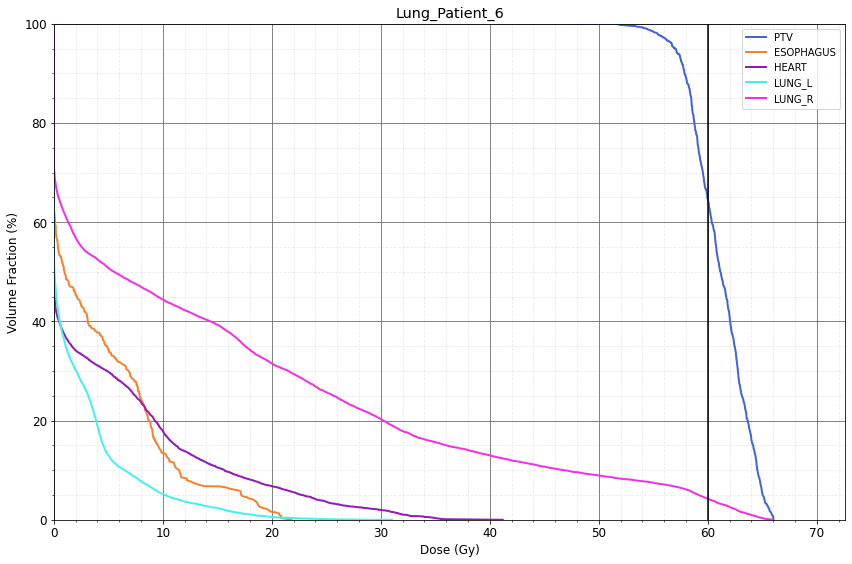

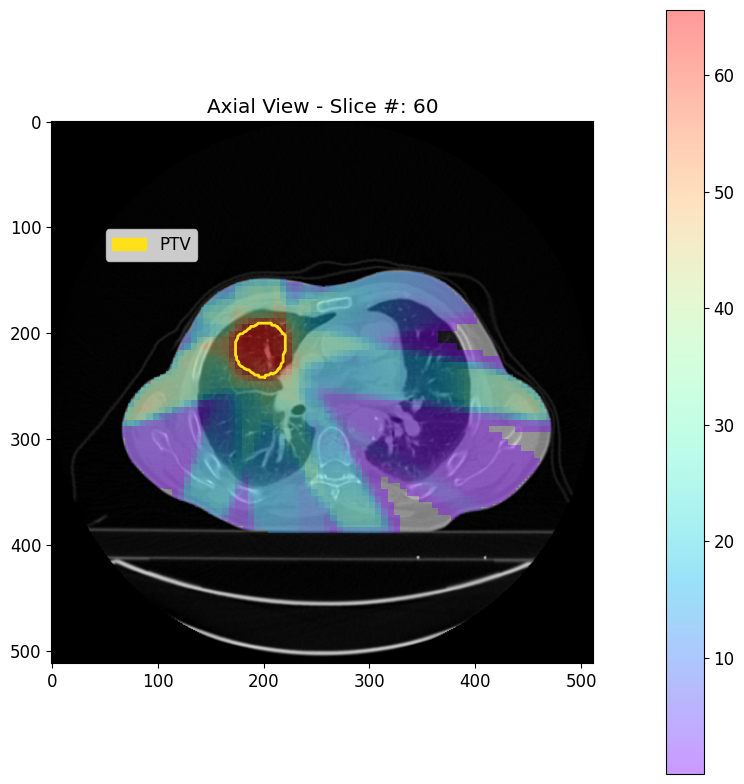

In [11]:
# plot dvh for the structures in the given list. Default dose_1d is in Gy and volume is in relative scale(%).
struct_names = ['PTV', 'ESOPHAGUS', 'HEART','LUNG_L','LUNG_R']
pp.Visualization.plot_dvh(my_plan, sol=sol, struct_names=struct_names, title=patient_id)

# plot 2d axial slice for the given solution and display the structures contours on the slice
pp.Visualization.plot_2d_slice(my_plan=my_plan, sol=sol, slice_num=60, struct_names=['PTV'])